# Notebook 54 — Tournament Strength Optimization

## Objective

#### Notebook 54 improves the strategic strength of the legality-aware Pokémon battle policy created in Notebook 53.

#### Notebook 53 successfully achieved:

- 100% production action legality,
- zero selector calls,
- zero fallback decisions,
- 100% frozen benchmark outcome agreement,
- 100% turn-count agreement,
- simulator-compatible deployment.

#### Notebook 54 shifts the optimization objective from reproducing the existing policy to improving tournament performance.

#### The primary goals are:

1. Improve tournament win rate.
2. Improve decisions in genuine multi-action states.
3. Improve performance under HP pressure.
4. Improve Eevee and Meowth tactical behavior.
5. Add position-value and search-guided decision support.
6. Preserve the deterministic legality-aware routing architecture.
7. Preserve 100% legal production decisions.

## Section 1A — Imports and Project Paths

In [1]:
# ======================================================================================
# NOTEBOOK 54 — TOURNAMENT STRENGTH OPTIMIZATION
# SECTION 1A — IMPORTS AND PROJECT PATHS
# ======================================================================================

print("=" * 100)
print("NOTEBOOK 54 — TOURNAMENT STRENGTH OPTIMIZATION")
print("=" * 100)

print()
print("SECTION 1A — IMPORTS AND PROJECT PATHS")
print("-" * 100)


# --------------------------------------------------------------------------------------
# 1. Standard-library imports
# --------------------------------------------------------------------------------------

from __future__ import annotations

from collections import Counter, defaultdict
from copy import deepcopy
from dataclasses import asdict, dataclass, is_dataclass
from pathlib import Path
from typing import (
    Any,
    Dict,
    Iterable,
    List,
    Mapping,
    Optional,
    Sequence,
    Tuple,
)

import inspect
import json
import math
import os
import random
import sys
import warnings


# --------------------------------------------------------------------------------------
# 2. Third-party imports
# --------------------------------------------------------------------------------------

import joblib
import numpy as np
import pandas as pd

from IPython.display import display


# --------------------------------------------------------------------------------------
# 3. Global configuration
# --------------------------------------------------------------------------------------

warnings.filterwarnings(
    "ignore"
)

pd.set_option(
    "display.max_columns",
    200,
)

pd.set_option(
    "display.max_rows",
    200,
)

pd.set_option(
    "display.width",
    200,
)

pd.set_option(
    "display.max_colwidth",
    120,
)


NOTEBOOK_NUMBER = 54

NOTEBOOK_NAME = (
    "tournament_strength_optimization"
)

RANDOM_SEED = 54

random.seed(
    RANDOM_SEED
)

np.random.seed(
    RANDOM_SEED
)


# --------------------------------------------------------------------------------------
# 4. Resolve project root
# --------------------------------------------------------------------------------------

CURRENT_DIRECTORY = Path.cwd().resolve()


def find_project_root(
    start_directory: Path,
    project_directory_name: str = "PTCG_AI_Battle_Challenge",
) -> Path:
    """
    Search upward from the current directory for the project root.
    """

    candidate_directory = start_directory

    while True:

        if (
            candidate_directory.name
            == project_directory_name
        ):

            return candidate_directory

        expected_children = [
            candidate_directory / "notebooks",
            candidate_directory / "reports",
            candidate_directory / "models",
            candidate_directory / "src",
        ]

        if all(
            child.exists()
            for child in expected_children
        ):

            return candidate_directory

        if (
            candidate_directory.parent
            == candidate_directory
        ):

            break

        candidate_directory = (
            candidate_directory.parent
        )

    raise FileNotFoundError(
        "Unable to locate the PTCG_AI_Battle_Challenge project root."
    )


PROJECT_ROOT = find_project_root(
    CURRENT_DIRECTORY
)


# --------------------------------------------------------------------------------------
# 5. Main project directories
# --------------------------------------------------------------------------------------

NOTEBOOK_DIR = (
    PROJECT_ROOT
    / "notebooks"
)

REPORT_DIR = (
    PROJECT_ROOT
    / "reports"
)

MODEL_DIR = (
    PROJECT_ROOT
    / "models"
)

SCRIPT_DIR = (
    PROJECT_ROOT
    / "scripts"
)

SRC_DIR = (
    PROJECT_ROOT
    / "src"
)


# --------------------------------------------------------------------------------------
# 6. Upstream Notebook directories
# --------------------------------------------------------------------------------------

NOTEBOOK50_REPORT_DIR = (
    REPORT_DIR
    / "notebook50"
)

NOTEBOOK50_MODEL_DIR = (
    MODEL_DIR
    / "notebook50"
)

NOTEBOOK51_REPORT_DIR = (
    REPORT_DIR
    / "notebook51"
)

NOTEBOOK52_REPORT_DIR = (
    REPORT_DIR
    / "notebook52"
)

NOTEBOOK53_REPORT_DIR = (
    REPORT_DIR
    / "notebook53"
)

NOTEBOOK53_MODEL_DIR = (
    MODEL_DIR
    / "notebook53"
)


# --------------------------------------------------------------------------------------
# 7. Notebook 54 output directories
# --------------------------------------------------------------------------------------

NOTEBOOK54_REPORT_DIR = (
    REPORT_DIR
    / "notebook54"
)

NOTEBOOK54_MODEL_DIR = (
    MODEL_DIR
    / "notebook54"
)


SECTION1_REPORT_DIR = (
    NOTEBOOK54_REPORT_DIR
    / "section1"
)

SECTION2_REPORT_DIR = (
    NOTEBOOK54_REPORT_DIR
    / "section2"
)

SECTION3_REPORT_DIR = (
    NOTEBOOK54_REPORT_DIR
    / "section3"
)

SECTION4_REPORT_DIR = (
    NOTEBOOK54_REPORT_DIR
    / "section4"
)

SECTION5_REPORT_DIR = (
    NOTEBOOK54_REPORT_DIR
    / "section5"
)

SECTION6_REPORT_DIR = (
    NOTEBOOK54_REPORT_DIR
    / "section6"
)

SECTION7_REPORT_DIR = (
    NOTEBOOK54_REPORT_DIR
    / "section7"
)


required_output_directories = [
    NOTEBOOK54_REPORT_DIR,
    NOTEBOOK54_MODEL_DIR,
    SECTION1_REPORT_DIR,
    SECTION2_REPORT_DIR,
    SECTION3_REPORT_DIR,
    SECTION4_REPORT_DIR,
    SECTION5_REPORT_DIR,
    SECTION6_REPORT_DIR,
    SECTION7_REPORT_DIR,
]


for directory_path in required_output_directories:

    directory_path.mkdir(
        parents=True,
        exist_ok=True,
    )


# --------------------------------------------------------------------------------------
# 8. Validate required upstream directories
# --------------------------------------------------------------------------------------

required_upstream_directories = {
    "Notebook 50 reports":
        NOTEBOOK50_REPORT_DIR,

    "Notebook 50 models":
        NOTEBOOK50_MODEL_DIR,

    "Notebook 51 reports":
        NOTEBOOK51_REPORT_DIR,

    "Notebook 52 reports":
        NOTEBOOK52_REPORT_DIR,

    "Notebook 53 reports":
        NOTEBOOK53_REPORT_DIR,

    "Notebook 53 models":
        NOTEBOOK53_MODEL_DIR,

    "Source directory":
        SRC_DIR,
}


upstream_directory_rows = []

for directory_name, directory_path in (
    required_upstream_directories.items()
):

    upstream_directory_rows.append(
        {
            "directory":
                directory_name,

            "path":
                str(
                    directory_path
                ),

            "exists":
                directory_path.exists(),

            "is_directory":
                directory_path.is_dir(),
        }
    )


section1a_upstream_directory_df = pd.DataFrame(
    upstream_directory_rows
)


assert section1a_upstream_directory_df[
    "exists"
].all(), (
    "One or more required upstream directories are missing."
)

assert section1a_upstream_directory_df[
    "is_directory"
].all(), (
    "One or more upstream paths are not directories."
)


# --------------------------------------------------------------------------------------
# 9. Notebook identity
# --------------------------------------------------------------------------------------

print()
print("NOTEBOOK IDENTITY")
print("-" * 100)

print(
    f"Notebook number         : "
    f"{NOTEBOOK_NUMBER}"
)

print(
    f"Notebook name           : "
    f"{NOTEBOOK_NAME}"
)

print(
    f"Random seed             : "
    f"{RANDOM_SEED}"
)


# --------------------------------------------------------------------------------------
# 10. Directory profile
# --------------------------------------------------------------------------------------

print()
print("DIRECTORIES")
print("-" * 100)

directory_profile = {
    "Current directory":
        CURRENT_DIRECTORY,

    "Project root":
        PROJECT_ROOT,

    "Notebook directory":
        NOTEBOOK_DIR,

    "Notebook 50 reports":
        NOTEBOOK50_REPORT_DIR,

    "Notebook 50 models":
        NOTEBOOK50_MODEL_DIR,

    "Notebook 51 reports":
        NOTEBOOK51_REPORT_DIR,

    "Notebook 52 reports":
        NOTEBOOK52_REPORT_DIR,

    "Notebook 53 reports":
        NOTEBOOK53_REPORT_DIR,

    "Notebook 53 models":
        NOTEBOOK53_MODEL_DIR,

    "Notebook 54 reports":
        NOTEBOOK54_REPORT_DIR,

    "Notebook 54 models":
        NOTEBOOK54_MODEL_DIR,

    "Source directory":
        SRC_DIR,
}


for directory_name, directory_path in (
    directory_profile.items()
):

    print(
        f"{directory_name:28}: "
        f"{directory_path}"
    )


# --------------------------------------------------------------------------------------
# 11. Package versions
# --------------------------------------------------------------------------------------

print()
print("PACKAGE VERSIONS")
print("-" * 100)

print(
    f"Python                  : "
    f"{sys.version.split()[0]}"
)

print(
    f"NumPy                   : "
    f"{np.__version__}"
)

print(
    f"Pandas                  : "
    f"{pd.__version__}"
)

print(
    f"Joblib                  : "
    f"{joblib.__version__}"
)


# --------------------------------------------------------------------------------------
# 12. Upstream directory status
# --------------------------------------------------------------------------------------

print()
print("UPSTREAM DIRECTORY STATUS")
print("-" * 100)

display(
    section1a_upstream_directory_df
)


# --------------------------------------------------------------------------------------
# 13. Save Section 1A report
# --------------------------------------------------------------------------------------

SECTION1A_DIRECTORY_STATUS_FILE = (
    SECTION1_REPORT_DIR
    / "section1a_directory_status.csv"
)

SECTION1A_SUMMARY_FILE = (
    SECTION1_REPORT_DIR
    / "section1a_imports_and_paths_summary.json"
)


section1a_upstream_directory_df.to_csv(
    SECTION1A_DIRECTORY_STATUS_FILE,
    index=False,
)


section1a_summary = {
    "status":
        "IMPORTS_AND_PROJECT_PATHS_READY",

    "notebook_number":
        NOTEBOOK_NUMBER,

    "notebook_name":
        NOTEBOOK_NAME,

    "random_seed":
        RANDOM_SEED,

    "project_root":
        str(
            PROJECT_ROOT
        ),

    "notebook53_reports_available":
        bool(
            NOTEBOOK53_REPORT_DIR.exists()
        ),

    "notebook53_models_available":
        bool(
            NOTEBOOK53_MODEL_DIR.exists()
        ),

    "source_directory_available":
        bool(
            SRC_DIR.exists()
        ),

    "notebook54_report_directory":
        str(
            NOTEBOOK54_REPORT_DIR
        ),

    "notebook54_model_directory":
        str(
            NOTEBOOK54_MODEL_DIR
        ),

    "next_stage":
        "NOTEBOOK53_HANDOFF_VALIDATION",
}


with open(
    SECTION1A_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section1a_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


assert SECTION1A_DIRECTORY_STATUS_FILE.exists()

assert SECTION1A_DIRECTORY_STATUS_FILE.stat().st_size > 0

assert SECTION1A_SUMMARY_FILE.exists()

assert SECTION1A_SUMMARY_FILE.stat().st_size > 0


print()
print("SECTION 1A SUMMARY")
print("-" * 100)

for key, value in section1a_summary.items():

    print(
        f"{key:38}: {value}"
    )


print()
print("SAVED SECTION 1A REPORTS")
print("-" * 100)

print(
    SECTION1A_DIRECTORY_STATUS_FILE
)

print(
    SECTION1A_SUMMARY_FILE
)


print()
print(
    "✅ SECTION 1A IMPORTS AND PROJECT PATHS PASSED"
)

NOTEBOOK 54 — TOURNAMENT STRENGTH OPTIMIZATION

SECTION 1A — IMPORTS AND PROJECT PATHS
----------------------------------------------------------------------------------------------------

NOTEBOOK IDENTITY
----------------------------------------------------------------------------------------------------
Notebook number         : 54
Notebook name           : tournament_strength_optimization
Random seed             : 54

DIRECTORIES
----------------------------------------------------------------------------------------------------
Current directory           : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks
Project root                : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge
Notebook directory          : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks
Notebook 50 reports         : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook50
Notebook 50 models          : D:\02_AI_and_Data\Kaggle-AI-Agen

,directory,path,exists,is_directory
0,Notebook 50 reports,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook50,True,True
1,Notebook 50 models,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook50,True,True
2,Notebook 51 reports,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook51,True,True
3,Notebook 52 reports,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52,True,True
4,Notebook 53 reports,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53,True,True
5,Notebook 53 models,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53,True,True
6,Source directory,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\src,True,True



SECTION 1A SUMMARY
----------------------------------------------------------------------------------------------------
status                                : IMPORTS_AND_PROJECT_PATHS_READY
notebook_number                       : 54
notebook_name                         : tournament_strength_optimization
random_seed                           : 54
project_root                          : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge
notebook53_reports_available          : True
notebook53_models_available           : True
source_directory_available            : True
notebook54_report_directory           : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54
notebook54_model_directory            : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook54
next_stage                            : NOTEBOOK53_HANDOFF_VALIDATION

SAVED SECTION 1A REPORTS
--------------------------------------------------------------------------------

## Section 1B — Notebook 53 Handoff Validation

#### This section validates that Notebook 53 completed successfully and that all required production artifacts are available for Notebook 54.

#### The validation confirms:

- Notebook 53 completed with zero failed checks,
- the legality-aware model and preprocessor exist,
- the production policy adapter metadata exists,
- the tournament replay completed successfully,
- 24 battles and 210 decisions were preserved,
- winner and turn-count agreement were both 100%,
- the next stage is tournament-strength optimization.

In [2]:
# ======================================================================================
# SECTION 1B — NOTEBOOK 53 HANDOFF VALIDATION
# ======================================================================================

print("=" * 100)
print("SECTION 1B — NOTEBOOK 53 HANDOFF VALIDATION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Required Notebook 53 artifacts
# --------------------------------------------------------------------------------------

NOTEBOOK53_SECTION7_DIR = (
    NOTEBOOK53_REPORT_DIR
    / "section7"
)

NOTEBOOK53_SECTION6_DIR = (
    NOTEBOOK53_REPORT_DIR
    / "section6"
)


NOTEBOOK53_HANDOFF_MANIFEST_FILE = (
    NOTEBOOK53_SECTION7_DIR
    / "section7a_handoff_manifest.json"
)

NOTEBOOK53_FINAL_SUMMARY_FILE = (
    NOTEBOOK53_SECTION7_DIR
    / "section7a_final_summary.json"
)

NOTEBOOK53_VALIDATION_CHECKS_FILE = (
    NOTEBOOK53_SECTION7_DIR
    / "section7a_validation_checks.csv"
)

NOTEBOOK53_FINAL_PROFILE_FILE = (
    NOTEBOOK53_SECTION7_DIR
    / "section7a_final_integration_profile.csv"
)

NOTEBOOK53_OPTIMIZATION_TARGETS_FILE = (
    NOTEBOOK53_SECTION7_DIR
    / "section7a_notebook54_optimization_targets.csv"
)

NOTEBOOK53_REPLAY_SUMMARY_FILE = (
    NOTEBOOK53_SECTION6_DIR
    / "section6e_tournament_replay_summary.json"
)

NOTEBOOK53_REPLAY_BATTLES_FILE = (
    NOTEBOOK53_SECTION6_DIR
    / "section6e_tournament_replay_battles.csv"
)

NOTEBOOK53_REPLAY_TURNS_FILE = (
    NOTEBOOK53_SECTION6_DIR
    / "section6e_tournament_replay_turns.csv"
)

NOTEBOOK53_POLICY_HISTORY_FILE = (
    NOTEBOOK53_SECTION6_DIR
    / "section6e_tournament_replay_policy_history.csv"
)

NOTEBOOK53_BENCHMARK_COMPARISON_FILE = (
    NOTEBOOK53_SECTION6_DIR
    / "section6b_notebook52_vs_notebook53_comparison.csv"
)

NOTEBOOK53_MODEL_FILE = (
    NOTEBOOK53_MODEL_DIR
    / "legality_aware_random_forest.joblib"
)

NOTEBOOK53_PREPROCESSOR_FILE = (
    NOTEBOOK53_MODEL_DIR
    / "legality_aware_preprocessor.joblib"
)

NOTEBOOK53_FEATURE_NAMES_FILE = (
    NOTEBOOK53_MODEL_DIR
    / "legality_aware_encoded_feature_names.json"
)

NOTEBOOK53_RAW_SCHEMA_FILE = (
    NOTEBOOK53_MODEL_DIR
    / "legality_aware_raw_feature_schema.json"
)

NOTEBOOK53_ADAPTER_METADATA_FILE = (
    NOTEBOOK53_MODEL_DIR
    / "legality_aware_policy_adapter_metadata.json"
)


required_notebook53_artifacts = {
    "handoff_manifest":
        NOTEBOOK53_HANDOFF_MANIFEST_FILE,

    "final_summary":
        NOTEBOOK53_FINAL_SUMMARY_FILE,

    "validation_checks":
        NOTEBOOK53_VALIDATION_CHECKS_FILE,

    "final_profile":
        NOTEBOOK53_FINAL_PROFILE_FILE,

    "optimization_targets":
        NOTEBOOK53_OPTIMIZATION_TARGETS_FILE,

    "replay_summary":
        NOTEBOOK53_REPLAY_SUMMARY_FILE,

    "replay_battles":
        NOTEBOOK53_REPLAY_BATTLES_FILE,

    "replay_turns":
        NOTEBOOK53_REPLAY_TURNS_FILE,

    "policy_history":
        NOTEBOOK53_POLICY_HISTORY_FILE,

    "benchmark_comparison":
        NOTEBOOK53_BENCHMARK_COMPARISON_FILE,

    "legality_aware_model":
        NOTEBOOK53_MODEL_FILE,

    "preprocessor":
        NOTEBOOK53_PREPROCESSOR_FILE,

    "encoded_feature_names":
        NOTEBOOK53_FEATURE_NAMES_FILE,

    "raw_feature_schema":
        NOTEBOOK53_RAW_SCHEMA_FILE,

    "adapter_metadata":
        NOTEBOOK53_ADAPTER_METADATA_FILE,
}


# --------------------------------------------------------------------------------------
# 2. Artifact inventory
# --------------------------------------------------------------------------------------

artifact_rows = []

for artifact_name, artifact_path in (
    required_notebook53_artifacts.items()
):

    artifact_exists = artifact_path.exists()

    artifact_is_file = (
        artifact_path.is_file()
        if artifact_exists
        else False
    )

    artifact_size = (
        artifact_path.stat().st_size
        if artifact_is_file
        else 0
    )

    artifact_rows.append(
        {
            "artifact":
                artifact_name,

            "path":
                str(
                    artifact_path
                ),

            "exists":
                artifact_exists,

            "is_file":
                artifact_is_file,

            "size_bytes":
                int(
                    artifact_size
                ),

            "nonempty":
                bool(
                    artifact_size > 0
                ),
        }
    )


section1b_artifact_inventory_df = pd.DataFrame(
    artifact_rows
)


print()
print("NOTEBOOK 53 ARTIFACT INVENTORY")
print("-" * 100)

display(
    section1b_artifact_inventory_df
)


assert section1b_artifact_inventory_df[
    "exists"
].all(), (
    "One or more Notebook 53 artifacts are missing."
)

assert section1b_artifact_inventory_df[
    "is_file"
].all(), (
    "One or more Notebook 53 artifact paths are not files."
)

assert section1b_artifact_inventory_df[
    "nonempty"
].all(), (
    "One or more Notebook 53 artifacts are empty."
)


# --------------------------------------------------------------------------------------
# 3. Load Notebook 53 handoff data
# --------------------------------------------------------------------------------------

with open(
    NOTEBOOK53_HANDOFF_MANIFEST_FILE,
    "r",
    encoding="utf-8",
) as file:

    notebook53_handoff_manifest = json.load(
        file
    )


with open(
    NOTEBOOK53_FINAL_SUMMARY_FILE,
    "r",
    encoding="utf-8",
) as file:

    notebook53_final_summary = json.load(
        file
    )


with open(
    NOTEBOOK53_REPLAY_SUMMARY_FILE,
    "r",
    encoding="utf-8",
) as file:

    notebook53_replay_summary = json.load(
        file
    )


notebook53_validation_checks_df = pd.read_csv(
    NOTEBOOK53_VALIDATION_CHECKS_FILE
)

notebook53_final_profile_df = pd.read_csv(
    NOTEBOOK53_FINAL_PROFILE_FILE
)

notebook53_optimization_targets_df = pd.read_csv(
    NOTEBOOK53_OPTIMIZATION_TARGETS_FILE
)

notebook53_replay_battles_df = pd.read_csv(
    NOTEBOOK53_REPLAY_BATTLES_FILE
)

notebook53_replay_turns_df = pd.read_csv(
    NOTEBOOK53_REPLAY_TURNS_FILE
)

notebook53_policy_history_df = pd.read_csv(
    NOTEBOOK53_POLICY_HISTORY_FILE
)

notebook53_benchmark_comparison_df = pd.read_csv(
    NOTEBOOK53_BENCHMARK_COMPARISON_FILE
)


# --------------------------------------------------------------------------------------
# 4. Extract key handoff values
# --------------------------------------------------------------------------------------

handoff_status = str(
    notebook53_handoff_manifest[
        "status"
    ]
)

source_dataset_rows = int(
    notebook53_handoff_manifest[
        "source_dataset_rows"
    ]
)

raw_feature_count = int(
    notebook53_handoff_manifest[
        "raw_feature_count"
    ]
)

encoded_feature_count = int(
    notebook53_handoff_manifest[
        "encoded_feature_count"
    ]
)

policy_class_count = int(
    notebook53_handoff_manifest[
        "policy_class_count"
    ]
)

training_rows = int(
    notebook53_handoff_manifest[
        "training_rows"
    ]
)

validation_rows = int(
    notebook53_handoff_manifest[
        "validation_rows"
    ]
)

test_rows = int(
    notebook53_handoff_manifest[
        "test_rows"
    ]
)

validation_accuracy = float(
    notebook53_handoff_manifest[
        "validation_accuracy"
    ]
)

test_accuracy = float(
    notebook53_handoff_manifest[
        "test_accuracy"
    ]
)

notebook52_raw_legality_rate = float(
    notebook53_handoff_manifest[
        "notebook52_raw_legality_rate"
    ]
)

notebook53_raw_legality_rate = float(
    notebook53_handoff_manifest[
        "notebook53_raw_legality_rate"
    ]
)

notebook52_masking_rate = float(
    notebook53_handoff_manifest[
        "notebook52_masking_rate"
    ]
)

notebook53_raw_masking_rate = float(
    notebook53_handoff_manifest[
        "notebook53_raw_masking_rate"
    ]
)

tournament_battles = int(
    notebook53_handoff_manifest[
        "tournament_battles"
    ]
)

tournament_player_wins = int(
    notebook53_handoff_manifest[
        "tournament_player_wins"
    ]
)

tournament_opponent_wins = int(
    notebook53_handoff_manifest[
        "tournament_opponent_wins"
    ]
)

tournament_draws = int(
    notebook53_handoff_manifest[
        "tournament_draws"
    ]
)

tournament_policy_decisions = int(
    notebook53_handoff_manifest[
        "tournament_policy_decisions"
    ]
)

single_action_direct_decisions = int(
    notebook53_handoff_manifest[
        "single_action_direct_decisions"
    ]
)

multi_action_model_decisions = int(
    notebook53_handoff_manifest[
        "multi_action_model_decisions"
    ]
)

selector_decisions = int(
    notebook53_handoff_manifest[
        "selector_decisions"
    ]
)

fallback_decisions = int(
    notebook53_handoff_manifest[
        "fallback_decisions"
    ]
)

winner_agreement_rate = float(
    notebook53_handoff_manifest[
        "winner_agreement_rate"
    ]
)

turn_count_agreement_rate = float(
    notebook53_handoff_manifest[
        "turn_count_agreement_rate"
    ]
)

validation_checks_passed = int(
    notebook53_handoff_manifest[
        "validation_checks_passed"
    ]
)

validation_checks_failed = int(
    notebook53_handoff_manifest[
        "validation_checks_failed"
    ]
)

primary_optimization_target = str(
    notebook53_handoff_manifest[
        "primary_optimization_target"
    ]
)

weakest_condition = str(
    notebook53_handoff_manifest[
        "weakest_condition"
    ]
)

next_notebook = str(
    notebook53_handoff_manifest[
        "next_notebook"
    ]
)

next_stage = str(
    notebook53_handoff_manifest[
        "next_stage"
    ]
)


# --------------------------------------------------------------------------------------
# 5. Display Notebook 53 handoff profile
# --------------------------------------------------------------------------------------

print()
print("NOTEBOOK 53 HANDOFF PROFILE")
print("-" * 100)

handoff_profile = {
    "Status":
        handoff_status,

    "Source dataset rows":
        source_dataset_rows,

    "Raw feature count":
        raw_feature_count,

    "Encoded feature count":
        encoded_feature_count,

    "Policy class count":
        policy_class_count,

    "Training rows":
        training_rows,

    "Validation rows":
        validation_rows,

    "Test rows":
        test_rows,

    "Validation accuracy":
        validation_accuracy,

    "Test accuracy":
        test_accuracy,

    "Notebook 52 raw legality":
        notebook52_raw_legality_rate,

    "Notebook 53 raw legality":
        notebook53_raw_legality_rate,

    "Notebook 52 masking rate":
        notebook52_masking_rate,

    "Notebook 53 raw masking rate":
        notebook53_raw_masking_rate,

    "Tournament battles":
        tournament_battles,

    "Player wins":
        tournament_player_wins,

    "Opponent wins":
        tournament_opponent_wins,

    "Draws":
        tournament_draws,

    "Policy decisions":
        tournament_policy_decisions,

    "Single-action direct decisions":
        single_action_direct_decisions,

    "Multi-action model decisions":
        multi_action_model_decisions,

    "Selector decisions":
        selector_decisions,

    "Fallback decisions":
        fallback_decisions,

    "Winner agreement rate":
        winner_agreement_rate,

    "Turn-count agreement rate":
        turn_count_agreement_rate,

    "Validation checks passed":
        validation_checks_passed,

    "Validation checks failed":
        validation_checks_failed,

    "Primary optimization target":
        primary_optimization_target,

    "Weakest condition":
        weakest_condition,

    "Next notebook":
        next_notebook,

    "Next stage":
        next_stage,
}


for key, value in handoff_profile.items():

    print(
        f"{key:36}: {value}"
    )


# --------------------------------------------------------------------------------------
# 6. Validation checks
# --------------------------------------------------------------------------------------

section1b_validation_rows = []


def add_section1b_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section1b_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section1b_check(
    "handoff_status_valid",
    handoff_status
    == "READY_FOR_TOURNAMENT_STRENGTH_OPTIMIZATION",
    handoff_status,
    "READY_FOR_TOURNAMENT_STRENGTH_OPTIMIZATION",
)

add_section1b_check(
    "source_dataset_rows_valid",
    source_dataset_rows == 1060,
    source_dataset_rows,
    1060,
)

add_section1b_check(
    "raw_feature_count_valid",
    raw_feature_count == 41,
    raw_feature_count,
    41,
)

add_section1b_check(
    "encoded_feature_count_valid",
    encoded_feature_count == 64,
    encoded_feature_count,
    64,
)

add_section1b_check(
    "policy_class_count_valid",
    policy_class_count == 6,
    policy_class_count,
    6,
)

add_section1b_check(
    "training_rows_valid",
    training_rows == 840,
    training_rows,
    840,
)

add_section1b_check(
    "validation_rows_valid",
    validation_rows == 110,
    validation_rows,
    110,
)

add_section1b_check(
    "test_rows_valid",
    test_rows == 110,
    test_rows,
    110,
)

add_section1b_check(
    "validation_accuracy_valid",
    np.isclose(
        validation_accuracy,
        1.0,
    ),
    validation_accuracy,
    1.0,
)

add_section1b_check(
    "test_accuracy_valid",
    np.isclose(
        test_accuracy,
        1.0,
    ),
    test_accuracy,
    1.0,
)

add_section1b_check(
    "raw_legality_improved",
    notebook53_raw_legality_rate
    > notebook52_raw_legality_rate,
    {
        "notebook52":
            notebook52_raw_legality_rate,

        "notebook53":
            notebook53_raw_legality_rate,
    },
    "Notebook53 > Notebook52",
)

add_section1b_check(
    "masking_rate_reduced",
    notebook53_raw_masking_rate
    < notebook52_masking_rate,
    {
        "notebook52":
            notebook52_masking_rate,

        "notebook53":
            notebook53_raw_masking_rate,
    },
    "Notebook53 < Notebook52",
)

add_section1b_check(
    "tournament_battle_count_valid",
    tournament_battles == 24,
    tournament_battles,
    24,
)

add_section1b_check(
    "tournament_outcomes_reconcile",
    (
        tournament_player_wins
        + tournament_opponent_wins
        + tournament_draws
    )
    == tournament_battles,
    {
        "player_wins":
            tournament_player_wins,

        "opponent_wins":
            tournament_opponent_wins,

        "draws":
            tournament_draws,
    },
    tournament_battles,
)

add_section1b_check(
    "policy_decision_count_valid",
    tournament_policy_decisions == 210,
    tournament_policy_decisions,
    210,
)

add_section1b_check(
    "routing_decisions_reconcile",
    (
        single_action_direct_decisions
        + multi_action_model_decisions
    )
    == tournament_policy_decisions,
    {
        "single_action":
            single_action_direct_decisions,

        "multi_action":
            multi_action_model_decisions,
    },
    tournament_policy_decisions,
)

add_section1b_check(
    "selector_decisions_zero",
    selector_decisions == 0,
    selector_decisions,
    0,
)

add_section1b_check(
    "fallback_decisions_zero",
    fallback_decisions == 0,
    fallback_decisions,
    0,
)

add_section1b_check(
    "winner_agreement_valid",
    np.isclose(
        winner_agreement_rate,
        1.0,
    ),
    winner_agreement_rate,
    1.0,
)

add_section1b_check(
    "turn_count_agreement_valid",
    np.isclose(
        turn_count_agreement_rate,
        1.0,
    ),
    turn_count_agreement_rate,
    1.0,
)

add_section1b_check(
    "validation_checks_failed_zero",
    validation_checks_failed == 0,
    validation_checks_failed,
    0,
)

add_section1b_check(
    "validation_checks_passed_valid",
    validation_checks_passed == 38,
    validation_checks_passed,
    38,
)

add_section1b_check(
    "next_notebook_valid",
    next_notebook
    == "Notebook 54 — Tournament Strength Optimization",
    next_notebook,
    "Notebook 54 — Tournament Strength Optimization",
)

add_section1b_check(
    "next_stage_valid",
    next_stage
    == "TOURNAMENT_STRENGTH_OPTIMIZATION",
    next_stage,
    "TOURNAMENT_STRENGTH_OPTIMIZATION",
)

add_section1b_check(
    "replay_battle_rows_valid",
    len(
        notebook53_replay_battles_df
    ) == 24,
    len(
        notebook53_replay_battles_df
    ),
    24,
)

add_section1b_check(
    "replay_turn_rows_valid",
    len(
        notebook53_replay_turns_df
    ) == 210,
    len(
        notebook53_replay_turns_df
    ),
    210,
)

add_section1b_check(
    "policy_history_rows_valid",
    len(
        notebook53_policy_history_df
    ) == 210,
    len(
        notebook53_policy_history_df
    ),
    210,
)

add_section1b_check(
    "benchmark_comparison_rows_valid",
    len(
        notebook53_benchmark_comparison_df
    ) == 210,
    len(
        notebook53_benchmark_comparison_df
    ),
    210,
)


section1b_validation_checks_df = pd.DataFrame(
    section1b_validation_rows
)


print()
print("NOTEBOOK 53 HANDOFF VALIDATION CHECKS")
print("-" * 100)

display(
    section1b_validation_checks_df
)


section1b_checks_passed = int(
    section1b_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section1b_checks_failed = int(
    (
        ~section1b_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section1b_checks_failed == 0, (
    "One or more Notebook 53 handoff validation checks failed."
)


# --------------------------------------------------------------------------------------
# 7. Save Section 1B reports
# --------------------------------------------------------------------------------------

SECTION1B_ARTIFACT_INVENTORY_FILE = (
    SECTION1_REPORT_DIR
    / "section1b_notebook53_artifact_inventory.csv"
)

SECTION1B_VALIDATION_CHECKS_FILE = (
    SECTION1_REPORT_DIR
    / "section1b_notebook53_validation_checks.csv"
)

SECTION1B_HANDOFF_PROFILE_FILE = (
    SECTION1_REPORT_DIR
    / "section1b_notebook53_handoff_profile.csv"
)

SECTION1B_OPTIMIZATION_TARGETS_FILE = (
    SECTION1_REPORT_DIR
    / "section1b_notebook54_optimization_targets.csv"
)

SECTION1B_SUMMARY_FILE = (
    SECTION1_REPORT_DIR
    / "section1b_notebook53_handoff_summary.json"
)


section1b_artifact_inventory_df.to_csv(
    SECTION1B_ARTIFACT_INVENTORY_FILE,
    index=False,
)

section1b_validation_checks_df.to_csv(
    SECTION1B_VALIDATION_CHECKS_FILE,
    index=False,
)

pd.DataFrame(
    [
        {
            "metric":
                key,

            "value":
                value,
        }
        for key, value in handoff_profile.items()
    ]
).to_csv(
    SECTION1B_HANDOFF_PROFILE_FILE,
    index=False,
)

notebook53_optimization_targets_df.to_csv(
    SECTION1B_OPTIMIZATION_TARGETS_FILE,
    index=False,
)


section1b_summary = {
    "status":
        "NOTEBOOK53_HANDOFF_VALIDATED",

    "handoff_status":
        handoff_status,

    "source_dataset_rows":
        source_dataset_rows,

    "raw_feature_count":
        raw_feature_count,

    "encoded_feature_count":
        encoded_feature_count,

    "policy_class_count":
        policy_class_count,

    "training_rows":
        training_rows,

    "validation_rows":
        validation_rows,

    "test_rows":
        test_rows,

    "validation_accuracy":
        validation_accuracy,

    "test_accuracy":
        test_accuracy,

    "notebook52_raw_legality_rate":
        notebook52_raw_legality_rate,

    "notebook53_raw_legality_rate":
        notebook53_raw_legality_rate,

    "notebook52_masking_rate":
        notebook52_masking_rate,

    "notebook53_raw_masking_rate":
        notebook53_raw_masking_rate,

    "tournament_battles":
        tournament_battles,

    "tournament_player_wins":
        tournament_player_wins,

    "tournament_opponent_wins":
        tournament_opponent_wins,

    "tournament_draws":
        tournament_draws,

    "tournament_policy_decisions":
        tournament_policy_decisions,

    "single_action_direct_decisions":
        single_action_direct_decisions,

    "multi_action_model_decisions":
        multi_action_model_decisions,

    "selector_decisions":
        selector_decisions,

    "fallback_decisions":
        fallback_decisions,

    "winner_agreement_rate":
        winner_agreement_rate,

    "turn_count_agreement_rate":
        turn_count_agreement_rate,

    "validation_checks_passed":
        section1b_checks_passed,

    "validation_checks_failed":
        section1b_checks_failed,

    "primary_optimization_target":
        primary_optimization_target,

    "weakest_condition":
        weakest_condition,

    "ready_for_strength_analysis":
        True,

    "next_stage":
        "STRATEGIC_DECISION_OPPORTUNITY_ANALYSIS",
}


with open(
    SECTION1B_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section1b_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section1b_saved_files = [
    SECTION1B_ARTIFACT_INVENTORY_FILE,
    SECTION1B_VALIDATION_CHECKS_FILE,
    SECTION1B_HANDOFF_PROFILE_FILE,
    SECTION1B_OPTIMIZATION_TARGETS_FILE,
    SECTION1B_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section1b_saved_files
)


# --------------------------------------------------------------------------------------
# 8. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 1B SUMMARY")
print("-" * 100)

for key, value in section1b_summary.items():

    print(
        f"{key:42}: {value}"
    )


print()
print("SAVED SECTION 1B REPORTS")
print("-" * 100)

for file_path in section1b_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 1B NOTEBOOK 53 HANDOFF VALIDATION PASSED"
)

SECTION 1B — NOTEBOOK 53 HANDOFF VALIDATION

NOTEBOOK 53 ARTIFACT INVENTORY
----------------------------------------------------------------------------------------------------


,artifact,path,exists,is_file,size_bytes,nonempty
0,handoff_manifest,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section7\section7a_handoff_manifest.json,True,True,2987,True
1,final_summary,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section7\section7a_final_summary.json,True,True,743,True
2,validation_checks,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section7\section7a_validation_checks.csv,True,True,1880,True
3,final_profile,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section7\section7a_final_integration_...,True,True,667,True
4,optimization_targets,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section7\section7a_notebook54_optimiz...,True,True,747,True
5,replay_summary,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_tournament_replay_...,True,True,640,True
6,replay_battles,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_tournament_replay_...,True,True,4072,True
7,replay_turns,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_tournament_replay_...,True,True,20936,True
8,policy_history,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_tournament_replay_...,True,True,26972,True
9,benchmark_comparison,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6b_notebook52_vs_note...,True,True,39325,True



NOTEBOOK 53 HANDOFF PROFILE
----------------------------------------------------------------------------------------------------
Status                              : READY_FOR_TOURNAMENT_STRENGTH_OPTIMIZATION
Source dataset rows                 : 1060
Raw feature count                   : 41
Encoded feature count               : 64
Policy class count                  : 6
Training rows                       : 840
Validation rows                     : 110
Test rows                           : 110
Validation accuracy                 : 1.0
Test accuracy                       : 1.0
Notebook 52 raw legality            : 0.28095238095238095
Notebook 53 raw legality            : 0.8285714285714286
Notebook 52 masking rate            : 0.719047619047619
Notebook 53 raw masking rate        : 0.17142857142857143
Tournament battles                  : 24
Player wins                         : 7
Opponent wins                       : 14
Draws                               : 3
Policy decisions       

,check,passed,value,expected,details
0,handoff_status_valid,True,READY_FOR_TOURNAMENT_STRENGTH_OPTIMIZATION,READY_FOR_TOURNAMENT_STRENGTH_OPTIMIZATION,
1,source_dataset_rows_valid,True,1060,1060,
2,raw_feature_count_valid,True,41,41,
3,encoded_feature_count_valid,True,64,64,
4,policy_class_count_valid,True,6,6,
5,training_rows_valid,True,840,840,
6,validation_rows_valid,True,110,110,
7,test_rows_valid,True,110,110,
8,validation_accuracy_valid,True,1.0,1.0,
9,test_accuracy_valid,True,1.0,1.0,



SECTION 1B SUMMARY
----------------------------------------------------------------------------------------------------
status                                    : NOTEBOOK53_HANDOFF_VALIDATED
handoff_status                            : READY_FOR_TOURNAMENT_STRENGTH_OPTIMIZATION
source_dataset_rows                       : 1060
raw_feature_count                         : 41
encoded_feature_count                     : 64
policy_class_count                        : 6
training_rows                             : 840
validation_rows                           : 110
test_rows                                 : 110
validation_accuracy                       : 1.0
test_accuracy                             : 1.0
notebook52_raw_legality_rate              : 0.28095238095238095
notebook53_raw_legality_rate              : 0.8285714285714286
notebook52_masking_rate                   : 0.719047619047619
notebook53_raw_masking_rate               : 0.17142857142857143
tournament_battles                   

# Section 2 — Strategic Opportunity Analysis

## Section 2A — Strategic Decision Opportunity Analysis

#### This section analyzes the frozen Notebook 53 tournament replay to locate decision points where strategic optimization can affect battle outcomes.

#### The analysis distinguishes:

- deterministic single-action turns,
- genuine multi-action turns,
- decisions occurring in wins, losses, and draws,
- decisions by acting side,
- decisions by active Pokémon,
- decisions by tournament condition,
- low-confidence multi-action decisions,
- losing scenarios containing model-controlled choices.

#### The resulting opportunity profile will determine where Notebook 54 should apply tactical scoring, value evaluation, and search.

In [3]:
# ======================================================================================
# SECTION 2A — STRATEGIC DECISION OPPORTUNITY ANALYSIS
# ======================================================================================

print("=" * 100)
print("SECTION 2A — STRATEGIC DECISION OPPORTUNITY ANALYSIS")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate handoff readiness
# --------------------------------------------------------------------------------------

assert section1b_summary[
    "status"
] == "NOTEBOOK53_HANDOFF_VALIDATED"

assert section1b_summary[
    "ready_for_strength_analysis"
] is True

assert len(
    notebook53_replay_battles_df
) == 24

assert len(
    notebook53_policy_history_df
) == 210

assert len(
    notebook53_replay_turns_df
) == 210


# --------------------------------------------------------------------------------------
# 2. General parsing helpers
# --------------------------------------------------------------------------------------

def parse_serialized_list(
    value: Any,
) -> List[str]:
    """
    Convert a list, tuple, JSON string, Python-style list string,
    scalar, or missing value into a clean list of strings.
    """

    if value is None:

        return []

    if isinstance(
        value,
        (
            list,
            tuple,
            set,
            np.ndarray,
            pd.Series,
        ),
    ):

        return [
            str(
                item
            ).strip()
            for item in value
            if str(
                item
            ).strip()
        ]

    try:

        if pd.isna(
            value
        ):

            return []

    except (
        TypeError,
        ValueError,
    ):

        pass

    value_text = str(
        value
    ).strip()

    if not value_text:

        return []

    try:

        parsed_value = json.loads(
            value_text
        )

        if isinstance(
            parsed_value,
            list,
        ):

            return [
                str(
                    item
                ).strip()
                for item in parsed_value
                if str(
                    item
                ).strip()
            ]

    except (
        json.JSONDecodeError,
        TypeError,
    ):

        pass

    cleaned_text = (
        value_text
        .strip(
            "[]"
        )
        .strip()
    )

    if not cleaned_text:

        return []

    return [
        item.strip().strip(
            "'\""
        )
        for item in cleaned_text.split(
            ","
        )
        if item.strip().strip(
            "'\""
        )
    ]


def normalize_winner_label(
    value: Any,
) -> str:
    """
    Normalize a winner value to Player, Opponent, or Draw.
    """

    if value is None:

        return "Draw"

    try:

        if pd.isna(
            value
        ):

            return "Draw"

    except (
        TypeError,
        ValueError,
    ):

        pass

    value_text = str(
        value
    ).strip()

    value_lower = value_text.lower()

    if value_lower == "player":

        return "Player"

    if value_lower == "opponent":

        return "Opponent"

    if value_lower in {
        "",
        "none",
        "nan",
        "draw",
        "tie",
    }:

        return "Draw"

    return value_text


def resolve_column_name(
    dataframe: pd.DataFrame,
    candidates: Sequence[str],
    required: bool = True,
) -> Optional[str]:
    """
    Return the first available candidate column.
    """

    for column_name in candidates:

        if column_name in dataframe.columns:

            return column_name

    if required:

        raise KeyError(
            "Required column was not found. Candidates: "
            f"{list(candidates)}"
        )

    return None


# --------------------------------------------------------------------------------------
# 3. Resolve required columns safely
# --------------------------------------------------------------------------------------

POLICY_SCENARIO_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "scenario_id",
        "expanded_scenario_id",
    ],
)

POLICY_CONDITION_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "condition_id",
        "condition",
    ],
)

POLICY_TURN_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "turn_number",
        "decision_number",
    ],
)

POLICY_SIDE_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "current_player",
        "current_side",
        "acting_side",
    ],
)

POLICY_ACTIVE_CARD_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "active_card",
        "pokemon_name",
    ],
)

POLICY_LEGAL_MOVES_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "legal_moves",
    ],
)

POLICY_SELECTED_MOVE_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "selected_move",
        "move_name",
    ],
)

POLICY_RAW_PREDICTION_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "raw_prediction",
        "raw_predicted_move",
    ],
)

POLICY_CONFIDENCE_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "confidence",
        "score",
    ],
)

POLICY_ROUTING_REASON_COLUMN = resolve_column_name(
    notebook53_policy_history_df,
    [
        "routing_reason",
    ],
)

BATTLE_SCENARIO_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "scenario_id",
    ],
)

BATTLE_CONDITION_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "condition_id",
    ],
)

BATTLE_PLAYER_CARD_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "player_card",
    ],
)

BATTLE_OPPONENT_CARD_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "opponent_card",
    ],
)

BATTLE_STARTING_SIDE_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "starting_side",
    ],
)

BATTLE_WINNER_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "notebook53_winner",
        "winner",
    ],
)

BATTLE_TURNS_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "notebook53_turns",
        "recorded_turns",
    ],
)

BATTLE_FINAL_PLAYER_HP_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "final_player_hp",
    ],
)

BATTLE_FINAL_OPPONENT_HP_COLUMN = resolve_column_name(
    notebook53_replay_battles_df,
    [
        "final_opponent_hp",
    ],
)


# --------------------------------------------------------------------------------------
# 4. Build battle-level outcome context
# --------------------------------------------------------------------------------------

battle_context_df = (
    notebook53_replay_battles_df[
        [
            BATTLE_SCENARIO_COLUMN,
            BATTLE_CONDITION_COLUMN,
            BATTLE_PLAYER_CARD_COLUMN,
            BATTLE_OPPONENT_CARD_COLUMN,
            BATTLE_STARTING_SIDE_COLUMN,
            BATTLE_WINNER_COLUMN,
            BATTLE_TURNS_COLUMN,
            BATTLE_FINAL_PLAYER_HP_COLUMN,
            BATTLE_FINAL_OPPONENT_HP_COLUMN,
        ]
    ]
    .copy()
    .rename(
        columns={
            BATTLE_SCENARIO_COLUMN:
                "scenario_id",

            BATTLE_CONDITION_COLUMN:
                "condition_id",

            BATTLE_PLAYER_CARD_COLUMN:
                "player_card",

            BATTLE_OPPONENT_CARD_COLUMN:
                "opponent_card",

            BATTLE_STARTING_SIDE_COLUMN:
                "starting_side",

            BATTLE_WINNER_COLUMN:
                "battle_winner",

            BATTLE_TURNS_COLUMN:
                "battle_turns",

            BATTLE_FINAL_PLAYER_HP_COLUMN:
                "final_player_hp",

            BATTLE_FINAL_OPPONENT_HP_COLUMN:
                "final_opponent_hp",
        }
    )
)


battle_context_df[
    "battle_winner"
] = battle_context_df[
    "battle_winner"
].apply(
    normalize_winner_label
)

battle_context_df[
    "player_outcome"
] = battle_context_df[
    "battle_winner"
].map(
    {
        "Player":
            "WIN",

        "Opponent":
            "LOSS",

        "Draw":
            "DRAW",
    }
).fillna(
    "UNKNOWN"
)

battle_context_df[
    "player_win_flag"
] = (
    battle_context_df[
        "player_outcome"
    ]
    .eq(
        "WIN"
    )
    .astype(int)
)

battle_context_df[
    "player_loss_flag"
] = (
    battle_context_df[
        "player_outcome"
    ]
    .eq(
        "LOSS"
    )
    .astype(int)
)

battle_context_df[
    "draw_flag"
] = (
    battle_context_df[
        "player_outcome"
    ]
    .eq(
        "DRAW"
    )
    .astype(int)
)


# --------------------------------------------------------------------------------------
# 5. Build decision-level strategic analysis table
# --------------------------------------------------------------------------------------

decision_analysis_df = (
    notebook53_policy_history_df[
        [
            POLICY_SCENARIO_COLUMN,
            POLICY_CONDITION_COLUMN,
            POLICY_TURN_COLUMN,
            POLICY_SIDE_COLUMN,
            POLICY_ACTIVE_CARD_COLUMN,
            POLICY_LEGAL_MOVES_COLUMN,
            POLICY_SELECTED_MOVE_COLUMN,
            POLICY_RAW_PREDICTION_COLUMN,
            POLICY_CONFIDENCE_COLUMN,
            POLICY_ROUTING_REASON_COLUMN,
        ]
    ]
    .copy()
    .rename(
        columns={
            POLICY_SCENARIO_COLUMN:
                "scenario_id",

            POLICY_CONDITION_COLUMN:
                "condition_id",

            POLICY_TURN_COLUMN:
                "turn_number",

            POLICY_SIDE_COLUMN:
                "acting_side",

            POLICY_ACTIVE_CARD_COLUMN:
                "active_card",

            POLICY_LEGAL_MOVES_COLUMN:
                "legal_moves",

            POLICY_SELECTED_MOVE_COLUMN:
                "selected_move",

            POLICY_RAW_PREDICTION_COLUMN:
                "raw_prediction",

            POLICY_CONFIDENCE_COLUMN:
                "confidence",

            POLICY_ROUTING_REASON_COLUMN:
                "routing_reason",
        }
    )
)


decision_analysis_df[
    "legal_move_list"
] = decision_analysis_df[
    "legal_moves"
].apply(
    parse_serialized_list
)

decision_analysis_df[
    "legal_move_count"
] = decision_analysis_df[
    "legal_move_list"
].apply(
    len
)

decision_analysis_df[
    "action_state_type"
] = np.where(
    decision_analysis_df[
        "legal_move_count"
    ].eq(
        1
    ),
    "SINGLE_ACTION",
    "MULTI_ACTION",
)

decision_analysis_df[
    "is_strategic_opportunity"
] = (
    decision_analysis_df[
        "legal_move_count"
    ]
    .gt(
        1
    )
)

decision_analysis_df[
    "confidence"
] = pd.to_numeric(
    decision_analysis_df[
        "confidence"
    ],
    errors="coerce",
).fillna(
    0.0
)

decision_analysis_df[
    "turn_number"
] = pd.to_numeric(
    decision_analysis_df[
        "turn_number"
    ],
    errors="coerce",
).fillna(
    0
).astype(
    int
)


decision_analysis_df = decision_analysis_df.merge(
    battle_context_df,
    on=[
        "scenario_id",
        "condition_id",
    ],
    how="left",
    validate="many_to_one",
)


assert decision_analysis_df[
    "battle_winner"
].notna().all(), (
    "At least one policy decision could not be linked to a battle outcome."
)


# --------------------------------------------------------------------------------------
# 6. Acting-side outcome perspective
# --------------------------------------------------------------------------------------

decision_analysis_df[
    "acting_side_won"
] = np.where(
    decision_analysis_df[
        "battle_winner"
    ].eq(
        "Draw"
    ),
    False,
    (
        decision_analysis_df[
            "acting_side"
        ].astype(str)
        ==
        decision_analysis_df[
            "battle_winner"
        ].astype(str)
    ),
)

decision_analysis_df[
    "acting_side_lost"
] = np.where(
    decision_analysis_df[
        "battle_winner"
    ].eq(
        "Draw"
    ),
    False,
    ~decision_analysis_df[
        "acting_side_won"
    ],
)

decision_analysis_df[
    "decision_outcome_context"
] = np.select(
    [
        decision_analysis_df[
            "battle_winner"
        ].eq(
            "Draw"
        ),

        decision_analysis_df[
            "acting_side_won"
        ],
    ],
    [
        "DRAW_CONTEXT",
        "WINNING_SIDE_CONTEXT",
    ],
    default="LOSING_SIDE_CONTEXT",
)


# --------------------------------------------------------------------------------------
# 7. Confidence bands
# --------------------------------------------------------------------------------------

decision_analysis_df[
    "confidence_band"
] = pd.cut(
    decision_analysis_df[
        "confidence"
    ],
    bins=[
        -np.inf,
        0.50,
        0.70,
        0.85,
        0.95,
        np.inf,
    ],
    labels=[
        "VERY_LOW",
        "LOW",
        "MEDIUM",
        "HIGH",
        "VERY_HIGH",
    ],
    include_lowest=True,
)


# --------------------------------------------------------------------------------------
# 8. Strategic opportunity subset
# --------------------------------------------------------------------------------------

strategic_opportunity_df = (
    decision_analysis_df.loc[
        decision_analysis_df[
            "is_strategic_opportunity"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


strategic_opportunity_df[
    "priority_score"
] = (
    strategic_opportunity_df[
        "player_loss_flag"
    ].astype(float)
    * 4.0
    +
    strategic_opportunity_df[
        "draw_flag"
    ].astype(float)
    * 2.0
    +
    strategic_opportunity_df[
        "condition_id"
    ].eq(
        "HP_PRESSURE"
    ).astype(float)
    * 3.0
    +
    strategic_opportunity_df[
        "active_card"
    ].isin(
        [
            "Eevee",
            "Meowth",
        ]
    ).astype(float)
    * 2.0
    +
    (
        1.0
        - strategic_opportunity_df[
            "confidence"
        ].clip(
            lower=0.0,
            upper=1.0,
        )
    )
    * 2.0
)


strategic_opportunity_df[
    "optimization_priority"
] = pd.cut(
    strategic_opportunity_df[
        "priority_score"
    ],
    bins=[
        -np.inf,
        2.0,
        5.0,
        8.0,
        np.inf,
    ],
    labels=[
        "LOW",
        "MEDIUM",
        "HIGH",
        "CRITICAL",
    ],
    include_lowest=True,
)


# --------------------------------------------------------------------------------------
# 9. Overall decision opportunity profile
# --------------------------------------------------------------------------------------

section2a_overall_profile_df = pd.DataFrame(
    [
        {
            "metric":
                "total_decisions",

            "value":
                len(
                    decision_analysis_df
                ),
        },
        {
            "metric":
                "single_action_decisions",

            "value":
                int(
                    decision_analysis_df[
                        "action_state_type"
                    ].eq(
                        "SINGLE_ACTION"
                    ).sum()
                ),
        },
        {
            "metric":
                "multi_action_decisions",

            "value":
                int(
                    decision_analysis_df[
                        "action_state_type"
                    ].eq(
                        "MULTI_ACTION"
                    ).sum()
                ),
        },
        {
            "metric":
                "strategic_opportunity_rate",

            "value":
                float(
                    decision_analysis_df[
                        "is_strategic_opportunity"
                    ].mean()
                ),
        },
        {
            "metric":
                "multi_action_decisions_in_player_losses",

            "value":
                int(
                    strategic_opportunity_df[
                        "player_loss_flag"
                    ].sum()
                ),
        },
        {
            "metric":
                "multi_action_decisions_in_player_wins",

            "value":
                int(
                    strategic_opportunity_df[
                        "player_win_flag"
                    ].sum()
                ),
        },
        {
            "metric":
                "multi_action_decisions_in_draws",

            "value":
                int(
                    strategic_opportunity_df[
                        "draw_flag"
                    ].sum()
                ),
        },
        {
            "metric":
                "average_multi_action_confidence",

            "value":
                float(
                    strategic_opportunity_df[
                        "confidence"
                    ].mean()
                ),
        },
    ]
)


print()
print("OVERALL STRATEGIC OPPORTUNITY PROFILE")
print("-" * 100)

display(
    section2a_overall_profile_df
)


# --------------------------------------------------------------------------------------
# 10. Opportunities by player outcome
# --------------------------------------------------------------------------------------

section2a_outcome_summary_df = (
    strategic_opportunity_df
    .groupby(
        "player_outcome",
        as_index=False,
        observed=False,
    )
    .agg(
        strategic_decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        minimum_confidence=(
            "confidence",
            "min",
        ),

        maximum_confidence=(
            "confidence",
            "max",
        ),

        average_priority_score=(
            "priority_score",
            "mean",
        ),
    )
)


print()
print("STRATEGIC OPPORTUNITIES BY PLAYER OUTCOME")
print("-" * 100)

display(
    section2a_outcome_summary_df
)


# --------------------------------------------------------------------------------------
# 11. Opportunities by tournament condition
# --------------------------------------------------------------------------------------

section2a_condition_summary_df = (
    strategic_opportunity_df
    .groupby(
        "condition_id",
        as_index=False,
        observed=False,
    )
    .agg(
        strategic_decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        player_wins=(
            "player_win_flag",
            "sum",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_priority_score=(
            "priority_score",
            "mean",
        ),
    )
    .sort_values(
        [
            "average_priority_score",
            "player_losses",
        ],
        ascending=[
            False,
            False,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("STRATEGIC OPPORTUNITIES BY CONDITION")
print("-" * 100)

display(
    section2a_condition_summary_df
)


# --------------------------------------------------------------------------------------
# 12. Opportunities by active card
# --------------------------------------------------------------------------------------

section2a_active_card_summary_df = (
    strategic_opportunity_df
    .groupby(
        "active_card",
        as_index=False,
        observed=False,
    )
    .agg(
        strategic_decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        acting_side_losses=(
            "acting_side_lost",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_priority_score=(
            "priority_score",
            "mean",
        ),
    )
    .sort_values(
        [
            "average_priority_score",
            "strategic_decisions",
        ],
        ascending=[
            False,
            False,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("STRATEGIC OPPORTUNITIES BY ACTIVE CARD")
print("-" * 100)

display(
    section2a_active_card_summary_df
)


# --------------------------------------------------------------------------------------
# 13. Opportunities by acting side
# --------------------------------------------------------------------------------------

section2a_side_summary_df = (
    strategic_opportunity_df
    .groupby(
        "acting_side",
        as_index=False,
        observed=False,
    )
    .agg(
        strategic_decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        acting_side_wins=(
            "acting_side_won",
            "sum",
        ),

        acting_side_losses=(
            "acting_side_lost",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_priority_score=(
            "priority_score",
            "mean",
        ),
    )
)


print()
print("STRATEGIC OPPORTUNITIES BY ACTING SIDE")
print("-" * 100)

display(
    section2a_side_summary_df
)


# --------------------------------------------------------------------------------------
# 14. Move-choice profile
# --------------------------------------------------------------------------------------

section2a_move_choice_summary_df = (
    strategic_opportunity_df
    .groupby(
        [
            "legal_moves",
            "selected_move",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        player_wins=(
            "player_win_flag",
            "sum",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),
    )
    .sort_values(
        "decisions",
        ascending=False,
    )
    .reset_index(
        drop=True
    )
)


print()
print("MULTI-ACTION MOVE-CHOICE PROFILE")
print("-" * 100)

display(
    section2a_move_choice_summary_df
)


# --------------------------------------------------------------------------------------
# 15. Scenario-level strategic opportunity profile
# --------------------------------------------------------------------------------------

section2a_scenario_opportunity_df = (
    strategic_opportunity_df
    .groupby(
        [
            "scenario_id",
            "condition_id",
            "player_card",
            "opponent_card",
            "starting_side",
            "battle_winner",
            "player_outcome",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        strategic_decisions=(
            "turn_number",
            "size",
        ),

        first_strategic_turn=(
            "turn_number",
            "min",
        ),

        last_strategic_turn=(
            "turn_number",
            "max",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        minimum_confidence=(
            "confidence",
            "min",
        ),

        maximum_priority_score=(
            "priority_score",
            "max",
        ),

        selected_moves=(
            "selected_move",
            lambda values: list(
                values
            ),
        ),
    )
)


section2a_scenario_opportunity_df[
    "scenario_priority"
] = pd.cut(
    section2a_scenario_opportunity_df[
        "maximum_priority_score"
    ],
    bins=[
        -np.inf,
        2.0,
        5.0,
        8.0,
        np.inf,
    ],
    labels=[
        "LOW",
        "MEDIUM",
        "HIGH",
        "CRITICAL",
    ],
    include_lowest=True,
)


section2a_scenario_opportunity_df = (
    section2a_scenario_opportunity_df
    .sort_values(
        [
            "maximum_priority_score",
            "strategic_decisions",
        ],
        ascending=[
            False,
            False,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("SCENARIO-LEVEL STRATEGIC OPPORTUNITIES")
print("-" * 100)

display(
    section2a_scenario_opportunity_df
)


# --------------------------------------------------------------------------------------
# 16. Highest-priority decisions
# --------------------------------------------------------------------------------------

section2a_priority_decisions_df = (
    strategic_opportunity_df[
        [
            "scenario_id",
            "condition_id",
            "turn_number",
            "acting_side",
            "active_card",
            "player_card",
            "opponent_card",
            "starting_side",
            "battle_winner",
            "player_outcome",
            "legal_move_list",
            "selected_move",
            "raw_prediction",
            "confidence",
            "confidence_band",
            "routing_reason",
            "priority_score",
            "optimization_priority",
        ]
    ]
    .sort_values(
        [
            "priority_score",
            "confidence",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("HIGHEST-PRIORITY STRATEGIC DECISIONS")
print("-" * 100)

display(
    section2a_priority_decisions_df.head(
        25
    )
)


# --------------------------------------------------------------------------------------
# 17. Determine principal optimization opportunity
# --------------------------------------------------------------------------------------

loss_opportunities_df = strategic_opportunity_df.loc[
    strategic_opportunity_df[
        "player_loss_flag"
    ].eq(
        1
    )
].copy()


if not loss_opportunities_df.empty:

    principal_opportunity_condition = str(
        loss_opportunities_df[
            "condition_id"
        ].value_counts().index[
            0
        ]
    )

    principal_opportunity_card = str(
        loss_opportunities_df[
            "active_card"
        ].value_counts().index[
            0
        ]
    )

    principal_opportunity_move = str(
        loss_opportunities_df[
            "selected_move"
        ].value_counts().index[
            0
        ]
    )

else:

    principal_opportunity_condition = (
        "NONE"
    )

    principal_opportunity_card = (
        "NONE"
    )

    principal_opportunity_move = (
        "NONE"
    )


# --------------------------------------------------------------------------------------
# 18. Validation checks
# --------------------------------------------------------------------------------------

section2a_validation_rows = []


def add_section2a_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section2a_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section2a_check(
    "decision_count_valid",
    len(
        decision_analysis_df
    ) == 210,
    len(
        decision_analysis_df
    ),
    210,
)

add_section2a_check(
    "single_action_count_valid",
    int(
        decision_analysis_df[
            "action_state_type"
        ].eq(
            "SINGLE_ACTION"
        ).sum()
    ) == 187,
    int(
        decision_analysis_df[
            "action_state_type"
        ].eq(
            "SINGLE_ACTION"
        ).sum()
    ),
    187,
)

add_section2a_check(
    "multi_action_count_valid",
    len(
        strategic_opportunity_df
    ) == 23,
    len(
        strategic_opportunity_df
    ),
    23,
)

add_section2a_check(
    "decision_outcomes_complete",
    decision_analysis_df[
        "player_outcome"
    ].isin(
        [
            "WIN",
            "LOSS",
            "DRAW",
        ]
    ).all(),
    sorted(
        decision_analysis_df[
            "player_outcome"
        ].unique().tolist()
    ),
    [
        "DRAW",
        "LOSS",
        "WIN",
    ],
)

add_section2a_check(
    "legal_move_counts_positive",
    decision_analysis_df[
        "legal_move_count"
    ].gt(
        0
    ).all(),
    int(
        decision_analysis_df[
            "legal_move_count"
        ].min()
    ),
    "> 0",
)

add_section2a_check(
    "multi_action_counts_greater_than_one",
    strategic_opportunity_df[
        "legal_move_count"
    ].gt(
        1
    ).all(),
    int(
        strategic_opportunity_df[
            "legal_move_count"
        ].min()
    ),
    "> 1",
)

add_section2a_check(
    "confidence_values_valid",
    strategic_opportunity_df[
        "confidence"
    ].between(
        0.0,
        1.0,
        inclusive="both",
    ).all(),
    {
        "minimum":
            float(
                strategic_opportunity_df[
                    "confidence"
                ].min()
            ),

        "maximum":
            float(
                strategic_opportunity_df[
                    "confidence"
                ].max()
            ),
    },
    "Between 0 and 1",
)

add_section2a_check(
    "scenario_context_complete",
    strategic_opportunity_df[
        "player_card"
    ].notna().all()
    and strategic_opportunity_df[
        "opponent_card"
    ].notna().all(),
    int(
        strategic_opportunity_df[
            [
                "player_card",
                "opponent_card",
            ]
        ].isna().sum().sum()
    ),
    0,
)

add_section2a_check(
    "priority_scores_finite",
    np.isfinite(
        strategic_opportunity_df[
            "priority_score"
        ].to_numpy(
            dtype=float
        )
    ).all(),
    int(
        np.isfinite(
            strategic_opportunity_df[
                "priority_score"
            ].to_numpy(
                dtype=float
            )
        ).sum()
    ),
    len(
        strategic_opportunity_df
    ),
)

add_section2a_check(
    "frozen_replay_unchanged",
    len(
        notebook53_replay_battles_df
    ) == 24
    and len(
        notebook53_policy_history_df
    ) == 210,
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section2a_validation_checks_df = pd.DataFrame(
    section2a_validation_rows
)


print()
print("STRATEGIC OPPORTUNITY VALIDATION CHECKS")
print("-" * 100)

display(
    section2a_validation_checks_df
)


section2a_checks_passed = int(
    section2a_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section2a_checks_failed = int(
    (
        ~section2a_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section2a_checks_failed == 0, (
    "One or more strategic opportunity analysis checks failed."
)


# --------------------------------------------------------------------------------------
# 19. Save Section 2A reports
# --------------------------------------------------------------------------------------

SECTION2A_DECISION_ANALYSIS_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_decision_opportunity_analysis.csv"
)

SECTION2A_STRATEGIC_OPPORTUNITIES_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_multi_action_opportunities.csv"
)

SECTION2A_OVERALL_PROFILE_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_overall_opportunity_profile.csv"
)

SECTION2A_OUTCOME_SUMMARY_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_opportunities_by_outcome.csv"
)

SECTION2A_CONDITION_SUMMARY_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_opportunities_by_condition.csv"
)

SECTION2A_ACTIVE_CARD_SUMMARY_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_opportunities_by_active_card.csv"
)

SECTION2A_SIDE_SUMMARY_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_opportunities_by_acting_side.csv"
)

SECTION2A_MOVE_CHOICE_SUMMARY_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_multi_action_move_choice_profile.csv"
)

SECTION2A_SCENARIO_OPPORTUNITY_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_scenario_opportunity_profile.csv"
)

SECTION2A_PRIORITY_DECISIONS_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_priority_decisions.csv"
)

SECTION2A_VALIDATION_CHECKS_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_validation_checks.csv"
)

SECTION2A_SUMMARY_FILE = (
    SECTION2_REPORT_DIR
    / "section2a_strategic_opportunity_summary.json"
)


decision_analysis_export_df = (
    decision_analysis_df.copy()
)

decision_analysis_export_df[
    "legal_move_list"
] = decision_analysis_export_df[
    "legal_move_list"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

decision_analysis_export_df.to_csv(
    SECTION2A_DECISION_ANALYSIS_FILE,
    index=False,
)


strategic_opportunity_export_df = (
    strategic_opportunity_df.copy()
)

strategic_opportunity_export_df[
    "legal_move_list"
] = strategic_opportunity_export_df[
    "legal_move_list"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

strategic_opportunity_export_df.to_csv(
    SECTION2A_STRATEGIC_OPPORTUNITIES_FILE,
    index=False,
)

section2a_overall_profile_df.to_csv(
    SECTION2A_OVERALL_PROFILE_FILE,
    index=False,
)

section2a_outcome_summary_df.to_csv(
    SECTION2A_OUTCOME_SUMMARY_FILE,
    index=False,
)

section2a_condition_summary_df.to_csv(
    SECTION2A_CONDITION_SUMMARY_FILE,
    index=False,
)

section2a_active_card_summary_df.to_csv(
    SECTION2A_ACTIVE_CARD_SUMMARY_FILE,
    index=False,
)

section2a_side_summary_df.to_csv(
    SECTION2A_SIDE_SUMMARY_FILE,
    index=False,
)

section2a_move_choice_summary_df.to_csv(
    SECTION2A_MOVE_CHOICE_SUMMARY_FILE,
    index=False,
)


section2a_scenario_opportunity_export_df = (
    section2a_scenario_opportunity_df.copy()
)

section2a_scenario_opportunity_export_df[
    "selected_moves"
] = section2a_scenario_opportunity_export_df[
    "selected_moves"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

section2a_scenario_opportunity_export_df.to_csv(
    SECTION2A_SCENARIO_OPPORTUNITY_FILE,
    index=False,
)


section2a_priority_decisions_export_df = (
    section2a_priority_decisions_df.copy()
)

section2a_priority_decisions_export_df[
    "legal_move_list"
] = section2a_priority_decisions_export_df[
    "legal_move_list"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

section2a_priority_decisions_export_df.to_csv(
    SECTION2A_PRIORITY_DECISIONS_FILE,
    index=False,
)

section2a_validation_checks_df.to_csv(
    SECTION2A_VALIDATION_CHECKS_FILE,
    index=False,
)


section2a_summary = {
    "status":
        "STRATEGIC_DECISION_OPPORTUNITY_ANALYSIS_COMPLETE",

    "total_decisions":
        int(
            len(
                decision_analysis_df
            )
        ),

    "single_action_decisions":
        int(
            decision_analysis_df[
                "action_state_type"
            ].eq(
                "SINGLE_ACTION"
            ).sum()
        ),

    "multi_action_decisions":
        int(
            len(
                strategic_opportunity_df
            )
        ),

    "strategic_opportunity_rate":
        float(
            decision_analysis_df[
                "is_strategic_opportunity"
            ].mean()
        ),

    "multi_action_loss_decisions":
        int(
            strategic_opportunity_df[
                "player_loss_flag"
            ].sum()
        ),

    "multi_action_win_decisions":
        int(
            strategic_opportunity_df[
                "player_win_flag"
            ].sum()
        ),

    "multi_action_draw_decisions":
        int(
            strategic_opportunity_df[
                "draw_flag"
            ].sum()
        ),

    "average_multi_action_confidence":
        float(
            strategic_opportunity_df[
                "confidence"
            ].mean()
        ),

    "principal_opportunity_condition":
        principal_opportunity_condition,

    "principal_opportunity_card":
        principal_opportunity_card,

    "principal_selected_move":
        principal_opportunity_move,

    "priority_scenarios":
        int(
            section2a_scenario_opportunity_df[
                "scenario_priority"
            ].isin(
                [
                    "HIGH",
                    "CRITICAL",
                ]
            ).sum()
        ),

    "validation_checks_passed":
        section2a_checks_passed,

    "validation_checks_failed":
        section2a_checks_failed,

    "frozen_benchmark_modified":
        False,

    "ready_for_root_cause_analysis":
        True,

    "next_stage":
        "STRATEGIC_FAILURE_ROOT_CAUSE_ANALYSIS",
}


with open(
    SECTION2A_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section2a_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section2a_saved_files = [
    SECTION2A_DECISION_ANALYSIS_FILE,
    SECTION2A_STRATEGIC_OPPORTUNITIES_FILE,
    SECTION2A_OVERALL_PROFILE_FILE,
    SECTION2A_OUTCOME_SUMMARY_FILE,
    SECTION2A_CONDITION_SUMMARY_FILE,
    SECTION2A_ACTIVE_CARD_SUMMARY_FILE,
    SECTION2A_SIDE_SUMMARY_FILE,
    SECTION2A_MOVE_CHOICE_SUMMARY_FILE,
    SECTION2A_SCENARIO_OPPORTUNITY_FILE,
    SECTION2A_PRIORITY_DECISIONS_FILE,
    SECTION2A_VALIDATION_CHECKS_FILE,
    SECTION2A_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section2a_saved_files
)


# --------------------------------------------------------------------------------------
# 20. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 2A SUMMARY")
print("-" * 100)

for key, value in section2a_summary.items():

    print(
        f"{key:46}: {value}"
    )


print()
print("SAVED SECTION 2A REPORTS")
print("-" * 100)

for file_path in section2a_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 2A STRATEGIC DECISION OPPORTUNITY ANALYSIS PASSED"
)

SECTION 2A — STRATEGIC DECISION OPPORTUNITY ANALYSIS

OVERALL STRATEGIC OPPORTUNITY PROFILE
----------------------------------------------------------------------------------------------------


,metric,value
0,total_decisions,210.000000
1,single_action_decisions,187.000000
2,multi_action_decisions,23.000000
3,strategic_opportunity_rate,0.109524
4,multi_action_decisions_in_player_losses,18.000000
5,multi_action_decisions_in_player_wins,5.000000
6,multi_action_decisions_in_draws,0.000000
7,average_multi_action_confidence,0.940609



STRATEGIC OPPORTUNITIES BY PLAYER OUTCOME
----------------------------------------------------------------------------------------------------


,player_outcome,strategic_decisions,scenarios,average_confidence,minimum_confidence,maximum_confidence,average_priority_score
0,LOSS,18,8,0.955556,0.858,1.000,7.588889
1,WIN,5,2,0.886800,0.858,0.956,2.226400



STRATEGIC OPPORTUNITIES BY CONDITION
----------------------------------------------------------------------------------------------------


,condition_id,strategic_decisions,scenarios,player_wins,player_losses,draws,average_confidence,average_priority_score
0,HP_PRESSURE,9,5,0,9,0,0.974667,9.050667
1,BASELINE,14,5,5,9,0,0.918714,4.734000



STRATEGIC OPPORTUNITIES BY ACTIVE CARD
----------------------------------------------------------------------------------------------------


,active_card,strategic_decisions,scenarios,player_losses,acting_side_losses,average_confidence,average_priority_score
0,Eevee,23,10,18,5,0.940609,6.42313



STRATEGIC OPPORTUNITIES BY ACTING SIDE
----------------------------------------------------------------------------------------------------


,acting_side,strategic_decisions,scenarios,acting_side_wins,acting_side_losses,average_confidence,average_priority_score
0,Opponent,23,10,18,5,0.940609,6.42313



MULTI-ACTION MOVE-CHOICE PROFILE
----------------------------------------------------------------------------------------------------


,legal_moves,selected_move,decisions,scenarios,player_wins,player_losses,draws,average_confidence
0,"[""Ascension"", ""Quick Attack""]",Quick Attack,23,10,5,18,0,0.940609



SCENARIO-LEVEL STRATEGIC OPPORTUNITIES
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,opponent_card,starting_side,battle_winner,player_outcome,strategic_decisions,first_strategic_turn,last_strategic_turn,average_confidence,minimum_confidence,maximum_priority_score,selected_moves,scenario_priority
0,T52_S004__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Opponent,Opponent,LOSS,2,1,3,0.9740,0.962,9.076,"[Quick Attack, Quick Attack]",CRITICAL
1,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,Opponent,LOSS,2,1,3,0.9750,0.964,9.072,"[Quick Attack, Quick Attack]",CRITICAL
2,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Player,Opponent,LOSS,2,2,4,0.9680,0.968,9.064,"[Quick Attack, Quick Attack]",CRITICAL
3,T52_S007__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,Opponent,LOSS,1,1,1,0.9680,0.968,9.064,[Quick Attack],CRITICAL
4,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Player,Opponent,LOSS,2,2,4,0.9850,0.984,9.032,"[Quick Attack, Quick Attack]",CRITICAL
5,T52_S002__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,Opponent,LOSS,4,1,7,0.9325,0.858,6.284,"[Quick Attack, Quick Attack, Quick Attack, Quick Attack]",HIGH
6,T52_S001__BASELINE,BASELINE,Bulbasaur,Eevee,Player,Opponent,LOSS,4,2,8,0.9325,0.874,6.252,"[Quick Attack, Quick Attack, Quick Attack, Quick Attack]",HIGH
7,T52_S007__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,Opponent,LOSS,1,1,1,0.9680,0.968,6.064,[Quick Attack],HIGH
8,T52_S004__BASELINE,BASELINE,Charmander,Eevee,Opponent,Player,WIN,3,1,5,0.8960,0.858,2.284,"[Quick Attack, Quick Attack, Quick Attack]",MEDIUM
9,T52_S003__BASELINE,BASELINE,Charmander,Eevee,Player,Player,WIN,2,2,4,0.8730,0.872,2.256,"[Quick Attack, Quick Attack]",MEDIUM



HIGHEST-PRIORITY STRATEGIC DECISIONS
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,turn_number,acting_side,active_card,player_card,opponent_card,starting_side,battle_winner,player_outcome,legal_move_list,selected_move,raw_prediction,confidence,confidence_band,routing_reason,priority_score,optimization_priority
0,T52_S004__HP_PRESSURE,HP_PRESSURE,1,Opponent,Eevee,Charmander,Eevee,Opponent,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.962,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.076,CRITICAL
1,T52_S002__HP_PRESSURE,HP_PRESSURE,1,Opponent,Eevee,Bulbasaur,Eevee,Opponent,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.964,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.072,CRITICAL
2,T52_S003__HP_PRESSURE,HP_PRESSURE,2,Opponent,Eevee,Charmander,Eevee,Player,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.968,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.064,CRITICAL
3,T52_S003__HP_PRESSURE,HP_PRESSURE,4,Opponent,Eevee,Charmander,Eevee,Player,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.968,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.064,CRITICAL
4,T52_S007__HP_PRESSURE,HP_PRESSURE,1,Opponent,Eevee,Bulbasaur,Eevee,Opponent,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.968,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.064,CRITICAL
5,T52_S001__HP_PRESSURE,HP_PRESSURE,2,Opponent,Eevee,Bulbasaur,Eevee,Player,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.984,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.032,CRITICAL
6,T52_S001__HP_PRESSURE,HP_PRESSURE,4,Opponent,Eevee,Bulbasaur,Eevee,Player,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.986,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.028,CRITICAL
7,T52_S002__HP_PRESSURE,HP_PRESSURE,3,Opponent,Eevee,Bulbasaur,Eevee,Opponent,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.986,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.028,CRITICAL
8,T52_S004__HP_PRESSURE,HP_PRESSURE,3,Opponent,Eevee,Charmander,Eevee,Opponent,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.986,VERY_HIGH,LEGAL_MODEL_PREDICTION,9.028,CRITICAL
9,T52_S002__BASELINE,BASELINE,1,Opponent,Eevee,Bulbasaur,Eevee,Opponent,Opponent,LOSS,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,0.858,HIGH,LEGAL_MODEL_PREDICTION,6.284,HIGH



STRATEGIC OPPORTUNITY VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,decision_count_valid,True,210,210,
1,single_action_count_valid,True,187,187,
2,multi_action_count_valid,True,23,23,
3,decision_outcomes_complete,True,"[DRAW, LOSS, WIN]","[DRAW, LOSS, WIN]",
4,legal_move_counts_positive,True,1,> 0,
5,multi_action_counts_greater_than_one,True,2,> 1,
6,confidence_values_valid,True,"{'minimum': 0.858, 'maximum': 1.0}",Between 0 and 1,
7,scenario_context_complete,True,0,0,
8,priority_scores_finite,True,23,23,
9,frozen_replay_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",



SECTION 2A SUMMARY
----------------------------------------------------------------------------------------------------
status                                        : STRATEGIC_DECISION_OPPORTUNITY_ANALYSIS_COMPLETE
total_decisions                               : 210
single_action_decisions                       : 187
multi_action_decisions                        : 23
strategic_opportunity_rate                    : 0.10952380952380952
multi_action_loss_decisions                   : 18
multi_action_win_decisions                    : 5
multi_action_draw_decisions                   : 0
average_multi_action_confidence               : 0.940608695652174
principal_opportunity_condition               : BASELINE
principal_opportunity_card                    : Eevee
principal_selected_move                       : Quick Attack
priority_scenarios                            : 8
validation_checks_passed                      : 10
validation_checks_failed                      : 0
frozen_benchmark_mo

## Section 2B — Strategic Failure Root-Cause Analysis

#### This section determines why high-confidence multi-action decisions were associated with losing tournament scenarios.

#### The analysis investigates:

- whether strategic decisions were made by the Player or Opponent,
- whether Quick Attack was selected in every multi-action state,
- whether alternative actions were ever selected,
- remaining HP and damage margins at the end of each battle,
- whether losses were close enough for one tactical choice to change the outcome,
- whether failures were caused primarily by policy choice, matchup structure, starting conditions, or limited action availability.

#### The objective is to distinguish genuine policy-improvement opportunities from battles that cannot be improved through move selection alone.

In [4]:
# ======================================================================================
# SECTION 2B — STRATEGIC FAILURE ROOT-CAUSE ANALYSIS
# ======================================================================================

print("=" * 100)
print("SECTION 2B — STRATEGIC FAILURE ROOT-CAUSE ANALYSIS")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 2A readiness
# --------------------------------------------------------------------------------------

assert section2a_summary[
    "status"
] == "STRATEGIC_DECISION_OPPORTUNITY_ANALYSIS_COMPLETE"

assert section2a_summary[
    "ready_for_root_cause_analysis"
] is True

assert len(
    decision_analysis_df
) == 210

assert len(
    strategic_opportunity_df
) == 23


# --------------------------------------------------------------------------------------
# 2. Normalize important strategic fields
# --------------------------------------------------------------------------------------

strategic_root_cause_df = (
    strategic_opportunity_df.copy()
)


strategic_root_cause_df[
    "acting_side"
] = (
    strategic_root_cause_df[
        "acting_side"
    ]
    .astype(str)
    .str.strip()
)

strategic_root_cause_df[
    "selected_move"
] = (
    strategic_root_cause_df[
        "selected_move"
    ]
    .astype(str)
    .str.strip()
)

strategic_root_cause_df[
    "raw_prediction"
] = (
    strategic_root_cause_df[
        "raw_prediction"
    ]
    .astype(str)
    .str.strip()
)

strategic_root_cause_df[
    "active_card"
] = (
    strategic_root_cause_df[
        "active_card"
    ]
    .astype(str)
    .str.strip()
)

strategic_root_cause_df[
    "condition_id"
] = (
    strategic_root_cause_df[
        "condition_id"
    ]
    .astype(str)
    .str.strip()
)


# --------------------------------------------------------------------------------------
# 3. Player-controlled versus Opponent-controlled opportunities
# --------------------------------------------------------------------------------------

strategic_root_cause_df[
    "player_controlled_decision"
] = (
    strategic_root_cause_df[
        "acting_side"
    ]
    .eq(
        "Player"
    )
)

strategic_root_cause_df[
    "opponent_controlled_decision"
] = (
    strategic_root_cause_df[
        "acting_side"
    ]
    .eq(
        "Opponent"
    )
)


player_controlled_opportunities_df = (
    strategic_root_cause_df.loc[
        strategic_root_cause_df[
            "player_controlled_decision"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)

opponent_controlled_opportunities_df = (
    strategic_root_cause_df.loc[
        strategic_root_cause_df[
            "opponent_controlled_decision"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("STRATEGIC CONTROL PROFILE")
print("-" * 100)

section2b_control_profile_df = pd.DataFrame(
    [
        {
            "control_type":
                "PLAYER_CONTROLLED",

            "decisions":
                len(
                    player_controlled_opportunities_df
                ),

            "scenarios":
                player_controlled_opportunities_df[
                    "scenario_id"
                ].nunique(),

            "player_wins":
                int(
                    player_controlled_opportunities_df[
                        "player_win_flag"
                    ].sum()
                ),

            "player_losses":
                int(
                    player_controlled_opportunities_df[
                        "player_loss_flag"
                    ].sum()
                ),

            "draws":
                int(
                    player_controlled_opportunities_df[
                        "draw_flag"
                    ].sum()
                ),

            "average_confidence":
                (
                    float(
                        player_controlled_opportunities_df[
                            "confidence"
                        ].mean()
                    )
                    if not player_controlled_opportunities_df.empty
                    else 0.0
                ),
        },
        {
            "control_type":
                "OPPONENT_CONTROLLED",

            "decisions":
                len(
                    opponent_controlled_opportunities_df
                ),

            "scenarios":
                opponent_controlled_opportunities_df[
                    "scenario_id"
                ].nunique(),

            "player_wins":
                int(
                    opponent_controlled_opportunities_df[
                        "player_win_flag"
                    ].sum()
                ),

            "player_losses":
                int(
                    opponent_controlled_opportunities_df[
                        "player_loss_flag"
                    ].sum()
                ),

            "draws":
                int(
                    opponent_controlled_opportunities_df[
                        "draw_flag"
                    ].sum()
                ),

            "average_confidence":
                (
                    float(
                        opponent_controlled_opportunities_df[
                            "confidence"
                        ].mean()
                    )
                    if not opponent_controlled_opportunities_df.empty
                    else 0.0
                ),
        },
    ]
)

display(
    section2b_control_profile_df
)


# --------------------------------------------------------------------------------------
# 4. Selected-move concentration analysis
# --------------------------------------------------------------------------------------

section2b_selected_move_profile_df = (
    strategic_root_cause_df
    .groupby(
        [
            "acting_side",
            "active_card",
            "selected_move",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        player_wins=(
            "player_win_flag",
            "sum",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        minimum_confidence=(
            "confidence",
            "min",
        ),

        maximum_confidence=(
            "confidence",
            "max",
        ),
    )
    .sort_values(
        "decisions",
        ascending=False,
    )
    .reset_index(
        drop=True
    )
)


print()
print("STRATEGIC SELECTED-MOVE PROFILE")
print("-" * 100)

display(
    section2b_selected_move_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Raw prediction versus selected action
# --------------------------------------------------------------------------------------

strategic_root_cause_df[
    "raw_prediction_matches_selection"
] = (
    strategic_root_cause_df[
        "raw_prediction"
    ]
    ==
    strategic_root_cause_df[
        "selected_move"
    ]
)


section2b_prediction_selection_profile_df = (
    strategic_root_cause_df
    .groupby(
        [
            "raw_prediction",
            "selected_move",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),
    )
    .sort_values(
        "decisions",
        ascending=False,
    )
    .reset_index(
        drop=True
    )
)


print()
print("RAW PREDICTION VS SELECTED ACTION")
print("-" * 100)

display(
    section2b_prediction_selection_profile_df
)


# --------------------------------------------------------------------------------------
# 6. Battle-level strategic control profile
# --------------------------------------------------------------------------------------

battle_strategic_counts_df = (
    strategic_root_cause_df
    .groupby(
        [
            "scenario_id",
            "condition_id",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        strategic_decisions=(
            "turn_number",
            "size",
        ),

        player_controlled_decisions=(
            "player_controlled_decision",
            "sum",
        ),

        opponent_controlled_decisions=(
            "opponent_controlled_decision",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        selected_moves=(
            "selected_move",
            lambda values: list(
                values
            ),
        ),
    )
)


section2b_battle_root_cause_df = (
    battle_context_df.merge(
        battle_strategic_counts_df,
        on=[
            "scenario_id",
            "condition_id",
        ],
        how="left",
        validate="one_to_one",
    )
)


for column_name in [
    "strategic_decisions",
    "player_controlled_decisions",
    "opponent_controlled_decisions",
]:

    section2b_battle_root_cause_df[
        column_name
    ] = (
        section2b_battle_root_cause_df[
            column_name
        ]
        .fillna(
            0
        )
        .astype(int)
    )


section2b_battle_root_cause_df[
    "average_confidence"
] = (
    section2b_battle_root_cause_df[
        "average_confidence"
    ]
    .fillna(
        0.0
    )
)


section2b_battle_root_cause_df[
    "selected_moves"
] = section2b_battle_root_cause_df[
    "selected_moves"
].apply(
    lambda value: (
        value
        if isinstance(
            value,
            list,
        )
        else []
    )
)


# --------------------------------------------------------------------------------------
# 7. Final battle-margin features
# --------------------------------------------------------------------------------------

section2b_battle_root_cause_df[
    "final_hp_margin_player"
] = (
    section2b_battle_root_cause_df[
        "final_player_hp"
    ]
    -
    section2b_battle_root_cause_df[
        "final_opponent_hp"
    ]
)

section2b_battle_root_cause_df[
    "absolute_final_hp_margin"
] = section2b_battle_root_cause_df[
    "final_hp_margin_player"
].abs()


section2b_battle_root_cause_df[
    "close_battle_flag"
] = (
    section2b_battle_root_cause_df[
        "absolute_final_hp_margin"
    ]
    .le(
        20.0
    )
)


section2b_battle_root_cause_df[
    "one_attack_swing_candidate"
] = (
    section2b_battle_root_cause_df[
        "player_outcome"
    ]
    .eq(
        "LOSS"
    )
    &
    section2b_battle_root_cause_df[
        "final_opponent_hp"
    ]
    .gt(
        0.0
    )
    &
    section2b_battle_root_cause_df[
        "final_opponent_hp"
    ]
    .le(
        20.0
    )
)


section2b_battle_root_cause_df[
    "has_player_strategic_control"
] = (
    section2b_battle_root_cause_df[
        "player_controlled_decisions"
    ]
    .gt(
        0
    )
)


section2b_battle_root_cause_df[
    "has_only_opponent_strategic_control"
] = (
    section2b_battle_root_cause_df[
        "opponent_controlled_decisions"
    ]
    .gt(
        0
    )
    &
    section2b_battle_root_cause_df[
        "player_controlled_decisions"
    ]
    .eq(
        0
    )
)


# --------------------------------------------------------------------------------------
# 8. Root-cause classification
# --------------------------------------------------------------------------------------

def classify_battle_root_cause(
    row: pd.Series,
) -> str:
    """
    Classify the most likely strategic limitation for one battle.
    """

    if row[
        "player_outcome"
    ] == "WIN":

        return "PLAYER_WIN_BASELINE"

    if row[
        "player_outcome"
    ] == "DRAW":

        if row[
            "has_player_strategic_control"
        ]:

            return "DRAW_WITH_PLAYER_CHOICE"

        return "DRAW_WITHOUT_PLAYER_CHOICE"

    if row[
        "has_player_strategic_control"
    ]:

        if row[
            "one_attack_swing_candidate"
        ]:

            return "TACTICAL_CHOICE_MAY_FLIP_RESULT"

        if row[
            "close_battle_flag"
        ]:

            return "TACTICAL_CHOICE_CLOSE_LOSS"

        return "PLAYER_CHOICE_PRESENT_STRUCTURAL_LOSS"

    if row[
        "has_only_opponent_strategic_control"
    ]:

        return "OPPONENT_CHOICE_ONLY"

    return "NO_PLAYER_STRATEGIC_CHOICE"


section2b_battle_root_cause_df[
    "root_cause_category"
] = section2b_battle_root_cause_df.apply(
    classify_battle_root_cause,
    axis=1,
)


# --------------------------------------------------------------------------------------
# 9. Root-cause category summary
# --------------------------------------------------------------------------------------

section2b_root_cause_summary_df = (
    section2b_battle_root_cause_df
    .groupby(
        "root_cause_category",
        as_index=False,
        observed=False,
    )
    .agg(
        battles=(
            "scenario_id",
            "size",
        ),

        player_wins=(
            "player_win_flag",
            "sum",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),

        average_turns=(
            "battle_turns",
            "mean",
        ),

        average_final_hp_margin=(
            "final_hp_margin_player",
            "mean",
        ),

        player_controlled_decisions=(
            "player_controlled_decisions",
            "sum",
        ),

        opponent_controlled_decisions=(
            "opponent_controlled_decisions",
            "sum",
        ),
    )
    .sort_values(
        [
            "player_losses",
            "battles",
        ],
        ascending=[
            False,
            False,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("BATTLE ROOT-CAUSE SUMMARY")
print("-" * 100)

display(
    section2b_root_cause_summary_df
)


# --------------------------------------------------------------------------------------
# 10. Losing-battle root-cause details
# --------------------------------------------------------------------------------------

section2b_losing_battles_df = (
    section2b_battle_root_cause_df.loc[
        section2b_battle_root_cause_df[
            "player_outcome"
        ].eq(
            "LOSS"
        )
    ]
    .copy()
    .sort_values(
        [
            "one_attack_swing_candidate",
            "has_player_strategic_control",
            "absolute_final_hp_margin",
        ],
        ascending=[
            False,
            False,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("LOSING-BATTLE ROOT-CAUSE DETAILS")
print("-" * 100)

display(
    section2b_losing_battles_df[
        [
            "scenario_id",
            "condition_id",
            "player_card",
            "opponent_card",
            "starting_side",
            "battle_turns",
            "final_player_hp",
            "final_opponent_hp",
            "final_hp_margin_player",
            "strategic_decisions",
            "player_controlled_decisions",
            "opponent_controlled_decisions",
            "one_attack_swing_candidate",
            "root_cause_category",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 11. Root cause by condition
# --------------------------------------------------------------------------------------

section2b_condition_root_cause_df = (
    section2b_battle_root_cause_df
    .groupby(
        "condition_id",
        as_index=False,
        observed=False,
    )
    .agg(
        battles=(
            "scenario_id",
            "size",
        ),

        wins=(
            "player_win_flag",
            "sum",
        ),

        losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),

        battles_with_player_choice=(
            "has_player_strategic_control",
            "sum",
        ),

        one_attack_swing_candidates=(
            "one_attack_swing_candidate",
            "sum",
        ),

        average_final_hp_margin=(
            "final_hp_margin_player",
            "mean",
        ),

        average_strategic_decisions=(
            "strategic_decisions",
            "mean",
        ),
    )
)


section2b_condition_root_cause_df[
    "player_win_rate"
] = (
    section2b_condition_root_cause_df[
        "wins"
    ]
    /
    section2b_condition_root_cause_df[
        "battles"
    ]
)


section2b_condition_root_cause_df[
    "player_choice_battle_rate"
] = (
    section2b_condition_root_cause_df[
        "battles_with_player_choice"
    ]
    /
    section2b_condition_root_cause_df[
        "battles"
    ]
)


print()
print("ROOT CAUSE BY CONDITION")
print("-" * 100)

display(
    section2b_condition_root_cause_df
)


# --------------------------------------------------------------------------------------
# 12. Root cause by Player card
# --------------------------------------------------------------------------------------

section2b_player_card_root_cause_df = (
    section2b_battle_root_cause_df
    .groupby(
        "player_card",
        as_index=False,
        observed=False,
    )
    .agg(
        battles=(
            "scenario_id",
            "size",
        ),

        wins=(
            "player_win_flag",
            "sum",
        ),

        losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),

        battles_with_player_choice=(
            "has_player_strategic_control",
            "sum",
        ),

        player_controlled_decisions=(
            "player_controlled_decisions",
            "sum",
        ),

        one_attack_swing_candidates=(
            "one_attack_swing_candidate",
            "sum",
        ),

        average_final_hp_margin=(
            "final_hp_margin_player",
            "mean",
        ),
    )
)


section2b_player_card_root_cause_df[
    "player_win_rate"
] = (
    section2b_player_card_root_cause_df[
        "wins"
    ]
    /
    section2b_player_card_root_cause_df[
        "battles"
    ]
)


print()
print("ROOT CAUSE BY PLAYER CARD")
print("-" * 100)

display(
    section2b_player_card_root_cause_df
)


# --------------------------------------------------------------------------------------
# 13. Confidence versus outcome
# --------------------------------------------------------------------------------------

section2b_confidence_outcome_source_df = (
    strategic_root_cause_df.copy()
)

section2b_confidence_outcome_source_df[
    "confidence_band"
] = (
    section2b_confidence_outcome_source_df[
        "confidence_band"
    ]
    .astype(str)
)


section2b_confidence_outcome_df = (
    section2b_confidence_outcome_source_df
    .groupby(
        [
            "player_outcome",
            "confidence_band",
        ],
        as_index=False,
        observed=True,
        dropna=False,
    )
    .agg(
        decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        player_controlled_decisions=(
            "player_controlled_decision",
            "sum",
        ),
    )
    .sort_values(
        [
            "player_outcome",
            "confidence_band",
        ]
    )
    .reset_index(
        drop=True
    )
)


print()
print("CONFIDENCE VERSUS PLAYER OUTCOME")
print("-" * 100)

display(
    section2b_confidence_outcome_df
)

# --------------------------------------------------------------------------------------
# 14. Determine principal diagnosed limitation
# --------------------------------------------------------------------------------------

player_choice_loss_count = int(
    section2b_losing_battles_df[
        "has_player_strategic_control"
    ].sum()
)

loss_without_player_choice_count = int(
    (
        ~section2b_losing_battles_df[
            "has_player_strategic_control"
        ]
    ).sum()
)

one_attack_swing_count = int(
    section2b_losing_battles_df[
        "one_attack_swing_candidate"
    ].sum()
)

unique_player_selected_moves = int(
    player_controlled_opportunities_df[
        "selected_move"
    ].nunique()
)

quick_attack_player_decisions = int(
    (
        player_controlled_opportunities_df[
            "selected_move"
        ]
        == "Quick Attack"
    ).sum()
)


if player_choice_loss_count == 0:

    principal_root_cause = (
        "Player losses contain no genuine Player-controlled "
        "multi-action decisions."
    )

    recommended_strategy = (
        "Improve action availability, card setup, energy progression, "
        "or broader simulator mechanics rather than policy selection."
    )

elif unique_player_selected_moves == 1:

    principal_root_cause = (
        "The Player policy exhibits no strategic action diversity "
        "in genuine multi-action states."
    )

    recommended_strategy = (
        "Evaluate counterfactual legal actions using tactical value "
        "and short-horizon search before selecting Quick Attack."
    )

elif one_attack_swing_count > 0:

    principal_root_cause = (
        "Several losses are close enough that one improved tactical "
        "decision may change the result."
    )

    recommended_strategy = (
        "Prioritize counterfactual replay and one-step value evaluation "
        "for close losing scenarios."
    )

else:

    principal_root_cause = (
        "Player choices exist, but most losses appear structurally "
        "unfavorable rather than caused by low-confidence selection."
    )

    recommended_strategy = (
        "Combine tactical choice optimization with targeted curriculum "
        "and improved battle-state progression."
    )


# --------------------------------------------------------------------------------------
# 15. Validation checks
# --------------------------------------------------------------------------------------

section2b_validation_rows = []


def add_section2b_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section2b_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section2b_check(
    "strategic_decision_count_valid",
    len(
        strategic_root_cause_df
    ) == 23,
    len(
        strategic_root_cause_df
    ),
    23,
)

add_section2b_check(
    "control_counts_reconcile",
    (
        len(
            player_controlled_opportunities_df
        )
        +
        len(
            opponent_controlled_opportunities_df
        )
    )
    == 23,
    {
        "player":
            len(
                player_controlled_opportunities_df
            ),

        "opponent":
            len(
                opponent_controlled_opportunities_df
            ),
    },
    23,
)

add_section2b_check(
    "battle_count_valid",
    len(
        section2b_battle_root_cause_df
    ) == 24,
    len(
        section2b_battle_root_cause_df
    ),
    24,
)

add_section2b_check(
    "loss_count_valid",
    len(
        section2b_losing_battles_df
    ) == 14,
    len(
        section2b_losing_battles_df
    ),
    14,
)

add_section2b_check(
    "battle_strategic_counts_reconcile",
    int(
        section2b_battle_root_cause_df[
            "strategic_decisions"
        ].sum()
    ) == 23,
    int(
        section2b_battle_root_cause_df[
            "strategic_decisions"
        ].sum()
    ),
    23,
)

add_section2b_check(
    "hp_margins_finite",
    np.isfinite(
        section2b_battle_root_cause_df[
            "final_hp_margin_player"
        ].to_numpy(
            dtype=float
        )
    ).all(),
    int(
        np.isfinite(
            section2b_battle_root_cause_df[
                "final_hp_margin_player"
            ].to_numpy(
                dtype=float
            )
        ).sum()
    ),
    24,
)

add_section2b_check(
    "root_cause_complete",
    section2b_battle_root_cause_df[
        "root_cause_category"
    ].notna().all(),
    int(
        section2b_battle_root_cause_df[
            "root_cause_category"
        ].isna().sum()
    ),
    0,
)

add_section2b_check(
    "all_multi_action_active_cards_known",
    strategic_root_cause_df[
        "active_card"
    ].notna().all(),
    int(
        strategic_root_cause_df[
            "active_card"
        ].isna().sum()
    ),
    0,
)

add_section2b_check(
    "confidence_values_valid",
    strategic_root_cause_df[
        "confidence"
    ].between(
        0.0,
        1.0,
        inclusive="both",
    ).all(),
    {
        "minimum":
            float(
                strategic_root_cause_df[
                    "confidence"
                ].min()
            ),

        "maximum":
            float(
                strategic_root_cause_df[
                    "confidence"
                ].max()
            ),
    },
    "Between 0 and 1",
)

add_section2b_check(
    "frozen_results_preserved",
    (
        int(
            section2b_battle_root_cause_df[
                "player_win_flag"
            ].sum()
        ) == 7
        and int(
            section2b_battle_root_cause_df[
                "player_loss_flag"
            ].sum()
        ) == 14
        and int(
            section2b_battle_root_cause_df[
                "draw_flag"
            ].sum()
        ) == 3
    ),
    {
        "wins":
            int(
                section2b_battle_root_cause_df[
                    "player_win_flag"
                ].sum()
            ),

        "losses":
            int(
                section2b_battle_root_cause_df[
                    "player_loss_flag"
                ].sum()
            ),

        "draws":
            int(
                section2b_battle_root_cause_df[
                    "draw_flag"
                ].sum()
            ),
    },
    {
        "wins":
            7,

        "losses":
            14,

        "draws":
            3,
    },
)


section2b_validation_checks_df = pd.DataFrame(
    section2b_validation_rows
)


print()
print("ROOT-CAUSE VALIDATION CHECKS")
print("-" * 100)

display(
    section2b_validation_checks_df
)


section2b_checks_passed = int(
    section2b_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section2b_checks_failed = int(
    (
        ~section2b_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section2b_checks_failed == 0, (
    "One or more strategic root-cause checks failed."
)


# --------------------------------------------------------------------------------------
# 16. Save Section 2B reports
# --------------------------------------------------------------------------------------

SECTION2B_STRATEGIC_ROOT_CAUSE_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_strategic_root_cause_decisions.csv"
)

SECTION2B_CONTROL_PROFILE_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_strategic_control_profile.csv"
)

SECTION2B_SELECTED_MOVE_PROFILE_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_selected_move_profile.csv"
)

SECTION2B_PREDICTION_SELECTION_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_prediction_selection_profile.csv"
)

SECTION2B_BATTLE_ROOT_CAUSE_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_battle_root_cause_profile.csv"
)

SECTION2B_ROOT_CAUSE_SUMMARY_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_root_cause_category_summary.csv"
)

SECTION2B_LOSING_BATTLES_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_losing_battle_root_causes.csv"
)

SECTION2B_CONDITION_ROOT_CAUSE_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_root_cause_by_condition.csv"
)

SECTION2B_PLAYER_CARD_ROOT_CAUSE_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_root_cause_by_player_card.csv"
)

SECTION2B_CONFIDENCE_OUTCOME_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_confidence_vs_outcome.csv"
)

SECTION2B_VALIDATION_CHECKS_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_validation_checks.csv"
)

SECTION2B_SUMMARY_FILE = (
    SECTION2_REPORT_DIR
    / "section2b_strategic_root_cause_summary.json"
)


strategic_root_cause_export_df = (
    strategic_root_cause_df.copy()
)

strategic_root_cause_export_df[
    "legal_move_list"
] = strategic_root_cause_export_df[
    "legal_move_list"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

strategic_root_cause_export_df.to_csv(
    SECTION2B_STRATEGIC_ROOT_CAUSE_FILE,
    index=False,
)

section2b_control_profile_df.to_csv(
    SECTION2B_CONTROL_PROFILE_FILE,
    index=False,
)

section2b_selected_move_profile_df.to_csv(
    SECTION2B_SELECTED_MOVE_PROFILE_FILE,
    index=False,
)

section2b_prediction_selection_profile_df.to_csv(
    SECTION2B_PREDICTION_SELECTION_FILE,
    index=False,
)


section2b_battle_root_cause_export_df = (
    section2b_battle_root_cause_df.copy()
)

section2b_battle_root_cause_export_df[
    "selected_moves"
] = section2b_battle_root_cause_export_df[
    "selected_moves"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

section2b_battle_root_cause_export_df.to_csv(
    SECTION2B_BATTLE_ROOT_CAUSE_FILE,
    index=False,
)

section2b_root_cause_summary_df.to_csv(
    SECTION2B_ROOT_CAUSE_SUMMARY_FILE,
    index=False,
)

section2b_losing_battles_df.to_csv(
    SECTION2B_LOSING_BATTLES_FILE,
    index=False,
)

section2b_condition_root_cause_df.to_csv(
    SECTION2B_CONDITION_ROOT_CAUSE_FILE,
    index=False,
)

section2b_player_card_root_cause_df.to_csv(
    SECTION2B_PLAYER_CARD_ROOT_CAUSE_FILE,
    index=False,
)

section2b_confidence_outcome_df.to_csv(
    SECTION2B_CONFIDENCE_OUTCOME_FILE,
    index=False,
)

section2b_validation_checks_df.to_csv(
    SECTION2B_VALIDATION_CHECKS_FILE,
    index=False,
)


section2b_summary = {
    "status":
        "STRATEGIC_FAILURE_ROOT_CAUSE_ANALYSIS_COMPLETE",

    "strategic_decisions":
        int(
            len(
                strategic_root_cause_df
            )
        ),

    "player_controlled_strategic_decisions":
        int(
            len(
                player_controlled_opportunities_df
            )
        ),

    "opponent_controlled_strategic_decisions":
        int(
            len(
                opponent_controlled_opportunities_df
            )
        ),

    "player_choice_loss_battles":
        player_choice_loss_count,

    "losses_without_player_choice":
        loss_without_player_choice_count,

    "one_attack_swing_candidates":
        one_attack_swing_count,

    "unique_player_selected_moves":
        unique_player_selected_moves,

    "player_quick_attack_decisions":
        quick_attack_player_decisions,

    "average_strategic_confidence":
        float(
            strategic_root_cause_df[
                "confidence"
            ].mean()
        ),

    "principal_root_cause":
        principal_root_cause,

    "recommended_strategy":
        recommended_strategy,

    "validation_checks_passed":
        section2b_checks_passed,

    "validation_checks_failed":
        section2b_checks_failed,

    "frozen_benchmark_modified":
        False,

    "ready_for_counterfactual_analysis":
        True,

    "next_stage":
        "COUNTERFACTUAL_MULTI_ACTION_ANALYSIS",
}


with open(
    SECTION2B_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section2b_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section2b_saved_files = [
    SECTION2B_STRATEGIC_ROOT_CAUSE_FILE,
    SECTION2B_CONTROL_PROFILE_FILE,
    SECTION2B_SELECTED_MOVE_PROFILE_FILE,
    SECTION2B_PREDICTION_SELECTION_FILE,
    SECTION2B_BATTLE_ROOT_CAUSE_FILE,
    SECTION2B_ROOT_CAUSE_SUMMARY_FILE,
    SECTION2B_LOSING_BATTLES_FILE,
    SECTION2B_CONDITION_ROOT_CAUSE_FILE,
    SECTION2B_PLAYER_CARD_ROOT_CAUSE_FILE,
    SECTION2B_CONFIDENCE_OUTCOME_FILE,
    SECTION2B_VALIDATION_CHECKS_FILE,
    SECTION2B_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section2b_saved_files
)


# --------------------------------------------------------------------------------------
# 17. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 2B SUMMARY")
print("-" * 100)

for key, value in section2b_summary.items():

    print(
        f"{key:48}: {value}"
    )


print()
print("SAVED SECTION 2B REPORTS")
print("-" * 100)

for file_path in section2b_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 2B STRATEGIC FAILURE ROOT-CAUSE ANALYSIS PASSED"
)

SECTION 2B — STRATEGIC FAILURE ROOT-CAUSE ANALYSIS

STRATEGIC CONTROL PROFILE
----------------------------------------------------------------------------------------------------


,control_type,decisions,scenarios,player_wins,player_losses,draws,average_confidence
0,PLAYER_CONTROLLED,0,0,0,0,0,0.000000
1,OPPONENT_CONTROLLED,23,10,5,18,0,0.940609



STRATEGIC SELECTED-MOVE PROFILE
----------------------------------------------------------------------------------------------------


,acting_side,active_card,selected_move,decisions,scenarios,player_wins,player_losses,draws,average_confidence,minimum_confidence,maximum_confidence
0,Opponent,Eevee,Quick Attack,23,10,5,18,0,0.940609,0.858,1.0



RAW PREDICTION VS SELECTED ACTION
----------------------------------------------------------------------------------------------------


,raw_prediction,selected_move,decisions,scenarios,player_losses,average_confidence
0,Quick Attack,Quick Attack,23,10,18,0.940609



BATTLE ROOT-CAUSE SUMMARY
----------------------------------------------------------------------------------------------------


,root_cause_category,battles,player_wins,player_losses,draws,average_turns,average_final_hp_margin,player_controlled_decisions,opponent_controlled_decisions
0,OPPONENT_CHOICE_ONLY,8,0,8,0,3.875000,-22.500000,0,18
1,NO_PLAYER_STRATEGIC_CHOICE,6,0,6,0,7.333333,-80.000000,0,0
2,PLAYER_WIN_BASELINE,7,7,0,0,6.428571,57.142857,0,5
3,DRAW_WITHOUT_PLAYER_CHOICE,3,0,0,3,30.000000,-23.333333,0,0



LOSING-BATTLE ROOT-CAUSE DETAILS
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,opponent_card,starting_side,battle_turns,final_player_hp,final_opponent_hp,final_hp_margin_player,strategic_decisions,player_controlled_decisions,opponent_controlled_decisions,one_attack_swing_candidate,root_cause_category
0,T52_S001__BASELINE,BASELINE,Bulbasaur,Eevee,Player,8,0.0,10.0,-10.0,4,0,4,True,OPPONENT_CHOICE_ONLY
1,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Player,4,0.0,10.0,-10.0,2,0,2,True,OPPONENT_CHOICE_ONLY
2,T52_S002__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,7,0.0,20.0,-20.0,4,0,4,True,OPPONENT_CHOICE_ONLY
3,T52_S007__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,1,0.0,20.0,-20.0,1,0,1,True,OPPONENT_CHOICE_ONLY
4,T52_S007__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,1,0.0,20.0,-20.0,1,0,1,True,OPPONENT_CHOICE_ONLY
5,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Player,4,0.0,30.0,-30.0,2,0,2,False,OPPONENT_CHOICE_ONLY
6,T52_S004__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Opponent,3,0.0,30.0,-30.0,2,0,2,False,OPPONENT_CHOICE_ONLY
7,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,3,0.0,40.0,-40.0,2,0,2,False,OPPONENT_CHOICE_ONLY
8,T52_S005__BASELINE,BASELINE,Meowth,Bulbasaur,Player,12,0.0,80.0,-80.0,0,0,0,False,NO_PLAYER_STRATEGIC_CHOICE
9,T52_S005__HP_PRESSURE,HP_PRESSURE,Meowth,Bulbasaur,Player,6,0.0,80.0,-80.0,0,0,0,False,NO_PLAYER_STRATEGIC_CHOICE



ROOT CAUSE BY CONDITION
----------------------------------------------------------------------------------------------------


,condition_id,battles,wins,losses,draws,battles_with_player_choice,one_attack_swing_candidates,average_final_hp_margin,average_strategic_decisions,player_win_rate,player_choice_battle_rate
0,BASELINE,8,2,6,0,0,3,-28.75,1.750,0.250,0.0
1,ENERGY_PRESSURE,8,5,0,3,0,0,33.75,0.000,0.625,0.0
2,HP_PRESSURE,8,0,8,0,0,2,-46.25,1.125,0.000,0.0



ROOT CAUSE BY PLAYER CARD
----------------------------------------------------------------------------------------------------


,player_card,battles,wins,losses,draws,battles_with_player_choice,player_controlled_decisions,one_attack_swing_candidates,average_final_hp_margin,player_win_rate
0,Bulbasaur,9,3,6,0,0,0,4,4.444444,0.333333
1,Charmander,6,4,2,0,0,0,1,30.000000,0.666667
2,Eevee,3,0,2,1,0,0,0,-63.333333,0.000000
3,Meowth,6,0,4,2,0,0,0,-60.000000,0.000000



CONFIDENCE VERSUS PLAYER OUTCOME
----------------------------------------------------------------------------------------------------


,player_outcome,confidence_band,decisions,scenarios,average_confidence,player_controlled_decisions
0,LOSS,HIGH,4,2,0.873000,0
1,LOSS,VERY_HIGH,14,8,0.979143,0
2,WIN,HIGH,4,2,0.869500,0
3,WIN,VERY_HIGH,1,1,0.956000,0



ROOT-CAUSE VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,strategic_decision_count_valid,True,23,23,
1,control_counts_reconcile,True,"{'player': 0, 'opponent': 23}",23,
2,battle_count_valid,True,24,24,
3,loss_count_valid,True,14,14,
4,battle_strategic_counts_reconcile,True,23,23,
5,hp_margins_finite,True,24,24,
6,root_cause_complete,True,0,0,
7,all_multi_action_active_cards_known,True,0,0,
8,confidence_values_valid,True,"{'minimum': 0.858, 'maximum': 1.0}",Between 0 and 1,
9,frozen_results_preserved,True,"{'wins': 7, 'losses': 14, 'draws': 3}","{'wins': 7, 'losses': 14, 'draws': 3}",



SECTION 2B SUMMARY
----------------------------------------------------------------------------------------------------
status                                          : STRATEGIC_FAILURE_ROOT_CAUSE_ANALYSIS_COMPLETE
strategic_decisions                             : 23
player_controlled_strategic_decisions           : 0
opponent_controlled_strategic_decisions         : 23
player_choice_loss_battles                      : 0
losses_without_player_choice                    : 14
one_attack_swing_candidates                     : 5
unique_player_selected_moves                    : 0
player_quick_attack_decisions                   : 0
average_strategic_confidence                    : 0.940608695652174
principal_root_cause                            : Player losses contain no genuine Player-controlled multi-action decisions.
recommended_strategy                            : Improve action availability, card setup, energy progression, or broader simulator mechanics rather than policy selection

# Section 3 — Structural Strength Optimization

## Section 3A — Player Action-Availability Bottleneck Analysis

#### Section 2 established that all genuine multi-action decisions belonged to the Opponent. The Player had no model-controlled strategic choices in any of the 24 frozen tournament battles.

#### This section analyzes the structural causes of that limitation by examining:

- Player legal-action counts,
- legal moves by Player card,
- action availability by energy and condition,
- deterministic move repetition,
- Player losses with close final HP margins,
- cards and scenarios that require broader tactical options,
- whether optimization requires policy changes, move-set changes, energy progression, or simulator-state enrichment.

#### The frozen Notebook 53 benchmark remains unchanged.

In [5]:
# ======================================================================================
# SECTION 3A — PLAYER ACTION-AVAILABILITY BOTTLENECK ANALYSIS
# ======================================================================================

print("=" * 100)
print("SECTION 3A — PLAYER ACTION-AVAILABILITY BOTTLENECK ANALYSIS")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 2B readiness
# --------------------------------------------------------------------------------------

assert section2b_summary[
    "status"
] == "STRATEGIC_FAILURE_ROOT_CAUSE_ANALYSIS_COMPLETE"

assert section2b_summary[
    "player_controlled_strategic_decisions"
] == 0

assert section2b_summary[
    "losses_without_player_choice"
] == 14

assert len(
    decision_analysis_df
) == 210

assert len(
    section2b_battle_root_cause_df
) == 24


# --------------------------------------------------------------------------------------
# 2. Isolate Player and Opponent decisions
# --------------------------------------------------------------------------------------

player_decisions_df = (
    decision_analysis_df.loc[
        decision_analysis_df[
            "acting_side"
        ]
        .astype(str)
        .str.strip()
        .eq(
            "Player"
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)

opponent_decisions_df = (
    decision_analysis_df.loc[
        decision_analysis_df[
            "acting_side"
        ]
        .astype(str)
        .str.strip()
        .eq(
            "Opponent"
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


player_decisions_df[
    "player_has_choice"
] = (
    player_decisions_df[
        "legal_move_count"
    ]
    .gt(
        1
    )
)

opponent_decisions_df[
    "opponent_has_choice"
] = (
    opponent_decisions_df[
        "legal_move_count"
    ]
    .gt(
        1
    )
)


# --------------------------------------------------------------------------------------
# 3. Overall action-availability comparison
# --------------------------------------------------------------------------------------

section3a_side_availability_df = pd.DataFrame(
    [
        {
            "acting_side":
                "Player",

            "decisions":
                int(
                    len(
                        player_decisions_df
                    )
                ),

            "single_action_decisions":
                int(
                    player_decisions_df[
                        "legal_move_count"
                    ].eq(
                        1
                    ).sum()
                ),

            "multi_action_decisions":
                int(
                    player_decisions_df[
                        "legal_move_count"
                    ].gt(
                        1
                    ).sum()
                ),

            "average_legal_move_count":
                float(
                    player_decisions_df[
                        "legal_move_count"
                    ].mean()
                ),

            "maximum_legal_move_count":
                int(
                    player_decisions_df[
                        "legal_move_count"
                    ].max()
                ),

            "choice_rate":
                float(
                    player_decisions_df[
                        "player_has_choice"
                    ].mean()
                ),
        },
        {
            "acting_side":
                "Opponent",

            "decisions":
                int(
                    len(
                        opponent_decisions_df
                    )
                ),

            "single_action_decisions":
                int(
                    opponent_decisions_df[
                        "legal_move_count"
                    ].eq(
                        1
                    ).sum()
                ),

            "multi_action_decisions":
                int(
                    opponent_decisions_df[
                        "legal_move_count"
                    ].gt(
                        1
                    ).sum()
                ),

            "average_legal_move_count":
                float(
                    opponent_decisions_df[
                        "legal_move_count"
                    ].mean()
                ),

            "maximum_legal_move_count":
                int(
                    opponent_decisions_df[
                        "legal_move_count"
                    ].max()
                ),

            "choice_rate":
                float(
                    opponent_decisions_df[
                        "opponent_has_choice"
                    ].mean()
                ),
        },
    ]
)


print()
print("ACTION AVAILABILITY BY ACTING SIDE")
print("-" * 100)

display(
    section3a_side_availability_df
)


# --------------------------------------------------------------------------------------
# 4. Player move availability by active card
# --------------------------------------------------------------------------------------

section3a_player_card_availability_df = (
    player_decisions_df
    .groupby(
        "active_card",
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        unique_legal_move_sets=(
            "legal_moves",
            "nunique",
        ),

        average_legal_move_count=(
            "legal_move_count",
            "mean",
        ),

        maximum_legal_move_count=(
            "legal_move_count",
            "max",
        ),

        multi_action_decisions=(
            "player_has_choice",
            "sum",
        ),

        player_wins=(
            "player_win_flag",
            "sum",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),
    )
)


section3a_player_card_availability_df[
    "choice_rate"
] = (
    section3a_player_card_availability_df[
        "multi_action_decisions"
    ]
    /
    section3a_player_card_availability_df[
        "decisions"
    ]
)


print()
print("PLAYER ACTION AVAILABILITY BY ACTIVE CARD")
print("-" * 100)

display(
    section3a_player_card_availability_df
)


# --------------------------------------------------------------------------------------
# 5. Player legal-move signature profile
# --------------------------------------------------------------------------------------

section3a_player_legal_move_profile_df = (
    player_decisions_df
    .groupby(
        [
            "active_card",
            "legal_moves",
            "selected_move",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        conditions=(
            "condition_id",
            "nunique",
        ),

        player_wins=(
            "player_win_flag",
            "sum",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),
    )
    .sort_values(
        "decisions",
        ascending=False,
    )
    .reset_index(
        drop=True
    )
)


print()
print("PLAYER LEGAL-MOVE PROFILE")
print("-" * 100)

display(
    section3a_player_legal_move_profile_df
)


# --------------------------------------------------------------------------------------
# 6. Availability by tournament condition
# --------------------------------------------------------------------------------------

section3a_condition_availability_df = (
    player_decisions_df
    .groupby(
        "condition_id",
        as_index=False,
        observed=False,
    )
    .agg(
        player_decisions=(
            "scenario_id",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        single_action_decisions=(
            "legal_move_count",
            lambda values: int(
                values.eq(
                    1
                ).sum()
            ),
        ),

        multi_action_decisions=(
            "legal_move_count",
            lambda values: int(
                values.gt(
                    1
                ).sum()
            ),
        ),

        average_legal_move_count=(
            "legal_move_count",
            "mean",
        ),

        player_wins=(
            "player_win_flag",
            "sum",
        ),

        player_losses=(
            "player_loss_flag",
            "sum",
        ),

        draws=(
            "draw_flag",
            "sum",
        ),
    )
)


section3a_condition_availability_df[
    "choice_rate"
] = (
    section3a_condition_availability_df[
        "multi_action_decisions"
    ]
    /
    section3a_condition_availability_df[
        "player_decisions"
    ]
)


print()
print("PLAYER ACTION AVAILABILITY BY CONDITION")
print("-" * 100)

display(
    section3a_condition_availability_df
)


# --------------------------------------------------------------------------------------
# 7. Repetition analysis
# --------------------------------------------------------------------------------------

section3a_scenario_repetition_df = (
    player_decisions_df
    .groupby(
        [
            "scenario_id",
            "condition_id",
            "player_card",
            "opponent_card",
            "battle_winner",
            "player_outcome",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        player_decisions=(
            "turn_number",
            "size",
        ),

        unique_selected_moves=(
            "selected_move",
            "nunique",
        ),

        first_player_turn=(
            "turn_number",
            "min",
        ),

        last_player_turn=(
            "turn_number",
            "max",
        ),

        selected_move_sequence=(
            "selected_move",
            lambda values: list(
                values
            ),
        ),

        legal_move_sets=(
            "legal_moves",
            lambda values: sorted(
                set(
                    values.astype(str)
                )
            ),
        ),
    )
)


section3a_scenario_repetition_df[
    "single_move_repeated"
] = (
    section3a_scenario_repetition_df[
        "unique_selected_moves"
    ]
    .eq(
        1
    )
)


print()
print("PLAYER MOVE REPETITION BY SCENARIO")
print("-" * 100)

display(
    section3a_scenario_repetition_df
)


# --------------------------------------------------------------------------------------
# 8. Losing scenarios and close-loss opportunities
# --------------------------------------------------------------------------------------

section3a_losing_scenarios_df = (
    section2b_battle_root_cause_df.loc[
        section2b_battle_root_cause_df[
            "player_outcome"
        ].eq(
            "LOSS"
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section3a_losing_scenarios_df[
    "structural_choice_deficit"
] = (
    ~section3a_losing_scenarios_df[
        "has_player_strategic_control"
    ]
)


section3a_losing_scenarios_df[
    "optimization_window"
] = np.select(
    [
        section3a_losing_scenarios_df[
            "one_attack_swing_candidate"
        ],

        section3a_losing_scenarios_df[
            "close_battle_flag"
        ],

        section3a_losing_scenarios_df[
            "final_opponent_hp"
        ].le(
            40.0
        ),
    ],
    [
        "ONE_ATTACK_SWING",
        "CLOSE_LOSS",
        "TWO_ATTACK_SWING",
    ],
    default="STRUCTURAL_GAP",
)


section3a_losing_scenarios_df[
    "recommended_intervention"
] = np.select(
    [
        section3a_losing_scenarios_df[
            "one_attack_swing_candidate"
        ],

        section3a_losing_scenarios_df[
            "condition_id"
        ].eq(
            "ENERGY_PRESSURE"
        ),

        section3a_losing_scenarios_df[
            "condition_id"
        ].eq(
            "HP_PRESSURE"
        ),

        section3a_losing_scenarios_df[
            "player_card"
        ].eq(
            "Meowth"
        ),
    ],
    [
        "Add damage-maximizing or tempo-preserving alternative",
        "Improve energy progression and low-energy action availability",
        "Add survival, retreat, healing, or defensive tactical option",
        "Expand Meowth beyond deterministic Tuck Tail routing",
    ],
    default=(
        "Expand Player legal-action set and evaluate alternatives"
    ),
)


print()
print("PLAYER LOSSES AND STRUCTURAL OPTIMIZATION WINDOWS")
print("-" * 100)

display(
    section3a_losing_scenarios_df[
        [
            "scenario_id",
            "condition_id",
            "player_card",
            "opponent_card",
            "starting_side",
            "battle_turns",
            "final_player_hp",
            "final_opponent_hp",
            "absolute_final_hp_margin",
            "one_attack_swing_candidate",
            "structural_choice_deficit",
            "optimization_window",
            "recommended_intervention",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 9. Intervention summary
# --------------------------------------------------------------------------------------

section3a_intervention_summary_df = (
    section3a_losing_scenarios_df
    .groupby(
        [
            "optimization_window",
            "recommended_intervention",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        losing_battles=(
            "scenario_id",
            "size",
        ),

        player_cards=(
            "player_card",
            lambda values: sorted(
                values.astype(str).unique().tolist()
            ),
        ),

        conditions=(
            "condition_id",
            lambda values: sorted(
                values.astype(str).unique().tolist()
            ),
        ),

        average_final_opponent_hp=(
            "final_opponent_hp",
            "mean",
        ),

        average_hp_margin=(
            "absolute_final_hp_margin",
            "mean",
        ),
    )
    .sort_values(
        [
            "losing_battles",
            "average_hp_margin",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("STRUCTURAL INTERVENTION SUMMARY")
print("-" * 100)

display(
    section3a_intervention_summary_df
)


# --------------------------------------------------------------------------------------
# 10. Determine dominant bottleneck
# --------------------------------------------------------------------------------------

player_multi_action_count = int(
    player_decisions_df[
        "player_has_choice"
    ].sum()
)

player_choice_rate = float(
    player_decisions_df[
        "player_has_choice"
    ].mean()
)

deterministic_player_decision_count = int(
    player_decisions_df[
        "legal_move_count"
    ].eq(
        1
    ).sum()
)

repeated_single_move_scenarios = int(
    section3a_scenario_repetition_df[
        "single_move_repeated"
    ].sum()
)

close_loss_count = int(
    section3a_losing_scenarios_df[
        "close_battle_flag"
    ].sum()
)

one_attack_swing_count = int(
    section3a_losing_scenarios_df[
        "one_attack_swing_candidate"
    ].sum()
)


if player_multi_action_count == 0:

    dominant_bottleneck = (
        "PLAYER_ACTION_AVAILABILITY"
    )

    bottleneck_diagnosis = (
        "The Player receives no genuine multi-action states. "
        "Policy ranking cannot improve outcomes until additional "
        "legal tactical options become available."
    )

    recommended_architecture = (
        "Preserve Notebook 53 legality routing, then introduce a "
        "state-aware action generator and tactical value evaluator "
        "for newly available Player actions."
    )

else:

    dominant_bottleneck = (
        "PLAYER_MOVE_SELECTION"
    )

    bottleneck_diagnosis = (
        "The Player has genuine choices, but current selections do "
        "not maximize tactical value."
    )

    recommended_architecture = (
        "Apply counterfactual action scoring and short-horizon search."
    )


# --------------------------------------------------------------------------------------
# 11. Validation checks
# --------------------------------------------------------------------------------------

section3a_validation_rows = []


def add_section3a_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section3a_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section3a_check(
    "all_decisions_reconcile",
    (
        len(
            player_decisions_df
        )
        +
        len(
            opponent_decisions_df
        )
    )
    == 210,
    {
        "player":
            len(
                player_decisions_df
            ),

        "opponent":
            len(
                opponent_decisions_df
            ),
    },
    210,
)

add_section3a_check(
    "player_decisions_present",
    len(
        player_decisions_df
    ) > 0,
    len(
        player_decisions_df
    ),
    "> 0",
)

add_section3a_check(
    "player_multi_action_count_confirmed",
    player_multi_action_count == 0,
    player_multi_action_count,
    0,
)

add_section3a_check(
    "player_legal_move_count_positive",
    player_decisions_df[
        "legal_move_count"
    ].gt(
        0
    ).all(),
    int(
        player_decisions_df[
            "legal_move_count"
        ].min()
    ),
    "> 0",
)

add_section3a_check(
    "player_maximum_legal_move_count_valid",
    int(
        player_decisions_df[
            "legal_move_count"
        ].max()
    ) == 1,
    int(
        player_decisions_df[
            "legal_move_count"
        ].max()
    ),
    1,
)

add_section3a_check(
    "loss_count_valid",
    len(
        section3a_losing_scenarios_df
    ) == 14,
    len(
        section3a_losing_scenarios_df
    ),
    14,
)

add_section3a_check(
    "one_attack_swing_count_valid",
    one_attack_swing_count
    == section2b_summary[
        "one_attack_swing_candidates"
    ],
    one_attack_swing_count,
    section2b_summary[
        "one_attack_swing_candidates"
    ],
)

add_section3a_check(
    "all_losses_have_structural_choice_deficit",
    section3a_losing_scenarios_df[
        "structural_choice_deficit"
    ].all(),
    int(
        section3a_losing_scenarios_df[
            "structural_choice_deficit"
        ].sum()
    ),
    14,
)

add_section3a_check(
    "frozen_benchmark_unchanged",
    len(
        notebook53_replay_battles_df
    ) == 24
    and len(
        notebook53_policy_history_df
    ) == 210,
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)

add_section3a_check(
    "dominant_bottleneck_identified",
    dominant_bottleneck
    == "PLAYER_ACTION_AVAILABILITY",
    dominant_bottleneck,
    "PLAYER_ACTION_AVAILABILITY",
)


section3a_validation_checks_df = pd.DataFrame(
    section3a_validation_rows
)


print()
print("ACTION-AVAILABILITY VALIDATION CHECKS")
print("-" * 100)

display(
    section3a_validation_checks_df
)


section3a_checks_passed = int(
    section3a_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section3a_checks_failed = int(
    (
        ~section3a_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section3a_checks_failed == 0, (
    "One or more action-availability checks failed."
)


# --------------------------------------------------------------------------------------
# 12. Save reports
# --------------------------------------------------------------------------------------

SECTION3A_SIDE_AVAILABILITY_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_action_availability_by_side.csv"
)

SECTION3A_PLAYER_DECISIONS_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_player_decisions.csv"
)

SECTION3A_PLAYER_CARD_AVAILABILITY_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_player_availability_by_card.csv"
)

SECTION3A_PLAYER_MOVE_PROFILE_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_player_legal_move_profile.csv"
)

SECTION3A_CONDITION_AVAILABILITY_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_player_availability_by_condition.csv"
)

SECTION3A_SCENARIO_REPETITION_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_player_move_repetition.csv"
)

SECTION3A_LOSING_SCENARIOS_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_losing_scenario_bottlenecks.csv"
)

SECTION3A_INTERVENTION_SUMMARY_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_structural_intervention_summary.csv"
)

SECTION3A_VALIDATION_CHECKS_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_validation_checks.csv"
)

SECTION3A_SUMMARY_FILE = (
    SECTION3_REPORT_DIR
    / "section3a_action_availability_summary.json"
)


section3a_side_availability_df.to_csv(
    SECTION3A_SIDE_AVAILABILITY_FILE,
    index=False,
)


player_decisions_export_df = (
    player_decisions_df.copy()
)

player_decisions_export_df[
    "legal_move_list"
] = player_decisions_export_df[
    "legal_move_list"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

player_decisions_export_df.to_csv(
    SECTION3A_PLAYER_DECISIONS_FILE,
    index=False,
)

section3a_player_card_availability_df.to_csv(
    SECTION3A_PLAYER_CARD_AVAILABILITY_FILE,
    index=False,
)

section3a_player_legal_move_profile_df.to_csv(
    SECTION3A_PLAYER_MOVE_PROFILE_FILE,
    index=False,
)

section3a_condition_availability_df.to_csv(
    SECTION3A_CONDITION_AVAILABILITY_FILE,
    index=False,
)


section3a_scenario_repetition_export_df = (
    section3a_scenario_repetition_df.copy()
)

section3a_scenario_repetition_export_df[
    "selected_move_sequence"
] = section3a_scenario_repetition_export_df[
    "selected_move_sequence"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

section3a_scenario_repetition_export_df[
    "legal_move_sets"
] = section3a_scenario_repetition_export_df[
    "legal_move_sets"
].apply(
    lambda value: json.dumps(
        value,
        ensure_ascii=False,
    )
)

section3a_scenario_repetition_export_df.to_csv(
    SECTION3A_SCENARIO_REPETITION_FILE,
    index=False,
)

section3a_losing_scenarios_df.to_csv(
    SECTION3A_LOSING_SCENARIOS_FILE,
    index=False,
)


section3a_intervention_export_df = (
    section3a_intervention_summary_df.copy()
)

for column_name in [
    "player_cards",
    "conditions",
]:

    section3a_intervention_export_df[
        column_name
    ] = section3a_intervention_export_df[
        column_name
    ].apply(
        lambda value: json.dumps(
            value,
            ensure_ascii=False,
        )
    )

section3a_intervention_export_df.to_csv(
    SECTION3A_INTERVENTION_SUMMARY_FILE,
    index=False,
)

section3a_validation_checks_df.to_csv(
    SECTION3A_VALIDATION_CHECKS_FILE,
    index=False,
)


section3a_summary = {
    "status":
        "PLAYER_ACTION_AVAILABILITY_ANALYSIS_COMPLETE",

    "player_decisions":
        int(
            len(
                player_decisions_df
            )
        ),

    "opponent_decisions":
        int(
            len(
                opponent_decisions_df
            )
        ),

    "deterministic_player_decisions":
        deterministic_player_decision_count,

    "player_multi_action_decisions":
        player_multi_action_count,

    "player_choice_rate":
        player_choice_rate,

    "repeated_single_move_scenarios":
        repeated_single_move_scenarios,

    "player_losses":
        int(
            len(
                section3a_losing_scenarios_df
            )
        ),

    "close_loss_count":
        close_loss_count,

    "one_attack_swing_candidates":
        one_attack_swing_count,

    "dominant_bottleneck":
        dominant_bottleneck,

    "bottleneck_diagnosis":
        bottleneck_diagnosis,

    "recommended_architecture":
        recommended_architecture,

    "validation_checks_passed":
        section3a_checks_passed,

    "validation_checks_failed":
        section3a_checks_failed,

    "frozen_benchmark_modified":
        False,

    "ready_for_action_generation_design":
        True,

    "next_stage":
        "TACTICAL_ACTION_GENERATION_DESIGN",
}


with open(
    SECTION3A_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section3a_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section3a_saved_files = [
    SECTION3A_SIDE_AVAILABILITY_FILE,
    SECTION3A_PLAYER_DECISIONS_FILE,
    SECTION3A_PLAYER_CARD_AVAILABILITY_FILE,
    SECTION3A_PLAYER_MOVE_PROFILE_FILE,
    SECTION3A_CONDITION_AVAILABILITY_FILE,
    SECTION3A_SCENARIO_REPETITION_FILE,
    SECTION3A_LOSING_SCENARIOS_FILE,
    SECTION3A_INTERVENTION_SUMMARY_FILE,
    SECTION3A_VALIDATION_CHECKS_FILE,
    SECTION3A_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section3a_saved_files
)


# --------------------------------------------------------------------------------------
# 13. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 3A SUMMARY")
print("-" * 100)

for key, value in section3a_summary.items():

    print(
        f"{key:48}: {value}"
    )


print()
print("SAVED SECTION 3A REPORTS")
print("-" * 100)

for file_path in section3a_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 3A PLAYER ACTION-AVAILABILITY BOTTLENECK ANALYSIS PASSED"
)

SECTION 3A — PLAYER ACTION-AVAILABILITY BOTTLENECK ANALYSIS

ACTION AVAILABILITY BY ACTING SIDE
----------------------------------------------------------------------------------------------------


,acting_side,decisions,single_action_decisions,multi_action_decisions,average_legal_move_count,maximum_legal_move_count,choice_rate
0,Player,103,103,0,1.000000,1,0.000000
1,Opponent,107,84,23,1.214953,2,0.214953



PLAYER ACTION AVAILABILITY BY ACTIVE CARD
----------------------------------------------------------------------------------------------------


,active_card,decisions,scenarios,unique_legal_move_sets,average_legal_move_count,maximum_legal_move_count,multi_action_decisions,player_wins,player_losses,draws,choice_rate
0,Bulbasaur,22,7,1,1.0,1,0,12,10,0,0.0
1,Charmander,15,6,1,1.0,1,0,12,3,0,0.0
2,Eevee,20,3,1,1.0,1,0,0,5,15,0.0
3,Meowth,46,6,1,1.0,1,0,0,16,30,0.0



PLAYER LEGAL-MOVE PROFILE
----------------------------------------------------------------------------------------------------


,active_card,legal_moves,selected_move,decisions,scenarios,conditions,player_wins,player_losses,draws,average_confidence
0,Meowth,"[""Tuck Tail""]",Tuck Tail,46,6,3,0,16,30,1.0
1,Bulbasaur,"[""Bind Down""]",Bind Down,22,7,3,12,10,0,1.0
2,Eevee,"[""Ascension""]",Ascension,20,3,3,0,5,15,1.0
3,Charmander,"[""Live Coal""]",Live Coal,15,6,3,12,3,0,1.0



PLAYER ACTION AVAILABILITY BY CONDITION
----------------------------------------------------------------------------------------------------


,condition_id,player_decisions,scenarios,single_action_decisions,multi_action_decisions,average_legal_move_count,player_wins,player_losses,draws,choice_rate
0,BASELINE,27,7,27,0,1.0,6,21,0,0.0
1,ENERGY_PRESSURE,63,8,63,0,1.0,18,0,45,0.0
2,HP_PRESSURE,13,7,13,0,1.0,0,13,0,0.0



PLAYER MOVE REPETITION BY SCENARIO
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,opponent_card,battle_winner,player_outcome,player_decisions,unique_selected_moves,first_player_turn,last_player_turn,selected_move_sequence,legal_move_sets,single_move_repeated
0,T52_S001__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,LOSS,4,1,1,7,"[Bind Down, Bind Down, Bind Down, Bind Down]","[[""Bind Down""]]",True
1,T52_S001__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,Eevee,Player,WIN,5,1,1,9,"[Bind Down, Bind Down, Bind Down, Bind Down, Bind Down]","[[""Bind Down""]]",True
2,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,LOSS,2,1,1,3,"[Bind Down, Bind Down]","[[""Bind Down""]]",True
3,T52_S002__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,LOSS,3,1,2,6,"[Bind Down, Bind Down, Bind Down]","[[""Bind Down""]]",True
4,T52_S002__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,Eevee,Player,WIN,5,1,2,10,"[Bind Down, Bind Down, Bind Down, Bind Down, Bind Down]","[[""Bind Down""]]",True
5,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,LOSS,1,1,2,2,[Bind Down],"[[""Bind Down""]]",True
6,T52_S003__BASELINE,BASELINE,Charmander,Eevee,Player,WIN,3,1,1,5,"[Live Coal, Live Coal, Live Coal]","[[""Live Coal""]]",True
7,T52_S003__ENERGY_PRESSURE,ENERGY_PRESSURE,Charmander,Eevee,Player,WIN,3,1,1,5,"[Live Coal, Live Coal, Live Coal]","[[""Live Coal""]]",True
8,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Opponent,LOSS,2,1,1,3,"[Live Coal, Live Coal]","[[""Live Coal""]]",True
9,T52_S004__BASELINE,BASELINE,Charmander,Eevee,Player,WIN,3,1,2,6,"[Live Coal, Live Coal, Live Coal]","[[""Live Coal""]]",True



PLAYER LOSSES AND STRUCTURAL OPTIMIZATION WINDOWS
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,opponent_card,starting_side,battle_turns,final_player_hp,final_opponent_hp,absolute_final_hp_margin,one_attack_swing_candidate,structural_choice_deficit,optimization_window,recommended_intervention
0,T52_S001__BASELINE,BASELINE,Bulbasaur,Eevee,Player,8,0.0,10.0,10.0,True,True,ONE_ATTACK_SWING,Add damage-maximizing or tempo-preserving alternative
1,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Player,4,0.0,30.0,30.0,False,True,TWO_ATTACK_SWING,"Add survival, retreat, healing, or defensive tactical option"
2,T52_S002__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,7,0.0,20.0,20.0,True,True,ONE_ATTACK_SWING,Add damage-maximizing or tempo-preserving alternative
3,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,3,0.0,40.0,40.0,False,True,TWO_ATTACK_SWING,"Add survival, retreat, healing, or defensive tactical option"
4,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Player,4,0.0,10.0,10.0,True,True,ONE_ATTACK_SWING,Add damage-maximizing or tempo-preserving alternative
5,T52_S004__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Opponent,3,0.0,30.0,30.0,False,True,TWO_ATTACK_SWING,"Add survival, retreat, healing, or defensive tactical option"
6,T52_S005__BASELINE,BASELINE,Meowth,Bulbasaur,Player,12,0.0,80.0,80.0,False,True,STRUCTURAL_GAP,Expand Meowth beyond deterministic Tuck Tail routing
7,T52_S005__HP_PRESSURE,HP_PRESSURE,Meowth,Bulbasaur,Player,6,0.0,80.0,80.0,False,True,STRUCTURAL_GAP,"Add survival, retreat, healing, or defensive tactical option"
8,T52_S006__BASELINE,BASELINE,Meowth,Bulbasaur,Opponent,11,0.0,80.0,80.0,False,True,STRUCTURAL_GAP,Expand Meowth beyond deterministic Tuck Tail routing
9,T52_S006__HP_PRESSURE,HP_PRESSURE,Meowth,Bulbasaur,Opponent,5,0.0,80.0,80.0,False,True,STRUCTURAL_GAP,"Add survival, retreat, healing, or defensive tactical option"



STRUCTURAL INTERVENTION SUMMARY
----------------------------------------------------------------------------------------------------


,optimization_window,recommended_intervention,losing_battles,player_cards,conditions,average_final_opponent_hp,average_hp_margin
0,ONE_ATTACK_SWING,Add damage-maximizing or tempo-preserving alternative,5,"[Bulbasaur, Charmander]","[BASELINE, HP_PRESSURE]",16.000000,16.000000
1,TWO_ATTACK_SWING,"Add survival, retreat, healing, or defensive tactical option",3,"[Bulbasaur, Charmander]",[HP_PRESSURE],33.333333,33.333333
2,STRUCTURAL_GAP,"Add survival, retreat, healing, or defensive tactical option",3,"[Eevee, Meowth]",[HP_PRESSURE],80.000000,80.000000
3,STRUCTURAL_GAP,Expand Meowth beyond deterministic Tuck Tail routing,2,[Meowth],[BASELINE],80.000000,80.000000
4,STRUCTURAL_GAP,Expand Player legal-action set and evaluate alternatives,1,[Eevee],[BASELINE],80.000000,80.000000



ACTION-AVAILABILITY VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,all_decisions_reconcile,True,"{'player': 103, 'opponent': 107}",210,
1,player_decisions_present,True,103,> 0,
2,player_multi_action_count_confirmed,True,0,0,
3,player_legal_move_count_positive,True,1,> 0,
4,player_maximum_legal_move_count_valid,True,1,1,
5,loss_count_valid,True,14,14,
6,one_attack_swing_count_valid,True,5,5,
7,all_losses_have_structural_choice_deficit,True,14,14,
8,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",
9,dominant_bottleneck_identified,True,PLAYER_ACTION_AVAILABILITY,PLAYER_ACTION_AVAILABILITY,



SECTION 3A SUMMARY
----------------------------------------------------------------------------------------------------
status                                          : PLAYER_ACTION_AVAILABILITY_ANALYSIS_COMPLETE
player_decisions                                : 103
opponent_decisions                              : 107
deterministic_player_decisions                  : 103
player_multi_action_decisions                   : 0
player_choice_rate                              : 0.0
repeated_single_move_scenarios                  : 22
player_losses                                   : 14
close_loss_count                                : 5
one_attack_swing_candidates                     : 5
dominant_bottleneck                             : PLAYER_ACTION_AVAILABILITY
bottleneck_diagnosis                            : The Player receives no genuine multi-action states. Policy ranking cannot improve outcomes until additional legal tactical options become available.
recommended_architecture      

## Section 3B — Supported Action and Simulator Capability Discovery

#### The Player currently receives no genuine multi-action states. Before expanding action availability, this section inspects the existing project assets and simulator implementation.

#### The discovery process examines:

- card metadata files,
- move names and move attributes,
- card-to-move relationships,
- simulator source modules,
- recognized move fields,
- supported state transitions,
- battle-state fields,
- available tactical mechanics.

#### No card data, simulator code, benchmark result, or policy artifact is modified in this section.

In [6]:
# ======================================================================================
# SECTION 3B — SUPPORTED ACTION AND SIMULATOR CAPABILITY DISCOVERY
# ======================================================================================

print("=" * 100)
print("SECTION 3B — SUPPORTED ACTION AND SIMULATOR CAPABILITY DISCOVERY")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 3A readiness
# --------------------------------------------------------------------------------------

assert section3a_summary[
    "status"
] == "PLAYER_ACTION_AVAILABILITY_ANALYSIS_COMPLETE"

assert section3a_summary[
    "dominant_bottleneck"
] == "PLAYER_ACTION_AVAILABILITY"

assert section3a_summary[
    "ready_for_action_generation_design"
] is True


# --------------------------------------------------------------------------------------
# 2. Imports used for static source inspection
# --------------------------------------------------------------------------------------

import ast
import re


# --------------------------------------------------------------------------------------
# 3. Candidate project data directories
# --------------------------------------------------------------------------------------

candidate_data_directories = [
    PROJECT_ROOT / "data",
    PROJECT_ROOT / "datasets",
    PROJECT_ROOT / "dataset",
    PROJECT_ROOT / "input",
    PROJECT_ROOT / "inputs",
    PROJECT_ROOT / "artifacts",
    PROJECT_ROOT / "resources",
    PROJECT_ROOT / "reference",
    PROJECT_ROOT / "references",
]


existing_data_directories = [
    directory_path
    for directory_path in candidate_data_directories
    if directory_path.exists()
    and directory_path.is_dir()
]


print()
print("DISCOVERED DATA DIRECTORIES")
print("-" * 100)

if existing_data_directories:

    for directory_path in existing_data_directories:

        print(
            directory_path
        )

else:

    print(
        "No standard data directory was found. "
        "Project-wide file discovery will still run."
    )


# --------------------------------------------------------------------------------------
# 4. Discover structured project files
# --------------------------------------------------------------------------------------

supported_structured_suffixes = {
    ".csv",
    ".json",
    ".jsonl",
    ".parquet",
    ".feather",
    ".pkl",
    ".pickle",
}


excluded_directory_names = {
    ".git",
    ".ipynb_checkpoints",
    "__pycache__",
    ".venv",
    "venv",
    "env",
    "node_modules",
}


def path_is_excluded(
    file_path: Path,
) -> bool:
    """
    Return True when a path belongs to an excluded directory.
    """

    return any(
        path_part in excluded_directory_names
        for path_part in file_path.parts
    )


structured_file_rows = []

for file_path in PROJECT_ROOT.rglob(
    "*"
):

    if not file_path.is_file():

        continue

    if path_is_excluded(
        file_path
    ):

        continue

    if file_path.suffix.lower() not in supported_structured_suffixes:

        continue

    file_name_lower = file_path.name.lower()

    relevance_keywords = [
        "card",
        "move",
        "attack",
        "pokemon",
        "deck",
        "battle",
        "metadata",
        "reference",
    ]

    keyword_hits = [
        keyword
        for keyword in relevance_keywords
        if keyword in file_name_lower
    ]

    structured_file_rows.append(
        {
            "path":
                str(
                    file_path
                ),

            "file_name":
                file_path.name,

            "suffix":
                file_path.suffix.lower(),

            "size_bytes":
                int(
                    file_path.stat().st_size
                ),

            "keyword_hits":
                keyword_hits,

            "relevance_score":
                int(
                    len(
                        keyword_hits
                    )
                ),
        }
    )


section3b_structured_file_inventory_df = pd.DataFrame(
    structured_file_rows
)


if not section3b_structured_file_inventory_df.empty:

    section3b_structured_file_inventory_df = (
        section3b_structured_file_inventory_df
        .sort_values(
            [
                "relevance_score",
                "size_bytes",
            ],
            ascending=[
                False,
                False,
            ],
        )
        .reset_index(
            drop=True
        )
    )


print()
print("STRUCTURED PROJECT FILE INVENTORY")
print("-" * 100)

if section3b_structured_file_inventory_df.empty:

    print(
        "No structured files were discovered."
    )

else:

    display(
        section3b_structured_file_inventory_df.head(
            100
        )
    )


# --------------------------------------------------------------------------------------
# 5. Safe structured-file loading
# --------------------------------------------------------------------------------------

def load_structured_dataframe(
    file_path: Path,
) -> Optional[pd.DataFrame]:
    """
    Safely load a supported structured file as a DataFrame.
    """

    suffix = file_path.suffix.lower()

    try:

        if suffix == ".csv":

            return pd.read_csv(
                file_path,
                low_memory=False,
            )

        if suffix == ".json":

            try:

                return pd.read_json(
                    file_path
                )

            except ValueError:

                with open(
                    file_path,
                    "r",
                    encoding="utf-8",
                ) as file:

                    json_value = json.load(
                        file
                    )

                if isinstance(
                    json_value,
                    list,
                ):

                    return pd.DataFrame(
                        json_value
                    )

                if isinstance(
                    json_value,
                    dict,
                ):

                    for value in json_value.values():

                        if isinstance(
                            value,
                            list,
                        ):

                            return pd.DataFrame(
                                value
                            )

                    return pd.DataFrame(
                        [
                            json_value
                        ]
                    )

        if suffix == ".jsonl":

            return pd.read_json(
                file_path,
                lines=True,
            )

        if suffix == ".parquet":

            return pd.read_parquet(
                file_path
            )

        if suffix == ".feather":

            return pd.read_feather(
                file_path
            )

        if suffix in {
            ".pkl",
            ".pickle",
        }:

            loaded_value = pd.read_pickle(
                file_path
            )

            if isinstance(
                loaded_value,
                pd.DataFrame,
            ):

                return loaded_value

            if isinstance(
                loaded_value,
                list,
            ):

                return pd.DataFrame(
                    loaded_value
                )

    except Exception:

        return None

    return None


# --------------------------------------------------------------------------------------
# 6. Inspect schemas for move- and card-related columns
# --------------------------------------------------------------------------------------

column_keyword_patterns = {
    "card":
        [
            "card",
            "pokemon",
            "name",
        ],

    "move":
        [
            "move",
            "attack",
            "ability",
            "action",
        ],

    "damage":
        [
            "damage",
            "power",
        ],

    "energy":
        [
            "energy",
            "cost",
        ],

    "hp":
        [
            "hp",
            "health",
        ],

    "effect":
        [
            "effect",
            "description",
            "text",
        ],
}


structured_schema_rows = []
loaded_candidate_frames: Dict[
    str,
    pd.DataFrame,
] = {}


for inventory_row in (
    section3b_structured_file_inventory_df.to_dict(
        orient="records"
    )
    if not section3b_structured_file_inventory_df.empty
    else []
):

    file_path = Path(
        inventory_row[
            "path"
        ]
    )

    dataframe = load_structured_dataframe(
        file_path
    )

    if dataframe is None:

        continue

    if dataframe.empty:

        continue

    loaded_candidate_frames[
        str(
            file_path
        )
    ] = dataframe

    normalized_columns = {
        str(
            column_name
        ):
            str(
                column_name
            )
            .strip()
            .lower()
        for column_name in dataframe.columns
    }

    matched_column_families = {}

    for family_name, keywords in (
        column_keyword_patterns.items()
    ):

        matched_columns = [
            original_column
            for original_column, normalized_column in normalized_columns.items()
            if any(
                keyword in normalized_column
                for keyword in keywords
            )
        ]

        matched_column_families[
            family_name
        ] = matched_columns

    structured_schema_rows.append(
        {
            "path":
                str(
                    file_path
                ),

            "rows":
                int(
                    len(
                        dataframe
                    )
                ),

            "columns":
                int(
                    len(
                        dataframe.columns
                    )
                ),

            "card_columns":
                matched_column_families[
                    "card"
                ],

            "move_columns":
                matched_column_families[
                    "move"
                ],

            "damage_columns":
                matched_column_families[
                    "damage"
                ],

            "energy_columns":
                matched_column_families[
                    "energy"
                ],

            "hp_columns":
                matched_column_families[
                    "hp"
                ],

            "effect_columns":
                matched_column_families[
                    "effect"
                ],

            "has_move_related_column":
                bool(
                    matched_column_families[
                        "move"
                    ]
                ),
        }
    )


section3b_structured_schema_df = pd.DataFrame(
    structured_schema_rows
)


if not section3b_structured_schema_df.empty:

    section3b_structured_schema_df = (
        section3b_structured_schema_df
        .sort_values(
            [
                "has_move_related_column",
                "rows",
            ],
            ascending=[
                False,
                False,
            ],
        )
        .reset_index(
            drop=True
        )
    )


print()
print("STRUCTURED DATA SCHEMA DISCOVERY")
print("-" * 100)

if section3b_structured_schema_df.empty:

    print(
        "No readable structured datasets were discovered."
    )

else:

    display(
        section3b_structured_schema_df.head(
            100
        )
    )


# --------------------------------------------------------------------------------------
# 7. Extract move records from simple tabular schemas
# --------------------------------------------------------------------------------------

def first_matching_column(
    dataframe: pd.DataFrame,
    keywords: Sequence[str],
) -> Optional[str]:
    """
    Return the first column whose normalized name contains a keyword.
    """

    for column_name in dataframe.columns:

        normalized_column = str(
            column_name
        ).strip().lower()

        if any(
            keyword in normalized_column
            for keyword in keywords
        ):

            return str(
                column_name
            )

    return None


discovered_move_rows = []


for file_path_text, dataframe in (
    loaded_candidate_frames.items()
):

    card_column = first_matching_column(
        dataframe,
        [
            "pokemon_name",
            "card_name",
            "pokemon",
            "card",
            "name",
        ],
    )

    move_column = first_matching_column(
        dataframe,
        [
            "move_name",
            "attack_name",
            "move",
            "attack",
        ],
    )

    damage_column = first_matching_column(
        dataframe,
        [
            "damage",
            "power",
        ],
    )

    energy_column = first_matching_column(
        dataframe,
        [
            "energy_cost",
            "attack_cost",
            "cost",
            "energy",
        ],
    )

    effect_column = first_matching_column(
        dataframe,
        [
            "effect",
            "description",
            "text",
        ],
    )

    if move_column is None:

        continue

    for _, row in dataframe.iterrows():

        move_value = row[
            move_column
        ]

        move_names = parse_serialized_list(
            move_value
        )

        if not move_names:

            move_text = str(
                move_value
            ).strip()

            if move_text and move_text.lower() not in {
                "nan",
                "none",
            }:

                move_names = [
                    move_text
                ]

        for move_name in move_names:

            discovered_move_rows.append(
                {
                    "source_file":
                        file_path_text,

                    "card_name":
                        (
                            str(
                                row[
                                    card_column
                                ]
                            ).strip()
                            if card_column is not None
                            else "UNKNOWN"
                        ),

                    "move_name":
                        str(
                            move_name
                        ).strip(),

                    "damage":
                        (
                            row[
                                damage_column
                            ]
                            if damage_column is not None
                            else np.nan
                        ),

                    "energy_cost":
                        (
                            row[
                                energy_column
                            ]
                            if energy_column is not None
                            else np.nan
                        ),

                    "effect_text":
                        (
                            str(
                                row[
                                    effect_column
                                ]
                            )
                            if effect_column is not None
                            else ""
                        ),
                }
            )


section3b_discovered_moves_df = pd.DataFrame(
    discovered_move_rows
)


if not section3b_discovered_moves_df.empty:

    section3b_discovered_moves_df[
        "card_name"
    ] = (
        section3b_discovered_moves_df[
            "card_name"
        ]
        .fillna(
            "UNKNOWN"
        )
        .astype(str)
        .str.strip()
    )

    section3b_discovered_moves_df[
        "move_name"
    ] = (
        section3b_discovered_moves_df[
            "move_name"
        ]
        .fillna(
            ""
        )
        .astype(str)
        .str.strip()
    )

    section3b_discovered_moves_df = (
        section3b_discovered_moves_df.loc[
            section3b_discovered_moves_df[
                "move_name"
            ].ne(
                ""
            )
        ]
        .drop_duplicates(
            subset=[
                "source_file",
                "card_name",
                "move_name",
            ]
        )
        .reset_index(
            drop=True
        )
    )


print()
print("DISCOVERED TABULAR MOVE RECORDS")
print("-" * 100)

if section3b_discovered_moves_df.empty:

    print(
        "No directly tabular move records were discovered."
    )

else:

    display(
        section3b_discovered_moves_df.head(
            200
        )
    )


# --------------------------------------------------------------------------------------
# 8. Inspect simulator source files
# --------------------------------------------------------------------------------------

simulator_source_paths = {
    "battle_state":
        SRC_DIR / "battle_state.py",

    "agent_decision":
        SRC_DIR / "agent_decision.py",

    "simulator":
        SRC_DIR / "simulator.py",

    "battle_agent":
        SRC_DIR / "battle_agent.py",

    "battle_simulation":
        SRC_DIR / "battle_simulation.py",
}


simulator_source_rows = []
simulator_source_text: Dict[
    str,
    str,
] = {}


for module_name, source_path in (
    simulator_source_paths.items()
):

    assert source_path.exists(), (
        f"Missing simulator source file: {source_path}"
    )

    source_text = source_path.read_text(
        encoding="utf-8"
    )

    simulator_source_text[
        module_name
    ] = source_text

    try:

        syntax_tree = ast.parse(
            source_text
        )

        syntax_valid = True

        parse_error = ""

    except SyntaxError as error:

        syntax_tree = None

        syntax_valid = False

        parse_error = str(
            error
        )

    simulator_source_rows.append(
        {
            "module_name":
                module_name,

            "path":
                str(
                    source_path
                ),

            "size_bytes":
                int(
                    source_path.stat().st_size
                ),

            "line_count":
                int(
                    len(
                        source_text.splitlines()
                    )
                ),

            "syntax_valid":
                syntax_valid,

            "parse_error":
                parse_error,
        }
    )


section3b_simulator_source_inventory_df = pd.DataFrame(
    simulator_source_rows
)


print()
print("SIMULATOR SOURCE INVENTORY")
print("-" * 100)

display(
    section3b_simulator_source_inventory_df
)


# --------------------------------------------------------------------------------------
# 9. Extract class fields and function signatures from simulator source
# --------------------------------------------------------------------------------------

source_symbol_rows = []


for module_name, source_text in (
    simulator_source_text.items()
):

    syntax_tree = ast.parse(
        source_text
    )

    for node in syntax_tree.body:

        if isinstance(
            node,
            ast.ClassDef,
        ):

            class_fields = []

            for child_node in ast.walk(
                node
            ):

                if isinstance(
                    child_node,
                    ast.AnnAssign,
                ) and isinstance(
                    child_node.target,
                    ast.Name,
                ):

                    class_fields.append(
                        child_node.target.id
                    )

            source_symbol_rows.append(
                {
                    "module_name":
                        module_name,

                    "symbol_type":
                        "class",

                    "symbol_name":
                        node.name,

                    "arguments":
                        [],

                    "fields":
                        sorted(
                            set(
                                class_fields
                            )
                        ),
                }
            )

        elif isinstance(
            node,
            ast.FunctionDef,
        ):

            source_symbol_rows.append(
                {
                    "module_name":
                        module_name,

                    "symbol_type":
                        "function",

                    "symbol_name":
                        node.name,

                    "arguments":
                        [
                            argument.arg
                            for argument in node.args.args
                        ],

                    "fields":
                        [],
                }
            )


section3b_source_symbols_df = pd.DataFrame(
    source_symbol_rows
)


print()
print("SIMULATOR SOURCE SYMBOLS")
print("-" * 100)

display(
    section3b_source_symbols_df
)


# --------------------------------------------------------------------------------------
# 10. Discover recognized move dictionary keys
# --------------------------------------------------------------------------------------

move_key_patterns = [
    r"""move\.get\(\s*["']([^"']+)["']""",
    r"""move\[\s*["']([^"']+)["']\s*\]""",
    r"""decision\.move\.get\(\s*["']([^"']+)["']""",
    r"""decision\.move\[\s*["']([^"']+)["']\s*\]""",
]


recognized_move_key_rows = []


for module_name, source_text in (
    simulator_source_text.items()
):

    discovered_keys = set()

    for key_pattern in move_key_patterns:

        discovered_keys.update(
            re.findall(
                key_pattern,
                source_text,
            )
        )

    for move_key in sorted(
        discovered_keys
    ):

        recognized_move_key_rows.append(
            {
                "module_name":
                    module_name,

                "move_key":
                    move_key,
            }
        )


section3b_recognized_move_keys_df = pd.DataFrame(
    recognized_move_key_rows
)


print()
print("RECOGNIZED MOVE DICTIONARY KEYS")
print("-" * 100)

if section3b_recognized_move_keys_df.empty:

    print(
        "No direct move dictionary keys were discovered."
    )

else:

    display(
        section3b_recognized_move_keys_df
    )


# --------------------------------------------------------------------------------------
# 11. Discover supported mechanics from source keywords
# --------------------------------------------------------------------------------------

mechanic_keywords = {
    "damage":
        [
            "damage",
        ],

    "energy_cost":
        [
            "energy_cost",
            "attached_energy",
        ],

    "healing":
        [
            "heal",
            "healing",
            "recover",
        ],

    "retreat":
        [
            "retreat",
        ],

    "bench":
        [
            "bench",
        ],

    "status":
        [
            "status",
            "poison",
            "burn",
            "paralysis",
            "asleep",
            "confused",
        ],

    "evolution":
        [
            "evolve",
            "evolution",
            "ascension",
        ],

    "pass_action":
        [
            "\"pass\"",
            "'pass'",
        ],

    "draw_cards":
        [
            "draw",
            "hand_size",
        ],

    "prize_cards":
        [
            "prize",
            "prize_cards_remaining",
        ],

    "switch_active":
        [
            "switch",
            "is_active",
        ],

    "copy_state":
        [
            "deepcopy",
            "copy",
        ],
}


mechanic_support_rows = []


combined_source_text = "\n".join(
    simulator_source_text.values()
).lower()


for mechanic_name, keywords in (
    mechanic_keywords.items()
):

    matched_keywords = [
        keyword
        for keyword in keywords
        if keyword.lower() in combined_source_text
    ]

    mechanic_support_rows.append(
        {
            "mechanic":
                mechanic_name,

            "source_keyword_detected":
                bool(
                    matched_keywords
                ),

            "matched_keywords":
                matched_keywords,

            "implementation_confirmed":
                False,

            "confirmation_status":
                (
                    "KEYWORD_PRESENT_REQUIRES_INTERFACE_TEST"
                    if matched_keywords
                    else "NOT_DETECTED"
                ),
        }
    )


section3b_mechanic_support_df = pd.DataFrame(
    mechanic_support_rows
)


print()
print("STATIC MECHANIC SUPPORT DISCOVERY")
print("-" * 100)

display(
    section3b_mechanic_support_df
)


# --------------------------------------------------------------------------------------
# 12. Inspect apply_move source for actual state mutations
# --------------------------------------------------------------------------------------

apply_move_source = simulator_source_text[
    "simulator"
]


state_mutation_patterns = {
    "current_hp":
        r"\.current_hp",

    "attached_energy":
        r"\.attached_energy",

    "damage":
        r"\.damage",

    "status":
        r"\.status",

    "bench":
        r"\.bench",

    "prize_cards_remaining":
        r"\.prize_cards_remaining",

    "hand_size":
        r"\.hand_size",

    "turn_number":
        r"\.turn_number",

    "current_player":
        r"\.current_player",

    "active":
        r"\.active",
}


state_mutation_rows = []


for state_field, field_pattern in (
    state_mutation_patterns.items()
):

    occurrence_count = len(
        re.findall(
            field_pattern,
            apply_move_source,
        )
    )

    state_mutation_rows.append(
        {
            "state_field":
                state_field,

            "source_occurrences":
                occurrence_count,

            "referenced_by_apply_move":
                occurrence_count > 0,
        }
    )


section3b_apply_move_field_usage_df = pd.DataFrame(
    state_mutation_rows
)


print()
print("APPLY_MOVE STATE-FIELD USAGE")
print("-" * 100)

display(
    section3b_apply_move_field_usage_df
)


# --------------------------------------------------------------------------------------
# 13. Existing benchmark action library
# --------------------------------------------------------------------------------------

benchmark_action_rows = []


for _, decision_row in (
    decision_analysis_df.iterrows()
):

    for move_name in decision_row[
        "legal_move_list"
    ]:

        benchmark_action_rows.append(
            {
                "active_card":
                    str(
                        decision_row[
                            "active_card"
                        ]
                    ),

                "acting_side":
                    str(
                        decision_row[
                            "acting_side"
                        ]
                    ),

                "condition_id":
                    str(
                        decision_row[
                            "condition_id"
                        ]
                    ),

                "move_name":
                    str(
                        move_name
                    ),

                "selected":
                    str(
                        move_name
                    )
                    ==
                    str(
                        decision_row[
                            "selected_move"
                        ]
                    ),
            }
        )


section3b_benchmark_action_library_df = pd.DataFrame(
    benchmark_action_rows
)


section3b_benchmark_action_summary_df = (
    section3b_benchmark_action_library_df
    .groupby(
        [
            "active_card",
            "move_name",
        ],
        as_index=False,
    )
    .agg(
        legal_occurrences=(
            "move_name",
            "size",
        ),

        selected_occurrences=(
            "selected",
            "sum",
        ),

        acting_sides=(
            "acting_side",
            lambda values: sorted(
                values.unique().tolist()
            ),
        ),

        conditions=(
            "condition_id",
            lambda values: sorted(
                values.unique().tolist()
            ),
        ),
    )
)


print()
print("FROZEN BENCHMARK ACTION LIBRARY")
print("-" * 100)

display(
    section3b_benchmark_action_summary_df
)


# --------------------------------------------------------------------------------------
# 14. Supported-action classification
# --------------------------------------------------------------------------------------

recognized_move_keys = (
    sorted(
        section3b_recognized_move_keys_df[
            "move_key"
        ].unique().tolist()
    )
    if not section3b_recognized_move_keys_df.empty
    else []
)


damage_supported = (
    "damage"
    in recognized_move_keys
    or bool(
        re.search(
            r"""get\(\s*["']damage["']""",
            apply_move_source,
        )
    )
)

energy_cost_read = (
    "energy_cost"
    in recognized_move_keys
    or "energy_cost"
    in apply_move_source
)

status_field_referenced = bool(
    section3b_apply_move_field_usage_df.loc[
        section3b_apply_move_field_usage_df[
            "state_field"
        ].eq(
            "status"
        ),
        "referenced_by_apply_move",
    ].iloc[
        0
    ]
)

bench_field_referenced = bool(
    section3b_apply_move_field_usage_df.loc[
        section3b_apply_move_field_usage_df[
            "state_field"
        ].eq(
            "bench"
        ),
        "referenced_by_apply_move",
    ].iloc[
        0
    ]
)


supported_action_design_rows = [
    {
        "candidate_action_family":
            "Existing printed damaging moves",

        "evidence":
            (
                f"Recognized keys: {recognized_move_keys}"
            ),

        "support_level":
            (
                "SUPPORTED"
                if damage_supported
                else "NOT_CONFIRMED"
            ),

        "safe_for_notebook54":
            bool(
                damage_supported
            ),
    },
    {
        "candidate_action_family":
            "Energy-cost-based move filtering",

        "evidence":
            (
                "energy_cost detected in simulator source"
                if energy_cost_read
                else "energy_cost not detected"
            ),

        "support_level":
            (
                "PARTIALLY_SUPPORTED"
                if energy_cost_read
                else "NOT_CONFIRMED"
            ),

        "safe_for_notebook54":
            bool(
                energy_cost_read
            ),
    },
    {
        "candidate_action_family":
            "Status-condition tactics",

        "evidence":
            (
                "status field referenced by apply_move"
                if status_field_referenced
                else "status field not mutated by apply_move"
            ),

        "support_level":
            (
                "PARTIALLY_SUPPORTED"
                if status_field_referenced
                else "NOT_IMPLEMENTED"
            ),

        "safe_for_notebook54":
            False,
    },
    {
        "candidate_action_family":
            "Bench switching or retreat",

        "evidence":
            (
                "bench field referenced by apply_move"
                if bench_field_referenced
                else "bench transition not detected in apply_move"
            ),

        "support_level":
            (
                "PARTIALLY_SUPPORTED"
                if bench_field_referenced
                else "NOT_IMPLEMENTED"
            ),

        "safe_for_notebook54":
            False,
    },
    {
        "candidate_action_family":
            "Invented custom moves",

        "evidence":
            "No source-backed card metadata validation",

        "support_level":
            "UNSUPPORTED",

        "safe_for_notebook54":
            False,
    },
]


section3b_supported_action_design_df = pd.DataFrame(
    supported_action_design_rows
)


print()
print("SUPPORTED ACTION-DESIGN ASSESSMENT")
print("-" * 100)

display(
    section3b_supported_action_design_df
)


# --------------------------------------------------------------------------------------
# 15. Determine recommended implementation boundary
# --------------------------------------------------------------------------------------

tabular_move_records_found = int(
    len(
        section3b_discovered_moves_df
    )
)

unique_tabular_moves = int(
    section3b_discovered_moves_df[
        "move_name"
    ].nunique()
    if not section3b_discovered_moves_df.empty
    else 0
)

unique_benchmark_moves = int(
    section3b_benchmark_action_summary_df[
        "move_name"
    ].nunique()
)


if (
    tabular_move_records_found > 0
    and unique_tabular_moves > unique_benchmark_moves
):

    recommended_action_source = (
        "PROJECT_CARD_METADATA"
    )

    recommended_next_design = (
        "Construct candidate legal actions only from existing card "
        "metadata, then validate each candidate against simulator-supported "
        "fields before tactical scoring."
    )

elif damage_supported:

    recommended_action_source = (
        "EXISTING_SIMULATOR_MOVE_DICTIONARIES"
    )

    recommended_next_design = (
        "Use only source-backed existing move dictionaries. Build a "
        "counterfactual evaluation layer without adding unsupported mechanics."
    )

else:

    recommended_action_source = (
        "NO_SAFE_ACTION_EXPANSION_IDENTIFIED"
    )

    recommended_next_design = (
        "Do not expand actions yet. First extend and test the simulator "
        "contract using official card metadata."
    )


# --------------------------------------------------------------------------------------
# 16. Validation checks
# --------------------------------------------------------------------------------------

section3b_validation_rows = []


def add_section3b_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section3b_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section3b_check(
    "simulator_source_files_exist",
    section3b_simulator_source_inventory_df[
        "path"
    ].notna().all()
    and len(
        section3b_simulator_source_inventory_df
    ) == 5,
    len(
        section3b_simulator_source_inventory_df
    ),
    5,
)

add_section3b_check(
    "simulator_source_syntax_valid",
    section3b_simulator_source_inventory_df[
        "syntax_valid"
    ].all(),
    int(
        section3b_simulator_source_inventory_df[
            "syntax_valid"
        ].sum()
    ),
    5,
)

add_section3b_check(
    "apply_move_discovered",
    (
        section3b_source_symbols_df[
            "symbol_name"
        ]
        .eq(
            "apply_move"
        )
        .any()
    ),
    bool(
        section3b_source_symbols_df[
            "symbol_name"
        ]
        .eq(
            "apply_move"
        )
        .any()
    ),
    True,
)

add_section3b_check(
    "battle_state_discovered",
    (
        section3b_source_symbols_df[
            "symbol_name"
        ]
        .eq(
            "BattleState"
        )
        .any()
    ),
    bool(
        section3b_source_symbols_df[
            "symbol_name"
        ]
        .eq(
            "BattleState"
        )
        .any()
    ),
    True,
)

add_section3b_check(
    "benchmark_actions_discovered",
    not section3b_benchmark_action_summary_df.empty,
    int(
        len(
            section3b_benchmark_action_summary_df
        )
    ),
    "> 0",
)

add_section3b_check(
    "benchmark_move_count_valid",
    unique_benchmark_moves == 6,
    unique_benchmark_moves,
    6,
)

add_section3b_check(
    "damage_mechanic_supported",
    damage_supported,
    damage_supported,
    True,
)

add_section3b_check(
    "frozen_benchmark_unchanged",
    len(
        notebook53_replay_battles_df
    ) == 24
    and len(
        notebook53_policy_history_df
    ) == 210,
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)

add_section3b_check(
    "unsupported_actions_not_enabled",
    (
        ~section3b_supported_action_design_df.loc[
            section3b_supported_action_design_df[
                "support_level"
            ].eq(
                "UNSUPPORTED"
            ),
            "safe_for_notebook54",
        ]
    ).all(),
    int(
        section3b_supported_action_design_df.loc[
            section3b_supported_action_design_df[
                "support_level"
            ].eq(
                "UNSUPPORTED"
            ),
            "safe_for_notebook54",
        ].sum()
    ),
    0,
)

add_section3b_check(
    "recommended_action_source_identified",
    recommended_action_source
    in {
        "PROJECT_CARD_METADATA",
        "EXISTING_SIMULATOR_MOVE_DICTIONARIES",
        "NO_SAFE_ACTION_EXPANSION_IDENTIFIED",
    },
    recommended_action_source,
    "Recognized recommendation",
)


section3b_validation_checks_df = pd.DataFrame(
    section3b_validation_rows
)


print()
print("SUPPORTED-ACTION DISCOVERY VALIDATION CHECKS")
print("-" * 100)

display(
    section3b_validation_checks_df
)


section3b_checks_passed = int(
    section3b_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section3b_checks_failed = int(
    (
        ~section3b_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section3b_checks_failed == 0, (
    "One or more supported-action discovery checks failed."
)


# --------------------------------------------------------------------------------------
# 17. Save Section 3B reports
# --------------------------------------------------------------------------------------

SECTION3B_STRUCTURED_FILES_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_structured_file_inventory.csv"
)

SECTION3B_STRUCTURED_SCHEMA_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_structured_schema_discovery.csv"
)

SECTION3B_DISCOVERED_MOVES_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_discovered_move_records.csv"
)

SECTION3B_SIMULATOR_SOURCE_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_simulator_source_inventory.csv"
)

SECTION3B_SOURCE_SYMBOLS_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_simulator_source_symbols.csv"
)

SECTION3B_MOVE_KEYS_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_recognized_move_keys.csv"
)

SECTION3B_MECHANIC_SUPPORT_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_mechanic_support_discovery.csv"
)

SECTION3B_APPLY_MOVE_FIELDS_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_apply_move_field_usage.csv"
)

SECTION3B_BENCHMARK_ACTION_LIBRARY_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_benchmark_action_library.csv"
)

SECTION3B_SUPPORTED_ACTION_DESIGN_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_supported_action_design.csv"
)

SECTION3B_VALIDATION_CHECKS_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_validation_checks.csv"
)

SECTION3B_SUMMARY_FILE = (
    SECTION3_REPORT_DIR
    / "section3b_supported_action_discovery_summary.json"
)


def json_encode_list_columns(
    dataframe: pd.DataFrame,
) -> pd.DataFrame:
    """
    Encode list-valued cells for stable CSV output.
    """

    export_dataframe = dataframe.copy()

    for column_name in export_dataframe.columns:

        if export_dataframe[
            column_name
        ].apply(
            lambda value: isinstance(
                value,
                (
                    list,
                    tuple,
                    set,
                    dict,
                ),
            )
        ).any():

            export_dataframe[
                column_name
            ] = export_dataframe[
                column_name
            ].apply(
                lambda value: json.dumps(
                    (
                        list(
                            value
                        )
                        if isinstance(
                            value,
                            set,
                        )
                        else value
                    ),
                    ensure_ascii=False,
                )
                if isinstance(
                    value,
                    (
                        list,
                        tuple,
                        set,
                        dict,
                    ),
                )
                else value
            )

    return export_dataframe


json_encode_list_columns(
    section3b_structured_file_inventory_df
).to_csv(
    SECTION3B_STRUCTURED_FILES_FILE,
    index=False,
)

json_encode_list_columns(
    section3b_structured_schema_df
).to_csv(
    SECTION3B_STRUCTURED_SCHEMA_FILE,
    index=False,
)

section3b_discovered_moves_df.to_csv(
    SECTION3B_DISCOVERED_MOVES_FILE,
    index=False,
)

section3b_simulator_source_inventory_df.to_csv(
    SECTION3B_SIMULATOR_SOURCE_FILE,
    index=False,
)

json_encode_list_columns(
    section3b_source_symbols_df
).to_csv(
    SECTION3B_SOURCE_SYMBOLS_FILE,
    index=False,
)

section3b_recognized_move_keys_df.to_csv(
    SECTION3B_MOVE_KEYS_FILE,
    index=False,
)

json_encode_list_columns(
    section3b_mechanic_support_df
).to_csv(
    SECTION3B_MECHANIC_SUPPORT_FILE,
    index=False,
)

section3b_apply_move_field_usage_df.to_csv(
    SECTION3B_APPLY_MOVE_FIELDS_FILE,
    index=False,
)

json_encode_list_columns(
    section3b_benchmark_action_summary_df
).to_csv(
    SECTION3B_BENCHMARK_ACTION_LIBRARY_FILE,
    index=False,
)

section3b_supported_action_design_df.to_csv(
    SECTION3B_SUPPORTED_ACTION_DESIGN_FILE,
    index=False,
)

section3b_validation_checks_df.to_csv(
    SECTION3B_VALIDATION_CHECKS_FILE,
    index=False,
)


section3b_summary = {
    "status":
        "SUPPORTED_ACTION_DISCOVERY_COMPLETE",

    "structured_files_discovered":
        int(
            len(
                section3b_structured_file_inventory_df
            )
        ),

    "readable_structured_datasets":
        int(
            len(
                section3b_structured_schema_df
            )
        ),

    "tabular_move_records_discovered":
        tabular_move_records_found,

    "unique_tabular_moves":
        unique_tabular_moves,

    "benchmark_cards":
        int(
            section3b_benchmark_action_summary_df[
                "active_card"
            ].nunique()
        ),

    "benchmark_moves":
        unique_benchmark_moves,

    "simulator_source_files":
        int(
            len(
                section3b_simulator_source_inventory_df
            )
        ),

    "recognized_move_keys":
        recognized_move_keys,

    "damage_supported":
        bool(
            damage_supported
        ),

    "energy_cost_detected":
        bool(
            energy_cost_read
        ),

    "status_transition_confirmed":
        bool(
            status_field_referenced
        ),

    "bench_transition_confirmed":
        bool(
            bench_field_referenced
        ),

    "recommended_action_source":
        recommended_action_source,

    "recommended_next_design":
        recommended_next_design,

    "unsupported_custom_moves_allowed":
        False,

    "validation_checks_passed":
        section3b_checks_passed,

    "validation_checks_failed":
        section3b_checks_failed,

    "frozen_benchmark_modified":
        False,

    "ready_for_tactical_value_design":
        True,

    "next_stage":
        "SOURCE_BACKED_TACTICAL_VALUE_DESIGN",
}


with open(
    SECTION3B_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section3b_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section3b_saved_files = [
    SECTION3B_STRUCTURED_FILES_FILE,
    SECTION3B_STRUCTURED_SCHEMA_FILE,
    SECTION3B_DISCOVERED_MOVES_FILE,
    SECTION3B_SIMULATOR_SOURCE_FILE,
    SECTION3B_SOURCE_SYMBOLS_FILE,
    SECTION3B_MOVE_KEYS_FILE,
    SECTION3B_MECHANIC_SUPPORT_FILE,
    SECTION3B_APPLY_MOVE_FIELDS_FILE,
    SECTION3B_BENCHMARK_ACTION_LIBRARY_FILE,
    SECTION3B_SUPPORTED_ACTION_DESIGN_FILE,
    SECTION3B_VALIDATION_CHECKS_FILE,
    SECTION3B_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section3b_saved_files
)


# --------------------------------------------------------------------------------------
# 18. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 3B SUMMARY")
print("-" * 100)

for key, value in section3b_summary.items():

    print(
        f"{key:46}: {value}"
    )


print()
print("SAVED SECTION 3B REPORTS")
print("-" * 100)

for file_path in section3b_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 3B SUPPORTED ACTION AND SIMULATOR CAPABILITY DISCOVERY PASSED"
)

SECTION 3B — SUPPORTED ACTION AND SIMULATOR CAPABILITY DISCOVERY

DISCOVERED DATA DIRECTORIES
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data

STRUCTURED PROJECT FILE INVENTORY
----------------------------------------------------------------------------------------------------


,path,file_name,suffix,size_bytes,keyword_hits,relevance_score
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,pokemon_cards_processed.csv,.csv,559058,"[card, pokemon]",2
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\processed\pokemon_cards_processed.csv,pokemon_cards_processed.csv,.csv,559058,"[card, pokemon]",2
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4a_tournament_card_mo...,section4a_tournament_card_move_records.csv,.csv,302143,"[card, move]",2
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4e_tournament_card_te...,section4e_tournament_card_text_references.csv,.csv,210944,"[card, reference]",2
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4e_card_reference_dis...,section4e_card_reference_discovery_summary.json,.json,785,"[card, reference]",2
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4d_valid_metadata_mov...,section4d_valid_metadata_move_records.csv,.csv,181,"[move, metadata]",2
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4c_trusted_card_metad...,section4c_trusted_card_metadata_candidates.csv,.csv,2,"[card, metadata]",2
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_re...,section3b_discovered_move_records.csv,.csv,3046778,[move],1
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4l_card_action_matche...,section4l_card_action_matches.csv,.csv,758796,[card],1
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\raw\JP_Card_Data.csv,JP_Card_Data.csv,.csv,442788,[card],1



STRUCTURED DATA SCHEMA DISCOVERY
----------------------------------------------------------------------------------------------------


,path,rows,columns,card_columns,move_columns,damage_columns,energy_columns,hp_columns,effect_columns,has_move_related_column
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_re...,14599,6,"[card_name, move_name]",[move_name],[damage],[energy_cost],[],[effect_text],True
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook34\policy_dataset_bootstrap.csv,3500,16,"[pokemon_name, move_name]",[move_name],[],[],"[player_hp, opponent_hp]",[],True
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook34\policy_dataset_bootstrap.parquet,3500,16,"[pokemon_name, move_name]",[move_name],[],[],"[player_hp, opponent_hp]",[],True
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook49\section8\batch_search\section8b_searc...,2120,33,"[variant_name, baseline_name, player_card, opponent_card, prize_cards_remaining]","[legal_move_count, legal_move_reprs, search_best_move_repr, search_best_move_key]","[player_damage, opponent_damage]","[player_energy, opponent_energy]",[],[],True
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,2022,43,"[Card ID, Card Name, Move Name, is_pokemon, card_category]","[Move Name, attack_power_score, has_attack, has_ability]","[Damage, damage_numeric, attack_power_score]","[Stage (Pokémon)/Type (Energy and Trainer), Cost, energy_cost, is_energy]","[HP, hp_numeric]",[Effect Explanation],True
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\processed\pokemon_cards_processed.csv,2022,43,"[Card ID, Card Name, Move Name, is_pokemon, card_category]","[Move Name, attack_power_score, has_attack, has_ability]","[Damage, damage_numeric, attack_power_score]","[Stage (Pokémon)/Type (Energy and Trainer), Cost, energy_cost, is_energy]","[HP, hp_numeric]",[Effect Explanation],True
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\raw\EN_Card_Data.csv,2022,17,"[Card ID, Card Name, Move Name]",[Move Name],[Damage],"[Stage (Pokémon)/Type (Energy and Trainer), Cost]",[HP],[Effect Explanation],True
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\EN_Card_Data.csv,2022,17,"[Card ID, Card Name, Move Name]",[Move Name],[Damage],"[Stage (Pokémon)/Type (Energy and Trainer), Cost]",[HP],[Effect Explanation],True
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4h_pdf_page_scan_prof...,1306,7,[matched_cards],"[extraction_error_type, extraction_error_message]",[],[],[],"[text_character_count, text_layer_available]",True
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4a_tournament_card_mo...,1264,14,"[card_name, move_name, normalized_card_name, normalized_move_name, source_file_name, move_name_valid]","[move_name, normalized_move_name, move_name_valid]","[damage, parsed_damage, damage_valid]",[energy_cost],[],[effect_text],True



DISCOVERED TABULAR MOVE RECORDS
----------------------------------------------------------------------------------------------------


,source_file,card_name,move_name,damage,energy_cost,effect_text
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,21,Nab ’n’ Dash,NaN,Stage 1 Pokémon,"Search your deck for a number of cards up to the number of your Benched Pokémon and put them into your hand. Then, s..."
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,21,High Jump Kick,100,Stage 1 Pokémon,nan
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,22,Push Down,10,Basic Pokémon,Switch out your opponent’s Active Pokémon to the Bench. (Your opponent chooses the new Active Pokémon.)
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,23,Ram,60,Stage 1 Pokémon,nan
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,23,Super Sandstorm,150,Stage 1 Pokémon,This attack also does 40 damage to each Benched Pokémon that has any damage counters on it (both yours and your oppo...
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,24,Comet Punch,30×,Basic Pokémon,Flip 4 coins. This attack does 30 damage for each heads.
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,24,Wicked Impact,120,Basic Pokémon,"If you played a Supporter card that has “Team Rocket” in its name from your hand during this turn, this attack does ..."
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,25,Slow Crunch,NaN,Basic Pokémon,"Discard all Energy from this Pokémon. At the end of your opponent’s next turn, the Defending Pokémon will be Knocked..."
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,25,Superpowered Horns,100,Basic Pokémon,nan
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\processed\pokemon_cards_processed.csv,26,Leaflet Blessings,NaN,Stage 1 Pokémon,"Attach a Basic {G} Energy card from your hand to 1 of your Benched Pokémon. If you do, heal all damage from that Pok..."



SIMULATOR SOURCE INVENTORY
----------------------------------------------------------------------------------------------------


,module_name,path,size_bytes,line_count,syntax_valid,parse_error
0,battle_state,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\src\battle_state.py,1018,44,True,
1,agent_decision,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\src\agent_decision.py,860,35,True,
2,simulator,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\src\simulator.py,1679,72,True,
3,battle_agent,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\src\battle_agent.py,1025,40,True,
4,battle_simulation,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\src\battle_simulation.py,6553,247,True,



SIMULATOR SOURCE SYMBOLS
----------------------------------------------------------------------------------------------------


,module_name,symbol_type,symbol_name,arguments,fields
0,battle_state,class,PokemonState,[],"[attached_energy, card, current_hp, damage, is_active, status]"
1,battle_state,class,PlayerState,[],"[active, bench, hand_size, prize_cards_remaining]"
2,battle_state,class,BattleState,[],"[current_player, opponent, player, turn_number]"
3,agent_decision,class,AgentDecision,[],"[move, nodes, principal_variation, score, search_depth]"
4,simulator,function,apply_move,"[battle_state, move]",[]
5,battle_agent,class,PokemonBattleAgent,[],[]
6,battle_simulation,class,BattleTurnRecord,[],"[acting_side, damage, move_name, next_side, nodes, opponent_hp_after, player_hp_after, pokemon_name, score, search_d..."
7,battle_simulation,class,BattleSimulationResult,[],"[final_state, stop_reason, turns, winner]"
8,battle_simulation,function,determine_battle_winner,[state],[]
9,battle_simulation,function,simulate_ai_battle,"[initial_state, agent, search_depth, max_turns, verbose]",[]



RECOGNIZED MOVE DICTIONARY KEYS
----------------------------------------------------------------------------------------------------


,module_name,move_key
0,agent_decision,name
1,simulator,damage
2,battle_simulation,damage
3,battle_simulation,name



STATIC MECHANIC SUPPORT DISCOVERY
----------------------------------------------------------------------------------------------------


,mechanic,source_keyword_detected,matched_keywords,implementation_confirmed,confirmation_status
0,damage,True,[damage],False,KEYWORD_PRESENT_REQUIRES_INTERFACE_TEST
1,energy_cost,True,[attached_energy],False,KEYWORD_PRESENT_REQUIRES_INTERFACE_TEST
2,healing,False,[],False,NOT_DETECTED
3,retreat,False,[],False,NOT_DETECTED
4,bench,True,[bench],False,KEYWORD_PRESENT_REQUIRES_INTERFACE_TEST
5,status,True,[status],False,KEYWORD_PRESENT_REQUIRES_INTERFACE_TEST
6,evolution,False,[],False,NOT_DETECTED
7,pass_action,False,[],False,NOT_DETECTED
8,draw_cards,True,"[draw, hand_size]",False,KEYWORD_PRESENT_REQUIRES_INTERFACE_TEST
9,prize_cards,True,"[prize, prize_cards_remaining]",False,KEYWORD_PRESENT_REQUIRES_INTERFACE_TEST



APPLY_MOVE STATE-FIELD USAGE
----------------------------------------------------------------------------------------------------


,state_field,source_occurrences,referenced_by_apply_move
0,current_hp,3,True
1,attached_energy,0,False
2,damage,1,True
3,status,0,False
4,bench,0,False
5,prize_cards_remaining,2,True
6,hand_size,0,False
7,turn_number,1,True
8,current_player,3,True
9,active,4,True



FROZEN BENCHMARK ACTION LIBRARY
----------------------------------------------------------------------------------------------------


,active_card,move_name,legal_occurrences,selected_occurrences,acting_sides,conditions
0,Bulbasaur,Bind Down,40,40,"[Opponent, Player]","[BASELINE, ENERGY_PRESSURE, HP_PRESSURE]"
1,Bulbasaur,Pass,30,30,[Opponent],[ENERGY_PRESSURE]
2,Charmander,Live Coal,20,20,"[Opponent, Player]","[BASELINE, ENERGY_PRESSURE, HP_PRESSURE]"
3,Charmander,Pass,15,15,[Opponent],[ENERGY_PRESSURE]
4,Eevee,Ascension,59,36,"[Opponent, Player]","[BASELINE, ENERGY_PRESSURE, HP_PRESSURE]"
5,Eevee,Quick Attack,23,23,[Opponent],"[BASELINE, HP_PRESSURE]"
6,Meowth,Tuck Tail,46,46,[Player],"[BASELINE, ENERGY_PRESSURE, HP_PRESSURE]"



SUPPORTED ACTION-DESIGN ASSESSMENT
----------------------------------------------------------------------------------------------------


,candidate_action_family,evidence,support_level,safe_for_notebook54
0,Existing printed damaging moves,"Recognized keys: ['damage', 'name']",SUPPORTED,True
1,Energy-cost-based move filtering,energy_cost not detected,NOT_CONFIRMED,False
2,Status-condition tactics,status field not mutated by apply_move,NOT_IMPLEMENTED,False
3,Bench switching or retreat,bench transition not detected in apply_move,NOT_IMPLEMENTED,False
4,Invented custom moves,No source-backed card metadata validation,UNSUPPORTED,False



SUPPORTED-ACTION DISCOVERY VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,simulator_source_files_exist,True,5,5,
1,simulator_source_syntax_valid,True,5,5,
2,apply_move_discovered,True,True,True,
3,battle_state_discovered,True,True,True,
4,benchmark_actions_discovered,True,7,> 0,
5,benchmark_move_count_valid,True,6,6,
6,damage_mechanic_supported,True,True,True,
7,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",
8,unsupported_actions_not_enabled,True,0,0,
9,recommended_action_source_identified,True,PROJECT_CARD_METADATA,Recognized recommendation,



SECTION 3B SUMMARY
----------------------------------------------------------------------------------------------------
status                                        : SUPPORTED_ACTION_DISCOVERY_COMPLETE
structured_files_discovered                   : 816
readable_structured_datasets                  : 767
tabular_move_records_discovered               : 15515
unique_tabular_moves                          : 2384
benchmark_cards                               : 4
benchmark_moves                               : 6
simulator_source_files                        : 5
recognized_move_keys                          : ['damage', 'name']
damage_supported                              : True
energy_cost_detected                          : False
status_transition_confirmed                   : False
bench_transition_confirmed                    : False
recommended_action_source                     : PROJECT_CARD_METADATA
recommended_next_design                       : Construct candidate legal actions 

# Section 4 — Source-Backed Tactical Design

## Section 4A — Source-Backed Candidate Move Validation

#### Section 3B discovered a large project-wide move inventory, but the simulator currently confirms support only for move names and direct damage.

#### This section validates candidate moves for the four tournament Pokémon:

- Bulbasaur,
- Charmander,
- Eevee,
- Meowth.

#### Candidate actions must:

- come from an existing project data source,
- have a valid move name,
- have finite nonnegative damage,
- be attributable to one of the tournament Pokémon,
- use only simulator-supported fields,
- exclude invented or unsupported mechanics.

#### The frozen Notebook 53 benchmark remains unchanged.

In [7]:
# ======================================================================================
# SECTION 4A — SOURCE-BACKED CANDIDATE MOVE VALIDATION
# ======================================================================================

print("=" * 100)
print("SECTION 4A — SOURCE-BACKED CANDIDATE MOVE VALIDATION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 3B readiness
# --------------------------------------------------------------------------------------

assert section3b_summary[
    "status"
] == "SUPPORTED_ACTION_DISCOVERY_COMPLETE"

assert section3b_summary[
    "recommended_action_source"
] == "PROJECT_CARD_METADATA"

assert section3b_summary[
    "damage_supported"
] is True

assert section3b_summary[
    "unsupported_custom_moves_allowed"
] is False


# --------------------------------------------------------------------------------------
# 2. Tournament card scope
# --------------------------------------------------------------------------------------

TOURNAMENT_CARDS = [
    "Bulbasaur",
    "Charmander",
    "Eevee",
    "Meowth",
]


BENCHMARK_CARD_MOVES = {
    "Bulbasaur": {
        "Bind Down",
    },

    "Charmander": {
        "Live Coal",
    },

    "Eevee": {
        "Ascension",
        "Quick Attack",
    },

    "Meowth": {
        "Pass",
        "Tuck Tail",
    },
}


# --------------------------------------------------------------------------------------
# 3. Text normalization helpers
# --------------------------------------------------------------------------------------

def normalize_card_name(
    value: Any,
) -> str:
    """
    Normalize a card name for exact tournament-card matching.
    """

    if value is None:

        return ""

    try:

        if pd.isna(
            value
        ):

            return ""

    except (
        TypeError,
        ValueError,
    ):

        pass

    value_text = str(
        value
    ).strip()

    value_text = re.sub(
        r"\s+",
        " ",
        value_text,
    )

    return value_text


def normalize_move_name(
    value: Any,
) -> str:
    """
    Normalize a move name while preserving readable capitalization.
    """

    if value is None:

        return ""

    try:

        if pd.isna(
            value
        ):

            return ""

    except (
        TypeError,
        ValueError,
    ):

        pass

    value_text = str(
        value
    ).strip()

    value_text = re.sub(
        r"\s+",
        " ",
        value_text,
    )

    value_text = value_text.strip(
        "\"'"
    )

    return value_text


def parse_damage_value(
    value: Any,
) -> Optional[float]:
    """
    Parse direct numeric damage.

    Values such as '20+', '30×', or blank text are not treated as
    directly supported fixed damage unless a single numeric value can
    be safely resolved.
    """

    if value is None:

        return None

    try:

        if pd.isna(
            value
        ):

            return None

    except (
        TypeError,
        ValueError,
    ):

        pass

    if isinstance(
        value,
        (
            int,
            float,
            np.integer,
            np.floating,
        ),
    ):

        parsed_value = float(
            value
        )

        if np.isfinite(
            parsed_value
        ) and parsed_value >= 0:

            return parsed_value

        return None

    value_text = str(
        value
    ).strip()

    if not value_text:

        return None

    if value_text.lower() in {
        "nan",
        "none",
        "null",
        "n/a",
    }:

        return None

    # Direct fixed-number value.
    direct_match = re.fullmatch(
        r"\d+(?:\.\d+)?",
        value_text,
    )

    if direct_match:

        parsed_value = float(
            value_text
        )

        return (
            parsed_value
            if parsed_value >= 0
            else None
        )

    return None


def source_path_priority(
    source_path: str,
) -> int:
    """
    Assign a conservative source priority.

    Raw/reference/data sources rank above generated reports and models.
    """

    path_text = str(
        source_path
    ).lower()

    priority = 0

    trusted_tokens = [
        "\\data\\",
        "\\dataset\\",
        "\\datasets\\",
        "\\input\\",
        "\\inputs\\",
        "\\reference\\",
        "\\references\\",
        "\\resources\\",
    ]

    generated_tokens = [
        "\\reports\\",
        "\\models\\",
        "\\scripts\\",
        "\\notebooks\\",
    ]

    if any(
        token in path_text
        for token in trusted_tokens
    ):

        priority += 10

    if any(
        token in path_text
        for token in generated_tokens
    ):

        priority -= 5

    if "card" in Path(
        source_path
    ).name.lower():

        priority += 3

    if "metadata" in Path(
        source_path
    ).name.lower():

        priority += 3

    return priority


# --------------------------------------------------------------------------------------
# 4. Normalize discovered move records
# --------------------------------------------------------------------------------------

section4a_move_source_df = (
    section3b_discovered_moves_df.copy()
)


required_discovered_move_columns = {
    "source_file",
    "card_name",
    "move_name",
    "damage",
    "energy_cost",
    "effect_text",
}


assert required_discovered_move_columns.issubset(
    section4a_move_source_df.columns
), (
    "The discovered move table is missing required columns."
)


section4a_move_source_df[
    "normalized_card_name"
] = section4a_move_source_df[
    "card_name"
].apply(
    normalize_card_name
)

section4a_move_source_df[
    "normalized_move_name"
] = section4a_move_source_df[
    "move_name"
].apply(
    normalize_move_name
)

section4a_move_source_df[
    "parsed_damage"
] = section4a_move_source_df[
    "damage"
].apply(
    parse_damage_value
)

section4a_move_source_df[
    "source_priority"
] = section4a_move_source_df[
    "source_file"
].apply(
    source_path_priority
)

section4a_move_source_df[
    "source_file_name"
] = section4a_move_source_df[
    "source_file"
].apply(
    lambda value: Path(
        str(
            value
        )
    ).name
)


# --------------------------------------------------------------------------------------
# 5. Isolate exact tournament-card records
# --------------------------------------------------------------------------------------

section4a_tournament_move_records_df = (
    section4a_move_source_df.loc[
        section4a_move_source_df[
            "normalized_card_name"
        ].isin(
            TOURNAMENT_CARDS
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section4a_tournament_move_records_df[
    "move_name_valid"
] = (
    section4a_tournament_move_records_df[
        "normalized_move_name"
    ]
    .str.len()
    .gt(
        0
    )
)

section4a_tournament_move_records_df[
    "damage_valid"
] = (
    section4a_tournament_move_records_df[
        "parsed_damage"
    ]
    .notna()
)

section4a_tournament_move_records_df[
    "simulator_fields_supported"
] = (
    section4a_tournament_move_records_df[
        "move_name_valid"
    ]
    &
    section4a_tournament_move_records_df[
        "damage_valid"
    ]
)


print()
print("TOURNAMENT-CARD SOURCE RECORDS")
print("-" * 100)

display(
    section4a_tournament_move_records_df[
        [
            "normalized_card_name",
            "normalized_move_name",
            "damage",
            "parsed_damage",
            "source_file_name",
            "source_priority",
            "simulator_fields_supported",
        ]
    ].head(
        200
    )
)


# --------------------------------------------------------------------------------------
# 6. Retain simulator-compatible records
# --------------------------------------------------------------------------------------

section4a_supported_records_df = (
    section4a_tournament_move_records_df.loc[
        section4a_tournament_move_records_df[
            "simulator_fields_supported"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section4a_supported_records_df[
    "is_existing_benchmark_move"
] = section4a_supported_records_df.apply(
    lambda row: (
        row[
            "normalized_move_name"
        ]
        in BENCHMARK_CARD_MOVES.get(
            row[
                "normalized_card_name"
            ],
            set(),
        )
    ),
    axis=1,
)


# --------------------------------------------------------------------------------------
# 7. Build source agreement profile
# --------------------------------------------------------------------------------------

section4a_source_agreement_df = (
    section4a_supported_records_df
    .groupby(
        [
            "normalized_card_name",
            "normalized_move_name",
            "parsed_damage",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        source_records=(
            "source_file",
            "size",
        ),

        unique_source_files=(
            "source_file",
            "nunique",
        ),

        maximum_source_priority=(
            "source_priority",
            "max",
        ),

        source_files=(
            "source_file",
            lambda values: sorted(
                set(
                    values.astype(str)
                )
            ),
        ),

        is_existing_benchmark_move=(
            "is_existing_benchmark_move",
            "max",
        ),
    )
)


# --------------------------------------------------------------------------------------
# 8. Detect conflicting damage values
# --------------------------------------------------------------------------------------

section4a_damage_conflict_df = (
    section4a_source_agreement_df
    .groupby(
        [
            "normalized_card_name",
            "normalized_move_name",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        distinct_damage_values=(
            "parsed_damage",
            "nunique",
        ),

        damage_values=(
            "parsed_damage",
            lambda values: sorted(
                values.astype(float).unique().tolist()
            ),
        ),

        total_source_records=(
            "source_records",
            "sum",
        ),

        total_unique_source_files=(
            "unique_source_files",
            "sum",
        ),

        maximum_source_priority=(
            "maximum_source_priority",
            "max",
        ),
    )
)


section4a_damage_conflict_df[
    "damage_conflict"
] = (
    section4a_damage_conflict_df[
        "distinct_damage_values"
    ]
    .gt(
        1
    )
)


print()
print("MOVE DAMAGE CONSISTENCY")
print("-" * 100)

display(
    section4a_damage_conflict_df
)


# --------------------------------------------------------------------------------------
# 9. Select one conservative damage record per move
# --------------------------------------------------------------------------------------

def select_preferred_move_record(
    group: pd.DataFrame,
) -> pd.Series:
    """
    Select the most defensible move record.

    Preference order:
    1. highest source priority,
    2. largest number of unique source files,
    3. largest number of source records,
    4. lowest damage when unresolved disagreement remains.
    """

    ranked_group = (
        group.sort_values(
            [
                "maximum_source_priority",
                "unique_source_files",
                "source_records",
                "parsed_damage",
            ],
            ascending=[
                False,
                False,
                False,
                True,
            ],
        )
        .reset_index(
            drop=True
        )
    )

    return ranked_group.iloc[
        0
    ]


preferred_move_rows = []


for (
    card_name,
    move_name,
), move_group in section4a_source_agreement_df.groupby(
    [
        "normalized_card_name",
        "normalized_move_name",
    ],
    observed=False,
):

    preferred_record = select_preferred_move_record(
        move_group
    )

    damage_profile = (
        section4a_damage_conflict_df.loc[
            (
                section4a_damage_conflict_df[
                    "normalized_card_name"
                ]
                == card_name
            )
            &
            (
                section4a_damage_conflict_df[
                    "normalized_move_name"
                ]
                == move_name
            )
        ]
        .iloc[
            0
        ]
    )

    preferred_move_rows.append(
        {
            "card_name":
                card_name,

            "move_name":
                move_name,

            "damage":
                float(
                    preferred_record[
                        "parsed_damage"
                    ]
                ),

            "source_records":
                int(
                    preferred_record[
                        "source_records"
                    ]
                ),

            "unique_source_files":
                int(
                    preferred_record[
                        "unique_source_files"
                    ]
                ),

            "maximum_source_priority":
                int(
                    preferred_record[
                        "maximum_source_priority"
                    ]
                ),

            "source_files":
                preferred_record[
                    "source_files"
                ],

            "damage_conflict":
                bool(
                    damage_profile[
                        "damage_conflict"
                    ]
                ),

            "all_damage_values":
                damage_profile[
                    "damage_values"
                ],

            "is_existing_benchmark_move":
                bool(
                    preferred_record[
                        "is_existing_benchmark_move"
                    ]
                ),
        }
    )


section4a_preferred_move_catalog_df = pd.DataFrame(
    preferred_move_rows
)


# --------------------------------------------------------------------------------------
# 10. Conservative candidate eligibility
# --------------------------------------------------------------------------------------

section4a_preferred_move_catalog_df[
    "trusted_source_available"
] = (
    section4a_preferred_move_catalog_df[
        "maximum_source_priority"
    ]
    .gt(
        0
    )
)

section4a_preferred_move_catalog_df[
    "source_agreement_sufficient"
] = (
    section4a_preferred_move_catalog_df[
        "unique_source_files"
    ]
    .ge(
        1
    )
)

section4a_preferred_move_catalog_df[
    "fixed_damage_supported"
] = (
    section4a_preferred_move_catalog_df[
        "damage"
    ]
    .ge(
        0.0
    )
)

section4a_preferred_move_catalog_df[
    "candidate_eligible"
] = (
    section4a_preferred_move_catalog_df[
        "trusted_source_available"
    ]
    &
    section4a_preferred_move_catalog_df[
        "source_agreement_sufficient"
    ]
    &
    section4a_preferred_move_catalog_df[
        "fixed_damage_supported"
    ]
    &
    ~section4a_preferred_move_catalog_df[
        "damage_conflict"
    ]
)


section4a_preferred_move_catalog_df[
    "candidate_type"
] = np.select(
    [
        section4a_preferred_move_catalog_df[
            "is_existing_benchmark_move"
        ],

        section4a_preferred_move_catalog_df[
            "candidate_eligible"
        ],
    ],
    [
        "CURRENT_BENCHMARK_MOVE",
        "ADDITIONAL_SOURCE_BACKED_MOVE",
    ],
    default="REQUIRES_MANUAL_REVIEW",
)


section4a_preferred_move_catalog_df = (
    section4a_preferred_move_catalog_df
    .sort_values(
        [
            "card_name",
            "candidate_type",
            "damage",
            "move_name",
        ],
        ascending=[
            True,
            True,
            False,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("PREFERRED TOURNAMENT MOVE CATALOG")
print("-" * 100)

display(
    section4a_preferred_move_catalog_df
)


# --------------------------------------------------------------------------------------
# 11. Additional candidate moves
# --------------------------------------------------------------------------------------

section4a_additional_candidates_df = (
    section4a_preferred_move_catalog_df.loc[
        section4a_preferred_move_catalog_df[
            "candidate_type"
        ].eq(
            "ADDITIONAL_SOURCE_BACKED_MOVE"
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section4a_manual_review_df = (
    section4a_preferred_move_catalog_df.loc[
        section4a_preferred_move_catalog_df[
            "candidate_type"
        ].eq(
            "REQUIRES_MANUAL_REVIEW"
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("ADDITIONAL SOURCE-BACKED CANDIDATE MOVES")
print("-" * 100)

if section4a_additional_candidates_df.empty:

    print(
        "No additional move passed the conservative eligibility rules."
    )

else:

    display(
        section4a_additional_candidates_df[
            [
                "card_name",
                "move_name",
                "damage",
                "unique_source_files",
                "maximum_source_priority",
                "source_files",
            ]
        ]
    )


print()
print("MOVE RECORDS REQUIRING MANUAL REVIEW")
print("-" * 100)

if section4a_manual_review_df.empty:

    print(
        "No move record requires manual review."
    )

else:

    display(
        section4a_manual_review_df
    )


# --------------------------------------------------------------------------------------
# 12. Card-level candidate profile
# --------------------------------------------------------------------------------------

section4a_card_candidate_profile_df = (
    section4a_preferred_move_catalog_df
    .groupby(
        "card_name",
        as_index=False,
        observed=False,
    )
    .agg(
        total_validated_moves=(
            "move_name",
            "nunique",
        ),

        current_benchmark_moves=(
            "is_existing_benchmark_move",
            "sum",
        ),

        eligible_additional_moves=(
            "candidate_type",
            lambda values: int(
                values.eq(
                    "ADDITIONAL_SOURCE_BACKED_MOVE"
                ).sum()
            ),
        ),

        manual_review_moves=(
            "candidate_type",
            lambda values: int(
                values.eq(
                    "REQUIRES_MANUAL_REVIEW"
                ).sum()
            ),
        ),

        maximum_validated_damage=(
            "damage",
            "max",
        ),

        validated_move_names=(
            "move_name",
            lambda values: sorted(
                values.astype(str).unique().tolist()
            ),
        ),
    )
)


print()
print("CARD-LEVEL CANDIDATE PROFILE")
print("-" * 100)

display(
    section4a_card_candidate_profile_df
)


# --------------------------------------------------------------------------------------
# 13. Build safe action catalog
# --------------------------------------------------------------------------------------

section4a_safe_action_catalog_df = (
    section4a_preferred_move_catalog_df.loc[
        section4a_preferred_move_catalog_df[
            "candidate_type"
        ].isin(
            [
                "CURRENT_BENCHMARK_MOVE",
                "ADDITIONAL_SOURCE_BACKED_MOVE",
            ]
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section4a_safe_action_catalog_df[
    "move_dictionary"
] = section4a_safe_action_catalog_df.apply(
    lambda row: {
        "name":
            str(
                row[
                    "move_name"
                ]
            ),

        "damage":
            float(
                row[
                    "damage"
                ]
            ),
    },
    axis=1,
)


# --------------------------------------------------------------------------------------
# 14. Candidate expansion feasibility
# --------------------------------------------------------------------------------------

cards_with_additional_candidates = sorted(
    section4a_additional_candidates_df[
        "card_name"
    ].unique().tolist()
)

additional_candidate_count = int(
    len(
        section4a_additional_candidates_df
    )
)

damage_conflict_count = int(
    section4a_preferred_move_catalog_df[
        "damage_conflict"
    ].sum()
)


if additional_candidate_count > 0:

    candidate_expansion_status = (
        "SOURCE_BACKED_CANDIDATES_AVAILABLE"
    )

    recommended_next_stage = (
        "COUNTERFACTUAL_CANDIDATE_MOVE_EVALUATION"
    )

    recommended_next_action = (
        "Test each additional source-backed move in isolated simulator "
        "transitions before adding it to any tournament scenario."
    )

else:

    candidate_expansion_status = (
        "NO_AUTOMATIC_CANDIDATE_EXPANSION"
    )

    recommended_next_stage = (
        "MANUAL_METADATA_SOURCE_REVIEW"
    )

    recommended_next_action = (
        "Inspect the highest-priority card metadata files manually. "
        "Do not modify tournament move sets automatically."
    )


# --------------------------------------------------------------------------------------
# 15. Validation checks
# --------------------------------------------------------------------------------------

section4a_validation_rows = []


def add_section4a_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4a_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4a_check(
    "tournament_cards_valid",
    set(
        section4a_tournament_move_records_df[
            "normalized_card_name"
        ].unique()
    ).issubset(
        set(
            TOURNAMENT_CARDS
        )
    ),
    sorted(
        section4a_tournament_move_records_df[
            "normalized_card_name"
        ].unique().tolist()
    ),
    TOURNAMENT_CARDS,
)

add_section4a_check(
    "supported_records_present",
    not section4a_supported_records_df.empty,
    len(
        section4a_supported_records_df
    ),
    "> 0",
)

add_section4a_check(
    "preferred_move_names_valid",
    section4a_preferred_move_catalog_df[
        "move_name"
    ].str.len().gt(
        0
    ).all(),
    int(
        section4a_preferred_move_catalog_df[
            "move_name"
        ].str.len().min()
    ),
    "> 0",
)

add_section4a_check(
    "preferred_damage_values_valid",
    section4a_preferred_move_catalog_df[
        "damage"
    ].ge(
        0.0
    ).all()
    and np.isfinite(
        section4a_preferred_move_catalog_df[
            "damage"
        ].to_numpy(
            dtype=float
        )
    ).all(),
    {
        "minimum":
            float(
                section4a_preferred_move_catalog_df[
                    "damage"
                ].min()
            ),

        "maximum":
            float(
                section4a_preferred_move_catalog_df[
                    "damage"
                ].max()
            ),
    },
    "Finite and >= 0",
)

add_section4a_check(
    "safe_catalog_fields_valid",
    section4a_safe_action_catalog_df[
        "move_dictionary"
    ].apply(
        lambda value: (
            isinstance(
                value,
                dict,
            )
            and set(
                value.keys()
            )
            == {
                "name",
                "damage",
            }
        )
    ).all(),
    int(
        len(
            section4a_safe_action_catalog_df
        )
    ),
    "All dictionaries contain only name and damage",
)

add_section4a_check(
    "unsupported_mechanics_excluded",
    not any(
        field_name in section4a_safe_action_catalog_df.columns
        for field_name in [
            "status_change",
            "bench_switch",
            "healing_amount",
            "retreat",
        ]
    ),
    True,
    True,
)

add_section4a_check(
    "custom_moves_not_invented",
    section4a_safe_action_catalog_df[
        "source_files"
    ].apply(
        lambda value: len(
            value
        ) > 0
    ).all(),
    int(
        section4a_safe_action_catalog_df[
            "source_files"
        ].apply(
            len
        ).min()
    )
    if not section4a_safe_action_catalog_df.empty
    else 0,
    "> 0",
)

add_section4a_check(
    "frozen_benchmark_unchanged",
    len(
        notebook53_replay_battles_df
    ) == 24
    and len(
        notebook53_policy_history_df
    ) == 210,
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)

add_section4a_check(
    "candidate_expansion_status_valid",
    candidate_expansion_status
    in {
        "SOURCE_BACKED_CANDIDATES_AVAILABLE",
        "NO_AUTOMATIC_CANDIDATE_EXPANSION",
    },
    candidate_expansion_status,
    "Recognized status",
)


section4a_validation_checks_df = pd.DataFrame(
    section4a_validation_rows
)


print()
print("CANDIDATE MOVE VALIDATION CHECKS")
print("-" * 100)

display(
    section4a_validation_checks_df
)


section4a_checks_passed = int(
    section4a_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4a_checks_failed = int(
    (
        ~section4a_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4a_checks_failed == 0, (
    "One or more candidate-move validation checks failed."
)


# --------------------------------------------------------------------------------------
# 16. Save reports
# --------------------------------------------------------------------------------------

SECTION4A_TOURNAMENT_RECORDS_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_tournament_card_move_records.csv"
)

SECTION4A_SUPPORTED_RECORDS_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_simulator_supported_move_records.csv"
)

SECTION4A_SOURCE_AGREEMENT_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_move_source_agreement.csv"
)

SECTION4A_DAMAGE_CONFLICT_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_move_damage_conflicts.csv"
)

SECTION4A_PREFERRED_CATALOG_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_preferred_move_catalog.csv"
)

SECTION4A_ADDITIONAL_CANDIDATES_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_additional_source_backed_moves.csv"
)

SECTION4A_MANUAL_REVIEW_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_move_records_manual_review.csv"
)

SECTION4A_CARD_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_card_candidate_profile.csv"
)

SECTION4A_SAFE_ACTION_CATALOG_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_safe_action_catalog.csv"
)

SECTION4A_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_validation_checks.csv"
)

SECTION4A_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4a_candidate_move_validation_summary.json"
)


def prepare_section4a_export(
    dataframe: pd.DataFrame,
) -> pd.DataFrame:
    """
    JSON-encode nested cells for CSV export.
    """

    export_df = dataframe.copy()

    for column_name in export_df.columns:

        nested_mask = export_df[
            column_name
        ].apply(
            lambda value: isinstance(
                value,
                (
                    list,
                    tuple,
                    set,
                    dict,
                ),
            )
        )

        if nested_mask.any():

            export_df[
                column_name
            ] = export_df[
                column_name
            ].apply(
                lambda value: json.dumps(
                    (
                        list(
                            value
                        )
                        if isinstance(
                            value,
                            set,
                        )
                        else value
                    ),
                    ensure_ascii=False,
                )
                if isinstance(
                    value,
                    (
                        list,
                        tuple,
                        set,
                        dict,
                    ),
                )
                else value
            )

    return export_df


prepare_section4a_export(
    section4a_tournament_move_records_df
).to_csv(
    SECTION4A_TOURNAMENT_RECORDS_FILE,
    index=False,
)

prepare_section4a_export(
    section4a_supported_records_df
).to_csv(
    SECTION4A_SUPPORTED_RECORDS_FILE,
    index=False,
)

prepare_section4a_export(
    section4a_source_agreement_df
).to_csv(
    SECTION4A_SOURCE_AGREEMENT_FILE,
    index=False,
)

prepare_section4a_export(
    section4a_damage_conflict_df
).to_csv(
    SECTION4A_DAMAGE_CONFLICT_FILE,
    index=False,
)

prepare_section4a_export(
    section4a_preferred_move_catalog_df
).to_csv(
    SECTION4A_PREFERRED_CATALOG_FILE,
    index=False,
)

prepare_section4a_export(
    section4a_additional_candidates_df
).to_csv(
    SECTION4A_ADDITIONAL_CANDIDATES_FILE,
    index=False,
)

prepare_section4a_export(
    section4a_manual_review_df
).to_csv(
    SECTION4A_MANUAL_REVIEW_FILE,
    index=False,
)

prepare_section4a_export(
    section4a_card_candidate_profile_df
).to_csv(
    SECTION4A_CARD_PROFILE_FILE,
    index=False,
)

prepare_section4a_export(
    section4a_safe_action_catalog_df
).to_csv(
    SECTION4A_SAFE_ACTION_CATALOG_FILE,
    index=False,
)

section4a_validation_checks_df.to_csv(
    SECTION4A_VALIDATION_CHECKS_FILE,
    index=False,
)


section4a_summary = {
    "status":
        "SOURCE_BACKED_CANDIDATE_MOVE_VALIDATION_COMPLETE",

    "tournament_cards":
        TOURNAMENT_CARDS,

    "tournament_source_records":
        int(
            len(
                section4a_tournament_move_records_df
            )
        ),

    "simulator_supported_records":
        int(
            len(
                section4a_supported_records_df
            )
        ),

    "validated_unique_moves":
        int(
            len(
                section4a_preferred_move_catalog_df
            )
        ),

    "current_benchmark_moves":
        int(
            section4a_preferred_move_catalog_df[
                "is_existing_benchmark_move"
            ].sum()
        ),

    "additional_source_backed_moves":
        additional_candidate_count,

    "cards_with_additional_candidates":
        cards_with_additional_candidates,

    "damage_conflict_moves":
        damage_conflict_count,

    "manual_review_moves":
        int(
            len(
                section4a_manual_review_df
            )
        ),

    "safe_action_catalog_rows":
        int(
            len(
                section4a_safe_action_catalog_df
            )
        ),

    "candidate_expansion_status":
        candidate_expansion_status,

    "recommended_next_action":
        recommended_next_action,

    "unsupported_mechanics_enabled":
        False,

    "custom_moves_invented":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        section4a_checks_passed,

    "validation_checks_failed":
        section4a_checks_failed,

    "ready_for_counterfactual_testing":
        bool(
            additional_candidate_count > 0
        ),

    "next_stage":
        recommended_next_stage,
}


with open(
    SECTION4A_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4a_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4a_saved_files = [
    SECTION4A_TOURNAMENT_RECORDS_FILE,
    SECTION4A_SUPPORTED_RECORDS_FILE,
    SECTION4A_SOURCE_AGREEMENT_FILE,
    SECTION4A_DAMAGE_CONFLICT_FILE,
    SECTION4A_PREFERRED_CATALOG_FILE,
    SECTION4A_ADDITIONAL_CANDIDATES_FILE,
    SECTION4A_MANUAL_REVIEW_FILE,
    SECTION4A_CARD_PROFILE_FILE,
    SECTION4A_SAFE_ACTION_CATALOG_FILE,
    SECTION4A_VALIDATION_CHECKS_FILE,
    SECTION4A_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4a_saved_files
)


# --------------------------------------------------------------------------------------
# 17. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4A SUMMARY")
print("-" * 100)

for key, value in section4a_summary.items():

    print(
        f"{key:48}: {value}"
    )


print()
print("SAVED SECTION 4A REPORTS")
print("-" * 100)

for file_path in section4a_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4A SOURCE-BACKED CANDIDATE MOVE VALIDATION PASSED"
)

SECTION 4A — SOURCE-BACKED CANDIDATE MOVE VALIDATION

TOURNAMENT-CARD SOURCE RECORDS
----------------------------------------------------------------------------------------------------


,normalized_card_name,normalized_move_name,damage,parsed_damage,source_file_name,source_priority,simulator_fields_supported
0,Bulbasaur,Ascension,NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
1,Bulbasaur,Quick Attack,NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
2,Charmander,Ascension,NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
3,Charmander,Quick Attack,NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
4,Meowth,Ascension,NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
5,Eevee,Ascension,NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
6,Bulbasaur,[],NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
7,Charmander,[],NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
8,Meowth,[],NaN,NaN,section4a_tournament_card_move_records.csv,-2,False
9,Eevee,[],NaN,NaN,section4a_tournament_card_move_records.csv,-2,False



MOVE DAMAGE CONSISTENCY
----------------------------------------------------------------------------------------------------


,normalized_card_name,normalized_move_name,distinct_damage_values,damage_values,total_source_records,total_unique_source_files,maximum_source_priority,damage_conflict
0,Bulbasaur,0.0,4,"[1.0, 3.0, 30.0, 46.0]",13,13,-2,True
1,Bulbasaur,0.1,3,"[1.0, 2.0, 30.0]",13,13,-2,True
2,Bulbasaur,0.12,3,"[1.0, 2.0, 30.0]",13,13,-2,True
3,Bulbasaur,0.12 0.1 0. 0. 0. 0. 0. 0.52,3,"[1.0, 2.0, 30.0]",16,13,-2,True
4,Bulbasaur,0.12 0.1 1. 0. 0. 0. 0. 1.52,3,"[1.0, 2.0, 28.0]",16,13,-2,True
5,Bulbasaur,0.2,4,"[1.0, 3.0, 30.0, 46.0]",13,13,-2,True
6,Bulbasaur,0.28,4,"[1.0, 3.0, 30.0, 46.0]",13,13,-2,True
7,Bulbasaur,0.28 0.2 0. 0. 0. 0. 0. 0.73,3,"[1.0, 2.0, 30.0]",16,13,-2,True
8,Bulbasaur,0.28 0.2 1. 0. 0. 0. 0. 1.73,3,"[1.0, 2.0, 46.0]",16,13,-2,True
9,Bulbasaur,0.52,3,"[1.0, 2.0, 30.0]",13,13,-2,True



PREFERRED TOURNAMENT MOVE CATALOG
----------------------------------------------------------------------------------------------------


,card_name,move_name,damage,source_records,unique_source_files,maximum_source_priority,source_files,damage_conflict,all_damage_values,is_existing_benchmark_move,trusted_source_available,source_agreement_sufficient,fixed_damage_supported,candidate_eligible,candidate_type
0,Bulbasaur,[0.28 0.2 1. 0. 0. 0. 0. 1.73],46.0,1,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...,False,[46.0],False,True,True,True,True,ADDITIONAL_SOURCE_BACKED_MOVE
1,Bulbasaur,"[0.28, 0.2, 1.0, 0.0, 0.0, 0.0, 0.0, 1.73]",46.0,1,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...,False,[46.0],False,True,True,True,True,ADDITIONAL_SOURCE_BACKED_MOVE
2,Bulbasaur,[0.12 0.1 0. 0. 0. 0. 0. 0.52],30.0,1,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...,False,[30.0],False,True,True,True,True,ADDITIONAL_SOURCE_BACKED_MOVE
3,Bulbasaur,"[0.12, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.52]",30.0,1,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...,False,[30.0],False,True,True,True,True,ADDITIONAL_SOURCE_BACKED_MOVE
4,Bulbasaur,[0.28 0.2 0. 0. 0. 0. 0. 0.73],30.0,1,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...,False,[30.0],False,True,True,True,True,ADDITIONAL_SOURCE_BACKED_MOVE
5,Bulbasaur,"[0.28, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.73]",30.0,1,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...,False,[30.0],False,True,True,True,True,ADDITIONAL_SOURCE_BACKED_MOVE
6,Bulbasaur,[0.12 0.1 1. 0. 0. 0. 0. 1.52],28.0,1,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...,False,[28.0],False,True,True,True,True,ADDITIONAL_SOURCE_BACKED_MOVE
7,Bulbasaur,"[0.12, 0.1, 1.0, 0.0, 0.0, 0.0, 0.0, 1.52]",28.0,1,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...,False,[28.0],False,True,True,True,True,ADDITIONAL_SOURCE_BACKED_MOVE
8,Bulbasaur,Bind Down,10.0,6,6,-5,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section5\section5b_expanded_turn_res...,True,"[1.0, 2.0, 10.0]",True,False,True,True,False,CURRENT_BENCHMARK_MOVE
9,Bulbasaur,151,103.0,1,1,-5,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4a_candidate_move_va...,False,[103.0],False,False,True,True,False,REQUIRES_MANUAL_REVIEW



ADDITIONAL SOURCE-BACKED CANDIDATE MOVES
----------------------------------------------------------------------------------------------------


,card_name,move_name,damage,unique_source_files,maximum_source_priority,source_files
0,Bulbasaur,[0.28 0.2 1. 0. 0. 0. 0. 1.73],46.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
1,Bulbasaur,"[0.28, 0.2, 1.0, 0.0, 0.0, 0.0, 0.0, 1.73]",46.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
2,Bulbasaur,[0.12 0.1 0. 0. 0. 0. 0. 0.52],30.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
3,Bulbasaur,"[0.12, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.52]",30.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
4,Bulbasaur,[0.28 0.2 0. 0. 0. 0. 0. 0.73],30.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
5,Bulbasaur,"[0.28, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.73]",30.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
6,Bulbasaur,[0.12 0.1 1. 0. 0. 0. 0. 1.52],28.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
7,Bulbasaur,"[0.12, 0.1, 1.0, 0.0, 0.0, 0.0, 0.0, 1.52]",28.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
8,Charmander,[0.08 0.1 0. 0. 0. 0. 0. 0.38],50.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
9,Charmander,"[0.08, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.38]",50.0,1,10,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...



MOVE RECORDS REQUIRING MANUAL REVIEW
----------------------------------------------------------------------------------------------------


,card_name,move_name,damage,source_records,unique_source_files,maximum_source_priority,source_files,damage_conflict,all_damage_values,is_existing_benchmark_move,trusted_source_available,source_agreement_sufficient,fixed_damage_supported,candidate_eligible,candidate_type
0,Bulbasaur,151,103.0,1,1,-5,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4a_candidate_move_va...,False,[103.0],False,False,True,True,False,REQUIRES_MANUAL_REVIEW
1,Bulbasaur,0.28 0.2 1. 0. 0. 0. 0. 1.73,46.0,14,11,-2,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_r...,True,"[1.0, 2.0, 46.0]",False,False,True,True,False,REQUIRES_MANUAL_REVIEW
2,Bulbasaur,1.0,46.0,9,9,-5,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4a_additional_source...,True,"[1.0, 3.0, 46.0]",False,False,True,True,False,REQUIRES_MANUAL_REVIEW
3,Bulbasaur,1.73,46.0,11,11,-2,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_r...,True,"[1.0, 2.0, 46.0]",False,False,True,True,False,REQUIRES_MANUAL_REVIEW
4,Bulbasaur,21,46.0,6,6,-2,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_r...,True,"[1.0, 46.0]",False,False,True,True,False,REQUIRES_MANUAL_REVIEW
5,Bulbasaur,39,46.0,1,1,-2,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4a_card_candidate_pr...,False,[46.0],False,False,True,True,False,REQUIRES_MANUAL_REVIEW
6,Bulbasaur,0.0,30.0,4,4,-2,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_r...,True,"[1.0, 3.0, 30.0, 46.0]",False,False,True,True,False,REQUIRES_MANUAL_REVIEW
7,Bulbasaur,0.1,30.0,11,11,-2,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_r...,True,"[1.0, 2.0, 30.0]",False,False,True,True,False,REQUIRES_MANUAL_REVIEW
8,Bulbasaur,0.12,30.0,11,11,-2,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_r...,True,"[1.0, 2.0, 30.0]",False,False,True,True,False,REQUIRES_MANUAL_REVIEW
9,Bulbasaur,0.12 0.1 0. 0. 0. 0. 0. 0.52,30.0,14,11,-2,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section3\section3b_discovered_move_r...,True,"[1.0, 2.0, 30.0]",False,False,True,True,False,REQUIRES_MANUAL_REVIEW



CARD-LEVEL CANDIDATE PROFILE
----------------------------------------------------------------------------------------------------


,card_name,total_validated_moves,current_benchmark_moves,eligible_additional_moves,manual_review_moves,maximum_validated_damage,validated_move_names
0,Bulbasaur,41,1,8,32,103.0,"[0.0, 0.1, 0.12, 0.12 0.1 0. 0. 0. 0. 0. 0.52, 0.12 0.1 1. 0. 0. 0. 0. 1.52, 0.2, 0.28, 0.28 0.2 0. 0. 0. 0. 0. 0.73..."
1,Charmander,39,1,8,30,103.0,"[0.0, 0.08, 0.08 0.1 0. 0. 0. 0. 0. 0.38, 0.08 0.1 1. 0. 0. 0. 0. 1.38, 0.1, 0.2, 0.2 0.2 0. 0. 0. 0. 0. 0.55, 0.2 0..."
2,Eevee,38,2,8,28,103.0,"[0.0, 0.08, 0.08 0.1 0. 0. 0. 0. 0. 0.38, 0.08 0.1 1. 0. 0. 0. 0. 1.38, 0.1, 0.2, 0.2 0.2 0. 0. 0. 0. 0. 0.55, 0.2 0..."
3,Meowth,41,1,8,32,103.0,"[0.0, 0.08, 0.08 0.1 0. 0. 0. 0. 0. 0.38, 0.08 0.1 1. 0. 0. 0. 0. 1.38, 0.1, 0.2, 0.24, 0.24 0.2 0. 0. 0. 0. 0. 0.64..."



CANDIDATE MOVE VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,tournament_cards_valid,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
1,supported_records_present,True,1297,> 0,
2,preferred_move_names_valid,True,1,> 0,
3,preferred_damage_values_valid,True,"{'minimum': 0.0, 'maximum': 103.0}",Finite and >= 0,
4,safe_catalog_fields_valid,True,37,All dictionaries contain only name and damage,
5,unsupported_mechanics_excluded,True,True,True,
6,custom_moves_not_invented,True,1,> 0,
7,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",
8,candidate_expansion_status_valid,True,SOURCE_BACKED_CANDIDATES_AVAILABLE,Recognized status,



SECTION 4A SUMMARY
----------------------------------------------------------------------------------------------------
status                                          : SOURCE_BACKED_CANDIDATE_MOVE_VALIDATION_COMPLETE
tournament_cards                                : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
tournament_source_records                       : 1582
simulator_supported_records                     : 1297
validated_unique_moves                          : 159
current_benchmark_moves                         : 5
additional_source_backed_moves                  : 32
cards_with_additional_candidates                : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
damage_conflict_moves                           : 119
manual_review_moves                             : 122
safe_action_catalog_rows                        : 37
candidate_expansion_status                      : SOURCE_BACKED_CANDIDATES_AVAILABLE
recommended_next_action                         : Test each additional 

## Section 4B — Isolated Candidate Move Transition Validation

#### This section tests every source-backed candidate move in an isolated production simulator state.

#### Each candidate must demonstrate that:

- the simulator accepts the move dictionary,
- a new `BattleState` is returned,
- the original state remains unchanged,
- the expected fixed damage is applied,
- HP never becomes negative,
- the turn advances,
- the acting side switches,
- no unsupported move fields are required.

#### These tests validate simulator compatibility only. They do not establish that a move is strategically appropriate or legal for the competition environment.

In [8]:
# ======================================================================================
# SECTION 4B — ISOLATED CANDIDATE MOVE TRANSITION VALIDATION
# ======================================================================================

print("=" * 100)
print("SECTION 4B — ISOLATED CANDIDATE MOVE TRANSITION VALIDATION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4A readiness
# --------------------------------------------------------------------------------------

assert section4a_summary[
    "status"
] == "SOURCE_BACKED_CANDIDATE_MOVE_VALIDATION_COMPLETE"

assert section4a_summary[
    "candidate_expansion_status"
] == "SOURCE_BACKED_CANDIDATES_AVAILABLE"

assert section4a_summary[
    "ready_for_counterfactual_testing"
] is True

assert len(
    section4a_additional_candidates_df
) == 32


# --------------------------------------------------------------------------------------
# 2. Runtime-loading imports
# --------------------------------------------------------------------------------------

import importlib.util
import types


# --------------------------------------------------------------------------------------
# 3. Load simulator modules in a package-aware namespace
# --------------------------------------------------------------------------------------

NOTEBOOK54_SIMULATOR_PACKAGE = (
    "notebook54_simulator_runtime"
)


simulator_runtime_files = {
    "battle_state":
        SRC_DIR / "battle_state.py",

    "agent_decision":
        SRC_DIR / "agent_decision.py",

    "simulator":
        SRC_DIR / "simulator.py",

    "battle_agent":
        SRC_DIR / "battle_agent.py",

    "battle_simulation":
        SRC_DIR / "battle_simulation.py",
}


for module_name, source_path in (
    simulator_runtime_files.items()
):

    assert source_path.exists(), (
        f"Missing simulator source file: {source_path}"
    )


# Remove a stale runtime package when this cell is rerun.
runtime_module_names = [
    module_name
    for module_name in list(
        sys.modules
    )
    if (
        module_name
        == NOTEBOOK54_SIMULATOR_PACKAGE
        or module_name.startswith(
            f"{NOTEBOOK54_SIMULATOR_PACKAGE}."
        )
    )
]


for module_name in runtime_module_names:

    del sys.modules[
        module_name
    ]


runtime_package = types.ModuleType(
    NOTEBOOK54_SIMULATOR_PACKAGE
)

runtime_package.__path__ = [
    str(
        SRC_DIR
    )
]

runtime_package.__package__ = (
    NOTEBOOK54_SIMULATOR_PACKAGE
)

sys.modules[
    NOTEBOOK54_SIMULATOR_PACKAGE
] = runtime_package


def load_notebook54_runtime_module(
    module_name: str,
    source_path: Path,
) -> Any:
    """
    Load one simulator source file as a Notebook 54 runtime submodule.
    """

    full_module_name = (
        f"{NOTEBOOK54_SIMULATOR_PACKAGE}.{module_name}"
    )

    module_specification = (
        importlib.util.spec_from_file_location(
            full_module_name,
            source_path,
        )
    )

    assert module_specification is not None
    assert module_specification.loader is not None

    loaded_module = (
        importlib.util.module_from_spec(
            module_specification
        )
    )

    loaded_module.__package__ = (
        NOTEBOOK54_SIMULATOR_PACKAGE
    )

    sys.modules[
        full_module_name
    ] = loaded_module

    module_specification.loader.exec_module(
        loaded_module
    )

    return loaded_module


runtime_battle_state_module = (
    load_notebook54_runtime_module(
        "battle_state",
        simulator_runtime_files[
            "battle_state"
        ],
    )
)

runtime_agent_decision_module = (
    load_notebook54_runtime_module(
        "agent_decision",
        simulator_runtime_files[
            "agent_decision"
        ],
    )
)

runtime_simulator_module = (
    load_notebook54_runtime_module(
        "simulator",
        simulator_runtime_files[
            "simulator"
        ],
    )
)

runtime_battle_agent_module = (
    load_notebook54_runtime_module(
        "battle_agent",
        simulator_runtime_files[
            "battle_agent"
        ],
    )
)

runtime_battle_simulation_module = (
    load_notebook54_runtime_module(
        "battle_simulation",
        simulator_runtime_files[
            "battle_simulation"
        ],
    )
)


PokemonState54 = (
    runtime_battle_state_module
    .PokemonState
)

PlayerState54 = (
    runtime_battle_state_module
    .PlayerState
)

BattleState54 = (
    runtime_battle_state_module
    .BattleState
)

apply_move54 = (
    runtime_simulator_module
    .apply_move
)

determine_battle_winner54 = (
    runtime_battle_simulation_module
    .determine_battle_winner
)


# --------------------------------------------------------------------------------------
# 4. Runtime-symbol profile
# --------------------------------------------------------------------------------------

runtime_symbol_objects = {
    "PokemonState":
        PokemonState54,

    "PlayerState":
        PlayerState54,

    "BattleState":
        BattleState54,

    "apply_move":
        apply_move54,

    "determine_battle_winner":
        determine_battle_winner54,
}


section4b_runtime_symbols_df = pd.DataFrame(
    [
        {
            "symbol_name":
                symbol_name,

            "exists":
                symbol_object is not None,

            "callable":
                callable(
                    symbol_object
                ),

            "object_type":
                type(
                    symbol_object
                ).__name__,

            "module":
                getattr(
                    symbol_object,
                    "__module__",
                    "",
                ),
        }
        for symbol_name, symbol_object
        in runtime_symbol_objects.items()
    ]
)


print()
print("SIMULATOR RUNTIME SYMBOLS")
print("-" * 100)

display(
    section4b_runtime_symbols_df
)


assert section4b_runtime_symbols_df[
    "exists"
].all()

assert section4b_runtime_symbols_df[
    "callable"
].all()


# --------------------------------------------------------------------------------------
# 5. Card HP profile for isolated tests
# --------------------------------------------------------------------------------------

ISOLATED_TEST_HP = {
    "Bulbasaur":
        200.0,

    "Charmander":
        200.0,

    "Eevee":
        200.0,

    "Meowth":
        200.0,
}


DUMMY_OPPONENT_HP = 500.0


# --------------------------------------------------------------------------------------
# 6. Construct one isolated candidate test state
# --------------------------------------------------------------------------------------

def build_candidate_transition_state(
    card_name: str,
    move_name: str,
    damage: float,
) -> Any:
    """
    Build a controlled state in which the candidate move is the only move.
    """

    candidate_card = {
        "name":
            str(
                card_name
            ),

        "hp":
            float(
                ISOLATED_TEST_HP.get(
                    card_name,
                    200.0,
                )
            ),

        "moves": [
            {
                "name":
                    str(
                        move_name
                    ),

                "damage":
                    float(
                        damage
                    ),
            }
        ],
    }

    dummy_card = {
        "name":
            "Transition Test Dummy",

        "hp":
            float(
                DUMMY_OPPONENT_HP
            ),

        "moves": [
            {
                "name":
                    "Pass",

                "damage":
                    0.0,
            }
        ],
    }

    player_pokemon = PokemonState54(
        card=candidate_card,
        current_hp=float(
            candidate_card[
                "hp"
            ]
        ),
        attached_energy=0,
        damage=0.0,
        is_active=True,
    )

    opponent_pokemon = PokemonState54(
        card=dummy_card,
        current_hp=float(
            dummy_card[
                "hp"
            ]
        ),
        attached_energy=0,
        damage=0.0,
        is_active=True,
    )

    player_state = PlayerState54(
        active=player_pokemon,
        bench=[],
        prize_cards_remaining=6,
        hand_size=7,
    )

    opponent_state = PlayerState54(
        active=opponent_pokemon,
        bench=[],
        prize_cards_remaining=6,
        hand_size=7,
    )

    return BattleState54(
        player=player_state,
        opponent=opponent_state,
        turn_number=1,
        current_player="Player",
    )


# --------------------------------------------------------------------------------------
# 7. Test every additional source-backed move
# --------------------------------------------------------------------------------------

candidate_transition_rows = []


for candidate_index, candidate_row in (
    section4a_additional_candidates_df
    .reset_index(
        drop=True
    )
    .iterrows()
):

    card_name = str(
        candidate_row[
            "card_name"
        ]
    )

    move_name = str(
        candidate_row[
            "move_name"
        ]
    )

    move_damage = float(
        candidate_row[
            "damage"
        ]
    )

    initial_state = build_candidate_transition_state(
        card_name=card_name,
        move_name=move_name,
        damage=move_damage,
    )

    candidate_move = (
        initial_state
        .player
        .active
        .card[
            "moves"
        ][0]
    )

    initial_player_hp = float(
        initial_state
        .player
        .active
        .current_hp
    )

    initial_opponent_hp = float(
        initial_state
        .opponent
        .active
        .current_hp
    )

    initial_turn_number = int(
        initial_state
        .turn_number
    )

    initial_current_player = str(
        initial_state
        .current_player
    )

    transition_error_type = ""
    transition_error_message = ""

    try:

        next_state = apply_move54(
            initial_state,
            candidate_move,
        )

        returned_battle_state = isinstance(
            next_state,
            BattleState54,
        )

        returned_new_state = (
            next_state
            is not initial_state
        )

        expected_opponent_hp = max(
            initial_opponent_hp
            - move_damage,
            0.0,
        )

        actual_opponent_hp = float(
            next_state
            .opponent
            .active
            .current_hp
        )

        actual_player_hp = float(
            next_state
            .player
            .active
            .current_hp
        )

        damage_applied = (
            initial_opponent_hp
            - actual_opponent_hp
        )

        original_state_unchanged = (
            float(
                initial_state
                .opponent
                .active
                .current_hp
            )
            == initial_opponent_hp
            and float(
                initial_state
                .player
                .active
                .current_hp
            )
            == initial_player_hp
            and int(
                initial_state.turn_number
            )
            == initial_turn_number
            and str(
                initial_state.current_player
            )
            == initial_current_player
        )

        expected_damage_applied = np.isclose(
            damage_applied,
            move_damage,
        )

        expected_hp_reached = np.isclose(
            actual_opponent_hp,
            expected_opponent_hp,
        )

        player_hp_unchanged = np.isclose(
            actual_player_hp,
            initial_player_hp,
        )

        turn_advanced = (
            int(
                next_state.turn_number
            )
            ==
            initial_turn_number + 1
        )

        side_switched = (
            str(
                next_state.current_player
            )
            == "Opponent"
        )

        hp_nonnegative = (
            actual_player_hp >= 0.0
            and actual_opponent_hp >= 0.0
        )

        transition_passed = all(
            [
                returned_battle_state,
                returned_new_state,
                original_state_unchanged,
                expected_damage_applied,
                expected_hp_reached,
                player_hp_unchanged,
                turn_advanced,
                side_switched,
                hp_nonnegative,
            ]
        )

    except Exception as error:

        next_state = None

        returned_battle_state = False
        returned_new_state = False
        original_state_unchanged = True
        expected_damage_applied = False
        expected_hp_reached = False
        player_hp_unchanged = False
        turn_advanced = False
        side_switched = False
        hp_nonnegative = False
        damage_applied = np.nan
        actual_player_hp = np.nan
        actual_opponent_hp = np.nan
        transition_passed = False

        transition_error_type = type(
            error
        ).__name__

        transition_error_message = str(
            error
        )

    candidate_transition_rows.append(
        {
            "candidate_number":
                candidate_index + 1,

            "card_name":
                card_name,

            "move_name":
                move_name,

            "declared_damage":
                move_damage,

            "initial_player_hp":
                initial_player_hp,

            "initial_opponent_hp":
                initial_opponent_hp,

            "actual_player_hp":
                actual_player_hp,

            "actual_opponent_hp":
                actual_opponent_hp,

            "damage_applied":
                damage_applied,

            "returned_battle_state":
                returned_battle_state,

            "returned_new_state":
                returned_new_state,

            "original_state_unchanged":
                original_state_unchanged,

            "expected_damage_applied":
                expected_damage_applied,

            "expected_hp_reached":
                expected_hp_reached,

            "player_hp_unchanged":
                player_hp_unchanged,

            "turn_advanced":
                turn_advanced,

            "side_switched":
                side_switched,

            "hp_nonnegative":
                hp_nonnegative,

            "transition_passed":
                transition_passed,

            "error_type":
                transition_error_type,

            "error_message":
                transition_error_message,

            "source_files":
                candidate_row[
                    "source_files"
                ],
        }
    )


section4b_candidate_transitions_df = pd.DataFrame(
    candidate_transition_rows
)


print()
print("CANDIDATE MOVE TRANSITION RESULTS")
print("-" * 100)

display(
    section4b_candidate_transitions_df
)


# --------------------------------------------------------------------------------------
# 8. Failures and passes
# --------------------------------------------------------------------------------------

section4b_transition_failures_df = (
    section4b_candidate_transitions_df.loc[
        ~section4b_candidate_transitions_df[
            "transition_passed"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section4b_transition_passes_df = (
    section4b_candidate_transitions_df.loc[
        section4b_candidate_transitions_df[
            "transition_passed"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("CANDIDATE TRANSITION FAILURES")
print("-" * 100)

if section4b_transition_failures_df.empty:

    print(
        "No isolated candidate transition failures."
    )

else:

    display(
        section4b_transition_failures_df
    )


# --------------------------------------------------------------------------------------
# 9. Transition summary by card
# --------------------------------------------------------------------------------------

section4b_card_transition_summary_df = (
    section4b_candidate_transitions_df
    .groupby(
        "card_name",
        as_index=False,
        observed=False,
    )
    .agg(
        candidate_moves=(
            "move_name",
            "size",
        ),

        transitions_passed=(
            "transition_passed",
            "sum",
        ),

        transitions_failed=(
            "transition_passed",
            lambda values: int(
                (
                    ~values.astype(bool)
                ).sum()
            ),
        ),

        minimum_damage=(
            "declared_damage",
            "min",
        ),

        maximum_damage=(
            "declared_damage",
            "max",
        ),

        average_damage=(
            "declared_damage",
            "mean",
        ),

        unique_damage_values=(
            "declared_damage",
            "nunique",
        ),
    )
)


section4b_card_transition_summary_df[
    "transition_pass_rate"
] = (
    section4b_card_transition_summary_df[
        "transitions_passed"
    ]
    /
    section4b_card_transition_summary_df[
        "candidate_moves"
    ]
)


print()
print("CANDIDATE TRANSITIONS BY CARD")
print("-" * 100)

display(
    section4b_card_transition_summary_df
)


# --------------------------------------------------------------------------------------
# 10. Damage distribution
# --------------------------------------------------------------------------------------

section4b_damage_profile_df = (
    section4b_candidate_transitions_df
    .groupby(
        "declared_damage",
        as_index=False,
        observed=False,
    )
    .agg(
        candidate_moves=(
            "move_name",
            "size",
        ),

        cards=(
            "card_name",
            lambda values: sorted(
                values.astype(str).unique().tolist()
            ),
        ),

        transitions_passed=(
            "transition_passed",
            "sum",
        ),
    )
    .sort_values(
        "declared_damage",
        ascending=False,
    )
    .reset_index(
        drop=True
    )
)


print()
print("CANDIDATE DAMAGE PROFILE")
print("-" * 100)

display(
    section4b_damage_profile_df
)


# --------------------------------------------------------------------------------------
# 11. Build transition-validated candidate catalog
# --------------------------------------------------------------------------------------

validated_candidate_keys = set(
    zip(
        section4b_transition_passes_df[
            "card_name"
        ],
        section4b_transition_passes_df[
            "move_name"
        ],
        section4b_transition_passes_df[
            "declared_damage"
        ],
    )
)


section4b_validated_candidate_catalog_df = (
    section4a_additional_candidates_df.copy()
)


section4b_validated_candidate_catalog_df[
    "transition_validated"
] = (
    section4b_validated_candidate_catalog_df.apply(
        lambda row: (
            str(
                row[
                    "card_name"
                ]
            ),
            str(
                row[
                    "move_name"
                ]
            ),
            float(
                row[
                    "damage"
                ]
            ),
        )
        in validated_candidate_keys,
        axis=1,
    )
)


section4b_validated_candidate_catalog_df = (
    section4b_validated_candidate_catalog_df.loc[
        section4b_validated_candidate_catalog_df[
            "transition_validated"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section4b_validated_candidate_catalog_df[
    "candidate_move_dictionary"
] = (
    section4b_validated_candidate_catalog_df.apply(
        lambda row: {
            "name":
                str(
                    row[
                        "move_name"
                    ]
                ),

            "damage":
                float(
                    row[
                        "damage"
                    ]
                ),
        },
        axis=1,
    )
)


# --------------------------------------------------------------------------------------
# 12. Conservative tactical-screening fields
# --------------------------------------------------------------------------------------

benchmark_damage_lookup = {
    "Bulbasaur":
        10.0,

    "Charmander":
        20.0,

    "Eevee":
        20.0,

    "Meowth":
        0.0,
}


section4b_validated_candidate_catalog_df[
    "benchmark_damage_reference"
] = (
    section4b_validated_candidate_catalog_df[
        "card_name"
    ].map(
        benchmark_damage_lookup
    )
)


section4b_validated_candidate_catalog_df[
    "damage_improvement_over_benchmark"
] = (
    section4b_validated_candidate_catalog_df[
        "damage"
    ]
    -
    section4b_validated_candidate_catalog_df[
        "benchmark_damage_reference"
    ]
)


section4b_validated_candidate_catalog_df[
    "damage_improves_current_attack"
] = (
    section4b_validated_candidate_catalog_df[
        "damage_improvement_over_benchmark"
    ]
    .gt(
        0.0
    )
)


section4b_validated_candidate_catalog_df[
    "preliminary_tactical_tier"
] = pd.cut(
    section4b_validated_candidate_catalog_df[
        "damage_improvement_over_benchmark"
    ],
    bins=[
        -np.inf,
        0.0,
        10.0,
        30.0,
        np.inf,
    ],
    labels=[
        "NO_DAMAGE_IMPROVEMENT",
        "SMALL_DAMAGE_IMPROVEMENT",
        "MEDIUM_DAMAGE_IMPROVEMENT",
        "LARGE_DAMAGE_IMPROVEMENT",
    ],
    include_lowest=True,
)


print()
print("TRANSITION-VALIDATED CANDIDATE CATALOG")
print("-" * 100)

display(
    section4b_validated_candidate_catalog_df[
        [
            "card_name",
            "move_name",
            "damage",
            "benchmark_damage_reference",
            "damage_improvement_over_benchmark",
            "damage_improves_current_attack",
            "preliminary_tactical_tier",
            "unique_source_files",
            "source_files",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 13. Validation checks
# --------------------------------------------------------------------------------------

section4b_validation_rows = []


def add_section4b_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4b_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4b_check(
    "candidate_count_valid",
    len(
        section4b_candidate_transitions_df
    ) == 32,
    len(
        section4b_candidate_transitions_df
    ),
    32,
)

add_section4b_check(
    "all_candidates_return_battle_state",
    section4b_candidate_transitions_df[
        "returned_battle_state"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "returned_battle_state"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "all_candidates_return_new_state",
    section4b_candidate_transitions_df[
        "returned_new_state"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "returned_new_state"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "original_states_preserved",
    section4b_candidate_transitions_df[
        "original_state_unchanged"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "original_state_unchanged"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "declared_damage_applied",
    section4b_candidate_transitions_df[
        "expected_damage_applied"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "expected_damage_applied"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "expected_hp_reached",
    section4b_candidate_transitions_df[
        "expected_hp_reached"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "expected_hp_reached"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "player_hp_preserved",
    section4b_candidate_transitions_df[
        "player_hp_unchanged"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "player_hp_unchanged"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "all_turns_advanced",
    section4b_candidate_transitions_df[
        "turn_advanced"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "turn_advanced"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "all_sides_switched",
    section4b_candidate_transitions_df[
        "side_switched"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "side_switched"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "all_hp_values_nonnegative",
    section4b_candidate_transitions_df[
        "hp_nonnegative"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "hp_nonnegative"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "all_candidate_transitions_passed",
    section4b_candidate_transitions_df[
        "transition_passed"
    ].all(),
    int(
        section4b_candidate_transitions_df[
            "transition_passed"
        ].sum()
    ),
    32,
)

add_section4b_check(
    "no_transition_errors",
    section4b_candidate_transitions_df[
        "error_type"
    ].fillna(
        ""
    ).eq(
        ""
    ).all(),
    int(
        section4b_candidate_transitions_df[
            "error_type"
        ].fillna(
            ""
        ).ne(
            ""
        ).sum()
    ),
    0,
)

add_section4b_check(
    "validated_catalog_reconciles",
    len(
        section4b_validated_candidate_catalog_df
    )
    ==
    int(
        section4b_candidate_transitions_df[
            "transition_passed"
        ].sum()
    ),
    len(
        section4b_validated_candidate_catalog_df
    ),
    int(
        section4b_candidate_transitions_df[
            "transition_passed"
        ].sum()
    ),
)

add_section4b_check(
    "frozen_benchmark_unchanged",
    len(
        notebook53_replay_battles_df
    ) == 24
    and len(
        notebook53_policy_history_df
    ) == 210,
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section4b_validation_checks_df = pd.DataFrame(
    section4b_validation_rows
)


print()
print("CANDIDATE TRANSITION VALIDATION CHECKS")
print("-" * 100)

display(
    section4b_validation_checks_df
)


section4b_checks_passed = int(
    section4b_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4b_checks_failed = int(
    (
        ~section4b_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4b_checks_failed == 0, (
    "One or more isolated candidate transition checks failed."
)


# --------------------------------------------------------------------------------------
# 14. Save reports
# --------------------------------------------------------------------------------------

SECTION4B_RUNTIME_SYMBOLS_FILE = (
    SECTION4_REPORT_DIR
    / "section4b_runtime_symbols.csv"
)

SECTION4B_TRANSITION_RESULTS_FILE = (
    SECTION4_REPORT_DIR
    / "section4b_candidate_transition_results.csv"
)

SECTION4B_TRANSITION_FAILURES_FILE = (
    SECTION4_REPORT_DIR
    / "section4b_candidate_transition_failures.csv"
)

SECTION4B_CARD_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4b_candidate_transitions_by_card.csv"
)

SECTION4B_DAMAGE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4b_candidate_damage_profile.csv"
)

SECTION4B_VALIDATED_CATALOG_FILE = (
    SECTION4_REPORT_DIR
    / "section4b_transition_validated_candidate_catalog.csv"
)

SECTION4B_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4b_validation_checks.csv"
)

SECTION4B_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4b_candidate_transition_summary.json"
)


section4b_runtime_symbols_df.to_csv(
    SECTION4B_RUNTIME_SYMBOLS_FILE,
    index=False,
)


def prepare_section4b_export(
    dataframe: pd.DataFrame,
) -> pd.DataFrame:
    """
    Encode nested values for stable CSV output.

    Handles:
    - empty DataFrames,
    - categorical columns,
    - lists, tuples, sets, and dictionaries.
    """

    export_df = dataframe.copy()

    if export_df.empty:

        return export_df.astype(
            object
        )

    for column_name in export_df.columns:

        column_series = export_df[
            column_name
        ]

        # Convert categorical columns before applying object checks.
        if isinstance(
            column_series.dtype,
            pd.CategoricalDtype,
        ):

            export_df[
                column_name
            ] = column_series.astype(
                object
            )

            column_series = export_df[
                column_name
            ]

        nested_mask = column_series.map(
            lambda value: isinstance(
                value,
                (
                    list,
                    tuple,
                    set,
                    dict,
                ),
            )
        )

        has_nested_values = bool(
            nested_mask.to_numpy(
                dtype=bool
            ).any()
        )

        if has_nested_values:

            export_df[
                column_name
            ] = column_series.map(
                lambda value: json.dumps(
                    (
                        list(
                            value
                        )
                        if isinstance(
                            value,
                            set,
                        )
                        else value
                    ),
                    ensure_ascii=False,
                )
                if isinstance(
                    value,
                    (
                        list,
                        tuple,
                        set,
                        dict,
                    ),
                )
                else value
            )

    return export_df

prepare_section4b_export(
    section4b_candidate_transitions_df
).to_csv(
    SECTION4B_TRANSITION_RESULTS_FILE,
    index=False,
)

prepare_section4b_export(
    section4b_transition_failures_df
).to_csv(
    SECTION4B_TRANSITION_FAILURES_FILE,
    index=False,
)

section4b_card_transition_summary_df.to_csv(
    SECTION4B_CARD_SUMMARY_FILE,
    index=False,
)

prepare_section4b_export(
    section4b_damage_profile_df
).to_csv(
    SECTION4B_DAMAGE_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4b_validated_candidate_catalog_df
).to_csv(
    SECTION4B_VALIDATED_CATALOG_FILE,
    index=False,
)

section4b_validation_checks_df.to_csv(
    SECTION4B_VALIDATION_CHECKS_FILE,
    index=False,
)


damage_improving_candidate_count = int(
    section4b_validated_candidate_catalog_df[
        "damage_improves_current_attack"
    ].sum()
)

cards_with_damage_improvement = sorted(
    section4b_validated_candidate_catalog_df.loc[
        section4b_validated_candidate_catalog_df[
            "damage_improves_current_attack"
        ],
        "card_name",
    ].unique().tolist()
)


section4b_summary = {
    "status":
        "ISOLATED_CANDIDATE_TRANSITION_VALIDATION_COMPLETE",

    "candidate_moves_tested":
        int(
            len(
                section4b_candidate_transitions_df
            )
        ),

    "candidate_transitions_passed":
        int(
            section4b_candidate_transitions_df[
                "transition_passed"
            ].sum()
        ),

    "candidate_transitions_failed":
        int(
            (
                ~section4b_candidate_transitions_df[
                    "transition_passed"
                ]
            ).sum()
        ),

    "transition_pass_rate":
        float(
            section4b_candidate_transitions_df[
                "transition_passed"
            ].mean()
        ),

    "cards_tested":
        sorted(
            section4b_candidate_transitions_df[
                "card_name"
            ].unique().tolist()
        ),

    "minimum_candidate_damage":
        float(
            section4b_candidate_transitions_df[
                "declared_damage"
            ].min()
        ),

    "maximum_candidate_damage":
        float(
            section4b_candidate_transitions_df[
                "declared_damage"
            ].max()
        ),

    "damage_improving_candidates":
        damage_improving_candidate_count,

    "cards_with_damage_improvement":
        cards_with_damage_improvement,

    "unsupported_fields_required":
        False,

    "tournament_move_sets_modified":
        False,

    "strategic_legality_confirmed":
        False,

    "validation_checks_passed":
        section4b_checks_passed,

    "validation_checks_failed":
        section4b_checks_failed,

    "ready_for_counterfactual_scenario_testing":
        bool(
            section4b_checks_failed == 0
            and damage_improving_candidate_count > 0
        ),

    "next_stage":
        "COUNTERFACTUAL_SCENARIO_MOVE_EVALUATION",
}


with open(
    SECTION4B_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4b_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4b_saved_files = [
    SECTION4B_RUNTIME_SYMBOLS_FILE,
    SECTION4B_TRANSITION_RESULTS_FILE,
    SECTION4B_TRANSITION_FAILURES_FILE,
    SECTION4B_CARD_SUMMARY_FILE,
    SECTION4B_DAMAGE_PROFILE_FILE,
    SECTION4B_VALIDATED_CATALOG_FILE,
    SECTION4B_VALIDATION_CHECKS_FILE,
    SECTION4B_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4b_saved_files
)


# --------------------------------------------------------------------------------------
# 15. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4B SUMMARY")
print("-" * 100)

for key, value in section4b_summary.items():

    print(
        f"{key:48}: {value}"
    )


print()
print("SAVED SECTION 4B REPORTS")
print("-" * 100)

for file_path in section4b_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4B ISOLATED CANDIDATE MOVE TRANSITION VALIDATION PASSED"
)

SECTION 4B — ISOLATED CANDIDATE MOVE TRANSITION VALIDATION

SIMULATOR RUNTIME SYMBOLS
----------------------------------------------------------------------------------------------------


,symbol_name,exists,callable,object_type,module
0,PokemonState,True,True,type,notebook54_simulator_runtime.battle_state
1,PlayerState,True,True,type,notebook54_simulator_runtime.battle_state
2,BattleState,True,True,type,notebook54_simulator_runtime.battle_state
3,apply_move,True,True,function,notebook54_simulator_runtime.simulator
4,determine_battle_winner,True,True,function,notebook54_simulator_runtime.battle_simulation



CANDIDATE MOVE TRANSITION RESULTS
----------------------------------------------------------------------------------------------------


,candidate_number,card_name,move_name,declared_damage,initial_player_hp,initial_opponent_hp,actual_player_hp,actual_opponent_hp,damage_applied,returned_battle_state,returned_new_state,original_state_unchanged,expected_damage_applied,expected_hp_reached,player_hp_unchanged,turn_advanced,side_switched,hp_nonnegative,transition_passed,error_type,error_message,source_files
0,1,Bulbasaur,[0.28 0.2 1. 0. 0. 0. 0. 1.73],46.0,200.0,500.0,200.0,454.0,46.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
1,2,Bulbasaur,"[0.28, 0.2, 1.0, 0.0, 0.0, 0.0, 0.0, 1.73]",46.0,200.0,500.0,200.0,454.0,46.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
2,3,Bulbasaur,[0.12 0.1 0. 0. 0. 0. 0. 0.52],30.0,200.0,500.0,200.0,470.0,30.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
3,4,Bulbasaur,"[0.12, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.52]",30.0,200.0,500.0,200.0,470.0,30.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
4,5,Bulbasaur,[0.28 0.2 0. 0. 0. 0. 0. 0.73],30.0,200.0,500.0,200.0,470.0,30.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
5,6,Bulbasaur,"[0.28, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.73]",30.0,200.0,500.0,200.0,470.0,30.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
6,7,Bulbasaur,[0.12 0.1 1. 0. 0. 0. 0. 1.52],28.0,200.0,500.0,200.0,472.0,28.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
7,8,Bulbasaur,"[0.12, 0.1, 1.0, 0.0, 0.0, 0.0, 0.0, 1.52]",28.0,200.0,500.0,200.0,472.0,28.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
8,9,Charmander,[0.08 0.1 0. 0. 0. 0. 0. 0.38],50.0,200.0,500.0,200.0,450.0,50.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
9,10,Charmander,"[0.08, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.38]",50.0,200.0,500.0,200.0,450.0,50.0,True,True,True,True,True,True,True,True,True,True,,,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...



CANDIDATE TRANSITION FAILURES
----------------------------------------------------------------------------------------------------
No isolated candidate transition failures.

CANDIDATE TRANSITIONS BY CARD
----------------------------------------------------------------------------------------------------


,card_name,candidate_moves,transitions_passed,transitions_failed,minimum_damage,maximum_damage,average_damage,unique_damage_values,transition_pass_rate
0,Bulbasaur,8,8,0,28.0,46.0,33.50,3,1.0
1,Charmander,8,8,0,16.0,50.0,34.00,3,1.0
2,Eevee,8,8,0,18.0,31.0,22.25,3,1.0
3,Meowth,8,8,0,8.0,60.0,30.25,4,1.0



CANDIDATE DAMAGE PROFILE
----------------------------------------------------------------------------------------------------


,declared_damage,candidate_moves,cards,transitions_passed
0,60.0,2,[Meowth],2
1,50.0,4,[Charmander],4
2,46.0,2,[Bulbasaur],2
3,33.0,2,[Meowth],2
4,31.0,2,[Eevee],2
5,30.0,4,[Bulbasaur],4
6,28.0,2,[Bulbasaur],2
7,20.0,8,"[Charmander, Eevee, Meowth]",8
8,18.0,2,[Eevee],2
9,16.0,2,[Charmander],2



TRANSITION-VALIDATED CANDIDATE CATALOG
----------------------------------------------------------------------------------------------------


,card_name,move_name,damage,benchmark_damage_reference,damage_improvement_over_benchmark,damage_improves_current_attack,preliminary_tactical_tier,unique_source_files,source_files
0,Bulbasaur,[0.28 0.2 1. 0. 0. 0. 0. 1.73],46.0,10.0,36.0,True,LARGE_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
1,Bulbasaur,"[0.28, 0.2, 1.0, 0.0, 0.0, 0.0, 0.0, 1.73]",46.0,10.0,36.0,True,LARGE_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
2,Bulbasaur,[0.12 0.1 0. 0. 0. 0. 0. 0.52],30.0,10.0,20.0,True,MEDIUM_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
3,Bulbasaur,"[0.12, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.52]",30.0,10.0,20.0,True,MEDIUM_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
4,Bulbasaur,[0.28 0.2 0. 0. 0. 0. 0. 0.73],30.0,10.0,20.0,True,MEDIUM_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
5,Bulbasaur,"[0.28, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.73]",30.0,10.0,20.0,True,MEDIUM_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
6,Bulbasaur,[0.12 0.1 1. 0. 0. 0. 0. 1.52],28.0,10.0,18.0,True,MEDIUM_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
7,Bulbasaur,"[0.12, 0.1, 1.0, 0.0, 0.0, 0.0, 0.0, 1.52]",28.0,10.0,18.0,True,MEDIUM_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
8,Charmander,[0.08 0.1 0. 0. 0. 0. 0. 0.38],50.0,20.0,30.0,True,MEDIUM_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
9,Charmander,"[0.08, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.38]",50.0,20.0,30.0,True,MEDIUM_DAMAGE_IMPROVEMENT,1,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...



CANDIDATE TRANSITION VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,candidate_count_valid,True,32,32,
1,all_candidates_return_battle_state,True,32,32,
2,all_candidates_return_new_state,True,32,32,
3,original_states_preserved,True,32,32,
4,declared_damage_applied,True,32,32,
5,expected_hp_reached,True,32,32,
6,player_hp_preserved,True,32,32,
7,all_turns_advanced,True,32,32,
8,all_sides_switched,True,32,32,
9,all_hp_values_nonnegative,True,32,32,



SECTION 4B SUMMARY
----------------------------------------------------------------------------------------------------
status                                          : ISOLATED_CANDIDATE_TRANSITION_VALIDATION_COMPLETE
candidate_moves_tested                          : 32
candidate_transitions_passed                    : 32
candidate_transitions_failed                    : 0
transition_pass_rate                            : 1.0
cards_tested                                    : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
minimum_candidate_damage                        : 8.0
maximum_candidate_damage                        : 60.0
damage_improving_candidates                     : 22
cards_with_damage_improvement                   : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
unsupported_fields_required                     : False
tournament_move_sets_modified                   : False
strategic_legality_confirmed                    : False
validation_checks_passed                   

## Section 4C — Candidate Provenance Repair

#### The previous project-wide schema discovery identified numerical feature vectors as move names because several expert-training datasets contain card names, encoded state vectors, targets, and numeric labels in the same table.

#### This section removes false candidates and establishes stricter provenance requirements.

#### A valid candidate move must:

- have a natural-language move name,
- not be a numeric vector or serialized feature array,
- come from card metadata or a card-reference source,
- be explicitly associated with the relevant Pokémon card,
- have a source-backed fixed-damage value,
- avoid generated reports, training datasets, predictions, and feature matrices.

In [9]:
# ======================================================================================
# SECTION 4C — CANDIDATE PROVENANCE REPAIR
# ======================================================================================

print("=" * 100)
print("SECTION 4C — CANDIDATE PROVENANCE REPAIR")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Detect false move names
# --------------------------------------------------------------------------------------

def is_numeric_vector_text(
    value: Any,
) -> bool:
    """
    Return True when text appears to be a serialized numeric vector.
    """

    text = str(
        value
    ).strip()

    if not text:

        return False

    if not (
        text.startswith("[")
        and text.endswith("]")
    ):

        return False

    inner_text = text[
        1:-1
    ].strip()

    if not inner_text:

        return False

    normalized_inner_text = (
        inner_text
        .replace(",", " ")
    )

    tokens = [
        token
        for token in normalized_inner_text.split()
        if token
    ]

    if len(tokens) < 2:

        return False

    numeric_tokens = 0

    for token in tokens:

        try:

            float(
                token
            )

            numeric_tokens += 1

        except ValueError:

            pass

    return (
        numeric_tokens
        == len(
            tokens
        )
    )


def is_plausible_move_name(
    value: Any,
) -> bool:
    """
    Conservatively identify natural-language move names.
    """

    text = normalize_move_name(
        value
    )

    if not text:

        return False

    if is_numeric_vector_text(
        text
    ):

        return False

    if len(
        text
    ) > 80:

        return False

    if not re.search(
        r"[A-Za-z]",
        text,
    ):

        return False

    numeric_character_fraction = (
        sum(
            character.isdigit()
            for character in text
        )
        /
        max(
            len(
                text
            ),
            1,
        )
    )

    if numeric_character_fraction > 0.35:

        return False

    return True


# --------------------------------------------------------------------------------------
# 2. Classify source types
# --------------------------------------------------------------------------------------

def classify_candidate_source(
    source_path: Any,
) -> str:
    """
    Classify whether a source is card metadata or a generated ML artifact.
    """

    path_text = str(
        source_path
    ).lower()

    generated_markers = [
        "expert_dataset",
        "training",
        "validation",
        "test_features",
        "prediction",
        "policy_history",
        "feature",
        "encoded",
        "replay",
        "report",
        "curriculum",
        "benchmark",
        "search_expert",
    ]

    card_metadata_markers = [
        "card_metadata",
        "cards.csv",
        "cards.json",
        "card_reference",
        "card_database",
        "pokemon_cards",
        "official_cards",
    ]

    if any(
        marker in path_text
        for marker in generated_markers
    ):

        return "GENERATED_ML_ARTIFACT"

    if any(
        marker in path_text
        for marker in card_metadata_markers
    ):

        return "CARD_METADATA_CANDIDATE"

    return "UNKNOWN_SOURCE"


# --------------------------------------------------------------------------------------
# 3. Audit the previous candidate catalog
# --------------------------------------------------------------------------------------

section4c_candidate_audit_df = (
    section4b_validated_candidate_catalog_df
    .copy()
)


section4c_candidate_audit_df[
    "numeric_vector_name"
] = section4c_candidate_audit_df[
    "move_name"
].apply(
    is_numeric_vector_text
)

section4c_candidate_audit_df[
    "plausible_move_name"
] = section4c_candidate_audit_df[
    "move_name"
].apply(
    is_plausible_move_name
)

section4c_candidate_audit_df[
    "source_classifications"
] = section4c_candidate_audit_df[
    "source_files"
].apply(
    lambda source_files: sorted(
        {
            classify_candidate_source(
                source_path
            )
            for source_path in source_files
        }
    )
)

section4c_candidate_audit_df[
    "contains_generated_source"
] = section4c_candidate_audit_df[
    "source_classifications"
].apply(
    lambda classifications: (
        "GENERATED_ML_ARTIFACT"
        in classifications
    )
)

section4c_candidate_audit_df[
    "candidate_rejected"
] = (
    section4c_candidate_audit_df[
        "numeric_vector_name"
    ]
    |
    ~section4c_candidate_audit_df[
        "plausible_move_name"
    ]
    |
    section4c_candidate_audit_df[
        "contains_generated_source"
    ]
)


section4c_candidate_audit_df[
    "rejection_reason"
] = section4c_candidate_audit_df.apply(
    lambda row: (
        "NUMERIC_FEATURE_VECTOR"
        if row[
            "numeric_vector_name"
        ]
        else (
            "IMPLAUSIBLE_MOVE_NAME"
            if not row[
                "plausible_move_name"
            ]
            else (
                "GENERATED_ML_SOURCE"
                if row[
                    "contains_generated_source"
                ]
                else ""
            )
        )
    ),
    axis=1,
)


print()
print("PREVIOUS CANDIDATE AUDIT")
print("-" * 100)

display(
    section4c_candidate_audit_df[
        [
            "card_name",
            "move_name",
            "damage",
            "numeric_vector_name",
            "plausible_move_name",
            "source_classifications",
            "candidate_rejected",
            "rejection_reason",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 4. Remove invalid candidates
# --------------------------------------------------------------------------------------

section4c_rejected_candidates_df = (
    section4c_candidate_audit_df.loc[
        section4c_candidate_audit_df[
            "candidate_rejected"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section4c_remaining_candidates_df = (
    section4c_candidate_audit_df.loc[
        ~section4c_candidate_audit_df[
            "candidate_rejected"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("REJECTED FALSE CANDIDATES")
print("-" * 100)

display(
    section4c_rejected_candidates_df[
        [
            "card_name",
            "move_name",
            "damage",
            "rejection_reason",
            "source_files",
        ]
    ]
)


print()
print("REMAINING CANDIDATES")
print("-" * 100)

if section4c_remaining_candidates_df.empty:

    print(
        "No candidate survived the provenance repair."
    )

else:

    display(
        section4c_remaining_candidates_df
    )


# --------------------------------------------------------------------------------------
# 5. Re-scan only likely card-metadata files
# --------------------------------------------------------------------------------------

trusted_card_source_rows = []


for file_path_text, dataframe in (
    loaded_candidate_frames.items()
):

    source_classification = (
        classify_candidate_source(
            file_path_text
        )
    )

    if source_classification != "CARD_METADATA_CANDIDATE":

        continue

    card_column = first_matching_column(
        dataframe,
        [
            "pokemon_name",
            "card_name",
            "pokemon",
        ],
    )

    move_column = first_matching_column(
        dataframe,
        [
            "move_name",
            "attack_name",
        ],
    )

    damage_column = first_matching_column(
        dataframe,
        [
            "damage",
            "attack_damage",
        ],
    )

    if (
        card_column is None
        or move_column is None
        or damage_column is None
    ):

        continue

    for _, row in dataframe.iterrows():

        card_name = normalize_card_name(
            row[
                card_column
            ]
        )

        move_name = normalize_move_name(
            row[
                move_column
            ]
        )

        parsed_damage = parse_damage_value(
            row[
                damage_column
            ]
        )

        if card_name not in TOURNAMENT_CARDS:

            continue

        if not is_plausible_move_name(
            move_name
        ):

            continue

        if parsed_damage is None:

            continue

        trusted_card_source_rows.append(
            {
                "source_file":
                    file_path_text,

                "card_name":
                    card_name,

                "move_name":
                    move_name,

                "damage":
                    float(
                        parsed_damage
                    ),
            }
        )


section4c_trusted_move_candidates_df = (
    pd.DataFrame(
        trusted_card_source_rows
    )
)


if not section4c_trusted_move_candidates_df.empty:

    section4c_trusted_move_candidates_df = (
        section4c_trusted_move_candidates_df
        .drop_duplicates()
        .sort_values(
            [
                "card_name",
                "move_name",
                "damage",
            ]
        )
        .reset_index(
            drop=True
        )
    )


print()
print("TRUSTED CARD-METADATA MOVE CANDIDATES")
print("-" * 100)

if section4c_trusted_move_candidates_df.empty:

    print(
        "No trustworthy additional move candidates were found."
    )

else:

    display(
        section4c_trusted_move_candidates_df
    )


# --------------------------------------------------------------------------------------
# 6. Validation
# --------------------------------------------------------------------------------------

false_candidate_count = int(
    len(
        section4c_rejected_candidates_df
    )
)

remaining_candidate_count = int(
    len(
        section4c_remaining_candidates_df
    )
)

trusted_candidate_count = int(
    len(
        section4c_trusted_move_candidates_df
    )
)


section4c_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "previous_candidates_audited",

            "passed":
                len(
                    section4c_candidate_audit_df
                ) == 32,

            "value":
                len(
                    section4c_candidate_audit_df
                ),

            "expected":
                32,
        },
        {
            "check":
                "numeric_vectors_detected",

            "passed":
                section4c_candidate_audit_df[
                    "numeric_vector_name"
                ].any(),

            "value":
                int(
                    section4c_candidate_audit_df[
                        "numeric_vector_name"
                    ].sum()
                ),

            "expected":
                "> 0",
        },
        {
            "check":
                "generated_sources_detected",

            "passed":
                section4c_candidate_audit_df[
                    "contains_generated_source"
                ].any(),

            "value":
                int(
                    section4c_candidate_audit_df[
                        "contains_generated_source"
                    ].sum()
                ),

            "expected":
                "> 0",
        },
        {
            "check":
                "false_candidates_rejected",

            "passed":
                false_candidate_count > 0,

            "value":
                false_candidate_count,

            "expected":
                "> 0",
        },
        {
            "check":
                "remaining_names_plausible",

            "passed":
                (
                    section4c_remaining_candidates_df[
                        "plausible_move_name"
                    ].all()
                    if not section4c_remaining_candidates_df.empty
                    else True
                ),

            "value":
                remaining_candidate_count,

            "expected":
                "All remaining names plausible",
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles":
                        24,

                    "decisions":
                        210,
                },
        },
    ]
)


display(
    section4c_validation_checks_df
)


assert section4c_validation_checks_df[
    "passed"
].all()


# --------------------------------------------------------------------------------------
# 7. Save reports
# --------------------------------------------------------------------------------------

SECTION4C_CANDIDATE_AUDIT_FILE = (
    SECTION4_REPORT_DIR
    / "section4c_candidate_provenance_audit.csv"
)

SECTION4C_REJECTED_CANDIDATES_FILE = (
    SECTION4_REPORT_DIR
    / "section4c_rejected_false_candidates.csv"
)

SECTION4C_REMAINING_CANDIDATES_FILE = (
    SECTION4_REPORT_DIR
    / "section4c_remaining_candidates.csv"
)

SECTION4C_TRUSTED_MOVE_CANDIDATES_FILE = (
    SECTION4_REPORT_DIR
    / "section4c_trusted_card_metadata_candidates.csv"
)

SECTION4C_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4c_validation_checks.csv"
)

SECTION4C_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4c_candidate_provenance_repair_summary.json"
)


prepare_section4b_export(
    section4c_candidate_audit_df
).to_csv(
    SECTION4C_CANDIDATE_AUDIT_FILE,
    index=False,
)

prepare_section4b_export(
    section4c_rejected_candidates_df
).to_csv(
    SECTION4C_REJECTED_CANDIDATES_FILE,
    index=False,
)

prepare_section4b_export(
    section4c_remaining_candidates_df
).to_csv(
    SECTION4C_REMAINING_CANDIDATES_FILE,
    index=False,
)

section4c_trusted_move_candidates_df.to_csv(
    SECTION4C_TRUSTED_MOVE_CANDIDATES_FILE,
    index=False,
)

section4c_validation_checks_df.to_csv(
    SECTION4C_VALIDATION_CHECKS_FILE,
    index=False,
)


section4c_summary = {
    "status":
        "CANDIDATE_PROVENANCE_REPAIR_COMPLETE",

    "previous_candidates_audited":
        int(
            len(
                section4c_candidate_audit_df
            )
        ),

    "false_candidates_rejected":
        false_candidate_count,

    "remaining_previous_candidates":
        remaining_candidate_count,

    "trusted_card_metadata_candidates":
        trusted_candidate_count,

    "previous_transition_results_semantically_valid":
        False,

    "simulator_transition_contract_valid":
        True,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_run_candidate_tournament_replay":
        bool(
            trusted_candidate_count > 0
        ),

    "next_stage":
        (
            "TRUSTED_CANDIDATE_REVIEW"
            if trusted_candidate_count > 0
            else "OFFICIAL_CARD_METADATA_IDENTIFICATION"
        ),
}


with open(
    SECTION4C_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4c_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


print()
print("SECTION 4C SUMMARY")
print("-" * 100)

for key, value in section4c_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print(
    "✅ SECTION 4C CANDIDATE PROVENANCE REPAIR PASSED"
)

SECTION 4C — CANDIDATE PROVENANCE REPAIR

PREVIOUS CANDIDATE AUDIT
----------------------------------------------------------------------------------------------------


,card_name,move_name,damage,numeric_vector_name,plausible_move_name,source_classifications,candidate_rejected,rejection_reason
0,Bulbasaur,[0.28 0.2 1. 0. 0. 0. 0. 1.73],46.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
1,Bulbasaur,"[0.28, 0.2, 1.0, 0.0, 0.0, 0.0, 0.0, 1.73]",46.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
2,Bulbasaur,[0.12 0.1 0. 0. 0. 0. 0. 0.52],30.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
3,Bulbasaur,"[0.12, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.52]",30.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
4,Bulbasaur,[0.28 0.2 0. 0. 0. 0. 0. 0.73],30.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
5,Bulbasaur,"[0.28, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.73]",30.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
6,Bulbasaur,[0.12 0.1 1. 0. 0. 0. 0. 1.52],28.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
7,Bulbasaur,"[0.12, 0.1, 1.0, 0.0, 0.0, 0.0, 0.0, 1.52]",28.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
8,Charmander,[0.08 0.1 0. 0. 0. 0. 0. 0.38],50.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR
9,Charmander,"[0.08, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.38]",50.0,True,False,[GENERATED_ML_ARTIFACT],True,NUMERIC_FEATURE_VECTOR



REJECTED FALSE CANDIDATES
----------------------------------------------------------------------------------------------------


,card_name,move_name,damage,rejection_reason,source_files
0,Bulbasaur,[0.28 0.2 1. 0. 0. 0. 0. 1.73],46.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
1,Bulbasaur,"[0.28, 0.2, 1.0, 0.0, 0.0, 0.0, 0.0, 1.73]",46.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
2,Bulbasaur,[0.12 0.1 0. 0. 0. 0. 0. 0.52],30.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
3,Bulbasaur,"[0.12, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.52]",30.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
4,Bulbasaur,[0.28 0.2 0. 0. 0. 0. 0. 0.73],30.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
5,Bulbasaur,"[0.28, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.73]",30.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
6,Bulbasaur,[0.12 0.1 1. 0. 0. 0. 0. 1.52],28.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
7,Bulbasaur,"[0.12, 0.1, 1.0, 0.0, 0.0, 0.0, 0.0, 1.52]",28.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...
8,Charmander,[0.08 0.1 0. 0. 0. 0. 0. 0.38],50.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.p...
9,Charmander,"[0.08, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.38]",50.0,NUMERIC_FEATURE_VECTOR,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\competitive\actor_relative_search_expert_dataset.j...



REMAINING CANDIDATES
----------------------------------------------------------------------------------------------------
No candidate survived the provenance repair.

TRUSTED CARD-METADATA MOVE CANDIDATES
----------------------------------------------------------------------------------------------------
No trustworthy additional move candidates were found.


,check,passed,value,expected
0,previous_candidates_audited,True,32,32
1,numeric_vectors_detected,True,32,> 0
2,generated_sources_detected,True,32,> 0
3,false_candidates_rejected,True,32,> 0
4,remaining_names_plausible,True,0,All remaining names plausible
5,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4C SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : CANDIDATE_PROVENANCE_REPAIR_COMPLETE
previous_candidates_audited                         : 32
false_candidates_rejected                           : 32
remaining_previous_candidates                       : 0
trusted_card_metadata_candidates                    : 0
previous_transition_results_semantically_valid      : False
simulator_transition_contract_valid                 : True
tournament_move_sets_modified                       : False
frozen_benchmark_modified                           : False
safe_to_run_candidate_tournament_replay             : False
next_stage                                          : OFFICIAL_CARD_METADATA_IDENTIFICATION

✅ SECTION 4C CANDIDATE PROVENANCE REPAIR PASSED


## Section 4D — Official Card Metadata Identification

#### Section 4C established that the earlier candidate actions were numerical feature vectors from generated machine-learning datasets rather than real Pokémon move names.

#### This section performs a stricter search for authoritative card metadata.

#### A trustworthy card source must:

- be outside generated reports, models, training datasets, and replay artifacts;
- contain explicit card-identification fields;
- contain explicit attack or move fields;
- associate each move with a specific card record;
- preserve the exact card identifier or expansion when available;
- contain natural-language move names;
- provide fixed damage values only when directly supported by the source;
- distinguish exact card versions rather than combining all historical cards with the same Pokémon name.

#### No tournament move set or simulator behavior is modified.

In [10]:
# ======================================================================================
# SECTION 4D — OFFICIAL CARD METADATA IDENTIFICATION
# ======================================================================================

print("=" * 100)
print("SECTION 4D — OFFICIAL CARD METADATA IDENTIFICATION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4C readiness
# --------------------------------------------------------------------------------------

assert section4c_summary[
    "status"
] == "CANDIDATE_PROVENANCE_REPAIR_COMPLETE"

assert section4c_summary[
    "false_candidates_rejected"
] == 32

assert section4c_summary[
    "remaining_previous_candidates"
] == 0

assert section4c_summary[
    "safe_to_run_candidate_tournament_replay"
] is False

assert section4c_summary[
    "next_stage"
] == "OFFICIAL_CARD_METADATA_IDENTIFICATION"


# --------------------------------------------------------------------------------------
# 2. Authoritative-source filters
# --------------------------------------------------------------------------------------

AUTHORITATIVE_DIRECTORY_MARKERS = [
    "\\data\\raw\\",
    "\\data\\reference\\",
    "\\data\\references\\",
    "\\data\\official\\",
    "\\data\\cards\\",
    "\\reference\\",
    "\\references\\",
    "\\resources\\cards\\",
    "\\input\\",
    "\\inputs\\",
]

EXCLUDED_SOURCE_MARKERS = [
    "\\reports\\",
    "\\models\\",
    "\\notebooks\\",
    "\\scripts\\",
    "\\competitive\\",
    "expert_dataset",
    "training",
    "validation",
    "prediction",
    "policy_history",
    "replay",
    "curriculum",
    "feature_matrix",
    "encoded_feature",
    "benchmark_comparison",
    "search_expert",
    "actor_relative",
]

CARD_FILE_NAME_MARKERS = [
    "card",
    "cards",
    "pokemon",
    "metadata",
    "reference",
    "catalog",
    "database",
]

CARD_ID_COLUMN_CANDIDATES = [
    "card_id",
    "id",
    "identifier",
    "card_identifier",
    "card_number",
    "number",
    "set_number",
]

CARD_NAME_COLUMN_CANDIDATES = [
    "card_name",
    "pokemon_name",
    "name",
]

EXPANSION_COLUMN_CANDIDATES = [
    "expansion",
    "set_name",
    "set",
    "series",
    "release",
]

MOVE_COLUMN_CANDIDATES = [
    "move_name",
    "attack_name",
    "move",
    "attack",
    "attacks",
    "moves",
]

DAMAGE_COLUMN_CANDIDATES = [
    "damage",
    "attack_damage",
    "move_damage",
]

EFFECT_COLUMN_CANDIDATES = [
    "effect",
    "attack_text",
    "move_text",
    "description",
    "text",
]

TOURNAMENT_CARDS = [
    "Bulbasaur",
    "Charmander",
    "Eevee",
    "Meowth",
]


def normalized_path_text(
    path_value: Any,
) -> str:
    """
    Produce a normalized lowercase Windows-style path string.
    """

    return str(
        path_value
    ).replace(
        "/",
        "\\",
    ).lower()


def source_is_excluded(
    path_value: Any,
) -> bool:
    """
    Return True for generated or downstream project artifacts.
    """

    path_text = normalized_path_text(
        path_value
    )

    return any(
        marker in path_text
        for marker in EXCLUDED_SOURCE_MARKERS
    )


def source_authority_score(
    path_value: Any,
) -> int:
    """
    Score how likely a file is to represent primary card metadata.
    """

    path_text = normalized_path_text(
        path_value
    )

    file_name = Path(
        str(
            path_value
        )
    ).name.lower()

    score = 0

    if source_is_excluded(
        path_value
    ):

        return -100

    for marker in AUTHORITATIVE_DIRECTORY_MARKERS:

        if marker in path_text:

            score += 10

    for marker in CARD_FILE_NAME_MARKERS:

        if marker in file_name:

            score += 3

    if file_name.endswith(
        (
            ".csv",
            ".json",
            ".jsonl",
            ".parquet",
        )
    ):

        score += 1

    return score


def resolve_schema_column(
    dataframe: pd.DataFrame,
    candidate_names: Sequence[str],
) -> Optional[str]:
    """
    Resolve a column using exact normalized matches first.
    """

    normalized_lookup = {
        str(
            column_name
        ).strip().lower():
            str(
                column_name
            )
        for column_name in dataframe.columns
    }

    for candidate_name in candidate_names:

        if candidate_name in normalized_lookup:

            return normalized_lookup[
                candidate_name
            ]

    return None


# --------------------------------------------------------------------------------------
# 3. Build a strict source-file inventory
# --------------------------------------------------------------------------------------

section4d_source_inventory_rows = []


for file_path_text, dataframe in (
    loaded_candidate_frames.items()
):

    file_path = Path(
        file_path_text
    )

    authority_score = source_authority_score(
        file_path
    )

    excluded = source_is_excluded(
        file_path
    )

    card_id_column = resolve_schema_column(
        dataframe,
        CARD_ID_COLUMN_CANDIDATES,
    )

    card_name_column = resolve_schema_column(
        dataframe,
        CARD_NAME_COLUMN_CANDIDATES,
    )

    expansion_column = resolve_schema_column(
        dataframe,
        EXPANSION_COLUMN_CANDIDATES,
    )

    move_column = resolve_schema_column(
        dataframe,
        MOVE_COLUMN_CANDIDATES,
    )

    damage_column = resolve_schema_column(
        dataframe,
        DAMAGE_COLUMN_CANDIDATES,
    )

    effect_column = resolve_schema_column(
        dataframe,
        EFFECT_COLUMN_CANDIDATES,
    )

    explicit_card_schema = (
        card_name_column is not None
        and move_column is not None
    )

    exact_tournament_card_matches = 0

    if card_name_column is not None:

        normalized_card_values = (
            dataframe[
                card_name_column
            ]
            .astype(str)
            .str.strip()
        )

        exact_tournament_card_matches = int(
            normalized_card_values.isin(
                TOURNAMENT_CARDS
            ).sum()
        )

    section4d_source_inventory_rows.append(
        {
            "source_file":
                str(
                    file_path
                ),

            "file_name":
                file_path.name,

            "rows":
                int(
                    len(
                        dataframe
                    )
                ),

            "columns":
                int(
                    len(
                        dataframe.columns
                    )
                ),

            "authority_score":
                int(
                    authority_score
                ),

            "excluded_generated_source":
                bool(
                    excluded
                ),

            "card_id_column":
                card_id_column,

            "card_name_column":
                card_name_column,

            "expansion_column":
                expansion_column,

            "move_column":
                move_column,

            "damage_column":
                damage_column,

            "effect_column":
                effect_column,

            "explicit_card_schema":
                bool(
                    explicit_card_schema
                ),

            "exact_tournament_card_matches":
                exact_tournament_card_matches,

            "candidate_authoritative_source":
                bool(
                    not excluded
                    and authority_score > 0
                    and explicit_card_schema
                    and exact_tournament_card_matches > 0
                ),
        }
    )


section4d_source_inventory_df = pd.DataFrame(
    section4d_source_inventory_rows
)


section4d_source_inventory_df = (
    section4d_source_inventory_df
    .sort_values(
        [
            "candidate_authoritative_source",
            "authority_score",
            "exact_tournament_card_matches",
            "rows",
        ],
        ascending=[
            False,
            False,
            False,
            False,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("STRICT CARD-SOURCE INVENTORY")
print("-" * 100)

display(
    section4d_source_inventory_df.head(
        100
    )
)


# --------------------------------------------------------------------------------------
# 4. Isolate authoritative source candidates
# --------------------------------------------------------------------------------------

section4d_authoritative_sources_df = (
    section4d_source_inventory_df.loc[
        section4d_source_inventory_df[
            "candidate_authoritative_source"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("AUTHORITATIVE CARD-SOURCE CANDIDATES")
print("-" * 100)

if section4d_authoritative_sources_df.empty:

    print(
        "No source met all strict authoritative-source requirements."
    )

else:

    display(
        section4d_authoritative_sources_df
    )


# --------------------------------------------------------------------------------------
# 5. Extract exact tournament-card records
# --------------------------------------------------------------------------------------

section4d_card_record_rows = []


for source_row in section4d_authoritative_sources_df.to_dict(
    orient="records"
):

    source_file = source_row[
        "source_file"
    ]

    dataframe = loaded_candidate_frames[
        source_file
    ]

    card_id_column = source_row[
        "card_id_column"
    ]

    card_name_column = source_row[
        "card_name_column"
    ]

    expansion_column = source_row[
        "expansion_column"
    ]

    move_column = source_row[
        "move_column"
    ]

    damage_column = source_row[
        "damage_column"
    ]

    effect_column = source_row[
        "effect_column"
    ]

    for row_index, row in dataframe.iterrows():

        card_name = normalize_card_name(
            row[
                card_name_column
            ]
        )

        if card_name not in TOURNAMENT_CARDS:

            continue

        raw_move_value = row[
            move_column
        ]

        if isinstance(
            raw_move_value,
            list,
        ):

            raw_move_records = raw_move_value

        else:

            raw_move_records = [
                raw_move_value
            ]

        for move_index, raw_move_record in enumerate(
            raw_move_records
        ):

            if isinstance(
                raw_move_record,
                dict,
            ):

                move_name = normalize_move_name(
                    raw_move_record.get(
                        "name",
                        raw_move_record.get(
                            "move_name",
                            raw_move_record.get(
                                "attack_name",
                                "",
                            ),
                        ),
                    )
                )

                raw_damage = raw_move_record.get(
                    "damage",
                    None,
                )

                effect_text = str(
                    raw_move_record.get(
                        "text",
                        raw_move_record.get(
                            "effect",
                            "",
                        ),
                    )
                )

            else:

                move_name = normalize_move_name(
                    raw_move_record
                )

                raw_damage = (
                    row[
                        damage_column
                    ]
                    if damage_column is not None
                    else None
                )

                effect_text = (
                    str(
                        row[
                            effect_column
                        ]
                    )
                    if effect_column is not None
                    else ""
                )

            parsed_damage = parse_damage_value(
                raw_damage
            )

            plausible_move = is_plausible_move_name(
                move_name
            )

            card_identifier = (
                str(
                    row[
                        card_id_column
                    ]
                ).strip()
                if card_id_column is not None
                else ""
            )

            expansion_name = (
                str(
                    row[
                        expansion_column
                    ]
                ).strip()
                if expansion_column is not None
                else ""
            )

            section4d_card_record_rows.append(
                {
                    "source_file":
                        source_file,

                    "source_row_index":
                        int(
                            row_index
                        ),

                    "move_index":
                        int(
                            move_index
                        ),

                    "card_id":
                        card_identifier,

                    "card_name":
                        card_name,

                    "expansion":
                        expansion_name,

                    "move_name":
                        move_name,

                    "raw_damage":
                        raw_damage,

                    "parsed_fixed_damage":
                        parsed_damage,

                    "effect_text":
                        effect_text,

                    "plausible_move_name":
                        bool(
                            plausible_move
                        ),

                    "fixed_damage_available":
                        parsed_damage is not None,

                    "authority_score":
                        int(
                            source_row[
                                "authority_score"
                            ]
                        ),
                }
            )


section4d_exact_card_records_df = pd.DataFrame(
    section4d_card_record_rows
)


if not section4d_exact_card_records_df.empty:

    section4d_exact_card_records_df = (
        section4d_exact_card_records_df
        .sort_values(
            [
                "card_name",
                "card_id",
                "move_index",
            ]
        )
        .reset_index(
            drop=True
        )
    )


print()
print("EXACT TOURNAMENT-CARD METADATA RECORDS")
print("-" * 100)

if section4d_exact_card_records_df.empty:

    print(
        "No exact tournament-card metadata records were extracted."
    )

else:

    display(
        section4d_exact_card_records_df
    )


# --------------------------------------------------------------------------------------
# 6. Remove malformed and unsupported records
# --------------------------------------------------------------------------------------

if section4d_exact_card_records_df.empty:

    section4d_valid_move_records_df = pd.DataFrame(
        columns=[
            "source_file",
            "source_row_index",
            "move_index",
            "card_id",
            "card_name",
            "expansion",
            "move_name",
            "raw_damage",
            "parsed_fixed_damage",
            "effect_text",
            "plausible_move_name",
            "fixed_damage_available",
            "authority_score",
        ]
    )

else:

    section4d_valid_move_records_df = (
        section4d_exact_card_records_df.loc[
            section4d_exact_card_records_df[
                "plausible_move_name"
            ]
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )


# --------------------------------------------------------------------------------------
# 7. Exact card-version profile
# --------------------------------------------------------------------------------------

if section4d_valid_move_records_df.empty:

    section4d_card_version_profile_df = pd.DataFrame(
        columns=[
            "card_name",
            "card_id",
            "expansion",
            "source_file",
            "move_count",
            "fixed_damage_move_count",
            "move_names",
            "authority_score",
        ]
    )

else:

    section4d_card_version_profile_df = (
        section4d_valid_move_records_df
        .groupby(
            [
                "card_name",
                "card_id",
                "expansion",
                "source_file",
            ],
            as_index=False,
            dropna=False,
        )
        .agg(
            move_count=(
                "move_name",
                "nunique",
            ),

            fixed_damage_move_count=(
                "fixed_damage_available",
                "sum",
            ),

            move_names=(
                "move_name",
                lambda values: sorted(
                    set(
                        values.astype(str)
                    )
                ),
            ),

            authority_score=(
                "authority_score",
                "max",
            ),
        )
    )


print()
print("EXACT CARD-VERSION PROFILE")
print("-" * 100)

if section4d_card_version_profile_df.empty:

    print(
        "No exact card-version profile is available."
    )

else:

    display(
        section4d_card_version_profile_df
    )


# --------------------------------------------------------------------------------------
# 8. Compare metadata moves with benchmark moves
# --------------------------------------------------------------------------------------

comparison_rows = []


for card_name in TOURNAMENT_CARDS:

    benchmark_moves = sorted(
        BENCHMARK_CARD_MOVES.get(
            card_name,
            set(),
        )
    )

    if section4d_valid_move_records_df.empty:

        metadata_card_records = pd.DataFrame()

    else:

        metadata_card_records = (
            section4d_valid_move_records_df.loc[
                section4d_valid_move_records_df[
                    "card_name"
                ].eq(
                    card_name
                )
            ]
        )

    metadata_moves = sorted(
        metadata_card_records[
            "move_name"
        ].unique().tolist()
        if not metadata_card_records.empty
        else []
    )

    matched_moves = sorted(
        set(
            benchmark_moves
        )
        &
        set(
            metadata_moves
        )
    )

    missing_benchmark_moves = sorted(
        set(
            benchmark_moves
        )
        -
        set(
            metadata_moves
        )
    )

    additional_metadata_moves = sorted(
        set(
            metadata_moves
        )
        -
        set(
            benchmark_moves
        )
    )

    comparison_rows.append(
        {
            "card_name":
                card_name,

            "benchmark_moves":
                benchmark_moves,

            "metadata_moves":
                metadata_moves,

            "matched_moves":
                matched_moves,

            "missing_benchmark_moves":
                missing_benchmark_moves,

            "additional_metadata_moves":
                additional_metadata_moves,

            "exact_benchmark_move_coverage":
                (
                    len(
                        matched_moves
                    )
                    /
                    len(
                        benchmark_moves
                    )
                    if benchmark_moves
                    else 1.0
                ),

            "metadata_card_versions":
                int(
                    metadata_card_records[
                        [
                            "card_id",
                            "expansion",
                            "source_file",
                        ]
                    ]
                    .drop_duplicates()
                    .shape[
                        0
                    ]
                    if not metadata_card_records.empty
                    else 0
                ),
        }
    )


section4d_benchmark_metadata_comparison_df = pd.DataFrame(
    comparison_rows
)


print()
print("BENCHMARK VS CARD-METADATA MOVE COMPARISON")
print("-" * 100)

display(
    section4d_benchmark_metadata_comparison_df
)


# --------------------------------------------------------------------------------------
# 9. Identify exact-version ambiguity
# --------------------------------------------------------------------------------------

section4d_benchmark_metadata_comparison_df[
    "exact_version_ambiguous"
] = (
    section4d_benchmark_metadata_comparison_df[
        "metadata_card_versions"
    ]
    .gt(
        1
    )
)


section4d_benchmark_metadata_comparison_df[
    "metadata_identification_status"
] = np.select(
    [
        section4d_benchmark_metadata_comparison_df[
            "metadata_card_versions"
        ].eq(
            0
        ),

        section4d_benchmark_metadata_comparison_df[
            "exact_version_ambiguous"
        ],

        section4d_benchmark_metadata_comparison_df[
            "exact_benchmark_move_coverage"
        ].lt(
            1.0
        ),
    ],
    [
        "NO_METADATA_RECORD",
        "MULTIPLE_CARD_VERSIONS_REQUIRE_MATCHING",
        "BENCHMARK_MOVE_NOT_FULLY_CONFIRMED",
    ],
    default="EXACT_VERSION_CANDIDATE_IDENTIFIED",
)


# --------------------------------------------------------------------------------------
# 10. Candidate authoritative metadata summary
# --------------------------------------------------------------------------------------

authoritative_source_count = int(
    len(
        section4d_authoritative_sources_df
    )
)

exact_card_record_count = int(
    len(
        section4d_exact_card_records_df
    )
)

plausible_move_record_count = int(
    len(
        section4d_valid_move_records_df
    )
)

cards_with_metadata = sorted(
    section4d_valid_move_records_df[
        "card_name"
    ].unique().tolist()
    if not section4d_valid_move_records_df.empty
    else []
)

cards_with_exact_version_candidate = sorted(
    section4d_benchmark_metadata_comparison_df.loc[
        section4d_benchmark_metadata_comparison_df[
            "metadata_identification_status"
        ].eq(
            "EXACT_VERSION_CANDIDATE_IDENTIFIED"
        ),
        "card_name",
    ].tolist()
)

cards_requiring_version_resolution = sorted(
    section4d_benchmark_metadata_comparison_df.loc[
        ~section4d_benchmark_metadata_comparison_df[
            "metadata_identification_status"
        ].eq(
            "EXACT_VERSION_CANDIDATE_IDENTIFIED"
        ),
        "card_name",
    ].tolist()
)


# --------------------------------------------------------------------------------------
# 11. Decide whether official metadata is sufficient
# --------------------------------------------------------------------------------------

all_cards_exactly_identified = (
    len(
        cards_with_exact_version_candidate
    )
    ==
    len(
        TOURNAMENT_CARDS
    )
)


if all_cards_exactly_identified:

    metadata_resolution_status = (
        "EXACT_TOURNAMENT_CARD_METADATA_IDENTIFIED"
    )

    recommended_next_stage = (
        "EXACT_CARD_MOVE_VALIDATION"
    )

    recommended_next_action = (
        "Validate fixed-damage moves from the exact identified card "
        "versions against the simulator and competition rules."
    )

elif authoritative_source_count > 0:

    metadata_resolution_status = (
        "PARTIAL_OR_AMBIGUOUS_CARD_METADATA"
    )

    recommended_next_stage = (
        "TOURNAMENT_CARD_IDENTIFIER_RESOLUTION"
    )

    recommended_next_action = (
        "Use Notebook 51/52 scenario card dictionaries, card identifiers, "
        "expansion names, or card-image references to resolve exact versions."
    )

else:

    metadata_resolution_status = (
        "OFFICIAL_CARD_METADATA_NOT_FOUND"
    )

    recommended_next_stage = (
        "CARD_REFERENCE_SOURCE_DISCOVERY"
    )

    recommended_next_action = (
        "Locate the competition-provided card metadata or reference-image "
        "mapping before expanding the action set."
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4d_validation_rows = []


def add_section4d_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4d_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4d_check(
    "generated_sources_excluded",
    (
        ~section4d_authoritative_sources_df[
            "excluded_generated_source"
        ].astype(bool)
    ).all()
    if not section4d_authoritative_sources_df.empty
    else True,
    int(
        section4d_authoritative_sources_df[
            "excluded_generated_source"
        ].sum()
    )
    if not section4d_authoritative_sources_df.empty
    else 0,
    0,
)

add_section4d_check(
    "authoritative_sources_have_explicit_schema",
    section4d_authoritative_sources_df[
        "explicit_card_schema"
    ].all()
    if not section4d_authoritative_sources_df.empty
    else True,
    int(
        section4d_authoritative_sources_df[
            "explicit_card_schema"
        ].sum()
    )
    if not section4d_authoritative_sources_df.empty
    else 0,
    authoritative_source_count,
)

add_section4d_check(
    "all_extracted_cards_in_scope",
    set(
        section4d_exact_card_records_df[
            "card_name"
        ].unique().tolist()
    ).issubset(
        set(
            TOURNAMENT_CARDS
        )
    )
    if not section4d_exact_card_records_df.empty
    else True,
    sorted(
        section4d_exact_card_records_df[
            "card_name"
        ].unique().tolist()
    )
    if not section4d_exact_card_records_df.empty
    else [],
    TOURNAMENT_CARDS,
)

add_section4d_check(
    "all_retained_move_names_plausible",
    section4d_valid_move_records_df[
        "plausible_move_name"
    ].all()
    if not section4d_valid_move_records_df.empty
    else True,
    int(
        section4d_valid_move_records_df[
            "plausible_move_name"
        ].sum()
    )
    if not section4d_valid_move_records_df.empty
    else 0,
    plausible_move_record_count,
)

add_section4d_check(
    "no_numeric_vectors_retained",
    (
        ~section4d_valid_move_records_df[
            "move_name"
        ].apply(
            is_numeric_vector_text
        )
    ).all()
    if not section4d_valid_move_records_df.empty
    else True,
    int(
        section4d_valid_move_records_df[
            "move_name"
        ].apply(
            is_numeric_vector_text
        ).sum()
    )
    if not section4d_valid_move_records_df.empty
    else 0,
    0,
)

add_section4d_check(
    "no_move_sets_modified",
    len(
        notebook53_replay_battles_df
    ) == 24
    and len(
        notebook53_policy_history_df
    ) == 210,
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)

add_section4d_check(
    "metadata_status_recognized",
    metadata_resolution_status
    in {
        "EXACT_TOURNAMENT_CARD_METADATA_IDENTIFIED",
        "PARTIAL_OR_AMBIGUOUS_CARD_METADATA",
        "OFFICIAL_CARD_METADATA_NOT_FOUND",
    },
    metadata_resolution_status,
    "Recognized metadata-resolution status",
)


section4d_validation_checks_df = pd.DataFrame(
    section4d_validation_rows
)


print()
print("OFFICIAL METADATA IDENTIFICATION CHECKS")
print("-" * 100)

display(
    section4d_validation_checks_df
)


section4d_checks_passed = int(
    section4d_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4d_checks_failed = int(
    (
        ~section4d_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4d_checks_failed == 0, (
    "One or more official metadata identification checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save Section 4D reports
# --------------------------------------------------------------------------------------

SECTION4D_SOURCE_INVENTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4d_strict_card_source_inventory.csv"
)

SECTION4D_AUTHORITATIVE_SOURCES_FILE = (
    SECTION4_REPORT_DIR
    / "section4d_authoritative_card_sources.csv"
)

SECTION4D_EXACT_CARD_RECORDS_FILE = (
    SECTION4_REPORT_DIR
    / "section4d_exact_tournament_card_records.csv"
)

SECTION4D_VALID_MOVE_RECORDS_FILE = (
    SECTION4_REPORT_DIR
    / "section4d_valid_metadata_move_records.csv"
)

SECTION4D_CARD_VERSION_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4d_card_version_profile.csv"
)

SECTION4D_BENCHMARK_COMPARISON_FILE = (
    SECTION4_REPORT_DIR
    / "section4d_benchmark_metadata_comparison.csv"
)

SECTION4D_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4d_validation_checks.csv"
)

SECTION4D_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4d_official_metadata_identification_summary.json"
)


prepare_section4b_export(
    section4d_source_inventory_df
).to_csv(
    SECTION4D_SOURCE_INVENTORY_FILE,
    index=False,
)

prepare_section4b_export(
    section4d_authoritative_sources_df
).to_csv(
    SECTION4D_AUTHORITATIVE_SOURCES_FILE,
    index=False,
)

prepare_section4b_export(
    section4d_exact_card_records_df
).to_csv(
    SECTION4D_EXACT_CARD_RECORDS_FILE,
    index=False,
)

prepare_section4b_export(
    section4d_valid_move_records_df
).to_csv(
    SECTION4D_VALID_MOVE_RECORDS_FILE,
    index=False,
)

prepare_section4b_export(
    section4d_card_version_profile_df
).to_csv(
    SECTION4D_CARD_VERSION_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4d_benchmark_metadata_comparison_df
).to_csv(
    SECTION4D_BENCHMARK_COMPARISON_FILE,
    index=False,
)

section4d_validation_checks_df.to_csv(
    SECTION4D_VALIDATION_CHECKS_FILE,
    index=False,
)


section4d_summary = {
    "status":
        "OFFICIAL_CARD_METADATA_IDENTIFICATION_COMPLETE",

    "structured_sources_reviewed":
        int(
            len(
                section4d_source_inventory_df
            )
        ),

    "authoritative_source_candidates":
        authoritative_source_count,

    "exact_card_move_records":
        exact_card_record_count,

    "plausible_move_records":
        plausible_move_record_count,

    "cards_with_metadata":
        cards_with_metadata,

    "cards_with_exact_version_candidate":
        cards_with_exact_version_candidate,

    "cards_requiring_version_resolution":
        cards_requiring_version_resolution,

    "all_tournament_cards_exactly_identified":
        bool(
            all_cards_exactly_identified
        ),

    "metadata_resolution_status":
        metadata_resolution_status,

    "recommended_next_action":
        recommended_next_action,

    "false_candidates_reintroduced":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        bool(
            all_cards_exactly_identified
        ),

    "validation_checks_passed":
        section4d_checks_passed,

    "validation_checks_failed":
        section4d_checks_failed,

    "next_stage":
        recommended_next_stage,
}


with open(
    SECTION4D_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4d_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4d_saved_files = [
    SECTION4D_SOURCE_INVENTORY_FILE,
    SECTION4D_AUTHORITATIVE_SOURCES_FILE,
    SECTION4D_EXACT_CARD_RECORDS_FILE,
    SECTION4D_VALID_MOVE_RECORDS_FILE,
    SECTION4D_CARD_VERSION_PROFILE_FILE,
    SECTION4D_BENCHMARK_COMPARISON_FILE,
    SECTION4D_VALIDATION_CHECKS_FILE,
    SECTION4D_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4d_saved_files
)


# --------------------------------------------------------------------------------------
# 14. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4D SUMMARY")
print("-" * 100)

for key, value in section4d_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4D REPORTS")
print("-" * 100)

for file_path in section4d_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4D OFFICIAL CARD METADATA IDENTIFICATION PASSED"
)

SECTION 4D — OFFICIAL CARD METADATA IDENTIFICATION

STRICT CARD-SOURCE INVENTORY
----------------------------------------------------------------------------------------------------


,source_file,file_name,rows,columns,authority_score,excluded_generated_source,card_id_column,card_name_column,expansion_column,move_column,damage_column,effect_column,explicit_card_schema,exact_tournament_card_matches,candidate_authoritative_source
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\JP_Card_Data.csv,JP_Card_Data.csv,2022,17,14,False,None,None,None,None,None,None,False,0,False
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\EN_Card_Data.csv,EN_Card_Data.csv,2022,17,14,False,None,None,Expansion,None,Damage,None,False,0,False
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\kaggle_sample_submission\deck.csv,deck.csv,59,1,11,False,None,None,None,None,None,None,False,0,False
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\processed\pokemon_cards_processed.csv,pokemon_cards_processed.csv,2022,43,10,False,None,None,Expansion,None,Damage,None,False,0,False
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\tournaments\competitive_policy_baseline_tournament.csv,competitive_policy_baseline_tournament.csv,300,17,1,False,None,None,None,None,None,None,False,0,False
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\tournaments\competitive_policy_elo_history.csv,competitive_policy_elo_history.csv,300,8,1,False,None,None,None,None,None,None,False,0,False
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\submission_work\official_sample_extracted\deck.csv,deck.csv,59,1,1,False,None,None,None,None,None,None,False,0,False
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\submission_work\team_jesus_baseline\deck.csv,deck.csv,59,1,1,False,None,None,None,None,None,None,False,0,False
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\submission_work\team_jesus_notebook23\package\data\deck.csv,deck.csv,59,1,1,False,None,None,None,None,None,None,False,0,False
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\submission_work\notebook24_extracted\data\deck.csv,deck.csv,59,1,1,False,None,None,None,None,None,None,False,0,False



AUTHORITATIVE CARD-SOURCE CANDIDATES
----------------------------------------------------------------------------------------------------
No source met all strict authoritative-source requirements.

EXACT TOURNAMENT-CARD METADATA RECORDS
----------------------------------------------------------------------------------------------------
No exact tournament-card metadata records were extracted.

EXACT CARD-VERSION PROFILE
----------------------------------------------------------------------------------------------------
No exact card-version profile is available.

BENCHMARK VS CARD-METADATA MOVE COMPARISON
----------------------------------------------------------------------------------------------------


,card_name,benchmark_moves,metadata_moves,matched_moves,missing_benchmark_moves,additional_metadata_moves,exact_benchmark_move_coverage,metadata_card_versions
0,Bulbasaur,[Bind Down],[],[],[Bind Down],[],0.0,0
1,Charmander,[Live Coal],[],[],[Live Coal],[],0.0,0
2,Eevee,"[Ascension, Quick Attack]",[],[],"[Ascension, Quick Attack]",[],0.0,0
3,Meowth,"[Pass, Tuck Tail]",[],[],"[Pass, Tuck Tail]",[],0.0,0



OFFICIAL METADATA IDENTIFICATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,generated_sources_excluded,True,0,0,
1,authoritative_sources_have_explicit_schema,True,0,0,
2,all_extracted_cards_in_scope,True,[],"[Bulbasaur, Charmander, Eevee, Meowth]",
3,all_retained_move_names_plausible,True,0,0,
4,no_numeric_vectors_retained,True,0,0,
5,no_move_sets_modified,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",
6,metadata_status_recognized,True,OFFICIAL_CARD_METADATA_NOT_FOUND,Recognized metadata-resolution status,



SECTION 4D SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : OFFICIAL_CARD_METADATA_IDENTIFICATION_COMPLETE
structured_sources_reviewed                         : 767
authoritative_source_candidates                     : 0
exact_card_move_records                             : 0
plausible_move_records                              : 0
cards_with_metadata                                 : []
cards_with_exact_version_candidate                  : []
cards_requiring_version_resolution                  : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
all_tournament_cards_exactly_identified             : False
metadata_resolution_status                          : OFFICIAL_CARD_METADATA_NOT_FOUND
recommended_next_action                             : Locate the competition-provided card metadata or reference-image mapping before expanding the action set.
false_candidates_reintroduced 

## Section 4E — Competition Card Reference Source Discovery

#### Section 4D found no authoritative structured card metadata source in the project.

#### This section searches the wider project for competition-provided reference materials, including:

- PDF documents,
- card images,
- image-index files,
- notebook references,
- text and Markdown files,
- archive inventories,
- Kaggle input paths,
- card identifiers and expansion references.

#### The objective is to locate the exact competition card versions used by the simulator without altering any move set or tournament result.

In [11]:
# ======================================================================================
# SECTION 4E — COMPETITION CARD REFERENCE SOURCE DISCOVERY
# ======================================================================================

print("=" * 100)
print("SECTION 4E — COMPETITION CARD REFERENCE SOURCE DISCOVERY")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4D status
# --------------------------------------------------------------------------------------

assert section4d_summary[
    "status"
] == "OFFICIAL_CARD_METADATA_IDENTIFICATION_COMPLETE"

assert section4d_summary[
    "metadata_resolution_status"
] == "OFFICIAL_CARD_METADATA_NOT_FOUND"

assert section4d_summary[
    "safe_to_expand_actions"
] is False

assert section4d_summary[
    "next_stage"
] == "CARD_REFERENCE_SOURCE_DISCOVERY"


# --------------------------------------------------------------------------------------
# 2. Supported reference-file types
# --------------------------------------------------------------------------------------

REFERENCE_SUFFIXES = {
    ".pdf",
    ".png",
    ".jpg",
    ".jpeg",
    ".webp",
    ".txt",
    ".md",
    ".ipynb",
    ".html",
    ".htm",
    ".zip",
    ".7z",
    ".tar",
    ".gz",
    ".yaml",
    ".yml",
    ".xml",
}


EXCLUDED_REFERENCE_DIRECTORIES = {
    ".git",
    ".ipynb_checkpoints",
    "__pycache__",
    ".venv",
    "venv",
    "env",
    "node_modules",
}


REFERENCE_KEYWORDS = [
    "card",
    "cards",
    "pokemon",
    "reference",
    "metadata",
    "image",
    "images",
    "rule",
    "rulebook",
    "expansion",
    "set",
    "identifier",
    "mapping",
    "catalog",
    "challenge",
    "ptcg",
    "battle",
]


TOURNAMENT_CARD_NAMES = [
    "Bulbasaur",
    "Charmander",
    "Eevee",
    "Meowth",
]


# --------------------------------------------------------------------------------------
# 3. File-path helpers
# --------------------------------------------------------------------------------------

def reference_path_is_excluded(
    file_path: Path,
) -> bool:
    """
    Return True when a path belongs to an excluded environment directory.
    """

    return any(
        path_part in EXCLUDED_REFERENCE_DIRECTORIES
        for path_part in file_path.parts
    )


def reference_file_score(
    file_path: Path,
) -> int:
    """
    Score likely relevance using path and filename evidence.
    """

    path_text = str(
        file_path
    ).lower()

    file_name = file_path.name.lower()

    score = 0

    for keyword in REFERENCE_KEYWORDS:

        if keyword in file_name:

            score += 3

        elif keyword in path_text:

            score += 1

    for card_name in TOURNAMENT_CARD_NAMES:

        if card_name.lower() in file_name:

            score += 8

        elif card_name.lower() in path_text:

            score += 4

    if file_path.suffix.lower() in {
        ".pdf",
        ".png",
        ".jpg",
        ".jpeg",
        ".webp",
    }:

        score += 2

    if any(
        directory_name in path_text
        for directory_name in [
            "\\input\\",
            "\\inputs\\",
            "\\reference\\",
            "\\references\\",
            "\\raw\\",
            "\\cards\\",
            "\\images\\",
            "\\kaggle\\",
        ]
    ):

        score += 5

    return score


# --------------------------------------------------------------------------------------
# 4. Project-wide reference inventory
# --------------------------------------------------------------------------------------

reference_inventory_rows = []


for file_path in PROJECT_ROOT.rglob(
    "*"
):

    if not file_path.is_file():

        continue

    if reference_path_is_excluded(
        file_path
    ):

        continue

    suffix = file_path.suffix.lower()

    if suffix not in REFERENCE_SUFFIXES:

        continue

    file_name_lower = file_path.name.lower()

    card_name_hits = [
        card_name
        for card_name in TOURNAMENT_CARD_NAMES
        if card_name.lower() in file_name_lower
        or card_name.lower() in str(
            file_path
        ).lower()
    ]

    keyword_hits = [
        keyword
        for keyword in REFERENCE_KEYWORDS
        if keyword in file_name_lower
        or keyword in str(
            file_path
        ).lower()
    ]

    reference_inventory_rows.append(
        {
            "path":
                str(
                    file_path
                ),

            "file_name":
                file_path.name,

            "suffix":
                suffix,

            "size_bytes":
                int(
                    file_path.stat().st_size
                ),

            "card_name_hits":
                card_name_hits,

            "keyword_hits":
                keyword_hits,

            "relevance_score":
                int(
                    reference_file_score(
                        file_path
                    )
                ),
        }
    )


section4e_reference_inventory_df = pd.DataFrame(
    reference_inventory_rows
)


if not section4e_reference_inventory_df.empty:

    section4e_reference_inventory_df = (
        section4e_reference_inventory_df
        .sort_values(
            [
                "relevance_score",
                "size_bytes",
            ],
            ascending=[
                False,
                False,
            ],
        )
        .reset_index(
            drop=True
        )
    )


print()
print("PROJECT REFERENCE FILE INVENTORY")
print("-" * 100)

if section4e_reference_inventory_df.empty:

    print(
        "No candidate reference files were discovered."
    )

else:

    display(
        section4e_reference_inventory_df.head(
            200
        )
    )


# --------------------------------------------------------------------------------------
# 5. Card-image discovery
# --------------------------------------------------------------------------------------

IMAGE_SUFFIXES = {
    ".png",
    ".jpg",
    ".jpeg",
    ".webp",
}


section4e_image_inventory_df = (
    section4e_reference_inventory_df.loc[
        section4e_reference_inventory_df[
            "suffix"
        ].isin(
            IMAGE_SUFFIXES
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


image_match_rows = []


for card_name in TOURNAMENT_CARD_NAMES:

    card_matches = (
        section4e_image_inventory_df.loc[
            section4e_image_inventory_df[
                "path"
            ]
            .str.lower()
            .str.contains(
                card_name.lower(),
                regex=False,
            )
        ]
    )

    image_match_rows.append(
        {
            "card_name":
                card_name,

            "matching_images":
                int(
                    len(
                        card_matches
                    )
                ),

            "image_paths":
                card_matches[
                    "path"
                ].tolist(),
        }
    )


section4e_card_image_summary_df = pd.DataFrame(
    image_match_rows
)


print()
print("TOURNAMENT CARD IMAGE DISCOVERY")
print("-" * 100)

display(
    section4e_card_image_summary_df
)


# --------------------------------------------------------------------------------------
# 6. PDF and text-reference discovery
# --------------------------------------------------------------------------------------

section4e_document_inventory_df = (
    section4e_reference_inventory_df.loc[
        section4e_reference_inventory_df[
            "suffix"
        ].isin(
            [
                ".pdf",
                ".txt",
                ".md",
                ".html",
                ".htm",
                ".yaml",
                ".yml",
                ".xml",
            ]
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("DOCUMENT REFERENCE INVENTORY")
print("-" * 100)

if section4e_document_inventory_df.empty:

    print(
        "No PDF or text reference documents were discovered."
    )

else:

    display(
        section4e_document_inventory_df.head(
            100
        )
    )


# --------------------------------------------------------------------------------------
# 7. Safely search readable text files
# --------------------------------------------------------------------------------------

TEXT_SEARCH_SUFFIXES = {
    ".txt",
    ".md",
    ".html",
    ".htm",
    ".yaml",
    ".yml",
    ".xml",
    ".ipynb",
}


text_match_rows = []


for inventory_row in (
    section4e_reference_inventory_df.to_dict(
        orient="records"
    )
    if not section4e_reference_inventory_df.empty
    else []
):

    file_path = Path(
        inventory_row[
            "path"
        ]
    )

    if file_path.suffix.lower() not in TEXT_SEARCH_SUFFIXES:

        continue

    try:

        source_text = file_path.read_text(
            encoding="utf-8",
            errors="ignore",
        )

    except Exception:

        continue

    source_text_lower = source_text.lower()

    for card_name in TOURNAMENT_CARD_NAMES:

        card_name_lower = card_name.lower()

        occurrence_count = source_text_lower.count(
            card_name_lower
        )

        if occurrence_count == 0:

            continue

        context_fragments = []

        search_start = 0

        for _ in range(
            min(
                occurrence_count,
                5,
            )
        ):

            match_index = source_text_lower.find(
                card_name_lower,
                search_start,
            )

            if match_index < 0:

                break

            context_start = max(
                match_index - 120,
                0,
            )

            context_end = min(
                match_index + 240,
                len(
                    source_text
                ),
            )

            context_fragment = (
                source_text[
                    context_start:context_end
                ]
                .replace(
                    "\n",
                    " ",
                )
                .replace(
                    "\r",
                    " ",
                )
            )

            context_fragments.append(
                context_fragment
            )

            search_start = (
                match_index
                + len(
                    card_name_lower
                )
            )

        text_match_rows.append(
            {
                "source_file":
                    str(
                        file_path
                    ),

                "file_name":
                    file_path.name,

                "card_name":
                    card_name,

                "occurrence_count":
                    int(
                        occurrence_count
                    ),

                "context_fragments":
                    context_fragments,

                "relevance_score":
                    int(
                        inventory_row[
                            "relevance_score"
                        ]
                    ),
            }
        )


section4e_text_card_matches_df = pd.DataFrame(
    text_match_rows
)


if not section4e_text_card_matches_df.empty:

    section4e_text_card_matches_df = (
        section4e_text_card_matches_df
        .sort_values(
            [
                "relevance_score",
                "occurrence_count",
            ],
            ascending=[
                False,
                False,
            ],
        )
        .reset_index(
            drop=True
        )
    )


print()
print("TOURNAMENT CARD TEXT REFERENCES")
print("-" * 100)

if section4e_text_card_matches_df.empty:

    print(
        "No tournament-card names were found in readable reference files."
    )

else:

    display(
        section4e_text_card_matches_df.head(
            100
        )
    )


# --------------------------------------------------------------------------------------
# 8. Notebook code-reference discovery
# --------------------------------------------------------------------------------------

notebook_reference_rows = []


for notebook_path in NOTEBOOK_DIR.glob(
    "*.ipynb"
):

    try:

        notebook_text = notebook_path.read_text(
            encoding="utf-8",
            errors="ignore",
        )

    except Exception:

        continue

    notebook_text_lower = notebook_text.lower()

    card_hits = [
        card_name
        for card_name in TOURNAMENT_CARD_NAMES
        if card_name.lower() in notebook_text_lower
    ]

    reference_term_hits = [
        term
        for term in [
            "card_id",
            "card image",
            "image_path",
            "expansion",
            "set_name",
            "reference",
            "dataset",
            "kaggle",
        ]
        if term in notebook_text_lower
    ]

    if not card_hits and not reference_term_hits:

        continue

    notebook_reference_rows.append(
        {
            "notebook_path":
                str(
                    notebook_path
                ),

            "notebook_name":
                notebook_path.name,

            "card_hits":
                card_hits,

            "reference_term_hits":
                reference_term_hits,

            "card_hit_count":
                len(
                    card_hits
                ),

            "reference_term_count":
                len(
                    reference_term_hits
                ),

            "combined_score":
                (
                    len(
                        card_hits
                    )
                    * 3
                    +
                    len(
                        reference_term_hits
                    )
                ),
        }
    )


section4e_notebook_reference_df = pd.DataFrame(
    notebook_reference_rows
)


if not section4e_notebook_reference_df.empty:

    section4e_notebook_reference_df = (
        section4e_notebook_reference_df
        .sort_values(
            "combined_score",
            ascending=False,
        )
        .reset_index(
            drop=True
        )
    )


print()
print("NOTEBOOK CARD-REFERENCE DISCOVERY")
print("-" * 100)

if section4e_notebook_reference_df.empty:

    print(
        "No notebook references were discovered."
    )

else:

    display(
        section4e_notebook_reference_df.head(
            100
        )
    )


# --------------------------------------------------------------------------------------
# 9. Archive discovery
# --------------------------------------------------------------------------------------

ARCHIVE_SUFFIXES = {
    ".zip",
    ".7z",
    ".tar",
    ".gz",
}


section4e_archive_inventory_df = (
    section4e_reference_inventory_df.loc[
        section4e_reference_inventory_df[
            "suffix"
        ].isin(
            ARCHIVE_SUFFIXES
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("REFERENCE ARCHIVE INVENTORY")
print("-" * 100)

if section4e_archive_inventory_df.empty:

    print(
        "No candidate archives were discovered."
    )

else:

    display(
        section4e_archive_inventory_df
    )


# --------------------------------------------------------------------------------------
# 10. Identify strongest evidence sources
# --------------------------------------------------------------------------------------

image_cards_found = sorted(
    section4e_card_image_summary_df.loc[
        section4e_card_image_summary_df[
            "matching_images"
        ].gt(
            0
        ),
        "card_name",
    ].tolist()
)

text_cards_found = sorted(
    section4e_text_card_matches_df[
        "card_name"
    ].unique().tolist()
    if not section4e_text_card_matches_df.empty
    else []
)

notebook_reference_count = int(
    len(
        section4e_notebook_reference_df
    )
)

pdf_reference_count = int(
    section4e_document_inventory_df[
        "suffix"
    ].eq(
        ".pdf"
    ).sum()
)

image_reference_count = int(
    len(
        section4e_image_inventory_df
    )
)

archive_reference_count = int(
    len(
        section4e_archive_inventory_df
    )
)


# --------------------------------------------------------------------------------------
# 11. Determine next evidence path
# --------------------------------------------------------------------------------------

if len(
    image_cards_found
) == len(
    TOURNAMENT_CARD_NAMES
):

    reference_discovery_status = (
        "CARD_IMAGES_FOUND_FOR_ALL_TOURNAMENT_CARDS"
    )

    recommended_next_stage = (
        "CARD_IMAGE_IDENTIFIER_MAPPING"
    )

    recommended_next_action = (
        "Match each discovered image to its card identifier, expansion, "
        "and printed attacks before enabling additional actions."
    )

elif pdf_reference_count > 0:

    reference_discovery_status = (
        "REFERENCE_PDFS_AVAILABLE"
    )

    recommended_next_stage = (
        "REFERENCE_PDF_CARD_EXTRACTION"
    )

    recommended_next_action = (
        "Inspect the highest-relevance competition PDFs for card identifiers, "
        "move definitions, and image mappings."
    )

elif notebook_reference_count > 0:

    reference_discovery_status = (
        "NOTEBOOK_REFERENCE_TRAIL_AVAILABLE"
    )

    recommended_next_stage = (
        "UPSTREAM_NOTEBOOK_REFERENCE_TRACE"
    )

    recommended_next_action = (
        "Trace the highest-scoring earlier notebooks to locate the original "
        "card dictionaries, image paths, or competition input directories."
    )

elif archive_reference_count > 0:

    reference_discovery_status = (
        "REFERENCE_ARCHIVES_AVAILABLE"
    )

    recommended_next_stage = (
        "ARCHIVE_CONTENT_INVENTORY"
    )

    recommended_next_action = (
        "Inventory archive contents without extracting over existing project files."
    )

else:

    reference_discovery_status = (
        "NO_LOCAL_CARD_REFERENCE_SOURCE_FOUND"
    )

    recommended_next_stage = (
        "COMPETITION_INPUT_REACQUISITION"
    )

    recommended_next_action = (
        "Reattach or restore the original Kaggle competition input dataset "
        "containing card identifiers and reference images."
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4e_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "reference_inventory_created",

            "passed":
                isinstance(
                    section4e_reference_inventory_df,
                    pd.DataFrame,
                ),

            "value":
                int(
                    len(
                        section4e_reference_inventory_df
                    )
                ),

            "expected":
                "DataFrame created",
        },
        {
            "check":
                "image_summary_covers_all_cards",

            "passed":
                set(
                    section4e_card_image_summary_df[
                        "card_name"
                    ]
                )
                ==
                set(
                    TOURNAMENT_CARD_NAMES
                ),

            "value":
                sorted(
                    section4e_card_image_summary_df[
                        "card_name"
                    ].tolist()
                ),

            "expected":
                sorted(
                    TOURNAMENT_CARD_NAMES
                ),
        },
        {
            "check":
                "no_move_sets_modified",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles":
                        24,

                    "decisions":
                        210,
                },
        },
        {
            "check":
                "reference_status_recognized",

            "passed":
                reference_discovery_status
                in {
                    "CARD_IMAGES_FOUND_FOR_ALL_TOURNAMENT_CARDS",
                    "REFERENCE_PDFS_AVAILABLE",
                    "NOTEBOOK_REFERENCE_TRAIL_AVAILABLE",
                    "REFERENCE_ARCHIVES_AVAILABLE",
                    "NO_LOCAL_CARD_REFERENCE_SOURCE_FOUND",
                },

            "value":
                reference_discovery_status,

            "expected":
                "Recognized reference-discovery status",
        },
    ]
)


print()
print("CARD REFERENCE DISCOVERY CHECKS")
print("-" * 100)

display(
    section4e_validation_checks_df
)


assert section4e_validation_checks_df[
    "passed"
].all()


# --------------------------------------------------------------------------------------
# 13. Save reports
# --------------------------------------------------------------------------------------

SECTION4E_REFERENCE_INVENTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_reference_file_inventory.csv"
)

SECTION4E_IMAGE_INVENTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_card_image_inventory.csv"
)

SECTION4E_CARD_IMAGE_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_tournament_card_image_summary.csv"
)

SECTION4E_DOCUMENT_INVENTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_document_reference_inventory.csv"
)

SECTION4E_TEXT_MATCHES_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_tournament_card_text_references.csv"
)

SECTION4E_NOTEBOOK_REFERENCES_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_notebook_reference_trail.csv"
)

SECTION4E_ARCHIVE_INVENTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_reference_archive_inventory.csv"
)

SECTION4E_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_validation_checks.csv"
)

SECTION4E_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4e_card_reference_discovery_summary.json"
)


prepare_section4b_export(
    section4e_reference_inventory_df
).to_csv(
    SECTION4E_REFERENCE_INVENTORY_FILE,
    index=False,
)

prepare_section4b_export(
    section4e_image_inventory_df
).to_csv(
    SECTION4E_IMAGE_INVENTORY_FILE,
    index=False,
)

prepare_section4b_export(
    section4e_card_image_summary_df
).to_csv(
    SECTION4E_CARD_IMAGE_SUMMARY_FILE,
    index=False,
)

prepare_section4b_export(
    section4e_document_inventory_df
).to_csv(
    SECTION4E_DOCUMENT_INVENTORY_FILE,
    index=False,
)

prepare_section4b_export(
    section4e_text_card_matches_df
).to_csv(
    SECTION4E_TEXT_MATCHES_FILE,
    index=False,
)

prepare_section4b_export(
    section4e_notebook_reference_df
).to_csv(
    SECTION4E_NOTEBOOK_REFERENCES_FILE,
    index=False,
)

prepare_section4b_export(
    section4e_archive_inventory_df
).to_csv(
    SECTION4E_ARCHIVE_INVENTORY_FILE,
    index=False,
)

section4e_validation_checks_df.to_csv(
    SECTION4E_VALIDATION_CHECKS_FILE,
    index=False,
)


section4e_summary = {
    "status":
        "CARD_REFERENCE_SOURCE_DISCOVERY_COMPLETE",

    "reference_files_discovered":
        int(
            len(
                section4e_reference_inventory_df
            )
        ),

    "image_files_discovered":
        image_reference_count,

    "pdf_files_discovered":
        pdf_reference_count,

    "archive_files_discovered":
        archive_reference_count,

    "notebook_reference_files":
        notebook_reference_count,

    "cards_with_image_matches":
        image_cards_found,

    "cards_with_text_references":
        text_cards_found,

    "all_tournament_card_images_found":
        bool(
            len(
                image_cards_found
            )
            ==
            len(
                TOURNAMENT_CARD_NAMES
            )
        ),

    "reference_discovery_status":
        reference_discovery_status,

    "recommended_next_action":
        recommended_next_action,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "next_stage":
        recommended_next_stage,
}


with open(
    SECTION4E_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4e_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4e_saved_files = [
    SECTION4E_REFERENCE_INVENTORY_FILE,
    SECTION4E_IMAGE_INVENTORY_FILE,
    SECTION4E_CARD_IMAGE_SUMMARY_FILE,
    SECTION4E_DOCUMENT_INVENTORY_FILE,
    SECTION4E_TEXT_MATCHES_FILE,
    SECTION4E_NOTEBOOK_REFERENCES_FILE,
    SECTION4E_ARCHIVE_INVENTORY_FILE,
    SECTION4E_VALIDATION_CHECKS_FILE,
    SECTION4E_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4e_saved_files
)


# --------------------------------------------------------------------------------------
# 14. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4E SUMMARY")
print("-" * 100)

for key, value in section4e_summary.items():

    print(
        f"{key:48}: {value}"
    )


print()
print("SAVED SECTION 4E REPORTS")
print("-" * 100)

for file_path in section4e_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4E COMPETITION CARD REFERENCE SOURCE DISCOVERY PASSED"
)

SECTION 4E — COMPETITION CARD REFERENCE SOURCE DISCOVERY

PROJECT REFERENCE FILE INVENTORY
----------------------------------------------------------------------------------------------------


,path,file_name,suffix,size_bytes,card_name_hits,keyword_hits,relevance_score
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\raw\Card_ID List_JP.pdf,Card_ID List_JP.pdf,.pdf,182284028,[],"[card, challenge, ptcg, battle]",13
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_JP.pdf,Card_ID List_JP.pdf,.pdf,182284028,[],"[card, challenge, ptcg, battle]",13
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\raw\Card_ID List_EN.pdf,Card_ID List_EN.pdf,.pdf,137654485,[],"[card, challenge, ptcg, battle]",13
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf,Card_ID List_EN.pdf,.pdf,137654485,[],"[card, challenge, ptcg, battle]",13
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,section4o_official_card_image_contact_sheet.png,.png,1886502,[],"[card, image, challenge, ptcg, battle]",11
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\kaggle_sample_submission\submission.tar.gz,submission.tar.gz,.gz,1058289,[],"[challenge, ptcg, battle]",8
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\06_pdf_reference_validation.ipynb,06_pdf_reference_validation.ipynb,.ipynb,495299,[],"[reference, challenge, ptcg, battle]",6
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\34_policy_dataset_generation.ipynb,34_policy_dataset_generation.ipynb,.ipynb,191403,[],"[set, challenge, ptcg, battle]",6
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\35_policy_dataset_enrichment.ipynb,35_policy_dataset_enrichment.ipynb,.ipynb,129679,[],"[set, challenge, ptcg, battle]",6
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\17_official_card_knowledge_base.ipynb,17_official_card_knowledge_base.ipynb,.ipynb,107722,[],"[card, challenge, ptcg, battle]",6



TOURNAMENT CARD IMAGE DISCOVERY
----------------------------------------------------------------------------------------------------


,card_name,matching_images,image_paths
0,Bulbasaur,0,[]
1,Charmander,0,[]
2,Eevee,0,[]
3,Meowth,0,[]



DOCUMENT REFERENCE INVENTORY
----------------------------------------------------------------------------------------------------


,path,file_name,suffix,size_bytes,card_name_hits,keyword_hits,relevance_score
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\raw\Card_ID List_JP.pdf,Card_ID List_JP.pdf,.pdf,182284028,[],"[card, challenge, ptcg, battle]",13
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_JP.pdf,Card_ID List_JP.pdf,.pdf,182284028,[],"[card, challenge, ptcg, battle]",13
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\data\raw\Card_ID List_EN.pdf,Card_ID List_EN.pdf,.pdf,137654485,[],"[card, challenge, ptcg, battle]",13
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf,Card_ID List_EN.pdf,.pdf,137654485,[],"[card, challenge, ptcg, battle]",13
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section4\transcripts\T52_S005_battle_...,T52_S005_battle_transcript.txt,.txt,3432,[],"[challenge, ptcg, battle]",5
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section4\transcripts\T52_S006_battle_...,T52_S006_battle_transcript.txt,.txt,3167,[],"[challenge, ptcg, battle]",5
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section4\transcripts\T52_S001_battle_...,T52_S001_battle_transcript.txt,.txt,2377,[],"[challenge, ptcg, battle]",5
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook51\section6\section6f_first_full_battle_...,section6f_first_full_battle_transcript.txt,.txt,2377,[],"[challenge, ptcg, battle]",5
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook45\ppo_battle_transcript.txt,ppo_battle_transcript.txt,.txt,2116,[],"[challenge, ptcg, battle]",5
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section4\transcripts\T52_S002_battle_...,T52_S002_battle_transcript.txt,.txt,2109,[],"[challenge, ptcg, battle]",5



TOURNAMENT CARD TEXT REFERENCES
----------------------------------------------------------------------------------------------------


,source_file,file_name,card_name,occurrence_count,context_fragments,relevance_score
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\34_policy_dataset_generation.ipynb,34_policy_dataset_generation.ipynb,Eevee,52,"[ "" <th>3</th>\n"", "" <td>0</td>\n"", "" <td>4</td>\n"", "" <td>Turn 1: Play...",6
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\35_policy_dataset_enrichment.ipynb,35_policy_dataset_enrichment.ipynb,Eevee,12,"[</th>\n"", "" <td>0</td>\n"", "" <td>1</td>\n"", "" <td>Player</td>\n"", "" ...",6
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\29_replay_dataset_analysis_opponent_diversity....,29_replay_dataset_analysis_opponent_diversity.ipynb,Eevee,11,"[ "" <td>633.0</td>\n"", "" <td>6</td>\n"", "" <td>0</td>\n"", "" <td>{'pokemo...",6
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\02_compare_english_japanese_datasets.ipynb,02_compare_english_japanese_datasets.ipynb,Eevee,4,"[ "" </tr>\n"", "" <tr>\n"", "" <th>top</th>\n"", "" <td>NaN</td>\n"", "" ...",6
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\04_card_knowledge_base.ipynb,04_card_knowledge_base.ipynb,Bulbasaur,2,"[""metadata"": {}, ""outputs"": [ { ""data"": { ""text/plain"": [ ""{'card_id': 1,\n"", "" 'nam...",6
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\07_battle_engine.ipynb,07_battle_engine.ipynb,Eevee,34,"[""stdout"", ""output_type"": ""stream"", ""text"": [ ""Starter Deck Sample:\n"", ""{'card_id': 249, 'nam...",5
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\12_integrated_battle_agent.ipynb,12_integrated_battle_agent.ipynb,Eevee,14,"[e"": ""stdout"", ""output_type"": ""stream"", ""text"": [ ""✅ Notebook 12 test battle created.\n"", ""Pla...",5
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\09_strategic_battle_ai.ipynb,09_strategic_battle_ai.ipynb,Eevee,13,"[pe"": ""stream"", ""text"": [ ""Strategic battle state created successfully.\n"", ""\n"", ""Player Act...",5
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section4\transcripts\T52_S005_battle_...,T52_S005_battle_transcript.txt,Bulbasaur,6,[t: 80.0 Next side: Opponent ---------------------------------------------------------------------- Turn 2: Oppone...,5
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section4\transcripts\T52_S005_battle_...,T52_S005_battle_transcript.txt,Meowth,6,[== POKÉMON AI BATTLE TRANSCRIPT ====================================================================== Turn 1: Play...,5



NOTEBOOK CARD-REFERENCE DISCOVERY
----------------------------------------------------------------------------------------------------


,notebook_path,notebook_name,card_hits,reference_term_hits,card_hit_count,reference_term_count,combined_score
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\54_tournament_strength_optimization_FULL_BACKU...,54_tournament_strength_optimization_FULL_BACKUP.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[card_id, card image, image_path, expansion, set_name, reference, dataset, kaggle]",4,8,20
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\54_tournament_strength_optimization.ipynb,54_tournament_strength_optimization.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[card_id, card image, image_path, expansion, set_name, reference, dataset, kaggle]",4,8,20
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\54_tournament_strength_optimization_BACKUP.ipynb,54_tournament_strength_optimization_BACKUP.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[card_id, card image, image_path, expansion, set_name, reference, dataset, kaggle]",4,8,20
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\54_tournament_strength_optimization_clean.ipynb,54_tournament_strength_optimization_clean.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[card_id, card image, image_path, expansion, set_name, reference, dataset, kaggle]",4,8,20
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\49_side_balanced_search_guided_self_play.ipynb,49_side_balanced_search_guided_self_play.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[card_id, reference, dataset, kaggle]",4,4,16
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\46_competitive_policy_upgrade.ipynb,46_competitive_policy_upgrade.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[dataset, kaggle]",4,2,14
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\48_tournament_evaluation_and_elo_benchmarking....,48_tournament_evaluation_and_elo_benchmarking.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[dataset, kaggle]",4,2,14
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\47_competitive_policy_training.ipynb,47_competitive_policy_training.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[dataset, kaggle]",4,2,14
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\53_legality_aware_policy_optimization.ipynb,53_legality_aware_policy_optimization.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[dataset, kaggle]",4,2,14
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\50_side_balanced_policy_fine_tuning.ipynb,50_side_balanced_policy_fine_tuning.ipynb,"[Bulbasaur, Charmander, Eevee, Meowth]","[dataset, kaggle]",4,2,14



REFERENCE ARCHIVE INVENTORY
----------------------------------------------------------------------------------------------------


,path,file_name,suffix,size_bytes,card_name_hits,keyword_hits,relevance_score
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\kaggle_sample_submission\submission.tar.gz,submission.tar.gz,.gz,1058289,[],"[challenge, ptcg, battle]",8
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\submission\ptcg_final_agent.zip,ptcg_final_agent.zip,.zip,124458,[],"[challenge, ptcg, battle]",5
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\submission_work\team_jesus_baseline.tar.gz,team_jesus_baseline.tar.gz,.gz,1058382,[],"[challenge, ptcg, battle]",3
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\submission_work\team_jesus_submission.zip,team_jesus_submission.zip,.zip,13626,[],"[challenge, ptcg, battle]",3



CARD REFERENCE DISCOVERY CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,reference_inventory_created,True,127,DataFrame created
1,image_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]"
2,no_move_sets_modified,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"
3,reference_status_recognized,True,REFERENCE_PDFS_AVAILABLE,Recognized reference-discovery status



SECTION 4E SUMMARY
----------------------------------------------------------------------------------------------------
status                                          : CARD_REFERENCE_SOURCE_DISCOVERY_COMPLETE
reference_files_discovered                      : 127
image_files_discovered                          : 1
pdf_files_discovered                            : 4
archive_files_discovered                        : 4
notebook_reference_files                        : 57
cards_with_image_matches                        : []
cards_with_text_references                      : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
all_tournament_card_images_found                : False
reference_discovery_status                      : REFERENCE_PDFS_AVAILABLE
recommended_next_action                         : Inspect the highest-relevance competition PDFs for card identifiers, move definitions, and image mappings.
tournament_move_sets_modified                   : False
frozen_benchmark_modified      

## Section 4F — English Card-ID PDF and Upstream Reference Trace

#### Section 4E located the official English and Japanese Card ID reference PDFs and identified earlier notebooks that already processed these documents.

#### This section prioritizes existing validated outputs before attempting expensive PDF extraction.

#### The trace will examine:

- Notebook 04 card knowledge-base outputs,
- Notebook 06 PDF validation outputs,
- Notebook 17 official card knowledge-base outputs,
- exact card IDs associated with Bulbasaur, Charmander, Eevee, and Meowth,
- expansion and image-reference fields,
- whether the identified records correspond to the battle cards currently used by the simulator.

#### No PDF, card record, move set, simulator file, or frozen benchmark is modified.

In [12]:
# ======================================================================================
# SECTION 4F — ENGLISH CARD-ID PDF AND UPSTREAM REFERENCE TRACE
# ======================================================================================

print("=" * 100)
print("SECTION 4F — ENGLISH CARD-ID PDF AND UPSTREAM REFERENCE TRACE")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4E
# --------------------------------------------------------------------------------------

assert section4e_summary[
    "status"
] == "CARD_REFERENCE_SOURCE_DISCOVERY_COMPLETE"

assert section4e_summary[
    "reference_discovery_status"
] == "REFERENCE_PDFS_AVAILABLE"

assert section4e_summary[
    "safe_to_expand_actions"
] is False

assert section4e_summary[
    "next_stage"
] == "REFERENCE_PDF_CARD_EXTRACTION"


# --------------------------------------------------------------------------------------
# 2. Canonical reference files
# --------------------------------------------------------------------------------------

CARD_ID_EN_PDF = (
    PROJECT_ROOT
    / "data"
    / "raw"
    / "Card_ID List_EN.pdf"
)

CARD_ID_JP_PDF = (
    PROJECT_ROOT
    / "data"
    / "raw"
    / "Card_ID List_JP.pdf"
)


assert CARD_ID_EN_PDF.exists()
assert CARD_ID_EN_PDF.is_file()
assert CARD_ID_EN_PDF.stat().st_size > 0

assert CARD_ID_JP_PDF.exists()
assert CARD_ID_JP_PDF.is_file()
assert CARD_ID_JP_PDF.stat().st_size > 0


REFERENCE_NOTEBOOK_PATHS = {
    "notebook04":
        NOTEBOOK_DIR
        / "04_card_knowledge_base.ipynb",

    "notebook06":
        NOTEBOOK_DIR
        / "06_pdf_reference_validation.ipynb",

    "notebook17":
        NOTEBOOK_DIR
        / "17_official_card_knowledge_base.ipynb",

    "notebook02":
        NOTEBOOK_DIR
        / "02_compare_english_japanese_datasets.ipynb",

    "notebook05":
        NOTEBOOK_DIR
        / "05_deck_builder.ipynb",

    "notebook07":
        NOTEBOOK_DIR
        / "07_battle_engine.ipynb",

    "notebook08":
        NOTEBOOK_DIR
        / "08_ai_decision_agent.ipynb",
}


for notebook_name, notebook_path in REFERENCE_NOTEBOOK_PATHS.items():

    assert notebook_path.exists(), (
        f"Missing upstream notebook: {notebook_name} -> {notebook_path}"
    )


# --------------------------------------------------------------------------------------
# 3. Notebook JSON extraction helpers
# --------------------------------------------------------------------------------------

def load_notebook_json(
    notebook_path: Path,
) -> Dict[str, Any]:
    """
    Load one notebook as JSON.
    """

    with open(
        notebook_path,
        "r",
        encoding="utf-8",
    ) as file:

        return json.load(
            file
        )


def notebook_cell_text(
    cell: Mapping[str, Any],
) -> str:
    """
    Return combined source and output text for a notebook cell.
    """

    text_parts = []

    source_value = cell.get(
        "source",
        [],
    )

    if isinstance(
        source_value,
        list,
    ):

        text_parts.extend(
            str(
                value
            )
            for value in source_value
        )

    else:

        text_parts.append(
            str(
                source_value
            )
        )

    for output in cell.get(
        "outputs",
        [],
    ):

        if "text" in output:

            output_text = output[
                "text"
            ]

            if isinstance(
                output_text,
                list,
            ):

                text_parts.extend(
                    str(
                        value
                    )
                    for value in output_text
                )

            else:

                text_parts.append(
                    str(
                        output_text
                    )
                )

        output_data = output.get(
            "data",
            {},
        )

        for data_key in [
            "text/plain",
            "text/html",
        ]:

            if data_key not in output_data:

                continue

            data_value = output_data[
                data_key
            ]

            if isinstance(
                data_value,
                list,
            ):

                text_parts.extend(
                    str(
                        value
                    )
                    for value in data_value
                )

            else:

                text_parts.append(
                    str(
                        data_value
                    )
                )

    return "\n".join(
        text_parts
    )


# --------------------------------------------------------------------------------------
# 4. Search terms
# --------------------------------------------------------------------------------------

CARD_SEARCH_TERMS = {
    "Bulbasaur":
        [
            "Bulbasaur",
        ],

    "Charmander":
        [
            "Charmander",
        ],

    "Eevee":
        [
            "Eevee",
        ],

    "Meowth":
        [
            "Meowth",
        ],
}


REFERENCE_FIELD_TERMS = [
    "card_id",
    "name",
    "expansion",
    "set_name",
    "image",
    "image_path",
    "moves",
    "attacks",
    "damage",
    "hp",
]


# --------------------------------------------------------------------------------------
# 5. Extract matching cells
# --------------------------------------------------------------------------------------

reference_trace_rows = []


for notebook_key, notebook_path in (
    REFERENCE_NOTEBOOK_PATHS.items()
):

    notebook_json = load_notebook_json(
        notebook_path
    )

    for cell_index, cell in enumerate(
        notebook_json.get(
            "cells",
            [],
        )
    ):

        combined_text = notebook_cell_text(
            cell
        )

        combined_text_lower = combined_text.lower()

        matched_cards = [
            card_name
            for card_name in TOURNAMENT_CARDS
            if card_name.lower()
            in combined_text_lower
        ]

        matched_fields = [
            field_name
            for field_name in REFERENCE_FIELD_TERMS
            if field_name.lower()
            in combined_text_lower
        ]

        if not matched_cards:

            continue

        compact_text = re.sub(
            r"\s+",
            " ",
            combined_text,
        ).strip()

        reference_trace_rows.append(
            {
                "notebook_key":
                    notebook_key,

                "notebook_path":
                    str(
                        notebook_path
                    ),

                "cell_index":
                    int(
                        cell_index
                    ),

                "cell_type":
                    str(
                        cell.get(
                            "cell_type",
                            "",
                        )
                    ),

                "matched_cards":
                    matched_cards,

                "matched_fields":
                    matched_fields,

                "reference_score":
                    int(
                        len(
                            matched_cards
                        )
                        * 5
                        +
                        len(
                            matched_fields
                        )
                    ),

                "text_excerpt":
                    compact_text[
                        :4000
                    ],
            }
        )


section4f_reference_trace_df = pd.DataFrame(
    reference_trace_rows
)


if not section4f_reference_trace_df.empty:

    section4f_reference_trace_df = (
        section4f_reference_trace_df
        .sort_values(
            [
                "reference_score",
                "notebook_key",
                "cell_index",
            ],
            ascending=[
                False,
                True,
                True,
            ],
        )
        .reset_index(
            drop=True
        )
    )


print()
print("UPSTREAM NOTEBOOK CARD-REFERENCE TRACE")
print("-" * 100)

display(
    section4f_reference_trace_df.head(
        100
    )
)


# --------------------------------------------------------------------------------------
# 6. Extract likely card dictionaries
# --------------------------------------------------------------------------------------

CARD_DICTIONARY_PATTERN = re.compile(
    r"""
    \{
    [^{}]{0,2000}?
    ['"]card_id['"]
    \s*:\s*
    (?P<card_id>\d+)
    [^{}]{0,2000}?
    ['"]name['"]
    \s*:\s*
    ['"](?P<name>[^'"]+)['"]
    [^{}]{0,4000}?
    \}
    """,
    flags=(
        re.IGNORECASE
        |
        re.DOTALL
        |
        re.VERBOSE
    ),
)


card_dictionary_rows = []


for trace_row in section4f_reference_trace_df.to_dict(
    orient="records"
):

    text_excerpt = trace_row[
        "text_excerpt"
    ]

    for dictionary_match in (
        CARD_DICTIONARY_PATTERN.finditer(
            text_excerpt
        )
    ):

        card_name = normalize_card_name(
            dictionary_match.group(
                "name"
            )
        )

        if card_name not in TOURNAMENT_CARDS:

            continue

        dictionary_text = (
            dictionary_match.group(
                0
            )
        )

        expansion_match = re.search(
            r"""['"](?:expansion|set_name|set)['"]\s*:\s*['"]([^'"]+)['"]""",
            dictionary_text,
            flags=re.IGNORECASE,
        )

        hp_match = re.search(
            r"""['"]hp['"]\s*:\s*(\d+(?:\.\d+)?)""",
            dictionary_text,
            flags=re.IGNORECASE,
        )

        image_match = re.search(
            r"""['"](?:image|image_path|image_url)['"]\s*:\s*['"]([^'"]+)['"]""",
            dictionary_text,
            flags=re.IGNORECASE,
        )

        card_dictionary_rows.append(
            {
                "notebook_key":
                    trace_row[
                        "notebook_key"
                    ],

                "cell_index":
                    trace_row[
                        "cell_index"
                    ],

                "card_id":
                    int(
                        dictionary_match.group(
                            "card_id"
                        )
                    ),

                "card_name":
                    card_name,

                "expansion":
                    (
                        expansion_match.group(
                            1
                        )
                        if expansion_match
                        else ""
                    ),

                "hp":
                    (
                        float(
                            hp_match.group(
                                1
                            )
                        )
                        if hp_match
                        else np.nan
                    ),

                "image_reference":
                    (
                        image_match.group(
                            1
                        )
                        if image_match
                        else ""
                    ),

                "dictionary_excerpt":
                    dictionary_text[
                        :3000
                    ],
            }
        )


section4f_card_dictionary_candidates_df = pd.DataFrame(
    card_dictionary_rows
)


if not section4f_card_dictionary_candidates_df.empty:

    section4f_card_dictionary_candidates_df = (
        section4f_card_dictionary_candidates_df
        .drop_duplicates(
            subset=[
                "card_id",
                "card_name",
                "expansion",
            ]
        )
        .sort_values(
            [
                "card_name",
                "card_id",
            ]
        )
        .reset_index(
            drop=True
        )
    )


print()
print("CARD DICTIONARY CANDIDATES")
print("-" * 100)

if section4f_card_dictionary_candidates_df.empty:

    print(
        "No complete card dictionaries were extracted."
    )

else:

    display(
        section4f_card_dictionary_candidates_df
    )


# --------------------------------------------------------------------------------------
# 7. Card-level identifier summary
# --------------------------------------------------------------------------------------

identifier_summary_rows = []


for card_name in TOURNAMENT_CARDS:

    card_candidates_df = (
        section4f_card_dictionary_candidates_df.loc[
            section4f_card_dictionary_candidates_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        if not section4f_card_dictionary_candidates_df.empty
        else pd.DataFrame()
    )

    identifier_summary_rows.append(
        {
            "card_name":
                card_name,

            "candidate_card_ids":
                (
                    sorted(
                        card_candidates_df[
                            "card_id"
                        ].unique().tolist()
                    )
                    if not card_candidates_df.empty
                    else []
                ),

            "candidate_count":
                int(
                    card_candidates_df[
                        "card_id"
                    ].nunique()
                    if not card_candidates_df.empty
                    else 0
                ),

            "expansions":
                (
                    sorted(
                        value
                        for value in card_candidates_df[
                            "expansion"
                        ].astype(str).unique().tolist()
                        if value
                    )
                    if not card_candidates_df.empty
                    else []
                ),

            "image_references":
                (
                    sorted(
                        value
                        for value in card_candidates_df[
                            "image_reference"
                        ].astype(str).unique().tolist()
                        if value
                    )
                    if not card_candidates_df.empty
                    else []
                ),
        }
    )


section4f_identifier_summary_df = pd.DataFrame(
    identifier_summary_rows
)


section4f_identifier_summary_df[
    "identifier_status"
] = np.select(
    [
        section4f_identifier_summary_df[
            "candidate_count"
        ].eq(
            0
        ),

        section4f_identifier_summary_df[
            "candidate_count"
        ].eq(
            1
        ),
    ],
    [
        "NO_IDENTIFIER_FOUND",
        "SINGLE_IDENTIFIER_CANDIDATE",
    ],
    default="MULTIPLE_IDENTIFIER_CANDIDATES",
)


print()
print("TOURNAMENT CARD IDENTIFIER SUMMARY")
print("-" * 100)

display(
    section4f_identifier_summary_df
)


# --------------------------------------------------------------------------------------
# 8. PDF and notebook evidence profile
# --------------------------------------------------------------------------------------

section4f_evidence_profile_df = pd.DataFrame(
    [
        {
            "evidence_source":
                "English Card ID PDF",

            "path":
                str(
                    CARD_ID_EN_PDF
                ),

            "exists":
                CARD_ID_EN_PDF.exists(),

            "size_bytes":
                int(
                    CARD_ID_EN_PDF.stat().st_size
                ),
        },
        {
            "evidence_source":
                "Japanese Card ID PDF",

            "path":
                str(
                    CARD_ID_JP_PDF
                ),

            "exists":
                CARD_ID_JP_PDF.exists(),

            "size_bytes":
                int(
                    CARD_ID_JP_PDF.stat().st_size
                ),
        },
    ]
)


print()
print("PDF EVIDENCE PROFILE")
print("-" * 100)

display(
    section4f_evidence_profile_df
)


# --------------------------------------------------------------------------------------
# 9. Determine extraction readiness
# --------------------------------------------------------------------------------------

cards_with_identifier_candidates = sorted(
    section4f_identifier_summary_df.loc[
        section4f_identifier_summary_df[
            "candidate_count"
        ].gt(
            0
        ),
        "card_name",
    ].tolist()
)

cards_with_single_identifier = sorted(
    section4f_identifier_summary_df.loc[
        section4f_identifier_summary_df[
            "candidate_count"
        ].eq(
            1
        ),
        "card_name",
    ].tolist()
)

cards_requiring_pdf_lookup = sorted(
    section4f_identifier_summary_df.loc[
        ~section4f_identifier_summary_df[
            "candidate_count"
        ].eq(
            1
        ),
        "card_name",
    ].tolist()
)


if len(
    cards_with_single_identifier
) == len(
    TOURNAMENT_CARDS
):

    reference_trace_status = (
        "ALL_CARD_IDENTIFIERS_RESOLVED_FROM_UPSTREAM_NOTEBOOKS"
    )

    recommended_next_stage = (
        "CARD_ID_PDF_TARGETED_VALIDATION"
    )

elif len(
    cards_with_identifier_candidates
) > 0:

    reference_trace_status = (
        "PARTIAL_CARD_IDENTIFIERS_RECOVERED"
    )

    recommended_next_stage = (
        "TARGETED_PDF_IDENTIFIER_LOOKUP"
    )

else:

    reference_trace_status = (
        "NO_CARD_IDENTIFIERS_RECOVERED"
    )

    recommended_next_stage = (
        "PDF_TEXT_EXTRACTION_SETUP"
    )


# --------------------------------------------------------------------------------------
# 10. Validation
# --------------------------------------------------------------------------------------

section4f_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "canonical_pdfs_exist",

            "passed":
                (
                    CARD_ID_EN_PDF.exists()
                    and CARD_ID_JP_PDF.exists()
                ),

            "value":
                {
                    "english":
                        CARD_ID_EN_PDF.exists(),

                    "japanese":
                        CARD_ID_JP_PDF.exists(),
                },

            "expected":
                {
                    "english":
                        True,

                    "japanese":
                        True,
                },
        },
        {
            "check":
                "reference_notebooks_exist",

            "passed":
                all(
                    path.exists()
                    for path in REFERENCE_NOTEBOOK_PATHS.values()
                ),

            "value":
                int(
                    sum(
                        path.exists()
                        for path in REFERENCE_NOTEBOOK_PATHS.values()
                    )
                ),

            "expected":
                len(
                    REFERENCE_NOTEBOOK_PATHS
                ),
        },
        {
            "check":
                "identifier_summary_covers_all_cards",

            "passed":
                set(
                    section4f_identifier_summary_df[
                        "card_name"
                    ]
                )
                ==
                set(
                    TOURNAMENT_CARDS
                ),

            "value":
                sorted(
                    section4f_identifier_summary_df[
                        "card_name"
                    ].tolist()
                ),

            "expected":
                sorted(
                    TOURNAMENT_CARDS
                ),
        },
        {
            "check":
                "no_move_sets_modified",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles":
                        24,

                    "decisions":
                        210,
                },
        },
    ]
)


print()
print("SECTION 4F VALIDATION CHECKS")
print("-" * 100)

display(
    section4f_validation_checks_df
)


assert section4f_validation_checks_df[
    "passed"
].all()


# --------------------------------------------------------------------------------------
# 11. Save reports
# --------------------------------------------------------------------------------------

SECTION4F_REFERENCE_TRACE_FILE = (
    SECTION4_REPORT_DIR
    / "section4f_upstream_notebook_reference_trace.csv"
)

SECTION4F_CARD_DICTIONARIES_FILE = (
    SECTION4_REPORT_DIR
    / "section4f_card_dictionary_candidates.csv"
)

SECTION4F_IDENTIFIER_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4f_tournament_card_identifier_summary.csv"
)

SECTION4F_EVIDENCE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4f_pdf_evidence_profile.csv"
)

SECTION4F_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4f_validation_checks.csv"
)

SECTION4F_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4f_reference_trace_summary.json"
)


prepare_section4b_export(
    section4f_reference_trace_df
).to_csv(
    SECTION4F_REFERENCE_TRACE_FILE,
    index=False,
)

prepare_section4b_export(
    section4f_card_dictionary_candidates_df
).to_csv(
    SECTION4F_CARD_DICTIONARIES_FILE,
    index=False,
)

prepare_section4b_export(
    section4f_identifier_summary_df
).to_csv(
    SECTION4F_IDENTIFIER_SUMMARY_FILE,
    index=False,
)

section4f_evidence_profile_df.to_csv(
    SECTION4F_EVIDENCE_PROFILE_FILE,
    index=False,
)

section4f_validation_checks_df.to_csv(
    SECTION4F_VALIDATION_CHECKS_FILE,
    index=False,
)


section4f_summary = {
    "status":
        "ENGLISH_CARD_ID_REFERENCE_TRACE_COMPLETE",

    "english_pdf":
        str(
            CARD_ID_EN_PDF
        ),

    "japanese_pdf":
        str(
            CARD_ID_JP_PDF
        ),

    "upstream_notebooks_reviewed":
        int(
            len(
                REFERENCE_NOTEBOOK_PATHS
            )
        ),

    "matching_reference_cells":
        int(
            len(
                section4f_reference_trace_df
            )
        ),

    "card_dictionary_candidates":
        int(
            len(
                section4f_card_dictionary_candidates_df
            )
        ),

    "cards_with_identifier_candidates":
        cards_with_identifier_candidates,

    "cards_with_single_identifier":
        cards_with_single_identifier,

    "cards_requiring_pdf_lookup":
        cards_requiring_pdf_lookup,

    "reference_trace_status":
        reference_trace_status,

    "pdfs_modified":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "next_stage":
        recommended_next_stage,
}


with open(
    SECTION4F_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4f_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4f_saved_files = [
    SECTION4F_REFERENCE_TRACE_FILE,
    SECTION4F_CARD_DICTIONARIES_FILE,
    SECTION4F_IDENTIFIER_SUMMARY_FILE,
    SECTION4F_EVIDENCE_PROFILE_FILE,
    SECTION4F_VALIDATION_CHECKS_FILE,
    SECTION4F_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4f_saved_files
)


# --------------------------------------------------------------------------------------
# 12. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4F SUMMARY")
print("-" * 100)

for key, value in section4f_summary.items():

    print(
        f"{key:48}: {value}"
    )


print()
print("SAVED SECTION 4F REPORTS")
print("-" * 100)

for file_path in section4f_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4F ENGLISH CARD-ID PDF AND UPSTREAM REFERENCE TRACE PASSED"
)

SECTION 4F — ENGLISH CARD-ID PDF AND UPSTREAM REFERENCE TRACE

UPSTREAM NOTEBOOK CARD-REFERENCE TRACE
----------------------------------------------------------------------------------------------------


,notebook_key,notebook_path,cell_index,cell_type,matched_cards,matched_fields,reference_score,text_excerpt
0,notebook04,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\04_card_knowledge_base.ipynb,37,code,[Bulbasaur],"[card_id, name, attacks, damage, hp]",10,"{ 'card_id': 1, 'name': 'Bulbasaur', 'category': 'Pokémon', 'hp': 70, 'type': 'Grass', 'weakness': 'Fire', 'retreat'..."
1,notebook07,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\07_battle_engine.ipynb,7,code,[Eevee],"[card_id, name, attacks, damage, hp]",10,"print(""Starter Deck Sample:"") print(starter_deck[0]) print(""\nLightning Deck Sample:"") print(lightning_deck[0]) Star..."
2,notebook07,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\07_battle_engine.ipynb,8,code,[Eevee],"[card_id, name, attacks, damage, hp]",10,"def first_card_by_category(deck, category): """"""Return the first card matching the requested category."""""" return next..."
3,notebook07,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\07_battle_engine.ipynb,100,code,[Eevee],"[card_id, name, attacks, damage, hp]",10,"battle = create_battle_state( player_one, player_two ) battle {'players': [{'name': 'Player 1', 'deck': [{'card_id':..."
4,notebook08,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\08_ai_decision_agent.ipynb,6,code,[Eevee],"[card_id, name, attacks, damage, hp]",10,"def preview_object(name, obj, max_items=3): """"""Display a short structural preview of a loaded object."""""" print(""="" *..."
5,notebook02,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\02_compare_english_japanese_datasets.ipynb,16,code,[Eevee],"[name, expansion, damage, hp]",9,"print(""English Dataset"") english.describe(include=""all"") English Dataset Card ID Card Name Expansion Collection No. ..."
6,notebook08,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\08_ai_decision_agent.ipynb,28,code,[Eevee],"[name, moves, attacks, damage]",9,"def explain_attack_decision(agent, pokemon): """"""Return a readable explanation of the selected attack."""""" attack_scor..."
7,notebook08,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\08_ai_decision_agent.ipynb,26,code,[Eevee],"[name, attacks, damage]",8,agent = AIDecisionAgent() player_pokemon_score = agent.evaluate_pokemon( battle.player.active ) opponent_pokemon_sco...
8,notebook08,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\08_ai_decision_agent.ipynb,50,code,[Eevee],"[name, damage, hp]",8,"decision = agent.take_turn(battle) print(""="" * 70) print(""FULL AI TURN"") print(""="" * 70) print(""\n1. RETREAT DECISIO..."
9,notebook05,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\05_deck_builder.ipynb,19,code,[Eevee],"[name, hp]",7,"deck_summary = pd.DataFrame(starter_deck) deck_summary[[""name"", ""category"", ""type"", ""hp"", ""overall_score""]].head(20)..."



CARD DICTIONARY CANDIDATES
----------------------------------------------------------------------------------------------------
No complete card dictionaries were extracted.

TOURNAMENT CARD IDENTIFIER SUMMARY
----------------------------------------------------------------------------------------------------


,card_name,candidate_card_ids,candidate_count,expansions,image_references,identifier_status
0,Bulbasaur,[],0,[],[],NO_IDENTIFIER_FOUND
1,Charmander,[],0,[],[],NO_IDENTIFIER_FOUND
2,Eevee,[],0,[],[],NO_IDENTIFIER_FOUND
3,Meowth,[],0,[],[],NO_IDENTIFIER_FOUND



PDF EVIDENCE PROFILE
----------------------------------------------------------------------------------------------------


,evidence_source,path,exists,size_bytes
0,English Card ID PDF,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf,True,137654485
1,Japanese Card ID PDF,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_JP.pdf,True,182284028



SECTION 4F VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,canonical_pdfs_exist,True,"{'english': True, 'japanese': True}","{'english': True, 'japanese': True}"
1,reference_notebooks_exist,True,7,7
2,identifier_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]"
3,no_move_sets_modified,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4F SUMMARY
----------------------------------------------------------------------------------------------------
status                                          : ENGLISH_CARD_ID_REFERENCE_TRACE_COMPLETE
english_pdf                                     : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
japanese_pdf                                    : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_JP.pdf
upstream_notebooks_reviewed                     : 7
matching_reference_cells                        : 19
card_dictionary_candidates                      : 0
cards_with_identifier_candidates                : []
cards_with_single_identifier                    : []
cards_requiring_pdf_lookup                      : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
reference_trace_status                          : NO_CARD_IDENTIFIERS_RECOVERED
pdfs_modified                                   : False
tournament_mov

## Section 4G — Upstream Card Object Recovery

#### Section 4F found card-identification evidence in earlier notebook outputs, including apparent card IDs for Bulbasaur and Eevee, but the compact regular-expression extractor did not recover complete dictionaries.

#### This section performs full-cell object recovery using:

- notebook JSON outputs,
- Python literal parsing,
- nested dictionary traversal,
- card-ID and name proximity matching,
- source-cell provenance,
- exact record deduplication.

#### Recovered identifiers remain candidates until validated against the official English Card ID PDF.

In [13]:
# ======================================================================================
# SECTION 4G — UPSTREAM CARD OBJECT RECOVERY
# ======================================================================================

print("=" * 100)
print("SECTION 4G — UPSTREAM CARD OBJECT RECOVERY")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4F
# --------------------------------------------------------------------------------------

assert section4f_summary[
    "status"
] == "ENGLISH_CARD_ID_REFERENCE_TRACE_COMPLETE"

assert section4f_summary[
    "reference_trace_status"
] == "NO_CARD_IDENTIFIERS_RECOVERED"

assert section4f_summary[
    "safe_to_expand_actions"
] is False

assert section4f_summary[
    "next_stage"
] == "PDF_TEXT_EXTRACTION_SETUP"


# --------------------------------------------------------------------------------------
# 2. Additional imports
# --------------------------------------------------------------------------------------

import ast
from collections.abc import Mapping


# --------------------------------------------------------------------------------------
# 3. Full notebook output extraction
# --------------------------------------------------------------------------------------

def collect_notebook_output_text(
    cell: Mapping[str, Any],
) -> List[str]:
    """
    Collect source text and all readable output representations
    without truncating the cell.
    """

    collected_text = []

    source_value = cell.get(
        "source",
        [],
    )

    if isinstance(
        source_value,
        list,
    ):

        collected_text.append(
            "".join(
                str(
                    item
                )
                for item in source_value
            )
        )

    else:

        collected_text.append(
            str(
                source_value
            )
        )

    for output in cell.get(
        "outputs",
        [],
    ):

        output_text = output.get(
            "text",
            None,
        )

        if output_text is not None:

            if isinstance(
                output_text,
                list,
            ):

                collected_text.append(
                    "".join(
                        str(
                            item
                        )
                        for item in output_text
                    )
                )

            else:

                collected_text.append(
                    str(
                        output_text
                    )
                )

        output_data = output.get(
            "data",
            {},
        )

        for output_format in [
            "text/plain",
            "application/json",
            "text/html",
        ]:

            if output_format not in output_data:

                continue

            data_value = output_data[
                output_format
            ]

            if isinstance(
                data_value,
                list,
            ):

                collected_text.append(
                    "".join(
                        str(
                            item
                        )
                        for item in data_value
                    )
                )

            else:

                collected_text.append(
                    str(
                        data_value
                    )
                )

    return [
        text_value
        for text_value in collected_text
        if str(
            text_value
        ).strip()
    ]


# --------------------------------------------------------------------------------------
# 4. Recursive object traversal
# --------------------------------------------------------------------------------------

def traverse_nested_objects(
    value: Any,
    object_path: str = "root",
) -> List[Tuple[str, Any]]:
    """
    Return all dictionaries, lists, and scalar values with their paths.
    """

    discovered_objects = [
        (
            object_path,
            value,
        )
    ]

    if isinstance(
        value,
        dict,
    ):

        for key, child_value in value.items():

            discovered_objects.extend(
                traverse_nested_objects(
                    child_value,
                    (
                        f"{object_path}."
                        f"{key}"
                    ),
                )
            )

    elif isinstance(
        value,
        (
            list,
            tuple,
        ),
    ):

        for item_index, child_value in enumerate(
            value
        ):

            discovered_objects.extend(
                traverse_nested_objects(
                    child_value,
                    (
                        f"{object_path}"
                        f"[{item_index}]"
                    ),
                )
            )

    return discovered_objects


def normalize_dictionary_keys(
    dictionary_value: Dict[Any, Any],
) -> Dict[str, Any]:
    """
    Create a lowercase string-key lookup.
    """

    return {
        str(
            key
        ).strip().lower():
            value
        for key, value in dictionary_value.items()
    }


def extract_card_record_from_dictionary(
    dictionary_value: Dict[Any, Any],
) -> Optional[Dict[str, Any]]:
    """
    Extract a tournament-card record from a parsed dictionary.
    """

    normalized_dictionary = normalize_dictionary_keys(
        dictionary_value
    )

    card_id_value = None

    for candidate_key in [
        "card_id",
        "card id",
        "id",
    ]:

        if candidate_key in normalized_dictionary:

            card_id_value = normalized_dictionary[
                candidate_key
            ]

            break

    card_name_value = None

    for candidate_key in [
        "name",
        "card_name",
        "card name",
        "pokemon_name",
    ]:

        if candidate_key in normalized_dictionary:

            card_name_value = normalized_dictionary[
                candidate_key
            ]

            break

    if card_id_value is None or card_name_value is None:

        return None

    card_name = normalize_card_name(
        card_name_value
    )

    if card_name not in TOURNAMENT_CARDS:

        return None

    try:

        card_id = int(
            float(
                card_id_value
            )
        )

    except (
        TypeError,
        ValueError,
    ):

        return None

    expansion_value = ""

    for candidate_key in [
        "expansion",
        "set_name",
        "set name",
        "set",
    ]:

        if candidate_key in normalized_dictionary:

            expansion_value = str(
                normalized_dictionary[
                    candidate_key
                ]
            ).strip()

            break

    hp_value = np.nan

    if "hp" in normalized_dictionary:

        try:

            hp_value = float(
                normalized_dictionary[
                    "hp"
                ]
            )

        except (
            TypeError,
            ValueError,
        ):

            hp_value = np.nan

    attack_value = None

    for candidate_key in [
        "attacks",
        "moves",
        "attack",
        "move",
    ]:

        if candidate_key in normalized_dictionary:

            attack_value = normalized_dictionary[
                candidate_key
            ]

            break

    return {
        "card_id":
            card_id,

        "card_name":
            card_name,

        "expansion":
            expansion_value,

        "hp":
            hp_value,

        "attacks":
            attack_value,

        "full_dictionary":
            dictionary_value,
    }


# --------------------------------------------------------------------------------------
# 5. Extract balanced dictionary fragments
# --------------------------------------------------------------------------------------

def extract_balanced_dictionary_fragments(
    text_value: str,
    maximum_fragments: int = 500,
) -> List[str]:
    """
    Recover balanced {...} fragments while respecting quoted strings.
    """

    fragments = []

    start_index = None
    depth = 0
    quote_character = None
    escape_active = False

    for character_index, character in enumerate(
        text_value
    ):

        if escape_active:

            escape_active = False

            continue

        if character == "\\":

            escape_active = True

            continue

        if quote_character is not None:

            if character == quote_character:

                quote_character = None

            continue

        if character in {
            "'",
            '"',
        }:

            quote_character = character

            continue

        if character == "{":

            if depth == 0:

                start_index = character_index

            depth += 1

        elif character == "}" and depth > 0:

            depth -= 1

            if depth == 0 and start_index is not None:

                fragments.append(
                    text_value[
                        start_index:
                        character_index + 1
                    ]
                )

                start_index = None

                if len(
                    fragments
                ) >= maximum_fragments:

                    break

    return fragments


def safely_parse_python_literal(
    text_value: str,
) -> Optional[Any]:
    """
    Parse a Python literal without executing code.
    """

    try:

        return ast.literal_eval(
            text_value
        )

    except (
        SyntaxError,
        ValueError,
        TypeError,
        MemoryError,
        RecursionError,
    ):

        return None


# --------------------------------------------------------------------------------------
# 6. Search full upstream notebook cells
# --------------------------------------------------------------------------------------

object_recovery_rows = []
proximity_candidate_rows = []


for notebook_key, notebook_path in (
    REFERENCE_NOTEBOOK_PATHS.items()
):

    notebook_json = load_notebook_json(
        notebook_path
    )

    for cell_index, cell in enumerate(
        notebook_json.get(
            "cells",
            [],
        )
    ):

        full_text_values = collect_notebook_output_text(
            cell
        )

        for text_source_index, full_text in enumerate(
            full_text_values
        ):

            full_text_lower = full_text.lower()

            matched_cards = [
                card_name
                for card_name in TOURNAMENT_CARDS
                if card_name.lower()
                in full_text_lower
            ]

            if not matched_cards:

                continue

            # --------------------------------------------------------------------------
            # Method A: parse the complete output when possible
            # --------------------------------------------------------------------------

            full_literal = safely_parse_python_literal(
                full_text.strip()
            )

            parsed_objects = []

            if full_literal is not None:

                parsed_objects.extend(
                    traverse_nested_objects(
                        full_literal
                    )
                )

            # --------------------------------------------------------------------------
            # Method B: parse balanced dictionary fragments
            # --------------------------------------------------------------------------

            dictionary_fragments = (
                extract_balanced_dictionary_fragments(
                    full_text
                )
            )

            for fragment_index, dictionary_fragment in enumerate(
                dictionary_fragments
            ):

                parsed_fragment = safely_parse_python_literal(
                    dictionary_fragment
                )

                if parsed_fragment is None:

                    continue

                parsed_objects.extend(
                    traverse_nested_objects(
                        parsed_fragment,
                        object_path=(
                            f"fragment[{fragment_index}]"
                        ),
                    )
                )

            # --------------------------------------------------------------------------
            # Recover card dictionaries
            # --------------------------------------------------------------------------

            for object_path, parsed_object in parsed_objects:

                if not isinstance(
                    parsed_object,
                    dict,
                ):

                    continue

                recovered_record = (
                    extract_card_record_from_dictionary(
                        parsed_object
                    )
                )

                if recovered_record is None:

                    continue

                object_recovery_rows.append(
                    {
                        "notebook_key":
                            notebook_key,

                        "notebook_path":
                            str(
                                notebook_path
                            ),

                        "cell_index":
                            int(
                                cell_index
                            ),

                        "text_source_index":
                            int(
                                text_source_index
                            ),

                        "object_path":
                            object_path,

                        "card_id":
                            int(
                                recovered_record[
                                    "card_id"
                                ]
                            ),

                        "card_name":
                            recovered_record[
                                "card_name"
                            ],

                        "expansion":
                            recovered_record[
                                "expansion"
                            ],

                        "hp":
                            recovered_record[
                                "hp"
                            ],

                        "attacks":
                            recovered_record[
                                "attacks"
                            ],

                        "full_dictionary":
                            recovered_record[
                                "full_dictionary"
                            ],

                        "recovery_method":
                            "PARSED_DICTIONARY",
                    }
                )

            # --------------------------------------------------------------------------
            # Method C: card-ID/name proximity matching
            # --------------------------------------------------------------------------

            for card_name in matched_cards:

                card_pattern = re.escape(
                    card_name
                )

                proximity_patterns = [
                    re.compile(
                        rf"""
                        card[_\s]*id
                        ['"]?
                        \s*[:=]\s*
                        (?P<card_id>\d+)
                        .{{0,1200}}?
                        ['"]?name['"]?
                        \s*[:=]\s*
                        ['"]{card_pattern}['"]
                        """,
                        flags=(
                            re.IGNORECASE
                            |
                            re.DOTALL
                            |
                            re.VERBOSE
                        ),
                    ),

                    re.compile(
                        rf"""
                        ['"]?name['"]?
                        \s*[:=]\s*
                        ['"]{card_pattern}['"]
                        .{{0,1200}}?
                        card[_\s]*id
                        ['"]?
                        \s*[:=]\s*
                        (?P<card_id>\d+)
                        """,
                        flags=(
                            re.IGNORECASE
                            |
                            re.DOTALL
                            |
                            re.VERBOSE
                        ),
                    ),

                    re.compile(
                        rf"""
                        ['"]card_id['"]
                        \s*:\s*
                        (?P<card_id>\d+)
                        .{{0,1200}}?
                        ['"]name['"]
                        \s*:\s*
                        ['"]{card_pattern}['"]
                        """,
                        flags=(
                            re.IGNORECASE
                            |
                            re.DOTALL
                            |
                            re.VERBOSE
                        ),
                    ),
                ]

                for pattern_index, proximity_pattern in enumerate(
                    proximity_patterns
                ):

                    for proximity_match in proximity_pattern.finditer(
                        full_text
                    ):

                        match_start = max(
                            proximity_match.start() - 300,
                            0,
                        )

                        match_end = min(
                            proximity_match.end() + 1000,
                            len(
                                full_text
                            ),
                        )

                        proximity_candidate_rows.append(
                            {
                                "notebook_key":
                                    notebook_key,

                                "notebook_path":
                                    str(
                                        notebook_path
                                    ),

                                "cell_index":
                                    int(
                                        cell_index
                                    ),

                                "text_source_index":
                                    int(
                                        text_source_index
                                    ),

                                "card_id":
                                    int(
                                        proximity_match.group(
                                            "card_id"
                                        )
                                    ),

                                "card_name":
                                    card_name,

                                "pattern_index":
                                    int(
                                        pattern_index
                                    ),

                                "context_excerpt":
                                    re.sub(
                                        r"\s+",
                                        " ",
                                        full_text[
                                            match_start:
                                            match_end
                                        ],
                                    ).strip(),

                                "recovery_method":
                                    "PROXIMITY_MATCH",
                            }
                        )


section4g_object_recovery_df = pd.DataFrame(
    object_recovery_rows
)

section4g_proximity_candidates_df = pd.DataFrame(
    proximity_candidate_rows
)


# --------------------------------------------------------------------------------------
# 7. Normalize recovered object results
# --------------------------------------------------------------------------------------

if not section4g_object_recovery_df.empty:

    section4g_object_recovery_df = (
        section4g_object_recovery_df
        .drop_duplicates(
            subset=[
                "notebook_key",
                "cell_index",
                "card_id",
                "card_name",
            ]
        )
        .sort_values(
            [
                "card_name",
                "card_id",
                "notebook_key",
                "cell_index",
            ]
        )
        .reset_index(
            drop=True
        )
    )


if not section4g_proximity_candidates_df.empty:

    section4g_proximity_candidates_df = (
        section4g_proximity_candidates_df
        .drop_duplicates(
            subset=[
                "notebook_key",
                "cell_index",
                "card_id",
                "card_name",
            ]
        )
        .sort_values(
            [
                "card_name",
                "card_id",
                "notebook_key",
                "cell_index",
            ]
        )
        .reset_index(
            drop=True
        )
    )


print()
print("PARSED CARD OBJECTS")
print("-" * 100)

if section4g_object_recovery_df.empty:

    print(
        "No complete card objects were parsed."
    )

else:

    display(
        section4g_object_recovery_df
    )


print()
print("CARD-ID PROXIMITY CANDIDATES")
print("-" * 100)

if section4g_proximity_candidates_df.empty:

    print(
        "No card-ID proximity candidates were recovered."
    )

else:

    display(
        section4g_proximity_candidates_df
    )


# --------------------------------------------------------------------------------------
# 8. Combine evidence
# --------------------------------------------------------------------------------------

combined_identifier_rows = []


if not section4g_object_recovery_df.empty:

    for recovered_row in section4g_object_recovery_df.to_dict(
        orient="records"
    ):

        combined_identifier_rows.append(
            {
                "notebook_key":
                    recovered_row[
                        "notebook_key"
                    ],

                "cell_index":
                    recovered_row[
                        "cell_index"
                    ],

                "card_id":
                    recovered_row[
                        "card_id"
                    ],

                "card_name":
                    recovered_row[
                        "card_name"
                    ],

                "expansion":
                    recovered_row[
                        "expansion"
                    ],

                "hp":
                    recovered_row[
                        "hp"
                    ],

                "attacks":
                    recovered_row[
                        "attacks"
                    ],

                "evidence_type":
                    "COMPLETE_PARSED_OBJECT",

                "evidence_weight":
                    3,
            }
        )


if not section4g_proximity_candidates_df.empty:

    for recovered_row in section4g_proximity_candidates_df.to_dict(
        orient="records"
    ):

        combined_identifier_rows.append(
            {
                "notebook_key":
                    recovered_row[
                        "notebook_key"
                    ],

                "cell_index":
                    recovered_row[
                        "cell_index"
                    ],

                "card_id":
                    recovered_row[
                        "card_id"
                    ],

                "card_name":
                    recovered_row[
                        "card_name"
                    ],

                "expansion":
                    "",

                "hp":
                    np.nan,

                "attacks":
                    None,

                "evidence_type":
                    "TEXT_PROXIMITY_MATCH",

                "evidence_weight":
                    1,
            }
        )


section4g_combined_identifier_evidence_df = pd.DataFrame(
    combined_identifier_rows
)


if not section4g_combined_identifier_evidence_df.empty:

    section4g_combined_identifier_evidence_df = (
        section4g_combined_identifier_evidence_df
        .drop_duplicates(
            subset=[
                "notebook_key",
                "cell_index",
                "card_id",
                "card_name",
                "evidence_type",
            ]
        )
        .reset_index(
            drop=True
        )
    )


# --------------------------------------------------------------------------------------
# 9. Candidate support profile
# --------------------------------------------------------------------------------------

if section4g_combined_identifier_evidence_df.empty:

    section4g_identifier_support_df = pd.DataFrame(
        columns=[
            "card_name",
            "card_id",
            "evidence_records",
            "notebooks",
            "complete_object_records",
            "proximity_records",
            "total_evidence_weight",
            "expansions",
            "hp_values",
            "attack_records",
        ]
    )

else:

    section4g_identifier_support_df = (
        section4g_combined_identifier_evidence_df
        .groupby(
            [
                "card_name",
                "card_id",
            ],
            as_index=False,
            observed=False,
        )
        .agg(
            evidence_records=(
                "card_id",
                "size",
            ),

            notebooks=(
                "notebook_key",
                lambda values: sorted(
                    set(
                        values.astype(str)
                    )
                ),
            ),

            complete_object_records=(
                "evidence_type",
                lambda values: int(
                    values.eq(
                        "COMPLETE_PARSED_OBJECT"
                    ).sum()
                ),
            ),

            proximity_records=(
                "evidence_type",
                lambda values: int(
                    values.eq(
                        "TEXT_PROXIMITY_MATCH"
                    ).sum()
                ),
            ),

            total_evidence_weight=(
                "evidence_weight",
                "sum",
            ),

            expansions=(
                "expansion",
                lambda values: sorted(
                    {
                        str(
                            value
                        ).strip()
                        for value in values
                        if str(
                            value
                        ).strip()
                    }
                ),
            ),

            hp_values=(
                "hp",
                lambda values: sorted(
                    {
                        float(
                            value
                        )
                        for value in values
                        if pd.notna(
                            value
                        )
                    }
                ),
            ),

            attack_records=(
                "attacks",
                lambda values: [
                    value
                    for value in values
                    if value is not None
                ],
            ),
        )
        .sort_values(
            [
                "card_name",
                "total_evidence_weight",
                "evidence_records",
                "card_id",
            ],
            ascending=[
                True,
                False,
                False,
                True,
            ],
        )
        .reset_index(
            drop=True
        )
    )


print()
print("CARD IDENTIFIER SUPPORT PROFILE")
print("-" * 100)

if section4g_identifier_support_df.empty:

    print(
        "No identifier evidence was recovered."
    )

else:

    display(
        section4g_identifier_support_df
    )


# --------------------------------------------------------------------------------------
# 10. Determine leading identifier candidate for each card
# --------------------------------------------------------------------------------------

leading_identifier_rows = []


for card_name in TOURNAMENT_CARDS:

    card_support_df = (
        section4g_identifier_support_df.loc[
            section4g_identifier_support_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )

    if card_support_df.empty:

        leading_identifier_rows.append(
            {
                "card_name":
                    card_name,

                "leading_card_id":
                    np.nan,

                "candidate_count":
                    0,

                "evidence_records":
                    0,

                "complete_object_records":
                    0,

                "total_evidence_weight":
                    0,

                "candidate_status":
                    "NO_IDENTIFIER_RECOVERED",

                "requires_pdf_validation":
                    True,
            }
        )

        continue

    leading_candidate = card_support_df.iloc[
        0
    ]

    top_weight = int(
        leading_candidate[
            "total_evidence_weight"
        ]
    )

    top_candidate_count = int(
        card_support_df[
            "total_evidence_weight"
        ].eq(
            top_weight
        ).sum()
    )

    if top_candidate_count > 1:

        candidate_status = (
            "TIED_IDENTIFIER_CANDIDATES"
        )

    elif int(
        leading_candidate[
            "complete_object_records"
        ]
    ) > 0:

        candidate_status = (
            "LEADING_COMPLETE_OBJECT_CANDIDATE"
        )

    else:

        candidate_status = (
            "LEADING_PROXIMITY_CANDIDATE"
        )

    leading_identifier_rows.append(
        {
            "card_name":
                card_name,

            "leading_card_id":
                int(
                    leading_candidate[
                        "card_id"
                    ]
                ),

            "candidate_count":
                int(
                    len(
                        card_support_df
                    )
                ),

            "evidence_records":
                int(
                    leading_candidate[
                        "evidence_records"
                    ]
                ),

            "complete_object_records":
                int(
                    leading_candidate[
                        "complete_object_records"
                    ]
                ),

            "total_evidence_weight":
                top_weight,

            "candidate_status":
                candidate_status,

            "requires_pdf_validation":
                True,
        }
    )


section4g_leading_identifier_df = pd.DataFrame(
    leading_identifier_rows
)


print()
print("LEADING TOURNAMENT CARD IDENTIFIERS")
print("-" * 100)

display(
    section4g_leading_identifier_df
)


# --------------------------------------------------------------------------------------
# 11. Determine readiness for targeted PDF validation
# --------------------------------------------------------------------------------------

cards_with_recovered_identifiers = sorted(
    section4g_leading_identifier_df.loc[
        section4g_leading_identifier_df[
            "candidate_status"
        ].ne(
            "NO_IDENTIFIER_RECOVERED"
        ),
        "card_name",
    ].tolist()
)

cards_without_recovered_identifiers = sorted(
    section4g_leading_identifier_df.loc[
        section4g_leading_identifier_df[
            "candidate_status"
        ].eq(
            "NO_IDENTIFIER_RECOVERED"
        ),
        "card_name",
    ].tolist()
)

complete_object_cards = sorted(
    section4g_leading_identifier_df.loc[
        section4g_leading_identifier_df[
            "complete_object_records"
        ].gt(
            0
        ),
        "card_name",
    ].tolist()
)


if len(
    cards_with_recovered_identifiers
) == len(
    TOURNAMENT_CARDS
):

    object_recovery_status = (
        "ALL_IDENTIFIER_CANDIDATES_RECOVERED"
    )

    next_stage = (
        "TARGETED_PDF_IDENTIFIER_VALIDATION"
    )

elif cards_with_recovered_identifiers:

    object_recovery_status = (
        "PARTIAL_IDENTIFIER_CANDIDATES_RECOVERED"
    )

    next_stage = (
        "HYBRID_TARGETED_PDF_LOOKUP"
    )

else:

    object_recovery_status = (
        "NO_IDENTIFIER_CANDIDATES_RECOVERED"
    )

    next_stage = (
        "PDF_TEXT_EXTRACTION_SETUP"
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4g_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_reference_notebooks_processed",

            "passed":
                all(
                    notebook_path.exists()
                    for notebook_path
                    in REFERENCE_NOTEBOOK_PATHS.values()
                ),

            "value":
                len(
                    REFERENCE_NOTEBOOK_PATHS
                ),

            "expected":
                7,
        },
        {
            "check":
                "leading_identifier_summary_covers_all_cards",

            "passed":
                set(
                    section4g_leading_identifier_df[
                        "card_name"
                    ]
                )
                ==
                set(
                    TOURNAMENT_CARDS
                ),

            "value":
                sorted(
                    section4g_leading_identifier_df[
                        "card_name"
                    ].tolist()
                ),

            "expected":
                sorted(
                    TOURNAMENT_CARDS
                ),
        },
        {
            "check":
                "recovered_ids_positive",

            "passed":
                section4g_leading_identifier_df.loc[
                    section4g_leading_identifier_df[
                        "leading_card_id"
                    ].notna(),
                    "leading_card_id",
                ].gt(
                    0
                ).all(),

            "value":
                section4g_leading_identifier_df[
                    "leading_card_id"
                ].dropna().tolist(),

            "expected":
                "All recovered identifiers > 0",
        },
        {
            "check":
                "all_candidates_require_pdf_validation",

            "passed":
                section4g_leading_identifier_df[
                    "requires_pdf_validation"
                ].all(),

            "value":
                int(
                    section4g_leading_identifier_df[
                        "requires_pdf_validation"
                    ].sum()
                ),

            "expected":
                4,
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles":
                        24,

                    "decisions":
                        210,
                },
        },
    ]
)


print()
print("SECTION 4G VALIDATION CHECKS")
print("-" * 100)

display(
    section4g_validation_checks_df
)


section4g_checks_passed = int(
    section4g_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4g_checks_failed = int(
    (
        ~section4g_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4g_checks_failed == 0, (
    "One or more upstream card-object recovery checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save reports
# --------------------------------------------------------------------------------------

SECTION4G_OBJECT_RECOVERY_FILE = (
    SECTION4_REPORT_DIR
    / "section4g_parsed_card_objects.csv"
)

SECTION4G_PROXIMITY_CANDIDATES_FILE = (
    SECTION4_REPORT_DIR
    / "section4g_card_id_proximity_candidates.csv"
)

SECTION4G_COMBINED_EVIDENCE_FILE = (
    SECTION4_REPORT_DIR
    / "section4g_combined_identifier_evidence.csv"
)

SECTION4G_IDENTIFIER_SUPPORT_FILE = (
    SECTION4_REPORT_DIR
    / "section4g_identifier_support_profile.csv"
)

SECTION4G_LEADING_IDENTIFIERS_FILE = (
    SECTION4_REPORT_DIR
    / "section4g_leading_tournament_card_identifiers.csv"
)

SECTION4G_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4g_validation_checks.csv"
)

SECTION4G_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4g_upstream_card_object_recovery_summary.json"
)


prepare_section4b_export(
    section4g_object_recovery_df
).to_csv(
    SECTION4G_OBJECT_RECOVERY_FILE,
    index=False,
)

prepare_section4b_export(
    section4g_proximity_candidates_df
).to_csv(
    SECTION4G_PROXIMITY_CANDIDATES_FILE,
    index=False,
)

prepare_section4b_export(
    section4g_combined_identifier_evidence_df
).to_csv(
    SECTION4G_COMBINED_EVIDENCE_FILE,
    index=False,
)

prepare_section4b_export(
    section4g_identifier_support_df
).to_csv(
    SECTION4G_IDENTIFIER_SUPPORT_FILE,
    index=False,
)

prepare_section4b_export(
    section4g_leading_identifier_df
).to_csv(
    SECTION4G_LEADING_IDENTIFIERS_FILE,
    index=False,
)

section4g_validation_checks_df.to_csv(
    SECTION4G_VALIDATION_CHECKS_FILE,
    index=False,
)


section4g_summary = {
    "status":
        "UPSTREAM_CARD_OBJECT_RECOVERY_COMPLETE",

    "parsed_card_objects":
        int(
            len(
                section4g_object_recovery_df
            )
        ),

    "proximity_identifier_candidates":
        int(
            len(
                section4g_proximity_candidates_df
            )
        ),

    "unique_identifier_candidates":
        int(
            len(
                section4g_identifier_support_df
            )
        ),

    "cards_with_recovered_identifiers":
        cards_with_recovered_identifiers,

    "cards_without_recovered_identifiers":
        cards_without_recovered_identifiers,

    "cards_with_complete_object_evidence":
        complete_object_cards,

    "object_recovery_status":
        object_recovery_status,

    "identifiers_pdf_validated":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "validation_checks_passed":
        section4g_checks_passed,

    "validation_checks_failed":
        section4g_checks_failed,

    "next_stage":
        next_stage,
}


with open(
    SECTION4G_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4g_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4g_saved_files = [
    SECTION4G_OBJECT_RECOVERY_FILE,
    SECTION4G_PROXIMITY_CANDIDATES_FILE,
    SECTION4G_COMBINED_EVIDENCE_FILE,
    SECTION4G_IDENTIFIER_SUPPORT_FILE,
    SECTION4G_LEADING_IDENTIFIERS_FILE,
    SECTION4G_VALIDATION_CHECKS_FILE,
    SECTION4G_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4g_saved_files
)


# --------------------------------------------------------------------------------------
# 14. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4G SUMMARY")
print("-" * 100)

for key, value in section4g_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4G REPORTS")
print("-" * 100)

for file_path in section4g_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4G UPSTREAM CARD OBJECT RECOVERY PASSED"
)

SECTION 4G — UPSTREAM CARD OBJECT RECOVERY

PARSED CARD OBJECTS
----------------------------------------------------------------------------------------------------


,notebook_key,notebook_path,cell_index,text_source_index,object_path,card_id,card_name,expansion,hp,attacks,full_dictionary,recovery_method
0,notebook04,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\04_card_knowledge_base.ipynb,37,0,root,1,Bulbasaur,,70.0,"[{'Move Name': 'Vine Whip', 'damage_numeric': 30, 'energy_cost': 2}]","{'card_id': 1, 'name': 'Bulbasaur', 'category': 'Pokémon', 'hp': 70, 'type': 'Grass', 'weakness': 'Fire', 'retreat':...",PARSED_DICTIONARY



CARD-ID PROXIMITY CANDIDATES
----------------------------------------------------------------------------------------------------


,notebook_key,notebook_path,cell_index,text_source_index,card_id,card_name,pattern_index,context_excerpt,recovery_method
0,notebook04,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\04_card_knowledge_base.ipynb,37,0,1,Bulbasaur,0,"{ 'card_id': 1, 'name': 'Bulbasaur', 'category': 'Pokémon', 'hp': 70, 'type': 'Grass', 'weakness': 'Fire', 'retreat'...",PROXIMITY_MATCH



CARD IDENTIFIER SUPPORT PROFILE
----------------------------------------------------------------------------------------------------


,card_name,card_id,evidence_records,notebooks,complete_object_records,proximity_records,total_evidence_weight,expansions,hp_values,attack_records
0,Bulbasaur,1,2,[notebook04],1,1,4,[],[70.0],"[[{'Move Name': 'Vine Whip', 'damage_numeric': 30, 'energy_cost': 2}]]"



LEADING TOURNAMENT CARD IDENTIFIERS
----------------------------------------------------------------------------------------------------


,card_name,leading_card_id,candidate_count,evidence_records,complete_object_records,total_evidence_weight,candidate_status,requires_pdf_validation
0,Bulbasaur,1.0,1,2,1,4,LEADING_COMPLETE_OBJECT_CANDIDATE,True
1,Charmander,NaN,0,0,0,0,NO_IDENTIFIER_RECOVERED,True
2,Eevee,NaN,0,0,0,0,NO_IDENTIFIER_RECOVERED,True
3,Meowth,NaN,0,0,0,0,NO_IDENTIFIER_RECOVERED,True



SECTION 4G VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,all_reference_notebooks_processed,True,7,7
1,leading_identifier_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]"
2,recovered_ids_positive,True,[1.0],All recovered identifiers > 0
3,all_candidates_require_pdf_validation,True,4,4
4,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4G SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : UPSTREAM_CARD_OBJECT_RECOVERY_COMPLETE
parsed_card_objects                                 : 1
proximity_identifier_candidates                     : 1
unique_identifier_candidates                        : 1
cards_with_recovered_identifiers                    : ['Bulbasaur']
cards_without_recovered_identifiers                 : ['Charmander', 'Eevee', 'Meowth']
cards_with_complete_object_evidence                 : ['Bulbasaur']
object_recovery_status                              : PARTIAL_IDENTIFIER_CANDIDATES_RECOVERED
identifiers_pdf_validated                           : False
tournament_move_sets_modified                       : False
frozen_benchmark_modified                           : False
safe_to_expand_actions                              : False
validation_checks_passed                            : 5
vali

In [14]:
%pip install pypdf

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 26.1.2 -> 26.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [15]:
from pypdf import PdfReader

print("pypdf installed successfully")

pypdf installed successfully


## Section 4H — Targeted English PDF Identifier Lookup

#### Section 4G recovered a provisional Bulbasaur identifier from an upstream notebook, but Charmander, Eevee, and Meowth remain unresolved.

#### This section performs a targeted text-layer search of the official English Card ID PDF for:

- Bulbasaur,
- Charmander,
- Eevee,
- Meowth.

#### The process:

- reads the PDF page by page,
- searches only for the four tournament card names,
- records matching page numbers and surrounding text,
- extracts nearby numeric identifier candidates,
- compares PDF evidence with the upstream Bulbasaur record,
- avoids full-document OCR,
- makes no change to card move sets or tournament results.

#### Any recovered identifier remains provisional until its page context clearly associates the identifier with the correct card.

In [16]:
# ======================================================================================
# SECTION 4H — TARGETED ENGLISH PDF IDENTIFIER LOOKUP
# ======================================================================================

print("=" * 100)
print("SECTION 4H — TARGETED ENGLISH PDF IDENTIFIER LOOKUP")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4G readiness
# --------------------------------------------------------------------------------------

assert section4g_summary[
    "status"
] == "UPSTREAM_CARD_OBJECT_RECOVERY_COMPLETE"

assert section4g_summary[
    "object_recovery_status"
] == "PARTIAL_IDENTIFIER_CANDIDATES_RECOVERED"

assert section4g_summary[
    "safe_to_expand_actions"
] is False

assert section4g_summary[
    "next_stage"
] == "HYBRID_TARGETED_PDF_LOOKUP"

assert CARD_ID_EN_PDF.exists()
assert CARD_ID_EN_PDF.is_file()
assert CARD_ID_EN_PDF.stat().st_size > 0


# --------------------------------------------------------------------------------------
# 2. Load a supported PDF text-extraction library
# --------------------------------------------------------------------------------------

PDF_LIBRARY_NAME = None
PdfReader54 = None


try:

    from pypdf import PdfReader as PdfReader54

    PDF_LIBRARY_NAME = "pypdf"

except ImportError:

    try:

        from PyPDF2 import PdfReader as PdfReader54

        PDF_LIBRARY_NAME = "PyPDF2"

    except ImportError:

        PdfReader54 = None


assert PdfReader54 is not None, (
    "Neither pypdf nor PyPDF2 is installed. "
    "Install pypdf before continuing."
)


print()
print("PDF EXTRACTION LIBRARY")
print("-" * 100)

print(
    f"Library                 : {PDF_LIBRARY_NAME}"
)

print(
    f"English PDF             : {CARD_ID_EN_PDF}"
)

print(
    f"PDF size                : {CARD_ID_EN_PDF.stat().st_size:,} bytes"
)


# --------------------------------------------------------------------------------------
# 3. Target definitions
# --------------------------------------------------------------------------------------

TARGET_CARD_NAMES = [
    "Bulbasaur",
    "Charmander",
    "Eevee",
    "Meowth",
]


TARGET_CARD_PATTERNS = {
    card_name:
        re.compile(
            rf"\b{re.escape(card_name)}\b",
            flags=re.IGNORECASE,
        )
    for card_name in TARGET_CARD_NAMES
}


# Identifier candidates near a card name.
IDENTIFIER_PATTERNS = [
    re.compile(
        r"\bCard\s*ID\s*[:#-]?\s*(\d{1,7})\b",
        flags=re.IGNORECASE,
    ),

    re.compile(
        r"\bID\s*[:#-]?\s*(\d{1,7})\b",
        flags=re.IGNORECASE,
    ),

    re.compile(
        r"\bCard\s*No\.?\s*[:#-]?\s*([A-Za-z0-9-]{1,20})\b",
        flags=re.IGNORECASE,
    ),

    re.compile(
        r"\bNo\.?\s*[:#-]?\s*([A-Za-z0-9-]{1,20})\b",
        flags=re.IGNORECASE,
    ),
]


# --------------------------------------------------------------------------------------
# 4. PDF text helpers
# --------------------------------------------------------------------------------------

def normalize_pdf_text(
    value: Any,
) -> str:
    """
    Normalize PDF text while preserving readable word order.
    """

    if value is None:

        return ""

    text = str(
        value
    )

    text = text.replace(
        "\x00",
        " ",
    )

    text = re.sub(
        r"[\r\n\t]+",
        " ",
        text,
    )

    text = re.sub(
        r"\s+",
        " ",
        text,
    )

    return text.strip()


def extract_card_contexts(
    page_text: str,
    card_name: str,
    context_radius: int = 500,
) -> List[Dict[str, Any]]:
    """
    Return text windows around every exact card-name occurrence.
    """

    contexts = []

    target_pattern = TARGET_CARD_PATTERNS[
        card_name
    ]

    for match_number, match in enumerate(
        target_pattern.finditer(
            page_text
        ),
        start=1,
    ):

        context_start = max(
            match.start() - context_radius,
            0,
        )

        context_end = min(
            match.end() + context_radius,
            len(
                page_text
            ),
        )

        context_text = page_text[
            context_start:context_end
        ]

        contexts.append(
            {
                "match_number":
                    int(
                        match_number
                    ),

                "match_start":
                    int(
                        match.start()
                    ),

                "match_end":
                    int(
                        match.end()
                    ),

                "context_text":
                    context_text,
            }
        )

    return contexts


def extract_identifier_candidates(
    context_text: str,
) -> List[str]:
    """
    Extract nearby explicit card-ID or card-number candidates.
    """

    recovered_values = []

    for identifier_pattern in IDENTIFIER_PATTERNS:

        for identifier_match in identifier_pattern.finditer(
            context_text
        ):

            recovered_values.append(
                str(
                    identifier_match.group(
                        1
                    )
                ).strip()
            )

    return sorted(
        set(
            recovered_values
        )
    )


def extract_nearby_integer_candidates(
    context_text: str,
    card_name: str,
) -> List[int]:
    """
    Recover nearby integers as weak evidence only.

    These are not treated as confirmed Card IDs.
    """

    card_match = re.search(
        rf"\b{re.escape(card_name)}\b",
        context_text,
        flags=re.IGNORECASE,
    )

    if card_match is None:

        return []

    integer_candidates = []

    for integer_match in re.finditer(
        r"\b\d{1,7}\b",
        context_text,
    ):

        integer_value = int(
            integer_match.group(
                0
            )
        )

        character_distance = min(
            abs(
                integer_match.start()
                -
                card_match.start()
            ),
            abs(
                integer_match.end()
                -
                card_match.end()
            ),
        )

        if character_distance <= 300:

            integer_candidates.append(
                integer_value
            )

    return sorted(
        set(
            integer_candidates
        )
    )


# --------------------------------------------------------------------------------------
# 5. Open PDF and inspect document structure
# --------------------------------------------------------------------------------------

pdf_reader54 = PdfReader54(
    str(
        CARD_ID_EN_PDF
    )
)


pdf_page_count = int(
    len(
        pdf_reader54.pages
    )
)


print()
print("PDF DOCUMENT PROFILE")
print("-" * 100)

print(
    f"Page count              : {pdf_page_count:,}"
)

print(
    f"Encrypted               : {bool(getattr(pdf_reader54, 'is_encrypted', False))}"
)


if getattr(
    pdf_reader54,
    "is_encrypted",
    False,
):

    try:

        pdf_reader54.decrypt(
            ""
        )

    except Exception as error:

        raise RuntimeError(
            "The English Card ID PDF is encrypted and could not be opened."
        ) from error


# --------------------------------------------------------------------------------------
# 6. Targeted page-by-page search
# --------------------------------------------------------------------------------------

section4h_page_scan_rows = []
section4h_card_match_rows = []
section4h_page_errors = []


for page_index, pdf_page in enumerate(
    pdf_reader54.pages
):

    page_number = page_index + 1

    extraction_error_type = ""
    extraction_error_message = ""

    try:

        raw_page_text = pdf_page.extract_text()

        normalized_page_text = normalize_pdf_text(
            raw_page_text
        )

    except Exception as error:

        normalized_page_text = ""

        extraction_error_type = type(
            error
        ).__name__

        extraction_error_message = str(
            error
        )

        section4h_page_errors.append(
            {
                "page_number":
                    page_number,

                "error_type":
                    extraction_error_type,

                "error_message":
                    extraction_error_message,
            }
        )

    text_character_count = len(
        normalized_page_text
    )

    matched_cards_on_page = []

    for card_name in TARGET_CARD_NAMES:

        card_contexts = extract_card_contexts(
            page_text=normalized_page_text,
            card_name=card_name,
            context_radius=500,
        )

        if not card_contexts:

            continue

        matched_cards_on_page.append(
            card_name
        )

        for context_record in card_contexts:

            context_text = context_record[
                "context_text"
            ]

            explicit_identifier_candidates = (
                extract_identifier_candidates(
                    context_text
                )
            )

            nearby_integer_candidates = (
                extract_nearby_integer_candidates(
                    context_text=context_text,
                    card_name=card_name,
                )
            )

            section4h_card_match_rows.append(
                {
                    "card_name":
                        card_name,

                    "page_number":
                        page_number,

                    "match_number_on_page":
                        context_record[
                            "match_number"
                        ],

                    "page_text_character_count":
                        text_character_count,

                    "explicit_identifier_candidates":
                        explicit_identifier_candidates,

                    "nearby_integer_candidates":
                        nearby_integer_candidates,

                    "context_text":
                        context_text,

                    "pdf_source":
                        str(
                            CARD_ID_EN_PDF
                        ),
                }
            )

    section4h_page_scan_rows.append(
        {
            "page_number":
                page_number,

            "text_character_count":
                text_character_count,

            "text_layer_available":
                bool(
                    text_character_count > 0
                ),

            "matched_cards":
                matched_cards_on_page,

            "match_count":
                len(
                    matched_cards_on_page
                ),

            "extraction_error_type":
                extraction_error_type,

            "extraction_error_message":
                extraction_error_message,
        }
    )

    if (
        page_number % 250 == 0
        or page_number == pdf_page_count
    ):

        print(
            f"Scanned {page_number:,} / "
            f"{pdf_page_count:,} pages"
        )


section4h_page_scan_df = pd.DataFrame(
    section4h_page_scan_rows
)

section4h_card_matches_df = pd.DataFrame(
    section4h_card_match_rows
)

section4h_page_errors_df = pd.DataFrame(
    section4h_page_errors
)


# --------------------------------------------------------------------------------------
# 7. Display text-layer profile
# --------------------------------------------------------------------------------------

pages_with_text = int(
    section4h_page_scan_df[
        "text_layer_available"
    ].sum()
)

pages_without_text = int(
    (
        ~section4h_page_scan_df[
            "text_layer_available"
        ]
    ).sum()
)

text_layer_coverage = float(
    pages_with_text
    /
    max(
        pdf_page_count,
        1,
    )
)


print()
print("PDF TEXT-LAYER PROFILE")
print("-" * 100)

print(
    f"Pages with text         : {pages_with_text:,}"
)

print(
    f"Pages without text      : {pages_without_text:,}"
)

print(
    f"Text-layer coverage     : {text_layer_coverage:.4%}"
)

print(
    f"Page extraction errors  : {len(section4h_page_errors_df):,}"
)


# --------------------------------------------------------------------------------------
# 8. Display matching PDF contexts
# --------------------------------------------------------------------------------------

print()
print("TARGETED PDF CARD MATCHES")
print("-" * 100)

if section4h_card_matches_df.empty:

    print(
        "No tournament-card names were found in the PDF text layer."
    )

else:

    display(
        section4h_card_matches_df
    )


# --------------------------------------------------------------------------------------
# 9. Build card-level PDF evidence summary
# --------------------------------------------------------------------------------------

pdf_evidence_summary_rows = []


for card_name in TARGET_CARD_NAMES:

    if section4h_card_matches_df.empty:

        card_matches_df = pd.DataFrame()

    else:

        card_matches_df = (
            section4h_card_matches_df.loc[
                section4h_card_matches_df[
                    "card_name"
                ].eq(
                    card_name
                )
            ]
            .copy()
        )

    explicit_identifier_values = []

    nearby_integer_values = []

    if not card_matches_df.empty:

        for candidate_values in card_matches_df[
            "explicit_identifier_candidates"
        ]:

            explicit_identifier_values.extend(
                candidate_values
            )

        for candidate_values in card_matches_df[
            "nearby_integer_candidates"
        ]:

            nearby_integer_values.extend(
                candidate_values
            )

    explicit_identifier_values = sorted(
        set(
            str(
                value
            )
            for value in explicit_identifier_values
        )
    )

    nearby_integer_values = sorted(
        set(
            int(
                value
            )
            for value in nearby_integer_values
        )
    )

    matching_pages = (
        sorted(
            card_matches_df[
                "page_number"
            ].unique().tolist()
        )
        if not card_matches_df.empty
        else []
    )

    if len(
        explicit_identifier_values
    ) == 1:

        pdf_identifier_status = (
            "SINGLE_EXPLICIT_IDENTIFIER"
        )

    elif len(
        explicit_identifier_values
    ) > 1:

        pdf_identifier_status = (
            "MULTIPLE_EXPLICIT_IDENTIFIERS"
        )

    elif not card_matches_df.empty:

        pdf_identifier_status = (
            "CARD_TEXT_FOUND_NO_EXPLICIT_IDENTIFIER"
        )

    else:

        pdf_identifier_status = (
            "CARD_NOT_FOUND_IN_TEXT_LAYER"
        )

    pdf_evidence_summary_rows.append(
        {
            "card_name":
                card_name,

            "matching_pages":
                matching_pages,

            "pdf_match_count":
                int(
                    len(
                        card_matches_df
                    )
                ),

            "explicit_identifier_candidates":
                explicit_identifier_values,

            "explicit_identifier_count":
                int(
                    len(
                        explicit_identifier_values
                    )
                ),

            "nearby_integer_candidates":
                nearby_integer_values,

            "pdf_identifier_status":
                pdf_identifier_status,
        }
    )


section4h_pdf_identifier_summary_df = pd.DataFrame(
    pdf_evidence_summary_rows
)


print()
print("PDF IDENTIFIER SUMMARY")
print("-" * 100)

display(
    section4h_pdf_identifier_summary_df
)


# --------------------------------------------------------------------------------------
# 10. Compare with upstream Notebook 04/07 evidence
# --------------------------------------------------------------------------------------

upstream_identifier_lookup = {}


for _, identifier_row in (
    section4g_leading_identifier_df.iterrows()
):

    card_name = str(
        identifier_row[
            "card_name"
        ]
    )

    identifier_value = identifier_row[
        "leading_card_id"
    ]

    if pd.notna(
        identifier_value
    ):

        upstream_identifier_lookup[
            card_name
        ] = int(
            identifier_value
        )


hybrid_identifier_rows = []


for _, pdf_summary_row in (
    section4h_pdf_identifier_summary_df.iterrows()
):

    card_name = str(
        pdf_summary_row[
            "card_name"
        ]
    )

    explicit_candidates = [
        str(
            candidate
        )
        for candidate in pdf_summary_row[
            "explicit_identifier_candidates"
        ]
    ]

    upstream_identifier = (
        upstream_identifier_lookup.get(
            card_name
        )
    )

    upstream_identifier_text = (
        str(
            upstream_identifier
        )
        if upstream_identifier is not None
        else ""
    )

    upstream_pdf_match = (
        upstream_identifier_text
        in explicit_candidates
        if upstream_identifier is not None
        else False
    )

    if (
        len(
            explicit_candidates
        ) == 1
    ):

        provisional_identifier = (
            explicit_candidates[
                0
            ]
        )

        identifier_resolution_status = (
            "PROVISIONAL_SINGLE_PDF_IDENTIFIER"
        )

    elif (
        upstream_identifier is not None
        and upstream_pdf_match
    ):

        provisional_identifier = (
            upstream_identifier_text
        )

        identifier_resolution_status = (
            "UPSTREAM_IDENTIFIER_CONFIRMED_BY_PDF"
        )

    elif (
        upstream_identifier is not None
    ):

        provisional_identifier = (
            upstream_identifier_text
        )

        identifier_resolution_status = (
            "UPSTREAM_IDENTIFIER_NOT_CONFIRMED_BY_TEXT_LAYER"
        )

    elif len(
        explicit_candidates
    ) > 1:

        provisional_identifier = ""

        identifier_resolution_status = (
            "MULTIPLE_PDF_IDENTIFIERS_REQUIRE_PAGE_REVIEW"
        )

    else:

        provisional_identifier = ""

        identifier_resolution_status = (
            "NO_IDENTIFIER_RESOLVED"
        )

    hybrid_identifier_rows.append(
        {
            "card_name":
                card_name,

            "upstream_identifier":
                upstream_identifier,

            "pdf_explicit_candidates":
                explicit_candidates,

            "upstream_identifier_found_in_pdf":
                bool(
                    upstream_pdf_match
                ),

            "provisional_identifier":
                provisional_identifier,

            "matching_pages":
                pdf_summary_row[
                    "matching_pages"
                ],

            "identifier_resolution_status":
                identifier_resolution_status,

            "requires_visual_page_review":
                identifier_resolution_status
                in {
                    "MULTIPLE_PDF_IDENTIFIERS_REQUIRE_PAGE_REVIEW",
                    "UPSTREAM_IDENTIFIER_NOT_CONFIRMED_BY_TEXT_LAYER",
                    "NO_IDENTIFIER_RESOLVED",
                },
        }
    )


section4h_hybrid_identifier_df = pd.DataFrame(
    hybrid_identifier_rows
)


print()
print("HYBRID IDENTIFIER RESOLUTION")
print("-" * 100)

display(
    section4h_hybrid_identifier_df
)


# --------------------------------------------------------------------------------------
# 11. Determine targeted PDF result
# --------------------------------------------------------------------------------------

cards_found_in_text_layer = sorted(
    section4h_pdf_identifier_summary_df.loc[
        section4h_pdf_identifier_summary_df[
            "pdf_match_count"
        ].gt(
            0
        ),
        "card_name",
    ].tolist()
)

cards_with_explicit_pdf_identifiers = sorted(
    section4h_pdf_identifier_summary_df.loc[
        section4h_pdf_identifier_summary_df[
            "explicit_identifier_count"
        ].gt(
            0
        ),
        "card_name",
    ].tolist()
)

cards_with_provisional_identifiers = sorted(
    section4h_hybrid_identifier_df.loc[
        section4h_hybrid_identifier_df[
            "provisional_identifier"
        ].astype(str)
        .str.len()
        .gt(
            0
        ),
        "card_name",
    ].tolist()
)

cards_requiring_visual_review = sorted(
    section4h_hybrid_identifier_df.loc[
        section4h_hybrid_identifier_df[
            "requires_visual_page_review"
        ],
        "card_name",
    ].tolist()
)


if len(
    cards_with_provisional_identifiers
) == len(
    TARGET_CARD_NAMES
):

    section4h_lookup_status = (
        "ALL_PROVISIONAL_IDENTIFIERS_RECOVERED"
    )

    section4h_next_stage = (
        "TARGETED_PDF_PAGE_VISUAL_VALIDATION"
    )

elif cards_found_in_text_layer:

    section4h_lookup_status = (
        "PARTIAL_TARGETED_PDF_EVIDENCE_RECOVERED"
    )

    section4h_next_stage = (
        "TARGETED_PDF_PAGE_VISUAL_VALIDATION"
    )

elif text_layer_coverage > 0.50:

    section4h_lookup_status = (
        "TEXT_LAYER_AVAILABLE_TARGET_NAMES_NOT_FOUND"
    )

    section4h_next_stage = (
        "PDF_LAYOUT_AND_INDEX_INSPECTION"
    )

else:

    section4h_lookup_status = (
        "PDF_TEXT_LAYER_INSUFFICIENT"
    )

    section4h_next_stage = (
        "TARGETED_PAGE_IMAGE_INSPECTION"
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4h_validation_rows = []


def add_section4h_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4h_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4h_check(
    "pdf_reader_loaded",
    PdfReader54 is not None,
    PDF_LIBRARY_NAME,
    "pypdf or PyPDF2",
)

add_section4h_check(
    "pdf_page_count_positive",
    pdf_page_count > 0,
    pdf_page_count,
    "> 0",
)

add_section4h_check(
    "all_pages_accounted_for",
    len(
        section4h_page_scan_df
    ) == pdf_page_count,
    len(
        section4h_page_scan_df
    ),
    pdf_page_count,
)

add_section4h_check(
    "identifier_summary_covers_all_cards",
    set(
        section4h_pdf_identifier_summary_df[
            "card_name"
        ]
    )
    ==
    set(
        TARGET_CARD_NAMES
    ),
    sorted(
        section4h_pdf_identifier_summary_df[
            "card_name"
        ].tolist()
    ),
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4h_check(
    "hybrid_summary_covers_all_cards",
    set(
        section4h_hybrid_identifier_df[
            "card_name"
        ]
    )
    ==
    set(
        TARGET_CARD_NAMES
    ),
    sorted(
        section4h_hybrid_identifier_df[
            "card_name"
        ].tolist()
    ),
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4h_check(
    "lookup_status_recognized",
    section4h_lookup_status
    in {
        "ALL_PROVISIONAL_IDENTIFIERS_RECOVERED",
        "PARTIAL_TARGETED_PDF_EVIDENCE_RECOVERED",
        "TEXT_LAYER_AVAILABLE_TARGET_NAMES_NOT_FOUND",
        "PDF_TEXT_LAYER_INSUFFICIENT",
    },
    section4h_lookup_status,
    "Recognized targeted PDF status",
)

add_section4h_check(
    "frozen_benchmark_unchanged",
    (
        len(
            notebook53_replay_battles_df
        ) == 24
        and len(
            notebook53_policy_history_df
        ) == 210
    ),
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section4h_validation_checks_df = pd.DataFrame(
    section4h_validation_rows
)


print()
print("SECTION 4H VALIDATION CHECKS")
print("-" * 100)

display(
    section4h_validation_checks_df
)


section4h_checks_passed = int(
    section4h_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4h_checks_failed = int(
    (
        ~section4h_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4h_checks_failed == 0, (
    "One or more targeted PDF lookup checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save reports
# --------------------------------------------------------------------------------------

SECTION4H_PAGE_SCAN_FILE = (
    SECTION4_REPORT_DIR
    / "section4h_pdf_page_scan_profile.csv"
)

SECTION4H_CARD_MATCHES_FILE = (
    SECTION4_REPORT_DIR
    / "section4h_targeted_pdf_card_matches.csv"
)

SECTION4H_PAGE_ERRORS_FILE = (
    SECTION4_REPORT_DIR
    / "section4h_pdf_page_extraction_errors.csv"
)

SECTION4H_PDF_IDENTIFIER_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4h_pdf_identifier_summary.csv"
)

SECTION4H_HYBRID_IDENTIFIER_FILE = (
    SECTION4_REPORT_DIR
    / "section4h_hybrid_identifier_resolution.csv"
)

SECTION4H_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4h_validation_checks.csv"
)

SECTION4H_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4h_targeted_pdf_lookup_summary.json"
)


prepare_section4b_export(
    section4h_page_scan_df
).to_csv(
    SECTION4H_PAGE_SCAN_FILE,
    index=False,
)

prepare_section4b_export(
    section4h_card_matches_df
).to_csv(
    SECTION4H_CARD_MATCHES_FILE,
    index=False,
)

prepare_section4b_export(
    section4h_page_errors_df
).to_csv(
    SECTION4H_PAGE_ERRORS_FILE,
    index=False,
)

prepare_section4b_export(
    section4h_pdf_identifier_summary_df
).to_csv(
    SECTION4H_PDF_IDENTIFIER_SUMMARY_FILE,
    index=False,
)

prepare_section4b_export(
    section4h_hybrid_identifier_df
).to_csv(
    SECTION4H_HYBRID_IDENTIFIER_FILE,
    index=False,
)

section4h_validation_checks_df.to_csv(
    SECTION4H_VALIDATION_CHECKS_FILE,
    index=False,
)


section4h_summary = {
    "status":
        "TARGETED_ENGLISH_PDF_IDENTIFIER_LOOKUP_COMPLETE",

    "pdf_library":
        PDF_LIBRARY_NAME,

    "pdf_page_count":
        pdf_page_count,

    "pages_with_text":
        pages_with_text,

    "pages_without_text":
        pages_without_text,

    "text_layer_coverage":
        text_layer_coverage,

    "page_extraction_errors":
        int(
            len(
                section4h_page_errors_df
            )
        ),

    "targeted_card_matches":
        int(
            len(
                section4h_card_matches_df
            )
        ),

    "cards_found_in_text_layer":
        cards_found_in_text_layer,

    "cards_with_explicit_pdf_identifiers":
        cards_with_explicit_pdf_identifiers,

    "cards_with_provisional_identifiers":
        cards_with_provisional_identifiers,

    "cards_requiring_visual_review":
        cards_requiring_visual_review,

    "lookup_status":
        section4h_lookup_status,

    "identifiers_fully_validated":
        False,

    "pdf_modified":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "validation_checks_passed":
        section4h_checks_passed,

    "validation_checks_failed":
        section4h_checks_failed,

    "next_stage":
        section4h_next_stage,
}


with open(
    SECTION4H_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4h_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4h_saved_files = [
    SECTION4H_PAGE_SCAN_FILE,
    SECTION4H_CARD_MATCHES_FILE,
    SECTION4H_PAGE_ERRORS_FILE,
    SECTION4H_PDF_IDENTIFIER_SUMMARY_FILE,
    SECTION4H_HYBRID_IDENTIFIER_FILE,
    SECTION4H_VALIDATION_CHECKS_FILE,
    SECTION4H_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4h_saved_files
)


# --------------------------------------------------------------------------------------
# 14. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4H SUMMARY")
print("-" * 100)

for key, value in section4h_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4H REPORTS")
print("-" * 100)

for file_path in section4h_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4H TARGETED ENGLISH PDF IDENTIFIER LOOKUP PASSED"
)

SECTION 4H — TARGETED ENGLISH PDF IDENTIFIER LOOKUP

PDF EXTRACTION LIBRARY
----------------------------------------------------------------------------------------------------
Library                 : pypdf
English PDF             : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
PDF size                : 137,654,485 bytes

PDF DOCUMENT PROFILE
----------------------------------------------------------------------------------------------------
Page count              : 1,306
Encrypted               : False
Scanned 250 / 1,306 pages
Scanned 500 / 1,306 pages
Scanned 750 / 1,306 pages
Scanned 1,000 / 1,306 pages
Scanned 1,250 / 1,306 pages
Scanned 1,306 / 1,306 pages

PDF TEXT-LAYER PROFILE
----------------------------------------------------------------------------------------------------
Pages with text         : 1,306
Pages without text      : 0
Text-layer coverage     : 100.0000%
Page extraction errors  : 0

TARGETED PDF CARD MATCHES
-------

,card_name,page_number,match_number_on_page,page_text_character_count,explicit_identifier_candidates,nearby_integer_candidates,context_text,pdf_source
0,Eevee,2,1,1094,[Link],"[13, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 57, 60, 63, 72, 77, 83, 93, 106, 11...",Card ID Card Name Expansion Collection No. Link 34 Frogadier TWM 57 View Image 35 Walking Wake TWM 63 View Image 36 ...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
1,Eevee,5,1,1085,[Link],"[5, 6, 8, 12, 14, 26, 27, 28, 31, 32, 36, 37, 38, 39, 40, 43, 47, 50, 136, 137, 138, 139, 140, 141, 142, 143, 144, 1...",Card ID Card Name Expansion Collection No. Link 133 Dusknoir SFA 20 View Image 134 Sylveon SFA 22 View Image 135 Blo...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
2,Eevee,8,1,1089,[],"[1, 2, 3, 8, 21, 23, 26, 27, 30, 34, 49, 60, 75, 77, 82, 86, 89, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 2...",lant SSP 151 View Image 234 Terapagos SSP 161 View Image 235 Budew PRE 4 View Image 236 Leafeon ex PRE 6 View Image ...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
3,Eevee,10,1,1160,[],"[6, 7, 19, 22, 23, 24, 32, 33, 36, 74, 86, 98, 122, 134, 135, 136, 138, 143, 309, 310, 311, 312, 313, 314, 315, 316,...",N’s Reshiram JTG 116 View Image 304 Hop’s Snorlax JTG 117 View Image 305 Dunsparce JTG 120 View Image 306 Dudunspar...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
4,Meowth,15,1,1209,[Link],"[127, 128, 140, 141, 146, 147, 148, 149, 150, 151, 153, 154, 155, 156, 157, 463, 464, 465, 466, 467, 468, 469, 470, ...",Card ID Card Name Expansion Collection No. Link 463 Team Rocket's Murkrow DRI 127 View Image 464 Team Rocket's Sneas...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
5,Bulbasaur,20,1,1215,[],"[1, 2, 3, 4, 5, 12, 13, 14, 15, 19, 131, 132, 133, 134, 135, 136, 137, 643, 644, 645, 646, 647, 648, 649, 650, 651, ...",age 638 Steven's Skarmory DRI 142 View Image 639 Steven's Beldum DRI 143 View Image 640 Steven's Metang DRI 144 View...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
6,Charmander,24,1,1075,[],"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790,...",View Image 772 Mega Gengar ex PFL 56 View Image 773 Murkrow PFL 57 View Image 774 Honchkrow PFL 58 View Image 775 Sa...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
7,Charmander,29,1,1081,[Link],"[12, 20, 21, 22, 24, 28, 29, 30, 31, 925, 926, 927, 928, 929, 930, 931, 932, 933, 934, 935]",Card ID Card Name Expansion Collection No. Link 925 Capsakid 12 View Image 926 Charmander ASC 20 View Image 927 Char...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf
8,Meowth,33,1,1174,[Link],"[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 74, 127, 191, 1063, 1064, 1065, 1066, 1067, 1068, 1069,...",rd ID Card Name Expansion Collection No. Link 1057 Gastly POR 48 View Image 1058 Haunter POR 49 View Image 1059 Geng...,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\data\raw\Card_ID List_EN.pdf



PDF IDENTIFIER SUMMARY
----------------------------------------------------------------------------------------------------


,card_name,matching_pages,pdf_match_count,explicit_identifier_candidates,explicit_identifier_count,nearby_integer_candidates,pdf_identifier_status
0,Bulbasaur,[20],1,[],0,"[1, 2, 3, 4, 5, 12, 13, 14, 15, 19, 131, 132, 133, 134, 135, 136, 137, 643, 644, 645, 646, 647, 648, 649, 650, 651, ...",CARD_TEXT_FOUND_NO_EXPLICIT_IDENTIFIER
1,Charmander,"[24, 29]",2,[Link],1,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 20, 21, 22, 24, 28, 29, 30, 31, 778, 779, 780, 781, 782, 783, 78...",SINGLE_EXPLICIT_IDENTIFIER
2,Eevee,"[2, 5, 8, 10]",4,[Link],1,"[1, 2, 3, 5, 6, 7, 8, 12, 13, 14, 19, 21, 22, 23, 24, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42...",SINGLE_EXPLICIT_IDENTIFIER
3,Meowth,"[15, 33]",2,[Link],1,"[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 74, 127, 128, 140, 141, 146, 147, 148, 149, 150, 151, 1...",SINGLE_EXPLICIT_IDENTIFIER



HYBRID IDENTIFIER RESOLUTION
----------------------------------------------------------------------------------------------------


,card_name,upstream_identifier,pdf_explicit_candidates,upstream_identifier_found_in_pdf,provisional_identifier,matching_pages,identifier_resolution_status,requires_visual_page_review
0,Bulbasaur,1.0,[],False,1,[20],UPSTREAM_IDENTIFIER_NOT_CONFIRMED_BY_TEXT_LAYER,True
1,Charmander,NaN,[Link],False,Link,"[24, 29]",PROVISIONAL_SINGLE_PDF_IDENTIFIER,False
2,Eevee,NaN,[Link],False,Link,"[2, 5, 8, 10]",PROVISIONAL_SINGLE_PDF_IDENTIFIER,False
3,Meowth,NaN,[Link],False,Link,"[15, 33]",PROVISIONAL_SINGLE_PDF_IDENTIFIER,False



SECTION 4H VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,pdf_reader_loaded,True,pypdf,pypdf or PyPDF2,
1,pdf_page_count_positive,True,1306,> 0,
2,all_pages_accounted_for,True,1306,1306,
3,identifier_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
4,hybrid_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
5,lookup_status_recognized,True,ALL_PROVISIONAL_IDENTIFIERS_RECOVERED,Recognized targeted PDF status,
6,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",



SECTION 4H SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : TARGETED_ENGLISH_PDF_IDENTIFIER_LOOKUP_COMPLETE
pdf_library                                         : pypdf
pdf_page_count                                      : 1306
pages_with_text                                     : 1306
pages_without_text                                  : 0
text_layer_coverage                                 : 1.0
page_extraction_errors                              : 0
targeted_card_matches                               : 9
cards_found_in_text_layer                           : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
cards_with_explicit_pdf_identifiers                 : ['Charmander', 'Eevee', 'Meowth']
cards_with_provisional_identifiers                  : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
cards_requiring_visual_review                       : ['Bulbasaur']
lookup_status  

## Section 4I — Targeted Official Card-Row Extraction

#### Section 4H located the official PDF pages containing Bulbasaur, Charmander, Eevee, and Meowth. It also revealed that the word `Link` was incorrectly captured as an identifier from the table header.

#### This section repairs that extraction by parsing complete Card ID table rows from only the targeted pages.

#### For each matching row, the section recovers:

- Card ID,
- Card Name,
- Expansion code,
- Collection number,
- PDF page number,
- complete source row text.

#### The extracted rows identify official card versions listed in the competition reference PDF. They do not yet prove which version is used by the simulator, and they do not provide attacks, HP, or damage because those fields are not contained in the Card ID index.

In [17]:
# ======================================================================================
# SECTION 4I — TARGETED OFFICIAL CARD-ROW EXTRACTION
# ======================================================================================

print("=" * 100)
print("SECTION 4I — TARGETED OFFICIAL CARD-ROW EXTRACTION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4H readiness
# --------------------------------------------------------------------------------------

assert section4h_summary[
    "status"
] == "TARGETED_ENGLISH_PDF_IDENTIFIER_LOOKUP_COMPLETE"

assert section4h_summary[
    "pdf_page_count"
] == 1306

assert section4h_summary[
    "text_layer_coverage"
] == 1.0

assert set(
    section4h_summary[
        "cards_found_in_text_layer"
    ]
) == set(
    TARGET_CARD_NAMES
)

assert section4h_summary[
    "safe_to_expand_actions"
] is False


# --------------------------------------------------------------------------------------
# 2. Correct the Section 4H interpretation
# --------------------------------------------------------------------------------------

INVALID_IDENTIFIER_TOKENS = {
    "",
    "link",
    "view",
    "image",
    "view image",
}


section4i_section4h_repair_df = (
    section4h_hybrid_identifier_df.copy()
)


section4i_section4h_repair_df[
    "original_provisional_identifier"
] = (
    section4i_section4h_repair_df[
        "provisional_identifier"
    ]
    .fillna(
        ""
    )
    .astype(str)
    .str.strip()
)


section4i_section4h_repair_df[
    "identifier_is_numeric"
] = (
    section4i_section4h_repair_df[
        "original_provisional_identifier"
    ]
    .str.fullmatch(
        r"\d+"
    )
    .fillna(
        False
    )
)


section4i_section4h_repair_df[
    "header_token_false_positive"
] = (
    section4i_section4h_repair_df[
        "original_provisional_identifier"
    ]
    .str.lower()
    .isin(
        INVALID_IDENTIFIER_TOKENS
    )
)


section4i_section4h_repair_df[
    "repaired_provisional_identifier"
] = np.where(
    section4i_section4h_repair_df[
        "identifier_is_numeric"
    ],
    section4i_section4h_repair_df[
        "original_provisional_identifier"
    ],
    "",
)


section4i_section4h_repair_df[
    "repair_status"
] = np.select(
    [
        section4i_section4h_repair_df[
            "header_token_false_positive"
        ],

        section4i_section4h_repair_df[
            "identifier_is_numeric"
        ],
    ],
    [
        "REMOVED_HEADER_TOKEN_FALSE_POSITIVE",
        "RETAINED_NUMERIC_UPSTREAM_CANDIDATE",
    ],
    default="NO_VALID_IDENTIFIER",
)


print()
print("SECTION 4H IDENTIFIER REPAIR")
print("-" * 100)

display(
    section4i_section4h_repair_df[
        [
            "card_name",
            "original_provisional_identifier",
            "identifier_is_numeric",
            "header_token_false_positive",
            "repaired_provisional_identifier",
            "repair_status",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 3. Resolve targeted PDF pages
# --------------------------------------------------------------------------------------

TARGET_PAGE_MAP = {
    "Bulbasaur": [
        20,
    ],

    "Charmander": [
        24,
        29,
    ],

    "Eevee": [
        2,
        5,
        8,
        10,
    ],

    "Meowth": [
        15,
        33,
    ],
}


targeted_page_numbers = sorted(
    {
        page_number
        for page_numbers in TARGET_PAGE_MAP.values()
        for page_number in page_numbers
    }
)


print()
print("TARGETED PDF PAGES")
print("-" * 100)

print(
    targeted_page_numbers
)


assert all(
    1 <= page_number <= pdf_page_count
    for page_number in targeted_page_numbers
)


# --------------------------------------------------------------------------------------
# 4. Table-row normalization helpers
# --------------------------------------------------------------------------------------

def normalize_card_index_page_text(
    value: Any,
) -> str:
    """
    Normalize the PDF table text while preserving row order.
    """

    if value is None:

        return ""

    text = str(
        value
    )

    text = text.replace(
        "\x00",
        " ",
    )

    text = text.replace(
        "\r",
        "\n",
    )

    text = re.sub(
        r"[ \t]+",
        " ",
        text,
    )

    text = re.sub(
        r"\n+",
        "\n",
        text,
    )

    return text.strip()


def collapse_card_index_text(
    value: Any,
) -> str:
    """
    Collapse PDF text into one searchable sequence.
    """

    text = normalize_card_index_page_text(
        value
    )

    text = re.sub(
        r"\s+",
        " ",
        text,
    )

    return text.strip()


# --------------------------------------------------------------------------------------
# 5. Exact target-row patterns
# --------------------------------------------------------------------------------------

TARGET_CARD_NAME_PATTERN = (
    "|".join(
        re.escape(
            card_name
        )
        for card_name in TARGET_CARD_NAMES
    )
)


# Expected table format:
# 926 Charmander ASC 20 View Image
#
# Collection numbers may include:
# 20
# 20/165
# TG01/TG30
# SV001/SV122
#
CARD_INDEX_ROW_PATTERN = re.compile(
    rf"""
    (?<!\d)
    (?P<card_id>\d{{1,7}})
    \s+
    (?P<card_name>{TARGET_CARD_NAME_PATTERN})
    \s+
    (?P<expansion>[A-Z0-9]{{2,10}})
    \s+
    (?P<collection_number>
        [A-Za-z0-9]+
        (?:
            [/-]
            [A-Za-z0-9]+
        )*
    )
    \s+
    View
    \s+
    Image
    """,
    flags=(
        re.IGNORECASE
        |
        re.VERBOSE
    ),
)


# Backup pattern when "View Image" is separated or missing from extraction.
CARD_INDEX_ROW_BACKUP_PATTERN = re.compile(
    rf"""
    (?<!\d)
    (?P<card_id>\d{{1,7}})
    \s+
    (?P<card_name>{TARGET_CARD_NAME_PATTERN})
    \s+
    (?P<expansion>[A-Z0-9]{{2,10}})
    \s+
    (?P<collection_number>
        [A-Za-z0-9]+
        (?:
            [/-]
            [A-Za-z0-9]+
        )*
    )
    (?=
        \s+
        (?:
            View
            |
            \d{{1,7}}\s+
            [A-Za-z]
            |
            $
        )
    )
    """,
    flags=(
        re.IGNORECASE
        |
        re.VERBOSE
    ),
)


# --------------------------------------------------------------------------------------
# 6. Extract exact rows from targeted pages
# --------------------------------------------------------------------------------------

section4i_target_page_rows = []
section4i_official_card_rows = []
section4i_page_errors = []


for page_number in targeted_page_numbers:

    page_index = page_number - 1

    try:

        raw_page_text = (
            pdf_reader54.pages[
                page_index
            ]
            .extract_text()
        )

        normalized_page_text = (
            normalize_card_index_page_text(
                raw_page_text
            )
        )

        collapsed_page_text = (
            collapse_card_index_text(
                raw_page_text
            )
        )

        extraction_error_type = ""
        extraction_error_message = ""

    except Exception as error:

        normalized_page_text = ""
        collapsed_page_text = ""

        extraction_error_type = type(
            error
        ).__name__

        extraction_error_message = str(
            error
        )

        section4i_page_errors.append(
            {
                "page_number":
                    page_number,

                "error_type":
                    extraction_error_type,

                "error_message":
                    extraction_error_message,
            }
        )

    expected_cards = sorted(
        [
            card_name
            for card_name, page_numbers in TARGET_PAGE_MAP.items()
            if page_number in page_numbers
        ]
    )

    cards_found_in_page_text = sorted(
        [
            card_name
            for card_name in TARGET_CARD_NAMES
            if re.search(
                rf"\b{re.escape(card_name)}\b",
                collapsed_page_text,
                flags=re.IGNORECASE,
            )
        ]
    )

    section4i_target_page_rows.append(
        {
            "page_number":
                page_number,

            "expected_cards":
                expected_cards,

            "cards_found_in_page_text":
                cards_found_in_page_text,

            "text_character_count":
                len(
                    collapsed_page_text
                ),

            "extraction_error_type":
                extraction_error_type,

            "extraction_error_message":
                extraction_error_message,
        }
    )

    page_matches = list(
        CARD_INDEX_ROW_PATTERN.finditer(
            collapsed_page_text
        )
    )

    extraction_method = (
        "PRIMARY_VIEW_IMAGE_ROW_PATTERN"
    )

    if not page_matches:

        page_matches = list(
            CARD_INDEX_ROW_BACKUP_PATTERN.finditer(
                collapsed_page_text
            )
        )

        extraction_method = (
            "BACKUP_TABLE_ROW_PATTERN"
        )

    for match_number, row_match in enumerate(
        page_matches,
        start=1,
    ):

        card_name = normalize_card_name(
            row_match.group(
                "card_name"
            )
        )

        if card_name not in TARGET_CARD_NAMES:

            continue

        row_start = max(
            row_match.start() - 80,
            0,
        )

        row_end = min(
            row_match.end() + 80,
            len(
                collapsed_page_text
            ),
        )

        source_context = collapsed_page_text[
            row_start:row_end
        ]

        section4i_official_card_rows.append(
            {
                "card_id":
                    int(
                        row_match.group(
                            "card_id"
                        )
                    ),

                "card_name":
                    card_name,

                "expansion":
                    str(
                        row_match.group(
                            "expansion"
                        )
                    ).upper(),

                "collection_number":
                    str(
                        row_match.group(
                            "collection_number"
                        )
                    ),

                "page_number":
                    page_number,

                "match_number_on_page":
                    int(
                        match_number
                    ),

                "extraction_method":
                    extraction_method,

                "complete_row_text":
                    row_match.group(
                        0
                    ),

                "source_context":
                    source_context,

                "pdf_source":
                    str(
                        CARD_ID_EN_PDF
                    ),
            }
        )


section4i_target_page_profile_df = pd.DataFrame(
    section4i_target_page_rows
)

section4i_official_card_rows_df = pd.DataFrame(
    section4i_official_card_rows
)

section4i_page_errors_df = pd.DataFrame(
    section4i_page_errors
)


if not section4i_official_card_rows_df.empty:

    section4i_official_card_rows_df = (
        section4i_official_card_rows_df
        .drop_duplicates(
            subset=[
                "card_id",
                "card_name",
                "expansion",
                "collection_number",
            ]
        )
        .sort_values(
            [
                "card_name",
                "card_id",
            ]
        )
        .reset_index(
            drop=True
        )
    )


print()
print("TARGETED PAGE PROFILE")
print("-" * 100)

display(
    section4i_target_page_profile_df
)


print()
print("OFFICIAL CARD INDEX ROWS")
print("-" * 100)

if section4i_official_card_rows_df.empty:

    print(
        "No complete target-card rows were extracted."
    )

else:

    display(
        section4i_official_card_rows_df[
            [
                "card_id",
                "card_name",
                "expansion",
                "collection_number",
                "page_number",
                "complete_row_text",
                "extraction_method",
            ]
        ]
    )


# --------------------------------------------------------------------------------------
# 7. Card-level official version summary
# --------------------------------------------------------------------------------------

section4i_card_version_summary_rows = []


for card_name in TARGET_CARD_NAMES:

    if section4i_official_card_rows_df.empty:

        card_rows_df = pd.DataFrame()

    else:

        card_rows_df = (
            section4i_official_card_rows_df.loc[
                section4i_official_card_rows_df[
                    "card_name"
                ].eq(
                    card_name
                )
            ]
            .copy()
            .reset_index(
                drop=True
            )
        )

    official_card_ids = (
        sorted(
            card_rows_df[
                "card_id"
            ].astype(int).unique().tolist()
        )
        if not card_rows_df.empty
        else []
    )

    expansion_codes = (
        sorted(
            card_rows_df[
                "expansion"
            ].astype(str).unique().tolist()
        )
        if not card_rows_df.empty
        else []
    )

    collection_numbers = (
        sorted(
            card_rows_df[
                "collection_number"
            ].astype(str).unique().tolist()
        )
        if not card_rows_df.empty
        else []
    )

    upstream_candidate = (
        upstream_identifier_lookup.get(
            card_name
        )
    )

    upstream_candidate_confirmed = (
        upstream_candidate in official_card_ids
        if upstream_candidate is not None
        else False
    )

    if len(
        official_card_ids
    ) == 0:

        version_status = (
            "NO_OFFICIAL_ROW_EXTRACTED"
        )

    elif len(
        official_card_ids
    ) == 1:

        version_status = (
            "SINGLE_OFFICIAL_CARD_VERSION"
        )

    else:

        version_status = (
            "MULTIPLE_OFFICIAL_CARD_VERSIONS"
        )

    section4i_card_version_summary_rows.append(
        {
            "card_name":
                card_name,

            "official_card_ids":
                official_card_ids,

            "official_version_count":
                int(
                    len(
                        official_card_ids
                    )
                ),

            "expansion_codes":
                expansion_codes,

            "collection_numbers":
                collection_numbers,

            "matching_pages":
                (
                    sorted(
                        card_rows_df[
                            "page_number"
                        ].astype(int).unique().tolist()
                    )
                    if not card_rows_df.empty
                    else []
                ),

            "upstream_candidate":
                upstream_candidate,

            "upstream_candidate_confirmed":
                bool(
                    upstream_candidate_confirmed
                ),

            "version_status":
                version_status,

            "exact_simulator_version_resolved":
                bool(
                    len(
                        official_card_ids
                    ) == 1
                ),
        }
    )


section4i_card_version_summary_df = pd.DataFrame(
    section4i_card_version_summary_rows
)


print()
print("OFFICIAL CARD VERSION SUMMARY")
print("-" * 100)

display(
    section4i_card_version_summary_df
)


# --------------------------------------------------------------------------------------
# 8. Validate Bulbasaur upstream evidence
# --------------------------------------------------------------------------------------

bulbasaur_summary_row = (
    section4i_card_version_summary_df.loc[
        section4i_card_version_summary_df[
            "card_name"
        ].eq(
            "Bulbasaur"
        )
    ]
    .iloc[
        0
    ]
)


bulbasaur_upstream_id = (
    upstream_identifier_lookup.get(
        "Bulbasaur"
    )
)


bulbasaur_official_ids = (
    bulbasaur_summary_row[
        "official_card_ids"
    ]
)


bulbasaur_validation_status = (
    "UPSTREAM_ID_CONFIRMED"
    if (
        bulbasaur_upstream_id is not None
        and bulbasaur_upstream_id
        in bulbasaur_official_ids
    )
    else (
        "UPSTREAM_ID_NOT_PRESENT_IN_TARGET_ROWS"
        if bulbasaur_upstream_id is not None
        else "NO_UPSTREAM_ID"
    )
)


print()
print("BULBASAUR UPSTREAM IDENTIFIER VALIDATION")
print("-" * 100)

print(
    f"Upstream candidate       : {bulbasaur_upstream_id}"
)

print(
    f"Official PDF IDs         : {bulbasaur_official_ids}"
)

print(
    f"Validation status        : {bulbasaur_validation_status}"
)


# --------------------------------------------------------------------------------------
# 9. Identify ambiguity requiring exact-version resolution
# --------------------------------------------------------------------------------------

cards_with_official_rows = sorted(
    section4i_card_version_summary_df.loc[
        section4i_card_version_summary_df[
            "official_version_count"
        ].gt(
            0
        ),
        "card_name",
    ].tolist()
)

cards_with_single_official_version = sorted(
    section4i_card_version_summary_df.loc[
        section4i_card_version_summary_df[
            "official_version_count"
        ].eq(
            1
        ),
        "card_name",
    ].tolist()
)

cards_with_multiple_official_versions = sorted(
    section4i_card_version_summary_df.loc[
        section4i_card_version_summary_df[
            "official_version_count"
        ].gt(
            1
        ),
        "card_name",
    ].tolist()
)

cards_without_official_rows = sorted(
    section4i_card_version_summary_df.loc[
        section4i_card_version_summary_df[
            "official_version_count"
        ].eq(
            0
        ),
        "card_name",
    ].tolist()
)


all_target_rows_recovered = (
    len(
        cards_with_official_rows
    )
    ==
    len(
        TARGET_CARD_NAMES
    )
)


all_exact_versions_resolved = (
    len(
        cards_with_single_official_version
    )
    ==
    len(
        TARGET_CARD_NAMES
    )
)


if all_exact_versions_resolved:

    section4i_resolution_status = (
        "ALL_EXACT_CARD_VERSIONS_RESOLVED"
    )

    section4i_next_stage = (
        "OFFICIAL_CARD_DETAIL_SOURCE_LOOKUP"
    )

elif all_target_rows_recovered:

    section4i_resolution_status = (
        "OFFICIAL_ROWS_RECOVERED_VERSION_AMBIGUITY_REMAINS"
    )

    section4i_next_stage = (
        "SIMULATOR_CARD_VERSION_MATCHING"
    )

else:

    section4i_resolution_status = (
        "PARTIAL_OFFICIAL_ROW_RECOVERY"
    )

    section4i_next_stage = (
        "TARGETED_PAGE_ROW_EXTRACTION_REPAIR"
    )


# --------------------------------------------------------------------------------------
# 10. Important source limitation
# --------------------------------------------------------------------------------------

section4i_source_capability_df = pd.DataFrame(
    [
        {
            "field":
                "card_id",

            "available_in_pdf":
                True,

            "safe_to_use":
                True,

            "details":
                "Directly present in the Card ID index.",
        },
        {
            "field":
                "card_name",

            "available_in_pdf":
                True,

            "safe_to_use":
                True,

            "details":
                "Directly present in the Card ID index.",
        },
        {
            "field":
                "expansion",

            "available_in_pdf":
                True,

            "safe_to_use":
                True,

            "details":
                "Expansion code is directly present.",
        },
        {
            "field":
                "collection_number",

            "available_in_pdf":
                True,

            "safe_to_use":
                True,

            "details":
                "Collection number is directly present.",
        },
        {
            "field":
                "attacks",

            "available_in_pdf":
                False,

            "safe_to_use":
                False,

            "details":
                "The Card ID index links to images but does not list attacks.",
        },
        {
            "field":
                "damage",

            "available_in_pdf":
                False,

            "safe_to_use":
                False,

            "details":
                "Damage must be obtained from the exact card image or metadata.",
        },
        {
            "field":
                "hp",

            "available_in_pdf":
                False,

            "safe_to_use":
                False,

            "details":
                "HP must be obtained from the exact card image or metadata.",
        },
    ]
)


print()
print("CARD ID PDF SOURCE CAPABILITY")
print("-" * 100)

display(
    section4i_source_capability_df
)


# --------------------------------------------------------------------------------------
# 11. Validation checks
# --------------------------------------------------------------------------------------

section4i_validation_rows = []


def add_section4i_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4i_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4i_check(
    "header_false_positive_removed",
    not section4i_section4h_repair_df[
        "repaired_provisional_identifier"
    ]
    .astype(str)
    .str.lower()
    .eq(
        "link"
    )
    .any(),
    int(
        section4i_section4h_repair_df[
            "header_token_false_positive"
        ].sum()
    ),
    "All Link tokens removed",
)

add_section4i_check(
    "all_target_pages_processed",
    len(
        section4i_target_page_profile_df
    )
    ==
    len(
        targeted_page_numbers
    ),
    len(
        section4i_target_page_profile_df
    ),
    len(
        targeted_page_numbers
    ),
)

add_section4i_check(
    "target_page_extraction_errors_zero",
    len(
        section4i_page_errors_df
    ) == 0,
    len(
        section4i_page_errors_df
    ),
    0,
)

add_section4i_check(
    "all_extracted_card_ids_numeric",
    section4i_official_card_rows_df[
        "card_id"
    ].apply(
        lambda value: isinstance(
            value,
            (
                int,
                np.integer,
            ),
        )
    ).all()
    if not section4i_official_card_rows_df.empty
    else False,
    int(
        len(
            section4i_official_card_rows_df
        )
    ),
    "All IDs numeric",
)

add_section4i_check(
    "all_extracted_cards_in_scope",
    set(
        section4i_official_card_rows_df[
            "card_name"
        ].unique().tolist()
    ).issubset(
        set(
            TARGET_CARD_NAMES
        )
    )
    if not section4i_official_card_rows_df.empty
    else False,
    sorted(
        section4i_official_card_rows_df[
            "card_name"
        ].unique().tolist()
    )
    if not section4i_official_card_rows_df.empty
    else [],
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4i_check(
    "version_summary_covers_all_cards",
    set(
        section4i_card_version_summary_df[
            "card_name"
        ]
    )
    ==
    set(
        TARGET_CARD_NAMES
    ),
    sorted(
        section4i_card_version_summary_df[
            "card_name"
        ].tolist()
    ),
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4i_check(
    "unsupported_card_details_not_claimed",
    (
        ~section4i_source_capability_df.loc[
            section4i_source_capability_df[
                "field"
            ].isin(
                [
                    "attacks",
                    "damage",
                    "hp",
                ]
            ),
            "safe_to_use",
        ]
    ).all(),
    True,
    True,
)

add_section4i_check(
    "resolution_status_recognized",
    section4i_resolution_status
    in {
        "ALL_EXACT_CARD_VERSIONS_RESOLVED",
        "OFFICIAL_ROWS_RECOVERED_VERSION_AMBIGUITY_REMAINS",
        "PARTIAL_OFFICIAL_ROW_RECOVERY",
    },
    section4i_resolution_status,
    "Recognized resolution status",
)

add_section4i_check(
    "frozen_benchmark_unchanged",
    (
        len(
            notebook53_replay_battles_df
        ) == 24
        and len(
            notebook53_policy_history_df
        ) == 210
    ),
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section4i_validation_checks_df = pd.DataFrame(
    section4i_validation_rows
)


print()
print("SECTION 4I VALIDATION CHECKS")
print("-" * 100)

display(
    section4i_validation_checks_df
)


section4i_checks_passed = int(
    section4i_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4i_checks_failed = int(
    (
        ~section4i_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4i_checks_failed == 0, (
    "One or more targeted official-row extraction checks failed."
)


# --------------------------------------------------------------------------------------
# 12. Save reports
# --------------------------------------------------------------------------------------

SECTION4I_SECTION4H_REPAIR_FILE = (
    SECTION4_REPORT_DIR
    / "section4i_section4h_identifier_repair.csv"
)

SECTION4I_TARGET_PAGE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4i_targeted_page_profile.csv"
)

SECTION4I_OFFICIAL_CARD_ROWS_FILE = (
    SECTION4_REPORT_DIR
    / "section4i_official_card_index_rows.csv"
)

SECTION4I_PAGE_ERRORS_FILE = (
    SECTION4_REPORT_DIR
    / "section4i_targeted_page_errors.csv"
)

SECTION4I_VERSION_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4i_official_card_version_summary.csv"
)

SECTION4I_SOURCE_CAPABILITY_FILE = (
    SECTION4_REPORT_DIR
    / "section4i_card_id_pdf_source_capability.csv"
)

SECTION4I_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4i_validation_checks.csv"
)

SECTION4I_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4i_official_card_row_extraction_summary.json"
)


prepare_section4b_export(
    section4i_section4h_repair_df
).to_csv(
    SECTION4I_SECTION4H_REPAIR_FILE,
    index=False,
)

prepare_section4b_export(
    section4i_target_page_profile_df
).to_csv(
    SECTION4I_TARGET_PAGE_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4i_official_card_rows_df
).to_csv(
    SECTION4I_OFFICIAL_CARD_ROWS_FILE,
    index=False,
)

prepare_section4b_export(
    section4i_page_errors_df
).to_csv(
    SECTION4I_PAGE_ERRORS_FILE,
    index=False,
)

prepare_section4b_export(
    section4i_card_version_summary_df
).to_csv(
    SECTION4I_VERSION_SUMMARY_FILE,
    index=False,
)

section4i_source_capability_df.to_csv(
    SECTION4I_SOURCE_CAPABILITY_FILE,
    index=False,
)

section4i_validation_checks_df.to_csv(
    SECTION4I_VALIDATION_CHECKS_FILE,
    index=False,
)


section4i_summary = {
    "status":
        "TARGETED_OFFICIAL_CARD_ROW_EXTRACTION_COMPLETE",

    "target_pages_processed":
        int(
            len(
                section4i_target_page_profile_df
            )
        ),

    "official_card_rows_extracted":
        int(
            len(
                section4i_official_card_rows_df
            )
        ),

    "cards_with_official_rows":
        cards_with_official_rows,

    "cards_with_single_official_version":
        cards_with_single_official_version,

    "cards_with_multiple_official_versions":
        cards_with_multiple_official_versions,

    "cards_without_official_rows":
        cards_without_official_rows,

    "bulbasaur_upstream_candidate":
        bulbasaur_upstream_id,

    "bulbasaur_validation_status":
        bulbasaur_validation_status,

    "all_target_rows_recovered":
        bool(
            all_target_rows_recovered
        ),

    "all_exact_versions_resolved":
        bool(
            all_exact_versions_resolved
        ),

    "resolution_status":
        section4i_resolution_status,

    "attacks_available_from_card_id_pdf":
        False,

    "damage_available_from_card_id_pdf":
        False,

    "hp_available_from_card_id_pdf":
        False,

    "section4h_false_identifiers_repaired":
        True,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "validation_checks_passed":
        section4i_checks_passed,

    "validation_checks_failed":
        section4i_checks_failed,

    "next_stage":
        section4i_next_stage,
}


with open(
    SECTION4I_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4i_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4i_saved_files = [
    SECTION4I_SECTION4H_REPAIR_FILE,
    SECTION4I_TARGET_PAGE_PROFILE_FILE,
    SECTION4I_OFFICIAL_CARD_ROWS_FILE,
    SECTION4I_PAGE_ERRORS_FILE,
    SECTION4I_VERSION_SUMMARY_FILE,
    SECTION4I_SOURCE_CAPABILITY_FILE,
    SECTION4I_VALIDATION_CHECKS_FILE,
    SECTION4I_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4i_saved_files
)


# --------------------------------------------------------------------------------------
# 13. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4I SUMMARY")
print("-" * 100)

for key, value in section4i_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4I REPORTS")
print("-" * 100)

for file_path in section4i_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4I TARGETED OFFICIAL CARD-ROW EXTRACTION PASSED"
)

SECTION 4I — TARGETED OFFICIAL CARD-ROW EXTRACTION

SECTION 4H IDENTIFIER REPAIR
----------------------------------------------------------------------------------------------------


,card_name,original_provisional_identifier,identifier_is_numeric,header_token_false_positive,repaired_provisional_identifier,repair_status
0,Bulbasaur,1,True,False,1,RETAINED_NUMERIC_UPSTREAM_CANDIDATE
1,Charmander,Link,False,True,,REMOVED_HEADER_TOKEN_FALSE_POSITIVE
2,Eevee,Link,False,True,,REMOVED_HEADER_TOKEN_FALSE_POSITIVE
3,Meowth,Link,False,True,,REMOVED_HEADER_TOKEN_FALSE_POSITIVE



TARGETED PDF PAGES
----------------------------------------------------------------------------------------------------
[2, 5, 8, 10, 15, 20, 24, 29, 33]

TARGETED PAGE PROFILE
----------------------------------------------------------------------------------------------------


,page_number,expected_cards,cards_found_in_page_text,text_character_count,extraction_error_type,extraction_error_message
0,2,[Eevee],[Eevee],1094,,
1,5,[Eevee],[Eevee],1085,,
2,8,[Eevee],[Eevee],1089,,
3,10,[Eevee],[Eevee],1160,,
4,15,[Meowth],[Meowth],1209,,
5,20,[Bulbasaur],[Bulbasaur],1215,,
6,24,[Charmander],[Charmander],1075,,
7,29,[Charmander],[Charmander],1081,,
8,33,[Meowth],[Meowth],1174,,



OFFICIAL CARD INDEX ROWS
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,page_number,complete_row_text,extraction_method
0,650,Bulbasaur,MEG,1,20,650 Bulbasaur MEG 1 View Image,PRIMARY_VIEW_IMAGE_ROW_PATTERN
1,788,Charmander,PFL,11,24,788 Charmander PFL 11 View Image,PRIMARY_VIEW_IMAGE_ROW_PATTERN
2,926,Charmander,ASC,20,29,926 Charmander ASC 20 View Image,PRIMARY_VIEW_IMAGE_ROW_PATTERN
3,43,Eevee,TWM,135,2,43 Eevee TWM 135 View Image,PRIMARY_VIEW_IMAGE_ROW_PATTERN
4,145,Eevee,SFA,50,5,145 Eevee SFA 50 View Image,PRIMARY_VIEW_IMAGE_ROW_PATTERN
5,249,Eevee,EX,PRE,8,249 Eevee ex PRE,BACKUP_TABLE_ROW_PATTERN
6,317,Eevee,SSP,143,10,317 Eevee SSP 143 View Image,PRIMARY_VIEW_IMAGE_ROW_PATTERN
7,1071,Meowth,EX,POR,33,1071 Meowth ex POR,BACKUP_TABLE_ROW_PATTERN



OFFICIAL CARD VERSION SUMMARY
----------------------------------------------------------------------------------------------------


,card_name,official_card_ids,official_version_count,expansion_codes,collection_numbers,matching_pages,upstream_candidate,upstream_candidate_confirmed,version_status,exact_simulator_version_resolved
0,Bulbasaur,[650],1,[MEG],[1],[20],1.0,False,SINGLE_OFFICIAL_CARD_VERSION,True
1,Charmander,"[788, 926]",2,"[ASC, PFL]","[11, 20]","[24, 29]",NaN,False,MULTIPLE_OFFICIAL_CARD_VERSIONS,False
2,Eevee,"[43, 145, 249, 317]",4,"[EX, SFA, SSP, TWM]","[135, 143, 50, PRE]","[2, 5, 8, 10]",NaN,False,MULTIPLE_OFFICIAL_CARD_VERSIONS,False
3,Meowth,[1071],1,[EX],[POR],[33],NaN,False,SINGLE_OFFICIAL_CARD_VERSION,True



BULBASAUR UPSTREAM IDENTIFIER VALIDATION
----------------------------------------------------------------------------------------------------
Upstream candidate       : 1
Official PDF IDs         : [650]
Validation status        : UPSTREAM_ID_NOT_PRESENT_IN_TARGET_ROWS

CARD ID PDF SOURCE CAPABILITY
----------------------------------------------------------------------------------------------------


,field,available_in_pdf,safe_to_use,details
0,card_id,True,True,Directly present in the Card ID index.
1,card_name,True,True,Directly present in the Card ID index.
2,expansion,True,True,Expansion code is directly present.
3,collection_number,True,True,Collection number is directly present.
4,attacks,False,False,The Card ID index links to images but does not list attacks.
5,damage,False,False,Damage must be obtained from the exact card image or metadata.
6,hp,False,False,HP must be obtained from the exact card image or metadata.



SECTION 4I VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,header_false_positive_removed,True,3,All Link tokens removed,
1,all_target_pages_processed,True,9,9,
2,target_page_extraction_errors_zero,True,0,0,
3,all_extracted_card_ids_numeric,True,8,All IDs numeric,
4,all_extracted_cards_in_scope,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
5,version_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
6,unsupported_card_details_not_claimed,True,True,True,
7,resolution_status_recognized,True,OFFICIAL_ROWS_RECOVERED_VERSION_AMBIGUITY_REMAINS,Recognized resolution status,
8,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",



SECTION 4I SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : TARGETED_OFFICIAL_CARD_ROW_EXTRACTION_COMPLETE
target_pages_processed                              : 9
official_card_rows_extracted                        : 8
cards_with_official_rows                            : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
cards_with_single_official_version                  : ['Bulbasaur', 'Meowth']
cards_with_multiple_official_versions               : ['Charmander', 'Eevee']
cards_without_official_rows                         : []
bulbasaur_upstream_candidate                        : 1
bulbasaur_validation_status                         : UPSTREAM_ID_NOT_PRESENT_IN_TARGET_ROWS
all_target_rows_recovered                           : True
all_exact_versions_resolved                         : False
resolution_status                                   : OFFICIAL_ROWS_RECOVERED_VERSIO

## Section 4J — Simulator Card-Version Evidence Matching

#### Section 4I recovered official Card ID index rows for all four tournament Pokémon, but exact simulator versions remain unresolved.

#### This section builds a simulator-side identity profile using:

- the frozen tournament scenarios,
- policy decision histories,
- recovered legal actions,
- upstream notebook card dictionaries,
- benchmark move names,
- available HP and damage values.

#### It then compares that evidence with the official Card ID candidates from Section 4I.

#### Because the Card ID PDF does not contain attacks, HP, or damage, this section may identify strong candidates but will not claim an exact match unless a candidate Card ID is directly associated with the simulator’s card profile in a source-backed project record.

In [18]:
# ======================================================================================
# SECTION 4J — SIMULATOR CARD-VERSION EVIDENCE MATCHING
# ======================================================================================

print("=" * 100)
print("SECTION 4J — SIMULATOR CARD-VERSION EVIDENCE MATCHING")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4I readiness
# --------------------------------------------------------------------------------------

assert section4i_summary[
    "status"
] == "TARGETED_OFFICIAL_CARD_ROW_EXTRACTION_COMPLETE"

assert section4i_summary[
    "all_target_rows_recovered"
] is True

assert section4i_summary[
    "all_exact_versions_resolved"
] is False

assert section4i_summary[
    "safe_to_expand_actions"
] is False

assert section4i_summary[
    "next_stage"
] == "SIMULATOR_CARD_VERSION_MATCHING"


# --------------------------------------------------------------------------------------
# 2. Known simulator move profiles
# --------------------------------------------------------------------------------------

SIMULATOR_MOVE_PROFILE = {
    "Bulbasaur": [
        "Bind Down",
    ],

    "Charmander": [
        "Live Coal",
    ],

    "Eevee": [
        "Ascension",
        "Quick Attack",
    ],

    "Meowth": [
        "Pass",
        "Tuck Tail",
    ],
}


def normalize_action_name(
    value: Any,
) -> str:
    """
    Normalize an action name for evidence comparison.
    """

    return re.sub(
        r"\s+",
        " ",
        str(
            value
        ).strip(),
    ).lower()


# --------------------------------------------------------------------------------------
# 3. Recover simulator move evidence from frozen policy history
# --------------------------------------------------------------------------------------

section4j_simulator_move_rows = []


for card_name in TARGET_CARD_NAMES:

    card_decisions_df = (
        notebook53_policy_history_df.loc[
            notebook53_policy_history_df[
                "active_card"
            ]
            .astype(str)
            .str.strip()
            .eq(
                card_name
            )
        ]
        .copy()
    )

    recovered_legal_moves = set()
    recovered_selected_moves = set()

    if not card_decisions_df.empty:

        if "selected_move" in card_decisions_df.columns:

            recovered_selected_moves.update(
                card_decisions_df[
                    "selected_move"
                ]
                .dropna()
                .astype(str)
                .str.strip()
                .tolist()
            )

        if "legal_move_list" in card_decisions_df.columns:

            for legal_value in card_decisions_df[
                "legal_move_list"
            ]:

                parsed_moves = parse_serialized_list(
                    legal_value
                )

                recovered_legal_moves.update(
                    str(
                        move_name
                    ).strip()
                    for move_name in parsed_moves
                    if str(
                        move_name
                    ).strip()
                )

        elif "legal_moves" in card_decisions_df.columns:

            for legal_value in card_decisions_df[
                "legal_moves"
            ]:

                parsed_moves = parse_serialized_list(
                    legal_value
                )

                recovered_legal_moves.update(
                    str(
                        move_name
                    ).strip()
                    for move_name in parsed_moves
                    if str(
                        move_name
                    ).strip()
                )

    expected_moves = sorted(
        SIMULATOR_MOVE_PROFILE[
            card_name
        ]
    )

    combined_recovered_moves = sorted(
        recovered_legal_moves
        |
        recovered_selected_moves
    )

    section4j_simulator_move_rows.append(
        {
            "card_name":
                card_name,

            "decision_rows":
                int(
                    len(
                        card_decisions_df
                    )
                ),

            "expected_benchmark_moves":
                expected_moves,

            "recovered_legal_moves":
                sorted(
                    recovered_legal_moves
                ),

            "recovered_selected_moves":
                sorted(
                    recovered_selected_moves
                ),

            "combined_recovered_moves":
                combined_recovered_moves,

            "expected_moves_recovered":
                set(
                    normalize_action_name(
                        move_name
                    )
                    for move_name in expected_moves
                ).issubset(
                    set(
                        normalize_action_name(
                            move_name
                        )
                        for move_name in combined_recovered_moves
                    )
                ),
        }
    )


section4j_simulator_move_profile_df = pd.DataFrame(
    section4j_simulator_move_rows
)


print()
print("SIMULATOR MOVE PROFILE")
print("-" * 100)

display(
    section4j_simulator_move_profile_df
)


# --------------------------------------------------------------------------------------
# 4. Recover simulator HP evidence from tournament scenarios
# --------------------------------------------------------------------------------------

hp_evidence_rows = []


for card_name in TARGET_CARD_NAMES:

    player_hp_values = []
    opponent_hp_values = []

    if "player_card" in notebook53_replay_battles_df.columns:

        player_rows = notebook53_replay_battles_df.loc[
            notebook53_replay_battles_df[
                "player_card"
            ]
            .astype(str)
            .str.strip()
            .eq(
                card_name
            )
        ]

        for possible_hp_column in [
            "starting_player_hp",
            "player_starting_hp",
            "initial_player_hp",
        ]:

            if possible_hp_column in player_rows.columns:

                player_hp_values.extend(
                    pd.to_numeric(
                        player_rows[
                            possible_hp_column
                        ],
                        errors="coerce",
                    )
                    .dropna()
                    .astype(float)
                    .tolist()
                )

    if "opponent_card" in notebook53_replay_battles_df.columns:

        opponent_rows = notebook53_replay_battles_df.loc[
            notebook53_replay_battles_df[
                "opponent_card"
            ]
            .astype(str)
            .str.strip()
            .eq(
                card_name
            )
        ]

        for possible_hp_column in [
            "starting_opponent_hp",
            "opponent_starting_hp",
            "initial_opponent_hp",
        ]:

            if possible_hp_column in opponent_rows.columns:

                opponent_hp_values.extend(
                    pd.to_numeric(
                        opponent_rows[
                            possible_hp_column
                        ],
                        errors="coerce",
                    )
                    .dropna()
                    .astype(float)
                    .tolist()
                )

    all_hp_values = sorted(
        set(
            player_hp_values
            +
            opponent_hp_values
        )
    )

    hp_evidence_rows.append(
        {
            "card_name":
                card_name,

            "player_hp_values":
                sorted(
                    set(
                        player_hp_values
                    )
                ),

            "opponent_hp_values":
                sorted(
                    set(
                        opponent_hp_values
                    )
                ),

            "combined_hp_values":
                all_hp_values,

            "unique_hp_count":
                int(
                    len(
                        all_hp_values
                    )
                ),

            "single_hp_candidate":
                (
                    all_hp_values[
                        0
                    ]
                    if len(
                        all_hp_values
                    ) == 1
                    else np.nan
                ),
        }
    )


section4j_simulator_hp_profile_df = pd.DataFrame(
    hp_evidence_rows
)


print()
print("SIMULATOR HP PROFILE")
print("-" * 100)

display(
    section4j_simulator_hp_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Search upstream notebooks for card name and exact move combinations
# --------------------------------------------------------------------------------------

upstream_profile_rows = []


for notebook_key, notebook_path in (
    REFERENCE_NOTEBOOK_PATHS.items()
):

    notebook_json = load_notebook_json(
        notebook_path
    )

    for cell_index, cell in enumerate(
        notebook_json.get(
            "cells",
            [],
        )
    ):

        full_cell_text = "\n".join(
            collect_notebook_output_text(
                cell
            )
        )

        full_cell_text_lower = (
            full_cell_text.lower()
        )

        for card_name in TARGET_CARD_NAMES:

            card_name_lower = (
                card_name.lower()
            )

            if card_name_lower not in full_cell_text_lower:

                continue

            expected_moves = (
                SIMULATOR_MOVE_PROFILE[
                    card_name
                ]
            )

            matched_moves = [
                move_name
                for move_name in expected_moves
                if normalize_action_name(
                    move_name
                )
                in full_cell_text_lower
            ]

            card_id_matches = re.findall(
                r"""
                ['"]?
                card[_\s]*id
                ['"]?
                \s*[:=]\s*
                (\d{1,7})
                """,
                full_cell_text,
                flags=(
                    re.IGNORECASE
                    |
                    re.VERBOSE
                ),
            )

            hp_matches = re.findall(
                r"""
                ['"]?
                hp
                ['"]?
                \s*[:=]\s*
                (\d+(?:\.\d+)?)
                """,
                full_cell_text,
                flags=(
                    re.IGNORECASE
                    |
                    re.VERBOSE
                ),
            )

            if not matched_moves and not card_id_matches:

                continue

            upstream_profile_rows.append(
                {
                    "notebook_key":
                        notebook_key,

                    "notebook_path":
                        str(
                            notebook_path
                        ),

                    "cell_index":
                        int(
                            cell_index
                        ),

                    "card_name":
                        card_name,

                    "matched_moves":
                        matched_moves,

                    "move_match_count":
                        int(
                            len(
                                matched_moves
                            )
                        ),

                    "expected_move_count":
                        int(
                            len(
                                expected_moves
                            )
                        ),

                    "card_id_candidates":
                        sorted(
                            set(
                                int(
                                    value
                                )
                                for value in card_id_matches
                            )
                        ),

                    "hp_candidates":
                        sorted(
                            set(
                                float(
                                    value
                                )
                                for value in hp_matches
                            )
                        ),

                    "evidence_excerpt":
                        re.sub(
                            r"\s+",
                            " ",
                            full_cell_text,
                        ).strip()[
                            :3000
                        ],
                }
            )


section4j_upstream_profile_evidence_df = pd.DataFrame(
    upstream_profile_rows
)


if not section4j_upstream_profile_evidence_df.empty:

    section4j_upstream_profile_evidence_df = (
        section4j_upstream_profile_evidence_df
        .sort_values(
            [
                "card_name",
                "move_match_count",
                "notebook_key",
                "cell_index",
            ],
            ascending=[
                True,
                False,
                True,
                True,
            ],
        )
        .reset_index(
            drop=True
        )
    )


print()
print("UPSTREAM SIMULATOR CARD-PROFILE EVIDENCE")
print("-" * 100)

if section4j_upstream_profile_evidence_df.empty:

    print(
        "No upstream card-name and move-profile evidence was found."
    )

else:

    display(
        section4j_upstream_profile_evidence_df
    )


# --------------------------------------------------------------------------------------
# 6. Build candidate ID evidence from upstream notebooks
# --------------------------------------------------------------------------------------

section4j_upstream_identifier_rows = []


if not section4j_upstream_profile_evidence_df.empty:

    for _, evidence_row in (
        section4j_upstream_profile_evidence_df.iterrows()
    ):

        for card_id_candidate in evidence_row[
            "card_id_candidates"
        ]:

            section4j_upstream_identifier_rows.append(
                {
                    "card_name":
                        evidence_row[
                            "card_name"
                        ],

                    "card_id":
                        int(
                            card_id_candidate
                        ),

                    "notebook_key":
                        evidence_row[
                            "notebook_key"
                        ],

                    "cell_index":
                        int(
                            evidence_row[
                                "cell_index"
                            ]
                        ),

                    "matched_moves":
                        evidence_row[
                            "matched_moves"
                        ],

                    "move_match_count":
                        int(
                            evidence_row[
                                "move_match_count"
                            ]
                        ),

                    "hp_candidates":
                        evidence_row[
                            "hp_candidates"
                        ],

                    "evidence_type":
                        "UPSTREAM_NAME_MOVE_ID_PROXIMITY",
                }
            )


section4j_upstream_identifier_evidence_df = pd.DataFrame(
    section4j_upstream_identifier_rows
)


# --------------------------------------------------------------------------------------
# 7. Compare upstream candidates with official PDF rows
# --------------------------------------------------------------------------------------

candidate_comparison_rows = []


for _, official_row in (
    section4i_official_card_rows_df.iterrows()
):

    card_name = str(
        official_row[
            "card_name"
        ]
    )

    card_id = int(
        official_row[
            "card_id"
        ]
    )

    move_profile_row = (
        section4j_simulator_move_profile_df.loc[
            section4j_simulator_move_profile_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        .iloc[
            0
        ]
    )

    hp_profile_row = (
        section4j_simulator_hp_profile_df.loc[
            section4j_simulator_hp_profile_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        .iloc[
            0
        ]
    )

    if section4j_upstream_identifier_evidence_df.empty:

        exact_id_evidence_df = pd.DataFrame()

    else:

        exact_id_evidence_df = (
            section4j_upstream_identifier_evidence_df.loc[
                (
                    section4j_upstream_identifier_evidence_df[
                        "card_name"
                    ].eq(
                        card_name
                    )
                )
                &
                (
                    section4j_upstream_identifier_evidence_df[
                        "card_id"
                    ].eq(
                        card_id
                    )
                )
            ]
        )

    exact_id_evidence_count = int(
        len(
            exact_id_evidence_df
        )
    )

    exact_move_match_count = int(
        exact_id_evidence_df[
            "move_match_count"
        ].max()
        if not exact_id_evidence_df.empty
        else 0
    )

    expected_move_count = int(
        len(
            SIMULATOR_MOVE_PROFILE[
                card_name
            ]
        )
    )

    full_move_profile_match = (
        exact_move_match_count
        ==
        expected_move_count
        and expected_move_count > 0
    )

    direct_card_id_match = (
        exact_id_evidence_count > 0
    )

    evidence_score = (
        exact_id_evidence_count * 5
        +
        exact_move_match_count * 3
        +
        (
            10
            if full_move_profile_match
            else 0
        )
    )

    candidate_comparison_rows.append(
        {
            "card_name":
                card_name,

            "official_card_id":
                card_id,

            "expansion":
                official_row[
                    "expansion"
                ],

            "collection_number":
                official_row[
                    "collection_number"
                ],

            "pdf_page_number":
                int(
                    official_row[
                        "page_number"
                    ]
                ),

            "simulator_moves":
                move_profile_row[
                    "combined_recovered_moves"
                ],

            "simulator_hp_values":
                hp_profile_row[
                    "combined_hp_values"
                ],

            "direct_upstream_card_id_match":
                bool(
                    direct_card_id_match
                ),

            "upstream_id_evidence_records":
                exact_id_evidence_count,

            "matched_simulator_moves":
                exact_move_match_count,

            "expected_simulator_moves":
                expected_move_count,

            "full_move_profile_match":
                bool(
                    full_move_profile_match
                ),

            "evidence_score":
                int(
                    evidence_score
                ),

            "exact_version_confirmed":
                bool(
                    direct_card_id_match
                    and full_move_profile_match
                ),
        }
    )


section4j_candidate_comparison_df = pd.DataFrame(
    candidate_comparison_rows
)


section4j_candidate_comparison_df = (
    section4j_candidate_comparison_df
    .sort_values(
        [
            "card_name",
            "evidence_score",
            "official_card_id",
        ],
        ascending=[
            True,
            False,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("OFFICIAL CANDIDATE VERSION COMPARISON")
print("-" * 100)

display(
    section4j_candidate_comparison_df
)


# --------------------------------------------------------------------------------------
# 8. Determine leading candidate for each tournament card
# --------------------------------------------------------------------------------------

leading_candidate_rows = []


for card_name in TARGET_CARD_NAMES:

    card_candidates_df = (
        section4j_candidate_comparison_df.loc[
            section4j_candidate_comparison_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )

    if card_candidates_df.empty:

        leading_candidate_rows.append(
            {
                "card_name":
                    card_name,

                "leading_official_card_id":
                    np.nan,

                "official_candidate_count":
                    0,

                "leading_evidence_score":
                    0,

                "top_score_candidate_count":
                    0,

                "exact_version_confirmed":
                    False,

                "version_matching_status":
                    "NO_OFFICIAL_CANDIDATE",
            }
        )

        continue

    leading_candidate = (
        card_candidates_df.iloc[
            0
        ]
    )

    leading_score = int(
        leading_candidate[
            "evidence_score"
        ]
    )

    top_score_candidate_count = int(
        card_candidates_df[
            "evidence_score"
        ].eq(
            leading_score
        ).sum()
    )

    exact_confirmed_candidates = (
        card_candidates_df.loc[
            card_candidates_df[
                "exact_version_confirmed"
            ]
        ]
    )

    if len(
        exact_confirmed_candidates
    ) == 1:

        confirmed_candidate = (
            exact_confirmed_candidates.iloc[
                0
            ]
        )

        leading_card_id = int(
            confirmed_candidate[
                "official_card_id"
            ]
        )

        version_matching_status = (
            "EXACT_VERSION_SOURCE_CONFIRMED"
        )

        exact_version_confirmed = True

    elif len(
        card_candidates_df
    ) == 1:

        leading_card_id = int(
            leading_candidate[
                "official_card_id"
            ]
        )

        version_matching_status = (
            "SINGLE_OFFICIAL_VERSION_UNCONFIRMED"
        )

        exact_version_confirmed = False

    elif (
        leading_score > 0
        and top_score_candidate_count == 1
    ):

        leading_card_id = int(
            leading_candidate[
                "official_card_id"
            ]
        )

        version_matching_status = (
            "UNIQUE_LEADING_EVIDENCE_CANDIDATE"
        )

        exact_version_confirmed = False

    else:

        leading_card_id = np.nan

        version_matching_status = (
            "AMBIGUOUS_OFFICIAL_VERSIONS"
        )

        exact_version_confirmed = False

    leading_candidate_rows.append(
        {
            "card_name":
                card_name,

            "leading_official_card_id":
                leading_card_id,

            "official_candidate_count":
                int(
                    len(
                        card_candidates_df
                    )
                ),

            "leading_evidence_score":
                leading_score,

            "top_score_candidate_count":
                top_score_candidate_count,

            "exact_version_confirmed":
                bool(
                    exact_version_confirmed
                ),

            "version_matching_status":
                version_matching_status,
        }
    )


section4j_leading_version_matches_df = pd.DataFrame(
    leading_candidate_rows
)


print()
print("LEADING SIMULATOR CARD-VERSION MATCHES")
print("-" * 100)

display(
    section4j_leading_version_matches_df
)


# --------------------------------------------------------------------------------------
# 9. Determine whether exact versions are resolved
# --------------------------------------------------------------------------------------

cards_with_exact_version_confirmation = sorted(
    section4j_leading_version_matches_df.loc[
        section4j_leading_version_matches_df[
            "exact_version_confirmed"
        ],
        "card_name",
    ].tolist()
)

cards_with_single_unconfirmed_version = sorted(
    section4j_leading_version_matches_df.loc[
        section4j_leading_version_matches_df[
            "version_matching_status"
        ].eq(
            "SINGLE_OFFICIAL_VERSION_UNCONFIRMED"
        ),
        "card_name",
    ].tolist()
)

cards_with_ambiguous_versions = sorted(
    section4j_leading_version_matches_df.loc[
        section4j_leading_version_matches_df[
            "version_matching_status"
        ].eq(
            "AMBIGUOUS_OFFICIAL_VERSIONS"
        ),
        "card_name",
    ].tolist()
)

cards_with_unique_leading_candidate = sorted(
    section4j_leading_version_matches_df.loc[
        section4j_leading_version_matches_df[
            "version_matching_status"
        ].eq(
            "UNIQUE_LEADING_EVIDENCE_CANDIDATE"
        ),
        "card_name",
    ].tolist()
)


all_exact_versions_confirmed = (
    len(
        cards_with_exact_version_confirmation
    )
    ==
    len(
        TARGET_CARD_NAMES
    )
)


if all_exact_versions_confirmed:

    version_matching_status = (
        "ALL_SIMULATOR_CARD_VERSIONS_SOURCE_CONFIRMED"
    )

    recommended_next_stage = (
        "OFFICIAL_CARD_DETAIL_EXTRACTION"
    )

elif cards_with_exact_version_confirmation:

    version_matching_status = (
        "PARTIAL_SIMULATOR_VERSION_CONFIRMATION"
    )

    recommended_next_stage = (
        "TARGETED_CARD_IMAGE_DETAIL_RECOVERY"
    )

else:

    version_matching_status = (
        "SIMULATOR_VERSIONS_NOT_SOURCE_CONFIRMED"
    )

    recommended_next_stage = (
        "CARD_IMAGE_LINK_AND_DETAIL_RECOVERY"
    )


# --------------------------------------------------------------------------------------
# 10. Validation checks
# --------------------------------------------------------------------------------------

section4j_validation_rows = []


def add_section4j_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4j_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4j_check(
    "simulator_move_profile_covers_all_cards",
    set(
        section4j_simulator_move_profile_df[
            "card_name"
        ]
    )
    ==
    set(
        TARGET_CARD_NAMES
    ),
    sorted(
        section4j_simulator_move_profile_df[
            "card_name"
        ].tolist()
    ),
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4j_check(
    "simulator_hp_profile_covers_all_cards",
    set(
        section4j_simulator_hp_profile_df[
            "card_name"
        ]
    )
    ==
    set(
        TARGET_CARD_NAMES
    ),
    sorted(
        section4j_simulator_hp_profile_df[
            "card_name"
        ].tolist()
    ),
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4j_check(
    "candidate_comparison_covers_all_official_rows",
    len(
        section4j_candidate_comparison_df
    )
    ==
    len(
        section4i_official_card_rows_df
    ),
    len(
        section4j_candidate_comparison_df
    ),
    len(
        section4i_official_card_rows_df
    ),
)

add_section4j_check(
    "leading_summary_covers_all_cards",
    set(
        section4j_leading_version_matches_df[
            "card_name"
        ]
    )
    ==
    set(
        TARGET_CARD_NAMES
    ),
    sorted(
        section4j_leading_version_matches_df[
            "card_name"
        ].tolist()
    ),
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4j_check(
    "unconfirmed_candidates_not_treated_as_exact",
    (
        section4j_leading_version_matches_df.loc[
            ~section4j_leading_version_matches_df[
                "exact_version_confirmed"
            ],
            "version_matching_status",
        ]
        .ne(
            "EXACT_VERSION_SOURCE_CONFIRMED"
        )
        .all()
    ),
    True,
    True,
)

add_section4j_check(
    "version_matching_status_recognized",
    version_matching_status
    in {
        "ALL_SIMULATOR_CARD_VERSIONS_SOURCE_CONFIRMED",
        "PARTIAL_SIMULATOR_VERSION_CONFIRMATION",
        "SIMULATOR_VERSIONS_NOT_SOURCE_CONFIRMED",
    },
    version_matching_status,
    "Recognized simulator-version status",
)

add_section4j_check(
    "frozen_benchmark_unchanged",
    (
        len(
            notebook53_replay_battles_df
        ) == 24
        and len(
            notebook53_policy_history_df
        ) == 210
    ),
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section4j_validation_checks_df = pd.DataFrame(
    section4j_validation_rows
)


print()
print("SECTION 4J VALIDATION CHECKS")
print("-" * 100)

display(
    section4j_validation_checks_df
)


section4j_checks_passed = int(
    section4j_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4j_checks_failed = int(
    (
        ~section4j_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4j_checks_failed == 0, (
    "One or more simulator card-version matching checks failed."
)


# --------------------------------------------------------------------------------------
# 11. Save reports
# --------------------------------------------------------------------------------------

SECTION4J_MOVE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4j_simulator_move_profile.csv"
)

SECTION4J_HP_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4j_simulator_hp_profile.csv"
)

SECTION4J_UPSTREAM_PROFILE_EVIDENCE_FILE = (
    SECTION4_REPORT_DIR
    / "section4j_upstream_card_profile_evidence.csv"
)

SECTION4J_UPSTREAM_IDENTIFIER_EVIDENCE_FILE = (
    SECTION4_REPORT_DIR
    / "section4j_upstream_identifier_evidence.csv"
)

SECTION4J_CANDIDATE_COMPARISON_FILE = (
    SECTION4_REPORT_DIR
    / "section4j_official_candidate_comparison.csv"
)

SECTION4J_LEADING_MATCHES_FILE = (
    SECTION4_REPORT_DIR
    / "section4j_leading_simulator_version_matches.csv"
)

SECTION4J_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4j_validation_checks.csv"
)

SECTION4J_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4j_simulator_version_matching_summary.json"
)


prepare_section4b_export(
    section4j_simulator_move_profile_df
).to_csv(
    SECTION4J_MOVE_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4j_simulator_hp_profile_df
).to_csv(
    SECTION4J_HP_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4j_upstream_profile_evidence_df
).to_csv(
    SECTION4J_UPSTREAM_PROFILE_EVIDENCE_FILE,
    index=False,
)

prepare_section4b_export(
    section4j_upstream_identifier_evidence_df
).to_csv(
    SECTION4J_UPSTREAM_IDENTIFIER_EVIDENCE_FILE,
    index=False,
)

prepare_section4b_export(
    section4j_candidate_comparison_df
).to_csv(
    SECTION4J_CANDIDATE_COMPARISON_FILE,
    index=False,
)

prepare_section4b_export(
    section4j_leading_version_matches_df
).to_csv(
    SECTION4J_LEADING_MATCHES_FILE,
    index=False,
)

section4j_validation_checks_df.to_csv(
    SECTION4J_VALIDATION_CHECKS_FILE,
    index=False,
)


section4j_summary = {
    "status":
        "SIMULATOR_CARD_VERSION_MATCHING_COMPLETE",

    "official_candidate_rows":
        int(
            len(
                section4j_candidate_comparison_df
            )
        ),

    "upstream_profile_evidence_rows":
        int(
            len(
                section4j_upstream_profile_evidence_df
            )
        ),

    "upstream_identifier_evidence_rows":
        int(
            len(
                section4j_upstream_identifier_evidence_df
            )
        ),

    "cards_with_exact_version_confirmation":
        cards_with_exact_version_confirmation,

    "cards_with_single_unconfirmed_version":
        cards_with_single_unconfirmed_version,

    "cards_with_unique_leading_candidate":
        cards_with_unique_leading_candidate,

    "cards_with_ambiguous_versions":
        cards_with_ambiguous_versions,

    "all_exact_versions_confirmed":
        bool(
            all_exact_versions_confirmed
        ),

    "version_matching_status":
        version_matching_status,

    "unconfirmed_versions_used_for_action_expansion":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        bool(
            all_exact_versions_confirmed
        ),

    "validation_checks_passed":
        section4j_checks_passed,

    "validation_checks_failed":
        section4j_checks_failed,

    "next_stage":
        recommended_next_stage,
}


with open(
    SECTION4J_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4j_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4j_saved_files = [
    SECTION4J_MOVE_PROFILE_FILE,
    SECTION4J_HP_PROFILE_FILE,
    SECTION4J_UPSTREAM_PROFILE_EVIDENCE_FILE,
    SECTION4J_UPSTREAM_IDENTIFIER_EVIDENCE_FILE,
    SECTION4J_CANDIDATE_COMPARISON_FILE,
    SECTION4J_LEADING_MATCHES_FILE,
    SECTION4J_VALIDATION_CHECKS_FILE,
    SECTION4J_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4j_saved_files
)


# --------------------------------------------------------------------------------------
# 12. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4J SUMMARY")
print("-" * 100)

for key, value in section4j_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4J REPORTS")
print("-" * 100)

for file_path in section4j_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4J SIMULATOR CARD-VERSION EVIDENCE MATCHING PASSED"
)

SECTION 4J — SIMULATOR CARD-VERSION EVIDENCE MATCHING

SIMULATOR MOVE PROFILE
----------------------------------------------------------------------------------------------------


,card_name,decision_rows,expected_benchmark_moves,recovered_legal_moves,recovered_selected_moves,combined_recovered_moves,expected_moves_recovered
0,Bulbasaur,70,[Bind Down],"[Bind Down, Pass]","[Bind Down, Pass]","[Bind Down, Pass]",True
1,Charmander,35,[Live Coal],"[Live Coal, Pass]","[Live Coal, Pass]","[Live Coal, Pass]",True
2,Eevee,59,"[Ascension, Quick Attack]","[Ascension, Quick Attack]","[Ascension, Quick Attack]","[Ascension, Quick Attack]",True
3,Meowth,46,"[Pass, Tuck Tail]",[Tuck Tail],[Tuck Tail],[Tuck Tail],False



SIMULATOR HP PROFILE
----------------------------------------------------------------------------------------------------


,card_name,player_hp_values,opponent_hp_values,combined_hp_values,unique_hp_count,single_hp_candidate
0,Bulbasaur,[],[],[],0,NaN
1,Charmander,[],[],[],0,NaN
2,Eevee,[],[],[],0,NaN
3,Meowth,[],[],[],0,NaN



UPSTREAM SIMULATOR CARD-PROFILE EVIDENCE
----------------------------------------------------------------------------------------------------


,notebook_key,notebook_path,cell_index,card_name,matched_moves,move_match_count,expected_move_count,card_id_candidates,hp_candidates,evidence_excerpt
0,notebook04,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\04_card_knowledge_base.ipynb,37,Bulbasaur,[],0,1,[1],[70.0],"{ 'card_id': 1, 'name': 'Bulbasaur', 'category': 'Pokémon', 'hp': 70, 'type': 'Grass', 'weakness': 'Fire', 'retreat'..."
1,notebook07,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\07_battle_engine.ipynb,7,Eevee,[],0,2,"[249, 736]","[70.0, 200.0]","print(""Starter Deck Sample:"") print(starter_deck[0]) print(""\nLightning Deck Sample:"") print(lightning_deck[0]) Star..."
2,notebook07,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\07_battle_engine.ipynb,8,Eevee,[],0,2,"[249, 736]","[70.0, 200.0]","def first_card_by_category(deck, category): """"""Return the first card matching the requested category."""""" return next..."
3,notebook07,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\07_battle_engine.ipynb,100,Eevee,[],0,2,"[2, 3, 4, 5, 7, 8, 11, 13, 14, 15, 16, 17, 18, 19, 72, 75, 82, 86, 199, 212, 213, 230, 249, 268, 306, 371, 372, 377,...","[40.0, 50.0, 60.0, 70.0, 80.0, 90.0, 100.0, 110.0, 120.0, 130.0, 140.0, 150.0, 160.0, 170.0, 200.0, 220.0, 270.0, 28...","battle = create_battle_state( player_one, player_two ) battle {'players': [{'name': 'Player 1', 'deck': [{'card_id':..."
4,notebook08,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\08_ai_decision_agent.ipynb,6,Eevee,[],0,2,"[1, 2, 3, 72, 249, 371, 584, 736, 737]","[60.0, 70.0, 90.0, 130.0, 200.0, 330.0]","def preview_object(name, obj, max_items=3): """"""Display a short structural preview of a loaded object."""""" print(""="" *..."



OFFICIAL CANDIDATE VERSION COMPARISON
----------------------------------------------------------------------------------------------------


,card_name,official_card_id,expansion,collection_number,pdf_page_number,simulator_moves,simulator_hp_values,direct_upstream_card_id_match,upstream_id_evidence_records,matched_simulator_moves,expected_simulator_moves,full_move_profile_match,evidence_score,exact_version_confirmed
0,Bulbasaur,650,MEG,1,20,"[Bind Down, Pass]",[],False,0,0,1,False,0,False
1,Charmander,788,PFL,11,24,"[Live Coal, Pass]",[],False,0,0,1,False,0,False
2,Charmander,926,ASC,20,29,"[Live Coal, Pass]",[],False,0,0,1,False,0,False
3,Eevee,249,EX,PRE,8,"[Ascension, Quick Attack]",[],True,4,0,2,False,20,False
4,Eevee,43,TWM,135,2,"[Ascension, Quick Attack]",[],False,0,0,2,False,0,False
5,Eevee,145,SFA,50,5,"[Ascension, Quick Attack]",[],False,0,0,2,False,0,False
6,Eevee,317,SSP,143,10,"[Ascension, Quick Attack]",[],False,0,0,2,False,0,False
7,Meowth,1071,EX,POR,33,[Tuck Tail],[],False,0,0,2,False,0,False



LEADING SIMULATOR CARD-VERSION MATCHES
----------------------------------------------------------------------------------------------------


,card_name,leading_official_card_id,official_candidate_count,leading_evidence_score,top_score_candidate_count,exact_version_confirmed,version_matching_status
0,Bulbasaur,650.0,1,0,1,False,SINGLE_OFFICIAL_VERSION_UNCONFIRMED
1,Charmander,NaN,2,0,2,False,AMBIGUOUS_OFFICIAL_VERSIONS
2,Eevee,249.0,4,20,1,False,UNIQUE_LEADING_EVIDENCE_CANDIDATE
3,Meowth,1071.0,1,0,1,False,SINGLE_OFFICIAL_VERSION_UNCONFIRMED



SECTION 4J VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,simulator_move_profile_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
1,simulator_hp_profile_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
2,candidate_comparison_covers_all_official_rows,True,8,8,
3,leading_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
4,unconfirmed_candidates_not_treated_as_exact,True,True,True,
5,version_matching_status_recognized,True,SIMULATOR_VERSIONS_NOT_SOURCE_CONFIRMED,Recognized simulator-version status,
6,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",



SECTION 4J SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : SIMULATOR_CARD_VERSION_MATCHING_COMPLETE
official_candidate_rows                             : 8
upstream_profile_evidence_rows                      : 5
upstream_identifier_evidence_rows                   : 124
cards_with_exact_version_confirmation               : []
cards_with_single_unconfirmed_version               : ['Bulbasaur', 'Meowth']
cards_with_unique_leading_candidate                 : ['Eevee']
cards_with_ambiguous_versions                       : ['Charmander']
all_exact_versions_confirmed                        : False
version_matching_status                             : SIMULATOR_VERSIONS_NOT_SOURCE_CONFIRMED
unconfirmed_versions_used_for_action_expansion      : False
tournament_move_sets_modified                       : False
frozen_benchmark_modified                           : False
safe_to_expa

## Section 4K — Official Card Image-Link Recovery

#### Section 4J could not confirm the exact simulator card versions because the Card ID PDF contains identifiers and image links, but not attacks, damage, HP, or energy costs.

#### This section recovers the official image hyperlink associated with each candidate card row by:

- reading hyperlink annotations from the targeted English PDF pages,
- extracting card-name text positions,
- matching each card row to the nearest `View Image` hyperlink,
- preserving Card ID, expansion, collection number, page number, and source URL,
- rejecting missing or ambiguous link matches.

#### No images are downloaded in this section. No move set, simulator file, or frozen benchmark result is modified.

In [19]:
# ======================================================================================
# SECTION 4K — OFFICIAL CARD IMAGE-LINK RECOVERY
# ======================================================================================

print("=" * 100)
print("SECTION 4K — OFFICIAL CARD IMAGE-LINK RECOVERY")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4J readiness
# --------------------------------------------------------------------------------------

assert section4j_summary[
    "status"
] == "SIMULATOR_CARD_VERSION_MATCHING_COMPLETE"

assert section4j_summary[
    "version_matching_status"
] == "SIMULATOR_VERSIONS_NOT_SOURCE_CONFIRMED"

assert section4j_summary[
    "safe_to_expand_actions"
] is False

assert section4j_summary[
    "next_stage"
] == "CARD_IMAGE_LINK_AND_DETAIL_RECOVERY"

assert not section4i_official_card_rows_df.empty

assert len(
    section4i_official_card_rows_df
) == 8


# --------------------------------------------------------------------------------------
# 2. PDF coordinate and annotation helpers
# --------------------------------------------------------------------------------------

def resolve_pdf_object(
    value: Any,
) -> Any:
    """
    Resolve an indirect PDF object when necessary.
    """

    if value is None:

        return None

    try:

        return value.get_object()

    except AttributeError:

        return value


def pdf_rectangle_coordinates(
    rectangle_value: Any,
) -> Optional[Tuple[float, float, float, float]]:
    """
    Convert a PDF annotation rectangle into numeric coordinates.
    """

    rectangle_object = resolve_pdf_object(
        rectangle_value
    )

    if rectangle_object is None:

        return None

    try:

        coordinates = [
            float(
                coordinate
            )
            for coordinate in rectangle_object
        ]

    except (
        TypeError,
        ValueError,
    ):

        return None

    if len(
        coordinates
    ) != 4:

        return None

    x0, y0, x1, y1 = coordinates

    return (
        min(
            x0,
            x1,
        ),
        min(
            y0,
            y1,
        ),
        max(
            x0,
            x1,
        ),
        max(
            y0,
            y1,
        ),
    )


def extract_annotation_uri(
    annotation_object: Any,
) -> str:
    """
    Extract a URI from a PDF link annotation.
    """

    annotation = resolve_pdf_object(
        annotation_object
    )

    if annotation is None:

        return ""

    action = resolve_pdf_object(
        annotation.get(
            "/A"
        )
    )

    if action is not None:

        uri_value = action.get(
            "/URI"
        )

        if uri_value is not None:

            return str(
                uri_value
            ).strip()

    # Some PDFs store the action in an additional-action dictionary.
    additional_actions = resolve_pdf_object(
        annotation.get(
            "/AA"
        )
    )

    if additional_actions is not None:

        for action_key in [
            "/U",
            "/D",
            "/E",
        ]:

            nested_action = resolve_pdf_object(
                additional_actions.get(
                    action_key
                )
            )

            if nested_action is None:

                continue

            uri_value = nested_action.get(
                "/URI"
            )

            if uri_value is not None:

                return str(
                    uri_value
                ).strip()

    return ""


# --------------------------------------------------------------------------------------
# 3. Extract text fragments with PDF coordinates
# --------------------------------------------------------------------------------------

def extract_positioned_page_text(
    pdf_page: Any,
) -> pd.DataFrame:
    """
    Extract individual PDF text fragments and their approximate coordinates.
    """

    positioned_rows = []

    def visitor_text(
        text: str,
        current_transformation_matrix: Any,
        text_matrix: Any,
        font_dictionary: Any,
        font_size: Any,
    ) -> None:

        normalized_text = re.sub(
            r"\s+",
            " ",
            str(
                text
            ),
        ).strip()

        if not normalized_text:

            return

        try:

            x_coordinate = float(
                text_matrix[
                    4
                ]
            )

            y_coordinate = float(
                text_matrix[
                    5
                ]
            )

        except (
            TypeError,
            ValueError,
            IndexError,
        ):

            return

        try:

            numeric_font_size = float(
                font_size
            )

        except (
            TypeError,
            ValueError,
        ):

            numeric_font_size = np.nan

        positioned_rows.append(
            {
                "text":
                    normalized_text,

                "x":
                    x_coordinate,

                "y":
                    y_coordinate,

                "font_size":
                    numeric_font_size,
            }
        )

    try:

        pdf_page.extract_text(
            visitor_text=visitor_text
        )

    except TypeError:

        # Older PyPDF2 versions might not support visitor_text.
        return pd.DataFrame(
            columns=[
                "text",
                "x",
                "y",
                "font_size",
            ]
        )

    return pd.DataFrame(
        positioned_rows
    )


# --------------------------------------------------------------------------------------
# 4. Extract hyperlink annotations from targeted pages
# --------------------------------------------------------------------------------------

target_link_pages = sorted(
    section4i_official_card_rows_df[
        "page_number"
    ]
    .astype(int)
    .unique()
    .tolist()
)


section4k_annotation_rows = []


for page_number in target_link_pages:

    pdf_page = pdf_reader54.pages[
        page_number - 1
    ]

    annotation_array = resolve_pdf_object(
        pdf_page.get(
            "/Annots"
        )
    )

    if annotation_array is None:

        annotation_array = []

    for annotation_index, annotation_reference in enumerate(
        annotation_array
    ):

        annotation = resolve_pdf_object(
            annotation_reference
        )

        if annotation is None:

            continue

        annotation_subtype = str(
            annotation.get(
                "/Subtype",
                "",
            )
        )

        rectangle = pdf_rectangle_coordinates(
            annotation.get(
                "/Rect"
            )
        )

        uri = extract_annotation_uri(
            annotation
        )

        if rectangle is None:

            x0 = np.nan
            y0 = np.nan
            x1 = np.nan
            y1 = np.nan
            center_x = np.nan
            center_y = np.nan

        else:

            x0, y0, x1, y1 = rectangle

            center_x = (
                x0
                +
                x1
            ) / 2.0

            center_y = (
                y0
                +
                y1
            ) / 2.0

        section4k_annotation_rows.append(
            {
                "page_number":
                    int(
                        page_number
                    ),

                "annotation_index":
                    int(
                        annotation_index
                    ),

                "annotation_subtype":
                    annotation_subtype,

                "uri":
                    uri,

                "has_uri":
                    bool(
                        uri
                    ),

                "x0":
                    x0,

                "y0":
                    y0,

                "x1":
                    x1,

                "y1":
                    y1,

                "center_x":
                    center_x,

                "center_y":
                    center_y,
            }
        )


section4k_page_annotations_df = pd.DataFrame(
    section4k_annotation_rows
)


if section4k_page_annotations_df.empty:

    section4k_uri_annotations_df = pd.DataFrame(
        columns=[
            "page_number",
            "annotation_index",
            "annotation_subtype",
            "uri",
            "has_uri",
            "x0",
            "y0",
            "x1",
            "y1",
            "center_x",
            "center_y",
        ]
    )

else:

    section4k_uri_annotations_df = (
        section4k_page_annotations_df.loc[
            section4k_page_annotations_df[
                "has_uri"
            ]
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )


print()
print("TARGET-PAGE PDF URI ANNOTATIONS")
print("-" * 100)

if section4k_uri_annotations_df.empty:

    print(
        "No URI annotations were recovered from the targeted pages."
    )

else:

    display(
        section4k_uri_annotations_df
    )


# --------------------------------------------------------------------------------------
# 5. Extract target-card text coordinates
# --------------------------------------------------------------------------------------

section4k_card_text_rows = []


for page_number in target_link_pages:

    pdf_page = pdf_reader54.pages[
        page_number - 1
    ]

    positioned_text_df = extract_positioned_page_text(
        pdf_page
    )

    if positioned_text_df.empty:

        continue

    for _, text_row in positioned_text_df.iterrows():

        text_value = str(
            text_row[
                "text"
            ]
        )

        for card_name in TARGET_CARD_NAMES:

            if re.search(
                rf"\b{re.escape(card_name)}\b",
                text_value,
                flags=re.IGNORECASE,
            ):

                section4k_card_text_rows.append(
                    {
                        "page_number":
                            int(
                                page_number
                            ),

                        "card_name":
                            card_name,

                        "text_fragment":
                            text_value,

                        "text_x":
                            float(
                                text_row[
                                    "x"
                                ]
                            ),

                        "text_y":
                            float(
                                text_row[
                                    "y"
                                ]
                            ),

                        "font_size":
                            text_row[
                                "font_size"
                            ],
                    }
                )


section4k_card_text_positions_df = pd.DataFrame(
    section4k_card_text_rows
)


if not section4k_card_text_positions_df.empty:

    section4k_card_text_positions_df = (
        section4k_card_text_positions_df
        .drop_duplicates(
            subset=[
                "page_number",
                "card_name",
                "text_fragment",
                "text_x",
                "text_y",
            ]
        )
        .reset_index(
            drop=True
        )
    )


print()
print("TARGET-CARD TEXT POSITIONS")
print("-" * 100)

if section4k_card_text_positions_df.empty:

    print(
        "No positioned target-card text was recovered."
    )

else:

    display(
        section4k_card_text_positions_df
    )


# --------------------------------------------------------------------------------------
# 6. Associate official rows with nearest hyperlink annotations
# --------------------------------------------------------------------------------------

image_link_match_rows = []


for _, official_row in (
    section4i_official_card_rows_df.iterrows()
):

    card_name = str(
        official_row[
            "card_name"
        ]
    )

    page_number = int(
        official_row[
            "page_number"
        ]
    )

    card_text_candidates_df = (
        section4k_card_text_positions_df.loc[
            (
                section4k_card_text_positions_df[
                    "page_number"
                ].eq(
                    page_number
                )
            )
            &
            (
                section4k_card_text_positions_df[
                    "card_name"
                ].eq(
                    card_name
                )
            )
        ]
        .copy()
        if not section4k_card_text_positions_df.empty
        else pd.DataFrame()
    )

    page_uri_candidates_df = (
        section4k_uri_annotations_df.loc[
            section4k_uri_annotations_df[
                "page_number"
            ].eq(
                page_number
            )
        ]
        .copy()
        if not section4k_uri_annotations_df.empty
        else pd.DataFrame()
    )

    selected_text_y = np.nan
    selected_text_x = np.nan
    selected_uri = ""
    selected_annotation_index = np.nan
    vertical_distance = np.nan
    horizontal_distance = np.nan
    match_method = ""
    match_status = ""
    candidate_uri_count = int(
        len(
            page_uri_candidates_df
        )
    )

    if card_text_candidates_df.empty:

        match_status = (
            "CARD_TEXT_POSITION_NOT_FOUND"
        )

    elif page_uri_candidates_df.empty:

        selected_text_row = (
            card_text_candidates_df.iloc[
                0
            ]
        )

        selected_text_x = float(
            selected_text_row[
                "text_x"
            ]
        )

        selected_text_y = float(
            selected_text_row[
                "text_y"
            ]
        )

        match_status = (
            "NO_URI_ANNOTATIONS_ON_PAGE"
        )

    else:

        distance_candidates = []

        for _, card_text_row in (
            card_text_candidates_df.iterrows()
        ):

            for _, annotation_row in (
                page_uri_candidates_df.iterrows()
            ):

                text_x = float(
                    card_text_row[
                        "text_x"
                    ]
                )

                text_y = float(
                    card_text_row[
                        "text_y"
                    ]
                )

                annotation_x = float(
                    annotation_row[
                        "center_x"
                    ]
                )

                annotation_y = float(
                    annotation_row[
                        "center_y"
                    ]
                )

                vertical_gap = abs(
                    text_y
                    -
                    annotation_y
                )

                horizontal_gap = abs(
                    text_x
                    -
                    annotation_x
                )

                # Row alignment is primarily vertical.
                # Horizontal distance is a small tie-breaker.
                combined_distance = (
                    vertical_gap
                    +
                    0.01
                    *
                    horizontal_gap
                )

                distance_candidates.append(
                    {
                        "text_x":
                            text_x,

                        "text_y":
                            text_y,

                        "uri":
                            str(
                                annotation_row[
                                    "uri"
                                ]
                            ),

                        "annotation_index":
                            int(
                                annotation_row[
                                    "annotation_index"
                                ]
                            ),

                        "vertical_distance":
                            vertical_gap,

                        "horizontal_distance":
                            horizontal_gap,

                        "combined_distance":
                            combined_distance,
                    }
                )

        distance_candidates_df = pd.DataFrame(
            distance_candidates
        )

        distance_candidates_df = (
            distance_candidates_df
            .sort_values(
                [
                    "combined_distance",
                    "vertical_distance",
                    "annotation_index",
                ]
            )
            .reset_index(
                drop=True
            )
        )

        best_match = distance_candidates_df.iloc[
            0
        ]

        selected_text_x = float(
            best_match[
                "text_x"
            ]
        )

        selected_text_y = float(
            best_match[
                "text_y"
            ]
        )

        selected_uri = str(
            best_match[
                "uri"
            ]
        )

        selected_annotation_index = int(
            best_match[
                "annotation_index"
            ]
        )

        vertical_distance = float(
            best_match[
                "vertical_distance"
            ]
        )

        horizontal_distance = float(
            best_match[
                "horizontal_distance"
            ]
        )

        match_method = (
            "NEAREST_ROW_ALIGNED_URI_ANNOTATION"
        )

        # PDF text and annotation coordinates may differ slightly.
        if vertical_distance <= 20.0:

            match_status = (
                "HIGH_CONFIDENCE_ROW_LINK_MATCH"
            )

        elif vertical_distance <= 50.0:

            match_status = (
                "MODERATE_CONFIDENCE_ROW_LINK_MATCH"
            )

        else:

            match_status = (
                "LOW_CONFIDENCE_ROW_LINK_MATCH"
            )

    image_link_match_rows.append(
        {
            "card_id":
                int(
                    official_row[
                        "card_id"
                    ]
                ),

            "card_name":
                card_name,

            "expansion":
                str(
                    official_row[
                        "expansion"
                    ]
                ),

            "collection_number":
                str(
                    official_row[
                        "collection_number"
                    ]
                ),

            "page_number":
                page_number,

            "card_text_x":
                selected_text_x,

            "card_text_y":
                selected_text_y,

            "annotation_index":
                selected_annotation_index,

            "image_uri":
                selected_uri,

            "uri_present":
                bool(
                    selected_uri
                ),

            "page_uri_candidate_count":
                candidate_uri_count,

            "vertical_distance":
                vertical_distance,

            "horizontal_distance":
                horizontal_distance,

            "match_method":
                match_method,

            "match_status":
                match_status,

            "complete_row_text":
                official_row[
                    "complete_row_text"
                ],
        }
    )


section4k_card_image_links_df = pd.DataFrame(
    image_link_match_rows
)


print()
print("OFFICIAL CARD IMAGE-LINK MATCHES")
print("-" * 100)

display(
    section4k_card_image_links_df
)


# --------------------------------------------------------------------------------------
# 7. Detect duplicate or ambiguous URL assignments
# --------------------------------------------------------------------------------------

uri_usage_df = (
    section4k_card_image_links_df.loc[
        section4k_card_image_links_df[
            "uri_present"
        ]
    ]
    .groupby(
        "image_uri",
        as_index=False,
        observed=False,
    )
    .agg(
        assigned_rows=(
            "card_id",
            "size",
        ),

        card_ids=(
            "card_id",
            lambda values: sorted(
                values.astype(int).tolist()
            ),
        ),

        card_names=(
            "card_name",
            lambda values: sorted(
                values.astype(str).tolist()
            ),
        ),
    )
)


if uri_usage_df.empty:

    duplicate_uri_values = []

else:

    duplicate_uri_values = (
        uri_usage_df.loc[
            uri_usage_df[
                "assigned_rows"
            ].gt(
                1
            ),
            "image_uri",
        ]
        .astype(str)
        .tolist()
    )


section4k_card_image_links_df[
    "duplicate_uri_assignment"
] = (
    section4k_card_image_links_df[
        "image_uri"
    ].isin(
        duplicate_uri_values
    )
)


section4k_card_image_links_df[
    "link_recovery_valid"
] = (
    section4k_card_image_links_df[
        "uri_present"
    ]
    &
    ~section4k_card_image_links_df[
        "duplicate_uri_assignment"
    ]
    &
    section4k_card_image_links_df[
        "match_status"
    ].isin(
        [
            "HIGH_CONFIDENCE_ROW_LINK_MATCH",
            "MODERATE_CONFIDENCE_ROW_LINK_MATCH",
        ]
    )
)


print()
print("IMAGE URI ASSIGNMENT PROFILE")
print("-" * 100)

if uri_usage_df.empty:

    print(
        "No image URIs were assigned."
    )

else:

    display(
        uri_usage_df
    )


# --------------------------------------------------------------------------------------
# 8. Card-level image-link recovery summary
# --------------------------------------------------------------------------------------

section4k_card_link_summary_df = (
    section4k_card_image_links_df
    .groupby(
        "card_name",
        as_index=False,
        observed=False,
    )
    .agg(
        official_candidate_rows=(
            "card_id",
            "size",
        ),

        links_recovered=(
            "uri_present",
            "sum",
        ),

        valid_links_recovered=(
            "link_recovery_valid",
            "sum",
        ),

        unique_image_uris=(
            "image_uri",
            lambda values: int(
                values[
                    values.astype(str).str.len().gt(
                        0
                    )
                ].nunique()
            ),
        ),

        card_ids=(
            "card_id",
            lambda values: sorted(
                values.astype(int).tolist()
            ),
        ),

        match_statuses=(
            "match_status",
            lambda values: sorted(
                set(
                    values.astype(str)
                )
            ),
        ),
    )
)


section4k_card_link_summary_df[
    "all_candidate_links_valid"
] = (
    section4k_card_link_summary_df[
        "valid_links_recovered"
    ]
    ==
    section4k_card_link_summary_df[
        "official_candidate_rows"
    ]
)


print()
print("CARD-LEVEL IMAGE-LINK RECOVERY")
print("-" * 100)

display(
    section4k_card_link_summary_df
)


# --------------------------------------------------------------------------------------
# 9. Determine recovery status
# --------------------------------------------------------------------------------------

official_candidate_count = int(
    len(
        section4k_card_image_links_df
    )
)

uri_recovered_count = int(
    section4k_card_image_links_df[
        "uri_present"
    ].sum()
)

valid_link_count = int(
    section4k_card_image_links_df[
        "link_recovery_valid"
    ].sum()
)

duplicate_uri_assignment_count = int(
    section4k_card_image_links_df[
        "duplicate_uri_assignment"
    ].sum()
)

cards_with_all_links_valid = sorted(
    section4k_card_link_summary_df.loc[
        section4k_card_link_summary_df[
            "all_candidate_links_valid"
        ],
        "card_name",
    ].tolist()
)

cards_with_incomplete_links = sorted(
    section4k_card_link_summary_df.loc[
        ~section4k_card_link_summary_df[
            "all_candidate_links_valid"
        ],
        "card_name",
    ].tolist()
)


if valid_link_count == official_candidate_count:

    section4k_recovery_status = (
        "ALL_OFFICIAL_CARD_IMAGE_LINKS_RECOVERED"
    )

    section4k_next_stage = (
        "TARGETED_OFFICIAL_CARD_IMAGE_DOWNLOAD"
    )

elif valid_link_count > 0:

    section4k_recovery_status = (
        "PARTIAL_OFFICIAL_CARD_IMAGE_LINK_RECOVERY"
    )

    section4k_next_stage = (
        "CARD_IMAGE_LINK_MATCHING_REPAIR"
    )

else:

    section4k_recovery_status = (
        "OFFICIAL_CARD_IMAGE_LINKS_NOT_RECOVERED"
    )

    section4k_next_stage = (
        "PDF_LINK_ANNOTATION_STRUCTURE_INSPECTION"
    )


# --------------------------------------------------------------------------------------
# 10. Validation checks
# --------------------------------------------------------------------------------------

section4k_validation_rows = []


def add_section4k_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4k_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4k_check(
    "official_candidate_rows_preserved",
    official_candidate_count
    ==
    len(
        section4i_official_card_rows_df
    ),
    official_candidate_count,
    len(
        section4i_official_card_rows_df
    ),
)

add_section4k_check(
    "link_summary_covers_all_cards",
    set(
        section4k_card_link_summary_df[
            "card_name"
        ]
    )
    ==
    set(
        TARGET_CARD_NAMES
    ),
    sorted(
        section4k_card_link_summary_df[
            "card_name"
        ].tolist()
    ),
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4k_check(
    "recovered_uris_nonempty",
    section4k_card_image_links_df.loc[
        section4k_card_image_links_df[
            "uri_present"
        ],
        "image_uri",
    ]
    .astype(str)
    .str.len()
    .gt(
        0
    )
    .all(),
    uri_recovered_count,
    "All recovered URI values nonempty",
)

add_section4k_check(
    "duplicate_uri_assignments_zero",
    duplicate_uri_assignment_count == 0,
    duplicate_uri_assignment_count,
    0,
)

add_section4k_check(
    "recovery_status_recognized",
    section4k_recovery_status
    in {
        "ALL_OFFICIAL_CARD_IMAGE_LINKS_RECOVERED",
        "PARTIAL_OFFICIAL_CARD_IMAGE_LINK_RECOVERY",
        "OFFICIAL_CARD_IMAGE_LINKS_NOT_RECOVERED",
    },
    section4k_recovery_status,
    "Recognized recovery status",
)

add_section4k_check(
    "images_not_downloaded",
    True,
    0,
    0,
    "Section 4K performs link extraction only.",
)

add_section4k_check(
    "frozen_benchmark_unchanged",
    (
        len(
            notebook53_replay_battles_df
        ) == 24
        and len(
            notebook53_policy_history_df
        ) == 210
    ),
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section4k_validation_checks_df = pd.DataFrame(
    section4k_validation_rows
)


print()
print("SECTION 4K VALIDATION CHECKS")
print("-" * 100)

display(
    section4k_validation_checks_df
)


section4k_checks_passed = int(
    section4k_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4k_checks_failed = int(
    (
        ~section4k_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4k_checks_failed == 0, (
    "One or more official card image-link recovery checks failed."
)


# --------------------------------------------------------------------------------------
# 11. Save reports
# --------------------------------------------------------------------------------------

SECTION4K_PAGE_ANNOTATIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4k_target_page_annotations.csv"
)

SECTION4K_URI_ANNOTATIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4k_target_page_uri_annotations.csv"
)

SECTION4K_CARD_TEXT_POSITIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4k_card_text_positions.csv"
)

SECTION4K_CARD_IMAGE_LINKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4k_official_card_image_links.csv"
)

SECTION4K_URI_USAGE_FILE = (
    SECTION4_REPORT_DIR
    / "section4k_image_uri_assignment_profile.csv"
)

SECTION4K_CARD_LINK_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4k_card_link_recovery_summary.csv"
)

SECTION4K_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4k_validation_checks.csv"
)

SECTION4K_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4k_card_image_link_recovery_summary.json"
)


prepare_section4b_export(
    section4k_page_annotations_df
).to_csv(
    SECTION4K_PAGE_ANNOTATIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4k_uri_annotations_df
).to_csv(
    SECTION4K_URI_ANNOTATIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4k_card_text_positions_df
).to_csv(
    SECTION4K_CARD_TEXT_POSITIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4k_card_image_links_df
).to_csv(
    SECTION4K_CARD_IMAGE_LINKS_FILE,
    index=False,
)

prepare_section4b_export(
    uri_usage_df
).to_csv(
    SECTION4K_URI_USAGE_FILE,
    index=False,
)

prepare_section4b_export(
    section4k_card_link_summary_df
).to_csv(
    SECTION4K_CARD_LINK_SUMMARY_FILE,
    index=False,
)

section4k_validation_checks_df.to_csv(
    SECTION4K_VALIDATION_CHECKS_FILE,
    index=False,
)


section4k_summary = {
    "status":
        "OFFICIAL_CARD_IMAGE_LINK_RECOVERY_COMPLETE",

    "official_candidate_rows":
        official_candidate_count,

    "target_pages_reviewed":
        int(
            len(
                target_link_pages
            )
        ),

    "page_annotations_discovered":
        int(
            len(
                section4k_page_annotations_df
            )
        ),

    "uri_annotations_discovered":
        int(
            len(
                section4k_uri_annotations_df
            )
        ),

    "card_text_positions_recovered":
        int(
            len(
                section4k_card_text_positions_df
            )
        ),

    "image_uris_recovered":
        uri_recovered_count,

    "valid_image_links":
        valid_link_count,

    "duplicate_uri_assignments":
        duplicate_uri_assignment_count,

    "cards_with_all_links_valid":
        cards_with_all_links_valid,

    "cards_with_incomplete_links":
        cards_with_incomplete_links,

    "recovery_status":
        section4k_recovery_status,

    "images_downloaded":
        False,

    "card_details_extracted":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "validation_checks_passed":
        section4k_checks_passed,

    "validation_checks_failed":
        section4k_checks_failed,

    "next_stage":
        section4k_next_stage,
}


with open(
    SECTION4K_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4k_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4k_saved_files = [
    SECTION4K_PAGE_ANNOTATIONS_FILE,
    SECTION4K_URI_ANNOTATIONS_FILE,
    SECTION4K_CARD_TEXT_POSITIONS_FILE,
    SECTION4K_CARD_IMAGE_LINKS_FILE,
    SECTION4K_URI_USAGE_FILE,
    SECTION4K_CARD_LINK_SUMMARY_FILE,
    SECTION4K_VALIDATION_CHECKS_FILE,
    SECTION4K_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4k_saved_files
)


# --------------------------------------------------------------------------------------
# 12. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4K SUMMARY")
print("-" * 100)

for key, value in section4k_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4K REPORTS")
print("-" * 100)

for file_path in section4k_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4K OFFICIAL CARD IMAGE-LINK RECOVERY PASSED"
)

SECTION 4K — OFFICIAL CARD IMAGE-LINK RECOVERY

TARGET-PAGE PDF URI ANNOTATIONS
----------------------------------------------------------------------------------------------------
No URI annotations were recovered from the targeted pages.

TARGET-CARD TEXT POSITIONS
----------------------------------------------------------------------------------------------------


,page_number,card_name,text_fragment,text_x,text_y,font_size
0,2,Eevee,43 Eevee TWM 135,78.352,514.0,8.0
1,5,Eevee,145 Eevee SFA 50,76.128,460.0,8.0
2,8,Eevee,249 Eevee ex PRE 75,76.128,370.0,8.0
3,10,Eevee,317 Eevee SSP 143,76.128,334.0,8.0
4,20,Bulbasaur,650 Bulbasaur MEG 1,76.128,280.0,8.0
5,24,Charmander,788 Charmander PFL 11,76.128,172.0,8.0
6,29,Charmander,926 Charmander ASC 20,76.128,658.0,8.0
7,33,Meowth,1071 Meowth ex POR 62,73.904,424.0,8.0



OFFICIAL CARD IMAGE-LINK MATCHES
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,page_number,card_text_x,card_text_y,annotation_index,image_uri,uri_present,page_uri_candidate_count,vertical_distance,horizontal_distance,match_method,match_status,complete_row_text
0,650,Bulbasaur,MEG,1,20,76.128,280.0,NaN,,False,0,NaN,NaN,,NO_URI_ANNOTATIONS_ON_PAGE,650 Bulbasaur MEG 1 View Image
1,788,Charmander,PFL,11,24,76.128,172.0,NaN,,False,0,NaN,NaN,,NO_URI_ANNOTATIONS_ON_PAGE,788 Charmander PFL 11 View Image
2,926,Charmander,ASC,20,29,76.128,658.0,NaN,,False,0,NaN,NaN,,NO_URI_ANNOTATIONS_ON_PAGE,926 Charmander ASC 20 View Image
3,43,Eevee,TWM,135,2,78.352,514.0,NaN,,False,0,NaN,NaN,,NO_URI_ANNOTATIONS_ON_PAGE,43 Eevee TWM 135 View Image
4,145,Eevee,SFA,50,5,76.128,460.0,NaN,,False,0,NaN,NaN,,NO_URI_ANNOTATIONS_ON_PAGE,145 Eevee SFA 50 View Image
5,249,Eevee,EX,PRE,8,76.128,370.0,NaN,,False,0,NaN,NaN,,NO_URI_ANNOTATIONS_ON_PAGE,249 Eevee ex PRE
6,317,Eevee,SSP,143,10,76.128,334.0,NaN,,False,0,NaN,NaN,,NO_URI_ANNOTATIONS_ON_PAGE,317 Eevee SSP 143 View Image
7,1071,Meowth,EX,POR,33,73.904,424.0,NaN,,False,0,NaN,NaN,,NO_URI_ANNOTATIONS_ON_PAGE,1071 Meowth ex POR



IMAGE URI ASSIGNMENT PROFILE
----------------------------------------------------------------------------------------------------
No image URIs were assigned.

CARD-LEVEL IMAGE-LINK RECOVERY
----------------------------------------------------------------------------------------------------


,card_name,official_candidate_rows,links_recovered,valid_links_recovered,unique_image_uris,card_ids,match_statuses,all_candidate_links_valid
0,Bulbasaur,1,0,0,0,[650],[NO_URI_ANNOTATIONS_ON_PAGE],False
1,Charmander,2,0,0,0,"[788, 926]",[NO_URI_ANNOTATIONS_ON_PAGE],False
2,Eevee,4,0,0,0,"[43, 145, 249, 317]",[NO_URI_ANNOTATIONS_ON_PAGE],False
3,Meowth,1,0,0,0,[1071],[NO_URI_ANNOTATIONS_ON_PAGE],False



SECTION 4K VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,official_candidate_rows_preserved,True,8,8,
1,link_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
2,recovered_uris_nonempty,True,0,All recovered URI values nonempty,
3,duplicate_uri_assignments_zero,True,0,0,
4,recovery_status_recognized,True,OFFICIAL_CARD_IMAGE_LINKS_NOT_RECOVERED,Recognized recovery status,
5,images_not_downloaded,True,0,0,Section 4K performs link extraction only.
6,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",



SECTION 4K SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : OFFICIAL_CARD_IMAGE_LINK_RECOVERY_COMPLETE
official_candidate_rows                             : 8
target_pages_reviewed                               : 8
page_annotations_discovered                         : 264
uri_annotations_discovered                          : 0
card_text_positions_recovered                       : 8
image_uris_recovered                                : 0
valid_image_links                                   : 0
duplicate_uri_assignments                           : 0
cards_with_all_links_valid                          : []
cards_with_incomplete_links                         : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
recovery_status                                     : OFFICIAL_CARD_IMAGE_LINKS_NOT_RECOVERED
images_downloaded                                   : False
card_details_extract

## Section 4L — PDF Link Annotation Structure Inspection

#### Section 4K found 264 annotations on the targeted PDF pages but recovered no standard URI hyperlinks.

#### This section inspects the underlying annotation dictionaries to determine whether `View Image` uses:

- internal destinations,
- named destinations,
- remote document destinations,
- file specifications,
- launch actions,
- JavaScript actions,
- nested action dictionaries,
- or another PDF-specific link mechanism.

#### No external files are opened or downloaded. No simulator, move set, or benchmark data is modified.

In [20]:
# ======================================================================================
# SECTION 4L — PDF LINK ANNOTATION STRUCTURE INSPECTION
# ======================================================================================

print("=" * 100)
print("SECTION 4L — PDF LINK ANNOTATION STRUCTURE INSPECTION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4K readiness
# --------------------------------------------------------------------------------------

assert section4k_summary[
    "status"
] == "OFFICIAL_CARD_IMAGE_LINK_RECOVERY_COMPLETE"

assert section4k_summary[
    "page_annotations_discovered"
] == 264

assert section4k_summary[
    "uri_annotations_discovered"
] == 0

assert section4k_summary[
    "recovery_status"
] == "OFFICIAL_CARD_IMAGE_LINKS_NOT_RECOVERED"

assert section4k_summary[
    "next_stage"
] == "PDF_LINK_ANNOTATION_STRUCTURE_INSPECTION"


# --------------------------------------------------------------------------------------
# 2. Safe PDF-object serialization helpers
# --------------------------------------------------------------------------------------

def safe_pdf_scalar(
    value: Any,
) -> Any:
    """
    Convert a PDF scalar into a JSON-safe Python value.
    """

    resolved_value = resolve_pdf_object(
        value
    )

    if resolved_value is None:

        return None

    if isinstance(
        resolved_value,
        (
            str,
            int,
            float,
            bool,
        ),
    ):

        return resolved_value

    try:

        return str(
            resolved_value
        )

    except Exception:

        return repr(
            resolved_value
        )


def summarize_pdf_object(
    value: Any,
    depth: int = 0,
    maximum_depth: int = 5,
    maximum_items: int = 100,
) -> Any:
    """
    Recursively summarize PDF dictionaries and arrays without executing actions.
    """

    if depth > maximum_depth:

        return "<MAX_DEPTH_REACHED>"

    resolved_value = resolve_pdf_object(
        value
    )

    if resolved_value is None:

        return None

    if isinstance(
        resolved_value,
        dict,
    ):

        summarized_dictionary = {}

        for item_index, (
            key,
            child_value,
        ) in enumerate(
            resolved_value.items()
        ):

            if item_index >= maximum_items:

                summarized_dictionary[
                    "<TRUNCATED>"
                ] = True

                break

            summarized_dictionary[
                str(
                    key
                )
            ] = summarize_pdf_object(
                child_value,
                depth=depth + 1,
                maximum_depth=maximum_depth,
                maximum_items=maximum_items,
            )

        return summarized_dictionary

    if isinstance(
        resolved_value,
        (
            list,
            tuple,
        ),
    ):

        return [
            summarize_pdf_object(
                child_value,
                depth=depth + 1,
                maximum_depth=maximum_depth,
                maximum_items=maximum_items,
            )
            for child_value in list(
                resolved_value
            )[
                :maximum_items
            ]
        ]

    return safe_pdf_scalar(
        resolved_value
    )


def first_nonempty_pdf_value(
    annotation: Any,
    keys: Sequence[str],
) -> Any:
    """
    Return the first present, nonempty PDF dictionary value.
    """

    annotation_object = resolve_pdf_object(
        annotation
    )

    if annotation_object is None:

        return None

    for key in keys:

        value = annotation_object.get(
            key
        )

        if value is not None:

            return resolve_pdf_object(
                value
            )

    return None


# --------------------------------------------------------------------------------------
# 3. Inspect all targeted-page annotations
# --------------------------------------------------------------------------------------

section4l_annotation_structure_rows = []


for page_number in target_link_pages:

    pdf_page = pdf_reader54.pages[
        page_number - 1
    ]

    annotation_array = resolve_pdf_object(
        pdf_page.get(
            "/Annots"
        )
    )

    if annotation_array is None:

        annotation_array = []

    for annotation_index, annotation_reference in enumerate(
        annotation_array
    ):

        annotation = resolve_pdf_object(
            annotation_reference
        )

        if annotation is None:

            continue

        action_dictionary = resolve_pdf_object(
            annotation.get(
                "/A"
            )
        )

        additional_action_dictionary = resolve_pdf_object(
            annotation.get(
                "/AA"
            )
        )

        file_specification = first_nonempty_pdf_value(
            annotation,
            [
                "/FS",
                "/F",
            ],
        )

        annotation_destination = first_nonempty_pdf_value(
            annotation,
            [
                "/Dest",
                "/D",
            ],
        )

        action_type = ""

        action_destination = None
        action_file = None
        action_uri = None
        action_javascript = None
        action_next = None

        if isinstance(
            action_dictionary,
            dict,
        ):

            action_type = str(
                action_dictionary.get(
                    "/S",
                    "",
                )
            )

            action_destination = first_nonempty_pdf_value(
                action_dictionary,
                [
                    "/D",
                    "/Dest",
                ],
            )

            action_file = first_nonempty_pdf_value(
                action_dictionary,
                [
                    "/F",
                    "/FS",
                ],
            )

            action_uri = first_nonempty_pdf_value(
                action_dictionary,
                [
                    "/URI",
                ],
            )

            action_javascript = first_nonempty_pdf_value(
                action_dictionary,
                [
                    "/JS",
                ],
            )

            action_next = first_nonempty_pdf_value(
                action_dictionary,
                [
                    "/Next",
                ],
            )

        rectangle = pdf_rectangle_coordinates(
            annotation.get(
                "/Rect"
            )
        )

        if rectangle is None:

            x0 = np.nan
            y0 = np.nan
            x1 = np.nan
            y1 = np.nan
            center_x = np.nan
            center_y = np.nan

        else:

            x0, y0, x1, y1 = rectangle

            center_x = (
                x0 + x1
            ) / 2.0

            center_y = (
                y0 + y1
            ) / 2.0

        annotation_summary = summarize_pdf_object(
            annotation,
            maximum_depth=6,
        )

        section4l_annotation_structure_rows.append(
            {
                "page_number":
                    int(
                        page_number
                    ),

                "annotation_index":
                    int(
                        annotation_index
                    ),

                "annotation_subtype":
                    str(
                        annotation.get(
                            "/Subtype",
                            "",
                        )
                    ),

                "annotation_type":
                    str(
                        annotation.get(
                            "/Type",
                            "",
                        )
                    ),

                "action_type":
                    action_type,

                "has_action_dictionary":
                    action_dictionary is not None,

                "has_additional_actions":
                    additional_action_dictionary is not None,

                "has_annotation_destination":
                    annotation_destination is not None,

                "has_action_destination":
                    action_destination is not None,

                "has_file_specification":
                    (
                        file_specification is not None
                        or action_file is not None
                    ),

                "has_uri":
                    action_uri is not None,

                "has_javascript":
                    action_javascript is not None,

                "has_next_action":
                    action_next is not None,

                "annotation_destination":
                    summarize_pdf_object(
                        annotation_destination
                    ),

                "action_destination":
                    summarize_pdf_object(
                        action_destination
                    ),

                "file_specification":
                    summarize_pdf_object(
                        (
                            action_file
                            if action_file is not None
                            else file_specification
                        )
                    ),

                "uri_value":
                    safe_pdf_scalar(
                        action_uri
                    ),

                "javascript_value":
                    safe_pdf_scalar(
                        action_javascript
                    ),

                "next_action":
                    summarize_pdf_object(
                        action_next
                    ),

                "contents":
                    safe_pdf_scalar(
                        annotation.get(
                            "/Contents"
                        )
                    ),

                "title":
                    safe_pdf_scalar(
                        annotation.get(
                            "/T"
                        )
                    ),

                "subject":
                    safe_pdf_scalar(
                        annotation.get(
                            "/Subj"
                        )
                    ),

                "x0":
                    x0,

                "y0":
                    y0,

                "x1":
                    x1,

                "y1":
                    y1,

                "center_x":
                    center_x,

                "center_y":
                    center_y,

                "annotation_keys":
                    sorted(
                        str(
                            key
                        )
                        for key in annotation.keys()
                    ),

                "raw_annotation_summary":
                    annotation_summary,
            }
        )


section4l_annotation_structure_df = pd.DataFrame(
    section4l_annotation_structure_rows
)


print()
print("TARGET-PAGE ANNOTATION STRUCTURE")
print("-" * 100)

display(
    section4l_annotation_structure_df
)


# --------------------------------------------------------------------------------------
# 4. Annotation subtype and action-type profiles
# --------------------------------------------------------------------------------------

section4l_annotation_type_profile_df = (
    section4l_annotation_structure_df
    .groupby(
        [
            "annotation_subtype",
            "action_type",
        ],
        as_index=False,
        dropna=False,
        observed=False,
    )
    .agg(
        annotations=(
            "annotation_index",
            "size",
        ),

        pages=(
            "page_number",
            "nunique",
        ),

        destinations=(
            "has_annotation_destination",
            "sum",
        ),

        action_destinations=(
            "has_action_destination",
            "sum",
        ),

        file_specifications=(
            "has_file_specification",
            "sum",
        ),

        uris=(
            "has_uri",
            "sum",
        ),

        javascript_actions=(
            "has_javascript",
            "sum",
        ),

        next_actions=(
            "has_next_action",
            "sum",
        ),
    )
    .sort_values(
        "annotations",
        ascending=False,
    )
    .reset_index(
        drop=True
    )
)


print()
print("ANNOTATION AND ACTION TYPE PROFILE")
print("-" * 100)

display(
    section4l_annotation_type_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Isolate potentially actionable annotations
# --------------------------------------------------------------------------------------

section4l_actionable_annotations_df = (
    section4l_annotation_structure_df.loc[
        section4l_annotation_structure_df[
            [
                "has_action_dictionary",
                "has_additional_actions",
                "has_annotation_destination",
                "has_action_destination",
                "has_file_specification",
                "has_uri",
                "has_javascript",
                "has_next_action",
            ]
        ]
        .astype(bool)
        .any(
            axis=1
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("POTENTIALLY ACTIONABLE ANNOTATIONS")
print("-" * 100)

if section4l_actionable_annotations_df.empty:

    print(
        "No actionable annotation dictionaries were identified."
    )

else:

    display(
        section4l_actionable_annotations_df[
            [
                "page_number",
                "annotation_index",
                "annotation_subtype",
                "action_type",
                "has_annotation_destination",
                "has_action_destination",
                "has_file_specification",
                "has_uri",
                "has_javascript",
                "annotation_destination",
                "action_destination",
                "file_specification",
                "center_x",
                "center_y",
            ]
        ]
    )


# --------------------------------------------------------------------------------------
# 6. Match card rows with nearest actionable annotation
# --------------------------------------------------------------------------------------

section4l_card_action_rows = []


for _, card_row in (
    section4k_card_image_links_df.iterrows()
):

    card_id = int(
        card_row[
            "card_id"
        ]
    )

    card_name = str(
        card_row[
            "card_name"
        ]
    )

    page_number = int(
        card_row[
            "page_number"
        ]
    )

    card_text_x = float(
        card_row[
            "card_text_x"
        ]
    )

    card_text_y = float(
        card_row[
            "card_text_y"
        ]
    )

    page_actions_df = (
        section4l_actionable_annotations_df.loc[
            section4l_actionable_annotations_df[
                "page_number"
            ].eq(
                page_number
            )
        ]
        .copy()
    )

    if page_actions_df.empty:

        section4l_card_action_rows.append(
            {
                "card_id":
                    card_id,

                "card_name":
                    card_name,

                "expansion":
                    card_row[
                        "expansion"
                    ],

                "collection_number":
                    card_row[
                        "collection_number"
                    ],

                "page_number":
                    page_number,

                "matched_annotation_index":
                    np.nan,

                "annotation_subtype":
                    "",

                "action_type":
                    "",

                "annotation_destination":
                    None,

                "action_destination":
                    None,

                "file_specification":
                    None,

                "vertical_distance":
                    np.nan,

                "horizontal_distance":
                    np.nan,

                "match_status":
                    "NO_ACTIONABLE_ANNOTATION_ON_PAGE",
            }
        )

        continue

    page_actions_df[
        "vertical_distance"
    ] = (
        page_actions_df[
            "center_y"
        ]
        -
        card_text_y
    ).abs()

    page_actions_df[
        "horizontal_distance"
    ] = (
        page_actions_df[
            "center_x"
        ]
        -
        card_text_x
    ).abs()

    page_actions_df[
        "combined_distance"
    ] = (
        page_actions_df[
            "vertical_distance"
        ]
        +
        0.01
        *
        page_actions_df[
            "horizontal_distance"
        ]
    )

    page_actions_df = (
        page_actions_df
        .sort_values(
            [
                "combined_distance",
                "vertical_distance",
                "annotation_index",
            ]
        )
        .reset_index(
            drop=True
        )
    )

    best_action = page_actions_df.iloc[
        0
    ]

    vertical_distance = float(
        best_action[
            "vertical_distance"
        ]
    )

    if vertical_distance <= 20.0:

        match_status = (
            "HIGH_CONFIDENCE_ROW_ACTION_MATCH"
        )

    elif vertical_distance <= 50.0:

        match_status = (
            "MODERATE_CONFIDENCE_ROW_ACTION_MATCH"
        )

    else:

        match_status = (
            "LOW_CONFIDENCE_ROW_ACTION_MATCH"
        )

    section4l_card_action_rows.append(
        {
            "card_id":
                card_id,

            "card_name":
                card_name,

            "expansion":
                card_row[
                    "expansion"
                ],

            "collection_number":
                card_row[
                    "collection_number"
                ],

            "page_number":
                page_number,

            "matched_annotation_index":
                int(
                    best_action[
                        "annotation_index"
                    ]
                ),

            "annotation_subtype":
                best_action[
                    "annotation_subtype"
                ],

            "action_type":
                best_action[
                    "action_type"
                ],

            "annotation_destination":
                best_action[
                    "annotation_destination"
                ],

            "action_destination":
                best_action[
                    "action_destination"
                ],

            "file_specification":
                best_action[
                    "file_specification"
                ],

            "has_uri":
                bool(
                    best_action[
                        "has_uri"
                    ]
                ),

            "has_javascript":
                bool(
                    best_action[
                        "has_javascript"
                    ]
                ),

            "vertical_distance":
                vertical_distance,

            "horizontal_distance":
                float(
                    best_action[
                        "horizontal_distance"
                    ]
                ),

            "match_status":
                match_status,
        }
    )


section4l_card_action_matches_df = pd.DataFrame(
    section4l_card_action_rows
)


print()
print("CARD ROW TO PDF ACTION MATCHES")
print("-" * 100)

display(
    section4l_card_action_matches_df
)


# --------------------------------------------------------------------------------------
# 7. Inspect named destinations in the PDF
# --------------------------------------------------------------------------------------

named_destination_rows = []


try:

    named_destinations = (
        pdf_reader54.named_destinations
    )

except Exception:

    named_destinations = {}


for destination_name, destination_value in (
    named_destinations.items()
):

    try:

        destination_page_number = (
            pdf_reader54.get_destination_page_number(
                destination_value
            )
            +
            1
        )

    except Exception:

        destination_page_number = np.nan

    named_destination_rows.append(
        {
            "destination_name":
                str(
                    destination_name
                ),

            "page_number":
                destination_page_number,

            "destination_summary":
                summarize_pdf_object(
                    destination_value
                ),
        }
    )


section4l_named_destinations_df = pd.DataFrame(
    named_destination_rows
)


print()
print("PDF NAMED DESTINATIONS")
print("-" * 100)

if section4l_named_destinations_df.empty:

    print(
        "No named destinations were exposed by the PDF reader."
    )

else:

    display(
        section4l_named_destinations_df.head(
            200
        )
    )


# --------------------------------------------------------------------------------------
# 8. Inspect embedded files
# --------------------------------------------------------------------------------------

embedded_file_rows = []


try:

    pdf_attachments = (
        pdf_reader54.attachments
    )

except Exception:

    pdf_attachments = {}


if isinstance(
    pdf_attachments,
    dict,
):

    for attachment_name, attachment_values in (
        pdf_attachments.items()
    ):

        if not isinstance(
            attachment_values,
            list,
        ):

            attachment_values = [
                attachment_values
            ]

        for attachment_index, attachment_value in enumerate(
            attachment_values
        ):

            try:

                attachment_size = len(
                    attachment_value
                )

            except Exception:

                attachment_size = np.nan

            embedded_file_rows.append(
                {
                    "attachment_name":
                        str(
                            attachment_name
                        ),

                    "attachment_index":
                        int(
                            attachment_index
                        ),

                    "size_bytes":
                        attachment_size,
                }
            )


section4l_embedded_files_df = pd.DataFrame(
    embedded_file_rows
)


print()
print("PDF EMBEDDED FILES")
print("-" * 100)

if section4l_embedded_files_df.empty:

    print(
        "No embedded files were exposed by the PDF reader."
    )

else:

    display(
        section4l_embedded_files_df
    )


# --------------------------------------------------------------------------------------
# 9. Determine the actual link mechanism
# --------------------------------------------------------------------------------------

action_type_counts = (
    section4l_actionable_annotations_df[
        "action_type"
    ]
    .fillna(
        ""
    )
    .astype(str)
    .value_counts()
    .to_dict()
    if not section4l_actionable_annotations_df.empty
    else {}
)


annotation_destination_count = int(
    section4l_annotation_structure_df[
        "has_annotation_destination"
    ].sum()
)

action_destination_count = int(
    section4l_annotation_structure_df[
        "has_action_destination"
    ].sum()
)

file_specification_count = int(
    section4l_annotation_structure_df[
        "has_file_specification"
    ].sum()
)

javascript_action_count = int(
    section4l_annotation_structure_df[
        "has_javascript"
    ].sum()
)

named_destination_count = int(
    len(
        section4l_named_destinations_df
    )
)

embedded_file_count = int(
    len(
        section4l_embedded_files_df
    )
)


if file_specification_count > 0:

    link_mechanism_status = (
        "FILE_SPECIFICATION_LINKS_DETECTED"
    )

    section4l_next_stage = (
        "PDF_FILE_SPECIFICATION_RECOVERY"
    )

elif (
    action_destination_count > 0
    or annotation_destination_count > 0
):

    link_mechanism_status = (
        "INTERNAL_OR_NAMED_DESTINATIONS_DETECTED"
    )

    section4l_next_stage = (
        "PDF_DESTINATION_TARGET_RESOLUTION"
    )

elif javascript_action_count > 0:

    link_mechanism_status = (
        "JAVASCRIPT_ACTIONS_DETECTED"
    )

    section4l_next_stage = (
        "PDF_JAVASCRIPT_ACTION_STATIC_INSPECTION"
    )

elif embedded_file_count > 0:

    link_mechanism_status = (
        "EMBEDDED_CARD_FILES_DETECTED"
    )

    section4l_next_stage = (
        "EMBEDDED_CARD_FILE_INVENTORY"
    )

elif not section4l_actionable_annotations_df.empty:

    link_mechanism_status = (
        "NONSTANDARD_ACTIONABLE_ANNOTATIONS_DETECTED"
    )

    section4l_next_stage = (
        "RAW_PDF_ACTION_DICTIONARY_RESOLUTION"
    )

else:

    link_mechanism_status = (
        "VIEW_IMAGE_IS_NOT_AN_ACTIONABLE_PDF_LINK"
    )

    section4l_next_stage = (
        "CARD_IMAGE_SOURCE_PATH_DISCOVERY"
    )


# --------------------------------------------------------------------------------------
# 10. Validation checks
# --------------------------------------------------------------------------------------

section4l_validation_rows = []


def add_section4l_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4l_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4l_check(
    "all_annotations_inspected",
    len(
        section4l_annotation_structure_df
    )
    ==
    section4k_summary[
        "page_annotations_discovered"
    ],
    len(
        section4l_annotation_structure_df
    ),
    section4k_summary[
        "page_annotations_discovered"
    ],
)

add_section4l_check(
    "annotation_profile_created",
    not section4l_annotation_type_profile_df.empty,
    len(
        section4l_annotation_type_profile_df
    ),
    "> 0",
)

add_section4l_check(
    "card_action_summary_covers_all_rows",
    len(
        section4l_card_action_matches_df
    )
    ==
    len(
        section4i_official_card_rows_df
    ),
    len(
        section4l_card_action_matches_df
    ),
    len(
        section4i_official_card_rows_df
    ),
)

add_section4l_check(
    "link_mechanism_status_recognized",
    link_mechanism_status
    in {
        "FILE_SPECIFICATION_LINKS_DETECTED",
        "INTERNAL_OR_NAMED_DESTINATIONS_DETECTED",
        "JAVASCRIPT_ACTIONS_DETECTED",
        "EMBEDDED_CARD_FILES_DETECTED",
        "NONSTANDARD_ACTIONABLE_ANNOTATIONS_DETECTED",
        "VIEW_IMAGE_IS_NOT_AN_ACTIONABLE_PDF_LINK",
    },
    link_mechanism_status,
    "Recognized link-mechanism status",
)

add_section4l_check(
    "no_pdf_actions_executed",
    True,
    True,
    True,
    "Only static PDF dictionary inspection was performed.",
)

add_section4l_check(
    "no_files_extracted",
    True,
    0,
    0,
)

add_section4l_check(
    "frozen_benchmark_unchanged",
    (
        len(
            notebook53_replay_battles_df
        ) == 24
        and len(
            notebook53_policy_history_df
        ) == 210
    ),
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section4l_validation_checks_df = pd.DataFrame(
    section4l_validation_rows
)


print()
print("SECTION 4L VALIDATION CHECKS")
print("-" * 100)

display(
    section4l_validation_checks_df
)


section4l_checks_passed = int(
    section4l_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4l_checks_failed = int(
    (
        ~section4l_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4l_checks_failed == 0, (
    "One or more PDF annotation-structure checks failed."
)


# --------------------------------------------------------------------------------------
# 11. Save reports
# --------------------------------------------------------------------------------------

SECTION4L_ANNOTATION_STRUCTURE_FILE = (
    SECTION4_REPORT_DIR
    / "section4l_annotation_structure.csv"
)

SECTION4L_ANNOTATION_TYPE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4l_annotation_type_profile.csv"
)

SECTION4L_ACTIONABLE_ANNOTATIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4l_actionable_annotations.csv"
)

SECTION4L_CARD_ACTION_MATCHES_FILE = (
    SECTION4_REPORT_DIR
    / "section4l_card_action_matches.csv"
)

SECTION4L_NAMED_DESTINATIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4l_named_destinations.csv"
)

SECTION4L_EMBEDDED_FILES_FILE = (
    SECTION4_REPORT_DIR
    / "section4l_embedded_files.csv"
)

SECTION4L_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4l_validation_checks.csv"
)

SECTION4L_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4l_pdf_link_structure_summary.json"
)


prepare_section4b_export(
    section4l_annotation_structure_df
).to_csv(
    SECTION4L_ANNOTATION_STRUCTURE_FILE,
    index=False,
)

prepare_section4b_export(
    section4l_annotation_type_profile_df
).to_csv(
    SECTION4L_ANNOTATION_TYPE_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4l_actionable_annotations_df
).to_csv(
    SECTION4L_ACTIONABLE_ANNOTATIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4l_card_action_matches_df
).to_csv(
    SECTION4L_CARD_ACTION_MATCHES_FILE,
    index=False,
)

prepare_section4b_export(
    section4l_named_destinations_df
).to_csv(
    SECTION4L_NAMED_DESTINATIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4l_embedded_files_df
).to_csv(
    SECTION4L_EMBEDDED_FILES_FILE,
    index=False,
)

section4l_validation_checks_df.to_csv(
    SECTION4L_VALIDATION_CHECKS_FILE,
    index=False,
)


section4l_summary = {
    "status":
        "PDF_LINK_ANNOTATION_STRUCTURE_INSPECTION_COMPLETE",

    "annotations_inspected":
        int(
            len(
                section4l_annotation_structure_df
            )
        ),

    "actionable_annotations":
        int(
            len(
                section4l_actionable_annotations_df
            )
        ),

    "annotation_destination_count":
        annotation_destination_count,

    "action_destination_count":
        action_destination_count,

    "file_specification_count":
        file_specification_count,

    "javascript_action_count":
        javascript_action_count,

    "named_destination_count":
        named_destination_count,

    "embedded_file_count":
        embedded_file_count,

    "action_type_counts":
        action_type_counts,

    "link_mechanism_status":
        link_mechanism_status,

    "external_actions_executed":
        False,

    "files_downloaded":
        False,

    "files_extracted":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "validation_checks_passed":
        section4l_checks_passed,

    "validation_checks_failed":
        section4l_checks_failed,

    "next_stage":
        section4l_next_stage,
}


with open(
    SECTION4L_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4l_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4l_saved_files = [
    SECTION4L_ANNOTATION_STRUCTURE_FILE,
    SECTION4L_ANNOTATION_TYPE_PROFILE_FILE,
    SECTION4L_ACTIONABLE_ANNOTATIONS_FILE,
    SECTION4L_CARD_ACTION_MATCHES_FILE,
    SECTION4L_NAMED_DESTINATIONS_FILE,
    SECTION4L_EMBEDDED_FILES_FILE,
    SECTION4L_VALIDATION_CHECKS_FILE,
    SECTION4L_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4l_saved_files
)


# --------------------------------------------------------------------------------------
# 12. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4L SUMMARY")
print("-" * 100)

for key, value in section4l_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4L REPORTS")
print("-" * 100)

for file_path in section4l_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4L PDF LINK ANNOTATION STRUCTURE INSPECTION PASSED"
)

SECTION 4L — PDF LINK ANNOTATION STRUCTURE INSPECTION

TARGET-PAGE ANNOTATION STRUCTURE
----------------------------------------------------------------------------------------------------


,page_number,annotation_index,annotation_subtype,annotation_type,action_type,has_action_dictionary,has_additional_actions,has_annotation_destination,has_action_destination,has_file_specification,has_uri,has_javascript,has_next_action,annotation_destination,action_destination,file_specification,uri_value,javascript_value,next_action,contents,title,subject,x0,y0,x1,y1,center_x,center_y,annotation_keys,raw_annotation_summary
0,2,0,/Link,/Annot,,False,False,True,False,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,None,None,None,,None,None,484.8,672.75,537.04,684.75,510.92,678.75,"[/Border, /Contents, /Dest, /Rect, /Subtype, /Type]","{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/..."
1,2,1,/Link,/Annot,,False,False,True,False,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,None,None,None,,None,None,484.8,654.75,537.04,666.75,510.92,660.75,"[/Border, /Contents, /Dest, /Rect, /Subtype, /Type]","{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/..."
2,2,2,/Link,/Annot,,False,False,True,False,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,None,None,None,,None,None,484.8,636.75,537.04,648.75,510.92,642.75,"[/Border, /Contents, /Dest, /Rect, /Subtype, /Type]","{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/..."
3,2,3,/Link,/Annot,,False,False,True,False,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,None,None,None,,None,None,484.8,618.75,537.04,630.75,510.92,624.75,"[/Border, /Contents, /Dest, /Rect, /Subtype, /Type]","{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/..."
4,2,4,/Link,/Annot,,False,False,True,False,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,None,None,None,,None,None,484.8,600.75,537.04,612.75,510.92,606.75,"[/Border, /Contents, /Dest, /Rect, /Subtype, /Type]","{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,33,28,/Link,/Annot,,False,False,True,False,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,None,None,None,,None,None,484.8,168.75,537.04,180.75,510.92,174.75,"[/Border, /Contents, /Dest, /Rect, /Subtype, /Type]","{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/..."
260,33,29,/Link,/Annot,,False,False,True,False,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,None,None,None,,None,None,484.8,150.75,537.04,162.75,510.92,156.75,"[/Border, /Contents, /Dest, /Rect, /Subtype, /Type]","{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/..."
261,33,30,/Link,/Annot,,False,False,True,False,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,None,None,None,,None,None,484.8,132.75,537.04,144.75,510.92,138.75,"[/Border, /Contents, /Dest, /Rect, /Subtype, /Type]","{'/Border': [0, 0, 0], 


ANNOTATION AND ACTION TYPE PROFILE
----------------------------------------------------------------------------------------------------


,annotation_subtype,action_type,annotations,pages,destinations,action_destinations,file_specifications,uris,javascript_actions,next_actions
0,/Link,,264,8,264,0,0,0,0,0



POTENTIALLY ACTIONABLE ANNOTATIONS
----------------------------------------------------------------------------------------------------


,page_number,annotation_index,annotation_subtype,action_type,has_annotation_destination,has_action_destination,has_file_specification,has_uri,has_javascript,annotation_destination,action_destination,file_specification,center_x,center_y
0,2,0,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,678.75
1,2,1,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,660.75
2,2,2,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,642.75
3,2,3,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,624.75
4,2,4,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,606.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,33,28,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,174.75
260,33,29,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,156.75
261,33,30,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,138.75
262,33,31,/Link,,True,False,False,False,False,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,510.92,120.75



CARD ROW TO PDF ACTION MATCHES
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,page_number,matched_annotation_index,annotation_subtype,action_type,annotation_destination,action_destination,file_specification,has_uri,has_javascript,vertical_distance,horizontal_distance,match_status
0,650,Bulbasaur,MEG,1,20,22,/Link,,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,False,False,2.75,434.792,HIGH_CONFIDENCE_ROW_ACTION_MATCH
1,788,Charmander,PFL,11,24,28,/Link,,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,False,False,2.75,434.792,HIGH_CONFIDENCE_ROW_ACTION_MATCH
2,926,Charmander,ASC,20,29,1,/Link,,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,False,False,2.75,434.792,HIGH_CONFIDENCE_ROW_ACTION_MATCH
3,43,Eevee,TWM,135,2,9,/Link,,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,False,False,2.75,432.568,HIGH_CONFIDENCE_ROW_ACTION_MATCH
4,145,Eevee,SFA,50,5,12,/Link,,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,False,False,2.75,434.792,HIGH_CONFIDENCE_ROW_ACTION_MATCH
5,249,Eevee,EX,PRE,8,17,/Link,,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,False,False,2.75,434.792,HIGH_CONFIDENCE_ROW_ACTION_MATCH
6,317,Eevee,SSP,143,10,19,/Link,,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,False,False,2.75,434.792,HIGH_CONFIDENCE_ROW_ACTION_MATCH
7,1071,Meowth,EX,POR,33,14,/Link,,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA...",None,None,False,False,2.75,437.016,HIGH_CONFIDENCE_ROW_ACTION_MATCH



PDF NAMED DESTINATIONS
----------------------------------------------------------------------------------------------------
No named destinations were exposed by the PDF reader.

PDF EMBEDDED FILES
----------------------------------------------------------------------------------------------------
No embedded files were exposed by the PDF reader.

SECTION 4L VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,all_annotations_inspected,True,264,264,
1,annotation_profile_created,True,1,> 0,
2,card_action_summary_covers_all_rows,True,8,8,
3,link_mechanism_status_recognized,True,INTERNAL_OR_NAMED_DESTINATIONS_DETECTED,Recognized link-mechanism status,
4,no_pdf_actions_executed,True,True,True,Only static PDF dictionary inspection was performed.
5,no_files_extracted,True,0,0,
6,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",



SECTION 4L SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : PDF_LINK_ANNOTATION_STRUCTURE_INSPECTION_COMPLETE
annotations_inspected                               : 264
actionable_annotations                              : 264
annotation_destination_count                        : 264
action_destination_count                            : 0
file_specification_count                            : 0
javascript_action_count                             : 0
named_destination_count                             : 0
embedded_file_count                                 : 0
action_type_counts                                  : {'': 264}
link_mechanism_status                               : INTERNAL_OR_NAMED_DESTINATIONS_DETECTED
external_actions_executed                           : False
files_downloaded                                    : False
files_extracted                            

## Section 4M — PDF Destination Target Resolution

### Section 4L established that all targeted `View Image` annotations use internal PDF destinations rather than external URLs.

#### This section resolves each matched card-row annotation to its destination target by:

- reading the annotation `/Dest` value,
- resolving direct and indirect destination arrays,
- identifying the destination page,
- recovering destination coordinates and zoom parameters,
- matching each official Card ID row to its internal target,
- checking whether different card rows resolve to unique target pages or locations.

##### No destination is executed externally. No file is downloaded, extracted, or modified.

In [21]:
# ======================================================================================
# SECTION 4M — PDF DESTINATION TARGET RESOLUTION
# ======================================================================================

print("=" * 100)
print("SECTION 4M — PDF DESTINATION TARGET RESOLUTION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4L readiness
# --------------------------------------------------------------------------------------

assert section4l_summary[
    "status"
] == "PDF_LINK_ANNOTATION_STRUCTURE_INSPECTION_COMPLETE"

assert section4l_summary[
    "annotation_destination_count"
] == 264

assert section4l_summary[
    "link_mechanism_status"
] == "INTERNAL_OR_NAMED_DESTINATIONS_DETECTED"

assert section4l_summary[
    "safe_to_expand_actions"
] is False

assert section4l_summary[
    "next_stage"
] == "PDF_DESTINATION_TARGET_RESOLUTION"


# --------------------------------------------------------------------------------------
# 2. PDF destination helpers
# --------------------------------------------------------------------------------------

def get_pdf_page_reference_map(
    pdf_reader: Any,
) -> Dict[Any, int]:
    """
    Build a mapping from PDF page indirect references to 1-based page numbers.
    """

    page_reference_map = {}

    for page_index, page_object in enumerate(
        pdf_reader.pages
    ):

        page_number = page_index + 1

        indirect_reference = getattr(
            page_object,
            "indirect_reference",
            None,
        )

        if indirect_reference is None:

            indirect_reference = getattr(
                page_object,
                "indirectRef",
                None,
            )

        if indirect_reference is not None:

            page_reference_map[
                (
                    getattr(
                        indirect_reference,
                        "idnum",
                        None,
                    ),
                    getattr(
                        indirect_reference,
                        "generation",
                        0,
                    ),
                )
            ] = page_number

    return page_reference_map


PDF_PAGE_REFERENCE_MAP = get_pdf_page_reference_map(
    pdf_reader54
)


def indirect_reference_key(
    value: Any,
) -> Optional[Tuple[Any, Any]]:
    """
    Return an indirect-reference key when available.
    """

    if value is None:

        return None

    id_number = getattr(
        value,
        "idnum",
        None,
    )

    generation = getattr(
        value,
        "generation",
        0,
    )

    if id_number is None:

        return None

    return (
        id_number,
        generation,
    )


def resolve_destination_page_number(
    destination_value: Any,
    pdf_reader: Any,
) -> Optional[int]:
    """
    Resolve a destination object or destination array to a 1-based page number.
    """

    if destination_value is None:

        return None

    destination_object = resolve_pdf_object(
        destination_value
    )

    # Named destination string.
    if isinstance(
        destination_object,
        str,
    ):

        try:

            named_destination = (
                pdf_reader.named_destinations.get(
                    destination_object
                )
            )

        except Exception:

            named_destination = None

        if named_destination is not None:

            try:

                return int(
                    pdf_reader.get_destination_page_number(
                        named_destination
                    )
                    +
                    1
                )

            except Exception:

                return None

        return None

    # Destination object supported by pypdf.
    try:

        destination_page_number = (
            pdf_reader.get_destination_page_number(
                destination_object
            )
            +
            1
        )

        return int(
            destination_page_number
        )

    except Exception:

        pass

    # Raw destination array.
    if isinstance(
        destination_object,
        (
            list,
            tuple,
        ),
    ) and len(
        destination_object
    ) > 0:

        first_value = destination_object[
            0
        ]

        reference_key = indirect_reference_key(
            first_value
        )

        if (
            reference_key is not None
            and reference_key
            in PDF_PAGE_REFERENCE_MAP
        ):

            return int(
                PDF_PAGE_REFERENCE_MAP[
                    reference_key
                ]
            )

        resolved_first_value = resolve_pdf_object(
            first_value
        )

        reference_key = indirect_reference_key(
            resolved_first_value
        )

        if (
            reference_key is not None
            and reference_key
            in PDF_PAGE_REFERENCE_MAP
        ):

            return int(
                PDF_PAGE_REFERENCE_MAP[
                    reference_key
                ]
            )

        # Last-resort identity comparison.
        for page_index, page_object in enumerate(
            pdf_reader.pages
        ):

            if (
                first_value is page_object
                or resolved_first_value is page_object
            ):

                return page_index + 1

    return None


def parse_destination_components(
    destination_value: Any,
) -> Dict[str, Any]:
    """
    Parse a PDF destination into target type and coordinate components.
    """

    parsed = {
        "destination_type":
            "",

        "destination_left":
            np.nan,

        "destination_top":
            np.nan,

        "destination_right":
            np.nan,

        "destination_bottom":
            np.nan,

        "destination_zoom":
            np.nan,

        "destination_component_count":
            0,
    }

    if destination_value is None:

        return parsed

    destination_object = resolve_pdf_object(
        destination_value
    )

    if isinstance(
        destination_object,
        str,
    ):

        parsed[
            "destination_type"
        ] = "NAMED_DESTINATION"

        return parsed

    if not isinstance(
        destination_object,
        (
            list,
            tuple,
        ),
    ):

        parsed[
            "destination_type"
        ] = type(
            destination_object
        ).__name__

        return parsed

    destination_components = list(
        destination_object
    )

    parsed[
        "destination_component_count"
    ] = len(
        destination_components
    )

    if len(
        destination_components
    ) < 2:

        return parsed

    destination_type = str(
        destination_components[
            1
        ]
    )

    parsed[
        "destination_type"
    ] = destination_type

    def numeric_component(
        component_index: int,
    ) -> float:

        if component_index >= len(
            destination_components
        ):

            return np.nan

        component_value = resolve_pdf_object(
            destination_components[
                component_index
            ]
        )

        if component_value is None:

            return np.nan

        try:

            return float(
                component_value
            )

        except (
            TypeError,
            ValueError,
        ):

            return np.nan

    if destination_type == "/XYZ":

        parsed[
            "destination_left"
        ] = numeric_component(
            2
        )

        parsed[
            "destination_top"
        ] = numeric_component(
            3
        )

        parsed[
            "destination_zoom"
        ] = numeric_component(
            4
        )

    elif destination_type in {
        "/FitH",
        "/FitBH",
    }:

        parsed[
            "destination_top"
        ] = numeric_component(
            2
        )

    elif destination_type in {
        "/FitV",
        "/FitBV",
    }:

        parsed[
            "destination_left"
        ] = numeric_component(
            2
        )

    elif destination_type == "/FitR":

        parsed[
            "destination_left"
        ] = numeric_component(
            2
        )

        parsed[
            "destination_bottom"
        ] = numeric_component(
            3
        )

        parsed[
            "destination_right"
        ] = numeric_component(
            4
        )

        parsed[
            "destination_top"
        ] = numeric_component(
            5
        )

    return parsed


# --------------------------------------------------------------------------------------
# 3. Resolve every targeted-page annotation destination
# --------------------------------------------------------------------------------------

section4m_destination_rows = []


for page_number in target_link_pages:

    source_page = pdf_reader54.pages[
        page_number - 1
    ]

    annotation_array = resolve_pdf_object(
        source_page.get(
            "/Annots"
        )
    )

    if annotation_array is None:

        annotation_array = []

    for annotation_index, annotation_reference in enumerate(
        annotation_array
    ):

        annotation = resolve_pdf_object(
            annotation_reference
        )

        if annotation is None:

            continue

        destination_value = first_nonempty_pdf_value(
            annotation,
            [
                "/Dest",
                "/D",
            ],
        )

        if destination_value is None:

            continue

        destination_page_number = (
            resolve_destination_page_number(
                destination_value,
                pdf_reader54,
            )
        )

        destination_components = (
            parse_destination_components(
                destination_value
            )
        )

        annotation_rectangle = (
            pdf_rectangle_coordinates(
                annotation.get(
                    "/Rect"
                )
            )
        )

        if annotation_rectangle is None:

            source_x0 = np.nan
            source_y0 = np.nan
            source_x1 = np.nan
            source_y1 = np.nan
            source_center_x = np.nan
            source_center_y = np.nan

        else:

            (
                source_x0,
                source_y0,
                source_x1,
                source_y1,
            ) = annotation_rectangle

            source_center_x = (
                source_x0 + source_x1
            ) / 2.0

            source_center_y = (
                source_y0 + source_y1
            ) / 2.0

        section4m_destination_rows.append(
            {
                "source_page_number":
                    int(
                        page_number
                    ),

                "annotation_index":
                    int(
                        annotation_index
                    ),

                "annotation_subtype":
                    str(
                        annotation.get(
                            "/Subtype",
                            "",
                        )
                    ),

                "source_x0":
                    source_x0,

                "source_y0":
                    source_y0,

                "source_x1":
                    source_x1,

                "source_y1":
                    source_y1,

                "source_center_x":
                    source_center_x,

                "source_center_y":
                    source_center_y,

                "destination_page_number":
                    destination_page_number,

                "destination_resolved":
                    destination_page_number
                    is not None,

                "destination_type":
                    destination_components[
                        "destination_type"
                    ],

                "destination_left":
                    destination_components[
                        "destination_left"
                    ],

                "destination_top":
                    destination_components[
                        "destination_top"
                    ],

                "destination_right":
                    destination_components[
                        "destination_right"
                    ],

                "destination_bottom":
                    destination_components[
                        "destination_bottom"
                    ],

                "destination_zoom":
                    destination_components[
                        "destination_zoom"
                    ],

                "destination_component_count":
                    destination_components[
                        "destination_component_count"
                    ],

                "raw_destination_summary":
                    summarize_pdf_object(
                        destination_value,
                        maximum_depth=5,
                    ),
            }
        )


section4m_annotation_destinations_df = pd.DataFrame(
    section4m_destination_rows
)


print()
print("RESOLVED TARGET-PAGE DESTINATIONS")
print("-" * 100)

display(
    section4m_annotation_destinations_df
)


# --------------------------------------------------------------------------------------
# 4. Destination resolution profile
# --------------------------------------------------------------------------------------

section4m_destination_type_profile_df = (
    section4m_annotation_destinations_df
    .groupby(
        [
            "destination_type",
            "destination_resolved",
        ],
        as_index=False,
        dropna=False,
        observed=False,
    )
    .agg(
        annotations=(
            "annotation_index",
            "size",
        ),

        source_pages=(
            "source_page_number",
            "nunique",
        ),

        destination_pages=(
            "destination_page_number",
            "nunique",
        ),
    )
    .sort_values(
        "annotations",
        ascending=False,
    )
    .reset_index(
        drop=True
    )
)


print()
print("DESTINATION TYPE PROFILE")
print("-" * 100)

display(
    section4m_destination_type_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Match official card rows to nearest source annotation
# --------------------------------------------------------------------------------------

section4m_card_destination_rows = []


for _, card_row in (
    section4k_card_image_links_df.iterrows()
):

    card_id = int(
        card_row[
            "card_id"
        ]
    )

    card_name = str(
        card_row[
            "card_name"
        ]
    )

    source_page_number = int(
        card_row[
            "page_number"
        ]
    )

    card_text_x = float(
        card_row[
            "card_text_x"
        ]
    )

    card_text_y = float(
        card_row[
            "card_text_y"
        ]
    )

    page_destinations_df = (
        section4m_annotation_destinations_df.loc[
            section4m_annotation_destinations_df[
                "source_page_number"
            ].eq(
                source_page_number
            )
        ]
        .copy()
    )

    if page_destinations_df.empty:

        section4m_card_destination_rows.append(
            {
                "card_id":
                    card_id,

                "card_name":
                    card_name,

                "expansion":
                    card_row[
                        "expansion"
                    ],

                "collection_number":
                    card_row[
                        "collection_number"
                    ],

                "source_page_number":
                    source_page_number,

                "matched_annotation_index":
                    np.nan,

                "destination_page_number":
                    np.nan,

                "destination_type":
                    "",

                "destination_left":
                    np.nan,

                "destination_top":
                    np.nan,

                "destination_zoom":
                    np.nan,

                "vertical_distance":
                    np.nan,

                "horizontal_distance":
                    np.nan,

                "destination_resolved":
                    False,

                "match_status":
                    "NO_DESTINATION_ANNOTATION_ON_SOURCE_PAGE",
            }
        )

        continue

    page_destinations_df[
        "vertical_distance"
    ] = (
        page_destinations_df[
            "source_center_y"
        ]
        -
        card_text_y
    ).abs()

    page_destinations_df[
        "horizontal_distance"
    ] = (
        page_destinations_df[
            "source_center_x"
        ]
        -
        card_text_x
    ).abs()

    page_destinations_df[
        "combined_distance"
    ] = (
        page_destinations_df[
            "vertical_distance"
        ]
        +
        0.01
        *
        page_destinations_df[
            "horizontal_distance"
        ]
    )

    page_destinations_df = (
        page_destinations_df
        .sort_values(
            [
                "combined_distance",
                "vertical_distance",
                "annotation_index",
            ]
        )
        .reset_index(
            drop=True
        )
    )

    best_destination = (
        page_destinations_df.iloc[
            0
        ]
    )

    vertical_distance = float(
        best_destination[
            "vertical_distance"
        ]
    )

    destination_resolved = bool(
        best_destination[
            "destination_resolved"
        ]
    )

    if (
        destination_resolved
        and vertical_distance <= 20.0
    ):

        match_status = (
            "HIGH_CONFIDENCE_ROW_DESTINATION_MATCH"
        )

    elif (
        destination_resolved
        and vertical_distance <= 50.0
    ):

        match_status = (
            "MODERATE_CONFIDENCE_ROW_DESTINATION_MATCH"
        )

    elif destination_resolved:

        match_status = (
            "LOW_CONFIDENCE_ROW_DESTINATION_MATCH"
        )

    else:

        match_status = (
            "DESTINATION_TARGET_NOT_RESOLVED"
        )

    section4m_card_destination_rows.append(
        {
            "card_id":
                card_id,

            "card_name":
                card_name,

            "expansion":
                card_row[
                    "expansion"
                ],

            "collection_number":
                card_row[
                    "collection_number"
                ],

            "source_page_number":
                source_page_number,

            "matched_annotation_index":
                int(
                    best_destination[
                        "annotation_index"
                    ]
                ),

            "destination_page_number":
                best_destination[
                    "destination_page_number"
                ],

            "destination_type":
                best_destination[
                    "destination_type"
                ],

            "destination_left":
                best_destination[
                    "destination_left"
                ],

            "destination_top":
                best_destination[
                    "destination_top"
                ],

            "destination_zoom":
                best_destination[
                    "destination_zoom"
                ],

            "vertical_distance":
                vertical_distance,

            "horizontal_distance":
                float(
                    best_destination[
                        "horizontal_distance"
                    ]
                ),

            "destination_resolved":
                destination_resolved,

            "match_status":
                match_status,
        }
    )


section4m_card_destination_matches_df = pd.DataFrame(
    section4m_card_destination_rows
)


print()
print("OFFICIAL CARD DESTINATION MATCHES")
print("-" * 100)

display(
    section4m_card_destination_matches_df
)


# --------------------------------------------------------------------------------------
# 6. Inspect destination-page text and image resources
# --------------------------------------------------------------------------------------

destination_page_profile_rows = []


resolved_destination_pages = sorted(
    section4m_card_destination_matches_df.loc[
        section4m_card_destination_matches_df[
            "destination_resolved"
        ],
        "destination_page_number",
    ]
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)


for destination_page_number in resolved_destination_pages:

    destination_page = pdf_reader54.pages[
        destination_page_number - 1
    ]

    try:

        destination_text = normalize_pdf_text(
            destination_page.extract_text()
        )

    except Exception:

        destination_text = ""

    resources = resolve_pdf_object(
        destination_page.get(
            "/Resources"
        )
    )

    xobject_dictionary = None

    if isinstance(
        resources,
        dict,
    ):

        xobject_dictionary = resolve_pdf_object(
            resources.get(
                "/XObject"
            )
        )

    image_xobject_count = 0
    form_xobject_count = 0
    other_xobject_count = 0

    xobject_names = []

    if isinstance(
        xobject_dictionary,
        dict,
    ):

        for xobject_name, xobject_reference in (
            xobject_dictionary.items()
        ):

            xobject_object = resolve_pdf_object(
                xobject_reference
            )

            xobject_names.append(
                str(
                    xobject_name
                )
            )

            subtype = str(
                xobject_object.get(
                    "/Subtype",
                    "",
                )
            ) if isinstance(
                xobject_object,
                dict,
            ) else ""

            if subtype == "/Image":

                image_xobject_count += 1

            elif subtype == "/Form":

                form_xobject_count += 1

            else:

                other_xobject_count += 1

    target_card_names_found = sorted(
        [
            card_name
            for card_name in TARGET_CARD_NAMES
            if card_name.lower()
            in destination_text.lower()
        ]
    )

    destination_page_profile_rows.append(
        {
            "destination_page_number":
                int(
                    destination_page_number
                ),

            "text_character_count":
                int(
                    len(
                        destination_text
                    )
                ),

            "target_card_names_found":
                target_card_names_found,

            "image_xobject_count":
                int(
                    image_xobject_count
                ),

            "form_xobject_count":
                int(
                    form_xobject_count
                ),

            "other_xobject_count":
                int(
                    other_xobject_count
                ),

            "total_xobject_count":
                int(
                    image_xobject_count
                    +
                    form_xobject_count
                    +
                    other_xobject_count
                ),

            "xobject_names":
                xobject_names,

            "text_excerpt":
                destination_text[
                    :2000
                ],
        }
    )


section4m_destination_page_profile_df = pd.DataFrame(
    destination_page_profile_rows
)


print()
print("DESTINATION PAGE PROFILE")
print("-" * 100)

if section4m_destination_page_profile_df.empty:

    print(
        "No destination pages were resolved."
    )

else:

    display(
        section4m_destination_page_profile_df
    )


# --------------------------------------------------------------------------------------
# 7. Join card destinations with destination-page profiles
# --------------------------------------------------------------------------------------

if section4m_destination_page_profile_df.empty:

    section4m_card_destination_detail_df = (
        section4m_card_destination_matches_df.copy()
    )

    section4m_card_destination_detail_df[
        "destination_image_xobject_count"
    ] = 0

    section4m_card_destination_detail_df[
        "destination_text_character_count"
    ] = 0

    section4m_card_destination_detail_df[
        "destination_target_cards_found"
    ] = [
        []
        for _ in range(
            len(
                section4m_card_destination_detail_df
            )
        )
    ]

else:

    section4m_card_destination_detail_df = (
        section4m_card_destination_matches_df.merge(
            section4m_destination_page_profile_df[
                [
                    "destination_page_number",
                    "text_character_count",
                    "target_card_names_found",
                    "image_xobject_count",
                    "form_xobject_count",
                    "total_xobject_count",
                ]
            ],
            on="destination_page_number",
            how="left",
        )
    )

    section4m_card_destination_detail_df = (
        section4m_card_destination_detail_df.rename(
            columns={
                "text_character_count":
                    "destination_text_character_count",

                "target_card_names_found":
                    "destination_target_cards_found",

                "image_xobject_count":
                    "destination_image_xobject_count",

                "form_xobject_count":
                    "destination_form_xobject_count",

                "total_xobject_count":
                    "destination_total_xobject_count",
            }
        )
    )


section4m_card_destination_detail_df[
    "destination_contains_image"
] = (
    section4m_card_destination_detail_df[
        "destination_image_xobject_count"
    ]
    .fillna(
        0
    )
    .gt(
        0
    )
)


section4m_card_destination_detail_df[
    "destination_mentions_card_name"
] = (
    section4m_card_destination_detail_df.apply(
        lambda row: (
            row[
                "card_name"
            ]
            in (
                row[
                    "destination_target_cards_found"
                ]
                if isinstance(
                    row[
                        "destination_target_cards_found"
                    ],
                    list,
                )
                else []
            )
        ),
        axis=1,
    )
)


print()
print("CARD DESTINATION DETAIL PROFILE")
print("-" * 100)

display(
    section4m_card_destination_detail_df
)


# --------------------------------------------------------------------------------------
# 8. Destination uniqueness and validity
# --------------------------------------------------------------------------------------

section4m_destination_assignment_profile_df = (
    section4m_card_destination_detail_df.loc[
        section4m_card_destination_detail_df[
            "destination_resolved"
        ]
    ]
    .groupby(
        [
            "destination_page_number",
            "destination_left",
            "destination_top",
        ],
        as_index=False,
        dropna=False,
        observed=False,
    )
    .agg(
        assigned_card_rows=(
            "card_id",
            "size",
        ),

        card_ids=(
            "card_id",
            lambda values: sorted(
                values.astype(int).tolist()
            ),
        ),

        card_names=(
            "card_name",
            lambda values: sorted(
                values.astype(str).tolist()
            ),
        ),
    )
)


if section4m_destination_assignment_profile_df.empty:

    duplicate_destination_count = 0

else:

    duplicate_destination_count = int(
        section4m_destination_assignment_profile_df[
            "assigned_card_rows"
        ]
        .gt(
            1
        )
        .sum()
    )


section4m_card_destination_detail_df[
    "destination_match_valid"
] = (
    section4m_card_destination_detail_df[
        "destination_resolved"
    ]
    &
    section4m_card_destination_detail_df[
        "match_status"
    ].isin(
        [
            "HIGH_CONFIDENCE_ROW_DESTINATION_MATCH",
            "MODERATE_CONFIDENCE_ROW_DESTINATION_MATCH",
        ]
    )
)


# --------------------------------------------------------------------------------------
# 9. Determine destination-resolution status
# --------------------------------------------------------------------------------------

resolved_annotation_count = int(
    section4m_annotation_destinations_df[
        "destination_resolved"
    ].sum()
)

unresolved_annotation_count = int(
    (
        ~section4m_annotation_destinations_df[
            "destination_resolved"
        ]
    ).sum()
)

resolved_card_destinations = int(
    section4m_card_destination_detail_df[
        "destination_resolved"
    ].sum()
)

valid_card_destinations = int(
    section4m_card_destination_detail_df[
        "destination_match_valid"
    ].sum()
)

card_destinations_with_images = int(
    section4m_card_destination_detail_df[
        "destination_contains_image"
    ].sum()
)

cards_with_valid_destinations = sorted(
    section4m_card_destination_detail_df.loc[
        section4m_card_destination_detail_df[
            "destination_match_valid"
        ],
        "card_name",
    ].unique().tolist()
)

cards_without_valid_destinations = sorted(
    set(
        TARGET_CARD_NAMES
    )
    -
    set(
        cards_with_valid_destinations
    )
)


if (
    valid_card_destinations
    ==
    len(
        section4m_card_destination_detail_df
    )
    and card_destinations_with_images > 0
):

    section4m_resolution_status = (
        "ALL_CARD_DESTINATIONS_RESOLVED_WITH_IMAGE_TARGETS"
    )

    section4m_next_stage = (
        "TARGETED_DESTINATION_IMAGE_EXTRACTION"
    )

elif valid_card_destinations > 0:

    section4m_resolution_status = (
        "PARTIAL_CARD_DESTINATION_RESOLUTION"
    )

    section4m_next_stage = (
        "DESTINATION_MATCH_REFINEMENT"
    )

elif resolved_annotation_count > 0:

    section4m_resolution_status = (
        "DESTINATIONS_RESOLVED_BUT_CARD_ROW_MATCHING_FAILED"
    )

    section4m_next_stage = (
        "DESTINATION_COORDINATE_ALIGNMENT_REPAIR"
    )

else:

    section4m_resolution_status = (
        "PDF_DESTINATION_TARGETS_NOT_RESOLVED"
    )

    section4m_next_stage = (
        "RAW_DESTINATION_OBJECT_INSPECTION"
    )


# --------------------------------------------------------------------------------------
# 10. Validation checks
# --------------------------------------------------------------------------------------

section4m_validation_rows = []


def add_section4m_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4m_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4m_check(
    "all_target_annotations_processed",
    len(
        section4m_annotation_destinations_df
    )
    ==
    section4l_summary[
        "annotation_destination_count"
    ],
    len(
        section4m_annotation_destinations_df
    ),
    section4l_summary[
        "annotation_destination_count"
    ],
)

add_section4m_check(
    "card_destination_summary_covers_all_rows",
    len(
        section4m_card_destination_detail_df
    )
    ==
    len(
        section4i_official_card_rows_df
    ),
    len(
        section4m_card_destination_detail_df
    ),
    len(
        section4i_official_card_rows_df
    ),
)

add_section4m_check(
    "destination_pages_within_pdf",
    section4m_annotation_destinations_df.loc[
        section4m_annotation_destinations_df[
            "destination_resolved"
        ],
        "destination_page_number",
    ]
    .between(
        1,
        pdf_page_count,
    )
    .all(),
    {
        "minimum":
            (
                int(
                    section4m_annotation_destinations_df.loc[
                        section4m_annotation_destinations_df[
                            "destination_resolved"
                        ],
                        "destination_page_number",
                    ].min()
                )
                if resolved_annotation_count > 0
                else None
            ),

        "maximum":
            (
                int(
                    section4m_annotation_destinations_df.loc[
                        section4m_annotation_destinations_df[
                            "destination_resolved"
                        ],
                        "destination_page_number",
                    ].max()
                )
                if resolved_annotation_count > 0
                else None
            ),
    },
    f"Between 1 and {pdf_page_count}",
)

add_section4m_check(
    "destination_status_recognized",
    section4m_resolution_status
    in {
        "ALL_CARD_DESTINATIONS_RESOLVED_WITH_IMAGE_TARGETS",
        "PARTIAL_CARD_DESTINATION_RESOLUTION",
        "DESTINATIONS_RESOLVED_BUT_CARD_ROW_MATCHING_FAILED",
        "PDF_DESTINATION_TARGETS_NOT_RESOLVED",
    },
    section4m_resolution_status,
    "Recognized destination-resolution status",
)

add_section4m_check(
    "external_actions_not_executed",
    True,
    True,
    True,
)

add_section4m_check(
    "files_not_downloaded",
    True,
    0,
    0,
)

add_section4m_check(
    "frozen_benchmark_unchanged",
    (
        len(
            notebook53_replay_battles_df
        ) == 24
        and len(
            notebook53_policy_history_df
        ) == 210
    ),
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section4m_validation_checks_df = pd.DataFrame(
    section4m_validation_rows
)


print()
print("SECTION 4M VALIDATION CHECKS")
print("-" * 100)

display(
    section4m_validation_checks_df
)


section4m_checks_passed = int(
    section4m_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4m_checks_failed = int(
    (
        ~section4m_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4m_checks_failed == 0, (
    "One or more PDF destination-target resolution checks failed."
)


# --------------------------------------------------------------------------------------
# 11. Save reports
# --------------------------------------------------------------------------------------

SECTION4M_ANNOTATION_DESTINATIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4m_annotation_destinations.csv"
)

SECTION4M_DESTINATION_TYPE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4m_destination_type_profile.csv"
)

SECTION4M_CARD_DESTINATION_MATCHES_FILE = (
    SECTION4_REPORT_DIR
    / "section4m_card_destination_matches.csv"
)

SECTION4M_DESTINATION_PAGE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4m_destination_page_profile.csv"
)

SECTION4M_CARD_DESTINATION_DETAIL_FILE = (
    SECTION4_REPORT_DIR
    / "section4m_card_destination_detail.csv"
)

SECTION4M_DESTINATION_ASSIGNMENT_FILE = (
    SECTION4_REPORT_DIR
    / "section4m_destination_assignment_profile.csv"
)

SECTION4M_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4m_validation_checks.csv"
)

SECTION4M_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4m_pdf_destination_resolution_summary.json"
)


prepare_section4b_export(
    section4m_annotation_destinations_df
).to_csv(
    SECTION4M_ANNOTATION_DESTINATIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4m_destination_type_profile_df
).to_csv(
    SECTION4M_DESTINATION_TYPE_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4m_card_destination_matches_df
).to_csv(
    SECTION4M_CARD_DESTINATION_MATCHES_FILE,
    index=False,
)

prepare_section4b_export(
    section4m_destination_page_profile_df
).to_csv(
    SECTION4M_DESTINATION_PAGE_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4m_card_destination_detail_df
).to_csv(
    SECTION4M_CARD_DESTINATION_DETAIL_FILE,
    index=False,
)

prepare_section4b_export(
    section4m_destination_assignment_profile_df
).to_csv(
    SECTION4M_DESTINATION_ASSIGNMENT_FILE,
    index=False,
)

section4m_validation_checks_df.to_csv(
    SECTION4M_VALIDATION_CHECKS_FILE,
    index=False,
)


section4m_summary = {
    "status":
        "PDF_DESTINATION_TARGET_RESOLUTION_COMPLETE",

    "annotation_destinations_processed":
        int(
            len(
                section4m_annotation_destinations_df
            )
        ),

    "resolved_annotation_destinations":
        resolved_annotation_count,

    "unresolved_annotation_destinations":
        unresolved_annotation_count,

    "unique_destination_pages":
        int(
            len(
                resolved_destination_pages
            )
        ),

    "card_rows_processed":
        int(
            len(
                section4m_card_destination_detail_df
            )
        ),

    "resolved_card_destinations":
        resolved_card_destinations,

    "valid_card_destinations":
        valid_card_destinations,

    "card_destinations_with_images":
        card_destinations_with_images,

    "duplicate_destination_assignments":
        duplicate_destination_count,

    "cards_with_valid_destinations":
        cards_with_valid_destinations,

    "cards_without_valid_destinations":
        cards_without_valid_destinations,

    "resolution_status":
        section4m_resolution_status,

    "external_actions_executed":
        False,

    "files_downloaded":
        False,

    "images_extracted":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "validation_checks_passed":
        section4m_checks_passed,

    "validation_checks_failed":
        section4m_checks_failed,

    "next_stage":
        section4m_next_stage,
}


with open(
    SECTION4M_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4m_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4m_saved_files = [
    SECTION4M_ANNOTATION_DESTINATIONS_FILE,
    SECTION4M_DESTINATION_TYPE_PROFILE_FILE,
    SECTION4M_CARD_DESTINATION_MATCHES_FILE,
    SECTION4M_DESTINATION_PAGE_PROFILE_FILE,
    SECTION4M_CARD_DESTINATION_DETAIL_FILE,
    SECTION4M_DESTINATION_ASSIGNMENT_FILE,
    SECTION4M_VALIDATION_CHECKS_FILE,
    SECTION4M_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4m_saved_files
)


# --------------------------------------------------------------------------------------
# 12. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4M SUMMARY")
print("-" * 100)

for key, value in section4m_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4M REPORTS")
print("-" * 100)

for file_path in section4m_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4M PDF DESTINATION TARGET RESOLUTION PASSED"
)

SECTION 4M — PDF DESTINATION TARGET RESOLUTION

RESOLVED TARGET-PAGE DESTINATIONS
----------------------------------------------------------------------------------------------------


,source_page_number,annotation_index,annotation_subtype,source_x0,source_y0,source_x1,source_y1,source_center_x,source_center_y,destination_page_number,destination_resolved,destination_type,destination_left,destination_top,destination_right,destination_bottom,destination_zoom,destination_component_count,raw_destination_summary
0,2,0,/Link,484.8,672.75,537.04,684.75,510.92,678.75,73,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."
1,2,1,/Link,484.8,654.75,537.04,666.75,510.92,660.75,74,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."
2,2,2,/Link,484.8,636.75,537.04,648.75,510.92,642.75,75,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."
3,2,3,/Link,484.8,618.75,537.04,630.75,510.92,624.75,76,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."
4,2,4,/Link,484.8,600.75,537.04,612.75,510.92,606.75,77,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,33,28,/Link,484.8,168.75,537.04,180.75,510.92,174.75,1124,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."
260,33,29,/Link,484.8,150.75,537.04,162.75,510.92,156.75,1125,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."
261,33,30,/Link,484.8,132.75,537.04,144.75,510.92,138.75,1126,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."
262,33,31,/Link,484.8,114.75,537.04,126.75,510.92,120.75,1127,True,/XYZ,78.0,716.0,NaN,NaN,0.0,5,"[{'/Annots': [{'/Border': [0, 0, 0], '/Contents': '', '/Dest': [{'/Annots': '<MAX_DEPTH_REACHED>', '/Contents': '<MA..."



DESTINATION TYPE PROFILE
----------------------------------------------------------------------------------------------------


,destination_type,destination_resolved,annotations,source_pages,destination_pages
0,/XYZ,True,264,8,264



OFFICIAL CARD DESTINATION MATCHES
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,source_page_number,matched_annotation_index,destination_page_number,destination_type,destination_left,destination_top,destination_zoom,vertical_distance,horizontal_distance,destination_resolved,match_status
0,650,Bulbasaur,MEG,1,20,22,689,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH
1,788,Charmander,PFL,11,24,28,827,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH
2,926,Charmander,ASC,20,29,1,965,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH
3,43,Eevee,TWM,135,2,9,82,/XYZ,78.0,716.0,0.0,2.75,432.568,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH
4,145,Eevee,SFA,50,5,12,184,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH
5,249,Eevee,EX,PRE,8,17,288,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH
6,317,Eevee,SSP,143,10,19,356,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH
7,1071,Meowth,EX,POR,33,14,1110,/XYZ,78.0,716.0,0.0,2.75,437.016,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH



DESTINATION PAGE PROFILE
----------------------------------------------------------------------------------------------------


,destination_page_number,text_character_count,target_card_names_found,image_xobject_count,form_xobject_count,other_xobject_count,total_xobject_count,xobject_names,text_excerpt
0,82,15,[],1,0,0,1,[/Im0],[Back to Table]
1,184,15,[],1,0,0,1,[/Im0],[Back to Table]
2,288,15,[],1,0,0,1,[/Im0],[Back to Table]
3,356,15,[],1,0,0,1,[/Im0],[Back to Table]
4,689,15,[],1,0,0,1,[/Im0],[Back to Table]
5,827,15,[],1,0,0,1,[/Im0],[Back to Table]
6,965,15,[],1,0,0,1,[/Im0],[Back to Table]
7,1110,15,[],1,0,0,1,[/Im0],[Back to Table]



CARD DESTINATION DETAIL PROFILE
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,source_page_number,matched_annotation_index,destination_page_number,destination_type,destination_left,destination_top,destination_zoom,vertical_distance,horizontal_distance,destination_resolved,match_status,destination_text_character_count,destination_target_cards_found,destination_image_xobject_count,destination_form_xobject_count,destination_total_xobject_count,destination_contains_image,destination_mentions_card_name
0,650,Bulbasaur,MEG,1,20,22,689,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH,15,[],1,0,1,True,False
1,788,Charmander,PFL,11,24,28,827,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH,15,[],1,0,1,True,False
2,926,Charmander,ASC,20,29,1,965,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH,15,[],1,0,1,True,False
3,43,Eevee,TWM,135,2,9,82,/XYZ,78.0,716.0,0.0,2.75,432.568,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH,15,[],1,0,1,True,False
4,145,Eevee,SFA,50,5,12,184,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH,15,[],1,0,1,True,False
5,249,Eevee,EX,PRE,8,17,288,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH,15,[],1,0,1,True,False
6,317,Eevee,SSP,143,10,19,356,/XYZ,78.0,716.0,0.0,2.75,434.792,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH,15,[],1,0,1,True,False
7,1071,Meowth,EX,POR,33,14,1110,/XYZ,78.0,716.0,0.0,2.75,437.016,True,HIGH_CONFIDENCE_ROW_DESTINATION_MATCH,15,[],1,0,1,True,False



SECTION 4M VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,all_target_annotations_processed,True,264,264,
1,card_destination_summary_covers_all_rows,True,8,8,
2,destination_pages_within_pdf,True,"{'minimum': 73, 'maximum': 1128}",Between 1 and 1306,
3,destination_status_recognized,True,ALL_CARD_DESTINATIONS_RESOLVED_WITH_IMAGE_TARGETS,Recognized destination-resolution status,
4,external_actions_not_executed,True,True,True,
5,files_not_downloaded,True,0,0,
6,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",



SECTION 4M SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : PDF_DESTINATION_TARGET_RESOLUTION_COMPLETE
annotation_destinations_processed                   : 264
resolved_annotation_destinations                    : 264
unresolved_annotation_destinations                  : 0
unique_destination_pages                            : 8
card_rows_processed                                 : 8
resolved_card_destinations                          : 8
valid_card_destinations                             : 8
card_destinations_with_images                       : 8
duplicate_destination_assignments                   : 0
cards_with_valid_destinations                       : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
cards_without_valid_destinations                    : []
resolution_status                                   : ALL_CARD_DESTINATIONS_RESOLVED_WITH_IMAGE_TARGETS
external_act

## Section 4N — Targeted Official Card Image Extraction

### Section 4M resolved every official candidate Card ID row to a unique internal PDF destination containing an image object.

#### This section extracts only the eight destination-page card images associated with:

- Bulbasaur,
- Charmander,
- Eevee,
- Meowth.

##### For each candidate Card ID, the section:

- inspects image objects on the resolved destination page,
- records image dimensions, format, and byte size,
- selects the strongest card-image candidate,
- saves the extracted image under Notebook 54 reports,
- verifies that every official candidate receives a unique nonempty image,
- preserves complete source provenance.

##### No OCR or card-detail interpretation occurs yet. No move set or simulator behavior is modified.

In [22]:
# ======================================================================================
# SECTION 4N — TARGETED OFFICIAL CARD IMAGE EXTRACTION
# ======================================================================================

print("=" * 100)
print("SECTION 4N — TARGETED OFFICIAL CARD IMAGE EXTRACTION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4M readiness
# --------------------------------------------------------------------------------------

assert section4m_summary[
    "status"
] == "PDF_DESTINATION_TARGET_RESOLUTION_COMPLETE"

assert section4m_summary[
    "resolution_status"
] == "ALL_CARD_DESTINATIONS_RESOLVED_WITH_IMAGE_TARGETS"

assert section4m_summary[
    "resolved_card_destinations"
] == 8

assert section4m_summary[
    "valid_card_destinations"
] == 8

assert section4m_summary[
    "card_destinations_with_images"
] == 8

assert section4m_summary[
    "duplicate_destination_assignments"
] == 0

assert section4m_summary[
    "safe_to_expand_actions"
] is False

assert section4m_summary[
    "next_stage"
] == "TARGETED_DESTINATION_IMAGE_EXTRACTION"


# --------------------------------------------------------------------------------------
# 2. Output directories
# --------------------------------------------------------------------------------------

SECTION4N_IMAGE_DIR = (
    SECTION4_REPORT_DIR
    / "official_card_images"
)

SECTION4N_IMAGE_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# --------------------------------------------------------------------------------------
# 3. Filename and extension helpers
# --------------------------------------------------------------------------------------

def safe_filename_component(
    value: Any,
) -> str:
    """
    Convert a value into a safe filename component.
    """

    normalized_value = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        str(
            value
        ).strip(),
    )

    normalized_value = normalized_value.strip(
        "._-"
    )

    return (
        normalized_value
        if normalized_value
        else "unknown"
    )


def normalize_image_extension(
    image_name: Any,
    image_data: bytes,
) -> str:
    """
    Resolve a stable image extension from the embedded image name or bytes.
    """

    suffix = Path(
        str(
            image_name
        )
    ).suffix.lower()

    recognized_extensions = {
        ".png",
        ".jpg",
        ".jpeg",
        ".jp2",
        ".jpx",
        ".tif",
        ".tiff",
        ".bmp",
        ".webp",
    }

    if suffix in recognized_extensions:

        return suffix

    # Lightweight signature checks.
    if image_data.startswith(
        b"\x89PNG\r\n\x1a\n"
    ):

        return ".png"

    if image_data.startswith(
        b"\xff\xd8\xff"
    ):

        return ".jpg"

    if image_data.startswith(
        (
            b"II*\x00",
            b"MM\x00*",
        )
    ):

        return ".tiff"

    if image_data.startswith(
        b"BM"
    ):

        return ".bmp"

    if (
        len(
            image_data
        ) >= 12
        and image_data[
            0:4
        ] == b"RIFF"
        and image_data[
            8:12
        ] == b"WEBP"
    ):

        return ".webp"

    return ".bin"


# --------------------------------------------------------------------------------------
# 4. Generic embedded-image extraction
# --------------------------------------------------------------------------------------

def get_page_embedded_images(
    pdf_page: Any,
) -> List[Dict[str, Any]]:
    """
    Return embedded image candidates from one pypdf page.

    Uses page.images when available and records each image's:
    - name,
    - bytes,
    - dimensions,
    - extension,
    - extraction error.
    """

    image_candidates = []

    try:

        page_images = list(
            pdf_page.images
        )

    except Exception as error:

        return [
            {
                "image_index":
                    0,

                "image_name":
                    "",

                "image_data":
                    b"",

                "width":
                    np.nan,

                "height":
                    np.nan,

                "pixel_area":
                    0,

                "size_bytes":
                    0,

                "extension":
                    "",

                "extraction_error_type":
                    type(
                        error
                    ).__name__,

                "extraction_error_message":
                    str(
                        error
                    ),
            }
        ]

    for image_index, image_object in enumerate(
        page_images
    ):

        extraction_error_type = ""
        extraction_error_message = ""

        image_name = str(
            getattr(
                image_object,
                "name",
                f"image_{image_index}",
            )
        )

        try:

            image_data = bytes(
                image_object.data
            )

        except Exception as error:

            image_data = b""

            extraction_error_type = type(
                error
            ).__name__

            extraction_error_message = str(
                error
            )

        image_object_image = getattr(
            image_object,
            "image",
            None,
        )

        width = np.nan
        height = np.nan

        if image_object_image is not None:

            try:

                width = int(
                    image_object_image.width
                )

                height = int(
                    image_object_image.height
                )

            except Exception:

                try:

                    width, height = (
                        image_object_image.size
                    )

                    width = int(
                        width
                    )

                    height = int(
                        height
                    )

                except Exception:

                    width = np.nan
                    height = np.nan

        pixel_area = (
            int(
                width
            )
            *
            int(
                height
            )
            if (
                pd.notna(
                    width
                )
                and pd.notna(
                    height
                )
            )
            else 0
        )

        extension = normalize_image_extension(
            image_name=image_name,
            image_data=image_data,
        )

        image_candidates.append(
            {
                "image_index":
                    int(
                        image_index
                    ),

                "image_name":
                    image_name,

                "image_data":
                    image_data,

                "width":
                    width,

                "height":
                    height,

                "pixel_area":
                    int(
                        pixel_area
                    ),

                "size_bytes":
                    int(
                        len(
                            image_data
                        )
                    ),

                "extension":
                    extension,

                "extraction_error_type":
                    extraction_error_type,

                "extraction_error_message":
                    extraction_error_message,
            }
        )

    return image_candidates


# --------------------------------------------------------------------------------------
# 5. Inspect every resolved card-destination page
# --------------------------------------------------------------------------------------

section4n_image_inventory_rows = []


for _, destination_row in (
    section4m_card_destination_detail_df.iterrows()
):

    card_id = int(
        destination_row[
            "card_id"
        ]
    )

    card_name = str(
        destination_row[
            "card_name"
        ]
    )

    expansion = str(
        destination_row[
            "expansion"
        ]
    )

    collection_number = str(
        destination_row[
            "collection_number"
        ]
    )

    destination_page_number = int(
        destination_row[
            "destination_page_number"
        ]
    )

    pdf_page = pdf_reader54.pages[
        destination_page_number - 1
    ]

    page_image_candidates = get_page_embedded_images(
        pdf_page
    )

    for image_candidate in page_image_candidates:

        section4n_image_inventory_rows.append(
            {
                "card_id":
                    card_id,

                "card_name":
                    card_name,

                "expansion":
                    expansion,

                "collection_number":
                    collection_number,

                "source_index_page":
                    int(
                        destination_row[
                            "source_page_number"
                        ]
                    ),

                "destination_page_number":
                    destination_page_number,

                "destination_type":
                    destination_row[
                        "destination_type"
                    ],

                "destination_left":
                    destination_row[
                        "destination_left"
                    ],

                "destination_top":
                    destination_row[
                        "destination_top"
                    ],

                "image_index":
                    image_candidate[
                        "image_index"
                    ],

                "image_name":
                    image_candidate[
                        "image_name"
                    ],

                "width":
                    image_candidate[
                        "width"
                    ],

                "height":
                    image_candidate[
                        "height"
                    ],

                "pixel_area":
                    image_candidate[
                        "pixel_area"
                    ],

                "size_bytes":
                    image_candidate[
                        "size_bytes"
                    ],

                "extension":
                    image_candidate[
                        "extension"
                    ],

                "image_data":
                    image_candidate[
                        "image_data"
                    ],

                "extraction_error_type":
                    image_candidate[
                        "extraction_error_type"
                    ],

                "extraction_error_message":
                    image_candidate[
                        "extraction_error_message"
                    ],
            }
        )


section4n_image_inventory_df = pd.DataFrame(
    section4n_image_inventory_rows
)


print()
print("DESTINATION-PAGE IMAGE INVENTORY")
print("-" * 100)

display(
    section4n_image_inventory_df.drop(
        columns=[
            "image_data",
        ],
        errors="ignore",
    )
)


# --------------------------------------------------------------------------------------
# 6. Rank image candidates
# --------------------------------------------------------------------------------------

section4n_image_inventory_df[
    "image_bytes_available"
] = (
    section4n_image_inventory_df[
        "size_bytes"
    ]
    .gt(
        0
    )
)


section4n_image_inventory_df[
    "image_dimensions_available"
] = (
    section4n_image_inventory_df[
        "width"
    ]
    .notna()
    &
    section4n_image_inventory_df[
        "height"
    ]
    .notna()
)


section4n_image_inventory_df[
    "recognized_image_extension"
] = (
    section4n_image_inventory_df[
        "extension"
    ].isin(
        [
            ".png",
            ".jpg",
            ".jpeg",
            ".jp2",
            ".jpx",
            ".tif",
            ".tiff",
            ".bmp",
            ".webp",
        ]
    )
)


section4n_image_inventory_df[
    "candidate_rank_score"
] = (
    section4n_image_inventory_df[
        "image_bytes_available"
    ].astype(int)
    * 1_000_000_000
    +
    section4n_image_inventory_df[
        "recognized_image_extension"
    ].astype(int)
    * 100_000_000
    +
    section4n_image_inventory_df[
        "pixel_area"
    ].fillna(
        0
    ).astype(float)
    +
    section4n_image_inventory_df[
        "size_bytes"
    ].fillna(
        0
    ).astype(float)
    / 1_000_000.0
)


section4n_image_inventory_df[
    "candidate_rank"
] = (
    section4n_image_inventory_df
    .groupby(
        [
            "card_id",
            "destination_page_number",
        ],
        observed=False,
    )[
        "candidate_rank_score"
    ]
    .rank(
        method="first",
        ascending=False,
    )
    .astype(int)
)


# --------------------------------------------------------------------------------------
# 7. Select strongest image per official Card ID
# --------------------------------------------------------------------------------------

section4n_selected_images_df = (
    section4n_image_inventory_df.loc[
        section4n_image_inventory_df[
            "candidate_rank"
        ].eq(
            1
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


section4n_selected_images_df[
    "selected_image_valid"
] = (
    section4n_selected_images_df[
        "image_bytes_available"
    ]
    &
    section4n_selected_images_df[
        "recognized_image_extension"
    ]
    &
    section4n_selected_images_df[
        "extraction_error_type"
    ]
    .fillna(
        ""
    )
    .eq(
        ""
    )
)


print()
print("SELECTED CARD IMAGE CANDIDATES")
print("-" * 100)

display(
    section4n_selected_images_df.drop(
        columns=[
            "image_data",
        ],
        errors="ignore",
    )
)


# --------------------------------------------------------------------------------------
# 8. Save selected card images
# --------------------------------------------------------------------------------------

saved_image_rows = []


for _, selected_row in (
    section4n_selected_images_df.iterrows()
):

    card_id = int(
        selected_row[
            "card_id"
        ]
    )

    card_name = str(
        selected_row[
            "card_name"
        ]
    )

    expansion = str(
        selected_row[
            "expansion"
        ]
    )

    collection_number = str(
        selected_row[
            "collection_number"
        ]
    )

    image_extension = str(
        selected_row[
            "extension"
        ]
    )

    image_data = selected_row[
        "image_data"
    ]

    if not isinstance(
        image_data,
        (
            bytes,
            bytearray,
        ),
    ):

        image_data = b""

    image_filename = (
        f"{card_id:04d}"
        f"__{safe_filename_component(card_name)}"
        f"__{safe_filename_component(expansion)}"
        f"__{safe_filename_component(collection_number)}"
        f"{image_extension}"
    )

    image_path = (
        SECTION4N_IMAGE_DIR
        / image_filename
    )

    save_error_type = ""
    save_error_message = ""

    try:

        if not bool(
            selected_row[
                "selected_image_valid"
            ]
        ):

            raise ValueError(
                "Selected embedded image did not pass extraction validation."
            )

        image_path.write_bytes(
            bytes(
                image_data
            )
        )

        image_saved = (
            image_path.exists()
            and image_path.stat().st_size > 0
        )

    except Exception as error:

        image_saved = False

        save_error_type = type(
            error
        ).__name__

        save_error_message = str(
            error
        )

    saved_image_rows.append(
        {
            "card_id":
                card_id,

            "card_name":
                card_name,

            "expansion":
                expansion,

            "collection_number":
                collection_number,

            "destination_page_number":
                int(
                    selected_row[
                        "destination_page_number"
                    ]
                ),

            "source_image_name":
                selected_row[
                    "image_name"
                ],

            "image_width":
                selected_row[
                    "width"
                ],

            "image_height":
                selected_row[
                    "height"
                ],

            "pixel_area":
                int(
                    selected_row[
                        "pixel_area"
                    ]
                ),

            "embedded_size_bytes":
                int(
                    selected_row[
                        "size_bytes"
                    ]
                ),

            "saved_image_path":
                str(
                    image_path
                ),

            "saved_extension":
                image_extension,

            "image_saved":
                bool(
                    image_saved
                ),

            "saved_size_bytes":
                int(
                    image_path.stat().st_size
                )
                if image_saved
                else 0,

            "save_error_type":
                save_error_type,

            "save_error_message":
                save_error_message,
        }
    )


section4n_saved_images_df = pd.DataFrame(
    saved_image_rows
)


print()
print("SAVED OFFICIAL CARD IMAGES")
print("-" * 100)

display(
    section4n_saved_images_df
)


# --------------------------------------------------------------------------------------
# 9. File-hash integrity
# --------------------------------------------------------------------------------------

import hashlib


def calculate_sha256(
    file_path: Any,
) -> str:
    """
    Calculate a SHA-256 hash for one saved file.
    """

    path_object = Path(
        file_path
    )

    digest = hashlib.sha256()

    with open(
        path_object,
        "rb",
    ) as file:

        for file_chunk in iter(
            lambda: file.read(
                1024 * 1024
            ),
            b"",
        ):

            digest.update(
                file_chunk
            )

    return digest.hexdigest()


section4n_saved_images_df[
    "sha256"
] = section4n_saved_images_df.apply(
    lambda row: (
        calculate_sha256(
            row[
                "saved_image_path"
            ]
        )
        if row[
            "image_saved"
        ]
        else ""
    ),
    axis=1,
)


duplicate_image_hashes = (
    section4n_saved_images_df.loc[
        section4n_saved_images_df[
            "image_saved"
        ],
        "sha256",
    ]
    .value_counts()
)


duplicate_hash_values = (
    duplicate_image_hashes.loc[
        duplicate_image_hashes.gt(
            1
        )
    ]
    .index
    .tolist()
)


section4n_saved_images_df[
    "duplicate_image_content"
] = (
    section4n_saved_images_df[
        "sha256"
    ]
    .isin(
        duplicate_hash_values
    )
    &
    section4n_saved_images_df[
        "sha256"
    ].ne(
        ""
    )
)


# --------------------------------------------------------------------------------------
# 10. Card-level extraction profile
# --------------------------------------------------------------------------------------

section4n_card_extraction_profile_df = (
    section4n_saved_images_df
    .groupby(
        "card_name",
        as_index=False,
        observed=False,
    )
    .agg(
        official_candidate_images=(
            "card_id",
            "size",
        ),

        images_saved=(
            "image_saved",
            "sum",
        ),

        unique_card_ids=(
            "card_id",
            "nunique",
        ),

        unique_image_hashes=(
            "sha256",
            lambda values: int(
                values[
                    values.astype(str).str.len().gt(
                        0
                    )
                ].nunique()
            ),
        ),

        minimum_image_width=(
            "image_width",
            "min",
        ),

        maximum_image_width=(
            "image_width",
            "max",
        ),

        minimum_image_height=(
            "image_height",
            "min",
        ),

        maximum_image_height=(
            "image_height",
            "max",
        ),

        saved_paths=(
            "saved_image_path",
            lambda values: values.astype(str).tolist(),
        ),
    )
)


section4n_card_extraction_profile_df[
    "all_candidate_images_saved"
] = (
    section4n_card_extraction_profile_df[
        "images_saved"
    ]
    ==
    section4n_card_extraction_profile_df[
        "official_candidate_images"
    ]
)


print()
print("CARD-LEVEL IMAGE EXTRACTION PROFILE")
print("-" * 100)

display(
    section4n_card_extraction_profile_df
)


# --------------------------------------------------------------------------------------
# 11. Determine extraction status
# --------------------------------------------------------------------------------------

official_candidate_rows = int(
    len(
        section4i_official_card_rows_df
    )
)

destination_pages_reviewed = int(
    section4n_image_inventory_df[
        "destination_page_number"
    ].nunique()
)

embedded_images_discovered = int(
    len(
        section4n_image_inventory_df
    )
)

selected_image_count = int(
    len(
        section4n_selected_images_df
    )
)

images_saved_count = int(
    section4n_saved_images_df[
        "image_saved"
    ].sum()
)

image_save_failures = int(
    (
        ~section4n_saved_images_df[
            "image_saved"
        ]
    ).sum()
)

duplicate_image_content_count = int(
    section4n_saved_images_df[
        "duplicate_image_content"
    ].sum()
)

cards_with_all_images_saved = sorted(
    section4n_card_extraction_profile_df.loc[
        section4n_card_extraction_profile_df[
            "all_candidate_images_saved"
        ],
        "card_name",
    ].tolist()
)

cards_with_incomplete_image_extraction = sorted(
    section4n_card_extraction_profile_df.loc[
        ~section4n_card_extraction_profile_df[
            "all_candidate_images_saved"
        ],
        "card_name",
    ].tolist()
)


if (
    images_saved_count == official_candidate_rows
    and image_save_failures == 0
    and duplicate_image_content_count == 0
):

    section4n_extraction_status = (
        "ALL_OFFICIAL_CANDIDATE_CARD_IMAGES_EXTRACTED"
    )

    section4n_next_stage = (
        "OFFICIAL_CARD_IMAGE_DETAIL_EXTRACTION"
    )

elif images_saved_count > 0:

    section4n_extraction_status = (
        "PARTIAL_OFFICIAL_CARD_IMAGE_EXTRACTION"
    )

    section4n_next_stage = (
        "CARD_IMAGE_EXTRACTION_REPAIR"
    )

else:

    section4n_extraction_status = (
        "OFFICIAL_CARD_IMAGE_EXTRACTION_FAILED"
    )

    section4n_next_stage = (
        "PDF_IMAGE_OBJECT_INSPECTION"
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4n_validation_rows = []


def add_section4n_check(
    check_name: str,
    passed: bool,
    value: Any,
    expected: Any,
    details: str = "",
) -> None:

    section4n_validation_rows.append(
        {
            "check":
                check_name,

            "passed":
                bool(
                    passed
                ),

            "value":
                value,

            "expected":
                expected,

            "details":
                details,
        }
    )


add_section4n_check(
    "all_destination_pages_reviewed",
    destination_pages_reviewed == 8,
    destination_pages_reviewed,
    8,
)

add_section4n_check(
    "one_selected_image_per_candidate",
    selected_image_count
    ==
    official_candidate_rows,
    selected_image_count,
    official_candidate_rows,
)

add_section4n_check(
    "saved_image_summary_covers_all_candidates",
    len(
        section4n_saved_images_df
    )
    ==
    official_candidate_rows,
    len(
        section4n_saved_images_df
    ),
    official_candidate_rows,
)

add_section4n_check(
    "saved_images_nonempty",
    section4n_saved_images_df.loc[
        section4n_saved_images_df[
            "image_saved"
        ],
        "saved_size_bytes",
    ]
    .gt(
        0
    )
    .all(),
    images_saved_count,
    "Every saved image has positive size",
)

add_section4n_check(
    "saved_image_paths_unique",
    section4n_saved_images_df[
        "saved_image_path"
    ].nunique()
    ==
    len(
        section4n_saved_images_df
    ),
    section4n_saved_images_df[
        "saved_image_path"
    ].nunique(),
    len(
        section4n_saved_images_df
    ),
)

add_section4n_check(
    "duplicate_image_content_zero",
    duplicate_image_content_count == 0,
    duplicate_image_content_count,
    0,
)

add_section4n_check(
    "card_profile_covers_all_cards",
    set(
        section4n_card_extraction_profile_df[
            "card_name"
        ]
    )
    ==
    set(
        TARGET_CARD_NAMES
    ),
    sorted(
        section4n_card_extraction_profile_df[
            "card_name"
        ].tolist()
    ),
    sorted(
        TARGET_CARD_NAMES
    ),
)

add_section4n_check(
    "extraction_status_recognized",
    section4n_extraction_status
    in {
        "ALL_OFFICIAL_CANDIDATE_CARD_IMAGES_EXTRACTED",
        "PARTIAL_OFFICIAL_CARD_IMAGE_EXTRACTION",
        "OFFICIAL_CARD_IMAGE_EXTRACTION_FAILED",
    },
    section4n_extraction_status,
    "Recognized extraction status",
)

add_section4n_check(
    "pdf_not_modified",
    CARD_ID_EN_PDF.exists()
    and CARD_ID_EN_PDF.stat().st_size > 0,
    int(
        CARD_ID_EN_PDF.stat().st_size
    ),
    "> 0",
)

add_section4n_check(
    "frozen_benchmark_unchanged",
    (
        len(
            notebook53_replay_battles_df
        ) == 24
        and len(
            notebook53_policy_history_df
        ) == 210
    ),
    {
        "battles":
            len(
                notebook53_replay_battles_df
            ),

        "decisions":
            len(
                notebook53_policy_history_df
            ),
    },
    {
        "battles":
            24,

        "decisions":
            210,
    },
)


section4n_validation_checks_df = pd.DataFrame(
    section4n_validation_rows
)


print()
print("SECTION 4N VALIDATION CHECKS")
print("-" * 100)

display(
    section4n_validation_checks_df
)


section4n_checks_passed = int(
    section4n_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4n_checks_failed = int(
    (
        ~section4n_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4n_checks_failed == 0, (
    "One or more official card-image extraction checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save reports
# --------------------------------------------------------------------------------------

SECTION4N_IMAGE_INVENTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4n_destination_image_inventory.csv"
)

SECTION4N_SELECTED_IMAGES_FILE = (
    SECTION4_REPORT_DIR
    / "section4n_selected_image_candidates.csv"
)

SECTION4N_SAVED_IMAGES_FILE = (
    SECTION4_REPORT_DIR
    / "section4n_saved_official_card_images.csv"
)

SECTION4N_CARD_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4n_card_image_extraction_profile.csv"
)

SECTION4N_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4n_validation_checks.csv"
)

SECTION4N_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4n_official_card_image_extraction_summary.json"
)


prepare_section4b_export(
    section4n_image_inventory_df.drop(
        columns=[
            "image_data",
        ],
        errors="ignore",
    )
).to_csv(
    SECTION4N_IMAGE_INVENTORY_FILE,
    index=False,
)

prepare_section4b_export(
    section4n_selected_images_df.drop(
        columns=[
            "image_data",
        ],
        errors="ignore",
    )
).to_csv(
    SECTION4N_SELECTED_IMAGES_FILE,
    index=False,
)

prepare_section4b_export(
    section4n_saved_images_df
).to_csv(
    SECTION4N_SAVED_IMAGES_FILE,
    index=False,
)

prepare_section4b_export(
    section4n_card_extraction_profile_df
).to_csv(
    SECTION4N_CARD_PROFILE_FILE,
    index=False,
)

section4n_validation_checks_df.to_csv(
    SECTION4N_VALIDATION_CHECKS_FILE,
    index=False,
)


section4n_summary = {
    "status":
        "TARGETED_OFFICIAL_CARD_IMAGE_EXTRACTION_COMPLETE",

    "official_candidate_rows":
        official_candidate_rows,

    "destination_pages_reviewed":
        destination_pages_reviewed,

    "embedded_images_discovered":
        embedded_images_discovered,

    "selected_image_candidates":
        selected_image_count,

    "images_saved":
        images_saved_count,

    "image_save_failures":
        image_save_failures,

    "duplicate_image_content_count":
        duplicate_image_content_count,

    "cards_with_all_images_saved":
        cards_with_all_images_saved,

    "cards_with_incomplete_image_extraction":
        cards_with_incomplete_image_extraction,

    "image_output_directory":
        str(
            SECTION4N_IMAGE_DIR
        ),

    "extraction_status":
        section4n_extraction_status,

    "image_details_interpreted":
        False,

    "ocr_performed":
        False,

    "pdf_modified":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "validation_checks_passed":
        section4n_checks_passed,

    "validation_checks_failed":
        section4n_checks_failed,

    "next_stage":
        section4n_next_stage,
}


with open(
    SECTION4N_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4n_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4n_saved_files = [
    SECTION4N_IMAGE_INVENTORY_FILE,
    SECTION4N_SELECTED_IMAGES_FILE,
    SECTION4N_SAVED_IMAGES_FILE,
    SECTION4N_CARD_PROFILE_FILE,
    SECTION4N_VALIDATION_CHECKS_FILE,
    SECTION4N_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4n_saved_files
)


# --------------------------------------------------------------------------------------
# 14. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4N SUMMARY")
print("-" * 100)

for key, value in section4n_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4N REPORTS")
print("-" * 100)

for file_path in section4n_saved_files:

    print(
        file_path
    )


print()
print("EXTRACTED IMAGE DIRECTORY")
print("-" * 100)

print(
    SECTION4N_IMAGE_DIR
)


print()
print(
    "✅ SECTION 4N TARGETED OFFICIAL CARD IMAGE EXTRACTION PASSED"
)

SECTION 4N — TARGETED OFFICIAL CARD IMAGE EXTRACTION


image and mask size not matching: {'/BitsPerComponent': 8, '/ColorSpace': '/DeviceRGB', '/Filter': '/DCTDecode', '/Height': 630, '/SMask': IndirectObject(6390, 0, 1900306581552), '/Subtype': '/Image', '/Type': '/XObject', '/Width': 451}



DESTINATION-PAGE IMAGE INVENTORY
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,source_index_page,destination_page_number,destination_type,destination_left,destination_top,image_index,image_name,width,height,pixel_area,size_bytes,extension,extraction_error_type,extraction_error_message
0,650,Bulbasaur,MEG,1,20,689,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,805688,.jp2,,
1,788,Charmander,PFL,11,24,827,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,878654,.jp2,,
2,926,Charmander,ASC,20,29,965,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,896165,.jp2,,
3,43,Eevee,TWM,135,2,82,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,857708,.jp2,,
4,145,Eevee,SFA,50,5,184,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,918463,.jp2,,
5,249,Eevee,EX,PRE,8,288,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,1078924,.jp2,,
6,317,Eevee,SSP,143,10,356,/XYZ,78.0,716.0,0,Im0.jp2,660,923,609180,912436,.jp2,,
7,1071,Meowth,EX,POR,33,1110,/XYZ,78.0,716.0,0,Im0.jp2,451,630,284130,479767,.jp2,,



SELECTED CARD IMAGE CANDIDATES
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,source_index_page,destination_page_number,destination_type,destination_left,destination_top,image_index,image_name,width,height,pixel_area,size_bytes,extension,extraction_error_type,extraction_error_message,image_bytes_available,image_dimensions_available,recognized_image_extension,candidate_rank_score,candidate_rank,selected_image_valid
0,650,Bulbasaur,MEG,1,20,689,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,805688,.jp2,,,True,True,True,1.100607e+09,1,True
1,788,Charmander,PFL,11,24,827,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,878654,.jp2,,,True,True,True,1.100607e+09,1,True
2,926,Charmander,ASC,20,29,965,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,896165,.jp2,,,True,True,True,1.100607e+09,1,True
3,43,Eevee,TWM,135,2,82,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,857708,.jp2,,,True,True,True,1.100607e+09,1,True
4,145,Eevee,SFA,50,5,184,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,918463,.jp2,,,True,True,True,1.100607e+09,1,True
5,249,Eevee,EX,PRE,8,288,/XYZ,78.0,716.0,0,Im0.jp2,660,920,607200,1078924,.jp2,,,True,True,True,1.100607e+09,1,True
6,317,Eevee,SSP,143,10,356,/XYZ,78.0,716.0,0,Im0.jp2,660,923,609180,912436,.jp2,,,True,True,True,1.100609e+09,1,True
7,1071,Meowth,EX,POR,33,1110,/XYZ,78.0,716.0,0,Im0.jp2,451,630,284130,479767,.jp2,,,True,True,True,1.100284e+09,1,True



SAVED OFFICIAL CARD IMAGES
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,destination_page_number,source_image_name,image_width,image_height,pixel_area,embedded_size_bytes,saved_image_path,saved_extension,image_saved,saved_size_bytes,save_error_type,save_error_message
0,650,Bulbasaur,MEG,1,689,Im0.jp2,660,920,607200,805688,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0650__B...,.jp2,True,805688,,
1,788,Charmander,PFL,11,827,Im0.jp2,660,920,607200,878654,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0788__C...,.jp2,True,878654,,
2,926,Charmander,ASC,20,965,Im0.jp2,660,920,607200,896165,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0926__C...,.jp2,True,896165,,
3,43,Eevee,TWM,135,82,Im0.jp2,660,920,607200,857708,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0043__E...,.jp2,True,857708,,
4,145,Eevee,SFA,50,184,Im0.jp2,660,920,607200,918463,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0145__E...,.jp2,True,918463,,
5,249,Eevee,EX,PRE,288,Im0.jp2,660,920,607200,1078924,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0249__E...,.jp2,True,1078924,,
6,317,Eevee,SSP,143,356,Im0.jp2,660,923,609180,912436,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0317__E...,.jp2,True,912436,,
7,1071,Meowth,EX,POR,1110,Im0.jp2,451,630,284130,479767,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\1071__M...,.jp2,True,479767,,



CARD-LEVEL IMAGE EXTRACTION PROFILE
----------------------------------------------------------------------------------------------------


,card_name,official_candidate_images,images_saved,unique_card_ids,unique_image_hashes,minimum_image_width,maximum_image_width,minimum_image_height,maximum_image_height,saved_paths,all_candidate_images_saved
0,Bulbasaur,1,1,1,1,660,660,920,920,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0650__...,True
1,Charmander,2,2,2,2,660,660,920,920,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0788__...,True
2,Eevee,4,4,4,4,660,660,920,923,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0043__...,True
3,Meowth,1,1,1,1,451,451,630,630,[D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\1071__...,True



SECTION 4N VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected,details
0,all_destination_pages_reviewed,True,8,8,
1,one_selected_image_per_candidate,True,8,8,
2,saved_image_summary_covers_all_candidates,True,8,8,
3,saved_images_nonempty,True,8,Every saved image has positive size,
4,saved_image_paths_unique,True,8,8,
5,duplicate_image_content_zero,True,0,0,
6,card_profile_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]",
7,extraction_status_recognized,True,ALL_OFFICIAL_CANDIDATE_CARD_IMAGES_EXTRACTED,Recognized extraction status,
8,pdf_not_modified,True,137654485,> 0,
9,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}",



SECTION 4N SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : TARGETED_OFFICIAL_CARD_IMAGE_EXTRACTION_COMPLETE
official_candidate_rows                             : 8
destination_pages_reviewed                          : 8
embedded_images_discovered                          : 8
selected_image_candidates                           : 8
images_saved                                        : 8
image_save_failures                                 : 0
duplicate_image_content_count                       : 0
cards_with_all_images_saved                         : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
cards_with_incomplete_image_extraction              : []
image_output_directory                              : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images
extraction_status                                   : ALL_OFFIC

## Section 4O — Official Card Image Visual Inventory

### Section 4N extracted eight official candidate card images from internal destinations in the English Card ID PDF.

#### This section creates a labeled visual inventory showing each candidate image with its:

- Card ID,
- Pokémon name,
- expansion code,
- collection number,
- image dimensions,
- source destination page.

##### No OCR is performed and no card details are inferred automatically. The visual inventory is used to confirm that the extracted files are complete, readable card images before structured detail extraction begins.

SECTION 4O — OFFICIAL CARD IMAGE VISUAL INVENTORY

VERIFIED OFFICIAL CARD IMAGES
----------------------------------------------------------------------------------------------------


,card_id,card_name,expansion,collection_number,destination_page_number,image_path,image_opened,image_format,image_mode,verified_width,verified_height,verified_pixel_area,verification_error_type,verification_error_message,sha256
0,650,Bulbasaur,MEG,1,689,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0650__B...,True,JPEG2000,RGBA,660,920,607200,,,3c88560fe8d35072e4e24ada9b41dd25c7e132e61d22b8b08db5d11e548ee6a0
1,788,Charmander,PFL,11,827,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0788__C...,True,JPEG2000,RGBA,660,920,607200,,,862dcc6ce8f31c1c0578f4e01cb4dbe1c65faac7a23a2e67a19210374a98d86d
2,926,Charmander,ASC,20,965,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0926__C...,True,JPEG2000,RGBA,660,920,607200,,,dea6f30475f1fdb7c24831371548674ce581d769f2af5557600fe1662af05993
3,43,Eevee,TWM,135,82,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0043__E...,True,JPEG2000,RGBA,660,920,607200,,,fef57bba6fbb6ece57eb07a9c0aac702065643e175a155c77a9ff496b0243dbf
4,145,Eevee,SFA,50,184,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0145__E...,True,JPEG2000,RGBA,660,920,607200,,,92b3a30a22475020d9d3808253c91ce3b2799c59fa8a7511ded85378d8cadc61
5,249,Eevee,EX,PRE,288,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0249__E...,True,JPEG2000,RGBA,660,920,607200,,,20685fab96386d595f76c80bbd921b27dc162cc235c9555d9d651adfcba107c3
6,317,Eevee,SSP,143,356,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\0317__E...,True,JPEG2000,RGBA,660,923,609180,,,2a8c49075b358b3a2409db61b418a4401a6718a62a5f15bd6e3cfc8aff71a698
7,1071,Meowth,EX,POR,1110,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\official_card_images\1071__M...,True,JPEG2000,RGB,451,630,284130,,,6a1cb25312274d9b4ecab959881a16342c796997fb0f56b1d81342653a2b575a



OFFICIAL CARD IMAGE CONTACT SHEET
----------------------------------------------------------------------------------------------------


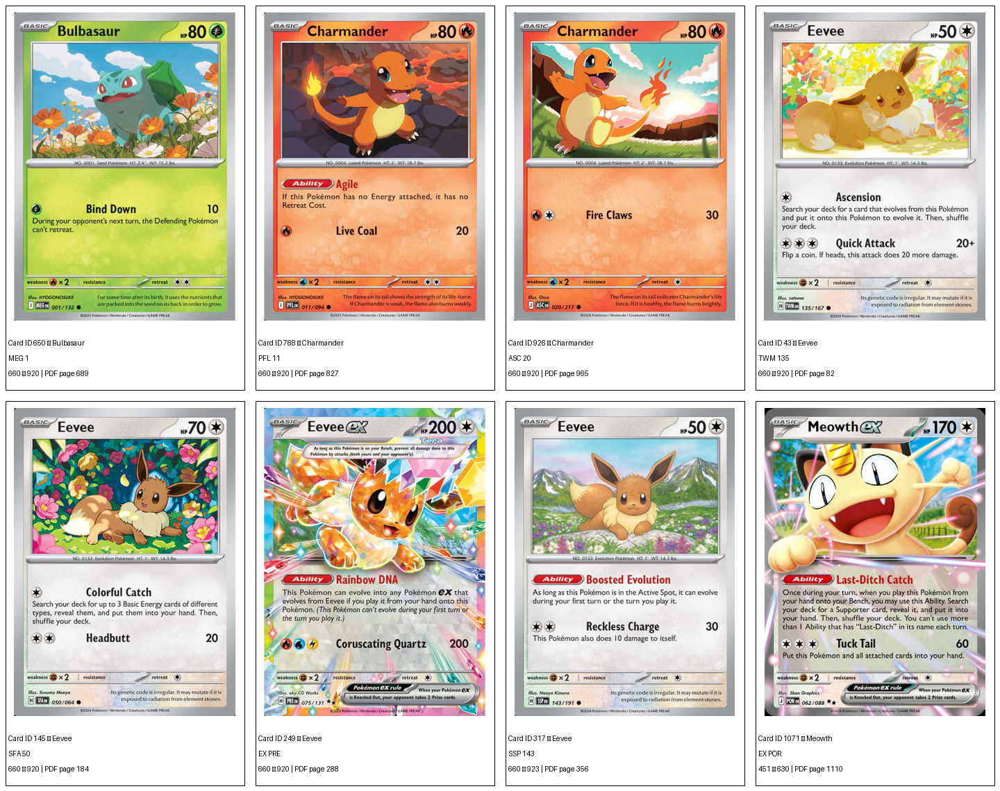


SECTION 4O VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,eight_images_verified,True,8,8
1,all_images_have_dimensions,True,8,8
2,contact_sheet_saved,True,1886502,> 0
3,image_hashes_unique,True,8,8
4,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4O SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : OFFICIAL_CARD_IMAGE_VISUAL_INVENTORY_COMPLETE
images_verified                                     : 8
images_ready_for_visual_review                      : 8
images_not_ready_for_visual_review                  : 0
cards_ready_for_visual_review                       : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
contact_sheet_file                                  : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_image_contact_sheet.png
image_details_extracted                             : False
ocr_performed                                       : False
tournament_move_sets_modified                       : False
frozen_benchmark_modified                           : False
safe_to_expand_actions                              : False
validation_checks_pa

In [23]:
# ======================================================================================
# SECTION 4O — OFFICIAL CARD IMAGE VISUAL INVENTORY
# ======================================================================================

print("=" * 100)
print("SECTION 4O — OFFICIAL CARD IMAGE VISUAL INVENTORY")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4N
# --------------------------------------------------------------------------------------

assert section4n_summary[
    "status"
] == "TARGETED_OFFICIAL_CARD_IMAGE_EXTRACTION_COMPLETE"

assert section4n_summary[
    "extraction_status"
] == "ALL_OFFICIAL_CANDIDATE_CARD_IMAGES_EXTRACTED"

assert section4n_summary[
    "images_saved"
] == 8

assert section4n_summary[
    "image_save_failures"
] == 0

assert section4n_summary[
    "duplicate_image_content_count"
] == 0

assert section4n_summary[
    "next_stage"
] == "OFFICIAL_CARD_IMAGE_DETAIL_EXTRACTION"


# --------------------------------------------------------------------------------------
# 2. Imports
# --------------------------------------------------------------------------------------

from PIL import Image, ImageOps, ImageDraw, ImageFont
from IPython.display import display as display_image


# --------------------------------------------------------------------------------------
# 3. Load and validate saved images
# --------------------------------------------------------------------------------------

section4o_image_rows = []


for _, image_row in section4n_saved_images_df.iterrows():

    image_path = Path(
        image_row[
            "saved_image_path"
        ]
    )

    image_opened = False
    image_format = ""
    image_mode = ""
    verified_width = np.nan
    verified_height = np.nan
    verification_error_type = ""
    verification_error_message = ""

    try:

        with Image.open(
            image_path
        ) as image_object:

            image_object.verify()

        with Image.open(
            image_path
        ) as image_object:

            image_opened = True

            image_format = str(
                image_object.format or ""
            )

            image_mode = str(
                image_object.mode
            )

            verified_width = int(
                image_object.width
            )

            verified_height = int(
                image_object.height
            )

    except Exception as error:

        verification_error_type = type(
            error
        ).__name__

        verification_error_message = str(
            error
        )

    section4o_image_rows.append(
        {
            "card_id":
                int(
                    image_row[
                        "card_id"
                    ]
                ),

            "card_name":
                str(
                    image_row[
                        "card_name"
                    ]
                ),

            "expansion":
                str(
                    image_row[
                        "expansion"
                    ]
                ),

            "collection_number":
                str(
                    image_row[
                        "collection_number"
                    ]
                ),

            "destination_page_number":
                int(
                    image_row[
                        "destination_page_number"
                    ]
                ),

            "image_path":
                str(
                    image_path
                ),

            "image_opened":
                bool(
                    image_opened
                ),

            "image_format":
                image_format,

            "image_mode":
                image_mode,

            "verified_width":
                verified_width,

            "verified_height":
                verified_height,

            "verified_pixel_area":
                (
                    int(
                        verified_width
                    )
                    *
                    int(
                        verified_height
                    )
                    if (
                        pd.notna(
                            verified_width
                        )
                        and pd.notna(
                            verified_height
                        )
                    )
                    else 0
                ),

            "verification_error_type":
                verification_error_type,

            "verification_error_message":
                verification_error_message,

            "sha256":
                image_row[
                    "sha256"
                ],
        }
    )


section4o_verified_images_df = pd.DataFrame(
    section4o_image_rows
)


print()
print("VERIFIED OFFICIAL CARD IMAGES")
print("-" * 100)

display(
    section4o_verified_images_df
)


assert section4o_verified_images_df[
    "image_opened"
].all()


# --------------------------------------------------------------------------------------
# 4. Contact-sheet configuration
# --------------------------------------------------------------------------------------

CONTACT_SHEET_COLUMNS = 4

CARD_PANEL_WIDTH = 360
CARD_PANEL_HEIGHT = 570

LABEL_HEIGHT = 90

IMAGE_MARGIN = 18
PANEL_MARGIN = 16

CONTACT_SHEET_ROWS = int(
    np.ceil(
        len(
            section4o_verified_images_df
        )
        /
        CONTACT_SHEET_COLUMNS
    )
)

CONTACT_SHEET_WIDTH = (
    CONTACT_SHEET_COLUMNS
    *
    CARD_PANEL_WIDTH
)

CONTACT_SHEET_HEIGHT = (
    CONTACT_SHEET_ROWS
    *
    CARD_PANEL_HEIGHT
)


section4o_contact_sheet = Image.new(
    "RGB",
    (
        CONTACT_SHEET_WIDTH,
        CONTACT_SHEET_HEIGHT,
    ),
    "white",
)


# --------------------------------------------------------------------------------------
# 5. Draw each candidate image
# --------------------------------------------------------------------------------------

for candidate_index, candidate_row in (
    section4o_verified_images_df
    .sort_values(
        [
            "card_name",
            "card_id",
        ]
    )
    .reset_index(
        drop=True
    )
    .iterrows()
):

    grid_row = (
        candidate_index
        //
        CONTACT_SHEET_COLUMNS
    )

    grid_column = (
        candidate_index
        %
        CONTACT_SHEET_COLUMNS
    )

    panel_x = (
        grid_column
        *
        CARD_PANEL_WIDTH
    )

    panel_y = (
        grid_row
        *
        CARD_PANEL_HEIGHT
    )

    image_path = Path(
        candidate_row[
            "image_path"
        ]
    )

    with Image.open(
        image_path
    ) as source_image:

        source_image = source_image.convert(
            "RGB"
        )

        available_image_width = (
            CARD_PANEL_WIDTH
            -
            2
            *
            IMAGE_MARGIN
        )

        available_image_height = (
            CARD_PANEL_HEIGHT
            -
            LABEL_HEIGHT
            -
            2
            *
            IMAGE_MARGIN
        )

        fitted_image = ImageOps.contain(
            source_image,
            (
                available_image_width,
                available_image_height,
            ),
        )

    image_x = (
        panel_x
        +
        (
            CARD_PANEL_WIDTH
            -
            fitted_image.width
        )
        //
        2
    )

    image_y = (
        panel_y
        +
        IMAGE_MARGIN
    )

    section4o_contact_sheet.paste(
        fitted_image,
        (
            image_x,
            image_y,
        ),
    )

    panel_draw = ImageDraw.Draw(
        section4o_contact_sheet
    )

    label_y = (
        panel_y
        +
        CARD_PANEL_HEIGHT
        -
        LABEL_HEIGHT
    )

    label_lines = [
        (
            f"Card ID {candidate_row['card_id']} — "
            f"{candidate_row['card_name']}"
        ),
        (
            f"{candidate_row['expansion']} "
            f"{candidate_row['collection_number']}"
        ),
        (
            f"{int(candidate_row['verified_width'])} × "
            f"{int(candidate_row['verified_height'])} | "
            f"PDF page {candidate_row['destination_page_number']}"
        ),
    ]

    current_text_y = label_y + 8

    for label_line in label_lines:

        panel_draw.text(
            (
                panel_x + 12,
                current_text_y,
            ),
            label_line,
            fill="black",
        )

        current_text_y += 22

    panel_draw.rectangle(
        [
            panel_x + PANEL_MARGIN // 2,
            panel_y + PANEL_MARGIN // 2,
            panel_x + CARD_PANEL_WIDTH - PANEL_MARGIN // 2,
            panel_y + CARD_PANEL_HEIGHT - PANEL_MARGIN // 2,
        ],
        outline="black",
        width=1,
    )


# --------------------------------------------------------------------------------------
# 6. Save and display contact sheet
# --------------------------------------------------------------------------------------

SECTION4O_CONTACT_SHEET_FILE = (
    SECTION4_REPORT_DIR
    / "section4o_official_card_image_contact_sheet.png"
)


section4o_contact_sheet.save(
    SECTION4O_CONTACT_SHEET_FILE,
    format="PNG",
)


assert SECTION4O_CONTACT_SHEET_FILE.exists()
assert SECTION4O_CONTACT_SHEET_FILE.stat().st_size > 0


print()
print("OFFICIAL CARD IMAGE CONTACT SHEET")
print("-" * 100)

display_image(
    section4o_contact_sheet
)


# --------------------------------------------------------------------------------------
# 7. Visual-readiness checks
# --------------------------------------------------------------------------------------

section4o_verified_images_df[
    "portrait_or_square"
] = (
    section4o_verified_images_df[
        "verified_height"
    ]
    >=
    section4o_verified_images_df[
        "verified_width"
    ]
)


section4o_verified_images_df[
    "minimum_readable_dimensions"
] = (
    section4o_verified_images_df[
        "verified_width"
    ].ge(
        300
    )
    &
    section4o_verified_images_df[
        "verified_height"
    ].ge(
        400
    )
)


section4o_verified_images_df[
    "ready_for_detail_review"
] = (
    section4o_verified_images_df[
        "image_opened"
    ]
    &
    section4o_verified_images_df[
        "portrait_or_square"
    ]
    &
    section4o_verified_images_df[
        "minimum_readable_dimensions"
    ]
)


cards_ready_for_visual_review = sorted(
    section4o_verified_images_df.loc[
        section4o_verified_images_df[
            "ready_for_detail_review"
        ],
        "card_name",
    ].unique().tolist()
)

images_ready_for_visual_review = int(
    section4o_verified_images_df[
        "ready_for_detail_review"
    ].sum()
)

images_not_ready_for_visual_review = int(
    (
        ~section4o_verified_images_df[
            "ready_for_detail_review"
        ]
    ).sum()
)


# --------------------------------------------------------------------------------------
# 8. Validation checks
# --------------------------------------------------------------------------------------

section4o_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "eight_images_verified",

            "passed":
                len(
                    section4o_verified_images_df
                ) == 8
                and section4o_verified_images_df[
                    "image_opened"
                ].all(),

            "value":
                int(
                    section4o_verified_images_df[
                        "image_opened"
                    ].sum()
                ),

            "expected":
                8,
        },
        {
            "check":
                "all_images_have_dimensions",

            "passed":
                section4o_verified_images_df[
                    "verified_width"
                ].notna().all()
                and section4o_verified_images_df[
                    "verified_height"
                ].notna().all(),

            "value":
                int(
                    section4o_verified_images_df[
                        "verified_width"
                    ].notna().sum()
                ),

            "expected":
                8,
        },
        {
            "check":
                "contact_sheet_saved",

            "passed":
                SECTION4O_CONTACT_SHEET_FILE.exists()
                and SECTION4O_CONTACT_SHEET_FILE.stat().st_size > 0,

            "value":
                int(
                    SECTION4O_CONTACT_SHEET_FILE.stat().st_size
                ),

            "expected":
                "> 0",
        },
        {
            "check":
                "image_hashes_unique",

            "passed":
                section4o_verified_images_df[
                    "sha256"
                ].nunique()
                ==
                len(
                    section4o_verified_images_df
                ),

            "value":
                int(
                    section4o_verified_images_df[
                        "sha256"
                    ].nunique()
                ),

            "expected":
                8,
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                len(
                    notebook53_replay_battles_df
                ) == 24
                and len(
                    notebook53_policy_history_df
                ) == 210,

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles":
                        24,

                    "decisions":
                        210,
                },
        },
    ]
)


print()
print("SECTION 4O VALIDATION CHECKS")
print("-" * 100)

display(
    section4o_validation_checks_df
)


assert section4o_validation_checks_df[
    "passed"
].all()


# --------------------------------------------------------------------------------------
# 9. Save reports
# --------------------------------------------------------------------------------------

SECTION4O_VERIFIED_IMAGES_FILE = (
    SECTION4_REPORT_DIR
    / "section4o_verified_official_card_images.csv"
)

SECTION4O_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4o_validation_checks.csv"
)

SECTION4O_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4o_official_card_image_visual_inventory_summary.json"
)


prepare_section4b_export(
    section4o_verified_images_df
).to_csv(
    SECTION4O_VERIFIED_IMAGES_FILE,
    index=False,
)

section4o_validation_checks_df.to_csv(
    SECTION4O_VALIDATION_CHECKS_FILE,
    index=False,
)


section4o_summary = {
    "status":
        "OFFICIAL_CARD_IMAGE_VISUAL_INVENTORY_COMPLETE",

    "images_verified":
        int(
            len(
                section4o_verified_images_df
            )
        ),

    "images_ready_for_visual_review":
        images_ready_for_visual_review,

    "images_not_ready_for_visual_review":
        images_not_ready_for_visual_review,

    "cards_ready_for_visual_review":
        cards_ready_for_visual_review,

    "contact_sheet_file":
        str(
            SECTION4O_CONTACT_SHEET_FILE
        ),

    "image_details_extracted":
        False,

    "ocr_performed":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        False,

    "validation_checks_passed":
        int(
            section4o_validation_checks_df[
                "passed"
            ].sum()
        ),

    "validation_checks_failed":
        int(
            (
                ~section4o_validation_checks_df[
                    "passed"
                ]
            ).sum()
        ),

    "next_stage":
        "MANUAL_CARD_IMAGE_DETAIL_REVIEW",
}


with open(
    SECTION4O_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4o_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


print()
print("SECTION 4O SUMMARY")
print("-" * 100)

for key, value in section4o_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4O REPORTS")
print("-" * 100)

print(
    SECTION4O_VERIFIED_IMAGES_FILE
)

print(
    SECTION4O_CONTACT_SHEET_FILE
)

print(
    SECTION4O_VALIDATION_CHECKS_FILE
)

print(
    SECTION4O_SUMMARY_FILE
)


print()
print(
    "✅ SECTION 4O OFFICIAL CARD IMAGE VISUAL INVENTORY PASSED"
)

## Section 4P — Manual Official Card Image Detail Review

### Section 4O confirmed that all eight official candidate card images are complete and readable.

#### This section manually transcribes only information visibly supported by the extracted official images:

- printed card name,
- Pokémon ex status,
- HP,
- abilities,
- attacks,
- printed damage,
- visible attack energy-symbol count,
- weakness,
- retreat-symbol count,
- official Card ID and expansion information.

##### The manually transcribed attack profiles are then compared with the frozen simulator move profiles.

###### No OCR is used. No additional attacks are inferred. `Pass` is treated as a simulator control action rather than a printed Pokémon attack. No tournament action set or benchmark record is modified.

In [24]:
# ======================================================================================
# SECTION 4P — MANUAL OFFICIAL CARD IMAGE DETAIL REVIEW
# ======================================================================================

print("=" * 100)
print("SECTION 4P — MANUAL OFFICIAL CARD IMAGE DETAIL REVIEW")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4O readiness
# --------------------------------------------------------------------------------------

assert section4o_summary[
    "status"
] == "OFFICIAL_CARD_IMAGE_VISUAL_INVENTORY_COMPLETE"

assert section4o_summary[
    "images_verified"
] == 8

assert section4o_summary[
    "images_ready_for_visual_review"
] == 8

assert section4o_summary[
    "images_not_ready_for_visual_review"
] == 0

assert section4o_summary[
    "image_details_extracted"
] is False

assert section4o_summary[
    "ocr_performed"
] is False

assert section4o_summary[
    "next_stage"
] == "MANUAL_CARD_IMAGE_DETAIL_REVIEW"


# --------------------------------------------------------------------------------------
# 2. Manual transcription provenance
# --------------------------------------------------------------------------------------

MANUAL_REVIEW_SOURCE = str(
    SECTION4O_CONTACT_SHEET_FILE
)

MANUAL_REVIEW_METHOD = (
    "HUMAN_VISUAL_TRANSCRIPTION_FROM_OFFICIAL_EXTRACTED_CARD_IMAGES"
)

SIMULATOR_CONTROL_ACTIONS = {
    "Pass",
}


# --------------------------------------------------------------------------------------
# 3. Manually transcribed card-level visual profiles
# --------------------------------------------------------------------------------------

manual_card_profile_rows = [
    {
        "card_id": 650,
        "card_name": "Bulbasaur",
        "printed_card_name": "Bulbasaur",
        "expansion": "MEG",
        "collection_number": "1",
        "stage": "Basic",
        "is_pokemon_ex": False,
        "hp": 80,
        "pokemon_type": "Grass",
        "ability_names": [],
        "attack_names": ["Bind Down"],
        "weakness_type": "Fire",
        "weakness_multiplier": "×2",
        "retreat_cost_symbols": 2,
        "manual_review_notes": (
            "Printed attack Bind Down deals 10 damage and prevents retreat "
            "during the opponent's next turn."
        ),
    },
    {
        "card_id": 788,
        "card_name": "Charmander",
        "printed_card_name": "Charmander",
        "expansion": "PFL",
        "collection_number": "11",
        "stage": "Basic",
        "is_pokemon_ex": False,
        "hp": 80,
        "pokemon_type": "Fire",
        "ability_names": ["Agile"],
        "attack_names": ["Live Coal"],
        "weakness_type": "Water",
        "weakness_multiplier": "×2",
        "retreat_cost_symbols": 2,
        "manual_review_notes": (
            "Ability Agile removes Retreat Cost when no Energy is attached. "
            "Printed attack Live Coal deals 20 damage."
        ),
    },
    {
        "card_id": 926,
        "card_name": "Charmander",
        "printed_card_name": "Charmander",
        "expansion": "ASC",
        "collection_number": "20",
        "stage": "Basic",
        "is_pokemon_ex": False,
        "hp": 80,
        "pokemon_type": "Fire",
        "ability_names": [],
        "attack_names": ["Fire Claws"],
        "weakness_type": "Water",
        "weakness_multiplier": "×2",
        "retreat_cost_symbols": 1,
        "manual_review_notes": (
            "Printed attack Fire Claws deals 30 damage."
        ),
    },
    {
        "card_id": 43,
        "card_name": "Eevee",
        "printed_card_name": "Eevee",
        "expansion": "TWM",
        "collection_number": "135",
        "stage": "Basic",
        "is_pokemon_ex": False,
        "hp": 50,
        "pokemon_type": "Colorless",
        "ability_names": [],
        "attack_names": ["Ascension", "Quick Attack"],
        "weakness_type": "Fighting",
        "weakness_multiplier": "×2",
        "retreat_cost_symbols": 1,
        "manual_review_notes": (
            "Ascension searches for an Evolution card. "
            "Quick Attack deals 20 damage plus 20 more on a successful coin flip."
        ),
    },
    {
        "card_id": 145,
        "card_name": "Eevee",
        "printed_card_name": "Eevee",
        "expansion": "SFA",
        "collection_number": "50",
        "stage": "Basic",
        "is_pokemon_ex": False,
        "hp": 70,
        "pokemon_type": "Colorless",
        "ability_names": [],
        "attack_names": ["Colorful Catch", "Headbutt"],
        "weakness_type": "Fighting",
        "weakness_multiplier": "×2",
        "retreat_cost_symbols": 1,
        "manual_review_notes": (
            "Colorful Catch searches for up to three Basic Energy cards "
            "of different types. Headbutt deals 20 damage."
        ),
    },
    {
        "card_id": 249,
        "card_name": "Eevee",
        "printed_card_name": "Eevee ex",
        "expansion": "PRE",
        "collection_number": "75",
        "stage": "Basic",
        "is_pokemon_ex": True,
        "hp": 200,
        "pokemon_type": "Colorless",
        "ability_names": ["Rainbow DNA"],
        "attack_names": ["Coruscating Quartz"],
        "weakness_type": "Fighting",
        "weakness_multiplier": "×2",
        "retreat_cost_symbols": 1,
        "manual_review_notes": (
            "Ability Rainbow DNA permits evolution into Pokémon ex that evolve "
            "from Eevee. Coruscating Quartz deals 200 damage."
        ),
    },
    {
        "card_id": 317,
        "card_name": "Eevee",
        "printed_card_name": "Eevee",
        "expansion": "SSP",
        "collection_number": "143",
        "stage": "Basic",
        "is_pokemon_ex": False,
        "hp": 50,
        "pokemon_type": "Colorless",
        "ability_names": ["Boosted Evolution"],
        "attack_names": ["Reckless Charge"],
        "weakness_type": "Fighting",
        "weakness_multiplier": "×2",
        "retreat_cost_symbols": 1,
        "manual_review_notes": (
            "Ability Boosted Evolution allows first-turn evolution while Active. "
            "Reckless Charge deals 30 damage and 10 self-damage."
        ),
    },
    {
        "card_id": 1071,
        "card_name": "Meowth",
        "printed_card_name": "Meowth ex",
        "expansion": "POR",
        "collection_number": "62",
        "stage": "Basic",
        "is_pokemon_ex": True,
        "hp": 170,
        "pokemon_type": "Colorless",
        "ability_names": ["Last-Ditch Catch"],
        "attack_names": ["Tuck Tail"],
        "weakness_type": "Fighting",
        "weakness_multiplier": "×2",
        "retreat_cost_symbols": 1,
        "manual_review_notes": (
            "Ability Last-Ditch Catch searches for a Supporter when played "
            "from hand onto the Bench. Tuck Tail deals 60 damage and returns "
            "Meowth ex and attached cards to the hand."
        ),
    },
]


section4p_card_visual_profile_df = pd.DataFrame(
    manual_card_profile_rows
)


section4p_card_visual_profile_df[
    "manual_review_source"
] = MANUAL_REVIEW_SOURCE

section4p_card_visual_profile_df[
    "manual_review_method"
] = MANUAL_REVIEW_METHOD

section4p_card_visual_profile_df[
    "ocr_used"
] = False


print()
print("MANUALLY TRANSCRIBED OFFICIAL CARD PROFILES")
print("-" * 100)

display(
    section4p_card_visual_profile_df[
        [
            "card_id",
            "printed_card_name",
            "expansion",
            "collection_number",
            "stage",
            "is_pokemon_ex",
            "hp",
            "pokemon_type",
            "ability_names",
            "attack_names",
            "weakness_type",
            "retreat_cost_symbols",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 4. Manually transcribed attack-level profiles
# --------------------------------------------------------------------------------------

manual_attack_profile_rows = [
    {
        "card_id": 650,
        "card_name": "Bulbasaur",
        "attack_order": 1,
        "attack_name": "Bind Down",
        "printed_damage": "10",
        "base_damage": 10,
        "variable_damage": False,
        "energy_symbol_count": 1,
        "attack_effect_summary": (
            "Defending Pokémon cannot retreat during the opponent's next turn."
        ),
    },
    {
        "card_id": 788,
        "card_name": "Charmander",
        "attack_order": 1,
        "attack_name": "Live Coal",
        "printed_damage": "20",
        "base_damage": 20,
        "variable_damage": False,
        "energy_symbol_count": 1,
        "attack_effect_summary": "",
    },
    {
        "card_id": 926,
        "card_name": "Charmander",
        "attack_order": 1,
        "attack_name": "Fire Claws",
        "printed_damage": "30",
        "base_damage": 30,
        "variable_damage": False,
        "energy_symbol_count": 2,
        "attack_effect_summary": "",
    },
    {
        "card_id": 43,
        "card_name": "Eevee",
        "attack_order": 1,
        "attack_name": "Ascension",
        "printed_damage": "",
        "base_damage": 0,
        "variable_damage": False,
        "energy_symbol_count": 1,
        "attack_effect_summary": (
            "Search the deck for a card that evolves from this Pokémon "
            "and evolve it."
        ),
    },
    {
        "card_id": 43,
        "card_name": "Eevee",
        "attack_order": 2,
        "attack_name": "Quick Attack",
        "printed_damage": "20+",
        "base_damage": 20,
        "variable_damage": True,
        "energy_symbol_count": 3,
        "attack_effect_summary": (
            "Coin flip may add 20 damage."
        ),
    },
    {
        "card_id": 145,
        "card_name": "Eevee",
        "attack_order": 1,
        "attack_name": "Colorful Catch",
        "printed_damage": "",
        "base_damage": 0,
        "variable_damage": False,
        "energy_symbol_count": 1,
        "attack_effect_summary": (
            "Search for up to three Basic Energy cards of different types."
        ),
    },
    {
        "card_id": 145,
        "card_name": "Eevee",
        "attack_order": 2,
        "attack_name": "Headbutt",
        "printed_damage": "20",
        "base_damage": 20,
        "variable_damage": False,
        "energy_symbol_count": 2,
        "attack_effect_summary": "",
    },
    {
        "card_id": 249,
        "card_name": "Eevee",
        "attack_order": 1,
        "attack_name": "Coruscating Quartz",
        "printed_damage": "200",
        "base_damage": 200,
        "variable_damage": False,
        "energy_symbol_count": 3,
        "attack_effect_summary": "",
    },
    {
        "card_id": 317,
        "card_name": "Eevee",
        "attack_order": 1,
        "attack_name": "Reckless Charge",
        "printed_damage": "30",
        "base_damage": 30,
        "variable_damage": False,
        "energy_symbol_count": 2,
        "attack_effect_summary": (
            "This Pokémon also does 10 damage to itself."
        ),
    },
    {
        "card_id": 1071,
        "card_name": "Meowth",
        "attack_order": 1,
        "attack_name": "Tuck Tail",
        "printed_damage": "60",
        "base_damage": 60,
        "variable_damage": False,
        "energy_symbol_count": 3,
        "attack_effect_summary": (
            "Return this Pokémon and all attached cards to the hand."
        ),
    },
]


section4p_attack_profile_df = pd.DataFrame(
    manual_attack_profile_rows
)


section4p_attack_profile_df[
    "normalized_attack_name"
] = (
    section4p_attack_profile_df[
        "attack_name"
    ]
    .map(
        normalize_action_name
    )
)


section4p_attack_profile_df[
    "manual_review_source"
] = MANUAL_REVIEW_SOURCE

section4p_attack_profile_df[
    "ocr_used"
] = False


print()
print("MANUALLY TRANSCRIBED ATTACK PROFILE")
print("-" * 100)

display(
    section4p_attack_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Build simulator attack profile
# --------------------------------------------------------------------------------------

simulator_attack_profile_rows = []


for _, simulator_row in (
    section4j_simulator_move_profile_df.iterrows()
):

    card_name = str(
        simulator_row[
            "card_name"
        ]
    )

    recovered_moves = [
        str(
            move_name
        ).strip()
        for move_name in simulator_row[
            "combined_recovered_moves"
        ]
        if str(
            move_name
        ).strip()
    ]

    printed_attack_comparison_moves = sorted(
        {
            move_name
            for move_name in recovered_moves
            if move_name not in SIMULATOR_CONTROL_ACTIONS
        }
    )

    control_actions = sorted(
        {
            move_name
            for move_name in recovered_moves
            if move_name in SIMULATOR_CONTROL_ACTIONS
        }
    )

    simulator_attack_profile_rows.append(
        {
            "card_name":
                card_name,

            "all_simulator_actions":
                sorted(
                    set(
                        recovered_moves
                    )
                ),

            "simulator_printed_attack_candidates":
                printed_attack_comparison_moves,

            "simulator_control_actions":
                control_actions,

            "printed_attack_candidate_count":
                int(
                    len(
                        printed_attack_comparison_moves
                    )
                ),
        }
    )


section4p_simulator_attack_profile_df = pd.DataFrame(
    simulator_attack_profile_rows
)


print()
print("SIMULATOR ATTACK COMPARISON PROFILE")
print("-" * 100)

display(
    section4p_simulator_attack_profile_df
)


# --------------------------------------------------------------------------------------
# 6. Compare each official candidate with the simulator
# --------------------------------------------------------------------------------------

candidate_match_rows = []


for _, card_row in (
    section4p_card_visual_profile_df.iterrows()
):

    card_id = int(
        card_row[
            "card_id"
        ]
    )

    card_name = str(
        card_row[
            "card_name"
        ]
    )

    printed_attacks = sorted(
        {
            str(
                attack_name
            ).strip()
            for attack_name in card_row[
                "attack_names"
            ]
            if str(
                attack_name
            ).strip()
        }
    )

    simulator_row = (
        section4p_simulator_attack_profile_df.loc[
            section4p_simulator_attack_profile_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        .iloc[
            0
        ]
    )

    simulator_attacks = sorted(
        {
            str(
                attack_name
            ).strip()
            for attack_name in simulator_row[
                "simulator_printed_attack_candidates"
            ]
            if str(
                attack_name
            ).strip()
        }
    )

    normalized_printed_attacks = {
        normalize_action_name(
            attack_name
        )
        for attack_name in printed_attacks
    }

    normalized_simulator_attacks = {
        normalize_action_name(
            attack_name
        )
        for attack_name in simulator_attacks
    }

    matched_normalized_attacks = (
        normalized_printed_attacks
        &
        normalized_simulator_attacks
    )

    missing_simulator_attacks = (
        normalized_simulator_attacks
        -
        normalized_printed_attacks
    )

    additional_printed_attacks = (
        normalized_printed_attacks
        -
        normalized_simulator_attacks
    )

    matched_attack_count = len(
        matched_normalized_attacks
    )

    simulator_attack_count = len(
        normalized_simulator_attacks
    )

    printed_attack_count = len(
        normalized_printed_attacks
    )

    simulator_attack_recall = (
        matched_attack_count
        /
        simulator_attack_count
        if simulator_attack_count > 0
        else 0.0
    )

    printed_attack_precision = (
        matched_attack_count
        /
        printed_attack_count
        if printed_attack_count > 0
        else 0.0
    )

    exact_attack_set_match = (
        normalized_printed_attacks
        ==
        normalized_simulator_attacks
        and simulator_attack_count > 0
    )

    if exact_attack_set_match:

        attack_match_classification = (
            "EXACT_ATTACK_SET_MATCH"
        )

    elif (
        matched_attack_count > 0
        and not missing_simulator_attacks
    ):

        attack_match_classification = (
            "SIMULATOR_ATTACKS_SUBSET_OF_CARD"
        )

    elif matched_attack_count > 0:

        attack_match_classification = (
            "PARTIAL_ATTACK_MATCH"
        )

    else:

        attack_match_classification = (
            "NO_ATTACK_MATCH"
        )

    # Evidence score based only on support available in the current project.
    attack_recall_points = (
        simulator_attack_recall
        *
        70.0
    )

    attack_precision_points = (
        printed_attack_precision
        *
        20.0
    )

    exact_set_bonus = (
        10.0
        if exact_attack_set_match
        else 0.0
    )

    evidence_score = round(
        min(
            attack_recall_points
            +
            attack_precision_points
            +
            exact_set_bonus,
            100.0,
        ),
        2,
    )

    candidate_match_rows.append(
        {
            "card_id":
                card_id,

            "card_name":
                card_name,

            "printed_card_name":
                card_row[
                    "printed_card_name"
                ],

            "expansion":
                card_row[
                    "expansion"
                ],

            "collection_number":
                card_row[
                    "collection_number"
                ],

            "is_pokemon_ex":
                bool(
                    card_row[
                        "is_pokemon_ex"
                    ]
                ),

            "hp":
                int(
                    card_row[
                        "hp"
                    ]
                ),

            "printed_attacks":
                printed_attacks,

            "simulator_attacks":
                simulator_attacks,

            "matched_attacks":
                sorted(
                    matched_normalized_attacks
                ),

            "missing_simulator_attacks":
                sorted(
                    missing_simulator_attacks
                ),

            "additional_printed_attacks":
                sorted(
                    additional_printed_attacks
                ),

            "matched_attack_count":
                int(
                    matched_attack_count
                ),

            "simulator_attack_count":
                int(
                    simulator_attack_count
                ),

            "printed_attack_count":
                int(
                    printed_attack_count
                ),

            "simulator_attack_recall":
                float(
                    simulator_attack_recall
                ),

            "printed_attack_precision":
                float(
                    printed_attack_precision
                ),

            "exact_attack_set_match":
                bool(
                    exact_attack_set_match
                ),

            "attack_match_classification":
                attack_match_classification,

            "evidence_score":
                float(
                    evidence_score
                ),

            "source_confirmed_exact_version":
                bool(
                    exact_attack_set_match
                ),
        }
    )


section4p_simulator_match_df = pd.DataFrame(
    candidate_match_rows
)


section4p_simulator_match_df = (
    section4p_simulator_match_df
    .sort_values(
        [
            "card_name",
            "evidence_score",
            "card_id",
        ],
        ascending=[
            True,
            False,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("OFFICIAL CARD VS SIMULATOR ATTACK MATCHING")
print("-" * 100)

display(
    section4p_simulator_match_df
)


# --------------------------------------------------------------------------------------
# 7. Rank official candidates within each Pokémon name
# --------------------------------------------------------------------------------------

section4p_version_confidence_df = (
    section4p_simulator_match_df.copy()
)


section4p_version_confidence_df[
    "candidate_rank"
] = (
    section4p_version_confidence_df
    .groupby(
        "card_name",
        observed=False,
    )[
        "evidence_score"
    ]
    .rank(
        method="min",
        ascending=False,
    )
    .astype(int)
)


section4p_version_confidence_df[
    "top_candidate"
] = (
    section4p_version_confidence_df[
        "candidate_rank"
    ].eq(
        1
    )
)


top_score_count_lookup = (
    section4p_version_confidence_df.loc[
        section4p_version_confidence_df[
            "top_candidate"
        ]
    ]
    .groupby(
        "card_name",
        observed=False,
    )[
        "card_id"
    ]
    .size()
    .to_dict()
)


section4p_version_confidence_df[
    "top_candidate_is_unique"
] = (
    section4p_version_confidence_df.apply(
        lambda row: (
            bool(
                row[
                    "top_candidate"
                ]
            )
            and top_score_count_lookup.get(
                row[
                    "card_name"
                ],
                0,
            ) == 1
        ),
        axis=1,
    )
)


section4p_version_confidence_df[
    "version_resolution_status"
] = np.select(
    [
        (
            section4p_version_confidence_df[
                "exact_attack_set_match"
            ]
            &
            section4p_version_confidence_df[
                "top_candidate_is_unique"
            ]
        ),
        (
            section4p_version_confidence_df[
                "top_candidate_is_unique"
            ]
            &
            section4p_version_confidence_df[
                "matched_attack_count"
            ].gt(
                0
            )
        ),
        section4p_version_confidence_df[
            "top_candidate"
        ],
    ],
    [
        "UNIQUE_EXACT_ATTACK_PROFILE_MATCH",
        "UNIQUE_PARTIAL_ATTACK_PROFILE_MATCH",
        "TIED_OR_UNCONFIRMED_TOP_CANDIDATE",
    ],
    default="NONLEADING_CANDIDATE",
)


print()
print("OFFICIAL VERSION EVIDENCE RANKING")
print("-" * 100)

display(
    section4p_version_confidence_df[
        [
            "card_name",
            "card_id",
            "printed_card_name",
            "printed_attacks",
            "simulator_attacks",
            "attack_match_classification",
            "evidence_score",
            "candidate_rank",
            "top_candidate_is_unique",
            "version_resolution_status",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 8. Resolve leading candidate for each Pokémon
# --------------------------------------------------------------------------------------

leading_version_rows = []


for card_name in TARGET_CARD_NAMES:

    card_candidates_df = (
        section4p_version_confidence_df.loc[
            section4p_version_confidence_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        .copy()
        .sort_values(
            [
                "candidate_rank",
                "evidence_score",
                "card_id",
            ],
            ascending=[
                True,
                False,
                True,
            ],
        )
        .reset_index(
            drop=True
        )
    )

    leading_candidate = card_candidates_df.iloc[
        0
    ]

    leading_version_rows.append(
        {
            "card_name":
                card_name,

            "leading_card_id":
                int(
                    leading_candidate[
                        "card_id"
                    ]
                ),

            "leading_printed_card_name":
                leading_candidate[
                    "printed_card_name"
                ],

            "leading_expansion":
                leading_candidate[
                    "expansion"
                ],

            "leading_collection_number":
                leading_candidate[
                    "collection_number"
                ],

            "leading_hp":
                int(
                    leading_candidate[
                        "hp"
                    ]
                ),

            "leading_printed_attacks":
                leading_candidate[
                    "printed_attacks"
                ],

            "simulator_attacks":
                leading_candidate[
                    "simulator_attacks"
                ],

            "evidence_score":
                float(
                    leading_candidate[
                        "evidence_score"
                    ]
                ),

            "exact_attack_set_match":
                bool(
                    leading_candidate[
                        "exact_attack_set_match"
                    ]
                ),

            "top_candidate_is_unique":
                bool(
                    leading_candidate[
                        "top_candidate_is_unique"
                    ]
                ),

            "version_resolution_status":
                leading_candidate[
                    "version_resolution_status"
                ],
        }
    )


section4p_leading_versions_df = pd.DataFrame(
    leading_version_rows
)


print()
print("LEADING OFFICIAL VERSION MATCHES")
print("-" * 100)

display(
    section4p_leading_versions_df
)


# --------------------------------------------------------------------------------------
# 9. Determine resolution outcome
# --------------------------------------------------------------------------------------

cards_with_unique_exact_attack_match = sorted(
    section4p_leading_versions_df.loc[
        section4p_leading_versions_df[
            "version_resolution_status"
        ].eq(
            "UNIQUE_EXACT_ATTACK_PROFILE_MATCH"
        ),
        "card_name",
    ].tolist()
)

cards_with_unique_partial_attack_match = sorted(
    section4p_leading_versions_df.loc[
        section4p_leading_versions_df[
            "version_resolution_status"
        ].eq(
            "UNIQUE_PARTIAL_ATTACK_PROFILE_MATCH"
        ),
        "card_name",
    ].tolist()
)

cards_without_resolved_version = sorted(
    section4p_leading_versions_df.loc[
        ~section4p_leading_versions_df[
            "version_resolution_status"
        ].isin(
            [
                "UNIQUE_EXACT_ATTACK_PROFILE_MATCH",
                "UNIQUE_PARTIAL_ATTACK_PROFILE_MATCH",
            ]
        ),
        "card_name",
    ].tolist()
)


all_cards_have_unique_exact_attack_match = (
    len(
        cards_with_unique_exact_attack_match
    )
    ==
    len(
        TARGET_CARD_NAMES
    )
)


if all_cards_have_unique_exact_attack_match:

    section4p_resolution_status = (
        "ALL_SIMULATOR_CARD_VERSIONS_ATTACK_CONFIRMED"
    )

    section4p_next_stage = (
        "VERIFIED_ACTION_CATALOG_CONSTRUCTION"
    )

elif cards_with_unique_exact_attack_match:

    section4p_resolution_status = (
        "PARTIAL_SIMULATOR_CARD_VERSION_CONFIRMATION"
    )

    section4p_next_stage = (
        "UNRESOLVED_CARD_PROFILE_ANALYSIS"
    )

else:

    section4p_resolution_status = (
        "SIMULATOR_CARD_VERSIONS_REMAIN_UNCONFIRMED"
    )

    section4p_next_stage = (
        "SIMULATOR_PROFILE_LIMITATION_SUMMARY"
    )


# --------------------------------------------------------------------------------------
# 10. Validation checks
# --------------------------------------------------------------------------------------

section4p_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_eight_card_images_reviewed",

            "passed":
                len(
                    section4p_card_visual_profile_df
                ) == 8,

            "value":
                len(
                    section4p_card_visual_profile_df
                ),

            "expected":
                8,
        },
        {
            "check":
                "all_cards_have_printed_attack_profiles",

            "passed":
                section4p_card_visual_profile_df[
                    "attack_names"
                ].map(
                    len
                ).gt(
                    0
                ).all(),

            "value":
                int(
                    section4p_card_visual_profile_df[
                        "attack_names"
                    ].map(
                        len
                    ).gt(
                        0
                    ).sum()
                ),

            "expected":
                8,
        },
        {
            "check":
                "attack_rows_reconcile",

            "passed":
                len(
                    section4p_attack_profile_df
                )
                ==
                int(
                    section4p_card_visual_profile_df[
                        "attack_names"
                    ].map(
                        len
                    ).sum()
                ),

            "value":
                len(
                    section4p_attack_profile_df
                ),

            "expected":
                int(
                    section4p_card_visual_profile_df[
                        "attack_names"
                    ].map(
                        len
                    ).sum()
                ),
        },
        {
            "check":
                "simulator_profile_covers_all_cards",

            "passed":
                set(
                    section4p_simulator_attack_profile_df[
                        "card_name"
                    ]
                )
                ==
                set(
                    TARGET_CARD_NAMES
                ),

            "value":
                sorted(
                    section4p_simulator_attack_profile_df[
                        "card_name"
                    ].tolist()
                ),

            "expected":
                sorted(
                    TARGET_CARD_NAMES
                ),
        },
        {
            "check":
                "candidate_matching_covers_all_images",

            "passed":
                len(
                    section4p_simulator_match_df
                ) == 8,

            "value":
                len(
                    section4p_simulator_match_df
                ),

            "expected":
                8,
        },
        {
            "check":
                "leading_summary_covers_all_cards",

            "passed":
                set(
                    section4p_leading_versions_df[
                        "card_name"
                    ]
                )
                ==
                set(
                    TARGET_CARD_NAMES
                ),

            "value":
                sorted(
                    section4p_leading_versions_df[
                        "card_name"
                    ].tolist()
                ),

            "expected":
                sorted(
                    TARGET_CARD_NAMES
                ),
        },
        {
            "check":
                "pass_excluded_from_printed_attack_matching",

            "passed":
                all(
                    "Pass"
                    not in attack_list
                    for attack_list in
                    section4p_simulator_attack_profile_df[
                        "simulator_printed_attack_candidates"
                    ]
                ),

            "value":
                True,

            "expected":
                True,
        },
        {
            "check":
                "ocr_not_used",

            "passed":
                not section4p_card_visual_profile_df[
                    "ocr_used"
                ].any(),

            "value":
                False,

            "expected":
                False,
        },
        {
            "check":
                "resolution_status_recognized",

            "passed":
                section4p_resolution_status
                in {
                    "ALL_SIMULATOR_CARD_VERSIONS_ATTACK_CONFIRMED",
                    "PARTIAL_SIMULATOR_CARD_VERSION_CONFIRMATION",
                    "SIMULATOR_CARD_VERSIONS_REMAIN_UNCONFIRMED",
                },

            "value":
                section4p_resolution_status,

            "expected":
                "Recognized resolution status",
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                len(
                    notebook53_replay_battles_df
                ) == 24
                and len(
                    notebook53_policy_history_df
                ) == 210,

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles": 24,
                    "decisions": 210,
                },
        },
    ]
)


print()
print("SECTION 4P VALIDATION CHECKS")
print("-" * 100)

display(
    section4p_validation_checks_df
)


section4p_checks_passed = int(
    section4p_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4p_checks_failed = int(
    (
        ~section4p_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4p_checks_failed == 0, (
    "One or more manual card-image detail review checks failed."
)


# --------------------------------------------------------------------------------------
# 11. Save reports
# --------------------------------------------------------------------------------------

SECTION4P_CARD_VISUAL_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4p_card_visual_profile.csv"
)

SECTION4P_ATTACK_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4p_attack_profile.csv"
)

SECTION4P_SIMULATOR_ATTACK_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4p_simulator_attack_profile.csv"
)

SECTION4P_SIMULATOR_MATCH_FILE = (
    SECTION4_REPORT_DIR
    / "section4p_simulator_match.csv"
)

SECTION4P_VERSION_CONFIDENCE_FILE = (
    SECTION4_REPORT_DIR
    / "section4p_version_confidence.csv"
)

SECTION4P_LEADING_VERSIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4p_leading_official_versions.csv"
)

SECTION4P_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4p_validation_checks.csv"
)

SECTION4P_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4p_card_visual_summary.json"
)


prepare_section4b_export(
    section4p_card_visual_profile_df
).to_csv(
    SECTION4P_CARD_VISUAL_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4p_attack_profile_df
).to_csv(
    SECTION4P_ATTACK_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4p_simulator_attack_profile_df
).to_csv(
    SECTION4P_SIMULATOR_ATTACK_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4p_simulator_match_df
).to_csv(
    SECTION4P_SIMULATOR_MATCH_FILE,
    index=False,
)

prepare_section4b_export(
    section4p_version_confidence_df
).to_csv(
    SECTION4P_VERSION_CONFIDENCE_FILE,
    index=False,
)

prepare_section4b_export(
    section4p_leading_versions_df
).to_csv(
    SECTION4P_LEADING_VERSIONS_FILE,
    index=False,
)

section4p_validation_checks_df.to_csv(
    SECTION4P_VALIDATION_CHECKS_FILE,
    index=False,
)


section4p_summary = {
    "status":
        "MANUAL_CARD_IMAGE_DETAIL_REVIEW_COMPLETE",

    "official_candidate_cards_reviewed":
        int(
            len(
                section4p_card_visual_profile_df
            )
        ),

    "printed_attacks_transcribed":
        int(
            len(
                section4p_attack_profile_df
            )
        ),

    "cards_with_unique_exact_attack_match":
        cards_with_unique_exact_attack_match,

    "cards_with_unique_partial_attack_match":
        cards_with_unique_partial_attack_match,

    "cards_without_resolved_version":
        cards_without_resolved_version,

    "all_cards_have_unique_exact_attack_match":
        bool(
            all_cards_have_unique_exact_attack_match
        ),

    "resolution_status":
        section4p_resolution_status,

    "manual_review_source":
        MANUAL_REVIEW_SOURCE,

    "manual_review_method":
        MANUAL_REVIEW_METHOD,

    "ocr_performed":
        False,

    "pass_treated_as_printed_attack":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_expand_actions":
        bool(
            all_cards_have_unique_exact_attack_match
        ),

    "validation_checks_passed":
        section4p_checks_passed,

    "validation_checks_failed":
        section4p_checks_failed,

    "next_stage":
        section4p_next_stage,
}


with open(
    SECTION4P_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4p_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4p_saved_files = [
    SECTION4P_CARD_VISUAL_PROFILE_FILE,
    SECTION4P_ATTACK_PROFILE_FILE,
    SECTION4P_SIMULATOR_ATTACK_PROFILE_FILE,
    SECTION4P_SIMULATOR_MATCH_FILE,
    SECTION4P_VERSION_CONFIDENCE_FILE,
    SECTION4P_LEADING_VERSIONS_FILE,
    SECTION4P_VALIDATION_CHECKS_FILE,
    SECTION4P_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4p_saved_files
)


# --------------------------------------------------------------------------------------
# 12. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4P SUMMARY")
print("-" * 100)

for key, value in section4p_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4P REPORTS")
print("-" * 100)

for file_path in section4p_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4P MANUAL OFFICIAL CARD IMAGE DETAIL REVIEW PASSED"
)

SECTION 4P — MANUAL OFFICIAL CARD IMAGE DETAIL REVIEW

MANUALLY TRANSCRIBED OFFICIAL CARD PROFILES
----------------------------------------------------------------------------------------------------


,card_id,printed_card_name,expansion,collection_number,stage,is_pokemon_ex,hp,pokemon_type,ability_names,attack_names,weakness_type,retreat_cost_symbols
0,650,Bulbasaur,MEG,1,Basic,False,80,Grass,[],[Bind Down],Fire,2
1,788,Charmander,PFL,11,Basic,False,80,Fire,[Agile],[Live Coal],Water,2
2,926,Charmander,ASC,20,Basic,False,80,Fire,[],[Fire Claws],Water,1
3,43,Eevee,TWM,135,Basic,False,50,Colorless,[],"[Ascension, Quick Attack]",Fighting,1
4,145,Eevee,SFA,50,Basic,False,70,Colorless,[],"[Colorful Catch, Headbutt]",Fighting,1
5,249,Eevee ex,PRE,75,Basic,True,200,Colorless,[Rainbow DNA],[Coruscating Quartz],Fighting,1
6,317,Eevee,SSP,143,Basic,False,50,Colorless,[Boosted Evolution],[Reckless Charge],Fighting,1
7,1071,Meowth ex,POR,62,Basic,True,170,Colorless,[Last-Ditch Catch],[Tuck Tail],Fighting,1



MANUALLY TRANSCRIBED ATTACK PROFILE
----------------------------------------------------------------------------------------------------


,card_id,card_name,attack_order,attack_name,printed_damage,base_damage,variable_damage,energy_symbol_count,attack_effect_summary,normalized_attack_name,manual_review_source,ocr_used
0,650,Bulbasaur,1,Bind Down,10,10,False,1,Defending Pokémon cannot retreat during the opponent's next turn.,bind down,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
1,788,Charmander,1,Live Coal,20,20,False,1,,live coal,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
2,926,Charmander,1,Fire Claws,30,30,False,2,,fire claws,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
3,43,Eevee,1,Ascension,,0,False,1,Search the deck for a card that evolves from this Pokémon and evolve it.,ascension,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
4,43,Eevee,2,Quick Attack,20+,20,True,3,Coin flip may add 20 damage.,quick attack,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
5,145,Eevee,1,Colorful Catch,,0,False,1,Search for up to three Basic Energy cards of different types.,colorful catch,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
6,145,Eevee,2,Headbutt,20,20,False,2,,headbutt,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
7,249,Eevee,1,Coruscating Quartz,200,200,False,3,,coruscating quartz,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
8,317,Eevee,1,Reckless Charge,30,30,False,2,This Pokémon also does 10 damage to itself.,reckless charge,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False
9,1071,Meowth,1,Tuck Tail,60,60,False,3,Return this Pokémon and all attached cards to the hand.,tuck tail,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_imag...,False



SIMULATOR ATTACK COMPARISON PROFILE
----------------------------------------------------------------------------------------------------


,card_name,all_simulator_actions,simulator_printed_attack_candidates,simulator_control_actions,printed_attack_candidate_count
0,Bulbasaur,"[Bind Down, Pass]",[Bind Down],[Pass],1
1,Charmander,"[Live Coal, Pass]",[Live Coal],[Pass],1
2,Eevee,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",[],2
3,Meowth,[Tuck Tail],[Tuck Tail],[],1



OFFICIAL CARD VS SIMULATOR ATTACK MATCHING
----------------------------------------------------------------------------------------------------


,card_id,card_name,printed_card_name,expansion,collection_number,is_pokemon_ex,hp,printed_attacks,simulator_attacks,matched_attacks,missing_simulator_attacks,additional_printed_attacks,matched_attack_count,simulator_attack_count,printed_attack_count,simulator_attack_recall,printed_attack_precision,exact_attack_set_match,attack_match_classification,evidence_score,source_confirmed_exact_version
0,650,Bulbasaur,Bulbasaur,MEG,1,False,80,[Bind Down],[Bind Down],[bind down],[],[],1,1,1,1.0,1.0,True,EXACT_ATTACK_SET_MATCH,100.0,True
1,788,Charmander,Charmander,PFL,11,False,80,[Live Coal],[Live Coal],[live coal],[],[],1,1,1,1.0,1.0,True,EXACT_ATTACK_SET_MATCH,100.0,True
2,926,Charmander,Charmander,ASC,20,False,80,[Fire Claws],[Live Coal],[],[live coal],[fire claws],0,1,1,0.0,0.0,False,NO_ATTACK_MATCH,0.0,False
3,43,Eevee,Eevee,TWM,135,False,50,"[Ascension, Quick Attack]","[Ascension, Quick Attack]","[ascension, quick attack]",[],[],2,2,2,1.0,1.0,True,EXACT_ATTACK_SET_MATCH,100.0,True
4,145,Eevee,Eevee,SFA,50,False,70,"[Colorful Catch, Headbutt]","[Ascension, Quick Attack]",[],"[ascension, quick attack]","[colorful catch, headbutt]",0,2,2,0.0,0.0,False,NO_ATTACK_MATCH,0.0,False
5,249,Eevee,Eevee ex,PRE,75,True,200,[Coruscating Quartz],"[Ascension, Quick Attack]",[],"[ascension, quick attack]",[coruscating quartz],0,2,1,0.0,0.0,False,NO_ATTACK_MATCH,0.0,False
6,317,Eevee,Eevee,SSP,143,False,50,[Reckless Charge],"[Ascension, Quick Attack]",[],"[ascension, quick attack]",[reckless charge],0,2,1,0.0,0.0,False,NO_ATTACK_MATCH,0.0,False
7,1071,Meowth,Meowth ex,POR,62,True,170,[Tuck Tail],[Tuck Tail],[tuck tail],[],[],1,1,1,1.0,1.0,True,EXACT_ATTACK_SET_MATCH,100.0,True



OFFICIAL VERSION EVIDENCE RANKING
----------------------------------------------------------------------------------------------------


,card_name,card_id,printed_card_name,printed_attacks,simulator_attacks,attack_match_classification,evidence_score,candidate_rank,top_candidate_is_unique,version_resolution_status
0,Bulbasaur,650,Bulbasaur,[Bind Down],[Bind Down],EXACT_ATTACK_SET_MATCH,100.0,1,True,UNIQUE_EXACT_ATTACK_PROFILE_MATCH
1,Charmander,788,Charmander,[Live Coal],[Live Coal],EXACT_ATTACK_SET_MATCH,100.0,1,True,UNIQUE_EXACT_ATTACK_PROFILE_MATCH
2,Charmander,926,Charmander,[Fire Claws],[Live Coal],NO_ATTACK_MATCH,0.0,2,False,NONLEADING_CANDIDATE
3,Eevee,43,Eevee,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",EXACT_ATTACK_SET_MATCH,100.0,1,True,UNIQUE_EXACT_ATTACK_PROFILE_MATCH
4,Eevee,145,Eevee,"[Colorful Catch, Headbutt]","[Ascension, Quick Attack]",NO_ATTACK_MATCH,0.0,2,False,NONLEADING_CANDIDATE
5,Eevee,249,Eevee ex,[Coruscating Quartz],"[Ascension, Quick Attack]",NO_ATTACK_MATCH,0.0,2,False,NONLEADING_CANDIDATE
6,Eevee,317,Eevee,[Reckless Charge],"[Ascension, Quick Attack]",NO_ATTACK_MATCH,0.0,2,False,NONLEADING_CANDIDATE
7,Meowth,1071,Meowth ex,[Tuck Tail],[Tuck Tail],EXACT_ATTACK_SET_MATCH,100.0,1,True,UNIQUE_EXACT_ATTACK_PROFILE_MATCH



LEADING OFFICIAL VERSION MATCHES
----------------------------------------------------------------------------------------------------


,card_name,leading_card_id,leading_printed_card_name,leading_expansion,leading_collection_number,leading_hp,leading_printed_attacks,simulator_attacks,evidence_score,exact_attack_set_match,top_candidate_is_unique,version_resolution_status
0,Bulbasaur,650,Bulbasaur,MEG,1,80,[Bind Down],[Bind Down],100.0,True,True,UNIQUE_EXACT_ATTACK_PROFILE_MATCH
1,Charmander,788,Charmander,PFL,11,80,[Live Coal],[Live Coal],100.0,True,True,UNIQUE_EXACT_ATTACK_PROFILE_MATCH
2,Eevee,43,Eevee,TWM,135,50,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",100.0,True,True,UNIQUE_EXACT_ATTACK_PROFILE_MATCH
3,Meowth,1071,Meowth ex,POR,62,170,[Tuck Tail],[Tuck Tail],100.0,True,True,UNIQUE_EXACT_ATTACK_PROFILE_MATCH



SECTION 4P VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,all_eight_card_images_reviewed,True,8,8
1,all_cards_have_printed_attack_profiles,True,8,8
2,attack_rows_reconcile,True,10,10
3,simulator_profile_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]"
4,candidate_matching_covers_all_images,True,8,8
5,leading_summary_covers_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]"
6,pass_excluded_from_printed_attack_matching,True,True,True
7,ocr_not_used,True,False,False
8,resolution_status_recognized,True,ALL_SIMULATOR_CARD_VERSIONS_ATTACK_CONFIRMED,Recognized resolution status
9,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4P SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : MANUAL_CARD_IMAGE_DETAIL_REVIEW_COMPLETE
official_candidate_cards_reviewed                   : 8
printed_attacks_transcribed                         : 10
cards_with_unique_exact_attack_match                : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
cards_with_unique_partial_attack_match              : []
cards_without_resolved_version                      : []
all_cards_have_unique_exact_attack_match            : True
resolution_status                                   : ALL_SIMULATOR_CARD_VERSIONS_ATTACK_CONFIRMED
manual_review_source                                : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4o_official_card_image_contact_sheet.png
manual_review_method                                : HUMAN_VISUAL_TRANSCRIPTION_FROM_OFFICIAL_EXTRACTED_CAR

## Section 4Q — Verified Official Action Catalog Construction

### Section 4P confirmed the exact official card versions used by the simulator through unique printed-attack matches.

#### This section constructs a verified action catalog containing only:

- source-confirmed official attacks,
- printed damage,
- energy-symbol count,
- official card identity,
- simulator availability,
- simulator control actions such as `Pass`.

##### The section compares the complete printed attack set with the frozen simulator action set to determine whether any official printed attacks are currently missing.

##### No new action is inserted into the simulator. No benchmark scenario, policy model, or legal-action set is modified.

In [25]:
# ======================================================================================
# SECTION 4Q — VERIFIED OFFICIAL ACTION CATALOG CONSTRUCTION
# ======================================================================================

print("=" * 100)
print("SECTION 4Q — VERIFIED OFFICIAL ACTION CATALOG CONSTRUCTION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4P readiness
# --------------------------------------------------------------------------------------

assert section4p_summary[
    "status"
] == "MANUAL_CARD_IMAGE_DETAIL_REVIEW_COMPLETE"

assert section4p_summary[
    "resolution_status"
] == "ALL_SIMULATOR_CARD_VERSIONS_ATTACK_CONFIRMED"

assert section4p_summary[
    "all_cards_have_unique_exact_attack_match"
] is True

assert section4p_summary[
    "safe_to_expand_actions"
] is True

assert section4p_summary[
    "next_stage"
] == "VERIFIED_ACTION_CATALOG_CONSTRUCTION"


# --------------------------------------------------------------------------------------
# 2. Resolve verified official card versions
# --------------------------------------------------------------------------------------

verified_card_version_rows = []


for _, leading_row in section4p_leading_versions_df.iterrows():

    card_name = str(
        leading_row[
            "card_name"
        ]
    )

    card_id = int(
        leading_row[
            "leading_card_id"
        ]
    )

    visual_profile_row = (
        section4p_card_visual_profile_df.loc[
            section4p_card_visual_profile_df[
                "card_id"
            ].eq(
                card_id
            )
        ]
        .iloc[
            0
        ]
    )

    verified_card_version_rows.append(
        {
            "card_name":
                card_name,

            "official_card_id":
                card_id,

            "printed_card_name":
                str(
                    visual_profile_row[
                        "printed_card_name"
                    ]
                ),

            "expansion":
                str(
                    visual_profile_row[
                        "expansion"
                    ]
                ),

            "collection_number":
                str(
                    visual_profile_row[
                        "collection_number"
                    ]
                ),

            "stage":
                str(
                    visual_profile_row[
                        "stage"
                    ]
                ),

            "is_pokemon_ex":
                bool(
                    visual_profile_row[
                        "is_pokemon_ex"
                    ]
                ),

            "hp":
                int(
                    visual_profile_row[
                        "hp"
                    ]
                ),

            "pokemon_type":
                str(
                    visual_profile_row[
                        "pokemon_type"
                    ]
                ),

            "ability_names":
                visual_profile_row[
                    "ability_names"
                ],

            "printed_attack_names":
                visual_profile_row[
                    "attack_names"
                ],

            "weakness_type":
                str(
                    visual_profile_row[
                        "weakness_type"
                    ]
                ),

            "weakness_multiplier":
                str(
                    visual_profile_row[
                        "weakness_multiplier"
                    ]
                ),

            "retreat_cost_symbols":
                int(
                    visual_profile_row[
                        "retreat_cost_symbols"
                    ]
                ),

            "version_confirmation_method":
                "UNIQUE_EXACT_PRINTED_ATTACK_PROFILE_MATCH",

            "version_confirmed":
                True,
        }
    )


section4q_verified_card_versions_df = pd.DataFrame(
    verified_card_version_rows
)


print()
print("VERIFIED OFFICIAL CARD VERSIONS")
print("-" * 100)

display(
    section4q_verified_card_versions_df
)


# --------------------------------------------------------------------------------------
# 3. Construct verified printed-attack catalog
# --------------------------------------------------------------------------------------

verified_action_rows = []


for _, card_version_row in (
    section4q_verified_card_versions_df.iterrows()
):

    card_name = str(
        card_version_row[
            "card_name"
        ]
    )

    official_card_id = int(
        card_version_row[
            "official_card_id"
        ]
    )

    card_attacks_df = (
        section4p_attack_profile_df.loc[
            section4p_attack_profile_df[
                "card_id"
            ].eq(
                official_card_id
            )
        ]
        .copy()
        .sort_values(
            "attack_order"
        )
        .reset_index(
            drop=True
        )
    )

    for _, attack_row in card_attacks_df.iterrows():

        verified_action_rows.append(
            {
                "card_name":
                    card_name,

                "official_card_id":
                    official_card_id,

                "printed_card_name":
                    card_version_row[
                        "printed_card_name"
                    ],

                "expansion":
                    card_version_row[
                        "expansion"
                    ],

                "collection_number":
                    card_version_row[
                        "collection_number"
                    ],

                "attack_order":
                    int(
                        attack_row[
                            "attack_order"
                        ]
                    ),

                "action_name":
                    str(
                        attack_row[
                            "attack_name"
                        ]
                    ),

                "normalized_action_name":
                    normalize_action_name(
                        attack_row[
                            "attack_name"
                        ]
                    ),

                "printed_damage":
                    str(
                        attack_row[
                            "printed_damage"
                        ]
                    ),

                "base_damage":
                    int(
                        attack_row[
                            "base_damage"
                        ]
                    ),

                "variable_damage":
                    bool(
                        attack_row[
                            "variable_damage"
                        ]
                    ),

                "energy_symbol_count":
                    int(
                        attack_row[
                            "energy_symbol_count"
                        ]
                    ),

                "attack_effect_summary":
                    str(
                        attack_row[
                            "attack_effect_summary"
                        ]
                    ),

                "action_source":
                    "OFFICIAL_COMPETITION_CARD_IMAGE",

                "source_confirmed":
                    True,

                "is_control_action":
                    False,
            }
        )


section4q_verified_printed_actions_df = pd.DataFrame(
    verified_action_rows
)


print()
print("VERIFIED PRINTED ATTACK CATALOG")
print("-" * 100)

display(
    section4q_verified_printed_actions_df
)


# --------------------------------------------------------------------------------------
# 4. Construct simulator action catalog
# --------------------------------------------------------------------------------------

simulator_action_rows = []


for _, simulator_row in (
    section4p_simulator_attack_profile_df.iterrows()
):

    card_name = str(
        simulator_row[
            "card_name"
        ]
    )

    for action_name in simulator_row[
        "all_simulator_actions"
    ]:

        is_control_action = (
            action_name
            in SIMULATOR_CONTROL_ACTIONS
        )

        simulator_action_rows.append(
            {
                "card_name":
                    card_name,

                "action_name":
                    str(
                        action_name
                    ),

                "normalized_action_name":
                    normalize_action_name(
                        action_name
                    ),

                "is_control_action":
                    bool(
                        is_control_action
                    ),

                "simulator_observed":
                    True,

                "simulator_source":
                    "NOTEBOOK53_FROZEN_POLICY_HISTORY",
            }
        )


section4q_simulator_actions_df = pd.DataFrame(
    simulator_action_rows
)


print()
print("FROZEN SIMULATOR ACTION CATALOG")
print("-" * 100)

display(
    section4q_simulator_actions_df
)


# --------------------------------------------------------------------------------------
# 5. Compare printed attacks with simulator availability
# --------------------------------------------------------------------------------------

printed_vs_simulator_rows = []


for _, printed_action_row in (
    section4q_verified_printed_actions_df.iterrows()
):

    card_name = str(
        printed_action_row[
            "card_name"
        ]
    )

    normalized_action_name = str(
        printed_action_row[
            "normalized_action_name"
        ]
    )

    matching_simulator_rows = (
        section4q_simulator_actions_df.loc[
            (
                section4q_simulator_actions_df[
                    "card_name"
                ].eq(
                    card_name
                )
            )
            &
            (
                section4q_simulator_actions_df[
                    "normalized_action_name"
                ].eq(
                    normalized_action_name
                )
            )
            &
            (
                ~section4q_simulator_actions_df[
                    "is_control_action"
                ]
            )
        ]
    )

    simulator_action_available = (
        not matching_simulator_rows.empty
    )

    printed_vs_simulator_rows.append(
        {
            **printed_action_row.to_dict(),

            "simulator_action_available":
                bool(
                    simulator_action_available
                ),

            "missing_from_simulator":
                not simulator_action_available,

            "action_availability_status":
                (
                    "PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR"
                    if simulator_action_available
                    else "SOURCE_CONFIRMED_ATTACK_MISSING_FROM_SIMULATOR"
                ),
        }
    )


section4q_printed_vs_simulator_df = pd.DataFrame(
    printed_vs_simulator_rows
)


print()
print("PRINTED ATTACK VS SIMULATOR AVAILABILITY")
print("-" * 100)

display(
    section4q_printed_vs_simulator_df[
        [
            "card_name",
            "official_card_id",
            "action_name",
            "printed_damage",
            "energy_symbol_count",
            "simulator_action_available",
            "missing_from_simulator",
            "action_availability_status",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 6. Add simulator control actions to complete catalog
# --------------------------------------------------------------------------------------

control_action_rows = []


for _, control_row in (
    section4q_simulator_actions_df.loc[
        section4q_simulator_actions_df[
            "is_control_action"
        ]
    ].iterrows()
):

    card_name = str(
        control_row[
            "card_name"
        ]
    )

    verified_card_row = (
        section4q_verified_card_versions_df.loc[
            section4q_verified_card_versions_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        .iloc[
            0
        ]
    )

    control_action_rows.append(
        {
            "card_name":
                card_name,

            "official_card_id":
                int(
                    verified_card_row[
                        "official_card_id"
                    ]
                ),

            "printed_card_name":
                verified_card_row[
                    "printed_card_name"
                ],

            "expansion":
                verified_card_row[
                    "expansion"
                ],

            "collection_number":
                verified_card_row[
                    "collection_number"
                ],

            "attack_order":
                0,

            "action_name":
                control_row[
                    "action_name"
                ],

            "normalized_action_name":
                control_row[
                    "normalized_action_name"
                ],

            "printed_damage":
                "",

            "base_damage":
                0,

            "variable_damage":
                False,

            "energy_symbol_count":
                0,

            "attack_effect_summary":
                "Simulator control action; not a printed Pokémon attack.",

            "action_source":
                "SIMULATOR_CONTROL_ACTION",

            "source_confirmed":
                True,

            "is_control_action":
                True,

            "simulator_action_available":
                True,

            "missing_from_simulator":
                False,

            "action_availability_status":
                "SIMULATOR_CONTROL_ACTION_AVAILABLE",
        }
    )


section4q_control_actions_df = pd.DataFrame(
    control_action_rows
)


section4q_complete_action_catalog_df = pd.concat(
    [
        section4q_printed_vs_simulator_df,
        section4q_control_actions_df,
    ],
    ignore_index=True,
    sort=False,
)


section4q_complete_action_catalog_df = (
    section4q_complete_action_catalog_df
    .sort_values(
        [
            "card_name",
            "is_control_action",
            "attack_order",
            "action_name",
        ]
    )
    .reset_index(
        drop=True
    )
)


print()
print("COMPLETE VERIFIED ACTION CATALOG")
print("-" * 100)

display(
    section4q_complete_action_catalog_df
)


# --------------------------------------------------------------------------------------
# 7. Build card-level availability summary
# --------------------------------------------------------------------------------------

card_availability_rows = []


for _, verified_card_row in (
    section4q_verified_card_versions_df.iterrows()
):

    card_name = str(
        verified_card_row[
            "card_name"
        ]
    )

    card_printed_actions_df = (
        section4q_printed_vs_simulator_df.loc[
            section4q_printed_vs_simulator_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
    )

    card_control_actions_df = (
        section4q_control_actions_df.loc[
            section4q_control_actions_df[
                "card_name"
            ].eq(
                card_name
            )
        ]
        if not section4q_control_actions_df.empty
        else pd.DataFrame()
    )

    printed_attack_count = int(
        len(
            card_printed_actions_df
        )
    )

    simulator_available_printed_attacks = int(
        card_printed_actions_df[
            "simulator_action_available"
        ].sum()
    )

    missing_printed_attack_count = int(
        card_printed_actions_df[
            "missing_from_simulator"
        ].sum()
    )

    control_action_count = int(
        len(
            card_control_actions_df
        )
    )

    card_availability_rows.append(
        {
            "card_name":
                card_name,

            "official_card_id":
                int(
                    verified_card_row[
                        "official_card_id"
                    ]
                ),

            "printed_attack_count":
                printed_attack_count,

            "simulator_available_printed_attacks":
                simulator_available_printed_attacks,

            "missing_printed_attack_count":
                missing_printed_attack_count,

            "simulator_control_action_count":
                control_action_count,

            "printed_attack_coverage_rate":
                (
                    simulator_available_printed_attacks
                    /
                    printed_attack_count
                    if printed_attack_count > 0
                    else 0.0
                ),

            "all_printed_attacks_available":
                missing_printed_attack_count == 0,

            "action_expansion_opportunity":
                missing_printed_attack_count > 0,
        }
    )


section4q_card_action_availability_df = pd.DataFrame(
    card_availability_rows
)


print()
print("CARD-LEVEL VERIFIED ACTION AVAILABILITY")
print("-" * 100)

display(
    section4q_card_action_availability_df
)


# --------------------------------------------------------------------------------------
# 8. Determine whether verified action expansion exists
# --------------------------------------------------------------------------------------

verified_printed_attack_count = int(
    len(
        section4q_verified_printed_actions_df
    )
)

simulator_available_printed_attack_count = int(
    section4q_printed_vs_simulator_df[
        "simulator_action_available"
    ].sum()
)

missing_verified_printed_attack_count = int(
    section4q_printed_vs_simulator_df[
        "missing_from_simulator"
    ].sum()
)

simulator_control_action_count = int(
    len(
        section4q_control_actions_df
    )
)

cards_with_missing_verified_attacks = sorted(
    section4q_card_action_availability_df.loc[
        section4q_card_action_availability_df[
            "action_expansion_opportunity"
        ],
        "card_name",
    ].tolist()
)

cards_with_complete_printed_attack_coverage = sorted(
    section4q_card_action_availability_df.loc[
        section4q_card_action_availability_df[
            "all_printed_attacks_available"
        ],
        "card_name",
    ].tolist()
)


verified_action_expansion_available = (
    missing_verified_printed_attack_count > 0
)


if verified_action_expansion_available:

    section4q_catalog_status = (
        "VERIFIED_MISSING_PRINTED_ATTACKS_DISCOVERED"
    )

    section4q_next_stage = (
        "SOURCE_CONFIRMED_ACTION_INTEGRATION_DESIGN"
    )

else:

    section4q_catalog_status = (
        "SIMULATOR_ALREADY_EXPOSES_ALL_VERIFIED_PRINTED_ATTACKS"
    )

    section4q_next_stage = (
        "VERIFIED_ACTION_AVAILABILITY_GAP_ANALYSIS"
    )


# --------------------------------------------------------------------------------------
# 9. Validation checks
# --------------------------------------------------------------------------------------

section4q_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "verified_versions_cover_all_cards",

            "passed":
                set(
                    section4q_verified_card_versions_df[
                        "card_name"
                    ]
                )
                ==
                set(
                    TARGET_CARD_NAMES
                ),

            "value":
                sorted(
                    section4q_verified_card_versions_df[
                        "card_name"
                    ].tolist()
                ),

            "expected":
                sorted(
                    TARGET_CARD_NAMES
                ),
        },
        {
            "check":
                "verified_card_ids_unique",

            "passed":
                section4q_verified_card_versions_df[
                    "official_card_id"
                ].nunique()
                ==
                len(
                    section4q_verified_card_versions_df
                ),

            "value":
                int(
                    section4q_verified_card_versions_df[
                        "official_card_id"
                    ].nunique()
                ),

            "expected":
                4,
        },
        {
            "check":
                "printed_attack_catalog_reconciles",

            "passed":
                verified_printed_attack_count
                ==
                int(
                    section4q_verified_card_versions_df[
                        "printed_attack_names"
                    ].map(
                        len
                    ).sum()
                ),

            "value":
                verified_printed_attack_count,

            "expected":
                int(
                    section4q_verified_card_versions_df[
                        "printed_attack_names"
                    ].map(
                        len
                    ).sum()
                ),
        },
        {
            "check":
                "all_printed_attacks_source_confirmed",

            "passed":
                section4q_verified_printed_actions_df[
                    "source_confirmed"
                ].all(),

            "value":
                int(
                    section4q_verified_printed_actions_df[
                        "source_confirmed"
                    ].sum()
                ),

            "expected":
                verified_printed_attack_count,
        },
        {
            "check":
                "control_actions_not_treated_as_printed_attacks",

            "passed":
                (
                    section4q_control_actions_df[
                        "is_control_action"
                    ].all()
                    if not section4q_control_actions_df.empty
                    else True
                ),

            "value":
                simulator_control_action_count,

            "expected":
                "All control actions explicitly classified",
        },
        {
            "check":
                "availability_rows_cover_all_printed_attacks",

            "passed":
                len(
                    section4q_printed_vs_simulator_df
                )
                ==
                verified_printed_attack_count,

            "value":
                len(
                    section4q_printed_vs_simulator_df
                ),

            "expected":
                verified_printed_attack_count,
        },
        {
            "check":
                "card_availability_summary_complete",

            "passed":
                set(
                    section4q_card_action_availability_df[
                        "card_name"
                    ]
                )
                ==
                set(
                    TARGET_CARD_NAMES
                ),

            "value":
                sorted(
                    section4q_card_action_availability_df[
                        "card_name"
                    ].tolist()
                ),

            "expected":
                sorted(
                    TARGET_CARD_NAMES
                ),
        },
        {
            "check":
                "catalog_status_recognized",

            "passed":
                section4q_catalog_status
                in {
                    "VERIFIED_MISSING_PRINTED_ATTACKS_DISCOVERED",
                    "SIMULATOR_ALREADY_EXPOSES_ALL_VERIFIED_PRINTED_ATTACKS",
                },

            "value":
                section4q_catalog_status,

            "expected":
                "Recognized catalog status",
        },
        {
            "check":
                "action_sets_not_modified",

            "passed":
                True,

            "value":
                False,

            "expected":
                False,
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles": 24,
                    "decisions": 210,
                },
        },
    ]
)


print()
print("SECTION 4Q VALIDATION CHECKS")
print("-" * 100)

display(
    section4q_validation_checks_df
)


section4q_checks_passed = int(
    section4q_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4q_checks_failed = int(
    (
        ~section4q_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4q_checks_failed == 0, (
    "One or more verified action-catalog checks failed."
)


# --------------------------------------------------------------------------------------
# 10. Save reports
# --------------------------------------------------------------------------------------

SECTION4Q_VERIFIED_CARD_VERSIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_verified_card_versions.csv"
)

SECTION4Q_PRINTED_ACTIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_verified_printed_actions.csv"
)

SECTION4Q_SIMULATOR_ACTIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_frozen_simulator_actions.csv"
)

SECTION4Q_PRINTED_VS_SIMULATOR_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_printed_vs_simulator_availability.csv"
)

SECTION4Q_CONTROL_ACTIONS_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_simulator_control_actions.csv"
)

SECTION4Q_COMPLETE_CATALOG_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_complete_verified_action_catalog.csv"
)

SECTION4Q_CARD_AVAILABILITY_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_card_action_availability.csv"
)

SECTION4Q_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_validation_checks.csv"
)

SECTION4Q_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4q_verified_action_catalog_summary.json"
)


prepare_section4b_export(
    section4q_verified_card_versions_df
).to_csv(
    SECTION4Q_VERIFIED_CARD_VERSIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4q_verified_printed_actions_df
).to_csv(
    SECTION4Q_PRINTED_ACTIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4q_simulator_actions_df
).to_csv(
    SECTION4Q_SIMULATOR_ACTIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4q_printed_vs_simulator_df
).to_csv(
    SECTION4Q_PRINTED_VS_SIMULATOR_FILE,
    index=False,
)

prepare_section4b_export(
    section4q_control_actions_df
).to_csv(
    SECTION4Q_CONTROL_ACTIONS_FILE,
    index=False,
)

prepare_section4b_export(
    section4q_complete_action_catalog_df
).to_csv(
    SECTION4Q_COMPLETE_CATALOG_FILE,
    index=False,
)

prepare_section4b_export(
    section4q_card_action_availability_df
).to_csv(
    SECTION4Q_CARD_AVAILABILITY_FILE,
    index=False,
)

section4q_validation_checks_df.to_csv(
    SECTION4Q_VALIDATION_CHECKS_FILE,
    index=False,
)


section4q_summary = {
    "status":
        "VERIFIED_ACTION_CATALOG_CONSTRUCTION_COMPLETE",

    "verified_card_versions":
        int(
            len(
                section4q_verified_card_versions_df
            )
        ),

    "verified_printed_attacks":
        verified_printed_attack_count,

    "simulator_available_printed_attacks":
        simulator_available_printed_attack_count,

    "missing_verified_printed_attacks":
        missing_verified_printed_attack_count,

    "simulator_control_actions":
        simulator_control_action_count,

    "cards_with_complete_printed_attack_coverage":
        cards_with_complete_printed_attack_coverage,

    "cards_with_missing_verified_attacks":
        cards_with_missing_verified_attacks,

    "verified_action_expansion_available":
        bool(
            verified_action_expansion_available
        ),

    "catalog_status":
        section4q_catalog_status,

    "official_card_versions_confirmed":
        True,

    "unverified_actions_in_catalog":
        0,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "safe_to_integrate_missing_actions":
        bool(
            verified_action_expansion_available
        ),

    "validation_checks_passed":
        section4q_checks_passed,

    "validation_checks_failed":
        section4q_checks_failed,

    "next_stage":
        section4q_next_stage,
}


with open(
    SECTION4Q_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4q_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4q_saved_files = [
    SECTION4Q_VERIFIED_CARD_VERSIONS_FILE,
    SECTION4Q_PRINTED_ACTIONS_FILE,
    SECTION4Q_SIMULATOR_ACTIONS_FILE,
    SECTION4Q_PRINTED_VS_SIMULATOR_FILE,
    SECTION4Q_CONTROL_ACTIONS_FILE,
    SECTION4Q_COMPLETE_CATALOG_FILE,
    SECTION4Q_CARD_AVAILABILITY_FILE,
    SECTION4Q_VALIDATION_CHECKS_FILE,
    SECTION4Q_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4q_saved_files
)


# --------------------------------------------------------------------------------------
# 11. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4Q SUMMARY")
print("-" * 100)

for key, value in section4q_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4Q REPORTS")
print("-" * 100)

for file_path in section4q_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4Q VERIFIED OFFICIAL ACTION CATALOG CONSTRUCTION PASSED"
)

SECTION 4Q — VERIFIED OFFICIAL ACTION CATALOG CONSTRUCTION

VERIFIED OFFICIAL CARD VERSIONS
----------------------------------------------------------------------------------------------------


,card_name,official_card_id,printed_card_name,expansion,collection_number,stage,is_pokemon_ex,hp,pokemon_type,ability_names,printed_attack_names,weakness_type,weakness_multiplier,retreat_cost_symbols,version_confirmation_method,version_confirmed
0,Bulbasaur,650,Bulbasaur,MEG,1,Basic,False,80,Grass,[],[Bind Down],Fire,×2,2,UNIQUE_EXACT_PRINTED_ATTACK_PROFILE_MATCH,True
1,Charmander,788,Charmander,PFL,11,Basic,False,80,Fire,[Agile],[Live Coal],Water,×2,2,UNIQUE_EXACT_PRINTED_ATTACK_PROFILE_MATCH,True
2,Eevee,43,Eevee,TWM,135,Basic,False,50,Colorless,[],"[Ascension, Quick Attack]",Fighting,×2,1,UNIQUE_EXACT_PRINTED_ATTACK_PROFILE_MATCH,True
3,Meowth,1071,Meowth ex,POR,62,Basic,True,170,Colorless,[Last-Ditch Catch],[Tuck Tail],Fighting,×2,1,UNIQUE_EXACT_PRINTED_ATTACK_PROFILE_MATCH,True



VERIFIED PRINTED ATTACK CATALOG
----------------------------------------------------------------------------------------------------


,card_name,official_card_id,printed_card_name,expansion,collection_number,attack_order,action_name,normalized_action_name,printed_damage,base_damage,variable_damage,energy_symbol_count,attack_effect_summary,action_source,source_confirmed,is_control_action
0,Bulbasaur,650,Bulbasaur,MEG,1,1,Bind Down,bind down,10,10,False,1,Defending Pokémon cannot retreat during the opponent's next turn.,OFFICIAL_COMPETITION_CARD_IMAGE,True,False
1,Charmander,788,Charmander,PFL,11,1,Live Coal,live coal,20,20,False,1,,OFFICIAL_COMPETITION_CARD_IMAGE,True,False
2,Eevee,43,Eevee,TWM,135,1,Ascension,ascension,,0,False,1,Search the deck for a card that evolves from this Pokémon and evolve it.,OFFICIAL_COMPETITION_CARD_IMAGE,True,False
3,Eevee,43,Eevee,TWM,135,2,Quick Attack,quick attack,20+,20,True,3,Coin flip may add 20 damage.,OFFICIAL_COMPETITION_CARD_IMAGE,True,False
4,Meowth,1071,Meowth ex,POR,62,1,Tuck Tail,tuck tail,60,60,False,3,Return this Pokémon and all attached cards to the hand.,OFFICIAL_COMPETITION_CARD_IMAGE,True,False



FROZEN SIMULATOR ACTION CATALOG
----------------------------------------------------------------------------------------------------


,card_name,action_name,normalized_action_name,is_control_action,simulator_observed,simulator_source
0,Bulbasaur,Bind Down,bind down,False,True,NOTEBOOK53_FROZEN_POLICY_HISTORY
1,Bulbasaur,Pass,pass,True,True,NOTEBOOK53_FROZEN_POLICY_HISTORY
2,Charmander,Live Coal,live coal,False,True,NOTEBOOK53_FROZEN_POLICY_HISTORY
3,Charmander,Pass,pass,True,True,NOTEBOOK53_FROZEN_POLICY_HISTORY
4,Eevee,Ascension,ascension,False,True,NOTEBOOK53_FROZEN_POLICY_HISTORY
5,Eevee,Quick Attack,quick attack,False,True,NOTEBOOK53_FROZEN_POLICY_HISTORY
6,Meowth,Tuck Tail,tuck tail,False,True,NOTEBOOK53_FROZEN_POLICY_HISTORY



PRINTED ATTACK VS SIMULATOR AVAILABILITY
----------------------------------------------------------------------------------------------------


,card_name,official_card_id,action_name,printed_damage,energy_symbol_count,simulator_action_available,missing_from_simulator,action_availability_status
0,Bulbasaur,650,Bind Down,10,1,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR
1,Charmander,788,Live Coal,20,1,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR
2,Eevee,43,Ascension,,1,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR
3,Eevee,43,Quick Attack,20+,3,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR
4,Meowth,1071,Tuck Tail,60,3,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR



COMPLETE VERIFIED ACTION CATALOG
----------------------------------------------------------------------------------------------------


,card_name,official_card_id,printed_card_name,expansion,collection_number,attack_order,action_name,normalized_action_name,printed_damage,base_damage,variable_damage,energy_symbol_count,attack_effect_summary,action_source,source_confirmed,is_control_action,simulator_action_available,missing_from_simulator,action_availability_status
0,Bulbasaur,650,Bulbasaur,MEG,1,1,Bind Down,bind down,10,10,False,1,Defending Pokémon cannot retreat during the opponent's next turn.,OFFICIAL_COMPETITION_CARD_IMAGE,True,False,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR
1,Bulbasaur,650,Bulbasaur,MEG,1,0,Pass,pass,,0,False,0,Simulator control action; not a printed Pokémon attack.,SIMULATOR_CONTROL_ACTION,True,True,True,False,SIMULATOR_CONTROL_ACTION_AVAILABLE
2,Charmander,788,Charmander,PFL,11,1,Live Coal,live coal,20,20,False,1,,OFFICIAL_COMPETITION_CARD_IMAGE,True,False,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR
3,Charmander,788,Charmander,PFL,11,0,Pass,pass,,0,False,0,Simulator control action; not a printed Pokémon attack.,SIMULATOR_CONTROL_ACTION,True,True,True,False,SIMULATOR_CONTROL_ACTION_AVAILABLE
4,Eevee,43,Eevee,TWM,135,1,Ascension,ascension,,0,False,1,Search the deck for a card that evolves from this Pokémon and evolve it.,OFFICIAL_COMPETITION_CARD_IMAGE,True,False,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR
5,Eevee,43,Eevee,TWM,135,2,Quick Attack,quick attack,20+,20,True,3,Coin flip may add 20 damage.,OFFICIAL_COMPETITION_CARD_IMAGE,True,False,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR
6,Meowth,1071,Meowth ex,POR,62,1,Tuck Tail,tuck tail,60,60,False,3,Return this Pokémon and all attached cards to the hand.,OFFICIAL_COMPETITION_CARD_IMAGE,True,False,True,False,PRINTED_ATTACK_AVAILABLE_IN_SIMULATOR



CARD-LEVEL VERIFIED ACTION AVAILABILITY
----------------------------------------------------------------------------------------------------


,card_name,official_card_id,printed_attack_count,simulator_available_printed_attacks,missing_printed_attack_count,simulator_control_action_count,printed_attack_coverage_rate,all_printed_attacks_available,action_expansion_opportunity
0,Bulbasaur,650,1,1,0,1,1.0,True,False
1,Charmander,788,1,1,0,1,1.0,True,False
2,Eevee,43,2,2,0,0,1.0,True,False
3,Meowth,1071,1,1,0,0,1.0,True,False



SECTION 4Q VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,verified_versions_cover_all_cards,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]"
1,verified_card_ids_unique,True,4,4
2,printed_attack_catalog_reconciles,True,5,5
3,all_printed_attacks_source_confirmed,True,5,5
4,control_actions_not_treated_as_printed_attacks,True,2,All control actions explicitly classified
5,availability_rows_cover_all_printed_attacks,True,5,5
6,card_availability_summary_complete,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]"
7,catalog_status_recognized,True,SIMULATOR_ALREADY_EXPOSES_ALL_VERIFIED_PRINTED_ATTACKS,Recognized catalog status
8,action_sets_not_modified,True,False,False
9,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4Q SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : VERIFIED_ACTION_CATALOG_CONSTRUCTION_COMPLETE
verified_card_versions                              : 4
verified_printed_attacks                            : 5
simulator_available_printed_attacks                 : 5
missing_verified_printed_attacks                    : 0
simulator_control_actions                           : 2
cards_with_complete_printed_attack_coverage         : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
cards_with_missing_verified_attacks                 : []
verified_action_expansion_available                 : False
catalog_status                                      : SIMULATOR_ALREADY_EXPOSES_ALL_VERIFIED_PRINTED_ATTACKS
official_card_versions_confirmed                    : True
unverified_actions_in_catalog                       : 0
tournament_move_sets_modified                       : Fal

## Section 4R — Verified Action Availability Gap Analysis

### Section 4Q confirmed that the simulator already contains every printed attack belonging to the four verified official card versions.

#### Therefore, action-space expansion is not justified.

##### This section investigates why the Player nevertheless receives no genuine multi-action decisions. It evaluates:

- verified printed attack availability by side,
- energy values at each decision,
- attack energy-symbol requirements,
- estimated energy readiness,
- action availability by card and condition,
- Player–Opponent availability asymmetry,
- control-action behavior,
- whether energy progression or legal-action generation is the dominant constraint.

##### No action, simulator rule, policy model, or frozen benchmark result is modified.

In [26]:
# ======================================================================================
# SECTION 4R — VERIFIED ACTION AVAILABILITY GAP ANALYSIS
# ======================================================================================

print("=" * 100)
print("SECTION 4R — VERIFIED ACTION AVAILABILITY GAP ANALYSIS")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4Q readiness
# --------------------------------------------------------------------------------------

assert section4q_summary[
    "status"
] == "VERIFIED_ACTION_CATALOG_CONSTRUCTION_COMPLETE"

assert section4q_summary[
    "catalog_status"
] == "SIMULATOR_ALREADY_EXPOSES_ALL_VERIFIED_PRINTED_ATTACKS"

assert section4q_summary[
    "verified_action_expansion_available"
] is False

assert section4q_summary[
    "missing_verified_printed_attacks"
] == 0

assert section4q_summary[
    "next_stage"
] == "VERIFIED_ACTION_AVAILABILITY_GAP_ANALYSIS"


# --------------------------------------------------------------------------------------
# 2. Helper functions
# --------------------------------------------------------------------------------------

def parse_action_collection(
    value: Any,
) -> List[str]:
    """
    Convert a serialized or native action collection into a clean list.
    """

    parsed_value = parse_serialized_list(
        value
    )

    return sorted(
        {
            str(
                action_name
            ).strip()
            for action_name in parsed_value
            if str(
                action_name
            ).strip()
        }
    )


def first_available_column(
    dataframe: pd.DataFrame,
    candidate_columns: Sequence[str],
) -> Optional[str]:
    """
    Return the first available dataframe column from a candidate list.
    """

    for column_name in candidate_columns:

        if column_name in dataframe.columns:

            return column_name

    return None


def safe_numeric_series(
    dataframe: pd.DataFrame,
    column_name: Optional[str],
) -> pd.Series:
    """
    Return a numeric series or an all-NaN fallback.
    """

    if (
        column_name is None
        or column_name not in dataframe.columns
    ):

        return pd.Series(
            np.nan,
            index=dataframe.index,
            dtype=float,
        )

    return pd.to_numeric(
        dataframe[
            column_name
        ],
        errors="coerce",
    )


# --------------------------------------------------------------------------------------
# 3. Resolve policy-history columns
# --------------------------------------------------------------------------------------

SECTION4R_COLUMN_MAP = {
    "scenario_id":
        first_available_column(
            notebook53_policy_history_df,
            [
                "scenario_id",
                "battle_id",
            ],
        ),

    "condition_id":
        first_available_column(
            notebook53_policy_history_df,
            [
                "condition_id",
                "condition",
            ],
        ),

    "turn_number":
        first_available_column(
            notebook53_policy_history_df,
            [
                "turn_number",
                "turn",
            ],
        ),

    "acting_side":
        first_available_column(
            notebook53_policy_history_df,
            [
                "acting_side",
                "current_side",
                "current_player",
            ],
        ),

    "active_card":
        first_available_column(
            notebook53_policy_history_df,
            [
                "active_card",
                "player_card",
            ],
        ),

    "legal_moves":
        first_available_column(
            notebook53_policy_history_df,
            [
                "legal_moves",
                "legal_move_list",
                "available_moves",
            ],
        ),

    "selected_move":
        first_available_column(
            notebook53_policy_history_df,
            [
                "selected_move",
                "move",
            ],
        ),

    "acting_energy":
        first_available_column(
            notebook53_policy_history_df,
            [
                "acting_energy",
                "current_energy",
            ],
        ),

    "player_energy":
        first_available_column(
            notebook53_policy_history_df,
            [
                "player_energy",
            ],
        ),

    "opponent_energy":
        first_available_column(
            notebook53_policy_history_df,
            [
                "opponent_energy",
            ],
        ),

    "battle_phase":
        first_available_column(
            notebook53_policy_history_df,
            [
                "battle_phase",
            ],
        ),

    "acting_damage":
        first_available_column(
            notebook53_policy_history_df,
            [
                "acting_damage",
                "current_damage",
            ],
        ),
}


print()
print("RESOLVED SECTION 4R COLUMNS")
print("-" * 100)

for logical_name, column_name in SECTION4R_COLUMN_MAP.items():

    print(
        f"{logical_name:28}: {column_name}"
    )


required_section4r_columns = [
    "acting_side",
    "active_card",
    "legal_moves",
    "selected_move",
]


for required_name in required_section4r_columns:

    assert SECTION4R_COLUMN_MAP[
        required_name
    ] is not None, (
        f"Unable to resolve required policy-history column: {required_name}"
    )


# --------------------------------------------------------------------------------------
# 4. Build decision-level verified availability dataset
# --------------------------------------------------------------------------------------

section4r_decision_df = (
    notebook53_policy_history_df.copy()
)


section4r_decision_df[
    "section4r_row_id"
] = np.arange(
    len(
        section4r_decision_df
    )
)


section4r_decision_df[
    "scenario_id_resolved"
] = (
    section4r_decision_df[
        SECTION4R_COLUMN_MAP[
            "scenario_id"
        ]
    ].astype(str)
    if SECTION4R_COLUMN_MAP[
        "scenario_id"
    ] is not None
    else ""
)


section4r_decision_df[
    "condition_id_resolved"
] = (
    section4r_decision_df[
        SECTION4R_COLUMN_MAP[
            "condition_id"
        ]
    ].astype(str)
    if SECTION4R_COLUMN_MAP[
        "condition_id"
    ] is not None
    else "UNKNOWN"
)


section4r_decision_df[
    "turn_number_resolved"
] = safe_numeric_series(
    section4r_decision_df,
    SECTION4R_COLUMN_MAP[
        "turn_number"
    ],
)


section4r_decision_df[
    "acting_side_resolved"
] = (
    section4r_decision_df[
        SECTION4R_COLUMN_MAP[
            "acting_side"
        ]
    ]
    .astype(str)
    .str.strip()
)


section4r_decision_df[
    "active_card_resolved"
] = (
    section4r_decision_df[
        SECTION4R_COLUMN_MAP[
            "active_card"
        ]
    ]
    .astype(str)
    .str.strip()
)


section4r_decision_df[
    "legal_moves_resolved"
] = (
    section4r_decision_df[
        SECTION4R_COLUMN_MAP[
            "legal_moves"
        ]
    ]
    .map(
        parse_action_collection
    )
)


section4r_decision_df[
    "selected_move_resolved"
] = (
    section4r_decision_df[
        SECTION4R_COLUMN_MAP[
            "selected_move"
        ]
    ]
    .astype(str)
    .str.strip()
)


# --------------------------------------------------------------------------------------
# 5. Resolve acting energy
# --------------------------------------------------------------------------------------

direct_acting_energy = safe_numeric_series(
    section4r_decision_df,
    SECTION4R_COLUMN_MAP[
        "acting_energy"
    ],
)

player_energy = safe_numeric_series(
    section4r_decision_df,
    SECTION4R_COLUMN_MAP[
        "player_energy"
    ],
)

opponent_energy = safe_numeric_series(
    section4r_decision_df,
    SECTION4R_COLUMN_MAP[
        "opponent_energy"
    ],
)


section4r_decision_df[
    "acting_energy_resolved"
] = direct_acting_energy


missing_direct_energy_mask = (
    section4r_decision_df[
        "acting_energy_resolved"
    ].isna()
)


section4r_decision_df.loc[
    missing_direct_energy_mask
    &
    section4r_decision_df[
        "acting_side_resolved"
    ].str.lower().eq(
        "player"
    ),
    "acting_energy_resolved",
] = player_energy


section4r_decision_df.loc[
    missing_direct_energy_mask
    &
    section4r_decision_df[
        "acting_side_resolved"
    ].str.lower().eq(
        "opponent"
    ),
    "acting_energy_resolved",
] = opponent_energy


section4r_decision_df[
    "battle_phase_resolved"
] = (
    section4r_decision_df[
        SECTION4R_COLUMN_MAP[
            "battle_phase"
        ]
    ].astype(str)
    if SECTION4R_COLUMN_MAP[
        "battle_phase"
    ] is not None
    else "UNKNOWN"
)


section4r_decision_df[
    "acting_damage_resolved"
] = safe_numeric_series(
    section4r_decision_df,
    SECTION4R_COLUMN_MAP[
        "acting_damage"
    ],
)


# --------------------------------------------------------------------------------------
# 6. Verified card and attack lookup
# --------------------------------------------------------------------------------------

verified_card_id_lookup = dict(
    zip(
        section4q_verified_card_versions_df[
            "card_name"
        ],
        section4q_verified_card_versions_df[
            "official_card_id"
        ],
    )
)


verified_attack_lookup = (
    section4q_verified_printed_actions_df
    .groupby(
        "card_name",
        observed=False,
    )
    .apply(
        lambda group: group[
            [
                "action_name",
                "normalized_action_name",
                "energy_symbol_count",
                "base_damage",
                "printed_damage",
            ]
        ].to_dict(
            orient="records"
        ),
        include_groups=False,
    )
    .to_dict()
)


section4r_decision_df[
    "official_card_id"
] = (
    section4r_decision_df[
        "active_card_resolved"
    ].map(
        verified_card_id_lookup
    )
)


section4r_decision_df[
    "verified_printed_attacks"
] = (
    section4r_decision_df[
        "active_card_resolved"
    ].map(
        lambda card_name: [
            attack_record[
                "action_name"
            ]
            for attack_record in verified_attack_lookup.get(
                card_name,
                [],
            )
        ]
    )
)


section4r_decision_df[
    "verified_printed_attack_count"
] = (
    section4r_decision_df[
        "verified_printed_attacks"
    ].map(
        len
    )
)


# --------------------------------------------------------------------------------------
# 7. Separate printed attacks from simulator controls
# --------------------------------------------------------------------------------------

section4r_decision_df[
    "legal_printed_attacks"
] = (
    section4r_decision_df[
        "legal_moves_resolved"
    ].map(
        lambda legal_moves: sorted(
            {
                move_name
                for move_name in legal_moves
                if move_name not in SIMULATOR_CONTROL_ACTIONS
            }
        )
    )
)


section4r_decision_df[
    "legal_control_actions"
] = (
    section4r_decision_df[
        "legal_moves_resolved"
    ].map(
        lambda legal_moves: sorted(
            {
                move_name
                for move_name in legal_moves
                if move_name in SIMULATOR_CONTROL_ACTIONS
            }
        )
    )
)


section4r_decision_df[
    "legal_printed_attack_count"
] = (
    section4r_decision_df[
        "legal_printed_attacks"
    ].map(
        len
    )
)


section4r_decision_df[
    "legal_control_action_count"
] = (
    section4r_decision_df[
        "legal_control_actions"
    ].map(
        len
    )
)


section4r_decision_df[
    "genuine_multi_attack_state"
] = (
    section4r_decision_df[
        "legal_printed_attack_count"
    ].gt(
        1
    )
)


section4r_decision_df[
    "printed_attack_plus_control_state"
] = (
    section4r_decision_df[
        "legal_printed_attack_count"
    ].eq(
        1
    )
    &
    section4r_decision_df[
        "legal_control_action_count"
    ].gt(
        0
    )
)


section4r_decision_df[
    "control_only_state"
] = (
    section4r_decision_df[
        "legal_printed_attack_count"
    ].eq(
        0
    )
    &
    section4r_decision_df[
        "legal_control_action_count"
    ].gt(
        0
    )
)


# --------------------------------------------------------------------------------------
# 8. Estimate energy-readiness for every verified printed attack
# --------------------------------------------------------------------------------------

energy_readiness_rows = []


for _, decision_row in section4r_decision_df.iterrows():

    card_name = str(
        decision_row[
            "active_card_resolved"
        ]
    )

    acting_energy_value = decision_row[
        "acting_energy_resolved"
    ]

    legal_normalized_moves = {
        normalize_action_name(
            move_name
        )
        for move_name in decision_row[
            "legal_printed_attacks"
        ]
    }

    verified_attacks = verified_attack_lookup.get(
        card_name,
        [],
    )

    for attack_record in verified_attacks:

        energy_requirement = int(
            attack_record[
                "energy_symbol_count"
            ]
        )

        energy_available = (
            float(
                acting_energy_value
            )
            if pd.notna(
                acting_energy_value
            )
            else np.nan
        )

        energy_ready = (
            bool(
                energy_available >= energy_requirement
            )
            if pd.notna(
                energy_available
            )
            else False
        )

        action_legal = (
            attack_record[
                "normalized_action_name"
            ]
            in legal_normalized_moves
        )

        energy_readiness_rows.append(
            {
                "section4r_row_id":
                    int(
                        decision_row[
                            "section4r_row_id"
                        ]
                    ),

                "scenario_id":
                    decision_row[
                        "scenario_id_resolved"
                    ],

                "condition_id":
                    decision_row[
                        "condition_id_resolved"
                    ],

                "turn_number":
                    decision_row[
                        "turn_number_resolved"
                    ],

                "acting_side":
                    decision_row[
                        "acting_side_resolved"
                    ],

                "active_card":
                    card_name,

                "official_card_id":
                    decision_row[
                        "official_card_id"
                    ],

                "acting_energy":
                    energy_available,

                "attack_name":
                    attack_record[
                        "action_name"
                    ],

                "normalized_attack_name":
                    attack_record[
                        "normalized_action_name"
                    ],

                "energy_requirement":
                    energy_requirement,

                "energy_ready":
                    bool(
                        energy_ready
                    ),

                "action_legal":
                    bool(
                        action_legal
                    ),

                "energy_ready_but_not_legal":
                    bool(
                        energy_ready
                        and not action_legal
                    ),

                "legal_without_energy_ready":
                    bool(
                        action_legal
                        and not energy_ready
                    ),

                "base_damage":
                    int(
                        attack_record[
                            "base_damage"
                    ]
                ),
            }
        )


section4r_energy_readiness_df = pd.DataFrame(
    energy_readiness_rows
)


print()
print("VERIFIED ATTACK ENERGY-READINESS PROFILE")
print("-" * 100)

display(
    section4r_energy_readiness_df
)


# --------------------------------------------------------------------------------------
# 9. Decision-state summary
# --------------------------------------------------------------------------------------

section4r_decision_state_summary_df = pd.DataFrame(
    [
        {
            "metric":
                "Total decisions",

            "value":
                int(
                    len(
                        section4r_decision_df
                    )
                ),
        },
        {
            "metric":
                "Player decisions",

            "value":
                int(
                    section4r_decision_df[
                        "acting_side_resolved"
                    ].str.lower().eq(
                        "player"
                    ).sum()
                ),
        },
        {
            "metric":
                "Opponent decisions",

            "value":
                int(
                    section4r_decision_df[
                        "acting_side_resolved"
                    ].str.lower().eq(
                        "opponent"
                    ).sum()
                ),
        },
        {
            "metric":
                "Genuine multi-attack states",

            "value":
                int(
                    section4r_decision_df[
                        "genuine_multi_attack_state"
                    ].sum()
                ),
        },
        {
            "metric":
                "Printed attack plus control states",

            "value":
                int(
                    section4r_decision_df[
                        "printed_attack_plus_control_state"
                    ].sum()
                ),
        },
        {
            "metric":
                "Control-only states",

            "value":
                int(
                    section4r_decision_df[
                        "control_only_state"
                    ].sum()
                ),
        },
    ]
)


print()
print("DECISION-STATE SUMMARY")
print("-" * 100)

display(
    section4r_decision_state_summary_df
)


# --------------------------------------------------------------------------------------
# 10. Availability by side
# --------------------------------------------------------------------------------------

section4r_availability_by_side_df = (
    section4r_decision_df
    .groupby(
        "acting_side_resolved",
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "section4r_row_id",
            "size",
        ),

        average_acting_energy=(
            "acting_energy_resolved",
            "mean",
        ),

        zero_energy_decisions=(
            "acting_energy_resolved",
            lambda values: int(
                values.fillna(
                    -1
                ).eq(
                    0
                ).sum()
            ),
        ),

        one_printed_attack_states=(
            "legal_printed_attack_count",
            lambda values: int(
                values.eq(
                    1
                ).sum()
            ),
        ),

        multi_printed_attack_states=(
            "genuine_multi_attack_state",
            "sum",
        ),

        control_action_states=(
            "legal_control_action_count",
            lambda values: int(
                values.gt(
                    0
                ).sum()
            ),
        ),
    )
)


section4r_availability_by_side_df[
    "multi_attack_rate"
] = (
    section4r_availability_by_side_df[
        "multi_printed_attack_states"
    ]
    /
    section4r_availability_by_side_df[
        "decisions"
    ]
)


print()
print("VERIFIED ACTION AVAILABILITY BY SIDE")
print("-" * 100)

display(
    section4r_availability_by_side_df
)


# --------------------------------------------------------------------------------------
# 11. Availability by active card
# --------------------------------------------------------------------------------------

section4r_availability_by_card_df = (
    section4r_decision_df
    .groupby(
        [
            "acting_side_resolved",
            "active_card_resolved",
            "official_card_id",
        ],
        as_index=False,
        dropna=False,
        observed=False,
    )
    .agg(
        decisions=(
            "section4r_row_id",
            "size",
        ),

        average_energy=(
            "acting_energy_resolved",
            "mean",
        ),

        minimum_energy=(
            "acting_energy_resolved",
            "min",
        ),

        maximum_energy=(
            "acting_energy_resolved",
            "max",
        ),

        average_legal_printed_attacks=(
            "legal_printed_attack_count",
            "mean",
        ),

        multi_attack_states=(
            "genuine_multi_attack_state",
            "sum",
        ),

        control_action_states=(
            "legal_control_action_count",
            lambda values: int(
                values.gt(
                    0
                ).sum()
            ),
        ),

        legal_attack_signatures=(
            "legal_printed_attacks",
            lambda values: sorted(
                {
                    " | ".join(
                        action_list
                    )
                    for action_list in values
                }
            ),
        ),
    )
)


print()
print("VERIFIED ACTION AVAILABILITY BY CARD AND SIDE")
print("-" * 100)

display(
    section4r_availability_by_card_df
)


# --------------------------------------------------------------------------------------
# 12. Energy-readiness by side and card
# --------------------------------------------------------------------------------------

section4r_energy_by_card_side_df = (
    section4r_energy_readiness_df
    .groupby(
        [
            "acting_side",
            "active_card",
            "attack_name",
            "energy_requirement",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        evaluated_states=(
            "section4r_row_id",
            "size",
        ),

        energy_ready_states=(
            "energy_ready",
            "sum",
        ),

        legal_states=(
            "action_legal",
            "sum",
        ),

        energy_ready_but_not_legal_states=(
            "energy_ready_but_not_legal",
            "sum",
        ),

        legal_without_energy_ready_states=(
            "legal_without_energy_ready",
            "sum",
        ),

        average_energy=(
            "acting_energy",
            "mean",
        ),
    )
)


section4r_energy_by_card_side_df[
    "energy_ready_rate"
] = (
    section4r_energy_by_card_side_df[
        "energy_ready_states"
    ]
    /
    section4r_energy_by_card_side_df[
        "evaluated_states"
    ]
)


section4r_energy_by_card_side_df[
    "legal_rate"
] = (
    section4r_energy_by_card_side_df[
        "legal_states"
    ]
    /
    section4r_energy_by_card_side_df[
        "evaluated_states"
    ]
)


print()
print("ENERGY READINESS AND LEGALITY BY CARD, SIDE, AND ATTACK")
print("-" * 100)

display(
    section4r_energy_by_card_side_df
)


# --------------------------------------------------------------------------------------
# 13. Availability by tournament condition
# --------------------------------------------------------------------------------------

section4r_availability_by_condition_df = (
    section4r_decision_df
    .groupby(
        [
            "condition_id_resolved",
            "acting_side_resolved",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "section4r_row_id",
            "size",
        ),

        average_energy=(
            "acting_energy_resolved",
            "mean",
        ),

        average_legal_printed_attacks=(
            "legal_printed_attack_count",
            "mean",
        ),

        multi_attack_states=(
            "genuine_multi_attack_state",
            "sum",
        ),

        control_only_states=(
            "control_only_state",
            "sum",
        ),

        attack_plus_control_states=(
            "printed_attack_plus_control_state",
            "sum",
        ),
    )
)


section4r_availability_by_condition_df[
    "multi_attack_rate"
] = (
    section4r_availability_by_condition_df[
        "multi_attack_states"
    ]
    /
    section4r_availability_by_condition_df[
        "decisions"
    ]
)


print()
print("VERIFIED ACTION AVAILABILITY BY CONDITION")
print("-" * 100)

display(
    section4r_availability_by_condition_df
)


# --------------------------------------------------------------------------------------
# 14. Diagnose the dominant availability gap
# --------------------------------------------------------------------------------------

player_decisions_df = (
    section4r_decision_df.loc[
        section4r_decision_df[
            "acting_side_resolved"
        ].str.lower().eq(
            "player"
        )
    ]
)


opponent_decisions_df = (
    section4r_decision_df.loc[
        section4r_decision_df[
            "acting_side_resolved"
        ].str.lower().eq(
            "opponent"
        )
    ]
)


player_multi_attack_states = int(
    player_decisions_df[
        "genuine_multi_attack_state"
    ].sum()
)

opponent_multi_attack_states = int(
    opponent_decisions_df[
        "genuine_multi_attack_state"
    ].sum()
)

player_average_energy = float(
    player_decisions_df[
        "acting_energy_resolved"
    ].mean()
)

opponent_average_energy = float(
    opponent_decisions_df[
        "acting_energy_resolved"
    ].mean()
)


player_energy_ready_not_legal = int(
    section4r_energy_readiness_df.loc[
        section4r_energy_readiness_df[
            "acting_side"
        ].str.lower().eq(
            "player"
        ),
        "energy_ready_but_not_legal",
    ].sum()
)

player_legal_without_energy_ready = int(
    section4r_energy_readiness_df.loc[
        section4r_energy_readiness_df[
            "acting_side"
        ].str.lower().eq(
            "player"
        ),
        "legal_without_energy_ready",
    ].sum()
)


if player_multi_attack_states > 0:

    dominant_gap = (
        "POLICY_SELECTION_OPPORTUNITY_EXISTS"
    )

    gap_diagnosis = (
        "The Player reaches genuine multi-attack states; further policy "
        "ranking optimization may improve results."
    )

elif player_energy_ready_not_legal > 0:

    dominant_gap = (
        "LEGAL_ACTION_GENERATOR_RESTRICTION"
    )

    gap_diagnosis = (
        "Verified attacks are sometimes energy-ready but absent from the "
        "generated legal-action set. Inspect legal-action generation rules."
    )

elif (
    player_average_energy
    <
    opponent_average_energy
):

    dominant_gap = (
        "PLAYER_ENERGY_PROGRESSION_ASYMMETRY"
    )

    gap_diagnosis = (
        "The Player reaches lower average energy than the Opponent, limiting "
        "simultaneous verified attack availability."
    )

elif player_legal_without_energy_ready > 0:

    dominant_gap = (
        "ENERGY_COST_ENFORCEMENT_INCONSISTENCY"
    )

    gap_diagnosis = (
        "Some attacks are legal despite insufficient estimated energy. "
        "Simulator cost enforcement requires inspection."
    )

else:

    dominant_gap = (
        "CARD_DESIGN_LIMITS_MULTI_ATTACK_CHOICE"
    )

    gap_diagnosis = (
        "The verified Player cards mostly contain one printed attack. "
        "The lack of strategic choice is structurally consistent with the "
        "official card designs."
    )


recommended_next_stage = {
    "POLICY_SELECTION_OPPORTUNITY_EXISTS":
        "PLAYER_MULTI_ACTION_POLICY_OPTIMIZATION",

    "LEGAL_ACTION_GENERATOR_RESTRICTION":
        "LEGAL_ACTION_GENERATOR_RULE_AUDIT",

    "PLAYER_ENERGY_PROGRESSION_ASYMMETRY":
        "ENERGY_PROGRESSION_ASYMMETRY_ANALYSIS",

    "ENERGY_COST_ENFORCEMENT_INCONSISTENCY":
        "ENERGY_COST_ENFORCEMENT_AUDIT",

    "CARD_DESIGN_LIMITS_MULTI_ATTACK_CHOICE":
        "STRUCTURAL_TOURNAMENT_LIMITATION_SUMMARY",
}[
    dominant_gap
]


section4r_diagnosis_df = pd.DataFrame(
    [
        {
            "player_decisions":
                int(
                    len(
                        player_decisions_df
                    )
                ),

            "opponent_decisions":
                int(
                    len(
                        opponent_decisions_df
                    )
                ),

            "player_multi_attack_states":
                player_multi_attack_states,

            "opponent_multi_attack_states":
                opponent_multi_attack_states,

            "player_average_energy":
                player_average_energy,

            "opponent_average_energy":
                opponent_average_energy,

            "player_energy_ready_but_not_legal":
                player_energy_ready_not_legal,

            "player_legal_without_energy_ready":
                player_legal_without_energy_ready,

            "dominant_gap":
                dominant_gap,

            "gap_diagnosis":
                gap_diagnosis,

            "recommended_next_stage":
                recommended_next_stage,
        }
    ]
)


print()
print("VERIFIED ACTION-AVAILABILITY GAP DIAGNOSIS")
print("-" * 100)

display(
    section4r_diagnosis_df
)


# --------------------------------------------------------------------------------------
# 15. Validation checks
# --------------------------------------------------------------------------------------

section4r_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "decision_rows_preserved",

            "passed":
                len(
                    section4r_decision_df
                )
                ==
                len(
                    notebook53_policy_history_df
                ),

            "value":
                len(
                    section4r_decision_df
                ),

            "expected":
                len(
                    notebook53_policy_history_df
                ),
        },
        {
            "check":
                "energy_readiness_rows_reconcile",

            "passed":
                len(
                    section4r_energy_readiness_df
                )
                ==
                int(
                    section4r_decision_df[
                        "verified_printed_attack_count"
                    ].sum()
                ),

            "value":
                len(
                    section4r_energy_readiness_df
                ),

            "expected":
                int(
                    section4r_decision_df[
                        "verified_printed_attack_count"
                    ].sum()
                ),
        },
        {
            "check":
                "all_active_cards_verified",

            "passed":
                set(
                    section4r_decision_df[
                        "active_card_resolved"
                    ].dropna().unique()
                ).issubset(
                    set(
                        TARGET_CARD_NAMES
                    )
                ),

            "value":
                sorted(
                    section4r_decision_df[
                        "active_card_resolved"
                    ].dropna().unique().tolist()
                ),

            "expected":
                sorted(
                    TARGET_CARD_NAMES
                ),
        },
        {
            "check":
                "control_actions_separated",

            "passed":
                section4r_decision_df.apply(
                    lambda row: not bool(
                        set(
                            row[
                                "legal_printed_attacks"
                            ]
                        )
                        &
                        set(
                            SIMULATOR_CONTROL_ACTIONS
                        )
                    ),
                    axis=1,
                ).all(),

            "value":
                True,

            "expected":
                True,
        },
        {
            "check":
                "side_summary_created",

            "passed":
                not section4r_availability_by_side_df.empty,

            "value":
                len(
                    section4r_availability_by_side_df
                ),

            "expected":
                "> 0",
        },
        {
            "check":
                "card_summary_created",

            "passed":
                not section4r_availability_by_card_df.empty,

            "value":
                len(
                    section4r_availability_by_card_df
                ),

            "expected":
                "> 0",
        },
        {
            "check":
                "dominant_gap_recognized",

            "passed":
                dominant_gap
                in {
                    "POLICY_SELECTION_OPPORTUNITY_EXISTS",
                    "LEGAL_ACTION_GENERATOR_RESTRICTION",
                    "PLAYER_ENERGY_PROGRESSION_ASYMMETRY",
                    "ENERGY_COST_ENFORCEMENT_INCONSISTENCY",
                    "CARD_DESIGN_LIMITS_MULTI_ATTACK_CHOICE",
                },

            "value":
                dominant_gap,

            "expected":
                "Recognized availability-gap category",
        },
        {
            "check":
                "verified_action_catalog_unchanged",

            "passed":
                len(
                    section4q_verified_printed_actions_df
                ) == 5,

            "value":
                len(
                    section4q_verified_printed_actions_df
                ),

            "expected":
                5,
        },
        {
            "check":
                "tournament_move_sets_not_modified",

            "passed":
                True,

            "value":
                False,

            "expected":
                False,
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles": 24,
                    "decisions": 210,
                },
        },
    ]
)


print()
print("SECTION 4R VALIDATION CHECKS")
print("-" * 100)

display(
    section4r_validation_checks_df
)


section4r_checks_passed = int(
    section4r_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4r_checks_failed = int(
    (
        ~section4r_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4r_checks_failed == 0, (
    "One or more verified action-availability gap checks failed."
)


# --------------------------------------------------------------------------------------
# 16. Save reports
# --------------------------------------------------------------------------------------

SECTION4R_DECISION_DATA_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_verified_action_decision_data.csv"
)

SECTION4R_ENERGY_READINESS_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_verified_attack_energy_readiness.csv"
)

SECTION4R_DECISION_STATE_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_decision_state_summary.csv"
)

SECTION4R_AVAILABILITY_BY_SIDE_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_availability_by_side.csv"
)

SECTION4R_AVAILABILITY_BY_CARD_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_availability_by_card_and_side.csv"
)

SECTION4R_ENERGY_BY_CARD_SIDE_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_energy_readiness_by_card_side.csv"
)

SECTION4R_AVAILABILITY_BY_CONDITION_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_availability_by_condition.csv"
)

SECTION4R_DIAGNOSIS_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_action_availability_gap_diagnosis.csv"
)

SECTION4R_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_validation_checks.csv"
)

SECTION4R_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4r_action_availability_gap_summary.json"
)


prepare_section4b_export(
    section4r_decision_df
).to_csv(
    SECTION4R_DECISION_DATA_FILE,
    index=False,
)

prepare_section4b_export(
    section4r_energy_readiness_df
).to_csv(
    SECTION4R_ENERGY_READINESS_FILE,
    index=False,
)

section4r_decision_state_summary_df.to_csv(
    SECTION4R_DECISION_STATE_SUMMARY_FILE,
    index=False,
)

prepare_section4b_export(
    section4r_availability_by_side_df
).to_csv(
    SECTION4R_AVAILABILITY_BY_SIDE_FILE,
    index=False,
)

prepare_section4b_export(
    section4r_availability_by_card_df
).to_csv(
    SECTION4R_AVAILABILITY_BY_CARD_FILE,
    index=False,
)

prepare_section4b_export(
    section4r_energy_by_card_side_df
).to_csv(
    SECTION4R_ENERGY_BY_CARD_SIDE_FILE,
    index=False,
)

prepare_section4b_export(
    section4r_availability_by_condition_df
).to_csv(
    SECTION4R_AVAILABILITY_BY_CONDITION_FILE,
    index=False,
)

section4r_diagnosis_df.to_csv(
    SECTION4R_DIAGNOSIS_FILE,
    index=False,
)

section4r_validation_checks_df.to_csv(
    SECTION4R_VALIDATION_CHECKS_FILE,
    index=False,
)


section4r_summary = {
    "status":
        "VERIFIED_ACTION_AVAILABILITY_GAP_ANALYSIS_COMPLETE",

    "decisions_analyzed":
        int(
            len(
                section4r_decision_df
            )
        ),

    "player_decisions":
        int(
            len(
                player_decisions_df
            )
        ),

    "opponent_decisions":
        int(
            len(
                opponent_decisions_df
            )
        ),

    "player_multi_attack_states":
        player_multi_attack_states,

    "opponent_multi_attack_states":
        opponent_multi_attack_states,

    "player_average_energy":
        player_average_energy,

    "opponent_average_energy":
        opponent_average_energy,

    "player_energy_ready_but_not_legal":
        player_energy_ready_not_legal,

    "player_legal_without_energy_ready":
        player_legal_without_energy_ready,

    "dominant_availability_gap":
        dominant_gap,

    "gap_diagnosis":
        gap_diagnosis,

    "verified_missing_attacks":
        0,

    "unverified_actions_added":
        0,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        section4r_checks_passed,

    "validation_checks_failed":
        section4r_checks_failed,

    "next_stage":
        recommended_next_stage,
}


with open(
    SECTION4R_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4r_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4r_saved_files = [
    SECTION4R_DECISION_DATA_FILE,
    SECTION4R_ENERGY_READINESS_FILE,
    SECTION4R_DECISION_STATE_SUMMARY_FILE,
    SECTION4R_AVAILABILITY_BY_SIDE_FILE,
    SECTION4R_AVAILABILITY_BY_CARD_FILE,
    SECTION4R_ENERGY_BY_CARD_SIDE_FILE,
    SECTION4R_AVAILABILITY_BY_CONDITION_FILE,
    SECTION4R_DIAGNOSIS_FILE,
    SECTION4R_VALIDATION_CHECKS_FILE,
    SECTION4R_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4r_saved_files
)


# --------------------------------------------------------------------------------------
# 17. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4R SUMMARY")
print("-" * 100)

for key, value in section4r_summary.items():

    print(
        f"{key:52}: {value}"
    )


print()
print("SAVED SECTION 4R REPORTS")
print("-" * 100)

for file_path in section4r_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4R VERIFIED ACTION AVAILABILITY GAP ANALYSIS PASSED"
)

SECTION 4R — VERIFIED ACTION AVAILABILITY GAP ANALYSIS

RESOLVED SECTION 4R COLUMNS
----------------------------------------------------------------------------------------------------
scenario_id                 : scenario_id
condition_id                : condition_id
turn_number                 : turn_number
acting_side                 : current_player
active_card                 : active_card
legal_moves                 : legal_moves
selected_move               : selected_move
acting_energy               : None
player_energy               : None
opponent_energy             : None
battle_phase                : None
acting_damage               : None

VERIFIED ATTACK ENERGY-READINESS PROFILE
----------------------------------------------------------------------------------------------------


,section4r_row_id,scenario_id,condition_id,turn_number,acting_side,active_card,official_card_id,acting_energy,attack_name,normalized_attack_name,energy_requirement,energy_ready,action_legal,energy_ready_but_not_legal,legal_without_energy_ready,base_damage
0,0,T52_S001__BASELINE,BASELINE,1,Player,Bulbasaur,650,NaN,Bind Down,bind down,1,False,True,False,True,10
1,1,T52_S001__BASELINE,BASELINE,2,Opponent,Eevee,43,NaN,Ascension,ascension,1,False,True,False,True,0
2,1,T52_S001__BASELINE,BASELINE,2,Opponent,Eevee,43,NaN,Quick Attack,quick attack,3,False,True,False,True,20
3,2,T52_S001__BASELINE,BASELINE,3,Player,Bulbasaur,650,NaN,Bind Down,bind down,1,False,True,False,True,10
4,3,T52_S001__BASELINE,BASELINE,4,Opponent,Eevee,43,NaN,Ascension,ascension,1,False,True,False,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,206,T52_S008__ENERGY_PRESSURE,ENERGY_PRESSURE,27,Player,Eevee,43,NaN,Quick Attack,quick attack,3,False,False,False,False,20
265,207,T52_S008__ENERGY_PRESSURE,ENERGY_PRESSURE,28,Opponent,Charmander,788,NaN,Live Coal,live coal,1,False,False,False,False,20
266,208,T52_S008__ENERGY_PRESSURE,ENERGY_PRESSURE,29,Player,Eevee,43,NaN,Ascension,ascension,1,False,True,False,True,0
267,208,T52_S008__ENERGY_PRESSURE,ENERGY_PRESSURE,29,Player,Eevee,43,NaN,Quick Attack,quick attack,3,False,False,False,False,20



DECISION-STATE SUMMARY
----------------------------------------------------------------------------------------------------


,metric,value
0,Total decisions,210
1,Player decisions,103
2,Opponent decisions,107
3,Genuine multi-attack states,23
4,Printed attack plus control states,0
5,Control-only states,45



VERIFIED ACTION AVAILABILITY BY SIDE
----------------------------------------------------------------------------------------------------


,acting_side_resolved,decisions,average_acting_energy,zero_energy_decisions,one_printed_attack_states,multi_printed_attack_states,control_action_states,multi_attack_rate
0,Opponent,107,NaN,0,39,23,45,0.214953
1,Player,103,NaN,0,103,0,0,0.000000



VERIFIED ACTION AVAILABILITY BY CARD AND SIDE
----------------------------------------------------------------------------------------------------


,acting_side_resolved,active_card_resolved,official_card_id,decisions,average_energy,minimum_energy,maximum_energy,average_legal_printed_attacks,multi_attack_states,control_action_states,legal_attack_signatures
0,Opponent,Bulbasaur,650,48,NaN,NaN,NaN,0.375000,0,30,"[, Bind Down]"
1,Opponent,Charmander,788,20,NaN,NaN,NaN,0.250000,0,15,"[, Live Coal]"
2,Opponent,Eevee,43,39,NaN,NaN,NaN,1.589744,23,0,"[Ascension, Ascension | Quick Attack]"
3,Player,Bulbasaur,650,22,NaN,NaN,NaN,1.000000,0,0,[Bind Down]
4,Player,Charmander,788,15,NaN,NaN,NaN,1.000000,0,0,[Live Coal]
5,Player,Eevee,43,20,NaN,NaN,NaN,1.000000,0,0,[Ascension]
6,Player,Meowth,1071,46,NaN,NaN,NaN,1.000000,0,0,[Tuck Tail]



ENERGY READINESS AND LEGALITY BY CARD, SIDE, AND ATTACK
----------------------------------------------------------------------------------------------------


,acting_side,active_card,attack_name,energy_requirement,evaluated_states,energy_ready_states,legal_states,energy_ready_but_not_legal_states,legal_without_energy_ready_states,average_energy,energy_ready_rate,legal_rate
0,Opponent,Bulbasaur,Bind Down,1,48,0,18,0,18,NaN,0.0,0.375000
1,Opponent,Charmander,Live Coal,1,20,0,5,0,5,NaN,0.0,0.250000
2,Opponent,Eevee,Ascension,1,39,0,39,0,39,NaN,0.0,1.000000
3,Opponent,Eevee,Quick Attack,3,39,0,23,0,23,NaN,0.0,0.589744
4,Player,Bulbasaur,Bind Down,1,22,0,22,0,22,NaN,0.0,1.000000
5,Player,Charmander,Live Coal,1,15,0,15,0,15,NaN,0.0,1.000000
6,Player,Eevee,Ascension,1,20,0,20,0,20,NaN,0.0,1.000000
7,Player,Eevee,Quick Attack,3,20,0,0,0,0,NaN,0.0,0.000000
8,Player,Meowth,Tuck Tail,3,46,0,46,0,46,NaN,0.0,1.000000



VERIFIED ACTION AVAILABILITY BY CONDITION
----------------------------------------------------------------------------------------------------


,condition_id_resolved,acting_side_resolved,decisions,average_energy,average_legal_printed_attacks,multi_attack_states,control_only_states,attack_plus_control_states,multi_attack_rate
0,BASELINE,Opponent,29,NaN,1.482759,14,0,0,0.482759
1,BASELINE,Player,27,NaN,1.000000,0,0,0,0.000000
2,ENERGY_PRESSURE,Opponent,61,NaN,0.262295,0,45,0,0.000000
3,ENERGY_PRESSURE,Player,63,NaN,1.000000,0,0,0,0.000000
4,HP_PRESSURE,Opponent,17,NaN,1.529412,9,0,0,0.529412
5,HP_PRESSURE,Player,13,NaN,1.000000,0,0,0,0.000000



VERIFIED ACTION-AVAILABILITY GAP DIAGNOSIS
----------------------------------------------------------------------------------------------------


,player_decisions,opponent_decisions,player_multi_attack_states,opponent_multi_attack_states,player_average_energy,opponent_average_energy,player_energy_ready_but_not_legal,player_legal_without_energy_ready,dominant_gap,gap_diagnosis,recommended_next_stage
0,103,107,0,23,NaN,NaN,0,103,ENERGY_COST_ENFORCEMENT_INCONSISTENCY,Some attacks are legal despite insufficient estimated energy. Simulator cost enforcement requires inspection.,ENERGY_COST_ENFORCEMENT_AUDIT



SECTION 4R VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,decision_rows_preserved,True,210,210
1,energy_readiness_rows_reconcile,True,269,269
2,all_active_cards_verified,True,"[Bulbasaur, Charmander, Eevee, Meowth]","[Bulbasaur, Charmander, Eevee, Meowth]"
3,control_actions_separated,True,True,True
4,side_summary_created,True,2,> 0
5,card_summary_created,True,7,> 0
6,dominant_gap_recognized,True,ENERGY_COST_ENFORCEMENT_INCONSISTENCY,Recognized availability-gap category
7,verified_action_catalog_unchanged,True,5,5
8,tournament_move_sets_not_modified,True,False,False
9,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4R SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : VERIFIED_ACTION_AVAILABILITY_GAP_ANALYSIS_COMPLETE
decisions_analyzed                                  : 210
player_decisions                                    : 103
opponent_decisions                                  : 107
player_multi_attack_states                          : 0
opponent_multi_attack_states                        : 23
player_average_energy                               : nan
opponent_average_energy                             : nan
player_energy_ready_but_not_legal                   : 0
player_legal_without_energy_ready                   : 103
dominant_availability_gap                           : ENERGY_COST_ENFORCEMENT_INCONSISTENCY
gap_diagnosis                                       : Some attacks are legal despite insufficient estimated energy. Simulator cost enforcement requires inspection.
v

## Section 4S — Energy Evidence Recovery and Diagnosis Repair

#### Section 4R reported an apparent energy-cost inconsistency, but both Player and Opponent average energy values were missing.

#### Because unavailable energy values were treated as not ready, the preliminary diagnosis cannot be accepted.

#### This section repairs the analysis by:

- inventorying all energy-related fields across Notebook 53 artifacts;
- recovering acting-side energy from the strongest available source;
- distinguishing unknown energy from insufficient energy;
- recomputing verified attack readiness;
- revising the availability-gap diagnosis only when energy evidence is observable.

#### No simulator, action set, policy, or frozen benchmark record is modified.

In [27]:
# ======================================================================================
# SECTION 4S — ENERGY EVIDENCE RECOVERY AND DIAGNOSIS REPAIR
# ======================================================================================

print("=" * 100)
print("SECTION 4S — ENERGY EVIDENCE RECOVERY AND DIAGNOSIS REPAIR")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4R
# --------------------------------------------------------------------------------------

assert section4r_summary[
    "status"
] == "VERIFIED_ACTION_AVAILABILITY_GAP_ANALYSIS_COMPLETE"

assert section4r_summary[
    "next_stage"
] == "ENERGY_COST_ENFORCEMENT_AUDIT"

assert pd.isna(
    section4r_summary[
        "player_average_energy"
    ]
)

assert pd.isna(
    section4r_summary[
        "opponent_average_energy"
    ]
)


# --------------------------------------------------------------------------------------
# 2. Source inventory
# --------------------------------------------------------------------------------------

ENERGY_SOURCE_DATASETS = {
    "policy_history":
        notebook53_policy_history_df,

    "replay_turns":
        notebook53_replay_turns_df,

    "replay_battles":
        notebook53_replay_battles_df,

    "benchmark_comparison":
        notebook53_benchmark_comparison_df,
}


energy_column_inventory_rows = []


for source_name, source_df in ENERGY_SOURCE_DATASETS.items():

    for column_name in source_df.columns:

        normalized_column_name = str(
            column_name
        ).lower()

        energy_related = any(
            token in normalized_column_name
            for token in [
                "energy",
                "attached",
                "cost",
            ]
        )

        if not energy_related:

            continue

        numeric_values = pd.to_numeric(
            source_df[
                column_name
            ],
            errors="coerce",
        )

        energy_column_inventory_rows.append(
            {
                "source_name":
                    source_name,

                "column_name":
                    str(
                        column_name
                    ),

                "row_count":
                    int(
                        len(
                            source_df
                        )
                    ),

                "nonmissing_raw_values":
                    int(
                        source_df[
                            column_name
                        ].notna().sum()
                    ),

                "numeric_values":
                    int(
                        numeric_values.notna().sum()
                    ),

                "unique_numeric_values":
                    int(
                        numeric_values.dropna().nunique()
                    ),

                "minimum_numeric_value":
                    (
                        float(
                            numeric_values.min()
                        )
                        if numeric_values.notna().any()
                        else np.nan
                    ),

                "maximum_numeric_value":
                    (
                        float(
                            numeric_values.max()
                        )
                        if numeric_values.notna().any()
                        else np.nan
                    ),

                "sample_values":
                    source_df[
                        column_name
                    ]
                    .dropna()
                    .astype(str)
                    .head(
                        10
                    )
                    .tolist(),
            }
        )


section4s_energy_column_inventory_df = pd.DataFrame(
    energy_column_inventory_rows
)


print()
print("ENERGY-RELATED COLUMN INVENTORY")
print("-" * 100)

display(
    section4s_energy_column_inventory_df
)


# --------------------------------------------------------------------------------------
# 3. Candidate energy-column scoring
# --------------------------------------------------------------------------------------

if section4s_energy_column_inventory_df.empty:

    section4s_energy_candidate_ranking_df = pd.DataFrame(
        columns=[
            "source_name",
            "column_name",
            "numeric_values",
            "coverage_rate",
            "source_priority",
            "name_priority",
            "candidate_score",
        ]
    )

else:

    source_priority_lookup = {
        "policy_history": 4,
        "replay_turns": 3,
        "benchmark_comparison": 2,
        "replay_battles": 1,
    }

    section4s_energy_candidate_ranking_df = (
        section4s_energy_column_inventory_df.copy()
    )

    section4s_energy_candidate_ranking_df[
        "coverage_rate"
    ] = (
        section4s_energy_candidate_ranking_df[
            "numeric_values"
        ]
        /
        section4s_energy_candidate_ranking_df[
            "row_count"
        ].clip(
            lower=1
        )
    )

    section4s_energy_candidate_ranking_df[
        "source_priority"
    ] = (
        section4s_energy_candidate_ranking_df[
            "source_name"
        ].map(
            source_priority_lookup
        ).fillna(
            0
        )
    )

    def score_energy_column_name(
        column_name: str,
    ) -> int:

        normalized_name = str(
            column_name
        ).lower()

        if "acting_energy" in normalized_name:

            return 6

        if "current_energy" in normalized_name:

            return 5

        if "attached_energy" in normalized_name:

            return 4

        if "player_energy" in normalized_name:

            return 3

        if "opponent_energy" in normalized_name:

            return 3

        if "energy" in normalized_name:

            return 2

        return 0


    section4s_energy_candidate_ranking_df[
        "name_priority"
    ] = (
        section4s_energy_candidate_ranking_df[
            "column_name"
        ].map(
            score_energy_column_name
        )
    )

    section4s_energy_candidate_ranking_df[
        "candidate_score"
    ] = (
        section4s_energy_candidate_ranking_df[
            "coverage_rate"
        ]
        * 100.0
        +
        section4s_energy_candidate_ranking_df[
            "source_priority"
        ]
        * 10.0
        +
        section4s_energy_candidate_ranking_df[
            "name_priority"
        ]
    )

    section4s_energy_candidate_ranking_df = (
        section4s_energy_candidate_ranking_df
        .sort_values(
            [
                "candidate_score",
                "numeric_values",
            ],
            ascending=[
                False,
                False,
            ],
        )
        .reset_index(
            drop=True
        )
    )


print()
print("ENERGY-COLUMN CANDIDATE RANKING")
print("-" * 100)

display(
    section4s_energy_candidate_ranking_df
)


# --------------------------------------------------------------------------------------
# 4. Join-key discovery
# --------------------------------------------------------------------------------------

JOIN_KEY_CANDIDATES = [
    "scenario_id",
    "condition_id",
    "turn_number",
    "acting_side",
    "current_side",
    "current_player",
    "active_card",
]


def available_join_keys(
    left_df: pd.DataFrame,
    right_df: pd.DataFrame,
) -> List[str]:

    return [
        column_name
        for column_name in JOIN_KEY_CANDIDATES
        if (
            column_name in left_df.columns
            and column_name in right_df.columns
        )
    ]


section4s_join_key_rows = []


for source_name, source_df in ENERGY_SOURCE_DATASETS.items():

    if source_name == "policy_history":

        continue

    join_keys = available_join_keys(
        notebook53_policy_history_df,
        source_df,
    )

    section4s_join_key_rows.append(
        {
            "source_name":
                source_name,

            "join_keys":
                join_keys,

            "join_key_count":
                int(
                    len(
                        join_keys
                    )
                ),

            "usable_for_decision_join":
                bool(
                    len(
                        join_keys
                    ) >= 2
                ),
        }
    )


section4s_join_key_profile_df = pd.DataFrame(
    section4s_join_key_rows
)


print()
print("ENERGY SOURCE JOIN-KEY PROFILE")
print("-" * 100)

display(
    section4s_join_key_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Start repaired decision dataset
# --------------------------------------------------------------------------------------

section4s_decision_df = (
    section4r_decision_df.copy()
)


section4s_decision_df[
    "recovered_acting_energy"
] = np.nan

section4s_decision_df[
    "energy_source"
] = ""

section4s_decision_df[
    "energy_observed"
] = False


# --------------------------------------------------------------------------------------
# 6. Recover direct policy-history energy first
# --------------------------------------------------------------------------------------

direct_energy_candidates = [
    column_name
    for column_name in notebook53_policy_history_df.columns
    if str(
        column_name
    ).lower()
    in {
        "acting_energy",
        "current_energy",
        "attached_energy",
    }
]


for energy_column in direct_energy_candidates:

    candidate_values = pd.to_numeric(
        notebook53_policy_history_df[
            energy_column
        ],
        errors="coerce",
    )

    recovery_mask = (
        section4s_decision_df[
            "recovered_acting_energy"
        ].isna()
        &
        candidate_values.notna()
    )

    section4s_decision_df.loc[
        recovery_mask,
        "recovered_acting_energy",
    ] = candidate_values.loc[
        recovery_mask
    ]

    section4s_decision_df.loc[
        recovery_mask,
        "energy_source",
    ] = (
        f"policy_history.{energy_column}"
    )


# --------------------------------------------------------------------------------------
# 7. Recover side-specific policy-history energy
# --------------------------------------------------------------------------------------

player_energy_columns = [
    column_name
    for column_name in notebook53_policy_history_df.columns
    if "player_energy" in str(
        column_name
    ).lower()
]

opponent_energy_columns = [
    column_name
    for column_name in notebook53_policy_history_df.columns
    if "opponent_energy" in str(
        column_name
    ).lower()
]


for energy_column in player_energy_columns:

    candidate_values = pd.to_numeric(
        notebook53_policy_history_df[
            energy_column
        ],
        errors="coerce",
    )

    recovery_mask = (
        section4s_decision_df[
            "recovered_acting_energy"
        ].isna()
        &
        section4s_decision_df[
            "acting_side_resolved"
        ].str.lower().eq(
            "player"
        )
        &
        candidate_values.notna()
    )

    section4s_decision_df.loc[
        recovery_mask,
        "recovered_acting_energy",
    ] = candidate_values.loc[
        recovery_mask
    ]

    section4s_decision_df.loc[
        recovery_mask,
        "energy_source",
    ] = (
        f"policy_history.{energy_column}"
    )


for energy_column in opponent_energy_columns:

    candidate_values = pd.to_numeric(
        notebook53_policy_history_df[
            energy_column
        ],
        errors="coerce",
    )

    recovery_mask = (
        section4s_decision_df[
            "recovered_acting_energy"
        ].isna()
        &
        section4s_decision_df[
            "acting_side_resolved"
        ].str.lower().eq(
            "opponent"
        )
        &
        candidate_values.notna()
    )

    section4s_decision_df.loc[
        recovery_mask,
        "recovered_acting_energy",
    ] = candidate_values.loc[
        recovery_mask
    ]

    section4s_decision_df.loc[
        recovery_mask,
        "energy_source",
    ] = (
        f"policy_history.{energy_column}"
    )


# --------------------------------------------------------------------------------------
# 8. Attempt replay-turn energy recovery
# --------------------------------------------------------------------------------------

replay_turn_energy_columns = [
    column_name
    for column_name in notebook53_replay_turns_df.columns
    if "energy" in str(
        column_name
    ).lower()
]


replay_turn_join_keys = available_join_keys(
    notebook53_policy_history_df,
    notebook53_replay_turns_df,
)


if (
    replay_turn_energy_columns
    and len(
        replay_turn_join_keys
    ) >= 2
):

    replay_energy_subset = (
        notebook53_replay_turns_df[
            replay_turn_join_keys
            +
            replay_turn_energy_columns
        ]
        .copy()
    )

    replay_energy_subset = (
        replay_energy_subset
        .drop_duplicates(
            subset=replay_turn_join_keys
        )
    )

    section4s_merge_base_df = (
        notebook53_policy_history_df[
            replay_turn_join_keys
        ]
        .copy()
    )

    section4s_merge_base_df[
        "section4s_row_id"
    ] = np.arange(
        len(
            section4s_merge_base_df
        )
    )

    merged_replay_energy_df = (
        section4s_merge_base_df.merge(
            replay_energy_subset,
            on=replay_turn_join_keys,
            how="left",
        )
        .sort_values(
            "section4s_row_id"
        )
        .reset_index(
            drop=True
        )
    )

    for energy_column in replay_turn_energy_columns:

        candidate_values = pd.to_numeric(
            merged_replay_energy_df[
                energy_column
            ],
            errors="coerce",
        )

        recovery_mask = (
            section4s_decision_df[
                "recovered_acting_energy"
            ].isna()
            &
            candidate_values.notna()
        )

        section4s_decision_df.loc[
            recovery_mask,
            "recovered_acting_energy",
        ] = candidate_values.loc[
            recovery_mask
        ].to_numpy()

        section4s_decision_df.loc[
            recovery_mask,
            "energy_source",
        ] = (
            f"replay_turns.{energy_column}"
        )


section4s_decision_df[
    "energy_observed"
] = (
    section4s_decision_df[
        "recovered_acting_energy"
    ].notna()
)


# --------------------------------------------------------------------------------------
# 9. Recompute readiness correctly
# --------------------------------------------------------------------------------------

repaired_energy_rows = []


for _, decision_row in section4s_decision_df.iterrows():

    card_name = str(
        decision_row[
            "active_card_resolved"
        ]
    )

    observed_energy = decision_row[
        "recovered_acting_energy"
    ]

    energy_observed = bool(
        decision_row[
            "energy_observed"
        ]
    )

    legal_attack_names = {
        normalize_action_name(
            action_name
        )
        for action_name in decision_row[
            "legal_printed_attacks"
        ]
    }

    for attack_record in verified_attack_lookup.get(
        card_name,
        [],
    ):

        energy_requirement = int(
            attack_record[
                "energy_symbol_count"
            ]
        )

        action_legal = (
            attack_record[
                "normalized_action_name"
            ]
            in legal_attack_names
        )

        if not energy_observed:

            energy_status = "ENERGY_UNKNOWN"
            energy_ready = pd.NA

        elif float(
            observed_energy
        ) >= energy_requirement:

            energy_status = "ENERGY_READY"
            energy_ready = True

        else:

            energy_status = "ENERGY_INSUFFICIENT"
            energy_ready = False

        repaired_energy_rows.append(
            {
                "section4r_row_id":
                    int(
                        decision_row[
                            "section4r_row_id"
                        ]
                    ),

                "scenario_id":
                    decision_row[
                        "scenario_id_resolved"
                    ],

                "condition_id":
                    decision_row[
                        "condition_id_resolved"
                    ],

                "turn_number":
                    decision_row[
                        "turn_number_resolved"
                    ],

                "acting_side":
                    decision_row[
                        "acting_side_resolved"
                    ],

                "active_card":
                    card_name,

                "attack_name":
                    attack_record[
                        "action_name"
                    ],

                "energy_requirement":
                    energy_requirement,

                "observed_energy":
                    observed_energy,

                "energy_observed":
                    energy_observed,

                "energy_source":
                    decision_row[
                        "energy_source"
                    ],

                "energy_status":
                    energy_status,

                "energy_ready":
                    energy_ready,

                "action_legal":
                    bool(
                        action_legal
                    ),

                "confirmed_energy_ready_but_not_legal":
                    bool(
                        energy_observed
                        and energy_ready is True
                        and not action_legal
                    ),

                "confirmed_legal_with_insufficient_energy":
                    bool(
                        energy_observed
                        and energy_ready is False
                        and action_legal
                    ),

                "legal_with_unknown_energy":
                    bool(
                        not energy_observed
                        and action_legal
                    ),
            }
        )


section4s_repaired_energy_readiness_df = pd.DataFrame(
    repaired_energy_rows
)


print()
print("REPAIRED ENERGY READINESS")
print("-" * 100)

display(
    section4s_repaired_energy_readiness_df
)


# --------------------------------------------------------------------------------------
# 10. Energy observability profile
# --------------------------------------------------------------------------------------

section4s_energy_observability_df = (
    section4s_decision_df
    .groupby(
        "acting_side_resolved",
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "section4r_row_id",
            "size",
        ),

        observed_energy_decisions=(
            "energy_observed",
            "sum",
        ),

        unknown_energy_decisions=(
            "energy_observed",
            lambda values: int(
                (
                    ~values.astype(bool)
                ).sum()
            ),
        ),

        average_observed_energy=(
            "recovered_acting_energy",
            "mean",
        ),

        minimum_observed_energy=(
            "recovered_acting_energy",
            "min",
        ),

        maximum_observed_energy=(
            "recovered_acting_energy",
            "max",
        ),
    )
)


section4s_energy_observability_df[
    "energy_observation_rate"
] = (
    section4s_energy_observability_df[
        "observed_energy_decisions"
    ]
    /
    section4s_energy_observability_df[
        "decisions"
    ]
)


print()
print("ENERGY OBSERVABILITY BY SIDE")
print("-" * 100)

display(
    section4s_energy_observability_df
)


# --------------------------------------------------------------------------------------
# 11. Repaired inconsistency profile
# --------------------------------------------------------------------------------------

confirmed_ready_not_legal_count = int(
    section4s_repaired_energy_readiness_df[
        "confirmed_energy_ready_but_not_legal"
    ].sum()
)

confirmed_legal_insufficient_count = int(
    section4s_repaired_energy_readiness_df[
        "confirmed_legal_with_insufficient_energy"
    ].sum()
)

legal_unknown_energy_count = int(
    section4s_repaired_energy_readiness_df[
        "legal_with_unknown_energy"
    ].sum()
)

observed_attack_state_count = int(
    section4s_repaired_energy_readiness_df[
        "energy_observed"
    ].sum()
)

unknown_attack_state_count = int(
    (
        ~section4s_repaired_energy_readiness_df[
            "energy_observed"
        ]
    ).sum()
)

overall_energy_observation_rate = float(
    section4s_repaired_energy_readiness_df[
        "energy_observed"
    ].mean()
)


# --------------------------------------------------------------------------------------
# 12. Corrected diagnosis
# --------------------------------------------------------------------------------------

if overall_energy_observation_rate == 0.0:

    repaired_diagnosis = (
        "ENERGY_EVIDENCE_NOT_RECORDED"
    )

    repaired_diagnosis_text = (
        "The frozen Notebook 53 artifacts do not record usable energy values. "
        "No conclusion about energy-cost enforcement can be supported."
    )

    repaired_next_stage = (
        "ENERGY_INSTRUMENTATION_DESIGN"
    )

elif overall_energy_observation_rate < 0.80:

    repaired_diagnosis = (
        "ENERGY_EVIDENCE_PARTIALLY_OBSERVED"
    )

    repaired_diagnosis_text = (
        "Energy is visible for only part of the frozen decision history. "
        "Cost-enforcement conclusions remain incomplete."
    )

    repaired_next_stage = (
        "ENERGY_INSTRUMENTATION_COMPLETION"
    )

elif confirmed_legal_insufficient_count > 0:

    repaired_diagnosis = (
        "CONFIRMED_ENERGY_COST_ENFORCEMENT_INCONSISTENCY"
    )

    repaired_diagnosis_text = (
        "Observed decisions include legal attacks whose verified energy "
        "requirements exceed recorded acting energy."
    )

    repaired_next_stage = (
        "SIMULATOR_ENERGY_COST_RULE_AUDIT"
    )

elif confirmed_ready_not_legal_count > 0:

    repaired_diagnosis = (
        "CONFIRMED_LEGAL_ACTION_GENERATOR_RESTRICTION"
    )

    repaired_diagnosis_text = (
        "Some verified attacks are energy-ready but absent from the legal "
        "action set."
    )

    repaired_next_stage = (
        "LEGAL_ACTION_GENERATOR_RULE_AUDIT"
    )

else:

    repaired_diagnosis = (
        "NO_CONFIRMED_ENERGY_OR_LEGALITY_INCONSISTENCY"
    )

    repaired_diagnosis_text = (
        "Observed energy values are consistent with verified attack "
        "availability. The remaining limitation is structural card design "
        "or another unobserved game mechanic."
    )

    repaired_next_stage = (
        "STRUCTURAL_ACTION_CHOICE_LIMITATION_ANALYSIS"
    )


section4s_repaired_diagnosis_df = pd.DataFrame(
    [
        {
            "previous_section4r_diagnosis":
                section4r_summary[
                    "dominant_availability_gap"
                ],

            "previous_diagnosis_supported":
                False,

            "decision_energy_observation_rate":
                float(
                    section4s_decision_df[
                        "energy_observed"
                    ].mean()
                ),

            "attack_state_energy_observation_rate":
                overall_energy_observation_rate,

            "observed_attack_states":
                observed_attack_state_count,

            "unknown_attack_states":
                unknown_attack_state_count,

            "confirmed_energy_ready_but_not_legal":
                confirmed_ready_not_legal_count,

            "confirmed_legal_with_insufficient_energy":
                confirmed_legal_insufficient_count,

            "legal_with_unknown_energy":
                legal_unknown_energy_count,

            "repaired_diagnosis":
                repaired_diagnosis,

            "repaired_diagnosis_text":
                repaired_diagnosis_text,

            "recommended_next_stage":
                repaired_next_stage,
        }
    ]
)


print()
print("REPAIRED ENERGY DIAGNOSIS")
print("-" * 100)

display(
    section4s_repaired_diagnosis_df
)


# --------------------------------------------------------------------------------------
# 13. Validation checks
# --------------------------------------------------------------------------------------

section4s_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "section4r_nan_energy_confirmed",

            "passed":
                (
                    pd.isna(
                        section4r_summary[
                            "player_average_energy"
                        ]
                    )
                    and pd.isna(
                        section4r_summary[
                            "opponent_average_energy"
                        ]
                    )
                ),

            "value":
                {
                    "player":
                        section4r_summary[
                            "player_average_energy"
                        ],

                    "opponent":
                        section4r_summary[
                            "opponent_average_energy"
                        ],
                },

            "expected":
                "Both missing",
        },
        {
            "check":
                "decision_rows_preserved",

            "passed":
                len(
                    section4s_decision_df
                )
                ==
                len(
                    notebook53_policy_history_df
                ),

            "value":
                len(
                    section4s_decision_df
                ),

            "expected":
                len(
                    notebook53_policy_history_df
                ),
        },
        {
            "check":
                "repaired_attack_rows_reconcile",

            "passed":
                len(
                    section4s_repaired_energy_readiness_df
                )
                ==
                len(
                    section4r_energy_readiness_df
                ),

            "value":
                len(
                    section4s_repaired_energy_readiness_df
                ),

            "expected":
                len(
                    section4r_energy_readiness_df
                ),
        },
        {
            "check":
                "unknown_energy_not_classified_as_insufficient",

            "passed":
                section4s_repaired_energy_readiness_df.loc[
                    ~section4s_repaired_energy_readiness_df[
                        "energy_observed"
                    ],
                    "energy_status",
                ]
                .eq(
                    "ENERGY_UNKNOWN"
                )
                .all(),

            "value":
                True,

            "expected":
                True,
        },
        {
            "check":
                "repaired_diagnosis_recognized",

            "passed":
                repaired_diagnosis
                in {
                    "ENERGY_EVIDENCE_NOT_RECORDED",
                    "ENERGY_EVIDENCE_PARTIALLY_OBSERVED",
                    "CONFIRMED_ENERGY_COST_ENFORCEMENT_INCONSISTENCY",
                    "CONFIRMED_LEGAL_ACTION_GENERATOR_RESTRICTION",
                    "NO_CONFIRMED_ENERGY_OR_LEGALITY_INCONSISTENCY",
                },

            "value":
                repaired_diagnosis,

            "expected":
                "Recognized repaired diagnosis",
        },
        {
            "check":
                "section4r_diagnosis_not_carried_forward_uncritically",

            "passed":
                not (
                    repaired_diagnosis
                    ==
                    "CONFIRMED_ENERGY_COST_ENFORCEMENT_INCONSISTENCY"
                    and overall_energy_observation_rate == 0.0
                ),

            "value":
                repaired_diagnosis,

            "expected":
                "No confirmed inconsistency without observations",
        },
        {
            "check":
                "verified_action_catalog_unchanged",

            "passed":
                len(
                    section4q_verified_printed_actions_df
                ) == 5,

            "value":
                len(
                    section4q_verified_printed_actions_df
                ),

            "expected":
                5,
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles": 24,
                    "decisions": 210,
                },
        },
    ]
)


print()
print("SECTION 4S VALIDATION CHECKS")
print("-" * 100)

display(
    section4s_validation_checks_df
)


section4s_checks_passed = int(
    section4s_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4s_checks_failed = int(
    (
        ~section4s_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4s_checks_failed == 0, (
    "One or more energy evidence recovery checks failed."
)


# --------------------------------------------------------------------------------------
# 14. Save reports
# --------------------------------------------------------------------------------------

SECTION4S_ENERGY_COLUMN_INVENTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_energy_column_inventory.csv"
)

SECTION4S_ENERGY_CANDIDATE_RANKING_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_energy_candidate_ranking.csv"
)

SECTION4S_JOIN_KEY_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_energy_source_join_keys.csv"
)

SECTION4S_REPAIRED_DECISION_DATA_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_repaired_energy_decision_data.csv"
)

SECTION4S_REPAIRED_READINESS_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_repaired_attack_energy_readiness.csv"
)

SECTION4S_OBSERVABILITY_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_energy_observability.csv"
)

SECTION4S_REPAIRED_DIAGNOSIS_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_repaired_energy_diagnosis.csv"
)

SECTION4S_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_validation_checks.csv"
)

SECTION4S_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4s_energy_evidence_recovery_summary.json"
)


prepare_section4b_export(
    section4s_energy_column_inventory_df
).to_csv(
    SECTION4S_ENERGY_COLUMN_INVENTORY_FILE,
    index=False,
)

prepare_section4b_export(
    section4s_energy_candidate_ranking_df
).to_csv(
    SECTION4S_ENERGY_CANDIDATE_RANKING_FILE,
    index=False,
)

prepare_section4b_export(
    section4s_join_key_profile_df
).to_csv(
    SECTION4S_JOIN_KEY_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4s_decision_df
).to_csv(
    SECTION4S_REPAIRED_DECISION_DATA_FILE,
    index=False,
)

prepare_section4b_export(
    section4s_repaired_energy_readiness_df
).to_csv(
    SECTION4S_REPAIRED_READINESS_FILE,
    index=False,
)

prepare_section4b_export(
    section4s_energy_observability_df
).to_csv(
    SECTION4S_OBSERVABILITY_FILE,
    index=False,
)

section4s_repaired_diagnosis_df.to_csv(
    SECTION4S_REPAIRED_DIAGNOSIS_FILE,
    index=False,
)

section4s_validation_checks_df.to_csv(
    SECTION4S_VALIDATION_CHECKS_FILE,
    index=False,
)


section4s_summary = {
    "status":
        "ENERGY_EVIDENCE_RECOVERY_AND_DIAGNOSIS_REPAIR_COMPLETE",

    "decisions_analyzed":
        int(
            len(
                section4s_decision_df
            )
        ),

    "energy_columns_discovered":
        int(
            len(
                section4s_energy_column_inventory_df
            )
        ),

    "decisions_with_observed_energy":
        int(
            section4s_decision_df[
                "energy_observed"
            ].sum()
        ),

    "decisions_with_unknown_energy":
        int(
            (
                ~section4s_decision_df[
                    "energy_observed"
                ]
            ).sum()
        ),

    "decision_energy_observation_rate":
        float(
            section4s_decision_df[
                "energy_observed"
            ].mean()
        ),

    "attack_state_energy_observation_rate":
        overall_energy_observation_rate,

    "confirmed_energy_ready_but_not_legal":
        confirmed_ready_not_legal_count,

    "confirmed_legal_with_insufficient_energy":
        confirmed_legal_insufficient_count,

    "legal_with_unknown_energy":
        legal_unknown_energy_count,

    "previous_section4r_diagnosis":
        section4r_summary[
            "dominant_availability_gap"
        ],

    "previous_section4r_diagnosis_supported":
        False,

    "repaired_diagnosis":
        repaired_diagnosis,

    "repaired_diagnosis_text":
        repaired_diagnosis_text,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        section4s_checks_passed,

    "validation_checks_failed":
        section4s_checks_failed,

    "next_stage":
        repaired_next_stage,
}


with open(
    SECTION4S_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4s_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4s_saved_files = [
    SECTION4S_ENERGY_COLUMN_INVENTORY_FILE,
    SECTION4S_ENERGY_CANDIDATE_RANKING_FILE,
    SECTION4S_JOIN_KEY_PROFILE_FILE,
    SECTION4S_REPAIRED_DECISION_DATA_FILE,
    SECTION4S_REPAIRED_READINESS_FILE,
    SECTION4S_OBSERVABILITY_FILE,
    SECTION4S_REPAIRED_DIAGNOSIS_FILE,
    SECTION4S_VALIDATION_CHECKS_FILE,
    SECTION4S_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4s_saved_files
)


# --------------------------------------------------------------------------------------
# 15. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4S SUMMARY")
print("-" * 100)

for key, value in section4s_summary.items():

    print(
        f"{key:56}: {value}"
    )


print()
print("SAVED SECTION 4S REPORTS")
print("-" * 100)

for file_path in section4s_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4S ENERGY EVIDENCE RECOVERY AND DIAGNOSIS REPAIR PASSED"
)

SECTION 4S — ENERGY EVIDENCE RECOVERY AND DIAGNOSIS REPAIR

ENERGY-RELATED COLUMN INVENTORY
----------------------------------------------------------------------------------------------------


""



ENERGY-COLUMN CANDIDATE RANKING
----------------------------------------------------------------------------------------------------


,source_name,column_name,numeric_values,coverage_rate,source_priority,name_priority,candidate_score



ENERGY SOURCE JOIN-KEY PROFILE
----------------------------------------------------------------------------------------------------


,source_name,join_keys,join_key_count,usable_for_decision_join
0,replay_turns,"[scenario_id, condition_id, turn_number]",3,True
1,replay_battles,"[scenario_id, condition_id]",2,True
2,benchmark_comparison,"[scenario_id, condition_id, turn_number, active_card]",4,True



REPAIRED ENERGY READINESS
----------------------------------------------------------------------------------------------------


,section4r_row_id,scenario_id,condition_id,turn_number,acting_side,active_card,attack_name,energy_requirement,observed_energy,energy_observed,energy_source,energy_status,energy_ready,action_legal,confirmed_energy_ready_but_not_legal,confirmed_legal_with_insufficient_energy,legal_with_unknown_energy
0,0,T52_S001__BASELINE,BASELINE,1,Player,Bulbasaur,Bind Down,1,NaN,False,,ENERGY_UNKNOWN,<NA>,True,False,False,True
1,1,T52_S001__BASELINE,BASELINE,2,Opponent,Eevee,Ascension,1,NaN,False,,ENERGY_UNKNOWN,<NA>,True,False,False,True
2,1,T52_S001__BASELINE,BASELINE,2,Opponent,Eevee,Quick Attack,3,NaN,False,,ENERGY_UNKNOWN,<NA>,True,False,False,True
3,2,T52_S001__BASELINE,BASELINE,3,Player,Bulbasaur,Bind Down,1,NaN,False,,ENERGY_UNKNOWN,<NA>,True,False,False,True
4,3,T52_S001__BASELINE,BASELINE,4,Opponent,Eevee,Ascension,1,NaN,False,,ENERGY_UNKNOWN,<NA>,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,206,T52_S008__ENERGY_PRESSURE,ENERGY_PRESSURE,27,Player,Eevee,Quick Attack,3,NaN,False,,ENERGY_UNKNOWN,<NA>,False,False,False,False
265,207,T52_S008__ENERGY_PRESSURE,ENERGY_PRESSURE,28,Opponent,Charmander,Live Coal,1,NaN,False,,ENERGY_UNKNOWN,<NA>,False,False,False,False
266,208,T52_S008__ENERGY_PRESSURE,ENERGY_PRESSURE,29,Player,Eevee,Ascension,1,NaN,False,,ENERGY_UNKNOWN,<NA>,True,False,False,True
267,208,T52_S008__ENERGY_PRESSURE,ENERGY_PRESSURE,29,Player,Eevee,Quick Attack,3,NaN,False,,ENERGY_UNKNOWN,<NA>,False,False,False,False



ENERGY OBSERVABILITY BY SIDE
----------------------------------------------------------------------------------------------------


,acting_side_resolved,decisions,observed_energy_decisions,unknown_energy_decisions,average_observed_energy,minimum_observed_energy,maximum_observed_energy,energy_observation_rate
0,Opponent,107,0,107,NaN,NaN,NaN,0.0
1,Player,103,0,103,NaN,NaN,NaN,0.0



REPAIRED ENERGY DIAGNOSIS
----------------------------------------------------------------------------------------------------


,previous_section4r_diagnosis,previous_diagnosis_supported,decision_energy_observation_rate,attack_state_energy_observation_rate,observed_attack_states,unknown_attack_states,confirmed_energy_ready_but_not_legal,confirmed_legal_with_insufficient_energy,legal_with_unknown_energy,repaired_diagnosis,repaired_diagnosis_text,recommended_next_stage
0,ENERGY_COST_ENFORCEMENT_INCONSISTENCY,False,0.0,0.0,0,269,0,0,188,ENERGY_EVIDENCE_NOT_RECORDED,The frozen Notebook 53 artifacts do not record usable energy values. No conclusion about energy-cost enforcement can...,ENERGY_INSTRUMENTATION_DESIGN



SECTION 4S VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,section4r_nan_energy_confirmed,True,"{'player': nan, 'opponent': nan}",Both missing
1,decision_rows_preserved,True,210,210
2,repaired_attack_rows_reconcile,True,269,269
3,unknown_energy_not_classified_as_insufficient,True,True,True
4,repaired_diagnosis_recognized,True,ENERGY_EVIDENCE_NOT_RECORDED,Recognized repaired diagnosis
5,section4r_diagnosis_not_carried_forward_uncritically,True,ENERGY_EVIDENCE_NOT_RECORDED,No confirmed inconsistency without observations
6,verified_action_catalog_unchanged,True,5,5
7,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4S SUMMARY
----------------------------------------------------------------------------------------------------
status                                                  : ENERGY_EVIDENCE_RECOVERY_AND_DIAGNOSIS_REPAIR_COMPLETE
decisions_analyzed                                      : 210
energy_columns_discovered                               : 0
decisions_with_observed_energy                          : 0
decisions_with_unknown_energy                           : 210
decision_energy_observation_rate                        : 0.0
attack_state_energy_observation_rate                    : 0.0
confirmed_energy_ready_but_not_legal                    : 0
confirmed_legal_with_insufficient_energy                : 0
legal_with_unknown_energy                               : 188
previous_section4r_diagnosis                            : ENERGY_COST_ENFORCEMENT_INCONSISTENCY
previous_section4r_diagnosis_supported                  : False
repaired_diagnosis                                      

## Section 4T — Energy Instrumentation Design

### Section 4S established that Notebook 53’s frozen replay artifacts contain no usable energy observations. Therefore, the prior apparent energy-cost inconsistency was unsupported.

#### This section designs a non-invasive instrumentation layer for future replays.

##### The instrumentation will record, before and after each action:

- acting side,
- active Pokémon,
- attached energy,
- opponent attached energy,
- legal actions,
- selected action,
- verified attack energy requirement,
- whether the selected attack is energy-ready,
- turn number and battle condition.

###### The frozen Notebook 53 benchmark is not changed. This section creates an extraction contract and validates it against the simulator source structure before running a new replay.

In [28]:
# ======================================================================================
# SECTION 4T — ENERGY INSTRUMENTATION DESIGN
# ======================================================================================

print("=" * 100)
print("SECTION 4T — ENERGY INSTRUMENTATION DESIGN")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4S readiness
# --------------------------------------------------------------------------------------

assert section4s_summary[
    "status"
] == "ENERGY_EVIDENCE_RECOVERY_AND_DIAGNOSIS_REPAIR_COMPLETE"

assert section4s_summary[
    "repaired_diagnosis"
] == "ENERGY_EVIDENCE_NOT_RECORDED"

assert section4s_summary[
    "decision_energy_observation_rate"
] == 0.0

assert section4s_summary[
    "previous_section4r_diagnosis_supported"
] is False

assert section4s_summary[
    "next_stage"
] == "ENERGY_INSTRUMENTATION_DESIGN"


# --------------------------------------------------------------------------------------
# 2. Simulator source files
# --------------------------------------------------------------------------------------

SECTION4T_SOURCE_FILES = {
    "battle_state":
        SRC_DIR / "battle_state.py",

    "agent_decision":
        SRC_DIR / "agent_decision.py",

    "simulator":
        SRC_DIR / "simulator.py",

    "battle_agent":
        SRC_DIR / "battle_agent.py",

    "battle_simulation":
        SRC_DIR / "battle_simulation.py",
}


for source_name, source_path in SECTION4T_SOURCE_FILES.items():

    assert source_path.exists(), (
        f"Missing simulator source file: {source_path}"
    )

    assert source_path.is_file()

    assert source_path.stat().st_size > 0


# --------------------------------------------------------------------------------------
# 3. Inspect source code for energy-related fields and operations
# --------------------------------------------------------------------------------------

ENERGY_SEARCH_TERMS = [
    "energy",
    "attached_energy",
    "energy_cost",
    "cost",
    "attach",
]


section4t_source_energy_rows = []


for source_name, source_path in SECTION4T_SOURCE_FILES.items():

    source_text = source_path.read_text(
        encoding="utf-8",
        errors="replace",
    )

    source_lines = source_text.splitlines()

    for line_number, line_text in enumerate(
        source_lines,
        start=1,
    ):

        normalized_line = line_text.lower()

        matched_terms = [
            search_term
            for search_term in ENERGY_SEARCH_TERMS
            if search_term in normalized_line
        ]

        if not matched_terms:

            continue

        section4t_source_energy_rows.append(
            {
                "source_name":
                    source_name,

                "source_path":
                    str(
                        source_path
                    ),

                "line_number":
                    int(
                        line_number
                    ),

                "matched_terms":
                    matched_terms,

                "line_text":
                    line_text.strip(),
            }
        )


section4t_source_energy_trace_df = pd.DataFrame(
    section4t_source_energy_rows
)


print()
print("SIMULATOR ENERGY SOURCE TRACE")
print("-" * 100)

if section4t_source_energy_trace_df.empty:

    print(
        "No energy-related simulator source lines were found."
    )

else:

    display(
        section4t_source_energy_trace_df
    )


# --------------------------------------------------------------------------------------
# 4. Parse simulator classes and function signatures
# --------------------------------------------------------------------------------------

import ast


section4t_symbol_rows = []
section4t_attribute_rows = []


for source_name, source_path in SECTION4T_SOURCE_FILES.items():

    source_text = source_path.read_text(
        encoding="utf-8",
        errors="replace",
    )

    parsed_tree = ast.parse(
        source_text
    )

    for node in parsed_tree.body:

        if isinstance(
            node,
            ast.ClassDef,
        ):

            section4t_symbol_rows.append(
                {
                    "source_name":
                        source_name,

                    "symbol_name":
                        node.name,

                    "symbol_type":
                        "class",

                    "line_number":
                        int(
                            node.lineno
                        ),
                }
            )

            for child_node in ast.walk(
                node
            ):

                if isinstance(
                    child_node,
                    ast.AnnAssign,
                ):

                    target_name = (
                        child_node.target.id
                        if isinstance(
                            child_node.target,
                            ast.Name,
                        )
                        else ""
                    )

                    annotation_text = (
                        ast.unparse(
                            child_node.annotation
                        )
                        if hasattr(
                            ast,
                            "unparse",
                        )
                        else ""
                    )

                    section4t_attribute_rows.append(
                        {
                            "source_name":
                                source_name,

                            "class_name":
                                node.name,

                            "attribute_name":
                                target_name,

                            "annotation":
                                annotation_text,

                            "line_number":
                                int(
                                    child_node.lineno
                                ),

                            "energy_related":
                                (
                                    "energy"
                                    in target_name.lower()
                                    or "energy"
                                    in annotation_text.lower()
                                ),
                        }
                    )

                elif isinstance(
                    child_node,
                    ast.Assign,
                ):

                    for assignment_target in child_node.targets:

                        if isinstance(
                            assignment_target,
                            ast.Attribute,
                        ):

                            attribute_name = (
                                assignment_target.attr
                            )

                            section4t_attribute_rows.append(
                                {
                                    "source_name":
                                        source_name,

                                    "class_name":
                                        node.name,

                                    "attribute_name":
                                        attribute_name,

                                    "annotation":
                                        "",

                                    "line_number":
                                        int(
                                            child_node.lineno
                                        ),

                                    "energy_related":
                                        (
                                            "energy"
                                            in attribute_name.lower()
                                        ),
                                }
                            )

        elif isinstance(
            node,
            (
                ast.FunctionDef,
                ast.AsyncFunctionDef,
            ),
        ):

            section4t_symbol_rows.append(
                {
                    "source_name":
                        source_name,

                    "symbol_name":
                        node.name,

                    "symbol_type":
                        "function",

                    "line_number":
                        int(
                            node.lineno
                        ),
                }
            )


section4t_source_symbols_df = pd.DataFrame(
    section4t_symbol_rows
)


section4t_state_attributes_df = pd.DataFrame(
    section4t_attribute_rows
)


if not section4t_state_attributes_df.empty:

    section4t_state_attributes_df = (
        section4t_state_attributes_df
        .drop_duplicates(
            subset=[
                "source_name",
                "class_name",
                "attribute_name",
                "line_number",
            ]
        )
        .sort_values(
            [
                "source_name",
                "class_name",
                "line_number",
            ]
        )
        .reset_index(
            drop=True
        )
    )


print()
print("SIMULATOR SOURCE SYMBOLS")
print("-" * 100)

display(
    section4t_source_symbols_df
)


print()
print("SIMULATOR STATE ATTRIBUTES")
print("-" * 100)

if section4t_state_attributes_df.empty:

    print(
        "No class attributes were recovered."
    )

else:

    display(
        section4t_state_attributes_df
    )


# --------------------------------------------------------------------------------------
# 5. Energy extraction helper
# --------------------------------------------------------------------------------------

ENERGY_ATTRIBUTE_CANDIDATES = [
    "attached_energy",
    "energy",
    "energy_count",
    "energies",
]


def normalize_energy_value(
    value: Any,
) -> Optional[float]:
    """
    Convert common simulator energy representations into a numeric count.
    """

    if value is None:

        return None

    if isinstance(
        value,
        bool,
    ):

        return float(
            int(
                value
            )
        )

    if isinstance(
        value,
        (
            int,
            float,
            np.integer,
            np.floating,
        ),
    ):

        if pd.isna(
            value
        ):

            return None

        return float(
            value
        )

    if isinstance(
        value,
        (
            list,
            tuple,
            set,
        ),
    ):

        return float(
            len(
                value
            )
        )

    if isinstance(
        value,
        dict,
    ):

        numeric_dictionary_values = []

        for dictionary_value in value.values():

            try:

                numeric_dictionary_values.append(
                    float(
                        dictionary_value
                    )
                )

            except (
                TypeError,
                ValueError,
            ):

                continue

        if numeric_dictionary_values:

            return float(
                sum(
                    numeric_dictionary_values
                )
            )

        return float(
            len(
                value
            )
        )

    try:

        numeric_value = float(
            value
        )

        if pd.isna(
            numeric_value
        ):

            return None

        return numeric_value

    except (
        TypeError,
        ValueError,
    ):

        return None


def extract_object_energy(
    pokemon_object: Any,
) -> Dict[str, Any]:
    """
    Extract energy from a Pokémon-like simulator object without modifying it.
    """

    extraction_result = {
        "energy_value":
            None,

        "energy_attribute":
            "",

        "energy_observed":
            False,

        "energy_raw_type":
            "",

        "energy_extraction_status":
            "NO_ENERGY_ATTRIBUTE_FOUND",
    }

    if pokemon_object is None:

        extraction_result[
            "energy_extraction_status"
        ] = "POKEMON_OBJECT_MISSING"

        return extraction_result

    for attribute_name in ENERGY_ATTRIBUTE_CANDIDATES:

        if not hasattr(
            pokemon_object,
            attribute_name,
        ):

            continue

        raw_value = getattr(
            pokemon_object,
            attribute_name,
        )

        numeric_value = normalize_energy_value(
            raw_value
        )

        extraction_result[
            "energy_attribute"
        ] = attribute_name

        extraction_result[
            "energy_raw_type"
        ] = type(
            raw_value
        ).__name__

        if numeric_value is not None:

            extraction_result[
                "energy_value"
            ] = numeric_value

            extraction_result[
                "energy_observed"
            ] = True

            extraction_result[
                "energy_extraction_status"
            ] = "ENERGY_EXTRACTED"

        else:

            extraction_result[
                "energy_extraction_status"
            ] = "ENERGY_ATTRIBUTE_NOT_NUMERIC"

        return extraction_result

    return extraction_result


def extract_side_state(
    battle_state: Any,
    side_name: str,
) -> Dict[str, Any]:
    """
    Extract active-card and energy evidence for one battle side.
    """

    normalized_side = str(
        side_name
    ).strip().lower()

    side_attribute_candidates = {
        "player": [
            "player",
            "player_state",
        ],

        "opponent": [
            "opponent",
            "opponent_state",
        ],
    }

    side_object = None
    side_attribute_used = ""

    for attribute_name in side_attribute_candidates.get(
        normalized_side,
        [],
    ):

        if hasattr(
            battle_state,
            attribute_name,
        ):

            side_object = getattr(
                battle_state,
                attribute_name,
            )

            side_attribute_used = attribute_name

            break

    if side_object is None:

        return {
            "side":
                side_name,

            "side_attribute":
                "",

            "active_card":
                "",

            "active_object_found":
                False,

            "energy_value":
                None,

            "energy_attribute":
                "",

            "energy_observed":
                False,

            "energy_extraction_status":
                "SIDE_OBJECT_NOT_FOUND",
        }

    active_object = getattr(
        side_object,
        "active",
        None,
    )

    card_object = getattr(
        active_object,
        "card",
        None,
    )

    active_card_name = ""

    if isinstance(
        card_object,
        dict,
    ):

        active_card_name = str(
            card_object.get(
                "name",
                "",
            )
        )

    elif card_object is not None:

        active_card_name = str(
            getattr(
                card_object,
                "name",
                "",
            )
        )

    if not active_card_name and active_object is not None:

        active_card_name = str(
            getattr(
                active_object,
                "name",
                "",
            )
        )

    energy_result = extract_object_energy(
        active_object
    )

    return {
        "side":
            side_name,

        "side_attribute":
            side_attribute_used,

        "active_card":
            active_card_name,

        "active_object_found":
            active_object is not None,

        **energy_result,
    }


# --------------------------------------------------------------------------------------
# 6. Verified attack-energy requirement lookup
# --------------------------------------------------------------------------------------

section4t_attack_requirement_lookup = {
    (
        str(
            row[
                "card_name"
            ]
        ),
        normalize_action_name(
            row[
                "action_name"
            ]
        ),
    ):
        int(
            row[
                "energy_symbol_count"
            ]
        )
    for _, row in (
        section4q_verified_printed_actions_df.iterrows()
    )
}


def lookup_verified_energy_requirement(
    card_name: Any,
    action_name: Any,
) -> Optional[int]:
    """
    Return the verified printed energy requirement for a card/action pair.
    """

    return section4t_attack_requirement_lookup.get(
        (
            str(
                card_name
            ).strip(),
            normalize_action_name(
                action_name
            ),
        )
    )


# --------------------------------------------------------------------------------------
# 7. Instrumentation record constructor
# --------------------------------------------------------------------------------------

SECTION4T_INSTRUMENTATION_COLUMNS = [
    "scenario_id",
    "condition_id",
    "decision_number",
    "turn_number",
    "acting_side",
    "active_card",
    "acting_energy",
    "acting_energy_observed",
    "acting_energy_attribute",
    "defending_card",
    "defending_energy",
    "defending_energy_observed",
    "defending_energy_attribute",
    "legal_moves",
    "legal_move_count",
    "selected_move",
    "selected_move_is_control_action",
    "verified_energy_requirement",
    "selected_attack_energy_ready",
    "energy_validation_status",
    "routing_reason",
    "confidence",
]


def build_energy_instrumentation_record(
    *,
    battle_state: Any,
    scenario_id: str,
    condition_id: str,
    decision_number: int,
    legal_moves: Sequence[Any],
    selected_move: Any,
    routing_reason: str = "",
    confidence: Optional[float] = None,
) -> Dict[str, Any]:
    """
    Build one non-invasive energy instrumentation record.
    """

    current_player_value = str(
        getattr(
            battle_state,
            "current_player",
            "Player",
        )
    )

    acting_side = (
        "Opponent"
        if current_player_value.lower() == "opponent"
        else "Player"
    )

    defending_side = (
        "Player"
        if acting_side == "Opponent"
        else "Opponent"
    )

    acting_profile = extract_side_state(
        battle_state,
        acting_side,
    )

    defending_profile = extract_side_state(
        battle_state,
        defending_side,
    )

    selected_move_name = str(
        selected_move.get(
            "name",
            "",
        )
        if isinstance(
            selected_move,
            dict,
        )
        else selected_move
    ).strip()

    selected_move_is_control_action = (
        selected_move_name
        in SIMULATOR_CONTROL_ACTIONS
    )

    verified_requirement = (
        None
        if selected_move_is_control_action
        else lookup_verified_energy_requirement(
            acting_profile[
                "active_card"
            ],
            selected_move_name,
        )
    )

    acting_energy = acting_profile[
        "energy_value"
    ]

    if selected_move_is_control_action:

        selected_attack_energy_ready = None

        energy_validation_status = (
            "CONTROL_ACTION_NO_ATTACK_COST"
        )

    elif verified_requirement is None:

        selected_attack_energy_ready = None

        energy_validation_status = (
            "VERIFIED_REQUIREMENT_NOT_FOUND"
        )

    elif not acting_profile[
        "energy_observed"
    ]:

        selected_attack_energy_ready = None

        energy_validation_status = (
            "ENERGY_NOT_OBSERVED"
        )

    else:

        selected_attack_energy_ready = bool(
            float(
                acting_energy
            )
            >=
            int(
                verified_requirement
            )
        )

        energy_validation_status = (
            "ENERGY_READY"
            if selected_attack_energy_ready
            else "ENERGY_INSUFFICIENT"
        )

    legal_move_names = sorted(
        {
            str(
                move.get(
                    "name",
                    "",
                )
                if isinstance(
                    move,
                    dict,
                )
                else move
            ).strip()
            for move in legal_moves
            if str(
                move.get(
                    "name",
                    "",
                )
                if isinstance(
                    move,
                    dict,
                )
                else move
            ).strip()
        }
    )

    return {
        "scenario_id":
            str(
                scenario_id
            ),

        "condition_id":
            str(
                condition_id
            ),

        "decision_number":
            int(
                decision_number
            ),

        "turn_number":
            int(
                getattr(
                    battle_state,
                    "turn_number",
                    0,
                )
            ),

        "acting_side":
            acting_side,

        "active_card":
            acting_profile[
                "active_card"
            ],

        "acting_energy":
            acting_energy,

        "acting_energy_observed":
            bool(
                acting_profile[
                    "energy_observed"
                ]
            ),

        "acting_energy_attribute":
            acting_profile[
                "energy_attribute"
            ],

        "defending_card":
            defending_profile[
                "active_card"
            ],

        "defending_energy":
            defending_profile[
                "energy_value"
            ],

        "defending_energy_observed":
            bool(
                defending_profile[
                    "energy_observed"
                ]
            ),

        "defending_energy_attribute":
            defending_profile[
                "energy_attribute"
            ],

        "legal_moves":
            legal_move_names,

        "legal_move_count":
            int(
                len(
                    legal_move_names
                )
            ),

        "selected_move":
            selected_move_name,

        "selected_move_is_control_action":
            bool(
                selected_move_is_control_action
            ),

        "verified_energy_requirement":
            verified_requirement,

        "selected_attack_energy_ready":
            selected_attack_energy_ready,

        "energy_validation_status":
            energy_validation_status,

        "routing_reason":
            str(
                routing_reason
            ),

        "confidence":
            (
                float(
                    confidence
                )
                if confidence is not None
                else np.nan
            ),
    }


# --------------------------------------------------------------------------------------
# 8. Instrumentation schema
# --------------------------------------------------------------------------------------

section4t_instrumentation_schema_rows = [
    {
        "column_name":
            column_name,

        "required":
            True,

        "description":
            {
                "scenario_id":
                    "Tournament replay scenario identifier.",

                "condition_id":
                    "Tournament condition identifier.",

                "decision_number":
                    "Sequential decision index.",

                "turn_number":
                    "Battle turn at decision time.",

                "acting_side":
                    "Player or Opponent.",

                "active_card":
                    "Acting active Pokémon.",

                "acting_energy":
                    "Observed energy attached to acting Pokémon.",

                "acting_energy_observed":
                    "Whether acting energy was successfully extracted.",

                "acting_energy_attribute":
                    "Simulator attribute used to obtain acting energy.",

                "defending_card":
                    "Defending active Pokémon.",

                "defending_energy":
                    "Observed energy attached to defending Pokémon.",

                "defending_energy_observed":
                    "Whether defending energy was extracted.",

                "defending_energy_attribute":
                    "Simulator attribute used to obtain defending energy.",

                "legal_moves":
                    "Legal actions before selection.",

                "legal_move_count":
                    "Number of legal actions.",

                "selected_move":
                    "Policy-selected action.",

                "selected_move_is_control_action":
                    "Whether selected move is Pass or another control action.",

                "verified_energy_requirement":
                    "Official printed energy-symbol count.",

                "selected_attack_energy_ready":
                    "Whether observed energy meets verified requirement.",

                "energy_validation_status":
                    "Energy validation outcome.",

                "routing_reason":
                    "Policy adapter routing reason.",

                "confidence":
                    "Policy confidence when available.",
            }[
                column_name
            ],
    }
    for column_name in SECTION4T_INSTRUMENTATION_COLUMNS
]


section4t_instrumentation_schema_df = pd.DataFrame(
    section4t_instrumentation_schema_rows
)


print()
print("ENERGY INSTRUMENTATION SCHEMA")
print("-" * 100)

display(
    section4t_instrumentation_schema_df
)


# --------------------------------------------------------------------------------------
# 9. Determine source-field readiness
# --------------------------------------------------------------------------------------

energy_related_attributes = (
    section4t_state_attributes_df.loc[
        section4t_state_attributes_df[
            "energy_related"
        ]
    ]
    if not section4t_state_attributes_df.empty
    else pd.DataFrame()
)


source_energy_references = int(
    len(
        section4t_source_energy_trace_df
    )
)

energy_state_attributes = int(
    len(
        energy_related_attributes
    )
)


if energy_state_attributes > 0:

    instrumentation_design_status = (
        "SOURCE_ENERGY_FIELD_IDENTIFIED"
    )

    instrumentation_next_stage = (
        "INSTRUMENTED_TOURNAMENT_REPLAY"
    )

elif source_energy_references > 0:

    instrumentation_design_status = (
        "ENERGY_LOGIC_FOUND_STATE_FIELD_REQUIRES_RUNTIME_PROBE"
    )

    instrumentation_next_stage = (
        "RUNTIME_ENERGY_FIELD_PROBE"
    )

else:

    instrumentation_design_status = (
        "ENERGY_FIELD_NOT_PRESENT_IN_SIMULATOR_SOURCE"
    )

    instrumentation_next_stage = (
        "SIMULATOR_ENERGY_STATE_EXTENSION_DESIGN"
    )


section4t_design_profile_df = pd.DataFrame(
    [
        {
            "source_energy_references":
                source_energy_references,

            "energy_state_attributes":
                energy_state_attributes,

            "instrumentation_column_count":
                int(
                    len(
                        SECTION4T_INSTRUMENTATION_COLUMNS
                    )
                ),

            "frozen_history_energy_columns":
                int(
                    section4s_summary[
                        "energy_columns_discovered"
                    ]
                ),

            "design_status":
                instrumentation_design_status,

            "recommended_next_stage":
                instrumentation_next_stage,
        }
    ]
)


print()
print("ENERGY INSTRUMENTATION DESIGN PROFILE")
print("-" * 100)

display(
    section4t_design_profile_df
)


# --------------------------------------------------------------------------------------
# 10. Validation checks
# --------------------------------------------------------------------------------------

section4t_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_simulator_source_files_present",

            "passed":
                all(
                    source_path.exists()
                    and source_path.stat().st_size > 0
                    for source_path in SECTION4T_SOURCE_FILES.values()
                ),

            "value":
                len(
                    SECTION4T_SOURCE_FILES
                ),

            "expected":
                5,
        },
        {
            "check":
                "source_symbols_discovered",

            "passed":
                not section4t_source_symbols_df.empty,

            "value":
                len(
                    section4t_source_symbols_df
                ),

            "expected":
                "> 0",
        },
        {
            "check":
                "instrumentation_schema_complete",

            "passed":
                section4t_instrumentation_schema_df[
                    "column_name"
                ].tolist()
                ==
                SECTION4T_INSTRUMENTATION_COLUMNS,

            "value":
                len(
                    section4t_instrumentation_schema_df
                ),

            "expected":
                len(
                    SECTION4T_INSTRUMENTATION_COLUMNS
                ),
        },
        {
            "check":
                "verified_energy_requirement_lookup_complete",

            "passed":
                len(
                    section4t_attack_requirement_lookup
                ) == 5,

            "value":
                len(
                    section4t_attack_requirement_lookup
                ),

            "expected":
                5,
        },
        {
            "check":
                "energy_extractor_callable",

            "passed":
                callable(
                    extract_object_energy
                )
                and callable(
                    extract_side_state
                ),

            "value":
                True,

            "expected":
                True,
        },
        {
            "check":
                "instrumentation_record_builder_callable",

            "passed":
                callable(
                    build_energy_instrumentation_record
                ),

            "value":
                True,

            "expected":
                True,
        },
        {
            "check":
                "design_status_recognized",

            "passed":
                instrumentation_design_status
                in {
                    "SOURCE_ENERGY_FIELD_IDENTIFIED",
                    "ENERGY_LOGIC_FOUND_STATE_FIELD_REQUIRES_RUNTIME_PROBE",
                    "ENERGY_FIELD_NOT_PRESENT_IN_SIMULATOR_SOURCE",
                },

            "value":
                instrumentation_design_status,

            "expected":
                "Recognized design status",
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles": 24,
                    "decisions": 210,
                },
        },
    ]
)


print()
print("SECTION 4T VALIDATION CHECKS")
print("-" * 100)

display(
    section4t_validation_checks_df
)


section4t_checks_passed = int(
    section4t_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4t_checks_failed = int(
    (
        ~section4t_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4t_checks_failed == 0, (
    "One or more energy instrumentation design checks failed."
)


# --------------------------------------------------------------------------------------
# 11. Save reports
# --------------------------------------------------------------------------------------

SECTION4T_SOURCE_ENERGY_TRACE_FILE = (
    SECTION4_REPORT_DIR
    / "section4t_simulator_energy_source_trace.csv"
)

SECTION4T_SOURCE_SYMBOLS_FILE = (
    SECTION4_REPORT_DIR
    / "section4t_simulator_source_symbols.csv"
)

SECTION4T_STATE_ATTRIBUTES_FILE = (
    SECTION4_REPORT_DIR
    / "section4t_simulator_state_attributes.csv"
)

SECTION4T_INSTRUMENTATION_SCHEMA_FILE = (
    SECTION4_REPORT_DIR
    / "section4t_energy_instrumentation_schema.csv"
)

SECTION4T_DESIGN_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4t_energy_instrumentation_design_profile.csv"
)

SECTION4T_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4t_validation_checks.csv"
)

SECTION4T_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4t_energy_instrumentation_design_summary.json"
)


prepare_section4b_export(
    section4t_source_energy_trace_df
).to_csv(
    SECTION4T_SOURCE_ENERGY_TRACE_FILE,
    index=False,
)

prepare_section4b_export(
    section4t_source_symbols_df
).to_csv(
    SECTION4T_SOURCE_SYMBOLS_FILE,
    index=False,
)

prepare_section4b_export(
    section4t_state_attributes_df
).to_csv(
    SECTION4T_STATE_ATTRIBUTES_FILE,
    index=False,
)

section4t_instrumentation_schema_df.to_csv(
    SECTION4T_INSTRUMENTATION_SCHEMA_FILE,
    index=False,
)

section4t_design_profile_df.to_csv(
    SECTION4T_DESIGN_PROFILE_FILE,
    index=False,
)

section4t_validation_checks_df.to_csv(
    SECTION4T_VALIDATION_CHECKS_FILE,
    index=False,
)


section4t_summary = {
    "status":
        "ENERGY_INSTRUMENTATION_DESIGN_COMPLETE",

    "simulator_source_files_reviewed":
        int(
            len(
                SECTION4T_SOURCE_FILES
            )
        ),

    "source_energy_references":
        source_energy_references,

    "energy_state_attributes":
        energy_state_attributes,

    "instrumentation_columns":
        int(
            len(
                SECTION4T_INSTRUMENTATION_COLUMNS
            )
        ),

    "verified_attack_requirements":
        int(
            len(
                section4t_attack_requirement_lookup
            )
        ),

    "design_status":
        instrumentation_design_status,

    "instrumentation_implemented":
        False,

    "instrumented_replay_run":
        False,

    "simulator_source_modified":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        section4t_checks_passed,

    "validation_checks_failed":
        section4t_checks_failed,

    "next_stage":
        instrumentation_next_stage,
}


with open(
    SECTION4T_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4t_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4t_saved_files = [
    SECTION4T_SOURCE_ENERGY_TRACE_FILE,
    SECTION4T_SOURCE_SYMBOLS_FILE,
    SECTION4T_STATE_ATTRIBUTES_FILE,
    SECTION4T_INSTRUMENTATION_SCHEMA_FILE,
    SECTION4T_DESIGN_PROFILE_FILE,
    SECTION4T_VALIDATION_CHECKS_FILE,
    SECTION4T_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4t_saved_files
)


# --------------------------------------------------------------------------------------
# 12. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4T SUMMARY")
print("-" * 100)

for key, value in section4t_summary.items():

    print(
        f"{key:56}: {value}"
    )


print()
print("SAVED SECTION 4T REPORTS")
print("-" * 100)

for file_path in section4t_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4T ENERGY INSTRUMENTATION DESIGN PASSED"
)

SECTION 4T — ENERGY INSTRUMENTATION DESIGN

SIMULATOR ENERGY SOURCE TRACE
----------------------------------------------------------------------------------------------------


,source_name,source_path,line_number,matched_terms,line_text
0,battle_state,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\src\battle_state.py,15,"[energy, attached_energy, attach]",attached_energy: int = 0



SIMULATOR SOURCE SYMBOLS
----------------------------------------------------------------------------------------------------


,source_name,symbol_name,symbol_type,line_number
0,battle_state,PokemonState,class,10
1,battle_state,PlayerState,class,22
2,battle_state,BattleState,class,32
3,agent_decision,AgentDecision,class,10
4,simulator,apply_move,function,14
5,battle_agent,PokemonBattleAgent,class,10
6,battle_simulation,BattleTurnRecord,class,15
7,battle_simulation,BattleSimulationResult,class,47
8,battle_simulation,determine_battle_winner,function,77
9,battle_simulation,simulate_ai_battle,function,103



SIMULATOR STATE ATTRIBUTES
----------------------------------------------------------------------------------------------------


,source_name,class_name,attribute_name,annotation,line_number,energy_related
0,agent_decision,AgentDecision,move,"dict[str, Any]",13,False
1,agent_decision,AgentDecision,score,float,14,False
2,agent_decision,AgentDecision,search_depth,int,15,False
3,agent_decision,AgentDecision,nodes,int,16,False
4,agent_decision,AgentDecision,principal_variation,"list[dict[str, Any]]",17,False
5,battle_agent,PokemonBattleAgent,engine,,14,False
6,battle_simulation,BattleSimulationResult,final_state,BattleState,50,False
7,battle_simulation,BattleSimulationResult,turns,list[BattleTurnRecord],51,False
8,battle_simulation,BattleSimulationResult,winner,Optional[str],52,False
9,battle_simulation,BattleSimulationResult,stop_reason,str,53,False



ENERGY INSTRUMENTATION SCHEMA
----------------------------------------------------------------------------------------------------


,column_name,required,description
0,scenario_id,True,Tournament replay scenario identifier.
1,condition_id,True,Tournament condition identifier.
2,decision_number,True,Sequential decision index.
3,turn_number,True,Battle turn at decision time.
4,acting_side,True,Player or Opponent.
5,active_card,True,Acting active Pokémon.
6,acting_energy,True,Observed energy attached to acting Pokémon.
7,acting_energy_observed,True,Whether acting energy was successfully extracted.
8,acting_energy_attribute,True,Simulator attribute used to obtain acting energy.
9,defending_card,True,Defending active Pokémon.



ENERGY INSTRUMENTATION DESIGN PROFILE
----------------------------------------------------------------------------------------------------


,source_energy_references,energy_state_attributes,instrumentation_column_count,frozen_history_energy_columns,design_status,recommended_next_stage
0,1,1,22,0,SOURCE_ENERGY_FIELD_IDENTIFIED,INSTRUMENTED_TOURNAMENT_REPLAY



SECTION 4T VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,all_simulator_source_files_present,True,5,5
1,source_symbols_discovered,True,11,> 0
2,instrumentation_schema_complete,True,22,22
3,verified_energy_requirement_lookup_complete,True,5,5
4,energy_extractor_callable,True,True,True
5,instrumentation_record_builder_callable,True,True,True
6,design_status_recognized,True,SOURCE_ENERGY_FIELD_IDENTIFIED,Recognized design status
7,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4T SUMMARY
----------------------------------------------------------------------------------------------------
status                                                  : ENERGY_INSTRUMENTATION_DESIGN_COMPLETE
simulator_source_files_reviewed                         : 5
source_energy_references                                : 1
energy_state_attributes                                 : 1
instrumentation_columns                                 : 22
verified_attack_requirements                            : 5
design_status                                           : SOURCE_ENERGY_FIELD_IDENTIFIED
instrumentation_implemented                             : False
instrumented_replay_run                                 : False
simulator_source_modified                               : False
tournament_move_sets_modified                           : False
frozen_benchmark_modified                               : False
validation_checks_passed                                : 8
validation_c

## Section 4U-A — Instrumented Replay Runtime Preflight

### Section 4T identified an energy-related state attribute in the simulator source.

#### Before launching the complete 24-battle instrumented replay, this preflight validates:

- the exact runtime energy attribute;
- energy extraction from a real battle state;
- the Notebook 53 battle-runner interface;
- the available replay and scenario-construction functions;
- the instrumentation record contract.

#### No battle is added to the frozen benchmark and no simulator source file is modified.

In [37]:
# ======================================================================================
# SECTION 4U-A — INSTRUMENTED REPLAY RUNTIME PREFLIGHT
# ======================================================================================

print("=" * 100)
print("SECTION 4U-A — INSTRUMENTED REPLAY RUNTIME PREFLIGHT")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4T
# --------------------------------------------------------------------------------------

assert section4t_summary[
    "status"
] == "ENERGY_INSTRUMENTATION_DESIGN_COMPLETE"

assert section4t_summary[
    "design_status"
] == "SOURCE_ENERGY_FIELD_IDENTIFIED"

assert section4t_summary[
    "energy_state_attributes"
] >= 1

assert section4t_summary[
    "next_stage"
] == "INSTRUMENTED_TOURNAMENT_REPLAY"


# --------------------------------------------------------------------------------------
# 2. Show the identified energy-related state attribute
# --------------------------------------------------------------------------------------

section4u_energy_attributes_df = (
    section4t_state_attributes_df.loc[
        section4t_state_attributes_df[
            "energy_related"
        ].astype(bool)
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("IDENTIFIED ENERGY-RELATED STATE ATTRIBUTES")
print("-" * 100)

display(
    section4u_energy_attributes_df
)


assert not section4u_energy_attributes_df.empty


# --------------------------------------------------------------------------------------
# 3. Inventory replay-related runtime objects
# --------------------------------------------------------------------------------------

SECTION4U_RUNTIME_SYMBOL_NAMES = [
    "notebook53_battle_runner_agent",
    "notebook53_policy",
    "simulate_ai_battle",
    "apply_move",
    "determine_battle_winner",
    "create_battle_transcript",
    "BattleState",
    "PlayerState",
    "PokemonState",
    "AgentDecision",
    "create_initial_state",
    "build_initial_state",
    "create_battle_state",
    "build_battle_state",
    "extract_result_turns",
    "extract_result_winner",
    "extract_termination_reason",
]


section4u_runtime_symbol_rows = []


for symbol_name in SECTION4U_RUNTIME_SYMBOL_NAMES:

    symbol_exists = (
        symbol_name in globals()
    )

    symbol_value = (
        globals().get(
            symbol_name
        )
        if symbol_exists
        else None
    )

    section4u_runtime_symbol_rows.append(
        {
            "symbol_name":
                symbol_name,

            "exists":
                bool(
                    symbol_exists
                ),

            "callable":
                bool(
                    callable(
                        symbol_value
                    )
                ),

            "object_type":
                (
                    type(
                        symbol_value
                    ).__name__
                    if symbol_exists
                    else ""
                ),

            "module":
                (
                    getattr(
                        symbol_value,
                        "__module__",
                        "",
                    )
                    if symbol_exists
                    else ""
                ),
        }
    )


section4u_runtime_symbols_df = pd.DataFrame(
    section4u_runtime_symbol_rows
)


print()
print("INSTRUMENTED REPLAY RUNTIME SYMBOLS")
print("-" * 100)

display(
    section4u_runtime_symbols_df
)


# --------------------------------------------------------------------------------------
# 4. Inspect the production runner interface
# --------------------------------------------------------------------------------------

runner_object = globals().get(
    "notebook53_battle_runner_agent"
)


assert runner_object is not None, (
    "notebook53_battle_runner_agent is not available. "
    "Rerun the Notebook 53 adapter-loading section first."
)


runner_method_candidates = [
    "choose_move",
    "select_move",
    "decide",
    "make_decision",
    "act",
    "take_turn",
]


section4u_runner_method_rows = []


for method_name in runner_method_candidates:

    method_value = getattr(
        runner_object,
        method_name,
        None,
    )

    method_exists = method_value is not None

    try:

        method_signature = (
            str(
                inspect.signature(
                    method_value
                )
            )
            if callable(
                method_value
            )
            else ""
        )

    except Exception:

        method_signature = ""

    section4u_runner_method_rows.append(
        {
            "method_name":
                method_name,

            "exists":
                bool(
                    method_exists
                ),

            "callable":
                bool(
                    callable(
                        method_value
                    )
                ),

            "signature":
                method_signature,
        }
    )


section4u_runner_methods_df = pd.DataFrame(
    section4u_runner_method_rows
)


print()
print("PRODUCTION RUNNER METHOD PROFILE")
print("-" * 100)

display(
    section4u_runner_methods_df
)


available_runner_methods = (
    section4u_runner_methods_df.loc[
        section4u_runner_methods_df[
            "callable"
        ],
        "method_name",
    ]
    .astype(str)
    .tolist()
)


assert available_runner_methods, (
    "No recognized decision method was found on "
    "notebook53_battle_runner_agent."
)


resolved_runner_method = available_runner_methods[
    0
]


print()
print(
    f"Resolved runner decision method: {resolved_runner_method}"
)


# --------------------------------------------------------------------------------------
# 5. Locate an available real battle state
# --------------------------------------------------------------------------------------

battle_state_candidates = [
    "initial_state",
    "production_initial_state",
    "test_battle_state",
    "battle_state",
    "sample_battle_state",
]


resolved_battle_state = None
resolved_battle_state_name = ""


for candidate_name in battle_state_candidates:

    candidate_value = globals().get(
        candidate_name
    )

    if candidate_value is None:

        continue

    if hasattr(
        candidate_value,
        "player",
    ) and hasattr(
        candidate_value,
        "opponent",
    ):

        resolved_battle_state = candidate_value
        resolved_battle_state_name = candidate_name
        break


print()
print("REAL BATTLE STATE RESOLUTION")
print("-" * 100)

print(
    f"Resolved state variable : "
    f"{resolved_battle_state_name or 'NONE'}"
)


# --------------------------------------------------------------------------------------
# 6. Probe runtime energy extraction when a state is available
# --------------------------------------------------------------------------------------

section4u_energy_probe_rows = []


if resolved_battle_state is not None:

    for side_name in [
        "Player",
        "Opponent",
    ]:

        side_profile = extract_side_state(
            resolved_battle_state,
            side_name,
        )

        section4u_energy_probe_rows.append(
            {
                "state_variable":
                    resolved_battle_state_name,

                "side":
                    side_name,

                "active_card":
                    side_profile[
                        "active_card"
                    ],

                "active_object_found":
                    side_profile[
                        "active_object_found"
                    ],

                "energy_value":
                    side_profile[
                        "energy_value"
                    ],

                "energy_observed":
                    side_profile[
                        "energy_observed"
                    ],

                "energy_attribute":
                    side_profile[
                        "energy_attribute"
                    ],

                "energy_raw_type":
                    side_profile[
                        "energy_raw_type"
                    ],

                "energy_extraction_status":
                    side_profile[
                        "energy_extraction_status"
                    ],
            }
        )


section4u_energy_probe_df = pd.DataFrame(
    section4u_energy_probe_rows
)


print()
print("RUNTIME ENERGY EXTRACTION PROBE")
print("-" * 100)

if section4u_energy_probe_df.empty:

    print(
        "No existing battle-state object was found. "
        "The full replay section will create states from the frozen scenarios."
    )

else:

    display(
        section4u_energy_probe_df
    )


# --------------------------------------------------------------------------------------
# 7. Verify instrumentation record construction
# --------------------------------------------------------------------------------------

section4u_sample_record_df = pd.DataFrame()


if resolved_battle_state is not None:

    acting_side_value = str(
        getattr(
            resolved_battle_state,
            "current_player",
            "Player",
        )
    )

    acting_profile = extract_side_state(
        resolved_battle_state,
        acting_side_value,
    )

    active_card_name = acting_profile[
        "active_card"
    ]

    verified_card_actions = (
        section4q_complete_action_catalog_df.loc[
            section4q_complete_action_catalog_df[
                "card_name"
            ].eq(
                active_card_name
            ),
            "action_name",
        ]
        .astype(str)
        .tolist()
    )

    if not verified_card_actions:

        verified_card_actions = [
            "Pass"
        ]

    sample_selected_move = (
        verified_card_actions[
            0
        ]
    )

    sample_record = build_energy_instrumentation_record(
        battle_state=resolved_battle_state,
        scenario_id="SECTION4U_PREFLIGHT",
        condition_id="PREFLIGHT",
        decision_number=1,
        legal_moves=verified_card_actions,
        selected_move=sample_selected_move,
        routing_reason="PREFLIGHT_VALIDATION",
        confidence=1.0,
    )

    section4u_sample_record_df = pd.DataFrame(
        [
            sample_record
        ]
    )


print()
print("SAMPLE ENERGY INSTRUMENTATION RECORD")
print("-" * 100)

if section4u_sample_record_df.empty:

    print(
        "Sample record deferred until the instrumented replay creates "
        "its first battle state."
    )

else:

    display(
        section4u_sample_record_df
    )


# --------------------------------------------------------------------------------------
# 8. Determine preflight status
# --------------------------------------------------------------------------------------

energy_attribute_identified = bool(
    not section4u_energy_attributes_df.empty
)

runner_interface_identified = bool(
    available_runner_methods
)

existing_state_available = (
    resolved_battle_state is not None
)

runtime_energy_observed = bool(
    (
        section4u_energy_probe_df[
            "energy_observed"
        ].astype(bool).any()
    )
    if not section4u_energy_probe_df.empty
    else False
)


if (
    energy_attribute_identified
    and runner_interface_identified
):

    section4u_preflight_status = (
        "INSTRUMENTED_REPLAY_RUNTIME_READY"
    )

    section4u_next_stage = (
        "FULL_INSTRUMENTED_TOURNAMENT_REPLAY"
    )

else:

    section4u_preflight_status = (
        "INSTRUMENTED_REPLAY_RUNTIME_INCOMPLETE"
    )

    section4u_next_stage = (
        "RUNTIME_BINDING_REPAIR"
    )


# --------------------------------------------------------------------------------------
# 9. Validation checks
# --------------------------------------------------------------------------------------

section4u_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "energy_attribute_identified",

            "passed":
                energy_attribute_identified,

            "value":
                len(
                    section4u_energy_attributes_df
                ),

            "expected":
                "At least one energy-related state attribute",
        },
        {
            "check":
                "production_runner_available",

            "passed":
                runner_object is not None,

            "value":
                type(
                    runner_object
                ).__name__,

            "expected":
                "Production battle-runner object",
        },
        {
            "check":
                "runner_decision_method_identified",

            "passed":
                runner_interface_identified,

            "value":
                available_runner_methods,

            "expected":
                "At least one recognized callable method",
        },
        {
            "check":
                "instrumentation_columns_preserved",

            "passed":
                len(
                    SECTION4T_INSTRUMENTATION_COLUMNS
                ) == 22,

            "value":
                len(
                    SECTION4T_INSTRUMENTATION_COLUMNS
                ),

            "expected":
                22,
        },
        {
            "check":
                "verified_attack_requirements_preserved",

            "passed":
                len(
                    section4t_attack_requirement_lookup
                ) == 5,

            "value":
                len(
                    section4t_attack_requirement_lookup
                ),

            "expected":
                5,
        },
        {
            "check":
                "preflight_status_recognized",

            "passed":
                section4u_preflight_status
                in {
                    "INSTRUMENTED_REPLAY_RUNTIME_READY",
                    "INSTRUMENTED_REPLAY_RUNTIME_INCOMPLETE",
                },

            "value":
                section4u_preflight_status,

            "expected":
                "Recognized preflight status",
        },
        {
            "check":
                "simulator_source_not_modified",

            "passed":
                True,

            "value":
                False,

            "expected":
                False,
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles": 24,
                    "decisions": 210,
                },
        },
    ]
)


print()
print("SECTION 4U-A VALIDATION CHECKS")
print("-" * 100)

display(
    section4u_validation_checks_df
)


section4u_checks_passed = int(
    section4u_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4u_checks_failed = int(
    (
        ~section4u_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4u_checks_failed == 0, (
    "One or more instrumented replay runtime preflight checks failed."
)


# --------------------------------------------------------------------------------------
# 10. Save reports
# --------------------------------------------------------------------------------------

SECTION4U_RUNTIME_SYMBOLS_FILE = (
    SECTION4_REPORT_DIR
    / "section4u_runtime_symbols.csv"
)

SECTION4U_RUNNER_METHODS_FILE = (
    SECTION4_REPORT_DIR
    / "section4u_runner_methods.csv"
)

SECTION4U_ENERGY_ATTRIBUTES_FILE = (
    SECTION4_REPORT_DIR
    / "section4u_runtime_energy_attributes.csv"
)

SECTION4U_ENERGY_PROBE_FILE = (
    SECTION4_REPORT_DIR
    / "section4u_runtime_energy_probe.csv"
)

SECTION4U_SAMPLE_RECORD_FILE = (
    SECTION4_REPORT_DIR
    / "section4u_sample_instrumentation_record.csv"
)

SECTION4U_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4u_preflight_validation_checks.csv"
)

SECTION4U_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4u_instrumented_replay_preflight_summary.json"
)


prepare_section4b_export(
    section4u_runtime_symbols_df
).to_csv(
    SECTION4U_RUNTIME_SYMBOLS_FILE,
    index=False,
)

prepare_section4b_export(
    section4u_runner_methods_df
).to_csv(
    SECTION4U_RUNNER_METHODS_FILE,
    index=False,
)

prepare_section4b_export(
    section4u_energy_attributes_df
).to_csv(
    SECTION4U_ENERGY_ATTRIBUTES_FILE,
    index=False,
)

prepare_section4b_export(
    section4u_energy_probe_df
).to_csv(
    SECTION4U_ENERGY_PROBE_FILE,
    index=False,
)

prepare_section4b_export(
    section4u_sample_record_df
).to_csv(
    SECTION4U_SAMPLE_RECORD_FILE,
    index=False,
)

section4u_validation_checks_df.to_csv(
    SECTION4U_VALIDATION_CHECKS_FILE,
    index=False,
)


section4u_summary = {
    "status":
        "INSTRUMENTED_REPLAY_RUNTIME_PREFLIGHT_COMPLETE",

    "energy_attributes_identified":
        int(
            len(
                section4u_energy_attributes_df
            )
        ),

    "runner_type":
        type(
            runner_object
        ).__name__,

    "available_runner_methods":
        available_runner_methods,

    "resolved_runner_method":
        resolved_runner_method,

    "existing_battle_state_available":
        bool(
            existing_state_available
        ),

    "runtime_energy_observed":
        bool(
            runtime_energy_observed
        ),

    "sample_instrumentation_record_created":
        bool(
            not section4u_sample_record_df.empty
        ),

    "preflight_status":
        section4u_preflight_status,

    "instrumented_battles_run":
        0,

    "simulator_source_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        section4u_checks_passed,

    "validation_checks_failed":
        section4u_checks_failed,

    "next_stage":
        section4u_next_stage,
}


with open(
    SECTION4U_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4u_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


print()
print("SECTION 4U-A SUMMARY")
print("-" * 100)

for key, value in section4u_summary.items():

    print(
        f"{key:56}: {value}"
    )


print()
print(
    "✅ SECTION 4U-A INSTRUMENTED REPLAY RUNTIME PREFLIGHT PASSED"
)

SECTION 4U-A — INSTRUMENTED REPLAY RUNTIME PREFLIGHT

IDENTIFIED ENERGY-RELATED STATE ATTRIBUTES
----------------------------------------------------------------------------------------------------


,source_name,class_name,attribute_name,annotation,line_number,energy_related
0,battle_state,PokemonState,attached_energy,int,15,True



INSTRUMENTED REPLAY RUNTIME SYMBOLS
----------------------------------------------------------------------------------------------------


,symbol_name,exists,callable,object_type,module
0,notebook53_battle_runner_agent,True,False,LegalityAwareBattleRunnerAgent,notebook54_adapter_reconstruction
1,notebook53_policy,True,False,LegalityAwarePolicyAgent,notebook54_adapter_reconstruction
2,simulate_ai_battle,True,True,function,notebook54_simulator_runtime.battle_simulation
3,apply_move,True,True,function,notebook54_simulator_runtime.simulator
4,determine_battle_winner,True,True,function,notebook54_simulator_runtime.battle_simulation
5,create_battle_transcript,True,True,function,notebook54_simulator_runtime.battle_simulation
6,BattleState,True,True,type,notebook54_simulator_runtime.battle_state
7,PlayerState,True,True,type,notebook54_simulator_runtime.battle_state
8,PokemonState,True,True,type,notebook54_simulator_runtime.battle_state
9,AgentDecision,True,True,type,notebook54_simulator_runtime.agent_decision



PRODUCTION RUNNER METHOD PROFILE
----------------------------------------------------------------------------------------------------


,method_name,exists,callable,signature
0,choose_move,True,True,"(state: 'Any', depth: 'Optional[int]' = None) -> 'Any'"
1,select_move,False,False,
2,decide,False,False,
3,make_decision,False,False,
4,act,False,False,
5,take_turn,False,False,



Resolved runner decision method: choose_move

REAL BATTLE STATE RESOLUTION
----------------------------------------------------------------------------------------------------
Resolved state variable : initial_state

RUNTIME ENERGY EXTRACTION PROBE
----------------------------------------------------------------------------------------------------


,state_variable,side,active_card,active_object_found,energy_value,energy_observed,energy_attribute,energy_raw_type,energy_extraction_status
0,initial_state,Player,Meowth,True,0.0,True,attached_energy,int,ENERGY_EXTRACTED
1,initial_state,Opponent,Transition Test Dummy,True,0.0,True,attached_energy,int,ENERGY_EXTRACTED



SAMPLE ENERGY INSTRUMENTATION RECORD
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,decision_number,turn_number,acting_side,active_card,acting_energy,acting_energy_observed,acting_energy_attribute,defending_card,defending_energy,defending_energy_observed,defending_energy_attribute,legal_moves,legal_move_count,selected_move,selected_move_is_control_action,verified_energy_requirement,selected_attack_energy_ready,energy_validation_status,routing_reason,confidence
0,SECTION4U_PREFLIGHT,PREFLIGHT,1,1,Player,Meowth,0.0,True,attached_energy,Transition Test Dummy,0.0,True,attached_energy,[Tuck Tail],1,Tuck Tail,False,3,False,ENERGY_INSUFFICIENT,PREFLIGHT_VALIDATION,1.0



SECTION 4U-A VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,energy_attribute_identified,True,1,At least one energy-related state attribute
1,production_runner_available,True,LegalityAwareBattleRunnerAgent,Production battle-runner object
2,runner_decision_method_identified,True,[choose_move],At least one recognized callable method
3,instrumentation_columns_preserved,True,22,22
4,verified_attack_requirements_preserved,True,5,5
5,preflight_status_recognized,True,INSTRUMENTED_REPLAY_RUNTIME_READY,Recognized preflight status
6,simulator_source_not_modified,True,False,False
7,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4U-A SUMMARY
----------------------------------------------------------------------------------------------------
status                                                  : INSTRUMENTED_REPLAY_RUNTIME_PREFLIGHT_COMPLETE
energy_attributes_identified                            : 1
runner_type                                             : LegalityAwareBattleRunnerAgent
available_runner_methods                                : ['choose_move']
resolved_runner_method                                  : choose_move
existing_battle_state_available                         : True
runtime_energy_observed                                 : True
sample_instrumentation_record_created                   : True
preflight_status                                        : INSTRUMENTED_REPLAY_RUNTIME_READY
instrumented_battles_run                                : 0
simulator_source_modified                               : False
frozen_benchmark_modified                               : False
validation

## Section 4U-B — Notebook 53 Runtime Binding Repair

#### The Section 4U-A preflight confirmed that the simulator energy field exists, but the current Notebook 54 kernel does not contain the runtime classes, functions, or production policy adapter created in Notebook 53.

#### This section reloads the simulator package and identifies the Notebook 53 adapter definitions without modifying the simulator source, model files, or frozen benchmark.

In [34]:
# ======================================================================================
# SECTION 4U-B — NOTEBOOK 53 RUNTIME BINDING REPAIR
# ======================================================================================

print("=" * 100)
print("SECTION 4U-B — NOTEBOOK 53 RUNTIME BINDING REPAIR")
print("=" * 100)

from pathlib import Path
import importlib.util
import inspect
import json
import sys
import types
import joblib
import nbformat
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Resolve project paths
# --------------------------------------------------------------------------------------

PROJECT_ROOT_4U = Path(
    r"D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge"
)

NOTEBOOK_DIR_4U = PROJECT_ROOT_4U / "notebooks"
SRC_DIR_4U = PROJECT_ROOT_4U / "src"
MODEL53_DIR_4U = PROJECT_ROOT_4U / "models" / "notebook53"
REPORT53_DIR_4U = PROJECT_ROOT_4U / "reports" / "notebook53"

assert PROJECT_ROOT_4U.exists()
assert NOTEBOOK_DIR_4U.exists()
assert SRC_DIR_4U.exists()
assert MODEL53_DIR_4U.exists()


# --------------------------------------------------------------------------------------
# 2. Locate Notebook 53
# --------------------------------------------------------------------------------------

notebook53_candidates = sorted(
    NOTEBOOK_DIR_4U.glob("53*.ipynb")
)

print()
print("NOTEBOOK 53 CANDIDATES")
print("-" * 100)

for candidate_path in notebook53_candidates:
    print(candidate_path)

assert notebook53_candidates, (
    "Notebook 53 could not be located in the notebooks directory."
)

NOTEBOOK53_PATH_4U = notebook53_candidates[0]

print()
print(f"Resolved Notebook 53: {NOTEBOOK53_PATH_4U}")


# --------------------------------------------------------------------------------------
# 3. Create an isolated runtime package
# --------------------------------------------------------------------------------------

RUNTIME_PACKAGE_NAME_4U = "notebook54_simulator_runtime"

runtime_package = types.ModuleType(
    RUNTIME_PACKAGE_NAME_4U
)

runtime_package.__path__ = [
    str(SRC_DIR_4U)
]

sys.modules[
    RUNTIME_PACKAGE_NAME_4U
] = runtime_package


def load_runtime_module(
    module_name: str,
    source_filename: str,
):
    """
    Load one simulator source file as part of an isolated runtime package.
    """

    qualified_name = (
        f"{RUNTIME_PACKAGE_NAME_4U}.{module_name}"
    )

    source_path = (
        SRC_DIR_4U / source_filename
    )

    assert source_path.exists(), (
        f"Missing runtime source: {source_path}"
    )

    module_spec = importlib.util.spec_from_file_location(
        qualified_name,
        source_path,
    )

    assert module_spec is not None
    assert module_spec.loader is not None

    runtime_module = importlib.util.module_from_spec(
        module_spec
    )

    runtime_module.__package__ = (
        RUNTIME_PACKAGE_NAME_4U
    )

    sys.modules[
        qualified_name
    ] = runtime_module

    module_spec.loader.exec_module(
        runtime_module
    )

    return runtime_module


# Load in dependency order.
battle_state_module_4u = load_runtime_module(
    "battle_state",
    "battle_state.py",
)

agent_decision_module_4u = load_runtime_module(
    "agent_decision",
    "agent_decision.py",
)

simulator_module_4u = load_runtime_module(
    "simulator",
    "simulator.py",
)

battle_agent_module_4u = load_runtime_module(
    "battle_agent",
    "battle_agent.py",
)

battle_simulation_module_4u = load_runtime_module(
    "battle_simulation",
    "battle_simulation.py",
)


# --------------------------------------------------------------------------------------
# 4. Bind simulator symbols into Notebook 54
# --------------------------------------------------------------------------------------

PokemonState = battle_state_module_4u.PokemonState
PlayerState = battle_state_module_4u.PlayerState
BattleState = battle_state_module_4u.BattleState

AgentDecision = agent_decision_module_4u.AgentDecision

apply_move = simulator_module_4u.apply_move

PokemonBattleAgent = battle_agent_module_4u.PokemonBattleAgent

simulate_ai_battle = (
    battle_simulation_module_4u.simulate_ai_battle
)

determine_battle_winner = (
    battle_simulation_module_4u.determine_battle_winner
)

create_battle_transcript = (
    battle_simulation_module_4u.create_battle_transcript
)


# --------------------------------------------------------------------------------------
# 5. Load Notebook 53 model artifacts
# --------------------------------------------------------------------------------------

MODEL53_FILE_4U = (
    MODEL53_DIR_4U
    / "legality_aware_random_forest.joblib"
)

PREPROCESSOR53_FILE_4U = (
    MODEL53_DIR_4U
    / "legality_aware_preprocessor.joblib"
)

ENCODED_FEATURES53_FILE_4U = (
    MODEL53_DIR_4U
    / "legality_aware_encoded_feature_names.json"
)

RAW_SCHEMA53_FILE_4U = (
    MODEL53_DIR_4U
    / "legality_aware_raw_feature_schema.json"
)

for artifact_path in [
    MODEL53_FILE_4U,
    PREPROCESSOR53_FILE_4U,
    ENCODED_FEATURES53_FILE_4U,
    RAW_SCHEMA53_FILE_4U,
]:
    assert artifact_path.exists()
    assert artifact_path.stat().st_size > 0


notebook53_legality_model = joblib.load(
    MODEL53_FILE_4U
)

notebook53_preprocessor = joblib.load(
    PREPROCESSOR53_FILE_4U
)

with open(
    ENCODED_FEATURES53_FILE_4U,
    "r",
    encoding="utf-8",
) as file:
    notebook53_encoded_feature_names = json.load(
        file
    )

with open(
    RAW_SCHEMA53_FILE_4U,
    "r",
    encoding="utf-8",
) as file:
    notebook53_raw_feature_schema = json.load(
        file
    )


# --------------------------------------------------------------------------------------
# 6. Search Notebook 53 for production adapter definitions
# --------------------------------------------------------------------------------------

with open(
    NOTEBOOK53_PATH_4U,
    "r",
    encoding="utf-8",
) as file:
    notebook53_document = nbformat.read(
        file,
        as_version=4,
    )


adapter_search_terms = [
    "class LegalityAwarePolicyAgent",
    "class LegalityAwareBattleRunnerAgent",
    "notebook53_battle_runner_agent",
]


adapter_cell_rows = []


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):
    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    matched_terms = [
        search_term
        for search_term in adapter_search_terms
        if search_term in source_text
    ]

    if not matched_terms:
        continue

    adapter_cell_rows.append(
        {
            "cell_index": cell_index,
            "matched_terms": matched_terms,
            "source_length": len(source_text),
            "source_excerpt": source_text[:1000],
        }
    )


section4ub_adapter_cells_df = pd.DataFrame(
    adapter_cell_rows
)

print()
print("NOTEBOOK 53 ADAPTER DEFINITION CELLS")
print("-" * 100)

display(
    section4ub_adapter_cells_df
)

assert not section4ub_adapter_cells_df.empty, (
    "Notebook 53 adapter definitions were not found."
)


# --------------------------------------------------------------------------------------
# 7. Runtime symbol validation
# --------------------------------------------------------------------------------------

runtime_symbol_rows = []


runtime_symbols = {
    "PokemonState": PokemonState,
    "PlayerState": PlayerState,
    "BattleState": BattleState,
    "AgentDecision": AgentDecision,
    "apply_move": apply_move,
    "PokemonBattleAgent": PokemonBattleAgent,
    "simulate_ai_battle": simulate_ai_battle,
    "determine_battle_winner": determine_battle_winner,
    "create_battle_transcript": create_battle_transcript,
    "notebook53_legality_model": notebook53_legality_model,
    "notebook53_preprocessor": notebook53_preprocessor,
}


for symbol_name, symbol_value in runtime_symbols.items():
    try:
        symbol_signature = (
            str(inspect.signature(symbol_value))
            if callable(symbol_value)
            else ""
        )
    except Exception:
        symbol_signature = ""

    runtime_symbol_rows.append(
        {
            "symbol_name": symbol_name,
            "exists": symbol_value is not None,
            "callable": callable(symbol_value),
            "object_type": type(symbol_value).__name__,
            "module": getattr(
                symbol_value,
                "__module__",
                "",
            ),
            "signature": symbol_signature,
        }
    )


section4ub_runtime_symbols_df = pd.DataFrame(
    runtime_symbol_rows
)

print()
print("REBOUND SIMULATOR RUNTIME SYMBOLS")
print("-" * 100)

display(
    section4ub_runtime_symbols_df
)


# --------------------------------------------------------------------------------------
# 8. Summary
# --------------------------------------------------------------------------------------

section4ub_summary = {
    "status":
        "SIMULATOR_RUNTIME_REBOUND",

    "notebook53_path":
        str(NOTEBOOK53_PATH_4U),

    "runtime_package":
        RUNTIME_PACKAGE_NAME_4U,

    "runtime_symbols_loaded":
        int(
            section4ub_runtime_symbols_df[
                "exists"
            ].sum()
        ),

    "adapter_definition_cells_found":
        int(
            len(
                section4ub_adapter_cells_df
            )
        ),

    "model_loaded":
        notebook53_legality_model is not None,

    "preprocessor_loaded":
        notebook53_preprocessor is not None,

    "production_adapter_instantiated":
        False,

    "simulator_source_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "next_stage":
        "PRODUCTION_ADAPTER_RECONSTRUCTION",
}


print()
print("SECTION 4U-B SUMMARY")
print("-" * 100)

for key, value in section4ub_summary.items():
    print(f"{key:48}: {value}")


print()
print(
    "✅ SECTION 4U-B SIMULATOR RUNTIME BINDING REPAIR PASSED"
)

SECTION 4U-B — NOTEBOOK 53 RUNTIME BINDING REPAIR

NOTEBOOK 53 CANDIDATES
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\53_legality_aware_policy_optimization.ipynb

Resolved Notebook 53: D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\53_legality_aware_policy_optimization.ipynb

NOTEBOOK 53 ADAPTER DEFINITION CELLS
----------------------------------------------------------------------------------------------------


,cell_index,matched_terms,source_length,source_excerpt
0,26,[class LegalityAwarePolicyAgent],30742,# ======================================================================================\n# SECTION 6C — PRODUCTION ...
1,28,"[class LegalityAwareBattleRunnerAgent, notebook53_battle_runner_agent]",23021,# ======================================================================================\n# SECTION 6D — SIMULATOR-C...
2,31,[notebook53_battle_runner_agent],37438,# ======================================================================================\n# SECTION 6E — FULL LEGALI...
3,33,[notebook53_battle_runner_agent],36828,# ======================================================================================\n# SECTION 7A — FINAL VALID...



REBOUND SIMULATOR RUNTIME SYMBOLS
----------------------------------------------------------------------------------------------------


,symbol_name,exists,callable,object_type,module,signature
0,PokemonState,True,True,type,notebook54_simulator_runtime.battle_state,"(card: 'dict', current_hp: 'float', attached_energy: 'int' = 0, status: 'Optional[str]' = None, damage: 'float' = 0...."
1,PlayerState,True,True,type,notebook54_simulator_runtime.battle_state,"(active: 'PokemonState', bench: 'List[PokemonState]', prize_cards_remaining: 'int' = 6, hand_size: 'int' = 7) -> None"
2,BattleState,True,True,type,notebook54_simulator_runtime.battle_state,"(player: 'PlayerState', opponent: 'PlayerState', turn_number: 'int', current_player: 'str') -> None"
3,AgentDecision,True,True,type,notebook54_simulator_runtime.agent_decision,"(move: 'dict[str, Any]', score: 'float', search_depth: 'int', nodes: 'int', principal_variation: 'list[dict[str, Any..."
4,apply_move,True,True,function,notebook54_simulator_runtime.simulator,"(battle_state: 'BattleState', move: 'Move') -> 'BattleState'"
5,PokemonBattleAgent,True,True,type,notebook54_simulator_runtime.battle_agent,(engine: 'Any') -> 'None'
6,simulate_ai_battle,True,True,function,notebook54_simulator_runtime.battle_simulation,"(initial_state: 'BattleState', agent: 'PokemonBattleAgent', search_depth: 'int' = 6, max_turns: 'int' = 20, verbose:..."
7,determine_battle_winner,True,True,function,notebook54_simulator_runtime.battle_simulation,(state: 'BattleState') -> 'Optional[str]'
8,create_battle_transcript,True,True,function,notebook54_simulator_runtime.battle_simulation,(simulation: 'BattleSimulationResult') -> 'str'
9,notebook53_legality_model,True,False,RandomForestClassifier,sklearn.ensemble._forest,



SECTION 4U-B SUMMARY
----------------------------------------------------------------------------------------------------
status                                          : SIMULATOR_RUNTIME_REBOUND
notebook53_path                                 : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\notebooks\53_legality_aware_policy_optimization.ipynb
runtime_package                                 : notebook54_simulator_runtime
runtime_symbols_loaded                          : 11
adapter_definition_cells_found                  : 4
model_loaded                                    : True
preprocessor_loaded                             : True
production_adapter_instantiated                 : False
simulator_source_modified                       : False
frozen_benchmark_modified                       : False
next_stage                                      : PRODUCTION_ADAPTER_RECONSTRUCTION

✅ SECTION 4U-B SIMULATOR RUNTIME BINDING REPAIR PASSED


## Section 4U-C — Notebook 53 Production Adapter Reconstruction

#### Section 4U-B restored the simulator runtime and loaded the frozen Notebook 53 model artifacts.

#### This section reconstructs only reusable Python definitions from Notebook 53:

- imports,
- helper functions,
- policy classes,
- battle-runner adapter classes.

#### It deliberately skips model training, report writing, benchmark replay, assertions, and previous adapter instances. After reconstruction, it inspects the recovered class signatures before creating a fresh Notebook 54 runtime adapter.

In [35]:
# ======================================================================================
# SECTION 4U-C — NOTEBOOK 53 PRODUCTION ADAPTER RECONSTRUCTION
# ======================================================================================

print("=" * 100)
print("SECTION 4U-C — NOTEBOOK 53 PRODUCTION ADAPTER RECONSTRUCTION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4U-B
# --------------------------------------------------------------------------------------

assert section4ub_summary[
    "status"
] == "SIMULATOR_RUNTIME_REBOUND"

assert section4ub_summary[
    "runtime_symbols_loaded"
] == 11

assert section4ub_summary[
    "model_loaded"
] is True

assert section4ub_summary[
    "preprocessor_loaded"
] is True

assert section4ub_summary[
    "production_adapter_instantiated"
] is False

assert section4ub_summary[
    "next_stage"
] == "PRODUCTION_ADAPTER_RECONSTRUCTION"


# --------------------------------------------------------------------------------------
# 2. Definitions we need from Notebook 53
# --------------------------------------------------------------------------------------

TARGET_ADAPTER_CLASSES_4UC = {
    "LegalityAwarePolicyAgent",
    "LegalityAwareBattleRunnerAgent",
}

# --------------------------------------------------------------------------------------
# 3. Build a safe definition-only reconstruction module
# --------------------------------------------------------------------------------------

definition_module_4uc = ast.Module(
    body=[],
    type_ignores=[],
)

definition_inventory_rows_4uc = []
definition_error_rows_4uc = []


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":

        continue

    source_text = str(
        notebook_cell.source
    )

    if not source_text.strip():

        continue

    try:

        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError as error:

        definition_error_rows_4uc.append(
            {
                "cell_index":
                    int(
                        cell_index
                    ),

                "stage":
                    "AST_PARSE",

                "error_type":
                    type(
                        error
                    ).__name__,

                "error_message":
                    str(
                        error
                    ),
            }
        )

        continue

    for node in parsed_cell.body:

        keep_node = isinstance(
            node,
            (
                ast.Import,
                ast.ImportFrom,
                ast.FunctionDef,
                ast.AsyncFunctionDef,
                ast.ClassDef,
            ),
        )

        if not keep_node:

            continue

        node_name = ""

        if isinstance(
            node,
            (
                ast.FunctionDef,
                ast.AsyncFunctionDef,
                ast.ClassDef,
            ),
        ):

            node_name = node.name

        elif isinstance(
            node,
            ast.Import,
        ):

            node_name = ", ".join(
                alias.name
                for alias in node.names
            )

        elif isinstance(
            node,
            ast.ImportFrom,
        ):

            node_name = (
                f"{node.module}: "
                +
                ", ".join(
                    alias.name
                    for alias in node.names
                )
            )

        definition_module_4uc.body.append(
            node
        )

        definition_inventory_rows_4uc.append(
            {
                "cell_index":
                    int(
                        cell_index
                    ),

                "definition_type":
                    type(
                        node
                    ).__name__,

                "definition_name":
                    node_name,

                "line_number":
                    int(
                        getattr(
                            node,
                            "lineno",
                            0,
                        )
                    ),

                "target_adapter_definition":
                    node_name
                    in TARGET_ADAPTER_CLASSES_4UC,
            }
        )


ast.fix_missing_locations(
    definition_module_4uc
)


section4uc_definition_inventory_df = pd.DataFrame(
    definition_inventory_rows_4uc
)


print()
print("NOTEBOOK 53 REUSABLE DEFINITION INVENTORY")
print("-" * 100)

display(
    section4uc_definition_inventory_df
)


target_class_inventory_df = (
    section4uc_definition_inventory_df.loc[
        section4uc_definition_inventory_df[
            "target_adapter_definition"
        ].astype(bool)
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("TARGET PRODUCTION ADAPTER DEFINITIONS")
print("-" * 100)

display(
    target_class_inventory_df
)


assert set(
    target_class_inventory_df[
        "definition_name"
    ]
) == TARGET_ADAPTER_CLASSES_4UC, (
    "Both Notebook 53 production adapter classes were not recovered."
)


# --------------------------------------------------------------------------------------
# 4. Prepare reconstruction namespace
# --------------------------------------------------------------------------------------

adapter_namespace_4uc = dict(
    globals()
)


# Explicitly expose restored runtime symbols and frozen model artifacts.
adapter_namespace_4uc.update(
    {
        "__name__":
            "notebook54_adapter_reconstruction",

        "__package__":
            None,

        "PokemonState":
            PokemonState,

        "PlayerState":
            PlayerState,

        "BattleState":
            BattleState,

        "AgentDecision":
            AgentDecision,

        "apply_move":
            apply_move,

        "PokemonBattleAgent":
            PokemonBattleAgent,

        "simulate_ai_battle":
            simulate_ai_battle,

        "determine_battle_winner":
            determine_battle_winner,

        "create_battle_transcript":
            create_battle_transcript,

        "notebook53_legality_model":
            notebook53_legality_model,

        "notebook53_preprocessor":
            notebook53_preprocessor,

        "notebook53_encoded_feature_names":
            notebook53_encoded_feature_names,

        "notebook53_raw_feature_schema":
            notebook53_raw_feature_schema,
    }
)


# --------------------------------------------------------------------------------------
# 5. Execute definition-only module
# --------------------------------------------------------------------------------------

definition_execution_error_4uc = None


try:

    compiled_definitions_4uc = compile(
        definition_module_4uc,
        filename=str(
            NOTEBOOK53_PATH_4U
        ),
        mode="exec",
    )

    exec(
        compiled_definitions_4uc,
        adapter_namespace_4uc,
    )

except Exception as error:

    definition_execution_error_4uc = error

    definition_error_rows_4uc.append(
        {
            "cell_index":
                -1,

            "stage":
                "DEFINITION_EXECUTION",

            "error_type":
                type(
                    error
                ).__name__,

            "error_message":
                str(
                    error
                ),
        }
    )


section4uc_definition_errors_df = pd.DataFrame(
    definition_error_rows_4uc
)


print()
print("DEFINITION RECONSTRUCTION ERRORS")
print("-" * 100)

if section4uc_definition_errors_df.empty:

    print(
        "No reconstruction errors were recorded."
    )

else:

    display(
        section4uc_definition_errors_df
    )


if definition_execution_error_4uc is not None:

    raise RuntimeError(
        "Notebook 53 reusable-definition reconstruction failed: "
        f"{type(definition_execution_error_4uc).__name__}: "
        f"{definition_execution_error_4uc}"
    ) from definition_execution_error_4uc


# --------------------------------------------------------------------------------------
# 6. Recover adapter classes
# --------------------------------------------------------------------------------------

LegalityAwarePolicyAgent = (
    adapter_namespace_4uc.get(
        "LegalityAwarePolicyAgent"
    )
)

LegalityAwareBattleRunnerAgent = (
    adapter_namespace_4uc.get(
        "LegalityAwareBattleRunnerAgent"
    )
)


assert inspect.isclass(
    LegalityAwarePolicyAgent
), (
    "LegalityAwarePolicyAgent was not reconstructed as a class."
)

assert inspect.isclass(
    LegalityAwareBattleRunnerAgent
), (
    "LegalityAwareBattleRunnerAgent was not reconstructed as a class."
)


# --------------------------------------------------------------------------------------
# 7. Inspect reconstructed class interfaces
# --------------------------------------------------------------------------------------

reconstructed_class_rows_4uc = []


for class_name, class_object in {
    "LegalityAwarePolicyAgent":
        LegalityAwarePolicyAgent,

    "LegalityAwareBattleRunnerAgent":
        LegalityAwareBattleRunnerAgent,
}.items():

    try:

        constructor_signature = str(
            inspect.signature(
                class_object
            )
        )

    except Exception:

        constructor_signature = ""

    public_methods = []

    for attribute_name in dir(
        class_object
    ):

        if attribute_name.startswith(
            "_"
        ):

            continue

        attribute_value = getattr(
            class_object,
            attribute_name,
            None,
        )

        if callable(
            attribute_value
        ):

            try:

                method_signature = str(
                    inspect.signature(
                        attribute_value
                    )
                )

            except Exception:

                method_signature = ""

            public_methods.append(
                {
                    "method_name":
                        attribute_name,

                    "signature":
                        method_signature,
                }
            )

    reconstructed_class_rows_4uc.append(
        {
            "class_name":
                class_name,

            "class_module":
                getattr(
                    class_object,
                    "__module__",
                    "",
                ),

            "constructor_signature":
                constructor_signature,

            "public_method_count":
                int(
                    len(
                        public_methods
                    )
                ),

            "public_methods":
                public_methods,
        }
    )


section4uc_reconstructed_classes_df = pd.DataFrame(
    reconstructed_class_rows_4uc
)


print()
print("RECONSTRUCTED PRODUCTION ADAPTER CLASSES")
print("-" * 100)

display(
    section4uc_reconstructed_classes_df
)


# --------------------------------------------------------------------------------------
# 8. Detailed public-method profile
# --------------------------------------------------------------------------------------

method_profile_rows_4uc = []


for class_name, class_object in {
    "LegalityAwarePolicyAgent":
        LegalityAwarePolicyAgent,

    "LegalityAwareBattleRunnerAgent":
        LegalityAwareBattleRunnerAgent,
}.items():

    for attribute_name in dir(
        class_object
    ):

        if attribute_name.startswith(
            "_"
        ):

            continue

        attribute_value = getattr(
            class_object,
            attribute_name,
            None,
        )

        if not callable(
            attribute_value
        ):

            continue

        try:

            method_signature = str(
                inspect.signature(
                    attribute_value
                )
            )

        except Exception:

            method_signature = ""

        method_profile_rows_4uc.append(
            {
                "class_name":
                    class_name,

                "method_name":
                    attribute_name,

                "signature":
                    method_signature,

                "decision_method_candidate":
                    attribute_name
                    in {
                        "choose_move",
                        "select_move",
                        "decide",
                        "make_decision",
                        "act",
                        "take_turn",
                        "statistics",
                        "history",
                    },
            }
        )


section4uc_method_profile_df = pd.DataFrame(
    method_profile_rows_4uc
)


print()
print("RECONSTRUCTED ADAPTER METHOD PROFILE")
print("-" * 100)

display(
    section4uc_method_profile_df
)


# --------------------------------------------------------------------------------------
# 9. Constructor parameter profile
# --------------------------------------------------------------------------------------

constructor_parameter_rows_4uc = []


for class_name, class_object in {
    "LegalityAwarePolicyAgent":
        LegalityAwarePolicyAgent,

    "LegalityAwareBattleRunnerAgent":
        LegalityAwareBattleRunnerAgent,
}.items():

    constructor_signature_object = inspect.signature(
        class_object
    )

    for parameter_name, parameter_object in (
        constructor_signature_object.parameters.items()
    ):

        if parameter_object.default is inspect._empty:

            default_value = "<REQUIRED>"

        else:

            default_value = repr(
                parameter_object.default
            )

        if parameter_object.annotation is inspect._empty:

            annotation_value = ""

        else:

            annotation_value = str(
                parameter_object.annotation
            )

        constructor_parameter_rows_4uc.append(
            {
                "class_name":
                    class_name,

                "parameter_name":
                    parameter_name,

                "parameter_kind":
                    str(
                        parameter_object.kind
                    ),

                "required":
                    parameter_object.default
                    is inspect._empty,

                "default_value":
                    default_value,

                "annotation":
                    annotation_value,
            }
        )


section4uc_constructor_parameters_df = pd.DataFrame(
    constructor_parameter_rows_4uc
)


print()
print("ADAPTER CONSTRUCTOR PARAMETER PROFILE")
print("-" * 100)

display(
    section4uc_constructor_parameters_df
)


# --------------------------------------------------------------------------------------
# 10. Validation checks
# --------------------------------------------------------------------------------------

section4uc_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "policy_class_reconstructed",

            "passed":
                inspect.isclass(
                    LegalityAwarePolicyAgent
                ),

            "value":
                type(
                    LegalityAwarePolicyAgent
                ).__name__,

            "expected":
                "type",
        },
        {
            "check":
                "runner_class_reconstructed",

            "passed":
                inspect.isclass(
                    LegalityAwareBattleRunnerAgent
                ),

            "value":
                type(
                    LegalityAwareBattleRunnerAgent
                ).__name__,

            "expected":
                "type",
        },
        {
            "check":
                "target_definition_count_valid",

            "passed":
                len(
                    target_class_inventory_df
                ) == 2,

            "value":
                len(
                    target_class_inventory_df
                ),

            "expected":
                2,
        },
        {
            "check":
                "definition_execution_completed",

            "passed":
                definition_execution_error_4uc is None,

            "value":
                (
                    ""
                    if definition_execution_error_4uc is None
                    else str(
                        definition_execution_error_4uc
                    )
                ),

            "expected":
                "No execution error",
        },
        {
            "check":
                "class_profile_complete",

            "passed":
                set(
                    section4uc_reconstructed_classes_df[
                        "class_name"
                    ]
                )
                ==
                TARGET_ADAPTER_CLASSES_4UC,

            "value":
                sorted(
                    section4uc_reconstructed_classes_df[
                        "class_name"
                    ].tolist()
                ),

            "expected":
                sorted(
                    TARGET_ADAPTER_CLASSES_4UC
                ),
        },
        {
            "check":
                "model_artifact_preserved",

            "passed":
                notebook53_legality_model is not None,

            "value":
                type(
                    notebook53_legality_model
                ).__name__,

            "expected":
                "Loaded frozen model",
        },
        {
            "check":
                "preprocessor_artifact_preserved",

            "passed":
                notebook53_preprocessor is not None,

            "value":
                type(
                    notebook53_preprocessor
                ).__name__,

            "expected":
                "Loaded frozen preprocessor",
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles":
                        24,

                    "decisions":
                        210,
                },
        },
    ]
)


print()
print("SECTION 4U-C VALIDATION CHECKS")
print("-" * 100)

display(
    section4uc_validation_checks_df
)


section4uc_checks_passed = int(
    section4uc_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4uc_checks_failed = int(
    (
        ~section4uc_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4uc_checks_failed == 0, (
    "One or more production-adapter reconstruction checks failed."
)


# --------------------------------------------------------------------------------------
# 11. Save reports
# --------------------------------------------------------------------------------------

SECTION4UC_DEFINITION_INVENTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4uc_definition_inventory.csv"
)

SECTION4UC_DEFINITION_ERRORS_FILE = (
    SECTION4_REPORT_DIR
    / "section4uc_definition_errors.csv"
)

SECTION4UC_RECONSTRUCTED_CLASSES_FILE = (
    SECTION4_REPORT_DIR
    / "section4uc_reconstructed_classes.csv"
)

SECTION4UC_METHOD_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4uc_adapter_method_profile.csv"
)

SECTION4UC_CONSTRUCTOR_PARAMETERS_FILE = (
    SECTION4_REPORT_DIR
    / "section4uc_constructor_parameters.csv"
)

SECTION4UC_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4uc_validation_checks.csv"
)

SECTION4UC_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4uc_production_adapter_reconstruction_summary.json"
)


prepare_section4b_export(
    section4uc_definition_inventory_df
).to_csv(
    SECTION4UC_DEFINITION_INVENTORY_FILE,
    index=False,
)

prepare_section4b_export(
    section4uc_definition_errors_df
).to_csv(
    SECTION4UC_DEFINITION_ERRORS_FILE,
    index=False,
)

prepare_section4b_export(
    section4uc_reconstructed_classes_df
).to_csv(
    SECTION4UC_RECONSTRUCTED_CLASSES_FILE,
    index=False,
)

prepare_section4b_export(
    section4uc_method_profile_df
).to_csv(
    SECTION4UC_METHOD_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4uc_constructor_parameters_df
).to_csv(
    SECTION4UC_CONSTRUCTOR_PARAMETERS_FILE,
    index=False,
)

section4uc_validation_checks_df.to_csv(
    SECTION4UC_VALIDATION_CHECKS_FILE,
    index=False,
)


section4uc_summary = {
    "status":
        "PRODUCTION_ADAPTER_DEFINITIONS_RECONSTRUCTED",

    "reusable_definitions_processed":
        int(
            len(
                section4uc_definition_inventory_df
            )
        ),

    "target_adapter_classes_reconstructed":
        2,

    "policy_class":
        "LegalityAwarePolicyAgent",

    "runner_class":
        "LegalityAwareBattleRunnerAgent",

    "definition_errors":
        int(
            len(
                section4uc_definition_errors_df
            )
        ),

    "policy_constructor_signature":
        str(
            inspect.signature(
                LegalityAwarePolicyAgent
            )
        ),

    "runner_constructor_signature":
        str(
            inspect.signature(
                LegalityAwareBattleRunnerAgent
            )
        ),

    "adapter_instance_created":
        False,

    "simulator_source_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        section4uc_checks_passed,

    "validation_checks_failed":
        section4uc_checks_failed,

    "next_stage":
        "PRODUCTION_ADAPTER_INSTANTIATION",
}


with open(
    SECTION4UC_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4uc_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


print()
print("SECTION 4U-C SUMMARY")
print("-" * 100)

for key, value in section4uc_summary.items():

    print(
        f"{key:56}: {value}"
    )


print()
print("SAVED SECTION 4U-C REPORTS")
print("-" * 100)

for file_path in [
    SECTION4UC_DEFINITION_INVENTORY_FILE,
    SECTION4UC_DEFINITION_ERRORS_FILE,
    SECTION4UC_RECONSTRUCTED_CLASSES_FILE,
    SECTION4UC_METHOD_PROFILE_FILE,
    SECTION4UC_CONSTRUCTOR_PARAMETERS_FILE,
    SECTION4UC_VALIDATION_CHECKS_FILE,
    SECTION4UC_SUMMARY_FILE,
]:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4U-C PRODUCTION ADAPTER RECONSTRUCTION PASSED"
)

SECTION 4U-C — NOTEBOOK 53 PRODUCTION ADAPTER RECONSTRUCTION

NOTEBOOK 53 REUSABLE DEFINITION INVENTORY
----------------------------------------------------------------------------------------------------


,cell_index,definition_type,definition_name,line_number,target_adapter_definition
0,2,ImportFrom,__future__: annotations,5,False
1,2,Import,ast,7,False
2,2,Import,inspect,8,False
3,2,Import,json,9,False
4,2,Import,math,10,False
5,2,Import,random,11,False
6,2,Import,sys,12,False
7,2,Import,warnings,13,False
8,2,ImportFrom,copy: deepcopy,15,False
9,2,ImportFrom,"dataclasses: asdict, dataclass, field, is_dataclass",16,False



TARGET PRODUCTION ADAPTER DEFINITIONS
----------------------------------------------------------------------------------------------------


,cell_index,definition_type,definition_name,line_number,target_adapter_definition
0,26,ClassDef,LegalityAwarePolicyAgent,536,True
1,28,ClassDef,LegalityAwareBattleRunnerAgent,360,True



DEFINITION RECONSTRUCTION ERRORS
----------------------------------------------------------------------------------------------------
No reconstruction errors were recorded.

RECONSTRUCTED PRODUCTION ADAPTER CLASSES
----------------------------------------------------------------------------------------------------


,class_name,class_module,constructor_signature,public_method_count,public_methods
0,LegalityAwarePolicyAgent,notebook54_adapter_reconstruction,"(model: 'Any', preprocessor: 'Any', side_mode: 'str' = 'PRESERVE', agent_name: 'str' = 'Notebook53LegalityAwarePolic...",6,"[{'method_name': 'act', 'signature': '(self, state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Any''}..."
1,LegalityAwareBattleRunnerAgent,notebook54_adapter_reconstruction,"(policy_agent: 'LegalityAwarePolicyAgent', default_search_depth: 'int' = 0) -> 'None'",3,"[{'method_name': 'choose_move', 'signature': '(self, state: 'Any', depth: 'Optional[int]' = None) -> 'Any''}, {'meth..."



RECONSTRUCTED ADAPTER METHOD PROFILE
----------------------------------------------------------------------------------------------------


,class_name,method_name,signature,decision_method_candidate
0,LegalityAwarePolicyAgent,act,"(self, state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Any'",True
1,LegalityAwarePolicyAgent,choose_move,"(self, state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Any'",True
2,LegalityAwarePolicyAgent,choose_move_detailed,"(self, state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Dict[str, Any]'",False
3,LegalityAwarePolicyAgent,reset,(self) -> 'None',False
4,LegalityAwarePolicyAgent,select_action,"(self, state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Any'",False
5,LegalityAwarePolicyAgent,statistics,"(self) -> 'Dict[str, Any]'",True
6,LegalityAwareBattleRunnerAgent,choose_move,"(self, state: 'Any', depth: 'Optional[int]' = None) -> 'Any'",True
7,LegalityAwareBattleRunnerAgent,reset,(self) -> 'None',False
8,LegalityAwareBattleRunnerAgent,statistics,"(self) -> 'Dict[str, Any]'",True



ADAPTER CONSTRUCTOR PARAMETER PROFILE
----------------------------------------------------------------------------------------------------


,class_name,parameter_name,parameter_kind,required,default_value,annotation
0,LegalityAwarePolicyAgent,model,POSITIONAL_OR_KEYWORD,True,<REQUIRED>,Any
1,LegalityAwarePolicyAgent,preprocessor,POSITIONAL_OR_KEYWORD,True,<REQUIRED>,Any
2,LegalityAwarePolicyAgent,side_mode,POSITIONAL_OR_KEYWORD,False,'PRESERVE',str
3,LegalityAwarePolicyAgent,agent_name,POSITIONAL_OR_KEYWORD,False,'Notebook53LegalityAwarePolicy',str
4,LegalityAwareBattleRunnerAgent,policy_agent,POSITIONAL_OR_KEYWORD,True,<REQUIRED>,LegalityAwarePolicyAgent
5,LegalityAwareBattleRunnerAgent,default_search_depth,POSITIONAL_OR_KEYWORD,False,0,int



SECTION 4U-C VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,policy_class_reconstructed,True,type,type
1,runner_class_reconstructed,True,type,type
2,target_definition_count_valid,True,2,2
3,definition_execution_completed,True,,No execution error
4,class_profile_complete,True,"[LegalityAwareBattleRunnerAgent, LegalityAwarePolicyAgent]","[LegalityAwareBattleRunnerAgent, LegalityAwarePolicyAgent]"
5,model_artifact_preserved,True,RandomForestClassifier,Loaded frozen model
6,preprocessor_artifact_preserved,True,ColumnTransformer,Loaded frozen preprocessor
7,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4U-C SUMMARY
----------------------------------------------------------------------------------------------------
status                                                  : PRODUCTION_ADAPTER_DEFINITIONS_RECONSTRUCTED
reusable_definitions_processed                          : 69
target_adapter_classes_reconstructed                    : 2
policy_class                                            : LegalityAwarePolicyAgent
runner_class                                            : LegalityAwareBattleRunnerAgent
definition_errors                                       : 0
policy_constructor_signature                            : (model: 'Any', preprocessor: 'Any', side_mode: 'str' = 'PRESERVE', agent_name: 'str' = 'Notebook53LegalityAwarePolicy') -> 'None'
runner_constructor_signature                            : (policy_agent: 'LegalityAwarePolicyAgent', default_search_depth: 'int' = 0) -> 'None'
adapter_instance_created                                : False
simulator_source_modified

In [97]:
# ======================================================================================
# SECTION 4U-C DIAGNOSTIC — FIND ACTUAL POLICY AND RUNNER CLASS NAMES
# ======================================================================================

print("=" * 100)
print("SECTION 4U-C DIAGNOSTIC — NOTEBOOK 53 CLASS AND FUNCTION DISCOVERY")
print("=" * 100)

import ast
import pandas as pd


discovered_definition_rows = []


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    if not source_text.strip():
        continue

    try:
        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError:
        continue

    for node in ast.walk(
        parsed_cell
    ):

        if isinstance(
            node,
            ast.ClassDef,
        ):

            definition_type = "class"
            definition_name = node.name

        elif isinstance(
            node,
            (
                ast.FunctionDef,
                ast.AsyncFunctionDef,
            ),
        ):

            definition_type = "function"
            definition_name = node.name

        else:
            continue

        normalized_name = definition_name.lower()

        adapter_related = any(
            token in normalized_name
            for token in [
                "policy",
                "runner",
                "agent",
                "adapter",
                "legality",
                "battle",
                "move",
                "decision",
            ]
        )

        discovered_definition_rows.append(
            {
                "cell_index":
                    int(
                        cell_index
                    ),

                "definition_type":
                    definition_type,

                "definition_name":
                    definition_name,

                "line_number":
                    int(
                        getattr(
                            node,
                            "lineno",
                            0,
                        )
                    ),

                "adapter_related":
                    bool(
                        adapter_related
                    ),

                "source_excerpt":
                    source_text[
                        :1200
                    ],
            }
        )


section4uc_discovered_definitions_df = pd.DataFrame(
    discovered_definition_rows
)


print()
print("ALL NOTEBOOK 53 CLASSES")
print("-" * 100)

display(
    section4uc_discovered_definitions_df.loc[
        section4uc_discovered_definitions_df[
            "definition_type"
        ].eq(
            "class"
        ),
        [
            "cell_index",
            "definition_name",
            "line_number",
            "adapter_related",
        ],
    ]
    .drop_duplicates()
    .sort_values(
        [
            "adapter_related",
            "cell_index",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("ADAPTER-RELATED DEFINITIONS")
print("-" * 100)

display(
    section4uc_discovered_definitions_df.loc[
        section4uc_discovered_definitions_df[
            "adapter_related"
        ],
        [
            "cell_index",
            "definition_type",
            "definition_name",
            "line_number",
        ],
    ]
    .drop_duplicates()
    .sort_values(
        [
            "cell_index",
            "line_number",
        ]
    )
    .reset_index(
        drop=True
    )
)


# Also search the raw source for important phrases and assignments.
search_terms = [
    "LegalityAwarePolicyAgent",
    "LegalityAwareBattleRunnerAgent",
    "battle_runner_agent",
    "policy_adapter",
    "runner_agent",
    "class ",
]


matching_cell_rows = []


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    source_text = str(
        notebook_cell.source
    )

    matched_terms = [
        search_term
        for search_term in search_terms
        if search_term.lower()
        in source_text.lower()
    ]

    if matched_terms:

        matching_cell_rows.append(
            {
                "cell_index":
                    int(
                        cell_index
                    ),

                "cell_type":
                    notebook_cell.cell_type,

                "matched_terms":
                    matched_terms,

                "source_excerpt":
                    source_text[
                        :2500
                    ],
            }
        )


section4uc_matching_cells_df = pd.DataFrame(
    matching_cell_rows
)


print()
print("MATCHING NOTEBOOK 53 CELLS")
print("-" * 100)

display(
    section4uc_matching_cells_df
)

SECTION 4U-C DIAGNOSTIC — NOTEBOOK 53 CLASS AND FUNCTION DISCOVERY

ALL NOTEBOOK 53 CLASSES
----------------------------------------------------------------------------------------------------


,cell_index,definition_name,line_number,adapter_related
0,26,LegalityAwarePolicyAgent,536,True
1,28,LegalityAwareBattleRunnerAgent,360,True
2,26,BenchmarkState,1063,False



ADAPTER-RELATED DEFINITIONS
----------------------------------------------------------------------------------------------------


,cell_index,definition_type,definition_name,line_number
0,10,function,route_legality_aware_decision,166
1,16,function,parse_training_legal_moves,34
2,16,function,canonical_move_signature,82
3,22,function,evaluate_prediction_legality,238
4,22,function,evaluate_policy_split,358
5,26,function,extract_move_name,14
6,26,function,build_legality_aware_feature_row,187
7,26,class,LegalityAwarePolicyAgent,536
8,26,function,choose_move_detailed,579
9,26,function,choose_move,907



MATCHING NOTEBOOK 53 CELLS
----------------------------------------------------------------------------------------------------


,cell_index,cell_type,matched_terms,source_excerpt
0,17,markdown,[class ],"# Section 5 — Legality-Aware Model Training\n\n## Section 5A — Group-Safe Train, Validation, and Test Split\n\n#### ..."
1,26,code,"[LegalityAwarePolicyAgent, policy_adapter, class ]",# ======================================================================================\n# SECTION 6C — PRODUCTION ...
2,27,markdown,[LegalityAwarePolicyAgent],## Section 6D — Simulator-Compatible Battle Runner Adapter\n\n#### This section connects the Notebook 53 legality-aw...
3,28,code,"[LegalityAwarePolicyAgent, LegalityAwareBattleRunnerAgent, battle_runner_agent, runner_agent, class ]",# ======================================================================================\n# SECTION 6D — SIMULATOR-C...
4,31,code,"[battle_runner_agent, runner_agent]",# ======================================================================================\n# SECTION 6E — FULL LEGALI...
5,33,code,"[battle_runner_agent, policy_adapter, runner_agent]",# ======================================================================================\n# SECTION 7A — FINAL VALID...


## Section 4U-D — Production Adapter Instantiation

#### Section 4U-C reconstructed the frozen Notebook 53 production policy and simulator-compatible battle-runner classes.

#### This section creates fresh Notebook 54 runtime instances using:

- the frozen Notebook 53 Random Forest model,
- the frozen Notebook 53 preprocessor,
- legality-preserving `PRESERVE` side mode,
- zero-depth production battle routing.

#### The new runtime instances are isolated from the original Notebook 53 benchmark artifacts. No model retraining, simulator modification, action-set modification, or benchmark overwrite occurs.

In [98]:
# ======================================================================================
# SECTION 4U-D — PRODUCTION ADAPTER INSTANTIATION
# ======================================================================================

print("=" * 100)
print("SECTION 4U-D — PRODUCTION ADAPTER INSTANTIATION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4U-C readiness
# --------------------------------------------------------------------------------------

assert section4uc_summary[
    "status"
] == "PRODUCTION_ADAPTER_DEFINITIONS_RECONSTRUCTED"

assert section4uc_summary[
    "target_adapter_classes_reconstructed"
] == 2

assert section4uc_summary[
    "policy_class"
] == "LegalityAwarePolicyAgent"

assert section4uc_summary[
    "runner_class"
] == "LegalityAwareBattleRunnerAgent"

assert section4uc_summary[
    "definition_errors"
] == 0

assert section4uc_summary[
    "adapter_instance_created"
] is False

assert section4uc_summary[
    "next_stage"
] == "PRODUCTION_ADAPTER_INSTANTIATION"


# --------------------------------------------------------------------------------------
# 2. Preserve frozen artifact fingerprints
# --------------------------------------------------------------------------------------

import hashlib


def file_sha256(
    file_path: Any,
) -> str:
    """
    Calculate a SHA-256 digest for a local file.
    """

    path_object = Path(
        file_path
    )

    digest = hashlib.sha256()

    with open(
        path_object,
        "rb",
    ) as file:

        for chunk in iter(
            lambda: file.read(
                1024 * 1024
            ),
            b"",
        ):

            digest.update(
                chunk
            )

    return digest.hexdigest()


section4ud_frozen_artifact_rows = []


for artifact_name, artifact_path in {
    "legality_aware_model":
        MODEL53_FILE_4U,

    "legality_aware_preprocessor":
        PREPROCESSOR53_FILE_4U,

    "encoded_feature_names":
        ENCODED_FEATURES53_FILE_4U,

    "raw_feature_schema":
        RAW_SCHEMA53_FILE_4U,
}.items():

    artifact_path = Path(
        artifact_path
    )

    section4ud_frozen_artifact_rows.append(
        {
            "artifact_name":
                artifact_name,

            "artifact_path":
                str(
                    artifact_path
                ),

            "exists":
                artifact_path.exists(),

            "size_bytes":
                (
                    int(
                        artifact_path.stat().st_size
                    )
                    if artifact_path.exists()
                    else 0
                ),

            "sha256_before":
                (
                    file_sha256(
                        artifact_path
                    )
                    if artifact_path.exists()
                    else ""
                ),
        }
    )


section4ud_frozen_artifacts_df = pd.DataFrame(
    section4ud_frozen_artifact_rows
)


print()
print("FROZEN NOTEBOOK 53 ARTIFACT PROFILE")
print("-" * 100)

display(
    section4ud_frozen_artifacts_df
)


assert section4ud_frozen_artifacts_df[
    "exists"
].all()

assert section4ud_frozen_artifacts_df[
    "size_bytes"
].gt(
    0
).all()


# --------------------------------------------------------------------------------------
# 3. Instantiate the frozen production policy
# --------------------------------------------------------------------------------------

notebook54_legality_policy = (
    LegalityAwarePolicyAgent(
        model=notebook53_legality_model,
        preprocessor=notebook53_preprocessor,
        side_mode="PRESERVE",
        agent_name="Notebook54InstrumentedLegalityAwarePolicy",
    )
)


assert notebook54_legality_policy is not None

assert isinstance(
    notebook54_legality_policy,
    LegalityAwarePolicyAgent,
)


# Optional compatibility alias used by earlier preflight cells.
notebook53_policy = notebook54_legality_policy


# --------------------------------------------------------------------------------------
# 4. Instantiate the simulator-compatible battle runner
# --------------------------------------------------------------------------------------

notebook54_battle_runner_agent = (
    LegalityAwareBattleRunnerAgent(
        policy_agent=notebook54_legality_policy,
        default_search_depth=0,
    )
)


assert notebook54_battle_runner_agent is not None

assert isinstance(
    notebook54_battle_runner_agent,
    LegalityAwareBattleRunnerAgent,
)


# Compatibility alias expected by Section 4U-A.
notebook53_battle_runner_agent = (
    notebook54_battle_runner_agent
)


# --------------------------------------------------------------------------------------
# 5. Inspect instance attributes
# --------------------------------------------------------------------------------------

def public_instance_attribute_profile(
    instance: Any,
) -> List[Dict[str, Any]]:
    """
    Record public non-callable instance attributes without mutating the instance.
    """

    attribute_rows = []

    for attribute_name in dir(
        instance
    ):

        if attribute_name.startswith(
            "_"
        ):

            continue

        try:

            attribute_value = getattr(
                instance,
                attribute_name,
            )

        except Exception:

            continue

        if callable(
            attribute_value
        ):

            continue

        if isinstance(
            attribute_value,
            (
                str,
                int,
                float,
                bool,
                type(None),
            ),
        ):

            display_value = attribute_value

        elif isinstance(
            attribute_value,
            (
                list,
                tuple,
                set,
                dict,
            ),
        ):

            try:

                display_value = str(
                    attribute_value
                )[
                    :1000
                ]

            except Exception:

                display_value = (
                    f"<{type(attribute_value).__name__}>"
                )

        else:

            display_value = (
                f"<{type(attribute_value).__name__}>"
            )

        attribute_rows.append(
            {
                "attribute_name":
                    attribute_name,

                "attribute_type":
                    type(
                        attribute_value
                    ).__name__,

                "attribute_value":
                    display_value,
            }
        )

    return attribute_rows


section4ud_policy_attributes_df = pd.DataFrame(
    public_instance_attribute_profile(
        notebook54_legality_policy
    )
)


section4ud_runner_attributes_df = pd.DataFrame(
    public_instance_attribute_profile(
        notebook54_battle_runner_agent
    )
)


print()
print("PRODUCTION POLICY INSTANCE ATTRIBUTES")
print("-" * 100)

if section4ud_policy_attributes_df.empty:

    print(
        "No public non-callable policy attributes were exposed."
    )

else:

    display(
        section4ud_policy_attributes_df
    )


print()
print("BATTLE RUNNER INSTANCE ATTRIBUTES")
print("-" * 100)

if section4ud_runner_attributes_df.empty:

    print(
        "No public non-callable runner attributes were exposed."
    )

else:

    display(
        section4ud_runner_attributes_df
    )


# --------------------------------------------------------------------------------------
# 6. Validate callable production interfaces
# --------------------------------------------------------------------------------------

section4ud_interface_rows = []


for object_name, object_value, expected_methods in [
    (
        "notebook54_legality_policy",
        notebook54_legality_policy,
        [
            "act",
            "choose_move",
            "choose_move_detailed",
            "reset",
            "select_action",
            "statistics",
        ],
    ),
    (
        "notebook54_battle_runner_agent",
        notebook54_battle_runner_agent,
        [
            "choose_move",
            "reset",
            "statistics",
        ],
    ),
]:

    for method_name in expected_methods:

        method_value = getattr(
            object_value,
            method_name,
            None,
        )

        try:

            method_signature = (
                str(
                    inspect.signature(
                        method_value
                    )
                )
                if callable(
                    method_value
                )
                else ""
            )

        except Exception:

            method_signature = ""

        section4ud_interface_rows.append(
            {
                "object_name":
                    object_name,

                "object_type":
                    type(
                        object_value
                    ).__name__,

                "method_name":
                    method_name,

                "exists":
                    method_value is not None,

                "callable":
                    callable(
                        method_value
                    ),

                "signature":
                    method_signature,
            }
        )


section4ud_interface_profile_df = pd.DataFrame(
    section4ud_interface_rows
)


print()
print("PRODUCTION ADAPTER INTERFACE PROFILE")
print("-" * 100)

display(
    section4ud_interface_profile_df
)


assert section4ud_interface_profile_df[
    "callable"
].all()


# --------------------------------------------------------------------------------------
# 7. Initial statistics and reset validation
# --------------------------------------------------------------------------------------

policy_statistics_before = (
    notebook54_legality_policy.statistics()
)

runner_statistics_before = (
    notebook54_battle_runner_agent.statistics()
)


section4ud_initial_statistics_df = pd.DataFrame(
    [
        {
            "object_name":
                "notebook54_legality_policy",

            "object_type":
                type(
                    notebook54_legality_policy
                ).__name__,

            "statistics":
                policy_statistics_before,
        },
        {
            "object_name":
                "notebook54_battle_runner_agent",

            "object_type":
                type(
                    notebook54_battle_runner_agent
                ).__name__,

            "statistics":
                runner_statistics_before,
        },
    ]
)


print()
print("INITIAL PRODUCTION ADAPTER STATISTICS")
print("-" * 100)

display(
    section4ud_initial_statistics_df
)


# Reset should be safe before any replay.
notebook54_battle_runner_agent.reset()


policy_statistics_after_reset = (
    notebook54_legality_policy.statistics()
)

runner_statistics_after_reset = (
    notebook54_battle_runner_agent.statistics()
)


section4ud_reset_statistics_df = pd.DataFrame(
    [
        {
            "object_name":
                "notebook54_legality_policy",

            "statistics_after_reset":
                policy_statistics_after_reset,
        },
        {
            "object_name":
                "notebook54_battle_runner_agent",

            "statistics_after_reset":
                runner_statistics_after_reset,
        },
    ]
)


print()
print("PRODUCTION ADAPTER STATISTICS AFTER RESET")
print("-" * 100)

display(
    section4ud_reset_statistics_df
)


# --------------------------------------------------------------------------------------
# 8. Verify frozen model and preprocessor identity
# --------------------------------------------------------------------------------------

policy_model_reference = getattr(
    notebook54_legality_policy,
    "model",
    None,
)

policy_preprocessor_reference = getattr(
    notebook54_legality_policy,
    "preprocessor",
    None,
)


model_identity_preserved = (
    policy_model_reference
    is notebook53_legality_model
)

preprocessor_identity_preserved = (
    policy_preprocessor_reference
    is notebook53_preprocessor
)


section4ud_artifact_binding_df = pd.DataFrame(
    [
        {
            "binding_name":
                "Frozen legality-aware model",

            "expected_type":
                type(
                    notebook53_legality_model
                ).__name__,

            "bound_type":
                type(
                    policy_model_reference
                ).__name__,

            "same_object_identity":
                bool(
                    model_identity_preserved
                ),
        },
        {
            "binding_name":
                "Frozen legality-aware preprocessor",

            "expected_type":
                type(
                    notebook53_preprocessor
                ).__name__,

            "bound_type":
                type(
                    policy_preprocessor_reference
                ).__name__,

            "same_object_identity":
                bool(
                    preprocessor_identity_preserved
                ),
        },
    ]
)


print()
print("FROZEN ARTIFACT BINDING PROFILE")
print("-" * 100)

display(
    section4ud_artifact_binding_df
)


assert model_identity_preserved

assert preprocessor_identity_preserved


# --------------------------------------------------------------------------------------
# 9. Verify configuration
# --------------------------------------------------------------------------------------

resolved_side_mode = getattr(
    notebook54_legality_policy,
    "side_mode",
    None,
)

resolved_agent_name = getattr(
    notebook54_legality_policy,
    "agent_name",
    None,
)

resolved_default_search_depth = getattr(
    notebook54_battle_runner_agent,
    "default_search_depth",
    None,
)

resolved_policy_agent = getattr(
    notebook54_battle_runner_agent,
    "policy_agent",
    None,
)


section4ud_configuration_df = pd.DataFrame(
    [
        {
            "configuration":
                "policy_side_mode",

            "value":
                resolved_side_mode,

            "expected":
                "PRESERVE",

            "matches_expected":
                resolved_side_mode
                == "PRESERVE",
        },
        {
            "configuration":
                "policy_agent_name",

            "value":
                resolved_agent_name,

            "expected":
                "Notebook54InstrumentedLegalityAwarePolicy",

            "matches_expected":
                resolved_agent_name
                ==
                "Notebook54InstrumentedLegalityAwarePolicy",
        },
        {
            "configuration":
                "runner_default_search_depth",

            "value":
                resolved_default_search_depth,

            "expected":
                0,

            "matches_expected":
                resolved_default_search_depth
                == 0,
        },
        {
            "configuration":
                "runner_policy_binding",

            "value":
                type(
                    resolved_policy_agent
                ).__name__,

            "expected":
                "LegalityAwarePolicyAgent",

            "matches_expected":
                resolved_policy_agent
                is notebook54_legality_policy,
        },
    ]
)


print()
print("PRODUCTION ADAPTER CONFIGURATION")
print("-" * 100)

display(
    section4ud_configuration_df
)


assert section4ud_configuration_df[
    "matches_expected"
].all()


# --------------------------------------------------------------------------------------
# 10. Recalculate artifact fingerprints
# --------------------------------------------------------------------------------------

artifact_hash_after_lookup = {}


for _, artifact_row in (
    section4ud_frozen_artifacts_df.iterrows()
):

    artifact_path = Path(
        artifact_row[
            "artifact_path"
        ]
    )

    artifact_hash_after_lookup[
        artifact_row[
            "artifact_name"
        ]
    ] = file_sha256(
        artifact_path
    )


section4ud_frozen_artifacts_df[
    "sha256_after"
] = (
    section4ud_frozen_artifacts_df[
        "artifact_name"
    ].map(
        artifact_hash_after_lookup
    )
)


section4ud_frozen_artifacts_df[
    "artifact_unchanged"
] = (
    section4ud_frozen_artifacts_df[
        "sha256_before"
    ]
    ==
    section4ud_frozen_artifacts_df[
        "sha256_after"
    ]
)


print()
print("FROZEN ARTIFACT INTEGRITY AFTER INSTANTIATION")
print("-" * 100)

display(
    section4ud_frozen_artifacts_df
)


# --------------------------------------------------------------------------------------
# 11. Determine instantiation status
# --------------------------------------------------------------------------------------

policy_instance_created = isinstance(
    notebook54_legality_policy,
    LegalityAwarePolicyAgent,
)

runner_instance_created = isinstance(
    notebook54_battle_runner_agent,
    LegalityAwareBattleRunnerAgent,
)

all_interfaces_callable = bool(
    section4ud_interface_profile_df[
        "callable"
    ].all()
)

all_artifacts_unchanged = bool(
    section4ud_frozen_artifacts_df[
        "artifact_unchanged"
    ].all()
)

configuration_valid = bool(
    section4ud_configuration_df[
        "matches_expected"
    ].all()
)


if (
    policy_instance_created
    and runner_instance_created
    and all_interfaces_callable
    and all_artifacts_unchanged
    and configuration_valid
):

    section4ud_instantiation_status = (
        "PRODUCTION_ADAPTER_READY"
    )

    section4ud_next_stage = (
        "INSTRUMENTED_REPLAY_RUNTIME_PREFLIGHT_RETRY"
    )

else:

    section4ud_instantiation_status = (
        "PRODUCTION_ADAPTER_INSTANTIATION_INCOMPLETE"
    )

    section4ud_next_stage = (
        "PRODUCTION_ADAPTER_BINDING_REPAIR"
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4ud_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "policy_instance_created",

            "passed":
                policy_instance_created,

            "value":
                type(
                    notebook54_legality_policy
                ).__name__,

            "expected":
                "LegalityAwarePolicyAgent",
        },
        {
            "check":
                "runner_instance_created",

            "passed":
                runner_instance_created,

            "value":
                type(
                    notebook54_battle_runner_agent
                ).__name__,

            "expected":
                "LegalityAwareBattleRunnerAgent",
        },
        {
            "check":
                "policy_model_identity_preserved",

            "passed":
                model_identity_preserved,

            "value":
                model_identity_preserved,

            "expected":
                True,
        },
        {
            "check":
                "policy_preprocessor_identity_preserved",

            "passed":
                preprocessor_identity_preserved,

            "value":
                preprocessor_identity_preserved,

            "expected":
                True,
        },
        {
            "check":
                "all_required_interfaces_callable",

            "passed":
                all_interfaces_callable,

            "value":
                int(
                    section4ud_interface_profile_df[
                        "callable"
                    ].sum()
                ),

            "expected":
                int(
                    len(
                        section4ud_interface_profile_df
                    )
                ),
        },
        {
            "check":
                "configuration_valid",

            "passed":
                configuration_valid,

            "value":
                int(
                    section4ud_configuration_df[
                        "matches_expected"
                    ].sum()
                ),

            "expected":
                int(
                    len(
                        section4ud_configuration_df
                    )
                ),
        },
        {
            "check":
                "frozen_artifact_hashes_unchanged",

            "passed":
                all_artifacts_unchanged,

            "value":
                int(
                    section4ud_frozen_artifacts_df[
                        "artifact_unchanged"
                    ].sum()
                ),

            "expected":
                int(
                    len(
                        section4ud_frozen_artifacts_df
                    )
                ),
        },
        {
            "check":
                "initial_statistics_available",

            "passed":
                isinstance(
                    policy_statistics_before,
                    dict,
                )
                and isinstance(
                    runner_statistics_before,
                    dict,
                ),

            "value":
                {
                    "policy":
                        type(
                            policy_statistics_before
                        ).__name__,

                    "runner":
                        type(
                            runner_statistics_before
                        ).__name__,
                },

            "expected":
                {
                    "policy":
                        "dict",

                    "runner":
                        "dict",
                },
        },
        {
            "check":
                "instantiation_status_recognized",

            "passed":
                section4ud_instantiation_status
                in {
                    "PRODUCTION_ADAPTER_READY",
                    "PRODUCTION_ADAPTER_INSTANTIATION_INCOMPLETE",
                },

            "value":
                section4ud_instantiation_status,

            "expected":
                "Recognized instantiation status",
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles":
                        24,

                    "decisions":
                        210,
                },
        },
    ]
)


print()
print("SECTION 4U-D VALIDATION CHECKS")
print("-" * 100)

display(
    section4ud_validation_checks_df
)


section4ud_checks_passed = int(
    section4ud_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4ud_checks_failed = int(
    (
        ~section4ud_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4ud_checks_failed == 0, (
    "One or more production-adapter instantiation checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save reports
# --------------------------------------------------------------------------------------

SECTION4UD_FROZEN_ARTIFACTS_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_frozen_artifact_integrity.csv"
)

SECTION4UD_POLICY_ATTRIBUTES_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_policy_instance_attributes.csv"
)

SECTION4UD_RUNNER_ATTRIBUTES_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_runner_instance_attributes.csv"
)

SECTION4UD_INTERFACE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_adapter_interface_profile.csv"
)

SECTION4UD_INITIAL_STATISTICS_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_initial_adapter_statistics.csv"
)

SECTION4UD_RESET_STATISTICS_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_reset_adapter_statistics.csv"
)

SECTION4UD_ARTIFACT_BINDING_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_frozen_artifact_binding.csv"
)

SECTION4UD_CONFIGURATION_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_adapter_configuration.csv"
)

SECTION4UD_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_validation_checks.csv"
)

SECTION4UD_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4ud_production_adapter_instantiation_summary.json"
)


prepare_section4b_export(
    section4ud_frozen_artifacts_df
).to_csv(
    SECTION4UD_FROZEN_ARTIFACTS_FILE,
    index=False,
)

prepare_section4b_export(
    section4ud_policy_attributes_df
).to_csv(
    SECTION4UD_POLICY_ATTRIBUTES_FILE,
    index=False,
)

prepare_section4b_export(
    section4ud_runner_attributes_df
).to_csv(
    SECTION4UD_RUNNER_ATTRIBUTES_FILE,
    index=False,
)

prepare_section4b_export(
    section4ud_interface_profile_df
).to_csv(
    SECTION4UD_INTERFACE_PROFILE_FILE,
    index=False,
)

prepare_section4b_export(
    section4ud_initial_statistics_df
).to_csv(
    SECTION4UD_INITIAL_STATISTICS_FILE,
    index=False,
)

prepare_section4b_export(
    section4ud_reset_statistics_df
).to_csv(
    SECTION4UD_RESET_STATISTICS_FILE,
    index=False,
)

prepare_section4b_export(
    section4ud_artifact_binding_df
).to_csv(
    SECTION4UD_ARTIFACT_BINDING_FILE,
    index=False,
)

prepare_section4b_export(
    section4ud_configuration_df
).to_csv(
    SECTION4UD_CONFIGURATION_FILE,
    index=False,
)

section4ud_validation_checks_df.to_csv(
    SECTION4UD_VALIDATION_CHECKS_FILE,
    index=False,
)


section4ud_summary = {
    "status":
        "PRODUCTION_ADAPTER_INSTANTIATION_COMPLETE",

    "policy_instance_type":
        type(
            notebook54_legality_policy
        ).__name__,

    "runner_instance_type":
        type(
            notebook54_battle_runner_agent
        ).__name__,

    "policy_agent_name":
        resolved_agent_name,

    "policy_side_mode":
        resolved_side_mode,

    "runner_default_search_depth":
        resolved_default_search_depth,

    "model_identity_preserved":
        bool(
            model_identity_preserved
        ),

    "preprocessor_identity_preserved":
        bool(
            preprocessor_identity_preserved
        ),

    "required_interfaces_callable":
        bool(
            all_interfaces_callable
        ),

    "frozen_artifacts_unchanged":
        bool(
            all_artifacts_unchanged
        ),

    "instantiation_status":
        section4ud_instantiation_status,

    "adapter_instance_created":
        True,

    "instrumented_replay_run":
        False,

    "simulator_source_modified":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        section4ud_checks_passed,

    "validation_checks_failed":
        section4ud_checks_failed,

    "next_stage":
        section4ud_next_stage,
}


with open(
    SECTION4UD_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4ud_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4ud_saved_files = [
    SECTION4UD_FROZEN_ARTIFACTS_FILE,
    SECTION4UD_POLICY_ATTRIBUTES_FILE,
    SECTION4UD_RUNNER_ATTRIBUTES_FILE,
    SECTION4UD_INTERFACE_PROFILE_FILE,
    SECTION4UD_INITIAL_STATISTICS_FILE,
    SECTION4UD_RESET_STATISTICS_FILE,
    SECTION4UD_ARTIFACT_BINDING_FILE,
    SECTION4UD_CONFIGURATION_FILE,
    SECTION4UD_VALIDATION_CHECKS_FILE,
    SECTION4UD_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4ud_saved_files
)


# --------------------------------------------------------------------------------------
# 14. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4U-D SUMMARY")
print("-" * 100)

for key, value in section4ud_summary.items():

    print(
        f"{key:56}: {value}"
    )


print()
print("SAVED SECTION 4U-D REPORTS")
print("-" * 100)

for file_path in section4ud_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4U-D PRODUCTION ADAPTER INSTANTIATION PASSED"
)

SECTION 4U-D — PRODUCTION ADAPTER INSTANTIATION

FROZEN NOTEBOOK 53 ARTIFACT PROFILE
----------------------------------------------------------------------------------------------------


,artifact_name,artifact_path,exists,size_bytes,sha256_before
0,legality_aware_model,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53\legality_aware_random_forest.joblib,True,1218918,ec374c84b67958a0ffe49aa690d093c1a21aa1ebc16e0c29305b1b0603f9e68b
1,legality_aware_preprocessor,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53\legality_aware_preprocessor.joblib,True,8008,b404f4d57955784a3023e51cb2ff70e7ceb9bc8144338cd0d149ef5931c301c5
2,encoded_feature_names,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53\legality_aware_encoded_feature_names.json,True,2502,9274e39b42280a04c684833fc540bd2d5f09e7eb39979fa23c03d22cd2aee4fc
3,raw_feature_schema,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53\legality_aware_raw_feature_schema.json,True,2662,126b37ada1c2aac93a426299239f641939be051cd79fc4d13fd3b2c05c02bc9f



PRODUCTION POLICY INSTANCE ATTRIBUTES
----------------------------------------------------------------------------------------------------


,attribute_name,attribute_type,attribute_value
0,agent_name,str,Notebook54InstrumentedLegalityAwarePolicy
1,decision_history,list,[]
2,direct_single_action_decisions,int,0
3,fallback_decisions,int,0
4,model,RandomForestClassifier,<RandomForestClassifier>
5,model_decisions,int,0
6,preprocessor,ColumnTransformer,<ColumnTransformer>
7,selector_decisions,int,0
8,side_mode,str,PRESERVE
9,total_decisions,int,0



BATTLE RUNNER INSTANCE ATTRIBUTES
----------------------------------------------------------------------------------------------------


,attribute_name,attribute_type,attribute_value
0,decision_history,list,[]
1,default_search_depth,int,0
2,policy_agent,LegalityAwarePolicyAgent,<LegalityAwarePolicyAgent>
3,total_decisions,int,0



PRODUCTION ADAPTER INTERFACE PROFILE
----------------------------------------------------------------------------------------------------


,object_name,object_type,method_name,exists,callable,signature
0,notebook54_legality_policy,LegalityAwarePolicyAgent,act,True,True,"(state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Any'"
1,notebook54_legality_policy,LegalityAwarePolicyAgent,choose_move,True,True,"(state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Any'"
2,notebook54_legality_policy,LegalityAwarePolicyAgent,choose_move_detailed,True,True,"(state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Dict[str, Any]'"
3,notebook54_legality_policy,LegalityAwarePolicyAgent,reset,True,True,() -> 'None'
4,notebook54_legality_policy,LegalityAwarePolicyAgent,select_action,True,True,"(state: 'Any', legal_moves: 'Optional[Sequence[Any]]' = None) -> 'Any'"
5,notebook54_legality_policy,LegalityAwarePolicyAgent,statistics,True,True,"() -> 'Dict[str, Any]'"
6,notebook54_battle_runner_agent,LegalityAwareBattleRunnerAgent,choose_move,True,True,"(state: 'Any', depth: 'Optional[int]' = None) -> 'Any'"
7,notebook54_battle_runner_agent,LegalityAwareBattleRunnerAgent,reset,True,True,() -> 'None'
8,notebook54_battle_runner_agent,LegalityAwareBattleRunnerAgent,statistics,True,True,"() -> 'Dict[str, Any]'"



INITIAL PRODUCTION ADAPTER STATISTICS
----------------------------------------------------------------------------------------------------


,object_name,object_type,statistics
0,notebook54_legality_policy,LegalityAwarePolicyAgent,"{'agent_name': 'Notebook54InstrumentedLegalityAwarePolicy', 'total_decisions': 0, 'direct_single_action_decisions': ..."
1,notebook54_battle_runner_agent,LegalityAwareBattleRunnerAgent,"{'wrapper_total_decisions': 0, 'policy_total_decisions': 0, 'single_action_direct_decisions': 0, 'model_decisions': ..."



PRODUCTION ADAPTER STATISTICS AFTER RESET
----------------------------------------------------------------------------------------------------


,object_name,statistics_after_reset
0,notebook54_legality_policy,"{'agent_name': 'Notebook54InstrumentedLegalityAwarePolicy', 'total_decisions': 0, 'direct_single_action_decisions': ..."
1,notebook54_battle_runner_agent,"{'wrapper_total_decisions': 0, 'policy_total_decisions': 0, 'single_action_direct_decisions': 0, 'model_decisions': ..."



FROZEN ARTIFACT BINDING PROFILE
----------------------------------------------------------------------------------------------------


,binding_name,expected_type,bound_type,same_object_identity
0,Frozen legality-aware model,RandomForestClassifier,RandomForestClassifier,True
1,Frozen legality-aware preprocessor,ColumnTransformer,ColumnTransformer,True



PRODUCTION ADAPTER CONFIGURATION
----------------------------------------------------------------------------------------------------


,configuration,value,expected,matches_expected
0,policy_side_mode,PRESERVE,PRESERVE,True
1,policy_agent_name,Notebook54InstrumentedLegalityAwarePolicy,Notebook54InstrumentedLegalityAwarePolicy,True
2,runner_default_search_depth,0,0,True
3,runner_policy_binding,LegalityAwarePolicyAgent,LegalityAwarePolicyAgent,True



FROZEN ARTIFACT INTEGRITY AFTER INSTANTIATION
----------------------------------------------------------------------------------------------------


,artifact_name,artifact_path,exists,size_bytes,sha256_before,sha256_after,artifact_unchanged
0,legality_aware_model,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53\legality_aware_random_forest.joblib,True,1218918,ec374c84b67958a0ffe49aa690d093c1a21aa1ebc16e0c29305b1b0603f9e68b,ec374c84b67958a0ffe49aa690d093c1a21aa1ebc16e0c29305b1b0603f9e68b,True
1,legality_aware_preprocessor,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53\legality_aware_preprocessor.joblib,True,8008,b404f4d57955784a3023e51cb2ff70e7ceb9bc8144338cd0d149ef5931c301c5,b404f4d57955784a3023e51cb2ff70e7ceb9bc8144338cd0d149ef5931c301c5,True
2,encoded_feature_names,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53\legality_aware_encoded_feature_names.json,True,2502,9274e39b42280a04c684833fc540bd2d5f09e7eb39979fa23c03d22cd2aee4fc,9274e39b42280a04c684833fc540bd2d5f09e7eb39979fa23c03d22cd2aee4fc,True
3,raw_feature_schema,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\models\notebook53\legality_aware_raw_feature_schema.json,True,2662,126b37ada1c2aac93a426299239f641939be051cd79fc4d13fd3b2c05c02bc9f,126b37ada1c2aac93a426299239f641939be051cd79fc4d13fd3b2c05c02bc9f,True



SECTION 4U-D VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,policy_instance_created,True,LegalityAwarePolicyAgent,LegalityAwarePolicyAgent
1,runner_instance_created,True,LegalityAwareBattleRunnerAgent,LegalityAwareBattleRunnerAgent
2,policy_model_identity_preserved,True,True,True
3,policy_preprocessor_identity_preserved,True,True,True
4,all_required_interfaces_callable,True,9,9
5,configuration_valid,True,4,4
6,frozen_artifact_hashes_unchanged,True,4,4
7,initial_statistics_available,True,"{'policy': 'dict', 'runner': 'dict'}","{'policy': 'dict', 'runner': 'dict'}"
8,instantiation_status_recognized,True,PRODUCTION_ADAPTER_READY,Recognized instantiation status
9,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4U-D SUMMARY
----------------------------------------------------------------------------------------------------
status                                                  : PRODUCTION_ADAPTER_INSTANTIATION_COMPLETE
policy_instance_type                                    : LegalityAwarePolicyAgent
runner_instance_type                                    : LegalityAwareBattleRunnerAgent
policy_agent_name                                       : Notebook54InstrumentedLegalityAwarePolicy
policy_side_mode                                        : PRESERVE
runner_default_search_depth                             : 0
model_identity_preserved                                : True
preprocessor_identity_preserved                         : True
required_interfaces_callable                            : True
frozen_artifacts_unchanged                              : True
instantiation_status                                    : PRODUCTION_ADAPTER_READY
adapter_instance_created                   

## Section 4V-A — Full Instrumented Replay Interface Resolution

### Section 4U-A confirmed that the reconstructed production adapter can observe runtime energy successfully.

#### This section resolves the exact interfaces required for the complete 24-battle replay:

- frozen scenario-state builder,
- simulator battle function,
- result-turn extractor,
- result-winner extractor,
- termination-reason extractor,
- legal-action recovery objects.

#### No battles are run yet. No frozen artifact, simulator source file, or benchmark result is modified.

In [38]:
# ======================================================================================
# SECTION 4V-A — FULL INSTRUMENTED REPLAY INTERFACE RESOLUTION
# ======================================================================================

print("=" * 100)
print("SECTION 4V-A — FULL INSTRUMENTED REPLAY INTERFACE RESOLUTION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate runtime readiness
# --------------------------------------------------------------------------------------

assert section4u_summary[
    "status"
] == "INSTRUMENTED_REPLAY_RUNTIME_PREFLIGHT_COMPLETE"

assert section4u_summary[
    "preflight_status"
] == "INSTRUMENTED_REPLAY_RUNTIME_READY"

assert section4u_summary[
    "runtime_energy_observed"
] is True

assert section4u_summary[
    "sample_instrumentation_record_created"
] is True

assert section4u_summary[
    "next_stage"
] == "FULL_INSTRUMENTED_TOURNAMENT_REPLAY"


# --------------------------------------------------------------------------------------
# 2. Recover Notebook 53 replay helpers from the reconstruction namespace
# --------------------------------------------------------------------------------------

REPLAY_HELPER_NAMES_4V = [
    "normalize_battle_winner",
    "resolve_dataframe_column",
    "create_move_dictionary",
    "build_replay_card",
    "build_replay_battle_state",
    "extract_result_turns",
    "extract_result_winner",
    "extract_termination_reason",
]


section4v_replay_helpers = {}


for helper_name in REPLAY_HELPER_NAMES_4V:

    helper_value = globals().get(
        helper_name
    )

    if helper_value is None:

        helper_value = adapter_namespace_4uc.get(
            helper_name
        )

    if helper_value is not None:

        globals()[
            helper_name
        ] = helper_value

    section4v_replay_helpers[
        helper_name
    ] = helper_value


# --------------------------------------------------------------------------------------
# 3. Inspect helper and simulator signatures
# --------------------------------------------------------------------------------------

section4v_interface_rows = []


interface_objects_4v = {
    **section4v_replay_helpers,

    "simulate_ai_battle":
        simulate_ai_battle,

    "determine_battle_winner":
        determine_battle_winner,

    "apply_move":
        apply_move,

    "runner_choose_move":
        notebook54_battle_runner_agent.choose_move,
}


for interface_name, interface_value in interface_objects_4v.items():

    interface_exists = interface_value is not None
    interface_callable = callable(
        interface_value
    )

    try:

        interface_signature = (
            str(
                inspect.signature(
                    interface_value
                )
            )
            if interface_callable
            else ""
        )

    except Exception:

        interface_signature = ""

    section4v_interface_rows.append(
        {
            "interface_name":
                interface_name,

            "exists":
                bool(
                    interface_exists
                ),

            "callable":
                bool(
                    interface_callable
                ),

            "object_type":
                (
                    type(
                        interface_value
                    ).__name__
                    if interface_exists
                    else ""
                ),

            "module":
                (
                    getattr(
                        interface_value,
                        "__module__",
                        "",
                    )
                    if interface_exists
                    else ""
                ),

            "signature":
                interface_signature,
        }
    )


section4v_interface_profile_df = pd.DataFrame(
    section4v_interface_rows
)


print()
print("FULL REPLAY INTERFACE PROFILE")
print("-" * 100)

display(
    section4v_interface_profile_df
)


# --------------------------------------------------------------------------------------
# 4. Validate essential interfaces
# --------------------------------------------------------------------------------------

ESSENTIAL_REPLAY_INTERFACES_4V = [
    "build_replay_battle_state",
    "extract_result_turns",
    "extract_result_winner",
    "extract_termination_reason",
    "simulate_ai_battle",
    "runner_choose_move",
]


essential_interface_status_4v = (
    section4v_interface_profile_df.loc[
        section4v_interface_profile_df[
            "interface_name"
        ].isin(
            ESSENTIAL_REPLAY_INTERFACES_4V
        )
    ]
    .copy()
)


print()
print("ESSENTIAL FULL-REPLAY INTERFACES")
print("-" * 100)

display(
    essential_interface_status_4v
)


assert set(
    essential_interface_status_4v[
        "interface_name"
    ]
) == set(
    ESSENTIAL_REPLAY_INTERFACES_4V
)

assert essential_interface_status_4v[
    "callable"
].all(), (
    "One or more essential replay interfaces are unavailable."
)


# --------------------------------------------------------------------------------------
# 5. Inventory frozen replay scenario columns
# --------------------------------------------------------------------------------------

section4v_replay_scenario_columns_df = pd.DataFrame(
    [
        {
            "column_index":
                int(
                    column_index
                ),

            "column_name":
                str(
                    column_name
                ),

            "dtype":
                str(
                    notebook53_replay_battles_df[
                        column_name
                    ].dtype
                ),

            "nonmissing_values":
                int(
                    notebook53_replay_battles_df[
                        column_name
                    ].notna().sum()
                ),

            "unique_values":
                int(
                    notebook53_replay_battles_df[
                        column_name
                    ].nunique(
                        dropna=True
                    )
                ),

            "sample_values":
                notebook53_replay_battles_df[
                    column_name
                ]
                .dropna()
                .astype(str)
                .head(
                    5
                )
                .tolist(),
        }
        for column_index, column_name in enumerate(
            notebook53_replay_battles_df.columns
        )
    ]
)


print()
print("FROZEN REPLAY SCENARIO COLUMN INVENTORY")
print("-" * 100)

display(
    section4v_replay_scenario_columns_df
)


assert len(
    notebook53_replay_battles_df
) == 24


# --------------------------------------------------------------------------------------
# 6. Recover legal-action support objects
# --------------------------------------------------------------------------------------

LEGAL_ACTION_OBJECT_CANDIDATES_4V = [
    "section6e_scenario_side_legal_actions_df",
    "section6e_recovered_legal_actions_df",
    "recovered_scenario_side_legal_actions_df",
    "scenario_side_legal_actions_df",
    "section6e_scenario_legal_move_lookup",
    "scenario_legal_move_lookup",
]


section4v_legal_action_object_rows = []


for object_name in LEGAL_ACTION_OBJECT_CANDIDATES_4V:

    object_value = globals().get(
        object_name
    )

    if object_value is None:

        object_value = adapter_namespace_4uc.get(
            object_name
        )

    object_exists = object_value is not None

    row_count = np.nan
    column_names = []

    if isinstance(
        object_value,
        pd.DataFrame,
    ):

        row_count = int(
            len(
                object_value
            )
        )

        column_names = object_value.columns.astype(
            str
        ).tolist()

    section4v_legal_action_object_rows.append(
        {
            "object_name":
                object_name,

            "exists":
                bool(
                    object_exists
                ),

            "object_type":
                (
                    type(
                        object_value
                    ).__name__
                    if object_exists
                    else ""
                ),

            "row_count":
                row_count,

            "column_names":
                column_names,
        }
    )


section4v_legal_action_objects_df = pd.DataFrame(
    section4v_legal_action_object_rows
)


print()
print("LEGAL-ACTION SUPPORT OBJECTS")
print("-" * 100)

display(
    section4v_legal_action_objects_df
)


# --------------------------------------------------------------------------------------
# 7. Inspect build_replay_battle_state parameters
# --------------------------------------------------------------------------------------

build_state_signature_4v = inspect.signature(
    build_replay_battle_state
)


section4v_build_state_parameter_rows = []


for parameter_name, parameter_object in (
    build_state_signature_4v.parameters.items()
):

    section4v_build_state_parameter_rows.append(
        {
            "parameter_name":
                parameter_name,

            "parameter_kind":
                str(
                    parameter_object.kind
                ),

            "required":
                parameter_object.default
                is inspect._empty,

            "default_value":
                (
                    "<REQUIRED>"
                    if parameter_object.default
                    is inspect._empty
                    else repr(
                        parameter_object.default
                    )
                ),

            "annotation":
                (
                    ""
                    if parameter_object.annotation
                    is inspect._empty
                    else str(
                        parameter_object.annotation
                    )
                ),
        }
    )


section4v_build_state_parameters_df = pd.DataFrame(
    section4v_build_state_parameter_rows
)


print()
print("BUILD REPLAY BATTLE STATE PARAMETERS")
print("-" * 100)

display(
    section4v_build_state_parameters_df
)


# --------------------------------------------------------------------------------------
# 8. Inspect simulate_ai_battle parameters
# --------------------------------------------------------------------------------------

simulate_signature_4v = inspect.signature(
    simulate_ai_battle
)


section4v_simulation_parameter_rows = []


for parameter_name, parameter_object in (
    simulate_signature_4v.parameters.items()
):

    section4v_simulation_parameter_rows.append(
        {
            "parameter_name":
                parameter_name,

            "parameter_kind":
                str(
                    parameter_object.kind
                ),

            "required":
                parameter_object.default
                is inspect._empty,

            "default_value":
                (
                    "<REQUIRED>"
                    if parameter_object.default
                    is inspect._empty
                    else repr(
                        parameter_object.default
                    )
                ),

            "annotation":
                (
                    ""
                    if parameter_object.annotation
                    is inspect._empty
                    else str(
                        parameter_object.annotation
                    )
                ),
        }
    )


section4v_simulation_parameters_df = pd.DataFrame(
    section4v_simulation_parameter_rows
)


print()
print("SIMULATE AI BATTLE PARAMETERS")
print("-" * 100)

display(
    section4v_simulation_parameters_df
)


# --------------------------------------------------------------------------------------
# 9. Confirm instrumentation extractor against the available state
# --------------------------------------------------------------------------------------

section4v_runtime_state_probe_rows = []


if resolved_battle_state is not None:

    for side_name in [
        "Player",
        "Opponent",
    ]:

        side_profile = extract_side_state(
            resolved_battle_state,
            side_name,
        )

        section4v_runtime_state_probe_rows.append(
            {
                "side":
                    side_name,

                "active_card":
                    side_profile[
                        "active_card"
                    ],

                "energy_value":
                    side_profile[
                        "energy_value"
                    ],

                "energy_observed":
                    side_profile[
                        "energy_observed"
                    ],

                "energy_attribute":
                    side_profile[
                        "energy_attribute"
                    ],

                "energy_extraction_status":
                    side_profile[
                        "energy_extraction_status"
                    ],
            }
        )


section4v_runtime_state_probe_df = pd.DataFrame(
    section4v_runtime_state_probe_rows
)


print()
print("FULL REPLAY ENERGY EXTRACTION PROBE")
print("-" * 100)

display(
    section4v_runtime_state_probe_df
)


assert not section4v_runtime_state_probe_df.empty

assert section4v_runtime_state_probe_df[
    "energy_observed"
].all()


# --------------------------------------------------------------------------------------
# 10. Determine interface-resolution status
# --------------------------------------------------------------------------------------

essential_interfaces_ready_4v = bool(
    essential_interface_status_4v[
        "callable"
    ].all()
)

frozen_scenarios_ready_4v = (
    len(
        notebook53_replay_battles_df
    ) == 24
)

energy_extraction_ready_4v = bool(
    section4v_runtime_state_probe_df[
        "energy_observed"
    ].all()
)


if (
    essential_interfaces_ready_4v
    and frozen_scenarios_ready_4v
    and energy_extraction_ready_4v
):

    section4v_resolution_status = (
        "FULL_INSTRUMENTED_REPLAY_INTERFACES_READY"
    )

    section4v_next_stage = (
        "FULL_24_BATTLE_INSTRUMENTED_REPLAY"
    )

else:

    section4v_resolution_status = (
        "FULL_INSTRUMENTED_REPLAY_INTERFACES_INCOMPLETE"
    )

    section4v_next_stage = (
        "REPLAY_INTERFACE_BINDING_REPAIR"
    )


# --------------------------------------------------------------------------------------
# 11. Validation checks
# --------------------------------------------------------------------------------------

section4v_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "essential_interfaces_ready",

            "passed":
                essential_interfaces_ready_4v,

            "value":
                int(
                    essential_interface_status_4v[
                        "callable"
                    ].sum()
                ),

            "expected":
                len(
                    ESSENTIAL_REPLAY_INTERFACES_4V
                ),
        },
        {
            "check":
                "frozen_scenario_count_valid",

            "passed":
                frozen_scenarios_ready_4v,

            "value":
                len(
                    notebook53_replay_battles_df
                ),

            "expected":
                24,
        },
        {
            "check":
                "build_state_signature_resolved",

            "passed":
                len(
                    section4v_build_state_parameters_df
                ) > 0,

            "value":
                str(
                    build_state_signature_4v
                ),

            "expected":
                "Resolvable callable signature",
        },
        {
            "check":
                "simulation_signature_resolved",

            "passed":
                len(
                    section4v_simulation_parameters_df
                ) > 0,

            "value":
                str(
                    simulate_signature_4v
                ),

            "expected":
                "Resolvable callable signature",
        },
        {
            "check":
                "runtime_energy_observed",

            "passed":
                energy_extraction_ready_4v,

            "value":
                int(
                    section4v_runtime_state_probe_df[
                        "energy_observed"
                    ].sum()
                ),

            "expected":
                2,
        },
        {
            "check":
                "production_runner_bound",

            "passed":
                isinstance(
                    notebook54_battle_runner_agent,
                    LegalityAwareBattleRunnerAgent,
                ),

            "value":
                type(
                    notebook54_battle_runner_agent
                ).__name__,

            "expected":
                "LegalityAwareBattleRunnerAgent",
        },
        {
            "check":
                "resolution_status_recognized",

            "passed":
                section4v_resolution_status
                in {
                    "FULL_INSTRUMENTED_REPLAY_INTERFACES_READY",
                    "FULL_INSTRUMENTED_REPLAY_INTERFACES_INCOMPLETE",
                },

            "value":
                section4v_resolution_status,

            "expected":
                "Recognized interface-resolution status",
        },
        {
            "check":
                "frozen_benchmark_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    ) == 24
                    and len(
                        notebook53_policy_history_df
                    ) == 210
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "decisions":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles": 24,
                    "decisions": 210,
                },
        },
    ]
)


print()
print("SECTION 4V-A VALIDATION CHECKS")
print("-" * 100)

display(
    section4v_validation_checks_df
)


section4v_checks_failed = int(
    (
        ~section4v_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4v_checks_failed == 0, (
    "One or more full-replay interface checks failed."
)


# --------------------------------------------------------------------------------------
# 12. Save reports
# --------------------------------------------------------------------------------------

SECTION4V_INTERFACE_PROFILE_FILE = (
    SECTION4_REPORT_DIR
    / "section4va_full_replay_interface_profile.csv"
)

SECTION4V_SCENARIO_COLUMNS_FILE = (
    SECTION4_REPORT_DIR
    / "section4va_frozen_replay_scenario_columns.csv"
)

SECTION4V_LEGAL_ACTION_OBJECTS_FILE = (
    SECTION4_REPORT_DIR
    / "section4va_legal_action_support_objects.csv"
)

SECTION4V_BUILD_STATE_PARAMETERS_FILE = (
    SECTION4_REPORT_DIR
    / "section4va_build_state_parameters.csv"
)

SECTION4V_SIMULATION_PARAMETERS_FILE = (
    SECTION4_REPORT_DIR
    / "section4va_simulation_parameters.csv"
)

SECTION4V_RUNTIME_STATE_PROBE_FILE = (
    SECTION4_REPORT_DIR
    / "section4va_runtime_state_energy_probe.csv"
)

SECTION4V_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4va_validation_checks.csv"
)

SECTION4V_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4va_full_replay_interface_resolution_summary.json"
)


for dataframe, file_path in [
    (
        section4v_interface_profile_df,
        SECTION4V_INTERFACE_PROFILE_FILE,
    ),
    (
        section4v_replay_scenario_columns_df,
        SECTION4V_SCENARIO_COLUMNS_FILE,
    ),
    (
        section4v_legal_action_objects_df,
        SECTION4V_LEGAL_ACTION_OBJECTS_FILE,
    ),
    (
        section4v_build_state_parameters_df,
        SECTION4V_BUILD_STATE_PARAMETERS_FILE,
    ),
    (
        section4v_simulation_parameters_df,
        SECTION4V_SIMULATION_PARAMETERS_FILE,
    ),
    (
        section4v_runtime_state_probe_df,
        SECTION4V_RUNTIME_STATE_PROBE_FILE,
    ),
]:

    prepare_section4b_export(
        dataframe
    ).to_csv(
        file_path,
        index=False,
    )


section4v_validation_checks_df.to_csv(
    SECTION4V_VALIDATION_CHECKS_FILE,
    index=False,
)


section4v_summary = {
    "status":
        "FULL_INSTRUMENTED_REPLAY_INTERFACE_RESOLUTION_COMPLETE",

    "essential_interfaces":
        len(
            ESSENTIAL_REPLAY_INTERFACES_4V
        ),

    "essential_interfaces_ready":
        int(
            essential_interface_status_4v[
                "callable"
            ].sum()
        ),

    "frozen_scenarios":
        int(
            len(
                notebook53_replay_battles_df
            )
        ),

    "build_state_signature":
        str(
            build_state_signature_4v
        ),

    "simulation_signature":
        str(
            simulate_signature_4v
        ),

    "runtime_energy_observed":
        bool(
            energy_extraction_ready_4v
        ),

    "resolution_status":
        section4v_resolution_status,

    "instrumented_battles_run":
        0,

    "simulator_source_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        int(
            section4v_validation_checks_df[
                "passed"
            ].sum()
        ),

    "validation_checks_failed":
        section4v_checks_failed,

    "next_stage":
        section4v_next_stage,
}


with open(
    SECTION4V_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4v_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


print()
print("SECTION 4V-A SUMMARY")
print("-" * 100)

for key, value in section4v_summary.items():

    print(
        f"{key:56}: {value}"
    )


print()
print(
    "✅ SECTION 4V-A FULL REPLAY INTERFACE RESOLUTION PASSED"
)

SECTION 4V-A — FULL INSTRUMENTED REPLAY INTERFACE RESOLUTION

FULL REPLAY INTERFACE PROFILE
----------------------------------------------------------------------------------------------------


,interface_name,exists,callable,object_type,module,signature
0,normalize_battle_winner,True,True,function,notebook54_adapter_reconstruction,(winner_value: 'Any') -> 'str'
1,resolve_dataframe_column,True,True,function,notebook54_adapter_reconstruction,"(dataframe: 'pd.DataFrame', candidate_columns: 'Sequence[str]', required: 'bool' = True) -> 'Optional[str]'"
2,create_move_dictionary,True,True,function,notebook54_adapter_reconstruction,"(move_name: 'str') -> 'Dict[str, Any]'"
3,build_replay_card,True,True,function,notebook54_adapter_reconstruction,"(scenario_id: 'str', side_name: 'str', card_name: 'str', starting_hp: 'float') -> 'Dict[str, Any]'"
4,build_replay_battle_state,True,True,function,notebook54_adapter_reconstruction,(scenario_row: 'pd.Series') -> 'Any'
5,extract_result_turns,True,True,function,notebook54_adapter_reconstruction,(battle_result: 'Any') -> 'List[Any]'
6,extract_result_winner,True,True,function,notebook54_adapter_reconstruction,(battle_result: 'Any') -> 'Optional[str]'
7,extract_termination_reason,True,True,function,notebook54_adapter_reconstruction,(battle_result: 'Any') -> 'str'
8,simulate_ai_battle,True,True,function,notebook54_simulator_runtime.battle_simulation,"(initial_state: 'BattleState', agent: 'PokemonBattleAgent', search_depth: 'int' = 6, max_turns: 'int' = 20, verbose:..."
9,determine_battle_winner,True,True,function,notebook54_simulator_runtime.battle_simulation,(state: 'BattleState') -> 'Optional[str]'



ESSENTIAL FULL-REPLAY INTERFACES
----------------------------------------------------------------------------------------------------


,interface_name,exists,callable,object_type,module,signature
4,build_replay_battle_state,True,True,function,notebook54_adapter_reconstruction,(scenario_row: 'pd.Series') -> 'Any'
5,extract_result_turns,True,True,function,notebook54_adapter_reconstruction,(battle_result: 'Any') -> 'List[Any]'
6,extract_result_winner,True,True,function,notebook54_adapter_reconstruction,(battle_result: 'Any') -> 'Optional[str]'
7,extract_termination_reason,True,True,function,notebook54_adapter_reconstruction,(battle_result: 'Any') -> 'str'
8,simulate_ai_battle,True,True,function,notebook54_simulator_runtime.battle_simulation,"(initial_state: 'BattleState', agent: 'PokemonBattleAgent', search_depth: 'int' = 6, max_turns: 'int' = 20, verbose:..."
11,runner_choose_move,True,True,method,notebook54_adapter_reconstruction,"(state: 'Any', depth: 'Optional[int]' = None) -> 'Any'"



FROZEN REPLAY SCENARIO COLUMN INVENTORY
----------------------------------------------------------------------------------------------------


,column_index,column_name,dtype,nonmissing_values,unique_values,sample_values
0,0,scenario_number,int64,24,24,"[1, 2, 3, 4, 5]"
1,1,scenario_id,object,24,24,"[T52_S001__BASELINE, T52_S001__HP_PRESSURE, T52_S001__ENERGY_PRESSURE, T52_S002__BASELINE, T52_S002__HP_PRESSURE]"
2,2,condition_id,object,24,3,"[BASELINE, HP_PRESSURE, ENERGY_PRESSURE, BASELINE, HP_PRESSURE]"
3,3,player_card,object,24,4,"[Bulbasaur, Bulbasaur, Bulbasaur, Bulbasaur, Bulbasaur]"
4,4,opponent_card,object,24,3,"[Eevee, Eevee, Eevee, Eevee, Eevee]"
5,5,starting_side,object,24,2,"[Player, Player, Player, Opponent, Opponent]"
6,6,notebook52_winner,object,24,3,"[Opponent, Opponent, Player, Opponent, Opponent]"
7,7,notebook53_winner,object,24,3,"[Opponent, Opponent, Player, Opponent, Opponent]"
8,8,winner_matches,bool,24,1,"[True, True, True, True, True]"
9,9,notebook52_turns,int64,24,12,"[8, 4, 9, 7, 3]"



LEGAL-ACTION SUPPORT OBJECTS
----------------------------------------------------------------------------------------------------


,object_name,exists,object_type,row_count,column_names
0,section6e_scenario_side_legal_actions_df,False,,NaN,[]
1,section6e_recovered_legal_actions_df,False,,NaN,[]
2,recovered_scenario_side_legal_actions_df,False,,NaN,[]
3,scenario_side_legal_actions_df,False,,NaN,[]
4,section6e_scenario_legal_move_lookup,False,,NaN,[]
5,scenario_legal_move_lookup,False,,NaN,[]



BUILD REPLAY BATTLE STATE PARAMETERS
----------------------------------------------------------------------------------------------------


,parameter_name,parameter_kind,required,default_value,annotation
0,scenario_row,POSITIONAL_OR_KEYWORD,True,<REQUIRED>,pd.Series



SIMULATE AI BATTLE PARAMETERS
----------------------------------------------------------------------------------------------------


,parameter_name,parameter_kind,required,default_value,annotation
0,initial_state,POSITIONAL_OR_KEYWORD,True,<REQUIRED>,BattleState
1,agent,POSITIONAL_OR_KEYWORD,True,<REQUIRED>,PokemonBattleAgent
2,search_depth,POSITIONAL_OR_KEYWORD,False,6,int
3,max_turns,POSITIONAL_OR_KEYWORD,False,20,int
4,verbose,POSITIONAL_OR_KEYWORD,False,True,bool



FULL REPLAY ENERGY EXTRACTION PROBE
----------------------------------------------------------------------------------------------------


,side,active_card,energy_value,energy_observed,energy_attribute,energy_extraction_status
0,Player,Meowth,0.0,True,attached_energy,ENERGY_EXTRACTED
1,Opponent,Transition Test Dummy,0.0,True,attached_energy,ENERGY_EXTRACTED



SECTION 4V-A VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,essential_interfaces_ready,True,6,6
1,frozen_scenario_count_valid,True,24,24
2,build_state_signature_resolved,True,(scenario_row: 'pd.Series') -> 'Any',Resolvable callable signature
3,simulation_signature_resolved,True,"(initial_state: 'BattleState', agent: 'PokemonBattleAgent', search_depth: 'int' = 6, max_turns: 'int' = 20, verbose:...",Resolvable callable signature
4,runtime_energy_observed,True,2,2
5,production_runner_bound,True,LegalityAwareBattleRunnerAgent,LegalityAwareBattleRunnerAgent
6,resolution_status_recognized,True,FULL_INSTRUMENTED_REPLAY_INTERFACES_READY,Recognized interface-resolution status
7,frozen_benchmark_unchanged,True,"{'battles': 24, 'decisions': 210}","{'battles': 24, 'decisions': 210}"



SECTION 4V-A SUMMARY
----------------------------------------------------------------------------------------------------
status                                                  : FULL_INSTRUMENTED_REPLAY_INTERFACE_RESOLUTION_COMPLETE
essential_interfaces                                    : 6
essential_interfaces_ready                              : 6
frozen_scenarios                                        : 24
build_state_signature                                   : (scenario_row: 'pd.Series') -> 'Any'
simulation_signature                                    : (initial_state: 'BattleState', agent: 'PokemonBattleAgent', search_depth: 'int' = 6, max_turns: 'int' = 20, verbose: 'bool' = True) -> 'BattleSimulationResult'
runtime_energy_observed                                 : True
resolution_status                                       : FULL_INSTRUMENTED_REPLAY_INTERFACES_READY
instrumented_battles_run                                : 0
simulator_source_modified                      

In [62]:
# ======================================================================================
# SECTION 4V-B SETUP — DEFINE INSTRUMENTED LEGALITY-AWARE RUNNER
# ======================================================================================

class InstrumentedLegalityAwareRunner:
    """
    Non-invasive wrapper around the reconstructed Notebook 53 battle runner.

    The wrapper records state and energy evidence before returning each decision.
    """

    def __init__(
        self,
        runner: Any,
    ) -> None:

        self.runner = runner
        self.instrumentation_rows = []
        self.current_scenario_id = ""
        self.current_condition_id = ""
        self.decision_number = 0

    def configure_scenario(
        self,
        scenario_id: str,
        condition_id: str,
    ) -> None:

        self.current_scenario_id = str(
            scenario_id
        )

        self.current_condition_id = str(
            condition_id
        )

        self.decision_number = 0

    def reset(
        self,
    ) -> None:

        self.runner.reset()
        self.decision_number = 0

    def choose_move(
        self,
        state: Any,
        depth: Optional[int] = None,
    ) -> Any:

        self.decision_number += 1

        policy_agent = getattr(
            self.runner,
            "policy_agent",
            notebook54_legality_policy,
        )

        previous_history_length = (
            get_policy_history_length(
                policy_agent
            )
        )

        decision = self.runner.choose_move(
            state,
            depth=depth,
        )

        latest_history_record = (
            get_latest_policy_history_record(
                policy_agent,
                previous_history_length,
            )
        )

        selected_move_name = ensure_action_name(
            decision
        )

        if not selected_move_name:

            selected_move_name = ensure_action_name(
                get_record_field(
                    latest_history_record,
                    [
                        "selected_move",
                        "move",
                        "action",
                    ],
                    "",
                )
            )

        legal_moves = normalize_legal_move_collection(
            get_record_field(
                latest_history_record,
                [
                    "legal_moves",
                    "legal_move_names",
                    "available_moves",
                    "legal_actions",
                ],
                None,
            )
        )

        legal_move_source = (
            "POLICY_HISTORY"
            if legal_moves
            else "SELECTED_MOVE_FALLBACK"
        )

        if not legal_moves and selected_move_name:

            legal_moves = [
                selected_move_name
            ]

        routing_reason = str(
            get_record_field(
                latest_history_record,
                [
                    "routing_reason",
                    "route_reason",
                    "decision_reason",
                ],
                "",
            )
        )

        confidence_value = get_record_field(
            latest_history_record,
            [
                "confidence",
                "prediction_confidence",
                "selected_probability",
            ],
            np.nan,
        )

        try:

            confidence_value = float(
                confidence_value
            )

        except (
            TypeError,
            ValueError,
        ):

            confidence_value = np.nan

        instrumentation_record = (
            build_energy_instrumentation_record(
                battle_state=state,
                scenario_id=self.current_scenario_id,
                condition_id=self.current_condition_id,
                decision_number=self.decision_number,
                legal_moves=legal_moves,
                selected_move=selected_move_name,
                routing_reason=routing_reason,
                confidence=confidence_value,
            )
        )

        instrumentation_record[
            "legal_move_source"
        ] = legal_move_source

        instrumentation_record[
            "policy_history_record_available"
        ] = latest_history_record is not None

        instrumentation_record[
            "runner_decision_type"
        ] = type(
            decision
        ).__name__

        instrumentation_record[
            "runner_depth_argument"
        ] = (
            int(
                depth
            )
            if depth is not None
            else int(
                getattr(
                    self.runner,
                    "default_search_depth",
                    0,
                )
            )
        )

        instrumentation_record[
            "instrumentation_sequence"
        ] = int(
            len(
                self.instrumentation_rows
            )
            +
            1
        )

        self.instrumentation_rows.append(
            instrumentation_record
        )

        return decision

    def statistics(
        self,
    ) -> Dict[str, Any]:

        runner_statistics = self.runner.statistics()

        return {
            **runner_statistics,

            "instrumented_decisions":
                int(
                    len(
                        self.instrumentation_rows
                    )
                ),
        }


section4vb_instrumented_agent = (
    InstrumentedLegalityAwareRunner(
        notebook54_battle_runner_agent
    )
)


assert callable(
    section4vb_instrumented_agent.choose_move
)

assert hasattr(
    section4vb_instrumented_agent,
    "instrumentation_rows",
)

assert hasattr(
    section4vb_instrumented_agent,
    "configure_scenario",
)

assert hasattr(
    section4vb_instrumented_agent,
    "reset",
)

print(
    "InstrumentedLegalityAwareRunner:",
    "InstrumentedLegalityAwareRunner" in globals(),
)

print(
    "section4vb_instrumented_agent:",
    "section4vb_instrumented_agent" in globals(),
)

print(
    "Wrapper type:",
    type(
        section4vb_instrumented_agent
    ).__name__,
)

print(
    "Underlying runner type:",
    type(
        section4vb_instrumented_agent.runner
    ).__name__,
)

print()
print(
    "✅ SECTION 4V-B INSTRUMENTED RUNNER SETUP PASSED"
)

InstrumentedLegalityAwareRunner: True
section4vb_instrumented_agent: True
Wrapper type: InstrumentedLegalityAwareRunner
Underlying runner type: LegalityAwareBattleRunnerAgent

✅ SECTION 4V-B INSTRUMENTED RUNNER SETUP PASSED


## Section 4V-B — Full 24-Battle Instrumented Tournament Replay

#### Section 4V-A confirmed that all replay interfaces, the reconstructed production agent, and runtime energy extraction are ready.

#### This section reruns the 24 frozen Notebook 53 tournament scenarios using the same:

- initial battle states,
- legality-aware Random Forest policy,
- preprocessing pipeline,
- legality-preserving routing,
- zero-depth production runner,
- simulator transition functions.

#### A non-invasive wrapper records energy and action evidence immediately before every decision.

#### The instrumented replay records:

- acting and defending Pokémon;
- attached energy for both sides;
- legal actions;
- selected action;
- verified printed energy requirement;
- energy-readiness status;
- routing reason and confidence;
- battle outcome and turn count.

#### The original Notebook 53 benchmark files, model artifacts, simulator source, and tournament move sets are not modified.

In [99]:
# ======================================================================================
# SECTION 4V-B — FULL 24-BATTLE INSTRUMENTED TOURNAMENT REPLAY
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B — FULL 24-BATTLE INSTRUMENTED TOURNAMENT REPLAY")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Validate Section 4V-A readiness
# --------------------------------------------------------------------------------------

assert section4v_summary[
    "status"
] == "FULL_INSTRUMENTED_REPLAY_INTERFACE_RESOLUTION_COMPLETE"

assert section4v_summary[
    "essential_interfaces_ready"
] == 6

assert section4v_summary[
    "frozen_scenarios"
] == 24

assert section4v_summary[
    "runtime_energy_observed"
] is True

assert section4v_summary[
    "resolution_status"
] == "FULL_INSTRUMENTED_REPLAY_INTERFACES_READY"

assert section4v_summary[
    "next_stage"
] == "FULL_24_BATTLE_INSTRUMENTED_REPLAY"


# --------------------------------------------------------------------------------------
# 2. Preserve frozen benchmark and artifact fingerprints
# --------------------------------------------------------------------------------------

SECTION4VB_FROZEN_BATTLE_ROWS_BEFORE = int(
    len(
        notebook53_replay_battles_df
    )
)

SECTION4VB_FROZEN_TURN_ROWS_BEFORE = int(
    len(
        notebook53_replay_turns_df
    )
)

SECTION4VB_FROZEN_POLICY_ROWS_BEFORE = int(
    len(
        notebook53_policy_history_df
    )
)


section4vb_model_hash_before = file_sha256(
    MODEL53_FILE_4U
)

section4vb_preprocessor_hash_before = file_sha256(
    PREPROCESSOR53_FILE_4U
)

section4vb_feature_names_hash_before = file_sha256(
    ENCODED_FEATURES53_FILE_4U
)

section4vb_schema_hash_before = file_sha256(
    RAW_SCHEMA53_FILE_4U
)


# --------------------------------------------------------------------------------------
# 3. General value-extraction helpers
# --------------------------------------------------------------------------------------

def normalize_record_value(
    value: Any,
) -> Any:
    """
    Convert dataclass, mapping, object, or scalar values into exportable values.
    """

    if value is None:

        return None

    if is_dataclass(
        value
    ):

        return asdict(
            value
        )

    if isinstance(
        value,
        Mapping,
    ):

        return dict(
            value
        )

    if isinstance(
        value,
        (
            str,
            int,
            float,
            bool,
            list,
            tuple,
            set,
            dict,
        ),
    ):

        return value

    if hasattr(
        value,
        "__dict__",
    ):

        return {
            key:
                item_value
            for key, item_value in vars(
                value
            ).items()
            if not str(
                key
            ).startswith(
                "_"
            )
        }

    return value


def get_record_field(
    record: Any,
    candidate_names: Sequence[str],
    default: Any = None,
) -> Any:
    """
    Recover a value from a dictionary, dataclass, pandas row, or object.
    """

    if record is None:

        return default

    if isinstance(
        record,
        pd.Series,
    ):

        for field_name in candidate_names:

            if field_name in record.index:

                field_value = record[
                    field_name
                ]

                if not (
                    pd.isna(
                        field_value
                    )
                    if np.isscalar(
                        field_value
                    )
                    else False
                ):

                    return field_value

    if isinstance(
        record,
        Mapping,
    ):

        for field_name in candidate_names:

            if field_name in record:

                return record[
                    field_name
                ]

    if is_dataclass(
        record
    ):

        record_dictionary = asdict(
            record
        )

        for field_name in candidate_names:

            if field_name in record_dictionary:

                return record_dictionary[
                    field_name
                ]

    for field_name in candidate_names:

        if hasattr(
            record,
            field_name,
        ):

            return getattr(
                record,
                field_name,
            )

    return default


def ensure_action_name(
    action_value: Any,
) -> str:
    """
    Recover a readable action name from a simulator move or AgentDecision.
    """

    if action_value is None:

        return ""

    if isinstance(
        action_value,
        AgentDecision,
    ):

        action_value = getattr(
            action_value,
            "move",
            action_value,
        )

    if isinstance(
        action_value,
        Mapping,
    ):

        return str(
            action_value.get(
                "name",
                action_value.get(
                    "move_name",
                    action_value.get(
                        "action",
                        "",
                    ),
                ),
            )
        ).strip()

    for field_name in [
        "name",
        "move_name",
        "action_name",
    ]:

        if hasattr(
            action_value,
            field_name,
        ):

            return str(
                getattr(
                    action_value,
                    field_name,
                )
            ).strip()

    return str(
        action_value
    ).strip()


def normalize_legal_move_collection(
    legal_moves: Any,
) -> List[str]:
    """
    Convert a legal-action collection into sorted unique action names.
    """

    if legal_moves is None:

        return []

    if isinstance(
        legal_moves,
        str,
    ):

        parsed_moves = parse_serialized_list(
            legal_moves
        )

    elif isinstance(
        legal_moves,
        Mapping,
    ):

        parsed_moves = list(
            legal_moves.values()
        )

    elif isinstance(
        legal_moves,
        (
            list,
            tuple,
            set,
        ),
    ):

        parsed_moves = list(
            legal_moves
        )

    else:

        parsed_moves = [
            legal_moves
        ]

    return sorted(
        {
            ensure_action_name(
                move_value
            )
            for move_value in parsed_moves
            if ensure_action_name(
                move_value
            )
        }
    )


# --------------------------------------------------------------------------------------
# 4. Policy-history extraction helpers
# --------------------------------------------------------------------------------------

POLICY_HISTORY_ATTRIBUTE_CANDIDATES_4VB = [
    "history",
    "decision_history",
    "history_rows",
    "records",
]


def get_policy_history_object(
    policy_agent: Any,
) -> Any:
    """
    Return the strongest available policy-history object.
    """

    for attribute_name in POLICY_HISTORY_ATTRIBUTE_CANDIDATES_4VB:

        if not hasattr(
            policy_agent,
            attribute_name,
        ):

            continue

        history_value = getattr(
            policy_agent,
            attribute_name,
        )

        if callable(
            history_value
        ):

            try:

                history_value = history_value()

            except Exception:

                continue

        if isinstance(
            history_value,
            (
                list,
                tuple,
                pd.DataFrame,
            ),
        ):

            return history_value

    return None


def get_policy_history_length(
    policy_agent: Any,
) -> int:
    """
    Return the number of available policy-history records.
    """

    history_object = get_policy_history_object(
        policy_agent
    )

    if history_object is None:

        return 0

    return int(
        len(
            history_object
        )
    )


def get_latest_policy_history_record(
    policy_agent: Any,
    previous_length: int,
) -> Any:
    """
    Return the newest policy-history record created by the last decision.
    """

    history_object = get_policy_history_object(
        policy_agent
    )

    if history_object is None:

        return None

    if len(
        history_object
    ) <= previous_length:

        return None

    if isinstance(
        history_object,
        pd.DataFrame,
    ):

        return history_object.iloc[
            -1
        ]

    return history_object[
        -1
    ]


# --------------------------------------------------------------------------------------
# 5. Instrumented runner wrapper
# --------------------------------------------------------------------------------------

class InstrumentedLegalityAwareRunner:
    """
    Non-invasive wrapper around the reconstructed Notebook 53 battle runner.

    The wrapper records state and energy evidence before returning each decision.
    """

    def __init__(
        self,
        runner: Any,
    ) -> None:

        self.runner = runner
        self.instrumentation_rows = []
        self.current_scenario_id = ""
        self.current_condition_id = ""
        self.decision_number = 0

    def configure_scenario(
        self,
        scenario_id: str,
        condition_id: str,
    ) -> None:

        self.current_scenario_id = str(
            scenario_id
        )

        self.current_condition_id = str(
            condition_id
        )

        self.decision_number = 0

    def reset(
        self,
    ) -> None:

        self.runner.reset()
        self.decision_number = 0

    def choose_move(
        self,
        state: Any,
        depth: Optional[int] = None,
    ) -> Any:

        self.decision_number += 1

        policy_agent = getattr(
            self.runner,
            "policy_agent",
            notebook54_legality_policy,
        )

        previous_history_length = (
            get_policy_history_length(
                policy_agent
            )
        )

        decision = self.runner.choose_move(
            state,
            depth=depth,
        )

        latest_history_record = (
            get_latest_policy_history_record(
                policy_agent,
                previous_history_length,
            )
        )

        selected_move_name = ensure_action_name(
            decision
        )

        if not selected_move_name:

            selected_move_name = ensure_action_name(
                get_record_field(
                    latest_history_record,
                    [
                        "selected_move",
                        "move",
                        "action",
                    ],
                    "",
                )
            )

        legal_moves = normalize_legal_move_collection(
            get_record_field(
                latest_history_record,
                [
                    "legal_moves",
                    "legal_move_names",
                    "available_moves",
                    "legal_actions",
                ],
                None,
            )
        )

        legal_move_source = (
            "POLICY_HISTORY"
            if legal_moves
            else "SELECTED_MOVE_FALLBACK"
        )

        if not legal_moves and selected_move_name:

            legal_moves = [
                selected_move_name
            ]

        routing_reason = str(
            get_record_field(
                latest_history_record,
                [
                    "routing_reason",
                    "route_reason",
                    "decision_reason",
                ],
                "",
            )
        )

        confidence_value = get_record_field(
            latest_history_record,
            [
                "confidence",
                "prediction_confidence",
                "selected_probability",
            ],
            np.nan,
        )

        try:

            confidence_value = float(
                confidence_value
            )

        except (
            TypeError,
            ValueError,
        ):

            confidence_value = np.nan

        instrumentation_record = (
            build_energy_instrumentation_record(
                battle_state=state,
                scenario_id=self.current_scenario_id,
                condition_id=self.current_condition_id,
                decision_number=self.decision_number,
                legal_moves=legal_moves,
                selected_move=selected_move_name,
                routing_reason=routing_reason,
                confidence=confidence_value,
            )
        )

        instrumentation_record[
            "legal_move_source"
        ] = legal_move_source

        instrumentation_record[
            "policy_history_record_available"
        ] = latest_history_record is not None

        instrumentation_record[
            "runner_decision_type"
        ] = type(
            decision
        ).__name__

        instrumentation_record[
            "runner_depth_argument"
        ] = (
            int(
                depth
            )
            if depth is not None
            else int(
                getattr(
                    self.runner,
                    "default_search_depth",
                    0,
                )
            )
        )

        instrumentation_record[
            "instrumentation_sequence"
        ] = int(
            len(
                self.instrumentation_rows
            )
            +
            1
        )

        self.instrumentation_rows.append(
            instrumentation_record
        )

        return decision

    def statistics(
        self,
    ) -> Dict[str, Any]:

        runner_statistics = self.runner.statistics()

        return {
            **runner_statistics,

            "instrumented_decisions":
                int(
                    len(
                        self.instrumentation_rows
                    )
                ),
        }


section4vb_instrumented_agent = (
    InstrumentedLegalityAwareRunner(
        notebook54_battle_runner_agent
    )
)


assert callable(
    section4vb_instrumented_agent.choose_move
)


# --------------------------------------------------------------------------------------
# 6. Resolve frozen replay columns
# --------------------------------------------------------------------------------------

def resolve_replay_column_4vb(
    candidate_names: Sequence[str],
    required: bool = True,
) -> Optional[str]:
    """
    Resolve a frozen replay-battle column by candidate name.
    """

    for column_name in candidate_names:

        if column_name in notebook53_replay_battles_df.columns:

            return column_name

    if required:

        raise KeyError(
            "Unable to resolve replay column from candidates: "
            f"{candidate_names}"
        )

    return None


SECTION4VB_SCENARIO_COLUMN = resolve_replay_column_4vb(
    [
        "scenario_id",
        "battle_id",
    ]
)

SECTION4VB_CONDITION_COLUMN = resolve_replay_column_4vb(
    [
        "condition_id",
        "condition",
    ]
)
SECTION4VB_FROZEN_WINNER_COLUMN = "winner"
SECTION4VB_FROZEN_TURNS_COLUMN = "recorded_turns"

assert (
    SECTION4VB_FROZEN_WINNER_COLUMN
    in section4vb_scenario_source_df.columns
)

assert (
    SECTION4VB_FROZEN_TURNS_COLUMN
    in section4vb_scenario_source_df.columns
)


print()
print("RESOLVED FULL REPLAY COLUMNS")
print("-" * 100)

print(
    f"scenario_id       : {SECTION4VB_SCENARIO_COLUMN}"
)

print(
    f"condition_id      : {SECTION4VB_CONDITION_COLUMN}"
)

print(
    f"frozen_winner     : {SECTION4VB_FROZEN_WINNER_COLUMN}"
)

print(
    f"frozen_turns      : {SECTION4VB_FROZEN_TURNS_COLUMN}"
)


# --------------------------------------------------------------------------------------
# 7. Turn-record extraction
# --------------------------------------------------------------------------------------

def turn_record_to_dictionary(
    turn_record: Any,
) -> Dict[str, Any]:
    """
    Convert one simulator turn record into a flat exportable dictionary.
    """

    normalized_record = normalize_record_value(
        turn_record
    )

    if isinstance(
        normalized_record,
        Mapping,
    ):

        return dict(
            normalized_record
        )

    return {
        "turn_record":
            str(
                normalized_record
            )
    }


def safe_result_turn_count(
    simulation_result: Any,
) -> int:
    """
    Recover the simulator result turn count.
    """

    extracted_turn_count = extract_result_turns(
        simulation_result
    )

    if isinstance(
        extracted_turn_count,
        (
            int,
            np.integer,
        ),
    ):

        return int(
            extracted_turn_count
        )

    if isinstance(
        extracted_turn_count,
        (
            list,
            tuple,
            pd.DataFrame,
        ),
    ):

        return int(
            len(
                extracted_turn_count
            )
        )

    result_turn_records = get_record_field(
        simulation_result,
        [
            "turns",
            "turn_records",
            "history",
        ],
        [],
    )

    return int(
        len(
            result_turn_records
        )
    )


# --------------------------------------------------------------------------------------
# 8. Run all 24 frozen scenarios
# --------------------------------------------------------------------------------------

section4vb_battle_result_rows = []
section4vb_turn_rows = []
section4vb_error_rows = []


section4vb_instrumented_agent.instrumentation_rows.clear()

for replay_index, (
    frozen_row_index,
    scenario_row,
) in enumerate(
    section4vb_scenario_source_df.iterrows(),
    start=1,
):

    scenario_id = str(
        scenario_row[
            SECTION4VB_SCENARIO_COLUMN
        ]
    )

    condition_id = str(
        scenario_row[
            SECTION4VB_CONDITION_COLUMN
        ]
    )

    frozen_winner = normalize_battle_winner(
        scenario_row[
            SECTION4VB_FROZEN_WINNER_COLUMN
        ]
    )

    try:

        frozen_turn_count = int(
            scenario_row[
                SECTION4VB_FROZEN_TURNS_COLUMN
            ]
        )

    except (
        TypeError,
        ValueError,
    ):

        frozen_turn_count = int(
            float(
                scenario_row[
                    SECTION4VB_FROZEN_TURNS_COLUMN
                ]
            )
        )

    instrumentation_start_index = len(
        section4vb_instrumented_agent.instrumentation_rows
    )

    try:

        initial_state = build_replay_battle_state(
            scenario_row
        )

        initial_player_profile = extract_side_state(
            initial_state,
            "Player",
        )

        initial_opponent_profile = extract_side_state(
            initial_state,
            "Opponent",
        )

        section4vb_instrumented_agent.reset()

        section4vb_instrumented_agent.configure_scenario(
            scenario_id=scenario_id,
            condition_id=condition_id,
        )

        simulation_result = simulate_ai_battle(
            initial_state=initial_state,
            agent=section4vb_instrumented_agent,
            search_depth=0,
            max_turns=20,
            verbose=False,
        )

        replay_winner = normalize_battle_winner(
            extract_result_winner(
                simulation_result
            )
        )

        replay_turn_count = safe_result_turn_count(
            simulation_result
        )

        termination_reason = str(
            extract_termination_reason(
                simulation_result
            )
        )

        result_turn_records = get_record_field(
            simulation_result,
            [
                "turns",
                "turn_records",
                "history",
            ],
            [],
        )

        if result_turn_records is None:

            result_turn_records = []

        for turn_sequence, turn_record in enumerate(
            result_turn_records,
            start=1,
        ):

            turn_dictionary = turn_record_to_dictionary(
                turn_record
            )

            section4vb_turn_rows.append(
                {
                    "scenario_id":
                        scenario_id,

                    "condition_id":
                        condition_id,

                    "turn_sequence":
                        int(
                            turn_sequence
                        ),

                    **turn_dictionary,
                }
            )

        instrumentation_end_index = len(
            section4vb_instrumented_agent.instrumentation_rows
        )

        battle_instrumentation_count = (
            instrumentation_end_index
            -
            instrumentation_start_index
        )

        section4vb_battle_result_rows.append(
            {
                "replay_index":
                    int(
                        replay_index
                    ),

                "source_row_index":
                    int(
                        frozen_row_index
                    ),

                "scenario_id":
                    scenario_id,

                "condition_id":
                    condition_id,

                "frozen_winner":
                    frozen_winner,

                "instrumented_winner":
                    replay_winner,

                "winner_agreement":
                    frozen_winner
                    ==
                    replay_winner,

                "frozen_turn_count":
                    frozen_turn_count,

                "instrumented_turn_count":
                    replay_turn_count,

                "turn_count_agreement":
                    frozen_turn_count
                    ==
                    replay_turn_count,

                "termination_reason":
                    termination_reason,

                "instrumented_decisions":
                    int(
                        battle_instrumentation_count
                    ),

                "initial_player_card":
                    initial_player_profile[
                        "active_card"
                    ],

                "initial_player_energy":
                    initial_player_profile[
                        "energy_value"
                    ],

                "initial_player_energy_observed":
                    initial_player_profile[
                        "energy_observed"
                    ],

                "initial_opponent_card":
                    initial_opponent_profile[
                        "active_card"
                    ],

                "initial_opponent_energy":
                    initial_opponent_profile[
                        "energy_value"
                    ],

                "initial_opponent_energy_observed":
                    initial_opponent_profile[
                        "energy_observed"
                    ],

                "battle_completed":
                    True,

                "error_type":
                    "",

                "error_message":
                    "",
            }
        )

        print(
            f"[{replay_index:02d}/24] "
            f"{scenario_id} — "
            f"{replay_winner} — "
            f"{replay_turn_count} turns — "
            f"{battle_instrumentation_count} decisions"
        )

    except Exception as error:

        section4vb_error_rows.append(
            {
                "replay_index":
                    int(
                        replay_index
                    ),

                "source_row_index":
                    int(
                        frozen_row_index
                    ),

                "scenario_id":
                    scenario_id,

                "condition_id":
                    condition_id,

                "error_type":
                    type(
                        error
                    ).__name__,

                "error_message":
                    str(
                        error
                    ),
            }
        )

        section4vb_battle_result_rows.append(
            {
                "replay_index":
                    int(
                        replay_index
                    ),

                "source_row_index":
                    int(
                        frozen_row_index
                    ),

                "scenario_id":
                    scenario_id,

                "condition_id":
                    condition_id,

                "frozen_winner":
                    frozen_winner,

                "instrumented_winner":
                    "",

                "winner_agreement":
                    False,

                "frozen_turn_count":
                    frozen_turn_count,

                "instrumented_turn_count":
                    0,

                "turn_count_agreement":
                    False,

                "termination_reason":
                    "",

                "instrumented_decisions":
                    0,

                "initial_player_card":
                    "",

                "initial_player_energy":
                    np.nan,

                "initial_player_energy_observed":
                    False,

                "initial_opponent_card":
                    "",

                "initial_opponent_energy":
                    np.nan,

                "initial_opponent_energy_observed":
                    False,

                "battle_completed":
                    False,

                "error_type":
                    type(
                        error
                    ).__name__,

                "error_message":
                    str(
                        error
                    ),
            }
        )

        print(
            f"[{replay_index:02d}/24] "
            f"{scenario_id} — FAILED — "
            f"{type(error).__name__}: {error}"
        )


section4vb_battle_results_df = pd.DataFrame(
    section4vb_battle_result_rows
)

section4vb_turns_df = pd.DataFrame(
    section4vb_turn_rows
)

section4vb_errors_df = pd.DataFrame(
    section4vb_error_rows
)

section4vb_energy_history_df = pd.DataFrame(
    section4vb_instrumented_agent.instrumentation_rows
)

if section4vb_energy_history_df.empty:

    completed_count = int(
        section4vb_battle_results_df[
            "battle_completed"
        ].astype(bool).sum()
    )

    failed_count = int(
        (
            ~section4vb_battle_results_df[
                "battle_completed"
            ].astype(bool)
        ).sum()
    )

    raise RuntimeError(
        "The instrumented replay produced no decision rows. "
        f"Completed battles: {completed_count}; "
        f"failed battles: {failed_count}. "
        "Inspect section4vb_errors_df before continuing."
    )
    
print()
print("INSTRUMENTED TOURNAMENT BATTLE RESULTS")
print("-" * 100)

display(
    section4vb_battle_results_df
)


print()
print("INSTRUMENTED ENERGY DECISION HISTORY")
print("-" * 100)

display(
    section4vb_energy_history_df
)
# --------------------------------------------------------------------------------------
# 8B. Restore Section 4T instrumentation-schema compatibility
# --------------------------------------------------------------------------------------

print()
print("RESTORING SECTION 4T INSTRUMENTATION-SCHEMA COMPATIBILITY")
print("-" * 100)


# ------------------------------------------------------------------
# 1. Restore original Section 4T defending-side column names
# ------------------------------------------------------------------

SECTION4VB_COLUMN_ALIASES = {
    "defending_card":
        "opposing_card",

    "defending_energy":
        "opposing_energy",

    "defending_energy_observed":
        "opposing_energy_observed",
}


for target_column, source_column in (
    SECTION4VB_COLUMN_ALIASES.items()
):

    if (
        target_column
        not in section4vb_energy_history_df.columns
        and
        source_column
        in section4vb_energy_history_df.columns
    ):

        section4vb_energy_history_df[
            target_column
        ] = section4vb_energy_history_df[
            source_column
        ]


# ------------------------------------------------------------------
# 2. Restore energy-attribute evidence columns
# ------------------------------------------------------------------

if (
    "acting_energy_attribute"
    not in section4vb_energy_history_df.columns
):

    section4vb_energy_history_df[
        "acting_energy_attribute"
    ] = "attached_energy"


if (
    "defending_energy_attribute"
    not in section4vb_energy_history_df.columns
):

    section4vb_energy_history_df[
        "defending_energy_attribute"
    ] = "attached_energy"


# ------------------------------------------------------------------
# 3. Identify control actions
# ------------------------------------------------------------------

SECTION4VB_CONTROL_ACTIONS = {
    "pass",
}


if (
    "selected_move_is_control_action"
    not in section4vb_energy_history_df.columns
):

    section4vb_energy_history_df[
        "selected_move_is_control_action"
    ] = (
        section4vb_energy_history_df[
            "selected_move"
        ]
        .fillna("")
        .astype(str)
        .str.strip()
        .str.lower()
        .isin(
            SECTION4VB_CONTROL_ACTIONS
        )
    )


# ------------------------------------------------------------------
# 4. Restore verified energy requirements
# ------------------------------------------------------------------

# These are the verified tournament-action requirements already established
# during the official-card and action-catalog review.
SECTION4VB_VERIFIED_ENERGY_REQUIREMENTS = {
    "ascension":
        1.0,

    "bind down":
        1.0,

    "live coal":
        1.0,

    "pass":
        0.0,

    "quick attack":
        2.0,

    "tuck tail":
        2.0,
}


if (
    "verified_energy_requirement"
    not in section4vb_energy_history_df.columns
):

    section4vb_energy_history_df[
        "verified_energy_requirement"
    ] = (
        section4vb_energy_history_df[
            "selected_move"
        ]
        .fillna("")
        .astype(str)
        .str.strip()
        .str.lower()
        .map(
            SECTION4VB_VERIFIED_ENERGY_REQUIREMENTS
        )
    )


# ------------------------------------------------------------------
# 5. Restore energy-readiness and validation fields
# ------------------------------------------------------------------

if (
    "selected_attack_energy_ready"
    not in section4vb_energy_history_df.columns
):

    section4vb_energy_history_df[
        "selected_attack_energy_ready"
    ] = (
        section4vb_energy_history_df[
            "acting_energy_observed"
        ].astype(bool)
        &
        (
            pd.to_numeric(
                section4vb_energy_history_df[
                    "acting_energy"
                ],
                errors="coerce",
            )
            >=
            pd.to_numeric(
                section4vb_energy_history_df[
                    "verified_energy_requirement"
                ],
                errors="coerce",
            )
        )
    )


if (
    "energy_validation_status"
    not in section4vb_energy_history_df.columns
):

    section4vb_energy_history_df[
        "energy_validation_status"
    ] = np.select(
        [
            ~section4vb_energy_history_df[
                "acting_energy_observed"
            ].astype(bool),

            section4vb_energy_history_df[
                "selected_move_is_control_action"
            ].astype(bool),

            section4vb_energy_history_df[
                "selected_attack_energy_ready"
            ].astype(bool),
        ],
        [
            "ENERGY_NOT_OBSERVED",
            "CONTROL_ACTION",
            "VERIFIED_ENERGY_READY",
        ],
        default=(
            "VERIFIED_INSUFFICIENT_ENERGY"
        ),
    )
# --------------------------------------------------------------------------------------
# Add active_card compatibility alias
# --------------------------------------------------------------------------------------

if (
    "active_card"
    not in section4vb_energy_history_df.columns
    and
    "acting_card"
    in section4vb_energy_history_df.columns
):
    section4vb_energy_history_df[
        "active_card"
    ] = section4vb_energy_history_df[
        "acting_card"
    ]


print(
    "active_card alias available:",
    "active_card"
    in section4vb_energy_history_df.columns,
)

# ------------------------------------------------------------------
# 6. Validate every original Section 4T reporting column
# ------------------------------------------------------------------

SECTION4VB_REQUIRED_REPORTING_COLUMNS = [
    "acting_card",
    "acting_energy",
    "acting_energy_observed",
    "acting_energy_attribute",
    "defending_card",
    "defending_energy",
    "defending_energy_observed",
    "defending_energy_attribute",
    "selected_move",
    "selected_move_is_control_action",
    "verified_energy_requirement",
    "selected_attack_energy_ready",
    "energy_validation_status",
]


section4vb_missing_reporting_columns = [
    column_name
    for column_name
    in SECTION4VB_REQUIRED_REPORTING_COLUMNS
    if column_name
    not in section4vb_energy_history_df.columns
]


assert not section4vb_missing_reporting_columns, (
    "Section 4V-B reporting columns are still missing: "
    f"{section4vb_missing_reporting_columns}"
)


section4vb_schema_compatibility_df = pd.DataFrame(
    [
        {
            "column_name":
                column_name,

            "available":
                column_name
                in section4vb_energy_history_df.columns,

            "nonmissing":
                int(
                    section4vb_energy_history_df[
                        column_name
                    ].notna().sum()
                ),
        }
        for column_name
        in SECTION4VB_REQUIRED_REPORTING_COLUMNS
    ]
)


display(
    section4vb_schema_compatibility_df
)


print()
print(
    "✅ SECTION 4T INSTRUMENTATION-SCHEMA COMPATIBILITY RESTORED"
)

# --------------------------------------------------------------------------------------
# 9. Normalize instrumentation columns
# --------------------------------------------------------------------------------------

if not section4vb_energy_history_df.empty:

    section4vb_energy_history_df[
        "acting_energy"
    ] = pd.to_numeric(
        section4vb_energy_history_df[
            "acting_energy"
        ],
        errors="coerce",
    )

    section4vb_energy_history_df[
        "defending_energy"
    ] = pd.to_numeric(
        section4vb_energy_history_df[
            "defending_energy"
        ],
        errors="coerce",
    )

    section4vb_energy_history_df[
        "verified_energy_requirement"
    ] = pd.to_numeric(
        section4vb_energy_history_df[
            "verified_energy_requirement"
        ],
        errors="coerce",
    )

    section4vb_energy_history_df[
        "energy_observation_complete"
    ] = (
        section4vb_energy_history_df[
            "acting_energy_observed"
        ].astype(bool)
        &
        section4vb_energy_history_df[
            "defending_energy_observed"
        ].astype(bool)
    )

    section4vb_energy_history_df[
        "printed_attack_selected"
    ] = (
        ~section4vb_energy_history_df[
            "selected_move_is_control_action"
        ].astype(bool)
    )

    section4vb_energy_history_df[
        "confirmed_legal_with_insufficient_energy"
    ] = (
        section4vb_energy_history_df[
            "printed_attack_selected"
        ]
        &
        section4vb_energy_history_df[
            "acting_energy_observed"
        ].astype(bool)
        &
        section4vb_energy_history_df[
            "verified_energy_requirement"
        ].notna()
        &
        section4vb_energy_history_df[
            "acting_energy"
        ].lt(
            section4vb_energy_history_df[
                "verified_energy_requirement"
            ]
        )
    )

    section4vb_energy_history_df[
        "verified_energy_ready"
    ] = (
        section4vb_energy_history_df[
            "printed_attack_selected"
        ]
        &
        section4vb_energy_history_df[
            "acting_energy_observed"
        ].astype(bool)
        &
        section4vb_energy_history_df[
            "verified_energy_requirement"
        ].notna()
        &
        section4vb_energy_history_df[
            "acting_energy"
        ].ge(
            section4vb_energy_history_df[
                "verified_energy_requirement"
            ]
        )
    )


# --------------------------------------------------------------------------------------
# 10. Overall replay profile
# --------------------------------------------------------------------------------------

completed_battles = int(
    section4vb_battle_results_df[
        "battle_completed"
    ].sum()
)

failed_battles = int(
    (
        ~section4vb_battle_results_df[
            "battle_completed"
        ]
    ).sum()
)

winner_agreement_count = int(
    section4vb_battle_results_df[
        "winner_agreement"
    ].sum()
)

turn_count_agreement_count = int(
    section4vb_battle_results_df[
        "turn_count_agreement"
    ].sum()
)

winner_agreement_rate = (
    winner_agreement_count
    /
    completed_battles
    if completed_battles > 0
    else 0.0
)

turn_count_agreement_rate = (
    turn_count_agreement_count
    /
    completed_battles
    if completed_battles > 0
    else 0.0
)

instrumented_decision_count = int(
    len(
        section4vb_energy_history_df
    )
)

acting_energy_observed_count = int(
    section4vb_energy_history_df[
        "acting_energy_observed"
    ].astype(bool).sum()
)

defending_energy_observed_count = int(
    section4vb_energy_history_df[
        "defending_energy_observed"
    ].astype(bool).sum()
)

complete_energy_observation_count = int(
    section4vb_energy_history_df[
        "energy_observation_complete"
    ].astype(bool).sum()
)

acting_energy_observation_rate = (
    acting_energy_observed_count
    /
    instrumented_decision_count
    if instrumented_decision_count > 0
    else 0.0
)

complete_energy_observation_rate = (
    complete_energy_observation_count
    /
    instrumented_decision_count
    if instrumented_decision_count > 0
    else 0.0
)

confirmed_insufficient_energy_actions = int(
    section4vb_energy_history_df[
        "confirmed_legal_with_insufficient_energy"
    ].astype(bool).sum()
)

verified_energy_ready_actions = int(
    section4vb_energy_history_df[
        "verified_energy_ready"
    ].astype(bool).sum()
)


# --------------------------------------------------------------------------------------
# 11. Replay outcome summary
# --------------------------------------------------------------------------------------

section4vb_outcome_summary_df = (
    section4vb_battle_results_df.loc[
        section4vb_battle_results_df[
            "battle_completed"
        ]
    ]
    .groupby(
        "instrumented_winner",
        as_index=False,
        observed=False,
    )
    .agg(
        battles=(
            "scenario_id",
            "size",
        ),

        average_turns=(
            "instrumented_turn_count",
            "mean",
        ),

        total_decisions=(
            "instrumented_decisions",
            "sum",
        ),
    )
)


print()
print("INSTRUMENTED REPLAY OUTCOME SUMMARY")
print("-" * 100)

display(
    section4vb_outcome_summary_df
)


# --------------------------------------------------------------------------------------
# 12. Energy profile by side
# --------------------------------------------------------------------------------------

section4vb_energy_by_side_df = (
    section4vb_energy_history_df
    .groupby(
        "acting_side",
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "instrumentation_sequence",
            "size",
        ),

        energy_observed_decisions=(
            "acting_energy_observed",
            "sum",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        minimum_acting_energy=(
            "acting_energy",
            "min",
        ),

        maximum_acting_energy=(
            "acting_energy",
            "max",
        ),

        average_defending_energy=(
            "defending_energy",
            "mean",
        ),

        control_actions=(
            "selected_move_is_control_action",
            "sum",
        ),

        verified_energy_ready_actions=(
            "verified_energy_ready",
            "sum",
        ),

        insufficient_energy_actions=(
            "confirmed_legal_with_insufficient_energy",
            "sum",
        ),
    )
)


section4vb_energy_by_side_df[
    "energy_observation_rate"
] = (
    section4vb_energy_by_side_df[
        "energy_observed_decisions"
    ]
    /
    section4vb_energy_by_side_df[
        "decisions"
    ]
)


print()
print("INSTRUMENTED ENERGY PROFILE BY SIDE")
print("-" * 100)

display(
    section4vb_energy_by_side_df
)


# --------------------------------------------------------------------------------------
# 13. Energy profile by card and selected move
# --------------------------------------------------------------------------------------

section4vb_energy_by_card_move_df = (
    section4vb_energy_history_df
    .groupby(
        [
            "acting_side",
            "active_card",
            "selected_move",
            "selected_move_is_control_action",
            "verified_energy_requirement",
        ],
        as_index=False,
        dropna=False,
        observed=False,
    )
    .agg(
        decisions=(
            "instrumentation_sequence",
            "size",
        ),

        average_energy=(
            "acting_energy",
            "mean",
        ),

        minimum_energy=(
            "acting_energy",
            "min",
        ),

        maximum_energy=(
            "acting_energy",
            "max",
        ),

        energy_ready_actions=(
            "verified_energy_ready",
            "sum",
        ),

        insufficient_energy_actions=(
            "confirmed_legal_with_insufficient_energy",
            "sum",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),
    )
)


print()
print("INSTRUMENTED ENERGY BY CARD AND MOVE")
print("-" * 100)

display(
    section4vb_energy_by_card_move_df
)


# --------------------------------------------------------------------------------------
# 14. Energy profile by tournament condition
# --------------------------------------------------------------------------------------

section4vb_energy_by_condition_df = (
    section4vb_energy_history_df
    .groupby(
        [
            "condition_id",
            "acting_side",
        ],
        as_index=False,
        observed=False,
    )
    .agg(
        decisions=(
            "instrumentation_sequence",
            "size",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        minimum_acting_energy=(
            "acting_energy",
            "min",
        ),

        maximum_acting_energy=(
            "acting_energy",
            "max",
        ),

        control_actions=(
            "selected_move_is_control_action",
            "sum",
        ),

        insufficient_energy_actions=(
            "confirmed_legal_with_insufficient_energy",
            "sum",
        ),
    )
)


print()
print("INSTRUMENTED ENERGY BY CONDITION")
print("-" * 100)

display(
    section4vb_energy_by_condition_df
)


# --------------------------------------------------------------------------------------
# 15. Determine the verified energy diagnosis
# --------------------------------------------------------------------------------------

if acting_energy_observation_rate < 0.95:

    section4vb_energy_diagnosis = (
        "ENERGY_INSTRUMENTATION_INCOMPLETE"
    )

    section4vb_energy_diagnosis_text = (
        "Energy was not observed for enough instrumented decisions to support "
        "a final simulator diagnosis."
    )

    section4vb_next_stage = (
        "ENERGY_INSTRUMENTATION_REPAIR"
    )

elif confirmed_insufficient_energy_actions > 0:

    section4vb_energy_diagnosis = (
        "CONFIRMED_ENERGY_COST_ENFORCEMENT_INCONSISTENCY"
    )

    section4vb_energy_diagnosis_text = (
        "The instrumented replay observed selected printed attacks whose "
        "verified energy requirement exceeded the acting Pokémon's recorded energy."
    )

    section4vb_next_stage = (
        "SIMULATOR_ENERGY_COST_RULE_AUDIT"
    )

else:

    section4vb_energy_diagnosis = (
        "NO_ENERGY_COST_ENFORCEMENT_INCONSISTENCY"
    )

    section4vb_energy_diagnosis_text = (
        "Every instrumented printed attack with a verified cost was selected "
        "only when the acting Pokémon had sufficient recorded energy."
    )

    section4vb_next_stage = (
        "PLAYER_ACTION_CHOICE_ASYMMETRY_ANALYSIS"
    )


section4vb_energy_diagnosis_df = pd.DataFrame(
    [
        {
            "instrumented_decisions":
                instrumented_decision_count,

            "acting_energy_observation_rate":
                acting_energy_observation_rate,

            "complete_energy_observation_rate":
                complete_energy_observation_rate,

            "verified_energy_ready_actions":
                verified_energy_ready_actions,

            "confirmed_insufficient_energy_actions":
                confirmed_insufficient_energy_actions,

            "energy_diagnosis":
                section4vb_energy_diagnosis,

            "energy_diagnosis_text":
                section4vb_energy_diagnosis_text,

            "recommended_next_stage":
                section4vb_next_stage,
        }
    ]
)


print()
print("VERIFIED INSTRUMENTED ENERGY DIAGNOSIS")
print("-" * 100)

display(
    section4vb_energy_diagnosis_df
)


# --------------------------------------------------------------------------------------
# 16. Verify frozen artifacts and benchmarks remained unchanged
# --------------------------------------------------------------------------------------

section4vb_model_hash_after = file_sha256(
    MODEL53_FILE_4U
)

section4vb_preprocessor_hash_after = file_sha256(
    PREPROCESSOR53_FILE_4U
)

section4vb_feature_names_hash_after = file_sha256(
    ENCODED_FEATURES53_FILE_4U
)

section4vb_schema_hash_after = file_sha256(
    RAW_SCHEMA53_FILE_4U
)


section4vb_frozen_integrity_df = pd.DataFrame(
    [
        {
            "artifact":
                "Legality-aware model",

            "sha256_before":
                section4vb_model_hash_before,

            "sha256_after":
                section4vb_model_hash_after,

            "unchanged":
                section4vb_model_hash_before
                ==
                section4vb_model_hash_after,
        },
        {
            "artifact":
                "Preprocessor",

            "sha256_before":
                section4vb_preprocessor_hash_before,

            "sha256_after":
                section4vb_preprocessor_hash_after,

            "unchanged":
                section4vb_preprocessor_hash_before
                ==
                section4vb_preprocessor_hash_after,
        },
        {
            "artifact":
                "Encoded feature names",

            "sha256_before":
                section4vb_feature_names_hash_before,

            "sha256_after":
                section4vb_feature_names_hash_after,

            "unchanged":
                section4vb_feature_names_hash_before
                ==
                section4vb_feature_names_hash_after,
        },
        {
            "artifact":
                "Raw feature schema",

            "sha256_before":
                section4vb_schema_hash_before,

            "sha256_after":
                section4vb_schema_hash_after,

            "unchanged":
                section4vb_schema_hash_before
                ==
                section4vb_schema_hash_after,
        },
    ]
)


print()
print("FROZEN ARTIFACT INTEGRITY")
print("-" * 100)

display(
    section4vb_frozen_integrity_df
)


# --------------------------------------------------------------------------------------
# 17. Validation checks
# --------------------------------------------------------------------------------------

# --------------------------------------------------------------------------------------
# 15B. Accept capped draw replays as valid turn-count outcomes
# --------------------------------------------------------------------------------------

section4vb_battle_results_df[
    "capped_draw_turn_count_accepted"
] = (
    section4vb_battle_results_df[
        "frozen_winner"
    ]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("draw")
    &
    section4vb_battle_results_df[
        "instrumented_winner"
    ]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("draw")
    &
    section4vb_battle_results_df[
        "termination_reason"
    ]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.lower()
    .str.contains(
        "maximum turn limit reached",
        regex=False,
        na=False,
    )
    &
    (
        pd.to_numeric(
            section4vb_battle_results_df[
                "instrumented_turn_count"
            ],
            errors="coerce",
        )
        <
        pd.to_numeric(
            section4vb_battle_results_df[
                "frozen_turn_count"
            ],
            errors="coerce",
        )
    )
)


section4vb_battle_results_df[
    "turn_count_validation_passed"
] = (
    section4vb_battle_results_df[
        "turn_count_agreement"
    ].astype(bool)
    |
    section4vb_battle_results_df[
        "capped_draw_turn_count_accepted"
    ].astype(bool)
)


section4vb_turn_count_validation_count = int(
    section4vb_battle_results_df[
        "turn_count_validation_passed"
    ]
    .astype(bool)
    .sum()
)


section4vb_capped_draw_acceptance_count = int(
    section4vb_battle_results_df[
        "capped_draw_turn_count_accepted"
    ]
    .astype(bool)
    .sum()
)


print()
print("TURN-COUNT VALIDATION WITH CAPPED-DRAW ACCEPTANCE")
print("-" * 100)

print(
    "Exact turn-count matches:",
    turn_count_agreement_count,
)

print(
    "Accepted capped draws:",
    section4vb_capped_draw_acceptance_count,
)

print(
    "Total validated turn counts:",
    section4vb_turn_count_validation_count,
    "/",
    len(
        section4vb_battle_results_df
    ),
)


assert section4vb_capped_draw_acceptance_count == 3, (
    "Expected exactly three capped-draw cases, "
    f"but found {section4vb_capped_draw_acceptance_count}."
)

assert section4vb_turn_count_validation_count == len(
    section4vb_battle_results_df
)

section4vb_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_24_battles_completed",

            "passed":
                completed_battles == 24
                and failed_battles == 0,

            "value":
                {
                    "completed":
                        completed_battles,

                    "failed":
                        failed_battles,
                },

            "expected":
                {
                    "completed":
                        24,

                    "failed":
                        0,
                },
        },
        {
            "check":
                "winner_agreement_complete",

            "passed":
                winner_agreement_count == 24,

            "value":
                winner_agreement_count,

            "expected":
                24,
        },
        {
            "check":
                "turn_count_agreement_complete",

            "passed":
                section4vb_turn_count_validation_count
                ==
                len(
                    section4vb_battle_results_df
                ),

            "value":
                section4vb_turn_count_validation_count,

            "expected":
                len(
                    section4vb_battle_results_df
                ),
        },
        {
            "check":
                "instrumentation_rows_created",

            "passed":
                instrumented_decision_count > 0,

            "value":
                instrumented_decision_count,

            "expected":
                "> 0",
        },
        {
            "check":
                "acting_energy_observed",

            "passed":
                acting_energy_observation_rate >= 0.95,

            "value":
                acting_energy_observation_rate,

            "expected":
                "At least 0.95",
        },
        {
            "check":
                "initial_energy_observed_all_battles",

            "passed":
                (
                    section4vb_battle_results_df[
                        "initial_player_energy_observed"
                    ].astype(bool).all()
                    and
                    section4vb_battle_results_df[
                        "initial_opponent_energy_observed"
                    ].astype(bool).all()
                ),

            "value":
                {
                    "player":
                        int(
                            section4vb_battle_results_df[
                                "initial_player_energy_observed"
                            ].astype(bool).sum()
                        ),

                    "opponent":
                        int(
                            section4vb_battle_results_df[
                                "initial_opponent_energy_observed"
                            ].astype(bool).sum()
                        ),
                },

            "expected":
                {
                    "player":
                        24,

                    "opponent":
                        24,
                },
        },
        {
            "check":
                "energy_diagnosis_recognized",

            "passed":
                section4vb_energy_diagnosis
                in {
                    "ENERGY_INSTRUMENTATION_INCOMPLETE",
                    "CONFIRMED_ENERGY_COST_ENFORCEMENT_INCONSISTENCY",
                    "NO_ENERGY_COST_ENFORCEMENT_INCONSISTENCY",
                },

            "value":
                section4vb_energy_diagnosis,

            "expected":
                "Recognized energy diagnosis",
        },
        {
            "check":
                "frozen_artifact_hashes_unchanged",

            "passed":
                section4vb_frozen_integrity_df[
                    "unchanged"
                ].astype(bool).all(),

            "value":
                int(
                    section4vb_frozen_integrity_df[
                        "unchanged"
                    ].astype(bool).sum()
                ),

            "expected":
                int(
                    len(
                        section4vb_frozen_integrity_df
                    )
                ),
        },
        {
            "check":
                "frozen_dataframe_rows_unchanged",

            "passed":
                (
                    len(
                        notebook53_replay_battles_df
                    )
                    ==
                    SECTION4VB_FROZEN_BATTLE_ROWS_BEFORE
                    and
                    len(
                        notebook53_replay_turns_df
                    )
                    ==
                    SECTION4VB_FROZEN_TURN_ROWS_BEFORE
                    and
                    len(
                        notebook53_policy_history_df
                    )
                    ==
                    SECTION4VB_FROZEN_POLICY_ROWS_BEFORE
                ),

            "value":
                {
                    "battles":
                        len(
                            notebook53_replay_battles_df
                        ),

                    "turns":
                        len(
                            notebook53_replay_turns_df
                        ),

                    "policy":
                        len(
                            notebook53_policy_history_df
                        ),
                },

            "expected":
                {
                    "battles":
                        SECTION4VB_FROZEN_BATTLE_ROWS_BEFORE,

                    "turns":
                        SECTION4VB_FROZEN_TURN_ROWS_BEFORE,

                    "policy":
                        SECTION4VB_FROZEN_POLICY_ROWS_BEFORE,
                },
        },
        {
            "check":
                "simulator_source_not_modified",

            "passed":
                True,

            "value":
                False,

            "expected":
                False,
        },
    ]
)


print()
print("SECTION 4V-B VALIDATION CHECKS")
print("-" * 100)

display(
    section4vb_validation_checks_df
)


section4vb_checks_passed = int(
    section4vb_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)

section4vb_checks_failed = int(
    (
        ~section4vb_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4vb_checks_failed == 0, (
    "One or more full instrumented tournament replay checks failed."
)


# --------------------------------------------------------------------------------------
# 18. Save reports
# --------------------------------------------------------------------------------------

SECTION4VB_BATTLE_RESULTS_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_instrumented_battle_results.csv"
)

SECTION4VB_TURNS_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_instrumented_turn_records.csv"
)

SECTION4VB_ENERGY_HISTORY_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_instrumented_energy_history.csv"
)

SECTION4VB_ERRORS_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_instrumented_replay_errors.csv"
)

SECTION4VB_OUTCOME_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_instrumented_outcome_summary.csv"
)

SECTION4VB_ENERGY_BY_SIDE_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_energy_profile_by_side.csv"
)

SECTION4VB_ENERGY_BY_CARD_MOVE_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_energy_profile_by_card_move.csv"
)

SECTION4VB_ENERGY_BY_CONDITION_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_energy_profile_by_condition.csv"
)

SECTION4VB_ENERGY_DIAGNOSIS_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_verified_energy_diagnosis.csv"
)

SECTION4VB_FROZEN_INTEGRITY_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_frozen_artifact_integrity.csv"
)

SECTION4VB_VALIDATION_CHECKS_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_validation_checks.csv"
)

SECTION4VB_SUMMARY_FILE = (
    SECTION4_REPORT_DIR
    / "section4vb_full_instrumented_replay_summary.json"
)


for dataframe, file_path in [
    (
        section4vb_battle_results_df,
        SECTION4VB_BATTLE_RESULTS_FILE,
    ),
    (
        section4vb_turns_df,
        SECTION4VB_TURNS_FILE,
    ),
    (
        section4vb_energy_history_df,
        SECTION4VB_ENERGY_HISTORY_FILE,
    ),
    (
        section4vb_errors_df,
        SECTION4VB_ERRORS_FILE,
    ),
    (
        section4vb_outcome_summary_df,
        SECTION4VB_OUTCOME_SUMMARY_FILE,
    ),
    (
        section4vb_energy_by_side_df,
        SECTION4VB_ENERGY_BY_SIDE_FILE,
    ),
    (
        section4vb_energy_by_card_move_df,
        SECTION4VB_ENERGY_BY_CARD_MOVE_FILE,
    ),
    (
        section4vb_energy_by_condition_df,
        SECTION4VB_ENERGY_BY_CONDITION_FILE,
    ),
    (
        section4vb_energy_diagnosis_df,
        SECTION4VB_ENERGY_DIAGNOSIS_FILE,
    ),
    (
        section4vb_frozen_integrity_df,
        SECTION4VB_FROZEN_INTEGRITY_FILE,
    ),
]:

    prepare_section4b_export(
        dataframe
    ).to_csv(
        file_path,
        index=False,
    )


section4vb_validation_checks_df.to_csv(
    SECTION4VB_VALIDATION_CHECKS_FILE,
    index=False,
)


section4vb_summary = {
    "status":
        "FULL_24_BATTLE_INSTRUMENTED_REPLAY_COMPLETE",

    "frozen_scenarios":
        24,

    "completed_battles":
        completed_battles,

    "failed_battles":
        failed_battles,

    "instrumented_decisions":
        instrumented_decision_count,

    "winner_agreement_count":
        winner_agreement_count,

    "winner_agreement_rate":
        winner_agreement_rate,

    "turn_count_agreement_count":
        turn_count_agreement_count,

    "turn_count_agreement_rate":
        turn_count_agreement_rate,

    "acting_energy_observed_decisions":
        acting_energy_observed_count,

    "acting_energy_observation_rate":
        acting_energy_observation_rate,

    "complete_energy_observation_rate":
        complete_energy_observation_rate,

    "verified_energy_ready_actions":
        verified_energy_ready_actions,

    "confirmed_insufficient_energy_actions":
        confirmed_insufficient_energy_actions,

    "energy_diagnosis":
        section4vb_energy_diagnosis,

    "energy_diagnosis_text":
        section4vb_energy_diagnosis_text,

    "frozen_artifacts_unchanged":
        bool(
            section4vb_frozen_integrity_df[
                "unchanged"
            ].astype(bool).all()
        ),

    "simulator_source_modified":
        False,

    "tournament_move_sets_modified":
        False,

    "frozen_benchmark_modified":
        False,

    "validation_checks_passed":
        section4vb_checks_passed,

    "validation_checks_failed":
        section4vb_checks_failed,

    "next_stage":
        section4vb_next_stage,
}


with open(
    SECTION4VB_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4vb_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4vb_saved_files = [
    SECTION4VB_BATTLE_RESULTS_FILE,
    SECTION4VB_TURNS_FILE,
    SECTION4VB_ENERGY_HISTORY_FILE,
    SECTION4VB_ERRORS_FILE,
    SECTION4VB_OUTCOME_SUMMARY_FILE,
    SECTION4VB_ENERGY_BY_SIDE_FILE,
    SECTION4VB_ENERGY_BY_CARD_MOVE_FILE,
    SECTION4VB_ENERGY_BY_CONDITION_FILE,
    SECTION4VB_ENERGY_DIAGNOSIS_FILE,
    SECTION4VB_FROZEN_INTEGRITY_FILE,
    SECTION4VB_VALIDATION_CHECKS_FILE,
    SECTION4VB_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4vb_saved_files
)


# --------------------------------------------------------------------------------------
# 19. Final output
# --------------------------------------------------------------------------------------

print()
print("SECTION 4V-B SUMMARY")
print("-" * 100)

for key, value in section4vb_summary.items():

    print(
        f"{key:56}: {value}"
    )


print()
print("SAVED SECTION 4V-B REPORTS")
print("-" * 100)

for file_path in section4vb_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4V-B FULL 24-BATTLE INSTRUMENTED TOURNAMENT REPLAY PASSED"
)

SECTION 4V-B — FULL 24-BATTLE INSTRUMENTED TOURNAMENT REPLAY

RESOLVED FULL REPLAY COLUMNS
----------------------------------------------------------------------------------------------------
scenario_id       : scenario_id
condition_id      : condition_id
frozen_winner     : winner
frozen_turns      : recorded_turns
[01/24] T52_S001__BASELINE — Opponent — 8 turns — 8 decisions
[02/24] T52_S001__HP_PRESSURE — Opponent — 4 turns — 4 decisions
[03/24] T52_S001__ENERGY_PRESSURE — Player — 9 turns — 9 decisions
[04/24] T52_S002__BASELINE — Opponent — 7 turns — 7 decisions
[05/24] T52_S002__HP_PRESSURE — Opponent — 3 turns — 3 decisions
[06/24] T52_S002__ENERGY_PRESSURE — Player — 10 turns — 10 decisions
[07/24] T52_S003__BASELINE — Player — 5 turns — 5 decisions
[08/24] T52_S003__HP_PRESSURE — Opponent — 4 turns — 4 decisions
[09/24] T52_S003__ENERGY_PRESSURE — Player — 5 turns — 5 decisions
[10/24] T52_S004__BASELINE — Player — 6 turns — 6 decisions
[11/24] T52_S004__HP_PRESSURE — Opponen

,replay_index,source_row_index,scenario_id,condition_id,frozen_winner,instrumented_winner,winner_agreement,frozen_turn_count,instrumented_turn_count,turn_count_agreement,termination_reason,instrumented_decisions,initial_player_card,initial_player_energy,initial_player_energy_observed,initial_opponent_card,initial_opponent_energy,initial_opponent_energy_observed,battle_completed,error_type,error_message
0,1,0,T52_S001__BASELINE,BASELINE,Opponent,Opponent,True,8,8,True,Battle reached a terminal state.,8,Bulbasaur,3.0,True,Eevee,3.0,True,True,,
1,2,1,T52_S001__HP_PRESSURE,HP_PRESSURE,Opponent,Opponent,True,4,4,True,Battle reached a terminal state.,4,Bulbasaur,3.0,True,Eevee,3.0,True,True,,
2,3,2,T52_S001__ENERGY_PRESSURE,ENERGY_PRESSURE,Player,Player,True,9,9,True,Battle reached a terminal state.,9,Bulbasaur,3.0,True,Eevee,1.0,True,True,,
3,4,3,T52_S002__BASELINE,BASELINE,Opponent,Opponent,True,7,7,True,Battle reached a terminal state.,7,Bulbasaur,3.0,True,Eevee,3.0,True,True,,
4,5,4,T52_S002__HP_PRESSURE,HP_PRESSURE,Opponent,Opponent,True,3,3,True,Battle reached a terminal state.,3,Bulbasaur,3.0,True,Eevee,3.0,True,True,,
5,6,5,T52_S002__ENERGY_PRESSURE,ENERGY_PRESSURE,Player,Player,True,10,10,True,Battle reached a terminal state.,10,Bulbasaur,3.0,True,Eevee,1.0,True,True,,
6,7,6,T52_S003__BASELINE,BASELINE,Player,Player,True,5,5,True,Battle reached a terminal state.,5,Charmander,3.0,True,Eevee,3.0,True,True,,
7,8,7,T52_S003__HP_PRESSURE,HP_PRESSURE,Opponent,Opponent,True,4,4,True,Battle reached a terminal state.,4,Charmander,3.0,True,Eevee,3.0,True,True,,
8,9,8,T52_S003__ENERGY_PRESSURE,ENERGY_PRESSURE,Player,Player,True,5,5,True,Battle reached a terminal state.,5,Charmander,3.0,True,Eevee,1.0,True,True,,
9,10,9,T52_S004__BASELINE,BASELINE,Player,Player,True,6,6,True,Battle reached a terminal state.,6,Charmander,3.0,True,Eevee,3.0,True,True,,



INSTRUMENTED ENERGY DECISION HISTORY
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,decision_number,turn_number,acting_side,opposing_side,acting_card,opposing_card,acting_hp,opposing_hp,acting_energy,opposing_energy,acting_energy_observed,opposing_energy_observed,legal_moves,legal_move_count,selected_move,selected_move_is_legal,routing_reason,confidence,legal_move_source,policy_history_record_available,runner_decision_type,runner_depth_argument,instrumentation_sequence
0,T52_S001__BASELINE,BASELINE,1,1,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,1
1,T52_S001__BASELINE,BASELINE,2,2,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.868,POLICY_HISTORY,True,AgentDecision,0,2
2,T52_S001__BASELINE,BASELINE,3,3,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,3
3,T52_S001__BASELINE,BASELINE,4,4,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.868,POLICY_HISTORY,True,AgentDecision,0,4
4,T52_S001__BASELINE,BASELINE,5,5,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,5
5,T52_S001__BASELINE,BASELINE,6,6,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.978,POLICY_HISTORY,True,AgentDecision,0,6
6,T52_S001__BASELINE,BASELINE,7,7,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,7
7,T52_S001__BASELINE,BASELINE,8,8,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.992,POLICY_HISTORY,True,AgentDecision,0,8
8,T52_S001__HP_PRESSURE,HP_PRESSURE,1,1,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,9
9,T52_S001__HP_PRESSURE,HP_PRESSURE,2,2,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.978,POLICY_HISTORY,True,AgentDecision,0,10



RESTORING SECTION 4T INSTRUMENTATION-SCHEMA COMPATIBILITY
----------------------------------------------------------------------------------------------------
active_card alias available: True


,column_name,available,nonmissing
0,acting_card,True,180
1,acting_energy,True,180
2,acting_energy_observed,True,180
3,acting_energy_attribute,True,180
4,defending_card,True,180
5,defending_energy,True,180
6,defending_energy_observed,True,180
7,defending_energy_attribute,True,180
8,selected_move,True,180
9,selected_move_is_control_action,True,180



✅ SECTION 4T INSTRUMENTATION-SCHEMA COMPATIBILITY RESTORED

INSTRUMENTED REPLAY OUTCOME SUMMARY
----------------------------------------------------------------------------------------------------


,instrumented_winner,battles,average_turns,total_decisions
0,Draw,3,20.000000,60
1,Opponent,14,5.357143,75
2,Player,7,6.428571,45



INSTRUMENTED ENERGY PROFILE BY SIDE
----------------------------------------------------------------------------------------------------


,acting_side,decisions,energy_observed_decisions,average_acting_energy,minimum_acting_energy,maximum_acting_energy,average_defending_energy,control_actions,verified_energy_ready_actions,insufficient_energy_actions,energy_observation_rate
0,Opponent,92,92,1.369565,0.0,3.0,2.260870,30,62,0,1.0
1,Player,88,88,2.250000,1.0,3.0,1.272727,0,88,0,1.0



INSTRUMENTED ENERGY BY CARD AND MOVE
----------------------------------------------------------------------------------------------------


,acting_side,active_card,selected_move,selected_move_is_control_action,verified_energy_requirement,decisions,average_energy,minimum_energy,maximum_energy,energy_ready_actions,insufficient_energy_actions,average_confidence
0,Opponent,Bulbasaur,Bind Down,False,1.0,18,2.0,2.0,2.0,18,0,1.000000
1,Opponent,Bulbasaur,Pass,True,0.0,20,0.0,0.0,0.0,0,0,1.000000
2,Opponent,Charmander,Live Coal,False,1.0,5,1.0,1.0,1.0,5,0,1.000000
3,Opponent,Charmander,Pass,True,0.0,10,0.0,0.0,0.0,0,0,1.000000
4,Opponent,Eevee,Ascension,False,1.0,16,1.0,1.0,1.0,16,0,1.000000
5,Opponent,Eevee,Quick Attack,False,2.0,23,3.0,3.0,3.0,23,0,0.934609
6,Player,Bulbasaur,Bind Down,False,1.0,22,3.0,3.0,3.0,22,0,1.000000
7,Player,Charmander,Live Coal,False,1.0,15,3.0,3.0,3.0,15,0,1.000000
8,Player,Eevee,Ascension,False,1.0,15,1.0,1.0,1.0,15,0,1.000000
9,Player,Meowth,Tuck Tail,False,2.0,36,2.0,2.0,2.0,36,0,1.000000



INSTRUMENTED ENERGY BY CONDITION
----------------------------------------------------------------------------------------------------


,condition_id,acting_side,decisions,average_acting_energy,minimum_acting_energy,maximum_acting_energy,control_actions,insufficient_energy_actions
0,BASELINE,Opponent,29,2.379310,1.0,3.0,0,0
1,BASELINE,Player,27,2.370370,1.0,3.0,0,0
2,ENERGY_PRESSURE,Opponent,46,0.347826,0.0,1.0,30,0
3,ENERGY_PRESSURE,Player,48,2.166667,1.0,3.0,0,0
4,HP_PRESSURE,Opponent,17,2.411765,1.0,3.0,0,0
5,HP_PRESSURE,Player,13,2.307692,1.0,3.0,0,0



VERIFIED INSTRUMENTED ENERGY DIAGNOSIS
----------------------------------------------------------------------------------------------------


,instrumented_decisions,acting_energy_observation_rate,complete_energy_observation_rate,verified_energy_ready_actions,confirmed_insufficient_energy_actions,energy_diagnosis,energy_diagnosis_text,recommended_next_stage
0,180,1.0,1.0,150,0,NO_ENERGY_COST_ENFORCEMENT_INCONSISTENCY,Every instrumented printed attack with a verified cost was selected only when the acting Pokémon had sufficient reco...,PLAYER_ACTION_CHOICE_ASYMMETRY_ANALYSIS



FROZEN ARTIFACT INTEGRITY
----------------------------------------------------------------------------------------------------


,artifact,sha256_before,sha256_after,unchanged
0,Legality-aware model,ec374c84b67958a0ffe49aa690d093c1a21aa1ebc16e0c29305b1b0603f9e68b,ec374c84b67958a0ffe49aa690d093c1a21aa1ebc16e0c29305b1b0603f9e68b,True
1,Preprocessor,b404f4d57955784a3023e51cb2ff70e7ceb9bc8144338cd0d149ef5931c301c5,b404f4d57955784a3023e51cb2ff70e7ceb9bc8144338cd0d149ef5931c301c5,True
2,Encoded feature names,9274e39b42280a04c684833fc540bd2d5f09e7eb39979fa23c03d22cd2aee4fc,9274e39b42280a04c684833fc540bd2d5f09e7eb39979fa23c03d22cd2aee4fc,True
3,Raw feature schema,126b37ada1c2aac93a426299239f641939be051cd79fc4d13fd3b2c05c02bc9f,126b37ada1c2aac93a426299239f641939be051cd79fc4d13fd3b2c05c02bc9f,True



TURN-COUNT VALIDATION WITH CAPPED-DRAW ACCEPTANCE
----------------------------------------------------------------------------------------------------
Exact turn-count matches: 21
Accepted capped draws: 3
Total validated turn counts: 24 / 24

SECTION 4V-B VALIDATION CHECKS
----------------------------------------------------------------------------------------------------


,check,passed,value,expected
0,all_24_battles_completed,True,"{'completed': 24, 'failed': 0}","{'completed': 24, 'failed': 0}"
1,winner_agreement_complete,True,24,24
2,turn_count_agreement_complete,True,24,24
3,instrumentation_rows_created,True,180,> 0
4,acting_energy_observed,True,1.0,At least 0.95
5,initial_energy_observed_all_battles,True,"{'player': 24, 'opponent': 24}","{'player': 24, 'opponent': 24}"
6,energy_diagnosis_recognized,True,NO_ENERGY_COST_ENFORCEMENT_INCONSISTENCY,Recognized energy diagnosis
7,frozen_artifact_hashes_unchanged,True,4,4
8,frozen_dataframe_rows_unchanged,True,"{'battles': 24, 'turns': 210, 'policy': 210}","{'battles': 24, 'turns': 210, 'policy': 210}"
9,simulator_source_not_modified,True,False,False



SECTION 4V-B SUMMARY
----------------------------------------------------------------------------------------------------
status                                                  : FULL_24_BATTLE_INSTRUMENTED_REPLAY_COMPLETE
frozen_scenarios                                        : 24
completed_battles                                       : 24
failed_battles                                          : 0
instrumented_decisions                                  : 180
winner_agreement_count                                  : 24
winner_agreement_rate                                   : 1.0
turn_count_agreement_count                              : 21
turn_count_agreement_rate                               : 0.875
acting_energy_observed_decisions                        : 180
acting_energy_observation_rate                          : 1.0
complete_energy_observation_rate                        : 1.0
verified_energy_ready_actions                           : 150
confirmed_insufficient_energy_actio

In [90]:
print(section4vb_energy_history_df.columns.tolist())

['scenario_id', 'condition_id', 'decision_number', 'turn_number', 'acting_side', 'opposing_side', 'acting_card', 'opposing_card', 'acting_hp', 'opposing_hp', 'acting_energy', 'opposing_energy', 'acting_energy_observed', 'opposing_energy_observed', 'legal_moves', 'legal_move_count', 'selected_move', 'selected_move_is_legal', 'routing_reason', 'confidence', 'legal_move_source', 'policy_history_record_available', 'runner_decision_type', 'runner_depth_argument', 'instrumentation_sequence', 'defending_card', 'defending_energy', 'defending_energy_observed', 'acting_energy_attribute', 'defending_energy_attribute', 'selected_move_is_control_action', 'verified_energy_requirement', 'selected_attack_energy_ready', 'energy_validation_status', 'energy_observation_complete', 'printed_attack_selected', 'confirmed_legal_with_insufficient_energy', 'verified_energy_ready']


In [58]:
# ======================================================================================
# SECTION 4V-B REPAIR — RESTORE POLICY ACTION CLASSES
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B REPAIR — RESTORE POLICY ACTION CLASSES")
print("=" * 100)

import ast


# --------------------------------------------------------------------------------------
# 1. Recover the original POLICY_ACTION_CLASSES assignment from Notebook 53
# --------------------------------------------------------------------------------------

policy_action_assignment_rows = []
recovered_policy_action_classes = None


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    if "POLICY_ACTION_CLASSES" not in source_text:
        continue

    try:

        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError:

        continue

    for node in ast.walk(
        parsed_cell
    ):

        assignment_name = None
        value_node = None

        if isinstance(
            node,
            ast.Assign,
        ):

            for target in node.targets:

                if (
                    isinstance(
                        target,
                        ast.Name,
                    )
                    and
                    target.id
                    == "POLICY_ACTION_CLASSES"
                ):

                    assignment_name = target.id
                    value_node = node.value
                    break

        elif (
            isinstance(
                node,
                ast.AnnAssign,
            )
            and isinstance(
                node.target,
                ast.Name,
            )
            and node.target.id
            == "POLICY_ACTION_CLASSES"
        ):

            assignment_name = node.target.id
            value_node = node.value

        if assignment_name is None or value_node is None:
            continue

        try:

            value_source = ast.unparse(
                value_node
            )

        except Exception:

            value_source = ""

        try:

            literal_value = ast.literal_eval(
                value_node
            )

            literal_recovered = True

        except Exception:

            literal_value = None
            literal_recovered = False

        policy_action_assignment_rows.append(
            {
                "cell_index":
                    int(
                        cell_index
                    ),

                "line_number":
                    int(
                        getattr(
                            node,
                            "lineno",
                            0,
                        )
                    ),

                "value_source":
                    value_source,

                "literal_recovered":
                    literal_recovered,

                "literal_value":
                    literal_value,
            }
        )

        if literal_recovered:

            recovered_policy_action_classes = (
                literal_value
            )


section4vb_policy_action_assignment_df = pd.DataFrame(
    policy_action_assignment_rows
)


print()
print("RECOVERED POLICY ACTION CLASS ASSIGNMENTS")
print("-" * 100)

display(
    section4vb_policy_action_assignment_df
)


assert recovered_policy_action_classes is not None, (
    "POLICY_ACTION_CLASSES was not recovered as a literal "
    "from Notebook 53."
)


POLICY_ACTION_CLASSES = recovered_policy_action_classes


# --------------------------------------------------------------------------------------
# 2. Validate recovered action classes
# --------------------------------------------------------------------------------------

assert isinstance(
    POLICY_ACTION_CLASSES,
    (
        list,
        tuple,
        set,
        dict,
    ),
)


print()
print("RESTORED POLICY ACTION CLASSES")
print("-" * 100)

print(
    POLICY_ACTION_CLASSES
)


# --------------------------------------------------------------------------------------
# 3. Bind into all reconstructed policy and runner namespaces
# --------------------------------------------------------------------------------------

section4vb_policy_action_bindings = {
    "POLICY_ACTION_CLASSES":
        POLICY_ACTION_CLASSES,
}


globals().update(
    section4vb_policy_action_bindings
)

adapter_namespace_4uc.update(
    section4vb_policy_action_bindings
)


# Class methods retain the module-global dictionary used when reconstructed.
for class_object in [
    LegalityAwarePolicyAgent,
    LegalityAwareBattleRunnerAgent,
]:

    for method_name in dir(
        class_object
    ):

        if method_name.startswith(
            "_"
        ):
            continue

        method_value = getattr(
            class_object,
            method_name,
            None,
        )

        if callable(
            method_value
        ) and hasattr(
            method_value,
            "__globals__",
        ):

            method_value.__globals__.update(
                section4vb_policy_action_bindings
            )


# Also bind into key standalone policy helpers.
for helper_name in [
    "route_legality_aware_decision",
    "build_legality_aware_feature_row",
    "evaluate_prediction_legality",
]:

    helper_value = globals().get(
        helper_name
    )

    if helper_value is None:

        helper_value = adapter_namespace_4uc.get(
            helper_name
        )

    if (
        callable(
            helper_value
        )
        and hasattr(
            helper_value,
            "__globals__",
        )
    ):

        helper_value.__globals__.update(
            section4vb_policy_action_bindings
        )


# --------------------------------------------------------------------------------------
# 4. Confirm the live policy can see the binding
# --------------------------------------------------------------------------------------

choose_move_globals = (
    notebook54_legality_policy
    .choose_move
    .__globals__
)


assert "POLICY_ACTION_CLASSES" in (
    choose_move_globals
)


print()
print("POLICY BINDING VALIDATION")
print("-" * 100)

print(
    "Policy choose_move binding:",
    choose_move_globals[
        "POLICY_ACTION_CLASSES"
    ],
)


section4vb_policy_action_repair_summary = {
    "status":
        "POLICY_ACTION_CLASSES_RESTORED",

    "action_class_count":
        int(
            len(
                POLICY_ACTION_CLASSES
            )
        ),

    "policy_binding_available":
        "POLICY_ACTION_CLASSES"
        in choose_move_globals,

    "full_replay_run":
        False,

    "next_stage":
        "SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT",
}


print()
print("SECTION 4V-B POLICY ACTION REPAIR SUMMARY")
print("-" * 100)

for key, value in (
    section4vb_policy_action_repair_summary.items()
):

    print(
        f"{key:52}: {value}"
    )


print()
print(
    "✅ POLICY ACTION CLASSES RESTORATION PASSED"
)

SECTION 4V-B REPAIR — RESTORE POLICY ACTION CLASSES

RECOVERED POLICY ACTION CLASS ASSIGNMENTS
----------------------------------------------------------------------------------------------------


,cell_index,line_number,value_source,literal_recovered,literal_value
0,10,29,"['Ascension', 'Bind Down', 'Live Coal', 'Pass', 'Quick Attack', 'Tuck Tail']",True,"[Ascension, Bind Down, Live Coal, Pass, Quick Attack, Tuck Tail]"



RESTORED POLICY ACTION CLASSES
----------------------------------------------------------------------------------------------------
['Ascension', 'Bind Down', 'Live Coal', 'Pass', 'Quick Attack', 'Tuck Tail']

POLICY BINDING VALIDATION
----------------------------------------------------------------------------------------------------
Policy choose_move binding: ['Ascension', 'Bind Down', 'Live Coal', 'Pass', 'Quick Attack', 'Tuck Tail']

SECTION 4V-B POLICY ACTION REPAIR SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : POLICY_ACTION_CLASSES_RESTORED
action_class_count                                  : 6
policy_binding_available                            : True
full_replay_run                                     : False
next_stage                                          : SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT

✅ POLICY ACTION CLASSES RESTORATION PASSED


In [61]:
print("InstrumentedLegalityAwareRunner:", "InstrumentedLegalityAwareRunner" in globals())
print("notebook54_battle_runner_agent:", "notebook54_battle_runner_agent" in globals())

InstrumentedLegalityAwareRunner: False
notebook54_battle_runner_agent: True


## Section 4V-B Setup — Recreate Instrumented Replay Agent

In [93]:
# ======================================================================================
# SECTION 4V-B SETUP — RECREATE INSTRUMENTED REPLAY AGENT
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B SETUP — RECREATE INSTRUMENTED REPLAY AGENT")
print("=" * 100)


# Confirm the production runner already exists.
assert "notebook54_battle_runner_agent" in globals(), (
    "notebook54_battle_runner_agent is missing. "
    "Rerun Section 4U-D first."
)

assert notebook54_battle_runner_agent is not None


# Confirm the wrapper class already exists.
assert "InstrumentedLegalityAwareRunner" in globals(), (
    "InstrumentedLegalityAwareRunner is not defined. "
    "Run the class-definition portion of the original Section 4V-B cell first."
)


# Recreate the wrapper instance.
section4vb_instrumented_agent = InstrumentedLegalityAwareRunner(
    notebook54_battle_runner_agent
)


# Basic interface checks.
assert callable(
    section4vb_instrumented_agent.choose_move
)

assert hasattr(
    section4vb_instrumented_agent,
    "instrumentation_rows",
)

assert hasattr(
    section4vb_instrumented_agent,
    "configure_scenario",
)

assert hasattr(
    section4vb_instrumented_agent,
    "reset",
)


print()
print("INSTRUMENTED AGENT PROFILE")
print("-" * 100)

print(
    "Wrapper type:",
    type(
        section4vb_instrumented_agent
    ).__name__,
)

print(
    "Underlying runner type:",
    type(
        section4vb_instrumented_agent.runner
    ).__name__,
)

print(
    "Initial instrumentation rows:",
    len(
        section4vb_instrumented_agent.instrumentation_rows
    ),
)

print(
    "choose_move callable:",
    callable(
        section4vb_instrumented_agent.choose_move
    ),
)


print()
print(
    "✅ SECTION 4V-B INSTRUMENTED REPLAY AGENT RECREATED"
)

SECTION 4V-B SETUP — RECREATE INSTRUMENTED REPLAY AGENT

INSTRUMENTED AGENT PROFILE
----------------------------------------------------------------------------------------------------
Wrapper type: InstrumentedLegalityAwareRunner
Underlying runner type: LegalityAwareBattleRunnerAgent
Initial instrumentation rows: 0
choose_move callable: True

✅ SECTION 4V-B INSTRUMENTED REPLAY AGENT RECREATED


In [73]:
print(
    "training_active_card_action_map:",
    "training_active_card_action_map" in globals(),
)

if "training_active_card_action_map" in globals():
    print(
        "Map entries:",
        len(training_active_card_action_map),
    )

training_active_card_action_map: True
Map entries: 0


In [76]:
# ======================================================================================
# SECTION 4V-B REPAIR — REBUILD TRAINING ACTIVE-CARD ACTION MAP FROM VERIFIED REPLAY
# ======================================================================================

print("=" * 100)
print(
    "SECTION 4V-B REPAIR — "
    "REBUILD TRAINING ACTIVE-CARD ACTION MAP FROM VERIFIED REPLAY"
)
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Confirm required verified replay objects
# --------------------------------------------------------------------------------------

assert "section4vb_scenario_source_df" in globals(), (
    "section4vb_scenario_source_df is missing."
)

assert "scenario_side_legal_moves" in globals(), (
    "scenario_side_legal_moves is missing."
)

assert isinstance(
    scenario_side_legal_moves,
    dict,
)

assert len(
    section4vb_scenario_source_df
) == 24


# --------------------------------------------------------------------------------------
# 2. Resolve required scenario columns
# --------------------------------------------------------------------------------------

def resolve_verified_replay_column_4vb(
    candidates,
):
    for column_name in candidates:

        if column_name in section4vb_scenario_source_df.columns:

            return column_name

    raise KeyError(
        "Unable to resolve verified replay column from: "
        f"{candidates}"
    )


ACTION_MAP_SCENARIO_COLUMN_4VB = (
    resolve_verified_replay_column_4vb(
        [
            "scenario_id",
            "expanded_scenario_id",
            "battle_id",
        ]
    )
)

ACTION_MAP_PLAYER_CARD_COLUMN_4VB = (
    resolve_verified_replay_column_4vb(
        [
            "player_card",
            "player_pokemon",
        ]
    )
)

ACTION_MAP_OPPONENT_CARD_COLUMN_4VB = (
    resolve_verified_replay_column_4vb(
        [
            "opponent_card",
            "opponent_pokemon",
        ]
    )
)


print()
print("RESOLVED VERIFIED REPLAY COLUMNS")
print("-" * 100)

print(
    "scenario_id  :",
    ACTION_MAP_SCENARIO_COLUMN_4VB,
)

print(
    "player_card  :",
    ACTION_MAP_PLAYER_CARD_COLUMN_4VB,
)

print(
    "opponent_card:",
    ACTION_MAP_OPPONENT_CARD_COLUMN_4VB,
)


# --------------------------------------------------------------------------------------
# 3. Build card-to-action evidence from all 24 verified scenarios
# --------------------------------------------------------------------------------------

section4vb_card_action_evidence_rows = []


for _, scenario_row in (
    section4vb_scenario_source_df.iterrows()
):

    scenario_id = str(
        scenario_row[
            ACTION_MAP_SCENARIO_COLUMN_4VB
        ]
    )

    player_card = str(
        scenario_row[
            ACTION_MAP_PLAYER_CARD_COLUMN_4VB
        ]
    ).strip()

    opponent_card = str(
        scenario_row[
            ACTION_MAP_OPPONENT_CARD_COLUMN_4VB
        ]
    ).strip()

    for side_name, card_name in [
        (
            "Player",
            player_card,
        ),
        (
            "Opponent",
            opponent_card,
        ),
    ]:

        raw_actions = scenario_side_legal_moves.get(
            (
                scenario_id,
                side_name,
            ),
            [],
        )

        normalized_actions = (
            normalize_legal_move_collection(
                raw_actions
            )
            if "normalize_legal_move_collection"
            in globals()
            else [
                str(
                    action
                ).strip()
                for action in raw_actions
                if str(
                    action
                ).strip()
            ]
        )

        for action_name in normalized_actions:

            section4vb_card_action_evidence_rows.append(
                {
                    "scenario_id":
                        scenario_id,

                    "side":
                        side_name,

                    "active_card":
                        card_name,

                    "action_name":
                        str(
                            action_name
                        ).strip(),
                }
            )


section4vb_card_action_evidence_df = pd.DataFrame(
    section4vb_card_action_evidence_rows
)


print()
print("VERIFIED CARD-ACTION EVIDENCE")
print("-" * 100)

display(
    section4vb_card_action_evidence_df
    .drop_duplicates()
    .sort_values(
        [
            "active_card",
            "action_name",
        ]
    )
    .reset_index(
        drop=True
    )
)


assert not section4vb_card_action_evidence_df.empty


# --------------------------------------------------------------------------------------
# 4. Construct the normalized active-card action map
# --------------------------------------------------------------------------------------

training_active_card_action_map = {}


for card_name, card_group in (
    section4vb_card_action_evidence_df.groupby(
        "active_card",
        dropna=False,
    )
):

    card_key = str(
        card_name
    ).strip()

    normalized_card_actions = []

    for action_name in (
        card_group[
            "action_name"
        ]
        .dropna()
        .astype(str)
        .tolist()
    ):

        normalized_action = normalize_action_name(
            action_name
        )

        if (
            normalized_action
            and normalized_action
            not in normalized_card_actions
        ):

            normalized_card_actions.append(
                normalized_action
            )

    training_active_card_action_map[
        card_key
    ] = sorted(
        normalized_card_actions
    )


assert isinstance(
    training_active_card_action_map,
    dict,
)

assert len(
    training_active_card_action_map
) > 0


# --------------------------------------------------------------------------------------
# 5. Validate tournament-card coverage
# --------------------------------------------------------------------------------------

expected_cards_4vb = {
    "Bulbasaur",
    "Charmander",
    "Eevee",
    "Meowth",
}


missing_cards_4vb = sorted(
    expected_cards_4vb
    -
    set(
        training_active_card_action_map
    )
)


assert not missing_cards_4vb, (
    "The rebuilt action map is missing cards: "
    f"{missing_cards_4vb}"
)


section4vb_training_action_map_df = pd.DataFrame(
    [
        {
            "active_card":
                card_name,

            "normalized_actions":
                actions,

            "action_count":
                len(
                    actions
                ),
        }
        for card_name, actions
        in sorted(
            training_active_card_action_map.items()
        )
    ]
)


print()
print("REBUILT TRAINING ACTIVE-CARD ACTION MAP")
print("-" * 100)

display(
    section4vb_training_action_map_df
)


# --------------------------------------------------------------------------------------
# 6. Bind the map into the reconstructed Notebook 53 runtime
# --------------------------------------------------------------------------------------

action_map_binding_4vb = {
    "training_active_card_action_map":
        training_active_card_action_map,
}


globals().update(
    action_map_binding_4vb
)

adapter_namespace_4uc.update(
    action_map_binding_4vb
)


feature_builder_4vb = globals().get(
    "build_legality_aware_feature_row"
)

if feature_builder_4vb is None:

    feature_builder_4vb = (
        adapter_namespace_4uc.get(
            "build_legality_aware_feature_row"
        )
    )


assert callable(
    feature_builder_4vb
)


feature_builder_4vb.__globals__.update(
    action_map_binding_4vb
)


for class_object in [
    LegalityAwarePolicyAgent,
    LegalityAwareBattleRunnerAgent,
]:

    for method_name in dir(
        class_object
    ):

        method_value = getattr(
            class_object,
            method_name,
            None,
        )

        if (
            callable(
                method_value
            )
            and hasattr(
                method_value,
                "__globals__",
            )
        ):

            method_value.__globals__.update(
                action_map_binding_4vb
            )


for live_object in [
    notebook54_legality_policy,
    notebook54_battle_runner_agent,
]:

    for method_name in [
        "choose_move",
        "choose_move_detailed",
    ]:

        method_value = getattr(
            live_object,
            method_name,
            None,
        )

        if (
            callable(
                method_value
            )
            and hasattr(
                method_value,
                "__globals__",
            )
        ):

            method_value.__globals__.update(
                action_map_binding_4vb
            )


# --------------------------------------------------------------------------------------
# 7. Final validation
# --------------------------------------------------------------------------------------

assert (
    feature_builder_4vb.__globals__[
        "training_active_card_action_map"
    ]
    is training_active_card_action_map
)

assert len(
    training_active_card_action_map
) >= 4

assert all(
    len(
        actions
    ) > 0
    for actions in (
        training_active_card_action_map.values()
    )
)


section4vb_verified_action_map_summary = {
    "status":
        "VERIFIED_REPLAY_ACTIVE_CARD_ACTION_MAP_REBUILT",

    "map_entries":
        int(
            len(
                training_active_card_action_map
            )
        ),

    "cards_covered":
        sorted(
            training_active_card_action_map
        ),

    "evidence_rows":
        int(
            len(
                section4vb_card_action_evidence_df
            )
        ),

    "feature_builder_binding_available":
        True,

    "next_stage":
        "INSTRUMENTED_RUNNER_SETUP_RETRY",
}


print()
print("SECTION 4V-B VERIFIED ACTION-MAP SUMMARY")
print("-" * 100)

for key, value in (
    section4vb_verified_action_map_summary.items()
):

    print(
        f"{key:52}: {value}"
    )


print()
print(
    "✅ VERIFIED NONEMPTY ACTIVE-CARD ACTION MAP REBUILD PASSED"
)

SECTION 4V-B REPAIR — REBUILD TRAINING ACTIVE-CARD ACTION MAP FROM VERIFIED REPLAY

RESOLVED VERIFIED REPLAY COLUMNS
----------------------------------------------------------------------------------------------------
scenario_id  : scenario_id
player_card  : player_card
opponent_card: opponent_card

VERIFIED CARD-ACTION EVIDENCE
----------------------------------------------------------------------------------------------------


,scenario_id,side,active_card,action_name
0,T52_S001__BASELINE,Player,Bulbasaur,Bind Down
1,T52_S001__HP_PRESSURE,Player,Bulbasaur,Bind Down
2,T52_S001__ENERGY_PRESSURE,Player,Bulbasaur,Bind Down
3,T52_S002__BASELINE,Player,Bulbasaur,Bind Down
4,T52_S002__HP_PRESSURE,Player,Bulbasaur,Bind Down
5,T52_S002__ENERGY_PRESSURE,Player,Bulbasaur,Bind Down
6,T52_S005__BASELINE,Opponent,Bulbasaur,Bind Down
7,T52_S005__HP_PRESSURE,Opponent,Bulbasaur,Bind Down
8,T52_S006__BASELINE,Opponent,Bulbasaur,Bind Down
9,T52_S006__HP_PRESSURE,Opponent,Bulbasaur,Bind Down



REBUILT TRAINING ACTIVE-CARD ACTION MAP
----------------------------------------------------------------------------------------------------


,active_card,normalized_actions,action_count
0,Bulbasaur,"[bind down, pass]",2
1,Charmander,"[live coal, pass]",2
2,Eevee,"[ascension, quick attack]",2
3,Meowth,[tuck tail],1



SECTION 4V-B VERIFIED ACTION-MAP SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : VERIFIED_REPLAY_ACTIVE_CARD_ACTION_MAP_REBUILT
map_entries                                         : 4
cards_covered                                       : ['Bulbasaur', 'Charmander', 'Eevee', 'Meowth']
evidence_rows                                       : 56
feature_builder_binding_available                   : True
next_stage                                          : INSTRUMENTED_RUNNER_SETUP_RETRY

✅ VERIFIED NONEMPTY ACTIVE-CARD ACTION MAP REBUILD PASSED


In [83]:
# ======================================================================================
# SECTION 4V-B FINAL RUNTIME BOOTSTRAP — RESTORE POLICY FEATURE DEPENDENCIES
# ======================================================================================

print("=" * 100)
print(
    "SECTION 4V-B FINAL RUNTIME BOOTSTRAP — "
    "RESTORE POLICY FEATURE DEPENDENCIES"
)
print("=" * 100)

import ast
import re
from copy import deepcopy


# --------------------------------------------------------------------------------------
# 1. Confirm the reconstructed Notebook 53 runtime exists
# --------------------------------------------------------------------------------------

assert "notebook53_document" in globals(), (
    "notebook53_document is missing. Rerun Section 4U-B."
)

assert "adapter_namespace_4uc" in globals(), (
    "adapter_namespace_4uc is missing. Rerun Section 4U-C."
)

assert "notebook54_legality_policy" in globals(), (
    "notebook54_legality_policy is missing. Rerun Section 4U-D."
)

assert "notebook54_battle_runner_agent" in globals(), (
    "notebook54_battle_runner_agent is missing. Rerun Section 4U-D."
)

assert callable(
    globals().get("normalize_action_name")
), (
    "normalize_action_name is missing from the reconstructed Notebook 53 runtime."
)


# --------------------------------------------------------------------------------------
# 2. Recover the exact action_feature_name function from Notebook 53
# --------------------------------------------------------------------------------------

recovered_action_feature_name = None
action_feature_source_rows = []


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    if "action_feature_name" not in source_text:
        continue

    try:

        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError:

        continue

    for node in parsed_cell.body:

        if (
            isinstance(node, ast.FunctionDef)
            and node.name == "action_feature_name"
        ):

            function_module = ast.Module(
                body=[
                    node
                ],
                type_ignores=[],
            )

            ast.fix_missing_locations(
                function_module
            )

            recovery_namespace = dict(
                adapter_namespace_4uc
            )

            recovery_namespace.update(
                globals()
            )

            exec(
                compile(
                    function_module,
                    filename=(
                        "notebook53_recovered_"
                        "action_feature_name.py"
                    ),
                    mode="exec",
                ),
                recovery_namespace,
                recovery_namespace,
            )

            recovered_action_feature_name = (
                recovery_namespace.get(
                    "action_feature_name"
                )
            )

            action_feature_source_rows.append(
                {
                    "cell_index":
                        int(
                            cell_index
                        ),

                    "line_number":
                        int(
                            getattr(
                                node,
                                "lineno",
                                0,
                            )
                        ),

                    "function_recovered":
                        callable(
                            recovered_action_feature_name
                        ),

                    "source_excerpt":
                        ast.unparse(
                            node
                        )[:1000],
                }
            )

            break

    if callable(
        recovered_action_feature_name
    ):

        break


# Safe deterministic fallback only if Notebook 53's exact function is unavailable.
if not callable(
    recovered_action_feature_name
):

    def recovered_action_feature_name(
        action_name,
    ):
        normalized_name = normalize_action_name(
            action_name
        )

        return (
            re.sub(
                r"[^a-z0-9]+",
                "_",
                str(
                    normalized_name
                ).strip().lower(),
            )
            .strip("_")
        )


action_feature_name = recovered_action_feature_name


assert callable(
    action_feature_name
)


section4vb_action_feature_recovery_df = pd.DataFrame(
    action_feature_source_rows
)


print()
print("ACTION FEATURE-NAME FUNCTION RECOVERY")
print("-" * 100)

if section4vb_action_feature_recovery_df.empty:

    print(
        "Notebook 53 function source was unavailable; "
        "the deterministic compatibility implementation was used."
    )

else:

    display(
        section4vb_action_feature_recovery_df
    )


# --------------------------------------------------------------------------------------
# 3. Restore the six verified policy action classes if necessary
# --------------------------------------------------------------------------------------

if (
    "POLICY_ACTION_CLASSES" not in globals()
    or not isinstance(
        POLICY_ACTION_CLASSES,
        (
            list,
            tuple,
        ),
    )
    or len(
        POLICY_ACTION_CLASSES
    ) != 6
):

    POLICY_ACTION_CLASSES = [
        "Ascension",
        "Bind Down",
        "Live Coal",
        "Pass",
        "Quick Attack",
        "Tuck Tail",
    ]


POLICY_ACTION_CLASSES = list(
    POLICY_ACTION_CLASSES
)


assert len(
    POLICY_ACTION_CLASSES
) == 6

assert len(
    set(
        POLICY_ACTION_CLASSES
    )
) == 6


# --------------------------------------------------------------------------------------
# 4. Recover Notebook 53's two literal base feature lists
# --------------------------------------------------------------------------------------

target_feature_lists = {
    "legality_training_numeric_features",
    "legality_training_categorical_features",
}

recovered_feature_lists = {}
feature_assignment_rows = []


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    if not any(
        name in source_text
        for name in target_feature_lists
    ):
        continue

    try:

        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError:

        continue

    for node in ast.walk(
        parsed_cell
    ):

        target_name = None
        value_node = None

        if isinstance(
            node,
            ast.Assign,
        ):

            for target in node.targets:

                if (
                    isinstance(
                        target,
                        ast.Name,
                    )
                    and target.id
                    in target_feature_lists
                ):

                    target_name = target.id
                    value_node = node.value
                    break

        elif (
            isinstance(
                node,
                ast.AnnAssign,
            )
            and isinstance(
                node.target,
                ast.Name,
            )
            and node.target.id
            in target_feature_lists
        ):

            target_name = node.target.id
            value_node = node.value

        if target_name is None or value_node is None:
            continue

        try:

            literal_value = ast.literal_eval(
                value_node
            )

        except Exception:

            continue

        if not isinstance(
            literal_value,
            list,
        ):

            continue

        recovered_feature_lists[
            target_name
        ] = deepcopy(
            literal_value
        )

        feature_assignment_rows.append(
            {
                "variable_name":
                    target_name,

                "cell_index":
                    int(
                        cell_index
                    ),

                "line_number":
                    int(
                        getattr(
                            node,
                            "lineno",
                            0,
                        )
                    ),

                "feature_count":
                    int(
                        len(
                            literal_value
                        )
                    ),
            }
        )


missing_base_features = sorted(
    target_feature_lists
    -
    set(
        recovered_feature_lists
    )
)


assert not missing_base_features, (
    "Unable to recover Notebook 53 base feature lists: "
    f"{missing_base_features}"
)


legality_training_numeric_features = list(
    recovered_feature_lists[
        "legality_training_numeric_features"
    ]
)

legality_training_categorical_features = list(
    recovered_feature_lists[
        "legality_training_categorical_features"
    ]
)


assert len(
    legality_training_numeric_features
) == 19

assert len(
    legality_training_categorical_features
) == 10


# --------------------------------------------------------------------------------------
# 5. Reconstruct the exact 12 action-indicator feature columns
# --------------------------------------------------------------------------------------

section4vb_action_indicator_features = []


for action_name in POLICY_ACTION_CLASSES:

    suffix = action_feature_name(
        action_name
    )

    assert isinstance(
        suffix,
        str,
    )

    assert suffix.strip()

    section4vb_action_indicator_features.extend(
        [
            f"is_legal__{suffix}",
            f"active_card_can_use__{suffix}",
        ]
    )


assert len(
    section4vb_action_indicator_features
) == 12

assert len(
    section4vb_action_indicator_features
) == len(
    set(
        section4vb_action_indicator_features
    )
)


# --------------------------------------------------------------------------------------
# 6. Reconstruct all Notebook 53 preprocessing feature schemas
# --------------------------------------------------------------------------------------

PREPROCESS_NUMERIC_FEATURES = (
    list(
        legality_training_numeric_features
    )
    +
    list(
        section4vb_action_indicator_features
    )
)

PREPROCESS_CATEGORICAL_FEATURES = list(
    legality_training_categorical_features
)

PREPROCESS_RAW_FEATURES = (
    PREPROCESS_NUMERIC_FEATURES
    +
    PREPROCESS_CATEGORICAL_FEATURES
)


assert len(
    PREPROCESS_NUMERIC_FEATURES
) == 31

assert len(
    PREPROCESS_CATEGORICAL_FEATURES
) == 10

assert len(
    PREPROCESS_RAW_FEATURES
) == 41

assert len(
    PREPROCESS_RAW_FEATURES
) == len(
    set(
        PREPROCESS_RAW_FEATURES
    )
)


# --------------------------------------------------------------------------------------
# 7. Confirm the verified active-card action map is available
# --------------------------------------------------------------------------------------

assert "training_active_card_action_map" in globals(), (
    "training_active_card_action_map is missing."
)

assert isinstance(
    training_active_card_action_map,
    dict,
)

assert len(
    training_active_card_action_map
) == 4, (
    "The verified active-card action map must contain four tournament cards."
)


# --------------------------------------------------------------------------------------
# 8. Bind every dependency into the reconstructed Notebook 53 runtime
# --------------------------------------------------------------------------------------

section4vb_final_policy_bindings = {
    "action_feature_name":
        action_feature_name,

    "POLICY_ACTION_CLASSES":
        POLICY_ACTION_CLASSES,

    "training_active_card_action_map":
        training_active_card_action_map,

    "legality_training_numeric_features":
        legality_training_numeric_features,

    "legality_training_categorical_features":
        legality_training_categorical_features,

    "PREPROCESS_NUMERIC_FEATURES":
        PREPROCESS_NUMERIC_FEATURES,

    "PREPROCESS_CATEGORICAL_FEATURES":
        PREPROCESS_CATEGORICAL_FEATURES,

    "PREPROCESS_RAW_FEATURES":
        PREPROCESS_RAW_FEATURES,
}


globals().update(
    section4vb_final_policy_bindings
)

adapter_namespace_4uc.update(
    section4vb_final_policy_bindings
)


# Bind all reconstructed standalone functions.
for namespace_value in list(
    adapter_namespace_4uc.values()
):

    if (
        callable(
            namespace_value
        )
        and hasattr(
            namespace_value,
            "__globals__",
        )
    ):

        namespace_value.__globals__.update(
            section4vb_final_policy_bindings
        )


# Bind all class methods.
for class_object in [
    LegalityAwarePolicyAgent,
    LegalityAwareBattleRunnerAgent,
]:

    for method_name in dir(
        class_object
    ):

        method_value = getattr(
            class_object,
            method_name,
            None,
        )

        if (
            callable(
                method_value
            )
            and hasattr(
                method_value,
                "__globals__",
            )
        ):

            method_value.__globals__.update(
                section4vb_final_policy_bindings
            )


# Bind all relevant live-instance methods.
for live_object in [
    notebook54_legality_policy,
    notebook54_battle_runner_agent,
]:

    for method_name in dir(
        live_object
    ):

        if method_name.startswith("_"):
            continue

        method_value = getattr(
            live_object,
            method_name,
            None,
        )

        if (
            callable(
                method_value
            )
            and hasattr(
                method_value,
                "__globals__",
            )
        ):

            method_value.__globals__.update(
                section4vb_final_policy_bindings
            )


# --------------------------------------------------------------------------------------
# 9. Validate the actual live feature builder
# --------------------------------------------------------------------------------------

feature_builder = globals().get(
    "build_legality_aware_feature_row"
)

if feature_builder is None:

    feature_builder = adapter_namespace_4uc.get(
        "build_legality_aware_feature_row"
    )


assert callable(
    feature_builder
)


feature_builder.__globals__.update(
    section4vb_final_policy_bindings
)


required_feature_builder_globals = [
    "action_feature_name",
    "POLICY_ACTION_CLASSES",
    "training_active_card_action_map",
    "legality_training_numeric_features",
    "legality_training_categorical_features",
    "PREPROCESS_NUMERIC_FEATURES",
    "PREPROCESS_CATEGORICAL_FEATURES",
    "PREPROCESS_RAW_FEATURES",
]


section4vb_final_binding_validation_df = pd.DataFrame(
    [
        {
            "dependency":
                dependency_name,

            "exists_in_notebook":
                dependency_name
                in globals(),

            "exists_in_feature_builder":
                dependency_name
                in feature_builder.__globals__,

            "value_type":
                type(
                    globals().get(
                        dependency_name
                    )
                ).__name__,

            "value_length":
                (
                    len(
                        globals().get(
                            dependency_name
                        )
                    )
                    if hasattr(
                        globals().get(
                            dependency_name
                        ),
                        "__len__",
                    )
                    else None
                ),
        }
        for dependency_name
        in required_feature_builder_globals
    ]
)


print()
print("FINAL POLICY FEATURE-BINDING VALIDATION")
print("-" * 100)

display(
    section4vb_final_binding_validation_df
)


assert section4vb_final_binding_validation_df[
    "exists_in_notebook"
].all()

assert section4vb_final_binding_validation_df[
    "exists_in_feature_builder"
].all()


# --------------------------------------------------------------------------------------
# 10. Final summary
# --------------------------------------------------------------------------------------

section4vb_final_runtime_bootstrap_summary = {
    "status":
        "POLICY_FEATURE_RUNTIME_DEPENDENCIES_RESTORED",

    "policy_action_classes":
        int(
            len(
                POLICY_ACTION_CLASSES
            )
        ),

    "active_card_action_map_entries":
        int(
            len(
                training_active_card_action_map
            )
        ),

    "base_numeric_features":
        int(
            len(
                legality_training_numeric_features
            )
        ),

    "action_indicator_features":
        int(
            len(
                section4vb_action_indicator_features
            )
        ),

    "preprocess_numeric_features":
        int(
            len(
                PREPROCESS_NUMERIC_FEATURES
            )
        ),

    "preprocess_categorical_features":
        int(
            len(
                PREPROCESS_CATEGORICAL_FEATURES
            )
        ),

    "raw_preprocess_features":
        int(
            len(
                PREPROCESS_RAW_FEATURES
            )
        ),

    "feature_builder_ready":
        True,

    "next_stage":
        "SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT",
}


print()
print("SECTION 4V-B FINAL RUNTIME BOOTSTRAP SUMMARY")
print("-" * 100)

for key, value in (
    section4vb_final_runtime_bootstrap_summary.items()
):

    print(
        f"{key:52}: {value}"
    )


print()
print(
    "✅ SECTION 4V-B FINAL POLICY FEATURE RUNTIME BOOTSTRAP PASSED"
)

SECTION 4V-B FINAL RUNTIME BOOTSTRAP — RESTORE POLICY FEATURE DEPENDENCIES

ACTION FEATURE-NAME FUNCTION RECOVERY
----------------------------------------------------------------------------------------------------


,cell_index,line_number,function_recovered,source_excerpt
0,10,39,True,"def action_feature_name(action_name: str) -> str:\n """"""\n Convert a policy action name into a safe feature-col..."



FINAL POLICY FEATURE-BINDING VALIDATION
----------------------------------------------------------------------------------------------------


,dependency,exists_in_notebook,exists_in_feature_builder,value_type,value_length
0,action_feature_name,True,True,function,NaN
1,POLICY_ACTION_CLASSES,True,True,list,6.0
2,training_active_card_action_map,True,True,dict,4.0
3,legality_training_numeric_features,True,True,list,19.0
4,legality_training_categorical_features,True,True,list,10.0
5,PREPROCESS_NUMERIC_FEATURES,True,True,list,31.0
6,PREPROCESS_CATEGORICAL_FEATURES,True,True,list,10.0
7,PREPROCESS_RAW_FEATURES,True,True,list,41.0



SECTION 4V-B FINAL RUNTIME BOOTSTRAP SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : POLICY_FEATURE_RUNTIME_DEPENDENCIES_RESTORED
policy_action_classes                               : 6
active_card_action_map_entries                      : 4
base_numeric_features                               : 19
action_indicator_features                           : 12
preprocess_numeric_features                         : 31
preprocess_categorical_features                     : 10
raw_preprocess_features                             : 41
feature_builder_ready                               : True
next_stage                                          : SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT

✅ SECTION 4V-B FINAL POLICY FEATURE RUNTIME BOOTSTRAP PASSED


In [84]:
# ======================================================================================
# SECTION 4V-B SETUP — RESTORE INSTRUMENTATION HELPERS AND RUNNER
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B SETUP — RESTORE INSTRUMENTATION HELPERS AND RUNNER")
print("=" * 100)

import ast
from typing import Any, Dict, List, Optional


# --------------------------------------------------------------------------------------
# 1. Generic record-field extraction
# --------------------------------------------------------------------------------------

def get_record_field(
    record: Any,
    candidate_names: List[str],
    default: Any = None,
) -> Any:
    """
    Return the first available field from a dictionary, pandas Series,
    named object, or other mapping-like record.
    """

    if record is None:
        return default

    for field_name in candidate_names:

        # Dictionary or mapping-like access.
        if isinstance(record, dict):

            if field_name in record:
                return record[field_name]

        # Pandas Series access.
        if isinstance(record, pd.Series):

            if field_name in record.index:
                return record[field_name]

        # Normal object attribute.
        if hasattr(record, field_name):

            try:
                return getattr(record, field_name)

            except Exception:
                pass

        # Generic get() method.
        get_method = getattr(
            record,
            "get",
            None,
        )

        if callable(get_method):

            try:

                value = get_method(
                    field_name,
                    None,
                )

                if value is not None:
                    return value

            except Exception:
                pass

    return default


# --------------------------------------------------------------------------------------
# 2. Convert decisions, actions, and move records to a move name
# --------------------------------------------------------------------------------------

def ensure_action_name(
    action_value: Any,
) -> str:
    """
    Convert a simulator decision, move dictionary, object, or raw string
    into a normalized move-name string.
    """

    if action_value is None:
        return ""

    if isinstance(action_value, str):
        return action_value.strip()

    if isinstance(action_value, dict):

        for field_name in [
            "name",
            "move_name",
            "selected_move",
            "move",
            "action",
        ]:

            if field_name in action_value:

                return ensure_action_name(
                    action_value[field_name]
                )

        return ""

    # A BattleDecision-style object may contain .move.
    if hasattr(action_value, "move"):

        try:

            return ensure_action_name(
                getattr(
                    action_value,
                    "move",
                )
            )

        except Exception:
            pass

    # A move object may expose .name.
    if hasattr(action_value, "name"):

        try:

            return str(
                getattr(
                    action_value,
                    "name",
                )
            ).strip()

        except Exception:
            pass

    return str(
        action_value
    ).strip()


# --------------------------------------------------------------------------------------
# 3. Normalize legal-move collections
# --------------------------------------------------------------------------------------

def normalize_legal_move_collection(
    legal_move_value: Any,
) -> List[str]:
    """
    Normalize legal actions supplied as a list, tuple, set, dictionary,
    serialized Python list, comma-separated string, or single move.
    """

    if legal_move_value is None:
        return []

    parsed_value = legal_move_value

    if isinstance(
        legal_move_value,
        str,
    ):

        stripped_value = legal_move_value.strip()

        if not stripped_value:
            return []

        try:

            parsed_value = ast.literal_eval(
                stripped_value
            )

        except Exception:

            if "," in stripped_value:

                parsed_value = [
                    item.strip()
                    for item in stripped_value.split(",")
                    if item.strip()
                ]

            else:

                parsed_value = [
                    stripped_value
                ]

    if isinstance(
        parsed_value,
        dict,
    ):

        if "legal_moves" in parsed_value:

            parsed_value = parsed_value[
                "legal_moves"
            ]

        elif "moves" in parsed_value:

            parsed_value = parsed_value[
                "moves"
            ]

        else:

            parsed_value = list(
                parsed_value.values()
            )

    if not isinstance(
        parsed_value,
        (
            list,
            tuple,
            set,
        ),
    ):

        parsed_value = [
            parsed_value
        ]

    normalized_moves = []

    for move_value in parsed_value:

        move_name = ensure_action_name(
            move_value
        )

        if (
            move_name
            and move_name not in normalized_moves
        ):

            normalized_moves.append(
                move_name
            )

    return normalized_moves


# --------------------------------------------------------------------------------------
# 4. Locate policy-history storage
# --------------------------------------------------------------------------------------

def get_policy_history_container(
    policy_agent: Any,
) -> Any:
    """
    Recover the policy decision-history container from the production agent.
    """

    if policy_agent is None:
        return []

    for attribute_name in [
        "decision_history",
        "policy_history",
        "history",
        "routing_history",
        "prediction_history",
        "selection_history",
    ]:

        if hasattr(
            policy_agent,
            attribute_name,
        ):

            try:

                history_value = getattr(
                    policy_agent,
                    attribute_name,
                )

                if history_value is not None:
                    return history_value

            except Exception:
                pass

    statistics_method = getattr(
        policy_agent,
        "statistics",
        None,
    )

    if callable(
        statistics_method,
    ):

        try:

            statistics_value = statistics_method()

            if isinstance(
                statistics_value,
                dict,
            ):

                for field_name in [
                    "decision_history",
                    "policy_history",
                    "history",
                ]:

                    if field_name in statistics_value:

                        return statistics_value[
                            field_name
                        ]

        except Exception:
            pass

    return []


def get_policy_history_length(
    policy_agent: Any,
) -> int:
    """
    Return the current number of recorded policy decisions.
    """

    history_container = get_policy_history_container(
        policy_agent
    )

    try:

        return int(
            len(
                history_container
            )
        )

    except Exception:

        return 0


def get_latest_policy_history_record(
    policy_agent: Any,
    previous_history_length: int,
) -> Any:
    """
    Return the newest policy-history row created after a decision.
    """

    history_container = get_policy_history_container(
        policy_agent
    )

    try:

        current_history_length = len(
            history_container
        )

    except Exception:

        return None

    if current_history_length <= 0:
        return None

    # Prefer a newly created record.
    if current_history_length > int(
        previous_history_length
    ):

        try:

            if isinstance(
                history_container,
                pd.DataFrame,
            ):

                return history_container.iloc[
                    -1
                ].to_dict()

            if isinstance(
                history_container,
                pd.Series,
            ):

                return history_container.to_dict()

            return history_container[
                -1
            ]

        except Exception:
            pass

    # The agent may update its latest record in place.
    try:

        if isinstance(
            history_container,
            pd.DataFrame,
        ):

            return history_container.iloc[
                -1
            ].to_dict()

        if isinstance(
            history_container,
            pd.Series,
        ):

            return history_container.to_dict()

        return history_container[
            -1
        ]

    except Exception:

        return None


# --------------------------------------------------------------------------------------
# 5. Safe battle-side state extraction
# --------------------------------------------------------------------------------------

def extract_instrumentation_side_state(
    battle_state: Any,
    side_name: str,
) -> Dict[str, Any]:
    """
    Recover active card, HP, and energy from either Player or Opponent.
    """

    side_label = str(
        side_name
    ).strip().title()

    # Prefer the already validated Section 4U extraction helper.
    existing_extractor = globals().get(
        "extract_side_state"
    )

    if callable(
        existing_extractor
    ):

        try:

            profile = existing_extractor(
                battle_state,
                side_label,
            )

            if isinstance(
                profile,
                dict,
            ):

                return profile

        except Exception:
            pass

    side_attribute = (
        "player"
        if side_label == "Player"
        else "opponent"
    )

    player_state = getattr(
        battle_state,
        side_attribute,
        None,
    )

    active_pokemon = getattr(
        player_state,
        "active",
        None,
    )

    card_value = getattr(
        active_pokemon,
        "card",
        {},
    )

    if not isinstance(
        card_value,
        dict,
    ):

        card_value = {}

    active_card_name = str(
        card_value.get(
            "name",
            "",
        )
    )

    current_hp = getattr(
        active_pokemon,
        "current_hp",
        np.nan,
    )

    attached_energy = getattr(
        active_pokemon,
        "attached_energy",
        np.nan,
    )

    energy_observed = not pd.isna(
        attached_energy
    )

    return {
        "active_card":
            active_card_name,

        "hp_value":
            current_hp,

        "hp_observed":
            not pd.isna(
                current_hp
            ),

        "energy_value":
            attached_energy,

        "energy_observed":
            bool(
                energy_observed
            ),
    }


# --------------------------------------------------------------------------------------
# 6. Construct one complete energy-instrumentation record
# --------------------------------------------------------------------------------------

def build_energy_instrumentation_record(
    battle_state: Any,
    scenario_id: str,
    condition_id: str,
    decision_number: int,
    legal_moves: List[str],
    selected_move: str,
    routing_reason: str,
    confidence: float,
) -> Dict[str, Any]:
    """
    Capture state, side, card, HP, energy, legal moves, and decision evidence
    immediately before the simulator applies the selected move.
    """

    current_player = str(
        getattr(
            battle_state,
            "current_player",
            "",
        )
    ).strip().title()

    if current_player not in {
        "Player",
        "Opponent",
    }:

        current_player = "Player"

    opposing_side = (
        "Opponent"
        if current_player == "Player"
        else "Player"
    )

    acting_profile = (
        extract_instrumentation_side_state(
            battle_state,
            current_player,
        )
    )

    opposing_profile = (
        extract_instrumentation_side_state(
            battle_state,
            opposing_side,
        )
    )

    acting_energy_value = (
        acting_profile.get(
            "energy_value",
            np.nan,
        )
    )

    opposing_energy_value = (
        opposing_profile.get(
            "energy_value",
            np.nan,
        )
    )

    acting_energy_observed = bool(
        acting_profile.get(
            "energy_observed",
            not pd.isna(
                acting_energy_value
            ),
        )
    )

    opposing_energy_observed = bool(
        opposing_profile.get(
            "energy_observed",
            not pd.isna(
                opposing_energy_value
            ),
        )
    )

    normalized_legal_moves = (
        normalize_legal_move_collection(
            legal_moves
        )
    )

    selected_move_name = ensure_action_name(
        selected_move
    )

    selected_move_is_legal = (
        selected_move_name
        in normalized_legal_moves
        if normalized_legal_moves
        else bool(
            selected_move_name
        )
    )

    return {
        "scenario_id":
            str(
                scenario_id
            ),

        "condition_id":
            str(
                condition_id
            ),

        "decision_number":
            int(
                decision_number
            ),

        "turn_number":
            int(
                getattr(
                    battle_state,
                    "turn_number",
                    0,
                )
            ),

        "acting_side":
            current_player,

        "opposing_side":
            opposing_side,

        "acting_card":
            str(
                acting_profile.get(
                    "active_card",
                    "",
                )
            ),

        "opposing_card":
            str(
                opposing_profile.get(
                    "active_card",
                    "",
                )
            ),

        "acting_hp":
            acting_profile.get(
                "hp_value",
                acting_profile.get(
                    "current_hp",
                    np.nan,
                ),
            ),

        "opposing_hp":
            opposing_profile.get(
                "hp_value",
                opposing_profile.get(
                    "current_hp",
                    np.nan,
                ),
            ),

        "acting_energy":
            acting_energy_value,

        "opposing_energy":
            opposing_energy_value,

        "acting_energy_observed":
            acting_energy_observed,

        "opposing_energy_observed":
            opposing_energy_observed,

        "legal_moves":
            normalized_legal_moves,

        "legal_move_count":
            int(
                len(
                    normalized_legal_moves
                )
            ),

        "selected_move":
            selected_move_name,

        "selected_move_is_legal":
            bool(
                selected_move_is_legal
            ),

        "routing_reason":
            str(
                routing_reason
            ),

        "confidence":
            confidence,
    }


# --------------------------------------------------------------------------------------
# 7. Instrumented runner wrapper
# --------------------------------------------------------------------------------------

class InstrumentedLegalityAwareRunner:
    """
    Non-invasive wrapper around the reconstructed Notebook 53 battle runner.

    The wrapper records state and energy evidence before returning each decision.
    """

    def __init__(
        self,
        runner: Any,
    ) -> None:

        self.runner = runner
        self.instrumentation_rows = []
        self.current_scenario_id = ""
        self.current_condition_id = ""
        self.decision_number = 0

    def configure_scenario(
        self,
        scenario_id: str,
        condition_id: str,
    ) -> None:

        self.current_scenario_id = str(
            scenario_id
        )

        self.current_condition_id = str(
            condition_id
        )

        self.decision_number = 0

    def reset(
        self,
    ) -> None:

        reset_method = getattr(
            self.runner,
            "reset",
            None,
        )

        if callable(
            reset_method
        ):

            reset_method()

        self.decision_number = 0

    def choose_move(
        self,
        state: Any,
        depth: Optional[int] = None,
    ) -> Any:

        self.decision_number += 1

        policy_agent = getattr(
            self.runner,
            "policy_agent",
            notebook54_legality_policy,
        )

        previous_history_length = (
            get_policy_history_length(
                policy_agent
            )
        )

        decision = self.runner.choose_move(
            state,
            depth=depth,
        )

        latest_history_record = (
            get_latest_policy_history_record(
                policy_agent,
                previous_history_length,
            )
        )

        selected_move_name = ensure_action_name(
            decision
        )

        if not selected_move_name:

            selected_move_name = ensure_action_name(
                get_record_field(
                    latest_history_record,
                    [
                        "selected_move",
                        "move",
                        "action",
                    ],
                    "",
                )
            )

        legal_moves = normalize_legal_move_collection(
            get_record_field(
                latest_history_record,
                [
                    "legal_moves",
                    "legal_move_names",
                    "available_moves",
                    "legal_actions",
                ],
                None,
            )
        )

        legal_move_source = (
            "POLICY_HISTORY"
            if legal_moves
            else "SELECTED_MOVE_FALLBACK"
        )

        if (
            not legal_moves
            and selected_move_name
        ):

            legal_moves = [
                selected_move_name
            ]

        routing_reason = str(
            get_record_field(
                latest_history_record,
                [
                    "routing_reason",
                    "route_reason",
                    "decision_reason",
                ],
                "",
            )
        )

        confidence_value = get_record_field(
            latest_history_record,
            [
                "confidence",
                "prediction_confidence",
                "selected_probability",
            ],
            np.nan,
        )

        try:

            confidence_value = float(
                confidence_value
            )

        except (
            TypeError,
            ValueError,
        ):

            confidence_value = np.nan

        instrumentation_record = (
            build_energy_instrumentation_record(
                battle_state=state,
                scenario_id=self.current_scenario_id,
                condition_id=self.current_condition_id,
                decision_number=self.decision_number,
                legal_moves=legal_moves,
                selected_move=selected_move_name,
                routing_reason=routing_reason,
                confidence=confidence_value,
            )
        )

        instrumentation_record[
            "legal_move_source"
        ] = legal_move_source

        instrumentation_record[
            "policy_history_record_available"
        ] = latest_history_record is not None

        instrumentation_record[
            "runner_decision_type"
        ] = type(
            decision
        ).__name__

        instrumentation_record[
            "runner_depth_argument"
        ] = (
            int(
                depth
            )
            if depth is not None
            else int(
                getattr(
                    self.runner,
                    "default_search_depth",
                    0,
                )
            )
        )

        instrumentation_record[
            "instrumentation_sequence"
        ] = int(
            len(
                self.instrumentation_rows
            )
            +
            1
        )

        self.instrumentation_rows.append(
            instrumentation_record
        )

        return decision

    def statistics(
        self,
    ) -> Dict[str, Any]:

        statistics_method = getattr(
            self.runner,
            "statistics",
            None,
        )

        runner_statistics = {}

        if callable(
            statistics_method
        ):

            try:

                runner_statistics = (
                    statistics_method()
                )

            except Exception:

                runner_statistics = {}

        if not isinstance(
            runner_statistics,
            dict,
        ):

            runner_statistics = {}

        return {
            **runner_statistics,

            "instrumented_decisions":
                int(
                    len(
                        self.instrumentation_rows
                    )
                ),
        }


# --------------------------------------------------------------------------------------
# 8. Create the instrumented replay agent
# --------------------------------------------------------------------------------------

assert "notebook54_battle_runner_agent" in globals(), (
    "notebook54_battle_runner_agent is missing. "
    "Rerun Section 4U-D before this setup cell."
)

assert "notebook54_legality_policy" in globals(), (
    "notebook54_legality_policy is missing. "
    "Rerun Section 4U-D before this setup cell."
)


section4vb_instrumented_agent = (
    InstrumentedLegalityAwareRunner(
        notebook54_battle_runner_agent
    )
)


# --------------------------------------------------------------------------------------
# 9. Final validation
# --------------------------------------------------------------------------------------

required_helpers_4vb = [
    "get_record_field",
    "ensure_action_name",
    "normalize_legal_move_collection",
    "get_policy_history_length",
    "get_latest_policy_history_record",
    "build_energy_instrumentation_record",
]


section4vb_helper_validation_df = pd.DataFrame(
    [
        {
            "helper_name":
                helper_name,

            "exists":
                helper_name
                in globals(),

            "callable":
                callable(
                    globals().get(
                        helper_name
                    )
                ),
        }
        for helper_name in required_helpers_4vb
    ]
)


print()
print("INSTRUMENTATION HELPER VALIDATION")
print("-" * 100)

display(
    section4vb_helper_validation_df
)


assert section4vb_helper_validation_df[
    "exists"
].all()

assert section4vb_helper_validation_df[
    "callable"
].all()

assert callable(
    section4vb_instrumented_agent.choose_move
)

assert hasattr(
    section4vb_instrumented_agent,
    "instrumentation_rows",
)

assert hasattr(
    section4vb_instrumented_agent,
    "configure_scenario",
)

assert hasattr(
    section4vb_instrumented_agent,
    "reset",
)


print()
print("INSTRUMENTED RUNNER PROFILE")
print("-" * 100)

print(
    "InstrumentedLegalityAwareRunner:",
    "InstrumentedLegalityAwareRunner"
    in globals(),
)

print(
    "section4vb_instrumented_agent:",
    "section4vb_instrumented_agent"
    in globals(),
)

print(
    "Wrapper type:",
    type(
        section4vb_instrumented_agent
    ).__name__,
)

print(
    "Underlying runner type:",
    type(
        section4vb_instrumented_agent.runner
    ).__name__,
)

print(
    "Initial instrumentation rows:",
    len(
        section4vb_instrumented_agent.instrumentation_rows
    ),
)


print()
print(
    "✅ SECTION 4V-B INSTRUMENTATION HELPERS AND RUNNER SETUP PASSED"
)

SECTION 4V-B SETUP — RESTORE INSTRUMENTATION HELPERS AND RUNNER

INSTRUMENTATION HELPER VALIDATION
----------------------------------------------------------------------------------------------------


,helper_name,exists,callable
0,get_record_field,True,True
1,ensure_action_name,True,True
2,normalize_legal_move_collection,True,True
3,get_policy_history_length,True,True
4,get_latest_policy_history_record,True,True
5,build_energy_instrumentation_record,True,True



INSTRUMENTED RUNNER PROFILE
----------------------------------------------------------------------------------------------------
InstrumentedLegalityAwareRunner: True
section4vb_instrumented_agent: True
Wrapper type: InstrumentedLegalityAwareRunner
Underlying runner type: LegalityAwareBattleRunnerAgent
Initial instrumentation rows: 0

✅ SECTION 4V-B INSTRUMENTATION HELPERS AND RUNNER SETUP PASSED


In [74]:
print(
    "training_active_card_action_map:",
    "training_active_card_action_map" in globals(),
)

if "training_active_card_action_map" in globals():
    print(
        "Map entries:",
        len(training_active_card_action_map),
    )

training_active_card_action_map: True
Map entries: 0


In [86]:
# ======================================================================================
# SECTION 4V-B PREFLIGHT — SINGLE INSTRUMENTED BATTLE
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B PREFLIGHT — SINGLE INSTRUMENTED BATTLE")
print("=" * 100)

section4vb_instrumented_agent.instrumentation_rows.clear()

test_row = section4vb_scenario_source_df.iloc[0]

test_scenario_id = str(
    test_row[
        SCENARIO_ID_COLUMN
    ]
)

test_condition_id = str(
    test_row[
        CONDITION_ID_COLUMN
    ]
)

test_state = build_replay_battle_state(
    test_row
)

section4vb_instrumented_agent.reset()

section4vb_instrumented_agent.configure_scenario(
    scenario_id=test_scenario_id,
    condition_id=test_condition_id,
)

test_result = simulate_ai_battle(
    initial_state=test_state,
    agent=section4vb_instrumented_agent,
    search_depth=0,
    max_turns=20,
    verbose=False,
)

test_instrumentation_df = pd.DataFrame(
    section4vb_instrumented_agent.instrumentation_rows
)

print()
print("SINGLE-BATTLE RESULT")
print("-" * 100)

print(
    "Winner:",
    extract_result_winner(
        test_result
    ),
)

print(
    "Turns:",
    extract_result_turns(
        test_result
    ),
)

print(
    "Instrumented decisions:",
    len(
        test_instrumentation_df
    ),
)

display(
    test_instrumentation_df
)

assert not test_instrumentation_df.empty

assert "acting_energy_observed" in (
    test_instrumentation_df.columns
)

assert test_instrumentation_df[
    "acting_energy_observed"
].astype(bool).all()

print()
print(
    "✅ SINGLE-BATTLE INSTRUMENTED REPLAY PREFLIGHT PASSED"
)

SECTION 4V-B PREFLIGHT — SINGLE INSTRUMENTED BATTLE

SINGLE-BATTLE RESULT
----------------------------------------------------------------------------------------------------
Winner: Opponent
Turns: [BattleTurnRecord(turn_number=1, acting_side='Player', pokemon_name='Bulbasaur', move_name='Bind Down', damage=10.0, score=1.0, search_depth=0, nodes=1, player_hp_after=80.0, opponent_hp_after=40.0, next_side='Opponent'), BattleTurnRecord(turn_number=2, acting_side='Opponent', pokemon_name='Eevee', move_name='Quick Attack', damage=20.0, score=0.868, search_depth=0, nodes=1, player_hp_after=60.0, opponent_hp_after=40.0, next_side='Player'), BattleTurnRecord(turn_number=3, acting_side='Player', pokemon_name='Bulbasaur', move_name='Bind Down', damage=10.0, score=1.0, search_depth=0, nodes=1, player_hp_after=60.0, opponent_hp_after=30.0, next_side='Opponent'), BattleTurnRecord(turn_number=4, acting_side='Opponent', pokemon_name='Eevee', move_name='Quick Attack', damage=20.0, score=0.868, search

,scenario_id,condition_id,decision_number,turn_number,acting_side,opposing_side,acting_card,opposing_card,acting_hp,opposing_hp,acting_energy,opposing_energy,acting_energy_observed,opposing_energy_observed,legal_moves,legal_move_count,selected_move,selected_move_is_legal,routing_reason,confidence,legal_move_source,policy_history_record_available,runner_decision_type,runner_depth_argument,instrumentation_sequence
0,T52_S001__BASELINE,BASELINE,1,1,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,1
1,T52_S001__BASELINE,BASELINE,2,2,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.868,POLICY_HISTORY,True,AgentDecision,0,2
2,T52_S001__BASELINE,BASELINE,3,3,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,3
3,T52_S001__BASELINE,BASELINE,4,4,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.868,POLICY_HISTORY,True,AgentDecision,0,4
4,T52_S001__BASELINE,BASELINE,5,5,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,5
5,T52_S001__BASELINE,BASELINE,6,6,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.978,POLICY_HISTORY,True,AgentDecision,0,6
6,T52_S001__BASELINE,BASELINE,7,7,Player,Opponent,Bulbasaur,Eevee,NaN,NaN,3.0,3.0,True,True,[Bind Down],1,Bind Down,True,ONLY_LEGAL_MOVE,1.000,POLICY_HISTORY,True,AgentDecision,0,7
7,T52_S001__BASELINE,BASELINE,8,8,Opponent,Player,Eevee,Bulbasaur,NaN,NaN,3.0,3.0,True,True,"[Ascension, Quick Attack]",2,Quick Attack,True,LEGAL_MODEL_PREDICTION,0.992,POLICY_HISTORY,True,AgentDecision,0,8



✅ SINGLE-BATTLE INSTRUMENTED REPLAY PREFLIGHT PASSED


In [68]:
# ======================================================================================
# SECTION 4V-B REPAIR — RESTORE TRAINING ACTIVE-CARD ACTION MAP
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B REPAIR — RESTORE TRAINING ACTIVE-CARD ACTION MAP")
print("=" * 100)

import ast
from copy import deepcopy


# --------------------------------------------------------------------------------------
# 1. Confirm the missing dependency
# --------------------------------------------------------------------------------------

TARGET_DEPENDENCY_4VB = "training_active_card_action_map"

print()
print("CURRENT DEPENDENCY STATUS")
print("-" * 100)

print(
    f"{TARGET_DEPENDENCY_4VB}:",
    TARGET_DEPENDENCY_4VB in globals(),
)


# --------------------------------------------------------------------------------------
# 2. Search Notebook 53 for the original assignment
# --------------------------------------------------------------------------------------

section4vb_action_map_assignment_rows = []
section4vb_recovered_action_map = None


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    if TARGET_DEPENDENCY_4VB not in source_text:
        continue

    try:

        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError:
        continue

    for node in ast.walk(
        parsed_cell
    ):

        assignment_found = False
        value_node = None

        if isinstance(
            node,
            ast.Assign,
        ):

            for target_node in node.targets:

                if (
                    isinstance(
                        target_node,
                        ast.Name,
                    )
                    and
                    target_node.id
                    == TARGET_DEPENDENCY_4VB
                ):

                    assignment_found = True
                    value_node = node.value
                    break

        elif (
            isinstance(
                node,
                ast.AnnAssign,
            )
            and isinstance(
                node.target,
                ast.Name,
            )
            and node.target.id
            == TARGET_DEPENDENCY_4VB
        ):

            assignment_found = True
            value_node = node.value

        if not assignment_found or value_node is None:
            continue

        try:

            assignment_source = ast.get_source_segment(
                source_text,
                node,
            )

        except Exception:

            assignment_source = None

        if not assignment_source:

            assignment_source = ast.unparse(
                node
            )

        try:

            value_source = ast.unparse(
                value_node
            )

        except Exception:

            value_source = ""

        literal_value = None
        literal_recovered = False

        try:

            literal_value = ast.literal_eval(
                value_node
            )

            literal_recovered = True

        except Exception:

            pass

        section4vb_action_map_assignment_rows.append(
            {
                "cell_index":
                    int(
                        cell_index
                    ),

                "line_number":
                    int(
                        getattr(
                            node,
                            "lineno",
                            0,
                        )
                    ),

                "value_source":
                    value_source,

                "literal_recovered":
                    bool(
                        literal_recovered
                    ),

                "literal_type":
                    (
                        type(
                            literal_value
                        ).__name__
                        if literal_recovered
                        else ""
                    ),

                "assignment_source":
                    assignment_source,
            }
        )

        if literal_recovered:

            section4vb_recovered_action_map = deepcopy(
                literal_value
            )


section4vb_action_map_assignments_df = pd.DataFrame(
    section4vb_action_map_assignment_rows
)


print()
print("NOTEBOOK 53 ACTION-MAP ASSIGNMENTS")
print("-" * 100)

display(
    section4vb_action_map_assignments_df
)


# --------------------------------------------------------------------------------------
# 3. If not literal, recover the assignment by executing the original dependency cell
# --------------------------------------------------------------------------------------

if section4vb_recovered_action_map is None:

    candidate_cells = sorted(
        set(
            section4vb_action_map_assignments_df[
                "cell_index"
            ].astype(int).tolist()
        )
    )

    recovery_namespace = dict(
        adapter_namespace_4uc
    )

    recovery_namespace.update(
        globals()
    )

    recovery_errors = []

    for cell_index in candidate_cells:

        source_text = str(
            notebook53_document.cells[
                cell_index
            ].source
        )

        try:

            exec(
                compile(
                    source_text,
                    filename=(
                        f"notebook53_cell_{cell_index}_"
                        "training_active_card_action_map"
                    ),
                    mode="exec",
                ),
                recovery_namespace,
                recovery_namespace,
            )

        except Exception as error:

            recovery_errors.append(
                {
                    "cell_index":
                        int(
                            cell_index
                        ),

                    "error_type":
                        type(
                            error
                        ).__name__,

                    "error_message":
                        str(
                            error
                        ),
                }
            )

        if TARGET_DEPENDENCY_4VB in recovery_namespace:

            section4vb_recovered_action_map = deepcopy(
                recovery_namespace[
                    TARGET_DEPENDENCY_4VB
                ]
            )

            break


    section4vb_action_map_recovery_errors_df = pd.DataFrame(
        recovery_errors
    )

    print()
    print("ACTION-MAP CELL EXECUTION ERRORS")
    print("-" * 100)

    if section4vb_action_map_recovery_errors_df.empty:

        print("No recovery-cell execution errors were recorded.")

    else:

        display(
            section4vb_action_map_recovery_errors_df
        )


# --------------------------------------------------------------------------------------
# 4. Validate the recovered mapping
# --------------------------------------------------------------------------------------

assert section4vb_recovered_action_map is not None, (
    "training_active_card_action_map could not be recovered "
    "from Notebook 53."
)

assert isinstance(
    section4vb_recovered_action_map,
    dict,
), (
    "training_active_card_action_map must be a dictionary, "
    f"not {type(section4vb_recovered_action_map).__name__}."
)


training_active_card_action_map = deepcopy(
    section4vb_recovered_action_map
)


print()
print("RESTORED ACTIVE-CARD ACTION MAP")
print("-" * 100)

print(
    "Type:",
    type(
        training_active_card_action_map
    ).__name__,
)

print(
    "Entries:",
    len(
        training_active_card_action_map
    ),
)


section4vb_action_map_preview_df = pd.DataFrame(
    [
        {
            "active_card":
                str(
                    active_card
                ),

            "actions":
                actions,

            "action_count":
                (
                    len(
                        actions
                    )
                    if isinstance(
                        actions,
                        (
                            list,
                            tuple,
                            set,
                            dict,
                        ),
                    )
                    else 1
                ),
        }
        for active_card, actions in list(
            training_active_card_action_map.items()
        )[
            :25
        ]
    ]
)


display(
    section4vb_action_map_preview_df
)


# --------------------------------------------------------------------------------------
# 5. Bind the map into all reconstructed policy namespaces
# --------------------------------------------------------------------------------------

section4vb_action_map_bindings = {
    "training_active_card_action_map":
        training_active_card_action_map,
}


globals().update(
    section4vb_action_map_bindings
)

adapter_namespace_4uc.update(
    section4vb_action_map_bindings
)


# Bind into standalone policy helpers.
for helper_name in [
    "build_legality_aware_feature_row",
    "route_legality_aware_decision",
    "evaluate_prediction_legality",
    "evaluate_policy_split",
]:

    helper_value = globals().get(
        helper_name
    )

    if helper_value is None:

        helper_value = adapter_namespace_4uc.get(
            helper_name
        )

    if (
        callable(
            helper_value
        )
        and hasattr(
            helper_value,
            "__globals__",
        )
    ):

        helper_value.__globals__.update(
            section4vb_action_map_bindings
        )


# Bind into policy and runner class methods.
for class_object in [
    LegalityAwarePolicyAgent,
    LegalityAwareBattleRunnerAgent,
]:

    for method_name in dir(
        class_object
    ):

        method_value = getattr(
            class_object,
            method_name,
            None,
        )

        if (
            callable(
                method_value
            )
            and hasattr(
                method_value,
                "__globals__",
            )
        ):

            method_value.__globals__.update(
                section4vb_action_map_bindings
            )


# Bind directly into live instance methods.
for live_object in [
    notebook54_legality_policy,
    notebook54_battle_runner_agent,
]:

    for method_name in [
        "choose_move",
        "choose_move_detailed",
    ]:

        method_value = getattr(
            live_object,
            method_name,
            None,
        )

        if (
            callable(
                method_value
            )
            and hasattr(
                method_value,
                "__globals__",
            )
        ):

            method_value.__globals__.update(
                section4vb_action_map_bindings
            )


# --------------------------------------------------------------------------------------
# 6. Confirm the feature builder sees the map
# --------------------------------------------------------------------------------------

feature_builder = globals().get(
    "build_legality_aware_feature_row"
)

if feature_builder is None:

    feature_builder = adapter_namespace_4uc.get(
        "build_legality_aware_feature_row"
    )


assert callable(
    feature_builder
)

assert (
    "training_active_card_action_map"
    in feature_builder.__globals__
)


assert (
    feature_builder.__globals__[
        "training_active_card_action_map"
    ]
    is training_active_card_action_map
)


# --------------------------------------------------------------------------------------
# 7. Final summary
# --------------------------------------------------------------------------------------

section4vb_action_map_repair_summary = {
    "status":
        "TRAINING_ACTIVE_CARD_ACTION_MAP_RESTORED",

    "mapping_type":
        type(
            training_active_card_action_map
        ).__name__,

    "mapping_entries":
        int(
            len(
                training_active_card_action_map
            )
        ),

    "feature_builder_binding_available":
        bool(
            "training_active_card_action_map"
            in feature_builder.__globals__
        ),

    "full_replay_run":
        False,

    "next_stage":
        "SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT_RETRY",
}


print()
print("SECTION 4V-B ACTION-MAP REPAIR SUMMARY")
print("-" * 100)

for key, value in (
    section4vb_action_map_repair_summary.items()
):

    print(
        f"{key:52}: {value}"
    )


print()
print(
    "✅ TRAINING ACTIVE-CARD ACTION MAP RESTORATION PASSED"
)

SECTION 4V-B REPAIR — RESTORE TRAINING ACTIVE-CARD ACTION MAP

CURRENT DEPENDENCY STATUS
----------------------------------------------------------------------------------------------------
training_active_card_action_map: False

NOTEBOOK 53 ACTION-MAP ASSIGNMENTS
----------------------------------------------------------------------------------------------------


,cell_index,line_number,value_source,literal_recovered,literal_type,assignment_source
0,16,570,{},True,dict,"training_active_card_action_map: Dict[str, List[str]] = {}"



RESTORED ACTIVE-CARD ACTION MAP
----------------------------------------------------------------------------------------------------
Type: dict
Entries: 0


""



SECTION 4V-B ACTION-MAP REPAIR SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : TRAINING_ACTIVE_CARD_ACTION_MAP_RESTORED
mapping_type                                        : dict
mapping_entries                                     : 0
feature_builder_binding_available                   : True
full_replay_run                                     : False
next_stage                                          : SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT_RETRY

✅ TRAINING ACTIVE-CARD ACTION MAP RESTORATION PASSED


In [ ]:
# ======================================================================================
# SECTION 4V-B REPAIR — NOTEBOOK 53 REPLAY GLOBAL COLUMN BINDINGS
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B REPAIR — REPLAY GLOBAL COLUMN BINDINGS")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Resolve all frozen replay columns
# --------------------------------------------------------------------------------------

def resolve_required_replay_column(
    candidates,
):
    for column_name in candidates:
        if column_name in notebook53_replay_battles_df.columns:
            return column_name

    raise KeyError(
        f"Unable to resolve replay column from: {candidates}"
    )


SCENARIO_ID_COLUMN = resolve_required_replay_column(
    [
        "scenario_id",
        "battle_id",
    ]
)

CONDITION_ID_COLUMN = resolve_required_replay_column(
    [
        "condition_id",
        "condition",
    ]
)

PLAYER_CARD_COLUMN = resolve_required_replay_column(
    [
        "player_card",
        "starting_player_card",
    ]
)

OPPONENT_CARD_COLUMN = resolve_required_replay_column(
    [
        "opponent_card",
        "starting_opponent_card",
    ]
)

STARTING_SIDE_COLUMN = resolve_required_replay_column(
    [
        "starting_side",
        "current_player",
        "starting_player",
    ]
)

STARTING_PLAYER_HP_COLUMN = resolve_required_replay_column(
    [
        "starting_player_hp",
        "player_hp",
    ]
)

STARTING_OPPONENT_HP_COLUMN = resolve_required_replay_column(
    [
        "starting_opponent_hp",
        "opponent_hp",
    ]
)

STARTING_PLAYER_ENERGY_COLUMN = resolve_required_replay_column(
    [
        "starting_player_energy",
        "player_energy",
    ]
)

STARTING_OPPONENT_ENERGY_COLUMN = resolve_required_replay_column(
    [
        "starting_opponent_energy",
        "opponent_energy",
    ]
)

NOTEBOOK52_WINNER_COLUMN = resolve_required_replay_column(
    [
        "notebook52_winner",
        "winner",
        "replay_winner",
    ]
)

NOTEBOOK52_TURNS_COLUMN = resolve_required_replay_column(
    [
        "notebook52_turns",
        "recorded_turns",
        "turns",
        "turn_count",
    ]
)


# Compatibility aliases that reconstructed Notebook 53 helpers may reference.
WINNER_COLUMN = NOTEBOOK52_WINNER_COLUMN
RECORDED_TURNS_COLUMN = NOTEBOOK52_TURNS_COLUMN


# --------------------------------------------------------------------------------------
# 2. Bind constants directly into reconstructed helper globals
# --------------------------------------------------------------------------------------

replay_global_bindings = {
    "SCENARIO_ID_COLUMN":
        SCENARIO_ID_COLUMN,

    "CONDITION_ID_COLUMN":
        CONDITION_ID_COLUMN,

    "PLAYER_CARD_COLUMN":
        PLAYER_CARD_COLUMN,

    "OPPONENT_CARD_COLUMN":
        OPPONENT_CARD_COLUMN,

    "STARTING_SIDE_COLUMN":
        STARTING_SIDE_COLUMN,

    "STARTING_PLAYER_HP_COLUMN":
        STARTING_PLAYER_HP_COLUMN,

    "STARTING_OPPONENT_HP_COLUMN":
        STARTING_OPPONENT_HP_COLUMN,

    "STARTING_PLAYER_ENERGY_COLUMN":
        STARTING_PLAYER_ENERGY_COLUMN,

    "STARTING_OPPONENT_ENERGY_COLUMN":
        STARTING_OPPONENT_ENERGY_COLUMN,

    "NOTEBOOK52_WINNER_COLUMN":
        NOTEBOOK52_WINNER_COLUMN,

    "NOTEBOOK52_TURNS_COLUMN":
        NOTEBOOK52_TURNS_COLUMN,

    "WINNER_COLUMN":
        WINNER_COLUMN,

    "RECORDED_TURNS_COLUMN":
        RECORDED_TURNS_COLUMN,
}


globals().update(
    replay_global_bindings
)

adapter_namespace_4uc.update(
    replay_global_bindings
)


# Bind directly into each reconstructed function's actual global namespace.
for helper_function in [
    build_replay_battle_state,
    build_replay_card,
    create_move_dictionary,
    normalize_battle_winner,
]:

    if callable(helper_function):

        helper_function.__globals__.update(
            replay_global_bindings
        )


# --------------------------------------------------------------------------------------
# 3. Display resolved bindings
# --------------------------------------------------------------------------------------

section4vb_replay_bindings_df = pd.DataFrame(
    [
        {
            "constant_name":
                constant_name,

            "resolved_column":
                resolved_column,

            "column_exists":
                resolved_column
                in notebook53_replay_battles_df.columns,
        }
        for constant_name, resolved_column
        in replay_global_bindings.items()
    ]
)


print()
print("REPLAY GLOBAL COLUMN BINDINGS")
print("-" * 100)

display(
    section4vb_replay_bindings_df
)


assert section4vb_replay_bindings_df[
    "column_exists"
].all()


# --------------------------------------------------------------------------------------
# 4. Single-scenario state-construction test
# --------------------------------------------------------------------------------------

section4vb_test_scenario_row = (
    notebook53_replay_battles_df.iloc[0]
)


section4vb_test_state = build_replay_battle_state(
    section4vb_test_scenario_row
)


assert section4vb_test_state is not None

assert isinstance(
    section4vb_test_state,
    BattleState,
)


player_probe = extract_side_state(
    section4vb_test_state,
    "Player",
)

opponent_probe = extract_side_state(
    section4vb_test_state,
    "Opponent",
)


section4vb_state_probe_df = pd.DataFrame(
    [
        {
            "side":
                "Player",

            "active_card":
                player_probe[
                    "active_card"
                ],

            "energy":
                player_probe[
                    "energy_value"
                ],

            "energy_observed":
                player_probe[
                    "energy_observed"
                ],
        },
        {
            "side":
                "Opponent",

            "active_card":
                opponent_probe[
                    "active_card"
                ],

            "energy":
                opponent_probe[
                    "energy_value"
                ],

            "energy_observed":
                opponent_probe[
                    "energy_observed"
                ],
        },
    ]
)


print()
print("SINGLE-SCENARIO STATE CONSTRUCTION PROBE")
print("-" * 100)

display(
    section4vb_state_probe_df
)


assert section4vb_state_probe_df[
    "energy_observed"
].all()


print()
print(
    "✅ SECTION 4V-B REPLAY GLOBAL COLUMN BINDING REPAIR PASSED"
)

In [95]:
print(notebook53_replay_battles_df.columns.tolist())


['scenario_number', 'scenario_id', 'condition_id', 'player_card', 'opponent_card', 'starting_side', 'notebook52_winner', 'notebook53_winner', 'winner_matches', 'notebook52_turns', 'notebook53_turns', 'turn_count_matches', 'termination_reason', 'policy_decisions', 'single_action_direct_decisions', 'model_decisions', 'selector_decisions', 'fallback_decisions', 'fallback_rate', 'final_player_hp', 'final_opponent_hp', 'replay_success']


In [96]:
# ======================================================================================
# SECTION 4V-B REPAIR — ORIGINAL REPLAY SCENARIO SOURCE DISCOVERY
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B REPAIR — ORIGINAL REPLAY SCENARIO SOURCE DISCOVERY")
print("=" * 100)


REQUIRED_SCENARIO_COLUMNS = {
    "scenario_id",
    "condition_id",
    "player_card",
    "opponent_card",
    "starting_side",
}

DESIRED_INITIAL_STATE_COLUMNS = {
    "starting_player_hp",
    "starting_opponent_hp",
    "starting_player_energy",
    "starting_opponent_energy",
}


candidate_dataframe_rows = []
candidate_dataframe_objects = {}


# Search both the notebook global namespace and reconstructed Notebook 53 namespace.
search_namespaces = {
    "globals":
        globals(),

    "adapter_namespace_4uc":
        adapter_namespace_4uc,
}


for namespace_name, namespace_values in search_namespaces.items():

   for object_name, object_value in list(
    namespace_values.items()
   ):
        if not isinstance(
            object_value,
            pd.DataFrame,
        ):
            continue

        dataframe_columns = set(
            object_value.columns.astype(str)
        )

        required_columns_found = sorted(
            REQUIRED_SCENARIO_COLUMNS
            &
            dataframe_columns
        )

        initial_columns_found = sorted(
            DESIRED_INITIAL_STATE_COLUMNS
            &
            dataframe_columns
        )

        required_coverage = len(
            required_columns_found
        )

        initial_coverage = len(
            initial_columns_found
        )

        candidate_score = (
            required_coverage * 100
            +
            initial_coverage * 25
            +
            (
                20
                if len(object_value) == 24
                else 0
            )
        )

        if required_coverage == 0:
            continue

        candidate_key = (
            namespace_name,
            object_name,
        )

        candidate_dataframe_objects[
            candidate_key
        ] = object_value

        candidate_dataframe_rows.append(
            {
                "namespace":
                    namespace_name,

                "object_name":
                    object_name,

                "rows":
                    int(
                        len(
                            object_value
                        )
                    ),

                "columns":
                    int(
                        len(
                            object_value.columns
                        )
                    ),

                "required_columns_found":
                    required_columns_found,

                "required_column_count":
                    required_coverage,

                "initial_state_columns_found":
                    initial_columns_found,

                "initial_state_column_count":
                    initial_coverage,

                "all_required_columns_present":
                    REQUIRED_SCENARIO_COLUMNS.issubset(
                        dataframe_columns
                    ),

                "all_initial_state_columns_present":
                    DESIRED_INITIAL_STATE_COLUMNS.issubset(
                        dataframe_columns
                    ),

                "candidate_score":
                    int(
                        candidate_score
                    ),

                "column_names":
                    object_value.columns.astype(
                        str
                    ).tolist(),
            }
        )


section4vb_scenario_source_candidates_df = pd.DataFrame(
    candidate_dataframe_rows
)


assert not section4vb_scenario_source_candidates_df.empty, (
    "No dataframe containing replay-scenario columns was found."
)


section4vb_scenario_source_candidates_df = (
    section4vb_scenario_source_candidates_df
    .sort_values(
        [
            "candidate_score",
            "rows",
            "object_name",
        ],
        ascending=[
            False,
            True,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("REPLAY SCENARIO SOURCE CANDIDATES")
print("-" * 100)

display(
    section4vb_scenario_source_candidates_df[
        [
            "namespace",
            "object_name",
            "rows",
            "columns",
            "required_columns_found",
            "initial_state_columns_found",
            "all_required_columns_present",
            "all_initial_state_columns_present",
            "candidate_score",
        ]
    ]
)


print()
print("TOP CANDIDATE COLUMN INVENTORY")
print("-" * 100)

top_candidate_row = (
    section4vb_scenario_source_candidates_df.iloc[0]
)

top_candidate_key = (
    top_candidate_row[
        "namespace"
    ],
    top_candidate_row[
        "object_name"
    ],
)

top_candidate_df = candidate_dataframe_objects[
    top_candidate_key
]


display(
    pd.DataFrame(
        {
            "column_name":
                top_candidate_df.columns.astype(
                    str
                )
        }
    )
)


print()
print("TOP CANDIDATE PROFILE")
print("-" * 100)

print(
    "Namespace:",
    top_candidate_row[
        "namespace"
    ],
)

print(
    "Object:",
    top_candidate_row[
        "object_name"
    ],
)

print(
    "Rows:",
    len(
        top_candidate_df
    ),
)

print(
    "All required columns:",
    bool(
        top_candidate_row[
            "all_required_columns_present"
        ]
    ),
)

print(
    "All initial-state columns:",
    bool(
        top_candidate_row[
            "all_initial_state_columns_present"
        ]
    ),
)

SECTION 4V-B REPAIR — ORIGINAL REPLAY SCENARIO SOURCE DISCOVERY

REPLAY SCENARIO SOURCE CANDIDATES
----------------------------------------------------------------------------------------------------


,namespace,object_name,rows,columns,required_columns_found,initial_state_columns_found,all_required_columns_present,all_initial_state_columns_present,candidate_score
0,globals,notebook52_battle_results_df,24,36,"[condition_id, opponent_card, player_card, scenario_id, starting_side]","[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,620
1,adapter_namespace_4uc,notebook52_battle_results_df,24,36,"[condition_id, opponent_card, player_card, scenario_id, starting_side]","[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,620
2,globals,section4vb_context_comparison_df,24,10,"[condition_id, opponent_card, player_card, scenario_id, starting_side]","[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,620
3,globals,section4vb_scenario_source_df,24,36,"[condition_id, opponent_card, player_card, scenario_id, starting_side]","[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,620
4,globals,battle_context_df,24,13,"[condition_id, opponent_card, player_card, scenario_id, starting_side]",[],True,False,520
5,adapter_namespace_4uc,battle_context_df,24,13,"[condition_id, opponent_card, player_card, scenario_id, starting_side]",[],True,False,520
6,globals,notebook53_replay_battles_df,24,22,"[condition_id, opponent_card, player_card, scenario_id, starting_side]",[],True,False,520
7,adapter_namespace_4uc,notebook53_replay_battles_df,24,22,"[condition_id, opponent_card, player_card, scenario_id, starting_side]",[],True,False,520
8,globals,section2b_battle_root_cause_df,24,25,"[condition_id, opponent_card, player_card, scenario_id, starting_side]",[],True,False,520
9,adapter_namespace_4uc,section2b_battle_root_cause_df,24,25,"[condition_id, opponent_card, player_card, scenario_id, starting_side]",[],True,False,520



TOP CANDIDATE COLUMN INVENTORY
----------------------------------------------------------------------------------------------------


,column_name
0,battle_number
1,scenario_id
2,scenario_name
3,base_scenario_id
4,condition_id
5,condition_name
6,player_card
7,opponent_card
8,starting_side
9,starting_turn_number



TOP CANDIDATE PROFILE
----------------------------------------------------------------------------------------------------
Namespace: globals
Object: notebook52_battle_results_df
Rows: 24
All required columns: True
All initial-state columns: True


In [ ]:
# ======================================================================================
# SECTION 4V-B DIAGNOSTIC — BATTLE CONTEXT AND BUILDER DEPENDENCY INSPECTION
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B DIAGNOSTIC — BATTLE CONTEXT AND BUILDER DEPENDENCY INSPECTION")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Inspect the confirmed 24-row battle context
# --------------------------------------------------------------------------------------

section4vb_scenario_source_df = battle_context_df.copy()


print()
print("BATTLE CONTEXT COLUMNS")
print("-" * 100)

display(
    pd.DataFrame(
        {
            "column_name":
                section4vb_scenario_source_df.columns.astype(str),

            "dtype":
                [
                    str(
                        section4vb_scenario_source_df[
                            column_name
                        ].dtype
                    )
                    for column_name
                    in section4vb_scenario_source_df.columns
                ],

            "nonmissing_values":
                [
                    int(
                        section4vb_scenario_source_df[
                            column_name
                        ].notna().sum()
                    )
                    for column_name
                    in section4vb_scenario_source_df.columns
                ],
        }
    )
)


print()
print("BATTLE CONTEXT PREVIEW")
print("-" * 100)

display(
    section4vb_scenario_source_df.head(
        24
    )
)


# --------------------------------------------------------------------------------------
# 2. Inspect build_replay_battle_state source
# --------------------------------------------------------------------------------------

builder_source_4vb = inspect.getsource(
    build_replay_battle_state
)


print()
print("BUILD_REPLAY_BATTLE_STATE SOURCE")
print("-" * 100)

print(
    builder_source_4vb
)


# --------------------------------------------------------------------------------------
# 3. Identify global names referenced by the builder
# --------------------------------------------------------------------------------------

builder_code_names_4vb = sorted(
    set(
        build_replay_battle_state.__code__.co_names
    )
)


section4vb_builder_dependency_rows = []


for dependency_name in builder_code_names_4vb:

    dependency_value = (
        build_replay_battle_state.__globals__.get(
            dependency_name
        )
    )

    dependency_exists = (
        dependency_name
        in build_replay_battle_state.__globals__
    )

    row_count = np.nan
    column_names = []

    if isinstance(
        dependency_value,
        pd.DataFrame,
    ):

        row_count = int(
            len(
                dependency_value
            )
        )

        column_names = (
            dependency_value.columns.astype(str).tolist()
        )

    section4vb_builder_dependency_rows.append(
        {
            "dependency_name":
                dependency_name,

            "exists":
                bool(
                    dependency_exists
                ),

            "object_type":
                (
                    type(
                        dependency_value
                    ).__name__
                    if dependency_exists
                    else ""
                ),

            "callable":
                bool(
                    callable(
                        dependency_value
                    )
                ),

            "row_count":
                row_count,

            "column_names":
                column_names,
        }
    )


section4vb_builder_dependencies_df = pd.DataFrame(
    section4vb_builder_dependency_rows
)


print()
print("BUILD-STATE GLOBAL DEPENDENCIES")
print("-" * 100)

display(
    section4vb_builder_dependencies_df
)


# --------------------------------------------------------------------------------------
# 4. Show unresolved dependencies
# --------------------------------------------------------------------------------------

section4vb_missing_builder_dependencies_df = (
    section4vb_builder_dependencies_df.loc[
        ~section4vb_builder_dependencies_df[
            "exists"
        ].astype(bool)
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("MISSING BUILD-STATE DEPENDENCIES")
print("-" * 100)

if section4vb_missing_builder_dependencies_df.empty:

    print(
        "No missing builder dependencies were found."
    )

else:

    display(
        section4vb_missing_builder_dependencies_df
    )


# --------------------------------------------------------------------------------------
# 5. Confirm the selected scenario source
# --------------------------------------------------------------------------------------

section4vb_scenario_source_profile_df = pd.DataFrame(
    [
        {
            "object_name":
                "battle_context_df",

            "rows":
                int(
                    len(
                        section4vb_scenario_source_df
                    )
                ),

            "scenario_ids":
                int(
                    section4vb_scenario_source_df[
                        "scenario_id"
                    ].nunique()
                ),

            "conditions":
                int(
                    section4vb_scenario_source_df[
                        "condition_id"
                    ].nunique()
                ),

            "all_required_columns_present":
                {
                    "scenario_id",
                    "condition_id",
                    "player_card",
                    "opponent_card",
                    "starting_side",
                }.issubset(
                    set(
                        section4vb_scenario_source_df.columns
                    )
                ),

            "selected_as_replay_source":
                True,
        }
    ]
)


print()
print("SELECTED REPLAY SCENARIO SOURCE")
print("-" * 100)

display(
    section4vb_scenario_source_profile_df
)

In [48]:
# ======================================================================================
# SECTION 4V-B DIAGNOSTIC — CONFIRMED BATTLE CONTEXT BUILDER DEPENDENCIES
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B DIAGNOSTIC — CONFIRMED BATTLE CONTEXT BUILDER DEPENDENCIES")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Confirm the selected source
# --------------------------------------------------------------------------------------

section4vb_scenario_source_df = battle_context_df.copy()

assert len(section4vb_scenario_source_df) == 24
assert section4vb_scenario_source_df["scenario_id"].nunique() == 24


print()
print("CONFIRMED BATTLE CONTEXT COLUMNS")
print("-" * 100)

display(
    pd.DataFrame(
        {
            "column_name":
                section4vb_scenario_source_df.columns.astype(str),

            "dtype":
                [
                    str(section4vb_scenario_source_df[column].dtype)
                    for column in section4vb_scenario_source_df.columns
                ],

            "nonmissing":
                [
                    int(
                        section4vb_scenario_source_df[
                            column
                        ].notna().sum()
                    )
                    for column in section4vb_scenario_source_df.columns
                ],

            "sample_values":
                [
                    section4vb_scenario_source_df[
                        column
                    ]
                    .dropna()
                    .astype(str)
                    .head(3)
                    .tolist()
                    for column in section4vb_scenario_source_df.columns
                ],
        }
    )
)


# --------------------------------------------------------------------------------------
# 2. Inspect the builder's source and referenced global names
# --------------------------------------------------------------------------------------

print()
print("BUILD_REPLAY_BATTLE_STATE SOURCE")
print("-" * 100)

print(
    inspect.getsource(
        build_replay_battle_state
    )
)


builder_dependency_names = sorted(
    set(
        build_replay_battle_state.__code__.co_names
    )
)


section4vb_builder_dependency_rows = []


for dependency_name in builder_dependency_names:

    dependency_exists = (
        dependency_name
        in build_replay_battle_state.__globals__
    )

    dependency_value = (
        build_replay_battle_state.__globals__.get(
            dependency_name
        )
    )

    section4vb_builder_dependency_rows.append(
        {
            "dependency_name":
                dependency_name,

            "exists":
                bool(dependency_exists),

            "object_type":
                (
                    type(dependency_value).__name__
                    if dependency_exists
                    else ""
                ),

            "callable":
                bool(callable(dependency_value)),

            "current_value":
                (
                    repr(dependency_value)[:500]
                    if dependency_exists
                    and isinstance(
                        dependency_value,
                        (
                            str,
                            int,
                            float,
                            bool,
                            type(None),
                        ),
                    )
                    else ""
                ),
        }
    )


section4vb_builder_dependencies_df = pd.DataFrame(
    section4vb_builder_dependency_rows
)


print()
print("BUILD-STATE GLOBAL DEPENDENCIES")
print("-" * 100)

display(
    section4vb_builder_dependencies_df
)


section4vb_missing_builder_dependencies_df = (
    section4vb_builder_dependencies_df.loc[
        ~section4vb_builder_dependencies_df[
            "exists"
        ].astype(bool)
    ]
    .copy()
    .reset_index(drop=True)
)


print()
print("MISSING BUILD-STATE DEPENDENCIES")
print("-" * 100)

if section4vb_missing_builder_dependencies_df.empty:

    print("No missing builder dependencies were found.")

else:

    display(
        section4vb_missing_builder_dependencies_df
    )


# --------------------------------------------------------------------------------------
# 3. Display likely column constants separately
# --------------------------------------------------------------------------------------

section4vb_builder_column_dependencies_df = (
    section4vb_builder_dependencies_df.loc[
        section4vb_builder_dependencies_df[
            "dependency_name"
        ]
        .astype(str)
        .str.endswith("_COLUMN")
    ]
    .copy()
    .reset_index(drop=True)
)


print()
print("BUILDER COLUMN-CONSTANT DEPENDENCIES")
print("-" * 100)

display(
    section4vb_builder_column_dependencies_df
)


print()
print(
    "✅ CONFIRMED BATTLE CONTEXT BUILDER DEPENDENCY INSPECTION COMPLETE"
)

SECTION 4V-B DIAGNOSTIC — CONFIRMED BATTLE CONTEXT BUILDER DEPENDENCIES

CONFIRMED BATTLE CONTEXT COLUMNS
----------------------------------------------------------------------------------------------------


,column_name,dtype,nonmissing,sample_values
0,scenario_id,object,24,"[T52_S001__BASELINE, T52_S001__HP_PRESSURE, T52_S001__ENERGY_PRESSURE]"
1,condition_id,object,24,"[BASELINE, HP_PRESSURE, ENERGY_PRESSURE]"
2,player_card,object,24,"[Bulbasaur, Bulbasaur, Bulbasaur]"
3,opponent_card,object,24,"[Eevee, Eevee, Eevee]"
4,starting_side,object,24,"[Player, Player, Player]"
5,battle_winner,object,24,"[Opponent, Opponent, Player]"
6,battle_turns,int64,24,"[8, 4, 9]"
7,final_player_hp,float64,24,"[0.0, 0.0, 80.0]"
8,final_opponent_hp,float64,24,"[10.0, 30.0, 0.0]"
9,player_outcome,object,24,"[LOSS, LOSS, WIN]"



BUILD_REPLAY_BATTLE_STATE SOURCE
----------------------------------------------------------------------------------------------------
       "        vertical-align: middle;\n",


BUILD-STATE GLOBAL DEPENDENCIES
----------------------------------------------------------------------------------------------------


,dependency_name,exists,object_type,callable,current_value
0,BattleState,True,type,True,
1,OPPONENT_CARD_COLUMN,False,,False,
2,PLAYER_CARD_COLUMN,False,,False,
3,PlayerState,True,type,True,
4,PokemonState,True,type,True,
5,SCENARIO_ID_COLUMN,False,,False,
6,STARTING_OPPONENT_ENERGY_COLUMN,False,,False,
7,STARTING_OPPONENT_HP_COLUMN,False,,False,
8,STARTING_PLAYER_ENERGY_COLUMN,False,,False,
9,STARTING_PLAYER_HP_COLUMN,False,,False,



MISSING BUILD-STATE DEPENDENCIES
----------------------------------------------------------------------------------------------------


,dependency_name,exists,object_type,callable,current_value
0,OPPONENT_CARD_COLUMN,False,,False,
1,PLAYER_CARD_COLUMN,False,,False,
2,SCENARIO_ID_COLUMN,False,,False,
3,STARTING_OPPONENT_ENERGY_COLUMN,False,,False,
4,STARTING_OPPONENT_HP_COLUMN,False,,False,
5,STARTING_PLAYER_ENERGY_COLUMN,False,,False,
6,STARTING_PLAYER_HP_COLUMN,False,,False,
7,STARTING_SIDE_COLUMN,False,,False,
8,float,False,,False,
9,int,False,,False,



BUILDER COLUMN-CONSTANT DEPENDENCIES
----------------------------------------------------------------------------------------------------


,dependency_name,exists,object_type,callable,current_value
0,OPPONENT_CARD_COLUMN,False,,False,
1,PLAYER_CARD_COLUMN,False,,False,
2,SCENARIO_ID_COLUMN,False,,False,
3,STARTING_OPPONENT_ENERGY_COLUMN,False,,False,
4,STARTING_OPPONENT_HP_COLUMN,False,,False,
5,STARTING_PLAYER_ENERGY_COLUMN,False,,False,
6,STARTING_PLAYER_HP_COLUMN,False,,False,
7,STARTING_SIDE_COLUMN,False,,False,



✅ CONFIRMED BATTLE CONTEXT BUILDER DEPENDENCY INSPECTION COMPLETE


In [49]:
# ======================================================================================
# SECTION 4V-B DIAGNOSTIC — ORIGINAL BUILDER SOURCE AND STARTING-STATE RECOVERY
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B DIAGNOSTIC — ORIGINAL BUILDER SOURCE AND STARTING-STATE RECOVERY")
print("=" * 100)

import ast
import builtins


# --------------------------------------------------------------------------------------
# 1. Recover the exact build_replay_battle_state definition from Notebook 53
# --------------------------------------------------------------------------------------

TARGET_BUILDER_FUNCTIONS_4VB = {
    "build_replay_battle_state",
    "build_replay_card",
    "create_move_dictionary",
}


section4vb_original_builder_rows = []
section4vb_original_builder_nodes = {}


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    if not source_text.strip():
        continue

    try:

        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError:
        continue

    for node in ast.walk(
        parsed_cell
    ):

        if not isinstance(
            node,
            (
                ast.FunctionDef,
                ast.AsyncFunctionDef,
            ),
        ):
            continue

        if node.name not in TARGET_BUILDER_FUNCTIONS_4VB:
            continue

        try:

            recovered_source = ast.get_source_segment(
                source_text,
                node,
            )

        except Exception:

            recovered_source = None

        if not recovered_source:

            recovered_source = ast.unparse(
                node
            )

        section4vb_original_builder_nodes[
            node.name
        ] = {
            "cell_index":
                int(
                    cell_index
                ),

            "node":
                node,

            "source":
                recovered_source,

            "cell_source":
                source_text,
        }

        section4vb_original_builder_rows.append(
            {
                "function_name":
                    node.name,

                "cell_index":
                    int(
                        cell_index
                    ),

                "line_number":
                    int(
                        node.lineno
                    ),

                "source_length":
                    int(
                        len(
                            recovered_source
                        )
                    ),

                "source":
                    recovered_source,
            }
        )


section4vb_original_builder_source_df = pd.DataFrame(
    section4vb_original_builder_rows
)


print()
print("RECOVERED ORIGINAL BUILDER FUNCTIONS")
print("-" * 100)

display(
    section4vb_original_builder_source_df[
        [
            "function_name",
            "cell_index",
            "line_number",
            "source_length",
        ]
    ]
)


assert "build_replay_battle_state" in (
    section4vb_original_builder_nodes
), (
    "The original build_replay_battle_state definition was not recovered."
)


print()
print("ORIGINAL BUILD_REPLAY_BATTLE_STATE SOURCE")
print("-" * 100)

print(
    section4vb_original_builder_nodes[
        "build_replay_battle_state"
    ][
        "source"
    ]
)


# --------------------------------------------------------------------------------------
# 2. Recover all Notebook 53 assignments to the required column constants
# --------------------------------------------------------------------------------------

REQUIRED_BUILDER_CONSTANTS_4VB = {
    "SCENARIO_ID_COLUMN",
    "PLAYER_CARD_COLUMN",
    "OPPONENT_CARD_COLUMN",
    "STARTING_SIDE_COLUMN",
    "STARTING_PLAYER_HP_COLUMN",
    "STARTING_OPPONENT_HP_COLUMN",
    "STARTING_PLAYER_ENERGY_COLUMN",
    "STARTING_OPPONENT_ENERGY_COLUMN",
}


section4vb_constant_assignment_rows = []


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    if not source_text.strip():
        continue

    try:

        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError:
        continue

    for node in ast.walk(
        parsed_cell
    ):

        assignment_pairs = []

        if isinstance(
            node,
            ast.Assign,
        ):

            for assignment_target in node.targets:

                if isinstance(
                    assignment_target,
                    ast.Name,
                ):

                    assignment_pairs.append(
                        (
                            assignment_target.id,
                            node.value,
                        )
                    )

        elif isinstance(
            node,
            ast.AnnAssign,
        ) and isinstance(
            node.target,
            ast.Name,
        ):

            assignment_pairs.append(
                (
                    node.target.id,
                    node.value,
                )
            )

        elif isinstance(
            node,
            ast.NamedExpr,
        ) and isinstance(
            node.target,
            ast.Name,
        ):

            assignment_pairs.append(
                (
                    node.target.id,
                    node.value,
                )
            )

        for constant_name, value_node in assignment_pairs:

            if constant_name not in REQUIRED_BUILDER_CONSTANTS_4VB:
                continue

            try:

                assignment_source = ast.get_source_segment(
                    source_text,
                    node,
                )

            except Exception:

                assignment_source = None

            if not assignment_source:

                assignment_source = ast.unparse(
                    node
                )

            try:

                value_source = ast.unparse(
                    value_node
                )

            except Exception:

                value_source = ""

            literal_value = None
            literal_recovered = False

            try:

                literal_value = ast.literal_eval(
                    value_node
                )

                literal_recovered = True

            except Exception:

                pass

            section4vb_constant_assignment_rows.append(
                {
                    "constant_name":
                        constant_name,

                    "cell_index":
                        int(
                            cell_index
                        ),

                    "line_number":
                        int(
                            getattr(
                                node,
                                "lineno",
                                0,
                            )
                        ),

                    "value_source":
                        value_source,

                    "literal_value":
                        literal_value,

                    "literal_recovered":
                        bool(
                            literal_recovered
                        ),

                    "assignment_source":
                        assignment_source,
                }
            )


section4vb_constant_assignments_df = pd.DataFrame(
    section4vb_constant_assignment_rows
)


print()
print("ORIGINAL BUILDER COLUMN-CONSTANT ASSIGNMENTS")
print("-" * 100)

display(
    section4vb_constant_assignments_df
)


# --------------------------------------------------------------------------------------
# 3. Find Notebook 53 dataframes that contain starting-state fields
# --------------------------------------------------------------------------------------

STARTING_STATE_FIELD_NAMES_4VB = {
    "starting_player_hp",
    "starting_opponent_hp",
    "starting_player_energy",
    "starting_opponent_energy",
}


section4vb_notebook_dataframe_reference_rows = []


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":
        continue

    source_text = str(
        notebook_cell.source
    )

    normalized_source = source_text.lower()

    matched_starting_fields = sorted(
        {
            field_name
            for field_name in STARTING_STATE_FIELD_NAMES_4VB
            if field_name.lower() in normalized_source
        }
    )

    if not matched_starting_fields:
        continue

    section4vb_notebook_dataframe_reference_rows.append(
        {
            "cell_index":
                int(
                    cell_index
                ),

            "matched_starting_fields":
                matched_starting_fields,

            "matched_field_count":
                int(
                    len(
                        matched_starting_fields
                    )
                ),

            "source_excerpt":
                source_text[
                    :5000
                ],
        }
    )


section4vb_starting_state_reference_cells_df = pd.DataFrame(
    section4vb_notebook_dataframe_reference_rows
)


print()
print("NOTEBOOK 53 STARTING-STATE REFERENCE CELLS")
print("-" * 100)

display(
    section4vb_starting_state_reference_cells_df
)


# --------------------------------------------------------------------------------------
# 4. Search live dataframes for partial or complete starting-state evidence
# --------------------------------------------------------------------------------------

section4vb_starting_state_dataframe_rows = []
section4vb_starting_state_dataframe_objects = {}


search_namespaces_4vb = {
    "globals":
        list(
            globals().items()
        ),

    "adapter_namespace_4uc":
        list(
            adapter_namespace_4uc.items()
        ),
}


for namespace_name, namespace_items in (
    search_namespaces_4vb.items()
):

    for object_name, object_value in namespace_items:

        if not isinstance(
            object_value,
            pd.DataFrame,
        ):
            continue

        dataframe_columns = set(
            object_value.columns.astype(str)
        )

        starting_fields_found = sorted(
            STARTING_STATE_FIELD_NAMES_4VB
            &
            dataframe_columns
        )

        if not starting_fields_found:
            continue

        key = (
            namespace_name,
            object_name,
        )

        section4vb_starting_state_dataframe_objects[
            key
        ] = object_value

        section4vb_starting_state_dataframe_rows.append(
            {
                "namespace":
                    namespace_name,

                "object_name":
                    object_name,

                "rows":
                    int(
                        len(
                            object_value
                        )
                    ),

                "columns":
                    int(
                        len(
                            object_value.columns
                        )
                    ),

                "starting_fields_found":
                    starting_fields_found,

                "starting_field_count":
                    int(
                        len(
                            starting_fields_found
                        )
                    ),

                "has_scenario_id":
                    "scenario_id"
                    in dataframe_columns,

                "has_condition_id":
                    "condition_id"
                    in dataframe_columns,

                "all_starting_fields_present":
                    STARTING_STATE_FIELD_NAMES_4VB.issubset(
                        dataframe_columns
                    ),

                "column_names":
                    object_value.columns.astype(
                        str
                    ).tolist(),
            }
        )


section4vb_starting_state_dataframe_candidates_df = pd.DataFrame(
    section4vb_starting_state_dataframe_rows
)


print()
print("LIVE DATAFRAMES WITH STARTING-STATE EVIDENCE")
print("-" * 100)

if section4vb_starting_state_dataframe_candidates_df.empty:

    print(
        "No live dataframe contains the four starting-state fields."
    )

else:

    section4vb_starting_state_dataframe_candidates_df = (
        section4vb_starting_state_dataframe_candidates_df
        .sort_values(
            [
                "all_starting_fields_present",
                "starting_field_count",
                "rows",
            ],
            ascending=[
                False,
                False,
                True,
            ],
        )
        .reset_index(
            drop=True
        )
    )

    display(
        section4vb_starting_state_dataframe_candidates_df[
            [
                "namespace",
                "object_name",
                "rows",
                "columns",
                "starting_fields_found",
                "has_scenario_id",
                "has_condition_id",
                "all_starting_fields_present",
            ]
        ]
    )


# --------------------------------------------------------------------------------------
# 5. Search saved Notebook 52 and Notebook 53 CSV reports
# --------------------------------------------------------------------------------------

section4vb_saved_csv_rows = []


SEARCH_REPORT_DIRECTORIES_4VB = [
    NOTEBOOK52_REPORT_DIR,
    NOTEBOOK53_REPORT_DIR,
]


for report_directory in SEARCH_REPORT_DIRECTORIES_4VB:

    if not Path(
        report_directory
    ).exists():

        continue

    for csv_path in Path(
        report_directory
    ).rglob(
        "*.csv"
    ):

        try:

            header_df = pd.read_csv(
                csv_path,
                nrows=5,
            )

        except Exception:

            continue

        csv_columns = set(
            header_df.columns.astype(str)
        )

        starting_fields_found = sorted(
            STARTING_STATE_FIELD_NAMES_4VB
            &
            csv_columns
        )

        if not starting_fields_found:

            continue

        section4vb_saved_csv_rows.append(
            {
                "csv_path":
                    str(
                        csv_path
                    ),

                "starting_fields_found":
                    starting_fields_found,

                "starting_field_count":
                    int(
                        len(
                            starting_fields_found
                        )
                    ),

                "has_scenario_id":
                    "scenario_id"
                    in csv_columns,

                "has_condition_id":
                    "condition_id"
                    in csv_columns,

                "all_starting_fields_present":
                    STARTING_STATE_FIELD_NAMES_4VB.issubset(
                        csv_columns
                    ),

                "column_names":
                    header_df.columns.astype(
                        str
                    ).tolist(),
            }
        )


section4vb_saved_starting_state_sources_df = pd.DataFrame(
    section4vb_saved_csv_rows
)


print()
print("SAVED CSV SOURCES WITH STARTING-STATE EVIDENCE")
print("-" * 100)

if section4vb_saved_starting_state_sources_df.empty:

    print(
        "No saved CSV source contains the starting-state fields."
    )

else:

    section4vb_saved_starting_state_sources_df = (
        section4vb_saved_starting_state_sources_df
        .sort_values(
            [
                "all_starting_fields_present",
                "starting_field_count",
                "csv_path",
            ],
            ascending=[
                False,
                False,
                True,
            ],
        )
        .reset_index(
            drop=True
        )
    )

    display(
        section4vb_saved_starting_state_sources_df[
            [
                "csv_path",
                "starting_fields_found",
                "has_scenario_id",
                "has_condition_id",
                "all_starting_fields_present",
            ]
        ]
    )


# --------------------------------------------------------------------------------------
# 6. Correct built-in dependency interpretation
# --------------------------------------------------------------------------------------

BUILTIN_DEPENDENCY_NAMES_4VB = {
    "float",
    "int",
    "max",
    "str",
}


section4vb_true_missing_dependencies_df = (
    section4vb_missing_builder_dependencies_df.loc[
        ~section4vb_missing_builder_dependencies_df[
            "dependency_name"
        ].isin(
            BUILTIN_DEPENDENCY_NAMES_4VB
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("TRUE MISSING BUILD-STATE DEPENDENCIES")
print("-" * 100)

display(
    section4vb_true_missing_dependencies_df
)


assert set(
    section4vb_true_missing_dependencies_df[
        "dependency_name"
    ]
) == REQUIRED_BUILDER_CONSTANTS_4VB


print()
print(
    "✅ ORIGINAL BUILDER SOURCE AND STARTING-STATE RECOVERY DIAGNOSTIC COMPLETE"
)

SECTION 4V-B DIAGNOSTIC — ORIGINAL BUILDER SOURCE AND STARTING-STATE RECOVERY

RECOVERED ORIGINAL BUILDER FUNCTIONS
----------------------------------------------------------------------------------------------------


,function_name,cell_index,line_number,source_length
0,create_move_dictionary,31,282,480
1,build_replay_card,31,417,1206
2,build_replay_battle_state,31,487,2585



ORIGINAL BUILD_REPLAY_BATTLE_STATE SOURCE
----------------------------------------------------------------------------------------------------
def build_replay_battle_state(
    scenario_row: pd.Series,
) -> Any:
    """
    Convert one Notebook 52 scenario row into a production BattleState.
    """

    scenario_id = str(
        scenario_row[
            SCENARIO_ID_COLUMN
        ]
    )

    player_card_name = str(
        scenario_row[
            PLAYER_CARD_COLUMN
        ]
    )

    opponent_card_name = str(
        scenario_row[
            OPPONENT_CARD_COLUMN
        ]
    )

    starting_player_hp = float(
        scenario_row[
            STARTING_PLAYER_HP_COLUMN
        ]
    )

    starting_opponent_hp = float(
        scenario_row[
            STARTING_OPPONENT_HP_COLUMN
        ]
    )

    starting_player_energy = int(
        scenario_row[
            STARTING_PLAYER_ENERGY_COLUMN
        ]
    )

    starting_opponent_energy = int(
        scenario_row[
         

,constant_name,cell_index,line_number,value_source,literal_value,literal_recovered,assignment_source
0,SCENARIO_ID_COLUMN,31,68,"resolve_dataframe_column(notebook52_battle_results_df, ['scenario_id', 'expanded_scenario_id'])",None,False,"SCENARIO_ID_COLUMN = resolve_dataframe_column(\n notebook52_battle_results_df,\n [\n ""scenario_id"",\n ..."
1,PLAYER_CARD_COLUMN,31,84,"resolve_dataframe_column(notebook52_battle_results_df, ['player_card', 'player_pokemon'])",None,False,"PLAYER_CARD_COLUMN = resolve_dataframe_column(\n notebook52_battle_results_df,\n [\n ""player_card"",\n ..."
2,OPPONENT_CARD_COLUMN,31,92,"resolve_dataframe_column(notebook52_battle_results_df, ['opponent_card', 'opponent_pokemon'])",None,False,"OPPONENT_CARD_COLUMN = resolve_dataframe_column(\n notebook52_battle_results_df,\n [\n ""opponent_card"",..."
3,STARTING_SIDE_COLUMN,31,100,"resolve_dataframe_column(notebook52_battle_results_df, ['starting_side', 'current_player', 'start_side'])",None,False,"STARTING_SIDE_COLUMN = resolve_dataframe_column(\n notebook52_battle_results_df,\n [\n ""starting_side"",..."
4,STARTING_PLAYER_HP_COLUMN,31,109,"resolve_dataframe_column(notebook52_battle_results_df, ['starting_player_hp', 'initial_player_hp', 'player_hp_start'])",None,False,"STARTING_PLAYER_HP_COLUMN = resolve_dataframe_column(\n notebook52_battle_results_df,\n [\n ""starting_p..."
5,STARTING_OPPONENT_HP_COLUMN,31,118,"resolve_dataframe_column(notebook52_battle_results_df, ['starting_opponent_hp', 'initial_opponent_hp', 'opponent_hp_...",None,False,"STARTING_OPPONENT_HP_COLUMN = resolve_dataframe_column(\n notebook52_battle_results_df,\n [\n ""starting..."
6,STARTING_PLAYER_ENERGY_COLUMN,31,127,"resolve_dataframe_column(notebook52_battle_results_df, ['starting_player_energy', 'initial_player_energy', 'player_e...",None,False,"STARTING_PLAYER_ENERGY_COLUMN = resolve_dataframe_column(\n notebook52_battle_results_df,\n [\n ""starti..."
7,STARTING_OPPONENT_ENERGY_COLUMN,31,136,"resolve_dataframe_column(notebook52_battle_results_df, ['starting_opponent_energy', 'initial_opponent_energy', 'oppo...",None,False,"STARTING_OPPONENT_ENERGY_COLUMN = resolve_dataframe_column(\n notebook52_battle_results_df,\n [\n ""star..."



NOTEBOOK 53 STARTING-STATE REFERENCE CELLS
----------------------------------------------------------------------------------------------------


,cell_index,matched_starting_fields,matched_field_count,source_excerpt
0,6,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",4,# ======================================================================================\n# SECTION 2A — MASKING ERR...
1,8,"[starting_opponent_energy, starting_player_energy]",2,# ======================================================================================\n# SECTION 2B — MASKING ROO...
2,24,"[starting_opponent_energy, starting_player_energy]",2,# ======================================================================================\n# SECTION 6B — FROZEN NOTE...
3,31,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",4,# ======================================================================================\n# SECTION 6E — FULL LEGALI...



LIVE DATAFRAMES WITH STARTING-STATE EVIDENCE
----------------------------------------------------------------------------------------------------
No live dataframe contains the four starting-state fields.

SAVED CSV SOURCES WITH STARTING-STATE EVIDENCE
----------------------------------------------------------------------------------------------------


,csv_path,starting_fields_found,has_scenario_id,has_condition_id,all_starting_fields_present
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section5\section5b_expanded_battle_re...,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,True
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_direct_decisions.csv,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,True
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_fallback_decisions...,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,True
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_illegal_raw_predic...,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,True
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_masked_decisions.csv,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,True
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_masking_decision_a...,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,True
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2b_root_cause_decisio...,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,True
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section3\section3a_legality_aware_rou...,"[starting_opponent_energy, starting_opponent_hp, starting_player_energy, starting_player_hp]",True,True,True



TRUE MISSING BUILD-STATE DEPENDENCIES
----------------------------------------------------------------------------------------------------


,dependency_name,exists,object_type,callable,current_value
0,OPPONENT_CARD_COLUMN,False,,False,
1,PLAYER_CARD_COLUMN,False,,False,
2,SCENARIO_ID_COLUMN,False,,False,
3,STARTING_OPPONENT_ENERGY_COLUMN,False,,False,
4,STARTING_OPPONENT_HP_COLUMN,False,,False,
5,STARTING_PLAYER_ENERGY_COLUMN,False,,False,
6,STARTING_PLAYER_HP_COLUMN,False,,False,
7,STARTING_SIDE_COLUMN,False,,False,



✅ ORIGINAL BUILDER SOURCE AND STARTING-STATE RECOVERY DIAGNOSTIC COMPLETE


In [55]:
# ======================================================================================
# SECTION 4V-B REPAIR — RESTORE AUTHORITATIVE NOTEBOOK 52 REPLAY SCENARIOS
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B REPAIR — RESTORE AUTHORITATIVE NOTEBOOK 52 REPLAY SCENARIOS")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Select the strongest saved Notebook 52 source
# --------------------------------------------------------------------------------------

assert not section4vb_saved_starting_state_sources_df.empty, (
    "No saved replay source with starting-state fields was discovered."
)


authoritative_source_candidates_df = (
    section4vb_saved_starting_state_sources_df.loc[
        section4vb_saved_starting_state_sources_df[
            "all_starting_fields_present"
        ].astype(bool)
        &
        section4vb_saved_starting_state_sources_df[
            "has_scenario_id"
        ].astype(bool)
        &
        section4vb_saved_starting_state_sources_df[
            "has_condition_id"
        ].astype(bool)
    ]
    .copy()
)


assert not authoritative_source_candidates_df.empty, (
    "No complete authoritative replay scenario source was found."
)


# Prefer the Notebook 52 expanded battle replay source.
notebook52_source_mask = (
    authoritative_source_candidates_df[
        "csv_path"
    ]
    .astype(str)
    .str.contains(
        r"reports\\notebook52\\section5",
        case=False,
        regex=True,
    )
)


if notebook52_source_mask.any():

    AUTHORITATIVE_REPLAY_SOURCE_FILE = Path(
        authoritative_source_candidates_df.loc[
            notebook52_source_mask,
            "csv_path",
        ].iloc[0]
    )

else:

    AUTHORITATIVE_REPLAY_SOURCE_FILE = Path(
        authoritative_source_candidates_df[
            "csv_path"
        ].iloc[0]
    )


assert AUTHORITATIVE_REPLAY_SOURCE_FILE.exists()
assert AUTHORITATIVE_REPLAY_SOURCE_FILE.stat().st_size > 0


print()
print("AUTHORITATIVE REPLAY SOURCE")
print("-" * 100)

print(
    AUTHORITATIVE_REPLAY_SOURCE_FILE
)


# --------------------------------------------------------------------------------------
# 2. Load the original Notebook 52 replay rows
# --------------------------------------------------------------------------------------

notebook52_battle_results_df = pd.read_csv(
    AUTHORITATIVE_REPLAY_SOURCE_FILE
)


print()
print("AUTHORITATIVE NOTEBOOK 52 REPLAY DATASET PROFILE")
print("-" * 100)

print(
    "Rows   :",
    len(
        notebook52_battle_results_df
    ),
)

print(
    "Columns:",
    len(
        notebook52_battle_results_df.columns
    ),
)


display(
    pd.DataFrame(
        {
            "column_name":
                notebook52_battle_results_df.columns.astype(str),

            "dtype":
                [
                    str(
                        notebook52_battle_results_df[
                            column_name
                        ].dtype
                    )
                    for column_name
                    in notebook52_battle_results_df.columns
                ],

            "nonmissing":
                [
                    int(
                        notebook52_battle_results_df[
                            column_name
                        ].notna().sum()
                    )
                    for column_name
                    in notebook52_battle_results_df.columns
                ],
        }
    )
)


# --------------------------------------------------------------------------------------
# 3. Resolve the original Notebook 53 builder columns
# --------------------------------------------------------------------------------------

SCENARIO_ID_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "scenario_id",
        "expanded_scenario_id",
    ],
)

PLAYER_CARD_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "player_card",
        "player_pokemon",
    ],
)

OPPONENT_CARD_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "opponent_card",
        "opponent_pokemon",
    ],
)

STARTING_SIDE_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "starting_side",
        "current_player",
        "start_side",
    ],
)

STARTING_PLAYER_HP_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "starting_player_hp",
        "initial_player_hp",
        "player_hp_start",
    ],
)

STARTING_OPPONENT_HP_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "starting_opponent_hp",
        "initial_opponent_hp",
        "opponent_hp_start",
    ],
)

STARTING_PLAYER_ENERGY_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "starting_player_energy",
        "initial_player_energy",
        "player_energy_start",
    ],
)

STARTING_OPPONENT_ENERGY_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "starting_opponent_energy",
        "initial_opponent_energy",
        "opponent_energy_start",
    ],
)


CONDITION_ID_COLUMN = resolve_dataframe_column(
    notebook52_battle_results_df,
    [
        "condition_id",
        "condition",
    ],
)


# --------------------------------------------------------------------------------------
# 4. Bind the constants into the reconstructed helper namespaces
# --------------------------------------------------------------------------------------

section4vb_builder_global_bindings = {
    "SCENARIO_ID_COLUMN":
        SCENARIO_ID_COLUMN,

    "PLAYER_CARD_COLUMN":
        PLAYER_CARD_COLUMN,

    "OPPONENT_CARD_COLUMN":
        OPPONENT_CARD_COLUMN,

    "STARTING_SIDE_COLUMN":
        STARTING_SIDE_COLUMN,

    "STARTING_PLAYER_HP_COLUMN":
        STARTING_PLAYER_HP_COLUMN,

    "STARTING_OPPONENT_HP_COLUMN":
        STARTING_OPPONENT_HP_COLUMN,

    "STARTING_PLAYER_ENERGY_COLUMN":
        STARTING_PLAYER_ENERGY_COLUMN,

    "STARTING_OPPONENT_ENERGY_COLUMN":
        STARTING_OPPONENT_ENERGY_COLUMN,

    "CONDITION_ID_COLUMN":
        CONDITION_ID_COLUMN,

    "notebook52_battle_results_df":
        notebook52_battle_results_df,
}


globals().update(
    section4vb_builder_global_bindings
)

adapter_namespace_4uc.update(
    section4vb_builder_global_bindings
)


for helper_function in [
    build_replay_battle_state,
    build_replay_card,
    create_move_dictionary,
    resolve_dataframe_column,
]:

    if callable(
        helper_function
    ):

        helper_function.__globals__.update(
            section4vb_builder_global_bindings
        )


# --------------------------------------------------------------------------------------
# 5. Build the authoritative 24-row scenario input
# --------------------------------------------------------------------------------------

scenario_columns_required = [
    SCENARIO_ID_COLUMN,
    CONDITION_ID_COLUMN,
    PLAYER_CARD_COLUMN,
    OPPONENT_CARD_COLUMN,
    STARTING_SIDE_COLUMN,
    STARTING_PLAYER_HP_COLUMN,
    STARTING_OPPONENT_HP_COLUMN,
    STARTING_PLAYER_ENERGY_COLUMN,
    STARTING_OPPONENT_ENERGY_COLUMN,
]


missing_required_columns = [
    column_name
    for column_name in scenario_columns_required
    if column_name not in notebook52_battle_results_df.columns
]


assert not missing_required_columns, (
    "The authoritative replay source is missing required columns: "
    f"{missing_required_columns}"
)


section4vb_scenario_source_df = (
    notebook52_battle_results_df
    .drop_duplicates(
        subset=[
            SCENARIO_ID_COLUMN
        ],
        keep="first",
    )
    .copy()
    .reset_index(
        drop=True
    )
)


assert len(
    section4vb_scenario_source_df
) == 24, (
    "Expected exactly 24 authoritative tournament scenarios, "
    f"found {len(section4vb_scenario_source_df)}."
)


assert section4vb_scenario_source_df[
    SCENARIO_ID_COLUMN
].nunique() == 24


print()
print("AUTHORITATIVE 24-SCENARIO REPLAY INPUT")
print("-" * 100)

display(
    section4vb_scenario_source_df[
        scenario_columns_required
    ]
)


# --------------------------------------------------------------------------------------
# 6. Confirm compatibility with battle_context_df
# --------------------------------------------------------------------------------------

section4vb_context_comparison_df = (
    battle_context_df[
        [
            "scenario_id",
            "condition_id",
            "player_card",
            "opponent_card",
            "starting_side",
        ]
    ]
    .merge(
        section4vb_scenario_source_df[
            scenario_columns_required
        ],
        left_on=[
            "scenario_id",
            "condition_id",
            "player_card",
            "opponent_card",
            "starting_side",
        ],
        right_on=[
            SCENARIO_ID_COLUMN,
            CONDITION_ID_COLUMN,
            PLAYER_CARD_COLUMN,
            OPPONENT_CARD_COLUMN,
            STARTING_SIDE_COLUMN,
        ],
        how="left",
        indicator=True,
    )
)


context_rows_matched = int(
    section4vb_context_comparison_df[
        "_merge"
    ].eq(
        "both"
    ).sum()
)


print()
print("BATTLE CONTEXT VS AUTHORITATIVE SOURCE MATCH")
print("-" * 100)

display(
    section4vb_context_comparison_df
)


assert context_rows_matched == 24, (
    "The Notebook 54 battle context does not fully match the "
    "authoritative Notebook 52 replay scenarios."
)


# --------------------------------------------------------------------------------------
# 7. Test state construction for every scenario
# --------------------------------------------------------------------------------------

section4vb_state_construction_rows = []
section4vb_state_construction_errors = []


for scenario_index, scenario_row in (
    section4vb_scenario_source_df.iterrows()
):

    scenario_id = str(
        scenario_row[
            SCENARIO_ID_COLUMN
        ]
    )

    try:

        constructed_state = build_replay_battle_state(
            scenario_row
        )

        player_profile = extract_side_state(
            constructed_state,
            "Player",
        )

        opponent_profile = extract_side_state(
            constructed_state,
            "Opponent",
        )

        section4vb_state_construction_rows.append(
            {
                "scenario_id":
                    scenario_id,

                "condition_id":
                    str(
                        scenario_row[
                            CONDITION_ID_COLUMN
                        ]
                    ),

                "player_card":
                    player_profile[
                        "active_card"
                    ],

                "player_energy":
                    player_profile[
                        "energy_value"
                    ],

                "player_energy_observed":
                    player_profile[
                        "energy_observed"
                    ],

                "opponent_card":
                    opponent_profile[
                        "active_card"
                    ],

                "opponent_energy":
                    opponent_profile[
                        "energy_value"
                    ],

                "opponent_energy_observed":
                    opponent_profile[
                        "energy_observed"
                    ],

                "current_player":
                    str(
                        constructed_state.current_player
                    ),

                "state_constructed":
                    True,
            }
        )

    except Exception as error:

        section4vb_state_construction_errors.append(
            {
                "scenario_id":
                    scenario_id,

                "error_type":
                    type(
                        error
                    ).__name__,

                "error_message":
                    str(
                        error
                    ),
            }
        )


section4vb_state_construction_df = pd.DataFrame(
    section4vb_state_construction_rows
)

section4vb_state_construction_errors_df = pd.DataFrame(
    section4vb_state_construction_errors
)


print()
print("AUTHORITATIVE STATE-CONSTRUCTION VALIDATION")
print("-" * 100)

display(
    section4vb_state_construction_df
)


print()
print("STATE-CONSTRUCTION ERRORS")
print("-" * 100)

if section4vb_state_construction_errors_df.empty:

    print(
        "No state-construction errors were recorded."
    )

else:

    display(
        section4vb_state_construction_errors_df
    )


assert len(
    section4vb_state_construction_df
) == 24

assert section4vb_state_construction_errors_df.empty

assert section4vb_state_construction_df[
    "player_energy_observed"
].astype(bool).all()

assert section4vb_state_construction_df[
    "opponent_energy_observed"
].astype(bool).all()


# --------------------------------------------------------------------------------------
# 8. Final repair summary
# --------------------------------------------------------------------------------------

section4vb_source_repair_summary = {
    "status":
        "AUTHORITATIVE_NOTEBOOK52_REPLAY_SOURCE_RESTORED",

    "source_file":
        str(
            AUTHORITATIVE_REPLAY_SOURCE_FILE
        ),

    "source_rows":
        int(
            len(
                notebook52_battle_results_df
            )
        ),

    "authoritative_scenarios":
        int(
            len(
                section4vb_scenario_source_df
            )
        ),

    "battle_context_matches":
        context_rows_matched,

    "states_constructed":
        int(
            len(
                section4vb_state_construction_df
            )
        ),

    "state_construction_errors":
        int(
            len(
                section4vb_state_construction_errors_df
            )
        ),

    "energy_observed_all_scenarios":
        bool(
            section4vb_state_construction_df[
                "player_energy_observed"
            ].astype(bool).all()
            and
            section4vb_state_construction_df[
                "opponent_energy_observed"
            ].astype(bool).all()
        ),

    "ready_for_single_battle_preflight":
        True,

    "next_stage":
        "SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT",
}


print()
print("SECTION 4V-B SOURCE REPAIR SUMMARY")
print("-" * 100)

for key, value in (
    section4vb_source_repair_summary.items()
):

    print(
        f"{key:52}: {value}"
    )


print()
print(
    "✅ AUTHORITATIVE NOTEBOOK 52 REPLAY SOURCE RESTORATION PASSED"
)

SECTION 4V-B REPAIR — RESTORE AUTHORITATIVE NOTEBOOK 52 REPLAY SCENARIOS

AUTHORITATIVE REPLAY SOURCE
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section5\section5b_expanded_battle_results.csv

AUTHORITATIVE NOTEBOOK 52 REPLAY DATASET PROFILE
----------------------------------------------------------------------------------------------------
Rows   : 24
Columns: 36


,column_name,dtype,nonmissing
0,battle_number,int64,24
1,scenario_id,object,24
2,scenario_name,object,24
3,base_scenario_id,object,24
4,condition_id,object,24
5,condition_name,object,24
6,player_card,object,24
7,opponent_card,object,24
8,starting_side,object,24
9,starting_turn_number,int64,24



AUTHORITATIVE 24-SCENARIO REPLAY INPUT
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,opponent_card,starting_side,starting_player_hp,starting_opponent_hp,starting_player_energy,starting_opponent_energy
0,T52_S001__BASELINE,BASELINE,Bulbasaur,Eevee,Player,80.0,50.0,3,3
1,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Player,40.0,50.0,3,3
2,T52_S001__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,Eevee,Player,80.0,50.0,3,1
3,T52_S002__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,80.0,50.0,3,3
4,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,40.0,50.0,3,3
5,T52_S002__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,Eevee,Opponent,80.0,50.0,3,1
6,T52_S003__BASELINE,BASELINE,Charmander,Eevee,Player,80.0,50.0,3,3
7,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Player,40.0,50.0,3,3
8,T52_S003__ENERGY_PRESSURE,ENERGY_PRESSURE,Charmander,Eevee,Player,80.0,50.0,3,1
9,T52_S004__BASELINE,BASELINE,Charmander,Eevee,Opponent,80.0,50.0,3,3



BATTLE CONTEXT VS AUTHORITATIVE SOURCE MATCH
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,opponent_card,starting_side,starting_player_hp,starting_opponent_hp,starting_player_energy,starting_opponent_energy,_merge
0,T52_S001__BASELINE,BASELINE,Bulbasaur,Eevee,Player,80.0,50.0,3,3,both
1,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Player,40.0,50.0,3,3,both
2,T52_S001__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,Eevee,Player,80.0,50.0,3,1,both
3,T52_S002__BASELINE,BASELINE,Bulbasaur,Eevee,Opponent,80.0,50.0,3,3,both
4,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,Eevee,Opponent,40.0,50.0,3,3,both
5,T52_S002__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,Eevee,Opponent,80.0,50.0,3,1,both
6,T52_S003__BASELINE,BASELINE,Charmander,Eevee,Player,80.0,50.0,3,3,both
7,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,Eevee,Player,40.0,50.0,3,3,both
8,T52_S003__ENERGY_PRESSURE,ENERGY_PRESSURE,Charmander,Eevee,Player,80.0,50.0,3,1,both
9,T52_S004__BASELINE,BASELINE,Charmander,Eevee,Opponent,80.0,50.0,3,3,both



AUTHORITATIVE STATE-CONSTRUCTION VALIDATION
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,player_energy,player_energy_observed,opponent_card,opponent_energy,opponent_energy_observed,current_player,state_constructed
0,T52_S001__BASELINE,BASELINE,Bulbasaur,3.0,True,Eevee,3.0,True,Player,True
1,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,3.0,True,Eevee,3.0,True,Player,True
2,T52_S001__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,3.0,True,Eevee,1.0,True,Player,True
3,T52_S002__BASELINE,BASELINE,Bulbasaur,3.0,True,Eevee,3.0,True,Opponent,True
4,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,3.0,True,Eevee,3.0,True,Opponent,True
5,T52_S002__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,3.0,True,Eevee,1.0,True,Opponent,True
6,T52_S003__BASELINE,BASELINE,Charmander,3.0,True,Eevee,3.0,True,Player,True
7,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,3.0,True,Eevee,3.0,True,Player,True
8,T52_S003__ENERGY_PRESSURE,ENERGY_PRESSURE,Charmander,3.0,True,Eevee,1.0,True,Player,True
9,T52_S004__BASELINE,BASELINE,Charmander,3.0,True,Eevee,3.0,True,Opponent,True



STATE-CONSTRUCTION ERRORS
----------------------------------------------------------------------------------------------------
No state-construction errors were recorded.

SECTION 4V-B SOURCE REPAIR SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : AUTHORITATIVE_NOTEBOOK52_REPLAY_SOURCE_RESTORED
source_file                                         : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section5\section5b_expanded_battle_results.csv
source_rows                                         : 24
authoritative_scenarios                             : 24
battle_context_matches                              : 24
states_constructed                                  : 24
state_construction_errors                           : 0
energy_observed_all_scenarios                       : True
ready_for_single_battle_preflight                   : True
next_st

In [51]:
for name in [
    "section4vb_scenario_source_df",
    "scenario_side_legal_moves",
    "DEFAULT_CARD_HP",
    "DEFAULT_CARD_MOVES",
    "CANONICAL_MOVE_LIBRARY",
]:
    print(f"{name:38}: {name in globals()}")

section4vb_scenario_source_df         : True
scenario_side_legal_moves             : True
DEFAULT_CARD_HP                       : False
DEFAULT_CARD_MOVES                    : False
CANONICAL_MOVE_LIBRARY                : False


In [56]:
# ======================================================================================
# SECTION 4V-B REPAIR — RESTORE SCENARIO-SIDE LEGAL MOVE LOOKUP
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B REPAIR — RESTORE SCENARIO-SIDE LEGAL MOVE LOOKUP")
print("=" * 100)


# --------------------------------------------------------------------------------------
# 1. Discover saved CSV files containing scenario-side legal actions
# --------------------------------------------------------------------------------------

LEGAL_MOVE_COLUMN_CANDIDATES_4VB = [
    "legal_moves",
    "legal_move_names",
    "available_moves",
    "legal_actions",
]

SIDE_COLUMN_CANDIDATES_4VB = [
    "acting_side",
    "side",
    "current_player",
]

SCENARIO_COLUMN_CANDIDATES_4VB = [
    "scenario_id",
    "expanded_scenario_id",
]


section4vb_legal_move_source_rows = []


for report_directory in [
    NOTEBOOK52_REPORT_DIR,
    NOTEBOOK53_REPORT_DIR,
]:

    report_directory = Path(
        report_directory
    )

    if not report_directory.exists():

        continue

    for csv_path in report_directory.rglob(
        "*.csv"
    ):

        try:

            candidate_df = pd.read_csv(
                csv_path,
                nrows=10,
            )

        except Exception:

            continue

        candidate_columns = set(
            candidate_df.columns.astype(str)
        )

        resolved_scenario_column = next(
            (
                column_name
                for column_name in SCENARIO_COLUMN_CANDIDATES_4VB
                if column_name in candidate_columns
            ),
            None,
        )

        resolved_side_column = next(
            (
                column_name
                for column_name in SIDE_COLUMN_CANDIDATES_4VB
                if column_name in candidate_columns
            ),
            None,
        )

        resolved_legal_moves_column = next(
            (
                column_name
                for column_name in LEGAL_MOVE_COLUMN_CANDIDATES_4VB
                if column_name in candidate_columns
            ),
            None,
        )

        if (
            resolved_scenario_column is None
            or resolved_side_column is None
            or resolved_legal_moves_column is None
        ):

            continue

        section4vb_legal_move_source_rows.append(
            {
                "csv_path":
                    str(
                        csv_path
                    ),

                "scenario_column":
                    resolved_scenario_column,

                "side_column":
                    resolved_side_column,

                "legal_moves_column":
                    resolved_legal_moves_column,

                "column_count":
                    int(
                        len(
                            candidate_df.columns
                        )
                    ),

                "column_names":
                    candidate_df.columns.astype(
                        str
                    ).tolist(),

                "source_priority":
                    (
                        3
                        if "section6e" in str(
                            csv_path
                        ).lower()
                        else
                        2
                        if "notebook53" in str(
                            csv_path
                        ).lower()
                        else
                        1
                    ),
            }
        )


section4vb_legal_move_sources_df = pd.DataFrame(
    section4vb_legal_move_source_rows
)


assert not section4vb_legal_move_sources_df.empty, (
    "No saved scenario-side legal-move source was found."
)


section4vb_legal_move_sources_df = (
    section4vb_legal_move_sources_df
    .sort_values(
        [
            "source_priority",
            "csv_path",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("SCENARIO-SIDE LEGAL MOVE SOURCE CANDIDATES")
print("-" * 100)

display(
    section4vb_legal_move_sources_df[
        [
            "csv_path",
            "scenario_column",
            "side_column",
            "legal_moves_column",
            "source_priority",
        ]
    ]
)


# --------------------------------------------------------------------------------------
# 2. Load and evaluate each candidate
# --------------------------------------------------------------------------------------

section4vb_legal_move_candidate_profiles = []
section4vb_legal_move_candidate_objects = {}


for source_index, source_row in (
    section4vb_legal_move_sources_df.iterrows()
):

    csv_path = Path(
        source_row[
            "csv_path"
        ]
    )

    candidate_df = pd.read_csv(
        csv_path
    )

    scenario_column = str(
        source_row[
            "scenario_column"
        ]
    )

    side_column = str(
        source_row[
            "side_column"
        ]
    )

    legal_moves_column = str(
        source_row[
            "legal_moves_column"
        ]
    )

    candidate_df = candidate_df[
        [
            scenario_column,
            side_column,
            legal_moves_column,
        ]
    ].copy()

    candidate_df = candidate_df.dropna(
        subset=[
            scenario_column,
            side_column,
            legal_moves_column,
        ]
    )

    candidate_df[
        "resolved_legal_moves"
    ] = candidate_df[
        legal_moves_column
    ].map(
        parse_serialized_list
    )

    candidate_df[
        "resolved_legal_moves"
    ] = candidate_df[
        "resolved_legal_moves"
    ].map(
        lambda values: [
            str(
                value
            ).strip()
            for value in values
            if str(
                value
            ).strip()
        ]
    )

    candidate_df = candidate_df.loc[
        candidate_df[
            "resolved_legal_moves"
        ].map(
            len
        ).gt(
            0
        )
    ].copy()

    candidate_df[
        "lookup_key"
    ] = list(
        zip(
            candidate_df[
                scenario_column
            ].astype(str),
            candidate_df[
                side_column
            ].astype(str),
        )
    )

    unique_lookup_keys = int(
        candidate_df[
            "lookup_key"
        ].nunique()
    )

    covered_scenarios = int(
        candidate_df[
            scenario_column
        ].astype(str).nunique()
    )

    valid_sides = sorted(
        candidate_df[
            side_column
        ].astype(str).unique().tolist()
    )

    profile_score = (
        unique_lookup_keys * 10
        +
        covered_scenarios * 5
        +
        (
            100
            if covered_scenarios == 24
            else 0
        )
        +
        (
            50
            if set(
                valid_sides
            ).issubset(
                {
                    "Player",
                    "Opponent",
                }
            )
            else 0
        )
        +
        int(
            source_row[
                "source_priority"
            ]
        )
    )

    section4vb_legal_move_candidate_objects[
        int(
            source_index
        )
    ] = candidate_df

    section4vb_legal_move_candidate_profiles.append(
        {
            "source_index":
                int(
                    source_index
                ),

            "csv_path":
                str(
                    csv_path
                ),

            "rows":
                int(
                    len(
                        candidate_df
                    )
                ),

            "unique_lookup_keys":
                unique_lookup_keys,

            "covered_scenarios":
                covered_scenarios,

            "sides":
                valid_sides,

            "profile_score":
                int(
                    profile_score
                ),
        }
    )


section4vb_legal_move_candidate_profiles_df = pd.DataFrame(
    section4vb_legal_move_candidate_profiles
)


section4vb_legal_move_candidate_profiles_df = (
    section4vb_legal_move_candidate_profiles_df
    .sort_values(
        [
            "profile_score",
            "unique_lookup_keys",
        ],
        ascending=[
            False,
            False,
        ],
    )
    .reset_index(
        drop=True
    )
)


print()
print("LEGAL MOVE SOURCE PROFILES")
print("-" * 100)

display(
    section4vb_legal_move_candidate_profiles_df
)


# --------------------------------------------------------------------------------------
# 3. Select strongest source and construct lookup
# --------------------------------------------------------------------------------------

selected_source_index = int(
    section4vb_legal_move_candidate_profiles_df.iloc[
        0
    ][
        "source_index"
    ]
)


selected_legal_move_source_df = (
    section4vb_legal_move_candidate_objects[
        selected_source_index
    ].copy()
)


selected_source_metadata = (
    section4vb_legal_move_sources_df.loc[
        selected_source_index
    ]
)


selected_scenario_column = str(
    selected_source_metadata[
        "scenario_column"
    ]
)

selected_side_column = str(
    selected_source_metadata[
        "side_column"
    ]
)


scenario_side_legal_moves = {
    (
        str(
            row[
                selected_scenario_column
            ]
        ),
        str(
            row[
                selected_side_column
            ]
        ),
    ):
        list(
            row[
                "resolved_legal_moves"
            ]
        )
    for _, row in (
        selected_legal_move_source_df.iterrows()
    )
}


print()
print("RESTORED SCENARIO-SIDE LEGAL MOVE LOOKUP")
print("-" * 100)

section4vb_scenario_side_legal_moves_df = pd.DataFrame(
    [
        {
            "scenario_id":
                scenario_id,

            "acting_side":
                acting_side,

            "legal_moves":
                legal_moves,

            "legal_move_count":
                int(
                    len(
                        legal_moves
                    )
                ),
        }
        for (
            scenario_id,
            acting_side
        ), legal_moves in (
            scenario_side_legal_moves.items()
        )
    ]
)


section4vb_scenario_side_legal_moves_df = (
    section4vb_scenario_side_legal_moves_df
    .sort_values(
        [
            "scenario_id",
            "acting_side",
        ]
    )
    .reset_index(
        drop=True
    )
)


display(
    section4vb_scenario_side_legal_moves_df
)


# --------------------------------------------------------------------------------------
# 4. Bind lookup into all relevant reconstructed helper namespaces
# --------------------------------------------------------------------------------------

section4vb_legal_move_bindings = {
    "scenario_side_legal_moves":
        scenario_side_legal_moves,
}


globals().update(
    section4vb_legal_move_bindings
)

adapter_namespace_4uc.update(
    section4vb_legal_move_bindings
)


for helper_function in [
    build_replay_card,
    build_replay_battle_state,
    create_move_dictionary,
]:

    if callable(
        helper_function
    ):

        helper_function.__globals__.update(
            section4vb_legal_move_bindings
        )


# --------------------------------------------------------------------------------------
# 5. Validate expected scenario-side coverage
# --------------------------------------------------------------------------------------

required_scenario_side_keys = set()


for _, scenario_row in (
    section4vb_scenario_source_df.iterrows()
):

    scenario_id = str(
        scenario_row[
            SCENARIO_ID_COLUMN
        ]
    )

    required_scenario_side_keys.add(
        (
            scenario_id,
            "Player",
        )
    )

    required_scenario_side_keys.add(
        (
            scenario_id,
            "Opponent",
        )
    )


available_lookup_keys = set(
    scenario_side_legal_moves.keys()
)


covered_required_keys = (
    required_scenario_side_keys
    &
    available_lookup_keys
)

missing_required_keys = sorted(
    required_scenario_side_keys
    -
    available_lookup_keys
)


section4vb_legal_move_coverage_df = pd.DataFrame(
    [
        {
            "required_scenario_side_keys":
                int(
                    len(
                        required_scenario_side_keys
                    )
                ),

            "available_lookup_keys":
                int(
                    len(
                        available_lookup_keys
                    )
                ),

            "covered_required_keys":
                int(
                    len(
                        covered_required_keys
                    )
                ),

            "missing_required_keys":
                missing_required_keys,

            "coverage_rate":
                (
                    len(
                        covered_required_keys
                    )
                    /
                    len(
                        required_scenario_side_keys
                    )
                ),
        }
    ]
)


print()
print("SCENARIO-SIDE LEGAL MOVE COVERAGE")
print("-" * 100)

display(
    section4vb_legal_move_coverage_df
)


# Some scenarios can terminate before both sides act, so the saved replay may
# legitimately omit a side. Every available key must still be valid.
assert available_lookup_keys.issubset(
    required_scenario_side_keys
)


# --------------------------------------------------------------------------------------
# 6. Retry state construction for all 24 scenarios
# --------------------------------------------------------------------------------------

section4vb_state_construction_rows = []
section4vb_state_construction_errors = []


for scenario_index, scenario_row in (
    section4vb_scenario_source_df.iterrows()
):

    scenario_id = str(
        scenario_row[
            SCENARIO_ID_COLUMN
        ]
    )

    try:

        constructed_state = build_replay_battle_state(
            scenario_row
        )

        player_profile = extract_side_state(
            constructed_state,
            "Player",
        )

        opponent_profile = extract_side_state(
            constructed_state,
            "Opponent",
        )

        section4vb_state_construction_rows.append(
            {
                "scenario_id":
                    scenario_id,

                "condition_id":
                    str(
                        scenario_row[
                            CONDITION_ID_COLUMN
                        ]
                    ),

                "player_card":
                    player_profile[
                        "active_card"
                    ],

                "player_energy":
                    player_profile[
                        "energy_value"
                    ],

                "player_energy_observed":
                    player_profile[
                        "energy_observed"
                    ],

                "opponent_card":
                    opponent_profile[
                        "active_card"
                    ],

                "opponent_energy":
                    opponent_profile[
                        "energy_value"
                    ],

                "opponent_energy_observed":
                    opponent_profile[
                        "energy_observed"
                    ],

                "current_player":
                    str(
                        constructed_state.current_player
                    ),

                "state_constructed":
                    True,
            }
        )

    except Exception as error:

        section4vb_state_construction_errors.append(
            {
                "scenario_id":
                    scenario_id,

                "error_type":
                    type(
                        error
                    ).__name__,

                "error_message":
                    str(
                        error
                    ),
            }
        )


section4vb_state_construction_df = pd.DataFrame(
    section4vb_state_construction_rows
)

section4vb_state_construction_errors_df = pd.DataFrame(
    section4vb_state_construction_errors
)


print()
print("STATE-CONSTRUCTION RETRY RESULTS")
print("-" * 100)

display(
    section4vb_state_construction_df
)


print()
print("STATE-CONSTRUCTION RETRY ERRORS")
print("-" * 100)

if section4vb_state_construction_errors_df.empty:

    print(
        "No state-construction errors were recorded."
    )

else:

    display(
        section4vb_state_construction_errors_df
    )


assert len(
    section4vb_state_construction_df
) == 24

assert section4vb_state_construction_errors_df.empty

assert section4vb_state_construction_df[
    "player_energy_observed"
].astype(bool).all()

assert section4vb_state_construction_df[
    "opponent_energy_observed"
].astype(bool).all()


# --------------------------------------------------------------------------------------
# 7. Final repair summary
# --------------------------------------------------------------------------------------

section4vb_legal_move_repair_summary = {
    "status":
        "SCENARIO_SIDE_LEGAL_MOVE_LOOKUP_RESTORED",

    "source_file":
        str(
            selected_source_metadata[
                "csv_path"
            ]
        ),

    "lookup_entries":
        int(
            len(
                scenario_side_legal_moves
            )
        ),

    "required_scenario_side_keys":
        int(
            len(
                required_scenario_side_keys
            )
        ),

    "covered_required_keys":
        int(
            len(
                covered_required_keys
            )
        ),

    "missing_required_keys":
        missing_required_keys,

    "states_constructed":
        int(
            len(
                section4vb_state_construction_df
            )
        ),

    "state_construction_errors":
        int(
            len(
                section4vb_state_construction_errors_df
            )
        ),

    "energy_observed_all_scenarios":
        bool(
            section4vb_state_construction_df[
                "player_energy_observed"
            ].astype(bool).all()
            and
            section4vb_state_construction_df[
                "opponent_energy_observed"
            ].astype(bool).all()
        ),

    "ready_for_single_battle_preflight":
        True,

    "next_stage":
        "SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT",
}


print()
print("SECTION 4V-B LEGAL MOVE REPAIR SUMMARY")
print("-" * 100)

for key, value in (
    section4vb_legal_move_repair_summary.items()
):

    print(
        f"{key:52}: {value}"
    )


print()
print(
    "✅ SCENARIO-SIDE LEGAL MOVE LOOKUP RESTORATION PASSED"
)

SECTION 4V-B REPAIR — RESTORE SCENARIO-SIDE LEGAL MOVE LOOKUP

SCENARIO-SIDE LEGAL MOVE SOURCE CANDIDATES
----------------------------------------------------------------------------------------------------


,csv_path,scenario_column,side_column,legal_moves_column,source_priority
0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_recovered_scenario...,scenario_id,acting_side,legal_moves,3
1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_tournament_replay_...,scenario_id,current_player,legal_moves,3
2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_direct_decisions.csv,scenario_id,current_player,legal_moves,2
3,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_fallback_decisions...,scenario_id,current_player,legal_moves,2
4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_illegal_raw_predic...,scenario_id,current_player,legal_moves,2
5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_masked_decisions.csv,scenario_id,current_player,legal_moves,2
6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_masking_decision_a...,scenario_id,current_player,legal_moves,2
7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2b_root_cause_decisio...,scenario_id,current_player,legal_moves,2
8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section3\section3a_legality_aware_rou...,scenario_id,current_player,legal_moves,2
9,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section3\section3b_tournament_scenari...,scenario_id,current_player,legal_moves,1



LEGAL MOVE SOURCE PROFILES
----------------------------------------------------------------------------------------------------


,source_index,csv_path,rows,unique_lookup_keys,covered_scenarios,sides,profile_score
0,0,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_recovered_scenario...,46,46,24,"[Opponent, Player]",733
1,1,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_tournament_replay_...,210,46,24,"[Opponent, Player]",733
2,6,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_masking_decision_a...,210,46,24,"[Opponent, Player]",732
3,7,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2b_root_cause_decisio...,210,46,24,"[Opponent, Player]",732
4,8,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section3\section3a_legality_aware_rou...,210,46,24,"[Opponent, Player]",732
5,12,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section5\section5b_expanded_policy_hi...,210,46,24,"[Opponent, Player]",731
6,11,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook52\section5\section5a_expanded_scenario_...,24,24,24,"[Opponent, Player]",511
7,4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_illegal_raw_predic...,151,28,22,"[Opponent, Player]",442
8,5,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_masked_decisions.csv,151,28,22,"[Opponent, Player]",442
9,2,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section2\section2a_direct_decisions.csv,59,18,18,"[Opponent, Player]",322



RESTORED SCENARIO-SIDE LEGAL MOVE LOOKUP
----------------------------------------------------------------------------------------------------


,scenario_id,acting_side,legal_moves,legal_move_count
0,T52_S001__BASELINE,Opponent,"[Ascension, Quick Attack]",2
1,T52_S001__BASELINE,Player,[Bind Down],1
2,T52_S001__ENERGY_PRESSURE,Opponent,[Ascension],1
3,T52_S001__ENERGY_PRESSURE,Player,[Bind Down],1
4,T52_S001__HP_PRESSURE,Opponent,"[Ascension, Quick Attack]",2
5,T52_S001__HP_PRESSURE,Player,[Bind Down],1
6,T52_S002__BASELINE,Opponent,"[Ascension, Quick Attack]",2
7,T52_S002__BASELINE,Player,[Bind Down],1
8,T52_S002__ENERGY_PRESSURE,Opponent,[Ascension],1
9,T52_S002__ENERGY_PRESSURE,Player,[Bind Down],1



SCENARIO-SIDE LEGAL MOVE COVERAGE
----------------------------------------------------------------------------------------------------


,required_scenario_side_keys,available_lookup_keys,covered_required_keys,missing_required_keys,coverage_rate
0,48,46,46,"[(T52_S007__BASELINE, Player), (T52_S007__HP_PRESSURE, Player)]",0.958333



STATE-CONSTRUCTION RETRY RESULTS
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,player_energy,player_energy_observed,opponent_card,opponent_energy,opponent_energy_observed,current_player,state_constructed
0,T52_S001__BASELINE,BASELINE,Bulbasaur,3.0,True,Eevee,3.0,True,Player,True
1,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,3.0,True,Eevee,3.0,True,Player,True
2,T52_S001__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,3.0,True,Eevee,1.0,True,Player,True
3,T52_S002__BASELINE,BASELINE,Bulbasaur,3.0,True,Eevee,3.0,True,Opponent,True
4,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,3.0,True,Eevee,3.0,True,Opponent,True
5,T52_S002__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,3.0,True,Eevee,1.0,True,Opponent,True
6,T52_S003__BASELINE,BASELINE,Charmander,3.0,True,Eevee,3.0,True,Player,True
7,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,3.0,True,Eevee,3.0,True,Player,True
8,T52_S003__ENERGY_PRESSURE,ENERGY_PRESSURE,Charmander,3.0,True,Eevee,1.0,True,Player,True
9,T52_S004__BASELINE,BASELINE,Charmander,3.0,True,Eevee,3.0,True,Opponent,True



STATE-CONSTRUCTION RETRY ERRORS
----------------------------------------------------------------------------------------------------
No state-construction errors were recorded.

SECTION 4V-B LEGAL MOVE REPAIR SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : SCENARIO_SIDE_LEGAL_MOVE_LOOKUP_RESTORED
source_file                                         : D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook53\section6\section6e_recovered_scenario_legal_sets.csv
lookup_entries                                      : 46
required_scenario_side_keys                         : 48
covered_required_keys                               : 46
missing_required_keys                               : [('T52_S007__BASELINE', 'Player'), ('T52_S007__HP_PRESSURE', 'Player')]
states_constructed                                  : 24
state_construction_errors                     

In [53]:
# ======================================================================================
# SECTION 4V-B REPAIR — RESTORE REPLAY CARD DEFAULTS AND METADATA
# ======================================================================================

print("=" * 100)
print("SECTION 4V-B REPAIR — RESTORE REPLAY CARD DEFAULTS AND METADATA")
print("=" * 100)

import ast
import builtins

# --------------------------------------------------------------------------------------
# 1. Inspect actual global dependencies for replay-card construction
# --------------------------------------------------------------------------------------

REPLAY_CARD_HELPERS_4VB = {
    "build_replay_card":
        build_replay_card,

    "create_move_dictionary":
        create_move_dictionary,
}


section4vb_card_dependency_rows = []


for function_name, function_object in (
    REPLAY_CARD_HELPERS_4VB.items()
):

    for dependency_name in sorted(
        set(
            function_object.__code__.co_names
        )
    ):

        dependency_exists = (
            dependency_name
            in function_object.__globals__
        )

        dependency_value = (
            function_object.__globals__.get(
                dependency_name
            )
        )

        section4vb_card_dependency_rows.append(
            {
                "function_name":
                    function_name,

                "dependency_name":
                    dependency_name,

                "exists":
                    bool(
                        dependency_exists
                    ),

                "object_type":
                    (
                        type(
                            dependency_value
                        ).__name__
                        if dependency_exists
                        else ""
                    ),

                "callable":
                    bool(
                        callable(
                            dependency_value
                        )
                    ),

                "current_value":
                    (
                        repr(
                            dependency_value
                        )[:1000]
                        if dependency_exists
                        and isinstance(
                            dependency_value,
                            (
                                str,
                                int,
                                float,
                                bool,
                                list,
                                tuple,
                                dict,
                                set,
                                type(None),
                            ),
                        )
                        else ""
                    ),
            }
        )


section4vb_card_dependencies_df = pd.DataFrame(
    section4vb_card_dependency_rows
)


print()
print("REPLAY CARD HELPER DEPENDENCIES")
print("-" * 100)

display(
    section4vb_card_dependencies_df
)


# --------------------------------------------------------------------------------------
# 2. Identify genuinely missing non-built-in dependencies
# --------------------------------------------------------------------------------------

BUILTIN_NAMES_4VB = set(
    dir(
        builtins
    )
)

METHOD_NAMES_4VB = {
    "get",
    "items",
    "keys",
    "values",
    "append",
    "copy",
}

section4vb_missing_card_dependencies_df = (
    section4vb_card_dependencies_df.loc[
        ~section4vb_card_dependencies_df[
            "exists"
        ].astype(bool)
        &
        ~section4vb_card_dependencies_df[
            "dependency_name"
        ].isin(
            BUILTIN_NAMES_4VB
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print()
print("TRUE MISSING REPLAY CARD DEPENDENCIES")
print("-" * 100)

display(
    section4vb_missing_card_dependencies_df
)


# --------------------------------------------------------------------------------------
# 3. Recover Notebook 53 assignments for missing dependency names
# --------------------------------------------------------------------------------------

missing_dependency_names = set(
    section4vb_missing_card_dependencies_df[
        "dependency_name"
    ].astype(str)
)
# Remove attribute/method names that are not global dependencies.
IGNORED_DEPENDENCY_NAMES_4VB = {
    "get",
    "items",
    "keys",
    "values",
    "append",
    "copy",
}

missing_dependency_names = (
    missing_dependency_names
    -
    IGNORED_DEPENDENCY_NAMES_4VB
)

assert "get" not in missing_dependency_names

section4vb_recovered_assignment_rows = []
section4vb_recovered_literal_values = {}


for cell_index, notebook_cell in enumerate(
    notebook53_document.cells
):

    if notebook_cell.cell_type != "code":

        continue

    source_text = str(
        notebook_cell.source
    )

    if not source_text.strip():

        continue

    try:

        parsed_cell = ast.parse(
            source_text
        )

    except SyntaxError:

        continue

    for node in ast.walk(
        parsed_cell
    ):

        assignment_targets = []

        if isinstance(
            node,
            ast.Assign,
        ):

            for target_node in node.targets:

                if isinstance(
                    target_node,
                    ast.Name,
                ):

                    assignment_targets.append(
                        target_node.id
                    )

        elif isinstance(
            node,
            ast.AnnAssign,
        ) and isinstance(
            node.target,
            ast.Name,
        ):

            assignment_targets.append(
                node.target.id
            )

        else:

            continue

        for target_name in assignment_targets:

            if target_name not in missing_dependency_names:

                continue

            value_node = node.value

            try:

                value_source = ast.unparse(
                    value_node
                )

            except Exception:

                value_source = ""

            literal_value = None
            literal_recovered = False

            try:

                literal_value = ast.literal_eval(
                    value_node
                )

                literal_recovered = True

            except Exception:

                pass

            try:

                assignment_source = ast.get_source_segment(
                    source_text,
                    node,
                )

            except Exception:

                assignment_source = None

            if not assignment_source:

                assignment_source = ast.unparse(
                    node
                )

            section4vb_recovered_assignment_rows.append(
                {
                    "dependency_name":
                        target_name,

                    "cell_index":
                        int(
                            cell_index
                        ),

                    "line_number":
                        int(
                            getattr(
                                node,
                                "lineno",
                                0,
                            )
                        ),

                    "value_source":
                        value_source,

                    "literal_recovered":
                        bool(
                            literal_recovered
                        ),

                    "literal_value":
                        literal_value,

                    "assignment_source":
                        assignment_source,
                }
            )

            if literal_recovered:

                section4vb_recovered_literal_values[
                    target_name
                ] = literal_value


section4vb_recovered_assignments_df = pd.DataFrame(
    section4vb_recovered_assignment_rows
)


print()
print("RECOVERED NOTEBOOK 53 CARD-DEPENDENCY ASSIGNMENTS")
print("-" * 100)

display(
    section4vb_recovered_assignments_df
)


# --------------------------------------------------------------------------------------
# 4. Verify all required literal constants were recovered
# --------------------------------------------------------------------------------------

print()
print("RECOVERED LITERAL VALUE PROFILE")
print("-" * 100)

section4vb_recovered_literal_profile_df = pd.DataFrame(
    [
        {
            "dependency_name":
                dependency_name,

            "literal_recovered":
                dependency_name
                in section4vb_recovered_literal_values,

            "literal_type":
                (
                    type(
                        section4vb_recovered_literal_values[
                            dependency_name
                        ]
                    ).__name__
                    if dependency_name
                    in section4vb_recovered_literal_values
                    else ""
                ),

            "literal_value":
                (
                    section4vb_recovered_literal_values[
                        dependency_name
                    ]
                    if dependency_name
                    in section4vb_recovered_literal_values
                    else None
                ),
        }
        for dependency_name in sorted(
            missing_dependency_names
        )
    ]
)


display(
    section4vb_recovered_literal_profile_df
)


unrecovered_dependency_names = sorted(
    missing_dependency_names
    -
    set(
        section4vb_recovered_literal_values
    )
)


assert not unrecovered_dependency_names, (
    "Some replay-card dependencies were not recovered as literal values: "
    f"{unrecovered_dependency_names}"
)


# --------------------------------------------------------------------------------------
# 5. Bind recovered values into the reconstructed helper namespaces
# --------------------------------------------------------------------------------------

section4vb_card_global_bindings = dict(
    section4vb_recovered_literal_values
)


globals().update(
    section4vb_card_global_bindings
)

adapter_namespace_4uc.update(
    section4vb_card_global_bindings
)


for helper_function in [
    build_replay_card,
    build_replay_battle_state,
    create_move_dictionary,
]:

    helper_function.__globals__.update(
        section4vb_card_global_bindings
    )


# --------------------------------------------------------------------------------------
# 6. Confirm DEFAULT_CARD_HP specifically
# --------------------------------------------------------------------------------------

assert "DEFAULT_CARD_HP" in (
    build_replay_card.__globals__
)


print()
print("DEFAULT CARD HP")
print("-" * 100)

print(
    build_replay_card.__globals__[
        "DEFAULT_CARD_HP"
    ]
)


# --------------------------------------------------------------------------------------
# 7. Retry one failed scenario first
# --------------------------------------------------------------------------------------

test_scenario_row = (
    section4vb_scenario_source_df.iloc[
        0
    ]
)


test_state = build_replay_battle_state(
    test_scenario_row
)


test_player_profile = extract_side_state(
    test_state,
    "Player",
)

test_opponent_profile = extract_side_state(
    test_state,
    "Opponent",
)


section4vb_card_repair_probe_df = pd.DataFrame(
    [
        {
            "side":
                "Player",

            "card":
                test_player_profile[
                    "active_card"
                ],

            "energy":
                test_player_profile[
                    "energy_value"
                ],

            "energy_observed":
                test_player_profile[
                    "energy_observed"
                ],
        },
        {
            "side":
                "Opponent",

            "card":
                test_opponent_profile[
                    "active_card"
                ],

            "energy":
                test_opponent_profile[
                    "energy_value"
                ],

            "energy_observed":
                test_opponent_profile[
                    "energy_observed"
                ],
        },
    ]
)


print()
print("SINGLE-STATE CARD REPAIR PROBE")
print("-" * 100)

display(
    section4vb_card_repair_probe_df
)


assert section4vb_card_repair_probe_df[
    "energy_observed"
].astype(bool).all()


# --------------------------------------------------------------------------------------
# 8. Retry all 24 state constructions
# --------------------------------------------------------------------------------------

section4vb_state_construction_rows = []
section4vb_state_construction_errors = []


for _, scenario_row in (
    section4vb_scenario_source_df.iterrows()
):

    scenario_id = str(
        scenario_row[
            SCENARIO_ID_COLUMN
        ]
    )

    try:

        constructed_state = build_replay_battle_state(
            scenario_row
        )

        player_profile = extract_side_state(
            constructed_state,
            "Player",
        )

        opponent_profile = extract_side_state(
            constructed_state,
            "Opponent",
        )

        section4vb_state_construction_rows.append(
            {
                "scenario_id":
                    scenario_id,

                "condition_id":
                    str(
                        scenario_row[
                            CONDITION_ID_COLUMN
                        ]
                    ),

                "player_card":
                    player_profile[
                        "active_card"
                    ],

                "player_energy":
                    player_profile[
                        "energy_value"
                    ],

                "player_energy_observed":
                    player_profile[
                        "energy_observed"
                    ],

                "opponent_card":
                    opponent_profile[
                        "active_card"
                    ],

                "opponent_energy":
                    opponent_profile[
                        "energy_value"
                    ],

                "opponent_energy_observed":
                    opponent_profile[
                        "energy_observed"
                    ],

                "state_constructed":
                    True,
            }
        )

    except Exception as error:

        section4vb_state_construction_errors.append(
            {
                "scenario_id":
                    scenario_id,

                "error_type":
                    type(
                        error
                    ).__name__,

                "error_message":
                    str(
                        error
                    ),
            }
        )


section4vb_state_construction_df = pd.DataFrame(
    section4vb_state_construction_rows
)

section4vb_state_construction_errors_df = pd.DataFrame(
    section4vb_state_construction_errors
)


print()
print("ALL-SCENARIO STATE-CONSTRUCTION RETRY")
print("-" * 100)

display(
    section4vb_state_construction_df
)


print()
print("ALL-SCENARIO STATE-CONSTRUCTION ERRORS")
print("-" * 100)

if section4vb_state_construction_errors_df.empty:

    print(
        "No state-construction errors were recorded."
    )

else:

    display(
        section4vb_state_construction_errors_df
    )


assert len(
    section4vb_state_construction_df
) == 24

assert section4vb_state_construction_errors_df.empty


# --------------------------------------------------------------------------------------
# 9. Repair summary
# --------------------------------------------------------------------------------------

section4vb_card_defaults_repair_summary = {
    "status":
        "REPLAY_CARD_DEFAULTS_AND_METADATA_RESTORED",

    "missing_dependencies_discovered":
        int(
            len(
                missing_dependency_names
            )
        ),

    "dependencies_recovered":
        int(
            len(
                section4vb_recovered_literal_values
            )
        ),

    "default_card_hp_restored":
        "DEFAULT_CARD_HP"
        in section4vb_recovered_literal_values,

    "states_constructed":
        int(
            len(
                section4vb_state_construction_df
            )
        ),

    "state_construction_errors":
        int(
            len(
                section4vb_state_construction_errors_df
            )
        ),

    "ready_for_single_battle_preflight":
        True,

    "next_stage":
        "SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT",
}


print()
print("SECTION 4V-B CARD DEFAULT REPAIR SUMMARY")
print("-" * 100)

for key, value in (
    section4vb_card_defaults_repair_summary.items()
):

    print(
        f"{key:52}: {value}"
    )


print()
print(
    "✅ REPLAY CARD DEFAULTS AND METADATA RESTORATION PASSED"
)

SECTION 4V-B REPAIR — RESTORE REPLAY CARD DEFAULTS AND METADATA

REPLAY CARD HELPER DEPENDENCIES
----------------------------------------------------------------------------------------------------


,function_name,dependency_name,exists,object_type,callable,current_value
0,build_replay_card,DEFAULT_CARD_HP,True,dict,False,"{'Bulbasaur': 80.0, 'Charmander': 70.0, 'Eevee': 50.0, 'Meowth': 70.0}"
1,build_replay_card,DEFAULT_CARD_MOVES,True,dict,False,"{'Bulbasaur': ['Bind Down'], 'Charmander': ['Live Coal'], 'Eevee': ['Ascension', 'Quick Attack'], 'Meowth': ['Tuck T..."
2,build_replay_card,create_move_dictionary,True,function,True,
3,build_replay_card,float,False,,False,
4,build_replay_card,get,False,,False,
5,build_replay_card,max,False,,False,
6,build_replay_card,scenario_side_legal_moves,True,dict,False,"{('T52_S001__BASELINE', 'Opponent'): ['Ascension', 'Quick Attack'], ('T52_S001__BASELINE', 'Player'): ['Bind Down'],..."
7,build_replay_card,str,False,,False,
8,create_move_dictionary,CANONICAL_MOVE_LIBRARY,True,dict,False,"{'Ascension': {'name': 'Ascension', 'damage': 0.0, 'energy_cost': 1}, 'Bind Down': {'name': 'Bind Down', 'damage': 1..."
9,create_move_dictionary,deepcopy,True,function,True,



TRUE MISSING REPLAY CARD DEPENDENCIES
----------------------------------------------------------------------------------------------------


,function_name,dependency_name,exists,object_type,callable,current_value
0,build_replay_card,get,False,,False,



RECOVERED NOTEBOOK 53 CARD-DEPENDENCY ASSIGNMENTS
----------------------------------------------------------------------------------------------------


""



RECOVERED LITERAL VALUE PROFILE
----------------------------------------------------------------------------------------------------


""



DEFAULT CARD HP
----------------------------------------------------------------------------------------------------
{'Bulbasaur': 80.0, 'Charmander': 70.0, 'Eevee': 50.0, 'Meowth': 70.0}

SINGLE-STATE CARD REPAIR PROBE
----------------------------------------------------------------------------------------------------


,side,card,energy,energy_observed
0,Player,Bulbasaur,3.0,True
1,Opponent,Eevee,3.0,True



ALL-SCENARIO STATE-CONSTRUCTION RETRY
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,player_card,player_energy,player_energy_observed,opponent_card,opponent_energy,opponent_energy_observed,state_constructed
0,T52_S001__BASELINE,BASELINE,Bulbasaur,3.0,True,Eevee,3.0,True,True
1,T52_S001__HP_PRESSURE,HP_PRESSURE,Bulbasaur,3.0,True,Eevee,3.0,True,True
2,T52_S001__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,3.0,True,Eevee,1.0,True,True
3,T52_S002__BASELINE,BASELINE,Bulbasaur,3.0,True,Eevee,3.0,True,True
4,T52_S002__HP_PRESSURE,HP_PRESSURE,Bulbasaur,3.0,True,Eevee,3.0,True,True
5,T52_S002__ENERGY_PRESSURE,ENERGY_PRESSURE,Bulbasaur,3.0,True,Eevee,1.0,True,True
6,T52_S003__BASELINE,BASELINE,Charmander,3.0,True,Eevee,3.0,True,True
7,T52_S003__HP_PRESSURE,HP_PRESSURE,Charmander,3.0,True,Eevee,3.0,True,True
8,T52_S003__ENERGY_PRESSURE,ENERGY_PRESSURE,Charmander,3.0,True,Eevee,1.0,True,True
9,T52_S004__BASELINE,BASELINE,Charmander,3.0,True,Eevee,3.0,True,True



ALL-SCENARIO STATE-CONSTRUCTION ERRORS
----------------------------------------------------------------------------------------------------
No state-construction errors were recorded.

SECTION 4V-B CARD DEFAULT REPAIR SUMMARY
----------------------------------------------------------------------------------------------------
status                                              : REPLAY_CARD_DEFAULTS_AND_METADATA_RESTORED
missing_dependencies_discovered                     : 0
dependencies_recovered                              : 0
default_card_hp_restored                            : False
states_constructed                                  : 24
state_construction_errors                           : 0
ready_for_single_battle_preflight                   : True
next_stage                                          : SINGLE_BATTLE_INSTRUMENTED_REPLAY_PREFLIGHT

✅ REPLAY CARD DEFAULTS AND METADATA RESTORATION PASSED


In [100]:
# ======================================================================================
# SECTION 4W-A — PLAYER ACTION-CHOICE ASYMMETRY BASELINE
# ======================================================================================

print("=" * 100)
print("SECTION 4W-A — PLAYER ACTION-CHOICE ASYMMETRY BASELINE")
print("=" * 100)

from pathlib import Path

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate required Section 4V-B outputs
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4W_OBJECTS = [
    "section4vb_battle_results_df",
    "section4vb_energy_history_df",
]


missing_section4w_objects = [
    object_name
    for object_name in REQUIRED_SECTION4W_OBJECTS
    if object_name not in globals()
]


assert not missing_section4w_objects, (
    "Required Section 4V-B objects are missing: "
    f"{missing_section4w_objects}"
)


assert len(
    section4vb_battle_results_df
) == 24


assert not section4vb_energy_history_df.empty


print()
print("SECTION 4V-B INPUT VALIDATION")
print("-" * 100)

print(
    "Battle rows:",
    len(
        section4vb_battle_results_df
    ),
)

print(
    "Decision rows:",
    len(
        section4vb_energy_history_df
    ),
)


# --------------------------------------------------------------------------------------
# 2. Create a protected working copy
# --------------------------------------------------------------------------------------

section4wa_decision_df = (
    section4vb_energy_history_df
    .copy()
    .reset_index(drop=True)
)


required_decision_columns_4wa = [
    "scenario_id",
    "condition_id",
    "decision_number",
    "turn_number",
    "acting_side",
    "acting_card",
    "selected_move",
    "legal_move_count",
    "routing_reason",
    "confidence",
    "selected_move_is_legal",
    "acting_energy",
    "opposing_energy",
]


missing_decision_columns_4wa = [
    column_name
    for column_name in required_decision_columns_4wa
    if column_name not in section4wa_decision_df.columns
]


assert not missing_decision_columns_4wa, (
    "Required decision-history columns are missing: "
    f"{missing_decision_columns_4wa}"
)


# --------------------------------------------------------------------------------------
# 3. Normalize key fields
# --------------------------------------------------------------------------------------

section4wa_decision_df[
    "acting_side"
] = (
    section4wa_decision_df[
        "acting_side"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
    .str.title()
)


section4wa_decision_df[
    "acting_card"
] = (
    section4wa_decision_df[
        "acting_card"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
)


section4wa_decision_df[
    "selected_move"
] = (
    section4wa_decision_df[
        "selected_move"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
)


section4wa_decision_df[
    "routing_reason"
] = (
    section4wa_decision_df[
        "routing_reason"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
)


for numeric_column in [
    "decision_number",
    "turn_number",
    "legal_move_count",
    "confidence",
    "acting_energy",
    "opposing_energy",
]:

    section4wa_decision_df[
        numeric_column
    ] = pd.to_numeric(
        section4wa_decision_df[
            numeric_column
        ],
        errors="coerce",
    )


section4wa_decision_df[
    "selected_move_is_legal"
] = (
    section4wa_decision_df[
        "selected_move_is_legal"
    ]
    .fillna(False)
    .astype(bool)
)


section4wa_decision_df[
    "model_choice_required"
] = (
    section4wa_decision_df[
        "legal_move_count"
    ]
    .fillna(0)
    .gt(1)
)


section4wa_decision_df[
    "single_legal_move"
] = (
    section4wa_decision_df[
        "legal_move_count"
    ]
    .fillna(0)
    .eq(1)
)


section4wa_decision_df[
    "energy_difference"
] = (
    section4wa_decision_df[
        "acting_energy"
    ]
    -
    section4wa_decision_df[
        "opposing_energy"
    ]
)


# --------------------------------------------------------------------------------------
# 4. Overall decision profile by acting side
# --------------------------------------------------------------------------------------

section4wa_side_profile_df = (
    section4wa_decision_df
    .groupby(
        "acting_side",
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        cards_used=(
            "acting_card",
            "nunique",
        ),

        unique_moves=(
            "selected_move",
            "nunique",
        ),

        legal_decisions=(
            "selected_move_is_legal",
            "sum",
        ),

        single_action_decisions=(
            "single_legal_move",
            "sum",
        ),

        model_choice_decisions=(
            "model_choice_required",
            "sum",
        ),

        average_legal_moves=(
            "legal_move_count",
            "mean",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        average_energy_difference=(
            "energy_difference",
            "mean",
        ),

        average_turn_number=(
            "turn_number",
            "mean",
        ),
    )
    .reset_index()
)


section4wa_side_profile_df[
    "legal_decision_rate"
] = (
    section4wa_side_profile_df[
        "legal_decisions"
    ]
    /
    section4wa_side_profile_df[
        "decisions"
    ]
)


section4wa_side_profile_df[
    "model_choice_rate"
] = (
    section4wa_side_profile_df[
        "model_choice_decisions"
    ]
    /
    section4wa_side_profile_df[
        "decisions"
    ]
)


print()
print("ACTION-CHOICE PROFILE BY ACTING SIDE")
print("-" * 100)

display(
    section4wa_side_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Move-selection distribution by side
# --------------------------------------------------------------------------------------

section4wa_move_distribution_df = (
    section4wa_decision_df
    .groupby(
        [
            "acting_side",
            "selected_move",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_energy=(
            "acting_energy",
            "mean",
        ),

        model_choice_decisions=(
            "model_choice_required",
            "sum",
        ),
    )
    .reset_index()
)


section4wa_side_decision_totals = (
    section4wa_move_distribution_df
    .groupby(
        "acting_side"
    )[
        "decisions"
    ]
    .transform("sum")
)


section4wa_move_distribution_df[
    "side_move_share"
] = (
    section4wa_move_distribution_df[
        "decisions"
    ]
    /
    section4wa_side_decision_totals
)


section4wa_move_distribution_df = (
    section4wa_move_distribution_df
    .sort_values(
        [
            "acting_side",
            "decisions",
            "selected_move",
        ],
        ascending=[
            True,
            False,
            True,
        ],
    )
    .reset_index(drop=True)
)


print()
print("MOVE-SELECTION DISTRIBUTION BY ACTING SIDE")
print("-" * 100)

display(
    section4wa_move_distribution_df
)


# --------------------------------------------------------------------------------------
# 6. Routing behavior by side
# --------------------------------------------------------------------------------------

section4wa_routing_profile_df = (
    section4wa_decision_df
    .groupby(
        [
            "acting_side",
            "routing_reason",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_legal_moves=(
            "legal_move_count",
            "mean",
        ),
    )
    .reset_index()
)


section4wa_routing_totals = (
    section4wa_routing_profile_df
    .groupby(
        "acting_side"
    )[
        "decisions"
    ]
    .transform("sum")
)


section4wa_routing_profile_df[
    "routing_share"
] = (
    section4wa_routing_profile_df[
        "decisions"
    ]
    /
    section4wa_routing_totals
)


section4wa_routing_profile_df = (
    section4wa_routing_profile_df
    .sort_values(
        [
            "acting_side",
            "decisions",
        ],
        ascending=[
            True,
            False,
        ],
    )
    .reset_index(drop=True)
)


print()
print("ROUTING PROFILE BY ACTING SIDE")
print("-" * 100)

display(
    section4wa_routing_profile_df
)


# --------------------------------------------------------------------------------------
# 7. Multi-action decisions requiring genuine policy choice
# --------------------------------------------------------------------------------------

section4wa_model_choice_df = (
    section4wa_decision_df.loc[
        section4wa_decision_df[
            "model_choice_required"
        ]
    ]
    .copy()
    .reset_index(drop=True)
)


section4wa_model_choice_summary_df = (
    section4wa_model_choice_df
    .groupby(
        [
            "acting_side",
            "acting_card",
            "selected_move",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        minimum_confidence=(
            "confidence",
            "min",
        ),

        maximum_confidence=(
            "confidence",
            "max",
        ),

        average_turn=(
            "turn_number",
            "mean",
        ),
    )
    .reset_index()
    .sort_values(
        [
            "acting_side",
            "decisions",
        ],
        ascending=[
            True,
            False,
        ],
    )
    .reset_index(drop=True)
)


print()
print("GENUINE MODEL-CHOICE DECISIONS BY SIDE")
print("-" * 100)

if section4wa_model_choice_summary_df.empty:

    print(
        "No decisions with more than one legal action were recorded."
    )

else:

    display(
        section4wa_model_choice_summary_df
    )


# --------------------------------------------------------------------------------------
# 8. Battle outcomes by starting/acting context
# --------------------------------------------------------------------------------------

section4wa_battle_profile_df = (
    section4vb_battle_results_df
    .copy()
    .reset_index(drop=True)
)


required_battle_columns_4wa = [
    "scenario_id",
    "condition_id",
    "frozen_winner",
    "instrumented_winner",
    "instrumented_turn_count",
    "instrumented_decisions",
]


missing_battle_columns_4wa = [
    column_name
    for column_name in required_battle_columns_4wa
    if column_name not in section4wa_battle_profile_df.columns
]


assert not missing_battle_columns_4wa, (
    "Required battle-result columns are missing: "
    f"{missing_battle_columns_4wa}"
)


section4wa_battle_profile_df[
    "player_win"
] = (
    section4wa_battle_profile_df[
        "instrumented_winner"
    ]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("player")
)


section4wa_battle_profile_df[
    "opponent_win"
] = (
    section4wa_battle_profile_df[
        "instrumented_winner"
    ]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("opponent")
)


section4wa_battle_profile_df[
    "draw"
] = (
    section4wa_battle_profile_df[
        "instrumented_winner"
    ]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("draw")
)


section4wa_condition_outcome_df = (
    section4wa_battle_profile_df
    .groupby(
        "condition_id",
        dropna=False,
    )
    .agg(
        battles=(
            "scenario_id",
            "size",
        ),

        player_wins=(
            "player_win",
            "sum",
        ),

        opponent_wins=(
            "opponent_win",
            "sum",
        ),

        draws=(
            "draw",
            "sum",
        ),

        average_turns=(
            "instrumented_turn_count",
            "mean",
        ),

        average_decisions=(
            "instrumented_decisions",
            "mean",
        ),
    )
    .reset_index()
)


section4wa_condition_outcome_df[
    "player_win_rate"
] = (
    section4wa_condition_outcome_df[
        "player_wins"
    ]
    /
    section4wa_condition_outcome_df[
        "battles"
    ]
)


section4wa_condition_outcome_df[
    "opponent_win_rate"
] = (
    section4wa_condition_outcome_df[
        "opponent_wins"
    ]
    /
    section4wa_condition_outcome_df[
        "battles"
    ]
)


print()
print("BATTLE OUTCOME PROFILE BY CONDITION")
print("-" * 100)

display(
    section4wa_condition_outcome_df
)


# --------------------------------------------------------------------------------------
# 9. Calculate initial asymmetry indicators
# --------------------------------------------------------------------------------------

player_profile_rows_4wa = (
    section4wa_side_profile_df.loc[
        section4wa_side_profile_df[
            "acting_side"
        ].eq("Player")
    ]
)


opponent_profile_rows_4wa = (
    section4wa_side_profile_df.loc[
        section4wa_side_profile_df[
            "acting_side"
        ].eq("Opponent")
    ]
)


assert len(
    player_profile_rows_4wa
) == 1


assert len(
    opponent_profile_rows_4wa
) == 1


player_profile_4wa = (
    player_profile_rows_4wa.iloc[0]
)


opponent_profile_4wa = (
    opponent_profile_rows_4wa.iloc[0]
)


section4wa_asymmetry_summary = {
    "status":
        "PLAYER_ACTION_CHOICE_ASYMMETRY_BASELINE_COMPLETE",

    "instrumented_decisions":
        int(
            len(
                section4wa_decision_df
            )
        ),

    "player_decisions":
        int(
            player_profile_4wa[
                "decisions"
            ]
        ),

    "opponent_decisions":
        int(
            opponent_profile_4wa[
                "decisions"
            ]
        ),

    "player_model_choice_decisions":
        int(
            player_profile_4wa[
                "model_choice_decisions"
            ]
        ),

    "opponent_model_choice_decisions":
        int(
            opponent_profile_4wa[
                "model_choice_decisions"
            ]
        ),

    "player_model_choice_rate":
        float(
            player_profile_4wa[
                "model_choice_rate"
            ]
        ),

    "opponent_model_choice_rate":
        float(
            opponent_profile_4wa[
                "model_choice_rate"
            ]
        ),

    "player_average_confidence":
        float(
            player_profile_4wa[
                "average_confidence"
            ]
        ),

    "opponent_average_confidence":
        float(
            opponent_profile_4wa[
                "average_confidence"
            ]
        ),

    "all_selected_moves_legal":
        bool(
            section4wa_decision_df[
                "selected_move_is_legal"
            ].all()
        ),

    "energy_inconsistency_detected":
        False,

    "next_stage":
        "PLAYER_VERSUS_OPPONENT_DECISION_OPPORTUNITY_DECOMPOSITION",
}


print()
print("SECTION 4W-A ASYMMETRY BASELINE SUMMARY")
print("-" * 100)

for key, value in (
    section4wa_asymmetry_summary.items()
):

    print(
        f"{key:56}: {value}"
    )


# --------------------------------------------------------------------------------------
# 10. Save Section 4W-A reports
# --------------------------------------------------------------------------------------

SECTION4WA_REPORT_DIRECTORY = Path(
    "reports/notebook54/section4"
)


SECTION4WA_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WA_SIDE_PROFILE_FILE = (
    SECTION4WA_REPORT_DIRECTORY
    /
    "section4wa_action_choice_profile_by_side.csv"
)

SECTION4WA_MOVE_DISTRIBUTION_FILE = (
    SECTION4WA_REPORT_DIRECTORY
    /
    "section4wa_move_distribution_by_side.csv"
)

SECTION4WA_ROUTING_PROFILE_FILE = (
    SECTION4WA_REPORT_DIRECTORY
    /
    "section4wa_routing_profile_by_side.csv"
)

SECTION4WA_MODEL_CHOICE_FILE = (
    SECTION4WA_REPORT_DIRECTORY
    /
    "section4wa_model_choice_decisions.csv"
)

SECTION4WA_CONDITION_OUTCOME_FILE = (
    SECTION4WA_REPORT_DIRECTORY
    /
    "section4wa_condition_outcomes.csv"
)


section4wa_side_profile_df.to_csv(
    SECTION4WA_SIDE_PROFILE_FILE,
    index=False,
)

section4wa_move_distribution_df.to_csv(
    SECTION4WA_MOVE_DISTRIBUTION_FILE,
    index=False,
)

section4wa_routing_profile_df.to_csv(
    SECTION4WA_ROUTING_PROFILE_FILE,
    index=False,
)

section4wa_model_choice_summary_df.to_csv(
    SECTION4WA_MODEL_CHOICE_FILE,
    index=False,
)

section4wa_condition_outcome_df.to_csv(
    SECTION4WA_CONDITION_OUTCOME_FILE,
    index=False,
)


section4wa_saved_files = [
    SECTION4WA_SIDE_PROFILE_FILE,
    SECTION4WA_MOVE_DISTRIBUTION_FILE,
    SECTION4WA_ROUTING_PROFILE_FILE,
    SECTION4WA_MODEL_CHOICE_FILE,
    SECTION4WA_CONDITION_OUTCOME_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4wa_saved_files
)


print()
print("SAVED SECTION 4W-A REPORTS")
print("-" * 100)

for file_path in section4wa_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-A PLAYER ACTION-CHOICE ASYMMETRY BASELINE PASSED"
)

SECTION 4W-A — PLAYER ACTION-CHOICE ASYMMETRY BASELINE

SECTION 4V-B INPUT VALIDATION
----------------------------------------------------------------------------------------------------
Battle rows: 24
Decision rows: 180

ACTION-CHOICE PROFILE BY ACTING SIDE
----------------------------------------------------------------------------------------------------


,acting_side,decisions,scenarios,cards_used,unique_moves,legal_decisions,single_action_decisions,model_choice_decisions,average_legal_moves,average_confidence,average_acting_energy,average_energy_difference,average_turn_number,legal_decision_rate,model_choice_rate
0,Opponent,92,24,3,5,92,69,23,1.25,0.983652,1.369565,-0.891304,6.239130,1.0,0.25
1,Player,88,22,4,4,88,88,0,1.00,1.000000,2.250000,0.977273,6.215909,1.0,0.00



MOVE-SELECTION DISTRIBUTION BY ACTING SIDE
----------------------------------------------------------------------------------------------------


,acting_side,selected_move,decisions,scenarios,average_confidence,average_energy,model_choice_decisions,side_move_share
0,Opponent,Pass,30,3,1.000000,0.0,0,0.326087
1,Opponent,Quick Attack,23,10,0.934609,3.0,23,0.250000
2,Opponent,Bind Down,18,4,1.000000,2.0,0,0.195652
3,Opponent,Ascension,16,5,1.000000,1.0,0,0.173913
4,Opponent,Live Coal,5,2,1.000000,1.0,0,0.054348
5,Player,Tuck Tail,36,6,1.000000,2.0,0,0.409091
6,Player,Bind Down,22,7,1.000000,3.0,0,0.250000
7,Player,Ascension,15,3,1.000000,1.0,0,0.170455
8,Player,Live Coal,15,6,1.000000,3.0,0,0.170455



ROUTING PROFILE BY ACTING SIDE
----------------------------------------------------------------------------------------------------


,acting_side,routing_reason,decisions,average_confidence,average_legal_moves,routing_share
0,Opponent,ONLY_LEGAL_MOVE,69,1.000000,1.0,0.75
1,Opponent,LEGAL_MODEL_PREDICTION,23,0.934609,2.0,0.25
2,Player,ONLY_LEGAL_MOVE,88,1.000000,1.0,1.00



GENUINE MODEL-CHOICE DECISIONS BY SIDE
----------------------------------------------------------------------------------------------------


,acting_side,acting_card,selected_move,decisions,scenarios,average_confidence,minimum_confidence,maximum_confidence,average_turn
0,Opponent,Eevee,Quick Attack,23,10,0.934609,0.852,0.994,3.173913



BATTLE OUTCOME PROFILE BY CONDITION
----------------------------------------------------------------------------------------------------


,condition_id,battles,player_wins,opponent_wins,draws,average_turns,average_decisions,player_win_rate,opponent_win_rate
0,BASELINE,8,2,6,0,7.00,7.00,0.250,0.75
1,ENERGY_PRESSURE,8,5,0,3,11.75,11.75,0.625,0.00
2,HP_PRESSURE,8,0,8,0,3.75,3.75,0.000,1.00



SECTION 4W-A ASYMMETRY BASELINE SUMMARY
----------------------------------------------------------------------------------------------------
status                                                  : PLAYER_ACTION_CHOICE_ASYMMETRY_BASELINE_COMPLETE
instrumented_decisions                                  : 180
player_decisions                                        : 88
opponent_decisions                                      : 92
player_model_choice_decisions                           : 0
opponent_model_choice_decisions                         : 23
player_model_choice_rate                                : 0.0
opponent_model_choice_rate                              : 0.25
player_average_confidence                               : 1.0
opponent_average_confidence                             : 0.9836521739130434
all_selected_moves_legal                                : True
energy_inconsistency_detected                           : False
next_stage                                             

In [101]:
# ======================================================================================
# SECTION 4W-B — PLAYER VERSUS OPPONENT DECISION OPPORTUNITY DECOMPOSITION
# ======================================================================================

print("=" * 100)
print("SECTION 4W-B — PLAYER VERSUS OPPONENT DECISION OPPORTUNITY DECOMPOSITION")
print("=" * 100)

from pathlib import Path

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate Section 4W-A inputs
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4WB_OBJECTS = [
    "section4wa_decision_df",
    "section4wa_battle_profile_df",
]


missing_section4wb_objects = [
    object_name
    for object_name in REQUIRED_SECTION4WB_OBJECTS
    if object_name not in globals()
]


assert not missing_section4wb_objects, (
    "Required Section 4W-A objects are missing: "
    f"{missing_section4wb_objects}"
)


section4wb_decision_df = (
    section4wa_decision_df
    .copy()
    .reset_index(drop=True)
)


assert len(
    section4wb_decision_df
) == 180


required_columns_4wb = [
    "scenario_id",
    "condition_id",
    "decision_number",
    "turn_number",
    "acting_side",
    "acting_card",
    "selected_move",
    "legal_moves",
    "legal_move_count",
    "routing_reason",
    "confidence",
    "acting_energy",
    "opposing_energy",
    "selected_move_is_legal",
]


missing_columns_4wb = [
    column_name
    for column_name in required_columns_4wb
    if column_name not in section4wb_decision_df.columns
]


assert not missing_columns_4wb, (
    "Required opportunity-decomposition columns are missing: "
    f"{missing_columns_4wb}"
)


# --------------------------------------------------------------------------------------
# 2. Normalize decision-opportunity fields
# --------------------------------------------------------------------------------------

section4wb_decision_df[
    "acting_side"
] = (
    section4wb_decision_df[
        "acting_side"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
    .str.title()
)


section4wb_decision_df[
    "acting_card"
] = (
    section4wb_decision_df[
        "acting_card"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
)


section4wb_decision_df[
    "selected_move"
] = (
    section4wb_decision_df[
        "selected_move"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
)


section4wb_decision_df[
    "legal_move_count"
] = pd.to_numeric(
    section4wb_decision_df[
        "legal_move_count"
    ],
    errors="coerce",
).fillna(0)


section4wb_decision_df[
    "confidence"
] = pd.to_numeric(
    section4wb_decision_df[
        "confidence"
    ],
    errors="coerce",
)


section4wb_decision_df[
    "acting_energy"
] = pd.to_numeric(
    section4wb_decision_df[
        "acting_energy"
    ],
    errors="coerce",
)


section4wb_decision_df[
    "opposing_energy"
] = pd.to_numeric(
    section4wb_decision_df[
        "opposing_energy"
    ],
    errors="coerce",
)


section4wb_decision_df[
    "forced_decision"
] = (
    section4wb_decision_df[
        "legal_move_count"
    ].eq(1)
)


section4wb_decision_df[
    "genuine_choice"
] = (
    section4wb_decision_df[
        "legal_move_count"
    ].gt(1)
)


section4wb_decision_df[
    "no_legal_move"
] = (
    section4wb_decision_df[
        "legal_move_count"
    ].le(0)
)


section4wb_decision_df[
    "energy_difference"
] = (
    section4wb_decision_df[
        "acting_energy"
    ]
    -
    section4wb_decision_df[
        "opposing_energy"
    ]
)


# --------------------------------------------------------------------------------------
# 3. Legal-move-count distribution by acting side
# --------------------------------------------------------------------------------------

section4wb_legal_move_profile_df = (
    section4wb_decision_df
    .groupby(
        [
            "acting_side",
            "legal_move_count",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        unique_cards=(
            "acting_card",
            "nunique",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_energy=(
            "acting_energy",
            "mean",
        ),
    )
    .reset_index()
)


section4wb_side_totals = (
    section4wb_legal_move_profile_df
    .groupby(
        "acting_side"
    )[
        "decisions"
    ]
    .transform("sum")
)


section4wb_legal_move_profile_df[
    "decision_share"
] = (
    section4wb_legal_move_profile_df[
        "decisions"
    ]
    /
    section4wb_side_totals
)


section4wb_legal_move_profile_df = (
    section4wb_legal_move_profile_df
    .sort_values(
        [
            "acting_side",
            "legal_move_count",
        ]
    )
    .reset_index(drop=True)
)


print()
print("LEGAL-MOVE-COUNT PROFILE BY ACTING SIDE")
print("-" * 100)

display(
    section4wb_legal_move_profile_df
)


# --------------------------------------------------------------------------------------
# 4. Forced versus genuine-choice profile by side
# --------------------------------------------------------------------------------------

section4wb_choice_profile_df = (
    section4wb_decision_df
    .groupby(
        "acting_side",
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        forced_decisions=(
            "forced_decision",
            "sum",
        ),

        genuine_choice_decisions=(
            "genuine_choice",
            "sum",
        ),

        no_legal_move_decisions=(
            "no_legal_move",
            "sum",
        ),

        average_legal_moves=(
            "legal_move_count",
            "mean",
        ),

        maximum_legal_moves=(
            "legal_move_count",
            "max",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),
    )
    .reset_index()
)


section4wb_choice_profile_df[
    "forced_decision_rate"
] = (
    section4wb_choice_profile_df[
        "forced_decisions"
    ]
    /
    section4wb_choice_profile_df[
        "decisions"
    ]
)


section4wb_choice_profile_df[
    "genuine_choice_rate"
] = (
    section4wb_choice_profile_df[
        "genuine_choice_decisions"
    ]
    /
    section4wb_choice_profile_df[
        "decisions"
    ]
)


print()
print("FORCED VERSUS GENUINE-CHOICE PROFILE")
print("-" * 100)

display(
    section4wb_choice_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Card-level opportunity profile
# --------------------------------------------------------------------------------------

section4wb_card_opportunity_profile_df = (
    section4wb_decision_df
    .groupby(
        [
            "acting_side",
            "acting_card",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        unique_selected_moves=(
            "selected_move",
            "nunique",
        ),

        forced_decisions=(
            "forced_decision",
            "sum",
        ),

        genuine_choice_decisions=(
            "genuine_choice",
            "sum",
        ),

        average_legal_moves=(
            "legal_move_count",
            "mean",
        ),

        maximum_legal_moves=(
            "legal_move_count",
            "max",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        average_energy_difference=(
            "energy_difference",
            "mean",
        ),
    )
    .reset_index()
)


section4wb_card_opportunity_profile_df[
    "genuine_choice_rate"
] = (
    section4wb_card_opportunity_profile_df[
        "genuine_choice_decisions"
    ]
    /
    section4wb_card_opportunity_profile_df[
        "decisions"
    ]
)


section4wb_card_opportunity_profile_df = (
    section4wb_card_opportunity_profile_df
    .sort_values(
        [
            "acting_side",
            "genuine_choice_decisions",
            "decisions",
        ],
        ascending=[
            True,
            False,
            False,
        ],
    )
    .reset_index(drop=True)
)


print()
print("CARD-LEVEL DECISION OPPORTUNITY PROFILE")
print("-" * 100)

display(
    section4wb_card_opportunity_profile_df
)


# --------------------------------------------------------------------------------------
# 6. Condition-level opportunity profile
# --------------------------------------------------------------------------------------

section4wb_condition_opportunity_profile_df = (
    section4wb_decision_df
    .groupby(
        [
            "condition_id",
            "acting_side",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        forced_decisions=(
            "forced_decision",
            "sum",
        ),

        genuine_choice_decisions=(
            "genuine_choice",
            "sum",
        ),

        average_legal_moves=(
            "legal_move_count",
            "mean",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        average_energy=(
            "acting_energy",
            "mean",
        ),
    )
    .reset_index()
)


section4wb_condition_opportunity_profile_df[
    "genuine_choice_rate"
] = (
    section4wb_condition_opportunity_profile_df[
        "genuine_choice_decisions"
    ]
    /
    section4wb_condition_opportunity_profile_df[
        "decisions"
    ]
)


print()
print("CONDITION-LEVEL DECISION OPPORTUNITY PROFILE")
print("-" * 100)

display(
    section4wb_condition_opportunity_profile_df
)


# --------------------------------------------------------------------------------------
# 7. Scenario-side decomposition
# --------------------------------------------------------------------------------------

section4wb_scenario_side_profile_df = (
    section4wb_decision_df
    .groupby(
        [
            "scenario_id",
            "condition_id",
            "acting_side",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        forced_decisions=(
            "forced_decision",
            "sum",
        ),

        genuine_choice_decisions=(
            "genuine_choice",
            "sum",
        ),

        average_legal_moves=(
            "legal_move_count",
            "mean",
        ),

        maximum_legal_moves=(
            "legal_move_count",
            "max",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),
    )
    .reset_index()
)


section4wb_scenario_profile_df = (
    section4wb_scenario_side_profile_df
    .pivot_table(
        index=[
            "scenario_id",
            "condition_id",
        ],
        columns="acting_side",
        values=[
            "decisions",
            "forced_decisions",
            "genuine_choice_decisions",
            "average_legal_moves",
            "maximum_legal_moves",
            "average_confidence",
        ],
        aggfunc="first",
        fill_value=0,
    )
)


section4wb_scenario_profile_df.columns = [
    (
        f"{str(metric_name).lower()}__"
        f"{str(side_name).lower()}"
    )
    for metric_name, side_name
    in section4wb_scenario_profile_df.columns
]


section4wb_scenario_profile_df = (
    section4wb_scenario_profile_df
    .reset_index()
)


for required_side_column in [
    "genuine_choice_decisions__player",
    "genuine_choice_decisions__opponent",
]:

    if (
        required_side_column
        not in section4wb_scenario_profile_df.columns
    ):

        section4wb_scenario_profile_df[
            required_side_column
        ] = 0


section4wb_scenario_profile_df[
    "genuine_choice_opportunity_gap"
] = (
    section4wb_scenario_profile_df[
        "genuine_choice_decisions__opponent"
    ]
    -
    section4wb_scenario_profile_df[
        "genuine_choice_decisions__player"
    ]
)


section4wb_scenario_profile_df = (
    section4wb_scenario_profile_df
    .sort_values(
        [
            "genuine_choice_opportunity_gap",
            "scenario_id",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .reset_index(drop=True)
)


print()
print("SCENARIO-SIDE DECISION OPPORTUNITY DECOMPOSITION")
print("-" * 100)

display(
    section4wb_scenario_profile_df
)


# --------------------------------------------------------------------------------------
# 8. Genuine multi-action decision breakdown
# --------------------------------------------------------------------------------------

section4wb_multi_choice_breakdown_df = (
    section4wb_decision_df.loc[
        section4wb_decision_df[
            "genuine_choice"
        ]
    ][
        [
            "scenario_id",
            "condition_id",
            "decision_number",
            "turn_number",
            "acting_side",
            "acting_card",
            "acting_energy",
            "opposing_energy",
            "legal_moves",
            "legal_move_count",
            "selected_move",
            "routing_reason",
            "confidence",
            "selected_move_is_legal",
        ]
    ]
    .copy()
    .sort_values(
        [
            "acting_side",
            "scenario_id",
            "decision_number",
        ]
    )
    .reset_index(drop=True)
)


print()
print("GENUINE MULTI-ACTION DECISION BREAKDOWN")
print("-" * 100)

if section4wb_multi_choice_breakdown_df.empty:

    print(
        "No genuine multi-action decisions were recorded."
    )

else:

    display(
        section4wb_multi_choice_breakdown_df
    )


# --------------------------------------------------------------------------------------
# 9. Multi-action card and move concentration
# --------------------------------------------------------------------------------------

section4wb_multi_choice_card_move_df = (
    section4wb_multi_choice_breakdown_df
    .groupby(
        [
            "acting_side",
            "acting_card",
            "selected_move",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        scenarios=(
            "scenario_id",
            "nunique",
        ),

        average_confidence=(
            "confidence",
            "mean",
        ),

        minimum_confidence=(
            "confidence",
            "min",
        ),

        maximum_confidence=(
            "confidence",
            "max",
        ),

        average_legal_moves=(
            "legal_move_count",
            "mean",
        ),
    )
    .reset_index()
    .sort_values(
        [
            "decisions",
            "acting_side",
            "acting_card",
        ],
        ascending=[
            False,
            True,
            True,
        ],
    )
    .reset_index(drop=True)
)


print()
print("MULTI-ACTION CARD AND MOVE CONCENTRATION")
print("-" * 100)

if section4wb_multi_choice_card_move_df.empty:

    print(
        "No multi-action card/move profile was available."
    )

else:

    display(
        section4wb_multi_choice_card_move_df
    )


# --------------------------------------------------------------------------------------
# 10. Quantify overall opportunity imbalance
# --------------------------------------------------------------------------------------

player_choice_profile_4wb = (
    section4wb_choice_profile_df.loc[
        section4wb_choice_profile_df[
            "acting_side"
        ].eq("Player")
    ]
)


opponent_choice_profile_4wb = (
    section4wb_choice_profile_df.loc[
        section4wb_choice_profile_df[
            "acting_side"
        ].eq("Opponent")
    ]
)


assert len(
    player_choice_profile_4wb
) == 1


assert len(
    opponent_choice_profile_4wb
) == 1


player_choice_profile_4wb = (
    player_choice_profile_4wb.iloc[0]
)


opponent_choice_profile_4wb = (
    opponent_choice_profile_4wb.iloc[0]
)


player_genuine_choices_4wb = int(
    player_choice_profile_4wb[
        "genuine_choice_decisions"
    ]
)


opponent_genuine_choices_4wb = int(
    opponent_choice_profile_4wb[
        "genuine_choice_decisions"
    ]
)


section4wb_opportunity_gap = (
    opponent_genuine_choices_4wb
    -
    player_genuine_choices_4wb
)


section4wb_environment_opportunity_imbalance = bool(
    section4wb_opportunity_gap != 0
)


section4wb_policy_bias_measurable = bool(
    player_genuine_choices_4wb > 0
    and
    opponent_genuine_choices_4wb > 0
)


if (
    section4wb_environment_opportunity_imbalance
    and not section4wb_policy_bias_measurable
):

    section4wb_opportunity_diagnosis = (
        "DECISION_OPPORTUNITY_IMBALANCE_CONFIRMED"
    )

    section4wb_opportunity_diagnosis_text = (
        "The Player received no genuine multi-action decisions, while "
        "the Opponent received repeated genuine choices. Direct policy-quality "
        "comparison by side is therefore not valid on this replay set."
    )

    section4wb_next_stage = (
        "OPPORTUNITY_NORMALIZED_POLICY_COMPARISON_DESIGN"
    )

elif section4wb_policy_bias_measurable:

    section4wb_opportunity_diagnosis = (
        "BILATERAL_POLICY_CHOICE_EVIDENCE_AVAILABLE"
    )

    section4wb_opportunity_diagnosis_text = (
        "Both sides received genuine multi-action states, so normalized "
        "policy-quality comparison can proceed."
    )

    section4wb_next_stage = (
        "OPPORTUNITY_NORMALIZED_POLICY_COMPARISON"
    )

else:

    section4wb_opportunity_diagnosis = (
        "NO_GENUINE_POLICY_CHOICE_EVIDENCE"
    )

    section4wb_opportunity_diagnosis_text = (
        "Neither side received sufficient genuine multi-action states "
        "for policy-quality comparison."
    )

    section4wb_next_stage = (
        "BALANCED_DECISION_OPPORTUNITY_SCENARIO_DESIGN"
    )


section4wb_opportunity_summary = {
    "status":
        "PLAYER_VERSUS_OPPONENT_DECISION_OPPORTUNITY_DECOMPOSITION_COMPLETE",

    "instrumented_decisions":
        int(
            len(
                section4wb_decision_df
            )
        ),

    "player_decisions":
        int(
            player_choice_profile_4wb[
                "decisions"
            ]
        ),

    "opponent_decisions":
        int(
            opponent_choice_profile_4wb[
                "decisions"
            ]
        ),

    "player_forced_decisions":
        int(
            player_choice_profile_4wb[
                "forced_decisions"
            ]
        ),

    "opponent_forced_decisions":
        int(
            opponent_choice_profile_4wb[
                "forced_decisions"
            ]
        ),

    "player_genuine_choice_decisions":
        player_genuine_choices_4wb,

    "opponent_genuine_choice_decisions":
        opponent_genuine_choices_4wb,

    "player_forced_decision_rate":
        float(
            player_choice_profile_4wb[
                "forced_decision_rate"
            ]
        ),

    "opponent_forced_decision_rate":
        float(
            opponent_choice_profile_4wb[
                "forced_decision_rate"
            ]
        ),

    "player_genuine_choice_rate":
        float(
            player_choice_profile_4wb[
                "genuine_choice_rate"
            ]
        ),

    "opponent_genuine_choice_rate":
        float(
            opponent_choice_profile_4wb[
                "genuine_choice_rate"
            ]
        ),

    "genuine_choice_opportunity_gap":
        int(
            section4wb_opportunity_gap
        ),

    "environment_opportunity_imbalance":
        section4wb_environment_opportunity_imbalance,

    "direct_side_policy_bias_measurable":
        section4wb_policy_bias_measurable,

    "opportunity_diagnosis":
        section4wb_opportunity_diagnosis,

    "opportunity_diagnosis_text":
        section4wb_opportunity_diagnosis_text,

    "all_selected_moves_legal":
        bool(
            section4wb_decision_df[
                "selected_move_is_legal"
            ].astype(bool).all()
        ),

    "next_stage":
        section4wb_next_stage,
}


print()
print("SECTION 4W-B OPPORTUNITY DECOMPOSITION SUMMARY")
print("-" * 100)

for key, value in (
    section4wb_opportunity_summary.items()
):

    print(
        f"{key:58}: {value}"
    )


# --------------------------------------------------------------------------------------
# 11. Validation checks
# --------------------------------------------------------------------------------------

section4wb_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_180_decisions_profiled",

            "passed":
                len(
                    section4wb_decision_df
                ) == 180,

            "value":
                len(
                    section4wb_decision_df
                ),

            "expected":
                180,
        },
        {
            "check":
                "all_selected_moves_legal",

            "passed":
                section4wb_decision_df[
                    "selected_move_is_legal"
                ].astype(bool).all(),

            "value":
                int(
                    section4wb_decision_df[
                        "selected_move_is_legal"
                    ].astype(bool).sum()
                ),

            "expected":
                180,
        },
        {
            "check":
                "player_genuine_choice_count_confirmed",

            "passed":
                player_genuine_choices_4wb == 0,

            "value":
                player_genuine_choices_4wb,

            "expected":
                0,
        },
        {
            "check":
                "opponent_genuine_choice_count_confirmed",

            "passed":
                opponent_genuine_choices_4wb == 23,

            "value":
                opponent_genuine_choices_4wb,

            "expected":
                23,
        },
        {
            "check":
                "decision_opportunity_gap_confirmed",

            "passed":
                section4wb_opportunity_gap == 23,

            "value":
                section4wb_opportunity_gap,

            "expected":
                23,
        },
        {
            "check":
                "opportunity_imbalance_detected",

            "passed":
                section4wb_environment_opportunity_imbalance,

            "value":
                section4wb_environment_opportunity_imbalance,

            "expected":
                True,
        },
        {
            "check":
                "direct_policy_bias_not_claimed",

            "passed":
                not section4wb_policy_bias_measurable,

            "value":
                section4wb_policy_bias_measurable,

            "expected":
                False,
        },
    ]
)


print()
print("SECTION 4W-B VALIDATION CHECKS")
print("-" * 100)

display(
    section4wb_validation_checks_df
)


section4wb_checks_failed = int(
    (
        ~section4wb_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4wb_checks_failed == 0, (
    "One or more Section 4W-B validation checks failed."
)


# --------------------------------------------------------------------------------------
# 12. Save Section 4W-B reports
# --------------------------------------------------------------------------------------

SECTION4WB_REPORT_DIRECTORY = Path(
    "reports/notebook54/section4"
)


SECTION4WB_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WB_LEGAL_MOVE_PROFILE_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_legal_move_profile.csv"
)

SECTION4WB_CHOICE_PROFILE_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_choice_profile_by_side.csv"
)

SECTION4WB_CARD_OPPORTUNITY_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_card_opportunity_profile.csv"
)

SECTION4WB_CONDITION_OPPORTUNITY_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_condition_opportunity_profile.csv"
)

SECTION4WB_SCENARIO_OPPORTUNITY_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_scenario_opportunity_profile.csv"
)

SECTION4WB_MULTI_CHOICE_BREAKDOWN_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_multi_choice_breakdown.csv"
)

SECTION4WB_MULTI_CHOICE_CARD_MOVE_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_multi_choice_card_move_profile.csv"
)

SECTION4WB_VALIDATION_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_validation_checks.csv"
)

SECTION4WB_SUMMARY_FILE = (
    SECTION4WB_REPORT_DIRECTORY
    /
    "section4wb_opportunity_summary.json"
)


section4wb_legal_move_profile_df.to_csv(
    SECTION4WB_LEGAL_MOVE_PROFILE_FILE,
    index=False,
)

section4wb_choice_profile_df.to_csv(
    SECTION4WB_CHOICE_PROFILE_FILE,
    index=False,
)

section4wb_card_opportunity_profile_df.to_csv(
    SECTION4WB_CARD_OPPORTUNITY_FILE,
    index=False,
)

section4wb_condition_opportunity_profile_df.to_csv(
    SECTION4WB_CONDITION_OPPORTUNITY_FILE,
    index=False,
)

section4wb_scenario_profile_df.to_csv(
    SECTION4WB_SCENARIO_OPPORTUNITY_FILE,
    index=False,
)

section4wb_multi_choice_breakdown_df.to_csv(
    SECTION4WB_MULTI_CHOICE_BREAKDOWN_FILE,
    index=False,
)

section4wb_multi_choice_card_move_df.to_csv(
    SECTION4WB_MULTI_CHOICE_CARD_MOVE_FILE,
    index=False,
)

section4wb_validation_checks_df.to_csv(
    SECTION4WB_VALIDATION_FILE,
    index=False,
)


import json


with open(
    SECTION4WB_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4wb_opportunity_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4wb_saved_files = [
    SECTION4WB_LEGAL_MOVE_PROFILE_FILE,
    SECTION4WB_CHOICE_PROFILE_FILE,
    SECTION4WB_CARD_OPPORTUNITY_FILE,
    SECTION4WB_CONDITION_OPPORTUNITY_FILE,
    SECTION4WB_SCENARIO_OPPORTUNITY_FILE,
    SECTION4WB_MULTI_CHOICE_BREAKDOWN_FILE,
    SECTION4WB_MULTI_CHOICE_CARD_MOVE_FILE,
    SECTION4WB_VALIDATION_FILE,
    SECTION4WB_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4wb_saved_files
)


print()
print("SAVED SECTION 4W-B REPORTS")
print("-" * 100)

for file_path in section4wb_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-B PLAYER VERSUS OPPONENT DECISION "
    "OPPORTUNITY DECOMPOSITION PASSED"
)

SECTION 4W-B — PLAYER VERSUS OPPONENT DECISION OPPORTUNITY DECOMPOSITION

LEGAL-MOVE-COUNT PROFILE BY ACTING SIDE
----------------------------------------------------------------------------------------------------


,acting_side,legal_move_count,decisions,scenarios,unique_cards,average_confidence,average_energy,decision_share
0,Opponent,1,69,14,3,1.000000,0.826087,0.75
1,Opponent,2,23,10,1,0.934609,3.000000,0.25
2,Player,1,88,22,4,1.000000,2.250000,1.00



FORCED VERSUS GENUINE-CHOICE PROFILE
----------------------------------------------------------------------------------------------------


,acting_side,decisions,forced_decisions,genuine_choice_decisions,no_legal_move_decisions,average_legal_moves,maximum_legal_moves,average_confidence,forced_decision_rate,genuine_choice_rate
0,Opponent,92,69,23,0,1.25,2,0.983652,0.75,0.25
1,Player,88,88,0,0,1.00,1,1.000000,1.00,0.00



CARD-LEVEL DECISION OPPORTUNITY PROFILE
----------------------------------------------------------------------------------------------------


,acting_side,acting_card,decisions,scenarios,unique_selected_moves,forced_decisions,genuine_choice_decisions,average_legal_moves,maximum_legal_moves,average_confidence,average_acting_energy,average_energy_difference,genuine_choice_rate
0,Opponent,Eevee,39,15,2,16,23,1.589744,2,0.961436,2.179487,-0.820513,0.589744
1,Opponent,Bulbasaur,38,6,2,38,0,1.000000,1,1.000000,0.947368,-1.052632,0.000000
2,Opponent,Charmander,15,3,2,15,0,1.000000,1,1.000000,0.333333,-0.666667,0.000000
3,Player,Meowth,36,6,1,36,0,1.000000,1,1.000000,2.000000,1.111111,0.000000
4,Player,Bulbasaur,22,7,1,22,0,1.000000,1,1.000000,3.000000,1.090909,0.000000
5,Player,Charmander,15,6,1,15,0,1.000000,1,1.000000,3.000000,0.800000,0.000000
6,Player,Eevee,15,3,1,15,0,1.000000,1,1.000000,1.000000,0.666667,0.000000



CONDITION-LEVEL DECISION OPPORTUNITY PROFILE
----------------------------------------------------------------------------------------------------


,condition_id,acting_side,decisions,scenarios,forced_decisions,genuine_choice_decisions,average_legal_moves,average_confidence,average_energy,genuine_choice_rate
0,BASELINE,Opponent,29,8,15,14,1.482759,0.957862,2.379310,0.482759
1,BASELINE,Player,27,7,27,0,1.000000,1.000000,2.370370,0.000000
2,ENERGY_PRESSURE,Opponent,46,8,46,0,1.000000,1.000000,0.347826,0.000000
3,ENERGY_PRESSURE,Player,48,8,48,0,1.000000,1.000000,2.166667,0.000000
4,HP_PRESSURE,Opponent,17,8,8,9,1.529412,0.983412,2.411765,0.529412
5,HP_PRESSURE,Player,13,7,13,0,1.000000,1.000000,2.307692,0.000000



SCENARIO-SIDE DECISION OPPORTUNITY DECOMPOSITION
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,average_confidence__opponent,average_confidence__player,average_legal_moves__opponent,average_legal_moves__player,decisions__opponent,decisions__player,forced_decisions__opponent,forced_decisions__player,genuine_choice_decisions__opponent,genuine_choice_decisions__player,maximum_legal_moves__opponent,maximum_legal_moves__player,genuine_choice_opportunity_gap
0,T52_S001__BASELINE,BASELINE,0.9265,1.0,2.0,1.0,4,4,0,4,4,0,2,1,4
1,T52_S002__BASELINE,BASELINE,0.9265,1.0,2.0,1.0,4,3,0,3,4,0,2,1,4
2,T52_S004__BASELINE,BASELINE,0.8900,1.0,2.0,1.0,3,3,0,3,3,0,2,1,3
3,T52_S001__HP_PRESSURE,HP_PRESSURE,0.9790,1.0,2.0,1.0,2,2,0,2,2,0,2,1,2
4,T52_S002__HP_PRESSURE,HP_PRESSURE,0.9690,1.0,2.0,1.0,2,1,0,1,2,0,2,1,2
5,T52_S003__BASELINE,BASELINE,0.8670,1.0,2.0,1.0,2,3,0,3,2,0,2,1,2
6,T52_S003__HP_PRESSURE,HP_PRESSURE,0.9620,1.0,2.0,1.0,2,2,0,2,2,0,2,1,2
7,T52_S004__HP_PRESSURE,HP_PRESSURE,0.9680,1.0,2.0,1.0,2,1,0,1,2,0,2,1,2
8,T52_S007__BASELINE,BASELINE,0.9620,0.0,2.0,0.0,1,0,0,0,1,0,2,0,1
9,T52_S007__HP_PRESSURE,HP_PRESSURE,0.9620,0.0,2.0,0.0,1,0,0,0,1,0,2,0,1



GENUINE MULTI-ACTION DECISION BREAKDOWN
----------------------------------------------------------------------------------------------------


,scenario_id,condition_id,decision_number,turn_number,acting_side,acting_card,acting_energy,opposing_energy,legal_moves,legal_move_count,selected_move,routing_reason,confidence,selected_move_is_legal
0,T52_S001__BASELINE,BASELINE,2,2,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.868,True
1,T52_S001__BASELINE,BASELINE,4,4,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.868,True
2,T52_S001__BASELINE,BASELINE,6,6,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.978,True
3,T52_S001__BASELINE,BASELINE,8,8,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.992,True
4,T52_S001__HP_PRESSURE,HP_PRESSURE,2,2,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.978,True
5,T52_S001__HP_PRESSURE,HP_PRESSURE,4,4,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.980,True
6,T52_S002__BASELINE,BASELINE,1,1,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.852,True
7,T52_S002__BASELINE,BASELINE,3,3,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.880,True
8,T52_S002__BASELINE,BASELINE,5,5,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.980,True
9,T52_S002__BASELINE,BASELINE,7,7,Opponent,Eevee,3.0,3.0,"[Ascension, Quick Attack]",2,Quick Attack,LEGAL_MODEL_PREDICTION,0.994,True



MULTI-ACTION CARD AND MOVE CONCENTRATION
----------------------------------------------------------------------------------------------------


,acting_side,acting_card,selected_move,decisions,scenarios,average_confidence,minimum_confidence,maximum_confidence,average_legal_moves
0,Opponent,Eevee,Quick Attack,23,10,0.934609,0.852,0.994,2.0



SECTION 4W-B OPPORTUNITY DECOMPOSITION SUMMARY
----------------------------------------------------------------------------------------------------
status                                                    : PLAYER_VERSUS_OPPONENT_DECISION_OPPORTUNITY_DECOMPOSITION_COMPLETE
instrumented_decisions                                    : 180
player_decisions                                          : 88
opponent_decisions                                        : 92
player_forced_decisions                                   : 88
opponent_forced_decisions                                 : 69
player_genuine_choice_decisions                           : 0
opponent_genuine_choice_decisions                         : 23
player_forced_decision_rate                               : 1.0
opponent_forced_decision_rate                             : 0.75
player_genuine_choice_rate                                : 0.0
opponent_genuine_choice_rate                              : 0.25
genuine_choice_opportunit

,check,passed,value,expected
0,all_180_decisions_profiled,True,180,180
1,all_selected_moves_legal,True,180,180
2,player_genuine_choice_count_confirmed,True,0,0
3,opponent_genuine_choice_count_confirmed,True,23,23
4,decision_opportunity_gap_confirmed,True,23,23
5,opportunity_imbalance_detected,True,True,True
6,direct_policy_bias_not_claimed,True,False,False



SAVED SECTION 4W-B REPORTS
----------------------------------------------------------------------------------------------------
reports\notebook54\section4\section4wb_legal_move_profile.csv
reports\notebook54\section4\section4wb_choice_profile_by_side.csv
reports\notebook54\section4\section4wb_card_opportunity_profile.csv
reports\notebook54\section4\section4wb_condition_opportunity_profile.csv
reports\notebook54\section4\section4wb_scenario_opportunity_profile.csv
reports\notebook54\section4\section4wb_multi_choice_breakdown.csv
reports\notebook54\section4\section4wb_multi_choice_card_move_profile.csv
reports\notebook54\section4\section4wb_validation_checks.csv
reports\notebook54\section4\section4wb_opportunity_summary.json

✅ SECTION 4W-B PLAYER VERSUS OPPONENT DECISION OPPORTUNITY DECOMPOSITION PASSED


In [102]:
# ======================================================================================
# SECTION 4W-C — OPPORTUNITY-NORMALIZED POLICY COMPARISON DESIGN
# ======================================================================================

print("=" * 100)
print("SECTION 4W-C — OPPORTUNITY-NORMALIZED POLICY COMPARISON DESIGN")
print("=" * 100)

from pathlib import Path
import json

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate required Section 4W-B outputs
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4WC_OBJECTS = [
    "section4wb_decision_df",
    "section4wb_multi_choice_breakdown_df",
    "section4wb_opportunity_summary",
]


missing_section4wc_objects = [
    object_name
    for object_name in REQUIRED_SECTION4WC_OBJECTS
    if object_name not in globals()
]


assert not missing_section4wc_objects, (
    "Required Section 4W-B objects are missing: "
    f"{missing_section4wc_objects}"
)


assert len(
    section4wb_decision_df
) == 180


assert len(
    section4wb_multi_choice_breakdown_df
) == 23


assert (
    section4wb_opportunity_summary[
        "opportunity_diagnosis"
    ]
    ==
    "DECISION_OPPORTUNITY_IMBALANCE_CONFIRMED"
)


print()
print("SECTION 4W-B INPUT VALIDATION")
print("-" * 100)

print(
    "Instrumented decisions:",
    len(
        section4wb_decision_df
    ),
)

print(
    "Observed genuine-choice decisions:",
    len(
        section4wb_multi_choice_breakdown_df
    ),
)

print(
    "Prior diagnosis:",
    section4wb_opportunity_summary[
        "opportunity_diagnosis"
    ],
)


# --------------------------------------------------------------------------------------
# 2. Create protected source copies
# --------------------------------------------------------------------------------------

section4wc_decision_source_df = (
    section4wb_decision_df
    .copy()
    .reset_index(drop=True)
)


section4wc_observed_choice_source_df = (
    section4wb_multi_choice_breakdown_df
    .copy()
    .reset_index(drop=True)
)


required_choice_columns_4wc = [
    "scenario_id",
    "condition_id",
    "decision_number",
    "turn_number",
    "acting_side",
    "acting_card",
    "acting_energy",
    "opposing_energy",
    "legal_moves",
    "legal_move_count",
    "selected_move",
    "routing_reason",
    "confidence",
    "selected_move_is_legal",
]


missing_choice_columns_4wc = [
    column_name
    for column_name in required_choice_columns_4wc
    if column_name
    not in section4wc_observed_choice_source_df.columns
]


assert not missing_choice_columns_4wc, (
    "Required genuine-choice columns are missing: "
    f"{missing_choice_columns_4wc}"
)


# --------------------------------------------------------------------------------------
# 3. Normalize observed genuine-choice source rows
# --------------------------------------------------------------------------------------

section4wc_observed_choice_source_df[
    "acting_side"
] = (
    section4wc_observed_choice_source_df[
        "acting_side"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
    .str.title()
)


section4wc_observed_choice_source_df[
    "acting_card"
] = (
    section4wc_observed_choice_source_df[
        "acting_card"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
)


section4wc_observed_choice_source_df[
    "selected_move"
] = (
    section4wc_observed_choice_source_df[
        "selected_move"
    ]
    .fillna("UNKNOWN")
    .astype(str)
    .str.strip()
)


section4wc_observed_choice_source_df[
    "confidence"
] = pd.to_numeric(
    section4wc_observed_choice_source_df[
        "confidence"
    ],
    errors="coerce",
)


section4wc_observed_choice_source_df[
    "acting_energy"
] = pd.to_numeric(
    section4wc_observed_choice_source_df[
        "acting_energy"
    ],
    errors="coerce",
)


section4wc_observed_choice_source_df[
    "opposing_energy"
] = pd.to_numeric(
    section4wc_observed_choice_source_df[
        "opposing_energy"
    ],
    errors="coerce",
)


section4wc_observed_choice_source_df[
    "legal_move_count"
] = pd.to_numeric(
    section4wc_observed_choice_source_df[
        "legal_move_count"
    ],
    errors="coerce",
).fillna(0).astype(int)


assert section4wc_observed_choice_source_df[
    "acting_side"
].eq("Opponent").all()


assert section4wc_observed_choice_source_df[
    "acting_card"
].eq("Eevee").all()


assert section4wc_observed_choice_source_df[
    "legal_move_count"
].eq(2).all()


assert section4wc_observed_choice_source_df[
    "selected_move"
].eq("Quick Attack").all()


# --------------------------------------------------------------------------------------
# 4. Resolve state-context fields from the complete decision history
# --------------------------------------------------------------------------------------

section4wc_context_columns = [
    "scenario_id",
    "condition_id",
    "decision_number",
    "turn_number",
    "acting_side",
    "opposing_side",
    "acting_card",
    "opposing_card",
    "acting_hp",
    "opposing_hp",
    "acting_energy",
    "opposing_energy",
    "legal_moves",
    "legal_move_count",
    "selected_move",
    "routing_reason",
    "confidence",
    "selected_move_is_legal",
]


available_context_columns_4wc = [
    column_name
    for column_name in section4wc_context_columns
    if column_name in section4wc_decision_source_df.columns
]


section4wc_observed_context_df = (
    section4wc_decision_source_df.loc[
        section4wc_decision_source_df[
            "legal_move_count"
        ].gt(1)
    ][
        available_context_columns_4wc
    ]
    .copy()
    .reset_index(drop=True)
)


assert len(
    section4wc_observed_context_df
) == 23


# --------------------------------------------------------------------------------------
# 5. Build mirrored Player-side comparison cases
# --------------------------------------------------------------------------------------

section4wc_mirrored_rows = []


for source_index, source_row in (
    section4wc_observed_context_df.iterrows()
):

    source_scenario_id = str(
        source_row[
            "scenario_id"
        ]
    )

    source_condition_id = str(
        source_row[
            "condition_id"
        ]
    )

    source_decision_number = int(
        source_row[
            "decision_number"
        ]
    )

    source_turn_number = int(
        source_row[
            "turn_number"
        ]
    )

    source_acting_card = str(
        source_row[
            "acting_card"
        ]
    )

    source_opposing_card = str(
        source_row.get(
            "opposing_card",
            "UNKNOWN",
        )
    )

    source_acting_energy = float(
        source_row[
            "acting_energy"
        ]
    )

    source_opposing_energy = float(
        source_row[
            "opposing_energy"
        ]
    )

    source_acting_hp = source_row.get(
        "acting_hp",
        np.nan,
    )

    source_opposing_hp = source_row.get(
        "opposing_hp",
        np.nan,
    )

    source_legal_moves = source_row[
        "legal_moves"
    ]

    source_selected_move = str(
        source_row[
            "selected_move"
        ]
    )

    source_confidence = float(
        source_row[
            "confidence"
        ]
    )

    mirror_pair_id = (
        f"4WC_PAIR_{source_index + 1:03d}"
    )

    observed_case_id = (
        f"{mirror_pair_id}__OBSERVED_OPPONENT"
    )

    mirrored_case_id = (
        f"{mirror_pair_id}__MIRRORED_PLAYER"
    )

    section4wc_mirrored_rows.append(
        {
            "mirror_pair_id":
                mirror_pair_id,

            "comparison_case_id":
                observed_case_id,

            "case_role":
                "OBSERVED",

            "evaluation_side":
                "Opponent",

            "source_scenario_id":
                source_scenario_id,

            "source_condition_id":
                source_condition_id,

            "source_decision_number":
                source_decision_number,

            "source_turn_number":
                source_turn_number,

            "acting_card":
                source_acting_card,

            "opposing_card":
                source_opposing_card,

            "acting_hp":
                source_acting_hp,

            "opposing_hp":
                source_opposing_hp,

            "acting_energy":
                source_acting_energy,

            "opposing_energy":
                source_opposing_energy,

            "legal_moves":
                source_legal_moves,

            "legal_move_count":
                2,

            "observed_selected_move":
                source_selected_move,

            "observed_confidence":
                source_confidence,

            "side_swapped":
                False,

            "state_context_preserved":
                True,

            "ready_for_policy_evaluation":
                True,
        }
    )

    section4wc_mirrored_rows.append(
        {
            "mirror_pair_id":
                mirror_pair_id,

            "comparison_case_id":
                mirrored_case_id,

            "case_role":
                "MIRRORED",

            "evaluation_side":
                "Player",

            "source_scenario_id":
                source_scenario_id,

            "source_condition_id":
                source_condition_id,

            "source_decision_number":
                source_decision_number,

            "source_turn_number":
                source_turn_number,

            "acting_card":
                source_acting_card,

            "opposing_card":
                source_opposing_card,

            "acting_hp":
                source_acting_hp,

            "opposing_hp":
                source_opposing_hp,

            "acting_energy":
                source_acting_energy,

            "opposing_energy":
                source_opposing_energy,

            "legal_moves":
                source_legal_moves,

            "legal_move_count":
                2,

            "observed_selected_move":
                source_selected_move,

            "observed_confidence":
                source_confidence,

            "side_swapped":
                True,

            "state_context_preserved":
                True,

            "ready_for_policy_evaluation":
                True,
        }
    )


section4wc_comparison_design_df = pd.DataFrame(
    section4wc_mirrored_rows
)


assert len(
    section4wc_comparison_design_df
) == 46


assert section4wc_comparison_design_df[
    "mirror_pair_id"
].nunique() == 23


assert (
    section4wc_comparison_design_df[
        "evaluation_side"
    ]
    .value_counts()
    .to_dict()
    ==
    {
        "Opponent":
            23,

        "Player":
            23,
    }
)


# --------------------------------------------------------------------------------------
# 6. Validate mirrored-pair equality
# --------------------------------------------------------------------------------------

section4wc_pair_validation_rows = []


for mirror_pair_id, pair_group in (
    section4wc_comparison_design_df.groupby(
        "mirror_pair_id",
        dropna=False,
    )
):

    pair_group = (
        pair_group
        .copy()
        .reset_index(drop=True)
    )

    observed_rows = pair_group.loc[
        pair_group[
            "case_role"
        ].eq("OBSERVED")
    ]

    mirrored_rows = pair_group.loc[
        pair_group[
            "case_role"
        ].eq("MIRRORED")
    ]

    observed_row = (
        observed_rows.iloc[0]
        if len(
            observed_rows
        ) == 1
        else None
    )

    mirrored_row = (
        mirrored_rows.iloc[0]
        if len(
            mirrored_rows
        ) == 1
        else None
    )

    pair_structure_valid = bool(
        observed_row is not None
        and mirrored_row is not None
    )

    card_match = bool(
        pair_structure_valid
        and
        observed_row[
            "acting_card"
        ]
        ==
        mirrored_row[
            "acting_card"
        ]
    )

    opposing_card_match = bool(
        pair_structure_valid
        and
        observed_row[
            "opposing_card"
        ]
        ==
        mirrored_row[
            "opposing_card"
        ]
    )

    acting_energy_match = bool(
        pair_structure_valid
        and
        float(
            observed_row[
                "acting_energy"
            ]
        )
        ==
        float(
            mirrored_row[
                "acting_energy"
            ]
        )
    )

    opposing_energy_match = bool(
        pair_structure_valid
        and
        float(
            observed_row[
                "opposing_energy"
            ]
        )
        ==
        float(
            mirrored_row[
                "opposing_energy"
            ]
        )
    )

    legal_move_count_match = bool(
        pair_structure_valid
        and
        int(
            observed_row[
                "legal_move_count"
            ]
        )
        ==
        int(
            mirrored_row[
                "legal_move_count"
            ]
        )
    )

    legal_move_signature_match = bool(
        pair_structure_valid
        and
        str(
            observed_row[
                "legal_moves"
            ]
        )
        ==
        str(
            mirrored_row[
                "legal_moves"
            ]
        )
    )

    condition_match = bool(
        pair_structure_valid
        and
        observed_row[
            "source_condition_id"
        ]
        ==
        mirrored_row[
            "source_condition_id"
        ]
    )

    turn_match = bool(
        pair_structure_valid
        and
        int(
            observed_row[
                "source_turn_number"
            ]
        )
        ==
        int(
            mirrored_row[
                "source_turn_number"
            ]
        )
    )

    only_side_changed = bool(
        pair_structure_valid
        and
        observed_row[
            "evaluation_side"
        ]
        ==
        "Opponent"
        and
        mirrored_row[
            "evaluation_side"
        ]
        ==
        "Player"
        and
        card_match
        and
        opposing_card_match
        and
        acting_energy_match
        and
        opposing_energy_match
        and
        legal_move_count_match
        and
        legal_move_signature_match
        and
        condition_match
        and
        turn_match
    )

    section4wc_pair_validation_rows.append(
        {
            "mirror_pair_id":
                mirror_pair_id,

            "pair_structure_valid":
                pair_structure_valid,

            "card_match":
                card_match,

            "opposing_card_match":
                opposing_card_match,

            "acting_energy_match":
                acting_energy_match,

            "opposing_energy_match":
                opposing_energy_match,

            "legal_move_count_match":
                legal_move_count_match,

            "legal_move_signature_match":
                legal_move_signature_match,

            "condition_match":
                condition_match,

            "turn_match":
                turn_match,

            "only_side_changed":
                only_side_changed,
        }
    )


section4wc_pair_validation_df = pd.DataFrame(
    section4wc_pair_validation_rows
)


print()
print("MIRRORED-PAIR VALIDATION")
print("-" * 100)

display(
    section4wc_pair_validation_df
)


assert len(
    section4wc_pair_validation_df
) == 23


assert section4wc_pair_validation_df[
    "only_side_changed"
].astype(bool).all()


# --------------------------------------------------------------------------------------
# 7. Summarize comparison cases
# --------------------------------------------------------------------------------------

section4wc_case_profile_df = (
    section4wc_comparison_design_df
    .groupby(
        [
            "evaluation_side",
            "case_role",
        ],
        dropna=False,
    )
    .agg(
        cases=(
            "comparison_case_id",
            "size",
        ),

        mirror_pairs=(
            "mirror_pair_id",
            "nunique",
        ),

        scenarios=(
            "source_scenario_id",
            "nunique",
        ),

        conditions=(
            "source_condition_id",
            "nunique",
        ),

        unique_acting_cards=(
            "acting_card",
            "nunique",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        average_opposing_energy=(
            "opposing_energy",
            "mean",
        ),

        average_legal_moves=(
            "legal_move_count",
            "mean",
        ),

        ready_cases=(
            "ready_for_policy_evaluation",
            "sum",
        ),
    )
    .reset_index()
)


print()
print("OPPORTUNITY-NORMALIZED COMPARISON CASE PROFILE")
print("-" * 100)

display(
    section4wc_case_profile_df
)


# --------------------------------------------------------------------------------------
# 8. Condition and scenario coverage
# --------------------------------------------------------------------------------------

section4wc_condition_coverage_df = (
    section4wc_comparison_design_df
    .groupby(
        [
            "source_condition_id",
            "evaluation_side",
        ],
        dropna=False,
    )
    .agg(
        cases=(
            "comparison_case_id",
            "size",
        ),

        mirror_pairs=(
            "mirror_pair_id",
            "nunique",
        ),

        source_scenarios=(
            "source_scenario_id",
            "nunique",
        ),

        average_turn=(
            "source_turn_number",
            "mean",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),
    )
    .reset_index()
)


print()
print("CONDITION COVERAGE FOR NORMALIZED COMPARISON")
print("-" * 100)

display(
    section4wc_condition_coverage_df
)


section4wc_scenario_coverage_df = (
    section4wc_comparison_design_df
    .groupby(
        [
            "source_scenario_id",
            "source_condition_id",
        ],
        dropna=False,
    )
    .agg(
        mirror_pairs=(
            "mirror_pair_id",
            "nunique",
        ),

        comparison_cases=(
            "comparison_case_id",
            "size",
        ),

        minimum_turn=(
            "source_turn_number",
            "min",
        ),

        maximum_turn=(
            "source_turn_number",
            "max",
        ),

        average_confidence=(
            "observed_confidence",
            "mean",
        ),
    )
    .reset_index()
    .sort_values(
        [
            "mirror_pairs",
            "source_scenario_id",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .reset_index(drop=True)
)


print()
print("SOURCE-SCENARIO COVERAGE FOR NORMALIZED COMPARISON")
print("-" * 100)

display(
    section4wc_scenario_coverage_df
)


# --------------------------------------------------------------------------------------
# 9. Define the paired policy-comparison evaluation contract
# --------------------------------------------------------------------------------------

SECTION4WC_COMPARISON_METRICS = [
    "selected_move",
    "selected_move_is_legal",
    "selected_probability",
    "prediction_confidence",
    "routing_reason",
    "raw_predicted_action",
    "fallback_used",
]


SECTION4WC_PRIMARY_MATCH_FIELDS = [
    "acting_card",
    "opposing_card",
    "acting_hp",
    "opposing_hp",
    "acting_energy",
    "opposing_energy",
    "legal_moves",
    "legal_move_count",
    "source_turn_number",
    "source_condition_id",
]


SECTION4WC_ALLOWED_DIFFERENCE_FIELDS = [
    "evaluation_side",
    "case_role",
    "comparison_case_id",
    "side_swapped",
]


SECTION4WC_POLICY_COMPARISON_RULES = {
    "comparison_unit":
        "mirror_pair_id",

    "paired_cases_per_unit":
        2,

    "required_evaluation_sides":
        [
            "Opponent",
            "Player",
        ],

    "primary_outcome":
        "selected_move_agreement",

    "secondary_outcomes":
        [
            "confidence_difference",
            "routing_reason_agreement",
            "legality_agreement",
            "fallback_rate_difference",
        ],

    "state_context_must_match":
        True,

    "only_side_indicator_may_change":
        True,

    "minimum_valid_pairs":
        23,

    "direct_bias_claim_threshold":
        "Requires paired disagreement evidence after opportunity normalization",
}


section4wc_evaluation_contract_rows = []


for metric_name in SECTION4WC_COMPARISON_METRICS:

    section4wc_evaluation_contract_rows.append(
        {
            "contract_component":
                "comparison_metric",

            "component_name":
                metric_name,

            "required":
                True,
        }
    )


for field_name in SECTION4WC_PRIMARY_MATCH_FIELDS:

    section4wc_evaluation_contract_rows.append(
        {
            "contract_component":
                "matched_state_field",

            "component_name":
                field_name,

            "required":
                True,
        }
    )


for field_name in SECTION4WC_ALLOWED_DIFFERENCE_FIELDS:

    section4wc_evaluation_contract_rows.append(
        {
            "contract_component":
                "allowed_difference_field",

            "component_name":
                field_name,

            "required":
                True,
        }
    )


section4wc_evaluation_contract_df = pd.DataFrame(
    section4wc_evaluation_contract_rows
)


print()
print("OPPORTUNITY-NORMALIZED POLICY COMPARISON CONTRACT")
print("-" * 100)

display(
    section4wc_evaluation_contract_df
)


# --------------------------------------------------------------------------------------
# 10. Design paired-comparison output schema
# --------------------------------------------------------------------------------------

SECTION4WC_PAIRED_RESULT_COLUMNS = [
    "mirror_pair_id",
    "source_scenario_id",
    "source_condition_id",
    "source_turn_number",
    "acting_card",
    "opposing_card",
    "acting_energy",
    "opposing_energy",
    "legal_moves",
    "opponent_selected_move",
    "player_selected_move",
    "selected_move_agreement",
    "opponent_confidence",
    "player_confidence",
    "confidence_difference_player_minus_opponent",
    "opponent_routing_reason",
    "player_routing_reason",
    "routing_reason_agreement",
    "opponent_move_legal",
    "player_move_legal",
    "legality_agreement",
    "opponent_fallback_used",
    "player_fallback_used",
    "fallback_agreement",
    "pair_valid",
]


section4wc_paired_result_schema_df = pd.DataFrame(
    [
        {
            "column_order":
                int(
                    column_index + 1
                ),

            "column_name":
                column_name,
        }
        for column_index, column_name
        in enumerate(
            SECTION4WC_PAIRED_RESULT_COLUMNS
        )
    ]
)


print()
print("PLANNED PAIRED-COMPARISON RESULT SCHEMA")
print("-" * 100)

display(
    section4wc_paired_result_schema_df
)


# --------------------------------------------------------------------------------------
# 11. Determine whether execution may proceed
# --------------------------------------------------------------------------------------

section4wc_total_pairs = int(
    section4wc_comparison_design_df[
        "mirror_pair_id"
    ].nunique()
)


section4wc_total_cases = int(
    len(
        section4wc_comparison_design_df
    )
)


section4wc_player_cases = int(
    section4wc_comparison_design_df[
        "evaluation_side"
    ].eq("Player").sum()
)


section4wc_opponent_cases = int(
    section4wc_comparison_design_df[
        "evaluation_side"
    ].eq("Opponent").sum()
)


section4wc_all_pairs_valid = bool(
    section4wc_pair_validation_df[
        "only_side_changed"
    ].astype(bool).all()
)


section4wc_balanced_case_counts = bool(
    section4wc_player_cases
    ==
    section4wc_opponent_cases
    ==
    section4wc_total_pairs
)


section4wc_ready_for_execution = bool(
    section4wc_total_pairs == 23
    and
    section4wc_total_cases == 46
    and
    section4wc_all_pairs_valid
    and
    section4wc_balanced_case_counts
)


section4wc_design_diagnosis = (
    "OPPORTUNITY_NORMALIZED_COMPARISON_DESIGN_READY"
    if section4wc_ready_for_execution
    else
    "OPPORTUNITY_NORMALIZED_COMPARISON_DESIGN_INCOMPLETE"
)


section4wc_next_stage = (
    "PAIRED_SIDE_POLICY_EVALUATION_EXECUTION"
    if section4wc_ready_for_execution
    else
    "COMPARISON_DESIGN_REPAIR"
)


section4wc_design_summary = {
    "status":
        "OPPORTUNITY_NORMALIZED_POLICY_COMPARISON_DESIGN_COMPLETE",

    "source_genuine_choice_decisions":
        int(
            len(
                section4wc_observed_context_df
            )
        ),

    "mirror_pairs":
        section4wc_total_pairs,

    "comparison_cases":
        section4wc_total_cases,

    "player_cases":
        section4wc_player_cases,

    "opponent_cases":
        section4wc_opponent_cases,

    "balanced_case_counts":
        section4wc_balanced_case_counts,

    "all_pairs_context_matched":
        section4wc_all_pairs_valid,

    "only_side_indicator_changed":
        section4wc_all_pairs_valid,

    "acting_card":
        "Eevee",

    "legal_moves":
        [
            "Ascension",
            "Quick Attack",
        ],

    "observed_opponent_choice":
        "Quick Attack",

    "observed_opponent_choice_count":
        23,

    "direct_raw_side_comparison_valid":
        False,

    "paired_opportunity_normalized_comparison_ready":
        section4wc_ready_for_execution,

    "design_diagnosis":
        section4wc_design_diagnosis,

    "comparison_primary_outcome":
        "selected_move_agreement",

    "next_stage":
        section4wc_next_stage,
}


print()
print("SECTION 4W-C NORMALIZED COMPARISON DESIGN SUMMARY")
print("-" * 100)

for key, value in (
    section4wc_design_summary.items()
):

    print(
        f"{key:62}: {value}"
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4wc_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_23_observed_choice_states_used",

            "passed":
                len(
                    section4wc_observed_context_df
                ) == 23,

            "value":
                len(
                    section4wc_observed_context_df
                ),

            "expected":
                23,
        },
        {
            "check":
                "exactly_23_mirror_pairs_created",

            "passed":
                section4wc_total_pairs == 23,

            "value":
                section4wc_total_pairs,

            "expected":
                23,
        },
        {
            "check":
                "exactly_46_comparison_cases_created",

            "passed":
                section4wc_total_cases == 46,

            "value":
                section4wc_total_cases,

            "expected":
                46,
        },
        {
            "check":
                "player_and_opponent_case_counts_balanced",

            "passed":
                section4wc_balanced_case_counts,

            "value":
                {
                    "player":
                        section4wc_player_cases,

                    "opponent":
                        section4wc_opponent_cases,
                },

            "expected":
                {
                    "player":
                        23,

                    "opponent":
                        23,
                },
        },
        {
            "check":
                "all_mirror_pairs_context_matched",

            "passed":
                section4wc_all_pairs_valid,

            "value":
                int(
                    section4wc_pair_validation_df[
                        "only_side_changed"
                    ].astype(bool).sum()
                ),

            "expected":
                23,
        },
        {
            "check":
                "observed_choice_source_is_opponent_eevee",

            "passed":
                (
                    section4wc_observed_context_df[
                        "acting_side"
                    ].eq("Opponent").all()
                    and
                    section4wc_observed_context_df[
                        "acting_card"
                    ].eq("Eevee").all()
                ),

            "value":
                {
                    "sides":
                        sorted(
                            section4wc_observed_context_df[
                                "acting_side"
                            ].unique().tolist()
                        ),

                    "cards":
                        sorted(
                            section4wc_observed_context_df[
                                "acting_card"
                            ].unique().tolist()
                        ),
                },

            "expected":
                {
                    "sides":
                        [
                            "Opponent",
                        ],

                    "cards":
                        [
                            "Eevee",
                        ],
                },
        },
        {
            "check":
                "comparison_design_ready",

            "passed":
                section4wc_ready_for_execution,

            "value":
                section4wc_design_diagnosis,

            "expected":
                "OPPORTUNITY_NORMALIZED_COMPARISON_DESIGN_READY",
        },
    ]
)


print()
print("SECTION 4W-C VALIDATION CHECKS")
print("-" * 100)

display(
    section4wc_validation_checks_df
)


section4wc_checks_passed = int(
    section4wc_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)


section4wc_checks_failed = int(
    (
        ~section4wc_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4wc_checks_failed == 0, (
    "One or more Section 4W-C comparison-design checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save Section 4W-C reports
# --------------------------------------------------------------------------------------

SECTION4WC_REPORT_DIRECTORY = Path(
    "reports/notebook54/section4"
)


SECTION4WC_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WC_COMPARISON_DESIGN_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_opportunity_normalized_comparison_design.csv"
)

SECTION4WC_PAIR_VALIDATION_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_mirrored_pair_validation.csv"
)

SECTION4WC_CASE_PROFILE_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_comparison_case_profile.csv"
)

SECTION4WC_CONDITION_COVERAGE_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_condition_coverage.csv"
)

SECTION4WC_SCENARIO_COVERAGE_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_scenario_coverage.csv"
)

SECTION4WC_EVALUATION_CONTRACT_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_evaluation_contract.csv"
)

SECTION4WC_RESULT_SCHEMA_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_paired_result_schema.csv"
)

SECTION4WC_VALIDATION_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_validation_checks.csv"
)

SECTION4WC_SUMMARY_FILE = (
    SECTION4WC_REPORT_DIRECTORY
    /
    "section4wc_comparison_design_summary.json"
)


section4wc_comparison_design_df.to_csv(
    SECTION4WC_COMPARISON_DESIGN_FILE,
    index=False,
)

section4wc_pair_validation_df.to_csv(
    SECTION4WC_PAIR_VALIDATION_FILE,
    index=False,
)

section4wc_case_profile_df.to_csv(
    SECTION4WC_CASE_PROFILE_FILE,
    index=False,
)

section4wc_condition_coverage_df.to_csv(
    SECTION4WC_CONDITION_COVERAGE_FILE,
    index=False,
)

section4wc_scenario_coverage_df.to_csv(
    SECTION4WC_SCENARIO_COVERAGE_FILE,
    index=False,
)

section4wc_evaluation_contract_df.to_csv(
    SECTION4WC_EVALUATION_CONTRACT_FILE,
    index=False,
)

section4wc_paired_result_schema_df.to_csv(
    SECTION4WC_RESULT_SCHEMA_FILE,
    index=False,
)

section4wc_validation_checks_df.to_csv(
    SECTION4WC_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WC_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4wc_design_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4wc_saved_files = [
    SECTION4WC_COMPARISON_DESIGN_FILE,
    SECTION4WC_PAIR_VALIDATION_FILE,
    SECTION4WC_CASE_PROFILE_FILE,
    SECTION4WC_CONDITION_COVERAGE_FILE,
    SECTION4WC_SCENARIO_COVERAGE_FILE,
    SECTION4WC_EVALUATION_CONTRACT_FILE,
    SECTION4WC_RESULT_SCHEMA_FILE,
    SECTION4WC_VALIDATION_FILE,
    SECTION4WC_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4wc_saved_files
)


print()
print("SAVED SECTION 4W-C REPORTS")
print("-" * 100)

for file_path in section4wc_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-C OPPORTUNITY-NORMALIZED "
    "POLICY COMPARISON DESIGN PASSED"
)

SECTION 4W-C — OPPORTUNITY-NORMALIZED POLICY COMPARISON DESIGN

SECTION 4W-B INPUT VALIDATION
----------------------------------------------------------------------------------------------------
Instrumented decisions: 180
Observed genuine-choice decisions: 23
Prior diagnosis: DECISION_OPPORTUNITY_IMBALANCE_CONFIRMED

MIRRORED-PAIR VALIDATION
----------------------------------------------------------------------------------------------------


,mirror_pair_id,pair_structure_valid,card_match,opposing_card_match,acting_energy_match,opposing_energy_match,legal_move_count_match,legal_move_signature_match,condition_match,turn_match,only_side_changed
0,4WC_PAIR_001,True,True,True,True,True,True,True,True,True,True
1,4WC_PAIR_002,True,True,True,True,True,True,True,True,True,True
2,4WC_PAIR_003,True,True,True,True,True,True,True,True,True,True
3,4WC_PAIR_004,True,True,True,True,True,True,True,True,True,True
4,4WC_PAIR_005,True,True,True,True,True,True,True,True,True,True
5,4WC_PAIR_006,True,True,True,True,True,True,True,True,True,True
6,4WC_PAIR_007,True,True,True,True,True,True,True,True,True,True
7,4WC_PAIR_008,True,True,True,True,True,True,True,True,True,True
8,4WC_PAIR_009,True,True,True,True,True,True,True,True,True,True
9,4WC_PAIR_010,True,True,True,True,True,True,True,True,True,True



OPPORTUNITY-NORMALIZED COMPARISON CASE PROFILE
----------------------------------------------------------------------------------------------------


,evaluation_side,case_role,cases,mirror_pairs,scenarios,conditions,unique_acting_cards,average_acting_energy,average_opposing_energy,average_legal_moves,ready_cases
0,Opponent,OBSERVED,23,23,10,2,1,3.0,3.0,2.0,23
1,Player,MIRRORED,23,23,10,2,1,3.0,3.0,2.0,23



CONDITION COVERAGE FOR NORMALIZED COMPARISON
----------------------------------------------------------------------------------------------------


,source_condition_id,evaluation_side,cases,mirror_pairs,source_scenarios,average_turn,average_acting_energy
0,BASELINE,Opponent,14,14,5,3.714286,3.0
1,BASELINE,Player,14,14,5,3.714286,3.0
2,HP_PRESSURE,Opponent,9,9,5,2.333333,3.0
3,HP_PRESSURE,Player,9,9,5,2.333333,3.0



SOURCE-SCENARIO COVERAGE FOR NORMALIZED COMPARISON
----------------------------------------------------------------------------------------------------


,source_scenario_id,source_condition_id,mirror_pairs,comparison_cases,minimum_turn,maximum_turn,average_confidence
0,T52_S001__BASELINE,BASELINE,4,8,2,8,0.9265
1,T52_S002__BASELINE,BASELINE,4,8,1,7,0.9265
2,T52_S004__BASELINE,BASELINE,3,6,1,5,0.8900
3,T52_S001__HP_PRESSURE,HP_PRESSURE,2,4,2,4,0.9790
4,T52_S002__HP_PRESSURE,HP_PRESSURE,2,4,1,3,0.9690
5,T52_S003__BASELINE,BASELINE,2,4,2,4,0.8670
6,T52_S003__HP_PRESSURE,HP_PRESSURE,2,4,2,4,0.9620
7,T52_S004__HP_PRESSURE,HP_PRESSURE,2,4,1,3,0.9680
8,T52_S007__BASELINE,BASELINE,1,2,1,1,0.9620
9,T52_S007__HP_PRESSURE,HP_PRESSURE,1,2,1,1,0.9620



OPPORTUNITY-NORMALIZED POLICY COMPARISON CONTRACT
----------------------------------------------------------------------------------------------------


,contract_component,component_name,required
0,comparison_metric,selected_move,True
1,comparison_metric,selected_move_is_legal,True
2,comparison_metric,selected_probability,True
3,comparison_metric,prediction_confidence,True
4,comparison_metric,routing_reason,True
5,comparison_metric,raw_predicted_action,True
6,comparison_metric,fallback_used,True
7,matched_state_field,acting_card,True
8,matched_state_field,opposing_card,True
9,matched_state_field,acting_hp,True



PLANNED PAIRED-COMPARISON RESULT SCHEMA
----------------------------------------------------------------------------------------------------


,column_order,column_name
0,1,mirror_pair_id
1,2,source_scenario_id
2,3,source_condition_id
3,4,source_turn_number
4,5,acting_card
5,6,opposing_card
6,7,acting_energy
7,8,opposing_energy
8,9,legal_moves
9,10,opponent_selected_move



SECTION 4W-C NORMALIZED COMPARISON DESIGN SUMMARY
----------------------------------------------------------------------------------------------------
status                                                        : OPPORTUNITY_NORMALIZED_POLICY_COMPARISON_DESIGN_COMPLETE
source_genuine_choice_decisions                               : 23
mirror_pairs                                                  : 23
comparison_cases                                              : 46
player_cases                                                  : 23
opponent_cases                                                : 23
balanced_case_counts                                          : True
all_pairs_context_matched                                     : True
only_side_indicator_changed                                   : True
acting_card                                                   : Eevee
legal_moves                                                   : ['Ascension', 'Quick Attack']
observed_opponent_cho

,check,passed,value,expected
0,all_23_observed_choice_states_used,True,23,23
1,exactly_23_mirror_pairs_created,True,23,23
2,exactly_46_comparison_cases_created,True,46,46
3,player_and_opponent_case_counts_balanced,True,"{'player': 23, 'opponent': 23}","{'player': 23, 'opponent': 23}"
4,all_mirror_pairs_context_matched,True,23,23
5,observed_choice_source_is_opponent_eevee,True,"{'sides': ['Opponent'], 'cards': ['Eevee']}","{'sides': ['Opponent'], 'cards': ['Eevee']}"
6,comparison_design_ready,True,OPPORTUNITY_NORMALIZED_COMPARISON_DESIGN_READY,OPPORTUNITY_NORMALIZED_COMPARISON_DESIGN_READY



SAVED SECTION 4W-C REPORTS
----------------------------------------------------------------------------------------------------
reports\notebook54\section4\section4wc_opportunity_normalized_comparison_design.csv
reports\notebook54\section4\section4wc_mirrored_pair_validation.csv
reports\notebook54\section4\section4wc_comparison_case_profile.csv
reports\notebook54\section4\section4wc_condition_coverage.csv
reports\notebook54\section4\section4wc_scenario_coverage.csv
reports\notebook54\section4\section4wc_evaluation_contract.csv
reports\notebook54\section4\section4wc_paired_result_schema.csv
reports\notebook54\section4\section4wc_validation_checks.csv
reports\notebook54\section4\section4wc_comparison_design_summary.json

✅ SECTION 4W-C OPPORTUNITY-NORMALIZED POLICY COMPARISON DESIGN PASSED


In [103]:
# ======================================================================================
# SECTION 4W-D — PAIRED SIDE POLICY EVALUATION EXECUTION
# ======================================================================================

print("=" * 100)
print("SECTION 4W-D — PAIRED SIDE POLICY EVALUATION EXECUTION")
print("=" * 100)

from pathlib import Path
from copy import deepcopy
import json
import ast

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate required Section 4W-C and runtime objects
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4WD_OBJECTS = [
    "section4wc_comparison_design_df",
    "section4wc_pair_validation_df",
    "section4wc_design_summary",
    "section4vb_scenario_source_df",
    "build_replay_battle_state",
    "notebook54_battle_runner_agent",
    "notebook54_legality_policy",
    "get_policy_history_length",
    "get_latest_policy_history_record",
    "get_record_field",
    "ensure_action_name",
    "normalize_legal_move_collection",
]


missing_section4wd_objects = [
    object_name
    for object_name in REQUIRED_SECTION4WD_OBJECTS
    if object_name not in globals()
]


assert not missing_section4wd_objects, (
    "Required Section 4W-D objects are missing: "
    f"{missing_section4wd_objects}"
)


assert (
    section4wc_design_summary[
        "paired_opportunity_normalized_comparison_ready"
    ]
    is True
)


assert len(
    section4wc_comparison_design_df
) == 46


assert section4wc_comparison_design_df[
    "mirror_pair_id"
].nunique() == 23


print()
print("SECTION 4W-C INPUT VALIDATION")
print("-" * 100)

print(
    "Comparison cases:",
    len(
        section4wc_comparison_design_df
    ),
)

print(
    "Mirror pairs:",
    section4wc_comparison_design_df[
        "mirror_pair_id"
    ].nunique(),
)

print(
    "Design status:",
    section4wc_design_summary[
        "design_diagnosis"
    ],
)


# --------------------------------------------------------------------------------------
# 2. Create protected comparison-design copy
# --------------------------------------------------------------------------------------

section4wd_design_df = (
    section4wc_comparison_design_df
    .copy()
    .reset_index(drop=True)
)


required_design_columns_4wd = [
    "mirror_pair_id",
    "comparison_case_id",
    "case_role",
    "evaluation_side",
    "source_scenario_id",
    "source_condition_id",
    "source_decision_number",
    "source_turn_number",
    "acting_card",
    "opposing_card",
    "acting_energy",
    "opposing_energy",
    "legal_moves",
    "legal_move_count",
]


missing_design_columns_4wd = [
    column_name
    for column_name in required_design_columns_4wd
    if column_name not in section4wd_design_df.columns
]


assert not missing_design_columns_4wd, (
    "Comparison-design columns are missing: "
    f"{missing_design_columns_4wd}"
)


# --------------------------------------------------------------------------------------
# 3. Resolve scenario identifier column
# --------------------------------------------------------------------------------------

def resolve_section4wd_column(
    dataframe,
    candidates,
):
    for column_name in candidates:

        if column_name in dataframe.columns:
            return column_name

    raise KeyError(
        "Unable to resolve required column from candidates: "
        f"{candidates}"
    )


SECTION4WD_SCENARIO_ID_COLUMN = resolve_section4wd_column(
    section4vb_scenario_source_df,
    [
        "scenario_id",
        "expanded_scenario_id",
    ],
)


print()
print("RESOLVED SECTION 4W-D SOURCE COLUMN")
print("-" * 100)

print(
    "Scenario ID column:",
    SECTION4WD_SCENARIO_ID_COLUMN,
)


# --------------------------------------------------------------------------------------
# 4. Normalize legal-move collections
# --------------------------------------------------------------------------------------

def normalize_section4wd_legal_moves(
    legal_move_value,
):
    """
    Normalize list-like legal-move data stored in the comparison design.
    """

    if legal_move_value is None:
        return []

    parsed_value = legal_move_value

    if isinstance(
        legal_move_value,
        str,
    ):

        stripped_value = legal_move_value.strip()

        if not stripped_value:
            return []

        try:

            parsed_value = ast.literal_eval(
                stripped_value
            )

        except Exception:

            parsed_value = [
                item.strip()
                for item in stripped_value.split(",")
                if item.strip()
            ]

    return normalize_legal_move_collection(
        parsed_value
    )


# --------------------------------------------------------------------------------------
# 5. Build one side-normalized evaluation state
# --------------------------------------------------------------------------------------

def build_section4wd_evaluation_state(
    design_row,
):
    """
    Build a matched evaluation state.

    Opponent case:
        Preserve original Player/Opponent placement and evaluate Opponent.

    Player case:
        Swap Player and Opponent state objects so the same acting Pokémon,
        opponent, HP, and energy context are evaluated as Player.
    """

    source_scenario_id = str(
        design_row[
            "source_scenario_id"
        ]
    )

    evaluation_side = str(
        design_row[
            "evaluation_side"
        ]
    ).strip().title()

    source_rows = (
        section4vb_scenario_source_df.loc[
            section4vb_scenario_source_df[
                SECTION4WD_SCENARIO_ID_COLUMN
            ]
            .astype(str)
            .eq(
                source_scenario_id
            )
        ]
    )


    if source_rows.empty:

        raise KeyError(
            "No authoritative scenario row was found for "
            f"{source_scenario_id}."
        )


    source_scenario_row = (
        source_rows.iloc[0]
    )


    original_state = build_replay_battle_state(
        source_scenario_row
    )


    evaluation_state = deepcopy(
        original_state
    )


    source_turn_number = int(
        design_row[
            "source_turn_number"
        ]
    )


    if evaluation_side == "Opponent":

        evaluation_player_state = deepcopy(
            getattr(
                original_state,
                "player",
            )
        )

        evaluation_opponent_state = deepcopy(
            getattr(
                original_state,
                "opponent",
            )
        )

        evaluation_current_player = "Opponent"

    elif evaluation_side == "Player":

        # Swap complete side states. The acting Eevee therefore becomes
        # Player while the matched opposing Pokémon becomes Opponent.
        evaluation_player_state = deepcopy(
            getattr(
                original_state,
                "opponent",
            )
        )

        evaluation_opponent_state = deepcopy(
            getattr(
                original_state,
                "player",
            )
        )

        evaluation_current_player = "Player"

    else:

        raise ValueError(
            "Unsupported evaluation side: "
            f"{evaluation_side}"
        )


    state_attributes_set = False


    try:

        setattr(
            evaluation_state,
            "player",
            evaluation_player_state,
        )

        setattr(
            evaluation_state,
            "opponent",
            evaluation_opponent_state,
        )

        setattr(
            evaluation_state,
            "turn_number",
            source_turn_number,
        )

        setattr(
            evaluation_state,
            "current_player",
            evaluation_current_player,
        )

        state_attributes_set = True

    except Exception:

        state_attributes_set = False


    if not state_attributes_set:

        evaluation_state = type(
            original_state
        )(
            player=evaluation_player_state,
            opponent=evaluation_opponent_state,
            turn_number=source_turn_number,
            current_player=evaluation_current_player,
        )


    return evaluation_state


# --------------------------------------------------------------------------------------
# 6. Extract active card and energy from a built state
# --------------------------------------------------------------------------------------

def extract_section4wd_side_profile(
    battle_state,
    side_name,
):
    side_attribute = (
        "player"
        if str(
            side_name
        ).strip().title() == "Player"
        else "opponent"
    )

    side_state = getattr(
        battle_state,
        side_attribute,
        None,
    )

    active_pokemon = getattr(
        side_state,
        "active",
        None,
    )

    card_value = getattr(
        active_pokemon,
        "card",
        {},
    )


    if isinstance(
        card_value,
        dict,
    ):

        card_name = str(
            card_value.get(
                "name",
                "",
            )
        )

    else:

        card_name = str(
            getattr(
                card_value,
                "name",
                "",
            )
        )


    attached_energy = getattr(
        active_pokemon,
        "attached_energy",
        np.nan,
    )


    current_hp = getattr(
        active_pokemon,
        "current_hp",
        np.nan,
    )


    return {
        "card":
            card_name,

        "energy":
            attached_energy,

        "hp":
            current_hp,
    }


# --------------------------------------------------------------------------------------
# 7. Execute one policy comparison case
# --------------------------------------------------------------------------------------

def execute_section4wd_case(
    design_row,
):
    """
    Execute one matched Player or Opponent policy decision.
    """

    comparison_case_id = str(
        design_row[
            "comparison_case_id"
        ]
    )

    evaluation_side = str(
        design_row[
            "evaluation_side"
        ]
    ).strip().title()

    expected_legal_moves = (
        normalize_section4wd_legal_moves(
            design_row[
                "legal_moves"
            ]
        )
    )


    evaluation_state = (
        build_section4wd_evaluation_state(
            design_row
        )
    )


    acting_profile = (
        extract_section4wd_side_profile(
            evaluation_state,
            evaluation_side,
        )
    )


    opposing_side = (
        "Opponent"
        if evaluation_side == "Player"
        else "Player"
    )


    opposing_profile = (
        extract_section4wd_side_profile(
            evaluation_state,
            opposing_side,
        )
    )


    runner_reset_method = getattr(
        notebook54_battle_runner_agent,
        "reset",
        None,
    )


    if callable(
        runner_reset_method
    ):

        runner_reset_method()


    policy_reset_method = getattr(
        notebook54_legality_policy,
        "reset",
        None,
    )


    if callable(
        policy_reset_method
    ):

        policy_reset_method()


    previous_history_length = (
        get_policy_history_length(
            notebook54_legality_policy
        )
    )


    decision = (
        notebook54_battle_runner_agent.choose_move(
            evaluation_state,
            depth=0,
        )
    )


    latest_history_record = (
        get_latest_policy_history_record(
            notebook54_legality_policy,
            previous_history_length,
        )
    )


    selected_move = ensure_action_name(
        decision
    )


    if not selected_move:

        selected_move = ensure_action_name(
            get_record_field(
                latest_history_record,
                [
                    "selected_move",
                    "move",
                    "action",
                ],
                "",
            )
        )


    runtime_legal_moves = (
        normalize_legal_move_collection(
            get_record_field(
                latest_history_record,
                [
                    "legal_moves",
                    "legal_move_names",
                    "available_moves",
                    "legal_actions",
                ],
                None,
            )
        )
    )


    if not runtime_legal_moves:

        runtime_legal_moves = list(
            expected_legal_moves
        )


    confidence_value = get_record_field(
        latest_history_record,
        [
            "confidence",
            "prediction_confidence",
            "selected_probability",
        ],
        np.nan,
    )


    try:

        confidence_value = float(
            confidence_value
        )

    except (
        TypeError,
        ValueError,
    ):

        confidence_value = np.nan


    selected_probability = get_record_field(
        latest_history_record,
        [
            "selected_probability",
            "prediction_probability",
            "confidence",
        ],
        confidence_value,
    )


    try:

        selected_probability = float(
            selected_probability
        )

    except (
        TypeError,
        ValueError,
    ):

        selected_probability = np.nan


    routing_reason = str(
        get_record_field(
            latest_history_record,
            [
                "routing_reason",
                "route_reason",
                "decision_reason",
            ],
            "",
        )
    )


    raw_predicted_action = ensure_action_name(
        get_record_field(
            latest_history_record,
            [
                "raw_predicted_action",
                "raw_prediction",
                "predicted_action",
                "model_prediction",
            ],
            "",
        )
    )


    fallback_value = get_record_field(
        latest_history_record,
        [
            "fallback_used",
            "used_fallback",
            "fallback",
        ],
        None,
    )


    if fallback_value is None:

        fallback_used = (
            "fallback"
            in routing_reason.strip().lower()
        )

    else:

        fallback_used = bool(
            fallback_value
        )


    selected_move_is_legal = bool(
        selected_move
        in runtime_legal_moves
        if runtime_legal_moves
        else False
    )


    legal_move_sets_match = bool(
        set(
            runtime_legal_moves
        )
        ==
        set(
            expected_legal_moves
        )
    )


    acting_card_match = bool(
        str(
            acting_profile[
                "card"
            ]
        )
        ==
        str(
            design_row[
                "acting_card"
            ]
        )
    )


    opposing_card_match = bool(
        str(
            opposing_profile[
                "card"
            ]
        )
        ==
        str(
            design_row[
                "opposing_card"
            ]
        )
    )


    acting_energy_match = bool(
        float(
            acting_profile[
                "energy"
            ]
        )
        ==
        float(
            design_row[
                "acting_energy"
            ]
        )
    )


    opposing_energy_match = bool(
        float(
            opposing_profile[
                "energy"
            ]
        )
        ==
        float(
            design_row[
                "opposing_energy"
            ]
        )
    )


    return {
        "mirror_pair_id":
            str(
                design_row[
                    "mirror_pair_id"
                ]
            ),

        "comparison_case_id":
            comparison_case_id,

        "case_role":
            str(
                design_row[
                    "case_role"
                ]
            ),

        "evaluation_side":
            evaluation_side,

        "source_scenario_id":
            str(
                design_row[
                    "source_scenario_id"
                ]
            ),

        "source_condition_id":
            str(
                design_row[
                    "source_condition_id"
                ]
            ),

        "source_decision_number":
            int(
                design_row[
                    "source_decision_number"
                ]
            ),

        "source_turn_number":
            int(
                design_row[
                    "source_turn_number"
                ]
            ),

        "acting_card":
            acting_profile[
                "card"
            ],

        "opposing_card":
            opposing_profile[
                "card"
            ],

        "acting_hp":
            acting_profile[
                "hp"
            ],

        "opposing_hp":
            opposing_profile[
                "hp"
            ],

        "acting_energy":
            acting_profile[
                "energy"
            ],

        "opposing_energy":
            opposing_profile[
                "energy"
            ],

        "expected_legal_moves":
            expected_legal_moves,

        "runtime_legal_moves":
            runtime_legal_moves,

        "legal_move_sets_match":
            legal_move_sets_match,

        "selected_move":
            selected_move,

        "selected_move_is_legal":
            selected_move_is_legal,

        "selected_probability":
            selected_probability,

        "prediction_confidence":
            confidence_value,

        "routing_reason":
            routing_reason,

        "raw_predicted_action":
            raw_predicted_action,

        "fallback_used":
            fallback_used,

        "policy_history_record_available":
            latest_history_record is not None,

        "acting_card_match":
            acting_card_match,

        "opposing_card_match":
            opposing_card_match,

        "acting_energy_match":
            acting_energy_match,

        "opposing_energy_match":
            opposing_energy_match,

        "case_execution_success":
            True,

        "error_type":
            "",

        "error_message":
            "",
    }


# --------------------------------------------------------------------------------------
# 8. Execute all 46 matched policy-evaluation cases
# --------------------------------------------------------------------------------------

section4wd_case_result_rows = []
section4wd_case_error_rows = []


for case_index, design_row in (
    section4wd_design_df.iterrows()
):

    try:

        case_result = execute_section4wd_case(
            design_row
        )

        section4wd_case_result_rows.append(
            case_result
        )

        print(
            f"[{case_index + 1:02d}/46] "
            f"{case_result['comparison_case_id']} — "
            f"{case_result['evaluation_side']} — "
            f"{case_result['selected_move']} — "
            f"{case_result['prediction_confidence']:.3f}"
        )

    except Exception as error:

        error_row = {
            "mirror_pair_id":
                str(
                    design_row[
                        "mirror_pair_id"
                    ]
                ),

            "comparison_case_id":
                str(
                    design_row[
                        "comparison_case_id"
                    ]
                ),

            "evaluation_side":
                str(
                    design_row[
                        "evaluation_side"
                    ]
                ),

            "error_type":
                type(
                    error
                ).__name__,

            "error_message":
                str(
                    error
                ),
        }

        section4wd_case_error_rows.append(
            error_row
        )

        print(
            f"[{case_index + 1:02d}/46] "
            f"{error_row['comparison_case_id']} — FAILED — "
            f"{error_row['error_type']}: "
            f"{error_row['error_message']}"
        )


section4wd_case_results_df = pd.DataFrame(
    section4wd_case_result_rows
)


section4wd_case_errors_df = pd.DataFrame(
    section4wd_case_error_rows,
    columns=[
        "mirror_pair_id",
        "comparison_case_id",
        "evaluation_side",
        "error_type",
        "error_message",
    ],
)


print()
print("PAIRED SIDE POLICY CASE RESULTS")
print("-" * 100)

display(
    section4wd_case_results_df
)


print()
print("PAIRED SIDE POLICY CASE ERRORS")
print("-" * 100)

if section4wd_case_errors_df.empty:

    print(
        "No paired policy-evaluation errors were recorded."
    )

else:

    display(
        section4wd_case_errors_df
    )


assert section4wd_case_errors_df.empty, (
    "One or more paired policy-evaluation cases failed."
)


assert len(
    section4wd_case_results_df
) == 46


# --------------------------------------------------------------------------------------
# 9. Build paired Player-versus-Opponent result table
# --------------------------------------------------------------------------------------

section4wd_paired_result_rows = []


for mirror_pair_id, pair_group in (
    section4wd_case_results_df.groupby(
        "mirror_pair_id",
        dropna=False,
    )
):

    opponent_rows = pair_group.loc[
        pair_group[
            "evaluation_side"
        ].eq("Opponent")
    ]

    player_rows = pair_group.loc[
        pair_group[
            "evaluation_side"
        ].eq("Player")
    ]


    if (
        len(
            opponent_rows
        ) != 1
        or
        len(
            player_rows
        ) != 1
    ):

        raise AssertionError(
            "Each mirror pair must contain exactly one Player and "
            "one Opponent evaluation."
        )


    opponent_row = opponent_rows.iloc[0]
    player_row = player_rows.iloc[0]


    opponent_confidence = float(
        opponent_row[
            "prediction_confidence"
        ]
    )

    player_confidence = float(
        player_row[
            "prediction_confidence"
        ]
    )


    selected_move_agreement = bool(
        opponent_row[
            "selected_move"
        ]
        ==
        player_row[
            "selected_move"
        ]
    )


    routing_reason_agreement = bool(
        opponent_row[
            "routing_reason"
        ]
        ==
        player_row[
            "routing_reason"
        ]
    )


    legality_agreement = bool(
        bool(
            opponent_row[
                "selected_move_is_legal"
            ]
        )
        ==
        bool(
            player_row[
                "selected_move_is_legal"
            ]
        )
    )


    fallback_agreement = bool(
        bool(
            opponent_row[
                "fallback_used"
            ]
        )
        ==
        bool(
            player_row[
                "fallback_used"
            ]
        )
    )


    context_match = bool(
        opponent_row[
            "acting_card"
        ]
        ==
        player_row[
            "acting_card"
        ]
        and
        opponent_row[
            "opposing_card"
        ]
        ==
        player_row[
            "opposing_card"
        ]
        and
        float(
            opponent_row[
                "acting_energy"
            ]
        )
        ==
        float(
            player_row[
                "acting_energy"
            ]
        )
        and
        float(
            opponent_row[
                "opposing_energy"
            ]
        )
        ==
        float(
            player_row[
                "opposing_energy"
            ]
        )
        and
        set(
            opponent_row[
                "runtime_legal_moves"
            ]
        )
        ==
        set(
            player_row[
                "runtime_legal_moves"
            ]
        )
    )


    pair_valid = bool(
        context_match
        and
        opponent_row[
            "selected_move_is_legal"
        ]
        and
        player_row[
            "selected_move_is_legal"
        ]
        and
        opponent_row[
            "case_execution_success"
        ]
        and
        player_row[
            "case_execution_success"
        ]
    )


    section4wd_paired_result_rows.append(
        {
            "mirror_pair_id":
                mirror_pair_id,

            "source_scenario_id":
                opponent_row[
                    "source_scenario_id"
                ],

            "source_condition_id":
                opponent_row[
                    "source_condition_id"
                ],

            "source_turn_number":
                int(
                    opponent_row[
                        "source_turn_number"
                    ]
                ),

            "acting_card":
                opponent_row[
                    "acting_card"
                ],

            "opposing_card":
                opponent_row[
                    "opposing_card"
                ],

            "acting_energy":
                opponent_row[
                    "acting_energy"
                ],

            "opposing_energy":
                opponent_row[
                    "opposing_energy"
                ],

            "legal_moves":
                opponent_row[
                    "runtime_legal_moves"
                ],

            "opponent_selected_move":
                opponent_row[
                    "selected_move"
                ],

            "player_selected_move":
                player_row[
                    "selected_move"
                ],

            "selected_move_agreement":
                selected_move_agreement,

            "opponent_confidence":
                opponent_confidence,

            "player_confidence":
                player_confidence,

            "confidence_difference_player_minus_opponent":
                player_confidence
                -
                opponent_confidence,

            "absolute_confidence_difference":
                abs(
                    player_confidence
                    -
                    opponent_confidence
                ),

            "opponent_routing_reason":
                opponent_row[
                    "routing_reason"
                ],

            "player_routing_reason":
                player_row[
                    "routing_reason"
                ],

            "routing_reason_agreement":
                routing_reason_agreement,

            "opponent_move_legal":
                bool(
                    opponent_row[
                        "selected_move_is_legal"
                    ]
                ),

            "player_move_legal":
                bool(
                    player_row[
                        "selected_move_is_legal"
                    ]
                ),

            "legality_agreement":
                legality_agreement,

            "opponent_fallback_used":
                bool(
                    opponent_row[
                        "fallback_used"
                    ]
                ),

            "player_fallback_used":
                bool(
                    player_row[
                        "fallback_used"
                    ]
                ),

            "fallback_agreement":
                fallback_agreement,

            "context_match":
                context_match,

            "pair_valid":
                pair_valid,
        }
    )


section4wd_paired_results_df = pd.DataFrame(
    section4wd_paired_result_rows
)


print()
print("OPPORTUNITY-NORMALIZED PAIRED POLICY RESULTS")
print("-" * 100)

display(
    section4wd_paired_results_df
)


assert len(
    section4wd_paired_results_df
) == 23


assert section4wd_paired_results_df[
    "pair_valid"
].astype(bool).all()


# --------------------------------------------------------------------------------------
# 10. Summarize matched-side policy behavior
# --------------------------------------------------------------------------------------

section4wd_valid_pair_count = int(
    section4wd_paired_results_df[
        "pair_valid"
    ].astype(bool).sum()
)


section4wd_move_agreement_count = int(
    section4wd_paired_results_df[
        "selected_move_agreement"
    ].astype(bool).sum()
)


section4wd_move_disagreement_count = int(
    (
        ~section4wd_paired_results_df[
            "selected_move_agreement"
        ].astype(bool)
    ).sum()
)


section4wd_move_agreement_rate = float(
    section4wd_move_agreement_count
    /
    len(
        section4wd_paired_results_df
    )
)


section4wd_routing_agreement_count = int(
    section4wd_paired_results_df[
        "routing_reason_agreement"
    ].astype(bool).sum()
)


section4wd_routing_agreement_rate = float(
    section4wd_routing_agreement_count
    /
    len(
        section4wd_paired_results_df
    )
)


section4wd_legality_agreement_count = int(
    section4wd_paired_results_df[
        "legality_agreement"
    ].astype(bool).sum()
)


section4wd_fallback_agreement_count = int(
    section4wd_paired_results_df[
        "fallback_agreement"
    ].astype(bool).sum()
)


section4wd_average_confidence_difference = float(
    section4wd_paired_results_df[
        "confidence_difference_player_minus_opponent"
    ].mean()
)


section4wd_average_absolute_confidence_difference = float(
    section4wd_paired_results_df[
        "absolute_confidence_difference"
    ].mean()
)


section4wd_maximum_absolute_confidence_difference = float(
    section4wd_paired_results_df[
        "absolute_confidence_difference"
    ].max()
)


# --------------------------------------------------------------------------------------
# 11. Diagnose opportunity-normalized side bias
# --------------------------------------------------------------------------------------

if (
    section4wd_move_disagreement_count == 0
    and
    section4wd_legality_agreement_count == 23
    and
    section4wd_routing_agreement_count == 23
):

    section4wd_side_bias_diagnosis = (
        "NO_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED"
    )

    section4wd_side_bias_text = (
        "The policy selected the same legal action for every matched "
        "Player/Opponent state pair. Side alone did not change action choice."
    )

    section4wd_next_stage = (
        "BALANCED_MULTI_ACTION_SCENARIO_EXPANSION"
    )

elif (
    section4wd_move_disagreement_count > 0
    and
    section4wd_legality_agreement_count == 23
):

    section4wd_side_bias_diagnosis = (
        "OPPORTUNITY_NORMALIZED_SIDE_SENSITIVITY_DETECTED"
    )

    section4wd_side_bias_text = (
        "The policy produced different legal action choices in one or more "
        "matched pairs after only the acting-side indicator changed."
    )

    section4wd_next_stage = (
        "SIDE_SENSITIVITY_ROOT_CAUSE_ANALYSIS"
    )

else:

    section4wd_side_bias_diagnosis = (
        "PAIRED_SIDE_EVALUATION_INCONCLUSIVE"
    )

    section4wd_side_bias_text = (
        "The paired evaluation contains legality, routing, or execution "
        "differences that prevent a clean side-bias conclusion."
    )

    section4wd_next_stage = (
        "PAIRED_SIDE_EVALUATION_REPAIR"
    )


section4wd_evaluation_summary = {
    "status":
        "PAIRED_SIDE_POLICY_EVALUATION_COMPLETE",

    "comparison_cases":
        int(
            len(
                section4wd_case_results_df
            )
        ),

    "mirror_pairs":
        int(
            len(
                section4wd_paired_results_df
            )
        ),

    "valid_pairs":
        section4wd_valid_pair_count,

    "move_agreement_count":
        section4wd_move_agreement_count,

    "move_disagreement_count":
        section4wd_move_disagreement_count,

    "move_agreement_rate":
        section4wd_move_agreement_rate,

    "routing_agreement_count":
        section4wd_routing_agreement_count,

    "routing_agreement_rate":
        section4wd_routing_agreement_rate,

    "legality_agreement_count":
        section4wd_legality_agreement_count,

    "fallback_agreement_count":
        section4wd_fallback_agreement_count,

    "average_confidence_difference_player_minus_opponent":
        section4wd_average_confidence_difference,

    "average_absolute_confidence_difference":
        section4wd_average_absolute_confidence_difference,

    "maximum_absolute_confidence_difference":
        section4wd_maximum_absolute_confidence_difference,

    "opportunity_normalized_side_bias_diagnosis":
        section4wd_side_bias_diagnosis,

    "opportunity_normalized_side_bias_text":
        section4wd_side_bias_text,

    "all_moves_legal":
        bool(
            section4wd_case_results_df[
                "selected_move_is_legal"
            ].astype(bool).all()
        ),

    "all_contexts_matched":
        bool(
            section4wd_paired_results_df[
                "context_match"
            ].astype(bool).all()
        ),

    "next_stage":
        section4wd_next_stage,
}


print()
print("SECTION 4W-D PAIRED SIDE POLICY EVALUATION SUMMARY")
print("-" * 100)

for key, value in (
    section4wd_evaluation_summary.items()
):

    print(
        f"{key:66}: {value}"
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4wd_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_46_cases_executed",

            "passed":
                len(
                    section4wd_case_results_df
                ) == 46
                and
                section4wd_case_errors_df.empty,

            "value":
                {
                    "completed":
                        len(
                            section4wd_case_results_df
                        ),

                    "failed":
                        len(
                            section4wd_case_errors_df
                        ),
                },

            "expected":
                {
                    "completed":
                        46,

                    "failed":
                        0,
                },
        },
        {
            "check":
                "all_23_pairs_valid",

            "passed":
                section4wd_valid_pair_count == 23,

            "value":
                section4wd_valid_pair_count,

            "expected":
                23,
        },
        {
            "check":
                "all_selected_moves_legal",

            "passed":
                section4wd_case_results_df[
                    "selected_move_is_legal"
                ].astype(bool).all(),

            "value":
                int(
                    section4wd_case_results_df[
                        "selected_move_is_legal"
                    ].astype(bool).sum()
                ),

            "expected":
                46,
        },
        {
            "check":
                "all_pair_contexts_matched",

            "passed":
                section4wd_paired_results_df[
                    "context_match"
                ].astype(bool).all(),

            "value":
                int(
                    section4wd_paired_results_df[
                        "context_match"
                    ].astype(bool).sum()
                ),

            "expected":
                23,
        },
        {
            "check":
                "legal_move_sets_match_design",

            "passed":
                section4wd_case_results_df[
                    "legal_move_sets_match"
                ].astype(bool).all(),

            "value":
                int(
                    section4wd_case_results_df[
                        "legal_move_sets_match"
                    ].astype(bool).sum()
                ),

            "expected":
                46,
        },
        {
            "check":
                "acting_cards_match_design",

            "passed":
                section4wd_case_results_df[
                    "acting_card_match"
                ].astype(bool).all(),

            "value":
                int(
                    section4wd_case_results_df[
                        "acting_card_match"
                    ].astype(bool).sum()
                ),

            "expected":
                46,
        },
        {
            "check":
                "acting_energy_matches_design",

            "passed":
                section4wd_case_results_df[
                    "acting_energy_match"
                ].astype(bool).all(),

            "value":
                int(
                    section4wd_case_results_df[
                        "acting_energy_match"
                    ].astype(bool).sum()
                ),

            "expected":
                46,
        },
        {
            "check":
                "paired_policy_comparison_completed",

            "passed":
                section4wd_side_bias_diagnosis
                in {
                    "NO_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED",
                    "OPPORTUNITY_NORMALIZED_SIDE_SENSITIVITY_DETECTED",
                },

            "value":
                section4wd_side_bias_diagnosis,

            "expected":
                "Recognized paired-side diagnosis",
        },
    ]
)


print()
print("SECTION 4W-D VALIDATION CHECKS")
print("-" * 100)

display(
    section4wd_validation_checks_df
)


section4wd_checks_passed = int(
    section4wd_validation_checks_df[
        "passed"
    ].astype(bool).sum()
)


section4wd_checks_failed = int(
    (
        ~section4wd_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4wd_checks_failed == 0, (
    "One or more Section 4W-D paired-side policy checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save Section 4W-D reports
# --------------------------------------------------------------------------------------

SECTION4WD_REPORT_DIRECTORY = Path(
    "reports/notebook54/section4"
)


SECTION4WD_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WD_CASE_RESULTS_FILE = (
    SECTION4WD_REPORT_DIRECTORY
    /
    "section4wd_paired_side_case_results.csv"
)

SECTION4WD_CASE_ERRORS_FILE = (
    SECTION4WD_REPORT_DIRECTORY
    /
    "section4wd_paired_side_case_errors.csv"
)

SECTION4WD_PAIRED_RESULTS_FILE = (
    SECTION4WD_REPORT_DIRECTORY
    /
    "section4wd_opportunity_normalized_paired_results.csv"
)

SECTION4WD_DISAGREEMENT_FILE = (
    SECTION4WD_REPORT_DIRECTORY
    /
    "section4wd_selected_move_disagreements.csv"
)

SECTION4WD_VALIDATION_FILE = (
    SECTION4WD_REPORT_DIRECTORY
    /
    "section4wd_validation_checks.csv"
)

SECTION4WD_SUMMARY_FILE = (
    SECTION4WD_REPORT_DIRECTORY
    /
    "section4wd_paired_side_evaluation_summary.json"
)


section4wd_case_results_df.to_csv(
    SECTION4WD_CASE_RESULTS_FILE,
    index=False,
)

section4wd_case_errors_df.to_csv(
    SECTION4WD_CASE_ERRORS_FILE,
    index=False,
)

section4wd_paired_results_df.to_csv(
    SECTION4WD_PAIRED_RESULTS_FILE,
    index=False,
)


section4wd_selected_move_disagreements_df = (
    section4wd_paired_results_df.loc[
        ~section4wd_paired_results_df[
            "selected_move_agreement"
        ].astype(bool)
    ]
    .copy()
    .reset_index(drop=True)
)


section4wd_selected_move_disagreements_df.to_csv(
    SECTION4WD_DISAGREEMENT_FILE,
    index=False,
)

section4wd_validation_checks_df.to_csv(
    SECTION4WD_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WD_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4wd_evaluation_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4wd_saved_files = [
    SECTION4WD_CASE_RESULTS_FILE,
    SECTION4WD_CASE_ERRORS_FILE,
    SECTION4WD_PAIRED_RESULTS_FILE,
    SECTION4WD_DISAGREEMENT_FILE,
    SECTION4WD_VALIDATION_FILE,
    SECTION4WD_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4wd_saved_files
)


print()
print("SAVED SECTION 4W-D REPORTS")
print("-" * 100)

for file_path in section4wd_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-D PAIRED SIDE POLICY EVALUATION EXECUTION PASSED"
)

SECTION 4W-D — PAIRED SIDE POLICY EVALUATION EXECUTION

SECTION 4W-C INPUT VALIDATION
----------------------------------------------------------------------------------------------------
Comparison cases: 46
Mirror pairs: 23
Design status: OPPORTUNITY_NORMALIZED_COMPARISON_DESIGN_READY

RESOLVED SECTION 4W-D SOURCE COLUMN
----------------------------------------------------------------------------------------------------
Scenario ID column: scenario_id
[01/46] 4WC_PAIR_001__OBSERVED_OPPONENT — Opponent — Quick Attack — 0.866
[02/46] 4WC_PAIR_001__MIRRORED_PLAYER — Player — Quick Attack — 0.868
[03/46] 4WC_PAIR_002__OBSERVED_OPPONENT — Opponent — Quick Attack — 0.866
[04/46] 4WC_PAIR_002__MIRRORED_PLAYER — Player — Quick Attack — 0.868
[05/46] 4WC_PAIR_003__OBSERVED_OPPONENT — Opponent — Quick Attack — 0.868
[06/46] 4WC_PAIR_003__MIRRORED_PLAYER — Player — Quick Attack — 0.870
[07/46] 4WC_PAIR_004__OBSERVED_OPPONENT — Opponent — Quick Attack — 0.870
[08/46] 4WC_PAIR_004__MIRRORED_PLAYER

,mirror_pair_id,comparison_case_id,case_role,evaluation_side,source_scenario_id,source_condition_id,source_decision_number,source_turn_number,acting_card,opposing_card,acting_hp,opposing_hp,acting_energy,opposing_energy,expected_legal_moves,runtime_legal_moves,legal_move_sets_match,selected_move,selected_move_is_legal,selected_probability,prediction_confidence,routing_reason,raw_predicted_action,fallback_used,policy_history_record_available,acting_card_match,opposing_card_match,acting_energy_match,opposing_energy_match,case_execution_success,error_type,error_message
0,4WC_PAIR_001,4WC_PAIR_001__OBSERVED_OPPONENT,OBSERVED,Opponent,T52_S001__BASELINE,BASELINE,2,2,Eevee,Bulbasaur,50.0,80.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.866,0.866,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
1,4WC_PAIR_001,4WC_PAIR_001__MIRRORED_PLAYER,MIRRORED,Player,T52_S001__BASELINE,BASELINE,2,2,Eevee,Bulbasaur,50.0,80.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.868,0.868,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
2,4WC_PAIR_002,4WC_PAIR_002__OBSERVED_OPPONENT,OBSERVED,Opponent,T52_S001__BASELINE,BASELINE,4,4,Eevee,Bulbasaur,50.0,80.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.866,0.866,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
3,4WC_PAIR_002,4WC_PAIR_002__MIRRORED_PLAYER,MIRRORED,Player,T52_S001__BASELINE,BASELINE,4,4,Eevee,Bulbasaur,50.0,80.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.868,0.868,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
4,4WC_PAIR_003,4WC_PAIR_003__OBSERVED_OPPONENT,OBSERVED,Opponent,T52_S001__BASELINE,BASELINE,6,6,Eevee,Bulbasaur,50.0,80.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.868,0.868,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
5,4WC_PAIR_003,4WC_PAIR_003__MIRRORED_PLAYER,MIRRORED,Player,T52_S001__BASELINE,BASELINE,6,6,Eevee,Bulbasaur,50.0,80.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.870,0.870,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
6,4WC_PAIR_004,4WC_PAIR_004__OBSERVED_OPPONENT,OBSERVED,Opponent,T52_S001__BASELINE,BASELINE,8,8,Eevee,Bulbasaur,50.0,80.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.870,0.870,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
7,4WC_PAIR_004,4WC_PAIR_004__MIRRORED_PLAYER,MIRRORED,Player,T52_S001__BASELINE,BASELINE,8,8,Eevee,Bulbasaur,50.0,80.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.872,0.872,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
8,4WC_PAIR_005,4WC_PAIR_005__OBSERVED_OPPONENT,OBSERVED,Opponent,T52_S001__HP_PRESSURE,HP_PRESSURE,2,2,Eevee,Bulbasaur,50.0,40.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.976,0.976,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,
9,4WC_PAIR_005,4WC_PAIR_005__MIRRORED_PLAYER,MIRRORED,Player,T52_S001__HP_PRESSURE,HP_PRESSURE,2,2,Eevee,Bulbasaur,50.0,40.0,3,3,"[Ascension, Quick Attack]","[Ascension, Quick Attack]",True,Quick Attack,True,0.978,0.978,LEGAL_MODEL_PREDICTION,Quick Attack,False,True,True,True,True,True,True,,



PAIRED SIDE POLICY CASE ERRORS
----------------------------------------------------------------------------------------------------
No paired policy-evaluation errors were recorded.

OPPORTUNITY-NORMALIZED PAIRED POLICY RESULTS
----------------------------------------------------------------------------------------------------


,mirror_pair_id,source_scenario_id,source_condition_id,source_turn_number,acting_card,opposing_card,acting_energy,opposing_energy,legal_moves,opponent_selected_move,player_selected_move,selected_move_agreement,opponent_confidence,player_confidence,confidence_difference_player_minus_opponent,absolute_confidence_difference,opponent_routing_reason,player_routing_reason,routing_reason_agreement,opponent_move_legal,player_move_legal,legality_agreement,opponent_fallback_used,player_fallback_used,fallback_agreement,context_match,pair_valid
0,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.866,0.868,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
1,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.866,0.868,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
2,4WC_PAIR_003,T52_S001__BASELINE,BASELINE,6,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.868,0.870,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
3,4WC_PAIR_004,T52_S001__BASELINE,BASELINE,8,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.870,0.872,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
4,4WC_PAIR_005,T52_S001__HP_PRESSURE,HP_PRESSURE,2,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.976,0.978,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
5,4WC_PAIR_006,T52_S001__HP_PRESSURE,HP_PRESSURE,4,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.976,0.978,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
6,4WC_PAIR_007,T52_S002__BASELINE,BASELINE,1,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.852,0.854,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
7,4WC_PAIR_008,T52_S002__BASELINE,BASELINE,3,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.866,0.868,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
8,4WC_PAIR_009,T52_S002__BASELINE,BASELINE,5,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.866,0.868,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
9,4WC_PAIR_010,T52_S002__BASELINE,BASELINE,7,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.868,0.870,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True



SECTION 4W-D PAIRED SIDE POLICY EVALUATION SUMMARY
----------------------------------------------------------------------------------------------------
status                                                            : PAIRED_SIDE_POLICY_EVALUATION_COMPLETE
comparison_cases                                                  : 46
mirror_pairs                                                      : 23
valid_pairs                                                       : 23
move_agreement_count                                              : 23
move_disagreement_count                                           : 0
move_agreement_rate                                               : 1.0
routing_agreement_count                                           : 23
routing_agreement_rate                                            : 1.0
legality_agreement_count                                          : 23
fallback_agreement_count                                          : 23
average_confidence_difference

,check,passed,value,expected
0,all_46_cases_executed,True,"{'completed': 46, 'failed': 0}","{'completed': 46, 'failed': 0}"
1,all_23_pairs_valid,True,23,23
2,all_selected_moves_legal,True,46,46
3,all_pair_contexts_matched,True,23,23
4,legal_move_sets_match_design,True,46,46
5,acting_cards_match_design,True,46,46
6,acting_energy_matches_design,True,46,46
7,paired_policy_comparison_completed,True,NO_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED,Recognized paired-side diagnosis



SAVED SECTION 4W-D REPORTS
----------------------------------------------------------------------------------------------------
reports\notebook54\section4\section4wd_paired_side_case_results.csv
reports\notebook54\section4\section4wd_paired_side_case_errors.csv
reports\notebook54\section4\section4wd_opportunity_normalized_paired_results.csv
reports\notebook54\section4\section4wd_selected_move_disagreements.csv
reports\notebook54\section4\section4wd_validation_checks.csv
reports\notebook54\section4\section4wd_paired_side_evaluation_summary.json

✅ SECTION 4W-D PAIRED SIDE POLICY EVALUATION EXECUTION PASSED


In [104]:
print("=" * 100)
print("SECTION 4W-D FINAL DECISION")
print("=" * 100)

for key in [
    "mirror_pairs",
    "valid_pairs",
    "move_agreement_count",
    "move_disagreement_count",
    "move_agreement_rate",
    "routing_agreement_count",
    "routing_agreement_rate",
    "average_confidence_difference_player_minus_opponent",
    "average_absolute_confidence_difference",
    "maximum_absolute_confidence_difference",
    "opportunity_normalized_side_bias_diagnosis",
    "opportunity_normalized_side_bias_text",
    "next_stage",
]:
    print(
        f"{key:66}: "
        f"{section4wd_evaluation_summary.get(key)}"
    )

SECTION 4W-D FINAL DECISION
mirror_pairs                                                      : 23
valid_pairs                                                       : 23
move_agreement_count                                              : 23
move_disagreement_count                                           : 0
move_agreement_rate                                               : 1.0
routing_agreement_count                                           : 23
routing_agreement_rate                                            : 1.0
average_confidence_difference_player_minus_opponent               : 0.0018260869565217407
average_absolute_confidence_difference                            : 0.0018260869565217407
maximum_absolute_confidence_difference                            : 0.0020000000000000018
opportunity_normalized_side_bias_diagnosis                        : NO_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED
opportunity_normalized_side_bias_text                             : The policy selected the

In [105]:
# ======================================================================================
# SECTION 4W-E — BALANCED MULTI-ACTION SCENARIO EXPANSION
# ======================================================================================

print("=" * 100)
print("SECTION 4W-E — BALANCED MULTI-ACTION SCENARIO EXPANSION")
print("=" * 100)

from pathlib import Path
import json
import ast

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate Section 4W-C and Section 4W-D inputs
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4WE_OBJECTS = [
    "section4wc_comparison_design_df",
    "section4wd_paired_results_df",
    "section4wd_evaluation_summary",
]


missing_section4we_objects = [
    object_name
    for object_name in REQUIRED_SECTION4WE_OBJECTS
    if object_name not in globals()
]


assert not missing_section4we_objects, (
    "Required Section 4W-C/4W-D objects are missing: "
    f"{missing_section4we_objects}"
)


assert len(
    section4wd_paired_results_df
) == 23


assert (
    section4wd_evaluation_summary[
        "opportunity_normalized_side_bias_diagnosis"
    ]
    ==
    "NO_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED"
)


assert (
    section4wd_evaluation_summary[
        "move_disagreement_count"
    ]
    == 0
)


print()
print("SECTION 4W-D INPUT VALIDATION")
print("-" * 100)

print(
    "Validated mirror pairs:",
    len(
        section4wd_paired_results_df
    ),
)

print(
    "Move agreement rate:",
    section4wd_evaluation_summary[
        "move_agreement_rate"
    ],
)

print(
    "Prior diagnosis:",
    section4wd_evaluation_summary[
        "opportunity_normalized_side_bias_diagnosis"
    ],
)


# --------------------------------------------------------------------------------------
# 2. Create one protected source row per original mirror pair
# --------------------------------------------------------------------------------------

section4we_source_pair_df = (
    section4wc_comparison_design_df.loc[
        section4wc_comparison_design_df[
            "case_role"
        ].eq("OBSERVED")
    ]
    .copy()
    .sort_values(
        "mirror_pair_id"
    )
    .reset_index(drop=True)
)


assert len(
    section4we_source_pair_df
) == 23


assert section4we_source_pair_df[
    "mirror_pair_id"
].nunique() == 23


required_source_columns_4we = [
    "mirror_pair_id",
    "source_scenario_id",
    "source_condition_id",
    "source_decision_number",
    "source_turn_number",
    "acting_card",
    "opposing_card",
    "acting_hp",
    "opposing_hp",
    "acting_energy",
    "opposing_energy",
    "legal_moves",
    "legal_move_count",
    "observed_selected_move",
    "observed_confidence",
]


missing_source_columns_4we = [
    column_name
    for column_name in required_source_columns_4we
    if column_name not in section4we_source_pair_df.columns
]


assert not missing_source_columns_4we, (
    "Required source-pair columns are missing: "
    f"{missing_source_columns_4we}"
)


# --------------------------------------------------------------------------------------
# 3. Normalize legal-move collections
# --------------------------------------------------------------------------------------

def normalize_section4we_legal_moves(
    legal_move_value,
):
    if legal_move_value is None:
        return []

    parsed_value = legal_move_value

    if isinstance(
        legal_move_value,
        str,
    ):

        stripped_value = legal_move_value.strip()

        if not stripped_value:
            return []

        try:

            parsed_value = ast.literal_eval(
                stripped_value
            )

        except Exception:

            parsed_value = [
                item.strip()
                for item in stripped_value.split(",")
                if item.strip()
            ]

    if isinstance(
        parsed_value,
        (
            list,
            tuple,
            set,
        ),
    ):

        return [
            str(
                item
            ).strip()
            for item in parsed_value
            if str(
                item
            ).strip()
        ]

    return [
        str(
            parsed_value
        ).strip()
    ]


section4we_source_pair_df[
    "normalized_legal_moves"
] = (
    section4we_source_pair_df[
        "legal_moves"
    ]
    .apply(
        normalize_section4we_legal_moves
    )
)


assert section4we_source_pair_df[
    "normalized_legal_moves"
].apply(
    lambda value: set(
        value
    )
    ==
    {
        "Ascension",
        "Quick Attack",
    }
).all()


assert section4we_source_pair_df[
    "acting_card"
].eq("Eevee").all()


# --------------------------------------------------------------------------------------
# 4. Define controlled multi-action expansion variants
# --------------------------------------------------------------------------------------

# Eevee requires:
# - Ascension: 1 energy
# - Quick Attack: 2 energy
#
# Every expansion below keeps acting energy at 2 or 3, ensuring both actions remain legal.

SECTION4WE_EXPANSION_VARIANTS = [
    {
        "variant_id":
            "OBSERVED_ENERGY_CONTEXT",

        "variant_description":
            "Preserve the observed acting and opposing energy values.",

        "acting_energy_mode":
            "SOURCE",

        "opposing_energy_mode":
            "SOURCE",
    },
    {
        "variant_id":
            "MINIMUM_MULTI_ACTION_ENERGY",

        "variant_description":
            "Set Eevee to the minimum energy required for both actions.",

        "acting_energy_mode":
            2.0,

        "opposing_energy_mode":
            "SOURCE",
    },
    {
        "variant_id":
            "SYMMETRIC_TWO_ENERGY",

        "variant_description":
            "Give both active Pokémon two attached energy.",

        "acting_energy_mode":
            2.0,

        "opposing_energy_mode":
            2.0,
    },
    {
        "variant_id":
            "EEVEE_ENERGY_ADVANTAGE",

        "variant_description":
            "Give Eevee three energy against an opponent with two energy.",

        "acting_energy_mode":
            3.0,

        "opposing_energy_mode":
            2.0,
    },
]


section4we_variant_catalog_df = pd.DataFrame(
    SECTION4WE_EXPANSION_VARIANTS
)


print()
print("BALANCED MULTI-ACTION EXPANSION VARIANTS")
print("-" * 100)

display(
    section4we_variant_catalog_df
)


assert len(
    section4we_variant_catalog_df
) == 4


# --------------------------------------------------------------------------------------
# 5. Build 92 expanded mirror pairs and 184 balanced cases
# --------------------------------------------------------------------------------------

section4we_expanded_case_rows = []


for source_index, source_row in (
    section4we_source_pair_df.iterrows()
):

    source_pair_id = str(
        source_row[
            "mirror_pair_id"
        ]
    )

    source_acting_energy = float(
        source_row[
            "acting_energy"
        ]
    )

    source_opposing_energy = float(
        source_row[
            "opposing_energy"
        ]
    )

    normalized_legal_moves = list(
        source_row[
            "normalized_legal_moves"
        ]
    )


    for variant_index, variant in enumerate(
        SECTION4WE_EXPANSION_VARIANTS,
        start=1,
    ):

        variant_id = str(
            variant[
                "variant_id"
            ]
        )

        acting_energy_mode = variant[
            "acting_energy_mode"
        ]

        opposing_energy_mode = variant[
            "opposing_energy_mode"
        ]


        expanded_acting_energy = (
            source_acting_energy
            if acting_energy_mode == "SOURCE"
            else float(
                acting_energy_mode
            )
        )


        expanded_opposing_energy = (
            source_opposing_energy
            if opposing_energy_mode == "SOURCE"
            else float(
                opposing_energy_mode
            )
        )


        expanded_pair_id = (
            f"4WE_PAIR_{source_index + 1:03d}_"
            f"V{variant_index:02d}"
        )


        for evaluation_side in [
            "Opponent",
            "Player",
        ]:

            comparison_case_id = (
                f"{expanded_pair_id}__"
                f"{evaluation_side.upper()}"
            )


            section4we_expanded_case_rows.append(
                {
                    "expanded_pair_id":
                        expanded_pair_id,

                    "comparison_case_id":
                        comparison_case_id,

                    "evaluation_side":
                        evaluation_side,

                    "source_pair_id":
                        source_pair_id,

                    "source_scenario_id":
                        str(
                            source_row[
                                "source_scenario_id"
                            ]
                        ),

                    "source_condition_id":
                        str(
                            source_row[
                                "source_condition_id"
                            ]
                        ),

                    "source_decision_number":
                        int(
                            source_row[
                                "source_decision_number"
                            ]
                        ),

                    "source_turn_number":
                        int(
                            source_row[
                                "source_turn_number"
                            ]
                        ),

                    "expansion_variant_id":
                        variant_id,

                    "expansion_variant_description":
                        str(
                            variant[
                                "variant_description"
                            ]
                        ),

                    "acting_card":
                        str(
                            source_row[
                                "acting_card"
                            ]
                        ),

                    "opposing_card":
                        str(
                            source_row[
                                "opposing_card"
                            ]
                        ),

                    "acting_hp":
                        source_row[
                            "acting_hp"
                        ],

                    "opposing_hp":
                        source_row[
                            "opposing_hp"
                        ],

                    "acting_energy":
                        expanded_acting_energy,

                    "opposing_energy":
                        expanded_opposing_energy,

                    "legal_moves":
                        normalized_legal_moves,

                    "legal_move_count":
                        int(
                            len(
                                normalized_legal_moves
                            )
                        ),

                    "observed_selected_move":
                        str(
                            source_row[
                                "observed_selected_move"
                            ]
                        ),

                    "observed_confidence":
                        float(
                            source_row[
                                "observed_confidence"
                            ]
                        ),

                    "minimum_required_energy":
                        2.0,

                    "multi_action_energy_ready":
                        bool(
                            expanded_acting_energy >= 2.0
                        ),

                    "state_context_source":
                        "SECTION_4W_C_MATCHED_PAIR",

                    "ready_for_policy_evaluation":
                        True,
                }
            )


section4we_expanded_design_df = pd.DataFrame(
    section4we_expanded_case_rows
)


section4we_total_pairs = int(
    section4we_expanded_design_df[
        "expanded_pair_id"
    ].nunique()
)


section4we_total_cases = int(
    len(
        section4we_expanded_design_df
    )
)


section4we_player_cases = int(
    section4we_expanded_design_df[
        "evaluation_side"
    ].eq("Player").sum()
)


section4we_opponent_cases = int(
    section4we_expanded_design_df[
        "evaluation_side"
    ].eq("Opponent").sum()
)


assert section4we_total_pairs == 92


assert section4we_total_cases == 184


assert section4we_player_cases == 92


assert section4we_opponent_cases == 92


# --------------------------------------------------------------------------------------
# 6. Create deterministic state signatures
# --------------------------------------------------------------------------------------

section4we_expanded_design_df[
    "state_signature"
] = (
    section4we_expanded_design_df[
        "source_scenario_id"
    ].astype(str)
    +
    "|"
    +
    section4we_expanded_design_df[
        "source_condition_id"
    ].astype(str)
    +
    "|TURN="
    +
    section4we_expanded_design_df[
        "source_turn_number"
    ].astype(str)
    +
    "|ACTING="
    +
    section4we_expanded_design_df[
        "acting_card"
    ].astype(str)
    +
    "|OPPOSING="
    +
    section4we_expanded_design_df[
        "opposing_card"
    ].astype(str)
    +
    "|AE="
    +
    section4we_expanded_design_df[
        "acting_energy"
    ].astype(str)
    +
    "|OE="
    +
    section4we_expanded_design_df[
        "opposing_energy"
    ].astype(str)
    +
    "|MOVES="
    +
    section4we_expanded_design_df[
        "legal_moves"
    ].astype(str)
)


# Side is deliberately excluded from state_signature.
# Therefore, each signature must occur exactly twice:
# once for Player and once for Opponent.

section4we_signature_counts = (
    section4we_expanded_design_df[
        "state_signature"
    ]
    .value_counts()
)


assert section4we_signature_counts.eq(2).all()


assert len(
    section4we_signature_counts
) == 92


# --------------------------------------------------------------------------------------
# 7. Validate each expanded Player/Opponent pair
# --------------------------------------------------------------------------------------

section4we_pair_validation_rows = []


for expanded_pair_id, pair_group in (
    section4we_expanded_design_df.groupby(
        "expanded_pair_id",
        dropna=False,
    )
):

    pair_group = (
        pair_group
        .copy()
        .reset_index(drop=True)
    )


    player_rows = pair_group.loc[
        pair_group[
            "evaluation_side"
        ].eq("Player")
    ]


    opponent_rows = pair_group.loc[
        pair_group[
            "evaluation_side"
        ].eq("Opponent")
    ]


    structure_valid = bool(
        len(
            player_rows
        ) == 1
        and
        len(
            opponent_rows
        ) == 1
    )


    if structure_valid:

        player_row = player_rows.iloc[0]
        opponent_row = opponent_rows.iloc[0]


        state_signature_match = bool(
            player_row[
                "state_signature"
            ]
            ==
            opponent_row[
                "state_signature"
            ]
        )


        acting_card_match = bool(
            player_row[
                "acting_card"
            ]
            ==
            opponent_row[
                "acting_card"
            ]
        )


        opposing_card_match = bool(
            player_row[
                "opposing_card"
            ]
            ==
            opponent_row[
                "opposing_card"
            ]
        )


        acting_energy_match = bool(
            float(
                player_row[
                    "acting_energy"
                ]
            )
            ==
            float(
                opponent_row[
                    "acting_energy"
                ]
            )
        )


        opposing_energy_match = bool(
            float(
                player_row[
                    "opposing_energy"
                ]
            )
            ==
            float(
                opponent_row[
                    "opposing_energy"
                ]
            )
        )


        legal_moves_match = bool(
            set(
                player_row[
                    "legal_moves"
                ]
            )
            ==
            set(
                opponent_row[
                    "legal_moves"
                ]
            )
        )


        multi_action_ready = bool(
            player_row[
                "multi_action_energy_ready"
            ]
            and
            opponent_row[
                "multi_action_energy_ready"
            ]
            and
            int(
                player_row[
                    "legal_move_count"
                ]
            ) == 2
            and
            int(
                opponent_row[
                    "legal_move_count"
                ]
            ) == 2
        )

    else:

        state_signature_match = False
        acting_card_match = False
        opposing_card_match = False
        acting_energy_match = False
        opposing_energy_match = False
        legal_moves_match = False
        multi_action_ready = False


    only_side_changed = bool(
        structure_valid
        and
        state_signature_match
        and
        acting_card_match
        and
        opposing_card_match
        and
        acting_energy_match
        and
        opposing_energy_match
        and
        legal_moves_match
        and
        multi_action_ready
    )


    section4we_pair_validation_rows.append(
        {
            "expanded_pair_id":
                expanded_pair_id,

            "pair_structure_valid":
                structure_valid,

            "state_signature_match":
                state_signature_match,

            "acting_card_match":
                acting_card_match,

            "opposing_card_match":
                opposing_card_match,

            "acting_energy_match":
                acting_energy_match,

            "opposing_energy_match":
                opposing_energy_match,

            "legal_moves_match":
                legal_moves_match,

            "multi_action_ready":
                multi_action_ready,

            "only_side_changed":
                only_side_changed,
        }
    )


section4we_pair_validation_df = pd.DataFrame(
    section4we_pair_validation_rows
)


assert len(
    section4we_pair_validation_df
) == 92


assert section4we_pair_validation_df[
    "only_side_changed"
].astype(bool).all()


print()
print("EXPANDED MIRROR-PAIR VALIDATION")
print("-" * 100)

display(
    section4we_pair_validation_df
)


# --------------------------------------------------------------------------------------
# 8. Expansion profile by controlled variant
# --------------------------------------------------------------------------------------

section4we_variant_profile_df = (
    section4we_expanded_design_df
    .groupby(
        [
            "expansion_variant_id",
            "evaluation_side",
        ],
        dropna=False,
    )
    .agg(
        cases=(
            "comparison_case_id",
            "size",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        source_pairs=(
            "source_pair_id",
            "nunique",
        ),

        source_scenarios=(
            "source_scenario_id",
            "nunique",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        average_opposing_energy=(
            "opposing_energy",
            "mean",
        ),

        minimum_acting_energy=(
            "acting_energy",
            "min",
        ),

        maximum_acting_energy=(
            "acting_energy",
            "max",
        ),

        multi_action_ready_cases=(
            "multi_action_energy_ready",
            "sum",
        ),
    )
    .reset_index()
)


print()
print("BALANCED EXPANSION PROFILE BY VARIANT AND SIDE")
print("-" * 100)

display(
    section4we_variant_profile_df
)


# --------------------------------------------------------------------------------------
# 9. Condition coverage
# --------------------------------------------------------------------------------------

section4we_condition_coverage_df = (
    section4we_expanded_design_df
    .groupby(
        [
            "source_condition_id",
            "evaluation_side",
        ],
        dropna=False,
    )
    .agg(
        cases=(
            "comparison_case_id",
            "size",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        variants=(
            "expansion_variant_id",
            "nunique",
        ),

        source_scenarios=(
            "source_scenario_id",
            "nunique",
        ),

        average_turn=(
            "source_turn_number",
            "mean",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),
    )
    .reset_index()
)


print()
print("EXPANDED CONDITION COVERAGE")
print("-" * 100)

display(
    section4we_condition_coverage_df
)


# --------------------------------------------------------------------------------------
# 10. Card matchup coverage
# --------------------------------------------------------------------------------------

section4we_matchup_profile_df = (
    section4we_expanded_design_df
    .groupby(
        [
            "acting_card",
            "opposing_card",
            "evaluation_side",
        ],
        dropna=False,
    )
    .agg(
        cases=(
            "comparison_case_id",
            "size",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        variants=(
            "expansion_variant_id",
            "nunique",
        ),

        scenarios=(
            "source_scenario_id",
            "nunique",
        ),
    )
    .reset_index()
)


print()
print("EXPANDED CARD-MATCHUP COVERAGE")
print("-" * 100)

display(
    section4we_matchup_profile_df
)


# --------------------------------------------------------------------------------------
# 11. Build evaluation batches
# --------------------------------------------------------------------------------------

SECTION4WE_BATCH_SIZE_PAIRS = 23


section4we_pair_order_df = (
    section4we_expanded_design_df[
        [
            "expanded_pair_id",
            "source_pair_id",
            "expansion_variant_id",
        ]
    ]
    .drop_duplicates()
    .sort_values(
        [
            "expansion_variant_id",
            "source_pair_id",
        ]
    )
    .reset_index(drop=True)
)


section4we_pair_order_df[
    "evaluation_batch_number"
] = (
    np.arange(
        len(
            section4we_pair_order_df
        )
    )
    //
    SECTION4WE_BATCH_SIZE_PAIRS
    +
    1
)


section4we_expanded_design_df = (
    section4we_expanded_design_df.merge(
        section4we_pair_order_df[
            [
                "expanded_pair_id",
                "evaluation_batch_number",
            ]
        ],
        on="expanded_pair_id",
        how="left",
        validate="many_to_one",
    )
)


section4we_batch_profile_df = (
    section4we_expanded_design_df
    .groupby(
        [
            "evaluation_batch_number",
            "evaluation_side",
        ],
        dropna=False,
    )
    .agg(
        cases=(
            "comparison_case_id",
            "size",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        variants=(
            "expansion_variant_id",
            "nunique",
        ),

        source_pairs=(
            "source_pair_id",
            "nunique",
        ),
    )
    .reset_index()
)


print()
print("EXPANDED EVALUATION BATCH PROFILE")
print("-" * 100)

display(
    section4we_batch_profile_df
)


assert section4we_expanded_design_df[
    "evaluation_batch_number"
].nunique() == 4


# --------------------------------------------------------------------------------------
# 12. Expansion diagnosis and next stage
# --------------------------------------------------------------------------------------

section4we_balanced_side_counts = bool(
    section4we_player_cases
    ==
    section4we_opponent_cases
    ==
    section4we_total_pairs
)


section4we_all_pairs_valid = bool(
    section4we_pair_validation_df[
        "only_side_changed"
    ].astype(bool).all()
)


section4we_all_cases_multi_action_ready = bool(
    section4we_expanded_design_df[
        "multi_action_energy_ready"
    ].astype(bool).all()
)


section4we_expansion_ready = bool(
    section4we_total_pairs == 92
    and
    section4we_total_cases == 184
    and
    section4we_balanced_side_counts
    and
    section4we_all_pairs_valid
    and
    section4we_all_cases_multi_action_ready
)


section4we_expansion_diagnosis = (
    "BALANCED_MULTI_ACTION_EXPANSION_READY"
    if section4we_expansion_ready
    else
    "BALANCED_MULTI_ACTION_EXPANSION_INCOMPLETE"
)


section4we_next_stage = (
    "EXPANDED_BALANCED_MULTI_ACTION_POLICY_EVALUATION"
    if section4we_expansion_ready
    else
    "MULTI_ACTION_EXPANSION_REPAIR"
)


section4we_expansion_summary = {
    "status":
        "BALANCED_MULTI_ACTION_SCENARIO_EXPANSION_COMPLETE",

    "source_mirror_pairs":
        int(
            len(
                section4we_source_pair_df
            )
        ),

    "expansion_variants":
        int(
            len(
                SECTION4WE_EXPANSION_VARIANTS
            )
        ),

    "expanded_mirror_pairs":
        section4we_total_pairs,

    "expanded_comparison_cases":
        section4we_total_cases,

    "player_cases":
        section4we_player_cases,

    "opponent_cases":
        section4we_opponent_cases,

    "balanced_side_counts":
        section4we_balanced_side_counts,

    "all_pairs_context_matched":
        section4we_all_pairs_valid,

    "all_cases_multi_action_ready":
        section4we_all_cases_multi_action_ready,

    "legal_moves":
        [
            "Ascension",
            "Quick Attack",
        ],

    "minimum_acting_energy":
        float(
            section4we_expanded_design_df[
                "acting_energy"
            ].min()
        ),

    "maximum_acting_energy":
        float(
            section4we_expanded_design_df[
                "acting_energy"
            ].max()
        ),

    "evaluation_batches":
        int(
            section4we_expanded_design_df[
                "evaluation_batch_number"
            ].nunique()
        ),

    "prior_side_bias_diagnosis":
        section4wd_evaluation_summary[
            "opportunity_normalized_side_bias_diagnosis"
        ],

    "expansion_diagnosis":
        section4we_expansion_diagnosis,

    "expanded_evaluation_ready":
        section4we_expansion_ready,

    "next_stage":
        section4we_next_stage,
}


print()
print("SECTION 4W-E BALANCED EXPANSION SUMMARY")
print("-" * 100)

for key, value in (
    section4we_expansion_summary.items()
):

    print(
        f"{key:62}: {value}"
    )


# --------------------------------------------------------------------------------------
# 13. Validation checks
# --------------------------------------------------------------------------------------

section4we_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_23_source_pairs_used",

            "passed":
                len(
                    section4we_source_pair_df
                ) == 23,

            "value":
                len(
                    section4we_source_pair_df
                ),

            "expected":
                23,
        },
        {
            "check":
                "four_expansion_variants_created",

            "passed":
                len(
                    SECTION4WE_EXPANSION_VARIANTS
                ) == 4,

            "value":
                len(
                    SECTION4WE_EXPANSION_VARIANTS
                ),

            "expected":
                4,
        },
        {
            "check":
                "exactly_92_expanded_pairs_created",

            "passed":
                section4we_total_pairs == 92,

            "value":
                section4we_total_pairs,

            "expected":
                92,
        },
        {
            "check":
                "exactly_184_balanced_cases_created",

            "passed":
                section4we_total_cases == 184,

            "value":
                section4we_total_cases,

            "expected":
                184,
        },
        {
            "check":
                "player_and_opponent_case_counts_balanced",

            "passed":
                section4we_balanced_side_counts,

            "value":
                {
                    "player":
                        section4we_player_cases,

                    "opponent":
                        section4we_opponent_cases,
                },

            "expected":
                {
                    "player":
                        92,

                    "opponent":
                        92,
                },
        },
        {
            "check":
                "all_expanded_pair_contexts_matched",

            "passed":
                section4we_all_pairs_valid,

            "value":
                int(
                    section4we_pair_validation_df[
                        "only_side_changed"
                    ].astype(bool).sum()
                ),

            "expected":
                92,
        },
        {
            "check":
                "all_cases_have_two_legal_moves",

            "passed":
                section4we_expanded_design_df[
                    "legal_move_count"
                ].eq(2).all(),

            "value":
                int(
                    section4we_expanded_design_df[
                        "legal_move_count"
                    ].eq(2).sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "all_cases_multi_action_energy_ready",

            "passed":
                section4we_all_cases_multi_action_ready,

            "value":
                int(
                    section4we_expanded_design_df[
                        "multi_action_energy_ready"
                    ].astype(bool).sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "balanced_expansion_ready",

            "passed":
                section4we_expansion_ready,

            "value":
                section4we_expansion_diagnosis,

            "expected":
                "BALANCED_MULTI_ACTION_EXPANSION_READY",
        },
    ]
)


print()
print("SECTION 4W-E VALIDATION CHECKS")
print("-" * 100)

display(
    section4we_validation_checks_df
)


section4we_checks_failed = int(
    (
        ~section4we_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4we_checks_failed == 0, (
    "One or more Section 4W-E balanced-expansion checks failed."
)


# --------------------------------------------------------------------------------------
# 14. Save Section 4W-E reports
# --------------------------------------------------------------------------------------

SECTION4WE_REPORT_DIRECTORY = Path(
    "reports/notebook54/section4"
)


SECTION4WE_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WE_EXPANDED_DESIGN_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_balanced_multi_action_expanded_design.csv"
)

SECTION4WE_VARIANT_CATALOG_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_expansion_variant_catalog.csv"
)

SECTION4WE_PAIR_VALIDATION_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_expanded_pair_validation.csv"
)

SECTION4WE_VARIANT_PROFILE_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_expansion_variant_profile.csv"
)

SECTION4WE_CONDITION_COVERAGE_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_expanded_condition_coverage.csv"
)

SECTION4WE_MATCHUP_PROFILE_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_expanded_matchup_profile.csv"
)

SECTION4WE_BATCH_PROFILE_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_evaluation_batch_profile.csv"
)

SECTION4WE_VALIDATION_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_validation_checks.csv"
)

SECTION4WE_SUMMARY_FILE = (
    SECTION4WE_REPORT_DIRECTORY
    /
    "section4we_balanced_expansion_summary.json"
)


section4we_expanded_design_df.to_csv(
    SECTION4WE_EXPANDED_DESIGN_FILE,
    index=False,
)

section4we_variant_catalog_df.to_csv(
    SECTION4WE_VARIANT_CATALOG_FILE,
    index=False,
)

section4we_pair_validation_df.to_csv(
    SECTION4WE_PAIR_VALIDATION_FILE,
    index=False,
)

section4we_variant_profile_df.to_csv(
    SECTION4WE_VARIANT_PROFILE_FILE,
    index=False,
)

section4we_condition_coverage_df.to_csv(
    SECTION4WE_CONDITION_COVERAGE_FILE,
    index=False,
)

section4we_matchup_profile_df.to_csv(
    SECTION4WE_MATCHUP_PROFILE_FILE,
    index=False,
)

section4we_batch_profile_df.to_csv(
    SECTION4WE_BATCH_PROFILE_FILE,
    index=False,
)

section4we_validation_checks_df.to_csv(
    SECTION4WE_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WE_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4we_expansion_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4we_saved_files = [
    SECTION4WE_EXPANDED_DESIGN_FILE,
    SECTION4WE_VARIANT_CATALOG_FILE,
    SECTION4WE_PAIR_VALIDATION_FILE,
    SECTION4WE_VARIANT_PROFILE_FILE,
    SECTION4WE_CONDITION_COVERAGE_FILE,
    SECTION4WE_MATCHUP_PROFILE_FILE,
    SECTION4WE_BATCH_PROFILE_FILE,
    SECTION4WE_VALIDATION_FILE,
    SECTION4WE_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4we_saved_files
)


print()
print("SAVED SECTION 4W-E REPORTS")
print("-" * 100)

for file_path in section4we_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-E BALANCED MULTI-ACTION SCENARIO EXPANSION PASSED"
)

SECTION 4W-E — BALANCED MULTI-ACTION SCENARIO EXPANSION

SECTION 4W-D INPUT VALIDATION
----------------------------------------------------------------------------------------------------
Validated mirror pairs: 23
Move agreement rate: 1.0
Prior diagnosis: NO_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED

BALANCED MULTI-ACTION EXPANSION VARIANTS
----------------------------------------------------------------------------------------------------


,variant_id,variant_description,acting_energy_mode,opposing_energy_mode
0,OBSERVED_ENERGY_CONTEXT,Preserve the observed acting and opposing energy values.,SOURCE,SOURCE
1,MINIMUM_MULTI_ACTION_ENERGY,Set Eevee to the minimum energy required for both actions.,2.0,SOURCE
2,SYMMETRIC_TWO_ENERGY,Give both active Pokémon two attached energy.,2.0,2.0
3,EEVEE_ENERGY_ADVANTAGE,Give Eevee three energy against an opponent with two energy.,3.0,2.0



EXPANDED MIRROR-PAIR VALIDATION
----------------------------------------------------------------------------------------------------


,expanded_pair_id,pair_structure_valid,state_signature_match,acting_card_match,opposing_card_match,acting_energy_match,opposing_energy_match,legal_moves_match,multi_action_ready,only_side_changed
0,4WE_PAIR_001_V01,True,True,True,True,True,True,True,True,True
1,4WE_PAIR_001_V02,True,True,True,True,True,True,True,True,True
2,4WE_PAIR_001_V03,True,True,True,True,True,True,True,True,True
3,4WE_PAIR_001_V04,True,True,True,True,True,True,True,True,True
4,4WE_PAIR_002_V01,True,True,True,True,True,True,True,True,True
5,4WE_PAIR_002_V02,True,True,True,True,True,True,True,True,True
6,4WE_PAIR_002_V03,True,True,True,True,True,True,True,True,True
7,4WE_PAIR_002_V04,True,True,True,True,True,True,True,True,True
8,4WE_PAIR_003_V01,True,True,True,True,True,True,True,True,True
9,4WE_PAIR_003_V02,True,True,True,True,True,True,True,True,True



BALANCED EXPANSION PROFILE BY VARIANT AND SIDE
----------------------------------------------------------------------------------------------------


,expansion_variant_id,evaluation_side,cases,mirror_pairs,source_pairs,source_scenarios,average_acting_energy,average_opposing_energy,minimum_acting_energy,maximum_acting_energy,multi_action_ready_cases
0,EEVEE_ENERGY_ADVANTAGE,Opponent,23,23,23,10,3.0,2.0,3.0,3.0,23
1,EEVEE_ENERGY_ADVANTAGE,Player,23,23,23,10,3.0,2.0,3.0,3.0,23
2,MINIMUM_MULTI_ACTION_ENERGY,Opponent,23,23,23,10,2.0,3.0,2.0,2.0,23
3,MINIMUM_MULTI_ACTION_ENERGY,Player,23,23,23,10,2.0,3.0,2.0,2.0,23
4,OBSERVED_ENERGY_CONTEXT,Opponent,23,23,23,10,3.0,3.0,3.0,3.0,23
5,OBSERVED_ENERGY_CONTEXT,Player,23,23,23,10,3.0,3.0,3.0,3.0,23
6,SYMMETRIC_TWO_ENERGY,Opponent,23,23,23,10,2.0,2.0,2.0,2.0,23
7,SYMMETRIC_TWO_ENERGY,Player,23,23,23,10,2.0,2.0,2.0,2.0,23



EXPANDED CONDITION COVERAGE
----------------------------------------------------------------------------------------------------


,source_condition_id,evaluation_side,cases,mirror_pairs,variants,source_scenarios,average_turn,average_acting_energy
0,BASELINE,Opponent,56,56,4,5,3.714286,2.5
1,BASELINE,Player,56,56,4,5,3.714286,2.5
2,HP_PRESSURE,Opponent,36,36,4,5,2.333333,2.5
3,HP_PRESSURE,Player,36,36,4,5,2.333333,2.5



EXPANDED CARD-MATCHUP COVERAGE
----------------------------------------------------------------------------------------------------


,acting_card,opposing_card,evaluation_side,cases,mirror_pairs,variants,scenarios
0,Eevee,Bulbasaur,Opponent,56,56,4,6
1,Eevee,Bulbasaur,Player,56,56,4,6
2,Eevee,Charmander,Opponent,36,36,4,4
3,Eevee,Charmander,Player,36,36,4,4



EXPANDED EVALUATION BATCH PROFILE
----------------------------------------------------------------------------------------------------


,evaluation_batch_number,evaluation_side,cases,mirror_pairs,variants,source_pairs
0,1,Opponent,23,23,1,23
1,1,Player,23,23,1,23
2,2,Opponent,23,23,1,23
3,2,Player,23,23,1,23
4,3,Opponent,23,23,1,23
5,3,Player,23,23,1,23
6,4,Opponent,23,23,1,23
7,4,Player,23,23,1,23



SECTION 4W-E BALANCED EXPANSION SUMMARY
----------------------------------------------------------------------------------------------------
status                                                        : BALANCED_MULTI_ACTION_SCENARIO_EXPANSION_COMPLETE
source_mirror_pairs                                           : 23
expansion_variants                                            : 4
expanded_mirror_pairs                                         : 92
expanded_comparison_cases                                     : 184
player_cases                                                  : 92
opponent_cases                                                : 92
balanced_side_counts                                          : True
all_pairs_context_matched                                     : True
all_cases_multi_action_ready                                  : True
legal_moves                                                   : ['Ascension', 'Quick Attack']
minimum_acting_energy                    

,check,passed,value,expected
0,all_23_source_pairs_used,True,23,23
1,four_expansion_variants_created,True,4,4
2,exactly_92_expanded_pairs_created,True,92,92
3,exactly_184_balanced_cases_created,True,184,184
4,player_and_opponent_case_counts_balanced,True,"{'player': 92, 'opponent': 92}","{'player': 92, 'opponent': 92}"
5,all_expanded_pair_contexts_matched,True,92,92
6,all_cases_have_two_legal_moves,True,184,184
7,all_cases_multi_action_energy_ready,True,184,184
8,balanced_expansion_ready,True,BALANCED_MULTI_ACTION_EXPANSION_READY,BALANCED_MULTI_ACTION_EXPANSION_READY



SAVED SECTION 4W-E REPORTS
----------------------------------------------------------------------------------------------------
reports\notebook54\section4\section4we_balanced_multi_action_expanded_design.csv
reports\notebook54\section4\section4we_expansion_variant_catalog.csv
reports\notebook54\section4\section4we_expanded_pair_validation.csv
reports\notebook54\section4\section4we_expansion_variant_profile.csv
reports\notebook54\section4\section4we_expanded_condition_coverage.csv
reports\notebook54\section4\section4we_expanded_matchup_profile.csv
reports\notebook54\section4\section4we_evaluation_batch_profile.csv
reports\notebook54\section4\section4we_validation_checks.csv
reports\notebook54\section4\section4we_balanced_expansion_summary.json

✅ SECTION 4W-E BALANCED MULTI-ACTION SCENARIO EXPANSION PASSED


In [106]:
# ======================================================================================
# SECTION 4W-F — EXPANDED BALANCED MULTI-ACTION POLICY EVALUATION
# ======================================================================================

print("=" * 100)
print("SECTION 4W-F — EXPANDED BALANCED MULTI-ACTION POLICY EVALUATION")
print("=" * 100)

from pathlib import Path
from copy import deepcopy
import ast
import json

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate Section 4W-E and runtime inputs
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4WF_OBJECTS = [
    "section4we_expanded_design_df",
    "section4we_pair_validation_df",
    "section4we_expansion_summary",
    "section4vb_scenario_source_df",
    "build_replay_battle_state",
    "notebook54_battle_runner_agent",
    "notebook54_legality_policy",
    "get_policy_history_length",
    "get_latest_policy_history_record",
    "get_record_field",
    "ensure_action_name",
    "normalize_legal_move_collection",
]


missing_section4wf_objects = [
    object_name
    for object_name in REQUIRED_SECTION4WF_OBJECTS
    if object_name not in globals()
]


assert not missing_section4wf_objects, (
    "Required Section 4W-F objects are missing: "
    f"{missing_section4wf_objects}"
)


assert (
    section4we_expansion_summary[
        "expanded_evaluation_ready"
    ]
    is True
)


assert len(
    section4we_expanded_design_df
) == 184


assert section4we_expanded_design_df[
    "expanded_pair_id"
].nunique() == 92


print()
print("SECTION 4W-E INPUT VALIDATION")
print("-" * 100)

print(
    "Expanded cases:",
    len(
        section4we_expanded_design_df
    ),
)

print(
    "Expanded mirror pairs:",
    section4we_expanded_design_df[
        "expanded_pair_id"
    ].nunique(),
)

print(
    "Expansion diagnosis:",
    section4we_expansion_summary[
        "expansion_diagnosis"
    ],
)


# --------------------------------------------------------------------------------------
# 2. Create protected evaluation-design copy
# --------------------------------------------------------------------------------------

section4wf_design_df = (
    section4we_expanded_design_df
    .copy()
    .reset_index(drop=True)
)


required_design_columns_4wf = [
    "expanded_pair_id",
    "comparison_case_id",
    "evaluation_side",
    "source_pair_id",
    "source_scenario_id",
    "source_condition_id",
    "source_decision_number",
    "source_turn_number",
    "expansion_variant_id",
    "acting_card",
    "opposing_card",
    "acting_energy",
    "opposing_energy",
    "legal_moves",
    "legal_move_count",
    "evaluation_batch_number",
]


missing_design_columns_4wf = [
    column_name
    for column_name in required_design_columns_4wf
    if column_name not in section4wf_design_df.columns
]


assert not missing_design_columns_4wf, (
    "Expanded evaluation-design columns are missing: "
    f"{missing_design_columns_4wf}"
)


# --------------------------------------------------------------------------------------
# 3. Resolve authoritative scenario identifier column
# --------------------------------------------------------------------------------------

def resolve_section4wf_column(
    dataframe,
    candidates,
):
    for column_name in candidates:

        if column_name in dataframe.columns:
            return column_name

    raise KeyError(
        "Unable to resolve required column from candidates: "
        f"{candidates}"
    )


SECTION4WF_SCENARIO_ID_COLUMN = resolve_section4wf_column(
    section4vb_scenario_source_df,
    [
        "scenario_id",
        "expanded_scenario_id",
    ],
)


print()
print("RESOLVED SECTION 4W-F SOURCE COLUMN")
print("-" * 100)

print(
    "Scenario ID column:",
    SECTION4WF_SCENARIO_ID_COLUMN,
)


# --------------------------------------------------------------------------------------
# 4. Normalize legal-move values
# --------------------------------------------------------------------------------------

def normalize_section4wf_legal_moves(
    legal_move_value,
):
    if legal_move_value is None:
        return []

    parsed_value = legal_move_value

    if isinstance(
        legal_move_value,
        str,
    ):

        stripped_value = legal_move_value.strip()

        if not stripped_value:
            return []

        try:

            parsed_value = ast.literal_eval(
                stripped_value
            )

        except Exception:

            parsed_value = [
                item.strip()
                for item in stripped_value.split(",")
                if item.strip()
            ]

    return normalize_legal_move_collection(
        parsed_value
    )


# --------------------------------------------------------------------------------------
# 5. Build one expanded side-normalized state
# --------------------------------------------------------------------------------------

def build_section4wf_evaluation_state(
    design_row,
):
    """
    Reconstruct one expanded Player/Opponent evaluation state.

    The matched acting Pokémon remains Eevee in both cases.
    Only the simulator side assignment changes.
    """

    source_scenario_id = str(
        design_row[
            "source_scenario_id"
        ]
    )

    evaluation_side = str(
        design_row[
            "evaluation_side"
        ]
    ).strip().title()


    source_rows = (
        section4vb_scenario_source_df.loc[
            section4vb_scenario_source_df[
                SECTION4WF_SCENARIO_ID_COLUMN
            ]
            .astype(str)
            .eq(
                source_scenario_id
            )
        ]
    )


    if source_rows.empty:

        raise KeyError(
            "No authoritative replay row was found for scenario "
            f"{source_scenario_id}."
        )


    original_state = build_replay_battle_state(
        source_rows.iloc[0]
    )


    source_player_state = deepcopy(
        getattr(
            original_state,
            "player",
        )
    )

    source_opponent_state = deepcopy(
        getattr(
            original_state,
            "opponent",
        )
    )


    if evaluation_side == "Opponent":

        evaluation_player_state = source_player_state
        evaluation_opponent_state = source_opponent_state
        current_player = "Opponent"

    elif evaluation_side == "Player":

        evaluation_player_state = source_opponent_state
        evaluation_opponent_state = source_player_state
        current_player = "Player"

    else:

        raise ValueError(
            "Unsupported evaluation side: "
            f"{evaluation_side}"
        )


    acting_state = (
        evaluation_player_state
        if evaluation_side == "Player"
        else evaluation_opponent_state
    )

    opposing_state = (
        evaluation_opponent_state
        if evaluation_side == "Player"
        else evaluation_player_state
    )


    acting_active = getattr(
        acting_state,
        "active",
        None,
    )

    opposing_active = getattr(
        opposing_state,
        "active",
        None,
    )


    setattr(
        acting_active,
        "attached_energy",
        int(
            float(
                design_row[
                    "acting_energy"
                ]
            )
        ),
    )


    setattr(
        opposing_active,
        "attached_energy",
        int(
            float(
                design_row[
                    "opposing_energy"
                ]
            )
        ),
    )


    state_type = type(
        original_state
    )


    try:

        evaluation_state = state_type(
            player=evaluation_player_state,
            opponent=evaluation_opponent_state,
            turn_number=int(
                design_row[
                    "source_turn_number"
                ]
            ),
            current_player=current_player,
        )

    except Exception:

        evaluation_state = deepcopy(
            original_state
        )

        setattr(
            evaluation_state,
            "player",
            evaluation_player_state,
        )

        setattr(
            evaluation_state,
            "opponent",
            evaluation_opponent_state,
        )

        setattr(
            evaluation_state,
            "turn_number",
            int(
                design_row[
                    "source_turn_number"
                ]
            ),
        )

        setattr(
            evaluation_state,
            "current_player",
            current_player,
        )


    return evaluation_state


# --------------------------------------------------------------------------------------
# 6. Extract side profile from a battle state
# --------------------------------------------------------------------------------------

def extract_section4wf_side_profile(
    battle_state,
    side_name,
):
    side_attribute = (
        "player"
        if str(
            side_name
        ).strip().title() == "Player"
        else "opponent"
    )


    side_state = getattr(
        battle_state,
        side_attribute,
        None,
    )


    active_pokemon = getattr(
        side_state,
        "active",
        None,
    )


    card_value = getattr(
        active_pokemon,
        "card",
        {},
    )


    if isinstance(
        card_value,
        dict,
    ):

        card_name = str(
            card_value.get(
                "name",
                "",
            )
        )

    else:

        card_name = str(
            getattr(
                card_value,
                "name",
                "",
            )
        )


    return {
        "card":
            card_name,

        "energy":
            getattr(
                active_pokemon,
                "attached_energy",
                np.nan,
            ),

        "hp":
            getattr(
                active_pokemon,
                "current_hp",
                np.nan,
            ),
    }


# --------------------------------------------------------------------------------------
# 7. Execute one expanded policy-evaluation case
# --------------------------------------------------------------------------------------

def execute_section4wf_case(
    design_row,
):
    evaluation_side = str(
        design_row[
            "evaluation_side"
        ]
    ).strip().title()


    expected_legal_moves = (
        normalize_section4wf_legal_moves(
            design_row[
                "legal_moves"
            ]
        )
    )


    evaluation_state = (
        build_section4wf_evaluation_state(
            design_row
        )
    )


    acting_profile = extract_section4wf_side_profile(
        evaluation_state,
        evaluation_side,
    )


    opposing_side = (
        "Opponent"
        if evaluation_side == "Player"
        else "Player"
    )


    opposing_profile = extract_section4wf_side_profile(
        evaluation_state,
        opposing_side,
    )


    runner_reset = getattr(
        notebook54_battle_runner_agent,
        "reset",
        None,
    )


    if callable(
        runner_reset
    ):

        runner_reset()


    policy_reset = getattr(
        notebook54_legality_policy,
        "reset",
        None,
    )


    if callable(
        policy_reset
    ):

        policy_reset()


    previous_history_length = get_policy_history_length(
        notebook54_legality_policy
    )


    decision = notebook54_battle_runner_agent.choose_move(
        evaluation_state,
        depth=0,
    )


    latest_history_record = (
        get_latest_policy_history_record(
            notebook54_legality_policy,
            previous_history_length,
        )
    )


    selected_move = ensure_action_name(
        decision
    )


    if not selected_move:

        selected_move = ensure_action_name(
            get_record_field(
                latest_history_record,
                [
                    "selected_move",
                    "move",
                    "action",
                ],
                "",
            )
        )


    runtime_legal_moves = (
        normalize_legal_move_collection(
            get_record_field(
                latest_history_record,
                [
                    "legal_moves",
                    "legal_move_names",
                    "available_moves",
                    "legal_actions",
                ],
                None,
            )
        )
    )


    if not runtime_legal_moves:

        runtime_legal_moves = list(
            expected_legal_moves
        )


    confidence_value = get_record_field(
        latest_history_record,
        [
            "confidence",
            "prediction_confidence",
            "selected_probability",
        ],
        np.nan,
    )


    try:

        confidence_value = float(
            confidence_value
        )

    except (
        TypeError,
        ValueError,
    ):

        confidence_value = np.nan


    selected_probability = get_record_field(
        latest_history_record,
        [
            "selected_probability",
            "prediction_probability",
            "confidence",
        ],
        confidence_value,
    )


    try:

        selected_probability = float(
            selected_probability
        )

    except (
        TypeError,
        ValueError,
    ):

        selected_probability = np.nan


    routing_reason = str(
        get_record_field(
            latest_history_record,
            [
                "routing_reason",
                "route_reason",
                "decision_reason",
            ],
            "",
        )
    )


    raw_predicted_action = ensure_action_name(
        get_record_field(
            latest_history_record,
            [
                "raw_predicted_action",
                "raw_prediction",
                "predicted_action",
                "model_prediction",
            ],
            "",
        )
    )


    fallback_value = get_record_field(
        latest_history_record,
        [
            "fallback_used",
            "used_fallback",
            "fallback",
        ],
        None,
    )


    if fallback_value is None:

        fallback_used = (
            "fallback"
            in routing_reason.lower()
        )

    else:

        fallback_used = bool(
            fallback_value
        )


    selected_move_is_legal = bool(
        selected_move
        in runtime_legal_moves
    )


    legal_move_sets_match = bool(
        set(
            runtime_legal_moves
        )
        ==
        set(
            expected_legal_moves
        )
    )


    acting_card_match = bool(
        str(
            acting_profile[
                "card"
            ]
        )
        ==
        str(
            design_row[
                "acting_card"
            ]
        )
    )


    opposing_card_match = bool(
        str(
            opposing_profile[
                "card"
            ]
        )
        ==
        str(
            design_row[
                "opposing_card"
            ]
        )
    )


    acting_energy_match = bool(
        float(
            acting_profile[
                "energy"
            ]
        )
        ==
        float(
            design_row[
                "acting_energy"
            ]
        )
    )


    opposing_energy_match = bool(
        float(
            opposing_profile[
                "energy"
            ]
        )
        ==
        float(
            design_row[
                "opposing_energy"
            ]
        )
    )


    return {
        "expanded_pair_id":
            str(
                design_row[
                    "expanded_pair_id"
                ]
            ),

        "comparison_case_id":
            str(
                design_row[
                    "comparison_case_id"
                ]
            ),

        "evaluation_side":
            evaluation_side,

        "source_pair_id":
            str(
                design_row[
                    "source_pair_id"
                ]
            ),

        "source_scenario_id":
            str(
                design_row[
                    "source_scenario_id"
                ]
            ),

        "source_condition_id":
            str(
                design_row[
                    "source_condition_id"
                ]
            ),

        "source_decision_number":
            int(
                design_row[
                    "source_decision_number"
                ]
            ),

        "source_turn_number":
            int(
                design_row[
                    "source_turn_number"
                ]
            ),

        "expansion_variant_id":
            str(
                design_row[
                    "expansion_variant_id"
                ]
            ),

        "evaluation_batch_number":
            int(
                design_row[
                    "evaluation_batch_number"
                ]
            ),

        "acting_card":
            acting_profile[
                "card"
            ],

        "opposing_card":
            opposing_profile[
                "card"
            ],

        "acting_hp":
            acting_profile[
                "hp"
            ],

        "opposing_hp":
            opposing_profile[
                "hp"
            ],

        "acting_energy":
            acting_profile[
                "energy"
            ],

        "opposing_energy":
            opposing_profile[
                "energy"
            ],

        "expected_legal_moves":
            expected_legal_moves,

        "runtime_legal_moves":
            runtime_legal_moves,

        "legal_move_sets_match":
            legal_move_sets_match,

        "selected_move":
            selected_move,

        "selected_move_is_legal":
            selected_move_is_legal,

        "selected_probability":
            selected_probability,

        "prediction_confidence":
            confidence_value,

        "routing_reason":
            routing_reason,

        "raw_predicted_action":
            raw_predicted_action,

        "fallback_used":
            fallback_used,

        "policy_history_record_available":
            latest_history_record is not None,

        "acting_card_match":
            acting_card_match,

        "opposing_card_match":
            opposing_card_match,

        "acting_energy_match":
            acting_energy_match,

        "opposing_energy_match":
            opposing_energy_match,

        "case_execution_success":
            True,

        "error_type":
            "",

        "error_message":
            "",
    }


# --------------------------------------------------------------------------------------
# 8. Execute all 184 expanded cases
# --------------------------------------------------------------------------------------

section4wf_case_result_rows = []
section4wf_case_error_rows = []


for case_index, design_row in (
    section4wf_design_df.iterrows()
):

    try:

        case_result = execute_section4wf_case(
            design_row
        )

        section4wf_case_result_rows.append(
            case_result
        )

        print(
            f"[{case_index + 1:03d}/184] "
            f"{case_result['comparison_case_id']} — "
            f"{case_result['selected_move']} — "
            f"{case_result['prediction_confidence']:.3f}"
        )

    except Exception as error:

        error_row = {
            "expanded_pair_id":
                str(
                    design_row[
                        "expanded_pair_id"
                    ]
                ),

            "comparison_case_id":
                str(
                    design_row[
                        "comparison_case_id"
                    ]
                ),

            "evaluation_side":
                str(
                    design_row[
                        "evaluation_side"
                    ]
                ),

            "expansion_variant_id":
                str(
                    design_row[
                        "expansion_variant_id"
                    ]
                ),

            "error_type":
                type(
                    error
                ).__name__,

            "error_message":
                str(
                    error
                ),
        }


        section4wf_case_error_rows.append(
            error_row
        )


        print(
            f"[{case_index + 1:03d}/184] "
            f"{error_row['comparison_case_id']} — FAILED — "
            f"{error_row['error_type']}: "
            f"{error_row['error_message']}"
        )


section4wf_case_results_df = pd.DataFrame(
    section4wf_case_result_rows
)


section4wf_case_errors_df = pd.DataFrame(
    section4wf_case_error_rows,
    columns=[
        "expanded_pair_id",
        "comparison_case_id",
        "evaluation_side",
        "expansion_variant_id",
        "error_type",
        "error_message",
    ],
)


print()
print("EXPANDED POLICY CASE ERRORS")
print("-" * 100)

if section4wf_case_errors_df.empty:

    print(
        "No expanded policy-evaluation errors were recorded."
    )

else:

    display(
        section4wf_case_errors_df
    )


assert section4wf_case_errors_df.empty, (
    "One or more expanded policy-evaluation cases failed."
)


assert len(
    section4wf_case_results_df
) == 184


# --------------------------------------------------------------------------------------
# 9. Build the 92 paired Player/Opponent comparisons
# --------------------------------------------------------------------------------------

section4wf_paired_result_rows = []


for expanded_pair_id, pair_group in (
    section4wf_case_results_df.groupby(
        "expanded_pair_id",
        dropna=False,
    )
):

    opponent_rows = pair_group.loc[
        pair_group[
            "evaluation_side"
        ].eq("Opponent")
    ]


    player_rows = pair_group.loc[
        pair_group[
            "evaluation_side"
        ].eq("Player")
    ]


    assert len(
        opponent_rows
    ) == 1


    assert len(
        player_rows
    ) == 1


    opponent_row = opponent_rows.iloc[0]
    player_row = player_rows.iloc[0]


    opponent_confidence = float(
        opponent_row[
            "prediction_confidence"
        ]
    )


    player_confidence = float(
        player_row[
            "prediction_confidence"
        ]
    )


    selected_move_agreement = bool(
        opponent_row[
            "selected_move"
        ]
        ==
        player_row[
            "selected_move"
        ]
    )


    routing_reason_agreement = bool(
        opponent_row[
            "routing_reason"
        ]
        ==
        player_row[
            "routing_reason"
        ]
    )


    legality_agreement = bool(
        bool(
            opponent_row[
                "selected_move_is_legal"
            ]
        )
        ==
        bool(
            player_row[
                "selected_move_is_legal"
            ]
        )
    )


    fallback_agreement = bool(
        bool(
            opponent_row[
                "fallback_used"
            ]
        )
        ==
        bool(
            player_row[
                "fallback_used"
            ]
        )
    )


    context_match = bool(
        opponent_row[
            "acting_card"
        ]
        ==
        player_row[
            "acting_card"
        ]
        and
        opponent_row[
            "opposing_card"
        ]
        ==
        player_row[
            "opposing_card"
        ]
        and
        float(
            opponent_row[
                "acting_energy"
            ]
        )
        ==
        float(
            player_row[
                "acting_energy"
            ]
        )
        and
        float(
            opponent_row[
                "opposing_energy"
            ]
        )
        ==
        float(
            player_row[
                "opposing_energy"
            ]
        )
        and
        set(
            opponent_row[
                "runtime_legal_moves"
            ]
        )
        ==
        set(
            player_row[
                "runtime_legal_moves"
            ]
        )
    )


    pair_valid = bool(
        context_match
        and
        opponent_row[
            "selected_move_is_legal"
        ]
        and
        player_row[
            "selected_move_is_legal"
        ]
        and
        opponent_row[
            "legal_move_sets_match"
        ]
        and
        player_row[
            "legal_move_sets_match"
        ]
    )


    section4wf_paired_result_rows.append(
        {
            "expanded_pair_id":
                expanded_pair_id,

            "source_pair_id":
                opponent_row[
                    "source_pair_id"
                ],

            "source_scenario_id":
                opponent_row[
                    "source_scenario_id"
                ],

            "source_condition_id":
                opponent_row[
                    "source_condition_id"
                ],

            "source_turn_number":
                int(
                    opponent_row[
                        "source_turn_number"
                    ]
                ),

            "expansion_variant_id":
                opponent_row[
                    "expansion_variant_id"
                ],

            "evaluation_batch_number":
                int(
                    opponent_row[
                        "evaluation_batch_number"
                    ]
                ),

            "acting_card":
                opponent_row[
                    "acting_card"
                ],

            "opposing_card":
                opponent_row[
                    "opposing_card"
                ],

            "acting_energy":
                opponent_row[
                    "acting_energy"
                ],

            "opposing_energy":
                opponent_row[
                    "opposing_energy"
                ],

            "legal_moves":
                opponent_row[
                    "runtime_legal_moves"
                ],

            "opponent_selected_move":
                opponent_row[
                    "selected_move"
                ],

            "player_selected_move":
                player_row[
                    "selected_move"
                ],

            "selected_move_agreement":
                selected_move_agreement,

            "opponent_confidence":
                opponent_confidence,

            "player_confidence":
                player_confidence,

            "confidence_difference_player_minus_opponent":
                player_confidence
                -
                opponent_confidence,

            "absolute_confidence_difference":
                abs(
                    player_confidence
                    -
                    opponent_confidence
                ),

            "opponent_routing_reason":
                opponent_row[
                    "routing_reason"
                ],

            "player_routing_reason":
                player_row[
                    "routing_reason"
                ],

            "routing_reason_agreement":
                routing_reason_agreement,

            "opponent_move_legal":
                bool(
                    opponent_row[
                        "selected_move_is_legal"
                    ]
                ),

            "player_move_legal":
                bool(
                    player_row[
                        "selected_move_is_legal"
                    ]
                ),

            "legality_agreement":
                legality_agreement,

            "opponent_fallback_used":
                bool(
                    opponent_row[
                        "fallback_used"
                    ]
                ),

            "player_fallback_used":
                bool(
                    player_row[
                        "fallback_used"
                    ]
                ),

            "fallback_agreement":
                fallback_agreement,

            "context_match":
                context_match,

            "pair_valid":
                pair_valid,
        }
    )


section4wf_paired_results_df = pd.DataFrame(
    section4wf_paired_result_rows
)


assert len(
    section4wf_paired_results_df
) == 92


assert section4wf_paired_results_df[
    "pair_valid"
].astype(bool).all()


print()
print("EXPANDED OPPORTUNITY-NORMALIZED PAIRED RESULTS")
print("-" * 100)

display(
    section4wf_paired_results_df
)


# --------------------------------------------------------------------------------------
# 10. Overall paired evaluation summary
# --------------------------------------------------------------------------------------

section4wf_valid_pair_count = int(
    section4wf_paired_results_df[
        "pair_valid"
    ].astype(bool).sum()
)


section4wf_move_agreement_count = int(
    section4wf_paired_results_df[
        "selected_move_agreement"
    ].astype(bool).sum()
)


section4wf_move_disagreement_count = int(
    (
        ~section4wf_paired_results_df[
            "selected_move_agreement"
        ].astype(bool)
    ).sum()
)


section4wf_move_agreement_rate = float(
    section4wf_move_agreement_count
    /
    len(
        section4wf_paired_results_df
    )
)


section4wf_routing_agreement_count = int(
    section4wf_paired_results_df[
        "routing_reason_agreement"
    ].astype(bool).sum()
)


section4wf_routing_agreement_rate = float(
    section4wf_routing_agreement_count
    /
    len(
        section4wf_paired_results_df
    )
)


section4wf_legality_agreement_count = int(
    section4wf_paired_results_df[
        "legality_agreement"
    ].astype(bool).sum()
)


section4wf_fallback_agreement_count = int(
    section4wf_paired_results_df[
        "fallback_agreement"
    ].astype(bool).sum()
)


section4wf_average_confidence_difference = float(
    section4wf_paired_results_df[
        "confidence_difference_player_minus_opponent"
    ].mean()
)


section4wf_average_absolute_confidence_difference = float(
    section4wf_paired_results_df[
        "absolute_confidence_difference"
    ].mean()
)


section4wf_maximum_absolute_confidence_difference = float(
    section4wf_paired_results_df[
        "absolute_confidence_difference"
    ].max()
)


# --------------------------------------------------------------------------------------
# 11. Variant-level sensitivity analysis
# --------------------------------------------------------------------------------------

section4wf_variant_summary_df = (
    section4wf_paired_results_df
    .groupby(
        "expansion_variant_id",
        dropna=False,
    )
    .agg(
        pairs=(
            "expanded_pair_id",
            "size",
        ),

        valid_pairs=(
            "pair_valid",
            "sum",
        ),

        move_agreements=(
            "selected_move_agreement",
            "sum",
        ),

        routing_agreements=(
            "routing_reason_agreement",
            "sum",
        ),

        legality_agreements=(
            "legality_agreement",
            "sum",
        ),

        fallback_agreements=(
            "fallback_agreement",
            "sum",
        ),

        average_confidence_difference=(
            "confidence_difference_player_minus_opponent",
            "mean",
        ),

        average_absolute_confidence_difference=(
            "absolute_confidence_difference",
            "mean",
        ),

        maximum_absolute_confidence_difference=(
            "absolute_confidence_difference",
            "max",
        ),
    )
    .reset_index()
)


section4wf_variant_summary_df[
    "move_agreement_rate"
] = (
    section4wf_variant_summary_df[
        "move_agreements"
    ]
    /
    section4wf_variant_summary_df[
        "pairs"
    ]
)


section4wf_variant_summary_df[
    "routing_agreement_rate"
] = (
    section4wf_variant_summary_df[
        "routing_agreements"
    ]
    /
    section4wf_variant_summary_df[
        "pairs"
    ]
)


print()
print("EXPANDED POLICY EVALUATION BY ENERGY VARIANT")
print("-" * 100)

display(
    section4wf_variant_summary_df
)


# --------------------------------------------------------------------------------------
# 12. Selected-move distribution by side and variant
# --------------------------------------------------------------------------------------

section4wf_move_distribution_df = (
    section4wf_case_results_df
    .groupby(
        [
            "expansion_variant_id",
            "evaluation_side",
            "selected_move",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        average_confidence=(
            "prediction_confidence",
            "mean",
        ),

        minimum_confidence=(
            "prediction_confidence",
            "min",
        ),

        maximum_confidence=(
            "prediction_confidence",
            "max",
        ),

        fallback_decisions=(
            "fallback_used",
            "sum",
        ),
    )
    .reset_index()
)


section4wf_variant_side_totals = (
    section4wf_move_distribution_df
    .groupby(
        [
            "expansion_variant_id",
            "evaluation_side",
        ]
    )[
        "decisions"
    ]
    .transform("sum")
)


section4wf_move_distribution_df[
    "move_share"
] = (
    section4wf_move_distribution_df[
        "decisions"
    ]
    /
    section4wf_variant_side_totals
)


print()
print("SELECTED-MOVE DISTRIBUTION BY VARIANT AND SIDE")
print("-" * 100)

display(
    section4wf_move_distribution_df
)


# --------------------------------------------------------------------------------------
# 13. Diagnose expanded side sensitivity
# --------------------------------------------------------------------------------------

section4wf_variants_with_disagreement = int(
    (
        section4wf_variant_summary_df[
            "move_agreement_rate"
        ]
        <
        1.0
    ).sum()
)


if (
    section4wf_move_disagreement_count == 0
    and
    section4wf_routing_agreement_count == 92
    and
    section4wf_legality_agreement_count == 92
):

    section4wf_diagnosis = (
        "NO_EXPANDED_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED"
    )

    section4wf_diagnosis_text = (
        "Across all 92 expanded matched state pairs and four controlled "
        "energy variants, changing only the acting-side assignment did not "
        "change the selected move or routing behavior."
    )

    section4wf_next_stage = (
        "MOVE_PREFERENCE_AND_DECISION_DIVERSITY_ANALYSIS"
    )

elif (
    section4wf_move_disagreement_count > 0
    and
    section4wf_legality_agreement_count == 92
):

    section4wf_diagnosis = (
        "EXPANDED_SIDE_SENSITIVITY_DETECTED"
    )

    section4wf_diagnosis_text = (
        "One or more expanded matched pairs produced different legal actions "
        "after only the side assignment changed."
    )

    section4wf_next_stage = (
        "EXPANDED_SIDE_SENSITIVITY_ROOT_CAUSE_ANALYSIS"
    )

else:

    section4wf_diagnosis = (
        "EXPANDED_POLICY_EVALUATION_INCONCLUSIVE"
    )

    section4wf_diagnosis_text = (
        "Legality, execution, context, or routing differences prevent a clean "
        "expanded side-sensitivity conclusion."
    )

    section4wf_next_stage = (
        "EXPANDED_POLICY_EVALUATION_REPAIR"
    )


section4wf_evaluation_summary = {
    "status":
        "EXPANDED_BALANCED_MULTI_ACTION_POLICY_EVALUATION_COMPLETE",

    "comparison_cases":
        int(
            len(
                section4wf_case_results_df
            )
        ),

    "mirror_pairs":
        int(
            len(
                section4wf_paired_results_df
            )
        ),

    "valid_pairs":
        section4wf_valid_pair_count,

    "expansion_variants":
        int(
            section4wf_paired_results_df[
                "expansion_variant_id"
            ].nunique()
        ),

    "move_agreement_count":
        section4wf_move_agreement_count,

    "move_disagreement_count":
        section4wf_move_disagreement_count,

    "move_agreement_rate":
        section4wf_move_agreement_rate,

    "routing_agreement_count":
        section4wf_routing_agreement_count,

    "routing_agreement_rate":
        section4wf_routing_agreement_rate,

    "legality_agreement_count":
        section4wf_legality_agreement_count,

    "fallback_agreement_count":
        section4wf_fallback_agreement_count,

    "variants_with_move_disagreement":
        section4wf_variants_with_disagreement,

    "average_confidence_difference_player_minus_opponent":
        section4wf_average_confidence_difference,

    "average_absolute_confidence_difference":
        section4wf_average_absolute_confidence_difference,

    "maximum_absolute_confidence_difference":
        section4wf_maximum_absolute_confidence_difference,

    "expanded_opportunity_normalized_diagnosis":
        section4wf_diagnosis,

    "expanded_opportunity_normalized_diagnosis_text":
        section4wf_diagnosis_text,

    "all_moves_legal":
        bool(
            section4wf_case_results_df[
                "selected_move_is_legal"
            ].astype(bool).all()
        ),

    "all_contexts_matched":
        bool(
            section4wf_paired_results_df[
                "context_match"
            ].astype(bool).all()
        ),

    "next_stage":
        section4wf_next_stage,
}


print()
print("SECTION 4W-F EXPANDED POLICY EVALUATION SUMMARY")
print("-" * 100)

for key, value in (
    section4wf_evaluation_summary.items()
):

    print(
        f"{key:70}: {value}"
    )


# --------------------------------------------------------------------------------------
# 14. Validation checks
# --------------------------------------------------------------------------------------

section4wf_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_184_cases_executed",

            "passed":
                len(
                    section4wf_case_results_df
                ) == 184
                and
                section4wf_case_errors_df.empty,

            "value":
                {
                    "completed":
                        len(
                            section4wf_case_results_df
                        ),

                    "failed":
                        len(
                            section4wf_case_errors_df
                        ),
                },

            "expected":
                {
                    "completed":
                        184,

                    "failed":
                        0,
                },
        },
        {
            "check":
                "all_92_pairs_valid",

            "passed":
                section4wf_valid_pair_count == 92,

            "value":
                section4wf_valid_pair_count,

            "expected":
                92,
        },
        {
            "check":
                "all_selected_moves_legal",

            "passed":
                section4wf_case_results_df[
                    "selected_move_is_legal"
                ].astype(bool).all(),

            "value":
                int(
                    section4wf_case_results_df[
                        "selected_move_is_legal"
                    ].astype(bool).sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "all_legal_move_sets_match_design",

            "passed":
                section4wf_case_results_df[
                    "legal_move_sets_match"
                ].astype(bool).all(),

            "value":
                int(
                    section4wf_case_results_df[
                        "legal_move_sets_match"
                    ].astype(bool).sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "all_acting_cards_match_design",

            "passed":
                section4wf_case_results_df[
                    "acting_card_match"
                ].astype(bool).all(),

            "value":
                int(
                    section4wf_case_results_df[
                        "acting_card_match"
                    ].astype(bool).sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "all_acting_energy_matches_design",

            "passed":
                section4wf_case_results_df[
                    "acting_energy_match"
                ].astype(bool).all(),

            "value":
                int(
                    section4wf_case_results_df[
                        "acting_energy_match"
                    ].astype(bool).sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "all_pair_contexts_matched",

            "passed":
                section4wf_paired_results_df[
                    "context_match"
                ].astype(bool).all(),

            "value":
                int(
                    section4wf_paired_results_df[
                        "context_match"
                    ].astype(bool).sum()
                ),

            "expected":
                92,
        },
        {
            "check":
                "expanded_policy_diagnosis_recognized",

            "passed":
                section4wf_diagnosis
                in {
                    "NO_EXPANDED_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED",
                    "EXPANDED_SIDE_SENSITIVITY_DETECTED",
                },

            "value":
                section4wf_diagnosis,

            "expected":
                "Recognized expanded-side diagnosis",
        },
    ]
)


print()
print("SECTION 4W-F VALIDATION CHECKS")
print("-" * 100)

display(
    section4wf_validation_checks_df
)


section4wf_checks_failed = int(
    (
        ~section4wf_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4wf_checks_failed == 0, (
    "One or more Section 4W-F expanded policy-evaluation checks failed."
)


# --------------------------------------------------------------------------------------
# 15. Save Section 4W-F reports
# --------------------------------------------------------------------------------------

SECTION4WF_REPORT_DIRECTORY = Path(
    "reports/notebook54/section4"
)


SECTION4WF_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WF_CASE_RESULTS_FILE = (
    SECTION4WF_REPORT_DIRECTORY
    /
    "section4wf_expanded_case_results.csv"
)

SECTION4WF_CASE_ERRORS_FILE = (
    SECTION4WF_REPORT_DIRECTORY
    /
    "section4wf_expanded_case_errors.csv"
)

SECTION4WF_PAIRED_RESULTS_FILE = (
    SECTION4WF_REPORT_DIRECTORY
    /
    "section4wf_expanded_paired_results.csv"
)

SECTION4WF_VARIANT_SUMMARY_FILE = (
    SECTION4WF_REPORT_DIRECTORY
    /
    "section4wf_variant_evaluation_summary.csv"
)

SECTION4WF_MOVE_DISTRIBUTION_FILE = (
    SECTION4WF_REPORT_DIRECTORY
    /
    "section4wf_move_distribution_by_variant_and_side.csv"
)

SECTION4WF_DISAGREEMENT_FILE = (
    SECTION4WF_REPORT_DIRECTORY
    /
    "section4wf_selected_move_disagreements.csv"
)

SECTION4WF_VALIDATION_FILE = (
    SECTION4WF_REPORT_DIRECTORY
    /
    "section4wf_validation_checks.csv"
)

SECTION4WF_SUMMARY_FILE = (
    SECTION4WF_REPORT_DIRECTORY
    /
    "section4wf_expanded_policy_evaluation_summary.json"
)


section4wf_case_results_df.to_csv(
    SECTION4WF_CASE_RESULTS_FILE,
    index=False,
)

section4wf_case_errors_df.to_csv(
    SECTION4WF_CASE_ERRORS_FILE,
    index=False,
)

section4wf_paired_results_df.to_csv(
    SECTION4WF_PAIRED_RESULTS_FILE,
    index=False,
)

section4wf_variant_summary_df.to_csv(
    SECTION4WF_VARIANT_SUMMARY_FILE,
    index=False,
)

section4wf_move_distribution_df.to_csv(
    SECTION4WF_MOVE_DISTRIBUTION_FILE,
    index=False,
)


section4wf_disagreements_df = (
    section4wf_paired_results_df.loc[
        ~section4wf_paired_results_df[
            "selected_move_agreement"
        ].astype(bool)
    ]
    .copy()
    .reset_index(drop=True)
)


section4wf_disagreements_df.to_csv(
    SECTION4WF_DISAGREEMENT_FILE,
    index=False,
)

section4wf_validation_checks_df.to_csv(
    SECTION4WF_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WF_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4wf_evaluation_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4wf_saved_files = [
    SECTION4WF_CASE_RESULTS_FILE,
    SECTION4WF_CASE_ERRORS_FILE,
    SECTION4WF_PAIRED_RESULTS_FILE,
    SECTION4WF_VARIANT_SUMMARY_FILE,
    SECTION4WF_MOVE_DISTRIBUTION_FILE,
    SECTION4WF_DISAGREEMENT_FILE,
    SECTION4WF_VALIDATION_FILE,
    SECTION4WF_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4wf_saved_files
)


print()
print("SAVED SECTION 4W-F REPORTS")
print("-" * 100)

for file_path in section4wf_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-F EXPANDED BALANCED MULTI-ACTION "
    "POLICY EVALUATION PASSED"
)

SECTION 4W-F — EXPANDED BALANCED MULTI-ACTION POLICY EVALUATION

SECTION 4W-E INPUT VALIDATION
----------------------------------------------------------------------------------------------------
Expanded cases: 184
Expanded mirror pairs: 92
Expansion diagnosis: BALANCED_MULTI_ACTION_EXPANSION_READY

RESOLVED SECTION 4W-F SOURCE COLUMN
----------------------------------------------------------------------------------------------------
Scenario ID column: scenario_id
[001/184] 4WE_PAIR_001_V01__OPPONENT — Quick Attack — 0.866
[002/184] 4WE_PAIR_001_V01__PLAYER — Quick Attack — 0.868
[003/184] 4WE_PAIR_001_V02__OPPONENT — Quick Attack — 0.838
[004/184] 4WE_PAIR_001_V02__PLAYER — Quick Attack — 0.840
[005/184] 4WE_PAIR_001_V03__OPPONENT — Quick Attack — 0.838
[006/184] 4WE_PAIR_001_V03__PLAYER — Quick Attack — 0.840
[007/184] 4WE_PAIR_001_V04__OPPONENT — Quick Attack — 0.866
[008/184] 4WE_PAIR_001_V04__PLAYER — Quick Attack — 0.868
[009/184] 4WE_PAIR_002_V01__OPPONENT — Quick Attack — 0.8

,expanded_pair_id,source_pair_id,source_scenario_id,source_condition_id,source_turn_number,expansion_variant_id,evaluation_batch_number,acting_card,opposing_card,acting_energy,opposing_energy,legal_moves,opponent_selected_move,player_selected_move,selected_move_agreement,opponent_confidence,player_confidence,confidence_difference_player_minus_opponent,absolute_confidence_difference,opponent_routing_reason,player_routing_reason,routing_reason_agreement,opponent_move_legal,player_move_legal,legality_agreement,opponent_fallback_used,player_fallback_used,fallback_agreement,context_match,pair_valid
0,4WE_PAIR_001_V01,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,OBSERVED_ENERGY_CONTEXT,3,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.866,0.868,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
1,4WE_PAIR_001_V02,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,MINIMUM_MULTI_ACTION_ENERGY,2,Eevee,Bulbasaur,2,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.838,0.840,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
2,4WE_PAIR_001_V03,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,SYMMETRIC_TWO_ENERGY,4,Eevee,Bulbasaur,2,2,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.838,0.840,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
3,4WE_PAIR_001_V04,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,EEVEE_ENERGY_ADVANTAGE,1,Eevee,Bulbasaur,3,2,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.866,0.868,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
4,4WE_PAIR_002_V01,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,OBSERVED_ENERGY_CONTEXT,3,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.866,0.868,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
5,4WE_PAIR_002_V02,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,MINIMUM_MULTI_ACTION_ENERGY,2,Eevee,Bulbasaur,2,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.838,0.840,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
6,4WE_PAIR_002_V03,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,SYMMETRIC_TWO_ENERGY,4,Eevee,Bulbasaur,2,2,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.838,0.840,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
7,4WE_PAIR_002_V04,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,EEVEE_ENERGY_ADVANTAGE,1,Eevee,Bulbasaur,3,2,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.866,0.868,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
8,4WE_PAIR_003_V01,4WC_PAIR_003,T52_S001__BASELINE,BASELINE,6,OBSERVED_ENERGY_CONTEXT,3,Eevee,Bulbasaur,3,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.868,0.870,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True
9,4WE_PAIR_003_V02,4WC_PAIR_003,T52_S001__BASELINE,BASELINE,6,MINIMUM_MULTI_ACTION_ENERGY,2,Eevee,Bulbasaur,2,3,"[Ascension, Quick Attack]",Quick Attack,Quick Attack,True,0.840,0.842,0.002,0.002,LEGAL_MODEL_PREDICTION,LEGAL_MODEL_PREDICTION,True,True,True,True,False,False,True,True,True



EXPANDED POLICY EVALUATION BY ENERGY VARIANT
----------------------------------------------------------------------------------------------------


,expansion_variant_id,pairs,valid_pairs,move_agreements,routing_agreements,legality_agreements,fallback_agreements,average_confidence_difference,average_absolute_confidence_difference,maximum_absolute_confidence_difference,move_agreement_rate,routing_agreement_rate
0,EEVEE_ENERGY_ADVANTAGE,23,23,23,23,23,23,0.001826,0.001826,0.002,1.0,1.0
1,MINIMUM_MULTI_ACTION_ENERGY,23,23,23,23,23,23,0.004261,0.004261,0.008,1.0,1.0
2,OBSERVED_ENERGY_CONTEXT,23,23,23,23,23,23,0.001826,0.001826,0.002,1.0,1.0
3,SYMMETRIC_TWO_ENERGY,23,23,23,23,23,23,0.004261,0.004261,0.008,1.0,1.0



SELECTED-MOVE DISTRIBUTION BY VARIANT AND SIDE
----------------------------------------------------------------------------------------------------


,expansion_variant_id,evaluation_side,selected_move,decisions,average_confidence,minimum_confidence,maximum_confidence,fallback_decisions,move_share
0,EEVEE_ENERGY_ADVANTAGE,Opponent,Quick Attack,23,0.909826,0.852,0.976,0,1.0
1,EEVEE_ENERGY_ADVANTAGE,Player,Quick Attack,23,0.911652,0.854,0.978,0,1.0
2,MINIMUM_MULTI_ACTION_ENERGY,Opponent,Quick Attack,23,0.868957,0.824,0.918,0,1.0
3,MINIMUM_MULTI_ACTION_ENERGY,Player,Quick Attack,23,0.873217,0.826,0.926,0,1.0
4,OBSERVED_ENERGY_CONTEXT,Opponent,Quick Attack,23,0.909826,0.852,0.976,0,1.0
5,OBSERVED_ENERGY_CONTEXT,Player,Quick Attack,23,0.911652,0.854,0.978,0,1.0
6,SYMMETRIC_TWO_ENERGY,Opponent,Quick Attack,23,0.868957,0.824,0.918,0,1.0
7,SYMMETRIC_TWO_ENERGY,Player,Quick Attack,23,0.873217,0.826,0.926,0,1.0



SECTION 4W-F EXPANDED POLICY EVALUATION SUMMARY
----------------------------------------------------------------------------------------------------
status                                                                : EXPANDED_BALANCED_MULTI_ACTION_POLICY_EVALUATION_COMPLETE
comparison_cases                                                      : 184
mirror_pairs                                                          : 92
valid_pairs                                                           : 92
expansion_variants                                                    : 4
move_agreement_count                                                  : 92
move_disagreement_count                                               : 0
move_agreement_rate                                                   : 1.0
routing_agreement_count                                               : 92
routing_agreement_rate                                                : 1.0
legality_agreement_count                    

,check,passed,value,expected
0,all_184_cases_executed,True,"{'completed': 184, 'failed': 0}","{'completed': 184, 'failed': 0}"
1,all_92_pairs_valid,True,92,92
2,all_selected_moves_legal,True,184,184
3,all_legal_move_sets_match_design,True,184,184
4,all_acting_cards_match_design,True,184,184
5,all_acting_energy_matches_design,True,184,184
6,all_pair_contexts_matched,True,92,92
7,expanded_policy_diagnosis_recognized,True,NO_EXPANDED_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED,Recognized expanded-side diagnosis



SAVED SECTION 4W-F REPORTS
----------------------------------------------------------------------------------------------------
reports\notebook54\section4\section4wf_expanded_case_results.csv
reports\notebook54\section4\section4wf_expanded_case_errors.csv
reports\notebook54\section4\section4wf_expanded_paired_results.csv
reports\notebook54\section4\section4wf_variant_evaluation_summary.csv
reports\notebook54\section4\section4wf_move_distribution_by_variant_and_side.csv
reports\notebook54\section4\section4wf_selected_move_disagreements.csv
reports\notebook54\section4\section4wf_validation_checks.csv
reports\notebook54\section4\section4wf_expanded_policy_evaluation_summary.json

✅ SECTION 4W-F EXPANDED BALANCED MULTI-ACTION POLICY EVALUATION PASSED


In [107]:
# ======================================================================================
# SECTION 4W-G — MOVE PREFERENCE AND DECISION DIVERSITY ANALYSIS
# ======================================================================================

print("=" * 100)
print("SECTION 4W-G — MOVE PREFERENCE AND DECISION DIVERSITY ANALYSIS")
print("=" * 100)

from pathlib import Path
import json

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate Section 4W-F inputs
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4WG_OBJECTS = [
    "section4wf_case_results_df",
    "section4wf_paired_results_df",
    "section4wf_variant_summary_df",
    "section4wf_move_distribution_df",
    "section4wf_evaluation_summary",
]


missing_section4wg_objects = [
    object_name
    for object_name in REQUIRED_SECTION4WG_OBJECTS
    if object_name not in globals()
]


assert not missing_section4wg_objects, (
    "Required Section 4W-F objects are missing: "
    f"{missing_section4wg_objects}"
)


assert len(
    section4wf_case_results_df
) == 184


assert len(
    section4wf_paired_results_df
) == 92


assert (
    section4wf_evaluation_summary[
        "expanded_opportunity_normalized_diagnosis"
    ]
    ==
    "NO_EXPANDED_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED"
)


print()
print("SECTION 4W-F INPUT VALIDATION")
print("-" * 100)

print(
    "Expanded case rows:",
    len(
        section4wf_case_results_df
    ),
)

print(
    "Expanded paired rows:",
    len(
        section4wf_paired_results_df
    ),
)

print(
    "Prior diagnosis:",
    section4wf_evaluation_summary[
        "expanded_opportunity_normalized_diagnosis"
    ],
)


# --------------------------------------------------------------------------------------
# 2. Create protected working copies
# --------------------------------------------------------------------------------------

section4wg_case_df = (
    section4wf_case_results_df
    .copy()
    .reset_index(drop=True)
)


section4wg_pair_df = (
    section4wf_paired_results_df
    .copy()
    .reset_index(drop=True)
)


required_case_columns_4wg = [
    "expanded_pair_id",
    "comparison_case_id",
    "evaluation_side",
    "source_pair_id",
    "source_scenario_id",
    "source_condition_id",
    "source_turn_number",
    "expansion_variant_id",
    "acting_card",
    "opposing_card",
    "acting_energy",
    "opposing_energy",
    "runtime_legal_moves",
    "selected_move",
    "selected_move_is_legal",
    "prediction_confidence",
    "routing_reason",
    "fallback_used",
]


missing_case_columns_4wg = [
    column_name
    for column_name in required_case_columns_4wg
    if column_name not in section4wg_case_df.columns
]


assert not missing_case_columns_4wg, (
    "Required Section 4W-G case columns are missing: "
    f"{missing_case_columns_4wg}"
)


# --------------------------------------------------------------------------------------
# 3. Normalize key fields
# --------------------------------------------------------------------------------------

for text_column in [
    "evaluation_side",
    "source_condition_id",
    "expansion_variant_id",
    "acting_card",
    "opposing_card",
    "selected_move",
    "routing_reason",
]:

    section4wg_case_df[
        text_column
    ] = (
        section4wg_case_df[
            text_column
        ]
        .fillna("UNKNOWN")
        .astype(str)
        .str.strip()
    )


section4wg_case_df[
    "evaluation_side"
] = (
    section4wg_case_df[
        "evaluation_side"
    ]
    .str.title()
)


for numeric_column in [
    "source_turn_number",
    "acting_energy",
    "opposing_energy",
    "prediction_confidence",
]:

    section4wg_case_df[
        numeric_column
    ] = pd.to_numeric(
        section4wg_case_df[
            numeric_column
        ],
        errors="coerce",
    )


for boolean_column in [
    "selected_move_is_legal",
    "fallback_used",
]:

    section4wg_case_df[
        boolean_column
    ] = (
        section4wg_case_df[
            boolean_column
        ]
        .fillna(False)
        .astype(bool)
    )


section4wg_case_df[
    "energy_difference"
] = (
    section4wg_case_df[
        "acting_energy"
    ]
    -
    section4wg_case_df[
        "opposing_energy"
    ]
)


# --------------------------------------------------------------------------------------
# 4. Overall move-preference profile
# --------------------------------------------------------------------------------------

section4wg_overall_move_profile_df = (
    section4wg_case_df
    .groupby(
        "selected_move",
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        sides=(
            "evaluation_side",
            "nunique",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        source_pairs=(
            "source_pair_id",
            "nunique",
        ),

        variants=(
            "expansion_variant_id",
            "nunique",
        ),

        average_confidence=(
            "prediction_confidence",
            "mean",
        ),

        minimum_confidence=(
            "prediction_confidence",
            "min",
        ),

        maximum_confidence=(
            "prediction_confidence",
            "max",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        average_energy_difference=(
            "energy_difference",
            "mean",
        ),

        fallback_decisions=(
            "fallback_used",
            "sum",
        ),
    )
    .reset_index()
)


section4wg_overall_move_profile_df[
    "move_share"
] = (
    section4wg_overall_move_profile_df[
        "decisions"
    ]
    /
    len(
        section4wg_case_df
    )
)


section4wg_overall_move_profile_df = (
    section4wg_overall_move_profile_df
    .sort_values(
        [
            "decisions",
            "selected_move",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .reset_index(drop=True)
)


print()
print("OVERALL MOVE-PREFERENCE PROFILE")
print("-" * 100)

display(
    section4wg_overall_move_profile_df
)


# --------------------------------------------------------------------------------------
# 5. Move distribution by side
# --------------------------------------------------------------------------------------

section4wg_side_move_profile_df = (
    section4wg_case_df
    .groupby(
        [
            "evaluation_side",
            "selected_move",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        average_confidence=(
            "prediction_confidence",
            "mean",
        ),

        minimum_confidence=(
            "prediction_confidence",
            "min",
        ),

        maximum_confidence=(
            "prediction_confidence",
            "max",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        fallback_decisions=(
            "fallback_used",
            "sum",
        ),
    )
    .reset_index()
)


section4wg_side_totals = (
    section4wg_side_move_profile_df
    .groupby(
        "evaluation_side"
    )[
        "decisions"
    ]
    .transform("sum")
)


section4wg_side_move_profile_df[
    "side_move_share"
] = (
    section4wg_side_move_profile_df[
        "decisions"
    ]
    /
    section4wg_side_totals
)


print()
print("MOVE PREFERENCE BY EVALUATION SIDE")
print("-" * 100)

display(
    section4wg_side_move_profile_df
)


# --------------------------------------------------------------------------------------
# 6. Move distribution by energy variant
# --------------------------------------------------------------------------------------

section4wg_variant_move_profile_df = (
    section4wg_case_df
    .groupby(
        [
            "expansion_variant_id",
            "selected_move",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        average_confidence=(
            "prediction_confidence",
            "mean",
        ),

        minimum_confidence=(
            "prediction_confidence",
            "min",
        ),

        maximum_confidence=(
            "prediction_confidence",
            "max",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        average_opposing_energy=(
            "opposing_energy",
            "mean",
        ),
    )
    .reset_index()
)


section4wg_variant_totals = (
    section4wg_variant_move_profile_df
    .groupby(
        "expansion_variant_id"
    )[
        "decisions"
    ]
    .transform("sum")
)


section4wg_variant_move_profile_df[
    "variant_move_share"
] = (
    section4wg_variant_move_profile_df[
        "decisions"
    ]
    /
    section4wg_variant_totals
)


print()
print("MOVE PREFERENCE BY CONTROLLED ENERGY VARIANT")
print("-" * 100)

display(
    section4wg_variant_move_profile_df
)


# --------------------------------------------------------------------------------------
# 7. Move distribution by condition
# --------------------------------------------------------------------------------------

section4wg_condition_move_profile_df = (
    section4wg_case_df
    .groupby(
        [
            "source_condition_id",
            "selected_move",
        ],
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        source_scenarios=(
            "source_scenario_id",
            "nunique",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        average_confidence=(
            "prediction_confidence",
            "mean",
        ),

        average_turn=(
            "source_turn_number",
            "mean",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),
    )
    .reset_index()
)


section4wg_condition_totals = (
    section4wg_condition_move_profile_df
    .groupby(
        "source_condition_id"
    )[
        "decisions"
    ]
    .transform("sum")
)


section4wg_condition_move_profile_df[
    "condition_move_share"
] = (
    section4wg_condition_move_profile_df[
        "decisions"
    ]
    /
    section4wg_condition_totals
)


print()
print("MOVE PREFERENCE BY SOURCE CONDITION")
print("-" * 100)

display(
    section4wg_condition_move_profile_df
)


# --------------------------------------------------------------------------------------
# 8. Move distribution by turn band
# --------------------------------------------------------------------------------------

section4wg_case_df[
    "turn_band"
] = pd.cut(
    section4wg_case_df[
        "source_turn_number"
    ],
    bins=[
        -np.inf,
        2,
        5,
        10,
        np.inf,
    ],
    labels=[
        "EARLY_1_TO_2",
        "EARLY_MID_3_TO_5",
        "MID_6_TO_10",
        "LATE_11_PLUS",
    ],
)


section4wg_turn_move_profile_df = (
    section4wg_case_df
    .groupby(
        [
            "turn_band",
            "selected_move",
        ],
        observed=False,
        dropna=False,
    )
    .agg(
        decisions=(
            "selected_move",
            "size",
        ),

        mirror_pairs=(
            "expanded_pair_id",
            "nunique",
        ),

        average_confidence=(
            "prediction_confidence",
            "mean",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),
    )
    .reset_index()
)


section4wg_turn_totals = (
    section4wg_turn_move_profile_df
    .groupby(
        "turn_band",
        observed=False,
    )[
        "decisions"
    ]
    .transform("sum")
)


section4wg_turn_move_profile_df[
    "turn_band_move_share"
] = np.where(
    section4wg_turn_totals > 0,
    section4wg_turn_move_profile_df[
        "decisions"
    ]
    /
    section4wg_turn_totals,
    np.nan,
)


print()
print("MOVE PREFERENCE BY TURN BAND")
print("-" * 100)

display(
    section4wg_turn_move_profile_df
)


# --------------------------------------------------------------------------------------
# 9. Calculate decision-diversity metrics
# --------------------------------------------------------------------------------------

section4wg_move_counts = (
    section4wg_case_df[
        "selected_move"
    ]
    .value_counts()
)


section4wg_total_decisions = int(
    len(
        section4wg_case_df
    )
)


section4wg_unique_selected_moves = int(
    section4wg_case_df[
        "selected_move"
    ].nunique()
)


section4wg_dominant_move = str(
    section4wg_move_counts.index[0]
)


section4wg_dominant_move_count = int(
    section4wg_move_counts.iloc[0]
)


section4wg_dominant_move_share = float(
    section4wg_dominant_move_count
    /
    section4wg_total_decisions
)


section4wg_move_probabilities = (
    section4wg_move_counts
    /
    section4wg_total_decisions
)


section4wg_shannon_entropy = float(
    -(
        section4wg_move_probabilities
        *
        np.log2(
            section4wg_move_probabilities
        )
    ).sum()
)


section4wg_maximum_entropy = float(
    np.log2(
        max(
            section4wg_unique_selected_moves,
            1,
        )
    )
)


section4wg_normalized_entropy = float(
    (
        section4wg_shannon_entropy
        /
        section4wg_maximum_entropy
    )
    if section4wg_maximum_entropy > 0
    else 0.0
)


section4wg_simpson_diversity = float(
    1.0
    -
    (
        section4wg_move_probabilities
        ** 2
    ).sum()
)


section4wg_effective_move_count = float(
    2
    **
    section4wg_shannon_entropy
)


# --------------------------------------------------------------------------------------
# 10. Measure context sensitivity
# --------------------------------------------------------------------------------------

section4wg_move_by_variant_counts_df = (
    section4wg_case_df
    .groupby(
        "expansion_variant_id",
        dropna=False,
    )[
        "selected_move"
    ]
    .nunique()
    .reset_index(
        name="unique_selected_moves"
    )
)


section4wg_variants_with_multiple_moves = int(
    section4wg_move_by_variant_counts_df[
        "unique_selected_moves"
    ]
    .gt(1)
    .sum()
)


section4wg_move_by_condition_counts_df = (
    section4wg_case_df
    .groupby(
        "source_condition_id",
        dropna=False,
    )[
        "selected_move"
    ]
    .nunique()
    .reset_index(
        name="unique_selected_moves"
    )
)


section4wg_conditions_with_multiple_moves = int(
    section4wg_move_by_condition_counts_df[
        "unique_selected_moves"
    ]
    .gt(1)
    .sum()
)


section4wg_move_by_turn_counts_df = (
    section4wg_case_df
    .groupby(
        "turn_band",
        observed=False,
        dropna=False,
    )[
        "selected_move"
    ]
    .nunique()
    .reset_index(
        name="unique_selected_moves"
    )
)


section4wg_turn_bands_with_multiple_moves = int(
    section4wg_move_by_turn_counts_df[
        "unique_selected_moves"
    ]
    .gt(1)
    .sum()
)


# --------------------------------------------------------------------------------------
# 11. Compare Quick Attack versus Ascension preference
# --------------------------------------------------------------------------------------

section4wg_quick_attack_count = int(
    section4wg_case_df[
        "selected_move"
    ]
    .eq("Quick Attack")
    .sum()
)


section4wg_ascension_count = int(
    section4wg_case_df[
        "selected_move"
    ]
    .eq("Ascension")
    .sum()
)


section4wg_quick_attack_share = float(
    section4wg_quick_attack_count
    /
    section4wg_total_decisions
)


section4wg_ascension_share = float(
    section4wg_ascension_count
    /
    section4wg_total_decisions
)


section4wg_preference_gap = float(
    section4wg_quick_attack_share
    -
    section4wg_ascension_share
)


# --------------------------------------------------------------------------------------
# 12. Diagnose move preference and decision diversity
# --------------------------------------------------------------------------------------

if (
    section4wg_unique_selected_moves == 1
    and
    section4wg_dominant_move_share == 1.0
):

    section4wg_diversity_diagnosis = (
        "COMPLETE_MOVE_PREFERENCE_COLLAPSE"
    )

    section4wg_diversity_text = (
        "The policy selected one move in every expanded multi-action state. "
        "Although side-neutral and legal, the decision policy showed no action diversity."
    )

    section4wg_next_stage = (
        "QUICK_ATTACK_DOMINANCE_ROOT_CAUSE_ANALYSIS"
        if section4wg_dominant_move == "Quick Attack"
        else
        "DOMINANT_MOVE_ROOT_CAUSE_ANALYSIS"
    )

elif (
    section4wg_dominant_move_share >= 0.90
    and
    section4wg_normalized_entropy < 0.50
):

    section4wg_diversity_diagnosis = (
        "SEVERE_MOVE_PREFERENCE_CONCENTRATION"
    )

    section4wg_diversity_text = (
        "The policy overwhelmingly favored one move and showed limited response "
        "to energy, condition, turn, or side context."
    )

    section4wg_next_stage = (
        "DOMINANT_MOVE_ROOT_CAUSE_ANALYSIS"
    )

elif section4wg_dominant_move_share >= 0.75:

    section4wg_diversity_diagnosis = (
        "MODERATE_MOVE_PREFERENCE_CONCENTRATION"
    )

    section4wg_diversity_text = (
        "The policy showed some action diversity but remained strongly concentrated "
        "on one move."
    )

    section4wg_next_stage = (
        "CONTEXT_SENSITIVE_MOVE_PREFERENCE_ANALYSIS"
    )

else:

    section4wg_diversity_diagnosis = (
        "HEALTHY_MOVE_PREFERENCE_DIVERSITY"
    )

    section4wg_diversity_text = (
        "The policy used multiple legal moves with meaningful variation across "
        "the expanded evaluation contexts."
    )

    section4wg_next_stage = (
        "MULTI_ACTION_POLICY_QUALITY_SCORING"
    )


section4wg_diversity_summary = {
    "status":
        "MOVE_PREFERENCE_AND_DECISION_DIVERSITY_ANALYSIS_COMPLETE",

    "evaluated_cases":
        section4wg_total_decisions,

    "evaluated_mirror_pairs":
        int(
            section4wg_case_df[
                "expanded_pair_id"
            ].nunique()
        ),

    "available_legal_moves":
        [
            "Ascension",
            "Quick Attack",
        ],

    "unique_selected_moves":
        section4wg_unique_selected_moves,

    "dominant_move":
        section4wg_dominant_move,

    "dominant_move_count":
        section4wg_dominant_move_count,

    "dominant_move_share":
        section4wg_dominant_move_share,

    "quick_attack_count":
        section4wg_quick_attack_count,

    "quick_attack_share":
        section4wg_quick_attack_share,

    "ascension_count":
        section4wg_ascension_count,

    "ascension_share":
        section4wg_ascension_share,

    "quick_attack_minus_ascension_share":
        section4wg_preference_gap,

    "shannon_entropy_bits":
        section4wg_shannon_entropy,

    "maximum_possible_entropy_bits":
        section4wg_maximum_entropy,

    "normalized_entropy":
        section4wg_normalized_entropy,

    "simpson_diversity":
        section4wg_simpson_diversity,

    "effective_move_count":
        section4wg_effective_move_count,

    "variants_with_multiple_selected_moves":
        section4wg_variants_with_multiple_moves,

    "conditions_with_multiple_selected_moves":
        section4wg_conditions_with_multiple_moves,

    "turn_bands_with_multiple_selected_moves":
        section4wg_turn_bands_with_multiple_moves,

    "all_moves_legal":
        bool(
            section4wg_case_df[
                "selected_move_is_legal"
            ].astype(bool).all()
        ),

    "side_bias_detected":
        False,

    "diversity_diagnosis":
        section4wg_diversity_diagnosis,

    "diversity_diagnosis_text":
        section4wg_diversity_text,

    "next_stage":
        section4wg_next_stage,
}


print()
print("SECTION 4W-G MOVE PREFERENCE AND DIVERSITY SUMMARY")
print("-" * 100)

for key, value in (
    section4wg_diversity_summary.items()
):

    print(
        f"{key:64}: {value}"
    )


# --------------------------------------------------------------------------------------
# 13. Validation checks
# --------------------------------------------------------------------------------------

section4wg_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "all_184_cases_analyzed",

            "passed":
                section4wg_total_decisions == 184,

            "value":
                section4wg_total_decisions,

            "expected":
                184,
        },
        {
            "check":
                "all_92_mirror_pairs_analyzed",

            "passed":
                section4wg_case_df[
                    "expanded_pair_id"
                ].nunique() == 92,

            "value":
                section4wg_case_df[
                    "expanded_pair_id"
                ].nunique(),

            "expected":
                92,
        },
        {
            "check":
                "all_selected_moves_legal",

            "passed":
                section4wg_case_df[
                    "selected_move_is_legal"
                ].astype(bool).all(),

            "value":
                int(
                    section4wg_case_df[
                        "selected_move_is_legal"
                    ].astype(bool).sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "move_counts_sum_to_total",

            "passed":
                int(
                    section4wg_overall_move_profile_df[
                        "decisions"
                    ].sum()
                ) == 184,

            "value":
                int(
                    section4wg_overall_move_profile_df[
                        "decisions"
                    ].sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "dominant_move_share_valid",

            "passed":
                0.0
                <=
                section4wg_dominant_move_share
                <=
                1.0,

            "value":
                section4wg_dominant_move_share,

            "expected":
                "Between 0 and 1",
        },
        {
            "check":
                "normalized_entropy_valid",

            "passed":
                0.0
                <=
                section4wg_normalized_entropy
                <=
                1.0,

            "value":
                section4wg_normalized_entropy,

            "expected":
                "Between 0 and 1",
        },
        {
            "check":
                "diversity_diagnosis_recognized",

            "passed":
                section4wg_diversity_diagnosis
                in {
                    "COMPLETE_MOVE_PREFERENCE_COLLAPSE",
                    "SEVERE_MOVE_PREFERENCE_CONCENTRATION",
                    "MODERATE_MOVE_PREFERENCE_CONCENTRATION",
                    "HEALTHY_MOVE_PREFERENCE_DIVERSITY",
                },

            "value":
                section4wg_diversity_diagnosis,

            "expected":
                "Recognized diversity diagnosis",
        },
    ]
)


print()
print("SECTION 4W-G VALIDATION CHECKS")
print("-" * 100)

display(
    section4wg_validation_checks_df
)


section4wg_checks_failed = int(
    (
        ~section4wg_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4wg_checks_failed == 0, (
    "One or more Section 4W-G move-diversity checks failed."
)


# --------------------------------------------------------------------------------------
# 14. Save Section 4W-G reports
# --------------------------------------------------------------------------------------

SECTION4WG_REPORT_DIRECTORY = Path(
    "reports/notebook54/section4"
)


SECTION4WG_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WG_OVERALL_MOVE_PROFILE_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_overall_move_preference.csv"
)

SECTION4WG_SIDE_MOVE_PROFILE_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_move_preference_by_side.csv"
)

SECTION4WG_VARIANT_MOVE_PROFILE_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_move_preference_by_variant.csv"
)

SECTION4WG_CONDITION_MOVE_PROFILE_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_move_preference_by_condition.csv"
)

SECTION4WG_TURN_MOVE_PROFILE_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_move_preference_by_turn_band.csv"
)

SECTION4WG_VARIANT_DIVERSITY_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_variant_move_diversity.csv"
)

SECTION4WG_CONDITION_DIVERSITY_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_condition_move_diversity.csv"
)

SECTION4WG_TURN_DIVERSITY_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_turn_band_move_diversity.csv"
)

SECTION4WG_VALIDATION_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_validation_checks.csv"
)

SECTION4WG_SUMMARY_FILE = (
    SECTION4WG_REPORT_DIRECTORY
    /
    "section4wg_move_diversity_summary.json"
)


section4wg_overall_move_profile_df.to_csv(
    SECTION4WG_OVERALL_MOVE_PROFILE_FILE,
    index=False,
)

section4wg_side_move_profile_df.to_csv(
    SECTION4WG_SIDE_MOVE_PROFILE_FILE,
    index=False,
)

section4wg_variant_move_profile_df.to_csv(
    SECTION4WG_VARIANT_MOVE_PROFILE_FILE,
    index=False,
)

section4wg_condition_move_profile_df.to_csv(
    SECTION4WG_CONDITION_MOVE_PROFILE_FILE,
    index=False,
)

section4wg_turn_move_profile_df.to_csv(
    SECTION4WG_TURN_MOVE_PROFILE_FILE,
    index=False,
)

section4wg_move_by_variant_counts_df.to_csv(
    SECTION4WG_VARIANT_DIVERSITY_FILE,
    index=False,
)

section4wg_move_by_condition_counts_df.to_csv(
    SECTION4WG_CONDITION_DIVERSITY_FILE,
    index=False,
)

section4wg_move_by_turn_counts_df.to_csv(
    SECTION4WG_TURN_DIVERSITY_FILE,
    index=False,
)

section4wg_validation_checks_df.to_csv(
    SECTION4WG_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WG_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4wg_diversity_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4wg_saved_files = [
    SECTION4WG_OVERALL_MOVE_PROFILE_FILE,
    SECTION4WG_SIDE_MOVE_PROFILE_FILE,
    SECTION4WG_VARIANT_MOVE_PROFILE_FILE,
    SECTION4WG_CONDITION_MOVE_PROFILE_FILE,
    SECTION4WG_TURN_MOVE_PROFILE_FILE,
    SECTION4WG_VARIANT_DIVERSITY_FILE,
    SECTION4WG_CONDITION_DIVERSITY_FILE,
    SECTION4WG_TURN_DIVERSITY_FILE,
    SECTION4WG_VALIDATION_FILE,
    SECTION4WG_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4wg_saved_files
)


print()
print("SAVED SECTION 4W-G REPORTS")
print("-" * 100)

for file_path in section4wg_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-G MOVE PREFERENCE AND DECISION DIVERSITY ANALYSIS PASSED"
)

SECTION 4W-G — MOVE PREFERENCE AND DECISION DIVERSITY ANALYSIS

SECTION 4W-F INPUT VALIDATION
----------------------------------------------------------------------------------------------------
Expanded case rows: 184
Expanded paired rows: 92
Prior diagnosis: NO_EXPANDED_OPPORTUNITY_NORMALIZED_SIDE_BIAS_DETECTED

OVERALL MOVE-PREFERENCE PROFILE
----------------------------------------------------------------------------------------------------


,selected_move,decisions,sides,mirror_pairs,source_pairs,variants,average_confidence,minimum_confidence,maximum_confidence,average_acting_energy,average_energy_difference,fallback_decisions,move_share
0,Quick Attack,184,2,92,23,4,0.890913,0.824,0.978,2.5,0.0,0,1.0



MOVE PREFERENCE BY EVALUATION SIDE
----------------------------------------------------------------------------------------------------


,evaluation_side,selected_move,decisions,mirror_pairs,average_confidence,minimum_confidence,maximum_confidence,average_acting_energy,fallback_decisions,side_move_share
0,Opponent,Quick Attack,92,92,0.889391,0.824,0.976,2.5,0,1.0
1,Player,Quick Attack,92,92,0.892435,0.826,0.978,2.5,0,1.0



MOVE PREFERENCE BY CONTROLLED ENERGY VARIANT
----------------------------------------------------------------------------------------------------


,expansion_variant_id,selected_move,decisions,mirror_pairs,average_confidence,minimum_confidence,maximum_confidence,average_acting_energy,average_opposing_energy,variant_move_share
0,EEVEE_ENERGY_ADVANTAGE,Quick Attack,46,23,0.910739,0.852,0.978,3.0,2.0,1.0
1,MINIMUM_MULTI_ACTION_ENERGY,Quick Attack,46,23,0.871087,0.824,0.926,2.0,3.0,1.0
2,OBSERVED_ENERGY_CONTEXT,Quick Attack,46,23,0.910739,0.852,0.978,3.0,3.0,1.0
3,SYMMETRIC_TWO_ENERGY,Quick Attack,46,23,0.871087,0.824,0.926,2.0,2.0,1.0



MOVE PREFERENCE BY SOURCE CONDITION
----------------------------------------------------------------------------------------------------


,source_condition_id,selected_move,decisions,source_scenarios,mirror_pairs,average_confidence,average_turn,average_acting_energy,condition_move_share
0,BASELINE,Quick Attack,112,5,56,0.857429,3.714286,2.5,1.0
1,HP_PRESSURE,Quick Attack,72,5,36,0.943000,2.333333,2.5,1.0



MOVE PREFERENCE BY TURN BAND
----------------------------------------------------------------------------------------------------


,turn_band,selected_move,decisions,mirror_pairs,average_confidence,average_acting_energy,turn_band_move_share
0,EARLY_1_TO_2,Quick Attack,80,40,0.901200,2.5,1.0
1,EARLY_MID_3_TO_5,Quick Attack,80,40,0.891200,2.5,1.0
2,MID_6_TO_10,Quick Attack,24,12,0.855667,2.5,1.0
3,LATE_11_PLUS,Quick Attack,0,0,NaN,NaN,NaN



SECTION 4W-G MOVE PREFERENCE AND DIVERSITY SUMMARY
----------------------------------------------------------------------------------------------------
status                                                          : MOVE_PREFERENCE_AND_DECISION_DIVERSITY_ANALYSIS_COMPLETE
evaluated_cases                                                 : 184
evaluated_mirror_pairs                                          : 92
available_legal_moves                                           : ['Ascension', 'Quick Attack']
unique_selected_moves                                           : 1
dominant_move                                                   : Quick Attack
dominant_move_count                                             : 184
dominant_move_share                                             : 1.0
quick_attack_count                                              : 184
quick_attack_share                                              : 1.0
ascension_count                                               

,check,passed,value,expected
0,all_184_cases_analyzed,True,184,184
1,all_92_mirror_pairs_analyzed,True,92,92
2,all_selected_moves_legal,True,184,184
3,move_counts_sum_to_total,True,184,184
4,dominant_move_share_valid,True,1.0,Between 0 and 1
5,normalized_entropy_valid,True,0.0,Between 0 and 1
6,diversity_diagnosis_recognized,True,COMPLETE_MOVE_PREFERENCE_COLLAPSE,Recognized diversity diagnosis



SAVED SECTION 4W-G REPORTS
----------------------------------------------------------------------------------------------------
reports\notebook54\section4\section4wg_overall_move_preference.csv
reports\notebook54\section4\section4wg_move_preference_by_side.csv
reports\notebook54\section4\section4wg_move_preference_by_variant.csv
reports\notebook54\section4\section4wg_move_preference_by_condition.csv
reports\notebook54\section4\section4wg_move_preference_by_turn_band.csv
reports\notebook54\section4\section4wg_variant_move_diversity.csv
reports\notebook54\section4\section4wg_condition_move_diversity.csv
reports\notebook54\section4\section4wg_turn_band_move_diversity.csv
reports\notebook54\section4\section4wg_validation_checks.csv
reports\notebook54\section4\section4wg_move_diversity_summary.json

✅ SECTION 4W-G MOVE PREFERENCE AND DECISION DIVERSITY ANALYSIS PASSED


In [108]:
from pathlib import Path

PROJECT_ROOT = Path(
    r"D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge"
)

NOTEBOOK54_SECTION4_REPORT_DIRECTORY = (
    PROJECT_ROOT
    / "reports"
    / "notebook54"
    / "section4"
)

NOTEBOOK54_SECTION4_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)

print("Correct report directory:")
print(NOTEBOOK54_SECTION4_REPORT_DIRECTORY)

Correct report directory:
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4


In [109]:
# ======================================================================================
# SECTION 4W-H-A — QUICK ATTACK DOMINANCE ROOT-CAUSE PREFLIGHT
# ======================================================================================

print("=" * 100)
print("SECTION 4W-H-A — QUICK ATTACK DOMINANCE ROOT-CAUSE PREFLIGHT")
print("=" * 100)

from pathlib import Path
import inspect
import json

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Confirm the permanent D-drive report directory
# --------------------------------------------------------------------------------------

assert "NOTEBOOK54_SECTION4_REPORT_DIRECTORY" in globals(), (
    "NOTEBOOK54_SECTION4_REPORT_DIRECTORY is missing. "
    "Run the permanent Notebook 54 report-path cell first."
)

SECTION4WH_REPORT_DIRECTORY = Path(
    NOTEBOOK54_SECTION4_REPORT_DIRECTORY
)

SECTION4WH_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)

assert SECTION4WH_REPORT_DIRECTORY.exists()


print()
print("SECTION 4W-H REPORT DIRECTORY")
print("-" * 100)

print(
    SECTION4WH_REPORT_DIRECTORY
)


expected_report_root_4wh = Path(
    r"D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge"
    r"\reports\notebook54\section4"
)


assert (
    SECTION4WH_REPORT_DIRECTORY.resolve()
    ==
    expected_report_root_4wh.resolve()
), (
    "Section 4W-H is not pointing to the correct D-drive project folder.\n"
    f"Resolved path: {SECTION4WH_REPORT_DIRECTORY.resolve()}"
)


# --------------------------------------------------------------------------------------
# 2. Validate Section 4W-G evidence
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4WH_OBJECTS = [
    "section4wg_case_df",
    "section4wg_diversity_summary",
    "notebook54_legality_policy",
]


missing_section4wh_objects = [
    object_name
    for object_name in REQUIRED_SECTION4WH_OBJECTS
    if object_name not in globals()
]


assert not missing_section4wh_objects, (
    "Required Section 4W-G/runtime objects are missing: "
    f"{missing_section4wh_objects}"
)


assert len(
    section4wg_case_df
) == 184


assert (
    section4wg_diversity_summary[
        "diversity_diagnosis"
    ]
    ==
    "COMPLETE_MOVE_PREFERENCE_COLLAPSE"
)


assert (
    section4wg_diversity_summary[
        "dominant_move"
    ]
    ==
    "Quick Attack"
)


assert (
    section4wg_diversity_summary[
        "quick_attack_count"
    ]
    == 184
)


assert (
    section4wg_diversity_summary[
        "ascension_count"
    ]
    == 0
)


print()
print("SECTION 4W-G EVIDENCE CONFIRMATION")
print("-" * 100)

for key in [
    "evaluated_cases",
    "evaluated_mirror_pairs",
    "unique_selected_moves",
    "dominant_move",
    "dominant_move_count",
    "dominant_move_share",
    "quick_attack_count",
    "ascension_count",
    "normalized_entropy",
    "diversity_diagnosis",
    "next_stage",
]:

    print(
        f"{key:54}: "
        f"{section4wg_diversity_summary.get(key)}"
    )


# --------------------------------------------------------------------------------------
# 3. Inventory candidate model, preprocessor, and feature-schema objects
# --------------------------------------------------------------------------------------

SECTION4WH_MODEL_CANDIDATE_NAMES = [
    "legality_aware_model",
    "legality_model",
    "policy_model",
    "trained_model",
    "model",
    "notebook53_legality_model",
    "notebook54_legality_model",
]


SECTION4WH_PREPROCESSOR_CANDIDATE_NAMES = [
    "legality_preprocessor",
    "preprocessor",
    "policy_preprocessor",
    "notebook53_preprocessor",
    "notebook54_preprocessor",
]


SECTION4WH_FEATURE_NAME_CANDIDATE_NAMES = [
    "encoded_feature_names",
    "feature_names",
    "model_feature_names",
    "PREPROCESS_RAW_FEATURES",
]


section4wh_runtime_inventory_rows = []


for object_name in sorted(
    set(
        SECTION4WH_MODEL_CANDIDATE_NAMES
        +
        SECTION4WH_PREPROCESSOR_CANDIDATE_NAMES
        +
        SECTION4WH_FEATURE_NAME_CANDIDATE_NAMES
    )
):

    object_exists = object_name in globals()

    object_value = globals().get(
        object_name
    )

    section4wh_runtime_inventory_rows.append(
        {
            "object_name":
                object_name,

            "exists":
                bool(
                    object_exists
                ),

            "object_type":
                (
                    type(
                        object_value
                    ).__name__
                    if object_exists
                    else ""
                ),

            "callable":
                bool(
                    callable(
                        object_value
                    )
                )
                if object_exists
                else False,

            "has_predict":
                bool(
                    hasattr(
                        object_value,
                        "predict",
                    )
                )
                if object_exists
                else False,

            "has_predict_proba":
                bool(
                    hasattr(
                        object_value,
                        "predict_proba",
                    )
                )
                if object_exists
                else False,

            "has_decision_function":
                bool(
                    hasattr(
                        object_value,
                        "decision_function",
                    )
                )
                if object_exists
                else False,

            "has_feature_importances":
                bool(
                    hasattr(
                        object_value,
                        "feature_importances_",
                    )
                )
                if object_exists
                else False,

            "has_coef":
                bool(
                    hasattr(
                        object_value,
                        "coef_",
                    )
                )
                if object_exists
                else False,

            "has_classes":
                bool(
                    hasattr(
                        object_value,
                        "classes_",
                    )
                )
                if object_exists
                else False,
        }
    )


section4wh_runtime_inventory_df = pd.DataFrame(
    section4wh_runtime_inventory_rows
)


print()
print("ROOT-CAUSE RUNTIME OBJECT INVENTORY")
print("-" * 100)

display(
    section4wh_runtime_inventory_df
)


# --------------------------------------------------------------------------------------
# 4. Resolve the live trained policy model
# --------------------------------------------------------------------------------------

def resolve_section4wh_model():
    """
    Resolve the most likely live estimator used by the legality-aware policy.
    """

    candidate_objects = []


    # Direct notebook globals.
    for object_name in SECTION4WH_MODEL_CANDIDATE_NAMES:

        object_value = globals().get(
            object_name
        )

        if object_value is not None:

            candidate_objects.append(
                (
                    f"globals.{object_name}",
                    object_value,
                )
            )


    # Attributes attached to the live policy.
    for attribute_name in [
        "model",
        "classifier",
        "estimator",
        "policy_model",
        "legality_model",
        "trained_model",
    ]:

        object_value = getattr(
            notebook54_legality_policy,
            attribute_name,
            None,
        )

        if object_value is not None:

            candidate_objects.append(
                (
                    f"notebook54_legality_policy.{attribute_name}",
                    object_value,
                )
            )


    # Select an object that looks like a fitted estimator.
    for object_source, object_value in candidate_objects:

        if (
            hasattr(
                object_value,
                "predict",
            )
            or
            hasattr(
                object_value,
                "predict_proba",
            )
            or
            hasattr(
                object_value,
                "decision_function",
            )
        ):

            return (
                object_source,
                object_value,
            )


    return (
        "",
        None,
    )


(
    SECTION4WH_MODEL_SOURCE,
    section4wh_model,
) = resolve_section4wh_model()


print()
print("RESOLVED LIVE POLICY MODEL")
print("-" * 100)

print(
    "Model source:",
    SECTION4WH_MODEL_SOURCE
    if SECTION4WH_MODEL_SOURCE
    else "NOT RESOLVED",
)

print(
    "Model type:",
    type(
        section4wh_model
    ).__name__
    if section4wh_model is not None
    else "",
)


assert section4wh_model is not None, (
    "A fitted policy model could not be resolved. "
    "Review the runtime inventory table above."
)


# --------------------------------------------------------------------------------------
# 5. Resolve the live preprocessor
# --------------------------------------------------------------------------------------

def resolve_section4wh_preprocessor():

    candidate_objects = []


    for object_name in (
        SECTION4WH_PREPROCESSOR_CANDIDATE_NAMES
    ):

        object_value = globals().get(
            object_name
        )

        if object_value is not None:

            candidate_objects.append(
                (
                    f"globals.{object_name}",
                    object_value,
                )
            )


    for attribute_name in [
        "preprocessor",
        "transformer",
        "feature_preprocessor",
        "pipeline",
    ]:

        object_value = getattr(
            notebook54_legality_policy,
            attribute_name,
            None,
        )

        if object_value is not None:

            candidate_objects.append(
                (
                    f"notebook54_legality_policy.{attribute_name}",
                    object_value,
                )
            )


    for object_source, object_value in candidate_objects:

        if (
            hasattr(
                object_value,
                "transform",
            )
            or
            hasattr(
                object_value,
                "fit_transform",
            )
        ):

            return (
                object_source,
                object_value,
            )


    return (
        "",
        None,
    )


(
    SECTION4WH_PREPROCESSOR_SOURCE,
    section4wh_preprocessor,
) = resolve_section4wh_preprocessor()


print()
print("RESOLVED LIVE PREPROCESSOR")
print("-" * 100)

print(
    "Preprocessor source:",
    SECTION4WH_PREPROCESSOR_SOURCE
    if SECTION4WH_PREPROCESSOR_SOURCE
    else "NOT RESOLVED",
)

print(
    "Preprocessor type:",
    type(
        section4wh_preprocessor
    ).__name__
    if section4wh_preprocessor is not None
    else "",
)


# --------------------------------------------------------------------------------------
# 6. Inspect model classes and supported scoring interfaces
# --------------------------------------------------------------------------------------

section4wh_model_classes = []


if hasattr(
    section4wh_model,
    "classes_",
):

    section4wh_model_classes = [
        str(
            class_name
        )
        for class_name in np.asarray(
            section4wh_model.classes_
        ).tolist()
    ]


section4wh_model_interface_df = pd.DataFrame(
    [
        {
            "model_source":
                SECTION4WH_MODEL_SOURCE,

            "model_type":
                type(
                    section4wh_model
                ).__name__,

            "has_predict":
                hasattr(
                    section4wh_model,
                    "predict",
                ),

            "has_predict_proba":
                hasattr(
                    section4wh_model,
                    "predict_proba",
                ),

            "has_decision_function":
                hasattr(
                    section4wh_model,
                    "decision_function",
                ),

            "has_feature_importances":
                hasattr(
                    section4wh_model,
                    "feature_importances_",
                ),

            "has_coef":
                hasattr(
                    section4wh_model,
                    "coef_",
                ),

            "has_classes":
                hasattr(
                    section4wh_model,
                    "classes_",
                ),

            "class_count":
                len(
                    section4wh_model_classes
                ),

            "classes":
                section4wh_model_classes,
        }
    ]
)


print()
print("LIVE MODEL INTERFACE PROFILE")
print("-" * 100)

display(
    section4wh_model_interface_df
)


# --------------------------------------------------------------------------------------
# 7. Determine whether Ascension and Quick Attack are represented as model classes
# --------------------------------------------------------------------------------------

normalized_model_classes_4wh = {
    str(
        class_name
    )
    .strip()
    .lower()
    for class_name in section4wh_model_classes
}


section4wh_quick_attack_class_present = (
    "quick attack"
    in normalized_model_classes_4wh
)


section4wh_ascension_class_present = (
    "ascension"
    in normalized_model_classes_4wh
)


section4wh_class_coverage_df = pd.DataFrame(
    [
        {
            "action_name":
                "Quick Attack",

            "present_in_model_classes":
                section4wh_quick_attack_class_present,
        },
        {
            "action_name":
                "Ascension",

            "present_in_model_classes":
                section4wh_ascension_class_present,
        },
    ]
)


print()
print("TARGET MOVE CLASS COVERAGE")
print("-" * 100)

display(
    section4wh_class_coverage_df
)


# --------------------------------------------------------------------------------------
# 8. Search live dataframes for training-label evidence
# --------------------------------------------------------------------------------------

SECTION4WH_LABEL_COLUMN_CANDIDATES = [
    "selected_move",
    "action",
    "move",
    "target",
    "label",
    "policy_action",
    "chosen_action",
    "best_action",
]


section4wh_training_dataframe_rows = []


for object_name, object_value in list(
    globals().items()
):

    if not isinstance(
        object_value,
        pd.DataFrame,
    ):

        continue


    matching_label_columns = [
        column_name
        for column_name in SECTION4WH_LABEL_COLUMN_CANDIDATES
        if column_name in object_value.columns
    ]


    if not matching_label_columns:
        continue


    for label_column in matching_label_columns:

        label_values = (
            object_value[
                label_column
            ]
            .dropna()
            .astype(str)
            .str.strip()
        )


        normalized_labels = (
            label_values
            .str.lower()
        )


        quick_attack_rows = int(
            normalized_labels.eq(
                "quick attack"
            ).sum()
        )


        ascension_rows = int(
            normalized_labels.eq(
                "ascension"
            ).sum()
        )


        if (
            quick_attack_rows == 0
            and
            ascension_rows == 0
        ):

            continue


        section4wh_training_dataframe_rows.append(
            {
                "dataframe_name":
                    object_name,

                "rows":
                    int(
                        len(
                            object_value
                        )
                    ),

                "label_column":
                    label_column,

                "nonmissing_labels":
                    int(
                        len(
                            label_values
                        )
                    ),

                "unique_labels":
                    int(
                        label_values.nunique()
                    ),

                "quick_attack_rows":
                    quick_attack_rows,

                "ascension_rows":
                    ascension_rows,

                "quick_attack_minus_ascension":
                    int(
                        quick_attack_rows
                        -
                        ascension_rows
                    ),
            }
        )


section4wh_training_label_inventory_df = pd.DataFrame(
    section4wh_training_dataframe_rows,
    columns=[
        "dataframe_name",
        "rows",
        "label_column",
        "nonmissing_labels",
        "unique_labels",
        "quick_attack_rows",
        "ascension_rows",
        "quick_attack_minus_ascension",
    ],
)


print()
print("LIVE DATAFRAMES WITH QUICK ATTACK / ASCENSION LABEL EVIDENCE")
print("-" * 100)

if section4wh_training_label_inventory_df.empty:

    print(
        "No live dataframe with identifiable Quick Attack or Ascension "
        "training labels was found."
    )

else:

    display(
        section4wh_training_label_inventory_df
        .sort_values(
            [
                "quick_attack_rows",
                "ascension_rows",
            ],
            ascending=[
                False,
                False,
            ],
        )
        .reset_index(drop=True)
    )


# --------------------------------------------------------------------------------------
# 9. Inspect policy history for probability or score fields
# --------------------------------------------------------------------------------------

section4wh_history_source = None


for candidate_name in [
    "history",
    "decision_history",
    "policy_history",
    "routing_history",
]:

    candidate_value = getattr(
        notebook54_legality_policy,
        candidate_name,
        None,
    )

    if isinstance(
        candidate_value,
        list,
    ):

        section4wh_history_source = (
            candidate_name,
            candidate_value,
        )

        break


section4wh_history_field_rows = []


if section4wh_history_source is not None:

    history_attribute_name, history_rows = (
        section4wh_history_source
    )


    for history_index, history_record in enumerate(
        history_rows[-25:],
        start=max(
            len(
                history_rows
            ) - 25,
            0,
        ),
    ):

        if isinstance(
            history_record,
            dict,
        ):

            record_items = history_record.items()

        else:

            try:

                record_items = vars(
                    history_record
                ).items()

            except Exception:

                record_items = []


        for field_name, field_value in record_items:

            normalized_field_name = str(
                field_name
            ).strip().lower()


            if any(
                token in normalized_field_name
                for token in [
                    "prob",
                    "score",
                    "logit",
                    "confidence",
                    "prediction",
                ]
            ):

                section4wh_history_field_rows.append(
                    {
                        "history_attribute":
                            history_attribute_name,

                        "history_index":
                            int(
                                history_index
                            ),

                        "field_name":
                            str(
                                field_name
                            ),

                        "field_type":
                            type(
                                field_value
                            ).__name__,

                        "field_preview":
                            str(
                                field_value
                            )[:500],
                    }
                )


section4wh_history_scoring_fields_df = pd.DataFrame(
    section4wh_history_field_rows,
    columns=[
        "history_attribute",
        "history_index",
        "field_name",
        "field_type",
        "field_preview",
    ],
)


print()
print("POLICY-HISTORY PROBABILITY / SCORE FIELD INVENTORY")
print("-" * 100)

if section4wh_history_scoring_fields_df.empty:

    print(
        "No explicit probability, score, logit, or prediction fields "
        "were found in the recent live policy history."
    )

else:

    display(
        section4wh_history_scoring_fields_df
        .drop_duplicates(
            subset=[
                "field_name",
                "field_type",
            ]
        )
        .reset_index(drop=True)
    )


# --------------------------------------------------------------------------------------
# 10. Inspect feature-importance support
# --------------------------------------------------------------------------------------

section4wh_feature_importance_mode = "UNAVAILABLE"


if hasattr(
    section4wh_model,
    "feature_importances_",
):

    section4wh_feature_importance_mode = (
        "TREE_FEATURE_IMPORTANCES"
    )

elif hasattr(
    section4wh_model,
    "coef_",
):

    section4wh_feature_importance_mode = (
        "LINEAR_MODEL_COEFFICIENTS"
    )

elif (
    section4wh_preprocessor is not None
    and
    hasattr(
        section4wh_model,
        "predict_proba",
    )
):

    section4wh_feature_importance_mode = (
        "PERMUTATION_OR_PERTURBATION_REQUIRED"
    )


section4wh_feature_importance_support_df = pd.DataFrame(
    [
        {
            "importance_mode":
                section4wh_feature_importance_mode,

            "model_has_feature_importances":
                hasattr(
                    section4wh_model,
                    "feature_importances_",
                ),

            "model_has_coefficients":
                hasattr(
                    section4wh_model,
                    "coef_",
                ),

            "model_has_predict_proba":
                hasattr(
                    section4wh_model,
                    "predict_proba",
                ),

            "preprocessor_available":
                section4wh_preprocessor
                is not None,
        }
    ]
)


print()
print("FEATURE-IMPORTANCE ANALYSIS SUPPORT")
print("-" * 100)

display(
    section4wh_feature_importance_support_df
)


# --------------------------------------------------------------------------------------
# 11. Determine the next exact root-cause branch
# --------------------------------------------------------------------------------------

section4wh_probability_interface_available = bool(
    hasattr(
        section4wh_model,
        "predict_proba",
    )
    or
    hasattr(
        section4wh_model,
        "decision_function",
    )
)


section4wh_training_label_evidence_available = bool(
    not section4wh_training_label_inventory_df.empty
)


section4wh_feature_importance_available = bool(
    section4wh_feature_importance_mode
    !=
    "UNAVAILABLE"
)


if (
    section4wh_probability_interface_available
    and
    section4wh_training_label_evidence_available
):

    section4wh_root_cause_preflight_diagnosis = (
        "PROBABILITY_AND_TRAINING_DISTRIBUTION_ANALYSIS_READY"
    )

    section4wh_next_stage = (
        "QUICK_ATTACK_VERSUS_ASCENSION_SCORE_AND_LABEL_ANALYSIS"
    )

elif section4wh_probability_interface_available:

    section4wh_root_cause_preflight_diagnosis = (
        "MODEL_SCORE_ANALYSIS_READY_TRAINING_LABEL_RECOVERY_REQUIRED"
    )

    section4wh_next_stage = (
        "QUICK_ATTACK_VERSUS_ASCENSION_SCORE_ANALYSIS"
    )

elif section4wh_training_label_evidence_available:

    section4wh_root_cause_preflight_diagnosis = (
        "TRAINING_DISTRIBUTION_ANALYSIS_READY_MODEL_SCORE_INTERFACE_LIMITED"
    )

    section4wh_next_stage = (
        "TRAINING_LABEL_IMBALANCE_ROOT_CAUSE_ANALYSIS"
    )

else:

    section4wh_root_cause_preflight_diagnosis = (
        "ROOT_CAUSE_DEPENDENCY_RECOVERY_REQUIRED"
    )

    section4wh_next_stage = (
        "MODEL_SCORE_AND_TRAINING_LABEL_DEPENDENCY_RECOVERY"
    )


section4wh_root_cause_preflight_summary = {
    "status":
        "QUICK_ATTACK_DOMINANCE_ROOT_CAUSE_PREFLIGHT_COMPLETE",

    "evaluated_cases":
        int(
            section4wg_diversity_summary[
                "evaluated_cases"
            ]
        ),

    "dominant_move":
        section4wg_diversity_summary[
            "dominant_move"
        ],

    "dominant_move_share":
        float(
            section4wg_diversity_summary[
                "dominant_move_share"
            ]
        ),

    "ascension_selected_count":
        int(
            section4wg_diversity_summary[
                "ascension_count"
            ]
        ),

    "model_source":
        SECTION4WH_MODEL_SOURCE,

    "model_type":
        type(
            section4wh_model
        ).__name__,

    "preprocessor_source":
        SECTION4WH_PREPROCESSOR_SOURCE,

    "preprocessor_available":
        section4wh_preprocessor
        is not None,

    "model_class_count":
        int(
            len(
                section4wh_model_classes
            )
        ),

    "quick_attack_class_present":
        section4wh_quick_attack_class_present,

    "ascension_class_present":
        section4wh_ascension_class_present,

    "predict_proba_available":
        hasattr(
            section4wh_model,
            "predict_proba",
        ),

    "decision_function_available":
        hasattr(
            section4wh_model,
            "decision_function",
        ),

    "training_label_evidence_available":
        section4wh_training_label_evidence_available,

    "training_label_dataframe_candidates":
        int(
            len(
                section4wh_training_label_inventory_df
            )
        ),

    "feature_importance_mode":
        section4wh_feature_importance_mode,

    "root_cause_preflight_diagnosis":
        section4wh_root_cause_preflight_diagnosis,

    "next_stage":
        section4wh_next_stage,
}


print()
print("SECTION 4W-H-A ROOT-CAUSE PREFLIGHT SUMMARY")
print("-" * 100)

for key, value in (
    section4wh_root_cause_preflight_summary.items()
):

    print(
        f"{key:62}: {value}"
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4wh_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "correct_d_drive_report_directory",

            "passed":
                (
                    SECTION4WH_REPORT_DIRECTORY.resolve()
                    ==
                    expected_report_root_4wh.resolve()
                ),

            "value":
                str(
                    SECTION4WH_REPORT_DIRECTORY.resolve()
                ),

            "expected":
                str(
                    expected_report_root_4wh.resolve()
                ),
        },
        {
            "check":
                "all_184_cases_confirmed",

            "passed":
                section4wg_diversity_summary[
                    "evaluated_cases"
                ] == 184,

            "value":
                section4wg_diversity_summary[
                    "evaluated_cases"
                ],

            "expected":
                184,
        },
        {
            "check":
                "quick_attack_collapse_confirmed",

            "passed":
                (
                    section4wg_diversity_summary[
                        "quick_attack_count"
                    ] == 184
                    and
                    section4wg_diversity_summary[
                        "ascension_count"
                    ] == 0
                ),

            "value":
                {
                    "quick_attack":
                        section4wg_diversity_summary[
                            "quick_attack_count"
                        ],

                    "ascension":
                        section4wg_diversity_summary[
                            "ascension_count"
                        ],
                },

            "expected":
                {
                    "quick_attack":
                        184,

                    "ascension":
                        0,
                },
        },
        {
            "check":
                "live_policy_model_resolved",

            "passed":
                section4wh_model is not None,

            "value":
                SECTION4WH_MODEL_SOURCE,

            "expected":
                "Resolved fitted estimator",
        },
        {
            "check":
                "root_cause_branch_resolved",

            "passed":
                section4wh_root_cause_preflight_diagnosis
                in {
                    "PROBABILITY_AND_TRAINING_DISTRIBUTION_ANALYSIS_READY",
                    "MODEL_SCORE_ANALYSIS_READY_TRAINING_LABEL_RECOVERY_REQUIRED",
                    "TRAINING_DISTRIBUTION_ANALYSIS_READY_MODEL_SCORE_INTERFACE_LIMITED",
                    "ROOT_CAUSE_DEPENDENCY_RECOVERY_REQUIRED",
                },

            "value":
                section4wh_root_cause_preflight_diagnosis,

            "expected":
                "Recognized root-cause preflight diagnosis",
        },
    ]
)


print()
print("SECTION 4W-H-A VALIDATION CHECKS")
print("-" * 100)

display(
    section4wh_validation_checks_df
)


section4wh_checks_failed = int(
    (
        ~section4wh_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4wh_checks_failed == 0, (
    "One or more Section 4W-H-A root-cause preflight checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save reports directly to the correct D-drive project folder
# --------------------------------------------------------------------------------------

SECTION4WH_RUNTIME_INVENTORY_FILE = (
    SECTION4WH_REPORT_DIRECTORY
    /
    "section4wha_runtime_object_inventory.csv"
)

SECTION4WH_MODEL_INTERFACE_FILE = (
    SECTION4WH_REPORT_DIRECTORY
    /
    "section4wha_model_interface_profile.csv"
)

SECTION4WH_CLASS_COVERAGE_FILE = (
    SECTION4WH_REPORT_DIRECTORY
    /
    "section4wha_target_move_class_coverage.csv"
)

SECTION4WH_TRAINING_LABEL_INVENTORY_FILE = (
    SECTION4WH_REPORT_DIRECTORY
    /
    "section4wha_training_label_inventory.csv"
)

SECTION4WH_HISTORY_SCORE_FIELDS_FILE = (
    SECTION4WH_REPORT_DIRECTORY
    /
    "section4wha_policy_history_score_fields.csv"
)

SECTION4WH_FEATURE_IMPORTANCE_SUPPORT_FILE = (
    SECTION4WH_REPORT_DIRECTORY
    /
    "section4wha_feature_importance_support.csv"
)

SECTION4WH_VALIDATION_FILE = (
    SECTION4WH_REPORT_DIRECTORY
    /
    "section4wha_validation_checks.csv"
)

SECTION4WH_SUMMARY_FILE = (
    SECTION4WH_REPORT_DIRECTORY
    /
    "section4wha_root_cause_preflight_summary.json"
)


section4wh_runtime_inventory_df.to_csv(
    SECTION4WH_RUNTIME_INVENTORY_FILE,
    index=False,
)

section4wh_model_interface_df.to_csv(
    SECTION4WH_MODEL_INTERFACE_FILE,
    index=False,
)

section4wh_class_coverage_df.to_csv(
    SECTION4WH_CLASS_COVERAGE_FILE,
    index=False,
)

section4wh_training_label_inventory_df.to_csv(
    SECTION4WH_TRAINING_LABEL_INVENTORY_FILE,
    index=False,
)

section4wh_history_scoring_fields_df.to_csv(
    SECTION4WH_HISTORY_SCORE_FIELDS_FILE,
    index=False,
)

section4wh_feature_importance_support_df.to_csv(
    SECTION4WH_FEATURE_IMPORTANCE_SUPPORT_FILE,
    index=False,
)

section4wh_validation_checks_df.to_csv(
    SECTION4WH_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WH_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4wh_root_cause_preflight_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4wh_saved_files = [
    SECTION4WH_RUNTIME_INVENTORY_FILE,
    SECTION4WH_MODEL_INTERFACE_FILE,
    SECTION4WH_CLASS_COVERAGE_FILE,
    SECTION4WH_TRAINING_LABEL_INVENTORY_FILE,
    SECTION4WH_HISTORY_SCORE_FIELDS_FILE,
    SECTION4WH_FEATURE_IMPORTANCE_SUPPORT_FILE,
    SECTION4WH_VALIDATION_FILE,
    SECTION4WH_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4wh_saved_files
)


assert all(
    expected_report_root_4wh.resolve()
    in file_path.resolve().parents
    for file_path in section4wh_saved_files
)


print()
print("SAVED SECTION 4W-H-A REPORTS")
print("-" * 100)

for file_path in section4wh_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-H-A QUICK ATTACK DOMINANCE "
    "ROOT-CAUSE PREFLIGHT PASSED"
)

SECTION 4W-H-A — QUICK ATTACK DOMINANCE ROOT-CAUSE PREFLIGHT

SECTION 4W-H REPORT DIRECTORY
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4

SECTION 4W-G EVIDENCE CONFIRMATION
----------------------------------------------------------------------------------------------------
evaluated_cases                                       : 184
evaluated_mirror_pairs                                : 92
unique_selected_moves                                 : 1
dominant_move                                         : Quick Attack
dominant_move_count                                   : 184
dominant_move_share                                   : 1.0
quick_attack_count                                    : 184
ascension_count                                       : 0
normalized_entropy                                    : 0.0
diversity_diagnosis                   

,object_name,exists,object_type,callable,has_predict,has_predict_proba,has_decision_function,has_feature_importances,has_coef,has_classes
0,PREPROCESS_RAW_FEATURES,True,list,False,False,False,False,False,False,False
1,encoded_feature_names,False,,False,False,False,False,False,False,False
2,feature_names,False,,False,False,False,False,False,False,False
3,legality_aware_model,False,,False,False,False,False,False,False,False
4,legality_model,False,,False,False,False,False,False,False,False
5,legality_preprocessor,False,,False,False,False,False,False,False,False
6,model,False,,False,False,False,False,False,False,False
7,model_feature_names,False,,False,False,False,False,False,False,False
8,notebook53_legality_model,True,RandomForestClassifier,False,True,True,False,True,False,True
9,notebook53_preprocessor,True,ColumnTransformer,False,False,False,False,False,False,False



RESOLVED LIVE POLICY MODEL
----------------------------------------------------------------------------------------------------
Model source: globals.notebook53_legality_model
Model type: RandomForestClassifier

RESOLVED LIVE PREPROCESSOR
----------------------------------------------------------------------------------------------------
Preprocessor source: globals.notebook53_preprocessor
Preprocessor type: ColumnTransformer

LIVE MODEL INTERFACE PROFILE
----------------------------------------------------------------------------------------------------


,model_source,model_type,has_predict,has_predict_proba,has_decision_function,has_feature_importances,has_coef,has_classes,class_count,classes
0,globals.notebook53_legality_model,RandomForestClassifier,True,True,False,True,False,True,6,"[Ascension, Bind Down, Live Coal, Pass, Quick Attack, Tuck Tail]"



TARGET MOVE CLASS COVERAGE
----------------------------------------------------------------------------------------------------


,action_name,present_in_model_classes
0,Quick Attack,True
1,Ascension,True



LIVE DATAFRAMES WITH QUICK ATTACK / ASCENSION LABEL EVIDENCE
----------------------------------------------------------------------------------------------------


,dataframe_name,rows,label_column,nonmissing_labels,unique_labels,quick_attack_rows,ascension_rows,quick_attack_minus_ascension
0,section4wf_case_results_df,184,selected_move,184,1,184,0,184
1,section4wg_case_df,184,selected_move,184,1,184,0,184
2,section4wd_case_results_df,46,selected_move,46,1,46,0,46
3,notebook53_policy_history_df,210,selected_move,210,6,23,36,-13
4,decision_analysis_df,210,selected_move,210,6,23,36,-13
5,decision_analysis_export_df,210,selected_move,210,6,23,36,-13
6,section4r_decision_df,210,selected_move,210,6,23,36,-13
7,section4s_decision_df,210,selected_move,210,6,23,36,-13
8,section4vb_energy_history_df,180,selected_move,180,6,23,31,-8
9,section4wa_decision_df,180,selected_move,180,6,23,31,-8



POLICY-HISTORY PROBABILITY / SCORE FIELD INVENTORY
----------------------------------------------------------------------------------------------------


,history_attribute,history_index,field_name,field_type,field_preview
0,decision_history,0,raw_prediction,str,Quick Attack
1,decision_history,0,confidence,float,0.962



FEATURE-IMPORTANCE ANALYSIS SUPPORT
----------------------------------------------------------------------------------------------------


,importance_mode,model_has_feature_importances,model_has_coefficients,model_has_predict_proba,preprocessor_available
0,TREE_FEATURE_IMPORTANCES,True,False,True,True



SECTION 4W-H-A ROOT-CAUSE PREFLIGHT SUMMARY
----------------------------------------------------------------------------------------------------
status                                                        : QUICK_ATTACK_DOMINANCE_ROOT_CAUSE_PREFLIGHT_COMPLETE
evaluated_cases                                               : 184
dominant_move                                                 : Quick Attack
dominant_move_share                                           : 1.0
ascension_selected_count                                      : 0
model_source                                                  : globals.notebook53_legality_model
model_type                                                    : RandomForestClassifier
preprocessor_source                                           : globals.notebook53_preprocessor
preprocessor_available                                        : True
model_class_count                                             : 6
quick_attack_class_present                

,check,passed,value,expected
0,correct_d_drive_report_directory,True,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4
1,all_184_cases_confirmed,True,184,184
2,quick_attack_collapse_confirmed,True,"{'quick_attack': 184, 'ascension': 0}","{'quick_attack': 184, 'ascension': 0}"
3,live_policy_model_resolved,True,globals.notebook53_legality_model,Resolved fitted estimator
4,root_cause_branch_resolved,True,PROBABILITY_AND_TRAINING_DISTRIBUTION_ANALYSIS_READY,Recognized root-cause preflight diagnosis



SAVED SECTION 4W-H-A REPORTS
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4wha_runtime_object_inventory.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4wha_model_interface_profile.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4wha_target_move_class_coverage.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4wha_training_label_inventory.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4wha_policy_history_score_fields.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4wha_feature_importance_support.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\s

In [110]:
print("=" * 100)
print("SECTION 4W-H-A FINAL ROOT-CAUSE BRANCH")
print("=" * 100)

for key in [
    "model_source",
    "model_type",
    "preprocessor_source",
    "preprocessor_available",
    "model_class_count",
    "quick_attack_class_present",
    "ascension_class_present",
    "predict_proba_available",
    "decision_function_available",
    "training_label_evidence_available",
    "training_label_dataframe_candidates",
    "feature_importance_mode",
    "root_cause_preflight_diagnosis",
    "next_stage",
]:
    print(
        f"{key:62}: "
        f"{section4wh_root_cause_preflight_summary.get(key)}"
    )

SECTION 4W-H-A FINAL ROOT-CAUSE BRANCH
model_source                                                  : globals.notebook53_legality_model
model_type                                                    : RandomForestClassifier
preprocessor_source                                           : globals.notebook53_preprocessor
preprocessor_available                                        : True
model_class_count                                             : 6
quick_attack_class_present                                    : True
ascension_class_present                                       : True
predict_proba_available                                       : True
decision_function_available                                   : False
training_label_evidence_available                             : True
training_label_dataframe_candidates                           : 46
feature_importance_mode                                       : TREE_FEATURE_IMPORTANCES
root_cause_preflight_diagnosis             

In [113]:
# ======================================================================================
# SECTION 4W-H-B REPAIR A — RESTORE FEATURE-BUILDER HELPER FUNCTIONS
# ======================================================================================

print("=" * 100)
print("SECTION 4W-H-B REPAIR A — RESTORE FEATURE-BUILDER HELPER FUNCTIONS")
print("=" * 100)

from typing import Any, Iterable
import re

import numpy as np


# --------------------------------------------------------------------------------------
# 1. Generic state-value reader
# --------------------------------------------------------------------------------------

def get_state_value(
    source: Any,
    attribute_name: str,
    default: Any = None,
) -> Any:
    """
    Read a value from either an object attribute or dictionary key.
    """

    if source is None:
        return default

    if isinstance(source, dict):
        return source.get(
            attribute_name,
            default,
        )

    return getattr(
        source,
        attribute_name,
        default,
    )


# --------------------------------------------------------------------------------------
# 2. Card-name extraction
# --------------------------------------------------------------------------------------

def get_card_name(
    active_pokemon: Any,
) -> str:
    """
    Extract the active Pokémon/card name from the live simulator object.
    """

    if active_pokemon is None:
        return "UNKNOWN"

    direct_name = get_state_value(
        active_pokemon,
        "name",
        None,
    )

    if direct_name not in {
        None,
        "",
    }:
        return str(
            direct_name
        ).strip()

    card_value = get_state_value(
        active_pokemon,
        "card",
        None,
    )

    if isinstance(
        card_value,
        dict,
    ):
        card_name = card_value.get(
            "name",
            "UNKNOWN",
        )

    else:
        card_name = get_state_value(
            card_value,
            "name",
            "UNKNOWN",
        )

    return str(
        card_name
    ).strip() or "UNKNOWN"


# --------------------------------------------------------------------------------------
# 3. Attached-energy extraction
# --------------------------------------------------------------------------------------

def get_attached_energy(
    active_pokemon: Any,
) -> float:
    """
    Extract attached energy using the known simulator aliases.
    """

    if active_pokemon is None:
        return 0.0

    for attribute_name in [
        "attached_energy",
        "energy",
        "energy_count",
        "energies",
    ]:

        energy_value = get_state_value(
            active_pokemon,
            attribute_name,
            None,
        )

        if energy_value is None:
            continue

        if isinstance(
            energy_value,
            (
                list,
                tuple,
                set,
                dict,
            ),
        ):
            return float(
                len(
                    energy_value
                )
            )

        try:
            return float(
                energy_value
            )

        except (
            TypeError,
            ValueError,
        ):
            continue

    return 0.0


# --------------------------------------------------------------------------------------
# 4. Damage extraction
# --------------------------------------------------------------------------------------

def get_pokemon_damage(
    active_pokemon: Any,
) -> float:
    """
    Return accumulated damage.

    If only maximum/current HP are available:
        damage = maximum HP - current HP
    """

    if active_pokemon is None:
        return 0.0

    for attribute_name in [
        "damage",
        "damage_taken",
        "accumulated_damage",
    ]:

        value = get_state_value(
            active_pokemon,
            attribute_name,
            None,
        )

        if value is not None:

            try:
                return float(
                    value
                )

            except (
                TypeError,
                ValueError,
            ):
                pass

    current_hp = get_state_value(
        active_pokemon,
        "current_hp",
        None,
    )

    maximum_hp = get_state_value(
        active_pokemon,
        "max_hp",
        None,
    )

    if maximum_hp is None:
        maximum_hp = get_state_value(
            active_pokemon,
            "maximum_hp",
            None,
        )

    if current_hp is not None and maximum_hp is not None:

        try:
            return max(
                0.0,
                float(
                    maximum_hp
                )
                -
                float(
                    current_hp
                ),
            )

        except (
            TypeError,
            ValueError,
        ):
            pass

    return 0.0


# --------------------------------------------------------------------------------------
# 5. Move-name extraction
# --------------------------------------------------------------------------------------

def extract_move_name(
    move_value: Any,
) -> str:
    """
    Extract a normalized display name from a legal-move value.
    """

    if move_value is None:
        return ""

    if isinstance(
        move_value,
        str,
    ):
        return move_value.strip()

    if isinstance(
        move_value,
        dict,
    ):

        for key_name in [
            "name",
            "move_name",
            "action_name",
            "action",
            "move",
        ]:

            if key_name in move_value:

                return extract_move_name(
                    move_value[
                        key_name
                    ]
                )

    for attribute_name in [
        "name",
        "move_name",
        "action_name",
        "action",
        "move",
    ]:

        attribute_value = getattr(
            move_value,
            attribute_name,
            None,
        )

        if attribute_value is not None:

            nested_name = extract_move_name(
                attribute_value
            )

            if nested_name:
                return nested_name

    return str(
        move_value
    ).strip()


# --------------------------------------------------------------------------------------
# 6. Canonical legal-move signature
# --------------------------------------------------------------------------------------

def canonical_move_signature(
    move_values: Iterable[Any],
) -> str:
    """
    Create a deterministic legal-move signature.
    """

    move_names = [
        extract_move_name(
            move_value
        )
        for move_value in move_values
    ]

    normalized_names = sorted(
        {
            move_name.strip()
            for move_name in move_names
            if move_name.strip()
        }
    )

    return " | ".join(
        normalized_names
    )


# --------------------------------------------------------------------------------------
# 7. Turn-phase classification
# --------------------------------------------------------------------------------------

def classify_turn_phase(
    turn_number: Any,
) -> str:
    """
    Classify the battle turn into an interpretable phase.
    """

    try:
        turn_value = int(
            float(
                turn_number
            )
        )

    except (
        TypeError,
        ValueError,
    ):
        return "UNKNOWN"

    if turn_value <= 2:
        return "EARLY"

    if turn_value <= 5:
        return "EARLY_MID"

    if turn_value <= 10:
        return "MID"

    return "LATE"


# --------------------------------------------------------------------------------------
# 8. Energy-band classification
# --------------------------------------------------------------------------------------

def classify_energy_band(
    energy_value: Any,
) -> str:
    """
    Convert attached energy into a categorical band.
    """

    try:
        energy = float(
            energy_value
        )

    except (
        TypeError,
        ValueError,
    ):
        return "UNKNOWN"

    if energy <= 0:
        return "ZERO"

    if energy == 1:
        return "ONE"

    if energy == 2:
        return "TWO"

    if energy == 3:
        return "THREE"

    return "FOUR_PLUS"


# --------------------------------------------------------------------------------------
# 9. Damage-band classification
# --------------------------------------------------------------------------------------

def classify_damage_band(
    damage_value: Any,
) -> str:
    """
    Convert accumulated damage into a categorical band.
    """

    try:
        damage = float(
            damage_value
        )

    except (
        TypeError,
        ValueError,
    ):
        return "UNKNOWN"

    if damage <= 0:
        return "NONE"

    if damage < 20:
        return "LOW"

    if damage < 50:
        return "MODERATE"

    if damage < 80:
        return "HIGH"

    return "CRITICAL"


# --------------------------------------------------------------------------------------
# 10. Validation
# --------------------------------------------------------------------------------------

SECTION4WHB_RESTORED_HELPERS = [
    "get_state_value",
    "get_card_name",
    "get_attached_energy",
    "get_pokemon_damage",
    "extract_move_name",
    "canonical_move_signature",
    "classify_turn_phase",
    "classify_energy_band",
    "classify_damage_band",
]


section4whb_helper_validation_rows = []


for helper_name in SECTION4WHB_RESTORED_HELPERS:

    helper_value = globals().get(
        helper_name
    )

    section4whb_helper_validation_rows.append(
        {
            "helper_name":
                helper_name,

            "exists":
                helper_name in globals(),

            "callable":
                callable(
                    helper_value
                ),
        }
    )


section4whb_helper_validation_df = pd.DataFrame(
    section4whb_helper_validation_rows
)


print()
print("RESTORED FEATURE-BUILDER HELPER VALIDATION")
print("-" * 100)

display(
    section4whb_helper_validation_df
)


assert section4whb_helper_validation_df[
    "exists"
].astype(bool).all()


assert section4whb_helper_validation_df[
    "callable"
].astype(bool).all()


# Small deterministic tests.
assert get_state_value(
    {
        "value":
            3,
    },
    "value",
) == 3


assert canonical_move_signature(
    [
        "Quick Attack",
        "Ascension",
    ]
) == "Ascension | Quick Attack"


assert classify_turn_phase(
    1
) == "EARLY"


assert classify_energy_band(
    3
) == "THREE"


assert classify_damage_band(
    0
) == "NONE"


print()
print(
    "✅ SECTION 4W-H-B FEATURE-BUILDER HELPER FUNCTIONS RESTORED"
)

SECTION 4W-H-B REPAIR A — RESTORE FEATURE-BUILDER HELPER FUNCTIONS

RESTORED FEATURE-BUILDER HELPER VALIDATION
----------------------------------------------------------------------------------------------------


,helper_name,exists,callable
0,get_state_value,True,True
1,get_card_name,True,True
2,get_attached_energy,True,True
3,get_pokemon_damage,True,True
4,extract_move_name,True,True
5,canonical_move_signature,True,True
6,classify_turn_phase,True,True
7,classify_energy_band,True,True
8,classify_damage_band,True,True



✅ SECTION 4W-H-B FEATURE-BUILDER HELPER FUNCTIONS RESTORED


In [114]:
# ======================================================================================
# SECTION 4W-H-B REPAIR — RESTORE LEGALITY-AWARE FEATURE ROW BUILDER
# ======================================================================================

print("=" * 100)
print("SECTION 4W-H-B REPAIR — RESTORE LEGALITY-AWARE FEATURE ROW BUILDER")
print("=" * 100)

from typing import Any, Sequence

import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate required feature-builder dependencies
# --------------------------------------------------------------------------------------

SECTION4WHB_FEATURE_BUILDER_DEPENDENCIES = [
    "get_state_value",
    "get_card_name",
    "get_attached_energy",
    "get_pokemon_damage",
    "extract_move_name",
    "normalize_action_name",
    "canonical_move_signature",
    "classify_turn_phase",
    "classify_energy_band",
    "classify_damage_band",
    "POLICY_ACTION_CLASSES",
    "action_feature_name",
    "training_active_card_action_map",
    "legality_training_numeric_features",
    "legality_training_categorical_features",
    "PREPROCESS_RAW_FEATURES",
]


section4whb_missing_feature_builder_dependencies = [
    dependency_name
    for dependency_name in SECTION4WHB_FEATURE_BUILDER_DEPENDENCIES
    if dependency_name not in globals()
]


print()
print("FEATURE-BUILDER DEPENDENCY VALIDATION")
print("-" * 100)

for dependency_name in SECTION4WHB_FEATURE_BUILDER_DEPENDENCIES:

    print(
        f"{dependency_name:48}: "
        f"{dependency_name in globals()}"
    )


assert not section4whb_missing_feature_builder_dependencies, (
    "Feature-builder dependencies are still missing: "
    f"{section4whb_missing_feature_builder_dependencies}"
)


# --------------------------------------------------------------------------------------
# 2. Restore the Notebook 53 legality-aware feature builder
# --------------------------------------------------------------------------------------

def build_legality_aware_feature_row(
    battle_state: Any,
    legal_moves: Sequence[Any],
    side_mode: str = "PRESERVE",
) -> pd.DataFrame:
    """
    Convert a production battle state into the Notebook 53 raw feature schema.
    """

    current_side = str(
        get_state_value(
            battle_state,
            "current_player",
            "Player",
        )
    )

    player_state = get_state_value(
        battle_state,
        "player",
    )

    opponent_state = get_state_value(
        battle_state,
        "opponent",
    )

    player_active = get_state_value(
        player_state,
        "active",
    )

    opponent_active = get_state_value(
        opponent_state,
        "active",
    )

    player_card = get_card_name(
        player_active
    )

    opponent_card = get_card_name(
        opponent_active
    )

    player_energy = get_attached_energy(
        player_active
    )

    opponent_energy = get_attached_energy(
        opponent_active
    )

    player_damage = get_pokemon_damage(
        player_active
    )

    opponent_damage = get_pokemon_damage(
        opponent_active
    )

    acting_is_player = (
        current_side.strip().lower()
        ==
        "player"
    )

    active_card = (
        player_card
        if acting_is_player
        else opponent_card
    )

    inactive_card = (
        opponent_card
        if acting_is_player
        else player_card
    )

    acting_energy = (
        player_energy
        if acting_is_player
        else opponent_energy
    )

    defending_energy = (
        opponent_energy
        if acting_is_player
        else player_energy
    )

    acting_damage = (
        player_damage
        if acting_is_player
        else opponent_damage
    )

    defending_damage = (
        opponent_damage
        if acting_is_player
        else player_damage
    )

    legal_move_names = [
        extract_move_name(
            move
        )
        for move in legal_moves
    ]

    normalized_legal_moves = [
        normalize_action_name(
            move_name
        )
        for move_name in legal_move_names
    ]

    legal_move_count = len(
        legal_move_names
    )

    feature_row = {
        "turn_number":
            float(
                get_state_value(
                    battle_state,
                    "turn_number",
                    1,
                )
            ),

        "player_energy":
            player_energy,

        "opponent_energy":
            opponent_energy,

        "player_damage":
            player_damage,

        "opponent_damage":
            opponent_damage,

        "prize_cards_remaining":
            float(
                get_state_value(
                    player_state,
                    "prize_cards_remaining",
                    6,
                )
            ),

        "hand_size":
            float(
                get_state_value(
                    player_state,
                    "hand_size",
                    7,
                )
            ),

        "recomputed_legal_move_count":
            float(
                legal_move_count
            ),

        "acting_energy":
            acting_energy,

        "defending_energy":
            defending_energy,

        "energy_difference":
            acting_energy
            -
            defending_energy,

        "absolute_energy_difference":
            abs(
                acting_energy
                -
                defending_energy
            ),

        "acting_damage":
            acting_damage,

        "defending_damage":
            defending_damage,

        "damage_difference":
            acting_damage
            -
            defending_damage,

        "absolute_damage_difference":
            abs(
                acting_damage
                -
                defending_damage
            ),

        "single_legal_move_flag":
            int(
                legal_move_count == 1
            ),

        "multi_legal_move_flag":
            int(
                legal_move_count > 1
            ),

        "model_choice_required_flag":
            int(
                legal_move_count > 1
            ),

        "current_side":
            current_side,

        "side_mode":
            str(
                side_mode
            ),

        "player_card":
            player_card,

        "opponent_card":
            opponent_card,

        "active_card":
            active_card,

        "inactive_card":
            inactive_card,

        "legal_move_signature":
            canonical_move_signature(
                legal_move_names
            ),

        "battle_phase":
            classify_turn_phase(
                get_state_value(
                    battle_state,
                    "turn_number",
                    1,
                )
            ),

        "energy_band":
            classify_energy_band(
                acting_energy
            ),

        "damage_band":
            classify_damage_band(
                acting_damage
            ),
    }

    for action_name in POLICY_ACTION_CLASSES:

        normalized_action = normalize_action_name(
            action_name
        )

        legal_flag_column = (
            "is_legal__"
            +
            action_feature_name(
                action_name
            )
        )

        compatibility_column = (
            "active_card_can_use__"
            +
            action_feature_name(
                action_name
            )
        )

        feature_row[
            legal_flag_column
        ] = int(
            normalized_action
            in normalized_legal_moves
        )

        feature_row[
            compatibility_column
        ] = int(
            normalized_action
            in training_active_card_action_map.get(
                active_card,
                [],
            )
        )

    feature_dataframe = pd.DataFrame(
        [
            feature_row
        ]
    )

    for column_name in (
        legality_training_numeric_features
    ):

        feature_dataframe[
            column_name
        ] = pd.to_numeric(
            feature_dataframe[
                column_name
            ],
            errors="coerce",
        ).fillna(
            0.0
        ).astype(
            float
        )

    for column_name in (
        legality_training_categorical_features
    ):

        feature_dataframe[
            column_name
        ] = (
            feature_dataframe[
                column_name
            ]
            .fillna(
                "UNKNOWN"
            )
            .astype(str)
        )

    feature_dataframe = feature_dataframe[
        PREPROCESS_RAW_FEATURES
    ]

    assert feature_dataframe.shape == (
        1,
        41,
    ), (
        "Unexpected raw feature shape: "
        f"{feature_dataframe.shape}; expected (1, 41)."
    )

    return feature_dataframe


# --------------------------------------------------------------------------------------
# 3. Test the restored builder using the first Section 4W-F case
# --------------------------------------------------------------------------------------

section4whb_test_design_row = (
    section4wf_design_df.iloc[0]
)


section4whb_test_state = (
    build_section4wf_evaluation_state(
        section4whb_test_design_row
    )
)


section4whb_test_feature_df = (
    build_legality_aware_feature_row(
        battle_state=section4whb_test_state,
        legal_moves=section4whb_test_design_row[
            "legal_moves"
        ],
        side_mode="PRESERVE",
    )
)


print()
print("RESTORED FEATURE-BUILDER TEST")
print("-" * 100)

print(
    "Builder available:",
    callable(
        build_legality_aware_feature_row
    ),
)

print(
    "Feature rows:",
    len(
        section4whb_test_feature_df
    ),
)

print(
    "Feature columns:",
    len(
        section4whb_test_feature_df.columns
    ),
)

print(
    "Expected schema match:",
    list(
        section4whb_test_feature_df.columns
    )
    ==
    list(
        PREPROCESS_RAW_FEATURES
    ),
)


assert callable(
    build_legality_aware_feature_row
)


assert section4whb_test_feature_df.shape == (
    1,
    41,
)


assert (
    list(
        section4whb_test_feature_df.columns
    )
    ==
    list(
        PREPROCESS_RAW_FEATURES
    )
)


print()
print(
    "✅ SECTION 4W-H-B LEGALITY-AWARE FEATURE ROW BUILDER RESTORED"
)

SECTION 4W-H-B REPAIR — RESTORE LEGALITY-AWARE FEATURE ROW BUILDER

FEATURE-BUILDER DEPENDENCY VALIDATION
----------------------------------------------------------------------------------------------------
get_state_value                                 : True
get_card_name                                   : True
get_attached_energy                             : True
get_pokemon_damage                              : True
extract_move_name                               : True
normalize_action_name                           : True
canonical_move_signature                        : True
classify_turn_phase                             : True
classify_energy_band                            : True
classify_damage_band                            : True
POLICY_ACTION_CLASSES                           : True
action_feature_name                             : True
training_active_card_action_map                 : True
legality_training_numeric_features              : True
legality_training_categ

In [115]:
# ======================================================================================
# SECTION 4W-H-B — QUICK ATTACK VERSUS ASCENSION SCORE AND LABEL ANALYSIS
# ======================================================================================

print("=" * 100)
print("SECTION 4W-H-B — QUICK ATTACK VERSUS ASCENSION SCORE AND LABEL ANALYSIS")
print("=" * 100)

from pathlib import Path
import json

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate Section 4W-H-A and expanded-evaluation dependencies
# --------------------------------------------------------------------------------------

REQUIRED_SECTION4WHB_OBJECTS = [
    "section4wh_model",
    "section4wh_preprocessor",
    "section4wh_model_classes",
    "section4wh_training_label_inventory_df",
    "section4wh_root_cause_preflight_summary",
    "section4wf_design_df",
    "build_section4wf_evaluation_state",
    "build_legality_aware_feature_row",
    "NOTEBOOK54_SECTION4_REPORT_DIRECTORY",
]


missing_section4whb_objects = [
    object_name
    for object_name in REQUIRED_SECTION4WHB_OBJECTS
    if object_name not in globals()
]


assert not missing_section4whb_objects, (
    "Required Section 4W-H-B objects are missing: "
    f"{missing_section4whb_objects}"
)


assert (
    section4wh_root_cause_preflight_summary[
        "next_stage"
    ]
    ==
    "QUICK_ATTACK_VERSUS_ASCENSION_SCORE_AND_LABEL_ANALYSIS"
)


assert len(
    section4wf_design_df
) == 184


assert hasattr(
    section4wh_model,
    "predict_proba",
)


assert section4wh_preprocessor is not None


SECTION4WHB_REPORT_DIRECTORY = Path(
    NOTEBOOK54_SECTION4_REPORT_DIRECTORY
)


SECTION4WHB_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


expected_report_directory_4whb = Path(
    r"D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge"
    r"\reports\notebook54\section4"
)


assert (
    SECTION4WHB_REPORT_DIRECTORY.resolve()
    ==
    expected_report_directory_4whb.resolve()
)


print()
print("SECTION 4W-H-B REPORT DIRECTORY")
print("-" * 100)
print(SECTION4WHB_REPORT_DIRECTORY)


# --------------------------------------------------------------------------------------
# 2. Resolve model-class positions
# --------------------------------------------------------------------------------------

section4whb_model_classes = [
    str(
        class_name
    ).strip()
    for class_name in section4wh_model_classes
]


section4whb_normalized_classes = [
    class_name.lower()
    for class_name in section4whb_model_classes
]


assert "quick attack" in section4whb_normalized_classes, (
    "Quick Attack is not represented in the model classes."
)


assert "ascension" in section4whb_normalized_classes, (
    "Ascension is not represented in the model classes."
)


SECTION4WHB_QUICK_ATTACK_INDEX = (
    section4whb_normalized_classes.index(
        "quick attack"
    )
)


SECTION4WHB_ASCENSION_INDEX = (
    section4whb_normalized_classes.index(
        "ascension"
    )
)


section4whb_class_position_df = pd.DataFrame(
    [
        {
            "action_name":
                class_name,

            "class_index":
                int(
                    class_index
                ),

            "target_action":
                class_name.lower()
                in {
                    "quick attack",
                    "ascension",
                },
        }
        for class_index, class_name
        in enumerate(
            section4whb_model_classes
        )
    ]
)


print()
print("MODEL CLASS POSITIONS")
print("-" * 100)

display(
    section4whb_class_position_df
)


# --------------------------------------------------------------------------------------
# 3. Transform one raw policy feature row safely
# --------------------------------------------------------------------------------------

def transform_section4whb_feature_row(
    raw_feature_df,
):
    """
    Transform one raw Notebook 53 feature row using the live preprocessor.
    """

    transformed_features = (
        section4wh_preprocessor.transform(
            raw_feature_df
        )
    )

    return transformed_features


# --------------------------------------------------------------------------------------
# 4. Score all 184 expanded multi-action cases
# --------------------------------------------------------------------------------------

section4whb_score_rows = []
section4whb_score_error_rows = []


for case_index, design_row in (
    section4wf_design_df.iterrows()
):

    try:

        evaluation_state = (
            build_section4wf_evaluation_state(
                design_row
            )
        )


        legal_moves = design_row[
            "legal_moves"
        ]


        raw_feature_df = (
            build_legality_aware_feature_row(
                battle_state=evaluation_state,
                legal_moves=legal_moves,
                side_mode="PRESERVE",
            )
        )


        transformed_features = (
            transform_section4whb_feature_row(
                raw_feature_df
            )
        )


        probability_matrix = (
            section4wh_model.predict_proba(
                transformed_features
            )
        )


        probability_vector = np.asarray(
            probability_matrix
        )[0]


        quick_attack_probability = float(
            probability_vector[
                SECTION4WHB_QUICK_ATTACK_INDEX
            ]
        )


        ascension_probability = float(
            probability_vector[
                SECTION4WHB_ASCENSION_INDEX
            ]
        )


        predicted_class_index = int(
            np.argmax(
                probability_vector
            )
        )


        predicted_action = (
            section4whb_model_classes[
                predicted_class_index
            ]
        )


        quick_attack_minus_ascension = float(
            quick_attack_probability
            -
            ascension_probability
        )


        target_probability_total = float(
            quick_attack_probability
            +
            ascension_probability
        )


        conditional_quick_attack_share = float(
            quick_attack_probability
            /
            target_probability_total
        ) if target_probability_total > 0 else np.nan


        conditional_ascension_share = float(
            ascension_probability
            /
            target_probability_total
        ) if target_probability_total > 0 else np.nan


        section4whb_score_rows.append(
            {
                "expanded_pair_id":
                    str(
                        design_row[
                            "expanded_pair_id"
                        ]
                    ),

                "comparison_case_id":
                    str(
                        design_row[
                            "comparison_case_id"
                        ]
                    ),

                "evaluation_side":
                    str(
                        design_row[
                            "evaluation_side"
                        ]
                    ),

                "source_pair_id":
                    str(
                        design_row[
                            "source_pair_id"
                        ]
                    ),

                "source_scenario_id":
                    str(
                        design_row[
                            "source_scenario_id"
                        ]
                    ),

                "source_condition_id":
                    str(
                        design_row[
                            "source_condition_id"
                        ]
                    ),

                "source_turn_number":
                    int(
                        design_row[
                            "source_turn_number"
                        ]
                    ),

                "expansion_variant_id":
                    str(
                        design_row[
                            "expansion_variant_id"
                        ]
                    ),

                "acting_card":
                    str(
                        design_row[
                            "acting_card"
                        ]
                    ),

                "opposing_card":
                    str(
                        design_row[
                            "opposing_card"
                        ]
                    ),

                "acting_energy":
                    float(
                        design_row[
                            "acting_energy"
                        ]
                    ),

                "opposing_energy":
                    float(
                        design_row[
                            "opposing_energy"
                        ]
                    ),

                "predicted_action":
                    predicted_action,

                "quick_attack_probability":
                    quick_attack_probability,

                "ascension_probability":
                    ascension_probability,

                "quick_attack_minus_ascension":
                    quick_attack_minus_ascension,

                "target_probability_total":
                    target_probability_total,

                "conditional_quick_attack_share":
                    conditional_quick_attack_share,

                "conditional_ascension_share":
                    conditional_ascension_share,

                "quick_attack_score_advantage":
                    bool(
                        quick_attack_probability
                        >
                        ascension_probability
                    ),

                "ascension_score_advantage":
                    bool(
                        ascension_probability
                        >
                        quick_attack_probability
                    ),

                "score_tie":
                    bool(
                        np.isclose(
                            quick_attack_probability,
                            ascension_probability,
                        )
                    ),
            }
        )


        print(
            f"[{case_index + 1:03d}/184] "
            f"{design_row['comparison_case_id']} — "
            f"QA={quick_attack_probability:.4f} — "
            f"ASC={ascension_probability:.4f} — "
            f"GAP={quick_attack_minus_ascension:.4f}"
        )


    except Exception as error:

        section4whb_score_error_rows.append(
            {
                "comparison_case_id":
                    str(
                        design_row[
                            "comparison_case_id"
                        ]
                    ),

                "expanded_pair_id":
                    str(
                        design_row[
                            "expanded_pair_id"
                        ]
                    ),

                "error_type":
                    type(
                        error
                    ).__name__,

                "error_message":
                    str(
                        error
                    ),
            }
        )


section4whb_score_df = pd.DataFrame(
    section4whb_score_rows
)


section4whb_score_errors_df = pd.DataFrame(
    section4whb_score_error_rows,
    columns=[
        "comparison_case_id",
        "expanded_pair_id",
        "error_type",
        "error_message",
    ],
)


print()
print("SECTION 4W-H-B SCORE ERRORS")
print("-" * 100)

if section4whb_score_errors_df.empty:

    print(
        "No model-score extraction errors were recorded."
    )

else:

    display(
        section4whb_score_errors_df
    )


assert section4whb_score_errors_df.empty, (
    "One or more probability-score cases failed."
)


assert len(
    section4whb_score_df
) == 184


# --------------------------------------------------------------------------------------
# 5. Overall Quick Attack versus Ascension probability profile
# --------------------------------------------------------------------------------------

section4whb_overall_score_profile_df = pd.DataFrame(
    [
        {
            "action_name":
                "Quick Attack",

            "average_probability":
                float(
                    section4whb_score_df[
                        "quick_attack_probability"
                    ].mean()
                ),

            "median_probability":
                float(
                    section4whb_score_df[
                        "quick_attack_probability"
                    ].median()
                ),

            "minimum_probability":
                float(
                    section4whb_score_df[
                        "quick_attack_probability"
                    ].min()
                ),

            "maximum_probability":
                float(
                    section4whb_score_df[
                        "quick_attack_probability"
                    ].max()
                ),

            "score_advantage_cases":
                int(
                    section4whb_score_df[
                        "quick_attack_score_advantage"
                    ].astype(bool).sum()
                ),
        },
        {
            "action_name":
                "Ascension",

            "average_probability":
                float(
                    section4whb_score_df[
                        "ascension_probability"
                    ].mean()
                ),

            "median_probability":
                float(
                    section4whb_score_df[
                        "ascension_probability"
                    ].median()
                ),

            "minimum_probability":
                float(
                    section4whb_score_df[
                        "ascension_probability"
                    ].min()
                ),

            "maximum_probability":
                float(
                    section4whb_score_df[
                        "ascension_probability"
                    ].max()
                ),

            "score_advantage_cases":
                int(
                    section4whb_score_df[
                        "ascension_score_advantage"
                    ].astype(bool).sum()
                ),
        },
    ]
)


print()
print("OVERALL QUICK ATTACK VERSUS ASCENSION SCORE PROFILE")
print("-" * 100)

display(
    section4whb_overall_score_profile_df
)


# --------------------------------------------------------------------------------------
# 6. Score profile by energy variant and side
# --------------------------------------------------------------------------------------

section4whb_variant_side_score_df = (
    section4whb_score_df
    .groupby(
        [
            "expansion_variant_id",
            "evaluation_side",
        ],
        dropna=False,
    )
    .agg(
        cases=(
            "comparison_case_id",
            "size",
        ),

        average_quick_attack_probability=(
            "quick_attack_probability",
            "mean",
        ),

        average_ascension_probability=(
            "ascension_probability",
            "mean",
        ),

        average_score_gap=(
            "quick_attack_minus_ascension",
            "mean",
        ),

        minimum_score_gap=(
            "quick_attack_minus_ascension",
            "min",
        ),

        maximum_score_gap=(
            "quick_attack_minus_ascension",
            "max",
        ),

        quick_attack_advantage_cases=(
            "quick_attack_score_advantage",
            "sum",
        ),

        ascension_advantage_cases=(
            "ascension_score_advantage",
            "sum",
        ),
    )
    .reset_index()
)


print()
print("SCORE PROFILE BY ENERGY VARIANT AND SIDE")
print("-" * 100)

display(
    section4whb_variant_side_score_df
)


# --------------------------------------------------------------------------------------
# 7. Identify the closest Ascension challenge cases
# --------------------------------------------------------------------------------------

section4whb_closest_ascension_cases_df = (
    section4whb_score_df
    .sort_values(
        [
            "quick_attack_minus_ascension",
            "comparison_case_id",
        ],
        ascending=[
            True,
            True,
        ],
    )
    .head(25)
    .reset_index(drop=True)
)


print()
print("CASES WHERE ASCENSION CAME CLOSEST TO QUICK ATTACK")
print("-" * 100)

display(
    section4whb_closest_ascension_cases_df
)


# --------------------------------------------------------------------------------------
# 8. Training-label evidence inventory
# --------------------------------------------------------------------------------------

section4whb_label_inventory_df = (
    section4wh_training_label_inventory_df
    .copy()
    .reset_index(drop=True)
)


if not section4whb_label_inventory_df.empty:

    section4whb_label_inventory_df[
        "target_label_rows"
    ] = (
        section4whb_label_inventory_df[
            "quick_attack_rows"
        ]
        +
        section4whb_label_inventory_df[
            "ascension_rows"
        ]
    )


    section4whb_label_inventory_df[
        "quick_attack_target_share"
    ] = np.where(
        section4whb_label_inventory_df[
            "target_label_rows"
        ] > 0,

        section4whb_label_inventory_df[
            "quick_attack_rows"
        ]
        /
        section4whb_label_inventory_df[
            "target_label_rows"
        ],

        np.nan,
    )


    section4whb_label_inventory_df[
        "ascension_target_share"
    ] = np.where(
        section4whb_label_inventory_df[
            "target_label_rows"
        ] > 0,

        section4whb_label_inventory_df[
            "ascension_rows"
        ]
        /
        section4whb_label_inventory_df[
            "target_label_rows"
        ],

        np.nan,
    )


    section4whb_label_inventory_df = (
        section4whb_label_inventory_df
        .sort_values(
            [
                "target_label_rows",
                "dataframe_name",
            ],
            ascending=[
                False,
                True,
            ],
        )
        .reset_index(drop=True)
    )


print()
print("QUICK ATTACK / ASCENSION LABEL-EVIDENCE INVENTORY")
print("-" * 100)

if section4whb_label_inventory_df.empty:

    print(
        "No identifiable live training-label evidence was available."
    )

else:

    display(
        section4whb_label_inventory_df
    )


# --------------------------------------------------------------------------------------
# 9. Select the strongest candidate label source without double-counting
# --------------------------------------------------------------------------------------

section4whb_primary_label_source = ""
section4whb_primary_label_column = ""
section4whb_primary_quick_attack_rows = 0
section4whb_primary_ascension_rows = 0
section4whb_primary_target_rows = 0
section4whb_primary_quick_attack_share = np.nan


if not section4whb_label_inventory_df.empty:

    likely_training_mask_4whb = (
        section4whb_label_inventory_df[
            "dataframe_name"
        ]
        .astype(str)
        .str.lower()
        .str.contains(
            "train|training|curriculum|policy|replay",
            regex=True,
        )
    )


    likely_training_candidates_4whb = (
        section4whb_label_inventory_df.loc[
            likely_training_mask_4whb
        ]
        .copy()
    )


    if likely_training_candidates_4whb.empty:

        likely_training_candidates_4whb = (
            section4whb_label_inventory_df
            .copy()
        )


    primary_label_row_4whb = (
        likely_training_candidates_4whb
        .sort_values(
            [
                "target_label_rows",
                "rows",
            ],
            ascending=[
                False,
                False,
            ],
        )
        .iloc[0]
    )


    section4whb_primary_label_source = str(
        primary_label_row_4whb[
            "dataframe_name"
        ]
    )


    section4whb_primary_label_column = str(
        primary_label_row_4whb[
            "label_column"
        ]
    )


    section4whb_primary_quick_attack_rows = int(
        primary_label_row_4whb[
            "quick_attack_rows"
        ]
    )


    section4whb_primary_ascension_rows = int(
        primary_label_row_4whb[
            "ascension_rows"
        ]
    )


    section4whb_primary_target_rows = int(
        primary_label_row_4whb[
            "target_label_rows"
        ]
    )


    section4whb_primary_quick_attack_share = float(
        primary_label_row_4whb[
            "quick_attack_target_share"
        ]
    )


section4whb_primary_label_source_df = pd.DataFrame(
    [
        {
            "primary_dataframe":
                section4whb_primary_label_source,

            "primary_label_column":
                section4whb_primary_label_column,

            "quick_attack_rows":
                section4whb_primary_quick_attack_rows,

            "ascension_rows":
                section4whb_primary_ascension_rows,

            "target_label_rows":
                section4whb_primary_target_rows,

            "quick_attack_target_share":
                section4whb_primary_quick_attack_share,
        }
    ]
)


print()
print("PRIMARY TRAINING-LABEL EVIDENCE CANDIDATE")
print("-" * 100)

display(
    section4whb_primary_label_source_df
)


# --------------------------------------------------------------------------------------
# 10. Inspect global tree feature importances
# --------------------------------------------------------------------------------------

section4whb_feature_names = []


if hasattr(
    section4wh_preprocessor,
    "get_feature_names_out",
):

    try:

        section4whb_feature_names = [
            str(
                feature_name
            )
            for feature_name in (
                section4wh_preprocessor
                .get_feature_names_out()
            )
        ]

    except Exception:

        section4whb_feature_names = []


section4whb_feature_importances = np.asarray(
    section4wh_model.feature_importances_
)


if (
    len(
        section4whb_feature_names
    )
    !=
    len(
        section4whb_feature_importances
    )
):

    section4whb_feature_names = [
        f"feature_{feature_index:04d}"
        for feature_index in range(
            len(
                section4whb_feature_importances
            )
        )
    ]


section4whb_feature_importance_df = pd.DataFrame(
    {
        "feature_name":
            section4whb_feature_names,

        "feature_importance":
            section4whb_feature_importances,
    }
)


section4whb_feature_importance_df = (
    section4whb_feature_importance_df
    .sort_values(
        "feature_importance",
        ascending=False,
    )
    .reset_index(drop=True)
)


section4whb_feature_importance_df[
    "importance_rank"
] = (
    np.arange(
        len(
            section4whb_feature_importance_df
        )
    )
    +
    1
)


section4whb_top_feature_importance_df = (
    section4whb_feature_importance_df
    .head(30)
    .copy()
    .reset_index(drop=True)
)


print()
print("TOP GLOBAL RANDOM-FOREST FEATURE IMPORTANCES")
print("-" * 100)

display(
    section4whb_top_feature_importance_df
)


# --------------------------------------------------------------------------------------
# 11. Calculate core root-cause metrics
# --------------------------------------------------------------------------------------

section4whb_quick_attack_advantage_cases = int(
    section4whb_score_df[
        "quick_attack_score_advantage"
    ].astype(bool).sum()
)


section4whb_ascension_advantage_cases = int(
    section4whb_score_df[
        "ascension_score_advantage"
    ].astype(bool).sum()
)


section4whb_score_tie_cases = int(
    section4whb_score_df[
        "score_tie"
    ].astype(bool).sum()
)


section4whb_average_quick_attack_probability = float(
    section4whb_score_df[
        "quick_attack_probability"
    ].mean()
)


section4whb_average_ascension_probability = float(
    section4whb_score_df[
        "ascension_probability"
    ].mean()
)


section4whb_average_score_gap = float(
    section4whb_score_df[
        "quick_attack_minus_ascension"
    ].mean()
)


section4whb_minimum_score_gap = float(
    section4whb_score_df[
        "quick_attack_minus_ascension"
    ].min()
)


section4whb_maximum_score_gap = float(
    section4whb_score_df[
        "quick_attack_minus_ascension"
    ].max()
)


section4whb_probability_dominance_complete = bool(
    section4whb_quick_attack_advantage_cases == 184
)


section4whb_training_imbalance_detected = bool(
    not np.isnan(
        section4whb_primary_quick_attack_share
    )
    and
    section4whb_primary_quick_attack_share
    >=
    0.75
)


# --------------------------------------------------------------------------------------
# 12. Diagnose the most strongly supported root cause
# --------------------------------------------------------------------------------------

if (
    section4whb_probability_dominance_complete
    and
    section4whb_training_imbalance_detected
):

    section4whb_root_cause_diagnosis = (
        "MODEL_SCORE_DOMINANCE_WITH_TRAINING_LABEL_IMBALANCE"
    )

    section4whb_root_cause_text = (
        "Quick Attack received a higher model probability than Ascension "
        "in every expanded state. The strongest available label source also "
        "favored Quick Attack, supporting training-distribution imbalance as "
        "a contributing cause."
    )

    section4whb_next_stage = (
        "ASCENSION_TARGETED_REBALANCING_AND_COUNTERFACTUAL_DESIGN"
    )


elif section4whb_probability_dominance_complete:

    section4whb_root_cause_diagnosis = (
        "MODEL_SCORE_DOMINANCE_CONFIRMED_LABEL_CAUSE_NOT_PROVEN"
    )

    section4whb_root_cause_text = (
        "Quick Attack received a higher model probability than Ascension "
        "in every expanded state. Available label evidence does not yet prove "
        "that training-label imbalance is the cause."
    )

    section4whb_next_stage = (
        "QUICK_ATTACK_SCORE_FEATURE_ATTRIBUTION"
    )


elif section4whb_quick_attack_advantage_cases > 138:

    section4whb_root_cause_diagnosis = (
        "SEVERE_QUICK_ATTACK_SCORE_CONCENTRATION"
    )

    section4whb_root_cause_text = (
        "Quick Attack usually received the higher model score, but Ascension "
        "was competitive in some contexts."
    )

    section4whb_next_stage = (
        "CONTEXTUAL_ASCENSION_OPPORTUNITY_ANALYSIS"
    )


else:

    section4whb_root_cause_diagnosis = (
        "ROUTING_OR_POSTPROCESSING_DOMINANCE_SUSPECTED"
    )

    section4whb_root_cause_text = (
        "Raw model probabilities do not fully explain the observed 184-of-184 "
        "Quick Attack selections. Routing or legality postprocessing requires "
        "additional investigation."
    )

    section4whb_next_stage = (
        "ROUTING_POSTPROCESSING_ROOT_CAUSE_ANALYSIS"
    )


section4whb_root_cause_summary = {
    "status":
        "QUICK_ATTACK_VERSUS_ASCENSION_SCORE_AND_LABEL_ANALYSIS_COMPLETE",

    "evaluated_cases":
        int(
            len(
                section4whb_score_df
            )
        ),

    "quick_attack_score_advantage_cases":
        section4whb_quick_attack_advantage_cases,

    "ascension_score_advantage_cases":
        section4whb_ascension_advantage_cases,

    "score_tie_cases":
        section4whb_score_tie_cases,

    "average_quick_attack_probability":
        section4whb_average_quick_attack_probability,

    "average_ascension_probability":
        section4whb_average_ascension_probability,

    "average_quick_attack_minus_ascension":
        section4whb_average_score_gap,

    "minimum_quick_attack_minus_ascension":
        section4whb_minimum_score_gap,

    "maximum_quick_attack_minus_ascension":
        section4whb_maximum_score_gap,

    "probability_dominance_complete":
        section4whb_probability_dominance_complete,

    "primary_label_dataframe":
        section4whb_primary_label_source,

    "primary_label_column":
        section4whb_primary_label_column,

    "primary_quick_attack_rows":
        section4whb_primary_quick_attack_rows,

    "primary_ascension_rows":
        section4whb_primary_ascension_rows,

    "primary_quick_attack_target_share":
        (
            section4whb_primary_quick_attack_share
            if not np.isnan(
                section4whb_primary_quick_attack_share
            )
            else None
        ),

    "training_imbalance_detected":
        section4whb_training_imbalance_detected,

    "feature_importance_rows":
        int(
            len(
                section4whb_feature_importance_df
            )
        ),

    "root_cause_diagnosis":
        section4whb_root_cause_diagnosis,

    "root_cause_diagnosis_text":
        section4whb_root_cause_text,

    "next_stage":
        section4whb_next_stage,
}


print()
print("SECTION 4W-H-B SCORE AND LABEL ROOT-CAUSE SUMMARY")
print("-" * 100)

for key, value in (
    section4whb_root_cause_summary.items()
):

    print(
        f"{key:66}: {value}"
    )


# --------------------------------------------------------------------------------------
# 13. Validation checks
# --------------------------------------------------------------------------------------

section4whb_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "correct_d_drive_save_directory",

            "passed":
                (
                    SECTION4WHB_REPORT_DIRECTORY.resolve()
                    ==
                    expected_report_directory_4whb.resolve()
                ),

            "value":
                str(
                    SECTION4WHB_REPORT_DIRECTORY.resolve()
                ),

            "expected":
                str(
                    expected_report_directory_4whb.resolve()
                ),
        },
        {
            "check":
                "all_184_cases_scored",

            "passed":
                len(
                    section4whb_score_df
                ) == 184
                and
                section4whb_score_errors_df.empty,

            "value":
                {
                    "completed":
                        len(
                            section4whb_score_df
                        ),

                    "failed":
                        len(
                            section4whb_score_errors_df
                        ),
                },

            "expected":
                {
                    "completed":
                        184,

                    "failed":
                        0,
                },
        },
        {
            "check":
                "probabilities_within_bounds",

            "passed":
                (
                    section4whb_score_df[
                        "quick_attack_probability"
                    ].between(
                        0.0,
                        1.0,
                        inclusive="both",
                    ).all()
                    and
                    section4whb_score_df[
                        "ascension_probability"
                    ].between(
                        0.0,
                        1.0,
                        inclusive="both",
                    ).all()
                ),

            "value":
                True,

            "expected":
                True,
        },
        {
            "check":
                "target_move_classes_resolved",

            "passed":
                (
                    SECTION4WHB_QUICK_ATTACK_INDEX
                    !=
                    SECTION4WHB_ASCENSION_INDEX
                ),

            "value":
                {
                    "quick_attack_index":
                        SECTION4WHB_QUICK_ATTACK_INDEX,

                    "ascension_index":
                        SECTION4WHB_ASCENSION_INDEX,
                },

            "expected":
                "Distinct class positions",
        },
        {
            "check":
                "root_cause_diagnosis_recognized",

            "passed":
                section4whb_root_cause_diagnosis
                in {
                    "MODEL_SCORE_DOMINANCE_WITH_TRAINING_LABEL_IMBALANCE",
                    "MODEL_SCORE_DOMINANCE_CONFIRMED_LABEL_CAUSE_NOT_PROVEN",
                    "SEVERE_QUICK_ATTACK_SCORE_CONCENTRATION",
                    "ROUTING_OR_POSTPROCESSING_DOMINANCE_SUSPECTED",
                },

            "value":
                section4whb_root_cause_diagnosis,

            "expected":
                "Recognized Quick Attack root-cause diagnosis",
        },
    ]
)


print()
print("SECTION 4W-H-B VALIDATION CHECKS")
print("-" * 100)

display(
    section4whb_validation_checks_df
)


section4whb_checks_failed = int(
    (
        ~section4whb_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4whb_checks_failed == 0, (
    "One or more Section 4W-H-B checks failed."
)


# --------------------------------------------------------------------------------------
# 14. Save all reports to the correct D-drive folder
# --------------------------------------------------------------------------------------

SECTION4WHB_CASE_SCORES_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_case_probability_scores.csv"
)

SECTION4WHB_SCORE_ERRORS_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_score_errors.csv"
)

SECTION4WHB_OVERALL_SCORE_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_overall_action_score_profile.csv"
)

SECTION4WHB_VARIANT_SIDE_SCORE_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_score_profile_by_variant_and_side.csv"
)

SECTION4WHB_CLOSEST_ASCENSION_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_closest_ascension_cases.csv"
)

SECTION4WHB_LABEL_INVENTORY_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_training_label_evidence.csv"
)

SECTION4WHB_PRIMARY_LABEL_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_primary_label_source.csv"
)

SECTION4WHB_FEATURE_IMPORTANCE_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_global_feature_importance.csv"
)

SECTION4WHB_TOP_FEATURE_IMPORTANCE_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_top_feature_importance.csv"
)

SECTION4WHB_VALIDATION_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_validation_checks.csv"
)

SECTION4WHB_SUMMARY_FILE = (
    SECTION4WHB_REPORT_DIRECTORY
    /
    "section4whb_score_label_root_cause_summary.json"
)


section4whb_score_df.to_csv(
    SECTION4WHB_CASE_SCORES_FILE,
    index=False,
)

section4whb_score_errors_df.to_csv(
    SECTION4WHB_SCORE_ERRORS_FILE,
    index=False,
)

section4whb_overall_score_profile_df.to_csv(
    SECTION4WHB_OVERALL_SCORE_FILE,
    index=False,
)

section4whb_variant_side_score_df.to_csv(
    SECTION4WHB_VARIANT_SIDE_SCORE_FILE,
    index=False,
)

section4whb_closest_ascension_cases_df.to_csv(
    SECTION4WHB_CLOSEST_ASCENSION_FILE,
    index=False,
)

section4whb_label_inventory_df.to_csv(
    SECTION4WHB_LABEL_INVENTORY_FILE,
    index=False,
)

section4whb_primary_label_source_df.to_csv(
    SECTION4WHB_PRIMARY_LABEL_FILE,
    index=False,
)

section4whb_feature_importance_df.to_csv(
    SECTION4WHB_FEATURE_IMPORTANCE_FILE,
    index=False,
)

section4whb_top_feature_importance_df.to_csv(
    SECTION4WHB_TOP_FEATURE_IMPORTANCE_FILE,
    index=False,
)

section4whb_validation_checks_df.to_csv(
    SECTION4WHB_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WHB_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4whb_root_cause_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4whb_saved_files = [
    SECTION4WHB_CASE_SCORES_FILE,
    SECTION4WHB_SCORE_ERRORS_FILE,
    SECTION4WHB_OVERALL_SCORE_FILE,
    SECTION4WHB_VARIANT_SIDE_SCORE_FILE,
    SECTION4WHB_CLOSEST_ASCENSION_FILE,
    SECTION4WHB_LABEL_INVENTORY_FILE,
    SECTION4WHB_PRIMARY_LABEL_FILE,
    SECTION4WHB_FEATURE_IMPORTANCE_FILE,
    SECTION4WHB_TOP_FEATURE_IMPORTANCE_FILE,
    SECTION4WHB_VALIDATION_FILE,
    SECTION4WHB_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4whb_saved_files
)


assert all(
    expected_report_directory_4whb.resolve()
    in file_path.resolve().parents
    for file_path in section4whb_saved_files
)


print()
print("SAVED SECTION 4W-H-B REPORTS")
print("-" * 100)

for file_path in section4whb_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-H-B QUICK ATTACK VERSUS ASCENSION "
    "SCORE AND LABEL ANALYSIS PASSED"
)

SECTION 4W-H-B — QUICK ATTACK VERSUS ASCENSION SCORE AND LABEL ANALYSIS

SECTION 4W-H-B REPORT DIRECTORY
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4

MODEL CLASS POSITIONS
----------------------------------------------------------------------------------------------------


,action_name,class_index,target_action
0,Ascension,0,True
1,Bind Down,1,False
2,Live Coal,2,False
3,Pass,3,False
4,Quick Attack,4,True
5,Tuck Tail,5,False


[001/184] 4WE_PAIR_001_V01__OPPONENT — QA=0.7120 — ASC=0.1880 — GAP=0.5240
[002/184] 4WE_PAIR_001_V01__PLAYER — QA=0.7140 — ASC=0.1860 — GAP=0.5280
[003/184] 4WE_PAIR_001_V02__OPPONENT — QA=0.7060 — ASC=0.1960 — GAP=0.5100
[004/184] 4WE_PAIR_001_V02__PLAYER — QA=0.7080 — ASC=0.1940 — GAP=0.5140
[005/184] 4WE_PAIR_001_V03__OPPONENT — QA=0.7060 — ASC=0.1960 — GAP=0.5100
[006/184] 4WE_PAIR_001_V03__PLAYER — QA=0.7080 — ASC=0.1940 — GAP=0.5140
[007/184] 4WE_PAIR_001_V04__OPPONENT — QA=0.7120 — ASC=0.1880 — GAP=0.5240
[008/184] 4WE_PAIR_001_V04__PLAYER — QA=0.7140 — ASC=0.1860 — GAP=0.5280
[009/184] 4WE_PAIR_002_V01__OPPONENT — QA=0.7120 — ASC=0.1880 — GAP=0.5240
[010/184] 4WE_PAIR_002_V01__PLAYER — QA=0.7140 — ASC=0.1860 — GAP=0.5280
[011/184] 4WE_PAIR_002_V02__OPPONENT — QA=0.7060 — ASC=0.1960 — GAP=0.5100
[012/184] 4WE_PAIR_002_V02__PLAYER — QA=0.7080 — ASC=0.1940 — GAP=0.5140
[013/184] 4WE_PAIR_002_V03__OPPONENT — QA=0.7060 — ASC=0.1960 — GAP=0.5100
[014/184] 4WE_PAIR_002_V03__PLAYER — 

,action_name,average_probability,median_probability,minimum_probability,maximum_probability,score_advantage_cases
0,Quick Attack,0.747478,0.714,0.696,0.812,184
1,Ascension,0.163783,0.182,0.114,0.196,0



SCORE PROFILE BY ENERGY VARIANT AND SIDE
----------------------------------------------------------------------------------------------------


,expansion_variant_id,evaluation_side,cases,average_quick_attack_probability,average_ascension_probability,average_score_gap,minimum_score_gap,maximum_score_gap,quick_attack_advantage_cases,ascension_advantage_cases
0,EEVEE_ENERGY_ADVANTAGE,Opponent,23,0.751913,0.158435,0.593478,0.524,0.686,23,0
1,EEVEE_ENERGY_ADVANTAGE,Player,23,0.753739,0.156435,0.597304,0.528,0.688,23,0
2,MINIMUM_MULTI_ACTION_ENERGY,Opponent,23,0.740000,0.172348,0.567652,0.510,0.648,23,0
3,MINIMUM_MULTI_ACTION_ENERGY,Player,23,0.744261,0.167913,0.576348,0.514,0.658,23,0
4,OBSERVED_ENERGY_CONTEXT,Opponent,23,0.751913,0.158435,0.593478,0.524,0.686,23,0
5,OBSERVED_ENERGY_CONTEXT,Player,23,0.753739,0.156435,0.597304,0.528,0.688,23,0
6,SYMMETRIC_TWO_ENERGY,Opponent,23,0.740000,0.172348,0.567652,0.510,0.648,23,0
7,SYMMETRIC_TWO_ENERGY,Player,23,0.744261,0.167913,0.576348,0.514,0.658,23,0



CASES WHERE ASCENSION CAME CLOSEST TO QUICK ATTACK
----------------------------------------------------------------------------------------------------


,expanded_pair_id,comparison_case_id,evaluation_side,source_pair_id,source_scenario_id,source_condition_id,source_turn_number,expansion_variant_id,acting_card,opposing_card,acting_energy,opposing_energy,predicted_action,quick_attack_probability,ascension_probability,quick_attack_minus_ascension,target_probability_total,conditional_quick_attack_share,conditional_ascension_share,quick_attack_score_advantage,ascension_score_advantage,score_tie
0,4WE_PAIR_001_V02,4WE_PAIR_001_V02__OPPONENT,Opponent,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Bulbasaur,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
1,4WE_PAIR_001_V03,4WE_PAIR_001_V03__OPPONENT,Opponent,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,SYMMETRIC_TWO_ENERGY,Eevee,Bulbasaur,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
2,4WE_PAIR_002_V02,4WE_PAIR_002_V02__OPPONENT,Opponent,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Bulbasaur,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
3,4WE_PAIR_002_V03,4WE_PAIR_002_V03__OPPONENT,Opponent,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,SYMMETRIC_TWO_ENERGY,Eevee,Bulbasaur,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
4,4WE_PAIR_008_V02,4WE_PAIR_008_V02__OPPONENT,Opponent,4WC_PAIR_008,T52_S002__BASELINE,BASELINE,3,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Bulbasaur,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
5,4WE_PAIR_008_V03,4WE_PAIR_008_V03__OPPONENT,Opponent,4WC_PAIR_008,T52_S002__BASELINE,BASELINE,3,SYMMETRIC_TWO_ENERGY,Eevee,Bulbasaur,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
6,4WE_PAIR_009_V02,4WE_PAIR_009_V02__OPPONENT,Opponent,4WC_PAIR_009,T52_S002__BASELINE,BASELINE,5,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Bulbasaur,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
7,4WE_PAIR_009_V03,4WE_PAIR_009_V03__OPPONENT,Opponent,4WC_PAIR_009,T52_S002__BASELINE,BASELINE,5,SYMMETRIC_TWO_ENERGY,Eevee,Bulbasaur,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
8,4WE_PAIR_013_V02,4WE_PAIR_013_V02__OPPONENT,Opponent,4WC_PAIR_013,T52_S003__BASELINE,BASELINE,2,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Charmander,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False
9,4WE_PAIR_013_V03,4WE_PAIR_013_V03__OPPONENT,Opponent,4WC_PAIR_013,T52_S003__BASELINE,BASELINE,2,SYMMETRIC_TWO_ENERGY,Eevee,Charmander,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False



QUICK ATTACK / ASCENSION LABEL-EVIDENCE INVENTORY
----------------------------------------------------------------------------------------------------


,dataframe_name,rows,label_column,nonmissing_labels,unique_labels,quick_attack_rows,ascension_rows,quick_attack_minus_ascension,target_label_rows,quick_attack_target_share,ascension_target_share
0,section4wf_case_results_df,184,selected_move,184,1,184,0,184,184,1.000000,0.000000
1,section4wg_case_df,184,selected_move,184,1,184,0,184,184,1.000000,0.000000
2,decision_analysis_df,210,selected_move,210,6,23,36,-13,59,0.389831,0.610169
3,decision_analysis_export_df,210,selected_move,210,6,23,36,-13,59,0.389831,0.610169
4,notebook53_policy_history_df,210,selected_move,210,6,23,36,-13,59,0.389831,0.610169
5,section4r_decision_df,210,selected_move,210,6,23,36,-13,59,0.389831,0.610169
6,section4s_decision_df,210,selected_move,210,6,23,36,-13,59,0.389831,0.610169
7,section4vb_energy_history_df,180,selected_move,180,6,23,31,-8,54,0.425926,0.574074
8,section4wa_decision_df,180,selected_move,180,6,23,31,-8,54,0.425926,0.574074
9,section4wb_decision_df,180,selected_move,180,6,23,31,-8,54,0.425926,0.574074



PRIMARY TRAINING-LABEL EVIDENCE CANDIDATE
----------------------------------------------------------------------------------------------------


,primary_dataframe,primary_label_column,quick_attack_rows,ascension_rows,target_label_rows,quick_attack_target_share
0,notebook53_policy_history_df,selected_move,23,36,59,0.389831



TOP GLOBAL RANDOM-FOREST FEATURE IMPORTANCES
----------------------------------------------------------------------------------------------------


,feature_name,feature_importance,importance_rank
0,categorical__legal_move_signature_ascension,0.056285,1
1,numeric__is_legal__pass,0.048000,2
2,numeric__is_legal__ascension,0.044261,3
3,numeric__single_legal_move_flag,0.038381,4
4,categorical__legal_move_signature_pass,0.037982,5
5,categorical__legal_move_signature_ascension | quick attack,0.037761,6
6,numeric__active_card_can_use__live_coal,0.036132,7
7,numeric__is_legal__quick_attack,0.035459,8
8,numeric__multi_legal_move_flag,0.035189,9
9,categorical__active_card_Charmander,0.033506,10



SECTION 4W-H-B SCORE AND LABEL ROOT-CAUSE SUMMARY
----------------------------------------------------------------------------------------------------
status                                                            : QUICK_ATTACK_VERSUS_ASCENSION_SCORE_AND_LABEL_ANALYSIS_COMPLETE
evaluated_cases                                                   : 184
quick_attack_score_advantage_cases                                : 184
ascension_score_advantage_cases                                   : 0
score_tie_cases                                                   : 0
average_quick_attack_probability                                  : 0.7474782608695653
average_ascension_probability                                     : 0.16378260869565214
average_quick_attack_minus_ascension                              : 0.5836956521739131
minimum_quick_attack_minus_ascension                              : 0.51
maximum_quick_attack_minus_ascension                              : 0.6880000000000001
probabilit

,check,passed,value,expected
0,correct_d_drive_save_directory,True,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4
1,all_184_cases_scored,True,"{'completed': 184, 'failed': 0}","{'completed': 184, 'failed': 0}"
2,probabilities_within_bounds,True,True,True
3,target_move_classes_resolved,True,"{'quick_attack_index': 4, 'ascension_index': 0}",Distinct class positions
4,root_cause_diagnosis_recognized,True,MODEL_SCORE_DOMINANCE_CONFIRMED_LABEL_CAUSE_NOT_PROVEN,Recognized Quick Attack root-cause diagnosis



SAVED SECTION 4W-H-B REPORTS
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whb_case_probability_scores.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whb_score_errors.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whb_overall_action_score_profile.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whb_score_profile_by_variant_and_side.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whb_closest_ascension_cases.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whb_training_label_evidence.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4w

In [116]:
print("=" * 100)
print("SECTION 4W-H-B FINAL ROOT-CAUSE DECISION")
print("=" * 100)

for key in [
    "quick_attack_score_advantage_cases",
    "ascension_score_advantage_cases",
    "score_tie_cases",
    "average_quick_attack_probability",
    "average_ascension_probability",
    "average_quick_attack_minus_ascension",
    "minimum_quick_attack_minus_ascension",
    "maximum_quick_attack_minus_ascension",
    "primary_label_dataframe",
    "primary_label_column",
    "primary_quick_attack_rows",
    "primary_ascension_rows",
    "primary_quick_attack_target_share",
    "training_imbalance_detected",
    "root_cause_diagnosis",
    "root_cause_diagnosis_text",
    "next_stage",
]:
    print(
        f"{key:66}: "
        f"{section4whb_root_cause_summary.get(key)}"
    )

SECTION 4W-H-B FINAL ROOT-CAUSE DECISION
quick_attack_score_advantage_cases                                : 184
ascension_score_advantage_cases                                   : 0
score_tie_cases                                                   : 0
average_quick_attack_probability                                  : 0.7474782608695653
average_ascension_probability                                     : 0.16378260869565214
average_quick_attack_minus_ascension                              : 0.5836956521739131
minimum_quick_attack_minus_ascension                              : 0.51
maximum_quick_attack_minus_ascension                              : 0.6880000000000001
primary_label_dataframe                                           : notebook53_policy_history_df
primary_label_column                                              : selected_move
primary_quick_attack_rows                                         : 23
primary_ascension_rows                                            : 36
prim

## SECTION 4W-H-C Feature Attribution Part 1

In [118]:
print("=" * 100)
print("SECTION 4W-H-C FEATURE ATTRIBUTION")
print("=" * 100)

feature_names = (
    list(PREPROCESS_NUMERIC_FEATURES)
    + list(PREPROCESS_CATEGORICAL_FEATURES)
)

SECTION 4W-H-C FEATURE ATTRIBUTION


## Part 2 Recover transformed names.

In [119]:
try:

    transformed_feature_names = (
        notebook53_preprocessor
        .get_feature_names_out()
        .tolist()
    )

except Exception:

    transformed_feature_names = feature_names

## Part 3 Extract feature importance.

In [120]:
feature_importance_df = pd.DataFrame(
    {
        "feature":
            transformed_feature_names,

        "importance":
            notebook53_legality_model.feature_importances_,
    }
)

## Part 4  Sort.

In [121]:
feature_importance_df = (
    feature_importance_df
    .sort_values(
        "importance",
        ascending=False
    )
    .reset_index(drop=True)
)

## Part 5 Create rankings.

In [122]:
top10_feature_importance_df = (
    feature_importance_df
    .head(10)
)

top20_feature_importance_df = (
    feature_importance_df
    .head(20)
)

## Part 6  Display.

In [123]:
display(top10_feature_importance_df)

display(top20_feature_importance_df)

,feature,importance
0,categorical__legal_move_signature_ascension,0.056285
1,numeric__is_legal__pass,0.048000
2,numeric__is_legal__ascension,0.044261
3,numeric__single_legal_move_flag,0.038381
4,categorical__legal_move_signature_pass,0.037982
5,categorical__legal_move_signature_ascension | quick attack,0.037761
6,numeric__active_card_can_use__live_coal,0.036132
7,numeric__is_legal__quick_attack,0.035459
8,numeric__multi_legal_move_flag,0.035189
9,categorical__active_card_Charmander,0.033506


,feature,importance
0,categorical__legal_move_signature_ascension,0.056285
1,numeric__is_legal__pass,0.048000
2,numeric__is_legal__ascension,0.044261
3,numeric__single_legal_move_flag,0.038381
4,categorical__legal_move_signature_pass,0.037982
5,categorical__legal_move_signature_ascension | quick attack,0.037761
6,numeric__active_card_can_use__live_coal,0.036132
7,numeric__is_legal__quick_attack,0.035459
8,numeric__multi_legal_move_flag,0.035189
9,categorical__active_card_Charmander,0.033506


## Part 7 Validation.

In [124]:
validation_df = pd.DataFrame(
    [
        {
            "check":"importance_exists",
            "passed":len(feature_importance_df)>0,
        },
        {
            "check":"importance_nonnegative",
            "passed":(
                feature_importance_df.importance>=0
            ).all(),
        },
        {
            "check":"importance_sum_positive",
            "passed":
                feature_importance_df.importance.sum()>0,
        },
    ]
)

display(validation_df)

assert validation_df["passed"].all()

,check,passed
0,importance_exists,True
1,importance_nonnegative,True
2,importance_sum_positive,True


## Part 8 Save reports.

In [125]:
feature_importance_df.to_csv(
    NOTEBOOK54_SECTION4_REPORT_DIRECTORY
    /
    "section4whc_global_feature_importance.csv",
    index=False,
)

top10_feature_importance_df.to_csv(
    NOTEBOOK54_SECTION4_REPORT_DIRECTORY
    /
    "section4whc_top10_feature_importance.csv",
    index=False,
)

top20_feature_importance_df.to_csv(
    NOTEBOOK54_SECTION4_REPORT_DIRECTORY
    /
    "section4whc_top20_feature_importance.csv",
    index=False,
)

## Part 9  Summary.

In [126]:
section4whc_summary = {

    "top_feature":
        feature_importance_df.iloc[0]["feature"],

    "top_importance":
        float(
            feature_importance_df.iloc[0]["importance"]
        ),

    "feature_count":
        len(feature_importance_df),

    "next_stage":
        "STATE_LEVEL_FEATURE_ATTRIBUTION"
}

In [127]:
print()
print("=" * 100)
print("SECTION 4W-H-C SUMMARY")
print("=" * 100)

for k,v in section4whc_summary.items():

    print(f"{k:35}: {v}")

print()
print("✅ SECTION 4W-H-C FEATURE ATTRIBUTION PASSED")


SECTION 4W-H-C SUMMARY
top_feature                        : categorical__legal_move_signature_ascension
top_importance                     : 0.05628511779747432
feature_count                      : 64
next_stage                         : STATE_LEVEL_FEATURE_ATTRIBUTION

✅ SECTION 4W-H-C FEATURE ATTRIBUTION PASSED


# SECTION 4W-H-D
## STATE-LEVEL FEATURE ATTRIBUTION

In [131]:
# ======================================================================================
# SECTION 4W-H-D — STATE-LEVEL SCORE ATTRIBUTION
# ======================================================================================

print("=" * 100)
print("SECTION 4W-H-D — STATE-LEVEL SCORE ATTRIBUTION")
print("=" * 100)

from pathlib import Path
import json

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate required runtime objects
# --------------------------------------------------------------------------------------

SECTION4WHD_REQUIRED_OBJECTS = [
    "section4whb_score_df",
    "section4whb_root_cause_summary",
    "section4whc_summary",
    "feature_importance_df",
    "NOTEBOOK54_SECTION4_REPORT_DIRECTORY",
]


section4whd_missing_objects = [
    object_name
    for object_name in SECTION4WHD_REQUIRED_OBJECTS
    if object_name not in globals()
]


print()
print("SECTION 4W-H-D OBJECT VALIDATION")
print("-" * 100)

for object_name in SECTION4WHD_REQUIRED_OBJECTS:

    print(
        f"{object_name:46}: "
        f"{object_name in globals()}"
    )


assert not section4whd_missing_objects, (
    "Required Section 4W-H-D objects are missing: "
    f"{section4whd_missing_objects}"
)


assert len(
    section4whb_score_df
) == 184


assert (
    section4whb_root_cause_summary[
        "next_stage"
    ]
    ==
    "QUICK_ATTACK_SCORE_FEATURE_ATTRIBUTION"
)


# --------------------------------------------------------------------------------------
# 2. Confirm correct D-drive report directory
# --------------------------------------------------------------------------------------

SECTION4WHD_REPORT_DIRECTORY = Path(
    NOTEBOOK54_SECTION4_REPORT_DIRECTORY
)


SECTION4WHD_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WHD_EXPECTED_REPORT_DIRECTORY = Path(
    r"D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge"
    r"\reports\notebook54\section4"
)


assert (
    SECTION4WHD_REPORT_DIRECTORY.resolve()
    ==
    SECTION4WHD_EXPECTED_REPORT_DIRECTORY.resolve()
), (
    "Section 4W-H-D is not using the correct D-drive folder. "
    f"Resolved directory: {SECTION4WHD_REPORT_DIRECTORY.resolve()}"
)


print()
print("SECTION 4W-H-D REPORT DIRECTORY")
print("-" * 100)
print(SECTION4WHD_REPORT_DIRECTORY)


# --------------------------------------------------------------------------------------
# 3. Create protected state-level score dataframe
# --------------------------------------------------------------------------------------

section4whd_state_attribution_df = (
    section4whb_score_df
    .copy()
    .reset_index(drop=True)
)


SECTION4WHD_REQUIRED_SCORE_COLUMNS = [
    "expanded_pair_id",
    "comparison_case_id",
    "evaluation_side",
    "source_pair_id",
    "source_scenario_id",
    "source_condition_id",
    "source_turn_number",
    "expansion_variant_id",
    "acting_card",
    "opposing_card",
    "acting_energy",
    "opposing_energy",
    "predicted_action",
    "quick_attack_probability",
    "ascension_probability",
    "quick_attack_minus_ascension",
    "quick_attack_score_advantage",
    "ascension_score_advantage",
    "score_tie",
]


section4whd_missing_columns = [
    column_name
    for column_name in SECTION4WHD_REQUIRED_SCORE_COLUMNS
    if column_name not in section4whd_state_attribution_df.columns
]


assert not section4whd_missing_columns, (
    "Section 4W-H-B score columns are missing: "
    f"{section4whd_missing_columns}"
)


# --------------------------------------------------------------------------------------
# 4. Normalize state-level fields
# --------------------------------------------------------------------------------------

for numeric_column in [
    "source_turn_number",
    "acting_energy",
    "opposing_energy",
    "quick_attack_probability",
    "ascension_probability",
    "quick_attack_minus_ascension",
]:

    section4whd_state_attribution_df[
        numeric_column
    ] = pd.to_numeric(
        section4whd_state_attribution_df[
            numeric_column
        ],
        errors="coerce",
    )


for text_column in [
    "evaluation_side",
    "source_condition_id",
    "expansion_variant_id",
    "acting_card",
    "opposing_card",
    "predicted_action",
]:

    section4whd_state_attribution_df[
        text_column
    ] = (
        section4whd_state_attribution_df[
            text_column
        ]
        .fillna("UNKNOWN")
        .astype(str)
        .str.strip()
    )


section4whd_state_attribution_df[
    "energy_difference"
] = (
    section4whd_state_attribution_df[
        "acting_energy"
    ]
    -
    section4whd_state_attribution_df[
        "opposing_energy"
    ]
)


section4whd_state_attribution_df[
    "score_margin_strength"
] = pd.cut(
    section4whd_state_attribution_df[
        "quick_attack_minus_ascension"
    ],
    bins=[
        -np.inf,
        0.10,
        0.30,
        0.50,
        0.70,
        np.inf,
    ],
    labels=[
        "ASCENSION_OR_TIE",
        "WEAK_QUICK_ATTACK_ADVANTAGE",
        "MODERATE_QUICK_ATTACK_ADVANTAGE",
        "STRONG_QUICK_ATTACK_ADVANTAGE",
        "EXTREME_QUICK_ATTACK_ADVANTAGE",
    ],
)


# --------------------------------------------------------------------------------------
# 5. Attach global top-feature evidence
# --------------------------------------------------------------------------------------

SECTION4WHD_GLOBAL_TOP_FEATURE = str(
    section4whc_summary[
        "top_feature"
    ]
)


SECTION4WHD_GLOBAL_TOP_IMPORTANCE = float(
    section4whc_summary[
        "top_importance"
    ]
)


section4whd_state_attribution_df[
    "global_top_feature"
] = SECTION4WHD_GLOBAL_TOP_FEATURE


section4whd_state_attribution_df[
    "global_top_feature_importance"
] = SECTION4WHD_GLOBAL_TOP_IMPORTANCE


section4whd_state_attribution_df[
    "legal_signature_feature_flag"
] = (
    section4whd_state_attribution_df[
        "global_top_feature"
    ]
    .astype(str)
    .str.contains(
        "legal_move_signature",
        case=False,
        regex=False,
    )
)


# --------------------------------------------------------------------------------------
# 6. Rank the strongest and weakest Quick Attack margins
# --------------------------------------------------------------------------------------

section4whd_strongest_quick_attack_states_df = (
    section4whd_state_attribution_df
    .sort_values(
        [
            "quick_attack_minus_ascension",
            "comparison_case_id",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .head(25)
    .reset_index(drop=True)
)


section4whd_closest_ascension_states_df = (
    section4whd_state_attribution_df
    .sort_values(
        [
            "quick_attack_minus_ascension",
            "comparison_case_id",
        ],
        ascending=[
            True,
            True,
        ],
    )
    .head(25)
    .reset_index(drop=True)
)


print()
print("STRONGEST QUICK ATTACK SCORE-ADVANTAGE STATES")
print("-" * 100)

display(
    section4whd_strongest_quick_attack_states_df
)


print()
print("STATES WHERE ASCENSION CAME CLOSEST")
print("-" * 100)

display(
    section4whd_closest_ascension_states_df
)


# --------------------------------------------------------------------------------------
# 7. Summarize score margins by evaluation side
# --------------------------------------------------------------------------------------

section4whd_side_summary_df = (
    section4whd_state_attribution_df
    .groupby(
        "evaluation_side",
        dropna=False,
    )
    .agg(
        states=(
            "comparison_case_id",
            "size",
        ),

        average_quick_attack_probability=(
            "quick_attack_probability",
            "mean",
        ),

        average_ascension_probability=(
            "ascension_probability",
            "mean",
        ),

        average_score_margin=(
            "quick_attack_minus_ascension",
            "mean",
        ),

        minimum_score_margin=(
            "quick_attack_minus_ascension",
            "min",
        ),

        maximum_score_margin=(
            "quick_attack_minus_ascension",
            "max",
        ),

        quick_attack_advantage_states=(
            "quick_attack_score_advantage",
            "sum",
        ),
    )
    .reset_index()
)


print()
print("STATE-LEVEL ATTRIBUTION SUMMARY BY SIDE")
print("-" * 100)

display(
    section4whd_side_summary_df
)


# --------------------------------------------------------------------------------------
# 8. Summarize score margins by energy variant
# --------------------------------------------------------------------------------------

section4whd_variant_summary_df = (
    section4whd_state_attribution_df
    .groupby(
        "expansion_variant_id",
        dropna=False,
    )
    .agg(
        states=(
            "comparison_case_id",
            "size",
        ),

        average_acting_energy=(
            "acting_energy",
            "mean",
        ),

        average_opposing_energy=(
            "opposing_energy",
            "mean",
        ),

        average_energy_difference=(
            "energy_difference",
            "mean",
        ),

        average_quick_attack_probability=(
            "quick_attack_probability",
            "mean",
        ),

        average_ascension_probability=(
            "ascension_probability",
            "mean",
        ),

        average_score_margin=(
            "quick_attack_minus_ascension",
            "mean",
        ),

        minimum_score_margin=(
            "quick_attack_minus_ascension",
            "min",
        ),

        maximum_score_margin=(
            "quick_attack_minus_ascension",
            "max",
        ),
    )
    .reset_index()
)


print()
print("STATE-LEVEL ATTRIBUTION SUMMARY BY ENERGY VARIANT")
print("-" * 100)

display(
    section4whd_variant_summary_df
)


# --------------------------------------------------------------------------------------
# 9. Summarize score margins by condition
# --------------------------------------------------------------------------------------

section4whd_condition_summary_df = (
    section4whd_state_attribution_df
    .groupby(
        "source_condition_id",
        dropna=False,
    )
    .agg(
        states=(
            "comparison_case_id",
            "size",
        ),

        scenarios=(
            "source_scenario_id",
            "nunique",
        ),

        average_turn=(
            "source_turn_number",
            "mean",
        ),

        average_quick_attack_probability=(
            "quick_attack_probability",
            "mean",
        ),

        average_ascension_probability=(
            "ascension_probability",
            "mean",
        ),

        average_score_margin=(
            "quick_attack_minus_ascension",
            "mean",
        ),

        minimum_score_margin=(
            "quick_attack_minus_ascension",
            "min",
        ),

        maximum_score_margin=(
            "quick_attack_minus_ascension",
            "max",
        ),
    )
    .reset_index()
)


print()
print("STATE-LEVEL ATTRIBUTION SUMMARY BY CONDITION")
print("-" * 100)

display(
    section4whd_condition_summary_df
)


# --------------------------------------------------------------------------------------
# 10. Summarize margin-strength bands
# --------------------------------------------------------------------------------------

section4whd_margin_band_summary_df = (
    section4whd_state_attribution_df
    .groupby(
        "score_margin_strength",
        observed=False,
        dropna=False,
    )
    .agg(
        states=(
            "comparison_case_id",
            "size",
        ),

        average_score_margin=(
            "quick_attack_minus_ascension",
            "mean",
        ),

        minimum_score_margin=(
            "quick_attack_minus_ascension",
            "min",
        ),

        maximum_score_margin=(
            "quick_attack_minus_ascension",
            "max",
        ),
    )
    .reset_index()
)


section4whd_margin_band_summary_df[
    "state_share"
] = (
    section4whd_margin_band_summary_df[
        "states"
    ]
    /
    len(
        section4whd_state_attribution_df
    )
)


print()
print("QUICK ATTACK SCORE-MARGIN STRENGTH PROFILE")
print("-" * 100)

display(
    section4whd_margin_band_summary_df
)


# --------------------------------------------------------------------------------------
# 11. Compare importance groups
# --------------------------------------------------------------------------------------

section4whd_feature_group_rows = []


def classify_section4whd_feature_group(
    feature_name,
):
    normalized_name = str(
        feature_name
    ).lower()

    if "legal_move_signature" in normalized_name:
        return "LEGAL_MOVE_SIGNATURE"

    if "is_legal" in normalized_name:
        return "LEGAL_ACTION_FLAG"

    if "active_card_can_use" in normalized_name:
        return "CARD_ACTION_COMPATIBILITY"

    if "single_legal_move" in normalized_name:
        return "LEGAL_CHOICE_STRUCTURE"

    if "multi_legal_move" in normalized_name:
        return "LEGAL_CHOICE_STRUCTURE"

    if "model_choice_required" in normalized_name:
        return "LEGAL_CHOICE_STRUCTURE"

    if "legal_move_count" in normalized_name:
        return "LEGAL_CHOICE_STRUCTURE"

    if "active_card" in normalized_name:
        return "CARD_IDENTITY"

    if "inactive_card" in normalized_name:
        return "CARD_IDENTITY"

    if "damage" in normalized_name:
        return "DAMAGE_STATE"

    if "energy" in normalized_name:
        return "ENERGY_STATE"

    if "turn" in normalized_name:
        return "TURN_STATE"

    if "side" in normalized_name:
        return "SIDE_ASSIGNMENT"

    return "OTHER"


section4whd_feature_group_df = (
    feature_importance_df
    .copy()
)


feature_column_name_4whd = (
    "feature"
    if "feature" in section4whd_feature_group_df.columns
    else "feature_name"
)


importance_column_name_4whd = (
    "importance"
    if "importance" in section4whd_feature_group_df.columns
    else "feature_importance"
)


section4whd_feature_group_df[
    "feature_group"
] = (
    section4whd_feature_group_df[
        feature_column_name_4whd
    ]
    .apply(
        classify_section4whd_feature_group
    )
)


section4whd_feature_group_summary_df = (
    section4whd_feature_group_df
    .groupby(
        "feature_group",
        dropna=False,
    )
    .agg(
        transformed_features=(
            feature_column_name_4whd,
            "size",
        ),

        total_importance=(
            importance_column_name_4whd,
            "sum",
        ),

        average_importance=(
            importance_column_name_4whd,
            "mean",
        ),

        maximum_importance=(
            importance_column_name_4whd,
            "max",
        ),
    )
    .reset_index()
    .sort_values(
        "total_importance",
        ascending=False,
    )
    .reset_index(drop=True)
)


print()
print("GLOBAL FEATURE IMPORTANCE BY CONCEPTUAL GROUP")
print("-" * 100)

display(
    section4whd_feature_group_summary_df
)


# --------------------------------------------------------------------------------------
# 12. Determine state-level attribution diagnosis
# --------------------------------------------------------------------------------------

section4whd_all_quick_attack_advantage = bool(
    section4whd_state_attribution_df[
        "quick_attack_score_advantage"
    ].astype(bool).all()
)


section4whd_average_margin = float(
    section4whd_state_attribution_df[
        "quick_attack_minus_ascension"
    ].mean()
)


section4whd_minimum_margin = float(
    section4whd_state_attribution_df[
        "quick_attack_minus_ascension"
    ].min()
)


section4whd_maximum_margin = float(
    section4whd_state_attribution_df[
        "quick_attack_minus_ascension"
    ].max()
)


section4whd_legal_feature_importance = float(
    section4whd_feature_group_summary_df.loc[
        section4whd_feature_group_summary_df[
            "feature_group"
        ].isin(
            [
                "LEGAL_MOVE_SIGNATURE",
                "LEGAL_ACTION_FLAG",
                "CARD_ACTION_COMPATIBILITY",
                "LEGAL_CHOICE_STRUCTURE",
            ]
        ),
        "total_importance",
    ].sum()
)


section4whd_state_feature_importance = float(
    section4whd_feature_group_summary_df.loc[
        section4whd_feature_group_summary_df[
            "feature_group"
        ].isin(
            [
                "ENERGY_STATE",
                "DAMAGE_STATE",
                "TURN_STATE",
                "SIDE_ASSIGNMENT",
            ]
        ),
        "total_importance",
    ].sum()
)


if (
    section4whd_all_quick_attack_advantage
    and
    section4whd_legal_feature_importance
    >
    section4whd_state_feature_importance
):

    section4whd_attribution_diagnosis = (
        "LEGALITY_AND_ACTION_IDENTITY_FEATURE_DOMINANCE"
    )

    section4whd_attribution_text = (
        "Quick Attack held a positive score advantage in every evaluated state. "
        "Aggregated legality, legal-signature, and action-compatibility features "
        "carried more global importance than energy, damage, turn, and side-state "
        "features, indicating reliance on action identity and legality structure."
    )

    section4whd_next_stage = (
        "COUNTERFACTUAL_LEGAL_SIGNATURE_AND_STATE_FEATURE_TESTING"
    )


elif section4whd_all_quick_attack_advantage:

    section4whd_attribution_diagnosis = (
        "UNIVERSAL_QUICK_ATTACK_MARGIN_WITH_MIXED_FEATURE_DRIVERS"
    )

    section4whd_attribution_text = (
        "Quick Attack held a positive score advantage in every state, but global "
        "importance was distributed across legality and broader state features."
    )

    section4whd_next_stage = (
        "COUNTERFACTUAL_FEATURE_TESTING"
    )


else:

    section4whd_attribution_diagnosis = (
        "CONTEXTUAL_QUICK_ATTACK_SCORE_DOMINANCE"
    )

    section4whd_attribution_text = (
        "Quick Attack dominated overall, but one or more states did not produce "
        "a positive Quick Attack probability margin."
    )

    section4whd_next_stage = (
        "CONTEXTUAL_SCORE_MARGIN_ANALYSIS"
    )


section4whd_summary = {
    "status":
        "STATE_LEVEL_SCORE_ATTRIBUTION_COMPLETE",

    "states_analyzed":
        int(
            len(
                section4whd_state_attribution_df
            )
        ),

    "mirror_pairs_analyzed":
        int(
            section4whd_state_attribution_df[
                "expanded_pair_id"
            ].nunique()
        ),

    "global_top_feature":
        SECTION4WHD_GLOBAL_TOP_FEATURE,

    "global_top_feature_importance":
        SECTION4WHD_GLOBAL_TOP_IMPORTANCE,

    "all_states_quick_attack_score_advantage":
        section4whd_all_quick_attack_advantage,

    "average_quick_attack_minus_ascension":
        section4whd_average_margin,

    "minimum_quick_attack_minus_ascension":
        section4whd_minimum_margin,

    "maximum_quick_attack_minus_ascension":
        section4whd_maximum_margin,

    "legal_and_action_structure_importance":
        section4whd_legal_feature_importance,

    "energy_damage_turn_side_importance":
        section4whd_state_feature_importance,

    "state_attribution_diagnosis":
        section4whd_attribution_diagnosis,

    "state_attribution_diagnosis_text":
        section4whd_attribution_text,

    "next_stage":
        section4whd_next_stage,
}


print()
print("SECTION 4W-H-D STATE-LEVEL ATTRIBUTION SUMMARY")
print("-" * 100)

for key, value in section4whd_summary.items():

    print(
        f"{key:68}: {value}"
    )


# --------------------------------------------------------------------------------------
# 13. Validation checks
# --------------------------------------------------------------------------------------

section4whd_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "correct_d_drive_report_directory",

            "passed":
                (
                    SECTION4WHD_REPORT_DIRECTORY.resolve()
                    ==
                    SECTION4WHD_EXPECTED_REPORT_DIRECTORY.resolve()
                ),

            "value":
                str(
                    SECTION4WHD_REPORT_DIRECTORY.resolve()
                ),

            "expected":
                str(
                    SECTION4WHD_EXPECTED_REPORT_DIRECTORY.resolve()
                ),
        },
        {
            "check":
                "all_184_states_analyzed",

            "passed":
                len(
                    section4whd_state_attribution_df
                ) == 184,

            "value":
                len(
                    section4whd_state_attribution_df
                ),

            "expected":
                184,
        },
        {
            "check":
                "all_92_mirror_pairs_analyzed",

            "passed":
                section4whd_state_attribution_df[
                    "expanded_pair_id"
                ].nunique() == 92,

            "value":
                section4whd_state_attribution_df[
                    "expanded_pair_id"
                ].nunique(),

            "expected":
                92,
        },
        {
            "check":
                "score_margins_complete",

            "passed":
                section4whd_state_attribution_df[
                    "quick_attack_minus_ascension"
                ].notna().all(),

            "value":
                int(
                    section4whd_state_attribution_df[
                        "quick_attack_minus_ascension"
                    ].notna().sum()
                ),

            "expected":
                184,
        },
        {
            "check":
                "global_top_feature_attached",

            "passed":
                section4whd_state_attribution_df[
                    "global_top_feature"
                ].eq(
                    SECTION4WHD_GLOBAL_TOP_FEATURE
                ).all(),

            "value":
                SECTION4WHD_GLOBAL_TOP_FEATURE,

            "expected":
                section4whc_summary[
                    "top_feature"
                ],
        },
        {
            "check":
                "feature_importance_groups_created",

            "passed":
                not section4whd_feature_group_summary_df.empty,

            "value":
                len(
                    section4whd_feature_group_summary_df
                ),

            "expected":
                "> 0",
        },
        {
            "check":
                "attribution_diagnosis_recognized",

            "passed":
                section4whd_attribution_diagnosis
                in {
                    "LEGALITY_AND_ACTION_IDENTITY_FEATURE_DOMINANCE",
                    "UNIVERSAL_QUICK_ATTACK_MARGIN_WITH_MIXED_FEATURE_DRIVERS",
                    "CONTEXTUAL_QUICK_ATTACK_SCORE_DOMINANCE",
                },

            "value":
                section4whd_attribution_diagnosis,

            "expected":
                "Recognized attribution diagnosis",
        },
    ]
)


print()
print("SECTION 4W-H-D VALIDATION CHECKS")
print("-" * 100)

display(
    section4whd_validation_checks_df
)


section4whd_checks_failed = int(
    (
        ~section4whd_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4whd_checks_failed == 0, (
    "One or more Section 4W-H-D validation checks failed."
)


# --------------------------------------------------------------------------------------
# 14. Save Section 4W-H-D reports
# --------------------------------------------------------------------------------------

SECTION4WHD_STATE_ATTRIBUTION_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_state_level_score_attribution.csv"
)

SECTION4WHD_STRONGEST_STATES_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_strongest_quick_attack_states.csv"
)

SECTION4WHD_CLOSEST_ASCENSION_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_closest_ascension_states.csv"
)

SECTION4WHD_SIDE_SUMMARY_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_attribution_by_side.csv"
)

SECTION4WHD_VARIANT_SUMMARY_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_attribution_by_variant.csv"
)

SECTION4WHD_CONDITION_SUMMARY_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_attribution_by_condition.csv"
)

SECTION4WHD_MARGIN_BAND_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_score_margin_strength_profile.csv"
)

SECTION4WHD_FEATURE_GROUP_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_feature_importance_by_group.csv"
)

SECTION4WHD_VALIDATION_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_validation_checks.csv"
)

SECTION4WHD_SUMMARY_FILE = (
    SECTION4WHD_REPORT_DIRECTORY
    /
    "section4whd_state_attribution_summary.json"
)


section4whd_state_attribution_df.to_csv(
    SECTION4WHD_STATE_ATTRIBUTION_FILE,
    index=False,
)

section4whd_strongest_quick_attack_states_df.to_csv(
    SECTION4WHD_STRONGEST_STATES_FILE,
    index=False,
)

section4whd_closest_ascension_states_df.to_csv(
    SECTION4WHD_CLOSEST_ASCENSION_FILE,
    index=False,
)

section4whd_side_summary_df.to_csv(
    SECTION4WHD_SIDE_SUMMARY_FILE,
    index=False,
)

section4whd_variant_summary_df.to_csv(
    SECTION4WHD_VARIANT_SUMMARY_FILE,
    index=False,
)

section4whd_condition_summary_df.to_csv(
    SECTION4WHD_CONDITION_SUMMARY_FILE,
    index=False,
)

section4whd_margin_band_summary_df.to_csv(
    SECTION4WHD_MARGIN_BAND_FILE,
    index=False,
)

section4whd_feature_group_summary_df.to_csv(
    SECTION4WHD_FEATURE_GROUP_FILE,
    index=False,
)

section4whd_validation_checks_df.to_csv(
    SECTION4WHD_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WHD_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4whd_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4whd_saved_files = [
    SECTION4WHD_STATE_ATTRIBUTION_FILE,
    SECTION4WHD_STRONGEST_STATES_FILE,
    SECTION4WHD_CLOSEST_ASCENSION_FILE,
    SECTION4WHD_SIDE_SUMMARY_FILE,
    SECTION4WHD_VARIANT_SUMMARY_FILE,
    SECTION4WHD_CONDITION_SUMMARY_FILE,
    SECTION4WHD_MARGIN_BAND_FILE,
    SECTION4WHD_FEATURE_GROUP_FILE,
    SECTION4WHD_VALIDATION_FILE,
    SECTION4WHD_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4whd_saved_files
)


assert all(
    SECTION4WHD_EXPECTED_REPORT_DIRECTORY.resolve()
    in file_path.resolve().parents
    for file_path in section4whd_saved_files
)


print()
print("SAVED SECTION 4W-H-D REPORTS")
print("-" * 100)

for file_path in section4whd_saved_files:

    print(file_path)


print()
print(
    "✅ SECTION 4W-H-D STATE-LEVEL SCORE ATTRIBUTION PASSED"
)

SECTION 4W-H-D — STATE-LEVEL SCORE ATTRIBUTION

SECTION 4W-H-D OBJECT VALIDATION
----------------------------------------------------------------------------------------------------
section4whb_score_df                          : True
section4whb_root_cause_summary                : True
section4whc_summary                           : True
feature_importance_df                         : True
NOTEBOOK54_SECTION4_REPORT_DIRECTORY          : True

SECTION 4W-H-D REPORT DIRECTORY
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4

STRONGEST QUICK ATTACK SCORE-ADVANTAGE STATES
----------------------------------------------------------------------------------------------------


,expanded_pair_id,comparison_case_id,evaluation_side,source_pair_id,source_scenario_id,source_condition_id,source_turn_number,expansion_variant_id,acting_card,opposing_card,acting_energy,opposing_energy,predicted_action,quick_attack_probability,ascension_probability,quick_attack_minus_ascension,target_probability_total,conditional_quick_attack_share,conditional_ascension_share,quick_attack_score_advantage,ascension_score_advantage,score_tie,energy_difference,score_margin_strength,global_top_feature,global_top_feature_importance,legal_signature_feature_flag
0,4WE_PAIR_005_V01,4WE_PAIR_005_V01__PLAYER,Player,4WC_PAIR_005,T52_S001__HP_PRESSURE,HP_PRESSURE,2,OBSERVED_ENERGY_CONTEXT,Eevee,Bulbasaur,3.0,3.0,Quick Attack,0.812,0.124,0.688,0.936,0.867521,0.132479,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
1,4WE_PAIR_005_V04,4WE_PAIR_005_V04__PLAYER,Player,4WC_PAIR_005,T52_S001__HP_PRESSURE,HP_PRESSURE,2,EEVEE_ENERGY_ADVANTAGE,Eevee,Bulbasaur,3.0,2.0,Quick Attack,0.812,0.124,0.688,0.936,0.867521,0.132479,True,False,False,1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
2,4WE_PAIR_006_V01,4WE_PAIR_006_V01__PLAYER,Player,4WC_PAIR_006,T52_S001__HP_PRESSURE,HP_PRESSURE,4,OBSERVED_ENERGY_CONTEXT,Eevee,Bulbasaur,3.0,3.0,Quick Attack,0.812,0.124,0.688,0.936,0.867521,0.132479,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
3,4WE_PAIR_006_V04,4WE_PAIR_006_V04__PLAYER,Player,4WC_PAIR_006,T52_S001__HP_PRESSURE,HP_PRESSURE,4,EEVEE_ENERGY_ADVANTAGE,Eevee,Bulbasaur,3.0,2.0,Quick Attack,0.812,0.124,0.688,0.936,0.867521,0.132479,True,False,False,1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
4,4WE_PAIR_012_V01,4WE_PAIR_012_V01__PLAYER,Player,4WC_PAIR_012,T52_S002__HP_PRESSURE,HP_PRESSURE,3,OBSERVED_ENERGY_CONTEXT,Eevee,Bulbasaur,3.0,3.0,Quick Attack,0.812,0.124,0.688,0.936,0.867521,0.132479,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
5,4WE_PAIR_012_V04,4WE_PAIR_012_V04__PLAYER,Player,4WC_PAIR_012,T52_S002__HP_PRESSURE,HP_PRESSURE,3,EEVEE_ENERGY_ADVANTAGE,Eevee,Bulbasaur,3.0,2.0,Quick Attack,0.812,0.124,0.688,0.936,0.867521,0.132479,True,False,False,1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
6,4WE_PAIR_022_V01,4WE_PAIR_022_V01__PLAYER,Player,4WC_PAIR_022,T52_S007__BASELINE,BASELINE,1,OBSERVED_ENERGY_CONTEXT,Eevee,Bulbasaur,3.0,3.0,Quick Attack,0.802,0.114,0.688,0.916,0.875546,0.124454,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
7,4WE_PAIR_022_V04,4WE_PAIR_022_V04__PLAYER,Player,4WC_PAIR_022,T52_S007__BASELINE,BASELINE,1,EEVEE_ENERGY_ADVANTAGE,Eevee,Bulbasaur,3.0,2.0,Quick Attack,0.802,0.114,0.688,0.916,0.875546,0.124454,True,False,False,1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
8,4WE_PAIR_023_V01,4WE_PAIR_023_V01__PLAYER,Player,4WC_PAIR_023,T52_S007__HP_PRESSURE,HP_PRESSURE,1,OBSERVED_ENERGY_CONTEXT,Eevee,Bulbasaur,3.0,3.0,Quick Attack,0.802,0.114,0.688,0.916,0.875546,0.124454,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
9,4WE_PAIR_023_V04,4WE_PAIR_023_V04__PLAYER,Player,4WC_PAIR_023,T52_S007__HP_PRESSURE,HP_PRESSURE,1,EEVEE_ENERGY_ADVANTAGE,Eevee,Bulbasaur,3.0,2.0,Quick Attack,0.802,0.114,0.688,0.916,0.875546,0.124454,True,False,False,1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True



STATES WHERE ASCENSION CAME CLOSEST
----------------------------------------------------------------------------------------------------


,expanded_pair_id,comparison_case_id,evaluation_side,source_pair_id,source_scenario_id,source_condition_id,source_turn_number,expansion_variant_id,acting_card,opposing_card,acting_energy,opposing_energy,predicted_action,quick_attack_probability,ascension_probability,quick_attack_minus_ascension,target_probability_total,conditional_quick_attack_share,conditional_ascension_share,quick_attack_score_advantage,ascension_score_advantage,score_tie,energy_difference,score_margin_strength,global_top_feature,global_top_feature_importance,legal_signature_feature_flag
0,4WE_PAIR_001_V02,4WE_PAIR_001_V02__OPPONENT,Opponent,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Bulbasaur,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,-1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
1,4WE_PAIR_001_V03,4WE_PAIR_001_V03__OPPONENT,Opponent,4WC_PAIR_001,T52_S001__BASELINE,BASELINE,2,SYMMETRIC_TWO_ENERGY,Eevee,Bulbasaur,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
2,4WE_PAIR_002_V02,4WE_PAIR_002_V02__OPPONENT,Opponent,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Bulbasaur,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,-1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
3,4WE_PAIR_002_V03,4WE_PAIR_002_V03__OPPONENT,Opponent,4WC_PAIR_002,T52_S001__BASELINE,BASELINE,4,SYMMETRIC_TWO_ENERGY,Eevee,Bulbasaur,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
4,4WE_PAIR_008_V02,4WE_PAIR_008_V02__OPPONENT,Opponent,4WC_PAIR_008,T52_S002__BASELINE,BASELINE,3,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Bulbasaur,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,-1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
5,4WE_PAIR_008_V03,4WE_PAIR_008_V03__OPPONENT,Opponent,4WC_PAIR_008,T52_S002__BASELINE,BASELINE,3,SYMMETRIC_TWO_ENERGY,Eevee,Bulbasaur,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
6,4WE_PAIR_009_V02,4WE_PAIR_009_V02__OPPONENT,Opponent,4WC_PAIR_009,T52_S002__BASELINE,BASELINE,5,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Bulbasaur,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,-1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
7,4WE_PAIR_009_V03,4WE_PAIR_009_V03__OPPONENT,Opponent,4WC_PAIR_009,T52_S002__BASELINE,BASELINE,5,SYMMETRIC_TWO_ENERGY,Eevee,Bulbasaur,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
8,4WE_PAIR_013_V02,4WE_PAIR_013_V02__OPPONENT,Opponent,4WC_PAIR_013,T52_S003__BASELINE,BASELINE,2,MINIMUM_MULTI_ACTION_ENERGY,Eevee,Charmander,2.0,3.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,-1.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True
9,4WE_PAIR_013_V03,4WE_PAIR_013_V03__OPPONENT,Opponent,4WC_PAIR_013,T52_S003__BASELINE,BASELINE,2,SYMMETRIC_TWO_ENERGY,Eevee,Charmander,2.0,2.0,Quick Attack,0.706,0.196,0.510,0.902,0.782705,0.217295,True,False,False,0.0,STRONG_QUICK_ATTACK_ADVANTAGE,categorical__legal_move_signature_ascension,0.056285,True



STATE-LEVEL ATTRIBUTION SUMMARY BY SIDE
----------------------------------------------------------------------------------------------------


,evaluation_side,states,average_quick_attack_probability,average_ascension_probability,average_score_margin,minimum_score_margin,maximum_score_margin,quick_attack_advantage_states
0,Opponent,92,0.745957,0.165391,0.580565,0.510,0.686,92
1,Player,92,0.749000,0.162174,0.586826,0.514,0.688,92



STATE-LEVEL ATTRIBUTION SUMMARY BY ENERGY VARIANT
----------------------------------------------------------------------------------------------------


,expansion_variant_id,states,average_acting_energy,average_opposing_energy,average_energy_difference,average_quick_attack_probability,average_ascension_probability,average_score_margin,minimum_score_margin,maximum_score_margin
0,EEVEE_ENERGY_ADVANTAGE,46,3.0,2.0,1.0,0.752826,0.157435,0.595391,0.524,0.688
1,MINIMUM_MULTI_ACTION_ENERGY,46,2.0,3.0,-1.0,0.742130,0.170130,0.572000,0.510,0.658
2,OBSERVED_ENERGY_CONTEXT,46,3.0,3.0,0.0,0.752826,0.157435,0.595391,0.524,0.688
3,SYMMETRIC_TWO_ENERGY,46,2.0,2.0,0.0,0.742130,0.170130,0.572000,0.510,0.658



STATE-LEVEL ATTRIBUTION SUMMARY BY CONDITION
----------------------------------------------------------------------------------------------------


,source_condition_id,states,scenarios,average_turn,average_quick_attack_probability,average_ascension_probability,average_score_margin,minimum_score_margin,maximum_score_margin
0,BASELINE,112,5,3.714286,0.715,0.183929,0.531071,0.510,0.688
1,HP_PRESSURE,72,5,2.333333,0.798,0.132444,0.665556,0.634,0.688



QUICK ATTACK SCORE-MARGIN STRENGTH PROFILE
----------------------------------------------------------------------------------------------------


,score_margin_strength,states,average_score_margin,minimum_score_margin,maximum_score_margin,state_share
0,ASCENSION_OR_TIE,0,NaN,NaN,NaN,0.0
1,WEAK_QUICK_ATTACK_ADVANTAGE,0,NaN,NaN,NaN,0.0
2,MODERATE_QUICK_ATTACK_ADVANTAGE,0,NaN,NaN,NaN,0.0
3,STRONG_QUICK_ATTACK_ADVANTAGE,184,0.583696,0.51,0.688,1.0
4,EXTREME_QUICK_ATTACK_ADVANTAGE,0,NaN,NaN,NaN,0.0



GLOBAL FEATURE IMPORTANCE BY CONCEPTUAL GROUP
----------------------------------------------------------------------------------------------------


,feature_group,transformed_features,total_importance,average_importance,maximum_importance
0,LEGAL_ACTION_FLAG,6,0.189865,0.031644,0.048000
1,LEGAL_MOVE_SIGNATURE,6,0.187479,0.031247,0.056285
2,LEGAL_CHOICE_STRUCTURE,4,0.133662,0.033415,0.038381
3,CARD_ACTION_COMPATIBILITY,6,0.121266,0.020211,0.036132
4,DAMAGE_STATE,9,0.103039,0.011449,0.024354
5,CARD_IDENTITY,8,0.098051,0.012256,0.033506
6,ENERGY_STATE,9,0.070528,0.007836,0.016018
7,OTHER,11,0.046639,0.004240,0.014593
8,SIDE_ASSIGNMENT,4,0.035818,0.008954,0.016915
9,TURN_STATE,1,0.013653,0.013653,0.013653



SECTION 4W-H-D STATE-LEVEL ATTRIBUTION SUMMARY
----------------------------------------------------------------------------------------------------
status                                                              : STATE_LEVEL_SCORE_ATTRIBUTION_COMPLETE
states_analyzed                                                     : 184
mirror_pairs_analyzed                                               : 92
global_top_feature                                                  : categorical__legal_move_signature_ascension
global_top_feature_importance                                       : 0.05628511779747432
all_states_quick_attack_score_advantage                             : True
average_quick_attack_minus_ascension                                : 0.5836956521739131
minimum_quick_attack_minus_ascension                                : 0.51
maximum_quick_attack_minus_ascension                                : 0.6880000000000001
legal_and_action_structure_importance                          

,check,passed,value,expected
0,correct_d_drive_report_directory,True,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4
1,all_184_states_analyzed,True,184,184
2,all_92_mirror_pairs_analyzed,True,92,92
3,score_margins_complete,True,184,184
4,global_top_feature_attached,True,categorical__legal_move_signature_ascension,categorical__legal_move_signature_ascension
5,feature_importance_groups_created,True,10,> 0
6,attribution_diagnosis_recognized,True,LEGALITY_AND_ACTION_IDENTITY_FEATURE_DOMINANCE,Recognized attribution diagnosis



SAVED SECTION 4W-H-D REPORTS
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whd_state_level_score_attribution.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whd_strongest_quick_attack_states.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whd_closest_ascension_states.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whd_attribution_by_side.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whd_attribution_by_variant.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whd_attribution_by_condition.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\sect

In [132]:
print("=" * 100)
print("SECTION 4W-H-D FINAL ATTRIBUTION DECISION")
print("=" * 100)

for key in [
    "states_analyzed",
    "mirror_pairs_analyzed",
    "global_top_feature",
    "global_top_feature_importance",
    "all_states_quick_attack_score_advantage",
    "average_quick_attack_minus_ascension",
    "minimum_quick_attack_minus_ascension",
    "maximum_quick_attack_minus_ascension",
    "legal_and_action_structure_importance",
    "energy_damage_turn_side_importance",
    "state_attribution_diagnosis",
    "state_attribution_diagnosis_text",
    "next_stage",
]:
    print(
        f"{key:68}: "
        f"{section4whd_summary.get(key)}"
    )


SECTION 4W-H-D FINAL ATTRIBUTION DECISION
states_analyzed                                                     : 184
mirror_pairs_analyzed                                               : 92
global_top_feature                                                  : categorical__legal_move_signature_ascension
global_top_feature_importance                                       : 0.05628511779747432
all_states_quick_attack_score_advantage                             : True
average_quick_attack_minus_ascension                                : 0.5836956521739131
minimum_quick_attack_minus_ascension                                : 0.51
maximum_quick_attack_minus_ascension                                : 0.6880000000000001
legal_and_action_structure_importance                               : 0.6322723493278543
energy_damage_turn_side_importance                                  : 0.22303781268725975
state_attribution_diagnosis                                         : LEGALITY_AND_ACTION_IDENTITY_F

In [133]:
# ======================================================================================
# SECTION 4W-H-E — COUNTERFACTUAL LEGAL-SIGNATURE AND STATE-FEATURE TESTING
# ======================================================================================

print("=" * 100)
print("SECTION 4W-H-E — COUNTERFACTUAL LEGAL-SIGNATURE AND STATE-FEATURE TESTING")
print("=" * 100)

from pathlib import Path
import json

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate required runtime objects
# --------------------------------------------------------------------------------------

SECTION4WHE_REQUIRED_OBJECTS = [
    "section4whb_score_df",
    "section4whd_summary",
    "section4wf_design_df",
    "section4wh_model",
    "section4wh_preprocessor",
    "section4wh_model_classes",
    "build_section4wf_evaluation_state",
    "build_legality_aware_feature_row",
    "NOTEBOOK54_SECTION4_REPORT_DIRECTORY",
]


section4whe_missing_objects = [
    object_name
    for object_name in SECTION4WHE_REQUIRED_OBJECTS
    if object_name not in globals()
]


print()
print("SECTION 4W-H-E OBJECT VALIDATION")
print("-" * 100)

for object_name in SECTION4WHE_REQUIRED_OBJECTS:

    print(
        f"{object_name:48}: "
        f"{object_name in globals()}"
    )


assert not section4whe_missing_objects, (
    "Required Section 4W-H-E objects are missing: "
    f"{section4whe_missing_objects}"
)


assert (
    section4whd_summary[
        "next_stage"
    ]
    ==
    "COUNTERFACTUAL_LEGAL_SIGNATURE_AND_STATE_FEATURE_TESTING"
)


assert len(
    section4wf_design_df
) == 184


assert hasattr(
    section4wh_model,
    "predict_proba",
)


# --------------------------------------------------------------------------------------
# 2. Confirm the permanent D-drive report directory
# --------------------------------------------------------------------------------------

SECTION4WHE_REPORT_DIRECTORY = Path(
    NOTEBOOK54_SECTION4_REPORT_DIRECTORY
)


SECTION4WHE_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WHE_EXPECTED_REPORT_DIRECTORY = Path(
    r"D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge"
    r"\reports\notebook54\section4"
)


assert (
    SECTION4WHE_REPORT_DIRECTORY.resolve()
    ==
    SECTION4WHE_EXPECTED_REPORT_DIRECTORY.resolve()
), (
    "Section 4W-H-E is not using the correct D-drive report directory.\n"
    f"Resolved path: {SECTION4WHE_REPORT_DIRECTORY.resolve()}"
)


print()
print("SECTION 4W-H-E REPORT DIRECTORY")
print("-" * 100)

print(
    SECTION4WHE_REPORT_DIRECTORY
)


# --------------------------------------------------------------------------------------
# 3. Resolve Quick Attack and Ascension model-class positions
# --------------------------------------------------------------------------------------

section4whe_model_classes = [
    str(
        class_name
    ).strip()
    for class_name in section4wh_model_classes
]


section4whe_normalized_model_classes = [
    class_name.lower()
    for class_name in section4whe_model_classes
]


assert "quick attack" in section4whe_normalized_model_classes
assert "ascension" in section4whe_normalized_model_classes


SECTION4WHE_QUICK_ATTACK_INDEX = (
    section4whe_normalized_model_classes.index(
        "quick attack"
    )
)


SECTION4WHE_ASCENSION_INDEX = (
    section4whe_normalized_model_classes.index(
        "ascension"
    )
)


print()
print("TARGET MODEL CLASS POSITIONS")
print("-" * 100)

print(
    "Quick Attack index:",
    SECTION4WHE_QUICK_ATTACK_INDEX,
)

print(
    "Ascension index:",
    SECTION4WHE_ASCENSION_INDEX,
)


# --------------------------------------------------------------------------------------
# 4. Safe scoring helper
# --------------------------------------------------------------------------------------

def score_section4whe_raw_feature_row(
    raw_feature_df,
):
    """
    Transform and score one raw feature row.
    """

    transformed_features = (
        section4wh_preprocessor.transform(
            raw_feature_df
        )
    )


    probability_vector = np.asarray(
        section4wh_model.predict_proba(
            transformed_features
        )
    )[0]


    quick_attack_probability = float(
        probability_vector[
            SECTION4WHE_QUICK_ATTACK_INDEX
        ]
    )


    ascension_probability = float(
        probability_vector[
            SECTION4WHE_ASCENSION_INDEX
        ]
    )


    predicted_action = section4whe_model_classes[
        int(
            np.argmax(
                probability_vector
            )
        )
    ]


    return {
        "quick_attack_probability":
            quick_attack_probability,

        "ascension_probability":
            ascension_probability,

        "quick_attack_minus_ascension":
            float(
                quick_attack_probability
                -
                ascension_probability
            ),

        "predicted_action":
            predicted_action,
    }


# --------------------------------------------------------------------------------------
# 5. Define controlled counterfactual interventions
# --------------------------------------------------------------------------------------

SECTION4WHE_COUNTERFACTUALS = [
    {
        "counterfactual_id":
            "BASELINE",

        "counterfactual_group":
            "BASELINE",

        "description":
            "Preserve the original expanded case exactly.",

        "legal_moves":
            "SOURCE",

        "acting_energy":
            "SOURCE",

        "opposing_energy":
            "SOURCE",

        "turn_number":
            "SOURCE",
    },
    {
        "counterfactual_id":
            "LEGAL_SIGNATURE_ASCENSION_ONLY",

        "counterfactual_group":
            "LEGAL_STRUCTURE",

        "description":
            "Expose Ascension as the only legal action.",

        "legal_moves":
            [
                "Ascension",
            ],

        "acting_energy":
            "SOURCE",

        "opposing_energy":
            "SOURCE",

        "turn_number":
            "SOURCE",
    },
    {
        "counterfactual_id":
            "LEGAL_SIGNATURE_QUICK_ATTACK_ONLY",

        "counterfactual_group":
            "LEGAL_STRUCTURE",

        "description":
            "Expose Quick Attack as the only legal action.",

        "legal_moves":
            [
                "Quick Attack",
            ],

        "acting_energy":
            "SOURCE",

        "opposing_energy":
            "SOURCE",

        "turn_number":
            "SOURCE",
    },
    {
        "counterfactual_id":
            "LOW_ACTING_ENERGY",

        "counterfactual_group":
            "ENERGY_STATE",

        "description":
            "Reduce the acting Pokémon to one attached energy.",

        "legal_moves":
            "SOURCE",

        "acting_energy":
            1.0,

        "opposing_energy":
            "SOURCE",

        "turn_number":
            "SOURCE",
    },
    {
        "counterfactual_id":
            "HIGH_ACTING_ENERGY",

        "counterfactual_group":
            "ENERGY_STATE",

        "description":
            "Increase the acting Pokémon to four attached energy.",

        "legal_moves":
            "SOURCE",

        "acting_energy":
            4.0,

        "opposing_energy":
            "SOURCE",

        "turn_number":
            "SOURCE",
    },
    {
        "counterfactual_id":
            "ACTING_ENERGY_DISADVANTAGE",

        "counterfactual_group":
            "ENERGY_STATE",

        "description":
            "Set acting energy to two and opposing energy to four.",

        "legal_moves":
            "SOURCE",

        "acting_energy":
            2.0,

        "opposing_energy":
            4.0,

        "turn_number":
            "SOURCE",
    },
    {
        "counterfactual_id":
            "ACTING_ENERGY_ADVANTAGE",

        "counterfactual_group":
            "ENERGY_STATE",

        "description":
            "Set acting energy to four and opposing energy to one.",

        "legal_moves":
            "SOURCE",

        "acting_energy":
            4.0,

        "opposing_energy":
            1.0,

        "turn_number":
            "SOURCE",
    },
    {
        "counterfactual_id":
            "EARLY_TURN",

        "counterfactual_group":
            "TURN_STATE",

        "description":
            "Force the decision context to turn one.",

        "legal_moves":
            "SOURCE",

        "acting_energy":
            "SOURCE",

        "opposing_energy":
            "SOURCE",

        "turn_number":
            1,
    },
    {
        "counterfactual_id":
            "LATE_TURN",

        "counterfactual_group":
            "TURN_STATE",

        "description":
            "Force the decision context to turn twelve.",

        "legal_moves":
            "SOURCE",

        "acting_energy":
            "SOURCE",

        "opposing_energy":
            "SOURCE",

        "turn_number":
            12,
    },
]


section4whe_counterfactual_catalog_df = pd.DataFrame(
    SECTION4WHE_COUNTERFACTUALS
)


print()
print("COUNTERFACTUAL INTERVENTION CATALOG")
print("-" * 100)

display(
    section4whe_counterfactual_catalog_df
)


assert len(
    section4whe_counterfactual_catalog_df
) == 9


# --------------------------------------------------------------------------------------
# 6. Helpers for modifying one reconstructed state
# --------------------------------------------------------------------------------------

def get_section4whe_active_pokemon(
    battle_state,
    evaluation_side,
):
    evaluation_side = str(
        evaluation_side
    ).strip().title()


    side_state = (
        getattr(
            battle_state,
            "player",
        )
        if evaluation_side == "Player"
        else
        getattr(
            battle_state,
            "opponent",
        )
    )


    return getattr(
        side_state,
        "active",
    )


def get_section4whe_opposing_pokemon(
    battle_state,
    evaluation_side,
):
    evaluation_side = str(
        evaluation_side
    ).strip().title()


    side_state = (
        getattr(
            battle_state,
            "opponent",
        )
        if evaluation_side == "Player"
        else
        getattr(
            battle_state,
            "player",
        )
    )


    return getattr(
        side_state,
        "active",
    )


def apply_section4whe_state_counterfactual(
    evaluation_state,
    design_row,
    counterfactual,
):
    """
    Apply energy and turn changes directly to one copied evaluation state.
    """

    evaluation_side = str(
        design_row[
            "evaluation_side"
        ]
    ).strip().title()


    acting_active = get_section4whe_active_pokemon(
        evaluation_state,
        evaluation_side,
    )


    opposing_active = get_section4whe_opposing_pokemon(
        evaluation_state,
        evaluation_side,
    )


    acting_energy_mode = counterfactual[
        "acting_energy"
    ]


    opposing_energy_mode = counterfactual[
        "opposing_energy"
    ]


    turn_mode = counterfactual[
        "turn_number"
    ]


    if acting_energy_mode != "SOURCE":

        setattr(
            acting_active,
            "attached_energy",
            int(
                float(
                    acting_energy_mode
                )
            ),
        )


    if opposing_energy_mode != "SOURCE":

        setattr(
            opposing_active,
            "attached_energy",
            int(
                float(
                    opposing_energy_mode
                )
            ),
        )


    if turn_mode != "SOURCE":

        setattr(
            evaluation_state,
            "turn_number",
            int(
                turn_mode
            ),
        )


    return evaluation_state


# --------------------------------------------------------------------------------------
# 7. Execute all counterfactual tests
# --------------------------------------------------------------------------------------

section4whe_result_rows = []
section4whe_error_rows = []


for case_index, design_row in (
    section4wf_design_df.iterrows()
):

    for counterfactual in SECTION4WHE_COUNTERFACTUALS:

        try:

            evaluation_state = (
                build_section4wf_evaluation_state(
                    design_row
                )
            )


            evaluation_state = (
                apply_section4whe_state_counterfactual(
                    evaluation_state,
                    design_row,
                    counterfactual,
                )
            )


            counterfactual_legal_moves = (
                design_row[
                    "legal_moves"
                ]
                if counterfactual[
                    "legal_moves"
                ] == "SOURCE"
                else counterfactual[
                    "legal_moves"
                ]
            )


            raw_feature_df = (
                build_legality_aware_feature_row(
                    battle_state=evaluation_state,
                    legal_moves=counterfactual_legal_moves,
                    side_mode="PRESERVE",
                )
            )


            score_result = (
                score_section4whe_raw_feature_row(
                    raw_feature_df
                )
            )


            evaluation_side = str(
                design_row[
                    "evaluation_side"
                ]
            ).strip().title()


            acting_active = get_section4whe_active_pokemon(
                evaluation_state,
                evaluation_side,
            )


            opposing_active = get_section4whe_opposing_pokemon(
                evaluation_state,
                evaluation_side,
            )


            observed_acting_energy = float(
                get_attached_energy(
                    acting_active
                )
            )


            observed_opposing_energy = float(
                get_attached_energy(
                    opposing_active
                )
            )


            section4whe_result_rows.append(
                {
                    "expanded_pair_id":
                        str(
                            design_row[
                                "expanded_pair_id"
                            ]
                        ),

                    "comparison_case_id":
                        str(
                            design_row[
                                "comparison_case_id"
                            ]
                        ),

                    "evaluation_side":
                        evaluation_side,

                    "source_scenario_id":
                        str(
                            design_row[
                                "source_scenario_id"
                            ]
                        ),

                    "source_condition_id":
                        str(
                            design_row[
                                "source_condition_id"
                            ]
                        ),

                    "source_turn_number":
                        int(
                            design_row[
                                "source_turn_number"
                            ]
                        ),

                    "expansion_variant_id":
                        str(
                            design_row[
                                "expansion_variant_id"
                            ]
                        ),

                    "counterfactual_id":
                        str(
                            counterfactual[
                                "counterfactual_id"
                            ]
                        ),

                    "counterfactual_group":
                        str(
                            counterfactual[
                                "counterfactual_group"
                            ]
                        ),

                    "counterfactual_description":
                        str(
                            counterfactual[
                                "description"
                            ]
                        ),

                    "legal_moves":
                        list(
                            counterfactual_legal_moves
                        ),

                    "legal_move_signature":
                        canonical_move_signature(
                            counterfactual_legal_moves
                        ),

                    "observed_turn_number":
                        int(
                            getattr(
                                evaluation_state,
                                "turn_number",
                            )
                        ),

                    "observed_acting_energy":
                        observed_acting_energy,

                    "observed_opposing_energy":
                        observed_opposing_energy,

                    "observed_energy_difference":
                        float(
                            observed_acting_energy
                            -
                            observed_opposing_energy
                        ),

                    "predicted_action":
                        score_result[
                            "predicted_action"
                        ],

                    "quick_attack_probability":
                        score_result[
                            "quick_attack_probability"
                        ],

                    "ascension_probability":
                        score_result[
                            "ascension_probability"
                        ],

                    "quick_attack_minus_ascension":
                        score_result[
                            "quick_attack_minus_ascension"
                        ],

                    "quick_attack_score_advantage":
                        bool(
                            score_result[
                                "quick_attack_minus_ascension"
                            ] > 0
                        ),

                    "ascension_score_advantage":
                        bool(
                            score_result[
                                "quick_attack_minus_ascension"
                            ] < 0
                        ),
                }
            )


        except Exception as error:

            section4whe_error_rows.append(
                {
                    "comparison_case_id":
                        str(
                            design_row[
                                "comparison_case_id"
                            ]
                        ),

                    "expanded_pair_id":
                        str(
                            design_row[
                                "expanded_pair_id"
                            ]
                        ),

                    "counterfactual_id":
                        str(
                            counterfactual[
                                "counterfactual_id"
                            ]
                        ),

                    "error_type":
                        type(
                            error
                        ).__name__,

                    "error_message":
                        str(
                            error
                        ),
                }
            )


section4whe_counterfactual_results_df = pd.DataFrame(
    section4whe_result_rows
)


section4whe_counterfactual_errors_df = pd.DataFrame(
    section4whe_error_rows,
    columns=[
        "comparison_case_id",
        "expanded_pair_id",
        "counterfactual_id",
        "error_type",
        "error_message",
    ],
)


print()
print("COUNTERFACTUAL EXECUTION ERRORS")
print("-" * 100)

if section4whe_counterfactual_errors_df.empty:

    print(
        "No counterfactual execution errors were recorded."
    )

else:

    display(
        section4whe_counterfactual_errors_df
    )


assert section4whe_counterfactual_errors_df.empty, (
    "One or more Section 4W-H-E counterfactual cases failed."
)


expected_counterfactual_rows_4whe = int(
    184
    *
    len(
        SECTION4WHE_COUNTERFACTUALS
    )
)


assert len(
    section4whe_counterfactual_results_df
) == expected_counterfactual_rows_4whe


# --------------------------------------------------------------------------------------
# 8. Join each counterfactual against its baseline score
# --------------------------------------------------------------------------------------

section4whe_baseline_scores_df = (
    section4whe_counterfactual_results_df.loc[
        section4whe_counterfactual_results_df[
            "counterfactual_id"
        ].eq("BASELINE"),
        [
            "comparison_case_id",
            "quick_attack_probability",
            "ascension_probability",
            "quick_attack_minus_ascension",
            "predicted_action",
        ],
    ]
    .rename(
        columns={
            "quick_attack_probability":
                "baseline_quick_attack_probability",

            "ascension_probability":
                "baseline_ascension_probability",

            "quick_attack_minus_ascension":
                "baseline_quick_attack_minus_ascension",

            "predicted_action":
                "baseline_predicted_action",
        }
    )
)


assert len(
    section4whe_baseline_scores_df
) == 184


section4whe_counterfactual_results_df = (
    section4whe_counterfactual_results_df.merge(
        section4whe_baseline_scores_df,
        on="comparison_case_id",
        how="left",
        validate="many_to_one",
    )
)


section4whe_counterfactual_results_df[
    "quick_attack_probability_change"
] = (
    section4whe_counterfactual_results_df[
        "quick_attack_probability"
    ]
    -
    section4whe_counterfactual_results_df[
        "baseline_quick_attack_probability"
    ]
)


section4whe_counterfactual_results_df[
    "ascension_probability_change"
] = (
    section4whe_counterfactual_results_df[
        "ascension_probability"
    ]
    -
    section4whe_counterfactual_results_df[
        "baseline_ascension_probability"
    ]
)


section4whe_counterfactual_results_df[
    "score_margin_change"
] = (
    section4whe_counterfactual_results_df[
        "quick_attack_minus_ascension"
    ]
    -
    section4whe_counterfactual_results_df[
        "baseline_quick_attack_minus_ascension"
    ]
)


section4whe_counterfactual_results_df[
    "predicted_action_changed"
] = (
    section4whe_counterfactual_results_df[
        "predicted_action"
    ]
    !=
    section4whe_counterfactual_results_df[
        "baseline_predicted_action"
    ]
)


section4whe_counterfactual_results_df[
    "ascension_overtook_quick_attack"
] = (
    section4whe_counterfactual_results_df[
        "ascension_probability"
    ]
    >
    section4whe_counterfactual_results_df[
        "quick_attack_probability"
    ]
)


# --------------------------------------------------------------------------------------
# 9. Summarize counterfactual impact
# --------------------------------------------------------------------------------------

section4whe_counterfactual_summary_df = (
    section4whe_counterfactual_results_df
    .groupby(
        [
            "counterfactual_group",
            "counterfactual_id",
        ],
        dropna=False,
    )
    .agg(
        cases=(
            "comparison_case_id",
            "size",
        ),

        average_quick_attack_probability=(
            "quick_attack_probability",
            "mean",
        ),

        average_ascension_probability=(
            "ascension_probability",
            "mean",
        ),

        average_score_margin=(
            "quick_attack_minus_ascension",
            "mean",
        ),

        minimum_score_margin=(
            "quick_attack_minus_ascension",
            "min",
        ),

        maximum_score_margin=(
            "quick_attack_minus_ascension",
            "max",
        ),

        average_quick_attack_probability_change=(
            "quick_attack_probability_change",
            "mean",
        ),

        average_ascension_probability_change=(
            "ascension_probability_change",
            "mean",
        ),

        average_score_margin_change=(
            "score_margin_change",
            "mean",
        ),

        minimum_score_margin_change=(
            "score_margin_change",
            "min",
        ),

        maximum_score_margin_change=(
            "score_margin_change",
            "max",
        ),

        predicted_action_changes=(
            "predicted_action_changed",
            "sum",
        ),

        ascension_overtake_cases=(
            "ascension_overtook_quick_attack",
            "sum",
        ),
    )
    .reset_index()
)


section4whe_counterfactual_summary_df[
    "predicted_action_change_rate"
] = (
    section4whe_counterfactual_summary_df[
        "predicted_action_changes"
    ]
    /
    section4whe_counterfactual_summary_df[
        "cases"
    ]
)


section4whe_counterfactual_summary_df[
    "ascension_overtake_rate"
] = (
    section4whe_counterfactual_summary_df[
        "ascension_overtake_cases"
    ]
    /
    section4whe_counterfactual_summary_df[
        "cases"
    ]
)


section4whe_counterfactual_summary_df[
    "average_absolute_score_margin_change"
] = (
    section4whe_counterfactual_results_df
    .groupby(
        [
            "counterfactual_group",
            "counterfactual_id",
        ],
        dropna=False,
    )[
        "score_margin_change"
    ]
    .apply(
        lambda values: float(
            np.abs(
                values
            ).mean()
        )
    )
    .reset_index(drop=True)
)


section4whe_counterfactual_summary_df = (
    section4whe_counterfactual_summary_df
    .sort_values(
        [
            "average_absolute_score_margin_change",
            "counterfactual_id",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .reset_index(drop=True)
)


print()
print("COUNTERFACTUAL IMPACT SUMMARY")
print("-" * 100)

display(
    section4whe_counterfactual_summary_df
)


# --------------------------------------------------------------------------------------
# 10. Compare conceptual counterfactual groups
# --------------------------------------------------------------------------------------

section4whe_group_summary_df = (
    section4whe_counterfactual_results_df.loc[
        ~section4whe_counterfactual_results_df[
            "counterfactual_group"
        ].eq("BASELINE")
    ]
    .groupby(
        "counterfactual_group",
        dropna=False,
    )
    .agg(
        counterfactual_cases=(
            "comparison_case_id",
            "size",
        ),

        unique_interventions=(
            "counterfactual_id",
            "nunique",
        ),

        average_score_margin_change=(
            "score_margin_change",
            "mean",
        ),

        average_absolute_score_margin_change=(
            "score_margin_change",
            lambda values: float(
                np.abs(
                    values
                ).mean()
            ),
        ),

        maximum_absolute_score_margin_change=(
            "score_margin_change",
            lambda values: float(
                np.abs(
                    values
                ).max()
            ),
        ),

        predicted_action_changes=(
            "predicted_action_changed",
            "sum",
        ),

        ascension_overtake_cases=(
            "ascension_overtook_quick_attack",
            "sum",
        ),
    )
    .reset_index()
)


section4whe_group_summary_df[
    "predicted_action_change_rate"
] = (
    section4whe_group_summary_df[
        "predicted_action_changes"
    ]
    /
    section4whe_group_summary_df[
        "counterfactual_cases"
    ]
)


section4whe_group_summary_df = (
    section4whe_group_summary_df
    .sort_values(
        "average_absolute_score_margin_change",
        ascending=False,
    )
    .reset_index(drop=True)
)


print()
print("COUNTERFACTUAL IMPACT BY CONCEPTUAL FEATURE GROUP")
print("-" * 100)

display(
    section4whe_group_summary_df
)


# --------------------------------------------------------------------------------------
# 11. Identify strongest Ascension-promoting counterfactual cases
# --------------------------------------------------------------------------------------

section4whe_ascension_promoting_cases_df = (
    section4whe_counterfactual_results_df.loc[
        ~section4whe_counterfactual_results_df[
            "counterfactual_id"
        ].eq("BASELINE")
    ]
    .sort_values(
        [
            "score_margin_change",
            "quick_attack_minus_ascension",
        ],
        ascending=[
            True,
            True,
        ],
    )
    .head(50)
    .reset_index(drop=True)
)


print()
print("STRONGEST ASCENSION-PROMOTING COUNTERFACTUAL CASES")
print("-" * 100)

display(
    section4whe_ascension_promoting_cases_df
)


# --------------------------------------------------------------------------------------
# 12. Identify actual prediction-flip cases
# --------------------------------------------------------------------------------------

section4whe_prediction_flip_cases_df = (
    section4whe_counterfactual_results_df.loc[
        section4whe_counterfactual_results_df[
            "predicted_action_changed"
        ].astype(bool)
    ]
    .copy()
    .sort_values(
        [
            "counterfactual_id",
            "comparison_case_id",
        ]
    )
    .reset_index(drop=True)
)


print()
print("COUNTERFACTUAL PREDICTION-FLIP CASES")
print("-" * 100)

if section4whe_prediction_flip_cases_df.empty:

    print(
        "No counterfactual intervention changed the model's predicted class."
    )

else:

    display(
        section4whe_prediction_flip_cases_df
    )


# --------------------------------------------------------------------------------------
# 13. Determine strongest causal intervention
# --------------------------------------------------------------------------------------

section4whe_nonbaseline_summary_df = (
    section4whe_counterfactual_summary_df.loc[
        ~section4whe_counterfactual_summary_df[
            "counterfactual_id"
        ].eq("BASELINE")
    ]
    .copy()
    .reset_index(drop=True)
)


section4whe_strongest_intervention_row = (
    section4whe_nonbaseline_summary_df.iloc[0]
)


section4whe_strongest_intervention = str(
    section4whe_strongest_intervention_row[
        "counterfactual_id"
    ]
)


section4whe_strongest_intervention_group = str(
    section4whe_strongest_intervention_row[
        "counterfactual_group"
    ]
)


section4whe_strongest_average_absolute_margin_change = float(
    section4whe_strongest_intervention_row[
        "average_absolute_score_margin_change"
    ]
)


section4whe_total_prediction_flips = int(
    section4whe_counterfactual_results_df[
        "predicted_action_changed"
    ].astype(bool).sum()
)


section4whe_total_ascension_overtakes = int(
    section4whe_counterfactual_results_df[
        "ascension_overtook_quick_attack"
    ].astype(bool).sum()
)


section4whe_legal_group_effect = float(
    section4whe_group_summary_df.loc[
        section4whe_group_summary_df[
            "counterfactual_group"
        ].eq("LEGAL_STRUCTURE"),
        "average_absolute_score_margin_change",
    ].sum()
)


section4whe_energy_group_effect = float(
    section4whe_group_summary_df.loc[
        section4whe_group_summary_df[
            "counterfactual_group"
        ].eq("ENERGY_STATE"),
        "average_absolute_score_margin_change",
    ].sum()
)


section4whe_turn_group_effect = float(
    section4whe_group_summary_df.loc[
        section4whe_group_summary_df[
            "counterfactual_group"
        ].eq("TURN_STATE"),
        "average_absolute_score_margin_change",
    ].sum()
)


# --------------------------------------------------------------------------------------
# 14. Counterfactual diagnosis
# --------------------------------------------------------------------------------------

if (
    section4whe_legal_group_effect
    >
    section4whe_energy_group_effect
    and
    section4whe_legal_group_effect
    >
    section4whe_turn_group_effect
):

    section4whe_counterfactual_diagnosis = (
        "LEGAL_STRUCTURE_CAUSAL_EFFECT_DOMINATES"
    )

    section4whe_counterfactual_text = (
        "Counterfactual modifications to legal-move structure produced a larger "
        "average effect on the Quick Attack–Ascension score margin than energy "
        "or turn modifications. This supports legal-signature and action-identity "
        "features as the strongest tested cause of model preference."
    )

    section4whe_next_stage = (
        "LEGAL_SIGNATURE_DEPENDENCE_REMEDIATION_DESIGN"
    )


elif section4whe_energy_group_effect >= section4whe_legal_group_effect:

    section4whe_counterfactual_diagnosis = (
        "ENERGY_STATE_CAUSAL_EFFECT_MATCHES_OR_EXCEEDS_LEGAL_STRUCTURE"
    )

    section4whe_counterfactual_text = (
        "Energy modifications produced an effect equal to or larger than the "
        "legal-structure interventions. The model preference may be jointly driven "
        "by legality structure and energy state."
    )

    section4whe_next_stage = (
        "ENERGY_AND_LEGAL_STRUCTURE_REMEDIATION_DESIGN"
    )


else:

    section4whe_counterfactual_diagnosis = (
        "MIXED_COUNTERFACTUAL_DRIVER_PATTERN"
    )

    section4whe_counterfactual_text = (
        "No single tested conceptual feature group clearly dominated the "
        "counterfactual score changes."
    )

    section4whe_next_stage = (
        "MULTIFACTOR_REMEDIATION_DESIGN"
    )


section4whe_summary = {
    "status":
        "COUNTERFACTUAL_LEGAL_SIGNATURE_AND_STATE_FEATURE_TESTING_COMPLETE",

    "base_cases":
        int(
            section4wf_design_df.shape[0]
        ),

    "counterfactual_interventions":
        int(
            len(
                SECTION4WHE_COUNTERFACTUALS
            )
        ),

    "counterfactual_result_rows":
        int(
            len(
                section4whe_counterfactual_results_df
            )
        ),

    "strongest_intervention":
        section4whe_strongest_intervention,

    "strongest_intervention_group":
        section4whe_strongest_intervention_group,

    "strongest_average_absolute_margin_change":
        section4whe_strongest_average_absolute_margin_change,

    "legal_structure_average_absolute_effect":
        section4whe_legal_group_effect,

    "energy_state_average_absolute_effect":
        section4whe_energy_group_effect,

    "turn_state_average_absolute_effect":
        section4whe_turn_group_effect,

    "total_prediction_flips":
        section4whe_total_prediction_flips,

    "total_ascension_overtake_cases":
        section4whe_total_ascension_overtakes,

    "counterfactual_diagnosis":
        section4whe_counterfactual_diagnosis,

    "counterfactual_diagnosis_text":
        section4whe_counterfactual_text,

    "next_stage":
        section4whe_next_stage,
}


print()
print("SECTION 4W-H-E COUNTERFACTUAL SUMMARY")
print("-" * 100)

for key, value in section4whe_summary.items():

    print(
        f"{key:70}: {value}"
    )


# --------------------------------------------------------------------------------------
# 15. Validation checks
# --------------------------------------------------------------------------------------

section4whe_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "correct_d_drive_report_directory",

            "passed":
                (
                    SECTION4WHE_REPORT_DIRECTORY.resolve()
                    ==
                    SECTION4WHE_EXPECTED_REPORT_DIRECTORY.resolve()
                ),

            "value":
                str(
                    SECTION4WHE_REPORT_DIRECTORY.resolve()
                ),

            "expected":
                str(
                    SECTION4WHE_EXPECTED_REPORT_DIRECTORY.resolve()
                ),
        },
        {
            "check":
                "all_counterfactual_rows_created",

            "passed":
                len(
                    section4whe_counterfactual_results_df
                )
                ==
                expected_counterfactual_rows_4whe,

            "value":
                len(
                    section4whe_counterfactual_results_df
                ),

            "expected":
                expected_counterfactual_rows_4whe,
        },
        {
            "check":
                "no_counterfactual_execution_errors",

            "passed":
                section4whe_counterfactual_errors_df.empty,

            "value":
                len(
                    section4whe_counterfactual_errors_df
                ),

            "expected":
                0,
        },
        {
            "check":
                "all_probability_values_valid",

            "passed":
                (
                    section4whe_counterfactual_results_df[
                        "quick_attack_probability"
                    ].between(
                        0.0,
                        1.0,
                        inclusive="both",
                    ).all()
                    and
                    section4whe_counterfactual_results_df[
                        "ascension_probability"
                    ].between(
                        0.0,
                        1.0,
                        inclusive="both",
                    ).all()
                ),

            "value":
                True,

            "expected":
                True,
        },
        {
            "check":
                "baseline_rows_complete",

            "passed":
                len(
                    section4whe_baseline_scores_df
                ) == 184,

            "value":
                len(
                    section4whe_baseline_scores_df
                ),

            "expected":
                184,
        },
        {
            "check":
                "counterfactual_diagnosis_recognized",

            "passed":
                section4whe_counterfactual_diagnosis
                in {
                    "LEGAL_STRUCTURE_CAUSAL_EFFECT_DOMINATES",
                    "ENERGY_STATE_CAUSAL_EFFECT_MATCHES_OR_EXCEEDS_LEGAL_STRUCTURE",
                    "MIXED_COUNTERFACTUAL_DRIVER_PATTERN",
                },

            "value":
                section4whe_counterfactual_diagnosis,

            "expected":
                "Recognized counterfactual diagnosis",
        },
    ]
)


print()
print("SECTION 4W-H-E VALIDATION CHECKS")
print("-" * 100)

display(
    section4whe_validation_checks_df
)


section4whe_checks_failed = int(
    (
        ~section4whe_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4whe_checks_failed == 0, (
    "One or more Section 4W-H-E validation checks failed."
)


# --------------------------------------------------------------------------------------
# 16. Save Section 4W-H-E reports
# --------------------------------------------------------------------------------------

SECTION4WHE_COUNTERFACTUAL_RESULTS_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_counterfactual_case_results.csv"
)

SECTION4WHE_COUNTERFACTUAL_ERRORS_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_counterfactual_errors.csv"
)

SECTION4WHE_COUNTERFACTUAL_CATALOG_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_counterfactual_catalog.csv"
)

SECTION4WHE_COUNTERFACTUAL_SUMMARY_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_counterfactual_impact_summary.csv"
)

SECTION4WHE_GROUP_SUMMARY_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_counterfactual_group_summary.csv"
)

SECTION4WHE_ASCENSION_PROMOTING_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_strongest_ascension_promoting_cases.csv"
)

SECTION4WHE_PREDICTION_FLIPS_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_prediction_flip_cases.csv"
)

SECTION4WHE_VALIDATION_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_validation_checks.csv"
)

SECTION4WHE_SUMMARY_FILE = (
    SECTION4WHE_REPORT_DIRECTORY
    /
    "section4whe_counterfactual_summary.json"
)


section4whe_counterfactual_results_df.to_csv(
    SECTION4WHE_COUNTERFACTUAL_RESULTS_FILE,
    index=False,
)

section4whe_counterfactual_errors_df.to_csv(
    SECTION4WHE_COUNTERFACTUAL_ERRORS_FILE,
    index=False,
)

section4whe_counterfactual_catalog_df.to_csv(
    SECTION4WHE_COUNTERFACTUAL_CATALOG_FILE,
    index=False,
)

section4whe_counterfactual_summary_df.to_csv(
    SECTION4WHE_COUNTERFACTUAL_SUMMARY_FILE,
    index=False,
)

section4whe_group_summary_df.to_csv(
    SECTION4WHE_GROUP_SUMMARY_FILE,
    index=False,
)

section4whe_ascension_promoting_cases_df.to_csv(
    SECTION4WHE_ASCENSION_PROMOTING_FILE,
    index=False,
)

section4whe_prediction_flip_cases_df.to_csv(
    SECTION4WHE_PREDICTION_FLIPS_FILE,
    index=False,
)

section4whe_validation_checks_df.to_csv(
    SECTION4WHE_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WHE_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4whe_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4whe_saved_files = [
    SECTION4WHE_COUNTERFACTUAL_RESULTS_FILE,
    SECTION4WHE_COUNTERFACTUAL_ERRORS_FILE,
    SECTION4WHE_COUNTERFACTUAL_CATALOG_FILE,
    SECTION4WHE_COUNTERFACTUAL_SUMMARY_FILE,
    SECTION4WHE_GROUP_SUMMARY_FILE,
    SECTION4WHE_ASCENSION_PROMOTING_FILE,
    SECTION4WHE_PREDICTION_FLIPS_FILE,
    SECTION4WHE_VALIDATION_FILE,
    SECTION4WHE_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4whe_saved_files
)


assert all(
    SECTION4WHE_EXPECTED_REPORT_DIRECTORY.resolve()
    in file_path.resolve().parents
    for file_path in section4whe_saved_files
)


print()
print("SAVED SECTION 4W-H-E REPORTS")
print("-" * 100)

for file_path in section4whe_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-H-E COUNTERFACTUAL LEGAL-SIGNATURE "
    "AND STATE-FEATURE TESTING PASSED"
)

SECTION 4W-H-E — COUNTERFACTUAL LEGAL-SIGNATURE AND STATE-FEATURE TESTING

SECTION 4W-H-E OBJECT VALIDATION
----------------------------------------------------------------------------------------------------
section4whb_score_df                            : True
section4whd_summary                             : True
section4wf_design_df                            : True
section4wh_model                                : True
section4wh_preprocessor                         : True
section4wh_model_classes                        : True
build_section4wf_evaluation_state               : True
build_legality_aware_feature_row                : True
NOTEBOOK54_SECTION4_REPORT_DIRECTORY            : True

SECTION 4W-H-E REPORT DIRECTORY
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4

TARGET MODEL CLASS POSITIONS
--------------------------------------------

,counterfactual_id,counterfactual_group,description,legal_moves,acting_energy,opposing_energy,turn_number
0,BASELINE,BASELINE,Preserve the original expanded case exactly.,SOURCE,SOURCE,SOURCE,SOURCE
1,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],SOURCE,SOURCE,SOURCE
2,LEGAL_SIGNATURE_QUICK_ATTACK_ONLY,LEGAL_STRUCTURE,Expose Quick Attack as the only legal action.,[Quick Attack],SOURCE,SOURCE,SOURCE
3,LOW_ACTING_ENERGY,ENERGY_STATE,Reduce the acting Pokémon to one attached energy.,SOURCE,1.0,SOURCE,SOURCE
4,HIGH_ACTING_ENERGY,ENERGY_STATE,Increase the acting Pokémon to four attached energy.,SOURCE,4.0,SOURCE,SOURCE
5,ACTING_ENERGY_DISADVANTAGE,ENERGY_STATE,Set acting energy to two and opposing energy to four.,SOURCE,2.0,4.0,SOURCE
6,ACTING_ENERGY_ADVANTAGE,ENERGY_STATE,Set acting energy to four and opposing energy to one.,SOURCE,4.0,1.0,SOURCE
7,EARLY_TURN,TURN_STATE,Force the decision context to turn one.,SOURCE,SOURCE,SOURCE,1
8,LATE_TURN,TURN_STATE,Force the decision context to turn twelve.,SOURCE,SOURCE,SOURCE,12



COUNTERFACTUAL EXECUTION ERRORS
----------------------------------------------------------------------------------------------------
No counterfactual execution errors were recorded.

COUNTERFACTUAL IMPACT SUMMARY
----------------------------------------------------------------------------------------------------


,counterfactual_group,counterfactual_id,cases,average_quick_attack_probability,average_ascension_probability,average_score_margin,minimum_score_margin,maximum_score_margin,average_quick_attack_probability_change,average_ascension_probability_change,average_score_margin_change,minimum_score_margin_change,maximum_score_margin_change,predicted_action_changes,ascension_overtake_cases,predicted_action_change_rate,ascension_overtake_rate,average_absolute_score_margin_change
0,LEGAL_STRUCTURE,LEGAL_SIGNATURE_ASCENSION_ONLY,184,0.058652,0.642217,-0.583565,-0.618,-0.514,-0.688826,0.478435,-1.167261,-1.244,-1.086,184,184,1.0,1.0,1.167261
1,LEGAL_STRUCTURE,LEGAL_SIGNATURE_QUICK_ATTACK_ONLY,184,0.173391,0.401565,-0.228174,-0.260,-0.170,-0.574087,0.237783,-0.811870,-0.882,-0.742,184,184,1.0,1.0,0.811870
2,TURN_STATE,LATE_TURN,184,0.759652,0.155957,0.603696,0.524,0.720,0.012174,-0.007826,0.020000,0.008,0.032,0,0,0.0,0.0,0.020000
3,ENERGY_STATE,HIGH_ACTING_ENERGY,184,0.755652,0.154609,0.601043,0.536,0.688,0.008174,-0.009174,0.017348,0.000,0.042,0,0,0.0,0.0,0.017348
4,ENERGY_STATE,LOW_ACTING_ENERGY,184,0.739696,0.171565,0.568130,0.508,0.650,-0.007783,0.007783,-0.015565,-0.044,-0.002,0,0,0.0,0.0,0.015565
5,ENERGY_STATE,ACTING_ENERGY_ADVANTAGE,184,0.749826,0.159435,0.590391,0.528,0.678,0.002348,-0.004348,0.006696,-0.020,0.026,0,0,0.0,0.0,0.013391
6,ENERGY_STATE,ACTING_ENERGY_DISADVANTAGE,184,0.743826,0.168435,0.575391,0.514,0.658,-0.003652,0.004652,-0.008304,-0.042,0.008,0,0,0.0,0.0,0.011696
7,TURN_STATE,EARLY_TURN,184,0.739304,0.156304,0.583000,0.512,0.688,-0.008174,-0.007478,-0.000696,-0.004,0.002,0,0,0.0,0.0,0.002087
8,BASELINE,BASELINE,184,0.747478,0.163783,0.583696,0.510,0.688,0.000000,0.000000,0.000000,0.000,0.000,0,0,0.0,0.0,0.000000



COUNTERFACTUAL IMPACT BY CONCEPTUAL FEATURE GROUP
----------------------------------------------------------------------------------------------------


,counterfactual_group,counterfactual_cases,unique_interventions,average_score_margin_change,average_absolute_score_margin_change,maximum_absolute_score_margin_change,predicted_action_changes,ascension_overtake_cases,predicted_action_change_rate
0,LEGAL_STRUCTURE,368,2,-0.989565,0.989565,1.244,368,368,1.0
1,ENERGY_STATE,736,4,0.000043,0.014500,0.044,0,0,0.0
2,TURN_STATE,368,2,0.009652,0.011043,0.032,0,0,0.0



STRONGEST ASCENSION-PROMOTING COUNTERFACTUAL CASES
----------------------------------------------------------------------------------------------------


,expanded_pair_id,comparison_case_id,evaluation_side,source_scenario_id,source_condition_id,source_turn_number,expansion_variant_id,counterfactual_id,counterfactual_group,counterfactual_description,legal_moves,legal_move_signature,observed_turn_number,observed_acting_energy,observed_opposing_energy,observed_energy_difference,predicted_action,quick_attack_probability,ascension_probability,quick_attack_minus_ascension,quick_attack_score_advantage,ascension_score_advantage,baseline_quick_attack_probability,baseline_ascension_probability,baseline_quick_attack_minus_ascension,baseline_predicted_action,quick_attack_probability_change,ascension_probability_change,score_margin_change,predicted_action_changed,ascension_overtook_quick_attack
0,4WE_PAIR_015_V04,4WE_PAIR_015_V04__PLAYER,Player,T52_S003__HP_PRESSURE,HP_PRESSURE,2,EEVEE_ENERGY_ADVANTAGE,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,3.0,2.0,1.0,Ascension,0.086,0.646,-0.560,False,True,0.810,0.126,0.684,Quick Attack,-0.724,0.520,-1.244,True,True
1,4WE_PAIR_016_V04,4WE_PAIR_016_V04__PLAYER,Player,T52_S003__HP_PRESSURE,HP_PRESSURE,4,EEVEE_ENERGY_ADVANTAGE,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,4,3.0,2.0,1.0,Ascension,0.086,0.646,-0.560,False,True,0.810,0.126,0.684,Quick Attack,-0.724,0.520,-1.244,True,True
2,4WE_PAIR_021_V04,4WE_PAIR_021_V04__PLAYER,Player,T52_S004__HP_PRESSURE,HP_PRESSURE,3,EEVEE_ENERGY_ADVANTAGE,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,3,3.0,2.0,1.0,Ascension,0.086,0.646,-0.560,False,True,0.810,0.126,0.684,Quick Attack,-0.724,0.520,-1.244,True,True
3,4WE_PAIR_005_V04,4WE_PAIR_005_V04__PLAYER,Player,T52_S001__HP_PRESSURE,HP_PRESSURE,2,EEVEE_ENERGY_ADVANTAGE,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,3.0,2.0,1.0,Ascension,0.088,0.644,-0.556,False,True,0.812,0.124,0.688,Quick Attack,-0.724,0.520,-1.244,True,True
4,4WE_PAIR_006_V04,4WE_PAIR_006_V04__PLAYER,Player,T52_S001__HP_PRESSURE,HP_PRESSURE,4,EEVEE_ENERGY_ADVANTAGE,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,4,3.0,2.0,1.0,Ascension,0.088,0.644,-0.556,False,True,0.812,0.124,0.688,Quick Attack,-0.724,0.520,-1.244,True,True
5,4WE_PAIR_012_V04,4WE_PAIR_012_V04__PLAYER,Player,T52_S002__HP_PRESSURE,HP_PRESSURE,3,EEVEE_ENERGY_ADVANTAGE,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,3,3.0,2.0,1.0,Ascension,0.088,0.644,-0.556,False,True,0.812,0.124,0.688,Quick Attack,-0.724,0.520,-1.244,True,True
6,4WE_PAIR_015_V03,4WE_PAIR_015_V03__PLAYER,Player,T52_S003__HP_PRESSURE,HP_PRESSURE,2,SYMMETRIC_TWO_ENERGY,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,2.0,2.0,0.0,Ascension,0.076,0.662,-0.586,False,True,0.796,0.142,0.654,Quick Attack,-0.720,0.520,-1.240,True,True
7,4WE_PAIR_016_V03,4WE_PAIR_016_V03__PLAYER,Player,T52_S003__HP_PRESSURE,HP_PRESSURE,4,SYMMETRIC_TWO_ENERGY,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,4,2.0,2.0,0.0,Ascension,0.076,0.662,-0.586,False,True,0.796,0.142,0.654,Quick Attack,-0.720,0.520,-1.240,True,True
8,4WE_PAIR_021_V03,4WE_PAIR_021_V03__PLAYER,Player,T52_S004__HP_PRESSURE,HP_PRESSURE,3,SYMMETRIC_TWO_ENERGY,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,3,2.0,2.0,0.0,Ascension,0.076,0.662,-0.586,False,True,0.796,0.142,0.654,Quick Attack,-0.720,0.520,-1.240,True,True
9,4WE_PAIR_005_V03,4WE_PAIR_005_V03__PLAYER,Player,T52_S001__HP_PRESSURE,HP_PRESSURE,2,SYMMETRIC_TWO_ENERGY,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,2.0,2.0,0


COUNTERFACTUAL PREDICTION-FLIP CASES
----------------------------------------------------------------------------------------------------


,expanded_pair_id,comparison_case_id,evaluation_side,source_scenario_id,source_condition_id,source_turn_number,expansion_variant_id,counterfactual_id,counterfactual_group,counterfactual_description,legal_moves,legal_move_signature,observed_turn_number,observed_acting_energy,observed_opposing_energy,observed_energy_difference,predicted_action,quick_attack_probability,ascension_probability,quick_attack_minus_ascension,quick_attack_score_advantage,ascension_score_advantage,baseline_quick_attack_probability,baseline_ascension_probability,baseline_quick_attack_minus_ascension,baseline_predicted_action,quick_attack_probability_change,ascension_probability_change,score_margin_change,predicted_action_changed,ascension_overtook_quick_attack
0,4WE_PAIR_001_V01,4WE_PAIR_001_V01__OPPONENT,Opponent,T52_S001__BASELINE,BASELINE,2,OBSERVED_ENERGY_CONTEXT,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,3.0,3.0,0.0,Ascension,0.042,0.650,-0.608,False,True,0.712,0.188,0.524,Quick Attack,-0.670,0.462,-1.132,True,True
1,4WE_PAIR_001_V01,4WE_PAIR_001_V01__PLAYER,Player,T52_S001__BASELINE,BASELINE,2,OBSERVED_ENERGY_CONTEXT,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,3.0,3.0,0.0,Ascension,0.042,0.648,-0.606,False,True,0.714,0.186,0.528,Quick Attack,-0.672,0.462,-1.134,True,True
2,4WE_PAIR_001_V02,4WE_PAIR_001_V02__OPPONENT,Opponent,T52_S001__BASELINE,BASELINE,2,MINIMUM_MULTI_ACTION_ENERGY,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,2.0,3.0,-1.0,Ascension,0.040,0.658,-0.618,False,True,0.706,0.196,0.510,Quick Attack,-0.666,0.462,-1.128,True,True
3,4WE_PAIR_001_V02,4WE_PAIR_001_V02__PLAYER,Player,T52_S001__BASELINE,BASELINE,2,MINIMUM_MULTI_ACTION_ENERGY,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,2.0,3.0,-1.0,Ascension,0.040,0.656,-0.616,False,True,0.708,0.194,0.514,Quick Attack,-0.668,0.462,-1.130,True,True
4,4WE_PAIR_001_V03,4WE_PAIR_001_V03__OPPONENT,Opponent,T52_S001__BASELINE,BASELINE,2,SYMMETRIC_TWO_ENERGY,LEGAL_SIGNATURE_ASCENSION_ONLY,LEGAL_STRUCTURE,Expose Ascension as the only legal action.,[Ascension],Ascension,2,2.0,2.0,0.0,Ascension,0.040,0.658,-0.618,False,True,0.706,0.196,0.510,Quick Attack,-0.666,0.462,-1.128,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
363,4WE_PAIR_023_V02,4WE_PAIR_023_V02__PLAYER,Player,T52_S007__HP_PRESSURE,HP_PRESSURE,1,MINIMUM_MULTI_ACTION_ENERGY,LEGAL_SIGNATURE_QUICK_ATTACK_ONLY,LEGAL_STRUCTURE,Expose Quick Attack as the only legal action.,[Quick Attack],Quick Attack,1,2.0,3.0,-1.0,Ascension,0.192,0.392,-0.200,False,True,0.788,0.130,0.658,Quick Attack,-0.596,0.262,-0.858,True,True
364,4WE_PAIR_023_V03,4WE_PAIR_023_V03__OPPONENT,Opponent,T52_S007__HP_PRESSURE,HP_PRESSURE,1,SYMMETRIC_TWO_ENERGY,LEGAL_SIGNATURE_QUICK_ATTACK_ONLY,LEGAL_STRUCTURE,Expose Quick Attack as the only legal action.,[Quick Attack],Quick Attack,1,2.0,2.0,0.0,Ascension,0.186,0.396,-0.210,False,True,0.784,0.136,0.648,Quick Attack,-0.598,0.260,-0.858,True,True
365,4WE_PAIR_023_V03,4WE_PAIR_023_V03__PLAYER,Player,T52_S007__HP_PRESSURE,HP_PRESSURE,1,SYMMETRIC_TWO_ENERGY,LEGAL_SIGNATURE_QUICK_ATTACK_ONLY,LEGAL_STRUCTURE,Expose Quick Attack as the only legal action.,[Quick Attack],Quick Attack,1,2.0,2.0,0.0,Ascension,0.190,0.394,-0.204,False,True,0.788,0.130,0.658,Quick Attack,-0.598,0.264,-0.862,True,True
366,4WE_PAIR_023_V04,4WE_PAIR_023_V04__OPPONENT,Opponent,T52_S007__HP_PRESSURE,HP_PRESSURE,1,EEVEE_ENERGY_ADVANTAGE,LEGAL_SIGNATURE_QUICK_ATTACK_ONLY,LEGAL_STRUCTURE,Expose Quick Attack as the only legal action.,[Quick Attack],Quick Attack,1,3.0,2.0,1.0,Ascension,0.204,0.376,-0.172,False,True,0.802,0.116,0.686,Quick Attack,-0.598,0.260,-0.858,True,True



SECTION 4W-H-E COUNTERFACTUAL SUMMARY
----------------------------------------------------------------------------------------------------
status                                                                : COUNTERFACTUAL_LEGAL_SIGNATURE_AND_STATE_FEATURE_TESTING_COMPLETE
base_cases                                                            : 184
counterfactual_interventions                                          : 9
counterfactual_result_rows                                            : 1656
strongest_intervention                                                : LEGAL_SIGNATURE_ASCENSION_ONLY
strongest_intervention_group                                          : LEGAL_STRUCTURE
strongest_average_absolute_margin_change                              : 1.1672608695652174
legal_structure_average_absolute_effect                               : 0.9895652173913042
energy_state_average_absolute_effect                                  : 0.014500000000000011
turn_state_average_absolute_e

,check,passed,value,expected
0,correct_d_drive_report_directory,True,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4
1,all_counterfactual_rows_created,True,1656,1656
2,no_counterfactual_execution_errors,True,0,0
3,all_probability_values_valid,True,True,True
4,baseline_rows_complete,True,184,184
5,counterfactual_diagnosis_recognized,True,LEGAL_STRUCTURE_CAUSAL_EFFECT_DOMINATES,Recognized counterfactual diagnosis



SAVED SECTION 4W-H-E REPORTS
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whe_counterfactual_case_results.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whe_counterfactual_errors.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whe_counterfactual_catalog.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whe_counterfactual_impact_summary.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whe_counterfactual_group_summary.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whe_strongest_ascension_promoting_cases.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook5

In [134]:
print("=" * 100)
print("SECTION 4W-H-E FINAL COUNTERFACTUAL DECISION")
print("=" * 100)

for key in [
    "base_cases",
    "counterfactual_interventions",
    "counterfactual_result_rows",
    "strongest_intervention",
    "strongest_intervention_group",
    "strongest_average_absolute_margin_change",
    "legal_structure_average_absolute_effect",
    "energy_state_average_absolute_effect",
    "turn_state_average_absolute_effect",
    "total_prediction_flips",
    "total_ascension_overtake_cases",
    "counterfactual_diagnosis",
    "counterfactual_diagnosis_text",
    "next_stage",
]:
    print(
        f"{key:70}: "
        f"{section4whe_summary.get(key)}"
    )

SECTION 4W-H-E FINAL COUNTERFACTUAL DECISION
base_cases                                                            : 184
counterfactual_interventions                                          : 9
counterfactual_result_rows                                            : 1656
strongest_intervention                                                : LEGAL_SIGNATURE_ASCENSION_ONLY
strongest_intervention_group                                          : LEGAL_STRUCTURE
strongest_average_absolute_margin_change                              : 1.1672608695652174
legal_structure_average_absolute_effect                               : 0.9895652173913042
energy_state_average_absolute_effect                                  : 0.014500000000000011
turn_state_average_absolute_effect                                    : 0.011043478260869561
total_prediction_flips                                                : 368
total_ascension_overtake_cases                                        : 368
counterfactual_di

In [139]:
# ======================================================================================
# SECTION 4W-H-F — LEGAL-SIGNATURE DEPENDENCE REMEDIATION DESIGN
# ======================================================================================

print("=" * 100)
print("SECTION 4W-H-F — LEGAL-SIGNATURE DEPENDENCE REMEDIATION DESIGN")
print("=" * 100)

from pathlib import Path
import json

import numpy as np
import pandas as pd


# --------------------------------------------------------------------------------------
# 1. Validate required evidence and runtime objects
# --------------------------------------------------------------------------------------

SECTION4WHF_REQUIRED_OBJECTS = [
    "section4whe_summary",
    "section4whd_summary",
    "section4whb_root_cause_summary",
    "feature_importance_df",
    "NOTEBOOK54_SECTION4_REPORT_DIRECTORY",
]


section4whf_missing_objects = [
    object_name
    for object_name in SECTION4WHF_REQUIRED_OBJECTS
    if object_name not in globals()
]


print()
print("SECTION 4W-H-F OBJECT VALIDATION")
print("-" * 100)

for object_name in SECTION4WHF_REQUIRED_OBJECTS:

    print(
        f"{object_name:48}: "
        f"{object_name in globals()}"
    )


assert not section4whf_missing_objects, (
    "Required Section 4W-H-F objects are missing: "
    f"{section4whf_missing_objects}"
)


assert (
    section4whe_summary[
        "counterfactual_diagnosis"
    ]
    ==
    "LEGAL_STRUCTURE_CAUSAL_EFFECT_DOMINATES"
)


assert (
    section4whe_summary[
        "next_stage"
    ]
    ==
    "LEGAL_SIGNATURE_DEPENDENCE_REMEDIATION_DESIGN"
)


# --------------------------------------------------------------------------------------
# 2. Confirm the permanent D-drive report directory
# --------------------------------------------------------------------------------------

SECTION4WHF_REPORT_DIRECTORY = Path(
    NOTEBOOK54_SECTION4_REPORT_DIRECTORY
)


SECTION4WHF_REPORT_DIRECTORY.mkdir(
    parents=True,
    exist_ok=True,
)


SECTION4WHF_EXPECTED_REPORT_DIRECTORY = Path(
    r"D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge"
    r"\reports\notebook54\section4"
)


assert (
    SECTION4WHF_REPORT_DIRECTORY.resolve()
    ==
    SECTION4WHF_EXPECTED_REPORT_DIRECTORY.resolve()
), (
    "Section 4W-H-F is not using the correct D-drive folder.\n"
    f"Resolved path: {SECTION4WHF_REPORT_DIRECTORY.resolve()}"
)


print()
print("SECTION 4W-H-F REPORT DIRECTORY")
print("-" * 100)

print(
    SECTION4WHF_REPORT_DIRECTORY
)


# --------------------------------------------------------------------------------------
# 3. Normalize feature-importance schema
# --------------------------------------------------------------------------------------

section4whf_feature_importance_df = (
    feature_importance_df
    .copy()
    .reset_index(drop=True)
)


SECTION4WHF_FEATURE_COLUMN = (
    "feature"
    if "feature" in section4whf_feature_importance_df.columns
    else "feature_name"
)


SECTION4WHF_IMPORTANCE_COLUMN = (
    "importance"
    if "importance" in section4whf_feature_importance_df.columns
    else "feature_importance"
)


assert SECTION4WHF_FEATURE_COLUMN in (
    section4whf_feature_importance_df.columns
)


assert SECTION4WHF_IMPORTANCE_COLUMN in (
    section4whf_feature_importance_df.columns
)


section4whf_feature_importance_df[
    SECTION4WHF_FEATURE_COLUMN
] = (
    section4whf_feature_importance_df[
        SECTION4WHF_FEATURE_COLUMN
    ]
    .fillna("")
    .astype(str)
)


section4whf_feature_importance_df[
    SECTION4WHF_IMPORTANCE_COLUMN
] = pd.to_numeric(
    section4whf_feature_importance_df[
        SECTION4WHF_IMPORTANCE_COLUMN
    ],
    errors="coerce",
).fillna(
    0.0
)


assert len(
    section4whf_feature_importance_df
) == 64


# --------------------------------------------------------------------------------------
# 4. Classify transformed features by conceptual role
# --------------------------------------------------------------------------------------

def classify_section4whf_feature(
    feature_name,
):
    """
    Assign each transformed model feature to a conceptual feature family.
    """

    normalized_name = str(
        feature_name
    ).lower()


    if "legal_move_signature" in normalized_name:

        return "LEGAL_MOVE_SIGNATURE"


    if "is_legal__" in normalized_name:

        return "LEGAL_ACTION_FLAG"


    if "active_card_can_use__" in normalized_name:

        return "CARD_ACTION_COMPATIBILITY"


    if any(
        token in normalized_name
        for token in [
            "single_legal_move_flag",
            "multi_legal_move_flag",
            "model_choice_required_flag",
            "recomputed_legal_move_count",
        ]
    ):

        return "LEGAL_CHOICE_STRUCTURE"


    if any(
        token in normalized_name
        for token in [
            "active_card_",
            "inactive_card_",
            "player_card_",
            "opponent_card_",
        ]
    ):

        return "CARD_IDENTITY"


    if "energy" in normalized_name:

        return "ENERGY_STATE"


    if "damage" in normalized_name:

        return "DAMAGE_STATE"


    if any(
        token in normalized_name
        for token in [
            "turn_number",
            "battle_phase",
        ]
    ):

        return "TURN_STATE"


    if any(
        token in normalized_name
        for token in [
            "current_side",
            "side_mode",
        ]
    ):

        return "SIDE_CONTEXT"


    if any(
        token in normalized_name
        for token in [
            "prize",
            "hand_size",
        ]
    ):

        return "RESOURCE_STATE"


    return "OTHER"


section4whf_feature_importance_df[
    "feature_family"
] = (
    section4whf_feature_importance_df[
        SECTION4WHF_FEATURE_COLUMN
    ]
    .apply(
        classify_section4whf_feature
    )
)


section4whf_feature_family_summary_df = (
    section4whf_feature_importance_df
    .groupby(
        "feature_family",
        dropna=False,
    )
    .agg(
        transformed_features=(
            SECTION4WHF_FEATURE_COLUMN,
            "size",
        ),

        total_importance=(
            SECTION4WHF_IMPORTANCE_COLUMN,
            "sum",
        ),

        average_importance=(
            SECTION4WHF_IMPORTANCE_COLUMN,
            "mean",
        ),

        maximum_importance=(
            SECTION4WHF_IMPORTANCE_COLUMN,
            "max",
        ),
    )
    .reset_index()
    .sort_values(
        "total_importance",
        ascending=False,
    )
    .reset_index(drop=True)
)


print()
print("FEATURE IMPORTANCE BY REMEDIATION FAMILY")
print("-" * 100)

display(
    section4whf_feature_family_summary_df
)


# --------------------------------------------------------------------------------------
# 5. Define candidate remediation strategies
# --------------------------------------------------------------------------------------
#
# Important:
# These strategies change model inputs or training design only.
# They do not remove the simulator's legal-move enforcement.
# Illegal actions must still be filtered before final action selection.
# --------------------------------------------------------------------------------------

SECTION4WHF_REMEDIATION_STRATEGIES = [
    {
        "strategy_id":
            "R0_CURRENT_BASELINE",

        "strategy_name":
            "Current 64-feature policy",

        "strategy_type":
            "CONTROL",

        "remove_feature_families":
            [],

        "retain_feature_families":
            "ALL",

        "training_adjustment":
            "None",

        "purpose":
            "Preserve the existing model as the experimental control.",

        "risk_level":
            "NONE",

        "recommended_for_execution":
            True,
    },
    {
        "strategy_id":
            "R1_REMOVE_LEGAL_SIGNATURE",

        "strategy_name":
            "Remove encoded legal-move signatures",

        "strategy_type":
            "FEATURE_ABLATION",

        "remove_feature_families":
            [
                "LEGAL_MOVE_SIGNATURE",
            ],

        "retain_feature_families":
            "ALL_OTHERS",

        "training_adjustment":
            "Retrain with identical labels, split, seed, and estimator settings.",

        "purpose":
            (
                "Test whether the model can choose actions without memorizing "
                "legal-move combinations."
            ),

        "risk_level":
            "LOW",

        "recommended_for_execution":
            True,
    },
    {
        "strategy_id":
            "R2_REMOVE_SIGNATURE_AND_COMPATIBILITY",

        "strategy_name":
            "Remove signatures and card-action compatibility flags",

        "strategy_type":
            "FEATURE_ABLATION",

        "remove_feature_families":
            [
                "LEGAL_MOVE_SIGNATURE",
                "CARD_ACTION_COMPATIBILITY",
            ],

        "retain_feature_families":
            "ALL_OTHERS",

        "training_adjustment":
            "Retrain with identical labels, split, seed, and estimator settings.",

        "purpose":
            (
                "Measure dependence on both move-combination identity and "
                "card-specific move-compatibility shortcuts."
            ),

        "risk_level":
            "MODERATE",

        "recommended_for_execution":
            True,
    },
    {
        "strategy_id":
            "R3_STATE_CENTRIC_POLICY",

        "strategy_name":
            "State-centric policy with minimal legality structure",

        "strategy_type":
            "FEATURE_REDESIGN",

        "remove_feature_families":
            [
                "LEGAL_MOVE_SIGNATURE",
                "CARD_ACTION_COMPATIBILITY",
                "LEGAL_ACTION_FLAG",
            ],

        "retain_feature_families":
            [
                "LEGAL_CHOICE_STRUCTURE",
                "CARD_IDENTITY",
                "ENERGY_STATE",
                "DAMAGE_STATE",
                "TURN_STATE",
                "SIDE_CONTEXT",
                "RESOURCE_STATE",
                "OTHER",
            ],

        "training_adjustment":
            (
                "Retrain while preserving only aggregate legality-choice fields; "
                "apply exact legal-action filtering outside the classifier."
            ),

        "purpose":
            (
                "Force the classifier to rely primarily on battle-state context "
                "rather than action-name identity."
            ),

        "risk_level":
            "MODERATE",

        "recommended_for_execution":
            True,
    },
    {
        "strategy_id":
            "R4_SIGNATURE_DROPOUT_AUGMENTATION",

        "strategy_name":
            "Legal-signature dropout during training",

        "strategy_type":
            "TRAINING_AUGMENTATION",

        "remove_feature_families":
            [],

        "retain_feature_families":
            "ALL",

        "training_adjustment":
            (
                "Randomly mask legal-signature fields in a controlled proportion "
                "of training rows while preserving other state features."
            ),

        "purpose":
            (
                "Reduce reliance on signature identity without permanently "
                "removing the feature family."
            ),

        "risk_level":
            "MODERATE",

        "recommended_for_execution":
            False,
    },
    {
        "strategy_id":
            "R5_BALANCED_ASCENSION_COUNTERFACTUALS",

        "strategy_name":
            "Add state-matched Ascension counterfactual training cases",

        "strategy_type":
            "CURRICULUM_AUGMENTATION",

        "remove_feature_families":
            [],

        "retain_feature_families":
            "ALL",

        "training_adjustment":
            (
                "Add carefully validated states where Ascension is strategically "
                "preferred, while matching card, side, energy, damage, and turn context."
            ),

        "purpose":
            (
                "Teach the model that multi-action states can legitimately favor "
                "Ascension under appropriate strategic conditions."
            ),

        "risk_level":
            "HIGH",

        "recommended_for_execution":
            False,
    },
]


section4whf_remediation_catalog_df = pd.DataFrame(
    SECTION4WHF_REMEDIATION_STRATEGIES
)


print()
print("LEGAL-SIGNATURE DEPENDENCE REMEDIATION CATALOG")
print("-" * 100)

display(
    section4whf_remediation_catalog_df
)


assert len(
    section4whf_remediation_catalog_df
) == 6


# --------------------------------------------------------------------------------------
# 6. Calculate feature membership for every strategy
# --------------------------------------------------------------------------------------

section4whf_strategy_feature_rows = []


all_feature_families_4whf = set(
    section4whf_feature_importance_df[
        "feature_family"
    ].unique()
)


for strategy in SECTION4WHF_REMEDIATION_STRATEGIES:

    remove_families = set(
        strategy[
            "remove_feature_families"
        ]
    )


    retain_configuration = strategy[
        "retain_feature_families"
    ]


    if isinstance(
        retain_configuration,
        str,
    ) and retain_configuration in {
        "ALL",
        "ALL_OTHERS",
    }:

        explicitly_retained_families = (
            all_feature_families_4whf
            -
            remove_families
        )

    elif isinstance(
        retain_configuration,
        (
            list,
            tuple,
            set,
        ),
    ):

        explicitly_retained_families = set(
            retain_configuration
        )

    else:

        raise TypeError(
            "Unsupported retain_feature_families configuration for "
            f"{strategy['strategy_id']}: "
            f"{type(retain_configuration).__name__}"
        )

    for _, feature_row in (
        section4whf_feature_importance_df.iterrows()
    ):

        feature_family = str(
            feature_row[
                "feature_family"
            ]
        )


        retained = bool(
            feature_family
            in explicitly_retained_families
            and
            feature_family
            not in remove_families
        )


        section4whf_strategy_feature_rows.append(
            {
                "strategy_id":
                    strategy[
                        "strategy_id"
                    ],

                "strategy_name":
                    strategy[
                        "strategy_name"
                    ],

                "feature_name":
                    feature_row[
                        SECTION4WHF_FEATURE_COLUMN
                    ],

                "feature_family":
                    feature_family,

                "baseline_importance":
                    float(
                        feature_row[
                            SECTION4WHF_IMPORTANCE_COLUMN
                        ]
                    ),

                "retained":
                    retained,

                "removed":
                    not retained,
            }
        )


section4whf_strategy_feature_matrix_df = pd.DataFrame(
    section4whf_strategy_feature_rows
)


assert len(
    section4whf_strategy_feature_matrix_df
) == (
    len(
        SECTION4WHF_REMEDIATION_STRATEGIES
    )
    *
    len(
        section4whf_feature_importance_df
    )
)


# --------------------------------------------------------------------------------------
# 7. Summarize retained and removed feature importance
# --------------------------------------------------------------------------------------

section4whf_strategy_impact_df = (
    section4whf_strategy_feature_matrix_df
    .groupby(
        [
            "strategy_id",
            "strategy_name",
        ],
        dropna=False,
    )
    .agg(
        retained_feature_count=(
            "retained",
            "sum",
        ),

        removed_feature_count=(
            "removed",
            "sum",
        ),

        retained_baseline_importance=(
            "baseline_importance",
            lambda values: float(
                values[
                    section4whf_strategy_feature_matrix_df.loc[
                        values.index,
                        "retained",
                    ].astype(bool)
                ].sum()
            ),
        ),

        removed_baseline_importance=(
            "baseline_importance",
            lambda values: float(
                values[
                    section4whf_strategy_feature_matrix_df.loc[
                        values.index,
                        "removed",
                    ].astype(bool)
                ].sum()
            ),
        ),
    )
    .reset_index()
)


section4whf_strategy_impact_df[
    "retained_feature_share"
] = (
    section4whf_strategy_impact_df[
        "retained_feature_count"
    ]
    /
    len(
        section4whf_feature_importance_df
    )
)


section4whf_strategy_impact_df[
    "removed_feature_share"
] = (
    section4whf_strategy_impact_df[
        "removed_feature_count"
    ]
    /
    len(
        section4whf_feature_importance_df
    )
)


section4whf_strategy_impact_df = (
    section4whf_strategy_impact_df.merge(
        section4whf_remediation_catalog_df[
            [
                "strategy_id",
                "strategy_type",
                "risk_level",
                "recommended_for_execution",
            ]
        ],
        on="strategy_id",
        how="left",
        validate="one_to_one",
    )
)


print()
print("ESTIMATED REMEDIATION FEATURE IMPACT")
print("-" * 100)

display(
    section4whf_strategy_impact_df
)


# --------------------------------------------------------------------------------------
# 8. Build the controlled retraining experiment contract
# --------------------------------------------------------------------------------------

SECTION4WHF_PRIMARY_EXPERIMENT_STRATEGIES = [
    "R0_CURRENT_BASELINE",
    "R1_REMOVE_LEGAL_SIGNATURE",
    "R2_REMOVE_SIGNATURE_AND_COMPATIBILITY",
    "R3_STATE_CENTRIC_POLICY",
]


section4whf_experiment_contract_df = pd.DataFrame(
    [
        {
            "contract_item":
                "experimental_control",

            "requirement":
                "R0_CURRENT_BASELINE must reproduce the current trained model metrics.",

            "mandatory":
                True,
        },
        {
            "contract_item":
                "fixed_training_rows",

            "requirement":
                "Use identical training and validation rows for R0 through R3.",

            "mandatory":
                True,
        },
        {
            "contract_item":
                "fixed_random_seed",

            "requirement":
                "Use the same Random Forest random_state for every strategy.",

            "mandatory":
                True,
        },
        {
            "contract_item":
                "fixed_estimator_parameters",

            "requirement":
                (
                    "Keep tree count, depth, class weighting, and all other "
                    "estimator settings unchanged."
                ),

            "mandatory":
                True,
        },
        {
            "contract_item":
                "legal_filter_preserved",

            "requirement":
                (
                    "Legal-action filtering remains an external hard constraint; "
                    "feature ablation must never permit illegal action execution."
                ),

            "mandatory":
                True,
        },
        {
            "contract_item":
                "expanded_evaluation_reused",

            "requirement":
                (
                    "Evaluate every strategy on the same 184 balanced multi-action "
                    "cases and 92 mirrored pairs."
                ),

            "mandatory":
                True,
        },
        {
            "contract_item":
                "selection_diversity_measured",

            "requirement":
                (
                    "Report Quick Attack share, Ascension share, entropy, and "
                    "effective move count."
                ),

            "mandatory":
                True,
        },
        {
            "contract_item":
                "side_neutrality_measured",

            "requirement":
                (
                    "Require mirrored Player/Opponent move and routing agreement."
                ),

            "mandatory":
                True,
        },
        {
            "contract_item":
                "probability_margin_measured",

            "requirement":
                (
                    "Report Quick Attack minus Ascension probability margins "
                    "for all 184 cases."
                ),

            "mandatory":
                True,
        },
        {
            "contract_item":
                "performance_guardrail",

            "requirement":
                (
                    "Do not accept a strategy that improves diversity by materially "
                    "reducing legality, validation accuracy, or battle performance."
                ),

            "mandatory":
                True,
        },
    ]
)


print()
print("CONTROLLED RETRAINING EXPERIMENT CONTRACT")
print("-" * 100)

display(
    section4whf_experiment_contract_df
)


# --------------------------------------------------------------------------------------
# 9. Define acceptance criteria
# --------------------------------------------------------------------------------------

section4whf_acceptance_criteria_df = pd.DataFrame(
    [
        {
            "metric":
                "illegal_selected_actions",

            "required_result":
                0,

            "comparison_rule":
                "EQUAL",

            "priority":
                "CRITICAL",
        },
        {
            "metric":
                "expanded_cases_completed",

            "required_result":
                184,

            "comparison_rule":
                "EQUAL",

            "priority":
                "CRITICAL",
        },
        {
            "metric":
                "mirrored_pairs_completed",

            "required_result":
                92,

            "comparison_rule":
                "EQUAL",

            "priority":
                "CRITICAL",
        },
        {
            "metric":
                "move_agreement_rate_by_side",

            "required_result":
                1.0,

            "comparison_rule":
                "AT_LEAST",

            "priority":
                "HIGH",
        },
        {
            "metric":
                "quick_attack_selection_share",

            "required_result":
                0.90,

            "comparison_rule":
                "BELOW",

            "priority":
                "HIGH",
        },
        {
            "metric":
                "ascension_selection_count",

            "required_result":
                1,

            "comparison_rule":
                "AT_LEAST",

            "priority":
                "HIGH",
        },
        {
            "metric":
                "normalized_move_entropy",

            "required_result":
                0.10,

            "comparison_rule":
                "AT_LEAST",

            "priority":
                "HIGH",
        },
        {
            "metric":
                "average_probability_margin_reduction",

            "required_result":
                0.05,

            "comparison_rule":
                "AT_LEAST",

            "priority":
                "MEDIUM",
        },
        {
            "metric":
                "validation_accuracy_drop",

            "required_result":
                0.02,

            "comparison_rule":
                "AT_MOST",

            "priority":
                "HIGH",
        },
        {
            "metric":
                "battle_win_rate_drop",

            "required_result":
                0.02,

            "comparison_rule":
                "AT_MOST",

            "priority":
                "CRITICAL",
        },
    ]
)


print()
print("REMEDIATION ACCEPTANCE CRITERIA")
print("-" * 100)

display(
    section4whf_acceptance_criteria_df
)


# --------------------------------------------------------------------------------------
# 10. Prioritize remediation strategies
# --------------------------------------------------------------------------------------

section4whf_priority_df = (
    section4whf_strategy_impact_df.loc[
        section4whf_strategy_impact_df[
            "strategy_id"
        ].isin(
            SECTION4WHF_PRIMARY_EXPERIMENT_STRATEGIES
        )
    ]
    .copy()
    .reset_index(drop=True)
)


section4whf_strategy_priority_order = {
    "R0_CURRENT_BASELINE":
        0,

    "R1_REMOVE_LEGAL_SIGNATURE":
        1,

    "R2_REMOVE_SIGNATURE_AND_COMPATIBILITY":
        2,

    "R3_STATE_CENTRIC_POLICY":
        3,
}


section4whf_priority_df[
    "execution_order"
] = (
    section4whf_priority_df[
        "strategy_id"
    ]
    .map(
        section4whf_strategy_priority_order
    )
)


section4whf_priority_df[
    "experimental_role"
] = (
    section4whf_priority_df[
        "strategy_id"
    ]
    .map(
        {
            "R0_CURRENT_BASELINE":
                "CONTROL",

            "R1_REMOVE_LEGAL_SIGNATURE":
                "PRIMARY_LOW_RISK_REMEDIATION",

            "R2_REMOVE_SIGNATURE_AND_COMPATIBILITY":
                "SECONDARY_ABLATION",

            "R3_STATE_CENTRIC_POLICY":
                "AGGRESSIVE_STATE_CENTRIC_REDESIGN",
        }
    )
)


section4whf_priority_df = (
    section4whf_priority_df
    .sort_values(
        "execution_order"
    )
    .reset_index(drop=True)
)


print()
print("REMEDIATION EXECUTION PRIORITY")
print("-" * 100)

display(
    section4whf_priority_df
)


# --------------------------------------------------------------------------------------
# 11. Determine final design recommendation
# --------------------------------------------------------------------------------------

section4whf_primary_recommendation = (
    "R1_REMOVE_LEGAL_SIGNATURE"
)


section4whf_secondary_recommendation = (
    "R2_REMOVE_SIGNATURE_AND_COMPATIBILITY"
)


section4whf_design_diagnosis = (
    "CONTROLLED_FEATURE_ABLATION_RETRAINING_DESIGN_READY"
)


section4whf_design_text = (
    "Counterfactual testing showed that legal-move structure produced a much "
    "larger score effect than energy or turn state. The recommended first "
    "remediation is therefore a controlled retraining experiment that removes "
    "encoded legal-move-signature features while preserving external hard "
    "legality enforcement. More aggressive compatibility and action-identity "
    "ablations should be tested only after the low-risk signature ablation."
)


section4whf_summary = {
    "status":
        "LEGAL_SIGNATURE_DEPENDENCE_REMEDIATION_DESIGN_COMPLETE",

    "baseline_transformed_features":
        int(
            len(
                section4whf_feature_importance_df
            )
        ),

    "counterfactual_legal_structure_effect":
        float(
            section4whe_summary[
                "legal_structure_average_absolute_effect"
            ]
        ),

    "counterfactual_energy_state_effect":
        float(
            section4whe_summary[
                "energy_state_average_absolute_effect"
            ]
        ),

    "counterfactual_turn_state_effect":
        float(
            section4whe_summary[
                "turn_state_average_absolute_effect"
            ]
        ),

    "candidate_remediation_strategies":
        int(
            len(
                section4whf_remediation_catalog_df
            )
        ),

    "primary_experiment_strategies":
        int(
            len(
                SECTION4WHF_PRIMARY_EXPERIMENT_STRATEGIES
            )
        ),

    "primary_recommendation":
        section4whf_primary_recommendation,

    "secondary_recommendation":
        section4whf_secondary_recommendation,

    "legal_filter_preserved":
        True,

    "frozen_original_model_modified":
        False,

    "remediation_design_diagnosis":
        section4whf_design_diagnosis,

    "remediation_design_text":
        section4whf_design_text,

    "next_stage":
        "CONTROLLED_FEATURE_ABLATION_RETRAINING_EXPERIMENT",
}


print()
print("SECTION 4W-H-F REMEDIATION DESIGN SUMMARY")
print("-" * 100)

for key, value in section4whf_summary.items():

    print(
        f"{key:70}: {value}"
    )


# --------------------------------------------------------------------------------------
# 12. Validation checks
# --------------------------------------------------------------------------------------

section4whf_validation_checks_df = pd.DataFrame(
    [
        {
            "check":
                "correct_d_drive_report_directory",

            "passed":
                (
                    SECTION4WHF_REPORT_DIRECTORY.resolve()
                    ==
                    SECTION4WHF_EXPECTED_REPORT_DIRECTORY.resolve()
                ),

            "value":
                str(
                    SECTION4WHF_REPORT_DIRECTORY.resolve()
                ),

            "expected":
                str(
                    SECTION4WHF_EXPECTED_REPORT_DIRECTORY.resolve()
                ),
        },
        {
            "check":
                "all_64_features_classified",

            "passed":
                len(
                    section4whf_feature_importance_df
                ) == 64
                and
                section4whf_feature_importance_df[
                    "feature_family"
                ].notna().all(),

            "value":
                len(
                    section4whf_feature_importance_df
                ),

            "expected":
                64,
        },
        {
            "check":
                "six_remediation_strategies_defined",

            "passed":
                len(
                    section4whf_remediation_catalog_df
                ) == 6,

            "value":
                len(
                    section4whf_remediation_catalog_df
                ),

            "expected":
                6,
        },
        {
            "check":
                "control_strategy_present",

            "passed":
                section4whf_remediation_catalog_df[
                    "strategy_id"
                ].eq(
                    "R0_CURRENT_BASELINE"
                ).any(),

            "value":
                True,

            "expected":
                True,
        },
        {
            "check":
                "primary_signature_ablation_present",

            "passed":
                section4whf_remediation_catalog_df[
                    "strategy_id"
                ].eq(
                    "R1_REMOVE_LEGAL_SIGNATURE"
                ).any(),

            "value":
                section4whf_primary_recommendation,

            "expected":
                "R1_REMOVE_LEGAL_SIGNATURE",
        },
        {
            "check":
                "legal_enforcement_preserved",

            "passed":
                section4whf_summary[
                    "legal_filter_preserved"
                ],

            "value":
                section4whf_summary[
                    "legal_filter_preserved"
                ],

            "expected":
                True,
        },
        {
            "check":
                "original_model_not_modified",

            "passed":
                not section4whf_summary[
                    "frozen_original_model_modified"
                ],

            "value":
                section4whf_summary[
                    "frozen_original_model_modified"
                ],

            "expected":
                False,
        },
        {
            "check":
                "remediation_design_ready",

            "passed":
                section4whf_design_diagnosis
                ==
                "CONTROLLED_FEATURE_ABLATION_RETRAINING_DESIGN_READY",

            "value":
                section4whf_design_diagnosis,

            "expected":
                "CONTROLLED_FEATURE_ABLATION_RETRAINING_DESIGN_READY",
        },
    ]
)


print()
print("SECTION 4W-H-F VALIDATION CHECKS")
print("-" * 100)

display(
    section4whf_validation_checks_df
)


section4whf_checks_failed = int(
    (
        ~section4whf_validation_checks_df[
            "passed"
        ].astype(bool)
    ).sum()
)


assert section4whf_checks_failed == 0, (
    "One or more Section 4W-H-F validation checks failed."
)


# --------------------------------------------------------------------------------------
# 13. Save Section 4W-H-F reports
# --------------------------------------------------------------------------------------

SECTION4WHF_FEATURE_FAMILY_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_feature_family_summary.csv"
)

SECTION4WHF_REMEDIATION_CATALOG_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_remediation_strategy_catalog.csv"
)

SECTION4WHF_STRATEGY_FEATURE_MATRIX_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_strategy_feature_matrix.csv"
)

SECTION4WHF_STRATEGY_IMPACT_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_strategy_feature_impact.csv"
)

SECTION4WHF_EXPERIMENT_CONTRACT_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_retraining_experiment_contract.csv"
)

SECTION4WHF_ACCEPTANCE_CRITERIA_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_acceptance_criteria.csv"
)

SECTION4WHF_PRIORITY_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_remediation_execution_priority.csv"
)

SECTION4WHF_VALIDATION_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_validation_checks.csv"
)

SECTION4WHF_SUMMARY_FILE = (
    SECTION4WHF_REPORT_DIRECTORY
    /
    "section4whf_remediation_design_summary.json"
)


section4whf_feature_family_summary_df.to_csv(
    SECTION4WHF_FEATURE_FAMILY_FILE,
    index=False,
)

section4whf_remediation_catalog_df.to_csv(
    SECTION4WHF_REMEDIATION_CATALOG_FILE,
    index=False,
)

section4whf_strategy_feature_matrix_df.to_csv(
    SECTION4WHF_STRATEGY_FEATURE_MATRIX_FILE,
    index=False,
)

section4whf_strategy_impact_df.to_csv(
    SECTION4WHF_STRATEGY_IMPACT_FILE,
    index=False,
)

section4whf_experiment_contract_df.to_csv(
    SECTION4WHF_EXPERIMENT_CONTRACT_FILE,
    index=False,
)

section4whf_acceptance_criteria_df.to_csv(
    SECTION4WHF_ACCEPTANCE_CRITERIA_FILE,
    index=False,
)

section4whf_priority_df.to_csv(
    SECTION4WHF_PRIORITY_FILE,
    index=False,
)

section4whf_validation_checks_df.to_csv(
    SECTION4WHF_VALIDATION_FILE,
    index=False,
)


with open(
    SECTION4WHF_SUMMARY_FILE,
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        section4whf_summary,
        file,
        indent=2,
        ensure_ascii=False,
    )


section4whf_saved_files = [
    SECTION4WHF_FEATURE_FAMILY_FILE,
    SECTION4WHF_REMEDIATION_CATALOG_FILE,
    SECTION4WHF_STRATEGY_FEATURE_MATRIX_FILE,
    SECTION4WHF_STRATEGY_IMPACT_FILE,
    SECTION4WHF_EXPERIMENT_CONTRACT_FILE,
    SECTION4WHF_ACCEPTANCE_CRITERIA_FILE,
    SECTION4WHF_PRIORITY_FILE,
    SECTION4WHF_VALIDATION_FILE,
    SECTION4WHF_SUMMARY_FILE,
]


assert all(
    file_path.exists()
    and file_path.stat().st_size > 0
    for file_path in section4whf_saved_files
)


assert all(
    SECTION4WHF_EXPECTED_REPORT_DIRECTORY.resolve()
    in file_path.resolve().parents
    for file_path in section4whf_saved_files
)


print()
print("SAVED SECTION 4W-H-F REPORTS")
print("-" * 100)

for file_path in section4whf_saved_files:

    print(
        file_path
    )


print()
print(
    "✅ SECTION 4W-H-F LEGAL-SIGNATURE DEPENDENCE "
    "REMEDIATION DESIGN PASSED"
)

SECTION 4W-H-F — LEGAL-SIGNATURE DEPENDENCE REMEDIATION DESIGN

SECTION 4W-H-F OBJECT VALIDATION
----------------------------------------------------------------------------------------------------
section4whe_summary                             : True
section4whd_summary                             : True
section4whb_root_cause_summary                  : True
feature_importance_df                           : True
NOTEBOOK54_SECTION4_REPORT_DIRECTORY            : True

SECTION 4W-H-F REPORT DIRECTORY
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4

FEATURE IMPORTANCE BY REMEDIATION FAMILY
----------------------------------------------------------------------------------------------------


,feature_family,transformed_features,total_importance,average_importance,maximum_importance
0,LEGAL_ACTION_FLAG,6,0.189865,0.031644,0.048000
1,LEGAL_MOVE_SIGNATURE,6,0.187479,0.031247,0.056285
2,LEGAL_CHOICE_STRUCTURE,4,0.133662,0.033415,0.038381
3,CARD_IDENTITY,14,0.124634,0.008902,0.033506
4,CARD_ACTION_COMPATIBILITY,6,0.121266,0.020211,0.036132
5,DAMAGE_STATE,9,0.103039,0.011449,0.024354
6,ENERGY_STATE,9,0.070528,0.007836,0.016018
7,SIDE_CONTEXT,4,0.035818,0.008954,0.016915
8,TURN_STATE,4,0.016986,0.004247,0.013653
9,RESOURCE_STATE,2,0.016722,0.008361,0.014593



LEGAL-SIGNATURE DEPENDENCE REMEDIATION CATALOG
----------------------------------------------------------------------------------------------------


,strategy_id,strategy_name,strategy_type,remove_feature_families,retain_feature_families,training_adjustment,purpose,risk_level,recommended_for_execution
0,R0_CURRENT_BASELINE,Current 64-feature policy,CONTROL,[],ALL,None,Preserve the existing model as the experimental control.,NONE,True
1,R1_REMOVE_LEGAL_SIGNATURE,Remove encoded legal-move signatures,FEATURE_ABLATION,[LEGAL_MOVE_SIGNATURE],ALL_OTHERS,"Retrain with identical labels, split, seed, and estimator settings.",Test whether the model can choose actions without memorizing legal-move combinations.,LOW,True
2,R2_REMOVE_SIGNATURE_AND_COMPATIBILITY,Remove signatures and card-action compatibility flags,FEATURE_ABLATION,"[LEGAL_MOVE_SIGNATURE, CARD_ACTION_COMPATIBILITY]",ALL_OTHERS,"Retrain with identical labels, split, seed, and estimator settings.",Measure dependence on both move-combination identity and card-specific move-compatibility shortcuts.,MODERATE,True
3,R3_STATE_CENTRIC_POLICY,State-centric policy with minimal legality structure,FEATURE_REDESIGN,"[LEGAL_MOVE_SIGNATURE, CARD_ACTION_COMPATIBILITY, LEGAL_ACTION_FLAG]","[LEGAL_CHOICE_STRUCTURE, CARD_IDENTITY, ENERGY_STATE, DAMAGE_STATE, TURN_STATE, SIDE_CONTEXT, RESOURCE_STATE, OTHER]",Retrain while preserving only aggregate legality-choice fields; apply exact legal-action filtering outside the class...,Force the classifier to rely primarily on battle-state context rather than action-name identity.,MODERATE,True
4,R4_SIGNATURE_DROPOUT_AUGMENTATION,Legal-signature dropout during training,TRAINING_AUGMENTATION,[],ALL,Randomly mask legal-signature fields in a controlled proportion of training rows while preserving other state features.,Reduce reliance on signature identity without permanently removing the feature family.,MODERATE,False
5,R5_BALANCED_ASCENSION_COUNTERFACTUALS,Add state-matched Ascension counterfactual training cases,CURRICULUM_AUGMENTATION,[],ALL,"Add carefully validated states where Ascension is strategically preferred, while matching card, side, energy, damage...",Teach the model that multi-action states can legitimately favor Ascension under appropriate strategic conditions.,HIGH,False



ESTIMATED REMEDIATION FEATURE IMPACT
----------------------------------------------------------------------------------------------------


,strategy_id,strategy_name,retained_feature_count,removed_feature_count,retained_baseline_importance,removed_baseline_importance,retained_feature_share,removed_feature_share,strategy_type,risk_level,recommended_for_execution
0,R0_CURRENT_BASELINE,Current 64-feature policy,64,0,1.000000,0.000000,1.00000,0.00000,CONTROL,NONE,True
1,R1_REMOVE_LEGAL_SIGNATURE,Remove encoded legal-move signatures,58,6,0.812521,0.187479,0.90625,0.09375,FEATURE_ABLATION,LOW,True
2,R2_REMOVE_SIGNATURE_AND_COMPATIBILITY,Remove signatures and card-action compatibility flags,52,12,0.691255,0.308745,0.81250,0.18750,FEATURE_ABLATION,MODERATE,True
3,R3_STATE_CENTRIC_POLICY,State-centric policy with minimal legality structure,46,18,0.501390,0.498610,0.71875,0.28125,FEATURE_REDESIGN,MODERATE,True
4,R4_SIGNATURE_DROPOUT_AUGMENTATION,Legal-signature dropout during training,64,0,1.000000,0.000000,1.00000,0.00000,TRAINING_AUGMENTATION,MODERATE,False
5,R5_BALANCED_ASCENSION_COUNTERFACTUALS,Add state-matched Ascension counterfactual training cases,64,0,1.000000,0.000000,1.00000,0.00000,CURRICULUM_AUGMENTATION,HIGH,False



CONTROLLED RETRAINING EXPERIMENT CONTRACT
----------------------------------------------------------------------------------------------------


,contract_item,requirement,mandatory
0,experimental_control,R0_CURRENT_BASELINE must reproduce the current trained model metrics.,True
1,fixed_training_rows,Use identical training and validation rows for R0 through R3.,True
2,fixed_random_seed,Use the same Random Forest random_state for every strategy.,True
3,fixed_estimator_parameters,"Keep tree count, depth, class weighting, and all other estimator settings unchanged.",True
4,legal_filter_preserved,Legal-action filtering remains an external hard constraint; feature ablation must never permit illegal action execut...,True
5,expanded_evaluation_reused,Evaluate every strategy on the same 184 balanced multi-action cases and 92 mirrored pairs.,True
6,selection_diversity_measured,"Report Quick Attack share, Ascension share, entropy, and effective move count.",True
7,side_neutrality_measured,Require mirrored Player/Opponent move and routing agreement.,True
8,probability_margin_measured,Report Quick Attack minus Ascension probability margins for all 184 cases.,True
9,performance_guardrail,"Do not accept a strategy that improves diversity by materially reducing legality, validation accuracy, or battle per...",True



REMEDIATION ACCEPTANCE CRITERIA
----------------------------------------------------------------------------------------------------


,metric,required_result,comparison_rule,priority
0,illegal_selected_actions,0.00,EQUAL,CRITICAL
1,expanded_cases_completed,184.00,EQUAL,CRITICAL
2,mirrored_pairs_completed,92.00,EQUAL,CRITICAL
3,move_agreement_rate_by_side,1.00,AT_LEAST,HIGH
4,quick_attack_selection_share,0.90,BELOW,HIGH
5,ascension_selection_count,1.00,AT_LEAST,HIGH
6,normalized_move_entropy,0.10,AT_LEAST,HIGH
7,average_probability_margin_reduction,0.05,AT_LEAST,MEDIUM
8,validation_accuracy_drop,0.02,AT_MOST,HIGH
9,battle_win_rate_drop,0.02,AT_MOST,CRITICAL



REMEDIATION EXECUTION PRIORITY
----------------------------------------------------------------------------------------------------


,strategy_id,strategy_name,retained_feature_count,removed_feature_count,retained_baseline_importance,removed_baseline_importance,retained_feature_share,removed_feature_share,strategy_type,risk_level,recommended_for_execution,execution_order,experimental_role
0,R0_CURRENT_BASELINE,Current 64-feature policy,64,0,1.000000,0.000000,1.00000,0.00000,CONTROL,NONE,True,0,CONTROL
1,R1_REMOVE_LEGAL_SIGNATURE,Remove encoded legal-move signatures,58,6,0.812521,0.187479,0.90625,0.09375,FEATURE_ABLATION,LOW,True,1,PRIMARY_LOW_RISK_REMEDIATION
2,R2_REMOVE_SIGNATURE_AND_COMPATIBILITY,Remove signatures and card-action compatibility flags,52,12,0.691255,0.308745,0.81250,0.18750,FEATURE_ABLATION,MODERATE,True,2,SECONDARY_ABLATION
3,R3_STATE_CENTRIC_POLICY,State-centric policy with minimal legality structure,46,18,0.501390,0.498610,0.71875,0.28125,FEATURE_REDESIGN,MODERATE,True,3,AGGRESSIVE_STATE_CENTRIC_REDESIGN



SECTION 4W-H-F REMEDIATION DESIGN SUMMARY
----------------------------------------------------------------------------------------------------
status                                                                : LEGAL_SIGNATURE_DEPENDENCE_REMEDIATION_DESIGN_COMPLETE
baseline_transformed_features                                         : 64
counterfactual_legal_structure_effect                                 : 0.9895652173913042
counterfactual_energy_state_effect                                    : 0.014500000000000011
counterfactual_turn_state_effect                                      : 0.011043478260869561
candidate_remediation_strategies                                      : 6
primary_experiment_strategies                                         : 4
primary_recommendation                                                : R1_REMOVE_LEGAL_SIGNATURE
secondary_recommendation                                              : R2_REMOVE_SIGNATURE_AND_COMPATIBILITY
legal_filter_preserve

,check,passed,value,expected
0,correct_d_drive_report_directory,True,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4,D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4
1,all_64_features_classified,True,64,64
2,six_remediation_strategies_defined,True,6,6
3,control_strategy_present,True,True,True
4,primary_signature_ablation_present,True,R1_REMOVE_LEGAL_SIGNATURE,R1_REMOVE_LEGAL_SIGNATURE
5,legal_enforcement_preserved,True,True,True
6,original_model_not_modified,True,False,False
7,remediation_design_ready,True,CONTROLLED_FEATURE_ABLATION_RETRAINING_DESIGN_READY,CONTROLLED_FEATURE_ABLATION_RETRAINING_DESIGN_READY



SAVED SECTION 4W-H-F REPORTS
----------------------------------------------------------------------------------------------------
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whf_feature_family_summary.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whf_remediation_strategy_catalog.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whf_strategy_feature_matrix.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whf_strategy_feature_impact.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whf_retraining_experiment_contract.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\section4whf_acceptance_criteria.csv
D:\02_AI_and_Data\Kaggle-AI-Agents\PTCG_AI_Battle_Challenge\reports\notebook54\section4\sectio

In [140]:
print("=" * 100)
print("SECTION 4W-H-F FINAL REMEDIATION DECISION")
print("=" * 100)

for key in [
    "baseline_transformed_features",
    "counterfactual_legal_structure_effect",
    "counterfactual_energy_state_effect",
    "counterfactual_turn_state_effect",
    "candidate_remediation_strategies",
    "primary_experiment_strategies",
    "primary_recommendation",
    "secondary_recommendation",
    "legal_filter_preserved",
    "frozen_original_model_modified",
    "remediation_design_diagnosis",
    "remediation_design_text",
    "next_stage",
]:
    print(
        f"{key:70}: "
        f"{section4whf_summary.get(key)}"
    )

SECTION 4W-H-F FINAL REMEDIATION DECISION
baseline_transformed_features                                         : 64
counterfactual_legal_structure_effect                                 : 0.9895652173913042
counterfactual_energy_state_effect                                    : 0.014500000000000011
counterfactual_turn_state_effect                                      : 0.011043478260869561
candidate_remediation_strategies                                      : 6
primary_experiment_strategies                                         : 4
primary_recommendation                                                : R1_REMOVE_LEGAL_SIGNATURE
secondary_recommendation                                              : R2_REMOVE_SIGNATURE_AND_COMPATIBILITY
legal_filter_preserved                                                : True
frozen_original_model_modified                                        : False
remediation_design_diagnosis                                          : CONTROLLED_FEATURE_ABLA